In [22]:
#import
import scipy as sci
import numpy as np
import matplotlib.pyplot as plt

In [33]:
# Define simulation function
def simulate_boarding(method, disobedience_coefficient):

    #Initialize
    #Define number of rows and columns
    n_rows = 33
    n_cols = 6

    #Calculate number of passengers
    n_pass = n_rows * n_cols

    #Create seat matrix, using -1 to represent unoccupied seats
    seats = np.zeros((n_rows, n_cols))
    seats[:, :] = -1

    #Create aisle array
    aisle_q = np.zeros(n_rows)
    aisle_q[:] = -1

    #Create initial passenger number queue
    pass_q = [int(i) for i in range(n_pass)]
    pass_q = np.array(pass_q)
    
    
    
    #Account for passenger ages and physical passenger disabilities
    #Define the parameters for the age distribution
    mean_age = 40
    stddev_age = 15

    # Generate passenger ages based on the custom distribution
    passenger_ages = np.random.normal(mean_age, stddev_age, n_pass)
    # Ensure the ages are non-negative
    passenger_ages = np.maximum(passenger_ages, 0)
    # Round the ages to whole numbers
    passenger_ages = np.round(passenger_ages)
    
    passenger_disabilities = np.random.choice([0, 1], n_pass, p=[0.95, 0.05])  # 10% chance of having a disability
    
    


    
    #Create array for seat nos
    row_q_init = np.zeros(n_pass)
    col_q_init = np.zeros(n_pass)

    #Let's create moveto arrays
    moveto_loc = np.zeros(n_pass)
    moveto_time = np.zeros(n_pass)

    moveto_loc_dict = {i: j for i in pass_q for j in moveto_loc}
    moveto_time_dict = {i: j for i in pass_q for j in moveto_time}

    #Create function to assign seat number to each passenger
    def AssignSeats(rq, cq, assign_type, n_pass=n_pass, n_rows=n_rows):
        if assign_type == "SINP":
            #Initialize initial and final positions
            i = 0
            f = n_rows

            #Define column seating positions 
            c = [0, 5, 1, 4, 2, 3]

            #Define iteration counter
            count = 0

            #Assign queue
            while f <= n_pass:
                rq[i:f] = list(reversed(range(0, n_rows)))
                cq[i:f] = [c[count]] * n_rows
                i += n_rows
                f += n_rows
                count += 1
                

        if assign_type == "Random":
            #Initialize possible row positions, 0 to 32
            av_rows = np.arange(0, n_rows, 1)
            #Make as many copies of these positions as the number of columns
            av_rows = np.tile(av_rows, (n_cols, 1))
            av_rows = av_rows.T.flatten()

            #Initialize possible column positions
            av_cols = np.arange(0, n_cols, 1)
            #Make as many copies of these positions as the number of rows
            av_cols = np.tile(av_cols, (n_rows, 1)).flatten()

            #Create list of all possible seat positions
            av_seats = np.zeros((n_pass, 2))
            for i in range(n_pass):
                av_seats[i] = [av_rows[i], av_cols[i]]

            #Randomize seat positions
            np.random.shuffle(av_seats)
            
            rq = av_seats[:, 0]
            cq = av_seats[:, 1]
            

        if assign_type == "BTF":
            av_rows = np.arange(0, n_rows, 1)
            av_rows = np.tile(av_rows, (n_cols, 1))
            av_rows = av_rows.T.flatten()
            av_cols = np.arange(0, n_cols, 1)
            av_cols = np.tile(av_cols, (n_rows, 1)).flatten()
            av_seats = np.zeros((n_pass, 2))
            for i in range(n_pass):
                av_seats[i] = [av_rows[i], av_cols[i]]

            #Same as randomize except randomization is limited to specific groups
            group1 = av_seats[:48]
            np.random.shuffle(group1)
            group2 = av_seats[48:96]
            np.random.shuffle(group2)
            group3 = av_seats[96:]
            np.random.shuffle(group3)
            av_seats_final = np.concatenate((group3, group2, group1))
            rq = av_seats_final[:, 0]
            cq = av_seats_final[:, 1]

        if assign_type == "FTB":
            av_rows = np.arange(0, n_rows, 1)
            av_rows = np.tile(av_rows, (n_cols, 1))
            av_rows = av_rows.T.flatten()
            av_cols = np.arange(0, n_cols, 1)
            av_cols = np.tile(av_cols, (n_rows, 1)).flatten()
            av_seats = np.zeros((n_pass, 2))
            for i in range(n_pass):
                av_seats[i] = [av_rows[i], av_cols[i]]
            group1 = av_seats[:48]
            np.random.shuffle(group1)
            group2 = av_seats[48:96]
            np.random.shuffle(group2)
            group3 = av_seats[96:]
            np.random.shuffle(group3)

            #Same as BTF except order of groups is swapped
            av_seats_final = np.concatenate((group1, group2, group3))
            rq = av_seats_final[:, 0]
            cq = av_seats_final[:, 1]

        if assign_type == "WMA":
            window_1 = np.array([0] * n_rows)
            rows_1 = np.arange(0, n_rows, 1)
            window_2 = np.array([5] * n_rows)
            rows_2 = np.arange(0, n_rows, 1)
            window = np.concatenate((window_1, window_2))
            rows = np.concatenate((rows_1, rows_2))
            av_seats_w = np.column_stack((rows, window))
            np.random.shuffle(av_seats_w)

            middle_1 = np.array([1] * n_rows)
            middle_2 = np.array([4] * n_rows)
            middle = np.concatenate((middle_1, middle_2))
            av_seats_m = np.column_stack((rows, middle))
            np.random.shuffle(av_seats_m)

            aisle_1 = np.array([2] * n_rows)
            aisle_2 = np.array([3] * n_rows)
            aisle = np.concatenate((aisle_1, aisle_2))
            av_seats_a = np.column_stack((rows, aisle))
            np.random.shuffle(av_seats_a)

            av_seats = np.concatenate((av_seats_w, av_seats_m, av_seats_a))
            rq = av_seats[:, 0]
            cq = av_seats[:, 1]

        if assign_type == "Southwest":
            #Make an array [0,5,0,5,...]
            window = np.array([0, 5] * n_rows)

            #Make an array [0,0,1,1,2,2,...]
            rows_1 = np.arange(0, n_rows, 1)
            rows_2 = np.arange(0, n_rows, 1)
            rows = np.ravel(np.column_stack((rows_1, rows_2)))

            w_seats = np.column_stack((rows, window))
            w_group1 = w_seats[:32, :]
            w_group2 = w_seats[32:, :]

            aisle = np.array([2, 3] * n_rows)
            a_seats = np.column_stack((rows, aisle))
            a_group1 = a_seats[:32, :]
            a_group2 = a_seats[32:, :]

            mega_group1 = np.concatenate((w_group1, a_group1))
            np.random.shuffle(mega_group1)
            mega_group2 = np.concatenate((w_group2, a_group2))
            np.random.shuffle(mega_group2)

            w_and_a = np.concatenate((mega_group1, mega_group2))

            middle = np.array([1, 4] * n_rows)
            m_seats = np.column_stack((rows, middle))
            m_group1 = m_seats[:32, :]
            np.random.shuffle(m_group1)
            m_group2 = m_seats[32:, :]
            np.random.shuffle(m_group2)

            av_seats = np.concatenate((w_and_a, m_group1, m_group2))
            rq = av_seats[:, 0]
            cq = av_seats[:, 1]


        return rq, cq


    ####################################################

    #Create function to move passengers into the aircraft
    def MoveToAisle(t, aisle_q, pass_q, sum_time):
        if t > sum_time[0]:
            if aisle_q[0] == -1:
                aisle_q[0] = pass_q[0].copy()
                pass_q = np.delete(pass_q, 0)
                sum_time = np.delete(sum_time, 0)
        return aisle_q, pass_q, sum_time


    ###################################################
    
    def get_walk_speed(age, disability):
        if age > 70 or age < 8:
            if disability == 1:
                mean_time = 1.2  # 20% increase for age > 70 or < 8 and disability
            else:
                mean_time = 1.2  # 20% increase for age > 70 or < 8 and no disability
        elif disability == 1:
            mean_time = 1.5  # 50% increase for passengers with disabilities
        else:
            mean_time = 1.0  # Default mean_time for other passengers

        stddev_time = 0.2
        walk_speed = np.random.normal(loc=mean_time, scale=stddev_time)
        return walk_speed
    
    # Create an array of walking speeds based on age and disability
    walk_speeds = [get_walk_speed(age, disability) for age, disability in zip(passenger_ages, passenger_disabilities)]
    

    


    ##################################################

    # Assign seating order
    row_q, col_q = AssignSeats(row_q_init, col_q_init, method)

    # Create array for times
    mean_time = 1.
    stddev_time = 0.2
    # Random numbers from a normal distribution with mean = mean_time and standard deviation stddev_time
    time_q = walk_speeds

    # Define multipliers (+2 for stowing luggage)
    # Empty row
    empty_mult = 1 + 2
    # Aisle occupied
    aisle_mult = 4 + 2
    # Middle occupied
    middle_mult = 5 + 2
    # Aisle and middle occupied
    aisle_middle_mult = 7 + 2

    # Create seat and speed dictionary
    pass_dict = {}
    time_dict = {}

    seat_nos = np.column_stack((row_q, col_q))
    for i in range(n_pass):
        pass_dict[i] = seat_nos[i]

    for i in range(n_pass):
        time_dict[i] = time_q[i]

    # Create sum time array
    sum_time = np.zeros(n_pass)
    for i in range(n_pass):
        sum_time[i] = sum(time_q[:i+1])

    # Define initial conditions
    time = 0
    time_step = 0.1
    exit_sum = np.sum(pass_q)
    pass_sum = np.sum(seats)

    while pass_sum != exit_sum:
        pass_sum = np.sum(seats)
        
        # Try to move passengers inside the plane if passengers are left
        if pass_q.size != 0:
            aisle_q, pass_q, sum_time = MoveToAisle(time, aisle_q, pass_q, sum_time)

        # CHATGPT: Add code to randomly assign passengers as disobedient based on the disobedience coefficient.
        # Create an array to store disobedient passengers
        disobedient_passengers = []
        for passenger in pass_q:
            if np.random.random() < disobedience_coefficient:
                disobedient_passengers.append(passenger)

        # CHATGPT: Create new arrays for disobedient passengers to store their incorrect seat numbers.
        disobedient_seats = {}
        for passenger in disobedient_passengers:
            # Generate incorrect seat assignments for disobedient passengers
            incorrect_row, incorrect_col = np.random.randint(n_rows), np.random.randint(n_cols)
            # Ensure that the incorrect seat is not already taken
            while seats[incorrect_row, incorrect_col] != -1:
                incorrect_row, incorrect_col = np.random.randint(n_rows), np.random.randint(n_cols)
            disobedient_seats[passenger] = (incorrect_row, incorrect_col)

        # Scan the aisle for non-negative units (passengers)
        for passg in aisle_q:
            if passg != -1:
                row = int(np.where(aisle_q == passg)[0][0])
                # Check if the passenger is disobedient
                if passg in disobedient_passengers:
                    # Handle disobedient passenger interactions
                    correct_row, correct_col = disobedient_seats[passg]
                    if seats[correct_row, correct_col] == -1:
                        # If the correct seat is unoccupied, move the disobedient passenger there
                        seats[correct_row, correct_col] = passg
                        aisle_q[row] = -1
                    else:
                        # If the correct seat is already taken
                        if pass_sum > exit_sum:
                            # CHATGPT: Add code to handle non-disobedient passenger interactions.
                            non_disobedient_passenger = seats[correct_row, correct_col]
                            # Move both passengers to their correct seats
                            row_disob, col_disob = int(pass_dict[passg][0]), int(pass_dict[passg][1])
                            seats[row_disob, col_disob] = passg
                            seats[correct_row, correct_col] = non_disobedient_passenger
                            # Update aisle_q and moveto_time_dict
                            aisle_q[row] = -1
                            aisle_q[int(np.where(aisle_q == non_disobedient_passenger)[0][0]) + 1] = non_disobedient_passenger
                            moveto_time_dict[passg] += 6
                            pass_sum -= 1
                        else:
                            # Move disobedient passenger to their correct seat
                            row_disob, col_disob = correct_row, correct_col
                            seats[row_disob, col_disob] = passg
                            aisle_q[row] = -1
                            moveto_time_dict[passg] += 3
                else:
                    # Handle non-disobedient passenger interactions
                    if moveto_time_dict[passg] != 0:
                        # If move has been assigned, check if it is time to move
                        if time > moveto_time_dict[passg]:
                            # Check if move is forward in the aisle or to the seat
                            if moveto_loc_dict[passg] == "a":
                                # If move is in the aisle, check if the position ahead is empty
                                if aisle_q[row + 1] == -1:
                                    # If the position is empty, move the passenger ahead and free the position behind
                                    aisle_q[row + 1] = passg
                                    aisle_q[row] = -1
                                    # Set moves to 0 again
                                    moveto_loc_dict[passg] = 0
                                    moveto_time_dict[passg] = 0
                            elif moveto_loc_dict[passg] == "s":
                                # If the move is to the seat,
                                # Find the seat row and column of the passenger
                                passg_row = int(pass_dict[passg][0])
                                passg_col = int(pass_dict[passg][1])
                                # Set the seat matrix position to the passenger number
                                seats[passg_row, passg_col] = passg
                                # Free the aisle
                                aisle_q[row] = -1
                    elif moveto_time_dict[passg] == 0:
                        # If the move hasn't been assigned to the passenger
                        # Check the passenger's seat location
                        passg_row = int(pass_dict[passg][0])
                        passg_col = int(pass_dict[passg][1])
                        if passg_row == row:
                            # If the passenger is at the row where his/her seat is
                            # Designate the move type as seat
                            moveto_loc_dict[passg] = "s"
                            # Check what type of seat: aisle, middle, or window
                            # Depending upon the seat type, designate when it is time to move
                            if passg_col == 0:
                                if seats[passg_row, 1] != -1 and seats[passg_row, 2] != -1:
                                    moveto_time_dict[passg] = time + aisle_middle_mult * time_dict[passg]
                                elif seats[passg_row, 1] != -1:
                                    moveto_time_dict[passg] = time + middle_mult * time_dict[passg]
                                elif seats[passg_row, 2] != -1:
                                    moveto_time_dict[passg] = time + aisle_mult * time_dict[passg]
                                else:
                                    moveto_time_dict[passg] = time + empty_mult * time_dict[passg]
                            elif passg_col == 5:
                                if seats[passg_row, 4] != -1 and seats[passg_row, 3] != -1:
                                    moveto_time_dict[passg] = time + aisle_middle_mult * time_dict[passg]
                                elif seats[passg_row, 4] != -1:
                                    moveto_time_dict[passg] = time + middle_mult * time_dict[passg]
                                elif seats[passg_row, 3] != -1:
                                    moveto_time_dict[passg] = time + aisle_mult * time_dict[passg]
                                else:
                                    moveto_time_dict[passg] = time + empty_mult * time_dict[passg]
                            elif passg_col == 1:
                                if seats[passg_row, 2] != -1:
                                    moveto_time_dict[passg] = time + aisle_mult * time_dict[passg]
                                else:
                                    moveto_time_dict[passg] = time + empty_mult * time_dict[passg]
                            elif passg_col == 4:
                                if seats[passg_row, 3] != -1:
                                    moveto_time_dict[passg] = time + aisle_mult * time_dict[passg]
                                else:
                                    moveto_time_dict[passg] = time + empty_mult * time_dict[passg]
                            elif passg_col == 2 or passg_col == 3:
                                moveto_time_dict[passg] = time + empty_mult * time_dict[passg]
                        elif passg_row != row:
                            # If the passenger is not at the row where his/her seat is
                            # Designate the movement type as aisle
                            moveto_loc_dict[passg] = "a"
                            # Designate the time to move
                            moveto_time_dict[passg] = time + time_dict[passg]

        # Iteration timekeeping
        time += time_step
        

        # Debugging output
        print("Time: {:.2f}, pass_sum: {}, exit_sum: {}".format(time, pass_sum, exit_sum))
        

    return time


In [29]:
# Number of simulations
num_simulations = 100


boarding_times = []

for _ in range(num_simulations):
    result = simulate_boarding(0.05)
    if result > 0:
        boarding_times.append(result)
    else:
        print("negative number!")

# Calculate the average time
average_time = sum(boarding_times) / len(boarding_times)

# Calculate percentiles
percentile_5 = np.percentile(boarding_times, 5)
percentile_95 = np.percentile(boarding_times, 95)

print("Average boarding time for {} simulations: {:.2f}".format(len(boarding_times), average_time))
print("5th percentile boarding time: {:.2f}".format(percentile_5))
print("95th percentile boarding time: {:.2f}".format(percentile_95))

# Create a histogram of boarding times
plt.hist(boarding_times, bins=20, color='blue', alpha=0.7)
plt.xlabel("Boarding Time")
plt.ylabel("Frequency")
plt.title("Histogram of Boarding Times")
plt.grid(True)
plt.show()

TypeError: simulate_boarding() missing 1 required positional argument: 'disobedience_coefficient'

Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -198.0, exit_sum: 19503
Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit

Time: 46.30, pass_sum: -130.0, exit_sum: 19503
Time: 46.40, pass_sum: -130.0, exit_sum: 19503
Time: 46.50, pass_sum: -130.0, exit_sum: 19503
Time: 46.60, pass_sum: -130.0, exit_sum: 19503
Time: 46.70, pass_sum: -130.0, exit_sum: 19503
Time: 46.80, pass_sum: -130.0, exit_sum: 19503
Time: 46.90, pass_sum: -130.0, exit_sum: 19503
Time: 47.00, pass_sum: -130.0, exit_sum: 19503
Time: 47.10, pass_sum: -115.0, exit_sum: 19503
Time: 47.20, pass_sum: -101.0, exit_sum: 19503
Time: 47.30, pass_sum: -101.0, exit_sum: 19503
Time: 47.40, pass_sum: -101.0, exit_sum: 19503
Time: 47.50, pass_sum: -89.0, exit_sum: 19503
Time: 47.60, pass_sum: -89.0, exit_sum: 19503
Time: 47.70, pass_sum: -78.0, exit_sum: 19503
Time: 47.80, pass_sum: -78.0, exit_sum: 19503
Time: 47.90, pass_sum: -78.0, exit_sum: 19503
Time: 48.00, pass_sum: -78.0, exit_sum: 19503
Time: 48.10, pass_sum: -58.0, exit_sum: 19503
Time: 48.20, pass_sum: -58.0, exit_sum: 19503
Time: 48.30, pass_sum: -58.0, exit_sum: 19503
Time: 48.40, pass_sum:

Time: 98.00, pass_sum: 1342.0, exit_sum: 19503
Time: 98.10, pass_sum: 1342.0, exit_sum: 19503
Time: 98.20, pass_sum: 1342.0, exit_sum: 19503
Time: 98.30, pass_sum: 1342.0, exit_sum: 19503
Time: 98.40, pass_sum: 1342.0, exit_sum: 19503
Time: 98.50, pass_sum: 1342.0, exit_sum: 19503
Time: 98.60, pass_sum: 1342.0, exit_sum: 19503
Time: 98.70, pass_sum: 1342.0, exit_sum: 19503
Time: 98.80, pass_sum: 1342.0, exit_sum: 19503
Time: 98.90, pass_sum: 1342.0, exit_sum: 19503
Time: 99.00, pass_sum: 1342.0, exit_sum: 19503
Time: 99.10, pass_sum: 1342.0, exit_sum: 19503
Time: 99.20, pass_sum: 1342.0, exit_sum: 19503
Time: 99.30, pass_sum: 1342.0, exit_sum: 19503
Time: 99.40, pass_sum: 1342.0, exit_sum: 19503
Time: 99.50, pass_sum: 1342.0, exit_sum: 19503
Time: 99.60, pass_sum: 1342.0, exit_sum: 19503
Time: 99.70, pass_sum: 1342.0, exit_sum: 19503
Time: 99.80, pass_sum: 1342.0, exit_sum: 19503
Time: 99.90, pass_sum: 1342.0, exit_sum: 19503
Time: 100.00, pass_sum: 1402.0, exit_sum: 19503
Time: 100.10

Time: 142.50, pass_sum: 2080.0, exit_sum: 19503
Time: 142.60, pass_sum: 2080.0, exit_sum: 19503
Time: 142.70, pass_sum: 2149.0, exit_sum: 19503
Time: 142.80, pass_sum: 2149.0, exit_sum: 19503
Time: 142.90, pass_sum: 2149.0, exit_sum: 19503
Time: 143.00, pass_sum: 2149.0, exit_sum: 19503
Time: 143.10, pass_sum: 2149.0, exit_sum: 19503
Time: 143.20, pass_sum: 2149.0, exit_sum: 19503
Time: 143.30, pass_sum: 2219.0, exit_sum: 19503
Time: 143.40, pass_sum: 2219.0, exit_sum: 19503
Time: 143.50, pass_sum: 2219.0, exit_sum: 19503
Time: 143.60, pass_sum: 2219.0, exit_sum: 19503
Time: 143.70, pass_sum: 2219.0, exit_sum: 19503
Time: 143.80, pass_sum: 2219.0, exit_sum: 19503
Time: 143.90, pass_sum: 2219.0, exit_sum: 19503
Time: 144.00, pass_sum: 2219.0, exit_sum: 19503
Time: 144.10, pass_sum: 2287.0, exit_sum: 19503
Time: 144.20, pass_sum: 2287.0, exit_sum: 19503
Time: 144.30, pass_sum: 2287.0, exit_sum: 19503
Time: 144.40, pass_sum: 2287.0, exit_sum: 19503
Time: 144.50, pass_sum: 2287.0, exit_sum

Time: 187.30, pass_sum: 4852.0, exit_sum: 19503
Time: 187.40, pass_sum: 4852.0, exit_sum: 19503
Time: 187.50, pass_sum: 4852.0, exit_sum: 19503
Time: 187.60, pass_sum: 4852.0, exit_sum: 19503
Time: 187.70, pass_sum: 4852.0, exit_sum: 19503
Time: 187.80, pass_sum: 4852.0, exit_sum: 19503
Time: 187.90, pass_sum: 4852.0, exit_sum: 19503
Time: 188.00, pass_sum: 4852.0, exit_sum: 19503
Time: 188.10, pass_sum: 4852.0, exit_sum: 19503
Time: 188.20, pass_sum: 4852.0, exit_sum: 19503
Time: 188.30, pass_sum: 4852.0, exit_sum: 19503
Time: 188.40, pass_sum: 4852.0, exit_sum: 19503
Time: 188.50, pass_sum: 4852.0, exit_sum: 19503
Time: 188.60, pass_sum: 4852.0, exit_sum: 19503
Time: 188.70, pass_sum: 4852.0, exit_sum: 19503
Time: 188.80, pass_sum: 4852.0, exit_sum: 19503
Time: 188.90, pass_sum: 4852.0, exit_sum: 19503
Time: 189.00, pass_sum: 4852.0, exit_sum: 19503
Time: 189.10, pass_sum: 4852.0, exit_sum: 19503
Time: 189.20, pass_sum: 4852.0, exit_sum: 19503
Time: 189.30, pass_sum: 4852.0, exit_sum

Time: 224.40, pass_sum: 8580.0, exit_sum: 19503
Time: 224.50, pass_sum: 8580.0, exit_sum: 19503
Time: 224.60, pass_sum: 8580.0, exit_sum: 19503
Time: 224.70, pass_sum: 8580.0, exit_sum: 19503
Time: 224.80, pass_sum: 8580.0, exit_sum: 19503
Time: 224.90, pass_sum: 8580.0, exit_sum: 19503
Time: 225.00, pass_sum: 8580.0, exit_sum: 19503
Time: 225.10, pass_sum: 8580.0, exit_sum: 19503
Time: 225.20, pass_sum: 8580.0, exit_sum: 19503
Time: 225.30, pass_sum: 8580.0, exit_sum: 19503
Time: 225.40, pass_sum: 8580.0, exit_sum: 19503
Time: 225.50, pass_sum: 8580.0, exit_sum: 19503
Time: 225.60, pass_sum: 8580.0, exit_sum: 19503
Time: 225.70, pass_sum: 8580.0, exit_sum: 19503
Time: 225.80, pass_sum: 8580.0, exit_sum: 19503
Time: 225.90, pass_sum: 8580.0, exit_sum: 19503
Time: 226.00, pass_sum: 8580.0, exit_sum: 19503
Time: 226.10, pass_sum: 8580.0, exit_sum: 19503
Time: 226.20, pass_sum: 8580.0, exit_sum: 19503
Time: 226.30, pass_sum: 8580.0, exit_sum: 19503
Time: 226.40, pass_sum: 8580.0, exit_sum

Time: 261.50, pass_sum: 9672.0, exit_sum: 19503
Time: 261.60, pass_sum: 9672.0, exit_sum: 19503
Time: 261.70, pass_sum: 9672.0, exit_sum: 19503
Time: 261.80, pass_sum: 9672.0, exit_sum: 19503
Time: 261.90, pass_sum: 9672.0, exit_sum: 19503
Time: 262.00, pass_sum: 9672.0, exit_sum: 19503
Time: 262.10, pass_sum: 9672.0, exit_sum: 19503
Time: 262.20, pass_sum: 9672.0, exit_sum: 19503
Time: 262.30, pass_sum: 9672.0, exit_sum: 19503
Time: 262.40, pass_sum: 9672.0, exit_sum: 19503
Time: 262.50, pass_sum: 9672.0, exit_sum: 19503
Time: 262.60, pass_sum: 9672.0, exit_sum: 19503
Time: 262.70, pass_sum: 9672.0, exit_sum: 19503
Time: 262.80, pass_sum: 9672.0, exit_sum: 19503
Time: 262.90, pass_sum: 9672.0, exit_sum: 19503
Time: 263.00, pass_sum: 9672.0, exit_sum: 19503
Time: 263.10, pass_sum: 9672.0, exit_sum: 19503
Time: 263.20, pass_sum: 9672.0, exit_sum: 19503
Time: 263.30, pass_sum: 9672.0, exit_sum: 19503
Time: 263.40, pass_sum: 9672.0, exit_sum: 19503
Time: 263.50, pass_sum: 9672.0, exit_sum

Time: 312.80, pass_sum: 13497.0, exit_sum: 19503
Time: 312.90, pass_sum: 13497.0, exit_sum: 19503
Time: 313.00, pass_sum: 13497.0, exit_sum: 19503
Time: 313.10, pass_sum: 13497.0, exit_sum: 19503
Time: 313.20, pass_sum: 13497.0, exit_sum: 19503
Time: 313.30, pass_sum: 13497.0, exit_sum: 19503
Time: 313.40, pass_sum: 13497.0, exit_sum: 19503
Time: 313.50, pass_sum: 13497.0, exit_sum: 19503
Time: 313.60, pass_sum: 13497.0, exit_sum: 19503
Time: 313.70, pass_sum: 13497.0, exit_sum: 19503
Time: 313.80, pass_sum: 13497.0, exit_sum: 19503
Time: 313.90, pass_sum: 13497.0, exit_sum: 19503
Time: 314.00, pass_sum: 13497.0, exit_sum: 19503
Time: 314.10, pass_sum: 13497.0, exit_sum: 19503
Time: 314.20, pass_sum: 13497.0, exit_sum: 19503
Time: 314.30, pass_sum: 13497.0, exit_sum: 19503
Time: 314.40, pass_sum: 13497.0, exit_sum: 19503
Time: 314.50, pass_sum: 13497.0, exit_sum: 19503
Time: 314.60, pass_sum: 13497.0, exit_sum: 19503
Time: 314.70, pass_sum: 13497.0, exit_sum: 19503
Time: 314.80, pass_s

Time: 16.70, pass_sum: -198.0, exit_sum: 19503
Time: 16.80, pass_sum: -198.0, exit_sum: 19503
Time: 16.90, pass_sum: -198.0, exit_sum: 19503
Time: 17.00, pass_sum: -198.0, exit_sum: 19503
Time: 17.10, pass_sum: -198.0, exit_sum: 19503
Time: 17.20, pass_sum: -198.0, exit_sum: 19503
Time: 17.30, pass_sum: -198.0, exit_sum: 19503
Time: 17.40, pass_sum: -198.0, exit_sum: 19503
Time: 17.50, pass_sum: -198.0, exit_sum: 19503
Time: 17.60, pass_sum: -198.0, exit_sum: 19503
Time: 17.70, pass_sum: -198.0, exit_sum: 19503
Time: 17.80, pass_sum: -198.0, exit_sum: 19503
Time: 17.90, pass_sum: -198.0, exit_sum: 19503
Time: 18.00, pass_sum: -198.0, exit_sum: 19503
Time: 18.10, pass_sum: -198.0, exit_sum: 19503
Time: 18.20, pass_sum: -198.0, exit_sum: 19503
Time: 18.30, pass_sum: -198.0, exit_sum: 19503
Time: 18.40, pass_sum: -198.0, exit_sum: 19503
Time: 18.50, pass_sum: -198.0, exit_sum: 19503
Time: 18.60, pass_sum: -198.0, exit_sum: 19503
Time: 18.70, pass_sum: -198.0, exit_sum: 19503
Time: 18.80, 

Time: 42.00, pass_sum: -198.0, exit_sum: 19503
Time: 42.10, pass_sum: -198.0, exit_sum: 19503
Time: 42.20, pass_sum: -198.0, exit_sum: 19503
Time: 42.30, pass_sum: -198.0, exit_sum: 19503
Time: 42.40, pass_sum: -198.0, exit_sum: 19503
Time: 42.50, pass_sum: -198.0, exit_sum: 19503
Time: 42.60, pass_sum: -198.0, exit_sum: 19503
Time: 42.70, pass_sum: -198.0, exit_sum: 19503
Time: 42.80, pass_sum: -198.0, exit_sum: 19503
Time: 42.90, pass_sum: -198.0, exit_sum: 19503
Time: 43.00, pass_sum: -198.0, exit_sum: 19503
Time: 43.10, pass_sum: -198.0, exit_sum: 19503
Time: 43.20, pass_sum: -198.0, exit_sum: 19503
Time: 43.30, pass_sum: -198.0, exit_sum: 19503
Time: 43.40, pass_sum: -198.0, exit_sum: 19503
Time: 43.50, pass_sum: -198.0, exit_sum: 19503
Time: 43.60, pass_sum: -198.0, exit_sum: 19503
Time: 43.70, pass_sum: -198.0, exit_sum: 19503
Time: 43.80, pass_sum: -198.0, exit_sum: 19503
Time: 43.90, pass_sum: -198.0, exit_sum: 19503
Time: 44.00, pass_sum: -198.0, exit_sum: 19503
Time: 44.10, 

Time: 65.70, pass_sum: -198.0, exit_sum: 19503
Time: 65.80, pass_sum: -198.0, exit_sum: 19503
Time: 65.90, pass_sum: -198.0, exit_sum: 19503
Time: 66.00, pass_sum: -198.0, exit_sum: 19503
Time: 66.10, pass_sum: -198.0, exit_sum: 19503
Time: 66.20, pass_sum: -198.0, exit_sum: 19503
Time: 66.30, pass_sum: -198.0, exit_sum: 19503
Time: 66.40, pass_sum: -198.0, exit_sum: 19503
Time: 66.50, pass_sum: -198.0, exit_sum: 19503
Time: 66.60, pass_sum: -198.0, exit_sum: 19503
Time: 66.70, pass_sum: -198.0, exit_sum: 19503
Time: 66.80, pass_sum: -198.0, exit_sum: 19503
Time: 66.90, pass_sum: -198.0, exit_sum: 19503
Time: 67.00, pass_sum: -198.0, exit_sum: 19503
Time: 67.10, pass_sum: -198.0, exit_sum: 19503
Time: 67.20, pass_sum: -198.0, exit_sum: 19503
Time: 67.30, pass_sum: -198.0, exit_sum: 19503
Time: 67.40, pass_sum: -198.0, exit_sum: 19503
Time: 67.50, pass_sum: -198.0, exit_sum: 19503
Time: 67.60, pass_sum: -198.0, exit_sum: 19503
Time: 67.70, pass_sum: -198.0, exit_sum: 19503
Time: 67.80, 

Time: 85.80, pass_sum: 363.0, exit_sum: 19503
Time: 85.90, pass_sum: 363.0, exit_sum: 19503
Time: 86.00, pass_sum: 363.0, exit_sum: 19503
Time: 86.10, pass_sum: 363.0, exit_sum: 19503
Time: 86.20, pass_sum: 363.0, exit_sum: 19503
Time: 86.30, pass_sum: 363.0, exit_sum: 19503
Time: 86.40, pass_sum: 363.0, exit_sum: 19503
Time: 86.50, pass_sum: 363.0, exit_sum: 19503
Time: 86.60, pass_sum: 363.0, exit_sum: 19503
Time: 86.70, pass_sum: 363.0, exit_sum: 19503
Time: 86.80, pass_sum: 363.0, exit_sum: 19503
Time: 86.90, pass_sum: 363.0, exit_sum: 19503
Time: 87.00, pass_sum: 363.0, exit_sum: 19503
Time: 87.10, pass_sum: 363.0, exit_sum: 19503
Time: 87.20, pass_sum: 363.0, exit_sum: 19503
Time: 87.30, pass_sum: 363.0, exit_sum: 19503
Time: 87.40, pass_sum: 363.0, exit_sum: 19503
Time: 87.50, pass_sum: 363.0, exit_sum: 19503
Time: 87.60, pass_sum: 363.0, exit_sum: 19503
Time: 87.70, pass_sum: 363.0, exit_sum: 19503
Time: 87.80, pass_sum: 363.0, exit_sum: 19503
Time: 87.90, pass_sum: 363.0, exit

Time: 106.00, pass_sum: 363.0, exit_sum: 19503
Time: 106.10, pass_sum: 363.0, exit_sum: 19503
Time: 106.20, pass_sum: 363.0, exit_sum: 19503
Time: 106.30, pass_sum: 363.0, exit_sum: 19503
Time: 106.40, pass_sum: 363.0, exit_sum: 19503
Time: 106.50, pass_sum: 363.0, exit_sum: 19503
Time: 106.60, pass_sum: 363.0, exit_sum: 19503
Time: 106.70, pass_sum: 363.0, exit_sum: 19503
Time: 106.80, pass_sum: 363.0, exit_sum: 19503
Time: 106.90, pass_sum: 363.0, exit_sum: 19503
Time: 107.00, pass_sum: 363.0, exit_sum: 19503
Time: 107.10, pass_sum: 363.0, exit_sum: 19503
Time: 107.20, pass_sum: 363.0, exit_sum: 19503
Time: 107.30, pass_sum: 363.0, exit_sum: 19503
Time: 107.40, pass_sum: 363.0, exit_sum: 19503
Time: 107.50, pass_sum: 363.0, exit_sum: 19503
Time: 107.60, pass_sum: 363.0, exit_sum: 19503
Time: 107.70, pass_sum: 363.0, exit_sum: 19503
Time: 107.80, pass_sum: 363.0, exit_sum: 19503
Time: 107.90, pass_sum: 363.0, exit_sum: 19503
Time: 108.00, pass_sum: 363.0, exit_sum: 19503
Time: 108.10,

Time: 132.10, pass_sum: 2013.0, exit_sum: 19503
Time: 132.20, pass_sum: 2013.0, exit_sum: 19503
Time: 132.30, pass_sum: 2013.0, exit_sum: 19503
Time: 132.40, pass_sum: 2013.0, exit_sum: 19503
Time: 132.50, pass_sum: 2013.0, exit_sum: 19503
Time: 132.60, pass_sum: 2013.0, exit_sum: 19503
Time: 132.70, pass_sum: 2013.0, exit_sum: 19503
Time: 132.80, pass_sum: 2013.0, exit_sum: 19503
Time: 132.90, pass_sum: 2013.0, exit_sum: 19503
Time: 133.00, pass_sum: 2013.0, exit_sum: 19503
Time: 133.10, pass_sum: 2013.0, exit_sum: 19503
Time: 133.20, pass_sum: 2013.0, exit_sum: 19503
Time: 133.30, pass_sum: 2013.0, exit_sum: 19503
Time: 133.40, pass_sum: 2013.0, exit_sum: 19503
Time: 133.50, pass_sum: 2013.0, exit_sum: 19503
Time: 133.60, pass_sum: 2013.0, exit_sum: 19503
Time: 133.70, pass_sum: 2013.0, exit_sum: 19503
Time: 133.80, pass_sum: 2013.0, exit_sum: 19503
Time: 133.90, pass_sum: 2013.0, exit_sum: 19503
Time: 134.00, pass_sum: 2013.0, exit_sum: 19503
Time: 134.10, pass_sum: 2013.0, exit_sum

Time: 150.90, pass_sum: 2013.0, exit_sum: 19503
Time: 151.00, pass_sum: 2013.0, exit_sum: 19503
Time: 151.10, pass_sum: 2013.0, exit_sum: 19503
Time: 151.20, pass_sum: 2013.0, exit_sum: 19503
Time: 151.30, pass_sum: 2013.0, exit_sum: 19503
Time: 151.40, pass_sum: 2013.0, exit_sum: 19503
Time: 151.50, pass_sum: 2013.0, exit_sum: 19503
Time: 151.60, pass_sum: 2013.0, exit_sum: 19503
Time: 151.70, pass_sum: 2013.0, exit_sum: 19503
Time: 151.80, pass_sum: 2013.0, exit_sum: 19503
Time: 151.90, pass_sum: 2013.0, exit_sum: 19503
Time: 152.00, pass_sum: 2013.0, exit_sum: 19503
Time: 152.10, pass_sum: 2013.0, exit_sum: 19503
Time: 152.20, pass_sum: 2013.0, exit_sum: 19503
Time: 152.30, pass_sum: 2013.0, exit_sum: 19503
Time: 152.40, pass_sum: 2013.0, exit_sum: 19503
Time: 152.50, pass_sum: 2013.0, exit_sum: 19503
Time: 152.60, pass_sum: 2013.0, exit_sum: 19503
Time: 152.70, pass_sum: 2013.0, exit_sum: 19503
Time: 152.80, pass_sum: 2013.0, exit_sum: 19503
Time: 152.90, pass_sum: 2013.0, exit_sum

Time: 171.50, pass_sum: 2148.0, exit_sum: 19503
Time: 171.60, pass_sum: 2148.0, exit_sum: 19503
Time: 171.70, pass_sum: 2148.0, exit_sum: 19503
Time: 171.80, pass_sum: 2148.0, exit_sum: 19503
Time: 171.90, pass_sum: 2148.0, exit_sum: 19503
Time: 172.00, pass_sum: 2148.0, exit_sum: 19503
Time: 172.10, pass_sum: 2148.0, exit_sum: 19503
Time: 172.20, pass_sum: 2148.0, exit_sum: 19503
Time: 172.30, pass_sum: 2148.0, exit_sum: 19503
Time: 172.40, pass_sum: 2148.0, exit_sum: 19503
Time: 172.50, pass_sum: 2148.0, exit_sum: 19503
Time: 172.60, pass_sum: 2148.0, exit_sum: 19503
Time: 172.70, pass_sum: 2148.0, exit_sum: 19503
Time: 172.80, pass_sum: 2148.0, exit_sum: 19503
Time: 172.90, pass_sum: 2148.0, exit_sum: 19503
Time: 173.00, pass_sum: 2148.0, exit_sum: 19503
Time: 173.10, pass_sum: 2148.0, exit_sum: 19503
Time: 173.20, pass_sum: 2220.0, exit_sum: 19503
Time: 173.30, pass_sum: 2220.0, exit_sum: 19503
Time: 173.40, pass_sum: 2220.0, exit_sum: 19503
Time: 173.50, pass_sum: 2220.0, exit_sum

Time: 211.20, pass_sum: 4752.0, exit_sum: 19503
Time: 211.30, pass_sum: 4752.0, exit_sum: 19503
Time: 211.40, pass_sum: 4752.0, exit_sum: 19503
Time: 211.50, pass_sum: 4752.0, exit_sum: 19503
Time: 211.60, pass_sum: 4752.0, exit_sum: 19503
Time: 211.70, pass_sum: 4752.0, exit_sum: 19503
Time: 211.80, pass_sum: 4752.0, exit_sum: 19503
Time: 211.90, pass_sum: 4752.0, exit_sum: 19503
Time: 212.00, pass_sum: 4752.0, exit_sum: 19503
Time: 212.10, pass_sum: 4752.0, exit_sum: 19503
Time: 212.20, pass_sum: 4752.0, exit_sum: 19503
Time: 212.30, pass_sum: 4752.0, exit_sum: 19503
Time: 212.40, pass_sum: 4752.0, exit_sum: 19503
Time: 212.50, pass_sum: 4752.0, exit_sum: 19503
Time: 212.60, pass_sum: 4752.0, exit_sum: 19503
Time: 212.70, pass_sum: 4752.0, exit_sum: 19503
Time: 212.80, pass_sum: 4752.0, exit_sum: 19503
Time: 212.90, pass_sum: 4752.0, exit_sum: 19503
Time: 213.00, pass_sum: 4752.0, exit_sum: 19503
Time: 213.10, pass_sum: 4752.0, exit_sum: 19503
Time: 213.20, pass_sum: 4752.0, exit_sum

Time: 229.00, pass_sum: 5055.0, exit_sum: 19503
Time: 229.10, pass_sum: 5055.0, exit_sum: 19503
Time: 229.20, pass_sum: 5055.0, exit_sum: 19503
Time: 229.30, pass_sum: 5055.0, exit_sum: 19503
Time: 229.40, pass_sum: 5055.0, exit_sum: 19503
Time: 229.50, pass_sum: 5055.0, exit_sum: 19503
Time: 229.60, pass_sum: 5055.0, exit_sum: 19503
Time: 229.70, pass_sum: 5055.0, exit_sum: 19503
Time: 229.80, pass_sum: 5055.0, exit_sum: 19503
Time: 229.90, pass_sum: 5055.0, exit_sum: 19503
Time: 230.00, pass_sum: 5055.0, exit_sum: 19503
Time: 230.10, pass_sum: 5055.0, exit_sum: 19503
Time: 230.20, pass_sum: 5055.0, exit_sum: 19503
Time: 230.30, pass_sum: 5055.0, exit_sum: 19503
Time: 230.40, pass_sum: 5055.0, exit_sum: 19503
Time: 230.50, pass_sum: 5055.0, exit_sum: 19503
Time: 230.60, pass_sum: 5055.0, exit_sum: 19503
Time: 230.70, pass_sum: 5055.0, exit_sum: 19503
Time: 230.80, pass_sum: 5055.0, exit_sum: 19503
Time: 230.90, pass_sum: 5055.0, exit_sum: 19503
Time: 231.00, pass_sum: 5055.0, exit_sum

Time: 246.70, pass_sum: 8580.0, exit_sum: 19503
Time: 246.80, pass_sum: 8580.0, exit_sum: 19503
Time: 246.90, pass_sum: 8580.0, exit_sum: 19503
Time: 247.00, pass_sum: 8580.0, exit_sum: 19503
Time: 247.10, pass_sum: 8580.0, exit_sum: 19503
Time: 247.20, pass_sum: 8580.0, exit_sum: 19503
Time: 247.30, pass_sum: 8580.0, exit_sum: 19503
Time: 247.40, pass_sum: 8580.0, exit_sum: 19503
Time: 247.50, pass_sum: 8580.0, exit_sum: 19503
Time: 247.60, pass_sum: 8580.0, exit_sum: 19503
Time: 247.70, pass_sum: 8580.0, exit_sum: 19503
Time: 247.80, pass_sum: 8580.0, exit_sum: 19503
Time: 247.90, pass_sum: 8580.0, exit_sum: 19503
Time: 248.00, pass_sum: 8580.0, exit_sum: 19503
Time: 248.10, pass_sum: 8580.0, exit_sum: 19503
Time: 248.20, pass_sum: 8580.0, exit_sum: 19503
Time: 248.30, pass_sum: 8580.0, exit_sum: 19503
Time: 248.40, pass_sum: 8580.0, exit_sum: 19503
Time: 248.50, pass_sum: 8580.0, exit_sum: 19503
Time: 248.60, pass_sum: 8580.0, exit_sum: 19503
Time: 248.70, pass_sum: 8580.0, exit_sum

Time: 269.70, pass_sum: 8580.0, exit_sum: 19503
Time: 269.80, pass_sum: 8580.0, exit_sum: 19503
Time: 269.90, pass_sum: 8580.0, exit_sum: 19503
Time: 270.00, pass_sum: 8580.0, exit_sum: 19503
Time: 270.10, pass_sum: 8580.0, exit_sum: 19503
Time: 270.20, pass_sum: 8580.0, exit_sum: 19503
Time: 270.30, pass_sum: 8580.0, exit_sum: 19503
Time: 270.40, pass_sum: 8580.0, exit_sum: 19503
Time: 270.50, pass_sum: 8580.0, exit_sum: 19503
Time: 270.60, pass_sum: 8580.0, exit_sum: 19503
Time: 270.70, pass_sum: 8580.0, exit_sum: 19503
Time: 270.80, pass_sum: 8580.0, exit_sum: 19503
Time: 270.90, pass_sum: 8580.0, exit_sum: 19503
Time: 271.00, pass_sum: 8580.0, exit_sum: 19503
Time: 271.10, pass_sum: 8580.0, exit_sum: 19503
Time: 271.20, pass_sum: 8580.0, exit_sum: 19503
Time: 271.30, pass_sum: 8580.0, exit_sum: 19503
Time: 271.40, pass_sum: 8580.0, exit_sum: 19503
Time: 271.50, pass_sum: 8580.0, exit_sum: 19503
Time: 271.60, pass_sum: 8580.0, exit_sum: 19503
Time: 271.70, pass_sum: 8580.0, exit_sum

Time: 291.10, pass_sum: 10561.0, exit_sum: 19503
Time: 291.20, pass_sum: 10717.0, exit_sum: 19503
Time: 291.30, pass_sum: 10717.0, exit_sum: 19503
Time: 291.40, pass_sum: 10717.0, exit_sum: 19503
Time: 291.50, pass_sum: 10861.0, exit_sum: 19503
Time: 291.60, pass_sum: 11016.0, exit_sum: 19503
Time: 291.70, pass_sum: 11016.0, exit_sum: 19503
Time: 291.80, pass_sum: 11317.0, exit_sum: 19503
Time: 291.90, pass_sum: 11613.0, exit_sum: 19503
Time: 292.00, pass_sum: 12212.0, exit_sum: 19503
Time: 292.10, pass_sum: 12370.0, exit_sum: 19503
Time: 292.20, pass_sum: 12370.0, exit_sum: 19503
Time: 292.30, pass_sum: 12370.0, exit_sum: 19503
Time: 292.40, pass_sum: 12687.0, exit_sum: 19503
Time: 292.50, pass_sum: 12848.0, exit_sum: 19503
Time: 292.60, pass_sum: 12848.0, exit_sum: 19503
Time: 292.70, pass_sum: 12848.0, exit_sum: 19503
Time: 292.80, pass_sum: 13012.0, exit_sum: 19503
Time: 292.90, pass_sum: 13012.0, exit_sum: 19503
Time: 293.00, pass_sum: 13175.0, exit_sum: 19503
Time: 293.10, pass_s

Time: 314.20, pass_sum: 13497.0, exit_sum: 19503
Time: 314.30, pass_sum: 13497.0, exit_sum: 19503
Time: 314.40, pass_sum: 13497.0, exit_sum: 19503
Time: 314.50, pass_sum: 13497.0, exit_sum: 19503
Time: 314.60, pass_sum: 13497.0, exit_sum: 19503
Time: 314.70, pass_sum: 13497.0, exit_sum: 19503
Time: 314.80, pass_sum: 13497.0, exit_sum: 19503
Time: 314.90, pass_sum: 13497.0, exit_sum: 19503
Time: 315.00, pass_sum: 13497.0, exit_sum: 19503
Time: 315.10, pass_sum: 13497.0, exit_sum: 19503
Time: 315.20, pass_sum: 13497.0, exit_sum: 19503
Time: 315.30, pass_sum: 13497.0, exit_sum: 19503
Time: 315.40, pass_sum: 13497.0, exit_sum: 19503
Time: 315.50, pass_sum: 13497.0, exit_sum: 19503
Time: 315.60, pass_sum: 13497.0, exit_sum: 19503
Time: 315.70, pass_sum: 13497.0, exit_sum: 19503
Time: 315.80, pass_sum: 13497.0, exit_sum: 19503
Time: 315.90, pass_sum: 13497.0, exit_sum: 19503
Time: 316.00, pass_sum: 13497.0, exit_sum: 19503
Time: 316.10, pass_sum: 13497.0, exit_sum: 19503
Time: 316.20, pass_s

Time: 339.40, pass_sum: 13663.0, exit_sum: 19503
Time: 339.50, pass_sum: 13663.0, exit_sum: 19503
Time: 339.60, pass_sum: 13663.0, exit_sum: 19503
Time: 339.70, pass_sum: 13663.0, exit_sum: 19503
Time: 339.80, pass_sum: 13663.0, exit_sum: 19503
Time: 339.90, pass_sum: 13663.0, exit_sum: 19503
Time: 340.00, pass_sum: 13663.0, exit_sum: 19503
Time: 340.10, pass_sum: 13663.0, exit_sum: 19503
Time: 340.20, pass_sum: 13663.0, exit_sum: 19503
Time: 340.30, pass_sum: 13663.0, exit_sum: 19503
Time: 340.40, pass_sum: 13663.0, exit_sum: 19503
Time: 340.50, pass_sum: 13663.0, exit_sum: 19503
Time: 340.60, pass_sum: 13663.0, exit_sum: 19503
Time: 340.70, pass_sum: 13663.0, exit_sum: 19503
Time: 340.80, pass_sum: 13663.0, exit_sum: 19503
Time: 340.90, pass_sum: 13663.0, exit_sum: 19503
Time: 341.00, pass_sum: 13663.0, exit_sum: 19503
Time: 341.10, pass_sum: 13663.0, exit_sum: 19503
Time: 341.20, pass_sum: 13663.0, exit_sum: 19503
Time: 341.30, pass_sum: 13663.0, exit_sum: 19503
Time: 341.40, pass_s

Time: 11.10, pass_sum: -198.0, exit_sum: 19503
Time: 11.20, pass_sum: -198.0, exit_sum: 19503
Time: 11.30, pass_sum: -198.0, exit_sum: 19503
Time: 11.40, pass_sum: -198.0, exit_sum: 19503
Time: 11.50, pass_sum: -198.0, exit_sum: 19503
Time: 11.60, pass_sum: -198.0, exit_sum: 19503
Time: 11.70, pass_sum: -198.0, exit_sum: 19503
Time: 11.80, pass_sum: -198.0, exit_sum: 19503
Time: 11.90, pass_sum: -198.0, exit_sum: 19503
Time: 12.00, pass_sum: -198.0, exit_sum: 19503
Time: 12.10, pass_sum: -198.0, exit_sum: 19503
Time: 12.20, pass_sum: -198.0, exit_sum: 19503
Time: 12.30, pass_sum: -198.0, exit_sum: 19503
Time: 12.40, pass_sum: -198.0, exit_sum: 19503
Time: 12.50, pass_sum: -198.0, exit_sum: 19503
Time: 12.60, pass_sum: -198.0, exit_sum: 19503
Time: 12.70, pass_sum: -198.0, exit_sum: 19503
Time: 12.80, pass_sum: -198.0, exit_sum: 19503
Time: 12.90, pass_sum: -198.0, exit_sum: 19503
Time: 13.00, pass_sum: -198.0, exit_sum: 19503
Time: 13.10, pass_sum: -198.0, exit_sum: 19503
Time: 13.20, 

Time: 30.90, pass_sum: -197.0, exit_sum: 19503
Time: 31.00, pass_sum: -197.0, exit_sum: 19503
Time: 31.10, pass_sum: -197.0, exit_sum: 19503
Time: 31.20, pass_sum: -197.0, exit_sum: 19503
Time: 31.30, pass_sum: -197.0, exit_sum: 19503
Time: 31.40, pass_sum: -197.0, exit_sum: 19503
Time: 31.50, pass_sum: -197.0, exit_sum: 19503
Time: 31.60, pass_sum: -197.0, exit_sum: 19503
Time: 31.70, pass_sum: -197.0, exit_sum: 19503
Time: 31.80, pass_sum: -197.0, exit_sum: 19503
Time: 31.90, pass_sum: -197.0, exit_sum: 19503
Time: 32.00, pass_sum: -197.0, exit_sum: 19503
Time: 32.10, pass_sum: -197.0, exit_sum: 19503
Time: 32.20, pass_sum: -197.0, exit_sum: 19503
Time: 32.30, pass_sum: -197.0, exit_sum: 19503
Time: 32.40, pass_sum: -197.0, exit_sum: 19503
Time: 32.50, pass_sum: -197.0, exit_sum: 19503
Time: 32.60, pass_sum: -197.0, exit_sum: 19503
Time: 32.70, pass_sum: -197.0, exit_sum: 19503
Time: 32.80, pass_sum: -197.0, exit_sum: 19503
Time: 32.90, pass_sum: -197.0, exit_sum: 19503
Time: 33.00, 

Time: 48.50, pass_sum: -188.0, exit_sum: 19503
Time: 48.60, pass_sum: -188.0, exit_sum: 19503
Time: 48.70, pass_sum: -188.0, exit_sum: 19503
Time: 48.80, pass_sum: -188.0, exit_sum: 19503
Time: 48.90, pass_sum: -188.0, exit_sum: 19503
Time: 49.00, pass_sum: -188.0, exit_sum: 19503
Time: 49.10, pass_sum: -188.0, exit_sum: 19503
Time: 49.20, pass_sum: -188.0, exit_sum: 19503
Time: 49.30, pass_sum: -188.0, exit_sum: 19503
Time: 49.40, pass_sum: -188.0, exit_sum: 19503
Time: 49.50, pass_sum: -188.0, exit_sum: 19503
Time: 49.60, pass_sum: -188.0, exit_sum: 19503
Time: 49.70, pass_sum: -188.0, exit_sum: 19503
Time: 49.80, pass_sum: -188.0, exit_sum: 19503
Time: 49.90, pass_sum: -188.0, exit_sum: 19503
Time: 50.00, pass_sum: -188.0, exit_sum: 19503
Time: 50.10, pass_sum: -188.0, exit_sum: 19503
Time: 50.20, pass_sum: -188.0, exit_sum: 19503
Time: 50.30, pass_sum: -188.0, exit_sum: 19503
Time: 50.40, pass_sum: -188.0, exit_sum: 19503
Time: 50.50, pass_sum: -188.0, exit_sum: 19503
Time: 50.60, 

Time: 69.80, pass_sum: 363.0, exit_sum: 19503
Time: 69.90, pass_sum: 363.0, exit_sum: 19503
Time: 70.00, pass_sum: 363.0, exit_sum: 19503
Time: 70.10, pass_sum: 363.0, exit_sum: 19503
Time: 70.20, pass_sum: 363.0, exit_sum: 19503
Time: 70.30, pass_sum: 363.0, exit_sum: 19503
Time: 70.40, pass_sum: 363.0, exit_sum: 19503
Time: 70.50, pass_sum: 363.0, exit_sum: 19503
Time: 70.60, pass_sum: 363.0, exit_sum: 19503
Time: 70.70, pass_sum: 363.0, exit_sum: 19503
Time: 70.80, pass_sum: 363.0, exit_sum: 19503
Time: 70.90, pass_sum: 363.0, exit_sum: 19503
Time: 71.00, pass_sum: 363.0, exit_sum: 19503
Time: 71.10, pass_sum: 363.0, exit_sum: 19503
Time: 71.20, pass_sum: 363.0, exit_sum: 19503
Time: 71.30, pass_sum: 363.0, exit_sum: 19503
Time: 71.40, pass_sum: 363.0, exit_sum: 19503
Time: 71.50, pass_sum: 363.0, exit_sum: 19503
Time: 71.60, pass_sum: 363.0, exit_sum: 19503
Time: 71.70, pass_sum: 363.0, exit_sum: 19503
Time: 71.80, pass_sum: 363.0, exit_sum: 19503
Time: 71.90, pass_sum: 363.0, exit

Time: 94.70, pass_sum: 505.0, exit_sum: 19503
Time: 94.80, pass_sum: 505.0, exit_sum: 19503
Time: 94.90, pass_sum: 505.0, exit_sum: 19503
Time: 95.00, pass_sum: 505.0, exit_sum: 19503
Time: 95.10, pass_sum: 505.0, exit_sum: 19503
Time: 95.20, pass_sum: 505.0, exit_sum: 19503
Time: 95.30, pass_sum: 505.0, exit_sum: 19503
Time: 95.40, pass_sum: 505.0, exit_sum: 19503
Time: 95.50, pass_sum: 505.0, exit_sum: 19503
Time: 95.60, pass_sum: 505.0, exit_sum: 19503
Time: 95.70, pass_sum: 505.0, exit_sum: 19503
Time: 95.80, pass_sum: 505.0, exit_sum: 19503
Time: 95.90, pass_sum: 505.0, exit_sum: 19503
Time: 96.00, pass_sum: 505.0, exit_sum: 19503
Time: 96.10, pass_sum: 505.0, exit_sum: 19503
Time: 96.20, pass_sum: 505.0, exit_sum: 19503
Time: 96.30, pass_sum: 505.0, exit_sum: 19503
Time: 96.40, pass_sum: 505.0, exit_sum: 19503
Time: 96.50, pass_sum: 505.0, exit_sum: 19503
Time: 96.60, pass_sum: 505.0, exit_sum: 19503
Time: 96.70, pass_sum: 505.0, exit_sum: 19503
Time: 96.80, pass_sum: 505.0, exit

Time: 120.30, pass_sum: 2013.0, exit_sum: 19503
Time: 120.40, pass_sum: 2013.0, exit_sum: 19503
Time: 120.50, pass_sum: 2013.0, exit_sum: 19503
Time: 120.60, pass_sum: 2013.0, exit_sum: 19503
Time: 120.70, pass_sum: 2013.0, exit_sum: 19503
Time: 120.80, pass_sum: 2013.0, exit_sum: 19503
Time: 120.90, pass_sum: 2013.0, exit_sum: 19503
Time: 121.00, pass_sum: 2013.0, exit_sum: 19503
Time: 121.10, pass_sum: 2013.0, exit_sum: 19503
Time: 121.20, pass_sum: 2013.0, exit_sum: 19503
Time: 121.30, pass_sum: 2013.0, exit_sum: 19503
Time: 121.40, pass_sum: 2013.0, exit_sum: 19503
Time: 121.50, pass_sum: 2013.0, exit_sum: 19503
Time: 121.60, pass_sum: 2013.0, exit_sum: 19503
Time: 121.70, pass_sum: 2013.0, exit_sum: 19503
Time: 121.80, pass_sum: 2013.0, exit_sum: 19503
Time: 121.90, pass_sum: 2013.0, exit_sum: 19503
Time: 122.00, pass_sum: 2013.0, exit_sum: 19503
Time: 122.10, pass_sum: 2013.0, exit_sum: 19503
Time: 122.20, pass_sum: 2013.0, exit_sum: 19503
Time: 122.30, pass_sum: 2013.0, exit_sum

Time: 139.90, pass_sum: 2013.0, exit_sum: 19503
Time: 140.00, pass_sum: 2013.0, exit_sum: 19503
Time: 140.10, pass_sum: 2013.0, exit_sum: 19503
Time: 140.20, pass_sum: 2013.0, exit_sum: 19503
Time: 140.30, pass_sum: 2013.0, exit_sum: 19503
Time: 140.40, pass_sum: 2013.0, exit_sum: 19503
Time: 140.50, pass_sum: 2013.0, exit_sum: 19503
Time: 140.60, pass_sum: 2013.0, exit_sum: 19503
Time: 140.70, pass_sum: 2013.0, exit_sum: 19503
Time: 140.80, pass_sum: 2013.0, exit_sum: 19503
Time: 140.90, pass_sum: 2013.0, exit_sum: 19503
Time: 141.00, pass_sum: 2013.0, exit_sum: 19503
Time: 141.10, pass_sum: 2013.0, exit_sum: 19503
Time: 141.20, pass_sum: 2013.0, exit_sum: 19503
Time: 141.30, pass_sum: 2013.0, exit_sum: 19503
Time: 141.40, pass_sum: 2013.0, exit_sum: 19503
Time: 141.50, pass_sum: 2013.0, exit_sum: 19503
Time: 141.60, pass_sum: 2013.0, exit_sum: 19503
Time: 141.70, pass_sum: 2013.0, exit_sum: 19503
Time: 141.80, pass_sum: 2013.0, exit_sum: 19503
Time: 141.90, pass_sum: 2013.0, exit_sum

Time: 164.40, pass_sum: 3462.0, exit_sum: 19503
Time: 164.50, pass_sum: 3462.0, exit_sum: 19503
Time: 164.60, pass_sum: 3462.0, exit_sum: 19503
Time: 164.70, pass_sum: 3644.0, exit_sum: 19503
Time: 164.80, pass_sum: 3644.0, exit_sum: 19503
Time: 164.90, pass_sum: 3644.0, exit_sum: 19503
Time: 165.00, pass_sum: 3822.0, exit_sum: 19503
Time: 165.10, pass_sum: 3822.0, exit_sum: 19503
Time: 165.20, pass_sum: 3911.0, exit_sum: 19503
Time: 165.30, pass_sum: 3911.0, exit_sum: 19503
Time: 165.40, pass_sum: 3911.0, exit_sum: 19503
Time: 165.50, pass_sum: 4009.0, exit_sum: 19503
Time: 165.60, pass_sum: 4195.0, exit_sum: 19503
Time: 165.70, pass_sum: 4291.0, exit_sum: 19503
Time: 165.80, pass_sum: 4291.0, exit_sum: 19503
Time: 165.90, pass_sum: 4291.0, exit_sum: 19503
Time: 166.00, pass_sum: 4291.0, exit_sum: 19503
Time: 166.10, pass_sum: 4291.0, exit_sum: 19503
Time: 166.20, pass_sum: 4472.0, exit_sum: 19503
Time: 166.30, pass_sum: 4655.0, exit_sum: 19503
Time: 166.40, pass_sum: 4752.0, exit_sum

Time: 193.70, pass_sum: 4752.0, exit_sum: 19503
Time: 193.80, pass_sum: 4752.0, exit_sum: 19503
Time: 193.90, pass_sum: 4752.0, exit_sum: 19503
Time: 194.00, pass_sum: 4752.0, exit_sum: 19503
Time: 194.10, pass_sum: 4752.0, exit_sum: 19503
Time: 194.20, pass_sum: 4752.0, exit_sum: 19503
Time: 194.30, pass_sum: 4752.0, exit_sum: 19503
Time: 194.40, pass_sum: 4752.0, exit_sum: 19503
Time: 194.50, pass_sum: 4752.0, exit_sum: 19503
Time: 194.60, pass_sum: 4752.0, exit_sum: 19503
Time: 194.70, pass_sum: 4752.0, exit_sum: 19503
Time: 194.80, pass_sum: 4752.0, exit_sum: 19503
Time: 194.90, pass_sum: 4752.0, exit_sum: 19503
Time: 195.00, pass_sum: 4752.0, exit_sum: 19503
Time: 195.10, pass_sum: 4752.0, exit_sum: 19503
Time: 195.20, pass_sum: 4752.0, exit_sum: 19503
Time: 195.30, pass_sum: 4752.0, exit_sum: 19503
Time: 195.40, pass_sum: 4752.0, exit_sum: 19503
Time: 195.50, pass_sum: 4752.0, exit_sum: 19503
Time: 195.60, pass_sum: 4752.0, exit_sum: 19503
Time: 195.70, pass_sum: 4752.0, exit_sum

Time: 216.70, pass_sum: 5580.0, exit_sum: 19503
Time: 216.80, pass_sum: 5580.0, exit_sum: 19503
Time: 216.90, pass_sum: 5580.0, exit_sum: 19503
Time: 217.00, pass_sum: 5580.0, exit_sum: 19503
Time: 217.10, pass_sum: 5580.0, exit_sum: 19503
Time: 217.20, pass_sum: 5580.0, exit_sum: 19503
Time: 217.30, pass_sum: 5580.0, exit_sum: 19503
Time: 217.40, pass_sum: 5580.0, exit_sum: 19503
Time: 217.50, pass_sum: 5580.0, exit_sum: 19503
Time: 217.60, pass_sum: 5580.0, exit_sum: 19503
Time: 217.70, pass_sum: 5580.0, exit_sum: 19503
Time: 217.80, pass_sum: 5580.0, exit_sum: 19503
Time: 217.90, pass_sum: 5580.0, exit_sum: 19503
Time: 218.00, pass_sum: 5691.0, exit_sum: 19503
Time: 218.10, pass_sum: 5801.0, exit_sum: 19503
Time: 218.20, pass_sum: 5801.0, exit_sum: 19503
Time: 218.30, pass_sum: 5801.0, exit_sum: 19503
Time: 218.40, pass_sum: 5801.0, exit_sum: 19503
Time: 218.50, pass_sum: 5801.0, exit_sum: 19503
Time: 218.60, pass_sum: 5919.0, exit_sum: 19503
Time: 218.70, pass_sum: 5919.0, exit_sum

Time: 246.00, pass_sum: 8580.0, exit_sum: 19503
Time: 246.10, pass_sum: 8580.0, exit_sum: 19503
Time: 246.20, pass_sum: 8580.0, exit_sum: 19503
Time: 246.30, pass_sum: 8580.0, exit_sum: 19503
Time: 246.40, pass_sum: 8580.0, exit_sum: 19503
Time: 246.50, pass_sum: 8580.0, exit_sum: 19503
Time: 246.60, pass_sum: 8580.0, exit_sum: 19503
Time: 246.70, pass_sum: 8580.0, exit_sum: 19503
Time: 246.80, pass_sum: 8580.0, exit_sum: 19503
Time: 246.90, pass_sum: 8580.0, exit_sum: 19503
Time: 247.00, pass_sum: 8580.0, exit_sum: 19503
Time: 247.10, pass_sum: 8580.0, exit_sum: 19503
Time: 247.20, pass_sum: 8580.0, exit_sum: 19503
Time: 247.30, pass_sum: 8580.0, exit_sum: 19503
Time: 247.40, pass_sum: 8580.0, exit_sum: 19503
Time: 247.50, pass_sum: 8580.0, exit_sum: 19503
Time: 247.60, pass_sum: 8580.0, exit_sum: 19503
Time: 247.70, pass_sum: 8580.0, exit_sum: 19503
Time: 247.80, pass_sum: 8580.0, exit_sum: 19503
Time: 247.90, pass_sum: 8580.0, exit_sum: 19503
Time: 248.00, pass_sum: 8580.0, exit_sum

Time: 268.40, pass_sum: 9394.0, exit_sum: 19503
Time: 268.50, pass_sum: 9394.0, exit_sum: 19503
Time: 268.60, pass_sum: 9532.0, exit_sum: 19503
Time: 268.70, pass_sum: 9532.0, exit_sum: 19503
Time: 268.80, pass_sum: 9532.0, exit_sum: 19503
Time: 268.90, pass_sum: 9532.0, exit_sum: 19503
Time: 269.00, pass_sum: 9532.0, exit_sum: 19503
Time: 269.10, pass_sum: 9532.0, exit_sum: 19503
Time: 269.20, pass_sum: 9532.0, exit_sum: 19503
Time: 269.30, pass_sum: 9532.0, exit_sum: 19503
Time: 269.40, pass_sum: 9532.0, exit_sum: 19503
Time: 269.50, pass_sum: 9532.0, exit_sum: 19503
Time: 269.60, pass_sum: 9532.0, exit_sum: 19503
Time: 269.70, pass_sum: 9532.0, exit_sum: 19503
Time: 269.80, pass_sum: 9532.0, exit_sum: 19503
Time: 269.90, pass_sum: 9532.0, exit_sum: 19503
Time: 270.00, pass_sum: 9532.0, exit_sum: 19503
Time: 270.10, pass_sum: 9532.0, exit_sum: 19503
Time: 270.20, pass_sum: 9532.0, exit_sum: 19503
Time: 270.30, pass_sum: 9532.0, exit_sum: 19503
Time: 270.40, pass_sum: 9532.0, exit_sum

Time: 301.60, pass_sum: 13663.0, exit_sum: 19503
Time: 301.70, pass_sum: 13663.0, exit_sum: 19503
Time: 301.80, pass_sum: 13663.0, exit_sum: 19503
Time: 301.90, pass_sum: 13663.0, exit_sum: 19503
Time: 302.00, pass_sum: 13663.0, exit_sum: 19503
Time: 302.10, pass_sum: 13663.0, exit_sum: 19503
Time: 302.20, pass_sum: 13663.0, exit_sum: 19503
Time: 302.30, pass_sum: 13663.0, exit_sum: 19503
Time: 302.40, pass_sum: 13663.0, exit_sum: 19503
Time: 302.50, pass_sum: 13663.0, exit_sum: 19503
Time: 302.60, pass_sum: 13663.0, exit_sum: 19503
Time: 302.70, pass_sum: 13663.0, exit_sum: 19503
Time: 302.80, pass_sum: 13663.0, exit_sum: 19503
Time: 302.90, pass_sum: 13663.0, exit_sum: 19503
Time: 303.00, pass_sum: 13663.0, exit_sum: 19503
Time: 303.10, pass_sum: 13663.0, exit_sum: 19503
Time: 303.20, pass_sum: 13663.0, exit_sum: 19503
Time: 303.30, pass_sum: 13663.0, exit_sum: 19503
Time: 303.40, pass_sum: 13663.0, exit_sum: 19503
Time: 303.50, pass_sum: 13663.0, exit_sum: 19503
Time: 303.60, pass_s

Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit_sum: 19503
Time: 4.80, pass_sum: -198.0, exit_sum: 19503
Time: 4.90, pass_sum: -198.0, exit_sum: 19503
Time: 5.00, pass_sum: -198.0, exit_sum: 19503
Time: 5.10, pass_sum: -198.0, exit_sum: 19503
Time: 5.20, pass_sum: -198.0, exit_sum: 19503
Time: 5.30, pass_sum: -198.0, exit_sum: 19503
Time: 5.40, pass_sum: -198.0, exit_sum: 19503
Time: 5.50, pass_sum: -198.0, exit_sum: 19503
Time: 5.60, pass_sum: -198.0, exit_sum: 19503
Time: 5.70, pass_sum: -198.0, exit_sum: 19503
Time: 5.80, pass_sum: -198.0, exit_sum: 19503
Time: 5.90, pass_sum: -198.0, exit_sum: 19503
Time: 6.00, pass_sum: -198.0, exit_sum: 19503
Time: 6.10, pass_sum: -198.0, exit_sum: 19503
Time: 6.20, pass_sum: -198.0, exit

Time: 25.00, pass_sum: -198.0, exit_sum: 19503
Time: 25.10, pass_sum: -198.0, exit_sum: 19503
Time: 25.20, pass_sum: -198.0, exit_sum: 19503
Time: 25.30, pass_sum: -198.0, exit_sum: 19503
Time: 25.40, pass_sum: -198.0, exit_sum: 19503
Time: 25.50, pass_sum: -198.0, exit_sum: 19503
Time: 25.60, pass_sum: -198.0, exit_sum: 19503
Time: 25.70, pass_sum: -198.0, exit_sum: 19503
Time: 25.80, pass_sum: -198.0, exit_sum: 19503
Time: 25.90, pass_sum: -198.0, exit_sum: 19503
Time: 26.00, pass_sum: -198.0, exit_sum: 19503
Time: 26.10, pass_sum: -198.0, exit_sum: 19503
Time: 26.20, pass_sum: -198.0, exit_sum: 19503
Time: 26.30, pass_sum: -198.0, exit_sum: 19503
Time: 26.40, pass_sum: -198.0, exit_sum: 19503
Time: 26.50, pass_sum: -198.0, exit_sum: 19503
Time: 26.60, pass_sum: -198.0, exit_sum: 19503
Time: 26.70, pass_sum: -198.0, exit_sum: 19503
Time: 26.80, pass_sum: -198.0, exit_sum: 19503
Time: 26.90, pass_sum: -198.0, exit_sum: 19503
Time: 27.00, pass_sum: -198.0, exit_sum: 19503
Time: 27.10, 

Time: 42.90, pass_sum: -175.0, exit_sum: 19503
Time: 43.00, pass_sum: -175.0, exit_sum: 19503
Time: 43.10, pass_sum: -170.0, exit_sum: 19503
Time: 43.20, pass_sum: -170.0, exit_sum: 19503
Time: 43.30, pass_sum: -170.0, exit_sum: 19503
Time: 43.40, pass_sum: -170.0, exit_sum: 19503
Time: 43.50, pass_sum: -170.0, exit_sum: 19503
Time: 43.60, pass_sum: -170.0, exit_sum: 19503
Time: 43.70, pass_sum: -170.0, exit_sum: 19503
Time: 43.80, pass_sum: -170.0, exit_sum: 19503
Time: 43.90, pass_sum: -170.0, exit_sum: 19503
Time: 44.00, pass_sum: -170.0, exit_sum: 19503
Time: 44.10, pass_sum: -170.0, exit_sum: 19503
Time: 44.20, pass_sum: -170.0, exit_sum: 19503
Time: 44.30, pass_sum: -170.0, exit_sum: 19503
Time: 44.40, pass_sum: -170.0, exit_sum: 19503
Time: 44.50, pass_sum: -170.0, exit_sum: 19503
Time: 44.60, pass_sum: -170.0, exit_sum: 19503
Time: 44.70, pass_sum: -170.0, exit_sum: 19503
Time: 44.80, pass_sum: -170.0, exit_sum: 19503
Time: 44.90, pass_sum: -170.0, exit_sum: 19503
Time: 45.00, 

Time: 64.10, pass_sum: 363.0, exit_sum: 19503
Time: 64.20, pass_sum: 363.0, exit_sum: 19503
Time: 64.30, pass_sum: 363.0, exit_sum: 19503
Time: 64.40, pass_sum: 363.0, exit_sum: 19503
Time: 64.50, pass_sum: 363.0, exit_sum: 19503
Time: 64.60, pass_sum: 363.0, exit_sum: 19503
Time: 64.70, pass_sum: 363.0, exit_sum: 19503
Time: 64.80, pass_sum: 363.0, exit_sum: 19503
Time: 64.90, pass_sum: 363.0, exit_sum: 19503
Time: 65.00, pass_sum: 363.0, exit_sum: 19503
Time: 65.10, pass_sum: 363.0, exit_sum: 19503
Time: 65.20, pass_sum: 363.0, exit_sum: 19503
Time: 65.30, pass_sum: 363.0, exit_sum: 19503
Time: 65.40, pass_sum: 363.0, exit_sum: 19503
Time: 65.50, pass_sum: 363.0, exit_sum: 19503
Time: 65.60, pass_sum: 363.0, exit_sum: 19503
Time: 65.70, pass_sum: 363.0, exit_sum: 19503
Time: 65.80, pass_sum: 363.0, exit_sum: 19503
Time: 65.90, pass_sum: 363.0, exit_sum: 19503
Time: 66.00, pass_sum: 363.0, exit_sum: 19503
Time: 66.10, pass_sum: 363.0, exit_sum: 19503
Time: 66.20, pass_sum: 363.0, exit

Time: 83.80, pass_sum: 363.0, exit_sum: 19503
Time: 83.90, pass_sum: 363.0, exit_sum: 19503
Time: 84.00, pass_sum: 363.0, exit_sum: 19503
Time: 84.10, pass_sum: 363.0, exit_sum: 19503
Time: 84.20, pass_sum: 363.0, exit_sum: 19503
Time: 84.30, pass_sum: 363.0, exit_sum: 19503
Time: 84.40, pass_sum: 363.0, exit_sum: 19503
Time: 84.50, pass_sum: 363.0, exit_sum: 19503
Time: 84.60, pass_sum: 363.0, exit_sum: 19503
Time: 84.70, pass_sum: 363.0, exit_sum: 19503
Time: 84.80, pass_sum: 363.0, exit_sum: 19503
Time: 84.90, pass_sum: 363.0, exit_sum: 19503
Time: 85.00, pass_sum: 363.0, exit_sum: 19503
Time: 85.10, pass_sum: 363.0, exit_sum: 19503
Time: 85.20, pass_sum: 363.0, exit_sum: 19503
Time: 85.30, pass_sum: 363.0, exit_sum: 19503
Time: 85.40, pass_sum: 363.0, exit_sum: 19503
Time: 85.50, pass_sum: 363.0, exit_sum: 19503
Time: 85.60, pass_sum: 363.0, exit_sum: 19503
Time: 85.70, pass_sum: 363.0, exit_sum: 19503
Time: 85.80, pass_sum: 363.0, exit_sum: 19503
Time: 85.90, pass_sum: 363.0, exit

Time: 102.10, pass_sum: 837.0, exit_sum: 19503
Time: 102.20, pass_sum: 837.0, exit_sum: 19503
Time: 102.30, pass_sum: 837.0, exit_sum: 19503
Time: 102.40, pass_sum: 837.0, exit_sum: 19503
Time: 102.50, pass_sum: 837.0, exit_sum: 19503
Time: 102.60, pass_sum: 837.0, exit_sum: 19503
Time: 102.70, pass_sum: 837.0, exit_sum: 19503
Time: 102.80, pass_sum: 837.0, exit_sum: 19503
Time: 102.90, pass_sum: 837.0, exit_sum: 19503
Time: 103.00, pass_sum: 837.0, exit_sum: 19503
Time: 103.10, pass_sum: 837.0, exit_sum: 19503
Time: 103.20, pass_sum: 837.0, exit_sum: 19503
Time: 103.30, pass_sum: 837.0, exit_sum: 19503
Time: 103.40, pass_sum: 837.0, exit_sum: 19503
Time: 103.50, pass_sum: 837.0, exit_sum: 19503
Time: 103.60, pass_sum: 837.0, exit_sum: 19503
Time: 103.70, pass_sum: 837.0, exit_sum: 19503
Time: 103.80, pass_sum: 837.0, exit_sum: 19503
Time: 103.90, pass_sum: 837.0, exit_sum: 19503
Time: 104.00, pass_sum: 837.0, exit_sum: 19503
Time: 104.10, pass_sum: 837.0, exit_sum: 19503
Time: 104.20,

Time: 121.00, pass_sum: 2013.0, exit_sum: 19503
Time: 121.10, pass_sum: 2013.0, exit_sum: 19503
Time: 121.20, pass_sum: 2013.0, exit_sum: 19503
Time: 121.30, pass_sum: 2013.0, exit_sum: 19503
Time: 121.40, pass_sum: 2013.0, exit_sum: 19503
Time: 121.50, pass_sum: 2013.0, exit_sum: 19503
Time: 121.60, pass_sum: 2013.0, exit_sum: 19503
Time: 121.70, pass_sum: 2013.0, exit_sum: 19503
Time: 121.80, pass_sum: 2013.0, exit_sum: 19503
Time: 121.90, pass_sum: 2013.0, exit_sum: 19503
Time: 122.00, pass_sum: 2013.0, exit_sum: 19503
Time: 122.10, pass_sum: 2013.0, exit_sum: 19503
Time: 122.20, pass_sum: 2013.0, exit_sum: 19503
Time: 122.30, pass_sum: 2013.0, exit_sum: 19503
Time: 122.40, pass_sum: 2013.0, exit_sum: 19503
Time: 122.50, pass_sum: 2013.0, exit_sum: 19503
Time: 122.60, pass_sum: 2013.0, exit_sum: 19503
Time: 122.70, pass_sum: 2013.0, exit_sum: 19503
Time: 122.80, pass_sum: 2013.0, exit_sum: 19503
Time: 122.90, pass_sum: 2013.0, exit_sum: 19503
Time: 123.00, pass_sum: 2013.0, exit_sum

Time: 139.20, pass_sum: 2080.0, exit_sum: 19503
Time: 139.30, pass_sum: 2080.0, exit_sum: 19503
Time: 139.40, pass_sum: 2080.0, exit_sum: 19503
Time: 139.50, pass_sum: 2080.0, exit_sum: 19503
Time: 139.60, pass_sum: 2080.0, exit_sum: 19503
Time: 139.70, pass_sum: 2080.0, exit_sum: 19503
Time: 139.80, pass_sum: 2080.0, exit_sum: 19503
Time: 139.90, pass_sum: 2080.0, exit_sum: 19503
Time: 140.00, pass_sum: 2080.0, exit_sum: 19503
Time: 140.10, pass_sum: 2080.0, exit_sum: 19503
Time: 140.20, pass_sum: 2080.0, exit_sum: 19503
Time: 140.30, pass_sum: 2080.0, exit_sum: 19503
Time: 140.40, pass_sum: 2080.0, exit_sum: 19503
Time: 140.50, pass_sum: 2080.0, exit_sum: 19503
Time: 140.60, pass_sum: 2080.0, exit_sum: 19503
Time: 140.70, pass_sum: 2080.0, exit_sum: 19503
Time: 140.80, pass_sum: 2080.0, exit_sum: 19503
Time: 140.90, pass_sum: 2080.0, exit_sum: 19503
Time: 141.00, pass_sum: 2080.0, exit_sum: 19503
Time: 141.10, pass_sum: 2080.0, exit_sum: 19503
Time: 141.20, pass_sum: 2080.0, exit_sum

Time: 161.10, pass_sum: 2883.0, exit_sum: 19503
Time: 161.20, pass_sum: 2883.0, exit_sum: 19503
Time: 161.30, pass_sum: 2883.0, exit_sum: 19503
Time: 161.40, pass_sum: 2883.0, exit_sum: 19503
Time: 161.50, pass_sum: 2883.0, exit_sum: 19503
Time: 161.60, pass_sum: 2883.0, exit_sum: 19503
Time: 161.70, pass_sum: 2883.0, exit_sum: 19503
Time: 161.80, pass_sum: 2883.0, exit_sum: 19503
Time: 161.90, pass_sum: 2883.0, exit_sum: 19503
Time: 162.00, pass_sum: 2883.0, exit_sum: 19503
Time: 162.10, pass_sum: 2883.0, exit_sum: 19503
Time: 162.20, pass_sum: 2883.0, exit_sum: 19503
Time: 162.30, pass_sum: 2883.0, exit_sum: 19503
Time: 162.40, pass_sum: 2883.0, exit_sum: 19503
Time: 162.50, pass_sum: 2883.0, exit_sum: 19503
Time: 162.60, pass_sum: 2883.0, exit_sum: 19503
Time: 162.70, pass_sum: 2883.0, exit_sum: 19503
Time: 162.80, pass_sum: 2883.0, exit_sum: 19503
Time: 162.90, pass_sum: 2883.0, exit_sum: 19503
Time: 163.00, pass_sum: 2883.0, exit_sum: 19503
Time: 163.10, pass_sum: 2883.0, exit_sum

Time: 182.00, pass_sum: 4752.0, exit_sum: 19503
Time: 182.10, pass_sum: 4752.0, exit_sum: 19503
Time: 182.20, pass_sum: 4752.0, exit_sum: 19503
Time: 182.30, pass_sum: 4752.0, exit_sum: 19503
Time: 182.40, pass_sum: 4752.0, exit_sum: 19503
Time: 182.50, pass_sum: 4752.0, exit_sum: 19503
Time: 182.60, pass_sum: 4752.0, exit_sum: 19503
Time: 182.70, pass_sum: 4752.0, exit_sum: 19503
Time: 182.80, pass_sum: 4752.0, exit_sum: 19503
Time: 182.90, pass_sum: 4752.0, exit_sum: 19503
Time: 183.00, pass_sum: 4752.0, exit_sum: 19503
Time: 183.10, pass_sum: 4752.0, exit_sum: 19503
Time: 183.20, pass_sum: 4752.0, exit_sum: 19503
Time: 183.30, pass_sum: 4752.0, exit_sum: 19503
Time: 183.40, pass_sum: 4752.0, exit_sum: 19503
Time: 183.50, pass_sum: 4752.0, exit_sum: 19503
Time: 183.60, pass_sum: 4752.0, exit_sum: 19503
Time: 183.70, pass_sum: 4752.0, exit_sum: 19503
Time: 183.80, pass_sum: 4752.0, exit_sum: 19503
Time: 183.90, pass_sum: 4752.0, exit_sum: 19503
Time: 184.00, pass_sum: 4752.0, exit_sum

Time: 201.80, pass_sum: 4752.0, exit_sum: 19503
Time: 201.90, pass_sum: 4752.0, exit_sum: 19503
Time: 202.00, pass_sum: 4752.0, exit_sum: 19503
Time: 202.10, pass_sum: 4752.0, exit_sum: 19503
Time: 202.20, pass_sum: 4752.0, exit_sum: 19503
Time: 202.30, pass_sum: 4752.0, exit_sum: 19503
Time: 202.40, pass_sum: 4752.0, exit_sum: 19503
Time: 202.50, pass_sum: 4752.0, exit_sum: 19503
Time: 202.60, pass_sum: 4752.0, exit_sum: 19503
Time: 202.70, pass_sum: 4752.0, exit_sum: 19503
Time: 202.80, pass_sum: 4752.0, exit_sum: 19503
Time: 202.90, pass_sum: 4752.0, exit_sum: 19503
Time: 203.00, pass_sum: 4752.0, exit_sum: 19503
Time: 203.10, pass_sum: 4752.0, exit_sum: 19503
Time: 203.20, pass_sum: 4752.0, exit_sum: 19503
Time: 203.30, pass_sum: 4752.0, exit_sum: 19503
Time: 203.40, pass_sum: 4752.0, exit_sum: 19503
Time: 203.50, pass_sum: 4752.0, exit_sum: 19503
Time: 203.60, pass_sum: 4752.0, exit_sum: 19503
Time: 203.70, pass_sum: 4752.0, exit_sum: 19503
Time: 203.80, pass_sum: 4752.0, exit_sum

Time: 221.30, pass_sum: 5797.0, exit_sum: 19503
Time: 221.40, pass_sum: 5797.0, exit_sum: 19503
Time: 221.50, pass_sum: 5797.0, exit_sum: 19503
Time: 221.60, pass_sum: 5797.0, exit_sum: 19503
Time: 221.70, pass_sum: 5797.0, exit_sum: 19503
Time: 221.80, pass_sum: 5797.0, exit_sum: 19503
Time: 221.90, pass_sum: 5797.0, exit_sum: 19503
Time: 222.00, pass_sum: 5797.0, exit_sum: 19503
Time: 222.10, pass_sum: 5797.0, exit_sum: 19503
Time: 222.20, pass_sum: 5797.0, exit_sum: 19503
Time: 222.30, pass_sum: 5909.0, exit_sum: 19503
Time: 222.40, pass_sum: 5909.0, exit_sum: 19503
Time: 222.50, pass_sum: 5909.0, exit_sum: 19503
Time: 222.60, pass_sum: 6020.0, exit_sum: 19503
Time: 222.70, pass_sum: 6020.0, exit_sum: 19503
Time: 222.80, pass_sum: 6020.0, exit_sum: 19503
Time: 222.90, pass_sum: 6020.0, exit_sum: 19503
Time: 223.00, pass_sum: 6020.0, exit_sum: 19503
Time: 223.10, pass_sum: 6020.0, exit_sum: 19503
Time: 223.20, pass_sum: 6020.0, exit_sum: 19503
Time: 223.30, pass_sum: 6134.0, exit_sum

Time: 241.70, pass_sum: 8580.0, exit_sum: 19503
Time: 241.80, pass_sum: 8580.0, exit_sum: 19503
Time: 241.90, pass_sum: 8580.0, exit_sum: 19503
Time: 242.00, pass_sum: 8580.0, exit_sum: 19503
Time: 242.10, pass_sum: 8580.0, exit_sum: 19503
Time: 242.20, pass_sum: 8580.0, exit_sum: 19503
Time: 242.30, pass_sum: 8580.0, exit_sum: 19503
Time: 242.40, pass_sum: 8580.0, exit_sum: 19503
Time: 242.50, pass_sum: 8580.0, exit_sum: 19503
Time: 242.60, pass_sum: 8580.0, exit_sum: 19503
Time: 242.70, pass_sum: 8580.0, exit_sum: 19503
Time: 242.80, pass_sum: 8580.0, exit_sum: 19503
Time: 242.90, pass_sum: 8580.0, exit_sum: 19503
Time: 243.00, pass_sum: 8580.0, exit_sum: 19503
Time: 243.10, pass_sum: 8580.0, exit_sum: 19503
Time: 243.20, pass_sum: 8580.0, exit_sum: 19503
Time: 243.30, pass_sum: 8580.0, exit_sum: 19503
Time: 243.40, pass_sum: 8580.0, exit_sum: 19503
Time: 243.50, pass_sum: 8580.0, exit_sum: 19503
Time: 243.60, pass_sum: 8580.0, exit_sum: 19503
Time: 243.70, pass_sum: 8580.0, exit_sum

Time: 261.50, pass_sum: 8580.0, exit_sum: 19503
Time: 261.60, pass_sum: 8580.0, exit_sum: 19503
Time: 261.70, pass_sum: 8580.0, exit_sum: 19503
Time: 261.80, pass_sum: 8580.0, exit_sum: 19503
Time: 261.90, pass_sum: 8580.0, exit_sum: 19503
Time: 262.00, pass_sum: 8580.0, exit_sum: 19503
Time: 262.10, pass_sum: 8580.0, exit_sum: 19503
Time: 262.20, pass_sum: 8580.0, exit_sum: 19503
Time: 262.30, pass_sum: 8580.0, exit_sum: 19503
Time: 262.40, pass_sum: 8580.0, exit_sum: 19503
Time: 262.50, pass_sum: 8580.0, exit_sum: 19503
Time: 262.60, pass_sum: 8580.0, exit_sum: 19503
Time: 262.70, pass_sum: 8580.0, exit_sum: 19503
Time: 262.80, pass_sum: 8580.0, exit_sum: 19503
Time: 262.90, pass_sum: 8580.0, exit_sum: 19503
Time: 263.00, pass_sum: 8580.0, exit_sum: 19503
Time: 263.10, pass_sum: 8580.0, exit_sum: 19503
Time: 263.20, pass_sum: 8580.0, exit_sum: 19503
Time: 263.30, pass_sum: 8580.0, exit_sum: 19503
Time: 263.40, pass_sum: 8580.0, exit_sum: 19503
Time: 263.50, pass_sum: 8580.0, exit_sum

Time: 291.60, pass_sum: 13497.0, exit_sum: 19503
Time: 291.70, pass_sum: 13497.0, exit_sum: 19503
Time: 291.80, pass_sum: 13497.0, exit_sum: 19503
Time: 291.90, pass_sum: 13497.0, exit_sum: 19503
Time: 292.00, pass_sum: 13497.0, exit_sum: 19503
Time: 292.10, pass_sum: 13497.0, exit_sum: 19503
Time: 292.20, pass_sum: 13497.0, exit_sum: 19503
Time: 292.30, pass_sum: 13497.0, exit_sum: 19503
Time: 292.40, pass_sum: 13497.0, exit_sum: 19503
Time: 292.50, pass_sum: 13497.0, exit_sum: 19503
Time: 292.60, pass_sum: 13497.0, exit_sum: 19503
Time: 292.70, pass_sum: 13497.0, exit_sum: 19503
Time: 292.80, pass_sum: 13497.0, exit_sum: 19503
Time: 292.90, pass_sum: 13497.0, exit_sum: 19503
Time: 293.00, pass_sum: 13497.0, exit_sum: 19503
Time: 293.10, pass_sum: 13497.0, exit_sum: 19503
Time: 293.20, pass_sum: 13497.0, exit_sum: 19503
Time: 293.30, pass_sum: 13497.0, exit_sum: 19503
Time: 293.40, pass_sum: 13497.0, exit_sum: 19503
Time: 293.50, pass_sum: 13497.0, exit_sum: 19503
Time: 293.60, pass_s

Time: 320.50, pass_sum: 13830.0, exit_sum: 19503
Time: 320.60, pass_sum: 13830.0, exit_sum: 19503
Time: 320.70, pass_sum: 13830.0, exit_sum: 19503
Time: 320.80, pass_sum: 13830.0, exit_sum: 19503
Time: 320.90, pass_sum: 13830.0, exit_sum: 19503
Time: 321.00, pass_sum: 13830.0, exit_sum: 19503
Time: 321.10, pass_sum: 13830.0, exit_sum: 19503
Time: 321.20, pass_sum: 13830.0, exit_sum: 19503
Time: 321.30, pass_sum: 13830.0, exit_sum: 19503
Time: 321.40, pass_sum: 13830.0, exit_sum: 19503
Time: 321.50, pass_sum: 13830.0, exit_sum: 19503
Time: 321.60, pass_sum: 13830.0, exit_sum: 19503
Time: 321.70, pass_sum: 13830.0, exit_sum: 19503
Time: 321.80, pass_sum: 13830.0, exit_sum: 19503
Time: 321.90, pass_sum: 13830.0, exit_sum: 19503
Time: 322.00, pass_sum: 13830.0, exit_sum: 19503
Time: 322.10, pass_sum: 13830.0, exit_sum: 19503
Time: 322.20, pass_sum: 13830.0, exit_sum: 19503
Time: 322.30, pass_sum: 13830.0, exit_sum: 19503
Time: 322.40, pass_sum: 13830.0, exit_sum: 19503
Time: 322.50, pass_s

Time: 7.20, pass_sum: -198.0, exit_sum: 19503
Time: 7.30, pass_sum: -198.0, exit_sum: 19503
Time: 7.40, pass_sum: -198.0, exit_sum: 19503
Time: 7.50, pass_sum: -198.0, exit_sum: 19503
Time: 7.60, pass_sum: -198.0, exit_sum: 19503
Time: 7.70, pass_sum: -198.0, exit_sum: 19503
Time: 7.80, pass_sum: -198.0, exit_sum: 19503
Time: 7.90, pass_sum: -198.0, exit_sum: 19503
Time: 8.00, pass_sum: -198.0, exit_sum: 19503
Time: 8.10, pass_sum: -198.0, exit_sum: 19503
Time: 8.20, pass_sum: -198.0, exit_sum: 19503
Time: 8.30, pass_sum: -198.0, exit_sum: 19503
Time: 8.40, pass_sum: -198.0, exit_sum: 19503
Time: 8.50, pass_sum: -198.0, exit_sum: 19503
Time: 8.60, pass_sum: -198.0, exit_sum: 19503
Time: 8.70, pass_sum: -198.0, exit_sum: 19503
Time: 8.80, pass_sum: -198.0, exit_sum: 19503
Time: 8.90, pass_sum: -198.0, exit_sum: 19503
Time: 9.00, pass_sum: -198.0, exit_sum: 19503
Time: 9.10, pass_sum: -198.0, exit_sum: 19503
Time: 9.20, pass_sum: -198.0, exit_sum: 19503
Time: 9.30, pass_sum: -198.0, exit

Time: 28.50, pass_sum: -198.0, exit_sum: 19503
Time: 28.60, pass_sum: -198.0, exit_sum: 19503
Time: 28.70, pass_sum: -198.0, exit_sum: 19503
Time: 28.80, pass_sum: -198.0, exit_sum: 19503
Time: 28.90, pass_sum: -198.0, exit_sum: 19503
Time: 29.00, pass_sum: -198.0, exit_sum: 19503
Time: 29.10, pass_sum: -198.0, exit_sum: 19503
Time: 29.20, pass_sum: -198.0, exit_sum: 19503
Time: 29.30, pass_sum: -198.0, exit_sum: 19503
Time: 29.40, pass_sum: -198.0, exit_sum: 19503
Time: 29.50, pass_sum: -198.0, exit_sum: 19503
Time: 29.60, pass_sum: -198.0, exit_sum: 19503
Time: 29.70, pass_sum: -198.0, exit_sum: 19503
Time: 29.80, pass_sum: -198.0, exit_sum: 19503
Time: 29.90, pass_sum: -198.0, exit_sum: 19503
Time: 30.00, pass_sum: -198.0, exit_sum: 19503
Time: 30.10, pass_sum: -198.0, exit_sum: 19503
Time: 30.20, pass_sum: -198.0, exit_sum: 19503
Time: 30.30, pass_sum: -198.0, exit_sum: 19503
Time: 30.40, pass_sum: -198.0, exit_sum: 19503
Time: 30.50, pass_sum: -198.0, exit_sum: 19503
Time: 30.60, 

Time: 48.60, pass_sum: -197.0, exit_sum: 19503
Time: 48.70, pass_sum: -197.0, exit_sum: 19503
Time: 48.80, pass_sum: -197.0, exit_sum: 19503
Time: 48.90, pass_sum: -197.0, exit_sum: 19503
Time: 49.00, pass_sum: -197.0, exit_sum: 19503
Time: 49.10, pass_sum: -197.0, exit_sum: 19503
Time: 49.20, pass_sum: -197.0, exit_sum: 19503
Time: 49.30, pass_sum: -197.0, exit_sum: 19503
Time: 49.40, pass_sum: -197.0, exit_sum: 19503
Time: 49.50, pass_sum: -197.0, exit_sum: 19503
Time: 49.60, pass_sum: -197.0, exit_sum: 19503
Time: 49.70, pass_sum: -197.0, exit_sum: 19503
Time: 49.80, pass_sum: -197.0, exit_sum: 19503
Time: 49.90, pass_sum: -197.0, exit_sum: 19503
Time: 50.00, pass_sum: -197.0, exit_sum: 19503
Time: 50.10, pass_sum: -197.0, exit_sum: 19503
Time: 50.20, pass_sum: -197.0, exit_sum: 19503
Time: 50.30, pass_sum: -197.0, exit_sum: 19503
Time: 50.40, pass_sum: -197.0, exit_sum: 19503
Time: 50.50, pass_sum: -197.0, exit_sum: 19503
Time: 50.60, pass_sum: -197.0, exit_sum: 19503
Time: 50.70, 

Time: 70.40, pass_sum: 363.0, exit_sum: 19503
Time: 70.50, pass_sum: 363.0, exit_sum: 19503
Time: 70.60, pass_sum: 363.0, exit_sum: 19503
Time: 70.70, pass_sum: 363.0, exit_sum: 19503
Time: 70.80, pass_sum: 363.0, exit_sum: 19503
Time: 70.90, pass_sum: 363.0, exit_sum: 19503
Time: 71.00, pass_sum: 363.0, exit_sum: 19503
Time: 71.10, pass_sum: 363.0, exit_sum: 19503
Time: 71.20, pass_sum: 363.0, exit_sum: 19503
Time: 71.30, pass_sum: 363.0, exit_sum: 19503
Time: 71.40, pass_sum: 363.0, exit_sum: 19503
Time: 71.50, pass_sum: 363.0, exit_sum: 19503
Time: 71.60, pass_sum: 363.0, exit_sum: 19503
Time: 71.70, pass_sum: 363.0, exit_sum: 19503
Time: 71.80, pass_sum: 363.0, exit_sum: 19503
Time: 71.90, pass_sum: 363.0, exit_sum: 19503
Time: 72.00, pass_sum: 363.0, exit_sum: 19503
Time: 72.10, pass_sum: 363.0, exit_sum: 19503
Time: 72.20, pass_sum: 363.0, exit_sum: 19503
Time: 72.30, pass_sum: 363.0, exit_sum: 19503
Time: 72.40, pass_sum: 363.0, exit_sum: 19503
Time: 72.50, pass_sum: 363.0, exit

Time: 92.80, pass_sum: 432.0, exit_sum: 19503
Time: 92.90, pass_sum: 432.0, exit_sum: 19503
Time: 93.00, pass_sum: 432.0, exit_sum: 19503
Time: 93.10, pass_sum: 432.0, exit_sum: 19503
Time: 93.20, pass_sum: 432.0, exit_sum: 19503
Time: 93.30, pass_sum: 432.0, exit_sum: 19503
Time: 93.40, pass_sum: 432.0, exit_sum: 19503
Time: 93.50, pass_sum: 432.0, exit_sum: 19503
Time: 93.60, pass_sum: 432.0, exit_sum: 19503
Time: 93.70, pass_sum: 432.0, exit_sum: 19503
Time: 93.80, pass_sum: 432.0, exit_sum: 19503
Time: 93.90, pass_sum: 432.0, exit_sum: 19503
Time: 94.00, pass_sum: 432.0, exit_sum: 19503
Time: 94.10, pass_sum: 432.0, exit_sum: 19503
Time: 94.20, pass_sum: 432.0, exit_sum: 19503
Time: 94.30, pass_sum: 432.0, exit_sum: 19503
Time: 94.40, pass_sum: 432.0, exit_sum: 19503
Time: 94.50, pass_sum: 432.0, exit_sum: 19503
Time: 94.60, pass_sum: 432.0, exit_sum: 19503
Time: 94.70, pass_sum: 432.0, exit_sum: 19503
Time: 94.80, pass_sum: 432.0, exit_sum: 19503
Time: 94.90, pass_sum: 432.0, exit

Time: 110.90, pass_sum: 432.0, exit_sum: 19503
Time: 111.00, pass_sum: 432.0, exit_sum: 19503
Time: 111.10, pass_sum: 507.0, exit_sum: 19503
Time: 111.20, pass_sum: 507.0, exit_sum: 19503
Time: 111.30, pass_sum: 507.0, exit_sum: 19503
Time: 111.40, pass_sum: 507.0, exit_sum: 19503
Time: 111.50, pass_sum: 507.0, exit_sum: 19503
Time: 111.60, pass_sum: 507.0, exit_sum: 19503
Time: 111.70, pass_sum: 507.0, exit_sum: 19503
Time: 111.80, pass_sum: 507.0, exit_sum: 19503
Time: 111.90, pass_sum: 507.0, exit_sum: 19503
Time: 112.00, pass_sum: 507.0, exit_sum: 19503
Time: 112.10, pass_sum: 543.0, exit_sum: 19503
Time: 112.20, pass_sum: 543.0, exit_sum: 19503
Time: 112.30, pass_sum: 543.0, exit_sum: 19503
Time: 112.40, pass_sum: 543.0, exit_sum: 19503
Time: 112.50, pass_sum: 543.0, exit_sum: 19503
Time: 112.60, pass_sum: 543.0, exit_sum: 19503
Time: 112.70, pass_sum: 543.0, exit_sum: 19503
Time: 112.80, pass_sum: 543.0, exit_sum: 19503
Time: 112.90, pass_sum: 543.0, exit_sum: 19503
Time: 113.00,

Time: 134.30, pass_sum: 2013.0, exit_sum: 19503
Time: 134.40, pass_sum: 2013.0, exit_sum: 19503
Time: 134.50, pass_sum: 2013.0, exit_sum: 19503
Time: 134.60, pass_sum: 2013.0, exit_sum: 19503
Time: 134.70, pass_sum: 2013.0, exit_sum: 19503
Time: 134.80, pass_sum: 2013.0, exit_sum: 19503
Time: 134.90, pass_sum: 2013.0, exit_sum: 19503
Time: 135.00, pass_sum: 2013.0, exit_sum: 19503
Time: 135.10, pass_sum: 2013.0, exit_sum: 19503
Time: 135.20, pass_sum: 2013.0, exit_sum: 19503
Time: 135.30, pass_sum: 2013.0, exit_sum: 19503
Time: 135.40, pass_sum: 2013.0, exit_sum: 19503
Time: 135.50, pass_sum: 2013.0, exit_sum: 19503
Time: 135.60, pass_sum: 2013.0, exit_sum: 19503
Time: 135.70, pass_sum: 2013.0, exit_sum: 19503
Time: 135.80, pass_sum: 2013.0, exit_sum: 19503
Time: 135.90, pass_sum: 2013.0, exit_sum: 19503
Time: 136.00, pass_sum: 2013.0, exit_sum: 19503
Time: 136.10, pass_sum: 2013.0, exit_sum: 19503
Time: 136.20, pass_sum: 2013.0, exit_sum: 19503
Time: 136.30, pass_sum: 2013.0, exit_sum

Time: 152.20, pass_sum: 2013.0, exit_sum: 19503
Time: 152.30, pass_sum: 2013.0, exit_sum: 19503
Time: 152.40, pass_sum: 2013.0, exit_sum: 19503
Time: 152.50, pass_sum: 2013.0, exit_sum: 19503
Time: 152.60, pass_sum: 2013.0, exit_sum: 19503
Time: 152.70, pass_sum: 2013.0, exit_sum: 19503
Time: 152.80, pass_sum: 2013.0, exit_sum: 19503
Time: 152.90, pass_sum: 2013.0, exit_sum: 19503
Time: 153.00, pass_sum: 2013.0, exit_sum: 19503
Time: 153.10, pass_sum: 2013.0, exit_sum: 19503
Time: 153.20, pass_sum: 2080.0, exit_sum: 19503
Time: 153.30, pass_sum: 2080.0, exit_sum: 19503
Time: 153.40, pass_sum: 2080.0, exit_sum: 19503
Time: 153.50, pass_sum: 2080.0, exit_sum: 19503
Time: 153.60, pass_sum: 2080.0, exit_sum: 19503
Time: 153.70, pass_sum: 2080.0, exit_sum: 19503
Time: 153.80, pass_sum: 2080.0, exit_sum: 19503
Time: 153.90, pass_sum: 2080.0, exit_sum: 19503
Time: 154.00, pass_sum: 2080.0, exit_sum: 19503
Time: 154.10, pass_sum: 2080.0, exit_sum: 19503
Time: 154.20, pass_sum: 2080.0, exit_sum

Time: 185.20, pass_sum: 4752.0, exit_sum: 19503
Time: 185.30, pass_sum: 4752.0, exit_sum: 19503
Time: 185.40, pass_sum: 4752.0, exit_sum: 19503
Time: 185.50, pass_sum: 4752.0, exit_sum: 19503
Time: 185.60, pass_sum: 4752.0, exit_sum: 19503
Time: 185.70, pass_sum: 4752.0, exit_sum: 19503
Time: 185.80, pass_sum: 4752.0, exit_sum: 19503
Time: 185.90, pass_sum: 4752.0, exit_sum: 19503
Time: 186.00, pass_sum: 4752.0, exit_sum: 19503
Time: 186.10, pass_sum: 4752.0, exit_sum: 19503
Time: 186.20, pass_sum: 4752.0, exit_sum: 19503
Time: 186.30, pass_sum: 4752.0, exit_sum: 19503
Time: 186.40, pass_sum: 4752.0, exit_sum: 19503
Time: 186.50, pass_sum: 4752.0, exit_sum: 19503
Time: 186.60, pass_sum: 4752.0, exit_sum: 19503
Time: 186.70, pass_sum: 4752.0, exit_sum: 19503
Time: 186.80, pass_sum: 4752.0, exit_sum: 19503
Time: 186.90, pass_sum: 4752.0, exit_sum: 19503
Time: 187.00, pass_sum: 4752.0, exit_sum: 19503
Time: 187.10, pass_sum: 4752.0, exit_sum: 19503
Time: 187.20, pass_sum: 4752.0, exit_sum

Time: 202.30, pass_sum: 4953.0, exit_sum: 19503
Time: 202.40, pass_sum: 4953.0, exit_sum: 19503
Time: 202.50, pass_sum: 4953.0, exit_sum: 19503
Time: 202.60, pass_sum: 4953.0, exit_sum: 19503
Time: 202.70, pass_sum: 4953.0, exit_sum: 19503
Time: 202.80, pass_sum: 4953.0, exit_sum: 19503
Time: 202.90, pass_sum: 4953.0, exit_sum: 19503
Time: 203.00, pass_sum: 4953.0, exit_sum: 19503
Time: 203.10, pass_sum: 4953.0, exit_sum: 19503
Time: 203.20, pass_sum: 4953.0, exit_sum: 19503
Time: 203.30, pass_sum: 4953.0, exit_sum: 19503
Time: 203.40, pass_sum: 4953.0, exit_sum: 19503
Time: 203.50, pass_sum: 4953.0, exit_sum: 19503
Time: 203.60, pass_sum: 4953.0, exit_sum: 19503
Time: 203.70, pass_sum: 4953.0, exit_sum: 19503
Time: 203.80, pass_sum: 4953.0, exit_sum: 19503
Time: 203.90, pass_sum: 4953.0, exit_sum: 19503
Time: 204.00, pass_sum: 4953.0, exit_sum: 19503
Time: 204.10, pass_sum: 4953.0, exit_sum: 19503
Time: 204.20, pass_sum: 4953.0, exit_sum: 19503
Time: 204.30, pass_sum: 4953.0, exit_sum

Time: 225.70, pass_sum: 8580.0, exit_sum: 19503
Time: 225.80, pass_sum: 8580.0, exit_sum: 19503
Time: 225.90, pass_sum: 8580.0, exit_sum: 19503
Time: 226.00, pass_sum: 8580.0, exit_sum: 19503
Time: 226.10, pass_sum: 8580.0, exit_sum: 19503
Time: 226.20, pass_sum: 8580.0, exit_sum: 19503
Time: 226.30, pass_sum: 8580.0, exit_sum: 19503
Time: 226.40, pass_sum: 8580.0, exit_sum: 19503
Time: 226.50, pass_sum: 8580.0, exit_sum: 19503
Time: 226.60, pass_sum: 8580.0, exit_sum: 19503
Time: 226.70, pass_sum: 8580.0, exit_sum: 19503
Time: 226.80, pass_sum: 8580.0, exit_sum: 19503
Time: 226.90, pass_sum: 8580.0, exit_sum: 19503
Time: 227.00, pass_sum: 8580.0, exit_sum: 19503
Time: 227.10, pass_sum: 8580.0, exit_sum: 19503
Time: 227.20, pass_sum: 8580.0, exit_sum: 19503
Time: 227.30, pass_sum: 8580.0, exit_sum: 19503
Time: 227.40, pass_sum: 8580.0, exit_sum: 19503
Time: 227.50, pass_sum: 8580.0, exit_sum: 19503
Time: 227.60, pass_sum: 8580.0, exit_sum: 19503
Time: 227.70, pass_sum: 8580.0, exit_sum

Time: 253.00, pass_sum: 8580.0, exit_sum: 19503
Time: 253.10, pass_sum: 8580.0, exit_sum: 19503
Time: 253.20, pass_sum: 8580.0, exit_sum: 19503
Time: 253.30, pass_sum: 8580.0, exit_sum: 19503
Time: 253.40, pass_sum: 8580.0, exit_sum: 19503
Time: 253.50, pass_sum: 8580.0, exit_sum: 19503
Time: 253.60, pass_sum: 8580.0, exit_sum: 19503
Time: 253.70, pass_sum: 8580.0, exit_sum: 19503
Time: 253.80, pass_sum: 8580.0, exit_sum: 19503
Time: 253.90, pass_sum: 8580.0, exit_sum: 19503
Time: 254.00, pass_sum: 8580.0, exit_sum: 19503
Time: 254.10, pass_sum: 8580.0, exit_sum: 19503
Time: 254.20, pass_sum: 8580.0, exit_sum: 19503
Time: 254.30, pass_sum: 8580.0, exit_sum: 19503
Time: 254.40, pass_sum: 8580.0, exit_sum: 19503
Time: 254.50, pass_sum: 8580.0, exit_sum: 19503
Time: 254.60, pass_sum: 8580.0, exit_sum: 19503
Time: 254.70, pass_sum: 8580.0, exit_sum: 19503
Time: 254.80, pass_sum: 8580.0, exit_sum: 19503
Time: 254.90, pass_sum: 8580.0, exit_sum: 19503
Time: 255.00, pass_sum: 8580.0, exit_sum

Time: 286.30, pass_sum: 13497.0, exit_sum: 19503
Time: 286.40, pass_sum: 13497.0, exit_sum: 19503
Time: 286.50, pass_sum: 13497.0, exit_sum: 19503
Time: 286.60, pass_sum: 13497.0, exit_sum: 19503
Time: 286.70, pass_sum: 13497.0, exit_sum: 19503
Time: 286.80, pass_sum: 13497.0, exit_sum: 19503
Time: 286.90, pass_sum: 13497.0, exit_sum: 19503
Time: 287.00, pass_sum: 13497.0, exit_sum: 19503
Time: 287.10, pass_sum: 13497.0, exit_sum: 19503
Time: 287.20, pass_sum: 13497.0, exit_sum: 19503
Time: 287.30, pass_sum: 13497.0, exit_sum: 19503
Time: 287.40, pass_sum: 13497.0, exit_sum: 19503
Time: 287.50, pass_sum: 13497.0, exit_sum: 19503
Time: 287.60, pass_sum: 13497.0, exit_sum: 19503
Time: 287.70, pass_sum: 13497.0, exit_sum: 19503
Time: 287.80, pass_sum: 13497.0, exit_sum: 19503
Time: 287.90, pass_sum: 13497.0, exit_sum: 19503
Time: 288.00, pass_sum: 13497.0, exit_sum: 19503
Time: 288.10, pass_sum: 13497.0, exit_sum: 19503
Time: 288.20, pass_sum: 13497.0, exit_sum: 19503
Time: 288.30, pass_s

Time: 317.00, pass_sum: 14685.0, exit_sum: 19503
Time: 317.10, pass_sum: 14854.0, exit_sum: 19503
Time: 317.20, pass_sum: 14854.0, exit_sum: 19503
Time: 317.30, pass_sum: 14854.0, exit_sum: 19503
Time: 317.40, pass_sum: 15027.0, exit_sum: 19503
Time: 317.50, pass_sum: 15027.0, exit_sum: 19503
Time: 317.60, pass_sum: 15027.0, exit_sum: 19503
Time: 317.70, pass_sum: 15027.0, exit_sum: 19503
Time: 317.80, pass_sum: 15027.0, exit_sum: 19503
Time: 317.90, pass_sum: 15027.0, exit_sum: 19503
Time: 318.00, pass_sum: 15027.0, exit_sum: 19503
Time: 318.10, pass_sum: 15027.0, exit_sum: 19503
Time: 318.20, pass_sum: 15027.0, exit_sum: 19503
Time: 318.30, pass_sum: 15027.0, exit_sum: 19503
Time: 318.40, pass_sum: 15027.0, exit_sum: 19503
Time: 318.50, pass_sum: 15027.0, exit_sum: 19503
Time: 318.60, pass_sum: 15027.0, exit_sum: 19503
Time: 318.70, pass_sum: 15027.0, exit_sum: 19503
Time: 318.80, pass_sum: 15027.0, exit_sum: 19503
Time: 318.90, pass_sum: 15027.0, exit_sum: 19503
Time: 319.00, pass_s

Time: 9.70, pass_sum: -198.0, exit_sum: 19503
Time: 9.80, pass_sum: -198.0, exit_sum: 19503
Time: 9.90, pass_sum: -198.0, exit_sum: 19503
Time: 10.00, pass_sum: -198.0, exit_sum: 19503
Time: 10.10, pass_sum: -198.0, exit_sum: 19503
Time: 10.20, pass_sum: -198.0, exit_sum: 19503
Time: 10.30, pass_sum: -198.0, exit_sum: 19503
Time: 10.40, pass_sum: -198.0, exit_sum: 19503
Time: 10.50, pass_sum: -198.0, exit_sum: 19503
Time: 10.60, pass_sum: -198.0, exit_sum: 19503
Time: 10.70, pass_sum: -198.0, exit_sum: 19503
Time: 10.80, pass_sum: -198.0, exit_sum: 19503
Time: 10.90, pass_sum: -198.0, exit_sum: 19503
Time: 11.00, pass_sum: -198.0, exit_sum: 19503
Time: 11.10, pass_sum: -198.0, exit_sum: 19503
Time: 11.20, pass_sum: -198.0, exit_sum: 19503
Time: 11.30, pass_sum: -198.0, exit_sum: 19503
Time: 11.40, pass_sum: -198.0, exit_sum: 19503
Time: 11.50, pass_sum: -198.0, exit_sum: 19503
Time: 11.60, pass_sum: -198.0, exit_sum: 19503
Time: 11.70, pass_sum: -198.0, exit_sum: 19503
Time: 11.80, pas

Time: 29.90, pass_sum: -198.0, exit_sum: 19503
Time: 30.00, pass_sum: -198.0, exit_sum: 19503
Time: 30.10, pass_sum: -198.0, exit_sum: 19503
Time: 30.20, pass_sum: -198.0, exit_sum: 19503
Time: 30.30, pass_sum: -198.0, exit_sum: 19503
Time: 30.40, pass_sum: -198.0, exit_sum: 19503
Time: 30.50, pass_sum: -198.0, exit_sum: 19503
Time: 30.60, pass_sum: -198.0, exit_sum: 19503
Time: 30.70, pass_sum: -198.0, exit_sum: 19503
Time: 30.80, pass_sum: -198.0, exit_sum: 19503
Time: 30.90, pass_sum: -198.0, exit_sum: 19503
Time: 31.00, pass_sum: -198.0, exit_sum: 19503
Time: 31.10, pass_sum: -198.0, exit_sum: 19503
Time: 31.20, pass_sum: -198.0, exit_sum: 19503
Time: 31.30, pass_sum: -198.0, exit_sum: 19503
Time: 31.40, pass_sum: -198.0, exit_sum: 19503
Time: 31.50, pass_sum: -198.0, exit_sum: 19503
Time: 31.60, pass_sum: -198.0, exit_sum: 19503
Time: 31.70, pass_sum: -198.0, exit_sum: 19503
Time: 31.80, pass_sum: -198.0, exit_sum: 19503
Time: 31.90, pass_sum: -198.0, exit_sum: 19503
Time: 32.00, 

Time: 48.70, pass_sum: -198.0, exit_sum: 19503
Time: 48.80, pass_sum: -198.0, exit_sum: 19503
Time: 48.90, pass_sum: -198.0, exit_sum: 19503
Time: 49.00, pass_sum: -198.0, exit_sum: 19503
Time: 49.10, pass_sum: -198.0, exit_sum: 19503
Time: 49.20, pass_sum: -198.0, exit_sum: 19503
Time: 49.30, pass_sum: -198.0, exit_sum: 19503
Time: 49.40, pass_sum: -198.0, exit_sum: 19503
Time: 49.50, pass_sum: -198.0, exit_sum: 19503
Time: 49.60, pass_sum: -198.0, exit_sum: 19503
Time: 49.70, pass_sum: -198.0, exit_sum: 19503
Time: 49.80, pass_sum: -198.0, exit_sum: 19503
Time: 49.90, pass_sum: -198.0, exit_sum: 19503
Time: 50.00, pass_sum: -198.0, exit_sum: 19503
Time: 50.10, pass_sum: -198.0, exit_sum: 19503
Time: 50.20, pass_sum: -198.0, exit_sum: 19503
Time: 50.30, pass_sum: -198.0, exit_sum: 19503
Time: 50.40, pass_sum: -198.0, exit_sum: 19503
Time: 50.50, pass_sum: -198.0, exit_sum: 19503
Time: 50.60, pass_sum: -198.0, exit_sum: 19503
Time: 50.70, pass_sum: -198.0, exit_sum: 19503
Time: 50.80, 

Time: 67.90, pass_sum: 363.0, exit_sum: 19503
Time: 68.00, pass_sum: 363.0, exit_sum: 19503
Time: 68.10, pass_sum: 363.0, exit_sum: 19503
Time: 68.20, pass_sum: 363.0, exit_sum: 19503
Time: 68.30, pass_sum: 363.0, exit_sum: 19503
Time: 68.40, pass_sum: 363.0, exit_sum: 19503
Time: 68.50, pass_sum: 363.0, exit_sum: 19503
Time: 68.60, pass_sum: 363.0, exit_sum: 19503
Time: 68.70, pass_sum: 363.0, exit_sum: 19503
Time: 68.80, pass_sum: 363.0, exit_sum: 19503
Time: 68.90, pass_sum: 363.0, exit_sum: 19503
Time: 69.00, pass_sum: 363.0, exit_sum: 19503
Time: 69.10, pass_sum: 363.0, exit_sum: 19503
Time: 69.20, pass_sum: 363.0, exit_sum: 19503
Time: 69.30, pass_sum: 363.0, exit_sum: 19503
Time: 69.40, pass_sum: 363.0, exit_sum: 19503
Time: 69.50, pass_sum: 363.0, exit_sum: 19503
Time: 69.60, pass_sum: 363.0, exit_sum: 19503
Time: 69.70, pass_sum: 363.0, exit_sum: 19503
Time: 69.80, pass_sum: 363.0, exit_sum: 19503
Time: 69.90, pass_sum: 363.0, exit_sum: 19503
Time: 70.00, pass_sum: 363.0, exit

Time: 88.50, pass_sum: 397.0, exit_sum: 19503
Time: 88.60, pass_sum: 397.0, exit_sum: 19503
Time: 88.70, pass_sum: 397.0, exit_sum: 19503
Time: 88.80, pass_sum: 397.0, exit_sum: 19503
Time: 88.90, pass_sum: 397.0, exit_sum: 19503
Time: 89.00, pass_sum: 397.0, exit_sum: 19503
Time: 89.10, pass_sum: 397.0, exit_sum: 19503
Time: 89.20, pass_sum: 397.0, exit_sum: 19503
Time: 89.30, pass_sum: 397.0, exit_sum: 19503
Time: 89.40, pass_sum: 397.0, exit_sum: 19503
Time: 89.50, pass_sum: 397.0, exit_sum: 19503
Time: 89.60, pass_sum: 397.0, exit_sum: 19503
Time: 89.70, pass_sum: 397.0, exit_sum: 19503
Time: 89.80, pass_sum: 397.0, exit_sum: 19503
Time: 89.90, pass_sum: 397.0, exit_sum: 19503
Time: 90.00, pass_sum: 397.0, exit_sum: 19503
Time: 90.10, pass_sum: 397.0, exit_sum: 19503
Time: 90.20, pass_sum: 397.0, exit_sum: 19503
Time: 90.30, pass_sum: 397.0, exit_sum: 19503
Time: 90.40, pass_sum: 397.0, exit_sum: 19503
Time: 90.50, pass_sum: 397.0, exit_sum: 19503
Time: 90.60, pass_sum: 397.0, exit

Time: 108.80, pass_sum: 1768.0, exit_sum: 19503
Time: 108.90, pass_sum: 1768.0, exit_sum: 19503
Time: 109.00, pass_sum: 1768.0, exit_sum: 19503
Time: 109.10, pass_sum: 1768.0, exit_sum: 19503
Time: 109.20, pass_sum: 1830.0, exit_sum: 19503
Time: 109.30, pass_sum: 1830.0, exit_sum: 19503
Time: 109.40, pass_sum: 1891.0, exit_sum: 19503
Time: 109.50, pass_sum: 1891.0, exit_sum: 19503
Time: 109.60, pass_sum: 1891.0, exit_sum: 19503
Time: 109.70, pass_sum: 1891.0, exit_sum: 19503
Time: 109.80, pass_sum: 2013.0, exit_sum: 19503
Time: 109.90, pass_sum: 2013.0, exit_sum: 19503
Time: 110.00, pass_sum: 2013.0, exit_sum: 19503
Time: 110.10, pass_sum: 2013.0, exit_sum: 19503
Time: 110.20, pass_sum: 2013.0, exit_sum: 19503
Time: 110.30, pass_sum: 2013.0, exit_sum: 19503
Time: 110.40, pass_sum: 2013.0, exit_sum: 19503
Time: 110.50, pass_sum: 2013.0, exit_sum: 19503
Time: 110.60, pass_sum: 2013.0, exit_sum: 19503
Time: 110.70, pass_sum: 2013.0, exit_sum: 19503
Time: 110.80, pass_sum: 2013.0, exit_sum

Time: 126.90, pass_sum: 2013.0, exit_sum: 19503
Time: 127.00, pass_sum: 2013.0, exit_sum: 19503
Time: 127.10, pass_sum: 2013.0, exit_sum: 19503
Time: 127.20, pass_sum: 2013.0, exit_sum: 19503
Time: 127.30, pass_sum: 2013.0, exit_sum: 19503
Time: 127.40, pass_sum: 2013.0, exit_sum: 19503
Time: 127.50, pass_sum: 2013.0, exit_sum: 19503
Time: 127.60, pass_sum: 2013.0, exit_sum: 19503
Time: 127.70, pass_sum: 2013.0, exit_sum: 19503
Time: 127.80, pass_sum: 2013.0, exit_sum: 19503
Time: 127.90, pass_sum: 2013.0, exit_sum: 19503
Time: 128.00, pass_sum: 2013.0, exit_sum: 19503
Time: 128.10, pass_sum: 2013.0, exit_sum: 19503
Time: 128.20, pass_sum: 2013.0, exit_sum: 19503
Time: 128.30, pass_sum: 2013.0, exit_sum: 19503
Time: 128.40, pass_sum: 2013.0, exit_sum: 19503
Time: 128.50, pass_sum: 2013.0, exit_sum: 19503
Time: 128.60, pass_sum: 2013.0, exit_sum: 19503
Time: 128.70, pass_sum: 2013.0, exit_sum: 19503
Time: 128.80, pass_sum: 2013.0, exit_sum: 19503
Time: 128.90, pass_sum: 2013.0, exit_sum

Time: 145.00, pass_sum: 2217.0, exit_sum: 19503
Time: 145.10, pass_sum: 2217.0, exit_sum: 19503
Time: 145.20, pass_sum: 2217.0, exit_sum: 19503
Time: 145.30, pass_sum: 2217.0, exit_sum: 19503
Time: 145.40, pass_sum: 2217.0, exit_sum: 19503
Time: 145.50, pass_sum: 2217.0, exit_sum: 19503
Time: 145.60, pass_sum: 2217.0, exit_sum: 19503
Time: 145.70, pass_sum: 2217.0, exit_sum: 19503
Time: 145.80, pass_sum: 2217.0, exit_sum: 19503
Time: 145.90, pass_sum: 2217.0, exit_sum: 19503
Time: 146.00, pass_sum: 2217.0, exit_sum: 19503
Time: 146.10, pass_sum: 2217.0, exit_sum: 19503
Time: 146.20, pass_sum: 2217.0, exit_sum: 19503
Time: 146.30, pass_sum: 2217.0, exit_sum: 19503
Time: 146.40, pass_sum: 2217.0, exit_sum: 19503
Time: 146.50, pass_sum: 2217.0, exit_sum: 19503
Time: 146.60, pass_sum: 2217.0, exit_sum: 19503
Time: 146.70, pass_sum: 2217.0, exit_sum: 19503
Time: 146.80, pass_sum: 2217.0, exit_sum: 19503
Time: 146.90, pass_sum: 2217.0, exit_sum: 19503
Time: 147.00, pass_sum: 2217.0, exit_sum

Time: 166.60, pass_sum: 4752.0, exit_sum: 19503
Time: 166.70, pass_sum: 4752.0, exit_sum: 19503
Time: 166.80, pass_sum: 4752.0, exit_sum: 19503
Time: 166.90, pass_sum: 4752.0, exit_sum: 19503
Time: 167.00, pass_sum: 4752.0, exit_sum: 19503
Time: 167.10, pass_sum: 4752.0, exit_sum: 19503
Time: 167.20, pass_sum: 4752.0, exit_sum: 19503
Time: 167.30, pass_sum: 4752.0, exit_sum: 19503
Time: 167.40, pass_sum: 4752.0, exit_sum: 19503
Time: 167.50, pass_sum: 4752.0, exit_sum: 19503
Time: 167.60, pass_sum: 4752.0, exit_sum: 19503
Time: 167.70, pass_sum: 4752.0, exit_sum: 19503
Time: 167.80, pass_sum: 4752.0, exit_sum: 19503
Time: 167.90, pass_sum: 4752.0, exit_sum: 19503
Time: 168.00, pass_sum: 4752.0, exit_sum: 19503
Time: 168.10, pass_sum: 4752.0, exit_sum: 19503
Time: 168.20, pass_sum: 4752.0, exit_sum: 19503
Time: 168.30, pass_sum: 4752.0, exit_sum: 19503
Time: 168.40, pass_sum: 4752.0, exit_sum: 19503
Time: 168.50, pass_sum: 4752.0, exit_sum: 19503
Time: 168.60, pass_sum: 4752.0, exit_sum

Time: 189.50, pass_sum: 4752.0, exit_sum: 19503
Time: 189.60, pass_sum: 4752.0, exit_sum: 19503
Time: 189.70, pass_sum: 4752.0, exit_sum: 19503
Time: 189.80, pass_sum: 4752.0, exit_sum: 19503
Time: 189.90, pass_sum: 4752.0, exit_sum: 19503
Time: 190.00, pass_sum: 4752.0, exit_sum: 19503
Time: 190.10, pass_sum: 4752.0, exit_sum: 19503
Time: 190.20, pass_sum: 4752.0, exit_sum: 19503
Time: 190.30, pass_sum: 4752.0, exit_sum: 19503
Time: 190.40, pass_sum: 4752.0, exit_sum: 19503
Time: 190.50, pass_sum: 4752.0, exit_sum: 19503
Time: 190.60, pass_sum: 4752.0, exit_sum: 19503
Time: 190.70, pass_sum: 4752.0, exit_sum: 19503
Time: 190.80, pass_sum: 4752.0, exit_sum: 19503
Time: 190.90, pass_sum: 4752.0, exit_sum: 19503
Time: 191.00, pass_sum: 4752.0, exit_sum: 19503
Time: 191.10, pass_sum: 4752.0, exit_sum: 19503
Time: 191.20, pass_sum: 4752.0, exit_sum: 19503
Time: 191.30, pass_sum: 4752.0, exit_sum: 19503
Time: 191.40, pass_sum: 4752.0, exit_sum: 19503
Time: 191.50, pass_sum: 4752.0, exit_sum

Time: 218.10, pass_sum: 8580.0, exit_sum: 19503
Time: 218.20, pass_sum: 8580.0, exit_sum: 19503
Time: 218.30, pass_sum: 8580.0, exit_sum: 19503
Time: 218.40, pass_sum: 8580.0, exit_sum: 19503
Time: 218.50, pass_sum: 8580.0, exit_sum: 19503
Time: 218.60, pass_sum: 8580.0, exit_sum: 19503
Time: 218.70, pass_sum: 8580.0, exit_sum: 19503
Time: 218.80, pass_sum: 8580.0, exit_sum: 19503
Time: 218.90, pass_sum: 8580.0, exit_sum: 19503
Time: 219.00, pass_sum: 8580.0, exit_sum: 19503
Time: 219.10, pass_sum: 8580.0, exit_sum: 19503
Time: 219.20, pass_sum: 8580.0, exit_sum: 19503
Time: 219.30, pass_sum: 8580.0, exit_sum: 19503
Time: 219.40, pass_sum: 8580.0, exit_sum: 19503
Time: 219.50, pass_sum: 8580.0, exit_sum: 19503
Time: 219.60, pass_sum: 8580.0, exit_sum: 19503
Time: 219.70, pass_sum: 8580.0, exit_sum: 19503
Time: 219.80, pass_sum: 8580.0, exit_sum: 19503
Time: 219.90, pass_sum: 8580.0, exit_sum: 19503
Time: 220.00, pass_sum: 8580.0, exit_sum: 19503
Time: 220.10, pass_sum: 8580.0, exit_sum

Time: 237.80, pass_sum: 8580.0, exit_sum: 19503
Time: 237.90, pass_sum: 8580.0, exit_sum: 19503
Time: 238.00, pass_sum: 8580.0, exit_sum: 19503
Time: 238.10, pass_sum: 8580.0, exit_sum: 19503
Time: 238.20, pass_sum: 8580.0, exit_sum: 19503
Time: 238.30, pass_sum: 8580.0, exit_sum: 19503
Time: 238.40, pass_sum: 8580.0, exit_sum: 19503
Time: 238.50, pass_sum: 8580.0, exit_sum: 19503
Time: 238.60, pass_sum: 8580.0, exit_sum: 19503
Time: 238.70, pass_sum: 8580.0, exit_sum: 19503
Time: 238.80, pass_sum: 8580.0, exit_sum: 19503
Time: 238.90, pass_sum: 8580.0, exit_sum: 19503
Time: 239.00, pass_sum: 8580.0, exit_sum: 19503
Time: 239.10, pass_sum: 8580.0, exit_sum: 19503
Time: 239.20, pass_sum: 8580.0, exit_sum: 19503
Time: 239.30, pass_sum: 8580.0, exit_sum: 19503
Time: 239.40, pass_sum: 8580.0, exit_sum: 19503
Time: 239.50, pass_sum: 8580.0, exit_sum: 19503
Time: 239.60, pass_sum: 8580.0, exit_sum: 19503
Time: 239.70, pass_sum: 8580.0, exit_sum: 19503
Time: 239.80, pass_sum: 8713.0, exit_sum

Time: 262.90, pass_sum: 10980.0, exit_sum: 19503
Time: 263.00, pass_sum: 11133.0, exit_sum: 19503
Time: 263.10, pass_sum: 11133.0, exit_sum: 19503
Time: 263.20, pass_sum: 11133.0, exit_sum: 19503
Time: 263.30, pass_sum: 11133.0, exit_sum: 19503
Time: 263.40, pass_sum: 11446.0, exit_sum: 19503
Time: 263.50, pass_sum: 11598.0, exit_sum: 19503
Time: 263.60, pass_sum: 11598.0, exit_sum: 19503
Time: 263.70, pass_sum: 11598.0, exit_sum: 19503
Time: 263.80, pass_sum: 11753.0, exit_sum: 19503
Time: 263.90, pass_sum: 11753.0, exit_sum: 19503
Time: 264.00, pass_sum: 11912.0, exit_sum: 19503
Time: 264.10, pass_sum: 11912.0, exit_sum: 19503
Time: 264.20, pass_sum: 11912.0, exit_sum: 19503
Time: 264.30, pass_sum: 12391.0, exit_sum: 19503
Time: 264.40, pass_sum: 12391.0, exit_sum: 19503
Time: 264.50, pass_sum: 12689.0, exit_sum: 19503
Time: 264.60, pass_sum: 12689.0, exit_sum: 19503
Time: 264.70, pass_sum: 12850.0, exit_sum: 19503
Time: 264.80, pass_sum: 13012.0, exit_sum: 19503
Time: 264.90, pass_s

Time: 291.20, pass_sum: 13497.0, exit_sum: 19503
Time: 291.30, pass_sum: 13497.0, exit_sum: 19503
Time: 291.40, pass_sum: 13497.0, exit_sum: 19503
Time: 291.50, pass_sum: 13497.0, exit_sum: 19503
Time: 291.60, pass_sum: 13497.0, exit_sum: 19503
Time: 291.70, pass_sum: 13497.0, exit_sum: 19503
Time: 291.80, pass_sum: 13497.0, exit_sum: 19503
Time: 291.90, pass_sum: 13497.0, exit_sum: 19503
Time: 292.00, pass_sum: 13497.0, exit_sum: 19503
Time: 292.10, pass_sum: 13497.0, exit_sum: 19503
Time: 292.20, pass_sum: 13497.0, exit_sum: 19503
Time: 292.30, pass_sum: 13497.0, exit_sum: 19503
Time: 292.40, pass_sum: 13497.0, exit_sum: 19503
Time: 292.50, pass_sum: 13663.0, exit_sum: 19503
Time: 292.60, pass_sum: 13663.0, exit_sum: 19503
Time: 292.70, pass_sum: 13663.0, exit_sum: 19503
Time: 292.80, pass_sum: 13663.0, exit_sum: 19503
Time: 292.90, pass_sum: 13663.0, exit_sum: 19503
Time: 293.00, pass_sum: 13663.0, exit_sum: 19503
Time: 293.10, pass_sum: 13663.0, exit_sum: 19503
Time: 293.20, pass_s

Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -198.0, exit_sum: 19503
Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit

Time: 19.60, pass_sum: -198.0, exit_sum: 19503
Time: 19.70, pass_sum: -198.0, exit_sum: 19503
Time: 19.80, pass_sum: -198.0, exit_sum: 19503
Time: 19.90, pass_sum: -198.0, exit_sum: 19503
Time: 20.00, pass_sum: -198.0, exit_sum: 19503
Time: 20.10, pass_sum: -198.0, exit_sum: 19503
Time: 20.20, pass_sum: -198.0, exit_sum: 19503
Time: 20.30, pass_sum: -198.0, exit_sum: 19503
Time: 20.40, pass_sum: -198.0, exit_sum: 19503
Time: 20.50, pass_sum: -198.0, exit_sum: 19503
Time: 20.60, pass_sum: -198.0, exit_sum: 19503
Time: 20.70, pass_sum: -198.0, exit_sum: 19503
Time: 20.80, pass_sum: -198.0, exit_sum: 19503
Time: 20.90, pass_sum: -198.0, exit_sum: 19503
Time: 21.00, pass_sum: -198.0, exit_sum: 19503
Time: 21.10, pass_sum: -198.0, exit_sum: 19503
Time: 21.20, pass_sum: -198.0, exit_sum: 19503
Time: 21.30, pass_sum: -198.0, exit_sum: 19503
Time: 21.40, pass_sum: -198.0, exit_sum: 19503
Time: 21.50, pass_sum: -198.0, exit_sum: 19503
Time: 21.60, pass_sum: -198.0, exit_sum: 19503
Time: 21.70, 

Time: 37.10, pass_sum: -177.0, exit_sum: 19503
Time: 37.20, pass_sum: -177.0, exit_sum: 19503
Time: 37.30, pass_sum: -177.0, exit_sum: 19503
Time: 37.40, pass_sum: -177.0, exit_sum: 19503
Time: 37.50, pass_sum: -177.0, exit_sum: 19503
Time: 37.60, pass_sum: -177.0, exit_sum: 19503
Time: 37.70, pass_sum: -177.0, exit_sum: 19503
Time: 37.80, pass_sum: -177.0, exit_sum: 19503
Time: 37.90, pass_sum: -177.0, exit_sum: 19503
Time: 38.00, pass_sum: -177.0, exit_sum: 19503
Time: 38.10, pass_sum: -177.0, exit_sum: 19503
Time: 38.20, pass_sum: -177.0, exit_sum: 19503
Time: 38.30, pass_sum: -177.0, exit_sum: 19503
Time: 38.40, pass_sum: -177.0, exit_sum: 19503
Time: 38.50, pass_sum: -177.0, exit_sum: 19503
Time: 38.60, pass_sum: -177.0, exit_sum: 19503
Time: 38.70, pass_sum: -177.0, exit_sum: 19503
Time: 38.80, pass_sum: -177.0, exit_sum: 19503
Time: 38.90, pass_sum: -177.0, exit_sum: 19503
Time: 39.00, pass_sum: -177.0, exit_sum: 19503
Time: 39.10, pass_sum: -177.0, exit_sum: 19503
Time: 39.20, 

Time: 58.80, pass_sum: 363.0, exit_sum: 19503
Time: 58.90, pass_sum: 363.0, exit_sum: 19503
Time: 59.00, pass_sum: 363.0, exit_sum: 19503
Time: 59.10, pass_sum: 363.0, exit_sum: 19503
Time: 59.20, pass_sum: 363.0, exit_sum: 19503
Time: 59.30, pass_sum: 363.0, exit_sum: 19503
Time: 59.40, pass_sum: 363.0, exit_sum: 19503
Time: 59.50, pass_sum: 363.0, exit_sum: 19503
Time: 59.60, pass_sum: 363.0, exit_sum: 19503
Time: 59.70, pass_sum: 363.0, exit_sum: 19503
Time: 59.80, pass_sum: 363.0, exit_sum: 19503
Time: 59.90, pass_sum: 363.0, exit_sum: 19503
Time: 60.00, pass_sum: 363.0, exit_sum: 19503
Time: 60.10, pass_sum: 363.0, exit_sum: 19503
Time: 60.20, pass_sum: 363.0, exit_sum: 19503
Time: 60.30, pass_sum: 363.0, exit_sum: 19503
Time: 60.40, pass_sum: 363.0, exit_sum: 19503
Time: 60.50, pass_sum: 363.0, exit_sum: 19503
Time: 60.60, pass_sum: 363.0, exit_sum: 19503
Time: 60.70, pass_sum: 363.0, exit_sum: 19503
Time: 60.80, pass_sum: 363.0, exit_sum: 19503
Time: 60.90, pass_sum: 363.0, exit

Time: 77.10, pass_sum: 363.0, exit_sum: 19503
Time: 77.20, pass_sum: 363.0, exit_sum: 19503
Time: 77.30, pass_sum: 363.0, exit_sum: 19503
Time: 77.40, pass_sum: 363.0, exit_sum: 19503
Time: 77.50, pass_sum: 363.0, exit_sum: 19503
Time: 77.60, pass_sum: 363.0, exit_sum: 19503
Time: 77.70, pass_sum: 363.0, exit_sum: 19503
Time: 77.80, pass_sum: 363.0, exit_sum: 19503
Time: 77.90, pass_sum: 363.0, exit_sum: 19503
Time: 78.00, pass_sum: 363.0, exit_sum: 19503
Time: 78.10, pass_sum: 363.0, exit_sum: 19503
Time: 78.20, pass_sum: 363.0, exit_sum: 19503
Time: 78.30, pass_sum: 363.0, exit_sum: 19503
Time: 78.40, pass_sum: 363.0, exit_sum: 19503
Time: 78.50, pass_sum: 363.0, exit_sum: 19503
Time: 78.60, pass_sum: 363.0, exit_sum: 19503
Time: 78.70, pass_sum: 363.0, exit_sum: 19503
Time: 78.80, pass_sum: 363.0, exit_sum: 19503
Time: 78.90, pass_sum: 363.0, exit_sum: 19503
Time: 79.00, pass_sum: 363.0, exit_sum: 19503
Time: 79.10, pass_sum: 363.0, exit_sum: 19503
Time: 79.20, pass_sum: 363.0, exit

Time: 97.50, pass_sum: 470.0, exit_sum: 19503
Time: 97.60, pass_sum: 470.0, exit_sum: 19503
Time: 97.70, pass_sum: 470.0, exit_sum: 19503
Time: 97.80, pass_sum: 470.0, exit_sum: 19503
Time: 97.90, pass_sum: 507.0, exit_sum: 19503
Time: 98.00, pass_sum: 547.0, exit_sum: 19503
Time: 98.10, pass_sum: 588.0, exit_sum: 19503
Time: 98.20, pass_sum: 588.0, exit_sum: 19503
Time: 98.30, pass_sum: 588.0, exit_sum: 19503
Time: 98.40, pass_sum: 588.0, exit_sum: 19503
Time: 98.50, pass_sum: 588.0, exit_sum: 19503
Time: 98.60, pass_sum: 588.0, exit_sum: 19503
Time: 98.70, pass_sum: 588.0, exit_sum: 19503
Time: 98.80, pass_sum: 588.0, exit_sum: 19503
Time: 98.90, pass_sum: 624.0, exit_sum: 19503
Time: 99.00, pass_sum: 624.0, exit_sum: 19503
Time: 99.10, pass_sum: 663.0, exit_sum: 19503
Time: 99.20, pass_sum: 663.0, exit_sum: 19503
Time: 99.30, pass_sum: 663.0, exit_sum: 19503
Time: 99.40, pass_sum: 663.0, exit_sum: 19503
Time: 99.50, pass_sum: 663.0, exit_sum: 19503
Time: 99.60, pass_sum: 663.0, exit

Time: 119.00, pass_sum: 2013.0, exit_sum: 19503
Time: 119.10, pass_sum: 2013.0, exit_sum: 19503
Time: 119.20, pass_sum: 2013.0, exit_sum: 19503
Time: 119.30, pass_sum: 2013.0, exit_sum: 19503
Time: 119.40, pass_sum: 2013.0, exit_sum: 19503
Time: 119.50, pass_sum: 2013.0, exit_sum: 19503
Time: 119.60, pass_sum: 2013.0, exit_sum: 19503
Time: 119.70, pass_sum: 2013.0, exit_sum: 19503
Time: 119.80, pass_sum: 2013.0, exit_sum: 19503
Time: 119.90, pass_sum: 2013.0, exit_sum: 19503
Time: 120.00, pass_sum: 2013.0, exit_sum: 19503
Time: 120.10, pass_sum: 2013.0, exit_sum: 19503
Time: 120.20, pass_sum: 2013.0, exit_sum: 19503
Time: 120.30, pass_sum: 2013.0, exit_sum: 19503
Time: 120.40, pass_sum: 2013.0, exit_sum: 19503
Time: 120.50, pass_sum: 2013.0, exit_sum: 19503
Time: 120.60, pass_sum: 2013.0, exit_sum: 19503
Time: 120.70, pass_sum: 2013.0, exit_sum: 19503
Time: 120.80, pass_sum: 2013.0, exit_sum: 19503
Time: 120.90, pass_sum: 2013.0, exit_sum: 19503
Time: 121.00, pass_sum: 2013.0, exit_sum

Time: 140.90, pass_sum: 2148.0, exit_sum: 19503
Time: 141.00, pass_sum: 2148.0, exit_sum: 19503
Time: 141.10, pass_sum: 2148.0, exit_sum: 19503
Time: 141.20, pass_sum: 2148.0, exit_sum: 19503
Time: 141.30, pass_sum: 2148.0, exit_sum: 19503
Time: 141.40, pass_sum: 2148.0, exit_sum: 19503
Time: 141.50, pass_sum: 2148.0, exit_sum: 19503
Time: 141.60, pass_sum: 2148.0, exit_sum: 19503
Time: 141.70, pass_sum: 2148.0, exit_sum: 19503
Time: 141.80, pass_sum: 2148.0, exit_sum: 19503
Time: 141.90, pass_sum: 2148.0, exit_sum: 19503
Time: 142.00, pass_sum: 2148.0, exit_sum: 19503
Time: 142.10, pass_sum: 2148.0, exit_sum: 19503
Time: 142.20, pass_sum: 2148.0, exit_sum: 19503
Time: 142.30, pass_sum: 2148.0, exit_sum: 19503
Time: 142.40, pass_sum: 2148.0, exit_sum: 19503
Time: 142.50, pass_sum: 2148.0, exit_sum: 19503
Time: 142.60, pass_sum: 2148.0, exit_sum: 19503
Time: 142.70, pass_sum: 2148.0, exit_sum: 19503
Time: 142.80, pass_sum: 2148.0, exit_sum: 19503
Time: 142.90, pass_sum: 2148.0, exit_sum

Time: 159.70, pass_sum: 2358.0, exit_sum: 19503
Time: 159.80, pass_sum: 2358.0, exit_sum: 19503
Time: 159.90, pass_sum: 2358.0, exit_sum: 19503
Time: 160.00, pass_sum: 2358.0, exit_sum: 19503
Time: 160.10, pass_sum: 2358.0, exit_sum: 19503
Time: 160.20, pass_sum: 2358.0, exit_sum: 19503
Time: 160.30, pass_sum: 2358.0, exit_sum: 19503
Time: 160.40, pass_sum: 2358.0, exit_sum: 19503
Time: 160.50, pass_sum: 2358.0, exit_sum: 19503
Time: 160.60, pass_sum: 2358.0, exit_sum: 19503
Time: 160.70, pass_sum: 2358.0, exit_sum: 19503
Time: 160.80, pass_sum: 2358.0, exit_sum: 19503
Time: 160.90, pass_sum: 2358.0, exit_sum: 19503
Time: 161.00, pass_sum: 2358.0, exit_sum: 19503
Time: 161.10, pass_sum: 2358.0, exit_sum: 19503
Time: 161.20, pass_sum: 2358.0, exit_sum: 19503
Time: 161.30, pass_sum: 2358.0, exit_sum: 19503
Time: 161.40, pass_sum: 2358.0, exit_sum: 19503
Time: 161.50, pass_sum: 2358.0, exit_sum: 19503
Time: 161.60, pass_sum: 2358.0, exit_sum: 19503
Time: 161.70, pass_sum: 2358.0, exit_sum

Time: 182.50, pass_sum: 4752.0, exit_sum: 19503
Time: 182.60, pass_sum: 4752.0, exit_sum: 19503
Time: 182.70, pass_sum: 4752.0, exit_sum: 19503
Time: 182.80, pass_sum: 4752.0, exit_sum: 19503
Time: 182.90, pass_sum: 4752.0, exit_sum: 19503
Time: 183.00, pass_sum: 4752.0, exit_sum: 19503
Time: 183.10, pass_sum: 4752.0, exit_sum: 19503
Time: 183.20, pass_sum: 4752.0, exit_sum: 19503
Time: 183.30, pass_sum: 4752.0, exit_sum: 19503
Time: 183.40, pass_sum: 4752.0, exit_sum: 19503
Time: 183.50, pass_sum: 4752.0, exit_sum: 19503
Time: 183.60, pass_sum: 4752.0, exit_sum: 19503
Time: 183.70, pass_sum: 4752.0, exit_sum: 19503
Time: 183.80, pass_sum: 4752.0, exit_sum: 19503
Time: 183.90, pass_sum: 4752.0, exit_sum: 19503
Time: 184.00, pass_sum: 4752.0, exit_sum: 19503
Time: 184.10, pass_sum: 4752.0, exit_sum: 19503
Time: 184.20, pass_sum: 4752.0, exit_sum: 19503
Time: 184.30, pass_sum: 4752.0, exit_sum: 19503
Time: 184.40, pass_sum: 4752.0, exit_sum: 19503
Time: 184.50, pass_sum: 4752.0, exit_sum

Time: 203.00, pass_sum: 4752.0, exit_sum: 19503
Time: 203.10, pass_sum: 4752.0, exit_sum: 19503
Time: 203.20, pass_sum: 4752.0, exit_sum: 19503
Time: 203.30, pass_sum: 4852.0, exit_sum: 19503
Time: 203.40, pass_sum: 4953.0, exit_sum: 19503
Time: 203.50, pass_sum: 4953.0, exit_sum: 19503
Time: 203.60, pass_sum: 4953.0, exit_sum: 19503
Time: 203.70, pass_sum: 4953.0, exit_sum: 19503
Time: 203.80, pass_sum: 4953.0, exit_sum: 19503
Time: 203.90, pass_sum: 4953.0, exit_sum: 19503
Time: 204.00, pass_sum: 4953.0, exit_sum: 19503
Time: 204.10, pass_sum: 4953.0, exit_sum: 19503
Time: 204.20, pass_sum: 4953.0, exit_sum: 19503
Time: 204.30, pass_sum: 4953.0, exit_sum: 19503
Time: 204.40, pass_sum: 4953.0, exit_sum: 19503
Time: 204.50, pass_sum: 4953.0, exit_sum: 19503
Time: 204.60, pass_sum: 4953.0, exit_sum: 19503
Time: 204.70, pass_sum: 4953.0, exit_sum: 19503
Time: 204.80, pass_sum: 4953.0, exit_sum: 19503
Time: 204.90, pass_sum: 4953.0, exit_sum: 19503
Time: 205.00, pass_sum: 4953.0, exit_sum

Time: 220.20, pass_sum: 5797.0, exit_sum: 19503
Time: 220.30, pass_sum: 5797.0, exit_sum: 19503
Time: 220.40, pass_sum: 5797.0, exit_sum: 19503
Time: 220.50, pass_sum: 5797.0, exit_sum: 19503
Time: 220.60, pass_sum: 5797.0, exit_sum: 19503
Time: 220.70, pass_sum: 5797.0, exit_sum: 19503
Time: 220.80, pass_sum: 5914.0, exit_sum: 19503
Time: 220.90, pass_sum: 5914.0, exit_sum: 19503
Time: 221.00, pass_sum: 5914.0, exit_sum: 19503
Time: 221.10, pass_sum: 5914.0, exit_sum: 19503
Time: 221.20, pass_sum: 6029.0, exit_sum: 19503
Time: 221.30, pass_sum: 6029.0, exit_sum: 19503
Time: 221.40, pass_sum: 6029.0, exit_sum: 19503
Time: 221.50, pass_sum: 6029.0, exit_sum: 19503
Time: 221.60, pass_sum: 6145.0, exit_sum: 19503
Time: 221.70, pass_sum: 6145.0, exit_sum: 19503
Time: 221.80, pass_sum: 6378.0, exit_sum: 19503
Time: 221.90, pass_sum: 6498.0, exit_sum: 19503
Time: 222.00, pass_sum: 6498.0, exit_sum: 19503
Time: 222.10, pass_sum: 6862.0, exit_sum: 19503
Time: 222.20, pass_sum: 6862.0, exit_sum

Time: 243.80, pass_sum: 8580.0, exit_sum: 19503
Time: 243.90, pass_sum: 8580.0, exit_sum: 19503
Time: 244.00, pass_sum: 8580.0, exit_sum: 19503
Time: 244.10, pass_sum: 8580.0, exit_sum: 19503
Time: 244.20, pass_sum: 8580.0, exit_sum: 19503
Time: 244.30, pass_sum: 8580.0, exit_sum: 19503
Time: 244.40, pass_sum: 8580.0, exit_sum: 19503
Time: 244.50, pass_sum: 8580.0, exit_sum: 19503
Time: 244.60, pass_sum: 8580.0, exit_sum: 19503
Time: 244.70, pass_sum: 8580.0, exit_sum: 19503
Time: 244.80, pass_sum: 8580.0, exit_sum: 19503
Time: 244.90, pass_sum: 8580.0, exit_sum: 19503
Time: 245.00, pass_sum: 8580.0, exit_sum: 19503
Time: 245.10, pass_sum: 8580.0, exit_sum: 19503
Time: 245.20, pass_sum: 8580.0, exit_sum: 19503
Time: 245.30, pass_sum: 8580.0, exit_sum: 19503
Time: 245.40, pass_sum: 8580.0, exit_sum: 19503
Time: 245.50, pass_sum: 8580.0, exit_sum: 19503
Time: 245.60, pass_sum: 8580.0, exit_sum: 19503
Time: 245.70, pass_sum: 8580.0, exit_sum: 19503
Time: 245.80, pass_sum: 8580.0, exit_sum

Time: 264.90, pass_sum: 8580.0, exit_sum: 19503
Time: 265.00, pass_sum: 8580.0, exit_sum: 19503
Time: 265.10, pass_sum: 8580.0, exit_sum: 19503
Time: 265.20, pass_sum: 8580.0, exit_sum: 19503
Time: 265.30, pass_sum: 8580.0, exit_sum: 19503
Time: 265.40, pass_sum: 8580.0, exit_sum: 19503
Time: 265.50, pass_sum: 8580.0, exit_sum: 19503
Time: 265.60, pass_sum: 8580.0, exit_sum: 19503
Time: 265.70, pass_sum: 8580.0, exit_sum: 19503
Time: 265.80, pass_sum: 8580.0, exit_sum: 19503
Time: 265.90, pass_sum: 8580.0, exit_sum: 19503
Time: 266.00, pass_sum: 8580.0, exit_sum: 19503
Time: 266.10, pass_sum: 8580.0, exit_sum: 19503
Time: 266.20, pass_sum: 8580.0, exit_sum: 19503
Time: 266.30, pass_sum: 8580.0, exit_sum: 19503
Time: 266.40, pass_sum: 8580.0, exit_sum: 19503
Time: 266.50, pass_sum: 8580.0, exit_sum: 19503
Time: 266.60, pass_sum: 8580.0, exit_sum: 19503
Time: 266.70, pass_sum: 8580.0, exit_sum: 19503
Time: 266.80, pass_sum: 8580.0, exit_sum: 19503
Time: 266.90, pass_sum: 8580.0, exit_sum

Time: 285.20, pass_sum: 13497.0, exit_sum: 19503
Time: 285.30, pass_sum: 13497.0, exit_sum: 19503
Time: 285.40, pass_sum: 13497.0, exit_sum: 19503
Time: 285.50, pass_sum: 13497.0, exit_sum: 19503
Time: 285.60, pass_sum: 13497.0, exit_sum: 19503
Time: 285.70, pass_sum: 13497.0, exit_sum: 19503
Time: 285.80, pass_sum: 13497.0, exit_sum: 19503
Time: 285.90, pass_sum: 13497.0, exit_sum: 19503
Time: 286.00, pass_sum: 13497.0, exit_sum: 19503
Time: 286.10, pass_sum: 13497.0, exit_sum: 19503
Time: 286.20, pass_sum: 13497.0, exit_sum: 19503
Time: 286.30, pass_sum: 13497.0, exit_sum: 19503
Time: 286.40, pass_sum: 13497.0, exit_sum: 19503
Time: 286.50, pass_sum: 13497.0, exit_sum: 19503
Time: 286.60, pass_sum: 13497.0, exit_sum: 19503
Time: 286.70, pass_sum: 13497.0, exit_sum: 19503
Time: 286.80, pass_sum: 13497.0, exit_sum: 19503
Time: 286.90, pass_sum: 13497.0, exit_sum: 19503
Time: 287.00, pass_sum: 13497.0, exit_sum: 19503
Time: 287.10, pass_sum: 13497.0, exit_sum: 19503
Time: 287.20, pass_s

Time: 311.80, pass_sum: 13497.0, exit_sum: 19503
Time: 311.90, pass_sum: 13497.0, exit_sum: 19503
Time: 312.00, pass_sum: 13497.0, exit_sum: 19503
Time: 312.10, pass_sum: 13663.0, exit_sum: 19503
Time: 312.20, pass_sum: 13663.0, exit_sum: 19503
Time: 312.30, pass_sum: 13663.0, exit_sum: 19503
Time: 312.40, pass_sum: 13663.0, exit_sum: 19503
Time: 312.50, pass_sum: 13663.0, exit_sum: 19503
Time: 312.60, pass_sum: 13663.0, exit_sum: 19503
Time: 312.70, pass_sum: 13663.0, exit_sum: 19503
Time: 312.80, pass_sum: 13663.0, exit_sum: 19503
Time: 312.90, pass_sum: 13663.0, exit_sum: 19503
Time: 313.00, pass_sum: 13663.0, exit_sum: 19503
Time: 313.10, pass_sum: 13663.0, exit_sum: 19503
Time: 313.20, pass_sum: 13663.0, exit_sum: 19503
Time: 313.30, pass_sum: 13663.0, exit_sum: 19503
Time: 313.40, pass_sum: 13663.0, exit_sum: 19503
Time: 313.50, pass_sum: 13663.0, exit_sum: 19503
Time: 313.60, pass_sum: 13663.0, exit_sum: 19503
Time: 313.70, pass_sum: 13663.0, exit_sum: 19503
Time: 313.80, pass_s

Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit_sum: 19503
Time: 4.80, pass_sum: -198.0, exit_sum: 19503
Time: 4.90, pass_sum: -198.0, exit_sum: 19503
Time: 5.00, pass_sum: -198.0, exit_sum: 19503
Time: 5.10, pass_sum: -198.0, exit_sum: 19503
Time: 5.20, pass_sum: -198.0, exit_sum: 19503
Time: 5.30, pass_sum: -198.0, exit_sum: 19503
Time: 5.40, pass_sum: -198.0, exit

Time: 21.90, pass_sum: -198.0, exit_sum: 19503
Time: 22.00, pass_sum: -198.0, exit_sum: 19503
Time: 22.10, pass_sum: -198.0, exit_sum: 19503
Time: 22.20, pass_sum: -198.0, exit_sum: 19503
Time: 22.30, pass_sum: -198.0, exit_sum: 19503
Time: 22.40, pass_sum: -198.0, exit_sum: 19503
Time: 22.50, pass_sum: -198.0, exit_sum: 19503
Time: 22.60, pass_sum: -198.0, exit_sum: 19503
Time: 22.70, pass_sum: -198.0, exit_sum: 19503
Time: 22.80, pass_sum: -198.0, exit_sum: 19503
Time: 22.90, pass_sum: -198.0, exit_sum: 19503
Time: 23.00, pass_sum: -198.0, exit_sum: 19503
Time: 23.10, pass_sum: -198.0, exit_sum: 19503
Time: 23.20, pass_sum: -198.0, exit_sum: 19503
Time: 23.30, pass_sum: -198.0, exit_sum: 19503
Time: 23.40, pass_sum: -198.0, exit_sum: 19503
Time: 23.50, pass_sum: -198.0, exit_sum: 19503
Time: 23.60, pass_sum: -198.0, exit_sum: 19503
Time: 23.70, pass_sum: -198.0, exit_sum: 19503
Time: 23.80, pass_sum: -198.0, exit_sum: 19503
Time: 23.90, pass_sum: -198.0, exit_sum: 19503
Time: 24.00, 

Time: 40.40, pass_sum: -197.0, exit_sum: 19503
Time: 40.50, pass_sum: -197.0, exit_sum: 19503
Time: 40.60, pass_sum: -197.0, exit_sum: 19503
Time: 40.70, pass_sum: -197.0, exit_sum: 19503
Time: 40.80, pass_sum: -197.0, exit_sum: 19503
Time: 40.90, pass_sum: -197.0, exit_sum: 19503
Time: 41.00, pass_sum: -197.0, exit_sum: 19503
Time: 41.10, pass_sum: -197.0, exit_sum: 19503
Time: 41.20, pass_sum: -197.0, exit_sum: 19503
Time: 41.30, pass_sum: -197.0, exit_sum: 19503
Time: 41.40, pass_sum: -197.0, exit_sum: 19503
Time: 41.50, pass_sum: -197.0, exit_sum: 19503
Time: 41.60, pass_sum: -197.0, exit_sum: 19503
Time: 41.70, pass_sum: -194.0, exit_sum: 19503
Time: 41.80, pass_sum: -194.0, exit_sum: 19503
Time: 41.90, pass_sum: -194.0, exit_sum: 19503
Time: 42.00, pass_sum: -194.0, exit_sum: 19503
Time: 42.10, pass_sum: -194.0, exit_sum: 19503
Time: 42.20, pass_sum: -194.0, exit_sum: 19503
Time: 42.30, pass_sum: -194.0, exit_sum: 19503
Time: 42.40, pass_sum: -194.0, exit_sum: 19503
Time: 42.50, 

Time: 66.10, pass_sum: 363.0, exit_sum: 19503
Time: 66.20, pass_sum: 363.0, exit_sum: 19503
Time: 66.30, pass_sum: 363.0, exit_sum: 19503
Time: 66.40, pass_sum: 363.0, exit_sum: 19503
Time: 66.50, pass_sum: 363.0, exit_sum: 19503
Time: 66.60, pass_sum: 363.0, exit_sum: 19503
Time: 66.70, pass_sum: 363.0, exit_sum: 19503
Time: 66.80, pass_sum: 363.0, exit_sum: 19503
Time: 66.90, pass_sum: 363.0, exit_sum: 19503
Time: 67.00, pass_sum: 363.0, exit_sum: 19503
Time: 67.10, pass_sum: 363.0, exit_sum: 19503
Time: 67.20, pass_sum: 363.0, exit_sum: 19503
Time: 67.30, pass_sum: 363.0, exit_sum: 19503
Time: 67.40, pass_sum: 363.0, exit_sum: 19503
Time: 67.50, pass_sum: 363.0, exit_sum: 19503
Time: 67.60, pass_sum: 363.0, exit_sum: 19503
Time: 67.70, pass_sum: 363.0, exit_sum: 19503
Time: 67.80, pass_sum: 363.0, exit_sum: 19503
Time: 67.90, pass_sum: 363.0, exit_sum: 19503
Time: 68.00, pass_sum: 363.0, exit_sum: 19503
Time: 68.10, pass_sum: 363.0, exit_sum: 19503
Time: 68.20, pass_sum: 363.0, exit

Time: 84.40, pass_sum: 363.0, exit_sum: 19503
Time: 84.50, pass_sum: 363.0, exit_sum: 19503
Time: 84.60, pass_sum: 363.0, exit_sum: 19503
Time: 84.70, pass_sum: 363.0, exit_sum: 19503
Time: 84.80, pass_sum: 363.0, exit_sum: 19503
Time: 84.90, pass_sum: 363.0, exit_sum: 19503
Time: 85.00, pass_sum: 363.0, exit_sum: 19503
Time: 85.10, pass_sum: 363.0, exit_sum: 19503
Time: 85.20, pass_sum: 363.0, exit_sum: 19503
Time: 85.30, pass_sum: 363.0, exit_sum: 19503
Time: 85.40, pass_sum: 363.0, exit_sum: 19503
Time: 85.50, pass_sum: 363.0, exit_sum: 19503
Time: 85.60, pass_sum: 363.0, exit_sum: 19503
Time: 85.70, pass_sum: 363.0, exit_sum: 19503
Time: 85.80, pass_sum: 363.0, exit_sum: 19503
Time: 85.90, pass_sum: 363.0, exit_sum: 19503
Time: 86.00, pass_sum: 363.0, exit_sum: 19503
Time: 86.10, pass_sum: 363.0, exit_sum: 19503
Time: 86.20, pass_sum: 363.0, exit_sum: 19503
Time: 86.30, pass_sum: 363.0, exit_sum: 19503
Time: 86.40, pass_sum: 363.0, exit_sum: 19503
Time: 86.50, pass_sum: 363.0, exit

Time: 106.60, pass_sum: 2013.0, exit_sum: 19503
Time: 106.70, pass_sum: 2013.0, exit_sum: 19503
Time: 106.80, pass_sum: 2013.0, exit_sum: 19503
Time: 106.90, pass_sum: 2013.0, exit_sum: 19503
Time: 107.00, pass_sum: 2013.0, exit_sum: 19503
Time: 107.10, pass_sum: 2013.0, exit_sum: 19503
Time: 107.20, pass_sum: 2013.0, exit_sum: 19503
Time: 107.30, pass_sum: 2013.0, exit_sum: 19503
Time: 107.40, pass_sum: 2013.0, exit_sum: 19503
Time: 107.50, pass_sum: 2013.0, exit_sum: 19503
Time: 107.60, pass_sum: 2013.0, exit_sum: 19503
Time: 107.70, pass_sum: 2013.0, exit_sum: 19503
Time: 107.80, pass_sum: 2013.0, exit_sum: 19503
Time: 107.90, pass_sum: 2013.0, exit_sum: 19503
Time: 108.00, pass_sum: 2013.0, exit_sum: 19503
Time: 108.10, pass_sum: 2013.0, exit_sum: 19503
Time: 108.20, pass_sum: 2013.0, exit_sum: 19503
Time: 108.30, pass_sum: 2013.0, exit_sum: 19503
Time: 108.40, pass_sum: 2013.0, exit_sum: 19503
Time: 108.50, pass_sum: 2013.0, exit_sum: 19503
Time: 108.60, pass_sum: 2013.0, exit_sum

Time: 124.30, pass_sum: 2013.0, exit_sum: 19503
Time: 124.40, pass_sum: 2013.0, exit_sum: 19503
Time: 124.50, pass_sum: 2013.0, exit_sum: 19503
Time: 124.60, pass_sum: 2013.0, exit_sum: 19503
Time: 124.70, pass_sum: 2013.0, exit_sum: 19503
Time: 124.80, pass_sum: 2013.0, exit_sum: 19503
Time: 124.90, pass_sum: 2013.0, exit_sum: 19503
Time: 125.00, pass_sum: 2013.0, exit_sum: 19503
Time: 125.10, pass_sum: 2013.0, exit_sum: 19503
Time: 125.20, pass_sum: 2013.0, exit_sum: 19503
Time: 125.30, pass_sum: 2013.0, exit_sum: 19503
Time: 125.40, pass_sum: 2013.0, exit_sum: 19503
Time: 125.50, pass_sum: 2013.0, exit_sum: 19503
Time: 125.60, pass_sum: 2013.0, exit_sum: 19503
Time: 125.70, pass_sum: 2013.0, exit_sum: 19503
Time: 125.80, pass_sum: 2013.0, exit_sum: 19503
Time: 125.90, pass_sum: 2013.0, exit_sum: 19503
Time: 126.00, pass_sum: 2013.0, exit_sum: 19503
Time: 126.10, pass_sum: 2013.0, exit_sum: 19503
Time: 126.20, pass_sum: 2013.0, exit_sum: 19503
Time: 126.30, pass_sum: 2013.0, exit_sum

Time: 144.50, pass_sum: 2503.0, exit_sum: 19503
Time: 144.60, pass_sum: 2503.0, exit_sum: 19503
Time: 144.70, pass_sum: 2503.0, exit_sum: 19503
Time: 144.80, pass_sum: 2503.0, exit_sum: 19503
Time: 144.90, pass_sum: 2503.0, exit_sum: 19503
Time: 145.00, pass_sum: 2503.0, exit_sum: 19503
Time: 145.10, pass_sum: 2503.0, exit_sum: 19503
Time: 145.20, pass_sum: 2503.0, exit_sum: 19503
Time: 145.30, pass_sum: 2503.0, exit_sum: 19503
Time: 145.40, pass_sum: 2503.0, exit_sum: 19503
Time: 145.50, pass_sum: 2503.0, exit_sum: 19503
Time: 145.60, pass_sum: 2503.0, exit_sum: 19503
Time: 145.70, pass_sum: 2503.0, exit_sum: 19503
Time: 145.80, pass_sum: 2503.0, exit_sum: 19503
Time: 145.90, pass_sum: 2503.0, exit_sum: 19503
Time: 146.00, pass_sum: 2503.0, exit_sum: 19503
Time: 146.10, pass_sum: 2503.0, exit_sum: 19503
Time: 146.20, pass_sum: 2503.0, exit_sum: 19503
Time: 146.30, pass_sum: 2503.0, exit_sum: 19503
Time: 146.40, pass_sum: 2577.0, exit_sum: 19503
Time: 146.50, pass_sum: 2577.0, exit_sum

Time: 165.60, pass_sum: 4752.0, exit_sum: 19503
Time: 165.70, pass_sum: 4752.0, exit_sum: 19503
Time: 165.80, pass_sum: 4752.0, exit_sum: 19503
Time: 165.90, pass_sum: 4752.0, exit_sum: 19503
Time: 166.00, pass_sum: 4752.0, exit_sum: 19503
Time: 166.10, pass_sum: 4752.0, exit_sum: 19503
Time: 166.20, pass_sum: 4752.0, exit_sum: 19503
Time: 166.30, pass_sum: 4752.0, exit_sum: 19503
Time: 166.40, pass_sum: 4752.0, exit_sum: 19503
Time: 166.50, pass_sum: 4752.0, exit_sum: 19503
Time: 166.60, pass_sum: 4752.0, exit_sum: 19503
Time: 166.70, pass_sum: 4752.0, exit_sum: 19503
Time: 166.80, pass_sum: 4752.0, exit_sum: 19503
Time: 166.90, pass_sum: 4752.0, exit_sum: 19503
Time: 167.00, pass_sum: 4752.0, exit_sum: 19503
Time: 167.10, pass_sum: 4752.0, exit_sum: 19503
Time: 167.20, pass_sum: 4752.0, exit_sum: 19503
Time: 167.30, pass_sum: 4752.0, exit_sum: 19503
Time: 167.40, pass_sum: 4752.0, exit_sum: 19503
Time: 167.50, pass_sum: 4752.0, exit_sum: 19503
Time: 167.60, pass_sum: 4752.0, exit_sum

Time: 186.90, pass_sum: 4752.0, exit_sum: 19503
Time: 187.00, pass_sum: 4852.0, exit_sum: 19503
Time: 187.10, pass_sum: 4852.0, exit_sum: 19503
Time: 187.20, pass_sum: 4852.0, exit_sum: 19503
Time: 187.30, pass_sum: 4852.0, exit_sum: 19503
Time: 187.40, pass_sum: 4852.0, exit_sum: 19503
Time: 187.50, pass_sum: 4852.0, exit_sum: 19503
Time: 187.60, pass_sum: 4852.0, exit_sum: 19503
Time: 187.70, pass_sum: 4852.0, exit_sum: 19503
Time: 187.80, pass_sum: 4852.0, exit_sum: 19503
Time: 187.90, pass_sum: 4852.0, exit_sum: 19503
Time: 188.00, pass_sum: 4852.0, exit_sum: 19503
Time: 188.10, pass_sum: 4852.0, exit_sum: 19503
Time: 188.20, pass_sum: 4852.0, exit_sum: 19503
Time: 188.30, pass_sum: 4852.0, exit_sum: 19503
Time: 188.40, pass_sum: 4852.0, exit_sum: 19503
Time: 188.50, pass_sum: 4852.0, exit_sum: 19503
Time: 188.60, pass_sum: 4852.0, exit_sum: 19503
Time: 188.70, pass_sum: 4852.0, exit_sum: 19503
Time: 188.80, pass_sum: 4852.0, exit_sum: 19503
Time: 188.90, pass_sum: 4852.0, exit_sum

Time: 213.40, pass_sum: 8580.0, exit_sum: 19503
Time: 213.50, pass_sum: 8580.0, exit_sum: 19503
Time: 213.60, pass_sum: 8580.0, exit_sum: 19503
Time: 213.70, pass_sum: 8580.0, exit_sum: 19503
Time: 213.80, pass_sum: 8580.0, exit_sum: 19503
Time: 213.90, pass_sum: 8580.0, exit_sum: 19503
Time: 214.00, pass_sum: 8580.0, exit_sum: 19503
Time: 214.10, pass_sum: 8580.0, exit_sum: 19503
Time: 214.20, pass_sum: 8580.0, exit_sum: 19503
Time: 214.30, pass_sum: 8580.0, exit_sum: 19503
Time: 214.40, pass_sum: 8580.0, exit_sum: 19503
Time: 214.50, pass_sum: 8580.0, exit_sum: 19503
Time: 214.60, pass_sum: 8580.0, exit_sum: 19503
Time: 214.70, pass_sum: 8580.0, exit_sum: 19503
Time: 214.80, pass_sum: 8580.0, exit_sum: 19503
Time: 214.90, pass_sum: 8580.0, exit_sum: 19503
Time: 215.00, pass_sum: 8580.0, exit_sum: 19503
Time: 215.10, pass_sum: 8580.0, exit_sum: 19503
Time: 215.20, pass_sum: 8580.0, exit_sum: 19503
Time: 215.30, pass_sum: 8580.0, exit_sum: 19503
Time: 215.40, pass_sum: 8580.0, exit_sum

Time: 237.30, pass_sum: 8580.0, exit_sum: 19503
Time: 237.40, pass_sum: 8580.0, exit_sum: 19503
Time: 237.50, pass_sum: 8580.0, exit_sum: 19503
Time: 237.60, pass_sum: 8580.0, exit_sum: 19503
Time: 237.70, pass_sum: 8580.0, exit_sum: 19503
Time: 237.80, pass_sum: 8580.0, exit_sum: 19503
Time: 237.90, pass_sum: 8580.0, exit_sum: 19503
Time: 238.00, pass_sum: 8580.0, exit_sum: 19503
Time: 238.10, pass_sum: 8580.0, exit_sum: 19503
Time: 238.20, pass_sum: 8580.0, exit_sum: 19503
Time: 238.30, pass_sum: 8580.0, exit_sum: 19503
Time: 238.40, pass_sum: 8580.0, exit_sum: 19503
Time: 238.50, pass_sum: 8580.0, exit_sum: 19503
Time: 238.60, pass_sum: 8580.0, exit_sum: 19503
Time: 238.70, pass_sum: 8580.0, exit_sum: 19503
Time: 238.80, pass_sum: 8580.0, exit_sum: 19503
Time: 238.90, pass_sum: 8580.0, exit_sum: 19503
Time: 239.00, pass_sum: 8580.0, exit_sum: 19503
Time: 239.10, pass_sum: 8580.0, exit_sum: 19503
Time: 239.20, pass_sum: 8580.0, exit_sum: 19503
Time: 239.30, pass_sum: 8580.0, exit_sum

Time: 262.20, pass_sum: 13497.0, exit_sum: 19503
Time: 262.30, pass_sum: 13497.0, exit_sum: 19503
Time: 262.40, pass_sum: 13497.0, exit_sum: 19503
Time: 262.50, pass_sum: 13497.0, exit_sum: 19503
Time: 262.60, pass_sum: 13497.0, exit_sum: 19503
Time: 262.70, pass_sum: 13497.0, exit_sum: 19503
Time: 262.80, pass_sum: 13497.0, exit_sum: 19503
Time: 262.90, pass_sum: 13497.0, exit_sum: 19503
Time: 263.00, pass_sum: 13497.0, exit_sum: 19503
Time: 263.10, pass_sum: 13497.0, exit_sum: 19503
Time: 263.20, pass_sum: 13497.0, exit_sum: 19503
Time: 263.30, pass_sum: 13497.0, exit_sum: 19503
Time: 263.40, pass_sum: 13497.0, exit_sum: 19503
Time: 263.50, pass_sum: 13497.0, exit_sum: 19503
Time: 263.60, pass_sum: 13497.0, exit_sum: 19503
Time: 263.70, pass_sum: 13497.0, exit_sum: 19503
Time: 263.80, pass_sum: 13497.0, exit_sum: 19503
Time: 263.90, pass_sum: 13497.0, exit_sum: 19503
Time: 264.00, pass_sum: 13497.0, exit_sum: 19503
Time: 264.10, pass_sum: 13497.0, exit_sum: 19503
Time: 264.20, pass_s

Time: 279.20, pass_sum: 13497.0, exit_sum: 19503
Time: 279.30, pass_sum: 13497.0, exit_sum: 19503
Time: 279.40, pass_sum: 13497.0, exit_sum: 19503
Time: 279.50, pass_sum: 13497.0, exit_sum: 19503
Time: 279.60, pass_sum: 13497.0, exit_sum: 19503
Time: 279.70, pass_sum: 13497.0, exit_sum: 19503
Time: 279.80, pass_sum: 13497.0, exit_sum: 19503
Time: 279.90, pass_sum: 13497.0, exit_sum: 19503
Time: 280.00, pass_sum: 13497.0, exit_sum: 19503
Time: 280.10, pass_sum: 13497.0, exit_sum: 19503
Time: 280.20, pass_sum: 13497.0, exit_sum: 19503
Time: 280.30, pass_sum: 13497.0, exit_sum: 19503
Time: 280.40, pass_sum: 13497.0, exit_sum: 19503
Time: 280.50, pass_sum: 13497.0, exit_sum: 19503
Time: 280.60, pass_sum: 13497.0, exit_sum: 19503
Time: 280.70, pass_sum: 13497.0, exit_sum: 19503
Time: 280.80, pass_sum: 13497.0, exit_sum: 19503
Time: 280.90, pass_sum: 13497.0, exit_sum: 19503
Time: 281.00, pass_sum: 13497.0, exit_sum: 19503
Time: 281.10, pass_sum: 13497.0, exit_sum: 19503
Time: 281.20, pass_s

Time: 300.00, pass_sum: 14337.0, exit_sum: 19503
Time: 300.10, pass_sum: 14337.0, exit_sum: 19503
Time: 300.20, pass_sum: 14337.0, exit_sum: 19503
Time: 300.30, pass_sum: 14337.0, exit_sum: 19503
Time: 300.40, pass_sum: 14337.0, exit_sum: 19503
Time: 300.50, pass_sum: 14337.0, exit_sum: 19503
Time: 300.60, pass_sum: 14337.0, exit_sum: 19503
Time: 300.70, pass_sum: 14337.0, exit_sum: 19503
Time: 300.80, pass_sum: 14337.0, exit_sum: 19503
Time: 300.90, pass_sum: 14337.0, exit_sum: 19503
Time: 301.00, pass_sum: 14337.0, exit_sum: 19503
Time: 301.10, pass_sum: 14337.0, exit_sum: 19503
Time: 301.20, pass_sum: 14337.0, exit_sum: 19503
Time: 301.30, pass_sum: 14337.0, exit_sum: 19503
Time: 301.40, pass_sum: 14337.0, exit_sum: 19503
Time: 301.50, pass_sum: 14337.0, exit_sum: 19503
Time: 301.60, pass_sum: 14337.0, exit_sum: 19503
Time: 301.70, pass_sum: 14337.0, exit_sum: 19503
Time: 301.80, pass_sum: 14337.0, exit_sum: 19503
Time: 301.90, pass_sum: 14337.0, exit_sum: 19503
Time: 302.00, pass_s

Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit

Time: 19.60, pass_sum: -198.0, exit_sum: 19503
Time: 19.70, pass_sum: -198.0, exit_sum: 19503
Time: 19.80, pass_sum: -198.0, exit_sum: 19503
Time: 19.90, pass_sum: -198.0, exit_sum: 19503
Time: 20.00, pass_sum: -198.0, exit_sum: 19503
Time: 20.10, pass_sum: -198.0, exit_sum: 19503
Time: 20.20, pass_sum: -198.0, exit_sum: 19503
Time: 20.30, pass_sum: -198.0, exit_sum: 19503
Time: 20.40, pass_sum: -198.0, exit_sum: 19503
Time: 20.50, pass_sum: -198.0, exit_sum: 19503
Time: 20.60, pass_sum: -198.0, exit_sum: 19503
Time: 20.70, pass_sum: -198.0, exit_sum: 19503
Time: 20.80, pass_sum: -198.0, exit_sum: 19503
Time: 20.90, pass_sum: -198.0, exit_sum: 19503
Time: 21.00, pass_sum: -198.0, exit_sum: 19503
Time: 21.10, pass_sum: -198.0, exit_sum: 19503
Time: 21.20, pass_sum: -198.0, exit_sum: 19503
Time: 21.30, pass_sum: -198.0, exit_sum: 19503
Time: 21.40, pass_sum: -198.0, exit_sum: 19503
Time: 21.50, pass_sum: -198.0, exit_sum: 19503
Time: 21.60, pass_sum: -198.0, exit_sum: 19503
Time: 21.70, 

Time: 39.00, pass_sum: -198.0, exit_sum: 19503
Time: 39.10, pass_sum: -198.0, exit_sum: 19503
Time: 39.20, pass_sum: -198.0, exit_sum: 19503
Time: 39.30, pass_sum: -198.0, exit_sum: 19503
Time: 39.40, pass_sum: -198.0, exit_sum: 19503
Time: 39.50, pass_sum: -198.0, exit_sum: 19503
Time: 39.60, pass_sum: -198.0, exit_sum: 19503
Time: 39.70, pass_sum: -198.0, exit_sum: 19503
Time: 39.80, pass_sum: -198.0, exit_sum: 19503
Time: 39.90, pass_sum: -198.0, exit_sum: 19503
Time: 40.00, pass_sum: -198.0, exit_sum: 19503
Time: 40.10, pass_sum: -198.0, exit_sum: 19503
Time: 40.20, pass_sum: -198.0, exit_sum: 19503
Time: 40.30, pass_sum: -198.0, exit_sum: 19503
Time: 40.40, pass_sum: -198.0, exit_sum: 19503
Time: 40.50, pass_sum: -198.0, exit_sum: 19503
Time: 40.60, pass_sum: -198.0, exit_sum: 19503
Time: 40.70, pass_sum: -198.0, exit_sum: 19503
Time: 40.80, pass_sum: -198.0, exit_sum: 19503
Time: 40.90, pass_sum: -198.0, exit_sum: 19503
Time: 41.00, pass_sum: -198.0, exit_sum: 19503
Time: 41.10, 

Time: 56.60, pass_sum: -192.0, exit_sum: 19503
Time: 56.70, pass_sum: -192.0, exit_sum: 19503
Time: 56.80, pass_sum: -192.0, exit_sum: 19503
Time: 56.90, pass_sum: -192.0, exit_sum: 19503
Time: 57.00, pass_sum: -192.0, exit_sum: 19503
Time: 57.10, pass_sum: -192.0, exit_sum: 19503
Time: 57.20, pass_sum: -192.0, exit_sum: 19503
Time: 57.30, pass_sum: -192.0, exit_sum: 19503
Time: 57.40, pass_sum: -192.0, exit_sum: 19503
Time: 57.50, pass_sum: -192.0, exit_sum: 19503
Time: 57.60, pass_sum: -192.0, exit_sum: 19503
Time: 57.70, pass_sum: -192.0, exit_sum: 19503
Time: 57.80, pass_sum: -192.0, exit_sum: 19503
Time: 57.90, pass_sum: -192.0, exit_sum: 19503
Time: 58.00, pass_sum: -192.0, exit_sum: 19503
Time: 58.10, pass_sum: -192.0, exit_sum: 19503
Time: 58.20, pass_sum: -192.0, exit_sum: 19503
Time: 58.30, pass_sum: -192.0, exit_sum: 19503
Time: 58.40, pass_sum: -192.0, exit_sum: 19503
Time: 58.50, pass_sum: -192.0, exit_sum: 19503
Time: 58.60, pass_sum: -192.0, exit_sum: 19503
Time: 58.70, 

Time: 75.10, pass_sum: 363.0, exit_sum: 19503
Time: 75.20, pass_sum: 363.0, exit_sum: 19503
Time: 75.30, pass_sum: 363.0, exit_sum: 19503
Time: 75.40, pass_sum: 363.0, exit_sum: 19503
Time: 75.50, pass_sum: 363.0, exit_sum: 19503
Time: 75.60, pass_sum: 363.0, exit_sum: 19503
Time: 75.70, pass_sum: 363.0, exit_sum: 19503
Time: 75.80, pass_sum: 363.0, exit_sum: 19503
Time: 75.90, pass_sum: 363.0, exit_sum: 19503
Time: 76.00, pass_sum: 363.0, exit_sum: 19503
Time: 76.10, pass_sum: 363.0, exit_sum: 19503
Time: 76.20, pass_sum: 363.0, exit_sum: 19503
Time: 76.30, pass_sum: 363.0, exit_sum: 19503
Time: 76.40, pass_sum: 363.0, exit_sum: 19503
Time: 76.50, pass_sum: 363.0, exit_sum: 19503
Time: 76.60, pass_sum: 363.0, exit_sum: 19503
Time: 76.70, pass_sum: 363.0, exit_sum: 19503
Time: 76.80, pass_sum: 363.0, exit_sum: 19503
Time: 76.90, pass_sum: 363.0, exit_sum: 19503
Time: 77.00, pass_sum: 363.0, exit_sum: 19503
Time: 77.10, pass_sum: 363.0, exit_sum: 19503
Time: 77.20, pass_sum: 363.0, exit

Time: 95.40, pass_sum: 363.0, exit_sum: 19503
Time: 95.50, pass_sum: 363.0, exit_sum: 19503
Time: 95.60, pass_sum: 363.0, exit_sum: 19503
Time: 95.70, pass_sum: 363.0, exit_sum: 19503
Time: 95.80, pass_sum: 363.0, exit_sum: 19503
Time: 95.90, pass_sum: 363.0, exit_sum: 19503
Time: 96.00, pass_sum: 363.0, exit_sum: 19503
Time: 96.10, pass_sum: 363.0, exit_sum: 19503
Time: 96.20, pass_sum: 363.0, exit_sum: 19503
Time: 96.30, pass_sum: 363.0, exit_sum: 19503
Time: 96.40, pass_sum: 363.0, exit_sum: 19503
Time: 96.50, pass_sum: 397.0, exit_sum: 19503
Time: 96.60, pass_sum: 397.0, exit_sum: 19503
Time: 96.70, pass_sum: 397.0, exit_sum: 19503
Time: 96.80, pass_sum: 397.0, exit_sum: 19503
Time: 96.90, pass_sum: 397.0, exit_sum: 19503
Time: 97.00, pass_sum: 397.0, exit_sum: 19503
Time: 97.10, pass_sum: 397.0, exit_sum: 19503
Time: 97.20, pass_sum: 397.0, exit_sum: 19503
Time: 97.30, pass_sum: 397.0, exit_sum: 19503
Time: 97.40, pass_sum: 397.0, exit_sum: 19503
Time: 97.50, pass_sum: 397.0, exit

Time: 113.40, pass_sum: 468.0, exit_sum: 19503
Time: 113.50, pass_sum: 468.0, exit_sum: 19503
Time: 113.60, pass_sum: 468.0, exit_sum: 19503
Time: 113.70, pass_sum: 468.0, exit_sum: 19503
Time: 113.80, pass_sum: 468.0, exit_sum: 19503
Time: 113.90, pass_sum: 468.0, exit_sum: 19503
Time: 114.00, pass_sum: 468.0, exit_sum: 19503
Time: 114.10, pass_sum: 468.0, exit_sum: 19503
Time: 114.20, pass_sum: 468.0, exit_sum: 19503
Time: 114.30, pass_sum: 468.0, exit_sum: 19503
Time: 114.40, pass_sum: 468.0, exit_sum: 19503
Time: 114.50, pass_sum: 468.0, exit_sum: 19503
Time: 114.60, pass_sum: 468.0, exit_sum: 19503
Time: 114.70, pass_sum: 468.0, exit_sum: 19503
Time: 114.80, pass_sum: 468.0, exit_sum: 19503
Time: 114.90, pass_sum: 468.0, exit_sum: 19503
Time: 115.00, pass_sum: 468.0, exit_sum: 19503
Time: 115.10, pass_sum: 506.0, exit_sum: 19503
Time: 115.20, pass_sum: 506.0, exit_sum: 19503
Time: 115.30, pass_sum: 506.0, exit_sum: 19503
Time: 115.40, pass_sum: 506.0, exit_sum: 19503
Time: 115.50,

Time: 135.30, pass_sum: 2013.0, exit_sum: 19503
Time: 135.40, pass_sum: 2013.0, exit_sum: 19503
Time: 135.50, pass_sum: 2013.0, exit_sum: 19503
Time: 135.60, pass_sum: 2013.0, exit_sum: 19503
Time: 135.70, pass_sum: 2013.0, exit_sum: 19503
Time: 135.80, pass_sum: 2013.0, exit_sum: 19503
Time: 135.90, pass_sum: 2013.0, exit_sum: 19503
Time: 136.00, pass_sum: 2013.0, exit_sum: 19503
Time: 136.10, pass_sum: 2013.0, exit_sum: 19503
Time: 136.20, pass_sum: 2013.0, exit_sum: 19503
Time: 136.30, pass_sum: 2013.0, exit_sum: 19503
Time: 136.40, pass_sum: 2013.0, exit_sum: 19503
Time: 136.50, pass_sum: 2013.0, exit_sum: 19503
Time: 136.60, pass_sum: 2013.0, exit_sum: 19503
Time: 136.70, pass_sum: 2013.0, exit_sum: 19503
Time: 136.80, pass_sum: 2013.0, exit_sum: 19503
Time: 136.90, pass_sum: 2013.0, exit_sum: 19503
Time: 137.00, pass_sum: 2013.0, exit_sum: 19503
Time: 137.10, pass_sum: 2013.0, exit_sum: 19503
Time: 137.20, pass_sum: 2013.0, exit_sum: 19503
Time: 137.30, pass_sum: 2013.0, exit_sum

Time: 155.00, pass_sum: 2013.0, exit_sum: 19503
Time: 155.10, pass_sum: 2013.0, exit_sum: 19503
Time: 155.20, pass_sum: 2013.0, exit_sum: 19503
Time: 155.30, pass_sum: 2013.0, exit_sum: 19503
Time: 155.40, pass_sum: 2013.0, exit_sum: 19503
Time: 155.50, pass_sum: 2013.0, exit_sum: 19503
Time: 155.60, pass_sum: 2013.0, exit_sum: 19503
Time: 155.70, pass_sum: 2013.0, exit_sum: 19503
Time: 155.80, pass_sum: 2013.0, exit_sum: 19503
Time: 155.90, pass_sum: 2013.0, exit_sum: 19503
Time: 156.00, pass_sum: 2013.0, exit_sum: 19503
Time: 156.10, pass_sum: 2013.0, exit_sum: 19503
Time: 156.20, pass_sum: 2013.0, exit_sum: 19503
Time: 156.30, pass_sum: 2013.0, exit_sum: 19503
Time: 156.40, pass_sum: 2013.0, exit_sum: 19503
Time: 156.50, pass_sum: 2013.0, exit_sum: 19503
Time: 156.60, pass_sum: 2013.0, exit_sum: 19503
Time: 156.70, pass_sum: 2013.0, exit_sum: 19503
Time: 156.80, pass_sum: 2013.0, exit_sum: 19503
Time: 156.90, pass_sum: 2013.0, exit_sum: 19503
Time: 157.00, pass_sum: 2013.0, exit_sum

Time: 173.00, pass_sum: 2013.0, exit_sum: 19503
Time: 173.10, pass_sum: 2013.0, exit_sum: 19503
Time: 173.20, pass_sum: 2013.0, exit_sum: 19503
Time: 173.30, pass_sum: 2013.0, exit_sum: 19503
Time: 173.40, pass_sum: 2013.0, exit_sum: 19503
Time: 173.50, pass_sum: 2013.0, exit_sum: 19503
Time: 173.60, pass_sum: 2013.0, exit_sum: 19503
Time: 173.70, pass_sum: 2013.0, exit_sum: 19503
Time: 173.80, pass_sum: 2013.0, exit_sum: 19503
Time: 173.90, pass_sum: 2013.0, exit_sum: 19503
Time: 174.00, pass_sum: 2081.0, exit_sum: 19503
Time: 174.10, pass_sum: 2081.0, exit_sum: 19503
Time: 174.20, pass_sum: 2148.0, exit_sum: 19503
Time: 174.30, pass_sum: 2148.0, exit_sum: 19503
Time: 174.40, pass_sum: 2148.0, exit_sum: 19503
Time: 174.50, pass_sum: 2217.0, exit_sum: 19503
Time: 174.60, pass_sum: 2217.0, exit_sum: 19503
Time: 174.70, pass_sum: 2217.0, exit_sum: 19503
Time: 174.80, pass_sum: 2217.0, exit_sum: 19503
Time: 174.90, pass_sum: 2217.0, exit_sum: 19503
Time: 175.00, pass_sum: 2217.0, exit_sum

Time: 191.20, pass_sum: 3151.0, exit_sum: 19503
Time: 191.30, pass_sum: 3151.0, exit_sum: 19503
Time: 191.40, pass_sum: 3317.0, exit_sum: 19503
Time: 191.50, pass_sum: 3398.0, exit_sum: 19503
Time: 191.60, pass_sum: 3484.0, exit_sum: 19503
Time: 191.70, pass_sum: 3484.0, exit_sum: 19503
Time: 191.80, pass_sum: 3749.0, exit_sum: 19503
Time: 191.90, pass_sum: 3917.0, exit_sum: 19503
Time: 192.00, pass_sum: 3917.0, exit_sum: 19503
Time: 192.10, pass_sum: 3917.0, exit_sum: 19503
Time: 192.20, pass_sum: 4201.0, exit_sum: 19503
Time: 192.30, pass_sum: 4295.0, exit_sum: 19503
Time: 192.40, pass_sum: 4295.0, exit_sum: 19503
Time: 192.50, pass_sum: 4295.0, exit_sum: 19503
Time: 192.60, pass_sum: 4295.0, exit_sum: 19503
Time: 192.70, pass_sum: 4295.0, exit_sum: 19503
Time: 192.80, pass_sum: 4467.0, exit_sum: 19503
Time: 192.90, pass_sum: 4467.0, exit_sum: 19503
Time: 193.00, pass_sum: 4467.0, exit_sum: 19503
Time: 193.10, pass_sum: 4467.0, exit_sum: 19503
Time: 193.20, pass_sum: 4467.0, exit_sum

Time: 211.60, pass_sum: 4752.0, exit_sum: 19503
Time: 211.70, pass_sum: 4752.0, exit_sum: 19503
Time: 211.80, pass_sum: 4752.0, exit_sum: 19503
Time: 211.90, pass_sum: 4752.0, exit_sum: 19503
Time: 212.00, pass_sum: 4752.0, exit_sum: 19503
Time: 212.10, pass_sum: 4752.0, exit_sum: 19503
Time: 212.20, pass_sum: 4752.0, exit_sum: 19503
Time: 212.30, pass_sum: 4752.0, exit_sum: 19503
Time: 212.40, pass_sum: 4752.0, exit_sum: 19503
Time: 212.50, pass_sum: 4752.0, exit_sum: 19503
Time: 212.60, pass_sum: 4752.0, exit_sum: 19503
Time: 212.70, pass_sum: 4752.0, exit_sum: 19503
Time: 212.80, pass_sum: 4752.0, exit_sum: 19503
Time: 212.90, pass_sum: 4752.0, exit_sum: 19503
Time: 213.00, pass_sum: 4752.0, exit_sum: 19503
Time: 213.10, pass_sum: 4752.0, exit_sum: 19503
Time: 213.20, pass_sum: 4752.0, exit_sum: 19503
Time: 213.30, pass_sum: 4752.0, exit_sum: 19503
Time: 213.40, pass_sum: 4752.0, exit_sum: 19503
Time: 213.50, pass_sum: 4752.0, exit_sum: 19503
Time: 213.60, pass_sum: 4752.0, exit_sum

Time: 230.50, pass_sum: 4752.0, exit_sum: 19503
Time: 230.60, pass_sum: 4752.0, exit_sum: 19503
Time: 230.70, pass_sum: 4752.0, exit_sum: 19503
Time: 230.80, pass_sum: 4752.0, exit_sum: 19503
Time: 230.90, pass_sum: 4752.0, exit_sum: 19503
Time: 231.00, pass_sum: 4752.0, exit_sum: 19503
Time: 231.10, pass_sum: 4752.0, exit_sum: 19503
Time: 231.20, pass_sum: 4752.0, exit_sum: 19503
Time: 231.30, pass_sum: 4752.0, exit_sum: 19503
Time: 231.40, pass_sum: 4752.0, exit_sum: 19503
Time: 231.50, pass_sum: 4752.0, exit_sum: 19503
Time: 231.60, pass_sum: 4752.0, exit_sum: 19503
Time: 231.70, pass_sum: 4752.0, exit_sum: 19503
Time: 231.80, pass_sum: 4752.0, exit_sum: 19503
Time: 231.90, pass_sum: 4752.0, exit_sum: 19503
Time: 232.00, pass_sum: 4752.0, exit_sum: 19503
Time: 232.10, pass_sum: 4752.0, exit_sum: 19503
Time: 232.20, pass_sum: 4752.0, exit_sum: 19503
Time: 232.30, pass_sum: 4752.0, exit_sum: 19503
Time: 232.40, pass_sum: 4752.0, exit_sum: 19503
Time: 232.50, pass_sum: 4752.0, exit_sum

Time: 251.20, pass_sum: 8580.0, exit_sum: 19503
Time: 251.30, pass_sum: 8580.0, exit_sum: 19503
Time: 251.40, pass_sum: 8580.0, exit_sum: 19503
Time: 251.50, pass_sum: 8580.0, exit_sum: 19503
Time: 251.60, pass_sum: 8580.0, exit_sum: 19503
Time: 251.70, pass_sum: 8580.0, exit_sum: 19503
Time: 251.80, pass_sum: 8580.0, exit_sum: 19503
Time: 251.90, pass_sum: 8580.0, exit_sum: 19503
Time: 252.00, pass_sum: 8580.0, exit_sum: 19503
Time: 252.10, pass_sum: 8580.0, exit_sum: 19503
Time: 252.20, pass_sum: 8580.0, exit_sum: 19503
Time: 252.30, pass_sum: 8580.0, exit_sum: 19503
Time: 252.40, pass_sum: 8580.0, exit_sum: 19503
Time: 252.50, pass_sum: 8580.0, exit_sum: 19503
Time: 252.60, pass_sum: 8580.0, exit_sum: 19503
Time: 252.70, pass_sum: 8580.0, exit_sum: 19503
Time: 252.80, pass_sum: 8580.0, exit_sum: 19503
Time: 252.90, pass_sum: 8580.0, exit_sum: 19503
Time: 253.00, pass_sum: 8580.0, exit_sum: 19503
Time: 253.10, pass_sum: 8580.0, exit_sum: 19503
Time: 253.20, pass_sum: 8580.0, exit_sum

Time: 268.60, pass_sum: 8580.0, exit_sum: 19503
Time: 268.70, pass_sum: 8580.0, exit_sum: 19503
Time: 268.80, pass_sum: 8580.0, exit_sum: 19503
Time: 268.90, pass_sum: 8580.0, exit_sum: 19503
Time: 269.00, pass_sum: 8580.0, exit_sum: 19503
Time: 269.10, pass_sum: 8580.0, exit_sum: 19503
Time: 269.20, pass_sum: 8580.0, exit_sum: 19503
Time: 269.30, pass_sum: 8580.0, exit_sum: 19503
Time: 269.40, pass_sum: 8580.0, exit_sum: 19503
Time: 269.50, pass_sum: 8580.0, exit_sum: 19503
Time: 269.60, pass_sum: 8580.0, exit_sum: 19503
Time: 269.70, pass_sum: 8580.0, exit_sum: 19503
Time: 269.80, pass_sum: 8580.0, exit_sum: 19503
Time: 269.90, pass_sum: 8580.0, exit_sum: 19503
Time: 270.00, pass_sum: 8580.0, exit_sum: 19503
Time: 270.10, pass_sum: 8580.0, exit_sum: 19503
Time: 270.20, pass_sum: 8580.0, exit_sum: 19503
Time: 270.30, pass_sum: 8580.0, exit_sum: 19503
Time: 270.40, pass_sum: 8580.0, exit_sum: 19503
Time: 270.50, pass_sum: 8580.0, exit_sum: 19503
Time: 270.60, pass_sum: 8580.0, exit_sum

Time: 286.60, pass_sum: 8713.0, exit_sum: 19503
Time: 286.70, pass_sum: 8713.0, exit_sum: 19503
Time: 286.80, pass_sum: 8713.0, exit_sum: 19503
Time: 286.90, pass_sum: 8713.0, exit_sum: 19503
Time: 287.00, pass_sum: 8713.0, exit_sum: 19503
Time: 287.10, pass_sum: 8713.0, exit_sum: 19503
Time: 287.20, pass_sum: 8713.0, exit_sum: 19503
Time: 287.30, pass_sum: 8713.0, exit_sum: 19503
Time: 287.40, pass_sum: 8713.0, exit_sum: 19503
Time: 287.50, pass_sum: 8713.0, exit_sum: 19503
Time: 287.60, pass_sum: 8713.0, exit_sum: 19503
Time: 287.70, pass_sum: 8713.0, exit_sum: 19503
Time: 287.80, pass_sum: 8713.0, exit_sum: 19503
Time: 287.90, pass_sum: 8713.0, exit_sum: 19503
Time: 288.00, pass_sum: 8713.0, exit_sum: 19503
Time: 288.10, pass_sum: 8713.0, exit_sum: 19503
Time: 288.20, pass_sum: 8713.0, exit_sum: 19503
Time: 288.30, pass_sum: 8713.0, exit_sum: 19503
Time: 288.40, pass_sum: 8849.0, exit_sum: 19503
Time: 288.50, pass_sum: 8849.0, exit_sum: 19503
Time: 288.60, pass_sum: 8849.0, exit_sum

Time: 307.70, pass_sum: 13497.0, exit_sum: 19503
Time: 307.80, pass_sum: 13497.0, exit_sum: 19503
Time: 307.90, pass_sum: 13497.0, exit_sum: 19503
Time: 308.00, pass_sum: 13497.0, exit_sum: 19503
Time: 308.10, pass_sum: 13497.0, exit_sum: 19503
Time: 308.20, pass_sum: 13497.0, exit_sum: 19503
Time: 308.30, pass_sum: 13497.0, exit_sum: 19503
Time: 308.40, pass_sum: 13497.0, exit_sum: 19503
Time: 308.50, pass_sum: 13497.0, exit_sum: 19503
Time: 308.60, pass_sum: 13497.0, exit_sum: 19503
Time: 308.70, pass_sum: 13497.0, exit_sum: 19503
Time: 308.80, pass_sum: 13497.0, exit_sum: 19503
Time: 308.90, pass_sum: 13497.0, exit_sum: 19503
Time: 309.00, pass_sum: 13497.0, exit_sum: 19503
Time: 309.10, pass_sum: 13497.0, exit_sum: 19503
Time: 309.20, pass_sum: 13497.0, exit_sum: 19503
Time: 309.30, pass_sum: 13497.0, exit_sum: 19503
Time: 309.40, pass_sum: 13497.0, exit_sum: 19503
Time: 309.50, pass_sum: 13497.0, exit_sum: 19503
Time: 309.60, pass_sum: 13497.0, exit_sum: 19503
Time: 309.70, pass_s

Time: 327.10, pass_sum: 13497.0, exit_sum: 19503
Time: 327.20, pass_sum: 13497.0, exit_sum: 19503
Time: 327.30, pass_sum: 13497.0, exit_sum: 19503
Time: 327.40, pass_sum: 13497.0, exit_sum: 19503
Time: 327.50, pass_sum: 13497.0, exit_sum: 19503
Time: 327.60, pass_sum: 13497.0, exit_sum: 19503
Time: 327.70, pass_sum: 13497.0, exit_sum: 19503
Time: 327.80, pass_sum: 13497.0, exit_sum: 19503
Time: 327.90, pass_sum: 13497.0, exit_sum: 19503
Time: 328.00, pass_sum: 13497.0, exit_sum: 19503
Time: 328.10, pass_sum: 13497.0, exit_sum: 19503
Time: 328.20, pass_sum: 13497.0, exit_sum: 19503
Time: 328.30, pass_sum: 13497.0, exit_sum: 19503
Time: 328.40, pass_sum: 13497.0, exit_sum: 19503
Time: 328.50, pass_sum: 13497.0, exit_sum: 19503
Time: 328.60, pass_sum: 13497.0, exit_sum: 19503
Time: 328.70, pass_sum: 13497.0, exit_sum: 19503
Time: 328.80, pass_sum: 13497.0, exit_sum: 19503
Time: 328.90, pass_sum: 13497.0, exit_sum: 19503
Time: 329.00, pass_sum: 13497.0, exit_sum: 19503
Time: 329.10, pass_s

Time: 6.70, pass_sum: -198.0, exit_sum: 19503
Time: 6.80, pass_sum: -198.0, exit_sum: 19503
Time: 6.90, pass_sum: -198.0, exit_sum: 19503
Time: 7.00, pass_sum: -198.0, exit_sum: 19503
Time: 7.10, pass_sum: -198.0, exit_sum: 19503
Time: 7.20, pass_sum: -198.0, exit_sum: 19503
Time: 7.30, pass_sum: -198.0, exit_sum: 19503
Time: 7.40, pass_sum: -198.0, exit_sum: 19503
Time: 7.50, pass_sum: -198.0, exit_sum: 19503
Time: 7.60, pass_sum: -198.0, exit_sum: 19503
Time: 7.70, pass_sum: -198.0, exit_sum: 19503
Time: 7.80, pass_sum: -198.0, exit_sum: 19503
Time: 7.90, pass_sum: -198.0, exit_sum: 19503
Time: 8.00, pass_sum: -198.0, exit_sum: 19503
Time: 8.10, pass_sum: -198.0, exit_sum: 19503
Time: 8.20, pass_sum: -198.0, exit_sum: 19503
Time: 8.30, pass_sum: -198.0, exit_sum: 19503
Time: 8.40, pass_sum: -198.0, exit_sum: 19503
Time: 8.50, pass_sum: -198.0, exit_sum: 19503
Time: 8.60, pass_sum: -198.0, exit_sum: 19503
Time: 8.70, pass_sum: -198.0, exit_sum: 19503
Time: 8.80, pass_sum: -198.0, exit

Time: 24.80, pass_sum: -198.0, exit_sum: 19503
Time: 24.90, pass_sum: -198.0, exit_sum: 19503
Time: 25.00, pass_sum: -198.0, exit_sum: 19503
Time: 25.10, pass_sum: -198.0, exit_sum: 19503
Time: 25.20, pass_sum: -198.0, exit_sum: 19503
Time: 25.30, pass_sum: -198.0, exit_sum: 19503
Time: 25.40, pass_sum: -198.0, exit_sum: 19503
Time: 25.50, pass_sum: -198.0, exit_sum: 19503
Time: 25.60, pass_sum: -198.0, exit_sum: 19503
Time: 25.70, pass_sum: -198.0, exit_sum: 19503
Time: 25.80, pass_sum: -198.0, exit_sum: 19503
Time: 25.90, pass_sum: -198.0, exit_sum: 19503
Time: 26.00, pass_sum: -198.0, exit_sum: 19503
Time: 26.10, pass_sum: -198.0, exit_sum: 19503
Time: 26.20, pass_sum: -198.0, exit_sum: 19503
Time: 26.30, pass_sum: -198.0, exit_sum: 19503
Time: 26.40, pass_sum: -198.0, exit_sum: 19503
Time: 26.50, pass_sum: -198.0, exit_sum: 19503
Time: 26.60, pass_sum: -198.0, exit_sum: 19503
Time: 26.70, pass_sum: -198.0, exit_sum: 19503
Time: 26.80, pass_sum: -198.0, exit_sum: 19503
Time: 26.90, 

Time: 43.70, pass_sum: -197.0, exit_sum: 19503
Time: 43.80, pass_sum: -197.0, exit_sum: 19503
Time: 43.90, pass_sum: -197.0, exit_sum: 19503
Time: 44.00, pass_sum: -197.0, exit_sum: 19503
Time: 44.10, pass_sum: -197.0, exit_sum: 19503
Time: 44.20, pass_sum: -197.0, exit_sum: 19503
Time: 44.30, pass_sum: -197.0, exit_sum: 19503
Time: 44.40, pass_sum: -197.0, exit_sum: 19503
Time: 44.50, pass_sum: -197.0, exit_sum: 19503
Time: 44.60, pass_sum: -197.0, exit_sum: 19503
Time: 44.70, pass_sum: -197.0, exit_sum: 19503
Time: 44.80, pass_sum: -197.0, exit_sum: 19503
Time: 44.90, pass_sum: -197.0, exit_sum: 19503
Time: 45.00, pass_sum: -197.0, exit_sum: 19503
Time: 45.10, pass_sum: -197.0, exit_sum: 19503
Time: 45.20, pass_sum: -197.0, exit_sum: 19503
Time: 45.30, pass_sum: -197.0, exit_sum: 19503
Time: 45.40, pass_sum: -197.0, exit_sum: 19503
Time: 45.50, pass_sum: -197.0, exit_sum: 19503
Time: 45.60, pass_sum: -197.0, exit_sum: 19503
Time: 45.70, pass_sum: -197.0, exit_sum: 19503
Time: 45.80, 

Time: 67.00, pass_sum: 363.0, exit_sum: 19503
Time: 67.10, pass_sum: 363.0, exit_sum: 19503
Time: 67.20, pass_sum: 363.0, exit_sum: 19503
Time: 67.30, pass_sum: 363.0, exit_sum: 19503
Time: 67.40, pass_sum: 363.0, exit_sum: 19503
Time: 67.50, pass_sum: 363.0, exit_sum: 19503
Time: 67.60, pass_sum: 363.0, exit_sum: 19503
Time: 67.70, pass_sum: 363.0, exit_sum: 19503
Time: 67.80, pass_sum: 363.0, exit_sum: 19503
Time: 67.90, pass_sum: 363.0, exit_sum: 19503
Time: 68.00, pass_sum: 363.0, exit_sum: 19503
Time: 68.10, pass_sum: 363.0, exit_sum: 19503
Time: 68.20, pass_sum: 363.0, exit_sum: 19503
Time: 68.30, pass_sum: 363.0, exit_sum: 19503
Time: 68.40, pass_sum: 363.0, exit_sum: 19503
Time: 68.50, pass_sum: 363.0, exit_sum: 19503
Time: 68.60, pass_sum: 363.0, exit_sum: 19503
Time: 68.70, pass_sum: 363.0, exit_sum: 19503
Time: 68.80, pass_sum: 363.0, exit_sum: 19503
Time: 68.90, pass_sum: 363.0, exit_sum: 19503
Time: 69.00, pass_sum: 363.0, exit_sum: 19503
Time: 69.10, pass_sum: 363.0, exit

Time: 84.90, pass_sum: 363.0, exit_sum: 19503
Time: 85.00, pass_sum: 363.0, exit_sum: 19503
Time: 85.10, pass_sum: 363.0, exit_sum: 19503
Time: 85.20, pass_sum: 363.0, exit_sum: 19503
Time: 85.30, pass_sum: 363.0, exit_sum: 19503
Time: 85.40, pass_sum: 363.0, exit_sum: 19503
Time: 85.50, pass_sum: 363.0, exit_sum: 19503
Time: 85.60, pass_sum: 363.0, exit_sum: 19503
Time: 85.70, pass_sum: 363.0, exit_sum: 19503
Time: 85.80, pass_sum: 363.0, exit_sum: 19503
Time: 85.90, pass_sum: 363.0, exit_sum: 19503
Time: 86.00, pass_sum: 363.0, exit_sum: 19503
Time: 86.10, pass_sum: 363.0, exit_sum: 19503
Time: 86.20, pass_sum: 363.0, exit_sum: 19503
Time: 86.30, pass_sum: 363.0, exit_sum: 19503
Time: 86.40, pass_sum: 363.0, exit_sum: 19503
Time: 86.50, pass_sum: 363.0, exit_sum: 19503
Time: 86.60, pass_sum: 363.0, exit_sum: 19503
Time: 86.70, pass_sum: 363.0, exit_sum: 19503
Time: 86.80, pass_sum: 363.0, exit_sum: 19503
Time: 86.90, pass_sum: 363.0, exit_sum: 19503
Time: 87.00, pass_sum: 363.0, exit

Time: 104.50, pass_sum: 397.0, exit_sum: 19503
Time: 104.60, pass_sum: 397.0, exit_sum: 19503
Time: 104.70, pass_sum: 397.0, exit_sum: 19503
Time: 104.80, pass_sum: 397.0, exit_sum: 19503
Time: 104.90, pass_sum: 397.0, exit_sum: 19503
Time: 105.00, pass_sum: 397.0, exit_sum: 19503
Time: 105.10, pass_sum: 397.0, exit_sum: 19503
Time: 105.20, pass_sum: 397.0, exit_sum: 19503
Time: 105.30, pass_sum: 397.0, exit_sum: 19503
Time: 105.40, pass_sum: 397.0, exit_sum: 19503
Time: 105.50, pass_sum: 397.0, exit_sum: 19503
Time: 105.60, pass_sum: 397.0, exit_sum: 19503
Time: 105.70, pass_sum: 397.0, exit_sum: 19503
Time: 105.80, pass_sum: 397.0, exit_sum: 19503
Time: 105.90, pass_sum: 397.0, exit_sum: 19503
Time: 106.00, pass_sum: 397.0, exit_sum: 19503
Time: 106.10, pass_sum: 397.0, exit_sum: 19503
Time: 106.20, pass_sum: 397.0, exit_sum: 19503
Time: 106.30, pass_sum: 397.0, exit_sum: 19503
Time: 106.40, pass_sum: 397.0, exit_sum: 19503
Time: 106.50, pass_sum: 397.0, exit_sum: 19503
Time: 106.60,

Time: 129.50, pass_sum: 2013.0, exit_sum: 19503
Time: 129.60, pass_sum: 2013.0, exit_sum: 19503
Time: 129.70, pass_sum: 2013.0, exit_sum: 19503
Time: 129.80, pass_sum: 2013.0, exit_sum: 19503
Time: 129.90, pass_sum: 2013.0, exit_sum: 19503
Time: 130.00, pass_sum: 2013.0, exit_sum: 19503
Time: 130.10, pass_sum: 2013.0, exit_sum: 19503
Time: 130.20, pass_sum: 2013.0, exit_sum: 19503
Time: 130.30, pass_sum: 2013.0, exit_sum: 19503
Time: 130.40, pass_sum: 2013.0, exit_sum: 19503
Time: 130.50, pass_sum: 2013.0, exit_sum: 19503
Time: 130.60, pass_sum: 2013.0, exit_sum: 19503
Time: 130.70, pass_sum: 2013.0, exit_sum: 19503
Time: 130.80, pass_sum: 2013.0, exit_sum: 19503
Time: 130.90, pass_sum: 2013.0, exit_sum: 19503
Time: 131.00, pass_sum: 2013.0, exit_sum: 19503
Time: 131.10, pass_sum: 2013.0, exit_sum: 19503
Time: 131.20, pass_sum: 2013.0, exit_sum: 19503
Time: 131.30, pass_sum: 2013.0, exit_sum: 19503
Time: 131.40, pass_sum: 2013.0, exit_sum: 19503
Time: 131.50, pass_sum: 2013.0, exit_sum

Time: 147.60, pass_sum: 2013.0, exit_sum: 19503
Time: 147.70, pass_sum: 2013.0, exit_sum: 19503
Time: 147.80, pass_sum: 2013.0, exit_sum: 19503
Time: 147.90, pass_sum: 2013.0, exit_sum: 19503
Time: 148.00, pass_sum: 2013.0, exit_sum: 19503
Time: 148.10, pass_sum: 2013.0, exit_sum: 19503
Time: 148.20, pass_sum: 2013.0, exit_sum: 19503
Time: 148.30, pass_sum: 2013.0, exit_sum: 19503
Time: 148.40, pass_sum: 2013.0, exit_sum: 19503
Time: 148.50, pass_sum: 2013.0, exit_sum: 19503
Time: 148.60, pass_sum: 2013.0, exit_sum: 19503
Time: 148.70, pass_sum: 2013.0, exit_sum: 19503
Time: 148.80, pass_sum: 2013.0, exit_sum: 19503
Time: 148.90, pass_sum: 2013.0, exit_sum: 19503
Time: 149.00, pass_sum: 2013.0, exit_sum: 19503
Time: 149.10, pass_sum: 2013.0, exit_sum: 19503
Time: 149.20, pass_sum: 2013.0, exit_sum: 19503
Time: 149.30, pass_sum: 2013.0, exit_sum: 19503
Time: 149.40, pass_sum: 2013.0, exit_sum: 19503
Time: 149.50, pass_sum: 2013.0, exit_sum: 19503
Time: 149.60, pass_sum: 2013.0, exit_sum

Time: 165.60, pass_sum: 2652.0, exit_sum: 19503
Time: 165.70, pass_sum: 2652.0, exit_sum: 19503
Time: 165.80, pass_sum: 2652.0, exit_sum: 19503
Time: 165.90, pass_sum: 2733.0, exit_sum: 19503
Time: 166.00, pass_sum: 2733.0, exit_sum: 19503
Time: 166.10, pass_sum: 2733.0, exit_sum: 19503
Time: 166.20, pass_sum: 2733.0, exit_sum: 19503
Time: 166.30, pass_sum: 2733.0, exit_sum: 19503
Time: 166.40, pass_sum: 2733.0, exit_sum: 19503
Time: 166.50, pass_sum: 2733.0, exit_sum: 19503
Time: 166.60, pass_sum: 2813.0, exit_sum: 19503
Time: 166.70, pass_sum: 2813.0, exit_sum: 19503
Time: 166.80, pass_sum: 2813.0, exit_sum: 19503
Time: 166.90, pass_sum: 2890.0, exit_sum: 19503
Time: 167.00, pass_sum: 2974.0, exit_sum: 19503
Time: 167.10, pass_sum: 2974.0, exit_sum: 19503
Time: 167.20, pass_sum: 3218.0, exit_sum: 19503
Time: 167.30, pass_sum: 3307.0, exit_sum: 19503
Time: 167.40, pass_sum: 3390.0, exit_sum: 19503
Time: 167.50, pass_sum: 3472.0, exit_sum: 19503
Time: 167.60, pass_sum: 3472.0, exit_sum

Time: 184.30, pass_sum: 4752.0, exit_sum: 19503
Time: 184.40, pass_sum: 4752.0, exit_sum: 19503
Time: 184.50, pass_sum: 4752.0, exit_sum: 19503
Time: 184.60, pass_sum: 4752.0, exit_sum: 19503
Time: 184.70, pass_sum: 4752.0, exit_sum: 19503
Time: 184.80, pass_sum: 4752.0, exit_sum: 19503
Time: 184.90, pass_sum: 4752.0, exit_sum: 19503
Time: 185.00, pass_sum: 4752.0, exit_sum: 19503
Time: 185.10, pass_sum: 4752.0, exit_sum: 19503
Time: 185.20, pass_sum: 4752.0, exit_sum: 19503
Time: 185.30, pass_sum: 4752.0, exit_sum: 19503
Time: 185.40, pass_sum: 4752.0, exit_sum: 19503
Time: 185.50, pass_sum: 4752.0, exit_sum: 19503
Time: 185.60, pass_sum: 4752.0, exit_sum: 19503
Time: 185.70, pass_sum: 4752.0, exit_sum: 19503
Time: 185.80, pass_sum: 4752.0, exit_sum: 19503
Time: 185.90, pass_sum: 4752.0, exit_sum: 19503
Time: 186.00, pass_sum: 4752.0, exit_sum: 19503
Time: 186.10, pass_sum: 4752.0, exit_sum: 19503
Time: 186.20, pass_sum: 4752.0, exit_sum: 19503
Time: 186.30, pass_sum: 4752.0, exit_sum

Time: 201.80, pass_sum: 4752.0, exit_sum: 19503
Time: 201.90, pass_sum: 4752.0, exit_sum: 19503
Time: 202.00, pass_sum: 4752.0, exit_sum: 19503
Time: 202.10, pass_sum: 4752.0, exit_sum: 19503
Time: 202.20, pass_sum: 4752.0, exit_sum: 19503
Time: 202.30, pass_sum: 4752.0, exit_sum: 19503
Time: 202.40, pass_sum: 4752.0, exit_sum: 19503
Time: 202.50, pass_sum: 4752.0, exit_sum: 19503
Time: 202.60, pass_sum: 4752.0, exit_sum: 19503
Time: 202.70, pass_sum: 4752.0, exit_sum: 19503
Time: 202.80, pass_sum: 4752.0, exit_sum: 19503
Time: 202.90, pass_sum: 4752.0, exit_sum: 19503
Time: 203.00, pass_sum: 4752.0, exit_sum: 19503
Time: 203.10, pass_sum: 4752.0, exit_sum: 19503
Time: 203.20, pass_sum: 4752.0, exit_sum: 19503
Time: 203.30, pass_sum: 4752.0, exit_sum: 19503
Time: 203.40, pass_sum: 4752.0, exit_sum: 19503
Time: 203.50, pass_sum: 4752.0, exit_sum: 19503
Time: 203.60, pass_sum: 4752.0, exit_sum: 19503
Time: 203.70, pass_sum: 4752.0, exit_sum: 19503
Time: 203.80, pass_sum: 4752.0, exit_sum

Time: 222.90, pass_sum: 8580.0, exit_sum: 19503
Time: 223.00, pass_sum: 8580.0, exit_sum: 19503
Time: 223.10, pass_sum: 8580.0, exit_sum: 19503
Time: 223.20, pass_sum: 8580.0, exit_sum: 19503
Time: 223.30, pass_sum: 8580.0, exit_sum: 19503
Time: 223.40, pass_sum: 8580.0, exit_sum: 19503
Time: 223.50, pass_sum: 8580.0, exit_sum: 19503
Time: 223.60, pass_sum: 8580.0, exit_sum: 19503
Time: 223.70, pass_sum: 8580.0, exit_sum: 19503
Time: 223.80, pass_sum: 8580.0, exit_sum: 19503
Time: 223.90, pass_sum: 8580.0, exit_sum: 19503
Time: 224.00, pass_sum: 8580.0, exit_sum: 19503
Time: 224.10, pass_sum: 8580.0, exit_sum: 19503
Time: 224.20, pass_sum: 8580.0, exit_sum: 19503
Time: 224.30, pass_sum: 8580.0, exit_sum: 19503
Time: 224.40, pass_sum: 8580.0, exit_sum: 19503
Time: 224.50, pass_sum: 8580.0, exit_sum: 19503
Time: 224.60, pass_sum: 8580.0, exit_sum: 19503
Time: 224.70, pass_sum: 8580.0, exit_sum: 19503
Time: 224.80, pass_sum: 8580.0, exit_sum: 19503
Time: 224.90, pass_sum: 8580.0, exit_sum

Time: 240.20, pass_sum: 8580.0, exit_sum: 19503
Time: 240.30, pass_sum: 8580.0, exit_sum: 19503
Time: 240.40, pass_sum: 8580.0, exit_sum: 19503
Time: 240.50, pass_sum: 8580.0, exit_sum: 19503
Time: 240.60, pass_sum: 8580.0, exit_sum: 19503
Time: 240.70, pass_sum: 8580.0, exit_sum: 19503
Time: 240.80, pass_sum: 8580.0, exit_sum: 19503
Time: 240.90, pass_sum: 8580.0, exit_sum: 19503
Time: 241.00, pass_sum: 8580.0, exit_sum: 19503
Time: 241.10, pass_sum: 8580.0, exit_sum: 19503
Time: 241.20, pass_sum: 8580.0, exit_sum: 19503
Time: 241.30, pass_sum: 8580.0, exit_sum: 19503
Time: 241.40, pass_sum: 8580.0, exit_sum: 19503
Time: 241.50, pass_sum: 8580.0, exit_sum: 19503
Time: 241.60, pass_sum: 8580.0, exit_sum: 19503
Time: 241.70, pass_sum: 8580.0, exit_sum: 19503
Time: 241.80, pass_sum: 8580.0, exit_sum: 19503
Time: 241.90, pass_sum: 8580.0, exit_sum: 19503
Time: 242.00, pass_sum: 8580.0, exit_sum: 19503
Time: 242.10, pass_sum: 8580.0, exit_sum: 19503
Time: 242.20, pass_sum: 8580.0, exit_sum

Time: 262.30, pass_sum: 8713.0, exit_sum: 19503
Time: 262.40, pass_sum: 8713.0, exit_sum: 19503
Time: 262.50, pass_sum: 8713.0, exit_sum: 19503
Time: 262.60, pass_sum: 8713.0, exit_sum: 19503
Time: 262.70, pass_sum: 8713.0, exit_sum: 19503
Time: 262.80, pass_sum: 8713.0, exit_sum: 19503
Time: 262.90, pass_sum: 8713.0, exit_sum: 19503
Time: 263.00, pass_sum: 8713.0, exit_sum: 19503
Time: 263.10, pass_sum: 8713.0, exit_sum: 19503
Time: 263.20, pass_sum: 8713.0, exit_sum: 19503
Time: 263.30, pass_sum: 8713.0, exit_sum: 19503
Time: 263.40, pass_sum: 8713.0, exit_sum: 19503
Time: 263.50, pass_sum: 8713.0, exit_sum: 19503
Time: 263.60, pass_sum: 8713.0, exit_sum: 19503
Time: 263.70, pass_sum: 8713.0, exit_sum: 19503
Time: 263.80, pass_sum: 8713.0, exit_sum: 19503
Time: 263.90, pass_sum: 8713.0, exit_sum: 19503
Time: 264.00, pass_sum: 8713.0, exit_sum: 19503
Time: 264.10, pass_sum: 8713.0, exit_sum: 19503
Time: 264.20, pass_sum: 8713.0, exit_sum: 19503
Time: 264.30, pass_sum: 8713.0, exit_sum

Time: 297.70, pass_sum: 13497.0, exit_sum: 19503
Time: 297.80, pass_sum: 13497.0, exit_sum: 19503
Time: 297.90, pass_sum: 13497.0, exit_sum: 19503
Time: 298.00, pass_sum: 13497.0, exit_sum: 19503
Time: 298.10, pass_sum: 13497.0, exit_sum: 19503
Time: 298.20, pass_sum: 13497.0, exit_sum: 19503
Time: 298.30, pass_sum: 13497.0, exit_sum: 19503
Time: 298.40, pass_sum: 13497.0, exit_sum: 19503
Time: 298.50, pass_sum: 13497.0, exit_sum: 19503
Time: 298.60, pass_sum: 13497.0, exit_sum: 19503
Time: 298.70, pass_sum: 13497.0, exit_sum: 19503
Time: 298.80, pass_sum: 13497.0, exit_sum: 19503
Time: 298.90, pass_sum: 13497.0, exit_sum: 19503
Time: 299.00, pass_sum: 13497.0, exit_sum: 19503
Time: 299.10, pass_sum: 13497.0, exit_sum: 19503
Time: 299.20, pass_sum: 13497.0, exit_sum: 19503
Time: 299.30, pass_sum: 13497.0, exit_sum: 19503
Time: 299.40, pass_sum: 13497.0, exit_sum: 19503
Time: 299.50, pass_sum: 13497.0, exit_sum: 19503
Time: 299.60, pass_sum: 13497.0, exit_sum: 19503
Time: 299.70, pass_s

Time: 321.30, pass_sum: 13830.0, exit_sum: 19503
Time: 321.40, pass_sum: 13830.0, exit_sum: 19503
Time: 321.50, pass_sum: 13830.0, exit_sum: 19503
Time: 321.60, pass_sum: 13830.0, exit_sum: 19503
Time: 321.70, pass_sum: 13830.0, exit_sum: 19503
Time: 321.80, pass_sum: 13830.0, exit_sum: 19503
Time: 321.90, pass_sum: 13830.0, exit_sum: 19503
Time: 322.00, pass_sum: 13830.0, exit_sum: 19503
Time: 322.10, pass_sum: 13830.0, exit_sum: 19503
Time: 322.20, pass_sum: 13830.0, exit_sum: 19503
Time: 322.30, pass_sum: 13830.0, exit_sum: 19503
Time: 322.40, pass_sum: 13830.0, exit_sum: 19503
Time: 322.50, pass_sum: 13830.0, exit_sum: 19503
Time: 322.60, pass_sum: 13830.0, exit_sum: 19503
Time: 322.70, pass_sum: 13830.0, exit_sum: 19503
Time: 322.80, pass_sum: 13830.0, exit_sum: 19503
Time: 322.90, pass_sum: 13830.0, exit_sum: 19503
Time: 323.00, pass_sum: 13830.0, exit_sum: 19503
Time: 323.10, pass_sum: 13830.0, exit_sum: 19503
Time: 323.20, pass_sum: 13830.0, exit_sum: 19503
Time: 323.30, pass_s

Time: 21.60, pass_sum: -182.0, exit_sum: 19503
Time: 21.70, pass_sum: -182.0, exit_sum: 19503
Time: 21.80, pass_sum: -182.0, exit_sum: 19503
Time: 21.90, pass_sum: -182.0, exit_sum: 19503
Time: 22.00, pass_sum: -182.0, exit_sum: 19503
Time: 22.10, pass_sum: -182.0, exit_sum: 19503
Time: 22.20, pass_sum: -182.0, exit_sum: 19503
Time: 22.30, pass_sum: -182.0, exit_sum: 19503
Time: 22.40, pass_sum: -182.0, exit_sum: 19503
Time: 22.50, pass_sum: -182.0, exit_sum: 19503
Time: 22.60, pass_sum: -182.0, exit_sum: 19503
Time: 22.70, pass_sum: -182.0, exit_sum: 19503
Time: 22.80, pass_sum: -182.0, exit_sum: 19503
Time: 22.90, pass_sum: -171.0, exit_sum: 19503
Time: 23.00, pass_sum: -171.0, exit_sum: 19503
Time: 23.10, pass_sum: -171.0, exit_sum: 19503
Time: 23.20, pass_sum: -171.0, exit_sum: 19503
Time: 23.30, pass_sum: -171.0, exit_sum: 19503
Time: 23.40, pass_sum: -171.0, exit_sum: 19503
Time: 23.50, pass_sum: -171.0, exit_sum: 19503
Time: 23.60, pass_sum: -171.0, exit_sum: 19503
Time: 23.70, 

Time: 74.00, pass_sum: 259.0, exit_sum: 19503
Time: 74.10, pass_sum: 259.0, exit_sum: 19503
Time: 74.20, pass_sum: 259.0, exit_sum: 19503
Time: 74.30, pass_sum: 259.0, exit_sum: 19503
Time: 74.40, pass_sum: 259.0, exit_sum: 19503
Time: 74.50, pass_sum: 259.0, exit_sum: 19503
Time: 74.60, pass_sum: 259.0, exit_sum: 19503
Time: 74.70, pass_sum: 259.0, exit_sum: 19503
Time: 74.80, pass_sum: 259.0, exit_sum: 19503
Time: 74.90, pass_sum: 259.0, exit_sum: 19503
Time: 75.00, pass_sum: 259.0, exit_sum: 19503
Time: 75.10, pass_sum: 259.0, exit_sum: 19503
Time: 75.20, pass_sum: 259.0, exit_sum: 19503
Time: 75.30, pass_sum: 259.0, exit_sum: 19503
Time: 75.40, pass_sum: 259.0, exit_sum: 19503
Time: 75.50, pass_sum: 259.0, exit_sum: 19503
Time: 75.60, pass_sum: 259.0, exit_sum: 19503
Time: 75.70, pass_sum: 259.0, exit_sum: 19503
Time: 75.80, pass_sum: 259.0, exit_sum: 19503
Time: 75.90, pass_sum: 259.0, exit_sum: 19503
Time: 76.00, pass_sum: 259.0, exit_sum: 19503
Time: 76.10, pass_sum: 259.0, exit

Time: 124.30, pass_sum: 1439.0, exit_sum: 19503
Time: 124.40, pass_sum: 1439.0, exit_sum: 19503
Time: 124.50, pass_sum: 1439.0, exit_sum: 19503
Time: 124.60, pass_sum: 1482.0, exit_sum: 19503
Time: 124.70, pass_sum: 1482.0, exit_sum: 19503
Time: 124.80, pass_sum: 1482.0, exit_sum: 19503
Time: 124.90, pass_sum: 1482.0, exit_sum: 19503
Time: 125.00, pass_sum: 1482.0, exit_sum: 19503
Time: 125.10, pass_sum: 1482.0, exit_sum: 19503
Time: 125.20, pass_sum: 1482.0, exit_sum: 19503
Time: 125.30, pass_sum: 1482.0, exit_sum: 19503
Time: 125.40, pass_sum: 1482.0, exit_sum: 19503
Time: 125.50, pass_sum: 1482.0, exit_sum: 19503
Time: 125.60, pass_sum: 1482.0, exit_sum: 19503
Time: 125.70, pass_sum: 1482.0, exit_sum: 19503
Time: 125.80, pass_sum: 1482.0, exit_sum: 19503
Time: 125.90, pass_sum: 1482.0, exit_sum: 19503
Time: 126.00, pass_sum: 1482.0, exit_sum: 19503
Time: 126.10, pass_sum: 1482.0, exit_sum: 19503
Time: 126.20, pass_sum: 1482.0, exit_sum: 19503
Time: 126.30, pass_sum: 1482.0, exit_sum

Time: 143.60, pass_sum: 2108.0, exit_sum: 19503
Time: 143.70, pass_sum: 2108.0, exit_sum: 19503
Time: 143.80, pass_sum: 2108.0, exit_sum: 19503
Time: 143.90, pass_sum: 2108.0, exit_sum: 19503
Time: 144.00, pass_sum: 2108.0, exit_sum: 19503
Time: 144.10, pass_sum: 2108.0, exit_sum: 19503
Time: 144.20, pass_sum: 2108.0, exit_sum: 19503
Time: 144.30, pass_sum: 2108.0, exit_sum: 19503
Time: 144.40, pass_sum: 2108.0, exit_sum: 19503
Time: 144.50, pass_sum: 2108.0, exit_sum: 19503
Time: 144.60, pass_sum: 2108.0, exit_sum: 19503
Time: 144.70, pass_sum: 2108.0, exit_sum: 19503
Time: 144.80, pass_sum: 2108.0, exit_sum: 19503
Time: 144.90, pass_sum: 2108.0, exit_sum: 19503
Time: 145.00, pass_sum: 2108.0, exit_sum: 19503
Time: 145.10, pass_sum: 2108.0, exit_sum: 19503
Time: 145.20, pass_sum: 2180.0, exit_sum: 19503
Time: 145.30, pass_sum: 2180.0, exit_sum: 19503
Time: 145.40, pass_sum: 2180.0, exit_sum: 19503
Time: 145.50, pass_sum: 2180.0, exit_sum: 19503
Time: 145.60, pass_sum: 2180.0, exit_sum

Time: 191.00, pass_sum: 3473.0, exit_sum: 19503
Time: 191.10, pass_sum: 3473.0, exit_sum: 19503
Time: 191.20, pass_sum: 3564.0, exit_sum: 19503
Time: 191.30, pass_sum: 3564.0, exit_sum: 19503
Time: 191.40, pass_sum: 3564.0, exit_sum: 19503
Time: 191.50, pass_sum: 3564.0, exit_sum: 19503
Time: 191.60, pass_sum: 3564.0, exit_sum: 19503
Time: 191.70, pass_sum: 3564.0, exit_sum: 19503
Time: 191.80, pass_sum: 3564.0, exit_sum: 19503
Time: 191.90, pass_sum: 3564.0, exit_sum: 19503
Time: 192.00, pass_sum: 3564.0, exit_sum: 19503
Time: 192.10, pass_sum: 3564.0, exit_sum: 19503
Time: 192.20, pass_sum: 3564.0, exit_sum: 19503
Time: 192.30, pass_sum: 3564.0, exit_sum: 19503
Time: 192.40, pass_sum: 3564.0, exit_sum: 19503
Time: 192.50, pass_sum: 3564.0, exit_sum: 19503
Time: 192.60, pass_sum: 3564.0, exit_sum: 19503
Time: 192.70, pass_sum: 3564.0, exit_sum: 19503
Time: 192.80, pass_sum: 3564.0, exit_sum: 19503
Time: 192.90, pass_sum: 3564.0, exit_sum: 19503
Time: 193.00, pass_sum: 3564.0, exit_sum

Time: 246.30, pass_sum: 6373.0, exit_sum: 19503
Time: 246.40, pass_sum: 6373.0, exit_sum: 19503
Time: 246.50, pass_sum: 6373.0, exit_sum: 19503
Time: 246.60, pass_sum: 6373.0, exit_sum: 19503
Time: 246.70, pass_sum: 6373.0, exit_sum: 19503
Time: 246.80, pass_sum: 6373.0, exit_sum: 19503
Time: 246.90, pass_sum: 6373.0, exit_sum: 19503
Time: 247.00, pass_sum: 6373.0, exit_sum: 19503
Time: 247.10, pass_sum: 6373.0, exit_sum: 19503
Time: 247.20, pass_sum: 6373.0, exit_sum: 19503
Time: 247.30, pass_sum: 6373.0, exit_sum: 19503
Time: 247.40, pass_sum: 6373.0, exit_sum: 19503
Time: 247.50, pass_sum: 6373.0, exit_sum: 19503
Time: 247.60, pass_sum: 6373.0, exit_sum: 19503
Time: 247.70, pass_sum: 6373.0, exit_sum: 19503
Time: 247.80, pass_sum: 6373.0, exit_sum: 19503
Time: 247.90, pass_sum: 6373.0, exit_sum: 19503
Time: 248.00, pass_sum: 6373.0, exit_sum: 19503
Time: 248.10, pass_sum: 6373.0, exit_sum: 19503
Time: 248.20, pass_sum: 6373.0, exit_sum: 19503
Time: 248.30, pass_sum: 6373.0, exit_sum

Time: 304.40, pass_sum: 8725.0, exit_sum: 19503
Time: 304.50, pass_sum: 8725.0, exit_sum: 19503
Time: 304.60, pass_sum: 8725.0, exit_sum: 19503
Time: 304.70, pass_sum: 8725.0, exit_sum: 19503
Time: 304.80, pass_sum: 8725.0, exit_sum: 19503
Time: 304.90, pass_sum: 8725.0, exit_sum: 19503
Time: 305.00, pass_sum: 8725.0, exit_sum: 19503
Time: 305.10, pass_sum: 8725.0, exit_sum: 19503
Time: 305.20, pass_sum: 8725.0, exit_sum: 19503
Time: 305.30, pass_sum: 8725.0, exit_sum: 19503
Time: 305.40, pass_sum: 8725.0, exit_sum: 19503
Time: 305.50, pass_sum: 8725.0, exit_sum: 19503
Time: 305.60, pass_sum: 8725.0, exit_sum: 19503
Time: 305.70, pass_sum: 8725.0, exit_sum: 19503
Time: 305.80, pass_sum: 8725.0, exit_sum: 19503
Time: 305.90, pass_sum: 8725.0, exit_sum: 19503
Time: 306.00, pass_sum: 8725.0, exit_sum: 19503
Time: 306.10, pass_sum: 8725.0, exit_sum: 19503
Time: 306.20, pass_sum: 8725.0, exit_sum: 19503
Time: 306.30, pass_sum: 8725.0, exit_sum: 19503
Time: 306.40, pass_sum: 8725.0, exit_sum

Time: 351.20, pass_sum: 11910.0, exit_sum: 19503
Time: 351.30, pass_sum: 11910.0, exit_sum: 19503
Time: 351.40, pass_sum: 11910.0, exit_sum: 19503
Time: 351.50, pass_sum: 11910.0, exit_sum: 19503
Time: 351.60, pass_sum: 11910.0, exit_sum: 19503
Time: 351.70, pass_sum: 11910.0, exit_sum: 19503
Time: 351.80, pass_sum: 11910.0, exit_sum: 19503
Time: 351.90, pass_sum: 11910.0, exit_sum: 19503
Time: 352.00, pass_sum: 11910.0, exit_sum: 19503
Time: 352.10, pass_sum: 11910.0, exit_sum: 19503
Time: 352.20, pass_sum: 11910.0, exit_sum: 19503
Time: 352.30, pass_sum: 11910.0, exit_sum: 19503
Time: 352.40, pass_sum: 11910.0, exit_sum: 19503
Time: 352.50, pass_sum: 11910.0, exit_sum: 19503
Time: 352.60, pass_sum: 11910.0, exit_sum: 19503
Time: 352.70, pass_sum: 11910.0, exit_sum: 19503
Time: 352.80, pass_sum: 11910.0, exit_sum: 19503
Time: 352.90, pass_sum: 11910.0, exit_sum: 19503
Time: 353.00, pass_sum: 11910.0, exit_sum: 19503
Time: 353.10, pass_sum: 11910.0, exit_sum: 19503
Time: 353.20, pass_s

Time: 420.40, pass_sum: 15417.0, exit_sum: 19503
Time: 420.50, pass_sum: 15417.0, exit_sum: 19503
Time: 420.60, pass_sum: 15417.0, exit_sum: 19503
Time: 420.70, pass_sum: 15417.0, exit_sum: 19503
Time: 420.80, pass_sum: 15417.0, exit_sum: 19503
Time: 420.90, pass_sum: 15417.0, exit_sum: 19503
Time: 421.00, pass_sum: 15417.0, exit_sum: 19503
Time: 421.10, pass_sum: 15417.0, exit_sum: 19503
Time: 421.20, pass_sum: 15417.0, exit_sum: 19503
Time: 421.30, pass_sum: 15417.0, exit_sum: 19503
Time: 421.40, pass_sum: 15417.0, exit_sum: 19503
Time: 421.50, pass_sum: 15417.0, exit_sum: 19503
Time: 421.60, pass_sum: 15417.0, exit_sum: 19503
Time: 421.70, pass_sum: 15417.0, exit_sum: 19503
Time: 421.80, pass_sum: 15417.0, exit_sum: 19503
Time: 421.90, pass_sum: 15592.0, exit_sum: 19503
Time: 422.00, pass_sum: 15592.0, exit_sum: 19503
Time: 422.10, pass_sum: 15592.0, exit_sum: 19503
Time: 422.20, pass_sum: 15592.0, exit_sum: 19503
Time: 422.30, pass_sum: 15592.0, exit_sum: 19503
Time: 422.40, pass_s

Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -198.0, exit_sum: 19503
Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit

Time: 22.30, pass_sum: -179.0, exit_sum: 19503
Time: 22.40, pass_sum: -179.0, exit_sum: 19503
Time: 22.50, pass_sum: -179.0, exit_sum: 19503
Time: 22.60, pass_sum: -179.0, exit_sum: 19503
Time: 22.70, pass_sum: -179.0, exit_sum: 19503
Time: 22.80, pass_sum: -179.0, exit_sum: 19503
Time: 22.90, pass_sum: -179.0, exit_sum: 19503
Time: 23.00, pass_sum: -179.0, exit_sum: 19503
Time: 23.10, pass_sum: -179.0, exit_sum: 19503
Time: 23.20, pass_sum: -179.0, exit_sum: 19503
Time: 23.30, pass_sum: -179.0, exit_sum: 19503
Time: 23.40, pass_sum: -179.0, exit_sum: 19503
Time: 23.50, pass_sum: -179.0, exit_sum: 19503
Time: 23.60, pass_sum: -175.0, exit_sum: 19503
Time: 23.70, pass_sum: -175.0, exit_sum: 19503
Time: 23.80, pass_sum: -175.0, exit_sum: 19503
Time: 23.90, pass_sum: -175.0, exit_sum: 19503
Time: 24.00, pass_sum: -175.0, exit_sum: 19503
Time: 24.10, pass_sum: -175.0, exit_sum: 19503
Time: 24.20, pass_sum: -175.0, exit_sum: 19503
Time: 24.30, pass_sum: -175.0, exit_sum: 19503
Time: 24.40, 

Time: 55.10, pass_sum: -2.0, exit_sum: 19503
Time: 55.20, pass_sum: -2.0, exit_sum: 19503
Time: 55.30, pass_sum: -2.0, exit_sum: 19503
Time: 55.40, pass_sum: -2.0, exit_sum: 19503
Time: 55.50, pass_sum: -2.0, exit_sum: 19503
Time: 55.60, pass_sum: -2.0, exit_sum: 19503
Time: 55.70, pass_sum: -2.0, exit_sum: 19503
Time: 55.80, pass_sum: -2.0, exit_sum: 19503
Time: 55.90, pass_sum: -2.0, exit_sum: 19503
Time: 56.00, pass_sum: -2.0, exit_sum: 19503
Time: 56.10, pass_sum: -2.0, exit_sum: 19503
Time: 56.20, pass_sum: -2.0, exit_sum: 19503
Time: 56.30, pass_sum: -2.0, exit_sum: 19503
Time: 56.40, pass_sum: -2.0, exit_sum: 19503
Time: 56.50, pass_sum: -2.0, exit_sum: 19503
Time: 56.60, pass_sum: -2.0, exit_sum: 19503
Time: 56.70, pass_sum: -2.0, exit_sum: 19503
Time: 56.80, pass_sum: -2.0, exit_sum: 19503
Time: 56.90, pass_sum: -2.0, exit_sum: 19503
Time: 57.00, pass_sum: -2.0, exit_sum: 19503
Time: 57.10, pass_sum: 26.0, exit_sum: 19503
Time: 57.20, pass_sum: 26.0, exit_sum: 19503
Time: 57.3

Time: 90.10, pass_sum: 446.0, exit_sum: 19503
Time: 90.20, pass_sum: 446.0, exit_sum: 19503
Time: 90.30, pass_sum: 446.0, exit_sum: 19503
Time: 90.40, pass_sum: 446.0, exit_sum: 19503
Time: 90.50, pass_sum: 446.0, exit_sum: 19503
Time: 90.60, pass_sum: 446.0, exit_sum: 19503
Time: 90.70, pass_sum: 446.0, exit_sum: 19503
Time: 90.80, pass_sum: 446.0, exit_sum: 19503
Time: 90.90, pass_sum: 476.0, exit_sum: 19503
Time: 91.00, pass_sum: 476.0, exit_sum: 19503
Time: 91.10, pass_sum: 476.0, exit_sum: 19503
Time: 91.20, pass_sum: 476.0, exit_sum: 19503
Time: 91.30, pass_sum: 476.0, exit_sum: 19503
Time: 91.40, pass_sum: 476.0, exit_sum: 19503
Time: 91.50, pass_sum: 476.0, exit_sum: 19503
Time: 91.60, pass_sum: 476.0, exit_sum: 19503
Time: 91.70, pass_sum: 476.0, exit_sum: 19503
Time: 91.80, pass_sum: 476.0, exit_sum: 19503
Time: 91.90, pass_sum: 476.0, exit_sum: 19503
Time: 92.00, pass_sum: 476.0, exit_sum: 19503
Time: 92.10, pass_sum: 476.0, exit_sum: 19503
Time: 92.20, pass_sum: 476.0, exit

Time: 124.50, pass_sum: 1306.0, exit_sum: 19503
Time: 124.60, pass_sum: 1306.0, exit_sum: 19503
Time: 124.70, pass_sum: 1306.0, exit_sum: 19503
Time: 124.80, pass_sum: 1306.0, exit_sum: 19503
Time: 124.90, pass_sum: 1306.0, exit_sum: 19503
Time: 125.00, pass_sum: 1306.0, exit_sum: 19503
Time: 125.10, pass_sum: 1306.0, exit_sum: 19503
Time: 125.20, pass_sum: 1306.0, exit_sum: 19503
Time: 125.30, pass_sum: 1306.0, exit_sum: 19503
Time: 125.40, pass_sum: 1370.0, exit_sum: 19503
Time: 125.50, pass_sum: 1370.0, exit_sum: 19503
Time: 125.60, pass_sum: 1370.0, exit_sum: 19503
Time: 125.70, pass_sum: 1370.0, exit_sum: 19503
Time: 125.80, pass_sum: 1370.0, exit_sum: 19503
Time: 125.90, pass_sum: 1370.0, exit_sum: 19503
Time: 126.00, pass_sum: 1370.0, exit_sum: 19503
Time: 126.10, pass_sum: 1370.0, exit_sum: 19503
Time: 126.20, pass_sum: 1370.0, exit_sum: 19503
Time: 126.30, pass_sum: 1370.0, exit_sum: 19503
Time: 126.40, pass_sum: 1370.0, exit_sum: 19503
Time: 126.50, pass_sum: 1370.0, exit_sum

Time: 148.60, pass_sum: 1830.0, exit_sum: 19503
Time: 148.70, pass_sum: 1830.0, exit_sum: 19503
Time: 148.80, pass_sum: 1830.0, exit_sum: 19503
Time: 148.90, pass_sum: 1830.0, exit_sum: 19503
Time: 149.00, pass_sum: 1830.0, exit_sum: 19503
Time: 149.10, pass_sum: 1830.0, exit_sum: 19503
Time: 149.20, pass_sum: 1830.0, exit_sum: 19503
Time: 149.30, pass_sum: 1830.0, exit_sum: 19503
Time: 149.40, pass_sum: 1830.0, exit_sum: 19503
Time: 149.50, pass_sum: 1830.0, exit_sum: 19503
Time: 149.60, pass_sum: 1830.0, exit_sum: 19503
Time: 149.70, pass_sum: 1830.0, exit_sum: 19503
Time: 149.80, pass_sum: 1830.0, exit_sum: 19503
Time: 149.90, pass_sum: 1830.0, exit_sum: 19503
Time: 150.00, pass_sum: 1830.0, exit_sum: 19503
Time: 150.10, pass_sum: 1830.0, exit_sum: 19503
Time: 150.20, pass_sum: 1830.0, exit_sum: 19503
Time: 150.30, pass_sum: 1830.0, exit_sum: 19503
Time: 150.40, pass_sum: 1830.0, exit_sum: 19503
Time: 150.50, pass_sum: 1830.0, exit_sum: 19503
Time: 150.60, pass_sum: 1830.0, exit_sum

Time: 170.30, pass_sum: 2385.0, exit_sum: 19503
Time: 170.40, pass_sum: 2385.0, exit_sum: 19503
Time: 170.50, pass_sum: 2385.0, exit_sum: 19503
Time: 170.60, pass_sum: 2385.0, exit_sum: 19503
Time: 170.70, pass_sum: 2385.0, exit_sum: 19503
Time: 170.80, pass_sum: 2385.0, exit_sum: 19503
Time: 170.90, pass_sum: 2385.0, exit_sum: 19503
Time: 171.00, pass_sum: 2385.0, exit_sum: 19503
Time: 171.10, pass_sum: 2385.0, exit_sum: 19503
Time: 171.20, pass_sum: 2385.0, exit_sum: 19503
Time: 171.30, pass_sum: 2385.0, exit_sum: 19503
Time: 171.40, pass_sum: 2385.0, exit_sum: 19503
Time: 171.50, pass_sum: 2385.0, exit_sum: 19503
Time: 171.60, pass_sum: 2385.0, exit_sum: 19503
Time: 171.70, pass_sum: 2385.0, exit_sum: 19503
Time: 171.80, pass_sum: 2385.0, exit_sum: 19503
Time: 171.90, pass_sum: 2385.0, exit_sum: 19503
Time: 172.00, pass_sum: 2385.0, exit_sum: 19503
Time: 172.10, pass_sum: 2385.0, exit_sum: 19503
Time: 172.20, pass_sum: 2385.0, exit_sum: 19503
Time: 172.30, pass_sum: 2385.0, exit_sum

Time: 198.00, pass_sum: 3574.0, exit_sum: 19503
Time: 198.10, pass_sum: 3574.0, exit_sum: 19503
Time: 198.20, pass_sum: 3574.0, exit_sum: 19503
Time: 198.30, pass_sum: 3574.0, exit_sum: 19503
Time: 198.40, pass_sum: 3574.0, exit_sum: 19503
Time: 198.50, pass_sum: 3574.0, exit_sum: 19503
Time: 198.60, pass_sum: 3574.0, exit_sum: 19503
Time: 198.70, pass_sum: 3652.0, exit_sum: 19503
Time: 198.80, pass_sum: 3652.0, exit_sum: 19503
Time: 198.90, pass_sum: 3652.0, exit_sum: 19503
Time: 199.00, pass_sum: 3652.0, exit_sum: 19503
Time: 199.10, pass_sum: 3652.0, exit_sum: 19503
Time: 199.20, pass_sum: 3652.0, exit_sum: 19503
Time: 199.30, pass_sum: 3740.0, exit_sum: 19503
Time: 199.40, pass_sum: 3740.0, exit_sum: 19503
Time: 199.50, pass_sum: 3740.0, exit_sum: 19503
Time: 199.60, pass_sum: 3740.0, exit_sum: 19503
Time: 199.70, pass_sum: 3740.0, exit_sum: 19503
Time: 199.80, pass_sum: 3740.0, exit_sum: 19503
Time: 199.90, pass_sum: 3827.0, exit_sum: 19503
Time: 200.00, pass_sum: 3827.0, exit_sum

Time: 228.20, pass_sum: 4592.0, exit_sum: 19503
Time: 228.30, pass_sum: 4592.0, exit_sum: 19503
Time: 228.40, pass_sum: 4592.0, exit_sum: 19503
Time: 228.50, pass_sum: 4592.0, exit_sum: 19503
Time: 228.60, pass_sum: 4592.0, exit_sum: 19503
Time: 228.70, pass_sum: 4592.0, exit_sum: 19503
Time: 228.80, pass_sum: 4592.0, exit_sum: 19503
Time: 228.90, pass_sum: 4691.0, exit_sum: 19503
Time: 229.00, pass_sum: 4691.0, exit_sum: 19503
Time: 229.10, pass_sum: 4691.0, exit_sum: 19503
Time: 229.20, pass_sum: 4691.0, exit_sum: 19503
Time: 229.30, pass_sum: 4691.0, exit_sum: 19503
Time: 229.40, pass_sum: 4691.0, exit_sum: 19503
Time: 229.50, pass_sum: 4691.0, exit_sum: 19503
Time: 229.60, pass_sum: 4691.0, exit_sum: 19503
Time: 229.70, pass_sum: 4691.0, exit_sum: 19503
Time: 229.80, pass_sum: 4691.0, exit_sum: 19503
Time: 229.90, pass_sum: 4691.0, exit_sum: 19503
Time: 230.00, pass_sum: 4691.0, exit_sum: 19503
Time: 230.10, pass_sum: 4800.0, exit_sum: 19503
Time: 230.20, pass_sum: 4800.0, exit_sum

Time: 254.50, pass_sum: 6377.0, exit_sum: 19503
Time: 254.60, pass_sum: 6377.0, exit_sum: 19503
Time: 254.70, pass_sum: 6377.0, exit_sum: 19503
Time: 254.80, pass_sum: 6377.0, exit_sum: 19503
Time: 254.90, pass_sum: 6377.0, exit_sum: 19503
Time: 255.00, pass_sum: 6377.0, exit_sum: 19503
Time: 255.10, pass_sum: 6377.0, exit_sum: 19503
Time: 255.20, pass_sum: 6377.0, exit_sum: 19503
Time: 255.30, pass_sum: 6483.0, exit_sum: 19503
Time: 255.40, pass_sum: 6483.0, exit_sum: 19503
Time: 255.50, pass_sum: 6483.0, exit_sum: 19503
Time: 255.60, pass_sum: 6483.0, exit_sum: 19503
Time: 255.70, pass_sum: 6483.0, exit_sum: 19503
Time: 255.80, pass_sum: 6483.0, exit_sum: 19503
Time: 255.90, pass_sum: 6483.0, exit_sum: 19503
Time: 256.00, pass_sum: 6483.0, exit_sum: 19503
Time: 256.10, pass_sum: 6483.0, exit_sum: 19503
Time: 256.20, pass_sum: 6483.0, exit_sum: 19503
Time: 256.30, pass_sum: 6483.0, exit_sum: 19503
Time: 256.40, pass_sum: 6483.0, exit_sum: 19503
Time: 256.50, pass_sum: 6483.0, exit_sum

Time: 281.20, pass_sum: 7564.0, exit_sum: 19503
Time: 281.30, pass_sum: 7564.0, exit_sum: 19503
Time: 281.40, pass_sum: 7564.0, exit_sum: 19503
Time: 281.50, pass_sum: 7564.0, exit_sum: 19503
Time: 281.60, pass_sum: 7564.0, exit_sum: 19503
Time: 281.70, pass_sum: 7564.0, exit_sum: 19503
Time: 281.80, pass_sum: 7564.0, exit_sum: 19503
Time: 281.90, pass_sum: 7564.0, exit_sum: 19503
Time: 282.00, pass_sum: 7564.0, exit_sum: 19503
Time: 282.10, pass_sum: 7564.0, exit_sum: 19503
Time: 282.20, pass_sum: 7564.0, exit_sum: 19503
Time: 282.30, pass_sum: 7564.0, exit_sum: 19503
Time: 282.40, pass_sum: 7564.0, exit_sum: 19503
Time: 282.50, pass_sum: 7564.0, exit_sum: 19503
Time: 282.60, pass_sum: 7564.0, exit_sum: 19503
Time: 282.70, pass_sum: 7564.0, exit_sum: 19503
Time: 282.80, pass_sum: 7564.0, exit_sum: 19503
Time: 282.90, pass_sum: 7564.0, exit_sum: 19503
Time: 283.00, pass_sum: 7564.0, exit_sum: 19503
Time: 283.10, pass_sum: 7564.0, exit_sum: 19503
Time: 283.20, pass_sum: 7564.0, exit_sum

Time: 299.70, pass_sum: 8327.0, exit_sum: 19503
Time: 299.80, pass_sum: 8327.0, exit_sum: 19503
Time: 299.90, pass_sum: 8327.0, exit_sum: 19503
Time: 300.00, pass_sum: 8327.0, exit_sum: 19503
Time: 300.10, pass_sum: 8327.0, exit_sum: 19503
Time: 300.20, pass_sum: 8327.0, exit_sum: 19503
Time: 300.30, pass_sum: 8327.0, exit_sum: 19503
Time: 300.40, pass_sum: 8327.0, exit_sum: 19503
Time: 300.50, pass_sum: 8327.0, exit_sum: 19503
Time: 300.60, pass_sum: 8327.0, exit_sum: 19503
Time: 300.70, pass_sum: 8327.0, exit_sum: 19503
Time: 300.80, pass_sum: 8327.0, exit_sum: 19503
Time: 300.90, pass_sum: 8327.0, exit_sum: 19503
Time: 301.00, pass_sum: 8327.0, exit_sum: 19503
Time: 301.10, pass_sum: 8327.0, exit_sum: 19503
Time: 301.20, pass_sum: 8327.0, exit_sum: 19503
Time: 301.30, pass_sum: 8327.0, exit_sum: 19503
Time: 301.40, pass_sum: 8327.0, exit_sum: 19503
Time: 301.50, pass_sum: 8327.0, exit_sum: 19503
Time: 301.60, pass_sum: 8327.0, exit_sum: 19503
Time: 301.70, pass_sum: 8327.0, exit_sum

Time: 325.70, pass_sum: 10860.0, exit_sum: 19503
Time: 325.80, pass_sum: 10860.0, exit_sum: 19503
Time: 325.90, pass_sum: 10860.0, exit_sum: 19503
Time: 326.00, pass_sum: 10860.0, exit_sum: 19503
Time: 326.10, pass_sum: 10860.0, exit_sum: 19503
Time: 326.20, pass_sum: 10860.0, exit_sum: 19503
Time: 326.30, pass_sum: 10860.0, exit_sum: 19503
Time: 326.40, pass_sum: 10860.0, exit_sum: 19503
Time: 326.50, pass_sum: 10860.0, exit_sum: 19503
Time: 326.60, pass_sum: 10860.0, exit_sum: 19503
Time: 326.70, pass_sum: 10860.0, exit_sum: 19503
Time: 326.80, pass_sum: 10860.0, exit_sum: 19503
Time: 326.90, pass_sum: 10860.0, exit_sum: 19503
Time: 327.00, pass_sum: 10860.0, exit_sum: 19503
Time: 327.10, pass_sum: 10860.0, exit_sum: 19503
Time: 327.20, pass_sum: 10860.0, exit_sum: 19503
Time: 327.30, pass_sum: 10860.0, exit_sum: 19503
Time: 327.40, pass_sum: 10860.0, exit_sum: 19503
Time: 327.50, pass_sum: 10860.0, exit_sum: 19503
Time: 327.60, pass_sum: 10860.0, exit_sum: 19503
Time: 327.70, pass_s

Time: 352.20, pass_sum: 12387.0, exit_sum: 19503
Time: 352.30, pass_sum: 12387.0, exit_sum: 19503
Time: 352.40, pass_sum: 12387.0, exit_sum: 19503
Time: 352.50, pass_sum: 12387.0, exit_sum: 19503
Time: 352.60, pass_sum: 12529.0, exit_sum: 19503
Time: 352.70, pass_sum: 12529.0, exit_sum: 19503
Time: 352.80, pass_sum: 12529.0, exit_sum: 19503
Time: 352.90, pass_sum: 12696.0, exit_sum: 19503
Time: 353.00, pass_sum: 12696.0, exit_sum: 19503
Time: 353.10, pass_sum: 12696.0, exit_sum: 19503
Time: 353.20, pass_sum: 12696.0, exit_sum: 19503
Time: 353.30, pass_sum: 12696.0, exit_sum: 19503
Time: 353.40, pass_sum: 12696.0, exit_sum: 19503
Time: 353.50, pass_sum: 12696.0, exit_sum: 19503
Time: 353.60, pass_sum: 12696.0, exit_sum: 19503
Time: 353.70, pass_sum: 12696.0, exit_sum: 19503
Time: 353.80, pass_sum: 12696.0, exit_sum: 19503
Time: 353.90, pass_sum: 12696.0, exit_sum: 19503
Time: 354.00, pass_sum: 12696.0, exit_sum: 19503
Time: 354.10, pass_sum: 12696.0, exit_sum: 19503
Time: 354.20, pass_s

Time: 390.30, pass_sum: 14686.0, exit_sum: 19503
Time: 390.40, pass_sum: 14686.0, exit_sum: 19503
Time: 390.50, pass_sum: 14686.0, exit_sum: 19503
Time: 390.60, pass_sum: 14686.0, exit_sum: 19503
Time: 390.70, pass_sum: 14686.0, exit_sum: 19503
Time: 390.80, pass_sum: 14686.0, exit_sum: 19503
Time: 390.90, pass_sum: 14686.0, exit_sum: 19503
Time: 391.00, pass_sum: 14686.0, exit_sum: 19503
Time: 391.10, pass_sum: 14686.0, exit_sum: 19503
Time: 391.20, pass_sum: 14686.0, exit_sum: 19503
Time: 391.30, pass_sum: 14686.0, exit_sum: 19503
Time: 391.40, pass_sum: 14686.0, exit_sum: 19503
Time: 391.50, pass_sum: 14686.0, exit_sum: 19503
Time: 391.60, pass_sum: 14686.0, exit_sum: 19503
Time: 391.70, pass_sum: 14686.0, exit_sum: 19503
Time: 391.80, pass_sum: 14686.0, exit_sum: 19503
Time: 391.90, pass_sum: 14686.0, exit_sum: 19503
Time: 392.00, pass_sum: 14686.0, exit_sum: 19503
Time: 392.10, pass_sum: 14686.0, exit_sum: 19503
Time: 392.20, pass_sum: 14686.0, exit_sum: 19503
Time: 392.30, pass_s

Time: 443.20, pass_sum: 18142.0, exit_sum: 19503
Time: 443.30, pass_sum: 18142.0, exit_sum: 19503
Time: 443.40, pass_sum: 18142.0, exit_sum: 19503
Time: 443.50, pass_sum: 18142.0, exit_sum: 19503
Time: 443.60, pass_sum: 18142.0, exit_sum: 19503
Time: 443.70, pass_sum: 18142.0, exit_sum: 19503
Time: 443.80, pass_sum: 18142.0, exit_sum: 19503
Time: 443.90, pass_sum: 18142.0, exit_sum: 19503
Time: 444.00, pass_sum: 18142.0, exit_sum: 19503
Time: 444.10, pass_sum: 18142.0, exit_sum: 19503
Time: 444.20, pass_sum: 18142.0, exit_sum: 19503
Time: 444.30, pass_sum: 18142.0, exit_sum: 19503
Time: 444.40, pass_sum: 18142.0, exit_sum: 19503
Time: 444.50, pass_sum: 18142.0, exit_sum: 19503
Time: 444.60, pass_sum: 18142.0, exit_sum: 19503
Time: 444.70, pass_sum: 18142.0, exit_sum: 19503
Time: 444.80, pass_sum: 18142.0, exit_sum: 19503
Time: 444.90, pass_sum: 18142.0, exit_sum: 19503
Time: 445.00, pass_sum: 18142.0, exit_sum: 19503
Time: 445.10, pass_sum: 18142.0, exit_sum: 19503
Time: 445.20, pass_s

Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit_sum: 19503
Time: 4.80, pass_sum: -198.0, exit

Time: 20.80, pass_sum: -187.0, exit_sum: 19503
Time: 20.90, pass_sum: -187.0, exit_sum: 19503
Time: 21.00, pass_sum: -187.0, exit_sum: 19503
Time: 21.10, pass_sum: -187.0, exit_sum: 19503
Time: 21.20, pass_sum: -187.0, exit_sum: 19503
Time: 21.30, pass_sum: -187.0, exit_sum: 19503
Time: 21.40, pass_sum: -184.0, exit_sum: 19503
Time: 21.50, pass_sum: -184.0, exit_sum: 19503
Time: 21.60, pass_sum: -184.0, exit_sum: 19503
Time: 21.70, pass_sum: -183.0, exit_sum: 19503
Time: 21.80, pass_sum: -183.0, exit_sum: 19503
Time: 21.90, pass_sum: -183.0, exit_sum: 19503
Time: 22.00, pass_sum: -183.0, exit_sum: 19503
Time: 22.10, pass_sum: -183.0, exit_sum: 19503
Time: 22.20, pass_sum: -183.0, exit_sum: 19503
Time: 22.30, pass_sum: -183.0, exit_sum: 19503
Time: 22.40, pass_sum: -183.0, exit_sum: 19503
Time: 22.50, pass_sum: -183.0, exit_sum: 19503
Time: 22.60, pass_sum: -183.0, exit_sum: 19503
Time: 22.70, pass_sum: -183.0, exit_sum: 19503
Time: 22.80, pass_sum: -183.0, exit_sum: 19503
Time: 22.90, 

Time: 42.00, pass_sum: -110.0, exit_sum: 19503
Time: 42.10, pass_sum: -110.0, exit_sum: 19503
Time: 42.20, pass_sum: -110.0, exit_sum: 19503
Time: 42.30, pass_sum: -87.0, exit_sum: 19503
Time: 42.40, pass_sum: -87.0, exit_sum: 19503
Time: 42.50, pass_sum: -70.0, exit_sum: 19503
Time: 42.60, pass_sum: -70.0, exit_sum: 19503
Time: 42.70, pass_sum: -70.0, exit_sum: 19503
Time: 42.80, pass_sum: -70.0, exit_sum: 19503
Time: 42.90, pass_sum: -70.0, exit_sum: 19503
Time: 43.00, pass_sum: -70.0, exit_sum: 19503
Time: 43.10, pass_sum: -70.0, exit_sum: 19503
Time: 43.20, pass_sum: -70.0, exit_sum: 19503
Time: 43.30, pass_sum: -70.0, exit_sum: 19503
Time: 43.40, pass_sum: -70.0, exit_sum: 19503
Time: 43.50, pass_sum: -70.0, exit_sum: 19503
Time: 43.60, pass_sum: -70.0, exit_sum: 19503
Time: 43.70, pass_sum: -70.0, exit_sum: 19503
Time: 43.80, pass_sum: -70.0, exit_sum: 19503
Time: 43.90, pass_sum: -70.0, exit_sum: 19503
Time: 44.00, pass_sum: -70.0, exit_sum: 19503
Time: 44.10, pass_sum: -70.0, e

Time: 66.20, pass_sum: 170.0, exit_sum: 19503
Time: 66.30, pass_sum: 170.0, exit_sum: 19503
Time: 66.40, pass_sum: 206.0, exit_sum: 19503
Time: 66.50, pass_sum: 206.0, exit_sum: 19503
Time: 66.60, pass_sum: 206.0, exit_sum: 19503
Time: 66.70, pass_sum: 206.0, exit_sum: 19503
Time: 66.80, pass_sum: 206.0, exit_sum: 19503
Time: 66.90, pass_sum: 206.0, exit_sum: 19503
Time: 67.00, pass_sum: 206.0, exit_sum: 19503
Time: 67.10, pass_sum: 206.0, exit_sum: 19503
Time: 67.20, pass_sum: 206.0, exit_sum: 19503
Time: 67.30, pass_sum: 206.0, exit_sum: 19503
Time: 67.40, pass_sum: 206.0, exit_sum: 19503
Time: 67.50, pass_sum: 206.0, exit_sum: 19503
Time: 67.60, pass_sum: 228.0, exit_sum: 19503
Time: 67.70, pass_sum: 228.0, exit_sum: 19503
Time: 67.80, pass_sum: 228.0, exit_sum: 19503
Time: 67.90, pass_sum: 228.0, exit_sum: 19503
Time: 68.00, pass_sum: 228.0, exit_sum: 19503
Time: 68.10, pass_sum: 228.0, exit_sum: 19503
Time: 68.20, pass_sum: 228.0, exit_sum: 19503
Time: 68.30, pass_sum: 228.0, exit

Time: 85.60, pass_sum: 443.0, exit_sum: 19503
Time: 85.70, pass_sum: 443.0, exit_sum: 19503
Time: 85.80, pass_sum: 443.0, exit_sum: 19503
Time: 85.90, pass_sum: 443.0, exit_sum: 19503
Time: 86.00, pass_sum: 443.0, exit_sum: 19503
Time: 86.10, pass_sum: 443.0, exit_sum: 19503
Time: 86.20, pass_sum: 443.0, exit_sum: 19503
Time: 86.30, pass_sum: 443.0, exit_sum: 19503
Time: 86.40, pass_sum: 443.0, exit_sum: 19503
Time: 86.50, pass_sum: 443.0, exit_sum: 19503
Time: 86.60, pass_sum: 443.0, exit_sum: 19503
Time: 86.70, pass_sum: 443.0, exit_sum: 19503
Time: 86.80, pass_sum: 443.0, exit_sum: 19503
Time: 86.90, pass_sum: 443.0, exit_sum: 19503
Time: 87.00, pass_sum: 443.0, exit_sum: 19503
Time: 87.10, pass_sum: 443.0, exit_sum: 19503
Time: 87.20, pass_sum: 443.0, exit_sum: 19503
Time: 87.30, pass_sum: 443.0, exit_sum: 19503
Time: 87.40, pass_sum: 443.0, exit_sum: 19503
Time: 87.50, pass_sum: 443.0, exit_sum: 19503
Time: 87.60, pass_sum: 443.0, exit_sum: 19503
Time: 87.70, pass_sum: 443.0, exit

Time: 109.70, pass_sum: 911.0, exit_sum: 19503
Time: 109.80, pass_sum: 911.0, exit_sum: 19503
Time: 109.90, pass_sum: 911.0, exit_sum: 19503
Time: 110.00, pass_sum: 911.0, exit_sum: 19503
Time: 110.10, pass_sum: 911.0, exit_sum: 19503
Time: 110.20, pass_sum: 911.0, exit_sum: 19503
Time: 110.30, pass_sum: 911.0, exit_sum: 19503
Time: 110.40, pass_sum: 911.0, exit_sum: 19503
Time: 110.50, pass_sum: 911.0, exit_sum: 19503
Time: 110.60, pass_sum: 911.0, exit_sum: 19503
Time: 110.70, pass_sum: 911.0, exit_sum: 19503
Time: 110.80, pass_sum: 911.0, exit_sum: 19503
Time: 110.90, pass_sum: 911.0, exit_sum: 19503
Time: 111.00, pass_sum: 911.0, exit_sum: 19503
Time: 111.10, pass_sum: 950.0, exit_sum: 19503
Time: 111.20, pass_sum: 950.0, exit_sum: 19503
Time: 111.30, pass_sum: 950.0, exit_sum: 19503
Time: 111.40, pass_sum: 950.0, exit_sum: 19503
Time: 111.50, pass_sum: 950.0, exit_sum: 19503
Time: 111.60, pass_sum: 950.0, exit_sum: 19503
Time: 111.70, pass_sum: 950.0, exit_sum: 19503
Time: 111.80,

Time: 129.40, pass_sum: 1539.0, exit_sum: 19503
Time: 129.50, pass_sum: 1539.0, exit_sum: 19503
Time: 129.60, pass_sum: 1539.0, exit_sum: 19503
Time: 129.70, pass_sum: 1539.0, exit_sum: 19503
Time: 129.80, pass_sum: 1539.0, exit_sum: 19503
Time: 129.90, pass_sum: 1539.0, exit_sum: 19503
Time: 130.00, pass_sum: 1539.0, exit_sum: 19503
Time: 130.10, pass_sum: 1539.0, exit_sum: 19503
Time: 130.20, pass_sum: 1539.0, exit_sum: 19503
Time: 130.30, pass_sum: 1539.0, exit_sum: 19503
Time: 130.40, pass_sum: 1539.0, exit_sum: 19503
Time: 130.50, pass_sum: 1539.0, exit_sum: 19503
Time: 130.60, pass_sum: 1539.0, exit_sum: 19503
Time: 130.70, pass_sum: 1539.0, exit_sum: 19503
Time: 130.80, pass_sum: 1539.0, exit_sum: 19503
Time: 130.90, pass_sum: 1595.0, exit_sum: 19503
Time: 131.00, pass_sum: 1595.0, exit_sum: 19503
Time: 131.10, pass_sum: 1595.0, exit_sum: 19503
Time: 131.20, pass_sum: 1595.0, exit_sum: 19503
Time: 131.30, pass_sum: 1595.0, exit_sum: 19503
Time: 131.40, pass_sum: 1595.0, exit_sum

Time: 149.40, pass_sum: 2374.0, exit_sum: 19503
Time: 149.50, pass_sum: 2374.0, exit_sum: 19503
Time: 149.60, pass_sum: 2374.0, exit_sum: 19503
Time: 149.70, pass_sum: 2374.0, exit_sum: 19503
Time: 149.80, pass_sum: 2374.0, exit_sum: 19503
Time: 149.90, pass_sum: 2450.0, exit_sum: 19503
Time: 150.00, pass_sum: 2450.0, exit_sum: 19503
Time: 150.10, pass_sum: 2450.0, exit_sum: 19503
Time: 150.20, pass_sum: 2450.0, exit_sum: 19503
Time: 150.30, pass_sum: 2450.0, exit_sum: 19503
Time: 150.40, pass_sum: 2450.0, exit_sum: 19503
Time: 150.50, pass_sum: 2450.0, exit_sum: 19503
Time: 150.60, pass_sum: 2450.0, exit_sum: 19503
Time: 150.70, pass_sum: 2450.0, exit_sum: 19503
Time: 150.80, pass_sum: 2450.0, exit_sum: 19503
Time: 150.90, pass_sum: 2450.0, exit_sum: 19503
Time: 151.00, pass_sum: 2450.0, exit_sum: 19503
Time: 151.10, pass_sum: 2450.0, exit_sum: 19503
Time: 151.20, pass_sum: 2450.0, exit_sum: 19503
Time: 151.30, pass_sum: 2450.0, exit_sum: 19503
Time: 151.40, pass_sum: 2450.0, exit_sum

Time: 176.50, pass_sum: 3475.0, exit_sum: 19503
Time: 176.60, pass_sum: 3475.0, exit_sum: 19503
Time: 176.70, pass_sum: 3553.0, exit_sum: 19503
Time: 176.80, pass_sum: 3553.0, exit_sum: 19503
Time: 176.90, pass_sum: 3553.0, exit_sum: 19503
Time: 177.00, pass_sum: 3553.0, exit_sum: 19503
Time: 177.10, pass_sum: 3553.0, exit_sum: 19503
Time: 177.20, pass_sum: 3553.0, exit_sum: 19503
Time: 177.30, pass_sum: 3553.0, exit_sum: 19503
Time: 177.40, pass_sum: 3553.0, exit_sum: 19503
Time: 177.50, pass_sum: 3553.0, exit_sum: 19503
Time: 177.60, pass_sum: 3553.0, exit_sum: 19503
Time: 177.70, pass_sum: 3553.0, exit_sum: 19503
Time: 177.80, pass_sum: 3553.0, exit_sum: 19503
Time: 177.90, pass_sum: 3553.0, exit_sum: 19503
Time: 178.00, pass_sum: 3553.0, exit_sum: 19503
Time: 178.10, pass_sum: 3553.0, exit_sum: 19503
Time: 178.20, pass_sum: 3553.0, exit_sum: 19503
Time: 178.30, pass_sum: 3553.0, exit_sum: 19503
Time: 178.40, pass_sum: 3553.0, exit_sum: 19503
Time: 178.50, pass_sum: 3553.0, exit_sum

Time: 208.10, pass_sum: 4572.0, exit_sum: 19503
Time: 208.20, pass_sum: 4572.0, exit_sum: 19503
Time: 208.30, pass_sum: 4676.0, exit_sum: 19503
Time: 208.40, pass_sum: 4676.0, exit_sum: 19503
Time: 208.50, pass_sum: 4676.0, exit_sum: 19503
Time: 208.60, pass_sum: 4676.0, exit_sum: 19503
Time: 208.70, pass_sum: 4676.0, exit_sum: 19503
Time: 208.80, pass_sum: 4676.0, exit_sum: 19503
Time: 208.90, pass_sum: 4676.0, exit_sum: 19503
Time: 209.00, pass_sum: 4676.0, exit_sum: 19503
Time: 209.10, pass_sum: 4767.0, exit_sum: 19503
Time: 209.20, pass_sum: 4767.0, exit_sum: 19503
Time: 209.30, pass_sum: 4767.0, exit_sum: 19503
Time: 209.40, pass_sum: 4767.0, exit_sum: 19503
Time: 209.50, pass_sum: 4767.0, exit_sum: 19503
Time: 209.60, pass_sum: 4767.0, exit_sum: 19503
Time: 209.70, pass_sum: 4767.0, exit_sum: 19503
Time: 209.80, pass_sum: 4767.0, exit_sum: 19503
Time: 209.90, pass_sum: 4767.0, exit_sum: 19503
Time: 210.00, pass_sum: 4767.0, exit_sum: 19503
Time: 210.10, pass_sum: 4869.0, exit_sum

Time: 235.00, pass_sum: 5580.0, exit_sum: 19503
Time: 235.10, pass_sum: 5580.0, exit_sum: 19503
Time: 235.20, pass_sum: 5580.0, exit_sum: 19503
Time: 235.30, pass_sum: 5580.0, exit_sum: 19503
Time: 235.40, pass_sum: 5580.0, exit_sum: 19503
Time: 235.50, pass_sum: 5580.0, exit_sum: 19503
Time: 235.60, pass_sum: 5580.0, exit_sum: 19503
Time: 235.70, pass_sum: 5580.0, exit_sum: 19503
Time: 235.80, pass_sum: 5691.0, exit_sum: 19503
Time: 235.90, pass_sum: 5691.0, exit_sum: 19503
Time: 236.00, pass_sum: 5691.0, exit_sum: 19503
Time: 236.10, pass_sum: 5691.0, exit_sum: 19503
Time: 236.20, pass_sum: 5691.0, exit_sum: 19503
Time: 236.30, pass_sum: 5691.0, exit_sum: 19503
Time: 236.40, pass_sum: 5691.0, exit_sum: 19503
Time: 236.50, pass_sum: 5691.0, exit_sum: 19503
Time: 236.60, pass_sum: 5691.0, exit_sum: 19503
Time: 236.70, pass_sum: 5691.0, exit_sum: 19503
Time: 236.80, pass_sum: 5691.0, exit_sum: 19503
Time: 236.90, pass_sum: 5691.0, exit_sum: 19503
Time: 237.00, pass_sum: 5691.0, exit_sum

Time: 266.80, pass_sum: 6835.0, exit_sum: 19503
Time: 266.90, pass_sum: 6835.0, exit_sum: 19503
Time: 267.00, pass_sum: 6835.0, exit_sum: 19503
Time: 267.10, pass_sum: 6835.0, exit_sum: 19503
Time: 267.20, pass_sum: 6835.0, exit_sum: 19503
Time: 267.30, pass_sum: 6835.0, exit_sum: 19503
Time: 267.40, pass_sum: 6835.0, exit_sum: 19503
Time: 267.50, pass_sum: 6835.0, exit_sum: 19503
Time: 267.60, pass_sum: 6835.0, exit_sum: 19503
Time: 267.70, pass_sum: 6835.0, exit_sum: 19503
Time: 267.80, pass_sum: 6835.0, exit_sum: 19503
Time: 267.90, pass_sum: 6835.0, exit_sum: 19503
Time: 268.00, pass_sum: 6835.0, exit_sum: 19503
Time: 268.10, pass_sum: 6835.0, exit_sum: 19503
Time: 268.20, pass_sum: 6835.0, exit_sum: 19503
Time: 268.30, pass_sum: 6835.0, exit_sum: 19503
Time: 268.40, pass_sum: 6835.0, exit_sum: 19503
Time: 268.50, pass_sum: 6835.0, exit_sum: 19503
Time: 268.60, pass_sum: 6835.0, exit_sum: 19503
Time: 268.70, pass_sum: 6835.0, exit_sum: 19503
Time: 268.80, pass_sum: 6835.0, exit_sum

Time: 302.70, pass_sum: 8330.0, exit_sum: 19503
Time: 302.80, pass_sum: 8330.0, exit_sum: 19503
Time: 302.90, pass_sum: 8330.0, exit_sum: 19503
Time: 303.00, pass_sum: 8330.0, exit_sum: 19503
Time: 303.10, pass_sum: 8330.0, exit_sum: 19503
Time: 303.20, pass_sum: 8461.0, exit_sum: 19503
Time: 303.30, pass_sum: 8461.0, exit_sum: 19503
Time: 303.40, pass_sum: 8461.0, exit_sum: 19503
Time: 303.50, pass_sum: 8461.0, exit_sum: 19503
Time: 303.60, pass_sum: 8461.0, exit_sum: 19503
Time: 303.70, pass_sum: 8461.0, exit_sum: 19503
Time: 303.80, pass_sum: 8461.0, exit_sum: 19503
Time: 303.90, pass_sum: 8461.0, exit_sum: 19503
Time: 304.00, pass_sum: 8461.0, exit_sum: 19503
Time: 304.10, pass_sum: 8461.0, exit_sum: 19503
Time: 304.20, pass_sum: 8598.0, exit_sum: 19503
Time: 304.30, pass_sum: 8598.0, exit_sum: 19503
Time: 304.40, pass_sum: 8598.0, exit_sum: 19503
Time: 304.50, pass_sum: 8598.0, exit_sum: 19503
Time: 304.60, pass_sum: 8598.0, exit_sum: 19503
Time: 304.70, pass_sum: 8598.0, exit_sum

Time: 319.80, pass_sum: 9269.0, exit_sum: 19503
Time: 319.90, pass_sum: 9269.0, exit_sum: 19503
Time: 320.00, pass_sum: 9269.0, exit_sum: 19503
Time: 320.10, pass_sum: 9269.0, exit_sum: 19503
Time: 320.20, pass_sum: 9544.0, exit_sum: 19503
Time: 320.30, pass_sum: 9544.0, exit_sum: 19503
Time: 320.40, pass_sum: 9544.0, exit_sum: 19503
Time: 320.50, pass_sum: 9544.0, exit_sum: 19503
Time: 320.60, pass_sum: 9544.0, exit_sum: 19503
Time: 320.70, pass_sum: 9544.0, exit_sum: 19503
Time: 320.80, pass_sum: 9544.0, exit_sum: 19503
Time: 320.90, pass_sum: 9544.0, exit_sum: 19503
Time: 321.00, pass_sum: 9544.0, exit_sum: 19503
Time: 321.10, pass_sum: 9544.0, exit_sum: 19503
Time: 321.20, pass_sum: 9544.0, exit_sum: 19503
Time: 321.30, pass_sum: 9544.0, exit_sum: 19503
Time: 321.40, pass_sum: 9544.0, exit_sum: 19503
Time: 321.50, pass_sum: 9544.0, exit_sum: 19503
Time: 321.60, pass_sum: 9544.0, exit_sum: 19503
Time: 321.70, pass_sum: 9544.0, exit_sum: 19503
Time: 321.80, pass_sum: 9544.0, exit_sum

Time: 338.90, pass_sum: 10403.0, exit_sum: 19503
Time: 339.00, pass_sum: 10403.0, exit_sum: 19503
Time: 339.10, pass_sum: 10403.0, exit_sum: 19503
Time: 339.20, pass_sum: 10403.0, exit_sum: 19503
Time: 339.30, pass_sum: 10403.0, exit_sum: 19503
Time: 339.40, pass_sum: 10403.0, exit_sum: 19503
Time: 339.50, pass_sum: 10403.0, exit_sum: 19503
Time: 339.60, pass_sum: 10403.0, exit_sum: 19503
Time: 339.70, pass_sum: 10403.0, exit_sum: 19503
Time: 339.80, pass_sum: 10403.0, exit_sum: 19503
Time: 339.90, pass_sum: 10403.0, exit_sum: 19503
Time: 340.00, pass_sum: 10403.0, exit_sum: 19503
Time: 340.10, pass_sum: 10403.0, exit_sum: 19503
Time: 340.20, pass_sum: 10403.0, exit_sum: 19503
Time: 340.30, pass_sum: 10403.0, exit_sum: 19503
Time: 340.40, pass_sum: 10403.0, exit_sum: 19503
Time: 340.50, pass_sum: 10403.0, exit_sum: 19503
Time: 340.60, pass_sum: 10403.0, exit_sum: 19503
Time: 340.70, pass_sum: 10403.0, exit_sum: 19503
Time: 340.80, pass_sum: 10403.0, exit_sum: 19503
Time: 340.90, pass_s

Time: 360.90, pass_sum: 11615.0, exit_sum: 19503
Time: 361.00, pass_sum: 11615.0, exit_sum: 19503
Time: 361.10, pass_sum: 11615.0, exit_sum: 19503
Time: 361.20, pass_sum: 11615.0, exit_sum: 19503
Time: 361.30, pass_sum: 11615.0, exit_sum: 19503
Time: 361.40, pass_sum: 11615.0, exit_sum: 19503
Time: 361.50, pass_sum: 11615.0, exit_sum: 19503
Time: 361.60, pass_sum: 11615.0, exit_sum: 19503
Time: 361.70, pass_sum: 11615.0, exit_sum: 19503
Time: 361.80, pass_sum: 11615.0, exit_sum: 19503
Time: 361.90, pass_sum: 11615.0, exit_sum: 19503
Time: 362.00, pass_sum: 11615.0, exit_sum: 19503
Time: 362.10, pass_sum: 11615.0, exit_sum: 19503
Time: 362.20, pass_sum: 11615.0, exit_sum: 19503
Time: 362.30, pass_sum: 11615.0, exit_sum: 19503
Time: 362.40, pass_sum: 11615.0, exit_sum: 19503
Time: 362.50, pass_sum: 11615.0, exit_sum: 19503
Time: 362.60, pass_sum: 11615.0, exit_sum: 19503
Time: 362.70, pass_sum: 11615.0, exit_sum: 19503
Time: 362.80, pass_sum: 11615.0, exit_sum: 19503
Time: 362.90, pass_s

Time: 387.20, pass_sum: 13359.0, exit_sum: 19503
Time: 387.30, pass_sum: 13359.0, exit_sum: 19503
Time: 387.40, pass_sum: 13359.0, exit_sum: 19503
Time: 387.50, pass_sum: 13523.0, exit_sum: 19503
Time: 387.60, pass_sum: 13523.0, exit_sum: 19503
Time: 387.70, pass_sum: 13523.0, exit_sum: 19503
Time: 387.80, pass_sum: 13523.0, exit_sum: 19503
Time: 387.90, pass_sum: 13523.0, exit_sum: 19503
Time: 388.00, pass_sum: 13523.0, exit_sum: 19503
Time: 388.10, pass_sum: 13523.0, exit_sum: 19503
Time: 388.20, pass_sum: 13523.0, exit_sum: 19503
Time: 388.30, pass_sum: 13523.0, exit_sum: 19503
Time: 388.40, pass_sum: 13523.0, exit_sum: 19503
Time: 388.50, pass_sum: 13523.0, exit_sum: 19503
Time: 388.60, pass_sum: 13523.0, exit_sum: 19503
Time: 388.70, pass_sum: 13523.0, exit_sum: 19503
Time: 388.80, pass_sum: 13523.0, exit_sum: 19503
Time: 388.90, pass_sum: 13523.0, exit_sum: 19503
Time: 389.00, pass_sum: 13523.0, exit_sum: 19503
Time: 389.10, pass_sum: 13523.0, exit_sum: 19503
Time: 389.20, pass_s

Time: 417.70, pass_sum: 15737.0, exit_sum: 19503
Time: 417.80, pass_sum: 15737.0, exit_sum: 19503
Time: 417.90, pass_sum: 15737.0, exit_sum: 19503
Time: 418.00, pass_sum: 15737.0, exit_sum: 19503
Time: 418.10, pass_sum: 15737.0, exit_sum: 19503
Time: 418.20, pass_sum: 15737.0, exit_sum: 19503
Time: 418.30, pass_sum: 15737.0, exit_sum: 19503
Time: 418.40, pass_sum: 15737.0, exit_sum: 19503
Time: 418.50, pass_sum: 15737.0, exit_sum: 19503
Time: 418.60, pass_sum: 15737.0, exit_sum: 19503
Time: 418.70, pass_sum: 15737.0, exit_sum: 19503
Time: 418.80, pass_sum: 15923.0, exit_sum: 19503
Time: 418.90, pass_sum: 15923.0, exit_sum: 19503
Time: 419.00, pass_sum: 15923.0, exit_sum: 19503
Time: 419.10, pass_sum: 15923.0, exit_sum: 19503
Time: 419.20, pass_sum: 15923.0, exit_sum: 19503
Time: 419.30, pass_sum: 15923.0, exit_sum: 19503
Time: 419.40, pass_sum: 15923.0, exit_sum: 19503
Time: 419.50, pass_sum: 15923.0, exit_sum: 19503
Time: 419.60, pass_sum: 15923.0, exit_sum: 19503
Time: 419.70, pass_s

Time: 458.70, pass_sum: 17589.0, exit_sum: 19503
Time: 458.80, pass_sum: 17782.0, exit_sum: 19503
Time: 458.90, pass_sum: 17782.0, exit_sum: 19503
Time: 459.00, pass_sum: 17782.0, exit_sum: 19503
Time: 459.10, pass_sum: 17782.0, exit_sum: 19503
Time: 459.20, pass_sum: 17782.0, exit_sum: 19503
Time: 459.30, pass_sum: 17782.0, exit_sum: 19503
Time: 459.40, pass_sum: 17782.0, exit_sum: 19503
Time: 459.50, pass_sum: 17782.0, exit_sum: 19503
Time: 459.60, pass_sum: 17782.0, exit_sum: 19503
Time: 459.70, pass_sum: 17782.0, exit_sum: 19503
Time: 459.80, pass_sum: 17782.0, exit_sum: 19503
Time: 459.90, pass_sum: 17782.0, exit_sum: 19503
Time: 460.00, pass_sum: 17782.0, exit_sum: 19503
Time: 460.10, pass_sum: 17782.0, exit_sum: 19503
Time: 460.20, pass_sum: 17782.0, exit_sum: 19503
Time: 460.30, pass_sum: 17782.0, exit_sum: 19503
Time: 460.40, pass_sum: 17782.0, exit_sum: 19503
Time: 460.50, pass_sum: 17782.0, exit_sum: 19503
Time: 460.60, pass_sum: 17782.0, exit_sum: 19503
Time: 460.70, pass_s

Time: 6.40, pass_sum: -195.0, exit_sum: 19503
Time: 6.50, pass_sum: -195.0, exit_sum: 19503
Time: 6.60, pass_sum: -195.0, exit_sum: 19503
Time: 6.70, pass_sum: -195.0, exit_sum: 19503
Time: 6.80, pass_sum: -195.0, exit_sum: 19503
Time: 6.90, pass_sum: -195.0, exit_sum: 19503
Time: 7.00, pass_sum: -195.0, exit_sum: 19503
Time: 7.10, pass_sum: -195.0, exit_sum: 19503
Time: 7.20, pass_sum: -195.0, exit_sum: 19503
Time: 7.30, pass_sum: -195.0, exit_sum: 19503
Time: 7.40, pass_sum: -195.0, exit_sum: 19503
Time: 7.50, pass_sum: -195.0, exit_sum: 19503
Time: 7.60, pass_sum: -195.0, exit_sum: 19503
Time: 7.70, pass_sum: -195.0, exit_sum: 19503
Time: 7.80, pass_sum: -195.0, exit_sum: 19503
Time: 7.90, pass_sum: -195.0, exit_sum: 19503
Time: 8.00, pass_sum: -195.0, exit_sum: 19503
Time: 8.10, pass_sum: -195.0, exit_sum: 19503
Time: 8.20, pass_sum: -195.0, exit_sum: 19503
Time: 8.30, pass_sum: -195.0, exit_sum: 19503
Time: 8.40, pass_sum: -195.0, exit_sum: 19503
Time: 8.50, pass_sum: -195.0, exit

Time: 25.70, pass_sum: -167.0, exit_sum: 19503
Time: 25.80, pass_sum: -167.0, exit_sum: 19503
Time: 25.90, pass_sum: -167.0, exit_sum: 19503
Time: 26.00, pass_sum: -167.0, exit_sum: 19503
Time: 26.10, pass_sum: -167.0, exit_sum: 19503
Time: 26.20, pass_sum: -167.0, exit_sum: 19503
Time: 26.30, pass_sum: -167.0, exit_sum: 19503
Time: 26.40, pass_sum: -167.0, exit_sum: 19503
Time: 26.50, pass_sum: -167.0, exit_sum: 19503
Time: 26.60, pass_sum: -167.0, exit_sum: 19503
Time: 26.70, pass_sum: -167.0, exit_sum: 19503
Time: 26.80, pass_sum: -167.0, exit_sum: 19503
Time: 26.90, pass_sum: -167.0, exit_sum: 19503
Time: 27.00, pass_sum: -167.0, exit_sum: 19503
Time: 27.10, pass_sum: -167.0, exit_sum: 19503
Time: 27.20, pass_sum: -167.0, exit_sum: 19503
Time: 27.30, pass_sum: -167.0, exit_sum: 19503
Time: 27.40, pass_sum: -167.0, exit_sum: 19503
Time: 27.50, pass_sum: -167.0, exit_sum: 19503
Time: 27.60, pass_sum: -167.0, exit_sum: 19503
Time: 27.70, pass_sum: -167.0, exit_sum: 19503
Time: 27.80, 

Time: 47.30, pass_sum: -108.0, exit_sum: 19503
Time: 47.40, pass_sum: -108.0, exit_sum: 19503
Time: 47.50, pass_sum: -108.0, exit_sum: 19503
Time: 47.60, pass_sum: -108.0, exit_sum: 19503
Time: 47.70, pass_sum: -108.0, exit_sum: 19503
Time: 47.80, pass_sum: -104.0, exit_sum: 19503
Time: 47.90, pass_sum: -104.0, exit_sum: 19503
Time: 48.00, pass_sum: -104.0, exit_sum: 19503
Time: 48.10, pass_sum: -104.0, exit_sum: 19503
Time: 48.20, pass_sum: -104.0, exit_sum: 19503
Time: 48.30, pass_sum: -104.0, exit_sum: 19503
Time: 48.40, pass_sum: -80.0, exit_sum: 19503
Time: 48.50, pass_sum: -80.0, exit_sum: 19503
Time: 48.60, pass_sum: -80.0, exit_sum: 19503
Time: 48.70, pass_sum: -80.0, exit_sum: 19503
Time: 48.80, pass_sum: -80.0, exit_sum: 19503
Time: 48.90, pass_sum: -80.0, exit_sum: 19503
Time: 49.00, pass_sum: -80.0, exit_sum: 19503
Time: 49.10, pass_sum: -80.0, exit_sum: 19503
Time: 49.20, pass_sum: -80.0, exit_sum: 19503
Time: 49.30, pass_sum: -80.0, exit_sum: 19503
Time: 49.40, pass_sum: 

Time: 65.70, pass_sum: 32.0, exit_sum: 19503
Time: 65.80, pass_sum: 58.0, exit_sum: 19503
Time: 65.90, pass_sum: 58.0, exit_sum: 19503
Time: 66.00, pass_sum: 58.0, exit_sum: 19503
Time: 66.10, pass_sum: 58.0, exit_sum: 19503
Time: 66.20, pass_sum: 58.0, exit_sum: 19503
Time: 66.30, pass_sum: 58.0, exit_sum: 19503
Time: 66.40, pass_sum: 58.0, exit_sum: 19503
Time: 66.50, pass_sum: 58.0, exit_sum: 19503
Time: 66.60, pass_sum: 58.0, exit_sum: 19503
Time: 66.70, pass_sum: 58.0, exit_sum: 19503
Time: 66.80, pass_sum: 58.0, exit_sum: 19503
Time: 66.90, pass_sum: 58.0, exit_sum: 19503
Time: 67.00, pass_sum: 58.0, exit_sum: 19503
Time: 67.10, pass_sum: 58.0, exit_sum: 19503
Time: 67.20, pass_sum: 58.0, exit_sum: 19503
Time: 67.30, pass_sum: 58.0, exit_sum: 19503
Time: 67.40, pass_sum: 58.0, exit_sum: 19503
Time: 67.50, pass_sum: 58.0, exit_sum: 19503
Time: 67.60, pass_sum: 58.0, exit_sum: 19503
Time: 67.70, pass_sum: 58.0, exit_sum: 19503
Time: 67.80, pass_sum: 58.0, exit_sum: 19503
Time: 67.9

Time: 86.70, pass_sum: 473.0, exit_sum: 19503
Time: 86.80, pass_sum: 473.0, exit_sum: 19503
Time: 86.90, pass_sum: 473.0, exit_sum: 19503
Time: 87.00, pass_sum: 473.0, exit_sum: 19503
Time: 87.10, pass_sum: 473.0, exit_sum: 19503
Time: 87.20, pass_sum: 473.0, exit_sum: 19503
Time: 87.30, pass_sum: 473.0, exit_sum: 19503
Time: 87.40, pass_sum: 473.0, exit_sum: 19503
Time: 87.50, pass_sum: 473.0, exit_sum: 19503
Time: 87.60, pass_sum: 473.0, exit_sum: 19503
Time: 87.70, pass_sum: 473.0, exit_sum: 19503
Time: 87.80, pass_sum: 473.0, exit_sum: 19503
Time: 87.90, pass_sum: 473.0, exit_sum: 19503
Time: 88.00, pass_sum: 473.0, exit_sum: 19503
Time: 88.10, pass_sum: 473.0, exit_sum: 19503
Time: 88.20, pass_sum: 473.0, exit_sum: 19503
Time: 88.30, pass_sum: 473.0, exit_sum: 19503
Time: 88.40, pass_sum: 473.0, exit_sum: 19503
Time: 88.50, pass_sum: 473.0, exit_sum: 19503
Time: 88.60, pass_sum: 473.0, exit_sum: 19503
Time: 88.70, pass_sum: 473.0, exit_sum: 19503
Time: 88.80, pass_sum: 473.0, exit

Time: 106.00, pass_sum: 802.0, exit_sum: 19503
Time: 106.10, pass_sum: 802.0, exit_sum: 19503
Time: 106.20, pass_sum: 802.0, exit_sum: 19503
Time: 106.30, pass_sum: 802.0, exit_sum: 19503
Time: 106.40, pass_sum: 802.0, exit_sum: 19503
Time: 106.50, pass_sum: 802.0, exit_sum: 19503
Time: 106.60, pass_sum: 802.0, exit_sum: 19503
Time: 106.70, pass_sum: 802.0, exit_sum: 19503
Time: 106.80, pass_sum: 802.0, exit_sum: 19503
Time: 106.90, pass_sum: 802.0, exit_sum: 19503
Time: 107.00, pass_sum: 802.0, exit_sum: 19503
Time: 107.10, pass_sum: 802.0, exit_sum: 19503
Time: 107.20, pass_sum: 802.0, exit_sum: 19503
Time: 107.30, pass_sum: 802.0, exit_sum: 19503
Time: 107.40, pass_sum: 802.0, exit_sum: 19503
Time: 107.50, pass_sum: 802.0, exit_sum: 19503
Time: 107.60, pass_sum: 802.0, exit_sum: 19503
Time: 107.70, pass_sum: 802.0, exit_sum: 19503
Time: 107.80, pass_sum: 802.0, exit_sum: 19503
Time: 107.90, pass_sum: 802.0, exit_sum: 19503
Time: 108.00, pass_sum: 802.0, exit_sum: 19503
Time: 108.10,

Time: 130.90, pass_sum: 1302.0, exit_sum: 19503
Time: 131.00, pass_sum: 1302.0, exit_sum: 19503
Time: 131.10, pass_sum: 1302.0, exit_sum: 19503
Time: 131.20, pass_sum: 1302.0, exit_sum: 19503
Time: 131.30, pass_sum: 1302.0, exit_sum: 19503
Time: 131.40, pass_sum: 1302.0, exit_sum: 19503
Time: 131.50, pass_sum: 1302.0, exit_sum: 19503
Time: 131.60, pass_sum: 1350.0, exit_sum: 19503
Time: 131.70, pass_sum: 1350.0, exit_sum: 19503
Time: 131.80, pass_sum: 1350.0, exit_sum: 19503
Time: 131.90, pass_sum: 1350.0, exit_sum: 19503
Time: 132.00, pass_sum: 1350.0, exit_sum: 19503
Time: 132.10, pass_sum: 1350.0, exit_sum: 19503
Time: 132.20, pass_sum: 1350.0, exit_sum: 19503
Time: 132.30, pass_sum: 1350.0, exit_sum: 19503
Time: 132.40, pass_sum: 1350.0, exit_sum: 19503
Time: 132.50, pass_sum: 1350.0, exit_sum: 19503
Time: 132.60, pass_sum: 1350.0, exit_sum: 19503
Time: 132.70, pass_sum: 1350.0, exit_sum: 19503
Time: 132.80, pass_sum: 1350.0, exit_sum: 19503
Time: 132.90, pass_sum: 1350.0, exit_sum

Time: 152.20, pass_sum: 1758.0, exit_sum: 19503
Time: 152.30, pass_sum: 1758.0, exit_sum: 19503
Time: 152.40, pass_sum: 1758.0, exit_sum: 19503
Time: 152.50, pass_sum: 1758.0, exit_sum: 19503
Time: 152.60, pass_sum: 1758.0, exit_sum: 19503
Time: 152.70, pass_sum: 1758.0, exit_sum: 19503
Time: 152.80, pass_sum: 1758.0, exit_sum: 19503
Time: 152.90, pass_sum: 1758.0, exit_sum: 19503
Time: 153.00, pass_sum: 1758.0, exit_sum: 19503
Time: 153.10, pass_sum: 1758.0, exit_sum: 19503
Time: 153.20, pass_sum: 1758.0, exit_sum: 19503
Time: 153.30, pass_sum: 1758.0, exit_sum: 19503
Time: 153.40, pass_sum: 1758.0, exit_sum: 19503
Time: 153.50, pass_sum: 1758.0, exit_sum: 19503
Time: 153.60, pass_sum: 1758.0, exit_sum: 19503
Time: 153.70, pass_sum: 1758.0, exit_sum: 19503
Time: 153.80, pass_sum: 1758.0, exit_sum: 19503
Time: 153.90, pass_sum: 1758.0, exit_sum: 19503
Time: 154.00, pass_sum: 1758.0, exit_sum: 19503
Time: 154.10, pass_sum: 1758.0, exit_sum: 19503
Time: 154.20, pass_sum: 1758.0, exit_sum

Time: 170.80, pass_sum: 2326.0, exit_sum: 19503
Time: 170.90, pass_sum: 2326.0, exit_sum: 19503
Time: 171.00, pass_sum: 2326.0, exit_sum: 19503
Time: 171.10, pass_sum: 2326.0, exit_sum: 19503
Time: 171.20, pass_sum: 2326.0, exit_sum: 19503
Time: 171.30, pass_sum: 2326.0, exit_sum: 19503
Time: 171.40, pass_sum: 2326.0, exit_sum: 19503
Time: 171.50, pass_sum: 2408.0, exit_sum: 19503
Time: 171.60, pass_sum: 2408.0, exit_sum: 19503
Time: 171.70, pass_sum: 2408.0, exit_sum: 19503
Time: 171.80, pass_sum: 2408.0, exit_sum: 19503
Time: 171.90, pass_sum: 2408.0, exit_sum: 19503
Time: 172.00, pass_sum: 2408.0, exit_sum: 19503
Time: 172.10, pass_sum: 2408.0, exit_sum: 19503
Time: 172.20, pass_sum: 2408.0, exit_sum: 19503
Time: 172.30, pass_sum: 2408.0, exit_sum: 19503
Time: 172.40, pass_sum: 2408.0, exit_sum: 19503
Time: 172.50, pass_sum: 2408.0, exit_sum: 19503
Time: 172.60, pass_sum: 2408.0, exit_sum: 19503
Time: 172.70, pass_sum: 2408.0, exit_sum: 19503
Time: 172.80, pass_sum: 2408.0, exit_sum

Time: 191.20, pass_sum: 3244.0, exit_sum: 19503
Time: 191.30, pass_sum: 3244.0, exit_sum: 19503
Time: 191.40, pass_sum: 3244.0, exit_sum: 19503
Time: 191.50, pass_sum: 3244.0, exit_sum: 19503
Time: 191.60, pass_sum: 3244.0, exit_sum: 19503
Time: 191.70, pass_sum: 3322.0, exit_sum: 19503
Time: 191.80, pass_sum: 3322.0, exit_sum: 19503
Time: 191.90, pass_sum: 3322.0, exit_sum: 19503
Time: 192.00, pass_sum: 3322.0, exit_sum: 19503
Time: 192.10, pass_sum: 3322.0, exit_sum: 19503
Time: 192.20, pass_sum: 3322.0, exit_sum: 19503
Time: 192.30, pass_sum: 3322.0, exit_sum: 19503
Time: 192.40, pass_sum: 3322.0, exit_sum: 19503
Time: 192.50, pass_sum: 3322.0, exit_sum: 19503
Time: 192.60, pass_sum: 3322.0, exit_sum: 19503
Time: 192.70, pass_sum: 3322.0, exit_sum: 19503
Time: 192.80, pass_sum: 3322.0, exit_sum: 19503
Time: 192.90, pass_sum: 3322.0, exit_sum: 19503
Time: 193.00, pass_sum: 3322.0, exit_sum: 19503
Time: 193.10, pass_sum: 3322.0, exit_sum: 19503
Time: 193.20, pass_sum: 3322.0, exit_sum

Time: 213.90, pass_sum: 4011.0, exit_sum: 19503
Time: 214.00, pass_sum: 4011.0, exit_sum: 19503
Time: 214.10, pass_sum: 4011.0, exit_sum: 19503
Time: 214.20, pass_sum: 4011.0, exit_sum: 19503
Time: 214.30, pass_sum: 4011.0, exit_sum: 19503
Time: 214.40, pass_sum: 4011.0, exit_sum: 19503
Time: 214.50, pass_sum: 4011.0, exit_sum: 19503
Time: 214.60, pass_sum: 4011.0, exit_sum: 19503
Time: 214.70, pass_sum: 4011.0, exit_sum: 19503
Time: 214.80, pass_sum: 4011.0, exit_sum: 19503
Time: 214.90, pass_sum: 4011.0, exit_sum: 19503
Time: 215.00, pass_sum: 4011.0, exit_sum: 19503
Time: 215.10, pass_sum: 4011.0, exit_sum: 19503
Time: 215.20, pass_sum: 4011.0, exit_sum: 19503
Time: 215.30, pass_sum: 4096.0, exit_sum: 19503
Time: 215.40, pass_sum: 4096.0, exit_sum: 19503
Time: 215.50, pass_sum: 4096.0, exit_sum: 19503
Time: 215.60, pass_sum: 4096.0, exit_sum: 19503
Time: 215.70, pass_sum: 4096.0, exit_sum: 19503
Time: 215.80, pass_sum: 4096.0, exit_sum: 19503
Time: 215.90, pass_sum: 4096.0, exit_sum

Time: 239.00, pass_sum: 5176.0, exit_sum: 19503
Time: 239.10, pass_sum: 5176.0, exit_sum: 19503
Time: 239.20, pass_sum: 5176.0, exit_sum: 19503
Time: 239.30, pass_sum: 5176.0, exit_sum: 19503
Time: 239.40, pass_sum: 5176.0, exit_sum: 19503
Time: 239.50, pass_sum: 5176.0, exit_sum: 19503
Time: 239.60, pass_sum: 5176.0, exit_sum: 19503
Time: 239.70, pass_sum: 5176.0, exit_sum: 19503
Time: 239.80, pass_sum: 5176.0, exit_sum: 19503
Time: 239.90, pass_sum: 5176.0, exit_sum: 19503
Time: 240.00, pass_sum: 5176.0, exit_sum: 19503
Time: 240.10, pass_sum: 5176.0, exit_sum: 19503
Time: 240.20, pass_sum: 5176.0, exit_sum: 19503
Time: 240.30, pass_sum: 5176.0, exit_sum: 19503
Time: 240.40, pass_sum: 5278.0, exit_sum: 19503
Time: 240.50, pass_sum: 5278.0, exit_sum: 19503
Time: 240.60, pass_sum: 5278.0, exit_sum: 19503
Time: 240.70, pass_sum: 5278.0, exit_sum: 19503
Time: 240.80, pass_sum: 5278.0, exit_sum: 19503
Time: 240.90, pass_sum: 5278.0, exit_sum: 19503
Time: 241.00, pass_sum: 5278.0, exit_sum

Time: 265.20, pass_sum: 6130.0, exit_sum: 19503
Time: 265.30, pass_sum: 6130.0, exit_sum: 19503
Time: 265.40, pass_sum: 6130.0, exit_sum: 19503
Time: 265.50, pass_sum: 6130.0, exit_sum: 19503
Time: 265.60, pass_sum: 6130.0, exit_sum: 19503
Time: 265.70, pass_sum: 6130.0, exit_sum: 19503
Time: 265.80, pass_sum: 6130.0, exit_sum: 19503
Time: 265.90, pass_sum: 6130.0, exit_sum: 19503
Time: 266.00, pass_sum: 6130.0, exit_sum: 19503
Time: 266.10, pass_sum: 6130.0, exit_sum: 19503
Time: 266.20, pass_sum: 6130.0, exit_sum: 19503
Time: 266.30, pass_sum: 6130.0, exit_sum: 19503
Time: 266.40, pass_sum: 6130.0, exit_sum: 19503
Time: 266.50, pass_sum: 6130.0, exit_sum: 19503
Time: 266.60, pass_sum: 6130.0, exit_sum: 19503
Time: 266.70, pass_sum: 6130.0, exit_sum: 19503
Time: 266.80, pass_sum: 6130.0, exit_sum: 19503
Time: 266.90, pass_sum: 6130.0, exit_sum: 19503
Time: 267.00, pass_sum: 6130.0, exit_sum: 19503
Time: 267.10, pass_sum: 6130.0, exit_sum: 19503
Time: 267.20, pass_sum: 6130.0, exit_sum

Time: 284.70, pass_sum: 7214.0, exit_sum: 19503
Time: 284.80, pass_sum: 7214.0, exit_sum: 19503
Time: 284.90, pass_sum: 7214.0, exit_sum: 19503
Time: 285.00, pass_sum: 7214.0, exit_sum: 19503
Time: 285.10, pass_sum: 7214.0, exit_sum: 19503
Time: 285.20, pass_sum: 7214.0, exit_sum: 19503
Time: 285.30, pass_sum: 7214.0, exit_sum: 19503
Time: 285.40, pass_sum: 7214.0, exit_sum: 19503
Time: 285.50, pass_sum: 7214.0, exit_sum: 19503
Time: 285.60, pass_sum: 7214.0, exit_sum: 19503
Time: 285.70, pass_sum: 7214.0, exit_sum: 19503
Time: 285.80, pass_sum: 7214.0, exit_sum: 19503
Time: 285.90, pass_sum: 7214.0, exit_sum: 19503
Time: 286.00, pass_sum: 7214.0, exit_sum: 19503
Time: 286.10, pass_sum: 7214.0, exit_sum: 19503
Time: 286.20, pass_sum: 7214.0, exit_sum: 19503
Time: 286.30, pass_sum: 7327.0, exit_sum: 19503
Time: 286.40, pass_sum: 7327.0, exit_sum: 19503
Time: 286.50, pass_sum: 7327.0, exit_sum: 19503
Time: 286.60, pass_sum: 7327.0, exit_sum: 19503
Time: 286.70, pass_sum: 7327.0, exit_sum

Time: 304.80, pass_sum: 8202.0, exit_sum: 19503
Time: 304.90, pass_sum: 8202.0, exit_sum: 19503
Time: 305.00, pass_sum: 8202.0, exit_sum: 19503
Time: 305.10, pass_sum: 8202.0, exit_sum: 19503
Time: 305.20, pass_sum: 8202.0, exit_sum: 19503
Time: 305.30, pass_sum: 8202.0, exit_sum: 19503
Time: 305.40, pass_sum: 8202.0, exit_sum: 19503
Time: 305.50, pass_sum: 8202.0, exit_sum: 19503
Time: 305.60, pass_sum: 8202.0, exit_sum: 19503
Time: 305.70, pass_sum: 8202.0, exit_sum: 19503
Time: 305.80, pass_sum: 8202.0, exit_sum: 19503
Time: 305.90, pass_sum: 8202.0, exit_sum: 19503
Time: 306.00, pass_sum: 8202.0, exit_sum: 19503
Time: 306.10, pass_sum: 8202.0, exit_sum: 19503
Time: 306.20, pass_sum: 8202.0, exit_sum: 19503
Time: 306.30, pass_sum: 8202.0, exit_sum: 19503
Time: 306.40, pass_sum: 8339.0, exit_sum: 19503
Time: 306.50, pass_sum: 8339.0, exit_sum: 19503
Time: 306.60, pass_sum: 8339.0, exit_sum: 19503
Time: 306.70, pass_sum: 8339.0, exit_sum: 19503
Time: 306.80, pass_sum: 8339.0, exit_sum

Time: 324.30, pass_sum: 9405.0, exit_sum: 19503
Time: 324.40, pass_sum: 9405.0, exit_sum: 19503
Time: 324.50, pass_sum: 9405.0, exit_sum: 19503
Time: 324.60, pass_sum: 9405.0, exit_sum: 19503
Time: 324.70, pass_sum: 9405.0, exit_sum: 19503
Time: 324.80, pass_sum: 9405.0, exit_sum: 19503
Time: 324.90, pass_sum: 9405.0, exit_sum: 19503
Time: 325.00, pass_sum: 9405.0, exit_sum: 19503
Time: 325.10, pass_sum: 9405.0, exit_sum: 19503
Time: 325.20, pass_sum: 9405.0, exit_sum: 19503
Time: 325.30, pass_sum: 9405.0, exit_sum: 19503
Time: 325.40, pass_sum: 9405.0, exit_sum: 19503
Time: 325.50, pass_sum: 9405.0, exit_sum: 19503
Time: 325.60, pass_sum: 9405.0, exit_sum: 19503
Time: 325.70, pass_sum: 9405.0, exit_sum: 19503
Time: 325.80, pass_sum: 9405.0, exit_sum: 19503
Time: 325.90, pass_sum: 9405.0, exit_sum: 19503
Time: 326.00, pass_sum: 9405.0, exit_sum: 19503
Time: 326.10, pass_sum: 9405.0, exit_sum: 19503
Time: 326.20, pass_sum: 9405.0, exit_sum: 19503
Time: 326.30, pass_sum: 9405.0, exit_sum

Time: 348.90, pass_sum: 10406.0, exit_sum: 19503
Time: 349.00, pass_sum: 10406.0, exit_sum: 19503
Time: 349.10, pass_sum: 10551.0, exit_sum: 19503
Time: 349.20, pass_sum: 10551.0, exit_sum: 19503
Time: 349.30, pass_sum: 10551.0, exit_sum: 19503
Time: 349.40, pass_sum: 10551.0, exit_sum: 19503
Time: 349.50, pass_sum: 10551.0, exit_sum: 19503
Time: 349.60, pass_sum: 10551.0, exit_sum: 19503
Time: 349.70, pass_sum: 10551.0, exit_sum: 19503
Time: 349.80, pass_sum: 10551.0, exit_sum: 19503
Time: 349.90, pass_sum: 10551.0, exit_sum: 19503
Time: 350.00, pass_sum: 10551.0, exit_sum: 19503
Time: 350.10, pass_sum: 10551.0, exit_sum: 19503
Time: 350.20, pass_sum: 10551.0, exit_sum: 19503
Time: 350.30, pass_sum: 10551.0, exit_sum: 19503
Time: 350.40, pass_sum: 10551.0, exit_sum: 19503
Time: 350.50, pass_sum: 10551.0, exit_sum: 19503
Time: 350.60, pass_sum: 10551.0, exit_sum: 19503
Time: 350.70, pass_sum: 10551.0, exit_sum: 19503
Time: 350.80, pass_sum: 10551.0, exit_sum: 19503
Time: 350.90, pass_s

Time: 375.60, pass_sum: 11960.0, exit_sum: 19503
Time: 375.70, pass_sum: 11960.0, exit_sum: 19503
Time: 375.80, pass_sum: 11960.0, exit_sum: 19503
Time: 375.90, pass_sum: 11960.0, exit_sum: 19503
Time: 376.00, pass_sum: 11960.0, exit_sum: 19503
Time: 376.10, pass_sum: 11960.0, exit_sum: 19503
Time: 376.20, pass_sum: 11960.0, exit_sum: 19503
Time: 376.30, pass_sum: 11960.0, exit_sum: 19503
Time: 376.40, pass_sum: 11960.0, exit_sum: 19503
Time: 376.50, pass_sum: 11960.0, exit_sum: 19503
Time: 376.60, pass_sum: 11960.0, exit_sum: 19503
Time: 376.70, pass_sum: 11960.0, exit_sum: 19503
Time: 376.80, pass_sum: 11960.0, exit_sum: 19503
Time: 376.90, pass_sum: 11960.0, exit_sum: 19503
Time: 377.00, pass_sum: 11960.0, exit_sum: 19503
Time: 377.10, pass_sum: 11960.0, exit_sum: 19503
Time: 377.20, pass_sum: 11960.0, exit_sum: 19503
Time: 377.30, pass_sum: 11960.0, exit_sum: 19503
Time: 377.40, pass_sum: 11960.0, exit_sum: 19503
Time: 377.50, pass_sum: 11960.0, exit_sum: 19503
Time: 377.60, pass_s

Time: 410.40, pass_sum: 14698.0, exit_sum: 19503
Time: 410.50, pass_sum: 14698.0, exit_sum: 19503
Time: 410.60, pass_sum: 14698.0, exit_sum: 19503
Time: 410.70, pass_sum: 14698.0, exit_sum: 19503
Time: 410.80, pass_sum: 14698.0, exit_sum: 19503
Time: 410.90, pass_sum: 14698.0, exit_sum: 19503
Time: 411.00, pass_sum: 14698.0, exit_sum: 19503
Time: 411.10, pass_sum: 14698.0, exit_sum: 19503
Time: 411.20, pass_sum: 14698.0, exit_sum: 19503
Time: 411.30, pass_sum: 14698.0, exit_sum: 19503
Time: 411.40, pass_sum: 14698.0, exit_sum: 19503
Time: 411.50, pass_sum: 14698.0, exit_sum: 19503
Time: 411.60, pass_sum: 14698.0, exit_sum: 19503
Time: 411.70, pass_sum: 14698.0, exit_sum: 19503
Time: 411.80, pass_sum: 14698.0, exit_sum: 19503
Time: 411.90, pass_sum: 14698.0, exit_sum: 19503
Time: 412.00, pass_sum: 14698.0, exit_sum: 19503
Time: 412.10, pass_sum: 14698.0, exit_sum: 19503
Time: 412.20, pass_sum: 14698.0, exit_sum: 19503
Time: 412.30, pass_sum: 14871.0, exit_sum: 19503
Time: 412.40, pass_s

Time: 436.80, pass_sum: 16307.0, exit_sum: 19503
Time: 436.90, pass_sum: 16307.0, exit_sum: 19503
Time: 437.00, pass_sum: 16307.0, exit_sum: 19503
Time: 437.10, pass_sum: 16307.0, exit_sum: 19503
Time: 437.20, pass_sum: 16307.0, exit_sum: 19503
Time: 437.30, pass_sum: 16307.0, exit_sum: 19503
Time: 437.40, pass_sum: 16307.0, exit_sum: 19503
Time: 437.50, pass_sum: 16307.0, exit_sum: 19503
Time: 437.60, pass_sum: 16307.0, exit_sum: 19503
Time: 437.70, pass_sum: 16307.0, exit_sum: 19503
Time: 437.80, pass_sum: 16307.0, exit_sum: 19503
Time: 437.90, pass_sum: 16307.0, exit_sum: 19503
Time: 438.00, pass_sum: 16307.0, exit_sum: 19503
Time: 438.10, pass_sum: 16483.0, exit_sum: 19503
Time: 438.20, pass_sum: 16483.0, exit_sum: 19503
Time: 438.30, pass_sum: 16483.0, exit_sum: 19503
Time: 438.40, pass_sum: 16483.0, exit_sum: 19503
Time: 438.50, pass_sum: 16483.0, exit_sum: 19503
Time: 438.60, pass_sum: 16483.0, exit_sum: 19503
Time: 438.70, pass_sum: 16483.0, exit_sum: 19503
Time: 438.80, pass_s

Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit

Time: 26.70, pass_sum: -191.0, exit_sum: 19503
Time: 26.80, pass_sum: -191.0, exit_sum: 19503
Time: 26.90, pass_sum: -191.0, exit_sum: 19503
Time: 27.00, pass_sum: -191.0, exit_sum: 19503
Time: 27.10, pass_sum: -191.0, exit_sum: 19503
Time: 27.20, pass_sum: -191.0, exit_sum: 19503
Time: 27.30, pass_sum: -191.0, exit_sum: 19503
Time: 27.40, pass_sum: -191.0, exit_sum: 19503
Time: 27.50, pass_sum: -191.0, exit_sum: 19503
Time: 27.60, pass_sum: -191.0, exit_sum: 19503
Time: 27.70, pass_sum: -191.0, exit_sum: 19503
Time: 27.80, pass_sum: -191.0, exit_sum: 19503
Time: 27.90, pass_sum: -191.0, exit_sum: 19503
Time: 28.00, pass_sum: -191.0, exit_sum: 19503
Time: 28.10, pass_sum: -191.0, exit_sum: 19503
Time: 28.20, pass_sum: -191.0, exit_sum: 19503
Time: 28.30, pass_sum: -191.0, exit_sum: 19503
Time: 28.40, pass_sum: -191.0, exit_sum: 19503
Time: 28.50, pass_sum: -191.0, exit_sum: 19503
Time: 28.60, pass_sum: -191.0, exit_sum: 19503
Time: 28.70, pass_sum: -191.0, exit_sum: 19503
Time: 28.80, 

Time: 45.10, pass_sum: -96.0, exit_sum: 19503
Time: 45.20, pass_sum: -96.0, exit_sum: 19503
Time: 45.30, pass_sum: -96.0, exit_sum: 19503
Time: 45.40, pass_sum: -96.0, exit_sum: 19503
Time: 45.50, pass_sum: -96.0, exit_sum: 19503
Time: 45.60, pass_sum: -96.0, exit_sum: 19503
Time: 45.70, pass_sum: -96.0, exit_sum: 19503
Time: 45.80, pass_sum: -96.0, exit_sum: 19503
Time: 45.90, pass_sum: -96.0, exit_sum: 19503
Time: 46.00, pass_sum: -96.0, exit_sum: 19503
Time: 46.10, pass_sum: -96.0, exit_sum: 19503
Time: 46.20, pass_sum: -96.0, exit_sum: 19503
Time: 46.30, pass_sum: -96.0, exit_sum: 19503
Time: 46.40, pass_sum: -96.0, exit_sum: 19503
Time: 46.50, pass_sum: -96.0, exit_sum: 19503
Time: 46.60, pass_sum: -96.0, exit_sum: 19503
Time: 46.70, pass_sum: -96.0, exit_sum: 19503
Time: 46.80, pass_sum: -96.0, exit_sum: 19503
Time: 46.90, pass_sum: -96.0, exit_sum: 19503
Time: 47.00, pass_sum: -96.0, exit_sum: 19503
Time: 47.10, pass_sum: -96.0, exit_sum: 19503
Time: 47.20, pass_sum: -96.0, exit

Time: 63.60, pass_sum: 167.0, exit_sum: 19503
Time: 63.70, pass_sum: 167.0, exit_sum: 19503
Time: 63.80, pass_sum: 167.0, exit_sum: 19503
Time: 63.90, pass_sum: 167.0, exit_sum: 19503
Time: 64.00, pass_sum: 167.0, exit_sum: 19503
Time: 64.10, pass_sum: 167.0, exit_sum: 19503
Time: 64.20, pass_sum: 167.0, exit_sum: 19503
Time: 64.30, pass_sum: 167.0, exit_sum: 19503
Time: 64.40, pass_sum: 167.0, exit_sum: 19503
Time: 64.50, pass_sum: 167.0, exit_sum: 19503
Time: 64.60, pass_sum: 167.0, exit_sum: 19503
Time: 64.70, pass_sum: 167.0, exit_sum: 19503
Time: 64.80, pass_sum: 167.0, exit_sum: 19503
Time: 64.90, pass_sum: 180.0, exit_sum: 19503
Time: 65.00, pass_sum: 180.0, exit_sum: 19503
Time: 65.10, pass_sum: 180.0, exit_sum: 19503
Time: 65.20, pass_sum: 180.0, exit_sum: 19503
Time: 65.30, pass_sum: 180.0, exit_sum: 19503
Time: 65.40, pass_sum: 180.0, exit_sum: 19503
Time: 65.50, pass_sum: 180.0, exit_sum: 19503
Time: 65.60, pass_sum: 180.0, exit_sum: 19503
Time: 65.70, pass_sum: 217.0, exit

Time: 82.60, pass_sum: 431.0, exit_sum: 19503
Time: 82.70, pass_sum: 431.0, exit_sum: 19503
Time: 82.80, pass_sum: 431.0, exit_sum: 19503
Time: 82.90, pass_sum: 431.0, exit_sum: 19503
Time: 83.00, pass_sum: 431.0, exit_sum: 19503
Time: 83.10, pass_sum: 431.0, exit_sum: 19503
Time: 83.20, pass_sum: 431.0, exit_sum: 19503
Time: 83.30, pass_sum: 431.0, exit_sum: 19503
Time: 83.40, pass_sum: 431.0, exit_sum: 19503
Time: 83.50, pass_sum: 431.0, exit_sum: 19503
Time: 83.60, pass_sum: 431.0, exit_sum: 19503
Time: 83.70, pass_sum: 431.0, exit_sum: 19503
Time: 83.80, pass_sum: 431.0, exit_sum: 19503
Time: 83.90, pass_sum: 431.0, exit_sum: 19503
Time: 84.00, pass_sum: 454.0, exit_sum: 19503
Time: 84.10, pass_sum: 454.0, exit_sum: 19503
Time: 84.20, pass_sum: 454.0, exit_sum: 19503
Time: 84.30, pass_sum: 454.0, exit_sum: 19503
Time: 84.40, pass_sum: 454.0, exit_sum: 19503
Time: 84.50, pass_sum: 454.0, exit_sum: 19503
Time: 84.60, pass_sum: 454.0, exit_sum: 19503
Time: 84.70, pass_sum: 454.0, exit

Time: 101.00, pass_sum: 773.0, exit_sum: 19503
Time: 101.10, pass_sum: 773.0, exit_sum: 19503
Time: 101.20, pass_sum: 773.0, exit_sum: 19503
Time: 101.30, pass_sum: 773.0, exit_sum: 19503
Time: 101.40, pass_sum: 773.0, exit_sum: 19503
Time: 101.50, pass_sum: 773.0, exit_sum: 19503
Time: 101.60, pass_sum: 773.0, exit_sum: 19503
Time: 101.70, pass_sum: 773.0, exit_sum: 19503
Time: 101.80, pass_sum: 773.0, exit_sum: 19503
Time: 101.90, pass_sum: 773.0, exit_sum: 19503
Time: 102.00, pass_sum: 773.0, exit_sum: 19503
Time: 102.10, pass_sum: 773.0, exit_sum: 19503
Time: 102.20, pass_sum: 773.0, exit_sum: 19503
Time: 102.30, pass_sum: 773.0, exit_sum: 19503
Time: 102.40, pass_sum: 773.0, exit_sum: 19503
Time: 102.50, pass_sum: 773.0, exit_sum: 19503
Time: 102.60, pass_sum: 819.0, exit_sum: 19503
Time: 102.70, pass_sum: 819.0, exit_sum: 19503
Time: 102.80, pass_sum: 819.0, exit_sum: 19503
Time: 102.90, pass_sum: 819.0, exit_sum: 19503
Time: 103.00, pass_sum: 819.0, exit_sum: 19503
Time: 103.10,

Time: 124.80, pass_sum: 1543.0, exit_sum: 19503
Time: 124.90, pass_sum: 1543.0, exit_sum: 19503
Time: 125.00, pass_sum: 1543.0, exit_sum: 19503
Time: 125.10, pass_sum: 1543.0, exit_sum: 19503
Time: 125.20, pass_sum: 1543.0, exit_sum: 19503
Time: 125.30, pass_sum: 1543.0, exit_sum: 19503
Time: 125.40, pass_sum: 1543.0, exit_sum: 19503
Time: 125.50, pass_sum: 1543.0, exit_sum: 19503
Time: 125.60, pass_sum: 1543.0, exit_sum: 19503
Time: 125.70, pass_sum: 1543.0, exit_sum: 19503
Time: 125.80, pass_sum: 1543.0, exit_sum: 19503
Time: 125.90, pass_sum: 1543.0, exit_sum: 19503
Time: 126.00, pass_sum: 1543.0, exit_sum: 19503
Time: 126.10, pass_sum: 1543.0, exit_sum: 19503
Time: 126.20, pass_sum: 1543.0, exit_sum: 19503
Time: 126.30, pass_sum: 1543.0, exit_sum: 19503
Time: 126.40, pass_sum: 1543.0, exit_sum: 19503
Time: 126.50, pass_sum: 1543.0, exit_sum: 19503
Time: 126.60, pass_sum: 1543.0, exit_sum: 19503
Time: 126.70, pass_sum: 1543.0, exit_sum: 19503
Time: 126.80, pass_sum: 1543.0, exit_sum

Time: 143.60, pass_sum: 1906.0, exit_sum: 19503
Time: 143.70, pass_sum: 1906.0, exit_sum: 19503
Time: 143.80, pass_sum: 1906.0, exit_sum: 19503
Time: 143.90, pass_sum: 1906.0, exit_sum: 19503
Time: 144.00, pass_sum: 1906.0, exit_sum: 19503
Time: 144.10, pass_sum: 1906.0, exit_sum: 19503
Time: 144.20, pass_sum: 1906.0, exit_sum: 19503
Time: 144.30, pass_sum: 1906.0, exit_sum: 19503
Time: 144.40, pass_sum: 1906.0, exit_sum: 19503
Time: 144.50, pass_sum: 1906.0, exit_sum: 19503
Time: 144.60, pass_sum: 1981.0, exit_sum: 19503
Time: 144.70, pass_sum: 1981.0, exit_sum: 19503
Time: 144.80, pass_sum: 1981.0, exit_sum: 19503
Time: 144.90, pass_sum: 1981.0, exit_sum: 19503
Time: 145.00, pass_sum: 2029.0, exit_sum: 19503
Time: 145.10, pass_sum: 2029.0, exit_sum: 19503
Time: 145.20, pass_sum: 2029.0, exit_sum: 19503
Time: 145.30, pass_sum: 2029.0, exit_sum: 19503
Time: 145.40, pass_sum: 2029.0, exit_sum: 19503
Time: 145.50, pass_sum: 2029.0, exit_sum: 19503
Time: 145.60, pass_sum: 2029.0, exit_sum

Time: 161.20, pass_sum: 2395.0, exit_sum: 19503
Time: 161.30, pass_sum: 2395.0, exit_sum: 19503
Time: 161.40, pass_sum: 2395.0, exit_sum: 19503
Time: 161.50, pass_sum: 2395.0, exit_sum: 19503
Time: 161.60, pass_sum: 2395.0, exit_sum: 19503
Time: 161.70, pass_sum: 2395.0, exit_sum: 19503
Time: 161.80, pass_sum: 2395.0, exit_sum: 19503
Time: 161.90, pass_sum: 2395.0, exit_sum: 19503
Time: 162.00, pass_sum: 2395.0, exit_sum: 19503
Time: 162.10, pass_sum: 2395.0, exit_sum: 19503
Time: 162.20, pass_sum: 2395.0, exit_sum: 19503
Time: 162.30, pass_sum: 2395.0, exit_sum: 19503
Time: 162.40, pass_sum: 2395.0, exit_sum: 19503
Time: 162.50, pass_sum: 2395.0, exit_sum: 19503
Time: 162.60, pass_sum: 2395.0, exit_sum: 19503
Time: 162.70, pass_sum: 2395.0, exit_sum: 19503
Time: 162.80, pass_sum: 2395.0, exit_sum: 19503
Time: 162.90, pass_sum: 2395.0, exit_sum: 19503
Time: 163.00, pass_sum: 2395.0, exit_sum: 19503
Time: 163.10, pass_sum: 2395.0, exit_sum: 19503
Time: 163.20, pass_sum: 2395.0, exit_sum

Time: 181.90, pass_sum: 3575.0, exit_sum: 19503
Time: 182.00, pass_sum: 3575.0, exit_sum: 19503
Time: 182.10, pass_sum: 3575.0, exit_sum: 19503
Time: 182.20, pass_sum: 3575.0, exit_sum: 19503
Time: 182.30, pass_sum: 3575.0, exit_sum: 19503
Time: 182.40, pass_sum: 3575.0, exit_sum: 19503
Time: 182.50, pass_sum: 3575.0, exit_sum: 19503
Time: 182.60, pass_sum: 3575.0, exit_sum: 19503
Time: 182.70, pass_sum: 3575.0, exit_sum: 19503
Time: 182.80, pass_sum: 3575.0, exit_sum: 19503
Time: 182.90, pass_sum: 3575.0, exit_sum: 19503
Time: 183.00, pass_sum: 3575.0, exit_sum: 19503
Time: 183.10, pass_sum: 3575.0, exit_sum: 19503
Time: 183.20, pass_sum: 3575.0, exit_sum: 19503
Time: 183.30, pass_sum: 3575.0, exit_sum: 19503
Time: 183.40, pass_sum: 3575.0, exit_sum: 19503
Time: 183.50, pass_sum: 3575.0, exit_sum: 19503
Time: 183.60, pass_sum: 3575.0, exit_sum: 19503
Time: 183.70, pass_sum: 3575.0, exit_sum: 19503
Time: 183.80, pass_sum: 3648.0, exit_sum: 19503
Time: 183.90, pass_sum: 3648.0, exit_sum

Time: 200.30, pass_sum: 4195.0, exit_sum: 19503
Time: 200.40, pass_sum: 4195.0, exit_sum: 19503
Time: 200.50, pass_sum: 4195.0, exit_sum: 19503
Time: 200.60, pass_sum: 4195.0, exit_sum: 19503
Time: 200.70, pass_sum: 4285.0, exit_sum: 19503
Time: 200.80, pass_sum: 4387.0, exit_sum: 19503
Time: 200.90, pass_sum: 4387.0, exit_sum: 19503
Time: 201.00, pass_sum: 4387.0, exit_sum: 19503
Time: 201.10, pass_sum: 4387.0, exit_sum: 19503
Time: 201.20, pass_sum: 4387.0, exit_sum: 19503
Time: 201.30, pass_sum: 4387.0, exit_sum: 19503
Time: 201.40, pass_sum: 4387.0, exit_sum: 19503
Time: 201.50, pass_sum: 4387.0, exit_sum: 19503
Time: 201.60, pass_sum: 4387.0, exit_sum: 19503
Time: 201.70, pass_sum: 4387.0, exit_sum: 19503
Time: 201.80, pass_sum: 4387.0, exit_sum: 19503
Time: 201.90, pass_sum: 4387.0, exit_sum: 19503
Time: 202.00, pass_sum: 4387.0, exit_sum: 19503
Time: 202.10, pass_sum: 4387.0, exit_sum: 19503
Time: 202.20, pass_sum: 4387.0, exit_sum: 19503
Time: 202.30, pass_sum: 4387.0, exit_sum

Time: 220.50, pass_sum: 5184.0, exit_sum: 19503
Time: 220.60, pass_sum: 5184.0, exit_sum: 19503
Time: 220.70, pass_sum: 5184.0, exit_sum: 19503
Time: 220.80, pass_sum: 5278.0, exit_sum: 19503
Time: 220.90, pass_sum: 5278.0, exit_sum: 19503
Time: 221.00, pass_sum: 5278.0, exit_sum: 19503
Time: 221.10, pass_sum: 5278.0, exit_sum: 19503
Time: 221.20, pass_sum: 5278.0, exit_sum: 19503
Time: 221.30, pass_sum: 5278.0, exit_sum: 19503
Time: 221.40, pass_sum: 5278.0, exit_sum: 19503
Time: 221.50, pass_sum: 5278.0, exit_sum: 19503
Time: 221.60, pass_sum: 5278.0, exit_sum: 19503
Time: 221.70, pass_sum: 5278.0, exit_sum: 19503
Time: 221.80, pass_sum: 5278.0, exit_sum: 19503
Time: 221.90, pass_sum: 5278.0, exit_sum: 19503
Time: 222.00, pass_sum: 5278.0, exit_sum: 19503
Time: 222.10, pass_sum: 5278.0, exit_sum: 19503
Time: 222.20, pass_sum: 5278.0, exit_sum: 19503
Time: 222.30, pass_sum: 5278.0, exit_sum: 19503
Time: 222.40, pass_sum: 5278.0, exit_sum: 19503
Time: 222.50, pass_sum: 5278.0, exit_sum

Time: 239.70, pass_sum: 6132.0, exit_sum: 19503
Time: 239.80, pass_sum: 6132.0, exit_sum: 19503
Time: 239.90, pass_sum: 6132.0, exit_sum: 19503
Time: 240.00, pass_sum: 6132.0, exit_sum: 19503
Time: 240.10, pass_sum: 6132.0, exit_sum: 19503
Time: 240.20, pass_sum: 6132.0, exit_sum: 19503
Time: 240.30, pass_sum: 6132.0, exit_sum: 19503
Time: 240.40, pass_sum: 6132.0, exit_sum: 19503
Time: 240.50, pass_sum: 6132.0, exit_sum: 19503
Time: 240.60, pass_sum: 6132.0, exit_sum: 19503
Time: 240.70, pass_sum: 6132.0, exit_sum: 19503
Time: 240.80, pass_sum: 6132.0, exit_sum: 19503
Time: 240.90, pass_sum: 6132.0, exit_sum: 19503
Time: 241.00, pass_sum: 6132.0, exit_sum: 19503
Time: 241.10, pass_sum: 6132.0, exit_sum: 19503
Time: 241.20, pass_sum: 6132.0, exit_sum: 19503
Time: 241.30, pass_sum: 6132.0, exit_sum: 19503
Time: 241.40, pass_sum: 6132.0, exit_sum: 19503
Time: 241.50, pass_sum: 6132.0, exit_sum: 19503
Time: 241.60, pass_sum: 6132.0, exit_sum: 19503
Time: 241.70, pass_sum: 6132.0, exit_sum

Time: 259.40, pass_sum: 6710.0, exit_sum: 19503
Time: 259.50, pass_sum: 6710.0, exit_sum: 19503
Time: 259.60, pass_sum: 6710.0, exit_sum: 19503
Time: 259.70, pass_sum: 6710.0, exit_sum: 19503
Time: 259.80, pass_sum: 6710.0, exit_sum: 19503
Time: 259.90, pass_sum: 6710.0, exit_sum: 19503
Time: 260.00, pass_sum: 6834.0, exit_sum: 19503
Time: 260.10, pass_sum: 6834.0, exit_sum: 19503
Time: 260.20, pass_sum: 6834.0, exit_sum: 19503
Time: 260.30, pass_sum: 6834.0, exit_sum: 19503
Time: 260.40, pass_sum: 6834.0, exit_sum: 19503
Time: 260.50, pass_sum: 6834.0, exit_sum: 19503
Time: 260.60, pass_sum: 6834.0, exit_sum: 19503
Time: 260.70, pass_sum: 6834.0, exit_sum: 19503
Time: 260.80, pass_sum: 6834.0, exit_sum: 19503
Time: 260.90, pass_sum: 6834.0, exit_sum: 19503
Time: 261.00, pass_sum: 6834.0, exit_sum: 19503
Time: 261.10, pass_sum: 6834.0, exit_sum: 19503
Time: 261.20, pass_sum: 6834.0, exit_sum: 19503
Time: 261.30, pass_sum: 6834.0, exit_sum: 19503
Time: 261.40, pass_sum: 6834.0, exit_sum

Time: 277.20, pass_sum: 7320.0, exit_sum: 19503
Time: 277.30, pass_sum: 7441.0, exit_sum: 19503
Time: 277.40, pass_sum: 7441.0, exit_sum: 19503
Time: 277.50, pass_sum: 7441.0, exit_sum: 19503
Time: 277.60, pass_sum: 7441.0, exit_sum: 19503
Time: 277.70, pass_sum: 7441.0, exit_sum: 19503
Time: 277.80, pass_sum: 7441.0, exit_sum: 19503
Time: 277.90, pass_sum: 7441.0, exit_sum: 19503
Time: 278.00, pass_sum: 7441.0, exit_sum: 19503
Time: 278.10, pass_sum: 7441.0, exit_sum: 19503
Time: 278.20, pass_sum: 7441.0, exit_sum: 19503
Time: 278.30, pass_sum: 7441.0, exit_sum: 19503
Time: 278.40, pass_sum: 7441.0, exit_sum: 19503
Time: 278.50, pass_sum: 7441.0, exit_sum: 19503
Time: 278.60, pass_sum: 7441.0, exit_sum: 19503
Time: 278.70, pass_sum: 7441.0, exit_sum: 19503
Time: 278.80, pass_sum: 7441.0, exit_sum: 19503
Time: 278.90, pass_sum: 7441.0, exit_sum: 19503
Time: 279.00, pass_sum: 7441.0, exit_sum: 19503
Time: 279.10, pass_sum: 7441.0, exit_sum: 19503
Time: 279.20, pass_sum: 7441.0, exit_sum

Time: 302.50, pass_sum: 8734.0, exit_sum: 19503
Time: 302.60, pass_sum: 8734.0, exit_sum: 19503
Time: 302.70, pass_sum: 8871.0, exit_sum: 19503
Time: 302.80, pass_sum: 8871.0, exit_sum: 19503
Time: 302.90, pass_sum: 8871.0, exit_sum: 19503
Time: 303.00, pass_sum: 8871.0, exit_sum: 19503
Time: 303.10, pass_sum: 8871.0, exit_sum: 19503
Time: 303.20, pass_sum: 8871.0, exit_sum: 19503
Time: 303.30, pass_sum: 8871.0, exit_sum: 19503
Time: 303.40, pass_sum: 8871.0, exit_sum: 19503
Time: 303.50, pass_sum: 8871.0, exit_sum: 19503
Time: 303.60, pass_sum: 8871.0, exit_sum: 19503
Time: 303.70, pass_sum: 8871.0, exit_sum: 19503
Time: 303.80, pass_sum: 8871.0, exit_sum: 19503
Time: 303.90, pass_sum: 8871.0, exit_sum: 19503
Time: 304.00, pass_sum: 8871.0, exit_sum: 19503
Time: 304.10, pass_sum: 8871.0, exit_sum: 19503
Time: 304.20, pass_sum: 8871.0, exit_sum: 19503
Time: 304.30, pass_sum: 8871.0, exit_sum: 19503
Time: 304.40, pass_sum: 8871.0, exit_sum: 19503
Time: 304.50, pass_sum: 8871.0, exit_sum

Time: 336.60, pass_sum: 10693.0, exit_sum: 19503
Time: 336.70, pass_sum: 10693.0, exit_sum: 19503
Time: 336.80, pass_sum: 10693.0, exit_sum: 19503
Time: 336.90, pass_sum: 10693.0, exit_sum: 19503
Time: 337.00, pass_sum: 10693.0, exit_sum: 19503
Time: 337.10, pass_sum: 10693.0, exit_sum: 19503
Time: 337.20, pass_sum: 10693.0, exit_sum: 19503
Time: 337.30, pass_sum: 10693.0, exit_sum: 19503
Time: 337.40, pass_sum: 10693.0, exit_sum: 19503
Time: 337.50, pass_sum: 10693.0, exit_sum: 19503
Time: 337.60, pass_sum: 10693.0, exit_sum: 19503
Time: 337.70, pass_sum: 10693.0, exit_sum: 19503
Time: 337.80, pass_sum: 10693.0, exit_sum: 19503
Time: 337.90, pass_sum: 10995.0, exit_sum: 19503
Time: 338.00, pass_sum: 10995.0, exit_sum: 19503
Time: 338.10, pass_sum: 10995.0, exit_sum: 19503
Time: 338.20, pass_sum: 10995.0, exit_sum: 19503
Time: 338.30, pass_sum: 10995.0, exit_sum: 19503
Time: 338.40, pass_sum: 10995.0, exit_sum: 19503
Time: 338.50, pass_sum: 10995.0, exit_sum: 19503
Time: 338.60, pass_s

Time: 355.80, pass_sum: 11764.0, exit_sum: 19503
Time: 355.90, pass_sum: 11764.0, exit_sum: 19503
Time: 356.00, pass_sum: 11764.0, exit_sum: 19503
Time: 356.10, pass_sum: 11764.0, exit_sum: 19503
Time: 356.20, pass_sum: 11764.0, exit_sum: 19503
Time: 356.30, pass_sum: 11764.0, exit_sum: 19503
Time: 356.40, pass_sum: 11764.0, exit_sum: 19503
Time: 356.50, pass_sum: 11764.0, exit_sum: 19503
Time: 356.60, pass_sum: 11764.0, exit_sum: 19503
Time: 356.70, pass_sum: 11764.0, exit_sum: 19503
Time: 356.80, pass_sum: 11764.0, exit_sum: 19503
Time: 356.90, pass_sum: 11764.0, exit_sum: 19503
Time: 357.00, pass_sum: 11764.0, exit_sum: 19503
Time: 357.10, pass_sum: 11764.0, exit_sum: 19503
Time: 357.20, pass_sum: 11764.0, exit_sum: 19503
Time: 357.30, pass_sum: 11764.0, exit_sum: 19503
Time: 357.40, pass_sum: 11764.0, exit_sum: 19503
Time: 357.50, pass_sum: 11764.0, exit_sum: 19503
Time: 357.60, pass_sum: 11764.0, exit_sum: 19503
Time: 357.70, pass_sum: 11764.0, exit_sum: 19503
Time: 357.80, pass_s

Time: 375.00, pass_sum: 12689.0, exit_sum: 19503
Time: 375.10, pass_sum: 12689.0, exit_sum: 19503
Time: 375.20, pass_sum: 12689.0, exit_sum: 19503
Time: 375.30, pass_sum: 12854.0, exit_sum: 19503
Time: 375.40, pass_sum: 12854.0, exit_sum: 19503
Time: 375.50, pass_sum: 12854.0, exit_sum: 19503
Time: 375.60, pass_sum: 12854.0, exit_sum: 19503
Time: 375.70, pass_sum: 12854.0, exit_sum: 19503
Time: 375.80, pass_sum: 12854.0, exit_sum: 19503
Time: 375.90, pass_sum: 12854.0, exit_sum: 19503
Time: 376.00, pass_sum: 12854.0, exit_sum: 19503
Time: 376.10, pass_sum: 12854.0, exit_sum: 19503
Time: 376.20, pass_sum: 12854.0, exit_sum: 19503
Time: 376.30, pass_sum: 12854.0, exit_sum: 19503
Time: 376.40, pass_sum: 12854.0, exit_sum: 19503
Time: 376.50, pass_sum: 12854.0, exit_sum: 19503
Time: 376.60, pass_sum: 12854.0, exit_sum: 19503
Time: 376.70, pass_sum: 12854.0, exit_sum: 19503
Time: 376.80, pass_sum: 12854.0, exit_sum: 19503
Time: 376.90, pass_sum: 12854.0, exit_sum: 19503
Time: 377.00, pass_s

Time: 394.30, pass_sum: 14190.0, exit_sum: 19503
Time: 394.40, pass_sum: 14190.0, exit_sum: 19503
Time: 394.50, pass_sum: 14190.0, exit_sum: 19503
Time: 394.60, pass_sum: 14190.0, exit_sum: 19503
Time: 394.70, pass_sum: 14190.0, exit_sum: 19503
Time: 394.80, pass_sum: 14190.0, exit_sum: 19503
Time: 394.90, pass_sum: 14190.0, exit_sum: 19503
Time: 395.00, pass_sum: 14190.0, exit_sum: 19503
Time: 395.10, pass_sum: 14367.0, exit_sum: 19503
Time: 395.20, pass_sum: 14367.0, exit_sum: 19503
Time: 395.30, pass_sum: 14367.0, exit_sum: 19503
Time: 395.40, pass_sum: 14367.0, exit_sum: 19503
Time: 395.50, pass_sum: 14367.0, exit_sum: 19503
Time: 395.60, pass_sum: 14367.0, exit_sum: 19503
Time: 395.70, pass_sum: 14367.0, exit_sum: 19503
Time: 395.80, pass_sum: 14367.0, exit_sum: 19503
Time: 395.90, pass_sum: 14367.0, exit_sum: 19503
Time: 396.00, pass_sum: 14367.0, exit_sum: 19503
Time: 396.10, pass_sum: 14367.0, exit_sum: 19503
Time: 396.20, pass_sum: 14367.0, exit_sum: 19503
Time: 396.30, pass_s

Time: 442.20, pass_sum: 18164.0, exit_sum: 19503
Time: 442.30, pass_sum: 18164.0, exit_sum: 19503
Time: 442.40, pass_sum: 18164.0, exit_sum: 19503
Time: 442.50, pass_sum: 18164.0, exit_sum: 19503
Time: 442.60, pass_sum: 18164.0, exit_sum: 19503
Time: 442.70, pass_sum: 18164.0, exit_sum: 19503
Time: 442.80, pass_sum: 18164.0, exit_sum: 19503
Time: 442.90, pass_sum: 18164.0, exit_sum: 19503
Time: 443.00, pass_sum: 18164.0, exit_sum: 19503
Time: 443.10, pass_sum: 18164.0, exit_sum: 19503
Time: 443.20, pass_sum: 18164.0, exit_sum: 19503
Time: 443.30, pass_sum: 18164.0, exit_sum: 19503
Time: 443.40, pass_sum: 18164.0, exit_sum: 19503
Time: 443.50, pass_sum: 18164.0, exit_sum: 19503
Time: 443.60, pass_sum: 18164.0, exit_sum: 19503
Time: 443.70, pass_sum: 18164.0, exit_sum: 19503
Time: 443.80, pass_sum: 18164.0, exit_sum: 19503
Time: 443.90, pass_sum: 18164.0, exit_sum: 19503
Time: 444.00, pass_sum: 18164.0, exit_sum: 19503
Time: 444.10, pass_sum: 18164.0, exit_sum: 19503
Time: 444.20, pass_s

Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit_sum: 19503
Time: 4.80, pass_sum: -198.0, exit_sum: 19503
Time: 4.90, pass_sum: -198.0, exit_sum: 19503
Time: 5.00, pass_sum: -198.0, exit_sum: 19503
Time: 5.10, pass_sum: -198.0, exit_sum: 19503
Time: 5.20, pass_sum: -198.0, exit_sum: 19503
Time: 5.30, pass_sum: -198.0, exit_sum: 19503
Time: 5.40, pass_sum: -198.0, exit_sum: 19503
Time: 5.50, pass_sum: -198.0, exit_sum: 19503
Time: 5.60, pass_sum: -198.0, exit_sum: 19503
Time: 5.70, pass_sum: -198.0, exit_sum: 19503
Time: 5.80, pass_sum: -198.0, exit_sum: 19503
Time: 5.90, pass_sum: -198.0, exit_sum: 19503
Time: 6.00, pass_sum: -198.0, exit_sum: 19503
Time: 6.10, pass_sum: -198.0, exit_sum: 19503
Time: 6.20, pass_sum: -198.0, exit_sum: 19503
Time: 6.30, pass_sum: -198.0, exit_sum: 19503
Time: 6.40, pass_sum: -198.0, exit_sum: 19503
Time: 6.50, pass_sum: -198.0, exit_sum: 19503
Time: 6.60, pass_sum: -198.0, exit_sum: 19503
Time: 6.70, pass_sum: -198.0, exit

Time: 23.40, pass_sum: -181.0, exit_sum: 19503
Time: 23.50, pass_sum: -181.0, exit_sum: 19503
Time: 23.60, pass_sum: -181.0, exit_sum: 19503
Time: 23.70, pass_sum: -181.0, exit_sum: 19503
Time: 23.80, pass_sum: -181.0, exit_sum: 19503
Time: 23.90, pass_sum: -181.0, exit_sum: 19503
Time: 24.00, pass_sum: -181.0, exit_sum: 19503
Time: 24.10, pass_sum: -181.0, exit_sum: 19503
Time: 24.20, pass_sum: -181.0, exit_sum: 19503
Time: 24.30, pass_sum: -181.0, exit_sum: 19503
Time: 24.40, pass_sum: -181.0, exit_sum: 19503
Time: 24.50, pass_sum: -181.0, exit_sum: 19503
Time: 24.60, pass_sum: -181.0, exit_sum: 19503
Time: 24.70, pass_sum: -181.0, exit_sum: 19503
Time: 24.80, pass_sum: -181.0, exit_sum: 19503
Time: 24.90, pass_sum: -181.0, exit_sum: 19503
Time: 25.00, pass_sum: -180.0, exit_sum: 19503
Time: 25.10, pass_sum: -180.0, exit_sum: 19503
Time: 25.20, pass_sum: -180.0, exit_sum: 19503
Time: 25.30, pass_sum: -180.0, exit_sum: 19503
Time: 25.40, pass_sum: -171.0, exit_sum: 19503
Time: 25.50, 

Time: 43.60, pass_sum: -122.0, exit_sum: 19503
Time: 43.70, pass_sum: -122.0, exit_sum: 19503
Time: 43.80, pass_sum: -122.0, exit_sum: 19503
Time: 43.90, pass_sum: -122.0, exit_sum: 19503
Time: 44.00, pass_sum: -101.0, exit_sum: 19503
Time: 44.10, pass_sum: -101.0, exit_sum: 19503
Time: 44.20, pass_sum: -101.0, exit_sum: 19503
Time: 44.30, pass_sum: -101.0, exit_sum: 19503
Time: 44.40, pass_sum: -101.0, exit_sum: 19503
Time: 44.50, pass_sum: -101.0, exit_sum: 19503
Time: 44.60, pass_sum: -101.0, exit_sum: 19503
Time: 44.70, pass_sum: -101.0, exit_sum: 19503
Time: 44.80, pass_sum: -101.0, exit_sum: 19503
Time: 44.90, pass_sum: -101.0, exit_sum: 19503
Time: 45.00, pass_sum: -101.0, exit_sum: 19503
Time: 45.10, pass_sum: -101.0, exit_sum: 19503
Time: 45.20, pass_sum: -85.0, exit_sum: 19503
Time: 45.30, pass_sum: -85.0, exit_sum: 19503
Time: 45.40, pass_sum: -85.0, exit_sum: 19503
Time: 45.50, pass_sum: -85.0, exit_sum: 19503
Time: 45.60, pass_sum: -85.0, exit_sum: 19503
Time: 45.70, pass_

Time: 62.00, pass_sum: 16.0, exit_sum: 19503
Time: 62.10, pass_sum: 16.0, exit_sum: 19503
Time: 62.20, pass_sum: 16.0, exit_sum: 19503
Time: 62.30, pass_sum: 16.0, exit_sum: 19503
Time: 62.40, pass_sum: 16.0, exit_sum: 19503
Time: 62.50, pass_sum: 16.0, exit_sum: 19503
Time: 62.60, pass_sum: 16.0, exit_sum: 19503
Time: 62.70, pass_sum: 16.0, exit_sum: 19503
Time: 62.80, pass_sum: 16.0, exit_sum: 19503
Time: 62.90, pass_sum: 16.0, exit_sum: 19503
Time: 63.00, pass_sum: 16.0, exit_sum: 19503
Time: 63.10, pass_sum: 16.0, exit_sum: 19503
Time: 63.20, pass_sum: 16.0, exit_sum: 19503
Time: 63.30, pass_sum: 16.0, exit_sum: 19503
Time: 63.40, pass_sum: 16.0, exit_sum: 19503
Time: 63.50, pass_sum: 16.0, exit_sum: 19503
Time: 63.60, pass_sum: 16.0, exit_sum: 19503
Time: 63.70, pass_sum: 16.0, exit_sum: 19503
Time: 63.80, pass_sum: 16.0, exit_sum: 19503
Time: 63.90, pass_sum: 16.0, exit_sum: 19503
Time: 64.00, pass_sum: 16.0, exit_sum: 19503
Time: 64.10, pass_sum: 16.0, exit_sum: 19503
Time: 64.2

Time: 84.10, pass_sum: 246.0, exit_sum: 19503
Time: 84.20, pass_sum: 246.0, exit_sum: 19503
Time: 84.30, pass_sum: 246.0, exit_sum: 19503
Time: 84.40, pass_sum: 246.0, exit_sum: 19503
Time: 84.50, pass_sum: 246.0, exit_sum: 19503
Time: 84.60, pass_sum: 246.0, exit_sum: 19503
Time: 84.70, pass_sum: 246.0, exit_sum: 19503
Time: 84.80, pass_sum: 246.0, exit_sum: 19503
Time: 84.90, pass_sum: 274.0, exit_sum: 19503
Time: 85.00, pass_sum: 274.0, exit_sum: 19503
Time: 85.10, pass_sum: 274.0, exit_sum: 19503
Time: 85.20, pass_sum: 274.0, exit_sum: 19503
Time: 85.30, pass_sum: 274.0, exit_sum: 19503
Time: 85.40, pass_sum: 274.0, exit_sum: 19503
Time: 85.50, pass_sum: 274.0, exit_sum: 19503
Time: 85.60, pass_sum: 274.0, exit_sum: 19503
Time: 85.70, pass_sum: 312.0, exit_sum: 19503
Time: 85.80, pass_sum: 312.0, exit_sum: 19503
Time: 85.90, pass_sum: 312.0, exit_sum: 19503
Time: 86.00, pass_sum: 312.0, exit_sum: 19503
Time: 86.10, pass_sum: 312.0, exit_sum: 19503
Time: 86.20, pass_sum: 312.0, exit

Time: 103.10, pass_sum: 444.0, exit_sum: 19503
Time: 103.20, pass_sum: 444.0, exit_sum: 19503
Time: 103.30, pass_sum: 444.0, exit_sum: 19503
Time: 103.40, pass_sum: 444.0, exit_sum: 19503
Time: 103.50, pass_sum: 444.0, exit_sum: 19503
Time: 103.60, pass_sum: 444.0, exit_sum: 19503
Time: 103.70, pass_sum: 444.0, exit_sum: 19503
Time: 103.80, pass_sum: 444.0, exit_sum: 19503
Time: 103.90, pass_sum: 444.0, exit_sum: 19503
Time: 104.00, pass_sum: 444.0, exit_sum: 19503
Time: 104.10, pass_sum: 444.0, exit_sum: 19503
Time: 104.20, pass_sum: 444.0, exit_sum: 19503
Time: 104.30, pass_sum: 444.0, exit_sum: 19503
Time: 104.40, pass_sum: 444.0, exit_sum: 19503
Time: 104.50, pass_sum: 485.0, exit_sum: 19503
Time: 104.60, pass_sum: 485.0, exit_sum: 19503
Time: 104.70, pass_sum: 485.0, exit_sum: 19503
Time: 104.80, pass_sum: 485.0, exit_sum: 19503
Time: 104.90, pass_sum: 485.0, exit_sum: 19503
Time: 105.00, pass_sum: 485.0, exit_sum: 19503
Time: 105.10, pass_sum: 485.0, exit_sum: 19503
Time: 105.20,

Time: 124.60, pass_sum: 905.0, exit_sum: 19503
Time: 124.70, pass_sum: 905.0, exit_sum: 19503
Time: 124.80, pass_sum: 905.0, exit_sum: 19503
Time: 124.90, pass_sum: 905.0, exit_sum: 19503
Time: 125.00, pass_sum: 905.0, exit_sum: 19503
Time: 125.10, pass_sum: 905.0, exit_sum: 19503
Time: 125.20, pass_sum: 905.0, exit_sum: 19503
Time: 125.30, pass_sum: 905.0, exit_sum: 19503
Time: 125.40, pass_sum: 905.0, exit_sum: 19503
Time: 125.50, pass_sum: 905.0, exit_sum: 19503
Time: 125.60, pass_sum: 905.0, exit_sum: 19503
Time: 125.70, pass_sum: 905.0, exit_sum: 19503
Time: 125.80, pass_sum: 905.0, exit_sum: 19503
Time: 125.90, pass_sum: 905.0, exit_sum: 19503
Time: 126.00, pass_sum: 905.0, exit_sum: 19503
Time: 126.10, pass_sum: 905.0, exit_sum: 19503
Time: 126.20, pass_sum: 905.0, exit_sum: 19503
Time: 126.30, pass_sum: 905.0, exit_sum: 19503
Time: 126.40, pass_sum: 905.0, exit_sum: 19503
Time: 126.50, pass_sum: 905.0, exit_sum: 19503
Time: 126.60, pass_sum: 905.0, exit_sum: 19503
Time: 126.70,

Time: 147.40, pass_sum: 1474.0, exit_sum: 19503
Time: 147.50, pass_sum: 1474.0, exit_sum: 19503
Time: 147.60, pass_sum: 1474.0, exit_sum: 19503
Time: 147.70, pass_sum: 1474.0, exit_sum: 19503
Time: 147.80, pass_sum: 1543.0, exit_sum: 19503
Time: 147.90, pass_sum: 1543.0, exit_sum: 19503
Time: 148.00, pass_sum: 1543.0, exit_sum: 19503
Time: 148.10, pass_sum: 1543.0, exit_sum: 19503
Time: 148.20, pass_sum: 1543.0, exit_sum: 19503
Time: 148.30, pass_sum: 1543.0, exit_sum: 19503
Time: 148.40, pass_sum: 1543.0, exit_sum: 19503
Time: 148.50, pass_sum: 1543.0, exit_sum: 19503
Time: 148.60, pass_sum: 1543.0, exit_sum: 19503
Time: 148.70, pass_sum: 1543.0, exit_sum: 19503
Time: 148.80, pass_sum: 1543.0, exit_sum: 19503
Time: 148.90, pass_sum: 1543.0, exit_sum: 19503
Time: 149.00, pass_sum: 1543.0, exit_sum: 19503
Time: 149.10, pass_sum: 1543.0, exit_sum: 19503
Time: 149.20, pass_sum: 1543.0, exit_sum: 19503
Time: 149.30, pass_sum: 1543.0, exit_sum: 19503
Time: 149.40, pass_sum: 1543.0, exit_sum

Time: 170.00, pass_sum: 2117.0, exit_sum: 19503
Time: 170.10, pass_sum: 2117.0, exit_sum: 19503
Time: 170.20, pass_sum: 2117.0, exit_sum: 19503
Time: 170.30, pass_sum: 2117.0, exit_sum: 19503
Time: 170.40, pass_sum: 2117.0, exit_sum: 19503
Time: 170.50, pass_sum: 2117.0, exit_sum: 19503
Time: 170.60, pass_sum: 2117.0, exit_sum: 19503
Time: 170.70, pass_sum: 2117.0, exit_sum: 19503
Time: 170.80, pass_sum: 2117.0, exit_sum: 19503
Time: 170.90, pass_sum: 2117.0, exit_sum: 19503
Time: 171.00, pass_sum: 2117.0, exit_sum: 19503
Time: 171.10, pass_sum: 2117.0, exit_sum: 19503
Time: 171.20, pass_sum: 2117.0, exit_sum: 19503
Time: 171.30, pass_sum: 2117.0, exit_sum: 19503
Time: 171.40, pass_sum: 2117.0, exit_sum: 19503
Time: 171.50, pass_sum: 2117.0, exit_sum: 19503
Time: 171.60, pass_sum: 2117.0, exit_sum: 19503
Time: 171.70, pass_sum: 2117.0, exit_sum: 19503
Time: 171.80, pass_sum: 2117.0, exit_sum: 19503
Time: 171.90, pass_sum: 2117.0, exit_sum: 19503
Time: 172.00, pass_sum: 2117.0, exit_sum

Time: 189.90, pass_sum: 2986.0, exit_sum: 19503
Time: 190.00, pass_sum: 2986.0, exit_sum: 19503
Time: 190.10, pass_sum: 2986.0, exit_sum: 19503
Time: 190.20, pass_sum: 2986.0, exit_sum: 19503
Time: 190.30, pass_sum: 2986.0, exit_sum: 19503
Time: 190.40, pass_sum: 2986.0, exit_sum: 19503
Time: 190.50, pass_sum: 2986.0, exit_sum: 19503
Time: 190.60, pass_sum: 2986.0, exit_sum: 19503
Time: 190.70, pass_sum: 2986.0, exit_sum: 19503
Time: 190.80, pass_sum: 2986.0, exit_sum: 19503
Time: 190.90, pass_sum: 2986.0, exit_sum: 19503
Time: 191.00, pass_sum: 2986.0, exit_sum: 19503
Time: 191.10, pass_sum: 2986.0, exit_sum: 19503
Time: 191.20, pass_sum: 2986.0, exit_sum: 19503
Time: 191.30, pass_sum: 2986.0, exit_sum: 19503
Time: 191.40, pass_sum: 2986.0, exit_sum: 19503
Time: 191.50, pass_sum: 2986.0, exit_sum: 19503
Time: 191.60, pass_sum: 2986.0, exit_sum: 19503
Time: 191.70, pass_sum: 2986.0, exit_sum: 19503
Time: 191.80, pass_sum: 2986.0, exit_sum: 19503
Time: 191.90, pass_sum: 2986.0, exit_sum

Time: 211.60, pass_sum: 3385.0, exit_sum: 19503
Time: 211.70, pass_sum: 3385.0, exit_sum: 19503
Time: 211.80, pass_sum: 3385.0, exit_sum: 19503
Time: 211.90, pass_sum: 3385.0, exit_sum: 19503
Time: 212.00, pass_sum: 3385.0, exit_sum: 19503
Time: 212.10, pass_sum: 3385.0, exit_sum: 19503
Time: 212.20, pass_sum: 3385.0, exit_sum: 19503
Time: 212.30, pass_sum: 3385.0, exit_sum: 19503
Time: 212.40, pass_sum: 3385.0, exit_sum: 19503
Time: 212.50, pass_sum: 3385.0, exit_sum: 19503
Time: 212.60, pass_sum: 3385.0, exit_sum: 19503
Time: 212.70, pass_sum: 3463.0, exit_sum: 19503
Time: 212.80, pass_sum: 3463.0, exit_sum: 19503
Time: 212.90, pass_sum: 3463.0, exit_sum: 19503
Time: 213.00, pass_sum: 3463.0, exit_sum: 19503
Time: 213.10, pass_sum: 3463.0, exit_sum: 19503
Time: 213.20, pass_sum: 3463.0, exit_sum: 19503
Time: 213.30, pass_sum: 3463.0, exit_sum: 19503
Time: 213.40, pass_sum: 3551.0, exit_sum: 19503
Time: 213.50, pass_sum: 3551.0, exit_sum: 19503
Time: 213.60, pass_sum: 3551.0, exit_sum

Time: 228.80, pass_sum: 4090.0, exit_sum: 19503
Time: 228.90, pass_sum: 4090.0, exit_sum: 19503
Time: 229.00, pass_sum: 4090.0, exit_sum: 19503
Time: 229.10, pass_sum: 4090.0, exit_sum: 19503
Time: 229.20, pass_sum: 4090.0, exit_sum: 19503
Time: 229.30, pass_sum: 4090.0, exit_sum: 19503
Time: 229.40, pass_sum: 4090.0, exit_sum: 19503
Time: 229.50, pass_sum: 4090.0, exit_sum: 19503
Time: 229.60, pass_sum: 4090.0, exit_sum: 19503
Time: 229.70, pass_sum: 4090.0, exit_sum: 19503
Time: 229.80, pass_sum: 4090.0, exit_sum: 19503
Time: 229.90, pass_sum: 4090.0, exit_sum: 19503
Time: 230.00, pass_sum: 4090.0, exit_sum: 19503
Time: 230.10, pass_sum: 4090.0, exit_sum: 19503
Time: 230.20, pass_sum: 4090.0, exit_sum: 19503
Time: 230.30, pass_sum: 4090.0, exit_sum: 19503
Time: 230.40, pass_sum: 4090.0, exit_sum: 19503
Time: 230.50, pass_sum: 4090.0, exit_sum: 19503
Time: 230.60, pass_sum: 4090.0, exit_sum: 19503
Time: 230.70, pass_sum: 4090.0, exit_sum: 19503
Time: 230.80, pass_sum: 4090.0, exit_sum

Time: 248.70, pass_sum: 5083.0, exit_sum: 19503
Time: 248.80, pass_sum: 5083.0, exit_sum: 19503
Time: 248.90, pass_sum: 5083.0, exit_sum: 19503
Time: 249.00, pass_sum: 5083.0, exit_sum: 19503
Time: 249.10, pass_sum: 5190.0, exit_sum: 19503
Time: 249.20, pass_sum: 5190.0, exit_sum: 19503
Time: 249.30, pass_sum: 5190.0, exit_sum: 19503
Time: 249.40, pass_sum: 5190.0, exit_sum: 19503
Time: 249.50, pass_sum: 5190.0, exit_sum: 19503
Time: 249.60, pass_sum: 5190.0, exit_sum: 19503
Time: 249.70, pass_sum: 5190.0, exit_sum: 19503
Time: 249.80, pass_sum: 5190.0, exit_sum: 19503
Time: 249.90, pass_sum: 5190.0, exit_sum: 19503
Time: 250.00, pass_sum: 5190.0, exit_sum: 19503
Time: 250.10, pass_sum: 5190.0, exit_sum: 19503
Time: 250.20, pass_sum: 5190.0, exit_sum: 19503
Time: 250.30, pass_sum: 5301.0, exit_sum: 19503
Time: 250.40, pass_sum: 5301.0, exit_sum: 19503
Time: 250.50, pass_sum: 5301.0, exit_sum: 19503
Time: 250.60, pass_sum: 5301.0, exit_sum: 19503
Time: 250.70, pass_sum: 5301.0, exit_sum

Time: 266.00, pass_sum: 5709.0, exit_sum: 19503
Time: 266.10, pass_sum: 5709.0, exit_sum: 19503
Time: 266.20, pass_sum: 5709.0, exit_sum: 19503
Time: 266.30, pass_sum: 5709.0, exit_sum: 19503
Time: 266.40, pass_sum: 5709.0, exit_sum: 19503
Time: 266.50, pass_sum: 5709.0, exit_sum: 19503
Time: 266.60, pass_sum: 5709.0, exit_sum: 19503
Time: 266.70, pass_sum: 5709.0, exit_sum: 19503
Time: 266.80, pass_sum: 5709.0, exit_sum: 19503
Time: 266.90, pass_sum: 5709.0, exit_sum: 19503
Time: 267.00, pass_sum: 5709.0, exit_sum: 19503
Time: 267.10, pass_sum: 5709.0, exit_sum: 19503
Time: 267.20, pass_sum: 5709.0, exit_sum: 19503
Time: 267.30, pass_sum: 5709.0, exit_sum: 19503
Time: 267.40, pass_sum: 5709.0, exit_sum: 19503
Time: 267.50, pass_sum: 5709.0, exit_sum: 19503
Time: 267.60, pass_sum: 5709.0, exit_sum: 19503
Time: 267.70, pass_sum: 5709.0, exit_sum: 19503
Time: 267.80, pass_sum: 5709.0, exit_sum: 19503
Time: 267.90, pass_sum: 5709.0, exit_sum: 19503
Time: 268.00, pass_sum: 5709.0, exit_sum

Time: 283.30, pass_sum: 6489.0, exit_sum: 19503
Time: 283.40, pass_sum: 6489.0, exit_sum: 19503
Time: 283.50, pass_sum: 6489.0, exit_sum: 19503
Time: 283.60, pass_sum: 6489.0, exit_sum: 19503
Time: 283.70, pass_sum: 6489.0, exit_sum: 19503
Time: 283.80, pass_sum: 6489.0, exit_sum: 19503
Time: 283.90, pass_sum: 6489.0, exit_sum: 19503
Time: 284.00, pass_sum: 6489.0, exit_sum: 19503
Time: 284.10, pass_sum: 6489.0, exit_sum: 19503
Time: 284.20, pass_sum: 6489.0, exit_sum: 19503
Time: 284.30, pass_sum: 6489.0, exit_sum: 19503
Time: 284.40, pass_sum: 6489.0, exit_sum: 19503
Time: 284.50, pass_sum: 6489.0, exit_sum: 19503
Time: 284.60, pass_sum: 6489.0, exit_sum: 19503
Time: 284.70, pass_sum: 6489.0, exit_sum: 19503
Time: 284.80, pass_sum: 6489.0, exit_sum: 19503
Time: 284.90, pass_sum: 6489.0, exit_sum: 19503
Time: 285.00, pass_sum: 6489.0, exit_sum: 19503
Time: 285.10, pass_sum: 6489.0, exit_sum: 19503
Time: 285.20, pass_sum: 6489.0, exit_sum: 19503
Time: 285.30, pass_sum: 6489.0, exit_sum

Time: 303.70, pass_sum: 7449.0, exit_sum: 19503
Time: 303.80, pass_sum: 7449.0, exit_sum: 19503
Time: 303.90, pass_sum: 7449.0, exit_sum: 19503
Time: 304.00, pass_sum: 7449.0, exit_sum: 19503
Time: 304.10, pass_sum: 7449.0, exit_sum: 19503
Time: 304.20, pass_sum: 7449.0, exit_sum: 19503
Time: 304.30, pass_sum: 7449.0, exit_sum: 19503
Time: 304.40, pass_sum: 7449.0, exit_sum: 19503
Time: 304.50, pass_sum: 7449.0, exit_sum: 19503
Time: 304.60, pass_sum: 7449.0, exit_sum: 19503
Time: 304.70, pass_sum: 7449.0, exit_sum: 19503
Time: 304.80, pass_sum: 7449.0, exit_sum: 19503
Time: 304.90, pass_sum: 7449.0, exit_sum: 19503
Time: 305.00, pass_sum: 7449.0, exit_sum: 19503
Time: 305.10, pass_sum: 7449.0, exit_sum: 19503
Time: 305.20, pass_sum: 7449.0, exit_sum: 19503
Time: 305.30, pass_sum: 7449.0, exit_sum: 19503
Time: 305.40, pass_sum: 7449.0, exit_sum: 19503
Time: 305.50, pass_sum: 7449.0, exit_sum: 19503
Time: 305.60, pass_sum: 7449.0, exit_sum: 19503
Time: 305.70, pass_sum: 7449.0, exit_sum

Time: 326.50, pass_sum: 8850.0, exit_sum: 19503
Time: 326.60, pass_sum: 8850.0, exit_sum: 19503
Time: 326.70, pass_sum: 8850.0, exit_sum: 19503
Time: 326.80, pass_sum: 8850.0, exit_sum: 19503
Time: 326.90, pass_sum: 8850.0, exit_sum: 19503
Time: 327.00, pass_sum: 8850.0, exit_sum: 19503
Time: 327.10, pass_sum: 8850.0, exit_sum: 19503
Time: 327.20, pass_sum: 8850.0, exit_sum: 19503
Time: 327.30, pass_sum: 8850.0, exit_sum: 19503
Time: 327.40, pass_sum: 8850.0, exit_sum: 19503
Time: 327.50, pass_sum: 8850.0, exit_sum: 19503
Time: 327.60, pass_sum: 8850.0, exit_sum: 19503
Time: 327.70, pass_sum: 8850.0, exit_sum: 19503
Time: 327.80, pass_sum: 8850.0, exit_sum: 19503
Time: 327.90, pass_sum: 8850.0, exit_sum: 19503
Time: 328.00, pass_sum: 8850.0, exit_sum: 19503
Time: 328.10, pass_sum: 8850.0, exit_sum: 19503
Time: 328.20, pass_sum: 8850.0, exit_sum: 19503
Time: 328.30, pass_sum: 8850.0, exit_sum: 19503
Time: 328.40, pass_sum: 8850.0, exit_sum: 19503
Time: 328.50, pass_sum: 8850.0, exit_sum

Time: 351.50, pass_sum: 9698.0, exit_sum: 19503
Time: 351.60, pass_sum: 9698.0, exit_sum: 19503
Time: 351.70, pass_sum: 9840.0, exit_sum: 19503
Time: 351.80, pass_sum: 9840.0, exit_sum: 19503
Time: 351.90, pass_sum: 9840.0, exit_sum: 19503
Time: 352.00, pass_sum: 9840.0, exit_sum: 19503
Time: 352.10, pass_sum: 9840.0, exit_sum: 19503
Time: 352.20, pass_sum: 9840.0, exit_sum: 19503
Time: 352.30, pass_sum: 9840.0, exit_sum: 19503
Time: 352.40, pass_sum: 9840.0, exit_sum: 19503
Time: 352.50, pass_sum: 9840.0, exit_sum: 19503
Time: 352.60, pass_sum: 9840.0, exit_sum: 19503
Time: 352.70, pass_sum: 9840.0, exit_sum: 19503
Time: 352.80, pass_sum: 9840.0, exit_sum: 19503
Time: 352.90, pass_sum: 9840.0, exit_sum: 19503
Time: 353.00, pass_sum: 9998.0, exit_sum: 19503
Time: 353.10, pass_sum: 9998.0, exit_sum: 19503
Time: 353.20, pass_sum: 9998.0, exit_sum: 19503
Time: 353.30, pass_sum: 9998.0, exit_sum: 19503
Time: 353.40, pass_sum: 9998.0, exit_sum: 19503
Time: 353.50, pass_sum: 9998.0, exit_sum

Time: 369.40, pass_sum: 11149.0, exit_sum: 19503
Time: 369.50, pass_sum: 11149.0, exit_sum: 19503
Time: 369.60, pass_sum: 11149.0, exit_sum: 19503
Time: 369.70, pass_sum: 11149.0, exit_sum: 19503
Time: 369.80, pass_sum: 11149.0, exit_sum: 19503
Time: 369.90, pass_sum: 11149.0, exit_sum: 19503
Time: 370.00, pass_sum: 11149.0, exit_sum: 19503
Time: 370.10, pass_sum: 11149.0, exit_sum: 19503
Time: 370.20, pass_sum: 11149.0, exit_sum: 19503
Time: 370.30, pass_sum: 11301.0, exit_sum: 19503
Time: 370.40, pass_sum: 11301.0, exit_sum: 19503
Time: 370.50, pass_sum: 11301.0, exit_sum: 19503
Time: 370.60, pass_sum: 11301.0, exit_sum: 19503
Time: 370.70, pass_sum: 11301.0, exit_sum: 19503
Time: 370.80, pass_sum: 11301.0, exit_sum: 19503
Time: 370.90, pass_sum: 11301.0, exit_sum: 19503
Time: 371.00, pass_sum: 11301.0, exit_sum: 19503
Time: 371.10, pass_sum: 11301.0, exit_sum: 19503
Time: 371.20, pass_sum: 11301.0, exit_sum: 19503
Time: 371.30, pass_sum: 11301.0, exit_sum: 19503
Time: 371.40, pass_s

Time: 393.60, pass_sum: 12853.0, exit_sum: 19503
Time: 393.70, pass_sum: 12853.0, exit_sum: 19503
Time: 393.80, pass_sum: 12853.0, exit_sum: 19503
Time: 393.90, pass_sum: 12853.0, exit_sum: 19503
Time: 394.00, pass_sum: 12853.0, exit_sum: 19503
Time: 394.10, pass_sum: 12853.0, exit_sum: 19503
Time: 394.20, pass_sum: 12853.0, exit_sum: 19503
Time: 394.30, pass_sum: 12853.0, exit_sum: 19503
Time: 394.40, pass_sum: 12853.0, exit_sum: 19503
Time: 394.50, pass_sum: 12853.0, exit_sum: 19503
Time: 394.60, pass_sum: 12853.0, exit_sum: 19503
Time: 394.70, pass_sum: 12853.0, exit_sum: 19503
Time: 394.80, pass_sum: 12853.0, exit_sum: 19503
Time: 394.90, pass_sum: 12853.0, exit_sum: 19503
Time: 395.00, pass_sum: 12853.0, exit_sum: 19503
Time: 395.10, pass_sum: 12853.0, exit_sum: 19503
Time: 395.20, pass_sum: 12853.0, exit_sum: 19503
Time: 395.30, pass_sum: 12853.0, exit_sum: 19503
Time: 395.40, pass_sum: 12853.0, exit_sum: 19503
Time: 395.50, pass_sum: 12853.0, exit_sum: 19503
Time: 395.60, pass_s

Time: 420.40, pass_sum: 14532.0, exit_sum: 19503
Time: 420.50, pass_sum: 14532.0, exit_sum: 19503
Time: 420.60, pass_sum: 14532.0, exit_sum: 19503
Time: 420.70, pass_sum: 14532.0, exit_sum: 19503
Time: 420.80, pass_sum: 14532.0, exit_sum: 19503
Time: 420.90, pass_sum: 14532.0, exit_sum: 19503
Time: 421.00, pass_sum: 14532.0, exit_sum: 19503
Time: 421.10, pass_sum: 14532.0, exit_sum: 19503
Time: 421.20, pass_sum: 14532.0, exit_sum: 19503
Time: 421.30, pass_sum: 14532.0, exit_sum: 19503
Time: 421.40, pass_sum: 14532.0, exit_sum: 19503
Time: 421.50, pass_sum: 14532.0, exit_sum: 19503
Time: 421.60, pass_sum: 14532.0, exit_sum: 19503
Time: 421.70, pass_sum: 14532.0, exit_sum: 19503
Time: 421.80, pass_sum: 14532.0, exit_sum: 19503
Time: 421.90, pass_sum: 14532.0, exit_sum: 19503
Time: 422.00, pass_sum: 14532.0, exit_sum: 19503
Time: 422.10, pass_sum: 14532.0, exit_sum: 19503
Time: 422.20, pass_sum: 14532.0, exit_sum: 19503
Time: 422.30, pass_sum: 14698.0, exit_sum: 19503
Time: 422.40, pass_s

Time: 438.00, pass_sum: 15582.0, exit_sum: 19503
Time: 438.10, pass_sum: 15582.0, exit_sum: 19503
Time: 438.20, pass_sum: 15582.0, exit_sum: 19503
Time: 438.30, pass_sum: 15582.0, exit_sum: 19503
Time: 438.40, pass_sum: 15582.0, exit_sum: 19503
Time: 438.50, pass_sum: 15582.0, exit_sum: 19503
Time: 438.60, pass_sum: 15582.0, exit_sum: 19503
Time: 438.70, pass_sum: 15582.0, exit_sum: 19503
Time: 438.80, pass_sum: 15582.0, exit_sum: 19503
Time: 438.90, pass_sum: 15582.0, exit_sum: 19503
Time: 439.00, pass_sum: 15582.0, exit_sum: 19503
Time: 439.10, pass_sum: 15582.0, exit_sum: 19503
Time: 439.20, pass_sum: 15582.0, exit_sum: 19503
Time: 439.30, pass_sum: 15582.0, exit_sum: 19503
Time: 439.40, pass_sum: 15582.0, exit_sum: 19503
Time: 439.50, pass_sum: 15582.0, exit_sum: 19503
Time: 439.60, pass_sum: 15582.0, exit_sum: 19503
Time: 439.70, pass_sum: 15582.0, exit_sum: 19503
Time: 439.80, pass_sum: 15582.0, exit_sum: 19503
Time: 439.90, pass_sum: 15582.0, exit_sum: 19503
Time: 440.00, pass_s

Time: 461.90, pass_sum: 17232.0, exit_sum: 19503
Time: 462.00, pass_sum: 17232.0, exit_sum: 19503
Time: 462.10, pass_sum: 17232.0, exit_sum: 19503
Time: 462.20, pass_sum: 17232.0, exit_sum: 19503
Time: 462.30, pass_sum: 17232.0, exit_sum: 19503
Time: 462.40, pass_sum: 17232.0, exit_sum: 19503
Time: 462.50, pass_sum: 17232.0, exit_sum: 19503
Time: 462.60, pass_sum: 17232.0, exit_sum: 19503
Time: 462.70, pass_sum: 17232.0, exit_sum: 19503
Time: 462.80, pass_sum: 17232.0, exit_sum: 19503
Time: 462.90, pass_sum: 17232.0, exit_sum: 19503
Time: 463.00, pass_sum: 17232.0, exit_sum: 19503
Time: 463.10, pass_sum: 17232.0, exit_sum: 19503
Time: 463.20, pass_sum: 17232.0, exit_sum: 19503
Time: 463.30, pass_sum: 17232.0, exit_sum: 19503
Time: 463.40, pass_sum: 17232.0, exit_sum: 19503
Time: 463.50, pass_sum: 17232.0, exit_sum: 19503
Time: 463.60, pass_sum: 17232.0, exit_sum: 19503
Time: 463.70, pass_sum: 17232.0, exit_sum: 19503
Time: 463.80, pass_sum: 17232.0, exit_sum: 19503
Time: 463.90, pass_s

Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -196.0, exit_sum: 19503
Time: 4.70, pass_sum: -196.0, exit_sum: 19503
Time: 4.80, pass_sum: -196.0, exit_sum: 19503
Time: 4.90, pass_sum: -196.0, exit_sum: 19503
Time: 5.00, pass_sum: -196.0, exit_sum: 19503
Time: 5.10, pass_sum: -196.0, exit_sum: 19503
Time: 5.20, pass_sum: -196.0, exit_sum: 19503
Time: 5.30, pass_sum: -196.0, exit_sum: 19503
Time: 5.40, pass_sum: -196.0, exit_sum: 19503
Time: 5.50, pass_sum: -196.0, exit_sum: 19503
Time: 5.60, pass_sum: -196.0, exit_sum: 19503
Time: 5.70, pass_sum: -196.0, exit

Time: 24.20, pass_sum: -174.0, exit_sum: 19503
Time: 24.30, pass_sum: -174.0, exit_sum: 19503
Time: 24.40, pass_sum: -174.0, exit_sum: 19503
Time: 24.50, pass_sum: -174.0, exit_sum: 19503
Time: 24.60, pass_sum: -174.0, exit_sum: 19503
Time: 24.70, pass_sum: -174.0, exit_sum: 19503
Time: 24.80, pass_sum: -168.0, exit_sum: 19503
Time: 24.90, pass_sum: -168.0, exit_sum: 19503
Time: 25.00, pass_sum: -168.0, exit_sum: 19503
Time: 25.10, pass_sum: -168.0, exit_sum: 19503
Time: 25.20, pass_sum: -168.0, exit_sum: 19503
Time: 25.30, pass_sum: -168.0, exit_sum: 19503
Time: 25.40, pass_sum: -164.0, exit_sum: 19503
Time: 25.50, pass_sum: -164.0, exit_sum: 19503
Time: 25.60, pass_sum: -164.0, exit_sum: 19503
Time: 25.70, pass_sum: -164.0, exit_sum: 19503
Time: 25.80, pass_sum: -164.0, exit_sum: 19503
Time: 25.90, pass_sum: -164.0, exit_sum: 19503
Time: 26.00, pass_sum: -164.0, exit_sum: 19503
Time: 26.10, pass_sum: -164.0, exit_sum: 19503
Time: 26.20, pass_sum: -164.0, exit_sum: 19503
Time: 26.30, 

Time: 43.60, pass_sum: -108.0, exit_sum: 19503
Time: 43.70, pass_sum: -108.0, exit_sum: 19503
Time: 43.80, pass_sum: -108.0, exit_sum: 19503
Time: 43.90, pass_sum: -108.0, exit_sum: 19503
Time: 44.00, pass_sum: -108.0, exit_sum: 19503
Time: 44.10, pass_sum: -108.0, exit_sum: 19503
Time: 44.20, pass_sum: -108.0, exit_sum: 19503
Time: 44.30, pass_sum: -108.0, exit_sum: 19503
Time: 44.40, pass_sum: -108.0, exit_sum: 19503
Time: 44.50, pass_sum: -108.0, exit_sum: 19503
Time: 44.60, pass_sum: -108.0, exit_sum: 19503
Time: 44.70, pass_sum: -108.0, exit_sum: 19503
Time: 44.80, pass_sum: -108.0, exit_sum: 19503
Time: 44.90, pass_sum: -108.0, exit_sum: 19503
Time: 45.00, pass_sum: -108.0, exit_sum: 19503
Time: 45.10, pass_sum: -108.0, exit_sum: 19503
Time: 45.20, pass_sum: -108.0, exit_sum: 19503
Time: 45.30, pass_sum: -108.0, exit_sum: 19503
Time: 45.40, pass_sum: -108.0, exit_sum: 19503
Time: 45.50, pass_sum: -108.0, exit_sum: 19503
Time: 45.60, pass_sum: -108.0, exit_sum: 19503
Time: 45.70, 

Time: 63.50, pass_sum: 64.0, exit_sum: 19503
Time: 63.60, pass_sum: 64.0, exit_sum: 19503
Time: 63.70, pass_sum: 64.0, exit_sum: 19503
Time: 63.80, pass_sum: 64.0, exit_sum: 19503
Time: 63.90, pass_sum: 64.0, exit_sum: 19503
Time: 64.00, pass_sum: 64.0, exit_sum: 19503
Time: 64.10, pass_sum: 64.0, exit_sum: 19503
Time: 64.20, pass_sum: 64.0, exit_sum: 19503
Time: 64.30, pass_sum: 64.0, exit_sum: 19503
Time: 64.40, pass_sum: 64.0, exit_sum: 19503
Time: 64.50, pass_sum: 64.0, exit_sum: 19503
Time: 64.60, pass_sum: 64.0, exit_sum: 19503
Time: 64.70, pass_sum: 64.0, exit_sum: 19503
Time: 64.80, pass_sum: 74.0, exit_sum: 19503
Time: 64.90, pass_sum: 74.0, exit_sum: 19503
Time: 65.00, pass_sum: 106.0, exit_sum: 19503
Time: 65.10, pass_sum: 125.0, exit_sum: 19503
Time: 65.20, pass_sum: 125.0, exit_sum: 19503
Time: 65.30, pass_sum: 125.0, exit_sum: 19503
Time: 65.40, pass_sum: 125.0, exit_sum: 19503
Time: 65.50, pass_sum: 125.0, exit_sum: 19503
Time: 65.60, pass_sum: 125.0, exit_sum: 19503
Tim

Time: 84.50, pass_sum: 283.0, exit_sum: 19503
Time: 84.60, pass_sum: 283.0, exit_sum: 19503
Time: 84.70, pass_sum: 283.0, exit_sum: 19503
Time: 84.80, pass_sum: 283.0, exit_sum: 19503
Time: 84.90, pass_sum: 283.0, exit_sum: 19503
Time: 85.00, pass_sum: 283.0, exit_sum: 19503
Time: 85.10, pass_sum: 283.0, exit_sum: 19503
Time: 85.20, pass_sum: 283.0, exit_sum: 19503
Time: 85.30, pass_sum: 283.0, exit_sum: 19503
Time: 85.40, pass_sum: 283.0, exit_sum: 19503
Time: 85.50, pass_sum: 283.0, exit_sum: 19503
Time: 85.60, pass_sum: 283.0, exit_sum: 19503
Time: 85.70, pass_sum: 283.0, exit_sum: 19503
Time: 85.80, pass_sum: 283.0, exit_sum: 19503
Time: 85.90, pass_sum: 283.0, exit_sum: 19503
Time: 86.00, pass_sum: 283.0, exit_sum: 19503
Time: 86.10, pass_sum: 283.0, exit_sum: 19503
Time: 86.20, pass_sum: 283.0, exit_sum: 19503
Time: 86.30, pass_sum: 283.0, exit_sum: 19503
Time: 86.40, pass_sum: 283.0, exit_sum: 19503
Time: 86.50, pass_sum: 283.0, exit_sum: 19503
Time: 86.60, pass_sum: 283.0, exit

Time: 103.10, pass_sum: 569.0, exit_sum: 19503
Time: 103.20, pass_sum: 569.0, exit_sum: 19503
Time: 103.30, pass_sum: 569.0, exit_sum: 19503
Time: 103.40, pass_sum: 569.0, exit_sum: 19503
Time: 103.50, pass_sum: 569.0, exit_sum: 19503
Time: 103.60, pass_sum: 569.0, exit_sum: 19503
Time: 103.70, pass_sum: 569.0, exit_sum: 19503
Time: 103.80, pass_sum: 569.0, exit_sum: 19503
Time: 103.90, pass_sum: 569.0, exit_sum: 19503
Time: 104.00, pass_sum: 569.0, exit_sum: 19503
Time: 104.10, pass_sum: 569.0, exit_sum: 19503
Time: 104.20, pass_sum: 569.0, exit_sum: 19503
Time: 104.30, pass_sum: 569.0, exit_sum: 19503
Time: 104.40, pass_sum: 569.0, exit_sum: 19503
Time: 104.50, pass_sum: 569.0, exit_sum: 19503
Time: 104.60, pass_sum: 569.0, exit_sum: 19503
Time: 104.70, pass_sum: 569.0, exit_sum: 19503
Time: 104.80, pass_sum: 569.0, exit_sum: 19503
Time: 104.90, pass_sum: 611.0, exit_sum: 19503
Time: 105.00, pass_sum: 611.0, exit_sum: 19503
Time: 105.10, pass_sum: 611.0, exit_sum: 19503
Time: 105.20,

Time: 120.90, pass_sum: 1152.0, exit_sum: 19503
Time: 121.00, pass_sum: 1152.0, exit_sum: 19503
Time: 121.10, pass_sum: 1152.0, exit_sum: 19503
Time: 121.20, pass_sum: 1152.0, exit_sum: 19503
Time: 121.30, pass_sum: 1152.0, exit_sum: 19503
Time: 121.40, pass_sum: 1152.0, exit_sum: 19503
Time: 121.50, pass_sum: 1152.0, exit_sum: 19503
Time: 121.60, pass_sum: 1152.0, exit_sum: 19503
Time: 121.70, pass_sum: 1152.0, exit_sum: 19503
Time: 121.80, pass_sum: 1152.0, exit_sum: 19503
Time: 121.90, pass_sum: 1152.0, exit_sum: 19503
Time: 122.00, pass_sum: 1152.0, exit_sum: 19503
Time: 122.10, pass_sum: 1191.0, exit_sum: 19503
Time: 122.20, pass_sum: 1191.0, exit_sum: 19503
Time: 122.30, pass_sum: 1191.0, exit_sum: 19503
Time: 122.40, pass_sum: 1191.0, exit_sum: 19503
Time: 122.50, pass_sum: 1191.0, exit_sum: 19503
Time: 122.60, pass_sum: 1191.0, exit_sum: 19503
Time: 122.70, pass_sum: 1191.0, exit_sum: 19503
Time: 122.80, pass_sum: 1191.0, exit_sum: 19503
Time: 122.90, pass_sum: 1191.0, exit_sum

Time: 139.30, pass_sum: 1485.0, exit_sum: 19503
Time: 139.40, pass_sum: 1485.0, exit_sum: 19503
Time: 139.50, pass_sum: 1485.0, exit_sum: 19503
Time: 139.60, pass_sum: 1485.0, exit_sum: 19503
Time: 139.70, pass_sum: 1485.0, exit_sum: 19503
Time: 139.80, pass_sum: 1485.0, exit_sum: 19503
Time: 139.90, pass_sum: 1485.0, exit_sum: 19503
Time: 140.00, pass_sum: 1485.0, exit_sum: 19503
Time: 140.10, pass_sum: 1485.0, exit_sum: 19503
Time: 140.20, pass_sum: 1485.0, exit_sum: 19503
Time: 140.30, pass_sum: 1485.0, exit_sum: 19503
Time: 140.40, pass_sum: 1485.0, exit_sum: 19503
Time: 140.50, pass_sum: 1485.0, exit_sum: 19503
Time: 140.60, pass_sum: 1485.0, exit_sum: 19503
Time: 140.70, pass_sum: 1485.0, exit_sum: 19503
Time: 140.80, pass_sum: 1485.0, exit_sum: 19503
Time: 140.90, pass_sum: 1485.0, exit_sum: 19503
Time: 141.00, pass_sum: 1485.0, exit_sum: 19503
Time: 141.10, pass_sum: 1485.0, exit_sum: 19503
Time: 141.20, pass_sum: 1485.0, exit_sum: 19503
Time: 141.30, pass_sum: 1485.0, exit_sum

Time: 159.80, pass_sum: 2243.0, exit_sum: 19503
Time: 159.90, pass_sum: 2243.0, exit_sum: 19503
Time: 160.00, pass_sum: 2243.0, exit_sum: 19503
Time: 160.10, pass_sum: 2243.0, exit_sum: 19503
Time: 160.20, pass_sum: 2243.0, exit_sum: 19503
Time: 160.30, pass_sum: 2243.0, exit_sum: 19503
Time: 160.40, pass_sum: 2243.0, exit_sum: 19503
Time: 160.50, pass_sum: 2243.0, exit_sum: 19503
Time: 160.60, pass_sum: 2243.0, exit_sum: 19503
Time: 160.70, pass_sum: 2243.0, exit_sum: 19503
Time: 160.80, pass_sum: 2243.0, exit_sum: 19503
Time: 160.90, pass_sum: 2243.0, exit_sum: 19503
Time: 161.00, pass_sum: 2243.0, exit_sum: 19503
Time: 161.10, pass_sum: 2243.0, exit_sum: 19503
Time: 161.20, pass_sum: 2243.0, exit_sum: 19503
Time: 161.30, pass_sum: 2243.0, exit_sum: 19503
Time: 161.40, pass_sum: 2243.0, exit_sum: 19503
Time: 161.50, pass_sum: 2243.0, exit_sum: 19503
Time: 161.60, pass_sum: 2322.0, exit_sum: 19503
Time: 161.70, pass_sum: 2322.0, exit_sum: 19503
Time: 161.80, pass_sum: 2322.0, exit_sum

Time: 177.20, pass_sum: 2732.0, exit_sum: 19503
Time: 177.30, pass_sum: 2732.0, exit_sum: 19503
Time: 177.40, pass_sum: 2732.0, exit_sum: 19503
Time: 177.50, pass_sum: 2732.0, exit_sum: 19503
Time: 177.60, pass_sum: 2732.0, exit_sum: 19503
Time: 177.70, pass_sum: 2732.0, exit_sum: 19503
Time: 177.80, pass_sum: 2732.0, exit_sum: 19503
Time: 177.90, pass_sum: 2732.0, exit_sum: 19503
Time: 178.00, pass_sum: 2732.0, exit_sum: 19503
Time: 178.10, pass_sum: 2732.0, exit_sum: 19503
Time: 178.20, pass_sum: 2732.0, exit_sum: 19503
Time: 178.30, pass_sum: 2732.0, exit_sum: 19503
Time: 178.40, pass_sum: 2732.0, exit_sum: 19503
Time: 178.50, pass_sum: 2732.0, exit_sum: 19503
Time: 178.60, pass_sum: 2807.0, exit_sum: 19503
Time: 178.70, pass_sum: 2807.0, exit_sum: 19503
Time: 178.80, pass_sum: 2807.0, exit_sum: 19503
Time: 178.90, pass_sum: 2807.0, exit_sum: 19503
Time: 179.00, pass_sum: 2807.0, exit_sum: 19503
Time: 179.10, pass_sum: 2807.0, exit_sum: 19503
Time: 179.20, pass_sum: 2807.0, exit_sum

Time: 197.10, pass_sum: 3490.0, exit_sum: 19503
Time: 197.20, pass_sum: 3490.0, exit_sum: 19503
Time: 197.30, pass_sum: 3490.0, exit_sum: 19503
Time: 197.40, pass_sum: 3490.0, exit_sum: 19503
Time: 197.50, pass_sum: 3490.0, exit_sum: 19503
Time: 197.60, pass_sum: 3490.0, exit_sum: 19503
Time: 197.70, pass_sum: 3490.0, exit_sum: 19503
Time: 197.80, pass_sum: 3490.0, exit_sum: 19503
Time: 197.90, pass_sum: 3490.0, exit_sum: 19503
Time: 198.00, pass_sum: 3490.0, exit_sum: 19503
Time: 198.10, pass_sum: 3490.0, exit_sum: 19503
Time: 198.20, pass_sum: 3490.0, exit_sum: 19503
Time: 198.30, pass_sum: 3490.0, exit_sum: 19503
Time: 198.40, pass_sum: 3490.0, exit_sum: 19503
Time: 198.50, pass_sum: 3490.0, exit_sum: 19503
Time: 198.60, pass_sum: 3490.0, exit_sum: 19503
Time: 198.70, pass_sum: 3490.0, exit_sum: 19503
Time: 198.80, pass_sum: 3490.0, exit_sum: 19503
Time: 198.90, pass_sum: 3490.0, exit_sum: 19503
Time: 199.00, pass_sum: 3490.0, exit_sum: 19503
Time: 199.10, pass_sum: 3490.0, exit_sum

Time: 219.80, pass_sum: 4874.0, exit_sum: 19503
Time: 219.90, pass_sum: 4874.0, exit_sum: 19503
Time: 220.00, pass_sum: 4874.0, exit_sum: 19503
Time: 220.10, pass_sum: 4874.0, exit_sum: 19503
Time: 220.20, pass_sum: 4874.0, exit_sum: 19503
Time: 220.30, pass_sum: 4874.0, exit_sum: 19503
Time: 220.40, pass_sum: 4874.0, exit_sum: 19503
Time: 220.50, pass_sum: 4874.0, exit_sum: 19503
Time: 220.60, pass_sum: 4874.0, exit_sum: 19503
Time: 220.70, pass_sum: 4874.0, exit_sum: 19503
Time: 220.80, pass_sum: 4874.0, exit_sum: 19503
Time: 220.90, pass_sum: 4874.0, exit_sum: 19503
Time: 221.00, pass_sum: 4874.0, exit_sum: 19503
Time: 221.10, pass_sum: 4874.0, exit_sum: 19503
Time: 221.20, pass_sum: 4874.0, exit_sum: 19503
Time: 221.30, pass_sum: 4874.0, exit_sum: 19503
Time: 221.40, pass_sum: 4874.0, exit_sum: 19503
Time: 221.50, pass_sum: 4990.0, exit_sum: 19503
Time: 221.60, pass_sum: 4990.0, exit_sum: 19503
Time: 221.70, pass_sum: 4990.0, exit_sum: 19503
Time: 221.80, pass_sum: 4990.0, exit_sum

Time: 240.70, pass_sum: 6830.0, exit_sum: 19503
Time: 240.80, pass_sum: 6830.0, exit_sum: 19503
Time: 240.90, pass_sum: 6830.0, exit_sum: 19503
Time: 241.00, pass_sum: 6830.0, exit_sum: 19503
Time: 241.10, pass_sum: 6830.0, exit_sum: 19503
Time: 241.20, pass_sum: 6830.0, exit_sum: 19503
Time: 241.30, pass_sum: 6830.0, exit_sum: 19503
Time: 241.40, pass_sum: 6830.0, exit_sum: 19503
Time: 241.50, pass_sum: 6830.0, exit_sum: 19503
Time: 241.60, pass_sum: 6830.0, exit_sum: 19503
Time: 241.70, pass_sum: 6830.0, exit_sum: 19503
Time: 241.80, pass_sum: 6830.0, exit_sum: 19503
Time: 241.90, pass_sum: 6830.0, exit_sum: 19503
Time: 242.00, pass_sum: 6830.0, exit_sum: 19503
Time: 242.10, pass_sum: 6830.0, exit_sum: 19503
Time: 242.20, pass_sum: 6830.0, exit_sum: 19503
Time: 242.30, pass_sum: 6830.0, exit_sum: 19503
Time: 242.40, pass_sum: 6830.0, exit_sum: 19503
Time: 242.50, pass_sum: 6830.0, exit_sum: 19503
Time: 242.60, pass_sum: 6830.0, exit_sum: 19503
Time: 242.70, pass_sum: 6830.0, exit_sum

Time: 262.00, pass_sum: 7312.0, exit_sum: 19503
Time: 262.10, pass_sum: 7312.0, exit_sum: 19503
Time: 262.20, pass_sum: 7312.0, exit_sum: 19503
Time: 262.30, pass_sum: 7312.0, exit_sum: 19503
Time: 262.40, pass_sum: 7312.0, exit_sum: 19503
Time: 262.50, pass_sum: 7312.0, exit_sum: 19503
Time: 262.60, pass_sum: 7312.0, exit_sum: 19503
Time: 262.70, pass_sum: 7312.0, exit_sum: 19503
Time: 262.80, pass_sum: 7312.0, exit_sum: 19503
Time: 262.90, pass_sum: 7312.0, exit_sum: 19503
Time: 263.00, pass_sum: 7312.0, exit_sum: 19503
Time: 263.10, pass_sum: 7312.0, exit_sum: 19503
Time: 263.20, pass_sum: 7312.0, exit_sum: 19503
Time: 263.30, pass_sum: 7312.0, exit_sum: 19503
Time: 263.40, pass_sum: 7312.0, exit_sum: 19503
Time: 263.50, pass_sum: 7312.0, exit_sum: 19503
Time: 263.60, pass_sum: 7312.0, exit_sum: 19503
Time: 263.70, pass_sum: 7312.0, exit_sum: 19503
Time: 263.80, pass_sum: 7312.0, exit_sum: 19503
Time: 263.90, pass_sum: 7312.0, exit_sum: 19503
Time: 264.00, pass_sum: 7312.0, exit_sum

Time: 282.50, pass_sum: 7942.0, exit_sum: 19503
Time: 282.60, pass_sum: 8075.0, exit_sum: 19503
Time: 282.70, pass_sum: 8075.0, exit_sum: 19503
Time: 282.80, pass_sum: 8075.0, exit_sum: 19503
Time: 282.90, pass_sum: 8075.0, exit_sum: 19503
Time: 283.00, pass_sum: 8075.0, exit_sum: 19503
Time: 283.10, pass_sum: 8075.0, exit_sum: 19503
Time: 283.20, pass_sum: 8075.0, exit_sum: 19503
Time: 283.30, pass_sum: 8075.0, exit_sum: 19503
Time: 283.40, pass_sum: 8075.0, exit_sum: 19503
Time: 283.50, pass_sum: 8075.0, exit_sum: 19503
Time: 283.60, pass_sum: 8075.0, exit_sum: 19503
Time: 283.70, pass_sum: 8075.0, exit_sum: 19503
Time: 283.80, pass_sum: 8075.0, exit_sum: 19503
Time: 283.90, pass_sum: 8075.0, exit_sum: 19503
Time: 284.00, pass_sum: 8075.0, exit_sum: 19503
Time: 284.10, pass_sum: 8075.0, exit_sum: 19503
Time: 284.20, pass_sum: 8075.0, exit_sum: 19503
Time: 284.30, pass_sum: 8075.0, exit_sum: 19503
Time: 284.40, pass_sum: 8075.0, exit_sum: 19503
Time: 284.50, pass_sum: 8075.0, exit_sum

Time: 302.10, pass_sum: 8859.0, exit_sum: 19503
Time: 302.20, pass_sum: 8859.0, exit_sum: 19503
Time: 302.30, pass_sum: 8859.0, exit_sum: 19503
Time: 302.40, pass_sum: 8859.0, exit_sum: 19503
Time: 302.50, pass_sum: 8859.0, exit_sum: 19503
Time: 302.60, pass_sum: 8859.0, exit_sum: 19503
Time: 302.70, pass_sum: 8859.0, exit_sum: 19503
Time: 302.80, pass_sum: 8859.0, exit_sum: 19503
Time: 302.90, pass_sum: 8859.0, exit_sum: 19503
Time: 303.00, pass_sum: 8859.0, exit_sum: 19503
Time: 303.10, pass_sum: 8859.0, exit_sum: 19503
Time: 303.20, pass_sum: 8996.0, exit_sum: 19503
Time: 303.30, pass_sum: 8996.0, exit_sum: 19503
Time: 303.40, pass_sum: 8996.0, exit_sum: 19503
Time: 303.50, pass_sum: 8996.0, exit_sum: 19503
Time: 303.60, pass_sum: 8996.0, exit_sum: 19503
Time: 303.70, pass_sum: 8996.0, exit_sum: 19503
Time: 303.80, pass_sum: 8996.0, exit_sum: 19503
Time: 303.90, pass_sum: 8996.0, exit_sum: 19503
Time: 304.00, pass_sum: 8996.0, exit_sum: 19503
Time: 304.10, pass_sum: 8996.0, exit_sum

Time: 324.30, pass_sum: 9817.0, exit_sum: 19503
Time: 324.40, pass_sum: 9817.0, exit_sum: 19503
Time: 324.50, pass_sum: 9817.0, exit_sum: 19503
Time: 324.60, pass_sum: 9817.0, exit_sum: 19503
Time: 324.70, pass_sum: 9817.0, exit_sum: 19503
Time: 324.80, pass_sum: 9817.0, exit_sum: 19503
Time: 324.90, pass_sum: 9817.0, exit_sum: 19503
Time: 325.00, pass_sum: 9817.0, exit_sum: 19503
Time: 325.10, pass_sum: 9817.0, exit_sum: 19503
Time: 325.20, pass_sum: 9817.0, exit_sum: 19503
Time: 325.30, pass_sum: 9817.0, exit_sum: 19503
Time: 325.40, pass_sum: 9817.0, exit_sum: 19503
Time: 325.50, pass_sum: 9817.0, exit_sum: 19503
Time: 325.60, pass_sum: 9817.0, exit_sum: 19503
Time: 325.70, pass_sum: 9817.0, exit_sum: 19503
Time: 325.80, pass_sum: 9817.0, exit_sum: 19503
Time: 325.90, pass_sum: 9817.0, exit_sum: 19503
Time: 326.00, pass_sum: 9817.0, exit_sum: 19503
Time: 326.10, pass_sum: 9817.0, exit_sum: 19503
Time: 326.20, pass_sum: 9817.0, exit_sum: 19503
Time: 326.30, pass_sum: 9817.0, exit_sum

Time: 342.90, pass_sum: 10252.0, exit_sum: 19503
Time: 343.00, pass_sum: 10252.0, exit_sum: 19503
Time: 343.10, pass_sum: 10252.0, exit_sum: 19503
Time: 343.20, pass_sum: 10252.0, exit_sum: 19503
Time: 343.30, pass_sum: 10252.0, exit_sum: 19503
Time: 343.40, pass_sum: 10252.0, exit_sum: 19503
Time: 343.50, pass_sum: 10252.0, exit_sum: 19503
Time: 343.60, pass_sum: 10252.0, exit_sum: 19503
Time: 343.70, pass_sum: 10396.0, exit_sum: 19503
Time: 343.80, pass_sum: 10396.0, exit_sum: 19503
Time: 343.90, pass_sum: 10396.0, exit_sum: 19503
Time: 344.00, pass_sum: 10396.0, exit_sum: 19503
Time: 344.10, pass_sum: 10396.0, exit_sum: 19503
Time: 344.20, pass_sum: 10396.0, exit_sum: 19503
Time: 344.30, pass_sum: 10396.0, exit_sum: 19503
Time: 344.40, pass_sum: 10396.0, exit_sum: 19503
Time: 344.50, pass_sum: 10396.0, exit_sum: 19503
Time: 344.60, pass_sum: 10396.0, exit_sum: 19503
Time: 344.70, pass_sum: 10396.0, exit_sum: 19503
Time: 344.80, pass_sum: 10396.0, exit_sum: 19503
Time: 344.90, pass_s

Time: 363.70, pass_sum: 11292.0, exit_sum: 19503
Time: 363.80, pass_sum: 11292.0, exit_sum: 19503
Time: 363.90, pass_sum: 11292.0, exit_sum: 19503
Time: 364.00, pass_sum: 11443.0, exit_sum: 19503
Time: 364.10, pass_sum: 11443.0, exit_sum: 19503
Time: 364.20, pass_sum: 11443.0, exit_sum: 19503
Time: 364.30, pass_sum: 11443.0, exit_sum: 19503
Time: 364.40, pass_sum: 11443.0, exit_sum: 19503
Time: 364.50, pass_sum: 11443.0, exit_sum: 19503
Time: 364.60, pass_sum: 11443.0, exit_sum: 19503
Time: 364.70, pass_sum: 11443.0, exit_sum: 19503
Time: 364.80, pass_sum: 11443.0, exit_sum: 19503
Time: 364.90, pass_sum: 11443.0, exit_sum: 19503
Time: 365.00, pass_sum: 11443.0, exit_sum: 19503
Time: 365.10, pass_sum: 11443.0, exit_sum: 19503
Time: 365.20, pass_sum: 11443.0, exit_sum: 19503
Time: 365.30, pass_sum: 11443.0, exit_sum: 19503
Time: 365.40, pass_sum: 11443.0, exit_sum: 19503
Time: 365.50, pass_sum: 11601.0, exit_sum: 19503
Time: 365.60, pass_sum: 11601.0, exit_sum: 19503
Time: 365.70, pass_s

Time: 385.50, pass_sum: 12843.0, exit_sum: 19503
Time: 385.60, pass_sum: 12843.0, exit_sum: 19503
Time: 385.70, pass_sum: 12843.0, exit_sum: 19503
Time: 385.80, pass_sum: 12843.0, exit_sum: 19503
Time: 385.90, pass_sum: 12843.0, exit_sum: 19503
Time: 386.00, pass_sum: 12843.0, exit_sum: 19503
Time: 386.10, pass_sum: 12843.0, exit_sum: 19503
Time: 386.20, pass_sum: 12843.0, exit_sum: 19503
Time: 386.30, pass_sum: 12843.0, exit_sum: 19503
Time: 386.40, pass_sum: 12843.0, exit_sum: 19503
Time: 386.50, pass_sum: 12843.0, exit_sum: 19503
Time: 386.60, pass_sum: 12843.0, exit_sum: 19503
Time: 386.70, pass_sum: 13006.0, exit_sum: 19503
Time: 386.80, pass_sum: 13006.0, exit_sum: 19503
Time: 386.90, pass_sum: 13006.0, exit_sum: 19503
Time: 387.00, pass_sum: 13006.0, exit_sum: 19503
Time: 387.10, pass_sum: 13006.0, exit_sum: 19503
Time: 387.20, pass_sum: 13006.0, exit_sum: 19503
Time: 387.30, pass_sum: 13006.0, exit_sum: 19503
Time: 387.40, pass_sum: 13006.0, exit_sum: 19503
Time: 387.50, pass_s

Time: 412.60, pass_sum: 14009.0, exit_sum: 19503
Time: 412.70, pass_sum: 14009.0, exit_sum: 19503
Time: 412.80, pass_sum: 14009.0, exit_sum: 19503
Time: 412.90, pass_sum: 14009.0, exit_sum: 19503
Time: 413.00, pass_sum: 14009.0, exit_sum: 19503
Time: 413.10, pass_sum: 14009.0, exit_sum: 19503
Time: 413.20, pass_sum: 14009.0, exit_sum: 19503
Time: 413.30, pass_sum: 14009.0, exit_sum: 19503
Time: 413.40, pass_sum: 14009.0, exit_sum: 19503
Time: 413.50, pass_sum: 14009.0, exit_sum: 19503
Time: 413.60, pass_sum: 14009.0, exit_sum: 19503
Time: 413.70, pass_sum: 14009.0, exit_sum: 19503
Time: 413.80, pass_sum: 14009.0, exit_sum: 19503
Time: 413.90, pass_sum: 14009.0, exit_sum: 19503
Time: 414.00, pass_sum: 14009.0, exit_sum: 19503
Time: 414.10, pass_sum: 14009.0, exit_sum: 19503
Time: 414.20, pass_sum: 14009.0, exit_sum: 19503
Time: 414.30, pass_sum: 14009.0, exit_sum: 19503
Time: 414.40, pass_sum: 14009.0, exit_sum: 19503
Time: 414.50, pass_sum: 14009.0, exit_sum: 19503
Time: 414.60, pass_s

Time: 441.80, pass_sum: 15743.0, exit_sum: 19503
Time: 441.90, pass_sum: 15743.0, exit_sum: 19503
Time: 442.00, pass_sum: 15743.0, exit_sum: 19503
Time: 442.10, pass_sum: 15743.0, exit_sum: 19503
Time: 442.20, pass_sum: 15743.0, exit_sum: 19503
Time: 442.30, pass_sum: 15743.0, exit_sum: 19503
Time: 442.40, pass_sum: 15743.0, exit_sum: 19503
Time: 442.50, pass_sum: 15743.0, exit_sum: 19503
Time: 442.60, pass_sum: 15743.0, exit_sum: 19503
Time: 442.70, pass_sum: 15743.0, exit_sum: 19503
Time: 442.80, pass_sum: 15743.0, exit_sum: 19503
Time: 442.90, pass_sum: 15743.0, exit_sum: 19503
Time: 443.00, pass_sum: 15743.0, exit_sum: 19503
Time: 443.10, pass_sum: 15743.0, exit_sum: 19503
Time: 443.20, pass_sum: 15743.0, exit_sum: 19503
Time: 443.30, pass_sum: 15743.0, exit_sum: 19503
Time: 443.40, pass_sum: 15743.0, exit_sum: 19503
Time: 443.50, pass_sum: 15743.0, exit_sum: 19503
Time: 443.60, pass_sum: 15743.0, exit_sum: 19503
Time: 443.70, pass_sum: 15743.0, exit_sum: 19503
Time: 443.80, pass_s

Time: 484.20, pass_sum: 18152.0, exit_sum: 19503
Time: 484.30, pass_sum: 18152.0, exit_sum: 19503
Time: 484.40, pass_sum: 18152.0, exit_sum: 19503
Time: 484.50, pass_sum: 18152.0, exit_sum: 19503
Time: 484.60, pass_sum: 18152.0, exit_sum: 19503
Time: 484.70, pass_sum: 18152.0, exit_sum: 19503
Time: 484.80, pass_sum: 18152.0, exit_sum: 19503
Time: 484.90, pass_sum: 18152.0, exit_sum: 19503
Time: 485.00, pass_sum: 18152.0, exit_sum: 19503
Time: 485.10, pass_sum: 18152.0, exit_sum: 19503
Time: 485.20, pass_sum: 18152.0, exit_sum: 19503
Time: 485.30, pass_sum: 18152.0, exit_sum: 19503
Time: 485.40, pass_sum: 18152.0, exit_sum: 19503
Time: 485.50, pass_sum: 18152.0, exit_sum: 19503
Time: 485.60, pass_sum: 18152.0, exit_sum: 19503
Time: 485.70, pass_sum: 18152.0, exit_sum: 19503
Time: 485.80, pass_sum: 18152.0, exit_sum: 19503
Time: 485.90, pass_sum: 18152.0, exit_sum: 19503
Time: 486.00, pass_sum: 18152.0, exit_sum: 19503
Time: 486.10, pass_sum: 18152.0, exit_sum: 19503
Time: 486.20, pass_s

Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit_sum: 19503
Time: 4.80, pass_sum: -198.0, exit_sum: 19503
Time: 4.90, pass_sum: -198.0, exit_sum: 19503
Time: 5.00, pass_sum: -198.0, exit_sum: 19503
Time: 5.10, pass_sum: -198.0, exit_sum: 19503
Time: 5.20, pass_sum: -198.0, exit_sum: 19503
Time: 5.30, pass_sum: -198.0, exit_sum: 19503
Time: 5.40, pass_sum: -198.0, exit_sum: 19503
Time: 5.50, pass_sum: -198.0, exit_sum: 19503
Time: 5.60, pass_sum: -198.0, exit_sum: 19503
Time: 5.70, pass_sum: -198.0, exit_sum: 19503
Time: 5.80, pass_sum: -198.0, exit_sum: 19503
Time: 5.90, pass_sum: -198.0, exit_sum: 19503
Time: 6.00, pass_sum: -198.0, exit_sum: 19503
Time: 6.10, pass_sum: -198.0, exit_sum: 19503
Time: 6.20, pass_sum: -198.0, exit_sum: 19503
Time: 6.30, pass_sum: -198.0, exit_sum: 19503
Time: 6.40, pass_sum: -198.0, exit_sum: 19503
Time: 6.50, pass_sum: -198.0, exit

Time: 23.50, pass_sum: -192.0, exit_sum: 19503
Time: 23.60, pass_sum: -186.0, exit_sum: 19503
Time: 23.70, pass_sum: -186.0, exit_sum: 19503
Time: 23.80, pass_sum: -186.0, exit_sum: 19503
Time: 23.90, pass_sum: -186.0, exit_sum: 19503
Time: 24.00, pass_sum: -186.0, exit_sum: 19503
Time: 24.10, pass_sum: -186.0, exit_sum: 19503
Time: 24.20, pass_sum: -186.0, exit_sum: 19503
Time: 24.30, pass_sum: -186.0, exit_sum: 19503
Time: 24.40, pass_sum: -186.0, exit_sum: 19503
Time: 24.50, pass_sum: -186.0, exit_sum: 19503
Time: 24.60, pass_sum: -186.0, exit_sum: 19503
Time: 24.70, pass_sum: -186.0, exit_sum: 19503
Time: 24.80, pass_sum: -186.0, exit_sum: 19503
Time: 24.90, pass_sum: -186.0, exit_sum: 19503
Time: 25.00, pass_sum: -186.0, exit_sum: 19503
Time: 25.10, pass_sum: -186.0, exit_sum: 19503
Time: 25.20, pass_sum: -186.0, exit_sum: 19503
Time: 25.30, pass_sum: -186.0, exit_sum: 19503
Time: 25.40, pass_sum: -186.0, exit_sum: 19503
Time: 25.50, pass_sum: -186.0, exit_sum: 19503
Time: 25.60, 

Time: 41.90, pass_sum: -158.0, exit_sum: 19503
Time: 42.00, pass_sum: -158.0, exit_sum: 19503
Time: 42.10, pass_sum: -158.0, exit_sum: 19503
Time: 42.20, pass_sum: -158.0, exit_sum: 19503
Time: 42.30, pass_sum: -158.0, exit_sum: 19503
Time: 42.40, pass_sum: -158.0, exit_sum: 19503
Time: 42.50, pass_sum: -158.0, exit_sum: 19503
Time: 42.60, pass_sum: -158.0, exit_sum: 19503
Time: 42.70, pass_sum: -158.0, exit_sum: 19503
Time: 42.80, pass_sum: -158.0, exit_sum: 19503
Time: 42.90, pass_sum: -158.0, exit_sum: 19503
Time: 43.00, pass_sum: -158.0, exit_sum: 19503
Time: 43.10, pass_sum: -158.0, exit_sum: 19503
Time: 43.20, pass_sum: -158.0, exit_sum: 19503
Time: 43.30, pass_sum: -158.0, exit_sum: 19503
Time: 43.40, pass_sum: -158.0, exit_sum: 19503
Time: 43.50, pass_sum: -158.0, exit_sum: 19503
Time: 43.60, pass_sum: -158.0, exit_sum: 19503
Time: 43.70, pass_sum: -158.0, exit_sum: 19503
Time: 43.80, pass_sum: -158.0, exit_sum: 19503
Time: 43.90, pass_sum: -158.0, exit_sum: 19503
Time: 44.00, 

Time: 60.20, pass_sum: 18.0, exit_sum: 19503
Time: 60.30, pass_sum: 18.0, exit_sum: 19503
Time: 60.40, pass_sum: 18.0, exit_sum: 19503
Time: 60.50, pass_sum: 18.0, exit_sum: 19503
Time: 60.60, pass_sum: 18.0, exit_sum: 19503
Time: 60.70, pass_sum: 18.0, exit_sum: 19503
Time: 60.80, pass_sum: 18.0, exit_sum: 19503
Time: 60.90, pass_sum: 18.0, exit_sum: 19503
Time: 61.00, pass_sum: 18.0, exit_sum: 19503
Time: 61.10, pass_sum: 18.0, exit_sum: 19503
Time: 61.20, pass_sum: 18.0, exit_sum: 19503
Time: 61.30, pass_sum: 18.0, exit_sum: 19503
Time: 61.40, pass_sum: 18.0, exit_sum: 19503
Time: 61.50, pass_sum: 18.0, exit_sum: 19503
Time: 61.60, pass_sum: 18.0, exit_sum: 19503
Time: 61.70, pass_sum: 18.0, exit_sum: 19503
Time: 61.80, pass_sum: 18.0, exit_sum: 19503
Time: 61.90, pass_sum: 18.0, exit_sum: 19503
Time: 62.00, pass_sum: 18.0, exit_sum: 19503
Time: 62.10, pass_sum: 18.0, exit_sum: 19503
Time: 62.20, pass_sum: 18.0, exit_sum: 19503
Time: 62.30, pass_sum: 18.0, exit_sum: 19503
Time: 62.4

Time: 80.90, pass_sum: 225.0, exit_sum: 19503
Time: 81.00, pass_sum: 225.0, exit_sum: 19503
Time: 81.10, pass_sum: 264.0, exit_sum: 19503
Time: 81.20, pass_sum: 264.0, exit_sum: 19503
Time: 81.30, pass_sum: 264.0, exit_sum: 19503
Time: 81.40, pass_sum: 264.0, exit_sum: 19503
Time: 81.50, pass_sum: 264.0, exit_sum: 19503
Time: 81.60, pass_sum: 264.0, exit_sum: 19503
Time: 81.70, pass_sum: 264.0, exit_sum: 19503
Time: 81.80, pass_sum: 264.0, exit_sum: 19503
Time: 81.90, pass_sum: 264.0, exit_sum: 19503
Time: 82.00, pass_sum: 264.0, exit_sum: 19503
Time: 82.10, pass_sum: 264.0, exit_sum: 19503
Time: 82.20, pass_sum: 264.0, exit_sum: 19503
Time: 82.30, pass_sum: 264.0, exit_sum: 19503
Time: 82.40, pass_sum: 264.0, exit_sum: 19503
Time: 82.50, pass_sum: 264.0, exit_sum: 19503
Time: 82.60, pass_sum: 264.0, exit_sum: 19503
Time: 82.70, pass_sum: 264.0, exit_sum: 19503
Time: 82.80, pass_sum: 264.0, exit_sum: 19503
Time: 82.90, pass_sum: 264.0, exit_sum: 19503
Time: 83.00, pass_sum: 264.0, exit

Time: 99.50, pass_sum: 547.0, exit_sum: 19503
Time: 99.60, pass_sum: 547.0, exit_sum: 19503
Time: 99.70, pass_sum: 547.0, exit_sum: 19503
Time: 99.80, pass_sum: 547.0, exit_sum: 19503
Time: 99.90, pass_sum: 547.0, exit_sum: 19503
Time: 100.00, pass_sum: 547.0, exit_sum: 19503
Time: 100.10, pass_sum: 547.0, exit_sum: 19503
Time: 100.20, pass_sum: 547.0, exit_sum: 19503
Time: 100.30, pass_sum: 547.0, exit_sum: 19503
Time: 100.40, pass_sum: 547.0, exit_sum: 19503
Time: 100.50, pass_sum: 547.0, exit_sum: 19503
Time: 100.60, pass_sum: 547.0, exit_sum: 19503
Time: 100.70, pass_sum: 547.0, exit_sum: 19503
Time: 100.80, pass_sum: 547.0, exit_sum: 19503
Time: 100.90, pass_sum: 547.0, exit_sum: 19503
Time: 101.00, pass_sum: 547.0, exit_sum: 19503
Time: 101.10, pass_sum: 547.0, exit_sum: 19503
Time: 101.20, pass_sum: 585.0, exit_sum: 19503
Time: 101.30, pass_sum: 585.0, exit_sum: 19503
Time: 101.40, pass_sum: 585.0, exit_sum: 19503
Time: 101.50, pass_sum: 585.0, exit_sum: 19503
Time: 101.60, pass

Time: 118.10, pass_sum: 1014.0, exit_sum: 19503
Time: 118.20, pass_sum: 1014.0, exit_sum: 19503
Time: 118.30, pass_sum: 1014.0, exit_sum: 19503
Time: 118.40, pass_sum: 1014.0, exit_sum: 19503
Time: 118.50, pass_sum: 1014.0, exit_sum: 19503
Time: 118.60, pass_sum: 1014.0, exit_sum: 19503
Time: 118.70, pass_sum: 1014.0, exit_sum: 19503
Time: 118.80, pass_sum: 1014.0, exit_sum: 19503
Time: 118.90, pass_sum: 1014.0, exit_sum: 19503
Time: 119.00, pass_sum: 1014.0, exit_sum: 19503
Time: 119.10, pass_sum: 1014.0, exit_sum: 19503
Time: 119.20, pass_sum: 1079.0, exit_sum: 19503
Time: 119.30, pass_sum: 1079.0, exit_sum: 19503
Time: 119.40, pass_sum: 1079.0, exit_sum: 19503
Time: 119.50, pass_sum: 1079.0, exit_sum: 19503
Time: 119.60, pass_sum: 1079.0, exit_sum: 19503
Time: 119.70, pass_sum: 1079.0, exit_sum: 19503
Time: 119.80, pass_sum: 1079.0, exit_sum: 19503
Time: 119.90, pass_sum: 1079.0, exit_sum: 19503
Time: 120.00, pass_sum: 1079.0, exit_sum: 19503
Time: 120.10, pass_sum: 1079.0, exit_sum

Time: 135.20, pass_sum: 1672.0, exit_sum: 19503
Time: 135.30, pass_sum: 1672.0, exit_sum: 19503
Time: 135.40, pass_sum: 1672.0, exit_sum: 19503
Time: 135.50, pass_sum: 1672.0, exit_sum: 19503
Time: 135.60, pass_sum: 1672.0, exit_sum: 19503
Time: 135.70, pass_sum: 1672.0, exit_sum: 19503
Time: 135.80, pass_sum: 1672.0, exit_sum: 19503
Time: 135.90, pass_sum: 1672.0, exit_sum: 19503
Time: 136.00, pass_sum: 1672.0, exit_sum: 19503
Time: 136.10, pass_sum: 1672.0, exit_sum: 19503
Time: 136.20, pass_sum: 1672.0, exit_sum: 19503
Time: 136.30, pass_sum: 1672.0, exit_sum: 19503
Time: 136.40, pass_sum: 1672.0, exit_sum: 19503
Time: 136.50, pass_sum: 1672.0, exit_sum: 19503
Time: 136.60, pass_sum: 1672.0, exit_sum: 19503
Time: 136.70, pass_sum: 1672.0, exit_sum: 19503
Time: 136.80, pass_sum: 1672.0, exit_sum: 19503
Time: 136.90, pass_sum: 1672.0, exit_sum: 19503
Time: 137.00, pass_sum: 1672.0, exit_sum: 19503
Time: 137.10, pass_sum: 1672.0, exit_sum: 19503
Time: 137.20, pass_sum: 1672.0, exit_sum

Time: 153.80, pass_sum: 2371.0, exit_sum: 19503
Time: 153.90, pass_sum: 2371.0, exit_sum: 19503
Time: 154.00, pass_sum: 2371.0, exit_sum: 19503
Time: 154.10, pass_sum: 2371.0, exit_sum: 19503
Time: 154.20, pass_sum: 2371.0, exit_sum: 19503
Time: 154.30, pass_sum: 2371.0, exit_sum: 19503
Time: 154.40, pass_sum: 2371.0, exit_sum: 19503
Time: 154.50, pass_sum: 2371.0, exit_sum: 19503
Time: 154.60, pass_sum: 2371.0, exit_sum: 19503
Time: 154.70, pass_sum: 2371.0, exit_sum: 19503
Time: 154.80, pass_sum: 2371.0, exit_sum: 19503
Time: 154.90, pass_sum: 2371.0, exit_sum: 19503
Time: 155.00, pass_sum: 2371.0, exit_sum: 19503
Time: 155.10, pass_sum: 2371.0, exit_sum: 19503
Time: 155.20, pass_sum: 2371.0, exit_sum: 19503
Time: 155.30, pass_sum: 2371.0, exit_sum: 19503
Time: 155.40, pass_sum: 2371.0, exit_sum: 19503
Time: 155.50, pass_sum: 2444.0, exit_sum: 19503
Time: 155.60, pass_sum: 2444.0, exit_sum: 19503
Time: 155.70, pass_sum: 2444.0, exit_sum: 19503
Time: 155.80, pass_sum: 2444.0, exit_sum

Time: 171.70, pass_sum: 3048.0, exit_sum: 19503
Time: 171.80, pass_sum: 3048.0, exit_sum: 19503
Time: 171.90, pass_sum: 3048.0, exit_sum: 19503
Time: 172.00, pass_sum: 3048.0, exit_sum: 19503
Time: 172.10, pass_sum: 3048.0, exit_sum: 19503
Time: 172.20, pass_sum: 3048.0, exit_sum: 19503
Time: 172.30, pass_sum: 3048.0, exit_sum: 19503
Time: 172.40, pass_sum: 3048.0, exit_sum: 19503
Time: 172.50, pass_sum: 3048.0, exit_sum: 19503
Time: 172.60, pass_sum: 3048.0, exit_sum: 19503
Time: 172.70, pass_sum: 3048.0, exit_sum: 19503
Time: 172.80, pass_sum: 3048.0, exit_sum: 19503
Time: 172.90, pass_sum: 3048.0, exit_sum: 19503
Time: 173.00, pass_sum: 3048.0, exit_sum: 19503
Time: 173.10, pass_sum: 3048.0, exit_sum: 19503
Time: 173.20, pass_sum: 3048.0, exit_sum: 19503
Time: 173.30, pass_sum: 3048.0, exit_sum: 19503
Time: 173.40, pass_sum: 3048.0, exit_sum: 19503
Time: 173.50, pass_sum: 3048.0, exit_sum: 19503
Time: 173.60, pass_sum: 3048.0, exit_sum: 19503
Time: 173.70, pass_sum: 3048.0, exit_sum

Time: 189.30, pass_sum: 3372.0, exit_sum: 19503
Time: 189.40, pass_sum: 3372.0, exit_sum: 19503
Time: 189.50, pass_sum: 3372.0, exit_sum: 19503
Time: 189.60, pass_sum: 3372.0, exit_sum: 19503
Time: 189.70, pass_sum: 3372.0, exit_sum: 19503
Time: 189.80, pass_sum: 3372.0, exit_sum: 19503
Time: 189.90, pass_sum: 3372.0, exit_sum: 19503
Time: 190.00, pass_sum: 3372.0, exit_sum: 19503
Time: 190.10, pass_sum: 3372.0, exit_sum: 19503
Time: 190.20, pass_sum: 3372.0, exit_sum: 19503
Time: 190.30, pass_sum: 3372.0, exit_sum: 19503
Time: 190.40, pass_sum: 3372.0, exit_sum: 19503
Time: 190.50, pass_sum: 3372.0, exit_sum: 19503
Time: 190.60, pass_sum: 3372.0, exit_sum: 19503
Time: 190.70, pass_sum: 3372.0, exit_sum: 19503
Time: 190.80, pass_sum: 3372.0, exit_sum: 19503
Time: 190.90, pass_sum: 3372.0, exit_sum: 19503
Time: 191.00, pass_sum: 3372.0, exit_sum: 19503
Time: 191.10, pass_sum: 3372.0, exit_sum: 19503
Time: 191.20, pass_sum: 3372.0, exit_sum: 19503
Time: 191.30, pass_sum: 3372.0, exit_sum

Time: 206.80, pass_sum: 3829.0, exit_sum: 19503
Time: 206.90, pass_sum: 3829.0, exit_sum: 19503
Time: 207.00, pass_sum: 3829.0, exit_sum: 19503
Time: 207.10, pass_sum: 3829.0, exit_sum: 19503
Time: 207.20, pass_sum: 3829.0, exit_sum: 19503
Time: 207.30, pass_sum: 3829.0, exit_sum: 19503
Time: 207.40, pass_sum: 3829.0, exit_sum: 19503
Time: 207.50, pass_sum: 3829.0, exit_sum: 19503
Time: 207.60, pass_sum: 3829.0, exit_sum: 19503
Time: 207.70, pass_sum: 3829.0, exit_sum: 19503
Time: 207.80, pass_sum: 3829.0, exit_sum: 19503
Time: 207.90, pass_sum: 3829.0, exit_sum: 19503
Time: 208.00, pass_sum: 3829.0, exit_sum: 19503
Time: 208.10, pass_sum: 3829.0, exit_sum: 19503
Time: 208.20, pass_sum: 3829.0, exit_sum: 19503
Time: 208.30, pass_sum: 3829.0, exit_sum: 19503
Time: 208.40, pass_sum: 3829.0, exit_sum: 19503
Time: 208.50, pass_sum: 3829.0, exit_sum: 19503
Time: 208.60, pass_sum: 3829.0, exit_sum: 19503
Time: 208.70, pass_sum: 3829.0, exit_sum: 19503
Time: 208.80, pass_sum: 3928.0, exit_sum

Time: 227.20, pass_sum: 4770.0, exit_sum: 19503
Time: 227.30, pass_sum: 4770.0, exit_sum: 19503
Time: 227.40, pass_sum: 4770.0, exit_sum: 19503
Time: 227.50, pass_sum: 4770.0, exit_sum: 19503
Time: 227.60, pass_sum: 4770.0, exit_sum: 19503
Time: 227.70, pass_sum: 4770.0, exit_sum: 19503
Time: 227.80, pass_sum: 4770.0, exit_sum: 19503
Time: 227.90, pass_sum: 4770.0, exit_sum: 19503
Time: 228.00, pass_sum: 4770.0, exit_sum: 19503
Time: 228.10, pass_sum: 4770.0, exit_sum: 19503
Time: 228.20, pass_sum: 4770.0, exit_sum: 19503
Time: 228.30, pass_sum: 4770.0, exit_sum: 19503
Time: 228.40, pass_sum: 4770.0, exit_sum: 19503
Time: 228.50, pass_sum: 4770.0, exit_sum: 19503
Time: 228.60, pass_sum: 4770.0, exit_sum: 19503
Time: 228.70, pass_sum: 4770.0, exit_sum: 19503
Time: 228.80, pass_sum: 4770.0, exit_sum: 19503
Time: 228.90, pass_sum: 4770.0, exit_sum: 19503
Time: 229.00, pass_sum: 4770.0, exit_sum: 19503
Time: 229.10, pass_sum: 4770.0, exit_sum: 19503
Time: 229.20, pass_sum: 4770.0, exit_sum

Time: 246.50, pass_sum: 5492.0, exit_sum: 19503
Time: 246.60, pass_sum: 5492.0, exit_sum: 19503
Time: 246.70, pass_sum: 5492.0, exit_sum: 19503
Time: 246.80, pass_sum: 5492.0, exit_sum: 19503
Time: 246.90, pass_sum: 5492.0, exit_sum: 19503
Time: 247.00, pass_sum: 5492.0, exit_sum: 19503
Time: 247.10, pass_sum: 5492.0, exit_sum: 19503
Time: 247.20, pass_sum: 5492.0, exit_sum: 19503
Time: 247.30, pass_sum: 5492.0, exit_sum: 19503
Time: 247.40, pass_sum: 5492.0, exit_sum: 19503
Time: 247.50, pass_sum: 5492.0, exit_sum: 19503
Time: 247.60, pass_sum: 5492.0, exit_sum: 19503
Time: 247.70, pass_sum: 5492.0, exit_sum: 19503
Time: 247.80, pass_sum: 5492.0, exit_sum: 19503
Time: 247.90, pass_sum: 5492.0, exit_sum: 19503
Time: 248.00, pass_sum: 5492.0, exit_sum: 19503
Time: 248.10, pass_sum: 5492.0, exit_sum: 19503
Time: 248.20, pass_sum: 5492.0, exit_sum: 19503
Time: 248.30, pass_sum: 5492.0, exit_sum: 19503
Time: 248.40, pass_sum: 5492.0, exit_sum: 19503
Time: 248.50, pass_sum: 5492.0, exit_sum

Time: 268.40, pass_sum: 6744.0, exit_sum: 19503
Time: 268.50, pass_sum: 6744.0, exit_sum: 19503
Time: 268.60, pass_sum: 6744.0, exit_sum: 19503
Time: 268.70, pass_sum: 6744.0, exit_sum: 19503
Time: 268.80, pass_sum: 6744.0, exit_sum: 19503
Time: 268.90, pass_sum: 6744.0, exit_sum: 19503
Time: 269.00, pass_sum: 6744.0, exit_sum: 19503
Time: 269.10, pass_sum: 6854.0, exit_sum: 19503
Time: 269.20, pass_sum: 6854.0, exit_sum: 19503
Time: 269.30, pass_sum: 6854.0, exit_sum: 19503
Time: 269.40, pass_sum: 6854.0, exit_sum: 19503
Time: 269.50, pass_sum: 6988.0, exit_sum: 19503
Time: 269.60, pass_sum: 6988.0, exit_sum: 19503
Time: 269.70, pass_sum: 6988.0, exit_sum: 19503
Time: 269.80, pass_sum: 6988.0, exit_sum: 19503
Time: 269.90, pass_sum: 6988.0, exit_sum: 19503
Time: 270.00, pass_sum: 6988.0, exit_sum: 19503
Time: 270.10, pass_sum: 6988.0, exit_sum: 19503
Time: 270.20, pass_sum: 6988.0, exit_sum: 19503
Time: 270.30, pass_sum: 6988.0, exit_sum: 19503
Time: 270.40, pass_sum: 6988.0, exit_sum

Time: 290.00, pass_sum: 8093.0, exit_sum: 19503
Time: 290.10, pass_sum: 8093.0, exit_sum: 19503
Time: 290.20, pass_sum: 8093.0, exit_sum: 19503
Time: 290.30, pass_sum: 8093.0, exit_sum: 19503
Time: 290.40, pass_sum: 8093.0, exit_sum: 19503
Time: 290.50, pass_sum: 8093.0, exit_sum: 19503
Time: 290.60, pass_sum: 8093.0, exit_sum: 19503
Time: 290.70, pass_sum: 8093.0, exit_sum: 19503
Time: 290.80, pass_sum: 8093.0, exit_sum: 19503
Time: 290.90, pass_sum: 8093.0, exit_sum: 19503
Time: 291.00, pass_sum: 8093.0, exit_sum: 19503
Time: 291.10, pass_sum: 8093.0, exit_sum: 19503
Time: 291.20, pass_sum: 8093.0, exit_sum: 19503
Time: 291.30, pass_sum: 8093.0, exit_sum: 19503
Time: 291.40, pass_sum: 8093.0, exit_sum: 19503
Time: 291.50, pass_sum: 8093.0, exit_sum: 19503
Time: 291.60, pass_sum: 8093.0, exit_sum: 19503
Time: 291.70, pass_sum: 8093.0, exit_sum: 19503
Time: 291.80, pass_sum: 8093.0, exit_sum: 19503
Time: 291.90, pass_sum: 8093.0, exit_sum: 19503
Time: 292.00, pass_sum: 8093.0, exit_sum

Time: 313.30, pass_sum: 9578.0, exit_sum: 19503
Time: 313.40, pass_sum: 9578.0, exit_sum: 19503
Time: 313.50, pass_sum: 9578.0, exit_sum: 19503
Time: 313.60, pass_sum: 9578.0, exit_sum: 19503
Time: 313.70, pass_sum: 9578.0, exit_sum: 19503
Time: 313.80, pass_sum: 9578.0, exit_sum: 19503
Time: 313.90, pass_sum: 9578.0, exit_sum: 19503
Time: 314.00, pass_sum: 9578.0, exit_sum: 19503
Time: 314.10, pass_sum: 9578.0, exit_sum: 19503
Time: 314.20, pass_sum: 9578.0, exit_sum: 19503
Time: 314.30, pass_sum: 9578.0, exit_sum: 19503
Time: 314.40, pass_sum: 9578.0, exit_sum: 19503
Time: 314.50, pass_sum: 9578.0, exit_sum: 19503
Time: 314.60, pass_sum: 9578.0, exit_sum: 19503
Time: 314.70, pass_sum: 9578.0, exit_sum: 19503
Time: 314.80, pass_sum: 9578.0, exit_sum: 19503
Time: 314.90, pass_sum: 9578.0, exit_sum: 19503
Time: 315.00, pass_sum: 9578.0, exit_sum: 19503
Time: 315.10, pass_sum: 9578.0, exit_sum: 19503
Time: 315.20, pass_sum: 9578.0, exit_sum: 19503
Time: 315.30, pass_sum: 9578.0, exit_sum

Time: 341.30, pass_sum: 10541.0, exit_sum: 19503
Time: 341.40, pass_sum: 10541.0, exit_sum: 19503
Time: 341.50, pass_sum: 10541.0, exit_sum: 19503
Time: 341.60, pass_sum: 10541.0, exit_sum: 19503
Time: 341.70, pass_sum: 10686.0, exit_sum: 19503
Time: 341.80, pass_sum: 10686.0, exit_sum: 19503
Time: 341.90, pass_sum: 10686.0, exit_sum: 19503
Time: 342.00, pass_sum: 10686.0, exit_sum: 19503
Time: 342.10, pass_sum: 10686.0, exit_sum: 19503
Time: 342.20, pass_sum: 10686.0, exit_sum: 19503
Time: 342.30, pass_sum: 10686.0, exit_sum: 19503
Time: 342.40, pass_sum: 10686.0, exit_sum: 19503
Time: 342.50, pass_sum: 10686.0, exit_sum: 19503
Time: 342.60, pass_sum: 10686.0, exit_sum: 19503
Time: 342.70, pass_sum: 10686.0, exit_sum: 19503
Time: 342.80, pass_sum: 10686.0, exit_sum: 19503
Time: 342.90, pass_sum: 10686.0, exit_sum: 19503
Time: 343.00, pass_sum: 10686.0, exit_sum: 19503
Time: 343.10, pass_sum: 10686.0, exit_sum: 19503
Time: 343.20, pass_sum: 10686.0, exit_sum: 19503
Time: 343.30, pass_s

Time: 368.30, pass_sum: 12235.0, exit_sum: 19503
Time: 368.40, pass_sum: 12235.0, exit_sum: 19503
Time: 368.50, pass_sum: 12235.0, exit_sum: 19503
Time: 368.60, pass_sum: 12235.0, exit_sum: 19503
Time: 368.70, pass_sum: 12235.0, exit_sum: 19503
Time: 368.80, pass_sum: 12235.0, exit_sum: 19503
Time: 368.90, pass_sum: 12235.0, exit_sum: 19503
Time: 369.00, pass_sum: 12235.0, exit_sum: 19503
Time: 369.10, pass_sum: 12235.0, exit_sum: 19503
Time: 369.20, pass_sum: 12235.0, exit_sum: 19503
Time: 369.30, pass_sum: 12235.0, exit_sum: 19503
Time: 369.40, pass_sum: 12235.0, exit_sum: 19503
Time: 369.50, pass_sum: 12235.0, exit_sum: 19503
Time: 369.60, pass_sum: 12235.0, exit_sum: 19503
Time: 369.70, pass_sum: 12235.0, exit_sum: 19503
Time: 369.80, pass_sum: 12235.0, exit_sum: 19503
Time: 369.90, pass_sum: 12235.0, exit_sum: 19503
Time: 370.00, pass_sum: 12235.0, exit_sum: 19503
Time: 370.10, pass_sum: 12235.0, exit_sum: 19503
Time: 370.20, pass_sum: 12235.0, exit_sum: 19503
Time: 370.30, pass_s

Time: 390.40, pass_sum: 14030.0, exit_sum: 19503
Time: 390.50, pass_sum: 14030.0, exit_sum: 19503
Time: 390.60, pass_sum: 14030.0, exit_sum: 19503
Time: 390.70, pass_sum: 14030.0, exit_sum: 19503
Time: 390.80, pass_sum: 14030.0, exit_sum: 19503
Time: 390.90, pass_sum: 14030.0, exit_sum: 19503
Time: 391.00, pass_sum: 14030.0, exit_sum: 19503
Time: 391.10, pass_sum: 14030.0, exit_sum: 19503
Time: 391.20, pass_sum: 14030.0, exit_sum: 19503
Time: 391.30, pass_sum: 14030.0, exit_sum: 19503
Time: 391.40, pass_sum: 14030.0, exit_sum: 19503
Time: 391.50, pass_sum: 14030.0, exit_sum: 19503
Time: 391.60, pass_sum: 14030.0, exit_sum: 19503
Time: 391.70, pass_sum: 14030.0, exit_sum: 19503
Time: 391.80, pass_sum: 14030.0, exit_sum: 19503
Time: 391.90, pass_sum: 14030.0, exit_sum: 19503
Time: 392.00, pass_sum: 14030.0, exit_sum: 19503
Time: 392.10, pass_sum: 14030.0, exit_sum: 19503
Time: 392.20, pass_sum: 14030.0, exit_sum: 19503
Time: 392.30, pass_sum: 14030.0, exit_sum: 19503
Time: 392.40, pass_s

Time: 409.40, pass_sum: 15068.0, exit_sum: 19503
Time: 409.50, pass_sum: 15068.0, exit_sum: 19503
Time: 409.60, pass_sum: 15068.0, exit_sum: 19503
Time: 409.70, pass_sum: 15068.0, exit_sum: 19503
Time: 409.80, pass_sum: 15068.0, exit_sum: 19503
Time: 409.90, pass_sum: 15068.0, exit_sum: 19503
Time: 410.00, pass_sum: 15068.0, exit_sum: 19503
Time: 410.10, pass_sum: 15068.0, exit_sum: 19503
Time: 410.20, pass_sum: 15068.0, exit_sum: 19503
Time: 410.30, pass_sum: 15068.0, exit_sum: 19503
Time: 410.40, pass_sum: 15068.0, exit_sum: 19503
Time: 410.50, pass_sum: 15068.0, exit_sum: 19503
Time: 410.60, pass_sum: 15068.0, exit_sum: 19503
Time: 410.70, pass_sum: 15068.0, exit_sum: 19503
Time: 410.80, pass_sum: 15068.0, exit_sum: 19503
Time: 410.90, pass_sum: 15068.0, exit_sum: 19503
Time: 411.00, pass_sum: 15068.0, exit_sum: 19503
Time: 411.10, pass_sum: 15068.0, exit_sum: 19503
Time: 411.20, pass_sum: 15254.0, exit_sum: 19503
Time: 411.30, pass_sum: 15254.0, exit_sum: 19503
Time: 411.40, pass_s

Time: 467.90, pass_sum: 19308.0, exit_sum: 19503
Time: 468.00, pass_sum: 19308.0, exit_sum: 19503
Time: 468.10, pass_sum: 19308.0, exit_sum: 19503
Time: 468.20, pass_sum: 19308.0, exit_sum: 19503
Time: 468.30, pass_sum: 19308.0, exit_sum: 19503
Time: 468.40, pass_sum: 19308.0, exit_sum: 19503
Time: 468.50, pass_sum: 19308.0, exit_sum: 19503
Time: 468.60, pass_sum: 19308.0, exit_sum: 19503
Time: 468.70, pass_sum: 19308.0, exit_sum: 19503
Time: 468.80, pass_sum: 19308.0, exit_sum: 19503
Time: 468.90, pass_sum: 19308.0, exit_sum: 19503
Time: 469.00, pass_sum: 19308.0, exit_sum: 19503
Time: 469.10, pass_sum: 19308.0, exit_sum: 19503
Time: 469.20, pass_sum: 19308.0, exit_sum: 19503
Time: 469.30, pass_sum: 19308.0, exit_sum: 19503
Time: 469.40, pass_sum: 19308.0, exit_sum: 19503
Time: 469.50, pass_sum: 19308.0, exit_sum: 19503
Time: 469.60, pass_sum: 19308.0, exit_sum: 19503
Time: 469.70, pass_sum: 19308.0, exit_sum: 19503
Time: 469.80, pass_sum: 19308.0, exit_sum: 19503
Time: 469.90, pass_s

Time: 14.40, pass_sum: -189.0, exit_sum: 19503
Time: 14.50, pass_sum: -189.0, exit_sum: 19503
Time: 14.60, pass_sum: -189.0, exit_sum: 19503
Time: 14.70, pass_sum: -189.0, exit_sum: 19503
Time: 14.80, pass_sum: -189.0, exit_sum: 19503
Time: 14.90, pass_sum: -189.0, exit_sum: 19503
Time: 15.00, pass_sum: -189.0, exit_sum: 19503
Time: 15.10, pass_sum: -189.0, exit_sum: 19503
Time: 15.20, pass_sum: -189.0, exit_sum: 19503
Time: 15.30, pass_sum: -189.0, exit_sum: 19503
Time: 15.40, pass_sum: -181.0, exit_sum: 19503
Time: 15.50, pass_sum: -181.0, exit_sum: 19503
Time: 15.60, pass_sum: -181.0, exit_sum: 19503
Time: 15.70, pass_sum: -181.0, exit_sum: 19503
Time: 15.80, pass_sum: -181.0, exit_sum: 19503
Time: 15.90, pass_sum: -181.0, exit_sum: 19503
Time: 16.00, pass_sum: -181.0, exit_sum: 19503
Time: 16.10, pass_sum: -181.0, exit_sum: 19503
Time: 16.20, pass_sum: -181.0, exit_sum: 19503
Time: 16.30, pass_sum: -181.0, exit_sum: 19503
Time: 16.40, pass_sum: -181.0, exit_sum: 19503
Time: 16.50, 

Time: 33.20, pass_sum: -145.0, exit_sum: 19503
Time: 33.30, pass_sum: -145.0, exit_sum: 19503
Time: 33.40, pass_sum: -145.0, exit_sum: 19503
Time: 33.50, pass_sum: -145.0, exit_sum: 19503
Time: 33.60, pass_sum: -145.0, exit_sum: 19503
Time: 33.70, pass_sum: -145.0, exit_sum: 19503
Time: 33.80, pass_sum: -145.0, exit_sum: 19503
Time: 33.90, pass_sum: -145.0, exit_sum: 19503
Time: 34.00, pass_sum: -145.0, exit_sum: 19503
Time: 34.10, pass_sum: -145.0, exit_sum: 19503
Time: 34.20, pass_sum: -145.0, exit_sum: 19503
Time: 34.30, pass_sum: -145.0, exit_sum: 19503
Time: 34.40, pass_sum: -145.0, exit_sum: 19503
Time: 34.50, pass_sum: -145.0, exit_sum: 19503
Time: 34.60, pass_sum: -145.0, exit_sum: 19503
Time: 34.70, pass_sum: -145.0, exit_sum: 19503
Time: 34.80, pass_sum: -145.0, exit_sum: 19503
Time: 34.90, pass_sum: -145.0, exit_sum: 19503
Time: 35.00, pass_sum: -145.0, exit_sum: 19503
Time: 35.10, pass_sum: -145.0, exit_sum: 19503
Time: 35.20, pass_sum: -145.0, exit_sum: 19503
Time: 35.30, 

Time: 51.40, pass_sum: -61.0, exit_sum: 19503
Time: 51.50, pass_sum: -61.0, exit_sum: 19503
Time: 51.60, pass_sum: -61.0, exit_sum: 19503
Time: 51.70, pass_sum: -61.0, exit_sum: 19503
Time: 51.80, pass_sum: -61.0, exit_sum: 19503
Time: 51.90, pass_sum: -61.0, exit_sum: 19503
Time: 52.00, pass_sum: -61.0, exit_sum: 19503
Time: 52.10, pass_sum: -61.0, exit_sum: 19503
Time: 52.20, pass_sum: -61.0, exit_sum: 19503
Time: 52.30, pass_sum: -61.0, exit_sum: 19503
Time: 52.40, pass_sum: -61.0, exit_sum: 19503
Time: 52.50, pass_sum: -61.0, exit_sum: 19503
Time: 52.60, pass_sum: -61.0, exit_sum: 19503
Time: 52.70, pass_sum: -61.0, exit_sum: 19503
Time: 52.80, pass_sum: -61.0, exit_sum: 19503
Time: 52.90, pass_sum: -61.0, exit_sum: 19503
Time: 53.00, pass_sum: -61.0, exit_sum: 19503
Time: 53.10, pass_sum: -61.0, exit_sum: 19503
Time: 53.20, pass_sum: -61.0, exit_sum: 19503
Time: 53.30, pass_sum: -61.0, exit_sum: 19503
Time: 53.40, pass_sum: -61.0, exit_sum: 19503
Time: 53.50, pass_sum: -50.0, exit

Time: 69.50, pass_sum: 76.0, exit_sum: 19503
Time: 69.60, pass_sum: 76.0, exit_sum: 19503
Time: 69.70, pass_sum: 76.0, exit_sum: 19503
Time: 69.80, pass_sum: 76.0, exit_sum: 19503
Time: 69.90, pass_sum: 76.0, exit_sum: 19503
Time: 70.00, pass_sum: 76.0, exit_sum: 19503
Time: 70.10, pass_sum: 76.0, exit_sum: 19503
Time: 70.20, pass_sum: 76.0, exit_sum: 19503
Time: 70.30, pass_sum: 76.0, exit_sum: 19503
Time: 70.40, pass_sum: 76.0, exit_sum: 19503
Time: 70.50, pass_sum: 76.0, exit_sum: 19503
Time: 70.60, pass_sum: 76.0, exit_sum: 19503
Time: 70.70, pass_sum: 76.0, exit_sum: 19503
Time: 70.80, pass_sum: 76.0, exit_sum: 19503
Time: 70.90, pass_sum: 76.0, exit_sum: 19503
Time: 71.00, pass_sum: 76.0, exit_sum: 19503
Time: 71.10, pass_sum: 76.0, exit_sum: 19503
Time: 71.20, pass_sum: 76.0, exit_sum: 19503
Time: 71.30, pass_sum: 76.0, exit_sum: 19503
Time: 71.40, pass_sum: 76.0, exit_sum: 19503
Time: 71.50, pass_sum: 76.0, exit_sum: 19503
Time: 71.60, pass_sum: 76.0, exit_sum: 19503
Time: 71.7

Time: 87.50, pass_sum: 344.0, exit_sum: 19503
Time: 87.60, pass_sum: 344.0, exit_sum: 19503
Time: 87.70, pass_sum: 344.0, exit_sum: 19503
Time: 87.80, pass_sum: 344.0, exit_sum: 19503
Time: 87.90, pass_sum: 344.0, exit_sum: 19503
Time: 88.00, pass_sum: 344.0, exit_sum: 19503
Time: 88.10, pass_sum: 344.0, exit_sum: 19503
Time: 88.20, pass_sum: 344.0, exit_sum: 19503
Time: 88.30, pass_sum: 344.0, exit_sum: 19503
Time: 88.40, pass_sum: 344.0, exit_sum: 19503
Time: 88.50, pass_sum: 344.0, exit_sum: 19503
Time: 88.60, pass_sum: 344.0, exit_sum: 19503
Time: 88.70, pass_sum: 344.0, exit_sum: 19503
Time: 88.80, pass_sum: 344.0, exit_sum: 19503
Time: 88.90, pass_sum: 344.0, exit_sum: 19503
Time: 89.00, pass_sum: 344.0, exit_sum: 19503
Time: 89.10, pass_sum: 344.0, exit_sum: 19503
Time: 89.20, pass_sum: 344.0, exit_sum: 19503
Time: 89.30, pass_sum: 344.0, exit_sum: 19503
Time: 89.40, pass_sum: 344.0, exit_sum: 19503
Time: 89.50, pass_sum: 344.0, exit_sum: 19503
Time: 89.60, pass_sum: 344.0, exit

Time: 109.80, pass_sum: 858.0, exit_sum: 19503
Time: 109.90, pass_sum: 858.0, exit_sum: 19503
Time: 110.00, pass_sum: 858.0, exit_sum: 19503
Time: 110.10, pass_sum: 858.0, exit_sum: 19503
Time: 110.20, pass_sum: 916.0, exit_sum: 19503
Time: 110.30, pass_sum: 916.0, exit_sum: 19503
Time: 110.40, pass_sum: 916.0, exit_sum: 19503
Time: 110.50, pass_sum: 916.0, exit_sum: 19503
Time: 110.60, pass_sum: 916.0, exit_sum: 19503
Time: 110.70, pass_sum: 916.0, exit_sum: 19503
Time: 110.80, pass_sum: 916.0, exit_sum: 19503
Time: 110.90, pass_sum: 916.0, exit_sum: 19503
Time: 111.00, pass_sum: 916.0, exit_sum: 19503
Time: 111.10, pass_sum: 916.0, exit_sum: 19503
Time: 111.20, pass_sum: 916.0, exit_sum: 19503
Time: 111.30, pass_sum: 916.0, exit_sum: 19503
Time: 111.40, pass_sum: 916.0, exit_sum: 19503
Time: 111.50, pass_sum: 916.0, exit_sum: 19503
Time: 111.60, pass_sum: 916.0, exit_sum: 19503
Time: 111.70, pass_sum: 916.0, exit_sum: 19503
Time: 111.80, pass_sum: 916.0, exit_sum: 19503
Time: 111.90,

Time: 128.00, pass_sum: 1478.0, exit_sum: 19503
Time: 128.10, pass_sum: 1478.0, exit_sum: 19503
Time: 128.20, pass_sum: 1478.0, exit_sum: 19503
Time: 128.30, pass_sum: 1478.0, exit_sum: 19503
Time: 128.40, pass_sum: 1478.0, exit_sum: 19503
Time: 128.50, pass_sum: 1478.0, exit_sum: 19503
Time: 128.60, pass_sum: 1531.0, exit_sum: 19503
Time: 128.70, pass_sum: 1531.0, exit_sum: 19503
Time: 128.80, pass_sum: 1531.0, exit_sum: 19503
Time: 128.90, pass_sum: 1531.0, exit_sum: 19503
Time: 129.00, pass_sum: 1531.0, exit_sum: 19503
Time: 129.10, pass_sum: 1531.0, exit_sum: 19503
Time: 129.20, pass_sum: 1531.0, exit_sum: 19503
Time: 129.30, pass_sum: 1531.0, exit_sum: 19503
Time: 129.40, pass_sum: 1531.0, exit_sum: 19503
Time: 129.50, pass_sum: 1531.0, exit_sum: 19503
Time: 129.60, pass_sum: 1531.0, exit_sum: 19503
Time: 129.70, pass_sum: 1531.0, exit_sum: 19503
Time: 129.80, pass_sum: 1531.0, exit_sum: 19503
Time: 129.90, pass_sum: 1531.0, exit_sum: 19503
Time: 130.00, pass_sum: 1531.0, exit_sum

Time: 148.40, pass_sum: 1796.0, exit_sum: 19503
Time: 148.50, pass_sum: 1796.0, exit_sum: 19503
Time: 148.60, pass_sum: 1796.0, exit_sum: 19503
Time: 148.70, pass_sum: 1796.0, exit_sum: 19503
Time: 148.80, pass_sum: 1796.0, exit_sum: 19503
Time: 148.90, pass_sum: 1796.0, exit_sum: 19503
Time: 149.00, pass_sum: 1796.0, exit_sum: 19503
Time: 149.10, pass_sum: 1796.0, exit_sum: 19503
Time: 149.20, pass_sum: 1796.0, exit_sum: 19503
Time: 149.30, pass_sum: 1796.0, exit_sum: 19503
Time: 149.40, pass_sum: 1796.0, exit_sum: 19503
Time: 149.50, pass_sum: 1796.0, exit_sum: 19503
Time: 149.60, pass_sum: 1796.0, exit_sum: 19503
Time: 149.70, pass_sum: 1862.0, exit_sum: 19503
Time: 149.80, pass_sum: 1862.0, exit_sum: 19503
Time: 149.90, pass_sum: 1862.0, exit_sum: 19503
Time: 150.00, pass_sum: 1862.0, exit_sum: 19503
Time: 150.10, pass_sum: 1862.0, exit_sum: 19503
Time: 150.20, pass_sum: 1862.0, exit_sum: 19503
Time: 150.30, pass_sum: 1862.0, exit_sum: 19503
Time: 150.40, pass_sum: 1862.0, exit_sum

Time: 170.80, pass_sum: 2906.0, exit_sum: 19503
Time: 170.90, pass_sum: 2906.0, exit_sum: 19503
Time: 171.00, pass_sum: 2906.0, exit_sum: 19503
Time: 171.10, pass_sum: 2906.0, exit_sum: 19503
Time: 171.20, pass_sum: 2906.0, exit_sum: 19503
Time: 171.30, pass_sum: 2906.0, exit_sum: 19503
Time: 171.40, pass_sum: 2906.0, exit_sum: 19503
Time: 171.50, pass_sum: 2906.0, exit_sum: 19503
Time: 171.60, pass_sum: 2906.0, exit_sum: 19503
Time: 171.70, pass_sum: 2973.0, exit_sum: 19503
Time: 171.80, pass_sum: 2973.0, exit_sum: 19503
Time: 171.90, pass_sum: 2973.0, exit_sum: 19503
Time: 172.00, pass_sum: 2973.0, exit_sum: 19503
Time: 172.10, pass_sum: 2973.0, exit_sum: 19503
Time: 172.20, pass_sum: 2973.0, exit_sum: 19503
Time: 172.30, pass_sum: 2973.0, exit_sum: 19503
Time: 172.40, pass_sum: 2973.0, exit_sum: 19503
Time: 172.50, pass_sum: 2973.0, exit_sum: 19503
Time: 172.60, pass_sum: 2973.0, exit_sum: 19503
Time: 172.70, pass_sum: 2973.0, exit_sum: 19503
Time: 172.80, pass_sum: 2973.0, exit_sum

Time: 201.60, pass_sum: 4009.0, exit_sum: 19503
Time: 201.70, pass_sum: 4009.0, exit_sum: 19503
Time: 201.80, pass_sum: 4009.0, exit_sum: 19503
Time: 201.90, pass_sum: 4009.0, exit_sum: 19503
Time: 202.00, pass_sum: 4009.0, exit_sum: 19503
Time: 202.10, pass_sum: 4009.0, exit_sum: 19503
Time: 202.20, pass_sum: 4009.0, exit_sum: 19503
Time: 202.30, pass_sum: 4009.0, exit_sum: 19503
Time: 202.40, pass_sum: 4009.0, exit_sum: 19503
Time: 202.50, pass_sum: 4009.0, exit_sum: 19503
Time: 202.60, pass_sum: 4009.0, exit_sum: 19503
Time: 202.70, pass_sum: 4009.0, exit_sum: 19503
Time: 202.80, pass_sum: 4009.0, exit_sum: 19503
Time: 202.90, pass_sum: 4009.0, exit_sum: 19503
Time: 203.00, pass_sum: 4009.0, exit_sum: 19503
Time: 203.10, pass_sum: 4009.0, exit_sum: 19503
Time: 203.20, pass_sum: 4009.0, exit_sum: 19503
Time: 203.30, pass_sum: 4096.0, exit_sum: 19503
Time: 203.40, pass_sum: 4096.0, exit_sum: 19503
Time: 203.50, pass_sum: 4096.0, exit_sum: 19503
Time: 203.60, pass_sum: 4096.0, exit_sum

Time: 224.80, pass_sum: 4969.0, exit_sum: 19503
Time: 224.90, pass_sum: 4969.0, exit_sum: 19503
Time: 225.00, pass_sum: 4969.0, exit_sum: 19503
Time: 225.10, pass_sum: 4969.0, exit_sum: 19503
Time: 225.20, pass_sum: 4969.0, exit_sum: 19503
Time: 225.30, pass_sum: 4969.0, exit_sum: 19503
Time: 225.40, pass_sum: 4969.0, exit_sum: 19503
Time: 225.50, pass_sum: 4969.0, exit_sum: 19503
Time: 225.60, pass_sum: 4969.0, exit_sum: 19503
Time: 225.70, pass_sum: 4969.0, exit_sum: 19503
Time: 225.80, pass_sum: 4969.0, exit_sum: 19503
Time: 225.90, pass_sum: 4969.0, exit_sum: 19503
Time: 226.00, pass_sum: 4969.0, exit_sum: 19503
Time: 226.10, pass_sum: 4969.0, exit_sum: 19503
Time: 226.20, pass_sum: 4969.0, exit_sum: 19503
Time: 226.30, pass_sum: 4969.0, exit_sum: 19503
Time: 226.40, pass_sum: 4969.0, exit_sum: 19503
Time: 226.50, pass_sum: 4969.0, exit_sum: 19503
Time: 226.60, pass_sum: 4969.0, exit_sum: 19503
Time: 226.70, pass_sum: 4969.0, exit_sum: 19503
Time: 226.80, pass_sum: 4969.0, exit_sum

Time: 243.40, pass_sum: 5378.0, exit_sum: 19503
Time: 243.50, pass_sum: 5378.0, exit_sum: 19503
Time: 243.60, pass_sum: 5378.0, exit_sum: 19503
Time: 243.70, pass_sum: 5378.0, exit_sum: 19503
Time: 243.80, pass_sum: 5378.0, exit_sum: 19503
Time: 243.90, pass_sum: 5378.0, exit_sum: 19503
Time: 244.00, pass_sum: 5378.0, exit_sum: 19503
Time: 244.10, pass_sum: 5378.0, exit_sum: 19503
Time: 244.20, pass_sum: 5378.0, exit_sum: 19503
Time: 244.30, pass_sum: 5378.0, exit_sum: 19503
Time: 244.40, pass_sum: 5378.0, exit_sum: 19503
Time: 244.50, pass_sum: 5378.0, exit_sum: 19503
Time: 244.60, pass_sum: 5378.0, exit_sum: 19503
Time: 244.70, pass_sum: 5378.0, exit_sum: 19503
Time: 244.80, pass_sum: 5378.0, exit_sum: 19503
Time: 244.90, pass_sum: 5378.0, exit_sum: 19503
Time: 245.00, pass_sum: 5378.0, exit_sum: 19503
Time: 245.10, pass_sum: 5378.0, exit_sum: 19503
Time: 245.20, pass_sum: 5378.0, exit_sum: 19503
Time: 245.30, pass_sum: 5378.0, exit_sum: 19503
Time: 245.40, pass_sum: 5378.0, exit_sum

Time: 265.40, pass_sum: 6836.0, exit_sum: 19503
Time: 265.50, pass_sum: 6836.0, exit_sum: 19503
Time: 265.60, pass_sum: 6836.0, exit_sum: 19503
Time: 265.70, pass_sum: 6836.0, exit_sum: 19503
Time: 265.80, pass_sum: 6836.0, exit_sum: 19503
Time: 265.90, pass_sum: 6836.0, exit_sum: 19503
Time: 266.00, pass_sum: 6836.0, exit_sum: 19503
Time: 266.10, pass_sum: 6836.0, exit_sum: 19503
Time: 266.20, pass_sum: 6836.0, exit_sum: 19503
Time: 266.30, pass_sum: 6836.0, exit_sum: 19503
Time: 266.40, pass_sum: 6836.0, exit_sum: 19503
Time: 266.50, pass_sum: 6836.0, exit_sum: 19503
Time: 266.60, pass_sum: 6836.0, exit_sum: 19503
Time: 266.70, pass_sum: 6836.0, exit_sum: 19503
Time: 266.80, pass_sum: 6836.0, exit_sum: 19503
Time: 266.90, pass_sum: 6836.0, exit_sum: 19503
Time: 267.00, pass_sum: 6836.0, exit_sum: 19503
Time: 267.10, pass_sum: 6836.0, exit_sum: 19503
Time: 267.20, pass_sum: 6836.0, exit_sum: 19503
Time: 267.30, pass_sum: 6836.0, exit_sum: 19503
Time: 267.40, pass_sum: 6836.0, exit_sum

Time: 292.00, pass_sum: 7954.0, exit_sum: 19503
Time: 292.10, pass_sum: 7954.0, exit_sum: 19503
Time: 292.20, pass_sum: 7954.0, exit_sum: 19503
Time: 292.30, pass_sum: 7954.0, exit_sum: 19503
Time: 292.40, pass_sum: 7954.0, exit_sum: 19503
Time: 292.50, pass_sum: 7954.0, exit_sum: 19503
Time: 292.60, pass_sum: 7954.0, exit_sum: 19503
Time: 292.70, pass_sum: 8071.0, exit_sum: 19503
Time: 292.80, pass_sum: 8071.0, exit_sum: 19503
Time: 292.90, pass_sum: 8071.0, exit_sum: 19503
Time: 293.00, pass_sum: 8071.0, exit_sum: 19503
Time: 293.10, pass_sum: 8071.0, exit_sum: 19503
Time: 293.20, pass_sum: 8071.0, exit_sum: 19503
Time: 293.30, pass_sum: 8195.0, exit_sum: 19503
Time: 293.40, pass_sum: 8195.0, exit_sum: 19503
Time: 293.50, pass_sum: 8195.0, exit_sum: 19503
Time: 293.60, pass_sum: 8195.0, exit_sum: 19503
Time: 293.70, pass_sum: 8195.0, exit_sum: 19503
Time: 293.80, pass_sum: 8195.0, exit_sum: 19503
Time: 293.90, pass_sum: 8195.0, exit_sum: 19503
Time: 294.00, pass_sum: 8195.0, exit_sum

Time: 312.70, pass_sum: 9125.0, exit_sum: 19503
Time: 312.80, pass_sum: 9125.0, exit_sum: 19503
Time: 312.90, pass_sum: 9125.0, exit_sum: 19503
Time: 313.00, pass_sum: 9125.0, exit_sum: 19503
Time: 313.10, pass_sum: 9125.0, exit_sum: 19503
Time: 313.20, pass_sum: 9125.0, exit_sum: 19503
Time: 313.30, pass_sum: 9125.0, exit_sum: 19503
Time: 313.40, pass_sum: 9125.0, exit_sum: 19503
Time: 313.50, pass_sum: 9125.0, exit_sum: 19503
Time: 313.60, pass_sum: 9125.0, exit_sum: 19503
Time: 313.70, pass_sum: 9125.0, exit_sum: 19503
Time: 313.80, pass_sum: 9125.0, exit_sum: 19503
Time: 313.90, pass_sum: 9125.0, exit_sum: 19503
Time: 314.00, pass_sum: 9125.0, exit_sum: 19503
Time: 314.10, pass_sum: 9125.0, exit_sum: 19503
Time: 314.20, pass_sum: 9125.0, exit_sum: 19503
Time: 314.30, pass_sum: 9125.0, exit_sum: 19503
Time: 314.40, pass_sum: 9125.0, exit_sum: 19503
Time: 314.50, pass_sum: 9125.0, exit_sum: 19503
Time: 314.60, pass_sum: 9125.0, exit_sum: 19503
Time: 314.70, pass_sum: 9125.0, exit_sum

Time: 340.00, pass_sum: 10401.0, exit_sum: 19503
Time: 340.10, pass_sum: 10401.0, exit_sum: 19503
Time: 340.20, pass_sum: 10401.0, exit_sum: 19503
Time: 340.30, pass_sum: 10401.0, exit_sum: 19503
Time: 340.40, pass_sum: 10401.0, exit_sum: 19503
Time: 340.50, pass_sum: 10401.0, exit_sum: 19503
Time: 340.60, pass_sum: 10401.0, exit_sum: 19503
Time: 340.70, pass_sum: 10401.0, exit_sum: 19503
Time: 340.80, pass_sum: 10401.0, exit_sum: 19503
Time: 340.90, pass_sum: 10401.0, exit_sum: 19503
Time: 341.00, pass_sum: 10401.0, exit_sum: 19503
Time: 341.10, pass_sum: 10401.0, exit_sum: 19503
Time: 341.20, pass_sum: 10401.0, exit_sum: 19503
Time: 341.30, pass_sum: 10401.0, exit_sum: 19503
Time: 341.40, pass_sum: 10401.0, exit_sum: 19503
Time: 341.50, pass_sum: 10401.0, exit_sum: 19503
Time: 341.60, pass_sum: 10401.0, exit_sum: 19503
Time: 341.70, pass_sum: 10401.0, exit_sum: 19503
Time: 341.80, pass_sum: 10401.0, exit_sum: 19503
Time: 341.90, pass_sum: 10401.0, exit_sum: 19503
Time: 342.00, pass_s

Time: 367.00, pass_sum: 11773.0, exit_sum: 19503
Time: 367.10, pass_sum: 11773.0, exit_sum: 19503
Time: 367.20, pass_sum: 11773.0, exit_sum: 19503
Time: 367.30, pass_sum: 11773.0, exit_sum: 19503
Time: 367.40, pass_sum: 11773.0, exit_sum: 19503
Time: 367.50, pass_sum: 11773.0, exit_sum: 19503
Time: 367.60, pass_sum: 11773.0, exit_sum: 19503
Time: 367.70, pass_sum: 11773.0, exit_sum: 19503
Time: 367.80, pass_sum: 11773.0, exit_sum: 19503
Time: 367.90, pass_sum: 11773.0, exit_sum: 19503
Time: 368.00, pass_sum: 11773.0, exit_sum: 19503
Time: 368.10, pass_sum: 11773.0, exit_sum: 19503
Time: 368.20, pass_sum: 11773.0, exit_sum: 19503
Time: 368.30, pass_sum: 11773.0, exit_sum: 19503
Time: 368.40, pass_sum: 11773.0, exit_sum: 19503
Time: 368.50, pass_sum: 11773.0, exit_sum: 19503
Time: 368.60, pass_sum: 11773.0, exit_sum: 19503
Time: 368.70, pass_sum: 11773.0, exit_sum: 19503
Time: 368.80, pass_sum: 11773.0, exit_sum: 19503
Time: 368.90, pass_sum: 11773.0, exit_sum: 19503
Time: 369.00, pass_s

Time: 389.20, pass_sum: 13014.0, exit_sum: 19503
Time: 389.30, pass_sum: 13014.0, exit_sum: 19503
Time: 389.40, pass_sum: 13014.0, exit_sum: 19503
Time: 389.50, pass_sum: 13014.0, exit_sum: 19503
Time: 389.60, pass_sum: 13014.0, exit_sum: 19503
Time: 389.70, pass_sum: 13014.0, exit_sum: 19503
Time: 389.80, pass_sum: 13014.0, exit_sum: 19503
Time: 389.90, pass_sum: 13014.0, exit_sum: 19503
Time: 390.00, pass_sum: 13014.0, exit_sum: 19503
Time: 390.10, pass_sum: 13014.0, exit_sum: 19503
Time: 390.20, pass_sum: 13014.0, exit_sum: 19503
Time: 390.30, pass_sum: 13014.0, exit_sum: 19503
Time: 390.40, pass_sum: 13014.0, exit_sum: 19503
Time: 390.50, pass_sum: 13014.0, exit_sum: 19503
Time: 390.60, pass_sum: 13014.0, exit_sum: 19503
Time: 390.70, pass_sum: 13014.0, exit_sum: 19503
Time: 390.80, pass_sum: 13014.0, exit_sum: 19503
Time: 390.90, pass_sum: 13014.0, exit_sum: 19503
Time: 391.00, pass_sum: 13014.0, exit_sum: 19503
Time: 391.10, pass_sum: 13014.0, exit_sum: 19503
Time: 391.20, pass_s

Time: 407.70, pass_sum: 14026.0, exit_sum: 19503
Time: 407.80, pass_sum: 14026.0, exit_sum: 19503
Time: 407.90, pass_sum: 14188.0, exit_sum: 19503
Time: 408.00, pass_sum: 14188.0, exit_sum: 19503
Time: 408.10, pass_sum: 14188.0, exit_sum: 19503
Time: 408.20, pass_sum: 14188.0, exit_sum: 19503
Time: 408.30, pass_sum: 14188.0, exit_sum: 19503
Time: 408.40, pass_sum: 14188.0, exit_sum: 19503
Time: 408.50, pass_sum: 14188.0, exit_sum: 19503
Time: 408.60, pass_sum: 14188.0, exit_sum: 19503
Time: 408.70, pass_sum: 14188.0, exit_sum: 19503
Time: 408.80, pass_sum: 14361.0, exit_sum: 19503
Time: 408.90, pass_sum: 14361.0, exit_sum: 19503
Time: 409.00, pass_sum: 14361.0, exit_sum: 19503
Time: 409.10, pass_sum: 14361.0, exit_sum: 19503
Time: 409.20, pass_sum: 14361.0, exit_sum: 19503
Time: 409.30, pass_sum: 14527.0, exit_sum: 19503
Time: 409.40, pass_sum: 14697.0, exit_sum: 19503
Time: 409.50, pass_sum: 14697.0, exit_sum: 19503
Time: 409.60, pass_sum: 14697.0, exit_sum: 19503
Time: 409.70, pass_s

Time: 424.80, pass_sum: 16100.0, exit_sum: 19503
Time: 424.90, pass_sum: 16100.0, exit_sum: 19503
Time: 425.00, pass_sum: 16100.0, exit_sum: 19503
Time: 425.10, pass_sum: 16282.0, exit_sum: 19503
Time: 425.20, pass_sum: 16282.0, exit_sum: 19503
Time: 425.30, pass_sum: 16282.0, exit_sum: 19503
Time: 425.40, pass_sum: 16282.0, exit_sum: 19503
Time: 425.50, pass_sum: 16282.0, exit_sum: 19503
Time: 425.60, pass_sum: 16282.0, exit_sum: 19503
Time: 425.70, pass_sum: 16282.0, exit_sum: 19503
Time: 425.80, pass_sum: 16282.0, exit_sum: 19503
Time: 425.90, pass_sum: 16282.0, exit_sum: 19503
Time: 426.00, pass_sum: 16282.0, exit_sum: 19503
Time: 426.10, pass_sum: 16282.0, exit_sum: 19503
Time: 426.20, pass_sum: 16282.0, exit_sum: 19503
Time: 426.30, pass_sum: 16282.0, exit_sum: 19503
Time: 426.40, pass_sum: 16282.0, exit_sum: 19503
Time: 426.50, pass_sum: 16282.0, exit_sum: 19503
Time: 426.60, pass_sum: 16282.0, exit_sum: 19503
Time: 426.70, pass_sum: 16282.0, exit_sum: 19503
Time: 426.80, pass_s

Time: 448.50, pass_sum: 16830.0, exit_sum: 19503
Time: 448.60, pass_sum: 16830.0, exit_sum: 19503
Time: 448.70, pass_sum: 16830.0, exit_sum: 19503
Time: 448.80, pass_sum: 16830.0, exit_sum: 19503
Time: 448.90, pass_sum: 16830.0, exit_sum: 19503
Time: 449.00, pass_sum: 16830.0, exit_sum: 19503
Time: 449.10, pass_sum: 16830.0, exit_sum: 19503
Time: 449.20, pass_sum: 17022.0, exit_sum: 19503
Time: 449.30, pass_sum: 17022.0, exit_sum: 19503
Time: 449.40, pass_sum: 17022.0, exit_sum: 19503
Time: 449.50, pass_sum: 17022.0, exit_sum: 19503
Time: 449.60, pass_sum: 17022.0, exit_sum: 19503
Time: 449.70, pass_sum: 17022.0, exit_sum: 19503
Time: 449.80, pass_sum: 17022.0, exit_sum: 19503
Time: 449.90, pass_sum: 17022.0, exit_sum: 19503
Time: 450.00, pass_sum: 17022.0, exit_sum: 19503
Time: 450.10, pass_sum: 17022.0, exit_sum: 19503
Time: 450.20, pass_sum: 17022.0, exit_sum: 19503
Time: 450.30, pass_sum: 17022.0, exit_sum: 19503
Time: 450.40, pass_sum: 17022.0, exit_sum: 19503
Time: 450.50, pass_s

Time: 477.20, pass_sum: 18921.0, exit_sum: 19503
Time: 477.30, pass_sum: 18921.0, exit_sum: 19503
Time: 477.40, pass_sum: 18921.0, exit_sum: 19503
Time: 477.50, pass_sum: 18921.0, exit_sum: 19503
Time: 477.60, pass_sum: 18921.0, exit_sum: 19503
Time: 477.70, pass_sum: 18921.0, exit_sum: 19503
Time: 477.80, pass_sum: 18921.0, exit_sum: 19503
Time: 477.90, pass_sum: 18921.0, exit_sum: 19503
Time: 478.00, pass_sum: 18921.0, exit_sum: 19503
Time: 478.10, pass_sum: 18921.0, exit_sum: 19503
Time: 478.20, pass_sum: 18921.0, exit_sum: 19503
Time: 478.30, pass_sum: 18921.0, exit_sum: 19503
Time: 478.40, pass_sum: 18921.0, exit_sum: 19503
Time: 478.50, pass_sum: 18921.0, exit_sum: 19503
Time: 478.60, pass_sum: 18921.0, exit_sum: 19503
Time: 478.70, pass_sum: 18921.0, exit_sum: 19503
Time: 478.80, pass_sum: 18921.0, exit_sum: 19503
Time: 478.90, pass_sum: 18921.0, exit_sum: 19503
Time: 479.00, pass_sum: 18921.0, exit_sum: 19503
Time: 479.10, pass_sum: 18921.0, exit_sum: 19503
Time: 479.20, pass_s

Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit_sum: 19503
Time: 4.80, pass_sum: -198.0, exit_sum: 19503
Time: 4.90, pass_sum: -198.0, exit_sum: 19503
Time: 5.00, pass_sum: -198.0, exit_sum: 19503
Time: 5.10, pass_sum: -198.0, exit_sum: 19503
Time: 5.20, pass_sum: -198.0, exit_sum: 19503
Time: 5.30, pass_sum: -198.0, exit_sum: 19503
Time: 5.40, pass_sum: -198.0, exit_sum: 19503
Time: 5.50, pass_sum: -198.0, exit

Time: 23.60, pass_sum: -194.0, exit_sum: 19503
Time: 23.70, pass_sum: -194.0, exit_sum: 19503
Time: 23.80, pass_sum: -194.0, exit_sum: 19503
Time: 23.90, pass_sum: -194.0, exit_sum: 19503
Time: 24.00, pass_sum: -194.0, exit_sum: 19503
Time: 24.10, pass_sum: -194.0, exit_sum: 19503
Time: 24.20, pass_sum: -194.0, exit_sum: 19503
Time: 24.30, pass_sum: -194.0, exit_sum: 19503
Time: 24.40, pass_sum: -194.0, exit_sum: 19503
Time: 24.50, pass_sum: -194.0, exit_sum: 19503
Time: 24.60, pass_sum: -194.0, exit_sum: 19503
Time: 24.70, pass_sum: -194.0, exit_sum: 19503
Time: 24.80, pass_sum: -194.0, exit_sum: 19503
Time: 24.90, pass_sum: -194.0, exit_sum: 19503
Time: 25.00, pass_sum: -194.0, exit_sum: 19503
Time: 25.10, pass_sum: -194.0, exit_sum: 19503
Time: 25.20, pass_sum: -194.0, exit_sum: 19503
Time: 25.30, pass_sum: -194.0, exit_sum: 19503
Time: 25.40, pass_sum: -194.0, exit_sum: 19503
Time: 25.50, pass_sum: -194.0, exit_sum: 19503
Time: 25.60, pass_sum: -194.0, exit_sum: 19503
Time: 25.70, 

Time: 41.70, pass_sum: -167.0, exit_sum: 19503
Time: 41.80, pass_sum: -167.0, exit_sum: 19503
Time: 41.90, pass_sum: -167.0, exit_sum: 19503
Time: 42.00, pass_sum: -167.0, exit_sum: 19503
Time: 42.10, pass_sum: -167.0, exit_sum: 19503
Time: 42.20, pass_sum: -167.0, exit_sum: 19503
Time: 42.30, pass_sum: -167.0, exit_sum: 19503
Time: 42.40, pass_sum: -167.0, exit_sum: 19503
Time: 42.50, pass_sum: -167.0, exit_sum: 19503
Time: 42.60, pass_sum: -167.0, exit_sum: 19503
Time: 42.70, pass_sum: -167.0, exit_sum: 19503
Time: 42.80, pass_sum: -167.0, exit_sum: 19503
Time: 42.90, pass_sum: -167.0, exit_sum: 19503
Time: 43.00, pass_sum: -167.0, exit_sum: 19503
Time: 43.10, pass_sum: -167.0, exit_sum: 19503
Time: 43.20, pass_sum: -167.0, exit_sum: 19503
Time: 43.30, pass_sum: -167.0, exit_sum: 19503
Time: 43.40, pass_sum: -167.0, exit_sum: 19503
Time: 43.50, pass_sum: -167.0, exit_sum: 19503
Time: 43.60, pass_sum: -167.0, exit_sum: 19503
Time: 43.70, pass_sum: -167.0, exit_sum: 19503
Time: 43.80, 

Time: 61.00, pass_sum: -70.0, exit_sum: 19503
Time: 61.10, pass_sum: -70.0, exit_sum: 19503
Time: 61.20, pass_sum: -70.0, exit_sum: 19503
Time: 61.30, pass_sum: -70.0, exit_sum: 19503
Time: 61.40, pass_sum: -70.0, exit_sum: 19503
Time: 61.50, pass_sum: -70.0, exit_sum: 19503
Time: 61.60, pass_sum: -70.0, exit_sum: 19503
Time: 61.70, pass_sum: -70.0, exit_sum: 19503
Time: 61.80, pass_sum: -70.0, exit_sum: 19503
Time: 61.90, pass_sum: -70.0, exit_sum: 19503
Time: 62.00, pass_sum: -70.0, exit_sum: 19503
Time: 62.10, pass_sum: -70.0, exit_sum: 19503
Time: 62.20, pass_sum: -70.0, exit_sum: 19503
Time: 62.30, pass_sum: -70.0, exit_sum: 19503
Time: 62.40, pass_sum: -70.0, exit_sum: 19503
Time: 62.50, pass_sum: -70.0, exit_sum: 19503
Time: 62.60, pass_sum: -70.0, exit_sum: 19503
Time: 62.70, pass_sum: -46.0, exit_sum: 19503
Time: 62.80, pass_sum: -32.0, exit_sum: 19503
Time: 62.90, pass_sum: -25.0, exit_sum: 19503
Time: 63.00, pass_sum: -25.0, exit_sum: 19503
Time: 63.10, pass_sum: -25.0, exit

Time: 79.40, pass_sum: 104.0, exit_sum: 19503
Time: 79.50, pass_sum: 104.0, exit_sum: 19503
Time: 79.60, pass_sum: 104.0, exit_sum: 19503
Time: 79.70, pass_sum: 104.0, exit_sum: 19503
Time: 79.80, pass_sum: 104.0, exit_sum: 19503
Time: 79.90, pass_sum: 104.0, exit_sum: 19503
Time: 80.00, pass_sum: 104.0, exit_sum: 19503
Time: 80.10, pass_sum: 104.0, exit_sum: 19503
Time: 80.20, pass_sum: 104.0, exit_sum: 19503
Time: 80.30, pass_sum: 104.0, exit_sum: 19503
Time: 80.40, pass_sum: 104.0, exit_sum: 19503
Time: 80.50, pass_sum: 104.0, exit_sum: 19503
Time: 80.60, pass_sum: 104.0, exit_sum: 19503
Time: 80.70, pass_sum: 104.0, exit_sum: 19503
Time: 80.80, pass_sum: 104.0, exit_sum: 19503
Time: 80.90, pass_sum: 104.0, exit_sum: 19503
Time: 81.00, pass_sum: 104.0, exit_sum: 19503
Time: 81.10, pass_sum: 104.0, exit_sum: 19503
Time: 81.20, pass_sum: 104.0, exit_sum: 19503
Time: 81.30, pass_sum: 104.0, exit_sum: 19503
Time: 81.40, pass_sum: 104.0, exit_sum: 19503
Time: 81.50, pass_sum: 104.0, exit

Time: 98.70, pass_sum: 516.0, exit_sum: 19503
Time: 98.80, pass_sum: 516.0, exit_sum: 19503
Time: 98.90, pass_sum: 516.0, exit_sum: 19503
Time: 99.00, pass_sum: 516.0, exit_sum: 19503
Time: 99.10, pass_sum: 516.0, exit_sum: 19503
Time: 99.20, pass_sum: 516.0, exit_sum: 19503
Time: 99.30, pass_sum: 516.0, exit_sum: 19503
Time: 99.40, pass_sum: 516.0, exit_sum: 19503
Time: 99.50, pass_sum: 586.0, exit_sum: 19503
Time: 99.60, pass_sum: 586.0, exit_sum: 19503
Time: 99.70, pass_sum: 586.0, exit_sum: 19503
Time: 99.80, pass_sum: 586.0, exit_sum: 19503
Time: 99.90, pass_sum: 586.0, exit_sum: 19503
Time: 100.00, pass_sum: 586.0, exit_sum: 19503
Time: 100.10, pass_sum: 586.0, exit_sum: 19503
Time: 100.20, pass_sum: 586.0, exit_sum: 19503
Time: 100.30, pass_sum: 586.0, exit_sum: 19503
Time: 100.40, pass_sum: 586.0, exit_sum: 19503
Time: 100.50, pass_sum: 586.0, exit_sum: 19503
Time: 100.60, pass_sum: 586.0, exit_sum: 19503
Time: 100.70, pass_sum: 586.0, exit_sum: 19503
Time: 100.80, pass_sum: 58

Time: 117.20, pass_sum: 667.0, exit_sum: 19503
Time: 117.30, pass_sum: 667.0, exit_sum: 19503
Time: 117.40, pass_sum: 667.0, exit_sum: 19503
Time: 117.50, pass_sum: 667.0, exit_sum: 19503
Time: 117.60, pass_sum: 667.0, exit_sum: 19503
Time: 117.70, pass_sum: 667.0, exit_sum: 19503
Time: 117.80, pass_sum: 667.0, exit_sum: 19503
Time: 117.90, pass_sum: 726.0, exit_sum: 19503
Time: 118.00, pass_sum: 726.0, exit_sum: 19503
Time: 118.10, pass_sum: 726.0, exit_sum: 19503
Time: 118.20, pass_sum: 726.0, exit_sum: 19503
Time: 118.30, pass_sum: 726.0, exit_sum: 19503
Time: 118.40, pass_sum: 726.0, exit_sum: 19503
Time: 118.50, pass_sum: 726.0, exit_sum: 19503
Time: 118.60, pass_sum: 726.0, exit_sum: 19503
Time: 118.70, pass_sum: 726.0, exit_sum: 19503
Time: 118.80, pass_sum: 726.0, exit_sum: 19503
Time: 118.90, pass_sum: 726.0, exit_sum: 19503
Time: 119.00, pass_sum: 726.0, exit_sum: 19503
Time: 119.10, pass_sum: 726.0, exit_sum: 19503
Time: 119.20, pass_sum: 726.0, exit_sum: 19503
Time: 119.30,

Time: 135.30, pass_sum: 996.0, exit_sum: 19503
Time: 135.40, pass_sum: 996.0, exit_sum: 19503
Time: 135.50, pass_sum: 996.0, exit_sum: 19503
Time: 135.60, pass_sum: 996.0, exit_sum: 19503
Time: 135.70, pass_sum: 996.0, exit_sum: 19503
Time: 135.80, pass_sum: 996.0, exit_sum: 19503
Time: 135.90, pass_sum: 996.0, exit_sum: 19503
Time: 136.00, pass_sum: 996.0, exit_sum: 19503
Time: 136.10, pass_sum: 996.0, exit_sum: 19503
Time: 136.20, pass_sum: 996.0, exit_sum: 19503
Time: 136.30, pass_sum: 996.0, exit_sum: 19503
Time: 136.40, pass_sum: 996.0, exit_sum: 19503
Time: 136.50, pass_sum: 996.0, exit_sum: 19503
Time: 136.60, pass_sum: 1040.0, exit_sum: 19503
Time: 136.70, pass_sum: 1040.0, exit_sum: 19503
Time: 136.80, pass_sum: 1040.0, exit_sum: 19503
Time: 136.90, pass_sum: 1040.0, exit_sum: 19503
Time: 137.00, pass_sum: 1100.0, exit_sum: 19503
Time: 137.10, pass_sum: 1100.0, exit_sum: 19503
Time: 137.20, pass_sum: 1100.0, exit_sum: 19503
Time: 137.30, pass_sum: 1100.0, exit_sum: 19503
Time:

Time: 154.00, pass_sum: 1591.0, exit_sum: 19503
Time: 154.10, pass_sum: 1591.0, exit_sum: 19503
Time: 154.20, pass_sum: 1591.0, exit_sum: 19503
Time: 154.30, pass_sum: 1591.0, exit_sum: 19503
Time: 154.40, pass_sum: 1591.0, exit_sum: 19503
Time: 154.50, pass_sum: 1591.0, exit_sum: 19503
Time: 154.60, pass_sum: 1591.0, exit_sum: 19503
Time: 154.70, pass_sum: 1664.0, exit_sum: 19503
Time: 154.80, pass_sum: 1664.0, exit_sum: 19503
Time: 154.90, pass_sum: 1664.0, exit_sum: 19503
Time: 155.00, pass_sum: 1664.0, exit_sum: 19503
Time: 155.10, pass_sum: 1664.0, exit_sum: 19503
Time: 155.20, pass_sum: 1664.0, exit_sum: 19503
Time: 155.30, pass_sum: 1664.0, exit_sum: 19503
Time: 155.40, pass_sum: 1664.0, exit_sum: 19503
Time: 155.50, pass_sum: 1664.0, exit_sum: 19503
Time: 155.60, pass_sum: 1664.0, exit_sum: 19503
Time: 155.70, pass_sum: 1664.0, exit_sum: 19503
Time: 155.80, pass_sum: 1664.0, exit_sum: 19503
Time: 155.90, pass_sum: 1664.0, exit_sum: 19503
Time: 156.00, pass_sum: 1664.0, exit_sum

Time: 172.60, pass_sum: 2311.0, exit_sum: 19503
Time: 172.70, pass_sum: 2311.0, exit_sum: 19503
Time: 172.80, pass_sum: 2311.0, exit_sum: 19503
Time: 172.90, pass_sum: 2386.0, exit_sum: 19503
Time: 173.00, pass_sum: 2454.0, exit_sum: 19503
Time: 173.10, pass_sum: 2454.0, exit_sum: 19503
Time: 173.20, pass_sum: 2454.0, exit_sum: 19503
Time: 173.30, pass_sum: 2454.0, exit_sum: 19503
Time: 173.40, pass_sum: 2454.0, exit_sum: 19503
Time: 173.50, pass_sum: 2454.0, exit_sum: 19503
Time: 173.60, pass_sum: 2454.0, exit_sum: 19503
Time: 173.70, pass_sum: 2454.0, exit_sum: 19503
Time: 173.80, pass_sum: 2454.0, exit_sum: 19503
Time: 173.90, pass_sum: 2454.0, exit_sum: 19503
Time: 174.00, pass_sum: 2454.0, exit_sum: 19503
Time: 174.10, pass_sum: 2454.0, exit_sum: 19503
Time: 174.20, pass_sum: 2454.0, exit_sum: 19503
Time: 174.30, pass_sum: 2521.0, exit_sum: 19503
Time: 174.40, pass_sum: 2521.0, exit_sum: 19503
Time: 174.50, pass_sum: 2521.0, exit_sum: 19503
Time: 174.60, pass_sum: 2521.0, exit_sum

Time: 195.90, pass_sum: 3557.0, exit_sum: 19503
Time: 196.00, pass_sum: 3557.0, exit_sum: 19503
Time: 196.10, pass_sum: 3557.0, exit_sum: 19503
Time: 196.20, pass_sum: 3557.0, exit_sum: 19503
Time: 196.30, pass_sum: 3557.0, exit_sum: 19503
Time: 196.40, pass_sum: 3557.0, exit_sum: 19503
Time: 196.50, pass_sum: 3557.0, exit_sum: 19503
Time: 196.60, pass_sum: 3557.0, exit_sum: 19503
Time: 196.70, pass_sum: 3557.0, exit_sum: 19503
Time: 196.80, pass_sum: 3557.0, exit_sum: 19503
Time: 196.90, pass_sum: 3557.0, exit_sum: 19503
Time: 197.00, pass_sum: 3557.0, exit_sum: 19503
Time: 197.10, pass_sum: 3557.0, exit_sum: 19503
Time: 197.20, pass_sum: 3557.0, exit_sum: 19503
Time: 197.30, pass_sum: 3557.0, exit_sum: 19503
Time: 197.40, pass_sum: 3557.0, exit_sum: 19503
Time: 197.50, pass_sum: 3557.0, exit_sum: 19503
Time: 197.60, pass_sum: 3557.0, exit_sum: 19503
Time: 197.70, pass_sum: 3557.0, exit_sum: 19503
Time: 197.80, pass_sum: 3557.0, exit_sum: 19503
Time: 197.90, pass_sum: 3557.0, exit_sum

Time: 216.20, pass_sum: 4095.0, exit_sum: 19503
Time: 216.30, pass_sum: 4095.0, exit_sum: 19503
Time: 216.40, pass_sum: 4095.0, exit_sum: 19503
Time: 216.50, pass_sum: 4095.0, exit_sum: 19503
Time: 216.60, pass_sum: 4095.0, exit_sum: 19503
Time: 216.70, pass_sum: 4188.0, exit_sum: 19503
Time: 216.80, pass_sum: 4188.0, exit_sum: 19503
Time: 216.90, pass_sum: 4188.0, exit_sum: 19503
Time: 217.00, pass_sum: 4188.0, exit_sum: 19503
Time: 217.10, pass_sum: 4188.0, exit_sum: 19503
Time: 217.20, pass_sum: 4188.0, exit_sum: 19503
Time: 217.30, pass_sum: 4188.0, exit_sum: 19503
Time: 217.40, pass_sum: 4188.0, exit_sum: 19503
Time: 217.50, pass_sum: 4188.0, exit_sum: 19503
Time: 217.60, pass_sum: 4188.0, exit_sum: 19503
Time: 217.70, pass_sum: 4188.0, exit_sum: 19503
Time: 217.80, pass_sum: 4188.0, exit_sum: 19503
Time: 217.90, pass_sum: 4188.0, exit_sum: 19503
Time: 218.00, pass_sum: 4188.0, exit_sum: 19503
Time: 218.10, pass_sum: 4188.0, exit_sum: 19503
Time: 218.20, pass_sum: 4188.0, exit_sum

Time: 237.70, pass_sum: 5168.0, exit_sum: 19503
Time: 237.80, pass_sum: 5168.0, exit_sum: 19503
Time: 237.90, pass_sum: 5168.0, exit_sum: 19503
Time: 238.00, pass_sum: 5168.0, exit_sum: 19503
Time: 238.10, pass_sum: 5168.0, exit_sum: 19503
Time: 238.20, pass_sum: 5168.0, exit_sum: 19503
Time: 238.30, pass_sum: 5168.0, exit_sum: 19503
Time: 238.40, pass_sum: 5168.0, exit_sum: 19503
Time: 238.50, pass_sum: 5168.0, exit_sum: 19503
Time: 238.60, pass_sum: 5168.0, exit_sum: 19503
Time: 238.70, pass_sum: 5168.0, exit_sum: 19503
Time: 238.80, pass_sum: 5168.0, exit_sum: 19503
Time: 238.90, pass_sum: 5274.0, exit_sum: 19503
Time: 239.00, pass_sum: 5274.0, exit_sum: 19503
Time: 239.10, pass_sum: 5274.0, exit_sum: 19503
Time: 239.20, pass_sum: 5274.0, exit_sum: 19503
Time: 239.30, pass_sum: 5274.0, exit_sum: 19503
Time: 239.40, pass_sum: 5274.0, exit_sum: 19503
Time: 239.50, pass_sum: 5274.0, exit_sum: 19503
Time: 239.60, pass_sum: 5274.0, exit_sum: 19503
Time: 239.70, pass_sum: 5274.0, exit_sum

Time: 263.20, pass_sum: 6160.0, exit_sum: 19503
Time: 263.30, pass_sum: 6160.0, exit_sum: 19503
Time: 263.40, pass_sum: 6160.0, exit_sum: 19503
Time: 263.50, pass_sum: 6160.0, exit_sum: 19503
Time: 263.60, pass_sum: 6160.0, exit_sum: 19503
Time: 263.70, pass_sum: 6160.0, exit_sum: 19503
Time: 263.80, pass_sum: 6160.0, exit_sum: 19503
Time: 263.90, pass_sum: 6160.0, exit_sum: 19503
Time: 264.00, pass_sum: 6160.0, exit_sum: 19503
Time: 264.10, pass_sum: 6160.0, exit_sum: 19503
Time: 264.20, pass_sum: 6160.0, exit_sum: 19503
Time: 264.30, pass_sum: 6160.0, exit_sum: 19503
Time: 264.40, pass_sum: 6160.0, exit_sum: 19503
Time: 264.50, pass_sum: 6160.0, exit_sum: 19503
Time: 264.60, pass_sum: 6160.0, exit_sum: 19503
Time: 264.70, pass_sum: 6160.0, exit_sum: 19503
Time: 264.80, pass_sum: 6160.0, exit_sum: 19503
Time: 264.90, pass_sum: 6160.0, exit_sum: 19503
Time: 265.00, pass_sum: 6160.0, exit_sum: 19503
Time: 265.10, pass_sum: 6273.0, exit_sum: 19503
Time: 265.20, pass_sum: 6273.0, exit_sum

Time: 284.90, pass_sum: 6959.0, exit_sum: 19503
Time: 285.00, pass_sum: 6959.0, exit_sum: 19503
Time: 285.10, pass_sum: 6959.0, exit_sum: 19503
Time: 285.20, pass_sum: 6959.0, exit_sum: 19503
Time: 285.30, pass_sum: 6959.0, exit_sum: 19503
Time: 285.40, pass_sum: 6959.0, exit_sum: 19503
Time: 285.50, pass_sum: 6959.0, exit_sum: 19503
Time: 285.60, pass_sum: 6959.0, exit_sum: 19503
Time: 285.70, pass_sum: 6959.0, exit_sum: 19503
Time: 285.80, pass_sum: 6959.0, exit_sum: 19503
Time: 285.90, pass_sum: 6959.0, exit_sum: 19503
Time: 286.00, pass_sum: 7084.0, exit_sum: 19503
Time: 286.10, pass_sum: 7084.0, exit_sum: 19503
Time: 286.20, pass_sum: 7084.0, exit_sum: 19503
Time: 286.30, pass_sum: 7084.0, exit_sum: 19503
Time: 286.40, pass_sum: 7084.0, exit_sum: 19503
Time: 286.50, pass_sum: 7084.0, exit_sum: 19503
Time: 286.60, pass_sum: 7084.0, exit_sum: 19503
Time: 286.70, pass_sum: 7084.0, exit_sum: 19503
Time: 286.80, pass_sum: 7084.0, exit_sum: 19503
Time: 286.90, pass_sum: 7084.0, exit_sum

Time: 305.50, pass_sum: 8621.0, exit_sum: 19503
Time: 305.60, pass_sum: 8621.0, exit_sum: 19503
Time: 305.70, pass_sum: 8621.0, exit_sum: 19503
Time: 305.80, pass_sum: 8621.0, exit_sum: 19503
Time: 305.90, pass_sum: 8621.0, exit_sum: 19503
Time: 306.00, pass_sum: 8621.0, exit_sum: 19503
Time: 306.10, pass_sum: 8621.0, exit_sum: 19503
Time: 306.20, pass_sum: 8621.0, exit_sum: 19503
Time: 306.30, pass_sum: 8621.0, exit_sum: 19503
Time: 306.40, pass_sum: 8621.0, exit_sum: 19503
Time: 306.50, pass_sum: 8621.0, exit_sum: 19503
Time: 306.60, pass_sum: 8621.0, exit_sum: 19503
Time: 306.70, pass_sum: 8621.0, exit_sum: 19503
Time: 306.80, pass_sum: 8621.0, exit_sum: 19503
Time: 306.90, pass_sum: 8621.0, exit_sum: 19503
Time: 307.00, pass_sum: 8621.0, exit_sum: 19503
Time: 307.10, pass_sum: 8621.0, exit_sum: 19503
Time: 307.20, pass_sum: 8621.0, exit_sum: 19503
Time: 307.30, pass_sum: 8621.0, exit_sum: 19503
Time: 307.40, pass_sum: 8621.0, exit_sum: 19503
Time: 307.50, pass_sum: 8621.0, exit_sum

Time: 323.50, pass_sum: 9420.0, exit_sum: 19503
Time: 323.60, pass_sum: 9420.0, exit_sum: 19503
Time: 323.70, pass_sum: 9420.0, exit_sum: 19503
Time: 323.80, pass_sum: 9420.0, exit_sum: 19503
Time: 323.90, pass_sum: 9420.0, exit_sum: 19503
Time: 324.00, pass_sum: 9420.0, exit_sum: 19503
Time: 324.10, pass_sum: 9420.0, exit_sum: 19503
Time: 324.20, pass_sum: 9420.0, exit_sum: 19503
Time: 324.30, pass_sum: 9420.0, exit_sum: 19503
Time: 324.40, pass_sum: 9420.0, exit_sum: 19503
Time: 324.50, pass_sum: 9420.0, exit_sum: 19503
Time: 324.60, pass_sum: 9547.0, exit_sum: 19503
Time: 324.70, pass_sum: 9547.0, exit_sum: 19503
Time: 324.80, pass_sum: 9547.0, exit_sum: 19503
Time: 324.90, pass_sum: 9694.0, exit_sum: 19503
Time: 325.00, pass_sum: 9694.0, exit_sum: 19503
Time: 325.10, pass_sum: 9694.0, exit_sum: 19503
Time: 325.20, pass_sum: 9694.0, exit_sum: 19503
Time: 325.30, pass_sum: 9694.0, exit_sum: 19503
Time: 325.40, pass_sum: 9694.0, exit_sum: 19503
Time: 325.50, pass_sum: 9694.0, exit_sum

Time: 341.30, pass_sum: 10551.0, exit_sum: 19503
Time: 341.40, pass_sum: 10551.0, exit_sum: 19503
Time: 341.50, pass_sum: 10551.0, exit_sum: 19503
Time: 341.60, pass_sum: 10551.0, exit_sum: 19503
Time: 341.70, pass_sum: 10551.0, exit_sum: 19503
Time: 341.80, pass_sum: 10551.0, exit_sum: 19503
Time: 341.90, pass_sum: 10551.0, exit_sum: 19503
Time: 342.00, pass_sum: 10551.0, exit_sum: 19503
Time: 342.10, pass_sum: 10551.0, exit_sum: 19503
Time: 342.20, pass_sum: 10551.0, exit_sum: 19503
Time: 342.30, pass_sum: 10551.0, exit_sum: 19503
Time: 342.40, pass_sum: 10551.0, exit_sum: 19503
Time: 342.50, pass_sum: 10551.0, exit_sum: 19503
Time: 342.60, pass_sum: 10700.0, exit_sum: 19503
Time: 342.70, pass_sum: 10700.0, exit_sum: 19503
Time: 342.80, pass_sum: 10700.0, exit_sum: 19503
Time: 342.90, pass_sum: 10700.0, exit_sum: 19503
Time: 343.00, pass_sum: 10700.0, exit_sum: 19503
Time: 343.10, pass_sum: 10700.0, exit_sum: 19503
Time: 343.20, pass_sum: 10700.0, exit_sum: 19503
Time: 343.30, pass_s

Time: 361.90, pass_sum: 11912.0, exit_sum: 19503
Time: 362.00, pass_sum: 11912.0, exit_sum: 19503
Time: 362.10, pass_sum: 11912.0, exit_sum: 19503
Time: 362.20, pass_sum: 11912.0, exit_sum: 19503
Time: 362.30, pass_sum: 11912.0, exit_sum: 19503
Time: 362.40, pass_sum: 11912.0, exit_sum: 19503
Time: 362.50, pass_sum: 11912.0, exit_sum: 19503
Time: 362.60, pass_sum: 11912.0, exit_sum: 19503
Time: 362.70, pass_sum: 11912.0, exit_sum: 19503
Time: 362.80, pass_sum: 11912.0, exit_sum: 19503
Time: 362.90, pass_sum: 11912.0, exit_sum: 19503
Time: 363.00, pass_sum: 11912.0, exit_sum: 19503
Time: 363.10, pass_sum: 11912.0, exit_sum: 19503
Time: 363.20, pass_sum: 11912.0, exit_sum: 19503
Time: 363.30, pass_sum: 11912.0, exit_sum: 19503
Time: 363.40, pass_sum: 11912.0, exit_sum: 19503
Time: 363.50, pass_sum: 11912.0, exit_sum: 19503
Time: 363.60, pass_sum: 11912.0, exit_sum: 19503
Time: 363.70, pass_sum: 11912.0, exit_sum: 19503
Time: 363.80, pass_sum: 11912.0, exit_sum: 19503
Time: 363.90, pass_s

Time: 382.30, pass_sum: 12533.0, exit_sum: 19503
Time: 382.40, pass_sum: 12533.0, exit_sum: 19503
Time: 382.50, pass_sum: 12533.0, exit_sum: 19503
Time: 382.60, pass_sum: 12533.0, exit_sum: 19503
Time: 382.70, pass_sum: 12533.0, exit_sum: 19503
Time: 382.80, pass_sum: 12533.0, exit_sum: 19503
Time: 382.90, pass_sum: 12533.0, exit_sum: 19503
Time: 383.00, pass_sum: 12533.0, exit_sum: 19503
Time: 383.10, pass_sum: 12533.0, exit_sum: 19503
Time: 383.20, pass_sum: 12533.0, exit_sum: 19503
Time: 383.30, pass_sum: 12533.0, exit_sum: 19503
Time: 383.40, pass_sum: 12533.0, exit_sum: 19503
Time: 383.50, pass_sum: 12533.0, exit_sum: 19503
Time: 383.60, pass_sum: 12533.0, exit_sum: 19503
Time: 383.70, pass_sum: 12533.0, exit_sum: 19503
Time: 383.80, pass_sum: 12533.0, exit_sum: 19503
Time: 383.90, pass_sum: 12533.0, exit_sum: 19503
Time: 384.00, pass_sum: 12533.0, exit_sum: 19503
Time: 384.10, pass_sum: 12533.0, exit_sum: 19503
Time: 384.20, pass_sum: 12533.0, exit_sum: 19503
Time: 384.30, pass_s

Time: 403.70, pass_sum: 13172.0, exit_sum: 19503
Time: 403.80, pass_sum: 13172.0, exit_sum: 19503
Time: 403.90, pass_sum: 13340.0, exit_sum: 19503
Time: 404.00, pass_sum: 13340.0, exit_sum: 19503
Time: 404.10, pass_sum: 13340.0, exit_sum: 19503
Time: 404.20, pass_sum: 13340.0, exit_sum: 19503
Time: 404.30, pass_sum: 13340.0, exit_sum: 19503
Time: 404.40, pass_sum: 13340.0, exit_sum: 19503
Time: 404.50, pass_sum: 13340.0, exit_sum: 19503
Time: 404.60, pass_sum: 13340.0, exit_sum: 19503
Time: 404.70, pass_sum: 13340.0, exit_sum: 19503
Time: 404.80, pass_sum: 13340.0, exit_sum: 19503
Time: 404.90, pass_sum: 13340.0, exit_sum: 19503
Time: 405.00, pass_sum: 13340.0, exit_sum: 19503
Time: 405.10, pass_sum: 13340.0, exit_sum: 19503
Time: 405.20, pass_sum: 13340.0, exit_sum: 19503
Time: 405.30, pass_sum: 13340.0, exit_sum: 19503
Time: 405.40, pass_sum: 13340.0, exit_sum: 19503
Time: 405.50, pass_sum: 13340.0, exit_sum: 19503
Time: 405.60, pass_sum: 13340.0, exit_sum: 19503
Time: 405.70, pass_s

Time: 433.40, pass_sum: 15395.0, exit_sum: 19503
Time: 433.50, pass_sum: 15395.0, exit_sum: 19503
Time: 433.60, pass_sum: 15395.0, exit_sum: 19503
Time: 433.70, pass_sum: 15395.0, exit_sum: 19503
Time: 433.80, pass_sum: 15395.0, exit_sum: 19503
Time: 433.90, pass_sum: 15395.0, exit_sum: 19503
Time: 434.00, pass_sum: 15395.0, exit_sum: 19503
Time: 434.10, pass_sum: 15395.0, exit_sum: 19503
Time: 434.20, pass_sum: 15395.0, exit_sum: 19503
Time: 434.30, pass_sum: 15395.0, exit_sum: 19503
Time: 434.40, pass_sum: 15395.0, exit_sum: 19503
Time: 434.50, pass_sum: 15395.0, exit_sum: 19503
Time: 434.60, pass_sum: 15395.0, exit_sum: 19503
Time: 434.70, pass_sum: 15395.0, exit_sum: 19503
Time: 434.80, pass_sum: 15395.0, exit_sum: 19503
Time: 434.90, pass_sum: 15395.0, exit_sum: 19503
Time: 435.00, pass_sum: 15583.0, exit_sum: 19503
Time: 435.10, pass_sum: 15583.0, exit_sum: 19503
Time: 435.20, pass_sum: 15583.0, exit_sum: 19503
Time: 435.30, pass_sum: 15583.0, exit_sum: 19503
Time: 435.40, pass_s

Time: 458.00, pass_sum: 17589.0, exit_sum: 19503
Time: 458.10, pass_sum: 17589.0, exit_sum: 19503
Time: 458.20, pass_sum: 17589.0, exit_sum: 19503
Time: 458.30, pass_sum: 17589.0, exit_sum: 19503
Time: 458.40, pass_sum: 17589.0, exit_sum: 19503
Time: 458.50, pass_sum: 17589.0, exit_sum: 19503
Time: 458.60, pass_sum: 17589.0, exit_sum: 19503
Time: 458.70, pass_sum: 17589.0, exit_sum: 19503
Time: 458.80, pass_sum: 17589.0, exit_sum: 19503
Time: 458.90, pass_sum: 17589.0, exit_sum: 19503
Time: 459.00, pass_sum: 17589.0, exit_sum: 19503
Time: 459.10, pass_sum: 17589.0, exit_sum: 19503
Time: 459.20, pass_sum: 17589.0, exit_sum: 19503
Time: 459.30, pass_sum: 17589.0, exit_sum: 19503
Time: 459.40, pass_sum: 17589.0, exit_sum: 19503
Time: 459.50, pass_sum: 17589.0, exit_sum: 19503
Time: 459.60, pass_sum: 17589.0, exit_sum: 19503
Time: 459.70, pass_sum: 17589.0, exit_sum: 19503
Time: 459.80, pass_sum: 17589.0, exit_sum: 19503
Time: 459.90, pass_sum: 17589.0, exit_sum: 19503
Time: 460.00, pass_s

Time: 15.00, pass_sum: -198.0, exit_sum: 19503
Time: 15.10, pass_sum: -198.0, exit_sum: 19503
Time: 15.20, pass_sum: -198.0, exit_sum: 19503
Time: 15.30, pass_sum: -198.0, exit_sum: 19503
Time: 15.40, pass_sum: -198.0, exit_sum: 19503
Time: 15.50, pass_sum: -198.0, exit_sum: 19503
Time: 15.60, pass_sum: -198.0, exit_sum: 19503
Time: 15.70, pass_sum: -198.0, exit_sum: 19503
Time: 15.80, pass_sum: -198.0, exit_sum: 19503
Time: 15.90, pass_sum: -198.0, exit_sum: 19503
Time: 16.00, pass_sum: -198.0, exit_sum: 19503
Time: 16.10, pass_sum: -198.0, exit_sum: 19503
Time: 16.20, pass_sum: -198.0, exit_sum: 19503
Time: 16.30, pass_sum: -198.0, exit_sum: 19503
Time: 16.40, pass_sum: -198.0, exit_sum: 19503
Time: 16.50, pass_sum: -198.0, exit_sum: 19503
Time: 16.60, pass_sum: -198.0, exit_sum: 19503
Time: 16.70, pass_sum: -198.0, exit_sum: 19503
Time: 16.80, pass_sum: -198.0, exit_sum: 19503
Time: 16.90, pass_sum: -198.0, exit_sum: 19503
Time: 17.00, pass_sum: -198.0, exit_sum: 19503
Time: 17.10, 

Time: 38.70, pass_sum: -187.0, exit_sum: 19503
Time: 38.80, pass_sum: -187.0, exit_sum: 19503
Time: 38.90, pass_sum: -187.0, exit_sum: 19503
Time: 39.00, pass_sum: -187.0, exit_sum: 19503
Time: 39.10, pass_sum: -187.0, exit_sum: 19503
Time: 39.20, pass_sum: -187.0, exit_sum: 19503
Time: 39.30, pass_sum: -187.0, exit_sum: 19503
Time: 39.40, pass_sum: -187.0, exit_sum: 19503
Time: 39.50, pass_sum: -187.0, exit_sum: 19503
Time: 39.60, pass_sum: -187.0, exit_sum: 19503
Time: 39.70, pass_sum: -187.0, exit_sum: 19503
Time: 39.80, pass_sum: -187.0, exit_sum: 19503
Time: 39.90, pass_sum: -187.0, exit_sum: 19503
Time: 40.00, pass_sum: -187.0, exit_sum: 19503
Time: 40.10, pass_sum: -187.0, exit_sum: 19503
Time: 40.20, pass_sum: -187.0, exit_sum: 19503
Time: 40.30, pass_sum: -187.0, exit_sum: 19503
Time: 40.40, pass_sum: -187.0, exit_sum: 19503
Time: 40.50, pass_sum: -187.0, exit_sum: 19503
Time: 40.60, pass_sum: -187.0, exit_sum: 19503
Time: 40.70, pass_sum: -187.0, exit_sum: 19503
Time: 40.80, 

Time: 64.60, pass_sum: -78.0, exit_sum: 19503
Time: 64.70, pass_sum: -65.0, exit_sum: 19503
Time: 64.80, pass_sum: -65.0, exit_sum: 19503
Time: 64.90, pass_sum: -65.0, exit_sum: 19503
Time: 65.00, pass_sum: -65.0, exit_sum: 19503
Time: 65.10, pass_sum: -53.0, exit_sum: 19503
Time: 65.20, pass_sum: -53.0, exit_sum: 19503
Time: 65.30, pass_sum: -53.0, exit_sum: 19503
Time: 65.40, pass_sum: -53.0, exit_sum: 19503
Time: 65.50, pass_sum: -53.0, exit_sum: 19503
Time: 65.60, pass_sum: -53.0, exit_sum: 19503
Time: 65.70, pass_sum: -53.0, exit_sum: 19503
Time: 65.80, pass_sum: -53.0, exit_sum: 19503
Time: 65.90, pass_sum: -53.0, exit_sum: 19503
Time: 66.00, pass_sum: -53.0, exit_sum: 19503
Time: 66.10, pass_sum: -53.0, exit_sum: 19503
Time: 66.20, pass_sum: -53.0, exit_sum: 19503
Time: 66.30, pass_sum: -53.0, exit_sum: 19503
Time: 66.40, pass_sum: -53.0, exit_sum: 19503
Time: 66.50, pass_sum: -53.0, exit_sum: 19503
Time: 66.60, pass_sum: -53.0, exit_sum: 19503
Time: 66.70, pass_sum: -53.0, exit

Time: 89.10, pass_sum: 129.0, exit_sum: 19503
Time: 89.20, pass_sum: 129.0, exit_sum: 19503
Time: 89.30, pass_sum: 129.0, exit_sum: 19503
Time: 89.40, pass_sum: 129.0, exit_sum: 19503
Time: 89.50, pass_sum: 129.0, exit_sum: 19503
Time: 89.60, pass_sum: 129.0, exit_sum: 19503
Time: 89.70, pass_sum: 129.0, exit_sum: 19503
Time: 89.80, pass_sum: 129.0, exit_sum: 19503
Time: 89.90, pass_sum: 129.0, exit_sum: 19503
Time: 90.00, pass_sum: 129.0, exit_sum: 19503
Time: 90.10, pass_sum: 129.0, exit_sum: 19503
Time: 90.20, pass_sum: 129.0, exit_sum: 19503
Time: 90.30, pass_sum: 129.0, exit_sum: 19503
Time: 90.40, pass_sum: 129.0, exit_sum: 19503
Time: 90.50, pass_sum: 129.0, exit_sum: 19503
Time: 90.60, pass_sum: 153.0, exit_sum: 19503
Time: 90.70, pass_sum: 153.0, exit_sum: 19503
Time: 90.80, pass_sum: 153.0, exit_sum: 19503
Time: 90.90, pass_sum: 153.0, exit_sum: 19503
Time: 91.00, pass_sum: 153.0, exit_sum: 19503
Time: 91.10, pass_sum: 153.0, exit_sum: 19503
Time: 91.20, pass_sum: 153.0, exit

Time: 120.50, pass_sum: 446.0, exit_sum: 19503
Time: 120.60, pass_sum: 446.0, exit_sum: 19503
Time: 120.70, pass_sum: 446.0, exit_sum: 19503
Time: 120.80, pass_sum: 446.0, exit_sum: 19503
Time: 120.90, pass_sum: 446.0, exit_sum: 19503
Time: 121.00, pass_sum: 446.0, exit_sum: 19503
Time: 121.10, pass_sum: 446.0, exit_sum: 19503
Time: 121.20, pass_sum: 446.0, exit_sum: 19503
Time: 121.30, pass_sum: 479.0, exit_sum: 19503
Time: 121.40, pass_sum: 479.0, exit_sum: 19503
Time: 121.50, pass_sum: 479.0, exit_sum: 19503
Time: 121.60, pass_sum: 479.0, exit_sum: 19503
Time: 121.70, pass_sum: 479.0, exit_sum: 19503
Time: 121.80, pass_sum: 479.0, exit_sum: 19503
Time: 121.90, pass_sum: 479.0, exit_sum: 19503
Time: 122.00, pass_sum: 479.0, exit_sum: 19503
Time: 122.10, pass_sum: 479.0, exit_sum: 19503
Time: 122.20, pass_sum: 479.0, exit_sum: 19503
Time: 122.30, pass_sum: 479.0, exit_sum: 19503
Time: 122.40, pass_sum: 479.0, exit_sum: 19503
Time: 122.50, pass_sum: 479.0, exit_sum: 19503
Time: 122.60,

Time: 146.10, pass_sum: 1131.0, exit_sum: 19503
Time: 146.20, pass_sum: 1131.0, exit_sum: 19503
Time: 146.30, pass_sum: 1131.0, exit_sum: 19503
Time: 146.40, pass_sum: 1131.0, exit_sum: 19503
Time: 146.50, pass_sum: 1131.0, exit_sum: 19503
Time: 146.60, pass_sum: 1131.0, exit_sum: 19503
Time: 146.70, pass_sum: 1131.0, exit_sum: 19503
Time: 146.80, pass_sum: 1131.0, exit_sum: 19503
Time: 146.90, pass_sum: 1131.0, exit_sum: 19503
Time: 147.00, pass_sum: 1131.0, exit_sum: 19503
Time: 147.10, pass_sum: 1131.0, exit_sum: 19503
Time: 147.20, pass_sum: 1131.0, exit_sum: 19503
Time: 147.30, pass_sum: 1131.0, exit_sum: 19503
Time: 147.40, pass_sum: 1131.0, exit_sum: 19503
Time: 147.50, pass_sum: 1131.0, exit_sum: 19503
Time: 147.60, pass_sum: 1131.0, exit_sum: 19503
Time: 147.70, pass_sum: 1131.0, exit_sum: 19503
Time: 147.80, pass_sum: 1131.0, exit_sum: 19503
Time: 147.90, pass_sum: 1131.0, exit_sum: 19503
Time: 148.00, pass_sum: 1131.0, exit_sum: 19503
Time: 148.10, pass_sum: 1131.0, exit_sum

Time: 168.80, pass_sum: 1398.0, exit_sum: 19503
Time: 168.90, pass_sum: 1398.0, exit_sum: 19503
Time: 169.00, pass_sum: 1398.0, exit_sum: 19503
Time: 169.10, pass_sum: 1398.0, exit_sum: 19503
Time: 169.20, pass_sum: 1398.0, exit_sum: 19503
Time: 169.30, pass_sum: 1398.0, exit_sum: 19503
Time: 169.40, pass_sum: 1398.0, exit_sum: 19503
Time: 169.50, pass_sum: 1398.0, exit_sum: 19503
Time: 169.60, pass_sum: 1398.0, exit_sum: 19503
Time: 169.70, pass_sum: 1398.0, exit_sum: 19503
Time: 169.80, pass_sum: 1398.0, exit_sum: 19503
Time: 169.90, pass_sum: 1398.0, exit_sum: 19503
Time: 170.00, pass_sum: 1398.0, exit_sum: 19503
Time: 170.10, pass_sum: 1398.0, exit_sum: 19503
Time: 170.20, pass_sum: 1398.0, exit_sum: 19503
Time: 170.30, pass_sum: 1398.0, exit_sum: 19503
Time: 170.40, pass_sum: 1398.0, exit_sum: 19503
Time: 170.50, pass_sum: 1398.0, exit_sum: 19503
Time: 170.60, pass_sum: 1398.0, exit_sum: 19503
Time: 170.70, pass_sum: 1398.0, exit_sum: 19503
Time: 170.80, pass_sum: 1398.0, exit_sum

Time: 208.60, pass_sum: 2365.0, exit_sum: 19503
Time: 208.70, pass_sum: 2365.0, exit_sum: 19503
Time: 208.80, pass_sum: 2365.0, exit_sum: 19503
Time: 208.90, pass_sum: 2365.0, exit_sum: 19503
Time: 209.00, pass_sum: 2365.0, exit_sum: 19503
Time: 209.10, pass_sum: 2365.0, exit_sum: 19503
Time: 209.20, pass_sum: 2365.0, exit_sum: 19503
Time: 209.30, pass_sum: 2365.0, exit_sum: 19503
Time: 209.40, pass_sum: 2365.0, exit_sum: 19503
Time: 209.50, pass_sum: 2365.0, exit_sum: 19503
Time: 209.60, pass_sum: 2365.0, exit_sum: 19503
Time: 209.70, pass_sum: 2365.0, exit_sum: 19503
Time: 209.80, pass_sum: 2365.0, exit_sum: 19503
Time: 209.90, pass_sum: 2365.0, exit_sum: 19503
Time: 210.00, pass_sum: 2365.0, exit_sum: 19503
Time: 210.10, pass_sum: 2440.0, exit_sum: 19503
Time: 210.20, pass_sum: 2440.0, exit_sum: 19503
Time: 210.30, pass_sum: 2440.0, exit_sum: 19503
Time: 210.40, pass_sum: 2440.0, exit_sum: 19503
Time: 210.50, pass_sum: 2440.0, exit_sum: 19503
Time: 210.60, pass_sum: 2440.0, exit_sum

Time: 233.10, pass_sum: 3207.0, exit_sum: 19503
Time: 233.20, pass_sum: 3207.0, exit_sum: 19503
Time: 233.30, pass_sum: 3207.0, exit_sum: 19503
Time: 233.40, pass_sum: 3207.0, exit_sum: 19503
Time: 233.50, pass_sum: 3207.0, exit_sum: 19503
Time: 233.60, pass_sum: 3207.0, exit_sum: 19503
Time: 233.70, pass_sum: 3290.0, exit_sum: 19503
Time: 233.80, pass_sum: 3290.0, exit_sum: 19503
Time: 233.90, pass_sum: 3290.0, exit_sum: 19503
Time: 234.00, pass_sum: 3290.0, exit_sum: 19503
Time: 234.10, pass_sum: 3290.0, exit_sum: 19503
Time: 234.20, pass_sum: 3290.0, exit_sum: 19503
Time: 234.30, pass_sum: 3290.0, exit_sum: 19503
Time: 234.40, pass_sum: 3290.0, exit_sum: 19503
Time: 234.50, pass_sum: 3290.0, exit_sum: 19503
Time: 234.60, pass_sum: 3290.0, exit_sum: 19503
Time: 234.70, pass_sum: 3290.0, exit_sum: 19503
Time: 234.80, pass_sum: 3290.0, exit_sum: 19503
Time: 234.90, pass_sum: 3290.0, exit_sum: 19503
Time: 235.00, pass_sum: 3290.0, exit_sum: 19503
Time: 235.10, pass_sum: 3290.0, exit_sum

Time: 257.40, pass_sum: 3632.0, exit_sum: 19503
Time: 257.50, pass_sum: 3632.0, exit_sum: 19503
Time: 257.60, pass_sum: 3632.0, exit_sum: 19503
Time: 257.70, pass_sum: 3632.0, exit_sum: 19503
Time: 257.80, pass_sum: 3632.0, exit_sum: 19503
Time: 257.90, pass_sum: 3632.0, exit_sum: 19503
Time: 258.00, pass_sum: 3632.0, exit_sum: 19503
Time: 258.10, pass_sum: 3722.0, exit_sum: 19503
Time: 258.20, pass_sum: 3722.0, exit_sum: 19503
Time: 258.30, pass_sum: 3722.0, exit_sum: 19503
Time: 258.40, pass_sum: 3722.0, exit_sum: 19503
Time: 258.50, pass_sum: 3722.0, exit_sum: 19503
Time: 258.60, pass_sum: 3722.0, exit_sum: 19503
Time: 258.70, pass_sum: 3722.0, exit_sum: 19503
Time: 258.80, pass_sum: 3722.0, exit_sum: 19503
Time: 258.90, pass_sum: 3722.0, exit_sum: 19503
Time: 259.00, pass_sum: 3722.0, exit_sum: 19503
Time: 259.10, pass_sum: 3722.0, exit_sum: 19503
Time: 259.20, pass_sum: 3722.0, exit_sum: 19503
Time: 259.30, pass_sum: 3722.0, exit_sum: 19503
Time: 259.40, pass_sum: 3722.0, exit_sum

Time: 286.50, pass_sum: 5628.0, exit_sum: 19503
Time: 286.60, pass_sum: 5628.0, exit_sum: 19503
Time: 286.70, pass_sum: 5628.0, exit_sum: 19503
Time: 286.80, pass_sum: 5628.0, exit_sum: 19503
Time: 286.90, pass_sum: 5628.0, exit_sum: 19503
Time: 287.00, pass_sum: 5628.0, exit_sum: 19503
Time: 287.10, pass_sum: 5628.0, exit_sum: 19503
Time: 287.20, pass_sum: 5739.0, exit_sum: 19503
Time: 287.30, pass_sum: 5739.0, exit_sum: 19503
Time: 287.40, pass_sum: 5739.0, exit_sum: 19503
Time: 287.50, pass_sum: 5739.0, exit_sum: 19503
Time: 287.60, pass_sum: 5739.0, exit_sum: 19503
Time: 287.70, pass_sum: 5739.0, exit_sum: 19503
Time: 287.80, pass_sum: 5739.0, exit_sum: 19503
Time: 287.90, pass_sum: 5739.0, exit_sum: 19503
Time: 288.00, pass_sum: 5739.0, exit_sum: 19503
Time: 288.10, pass_sum: 5739.0, exit_sum: 19503
Time: 288.20, pass_sum: 5739.0, exit_sum: 19503
Time: 288.30, pass_sum: 5739.0, exit_sum: 19503
Time: 288.40, pass_sum: 5739.0, exit_sum: 19503
Time: 288.50, pass_sum: 5739.0, exit_sum

Time: 323.60, pass_sum: 7552.0, exit_sum: 19503
Time: 323.70, pass_sum: 7552.0, exit_sum: 19503
Time: 323.80, pass_sum: 7552.0, exit_sum: 19503
Time: 323.90, pass_sum: 7552.0, exit_sum: 19503
Time: 324.00, pass_sum: 7552.0, exit_sum: 19503
Time: 324.10, pass_sum: 7552.0, exit_sum: 19503
Time: 324.20, pass_sum: 7552.0, exit_sum: 19503
Time: 324.30, pass_sum: 7552.0, exit_sum: 19503
Time: 324.40, pass_sum: 7679.0, exit_sum: 19503
Time: 324.50, pass_sum: 7679.0, exit_sum: 19503
Time: 324.60, pass_sum: 7679.0, exit_sum: 19503
Time: 324.70, pass_sum: 7679.0, exit_sum: 19503
Time: 324.80, pass_sum: 7679.0, exit_sum: 19503
Time: 324.90, pass_sum: 7679.0, exit_sum: 19503
Time: 325.00, pass_sum: 7679.0, exit_sum: 19503
Time: 325.10, pass_sum: 7679.0, exit_sum: 19503
Time: 325.20, pass_sum: 7679.0, exit_sum: 19503
Time: 325.30, pass_sum: 7679.0, exit_sum: 19503
Time: 325.40, pass_sum: 7679.0, exit_sum: 19503
Time: 325.50, pass_sum: 7679.0, exit_sum: 19503
Time: 325.60, pass_sum: 7679.0, exit_sum

Time: 356.90, pass_sum: 9258.0, exit_sum: 19503
Time: 357.00, pass_sum: 9258.0, exit_sum: 19503
Time: 357.10, pass_sum: 9258.0, exit_sum: 19503
Time: 357.20, pass_sum: 9258.0, exit_sum: 19503
Time: 357.30, pass_sum: 9258.0, exit_sum: 19503
Time: 357.40, pass_sum: 9258.0, exit_sum: 19503
Time: 357.50, pass_sum: 9258.0, exit_sum: 19503
Time: 357.60, pass_sum: 9258.0, exit_sum: 19503
Time: 357.70, pass_sum: 9258.0, exit_sum: 19503
Time: 357.80, pass_sum: 9258.0, exit_sum: 19503
Time: 357.90, pass_sum: 9258.0, exit_sum: 19503
Time: 358.00, pass_sum: 9258.0, exit_sum: 19503
Time: 358.10, pass_sum: 9258.0, exit_sum: 19503
Time: 358.20, pass_sum: 9258.0, exit_sum: 19503
Time: 358.30, pass_sum: 9258.0, exit_sum: 19503
Time: 358.40, pass_sum: 9258.0, exit_sum: 19503
Time: 358.50, pass_sum: 9258.0, exit_sum: 19503
Time: 358.60, pass_sum: 9258.0, exit_sum: 19503
Time: 358.70, pass_sum: 9258.0, exit_sum: 19503
Time: 358.80, pass_sum: 9258.0, exit_sum: 19503
Time: 358.90, pass_sum: 9258.0, exit_sum

Time: 407.50, pass_sum: 13498.0, exit_sum: 19503
Time: 407.60, pass_sum: 13498.0, exit_sum: 19503
Time: 407.70, pass_sum: 13498.0, exit_sum: 19503
Time: 407.80, pass_sum: 13498.0, exit_sum: 19503
Time: 407.90, pass_sum: 13498.0, exit_sum: 19503
Time: 408.00, pass_sum: 13498.0, exit_sum: 19503
Time: 408.10, pass_sum: 13498.0, exit_sum: 19503
Time: 408.20, pass_sum: 13498.0, exit_sum: 19503
Time: 408.30, pass_sum: 13498.0, exit_sum: 19503
Time: 408.40, pass_sum: 13498.0, exit_sum: 19503
Time: 408.50, pass_sum: 13498.0, exit_sum: 19503
Time: 408.60, pass_sum: 13498.0, exit_sum: 19503
Time: 408.70, pass_sum: 13498.0, exit_sum: 19503
Time: 408.80, pass_sum: 13498.0, exit_sum: 19503
Time: 408.90, pass_sum: 13498.0, exit_sum: 19503
Time: 409.00, pass_sum: 13498.0, exit_sum: 19503
Time: 409.10, pass_sum: 13498.0, exit_sum: 19503
Time: 409.20, pass_sum: 13498.0, exit_sum: 19503
Time: 409.30, pass_sum: 13498.0, exit_sum: 19503
Time: 409.40, pass_sum: 13498.0, exit_sum: 19503
Time: 409.50, pass_s

Time: 467.60, pass_sum: 17016.0, exit_sum: 19503
Time: 467.70, pass_sum: 17016.0, exit_sum: 19503
Time: 467.80, pass_sum: 17016.0, exit_sum: 19503
Time: 467.90, pass_sum: 17016.0, exit_sum: 19503
Time: 468.00, pass_sum: 17199.0, exit_sum: 19503
Time: 468.10, pass_sum: 17199.0, exit_sum: 19503
Time: 468.20, pass_sum: 17199.0, exit_sum: 19503
Time: 468.30, pass_sum: 17199.0, exit_sum: 19503
Time: 468.40, pass_sum: 17199.0, exit_sum: 19503
Time: 468.50, pass_sum: 17199.0, exit_sum: 19503
Time: 468.60, pass_sum: 17199.0, exit_sum: 19503
Time: 468.70, pass_sum: 17199.0, exit_sum: 19503
Time: 468.80, pass_sum: 17199.0, exit_sum: 19503
Time: 468.90, pass_sum: 17199.0, exit_sum: 19503
Time: 469.00, pass_sum: 17199.0, exit_sum: 19503
Time: 469.10, pass_sum: 17199.0, exit_sum: 19503
Time: 469.20, pass_sum: 17199.0, exit_sum: 19503
Time: 469.30, pass_sum: 17199.0, exit_sum: 19503
Time: 469.40, pass_sum: 17387.0, exit_sum: 19503
Time: 469.50, pass_sum: 17387.0, exit_sum: 19503
Time: 469.60, pass_s

Time: 9.60, pass_sum: -198.0, exit_sum: 19503
Time: 9.70, pass_sum: -198.0, exit_sum: 19503
Time: 9.80, pass_sum: -198.0, exit_sum: 19503
Time: 9.90, pass_sum: -198.0, exit_sum: 19503
Time: 10.00, pass_sum: -198.0, exit_sum: 19503
Time: 10.10, pass_sum: -198.0, exit_sum: 19503
Time: 10.20, pass_sum: -198.0, exit_sum: 19503
Time: 10.30, pass_sum: -198.0, exit_sum: 19503
Time: 10.40, pass_sum: -198.0, exit_sum: 19503
Time: 10.50, pass_sum: -198.0, exit_sum: 19503
Time: 10.60, pass_sum: -198.0, exit_sum: 19503
Time: 10.70, pass_sum: -198.0, exit_sum: 19503
Time: 10.80, pass_sum: -198.0, exit_sum: 19503
Time: 10.90, pass_sum: -198.0, exit_sum: 19503
Time: 11.00, pass_sum: -198.0, exit_sum: 19503
Time: 11.10, pass_sum: -198.0, exit_sum: 19503
Time: 11.20, pass_sum: -198.0, exit_sum: 19503
Time: 11.30, pass_sum: -198.0, exit_sum: 19503
Time: 11.40, pass_sum: -198.0, exit_sum: 19503
Time: 11.50, pass_sum: -198.0, exit_sum: 19503
Time: 11.60, pass_sum: -198.0, exit_sum: 19503
Time: 11.70, pass

Time: 29.40, pass_sum: -197.0, exit_sum: 19503
Time: 29.50, pass_sum: -193.0, exit_sum: 19503
Time: 29.60, pass_sum: -193.0, exit_sum: 19503
Time: 29.70, pass_sum: -193.0, exit_sum: 19503
Time: 29.80, pass_sum: -193.0, exit_sum: 19503
Time: 29.90, pass_sum: -193.0, exit_sum: 19503
Time: 30.00, pass_sum: -193.0, exit_sum: 19503
Time: 30.10, pass_sum: -193.0, exit_sum: 19503
Time: 30.20, pass_sum: -193.0, exit_sum: 19503
Time: 30.30, pass_sum: -193.0, exit_sum: 19503
Time: 30.40, pass_sum: -193.0, exit_sum: 19503
Time: 30.50, pass_sum: -193.0, exit_sum: 19503
Time: 30.60, pass_sum: -193.0, exit_sum: 19503
Time: 30.70, pass_sum: -193.0, exit_sum: 19503
Time: 30.80, pass_sum: -193.0, exit_sum: 19503
Time: 30.90, pass_sum: -193.0, exit_sum: 19503
Time: 31.00, pass_sum: -193.0, exit_sum: 19503
Time: 31.10, pass_sum: -193.0, exit_sum: 19503
Time: 31.20, pass_sum: -193.0, exit_sum: 19503
Time: 31.30, pass_sum: -193.0, exit_sum: 19503
Time: 31.40, pass_sum: -193.0, exit_sum: 19503
Time: 31.50, 

Time: 57.00, pass_sum: -132.0, exit_sum: 19503
Time: 57.10, pass_sum: -132.0, exit_sum: 19503
Time: 57.20, pass_sum: -132.0, exit_sum: 19503
Time: 57.30, pass_sum: -132.0, exit_sum: 19503
Time: 57.40, pass_sum: -132.0, exit_sum: 19503
Time: 57.50, pass_sum: -132.0, exit_sum: 19503
Time: 57.60, pass_sum: -132.0, exit_sum: 19503
Time: 57.70, pass_sum: -132.0, exit_sum: 19503
Time: 57.80, pass_sum: -132.0, exit_sum: 19503
Time: 57.90, pass_sum: -132.0, exit_sum: 19503
Time: 58.00, pass_sum: -132.0, exit_sum: 19503
Time: 58.10, pass_sum: -132.0, exit_sum: 19503
Time: 58.20, pass_sum: -132.0, exit_sum: 19503
Time: 58.30, pass_sum: -132.0, exit_sum: 19503
Time: 58.40, pass_sum: -132.0, exit_sum: 19503
Time: 58.50, pass_sum: -132.0, exit_sum: 19503
Time: 58.60, pass_sum: -132.0, exit_sum: 19503
Time: 58.70, pass_sum: -132.0, exit_sum: 19503
Time: 58.80, pass_sum: -132.0, exit_sum: 19503
Time: 58.90, pass_sum: -132.0, exit_sum: 19503
Time: 59.00, pass_sum: -132.0, exit_sum: 19503
Time: 59.10, 

Time: 85.60, pass_sum: 56.0, exit_sum: 19503
Time: 85.70, pass_sum: 56.0, exit_sum: 19503
Time: 85.80, pass_sum: 56.0, exit_sum: 19503
Time: 85.90, pass_sum: 56.0, exit_sum: 19503
Time: 86.00, pass_sum: 56.0, exit_sum: 19503
Time: 86.10, pass_sum: 56.0, exit_sum: 19503
Time: 86.20, pass_sum: 56.0, exit_sum: 19503
Time: 86.30, pass_sum: 56.0, exit_sum: 19503
Time: 86.40, pass_sum: 56.0, exit_sum: 19503
Time: 86.50, pass_sum: 56.0, exit_sum: 19503
Time: 86.60, pass_sum: 56.0, exit_sum: 19503
Time: 86.70, pass_sum: 56.0, exit_sum: 19503
Time: 86.80, pass_sum: 56.0, exit_sum: 19503
Time: 86.90, pass_sum: 78.0, exit_sum: 19503
Time: 87.00, pass_sum: 78.0, exit_sum: 19503
Time: 87.10, pass_sum: 78.0, exit_sum: 19503
Time: 87.20, pass_sum: 78.0, exit_sum: 19503
Time: 87.30, pass_sum: 78.0, exit_sum: 19503
Time: 87.40, pass_sum: 78.0, exit_sum: 19503
Time: 87.50, pass_sum: 78.0, exit_sum: 19503
Time: 87.60, pass_sum: 78.0, exit_sum: 19503
Time: 87.70, pass_sum: 78.0, exit_sum: 19503
Time: 87.8

Time: 114.00, pass_sum: 434.0, exit_sum: 19503
Time: 114.10, pass_sum: 434.0, exit_sum: 19503
Time: 114.20, pass_sum: 434.0, exit_sum: 19503
Time: 114.30, pass_sum: 434.0, exit_sum: 19503
Time: 114.40, pass_sum: 434.0, exit_sum: 19503
Time: 114.50, pass_sum: 434.0, exit_sum: 19503
Time: 114.60, pass_sum: 434.0, exit_sum: 19503
Time: 114.70, pass_sum: 434.0, exit_sum: 19503
Time: 114.80, pass_sum: 434.0, exit_sum: 19503
Time: 114.90, pass_sum: 434.0, exit_sum: 19503
Time: 115.00, pass_sum: 434.0, exit_sum: 19503
Time: 115.10, pass_sum: 468.0, exit_sum: 19503
Time: 115.20, pass_sum: 468.0, exit_sum: 19503
Time: 115.30, pass_sum: 468.0, exit_sum: 19503
Time: 115.40, pass_sum: 468.0, exit_sum: 19503
Time: 115.50, pass_sum: 468.0, exit_sum: 19503
Time: 115.60, pass_sum: 468.0, exit_sum: 19503
Time: 115.70, pass_sum: 468.0, exit_sum: 19503
Time: 115.80, pass_sum: 468.0, exit_sum: 19503
Time: 115.90, pass_sum: 468.0, exit_sum: 19503
Time: 116.00, pass_sum: 468.0, exit_sum: 19503
Time: 116.10,

Time: 142.50, pass_sum: 843.0, exit_sum: 19503
Time: 142.60, pass_sum: 843.0, exit_sum: 19503
Time: 142.70, pass_sum: 843.0, exit_sum: 19503
Time: 142.80, pass_sum: 843.0, exit_sum: 19503
Time: 142.90, pass_sum: 843.0, exit_sum: 19503
Time: 143.00, pass_sum: 843.0, exit_sum: 19503
Time: 143.10, pass_sum: 843.0, exit_sum: 19503
Time: 143.20, pass_sum: 885.0, exit_sum: 19503
Time: 143.30, pass_sum: 885.0, exit_sum: 19503
Time: 143.40, pass_sum: 885.0, exit_sum: 19503
Time: 143.50, pass_sum: 885.0, exit_sum: 19503
Time: 143.60, pass_sum: 885.0, exit_sum: 19503
Time: 143.70, pass_sum: 885.0, exit_sum: 19503
Time: 143.80, pass_sum: 885.0, exit_sum: 19503
Time: 143.90, pass_sum: 885.0, exit_sum: 19503
Time: 144.00, pass_sum: 885.0, exit_sum: 19503
Time: 144.10, pass_sum: 885.0, exit_sum: 19503
Time: 144.20, pass_sum: 885.0, exit_sum: 19503
Time: 144.30, pass_sum: 885.0, exit_sum: 19503
Time: 144.40, pass_sum: 885.0, exit_sum: 19503
Time: 144.50, pass_sum: 885.0, exit_sum: 19503
Time: 144.60,

Time: 169.40, pass_sum: 1468.0, exit_sum: 19503
Time: 169.50, pass_sum: 1468.0, exit_sum: 19503
Time: 169.60, pass_sum: 1468.0, exit_sum: 19503
Time: 169.70, pass_sum: 1468.0, exit_sum: 19503
Time: 169.80, pass_sum: 1468.0, exit_sum: 19503
Time: 169.90, pass_sum: 1468.0, exit_sum: 19503
Time: 170.00, pass_sum: 1468.0, exit_sum: 19503
Time: 170.10, pass_sum: 1533.0, exit_sum: 19503
Time: 170.20, pass_sum: 1533.0, exit_sum: 19503
Time: 170.30, pass_sum: 1533.0, exit_sum: 19503
Time: 170.40, pass_sum: 1533.0, exit_sum: 19503
Time: 170.50, pass_sum: 1533.0, exit_sum: 19503
Time: 170.60, pass_sum: 1533.0, exit_sum: 19503
Time: 170.70, pass_sum: 1533.0, exit_sum: 19503
Time: 170.80, pass_sum: 1533.0, exit_sum: 19503
Time: 170.90, pass_sum: 1533.0, exit_sum: 19503
Time: 171.00, pass_sum: 1533.0, exit_sum: 19503
Time: 171.10, pass_sum: 1533.0, exit_sum: 19503
Time: 171.20, pass_sum: 1587.0, exit_sum: 19503
Time: 171.30, pass_sum: 1587.0, exit_sum: 19503
Time: 171.40, pass_sum: 1587.0, exit_sum

Time: 198.00, pass_sum: 2150.0, exit_sum: 19503
Time: 198.10, pass_sum: 2150.0, exit_sum: 19503
Time: 198.20, pass_sum: 2150.0, exit_sum: 19503
Time: 198.30, pass_sum: 2150.0, exit_sum: 19503
Time: 198.40, pass_sum: 2150.0, exit_sum: 19503
Time: 198.50, pass_sum: 2150.0, exit_sum: 19503
Time: 198.60, pass_sum: 2150.0, exit_sum: 19503
Time: 198.70, pass_sum: 2150.0, exit_sum: 19503
Time: 198.80, pass_sum: 2150.0, exit_sum: 19503
Time: 198.90, pass_sum: 2150.0, exit_sum: 19503
Time: 199.00, pass_sum: 2150.0, exit_sum: 19503
Time: 199.10, pass_sum: 2150.0, exit_sum: 19503
Time: 199.20, pass_sum: 2150.0, exit_sum: 19503
Time: 199.30, pass_sum: 2150.0, exit_sum: 19503
Time: 199.40, pass_sum: 2150.0, exit_sum: 19503
Time: 199.50, pass_sum: 2150.0, exit_sum: 19503
Time: 199.60, pass_sum: 2150.0, exit_sum: 19503
Time: 199.70, pass_sum: 2150.0, exit_sum: 19503
Time: 199.80, pass_sum: 2150.0, exit_sum: 19503
Time: 199.90, pass_sum: 2150.0, exit_sum: 19503
Time: 200.00, pass_sum: 2150.0, exit_sum

Time: 224.50, pass_sum: 3045.0, exit_sum: 19503
Time: 224.60, pass_sum: 3045.0, exit_sum: 19503
Time: 224.70, pass_sum: 3045.0, exit_sum: 19503
Time: 224.80, pass_sum: 3045.0, exit_sum: 19503
Time: 224.90, pass_sum: 3045.0, exit_sum: 19503
Time: 225.00, pass_sum: 3045.0, exit_sum: 19503
Time: 225.10, pass_sum: 3045.0, exit_sum: 19503
Time: 225.20, pass_sum: 3045.0, exit_sum: 19503
Time: 225.30, pass_sum: 3045.0, exit_sum: 19503
Time: 225.40, pass_sum: 3045.0, exit_sum: 19503
Time: 225.50, pass_sum: 3045.0, exit_sum: 19503
Time: 225.60, pass_sum: 3045.0, exit_sum: 19503
Time: 225.70, pass_sum: 3045.0, exit_sum: 19503
Time: 225.80, pass_sum: 3045.0, exit_sum: 19503
Time: 225.90, pass_sum: 3045.0, exit_sum: 19503
Time: 226.00, pass_sum: 3045.0, exit_sum: 19503
Time: 226.10, pass_sum: 3045.0, exit_sum: 19503
Time: 226.20, pass_sum: 3045.0, exit_sum: 19503
Time: 226.30, pass_sum: 3045.0, exit_sum: 19503
Time: 226.40, pass_sum: 3045.0, exit_sum: 19503
Time: 226.50, pass_sum: 3045.0, exit_sum

Time: 241.70, pass_sum: 3544.0, exit_sum: 19503
Time: 241.80, pass_sum: 3544.0, exit_sum: 19503
Time: 241.90, pass_sum: 3544.0, exit_sum: 19503
Time: 242.00, pass_sum: 3544.0, exit_sum: 19503
Time: 242.10, pass_sum: 3544.0, exit_sum: 19503
Time: 242.20, pass_sum: 3544.0, exit_sum: 19503
Time: 242.30, pass_sum: 3544.0, exit_sum: 19503
Time: 242.40, pass_sum: 3544.0, exit_sum: 19503
Time: 242.50, pass_sum: 3544.0, exit_sum: 19503
Time: 242.60, pass_sum: 3544.0, exit_sum: 19503
Time: 242.70, pass_sum: 3544.0, exit_sum: 19503
Time: 242.80, pass_sum: 3544.0, exit_sum: 19503
Time: 242.90, pass_sum: 3544.0, exit_sum: 19503
Time: 243.00, pass_sum: 3544.0, exit_sum: 19503
Time: 243.10, pass_sum: 3544.0, exit_sum: 19503
Time: 243.20, pass_sum: 3544.0, exit_sum: 19503
Time: 243.30, pass_sum: 3544.0, exit_sum: 19503
Time: 243.40, pass_sum: 3544.0, exit_sum: 19503
Time: 243.50, pass_sum: 3544.0, exit_sum: 19503
Time: 243.60, pass_sum: 3544.0, exit_sum: 19503
Time: 243.70, pass_sum: 3544.0, exit_sum

Time: 259.60, pass_sum: 4104.0, exit_sum: 19503
Time: 259.70, pass_sum: 4104.0, exit_sum: 19503
Time: 259.80, pass_sum: 4104.0, exit_sum: 19503
Time: 259.90, pass_sum: 4104.0, exit_sum: 19503
Time: 260.00, pass_sum: 4104.0, exit_sum: 19503
Time: 260.10, pass_sum: 4104.0, exit_sum: 19503
Time: 260.20, pass_sum: 4104.0, exit_sum: 19503
Time: 260.30, pass_sum: 4104.0, exit_sum: 19503
Time: 260.40, pass_sum: 4104.0, exit_sum: 19503
Time: 260.50, pass_sum: 4104.0, exit_sum: 19503
Time: 260.60, pass_sum: 4104.0, exit_sum: 19503
Time: 260.70, pass_sum: 4104.0, exit_sum: 19503
Time: 260.80, pass_sum: 4104.0, exit_sum: 19503
Time: 260.90, pass_sum: 4104.0, exit_sum: 19503
Time: 261.00, pass_sum: 4104.0, exit_sum: 19503
Time: 261.10, pass_sum: 4104.0, exit_sum: 19503
Time: 261.20, pass_sum: 4200.0, exit_sum: 19503
Time: 261.30, pass_sum: 4200.0, exit_sum: 19503
Time: 261.40, pass_sum: 4200.0, exit_sum: 19503
Time: 261.50, pass_sum: 4200.0, exit_sum: 19503
Time: 261.60, pass_sum: 4200.0, exit_sum

Time: 297.80, pass_sum: 6823.0, exit_sum: 19503
Time: 297.90, pass_sum: 6823.0, exit_sum: 19503
Time: 298.00, pass_sum: 6823.0, exit_sum: 19503
Time: 298.10, pass_sum: 6942.0, exit_sum: 19503
Time: 298.20, pass_sum: 6942.0, exit_sum: 19503
Time: 298.30, pass_sum: 6942.0, exit_sum: 19503
Time: 298.40, pass_sum: 6942.0, exit_sum: 19503
Time: 298.50, pass_sum: 6942.0, exit_sum: 19503
Time: 298.60, pass_sum: 6942.0, exit_sum: 19503
Time: 298.70, pass_sum: 6942.0, exit_sum: 19503
Time: 298.80, pass_sum: 6942.0, exit_sum: 19503
Time: 298.90, pass_sum: 6942.0, exit_sum: 19503
Time: 299.00, pass_sum: 6942.0, exit_sum: 19503
Time: 299.10, pass_sum: 6942.0, exit_sum: 19503
Time: 299.20, pass_sum: 6942.0, exit_sum: 19503
Time: 299.30, pass_sum: 6942.0, exit_sum: 19503
Time: 299.40, pass_sum: 6942.0, exit_sum: 19503
Time: 299.50, pass_sum: 6942.0, exit_sum: 19503
Time: 299.60, pass_sum: 6942.0, exit_sum: 19503
Time: 299.70, pass_sum: 6942.0, exit_sum: 19503
Time: 299.80, pass_sum: 6942.0, exit_sum

Time: 327.80, pass_sum: 8059.0, exit_sum: 19503
Time: 327.90, pass_sum: 8059.0, exit_sum: 19503
Time: 328.00, pass_sum: 8059.0, exit_sum: 19503
Time: 328.10, pass_sum: 8059.0, exit_sum: 19503
Time: 328.20, pass_sum: 8059.0, exit_sum: 19503
Time: 328.30, pass_sum: 8059.0, exit_sum: 19503
Time: 328.40, pass_sum: 8059.0, exit_sum: 19503
Time: 328.50, pass_sum: 8059.0, exit_sum: 19503
Time: 328.60, pass_sum: 8059.0, exit_sum: 19503
Time: 328.70, pass_sum: 8059.0, exit_sum: 19503
Time: 328.80, pass_sum: 8059.0, exit_sum: 19503
Time: 328.90, pass_sum: 8059.0, exit_sum: 19503
Time: 329.00, pass_sum: 8059.0, exit_sum: 19503
Time: 329.10, pass_sum: 8059.0, exit_sum: 19503
Time: 329.20, pass_sum: 8059.0, exit_sum: 19503
Time: 329.30, pass_sum: 8059.0, exit_sum: 19503
Time: 329.40, pass_sum: 8059.0, exit_sum: 19503
Time: 329.50, pass_sum: 8059.0, exit_sum: 19503
Time: 329.60, pass_sum: 8059.0, exit_sum: 19503
Time: 329.70, pass_sum: 8059.0, exit_sum: 19503
Time: 329.80, pass_sum: 8059.0, exit_sum

Time: 356.10, pass_sum: 9121.0, exit_sum: 19503
Time: 356.20, pass_sum: 9121.0, exit_sum: 19503
Time: 356.30, pass_sum: 9261.0, exit_sum: 19503
Time: 356.40, pass_sum: 9261.0, exit_sum: 19503
Time: 356.50, pass_sum: 9261.0, exit_sum: 19503
Time: 356.60, pass_sum: 9261.0, exit_sum: 19503
Time: 356.70, pass_sum: 9261.0, exit_sum: 19503
Time: 356.80, pass_sum: 9261.0, exit_sum: 19503
Time: 356.90, pass_sum: 9261.0, exit_sum: 19503
Time: 357.00, pass_sum: 9261.0, exit_sum: 19503
Time: 357.10, pass_sum: 9261.0, exit_sum: 19503
Time: 357.20, pass_sum: 9261.0, exit_sum: 19503
Time: 357.30, pass_sum: 9261.0, exit_sum: 19503
Time: 357.40, pass_sum: 9261.0, exit_sum: 19503
Time: 357.50, pass_sum: 9261.0, exit_sum: 19503
Time: 357.60, pass_sum: 9261.0, exit_sum: 19503
Time: 357.70, pass_sum: 9261.0, exit_sum: 19503
Time: 357.80, pass_sum: 9261.0, exit_sum: 19503
Time: 357.90, pass_sum: 9261.0, exit_sum: 19503
Time: 358.00, pass_sum: 9261.0, exit_sum: 19503
Time: 358.10, pass_sum: 9261.0, exit_sum

Time: 395.90, pass_sum: 12694.0, exit_sum: 19503
Time: 396.00, pass_sum: 12694.0, exit_sum: 19503
Time: 396.10, pass_sum: 12694.0, exit_sum: 19503
Time: 396.20, pass_sum: 12694.0, exit_sum: 19503
Time: 396.30, pass_sum: 12694.0, exit_sum: 19503
Time: 396.40, pass_sum: 12694.0, exit_sum: 19503
Time: 396.50, pass_sum: 12694.0, exit_sum: 19503
Time: 396.60, pass_sum: 12694.0, exit_sum: 19503
Time: 396.70, pass_sum: 12694.0, exit_sum: 19503
Time: 396.80, pass_sum: 12694.0, exit_sum: 19503
Time: 396.90, pass_sum: 12694.0, exit_sum: 19503
Time: 397.00, pass_sum: 12694.0, exit_sum: 19503
Time: 397.10, pass_sum: 12694.0, exit_sum: 19503
Time: 397.20, pass_sum: 12694.0, exit_sum: 19503
Time: 397.30, pass_sum: 12694.0, exit_sum: 19503
Time: 397.40, pass_sum: 12694.0, exit_sum: 19503
Time: 397.50, pass_sum: 12694.0, exit_sum: 19503
Time: 397.60, pass_sum: 12694.0, exit_sum: 19503
Time: 397.70, pass_sum: 12858.0, exit_sum: 19503
Time: 397.80, pass_sum: 12858.0, exit_sum: 19503
Time: 397.90, pass_s

Time: 436.10, pass_sum: 15378.0, exit_sum: 19503
Time: 436.20, pass_sum: 15378.0, exit_sum: 19503
Time: 436.30, pass_sum: 15378.0, exit_sum: 19503
Time: 436.40, pass_sum: 15378.0, exit_sum: 19503
Time: 436.50, pass_sum: 15378.0, exit_sum: 19503
Time: 436.60, pass_sum: 15378.0, exit_sum: 19503
Time: 436.70, pass_sum: 15378.0, exit_sum: 19503
Time: 436.80, pass_sum: 15378.0, exit_sum: 19503
Time: 436.90, pass_sum: 15378.0, exit_sum: 19503
Time: 437.00, pass_sum: 15378.0, exit_sum: 19503
Time: 437.10, pass_sum: 15378.0, exit_sum: 19503
Time: 437.20, pass_sum: 15378.0, exit_sum: 19503
Time: 437.30, pass_sum: 15378.0, exit_sum: 19503
Time: 437.40, pass_sum: 15378.0, exit_sum: 19503
Time: 437.50, pass_sum: 15378.0, exit_sum: 19503
Time: 437.60, pass_sum: 15378.0, exit_sum: 19503
Time: 437.70, pass_sum: 15378.0, exit_sum: 19503
Time: 437.80, pass_sum: 15378.0, exit_sum: 19503
Time: 437.90, pass_sum: 15378.0, exit_sum: 19503
Time: 438.00, pass_sum: 15378.0, exit_sum: 19503
Time: 438.10, pass_s

Time: 485.40, pass_sum: 18524.0, exit_sum: 19503
Time: 485.50, pass_sum: 18524.0, exit_sum: 19503
Time: 485.60, pass_sum: 18524.0, exit_sum: 19503
Time: 485.70, pass_sum: 18524.0, exit_sum: 19503
Time: 485.80, pass_sum: 18524.0, exit_sum: 19503
Time: 485.90, pass_sum: 18524.0, exit_sum: 19503
Time: 486.00, pass_sum: 18524.0, exit_sum: 19503
Time: 486.10, pass_sum: 18719.0, exit_sum: 19503
Time: 486.20, pass_sum: 18719.0, exit_sum: 19503
Time: 486.30, pass_sum: 18719.0, exit_sum: 19503
Time: 486.40, pass_sum: 18719.0, exit_sum: 19503
Time: 486.50, pass_sum: 18719.0, exit_sum: 19503
Time: 486.60, pass_sum: 18719.0, exit_sum: 19503
Time: 486.70, pass_sum: 18719.0, exit_sum: 19503
Time: 486.80, pass_sum: 18719.0, exit_sum: 19503
Time: 486.90, pass_sum: 18719.0, exit_sum: 19503
Time: 487.00, pass_sum: 18719.0, exit_sum: 19503
Time: 487.10, pass_sum: 18719.0, exit_sum: 19503
Time: 487.20, pass_sum: 18719.0, exit_sum: 19503
Time: 487.30, pass_sum: 18719.0, exit_sum: 19503
Time: 487.40, pass_s

Time: 11.20, pass_sum: -198.0, exit_sum: 19503
Time: 11.30, pass_sum: -198.0, exit_sum: 19503
Time: 11.40, pass_sum: -198.0, exit_sum: 19503
Time: 11.50, pass_sum: -198.0, exit_sum: 19503
Time: 11.60, pass_sum: -198.0, exit_sum: 19503
Time: 11.70, pass_sum: -198.0, exit_sum: 19503
Time: 11.80, pass_sum: -198.0, exit_sum: 19503
Time: 11.90, pass_sum: -198.0, exit_sum: 19503
Time: 12.00, pass_sum: -198.0, exit_sum: 19503
Time: 12.10, pass_sum: -198.0, exit_sum: 19503
Time: 12.20, pass_sum: -198.0, exit_sum: 19503
Time: 12.30, pass_sum: -198.0, exit_sum: 19503
Time: 12.40, pass_sum: -198.0, exit_sum: 19503
Time: 12.50, pass_sum: -198.0, exit_sum: 19503
Time: 12.60, pass_sum: -198.0, exit_sum: 19503
Time: 12.70, pass_sum: -198.0, exit_sum: 19503
Time: 12.80, pass_sum: -198.0, exit_sum: 19503
Time: 12.90, pass_sum: -198.0, exit_sum: 19503
Time: 13.00, pass_sum: -198.0, exit_sum: 19503
Time: 13.10, pass_sum: -198.0, exit_sum: 19503
Time: 13.20, pass_sum: -198.0, exit_sum: 19503
Time: 13.30, 

Time: 31.10, pass_sum: -197.0, exit_sum: 19503
Time: 31.20, pass_sum: -197.0, exit_sum: 19503
Time: 31.30, pass_sum: -197.0, exit_sum: 19503
Time: 31.40, pass_sum: -197.0, exit_sum: 19503
Time: 31.50, pass_sum: -192.0, exit_sum: 19503
Time: 31.60, pass_sum: -192.0, exit_sum: 19503
Time: 31.70, pass_sum: -192.0, exit_sum: 19503
Time: 31.80, pass_sum: -192.0, exit_sum: 19503
Time: 31.90, pass_sum: -192.0, exit_sum: 19503
Time: 32.00, pass_sum: -192.0, exit_sum: 19503
Time: 32.10, pass_sum: -192.0, exit_sum: 19503
Time: 32.20, pass_sum: -192.0, exit_sum: 19503
Time: 32.30, pass_sum: -192.0, exit_sum: 19503
Time: 32.40, pass_sum: -192.0, exit_sum: 19503
Time: 32.50, pass_sum: -192.0, exit_sum: 19503
Time: 32.60, pass_sum: -192.0, exit_sum: 19503
Time: 32.70, pass_sum: -192.0, exit_sum: 19503
Time: 32.80, pass_sum: -192.0, exit_sum: 19503
Time: 32.90, pass_sum: -192.0, exit_sum: 19503
Time: 33.00, pass_sum: -192.0, exit_sum: 19503
Time: 33.10, pass_sum: -192.0, exit_sum: 19503
Time: 33.20, 

Time: 51.80, pass_sum: -162.0, exit_sum: 19503
Time: 51.90, pass_sum: -162.0, exit_sum: 19503
Time: 52.00, pass_sum: -162.0, exit_sum: 19503
Time: 52.10, pass_sum: -162.0, exit_sum: 19503
Time: 52.20, pass_sum: -162.0, exit_sum: 19503
Time: 52.30, pass_sum: -162.0, exit_sum: 19503
Time: 52.40, pass_sum: -162.0, exit_sum: 19503
Time: 52.50, pass_sum: -162.0, exit_sum: 19503
Time: 52.60, pass_sum: -162.0, exit_sum: 19503
Time: 52.70, pass_sum: -162.0, exit_sum: 19503
Time: 52.80, pass_sum: -162.0, exit_sum: 19503
Time: 52.90, pass_sum: -162.0, exit_sum: 19503
Time: 53.00, pass_sum: -162.0, exit_sum: 19503
Time: 53.10, pass_sum: -162.0, exit_sum: 19503
Time: 53.20, pass_sum: -162.0, exit_sum: 19503
Time: 53.30, pass_sum: -162.0, exit_sum: 19503
Time: 53.40, pass_sum: -162.0, exit_sum: 19503
Time: 53.50, pass_sum: -162.0, exit_sum: 19503
Time: 53.60, pass_sum: -162.0, exit_sum: 19503
Time: 53.70, pass_sum: -162.0, exit_sum: 19503
Time: 53.80, pass_sum: -162.0, exit_sum: 19503
Time: 53.90, 

Time: 73.40, pass_sum: -35.0, exit_sum: 19503
Time: 73.50, pass_sum: -35.0, exit_sum: 19503
Time: 73.60, pass_sum: -35.0, exit_sum: 19503
Time: 73.70, pass_sum: -35.0, exit_sum: 19503
Time: 73.80, pass_sum: -35.0, exit_sum: 19503
Time: 73.90, pass_sum: -35.0, exit_sum: 19503
Time: 74.00, pass_sum: -35.0, exit_sum: 19503
Time: 74.10, pass_sum: -35.0, exit_sum: 19503
Time: 74.20, pass_sum: -35.0, exit_sum: 19503
Time: 74.30, pass_sum: -35.0, exit_sum: 19503
Time: 74.40, pass_sum: -35.0, exit_sum: 19503
Time: 74.50, pass_sum: -35.0, exit_sum: 19503
Time: 74.60, pass_sum: -35.0, exit_sum: 19503
Time: 74.70, pass_sum: -35.0, exit_sum: 19503
Time: 74.80, pass_sum: -35.0, exit_sum: 19503
Time: 74.90, pass_sum: -35.0, exit_sum: 19503
Time: 75.00, pass_sum: -35.0, exit_sum: 19503
Time: 75.10, pass_sum: -35.0, exit_sum: 19503
Time: 75.20, pass_sum: -35.0, exit_sum: 19503
Time: 75.30, pass_sum: -35.0, exit_sum: 19503
Time: 75.40, pass_sum: -35.0, exit_sum: 19503
Time: 75.50, pass_sum: -35.0, exit

Time: 94.40, pass_sum: 222.0, exit_sum: 19503
Time: 94.50, pass_sum: 222.0, exit_sum: 19503
Time: 94.60, pass_sum: 222.0, exit_sum: 19503
Time: 94.70, pass_sum: 222.0, exit_sum: 19503
Time: 94.80, pass_sum: 222.0, exit_sum: 19503
Time: 94.90, pass_sum: 222.0, exit_sum: 19503
Time: 95.00, pass_sum: 222.0, exit_sum: 19503
Time: 95.10, pass_sum: 222.0, exit_sum: 19503
Time: 95.20, pass_sum: 222.0, exit_sum: 19503
Time: 95.30, pass_sum: 222.0, exit_sum: 19503
Time: 95.40, pass_sum: 222.0, exit_sum: 19503
Time: 95.50, pass_sum: 222.0, exit_sum: 19503
Time: 95.60, pass_sum: 222.0, exit_sum: 19503
Time: 95.70, pass_sum: 222.0, exit_sum: 19503
Time: 95.80, pass_sum: 222.0, exit_sum: 19503
Time: 95.90, pass_sum: 222.0, exit_sum: 19503
Time: 96.00, pass_sum: 222.0, exit_sum: 19503
Time: 96.10, pass_sum: 222.0, exit_sum: 19503
Time: 96.20, pass_sum: 222.0, exit_sum: 19503
Time: 96.30, pass_sum: 222.0, exit_sum: 19503
Time: 96.40, pass_sum: 243.0, exit_sum: 19503
Time: 96.50, pass_sum: 243.0, exit

Time: 116.60, pass_sum: 481.0, exit_sum: 19503
Time: 116.70, pass_sum: 481.0, exit_sum: 19503
Time: 116.80, pass_sum: 481.0, exit_sum: 19503
Time: 116.90, pass_sum: 481.0, exit_sum: 19503
Time: 117.00, pass_sum: 481.0, exit_sum: 19503
Time: 117.10, pass_sum: 518.0, exit_sum: 19503
Time: 117.20, pass_sum: 518.0, exit_sum: 19503
Time: 117.30, pass_sum: 518.0, exit_sum: 19503
Time: 117.40, pass_sum: 518.0, exit_sum: 19503
Time: 117.50, pass_sum: 518.0, exit_sum: 19503
Time: 117.60, pass_sum: 518.0, exit_sum: 19503
Time: 117.70, pass_sum: 518.0, exit_sum: 19503
Time: 117.80, pass_sum: 518.0, exit_sum: 19503
Time: 117.90, pass_sum: 518.0, exit_sum: 19503
Time: 118.00, pass_sum: 518.0, exit_sum: 19503
Time: 118.10, pass_sum: 518.0, exit_sum: 19503
Time: 118.20, pass_sum: 518.0, exit_sum: 19503
Time: 118.30, pass_sum: 518.0, exit_sum: 19503
Time: 118.40, pass_sum: 518.0, exit_sum: 19503
Time: 118.50, pass_sum: 518.0, exit_sum: 19503
Time: 118.60, pass_sum: 518.0, exit_sum: 19503
Time: 118.70,

Time: 135.90, pass_sum: 793.0, exit_sum: 19503
Time: 136.00, pass_sum: 793.0, exit_sum: 19503
Time: 136.10, pass_sum: 793.0, exit_sum: 19503
Time: 136.20, pass_sum: 793.0, exit_sum: 19503
Time: 136.30, pass_sum: 793.0, exit_sum: 19503
Time: 136.40, pass_sum: 793.0, exit_sum: 19503
Time: 136.50, pass_sum: 837.0, exit_sum: 19503
Time: 136.60, pass_sum: 837.0, exit_sum: 19503
Time: 136.70, pass_sum: 837.0, exit_sum: 19503
Time: 136.80, pass_sum: 837.0, exit_sum: 19503
Time: 136.90, pass_sum: 837.0, exit_sum: 19503
Time: 137.00, pass_sum: 837.0, exit_sum: 19503
Time: 137.10, pass_sum: 837.0, exit_sum: 19503
Time: 137.20, pass_sum: 837.0, exit_sum: 19503
Time: 137.30, pass_sum: 837.0, exit_sum: 19503
Time: 137.40, pass_sum: 837.0, exit_sum: 19503
Time: 137.50, pass_sum: 837.0, exit_sum: 19503
Time: 137.60, pass_sum: 837.0, exit_sum: 19503
Time: 137.70, pass_sum: 837.0, exit_sum: 19503
Time: 137.80, pass_sum: 837.0, exit_sum: 19503
Time: 137.90, pass_sum: 837.0, exit_sum: 19503
Time: 138.00,

Time: 153.70, pass_sum: 1180.0, exit_sum: 19503
Time: 153.80, pass_sum: 1180.0, exit_sum: 19503
Time: 153.90, pass_sum: 1180.0, exit_sum: 19503
Time: 154.00, pass_sum: 1180.0, exit_sum: 19503
Time: 154.10, pass_sum: 1180.0, exit_sum: 19503
Time: 154.20, pass_sum: 1180.0, exit_sum: 19503
Time: 154.30, pass_sum: 1180.0, exit_sum: 19503
Time: 154.40, pass_sum: 1180.0, exit_sum: 19503
Time: 154.50, pass_sum: 1180.0, exit_sum: 19503
Time: 154.60, pass_sum: 1180.0, exit_sum: 19503
Time: 154.70, pass_sum: 1180.0, exit_sum: 19503
Time: 154.80, pass_sum: 1180.0, exit_sum: 19503
Time: 154.90, pass_sum: 1180.0, exit_sum: 19503
Time: 155.00, pass_sum: 1180.0, exit_sum: 19503
Time: 155.10, pass_sum: 1180.0, exit_sum: 19503
Time: 155.20, pass_sum: 1180.0, exit_sum: 19503
Time: 155.30, pass_sum: 1180.0, exit_sum: 19503
Time: 155.40, pass_sum: 1180.0, exit_sum: 19503
Time: 155.50, pass_sum: 1180.0, exit_sum: 19503
Time: 155.60, pass_sum: 1180.0, exit_sum: 19503
Time: 155.70, pass_sum: 1180.0, exit_sum

Time: 172.20, pass_sum: 1461.0, exit_sum: 19503
Time: 172.30, pass_sum: 1461.0, exit_sum: 19503
Time: 172.40, pass_sum: 1461.0, exit_sum: 19503
Time: 172.50, pass_sum: 1461.0, exit_sum: 19503
Time: 172.60, pass_sum: 1461.0, exit_sum: 19503
Time: 172.70, pass_sum: 1461.0, exit_sum: 19503
Time: 172.80, pass_sum: 1577.0, exit_sum: 19503
Time: 172.90, pass_sum: 1577.0, exit_sum: 19503
Time: 173.00, pass_sum: 1577.0, exit_sum: 19503
Time: 173.10, pass_sum: 1577.0, exit_sum: 19503
Time: 173.20, pass_sum: 1577.0, exit_sum: 19503
Time: 173.30, pass_sum: 1577.0, exit_sum: 19503
Time: 173.40, pass_sum: 1577.0, exit_sum: 19503
Time: 173.50, pass_sum: 1577.0, exit_sum: 19503
Time: 173.60, pass_sum: 1577.0, exit_sum: 19503
Time: 173.70, pass_sum: 1577.0, exit_sum: 19503
Time: 173.80, pass_sum: 1577.0, exit_sum: 19503
Time: 173.90, pass_sum: 1577.0, exit_sum: 19503
Time: 174.00, pass_sum: 1577.0, exit_sum: 19503
Time: 174.10, pass_sum: 1577.0, exit_sum: 19503
Time: 174.20, pass_sum: 1577.0, exit_sum

Time: 195.50, pass_sum: 2231.0, exit_sum: 19503
Time: 195.60, pass_sum: 2231.0, exit_sum: 19503
Time: 195.70, pass_sum: 2231.0, exit_sum: 19503
Time: 195.80, pass_sum: 2231.0, exit_sum: 19503
Time: 195.90, pass_sum: 2231.0, exit_sum: 19503
Time: 196.00, pass_sum: 2231.0, exit_sum: 19503
Time: 196.10, pass_sum: 2231.0, exit_sum: 19503
Time: 196.20, pass_sum: 2231.0, exit_sum: 19503
Time: 196.30, pass_sum: 2231.0, exit_sum: 19503
Time: 196.40, pass_sum: 2231.0, exit_sum: 19503
Time: 196.50, pass_sum: 2231.0, exit_sum: 19503
Time: 196.60, pass_sum: 2231.0, exit_sum: 19503
Time: 196.70, pass_sum: 2231.0, exit_sum: 19503
Time: 196.80, pass_sum: 2231.0, exit_sum: 19503
Time: 196.90, pass_sum: 2231.0, exit_sum: 19503
Time: 197.00, pass_sum: 2231.0, exit_sum: 19503
Time: 197.10, pass_sum: 2231.0, exit_sum: 19503
Time: 197.20, pass_sum: 2231.0, exit_sum: 19503
Time: 197.30, pass_sum: 2231.0, exit_sum: 19503
Time: 197.40, pass_sum: 2231.0, exit_sum: 19503
Time: 197.50, pass_sum: 2231.0, exit_sum

Time: 212.60, pass_sum: 2656.0, exit_sum: 19503
Time: 212.70, pass_sum: 2656.0, exit_sum: 19503
Time: 212.80, pass_sum: 2656.0, exit_sum: 19503
Time: 212.90, pass_sum: 2656.0, exit_sum: 19503
Time: 213.00, pass_sum: 2656.0, exit_sum: 19503
Time: 213.10, pass_sum: 2656.0, exit_sum: 19503
Time: 213.20, pass_sum: 2656.0, exit_sum: 19503
Time: 213.30, pass_sum: 2656.0, exit_sum: 19503
Time: 213.40, pass_sum: 2656.0, exit_sum: 19503
Time: 213.50, pass_sum: 2656.0, exit_sum: 19503
Time: 213.60, pass_sum: 2656.0, exit_sum: 19503
Time: 213.70, pass_sum: 2656.0, exit_sum: 19503
Time: 213.80, pass_sum: 2656.0, exit_sum: 19503
Time: 213.90, pass_sum: 2656.0, exit_sum: 19503
Time: 214.00, pass_sum: 2732.0, exit_sum: 19503
Time: 214.10, pass_sum: 2732.0, exit_sum: 19503
Time: 214.20, pass_sum: 2732.0, exit_sum: 19503
Time: 214.30, pass_sum: 2805.0, exit_sum: 19503
Time: 214.40, pass_sum: 2805.0, exit_sum: 19503
Time: 214.50, pass_sum: 2805.0, exit_sum: 19503
Time: 214.60, pass_sum: 2805.0, exit_sum

Time: 233.20, pass_sum: 3214.0, exit_sum: 19503
Time: 233.30, pass_sum: 3214.0, exit_sum: 19503
Time: 233.40, pass_sum: 3214.0, exit_sum: 19503
Time: 233.50, pass_sum: 3214.0, exit_sum: 19503
Time: 233.60, pass_sum: 3214.0, exit_sum: 19503
Time: 233.70, pass_sum: 3214.0, exit_sum: 19503
Time: 233.80, pass_sum: 3214.0, exit_sum: 19503
Time: 233.90, pass_sum: 3214.0, exit_sum: 19503
Time: 234.00, pass_sum: 3214.0, exit_sum: 19503
Time: 234.10, pass_sum: 3214.0, exit_sum: 19503
Time: 234.20, pass_sum: 3214.0, exit_sum: 19503
Time: 234.30, pass_sum: 3214.0, exit_sum: 19503
Time: 234.40, pass_sum: 3214.0, exit_sum: 19503
Time: 234.50, pass_sum: 3214.0, exit_sum: 19503
Time: 234.60, pass_sum: 3214.0, exit_sum: 19503
Time: 234.70, pass_sum: 3214.0, exit_sum: 19503
Time: 234.80, pass_sum: 3214.0, exit_sum: 19503
Time: 234.90, pass_sum: 3214.0, exit_sum: 19503
Time: 235.00, pass_sum: 3214.0, exit_sum: 19503
Time: 235.10, pass_sum: 3214.0, exit_sum: 19503
Time: 235.20, pass_sum: 3214.0, exit_sum

Time: 259.00, pass_sum: 4606.0, exit_sum: 19503
Time: 259.10, pass_sum: 4606.0, exit_sum: 19503
Time: 259.20, pass_sum: 4606.0, exit_sum: 19503
Time: 259.30, pass_sum: 4606.0, exit_sum: 19503
Time: 259.40, pass_sum: 4606.0, exit_sum: 19503
Time: 259.50, pass_sum: 4606.0, exit_sum: 19503
Time: 259.60, pass_sum: 4606.0, exit_sum: 19503
Time: 259.70, pass_sum: 4606.0, exit_sum: 19503
Time: 259.80, pass_sum: 4606.0, exit_sum: 19503
Time: 259.90, pass_sum: 4606.0, exit_sum: 19503
Time: 260.00, pass_sum: 4606.0, exit_sum: 19503
Time: 260.10, pass_sum: 4606.0, exit_sum: 19503
Time: 260.20, pass_sum: 4606.0, exit_sum: 19503
Time: 260.30, pass_sum: 4606.0, exit_sum: 19503
Time: 260.40, pass_sum: 4606.0, exit_sum: 19503
Time: 260.50, pass_sum: 4606.0, exit_sum: 19503
Time: 260.60, pass_sum: 4606.0, exit_sum: 19503
Time: 260.70, pass_sum: 4606.0, exit_sum: 19503
Time: 260.80, pass_sum: 4606.0, exit_sum: 19503
Time: 260.90, pass_sum: 4606.0, exit_sum: 19503
Time: 261.00, pass_sum: 4606.0, exit_sum

Time: 277.90, pass_sum: 5514.0, exit_sum: 19503
Time: 278.00, pass_sum: 5514.0, exit_sum: 19503
Time: 278.10, pass_sum: 5514.0, exit_sum: 19503
Time: 278.20, pass_sum: 5514.0, exit_sum: 19503
Time: 278.30, pass_sum: 5514.0, exit_sum: 19503
Time: 278.40, pass_sum: 5514.0, exit_sum: 19503
Time: 278.50, pass_sum: 5514.0, exit_sum: 19503
Time: 278.60, pass_sum: 5514.0, exit_sum: 19503
Time: 278.70, pass_sum: 5514.0, exit_sum: 19503
Time: 278.80, pass_sum: 5514.0, exit_sum: 19503
Time: 278.90, pass_sum: 5514.0, exit_sum: 19503
Time: 279.00, pass_sum: 5514.0, exit_sum: 19503
Time: 279.10, pass_sum: 5514.0, exit_sum: 19503
Time: 279.20, pass_sum: 5514.0, exit_sum: 19503
Time: 279.30, pass_sum: 5514.0, exit_sum: 19503
Time: 279.40, pass_sum: 5514.0, exit_sum: 19503
Time: 279.50, pass_sum: 5514.0, exit_sum: 19503
Time: 279.60, pass_sum: 5514.0, exit_sum: 19503
Time: 279.70, pass_sum: 5514.0, exit_sum: 19503
Time: 279.80, pass_sum: 5514.0, exit_sum: 19503
Time: 279.90, pass_sum: 5514.0, exit_sum

Time: 299.00, pass_sum: 6472.0, exit_sum: 19503
Time: 299.10, pass_sum: 6472.0, exit_sum: 19503
Time: 299.20, pass_sum: 6472.0, exit_sum: 19503
Time: 299.30, pass_sum: 6472.0, exit_sum: 19503
Time: 299.40, pass_sum: 6472.0, exit_sum: 19503
Time: 299.50, pass_sum: 6472.0, exit_sum: 19503
Time: 299.60, pass_sum: 6472.0, exit_sum: 19503
Time: 299.70, pass_sum: 6472.0, exit_sum: 19503
Time: 299.80, pass_sum: 6472.0, exit_sum: 19503
Time: 299.90, pass_sum: 6588.0, exit_sum: 19503
Time: 300.00, pass_sum: 6709.0, exit_sum: 19503
Time: 300.10, pass_sum: 6709.0, exit_sum: 19503
Time: 300.20, pass_sum: 6709.0, exit_sum: 19503
Time: 300.30, pass_sum: 6709.0, exit_sum: 19503
Time: 300.40, pass_sum: 6709.0, exit_sum: 19503
Time: 300.50, pass_sum: 6709.0, exit_sum: 19503
Time: 300.60, pass_sum: 6709.0, exit_sum: 19503
Time: 300.70, pass_sum: 6709.0, exit_sum: 19503
Time: 300.80, pass_sum: 6709.0, exit_sum: 19503
Time: 300.90, pass_sum: 6826.0, exit_sum: 19503
Time: 301.00, pass_sum: 6826.0, exit_sum

Time: 330.00, pass_sum: 8058.0, exit_sum: 19503
Time: 330.10, pass_sum: 8058.0, exit_sum: 19503
Time: 330.20, pass_sum: 8058.0, exit_sum: 19503
Time: 330.30, pass_sum: 8058.0, exit_sum: 19503
Time: 330.40, pass_sum: 8058.0, exit_sum: 19503
Time: 330.50, pass_sum: 8058.0, exit_sum: 19503
Time: 330.60, pass_sum: 8058.0, exit_sum: 19503
Time: 330.70, pass_sum: 8058.0, exit_sum: 19503
Time: 330.80, pass_sum: 8058.0, exit_sum: 19503
Time: 330.90, pass_sum: 8058.0, exit_sum: 19503
Time: 331.00, pass_sum: 8058.0, exit_sum: 19503
Time: 331.10, pass_sum: 8058.0, exit_sum: 19503
Time: 331.20, pass_sum: 8058.0, exit_sum: 19503
Time: 331.30, pass_sum: 8058.0, exit_sum: 19503
Time: 331.40, pass_sum: 8058.0, exit_sum: 19503
Time: 331.50, pass_sum: 8058.0, exit_sum: 19503
Time: 331.60, pass_sum: 8058.0, exit_sum: 19503
Time: 331.70, pass_sum: 8058.0, exit_sum: 19503
Time: 331.80, pass_sum: 8058.0, exit_sum: 19503
Time: 331.90, pass_sum: 8058.0, exit_sum: 19503
Time: 332.00, pass_sum: 8058.0, exit_sum

Time: 362.90, pass_sum: 9119.0, exit_sum: 19503
Time: 363.00, pass_sum: 9119.0, exit_sum: 19503
Time: 363.10, pass_sum: 9119.0, exit_sum: 19503
Time: 363.20, pass_sum: 9119.0, exit_sum: 19503
Time: 363.30, pass_sum: 9119.0, exit_sum: 19503
Time: 363.40, pass_sum: 9119.0, exit_sum: 19503
Time: 363.50, pass_sum: 9119.0, exit_sum: 19503
Time: 363.60, pass_sum: 9119.0, exit_sum: 19503
Time: 363.70, pass_sum: 9119.0, exit_sum: 19503
Time: 363.80, pass_sum: 9119.0, exit_sum: 19503
Time: 363.90, pass_sum: 9119.0, exit_sum: 19503
Time: 364.00, pass_sum: 9255.0, exit_sum: 19503
Time: 364.10, pass_sum: 9255.0, exit_sum: 19503
Time: 364.20, pass_sum: 9255.0, exit_sum: 19503
Time: 364.30, pass_sum: 9255.0, exit_sum: 19503
Time: 364.40, pass_sum: 9255.0, exit_sum: 19503
Time: 364.50, pass_sum: 9255.0, exit_sum: 19503
Time: 364.60, pass_sum: 9255.0, exit_sum: 19503
Time: 364.70, pass_sum: 9255.0, exit_sum: 19503
Time: 364.80, pass_sum: 9255.0, exit_sum: 19503
Time: 364.90, pass_sum: 9255.0, exit_sum

Time: 382.30, pass_sum: 9815.0, exit_sum: 19503
Time: 382.40, pass_sum: 9815.0, exit_sum: 19503
Time: 382.50, pass_sum: 9815.0, exit_sum: 19503
Time: 382.60, pass_sum: 9956.0, exit_sum: 19503
Time: 382.70, pass_sum: 9956.0, exit_sum: 19503
Time: 382.80, pass_sum: 9956.0, exit_sum: 19503
Time: 382.90, pass_sum: 9956.0, exit_sum: 19503
Time: 383.00, pass_sum: 9956.0, exit_sum: 19503
Time: 383.10, pass_sum: 9956.0, exit_sum: 19503
Time: 383.20, pass_sum: 9956.0, exit_sum: 19503
Time: 383.30, pass_sum: 9956.0, exit_sum: 19503
Time: 383.40, pass_sum: 9956.0, exit_sum: 19503
Time: 383.50, pass_sum: 9956.0, exit_sum: 19503
Time: 383.60, pass_sum: 9956.0, exit_sum: 19503
Time: 383.70, pass_sum: 9956.0, exit_sum: 19503
Time: 383.80, pass_sum: 9956.0, exit_sum: 19503
Time: 383.90, pass_sum: 9956.0, exit_sum: 19503
Time: 384.00, pass_sum: 9956.0, exit_sum: 19503
Time: 384.10, pass_sum: 9956.0, exit_sum: 19503
Time: 384.20, pass_sum: 9956.0, exit_sum: 19503
Time: 384.30, pass_sum: 9956.0, exit_sum

Time: 409.40, pass_sum: 12548.0, exit_sum: 19503
Time: 409.50, pass_sum: 12548.0, exit_sum: 19503
Time: 409.60, pass_sum: 12548.0, exit_sum: 19503
Time: 409.70, pass_sum: 12548.0, exit_sum: 19503
Time: 409.80, pass_sum: 12548.0, exit_sum: 19503
Time: 409.90, pass_sum: 12548.0, exit_sum: 19503
Time: 410.00, pass_sum: 12548.0, exit_sum: 19503
Time: 410.10, pass_sum: 12548.0, exit_sum: 19503
Time: 410.20, pass_sum: 12548.0, exit_sum: 19503
Time: 410.30, pass_sum: 12548.0, exit_sum: 19503
Time: 410.40, pass_sum: 12548.0, exit_sum: 19503
Time: 410.50, pass_sum: 12548.0, exit_sum: 19503
Time: 410.60, pass_sum: 12548.0, exit_sum: 19503
Time: 410.70, pass_sum: 12548.0, exit_sum: 19503
Time: 410.80, pass_sum: 12548.0, exit_sum: 19503
Time: 410.90, pass_sum: 12548.0, exit_sum: 19503
Time: 411.00, pass_sum: 12548.0, exit_sum: 19503
Time: 411.10, pass_sum: 12548.0, exit_sum: 19503
Time: 411.20, pass_sum: 12548.0, exit_sum: 19503
Time: 411.30, pass_sum: 12548.0, exit_sum: 19503
Time: 411.40, pass_s

Time: 457.70, pass_sum: 15028.0, exit_sum: 19503
Time: 457.80, pass_sum: 15028.0, exit_sum: 19503
Time: 457.90, pass_sum: 15028.0, exit_sum: 19503
Time: 458.00, pass_sum: 15028.0, exit_sum: 19503
Time: 458.10, pass_sum: 15028.0, exit_sum: 19503
Time: 458.20, pass_sum: 15028.0, exit_sum: 19503
Time: 458.30, pass_sum: 15028.0, exit_sum: 19503
Time: 458.40, pass_sum: 15028.0, exit_sum: 19503
Time: 458.50, pass_sum: 15028.0, exit_sum: 19503
Time: 458.60, pass_sum: 15028.0, exit_sum: 19503
Time: 458.70, pass_sum: 15028.0, exit_sum: 19503
Time: 458.80, pass_sum: 15028.0, exit_sum: 19503
Time: 458.90, pass_sum: 15028.0, exit_sum: 19503
Time: 459.00, pass_sum: 15028.0, exit_sum: 19503
Time: 459.10, pass_sum: 15028.0, exit_sum: 19503
Time: 459.20, pass_sum: 15028.0, exit_sum: 19503
Time: 459.30, pass_sum: 15028.0, exit_sum: 19503
Time: 459.40, pass_sum: 15205.0, exit_sum: 19503
Time: 459.50, pass_sum: 15205.0, exit_sum: 19503
Time: 459.60, pass_sum: 15205.0, exit_sum: 19503
Time: 459.70, pass_s

Time: 485.50, pass_sum: 16638.0, exit_sum: 19503
Time: 485.60, pass_sum: 16638.0, exit_sum: 19503
Time: 485.70, pass_sum: 16638.0, exit_sum: 19503
Time: 485.80, pass_sum: 16638.0, exit_sum: 19503
Time: 485.90, pass_sum: 16638.0, exit_sum: 19503
Time: 486.00, pass_sum: 16823.0, exit_sum: 19503
Time: 486.10, pass_sum: 16823.0, exit_sum: 19503
Time: 486.20, pass_sum: 16823.0, exit_sum: 19503
Time: 486.30, pass_sum: 16823.0, exit_sum: 19503
Time: 486.40, pass_sum: 16823.0, exit_sum: 19503
Time: 486.50, pass_sum: 16823.0, exit_sum: 19503
Time: 486.60, pass_sum: 16823.0, exit_sum: 19503
Time: 486.70, pass_sum: 16823.0, exit_sum: 19503
Time: 486.80, pass_sum: 16823.0, exit_sum: 19503
Time: 486.90, pass_sum: 16823.0, exit_sum: 19503
Time: 487.00, pass_sum: 16823.0, exit_sum: 19503
Time: 487.10, pass_sum: 16823.0, exit_sum: 19503
Time: 487.20, pass_sum: 16823.0, exit_sum: 19503
Time: 487.30, pass_sum: 16823.0, exit_sum: 19503
Time: 487.40, pass_sum: 16823.0, exit_sum: 19503
Time: 487.50, pass_s

Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -198.0, exit_sum: 19503
Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit

Time: 19.80, pass_sum: -198.0, exit_sum: 19503
Time: 19.90, pass_sum: -198.0, exit_sum: 19503
Time: 20.00, pass_sum: -198.0, exit_sum: 19503
Time: 20.10, pass_sum: -198.0, exit_sum: 19503
Time: 20.20, pass_sum: -198.0, exit_sum: 19503
Time: 20.30, pass_sum: -198.0, exit_sum: 19503
Time: 20.40, pass_sum: -198.0, exit_sum: 19503
Time: 20.50, pass_sum: -198.0, exit_sum: 19503
Time: 20.60, pass_sum: -198.0, exit_sum: 19503
Time: 20.70, pass_sum: -198.0, exit_sum: 19503
Time: 20.80, pass_sum: -198.0, exit_sum: 19503
Time: 20.90, pass_sum: -198.0, exit_sum: 19503
Time: 21.00, pass_sum: -198.0, exit_sum: 19503
Time: 21.10, pass_sum: -198.0, exit_sum: 19503
Time: 21.20, pass_sum: -198.0, exit_sum: 19503
Time: 21.30, pass_sum: -198.0, exit_sum: 19503
Time: 21.40, pass_sum: -198.0, exit_sum: 19503
Time: 21.50, pass_sum: -198.0, exit_sum: 19503
Time: 21.60, pass_sum: -198.0, exit_sum: 19503
Time: 21.70, pass_sum: -198.0, exit_sum: 19503
Time: 21.80, pass_sum: -198.0, exit_sum: 19503
Time: 21.90, 

Time: 39.50, pass_sum: -183.0, exit_sum: 19503
Time: 39.60, pass_sum: -183.0, exit_sum: 19503
Time: 39.70, pass_sum: -183.0, exit_sum: 19503
Time: 39.80, pass_sum: -183.0, exit_sum: 19503
Time: 39.90, pass_sum: -183.0, exit_sum: 19503
Time: 40.00, pass_sum: -183.0, exit_sum: 19503
Time: 40.10, pass_sum: -183.0, exit_sum: 19503
Time: 40.20, pass_sum: -183.0, exit_sum: 19503
Time: 40.30, pass_sum: -183.0, exit_sum: 19503
Time: 40.40, pass_sum: -183.0, exit_sum: 19503
Time: 40.50, pass_sum: -183.0, exit_sum: 19503
Time: 40.60, pass_sum: -183.0, exit_sum: 19503
Time: 40.70, pass_sum: -183.0, exit_sum: 19503
Time: 40.80, pass_sum: -183.0, exit_sum: 19503
Time: 40.90, pass_sum: -183.0, exit_sum: 19503
Time: 41.00, pass_sum: -183.0, exit_sum: 19503
Time: 41.10, pass_sum: -183.0, exit_sum: 19503
Time: 41.20, pass_sum: -183.0, exit_sum: 19503
Time: 41.30, pass_sum: -183.0, exit_sum: 19503
Time: 41.40, pass_sum: -183.0, exit_sum: 19503
Time: 41.50, pass_sum: -183.0, exit_sum: 19503
Time: 41.60, 

Time: 59.80, pass_sum: -120.0, exit_sum: 19503
Time: 59.90, pass_sum: -120.0, exit_sum: 19503
Time: 60.00, pass_sum: -120.0, exit_sum: 19503
Time: 60.10, pass_sum: -120.0, exit_sum: 19503
Time: 60.20, pass_sum: -120.0, exit_sum: 19503
Time: 60.30, pass_sum: -120.0, exit_sum: 19503
Time: 60.40, pass_sum: -120.0, exit_sum: 19503
Time: 60.50, pass_sum: -120.0, exit_sum: 19503
Time: 60.60, pass_sum: -120.0, exit_sum: 19503
Time: 60.70, pass_sum: -120.0, exit_sum: 19503
Time: 60.80, pass_sum: -120.0, exit_sum: 19503
Time: 60.90, pass_sum: -120.0, exit_sum: 19503
Time: 61.00, pass_sum: -120.0, exit_sum: 19503
Time: 61.10, pass_sum: -120.0, exit_sum: 19503
Time: 61.20, pass_sum: -120.0, exit_sum: 19503
Time: 61.30, pass_sum: -120.0, exit_sum: 19503
Time: 61.40, pass_sum: -120.0, exit_sum: 19503
Time: 61.50, pass_sum: -120.0, exit_sum: 19503
Time: 61.60, pass_sum: -120.0, exit_sum: 19503
Time: 61.70, pass_sum: -120.0, exit_sum: 19503
Time: 61.80, pass_sum: -120.0, exit_sum: 19503
Time: 61.90, 

Time: 79.60, pass_sum: 12.0, exit_sum: 19503
Time: 79.70, pass_sum: 12.0, exit_sum: 19503
Time: 79.80, pass_sum: 12.0, exit_sum: 19503
Time: 79.90, pass_sum: 12.0, exit_sum: 19503
Time: 80.00, pass_sum: 12.0, exit_sum: 19503
Time: 80.10, pass_sum: 12.0, exit_sum: 19503
Time: 80.20, pass_sum: 12.0, exit_sum: 19503
Time: 80.30, pass_sum: 12.0, exit_sum: 19503
Time: 80.40, pass_sum: 12.0, exit_sum: 19503
Time: 80.50, pass_sum: 12.0, exit_sum: 19503
Time: 80.60, pass_sum: 12.0, exit_sum: 19503
Time: 80.70, pass_sum: 12.0, exit_sum: 19503
Time: 80.80, pass_sum: 12.0, exit_sum: 19503
Time: 80.90, pass_sum: 12.0, exit_sum: 19503
Time: 81.00, pass_sum: 12.0, exit_sum: 19503
Time: 81.10, pass_sum: 12.0, exit_sum: 19503
Time: 81.20, pass_sum: 12.0, exit_sum: 19503
Time: 81.30, pass_sum: 12.0, exit_sum: 19503
Time: 81.40, pass_sum: 12.0, exit_sum: 19503
Time: 81.50, pass_sum: 12.0, exit_sum: 19503
Time: 81.60, pass_sum: 12.0, exit_sum: 19503
Time: 81.70, pass_sum: 12.0, exit_sum: 19503
Time: 81.8

Time: 97.70, pass_sum: 298.0, exit_sum: 19503
Time: 97.80, pass_sum: 298.0, exit_sum: 19503
Time: 97.90, pass_sum: 298.0, exit_sum: 19503
Time: 98.00, pass_sum: 298.0, exit_sum: 19503
Time: 98.10, pass_sum: 298.0, exit_sum: 19503
Time: 98.20, pass_sum: 298.0, exit_sum: 19503
Time: 98.30, pass_sum: 298.0, exit_sum: 19503
Time: 98.40, pass_sum: 298.0, exit_sum: 19503
Time: 98.50, pass_sum: 298.0, exit_sum: 19503
Time: 98.60, pass_sum: 298.0, exit_sum: 19503
Time: 98.70, pass_sum: 298.0, exit_sum: 19503
Time: 98.80, pass_sum: 298.0, exit_sum: 19503
Time: 98.90, pass_sum: 298.0, exit_sum: 19503
Time: 99.00, pass_sum: 298.0, exit_sum: 19503
Time: 99.10, pass_sum: 298.0, exit_sum: 19503
Time: 99.20, pass_sum: 298.0, exit_sum: 19503
Time: 99.30, pass_sum: 298.0, exit_sum: 19503
Time: 99.40, pass_sum: 298.0, exit_sum: 19503
Time: 99.50, pass_sum: 298.0, exit_sum: 19503
Time: 99.60, pass_sum: 298.0, exit_sum: 19503
Time: 99.70, pass_sum: 298.0, exit_sum: 19503
Time: 99.80, pass_sum: 298.0, exit

Time: 117.50, pass_sum: 470.0, exit_sum: 19503
Time: 117.60, pass_sum: 470.0, exit_sum: 19503
Time: 117.70, pass_sum: 470.0, exit_sum: 19503
Time: 117.80, pass_sum: 470.0, exit_sum: 19503
Time: 117.90, pass_sum: 470.0, exit_sum: 19503
Time: 118.00, pass_sum: 470.0, exit_sum: 19503
Time: 118.10, pass_sum: 470.0, exit_sum: 19503
Time: 118.20, pass_sum: 470.0, exit_sum: 19503
Time: 118.30, pass_sum: 470.0, exit_sum: 19503
Time: 118.40, pass_sum: 470.0, exit_sum: 19503
Time: 118.50, pass_sum: 470.0, exit_sum: 19503
Time: 118.60, pass_sum: 470.0, exit_sum: 19503
Time: 118.70, pass_sum: 470.0, exit_sum: 19503
Time: 118.80, pass_sum: 470.0, exit_sum: 19503
Time: 118.90, pass_sum: 470.0, exit_sum: 19503
Time: 119.00, pass_sum: 470.0, exit_sum: 19503
Time: 119.10, pass_sum: 470.0, exit_sum: 19503
Time: 119.20, pass_sum: 470.0, exit_sum: 19503
Time: 119.30, pass_sum: 470.0, exit_sum: 19503
Time: 119.40, pass_sum: 505.0, exit_sum: 19503
Time: 119.50, pass_sum: 505.0, exit_sum: 19503
Time: 119.60,

Time: 140.00, pass_sum: 757.0, exit_sum: 19503
Time: 140.10, pass_sum: 757.0, exit_sum: 19503
Time: 140.20, pass_sum: 757.0, exit_sum: 19503
Time: 140.30, pass_sum: 757.0, exit_sum: 19503
Time: 140.40, pass_sum: 757.0, exit_sum: 19503
Time: 140.50, pass_sum: 757.0, exit_sum: 19503
Time: 140.60, pass_sum: 757.0, exit_sum: 19503
Time: 140.70, pass_sum: 757.0, exit_sum: 19503
Time: 140.80, pass_sum: 757.0, exit_sum: 19503
Time: 140.90, pass_sum: 757.0, exit_sum: 19503
Time: 141.00, pass_sum: 757.0, exit_sum: 19503
Time: 141.10, pass_sum: 757.0, exit_sum: 19503
Time: 141.20, pass_sum: 757.0, exit_sum: 19503
Time: 141.30, pass_sum: 757.0, exit_sum: 19503
Time: 141.40, pass_sum: 757.0, exit_sum: 19503
Time: 141.50, pass_sum: 757.0, exit_sum: 19503
Time: 141.60, pass_sum: 757.0, exit_sum: 19503
Time: 141.70, pass_sum: 801.0, exit_sum: 19503
Time: 141.80, pass_sum: 801.0, exit_sum: 19503
Time: 141.90, pass_sum: 801.0, exit_sum: 19503
Time: 142.00, pass_sum: 801.0, exit_sum: 19503
Time: 142.10,

Time: 160.70, pass_sum: 1182.0, exit_sum: 19503
Time: 160.80, pass_sum: 1182.0, exit_sum: 19503
Time: 160.90, pass_sum: 1182.0, exit_sum: 19503
Time: 161.00, pass_sum: 1182.0, exit_sum: 19503
Time: 161.10, pass_sum: 1182.0, exit_sum: 19503
Time: 161.20, pass_sum: 1238.0, exit_sum: 19503
Time: 161.30, pass_sum: 1238.0, exit_sum: 19503
Time: 161.40, pass_sum: 1238.0, exit_sum: 19503
Time: 161.50, pass_sum: 1238.0, exit_sum: 19503
Time: 161.60, pass_sum: 1238.0, exit_sum: 19503
Time: 161.70, pass_sum: 1238.0, exit_sum: 19503
Time: 161.80, pass_sum: 1238.0, exit_sum: 19503
Time: 161.90, pass_sum: 1238.0, exit_sum: 19503
Time: 162.00, pass_sum: 1238.0, exit_sum: 19503
Time: 162.10, pass_sum: 1290.0, exit_sum: 19503
Time: 162.20, pass_sum: 1290.0, exit_sum: 19503
Time: 162.30, pass_sum: 1290.0, exit_sum: 19503
Time: 162.40, pass_sum: 1290.0, exit_sum: 19503
Time: 162.50, pass_sum: 1290.0, exit_sum: 19503
Time: 162.60, pass_sum: 1290.0, exit_sum: 19503
Time: 162.70, pass_sum: 1290.0, exit_sum

Time: 181.20, pass_sum: 1514.0, exit_sum: 19503
Time: 181.30, pass_sum: 1514.0, exit_sum: 19503
Time: 181.40, pass_sum: 1514.0, exit_sum: 19503
Time: 181.50, pass_sum: 1514.0, exit_sum: 19503
Time: 181.60, pass_sum: 1574.0, exit_sum: 19503
Time: 181.70, pass_sum: 1574.0, exit_sum: 19503
Time: 181.80, pass_sum: 1574.0, exit_sum: 19503
Time: 181.90, pass_sum: 1574.0, exit_sum: 19503
Time: 182.00, pass_sum: 1574.0, exit_sum: 19503
Time: 182.10, pass_sum: 1574.0, exit_sum: 19503
Time: 182.20, pass_sum: 1574.0, exit_sum: 19503
Time: 182.30, pass_sum: 1574.0, exit_sum: 19503
Time: 182.40, pass_sum: 1574.0, exit_sum: 19503
Time: 182.50, pass_sum: 1574.0, exit_sum: 19503
Time: 182.60, pass_sum: 1574.0, exit_sum: 19503
Time: 182.70, pass_sum: 1574.0, exit_sum: 19503
Time: 182.80, pass_sum: 1574.0, exit_sum: 19503
Time: 182.90, pass_sum: 1574.0, exit_sum: 19503
Time: 183.00, pass_sum: 1574.0, exit_sum: 19503
Time: 183.10, pass_sum: 1574.0, exit_sum: 19503
Time: 183.20, pass_sum: 1574.0, exit_sum

Time: 203.30, pass_sum: 2081.0, exit_sum: 19503
Time: 203.40, pass_sum: 2081.0, exit_sum: 19503
Time: 203.50, pass_sum: 2081.0, exit_sum: 19503
Time: 203.60, pass_sum: 2081.0, exit_sum: 19503
Time: 203.70, pass_sum: 2081.0, exit_sum: 19503
Time: 203.80, pass_sum: 2081.0, exit_sum: 19503
Time: 203.90, pass_sum: 2081.0, exit_sum: 19503
Time: 204.00, pass_sum: 2081.0, exit_sum: 19503
Time: 204.10, pass_sum: 2081.0, exit_sum: 19503
Time: 204.20, pass_sum: 2081.0, exit_sum: 19503
Time: 204.30, pass_sum: 2081.0, exit_sum: 19503
Time: 204.40, pass_sum: 2081.0, exit_sum: 19503
Time: 204.50, pass_sum: 2081.0, exit_sum: 19503
Time: 204.60, pass_sum: 2081.0, exit_sum: 19503
Time: 204.70, pass_sum: 2081.0, exit_sum: 19503
Time: 204.80, pass_sum: 2081.0, exit_sum: 19503
Time: 204.90, pass_sum: 2081.0, exit_sum: 19503
Time: 205.00, pass_sum: 2081.0, exit_sum: 19503
Time: 205.10, pass_sum: 2081.0, exit_sum: 19503
Time: 205.20, pass_sum: 2081.0, exit_sum: 19503
Time: 205.30, pass_sum: 2081.0, exit_sum

Time: 222.50, pass_sum: 2514.0, exit_sum: 19503
Time: 222.60, pass_sum: 2514.0, exit_sum: 19503
Time: 222.70, pass_sum: 2514.0, exit_sum: 19503
Time: 222.80, pass_sum: 2514.0, exit_sum: 19503
Time: 222.90, pass_sum: 2514.0, exit_sum: 19503
Time: 223.00, pass_sum: 2514.0, exit_sum: 19503
Time: 223.10, pass_sum: 2514.0, exit_sum: 19503
Time: 223.20, pass_sum: 2514.0, exit_sum: 19503
Time: 223.30, pass_sum: 2514.0, exit_sum: 19503
Time: 223.40, pass_sum: 2514.0, exit_sum: 19503
Time: 223.50, pass_sum: 2514.0, exit_sum: 19503
Time: 223.60, pass_sum: 2514.0, exit_sum: 19503
Time: 223.70, pass_sum: 2514.0, exit_sum: 19503
Time: 223.80, pass_sum: 2514.0, exit_sum: 19503
Time: 223.90, pass_sum: 2514.0, exit_sum: 19503
Time: 224.00, pass_sum: 2514.0, exit_sum: 19503
Time: 224.10, pass_sum: 2514.0, exit_sum: 19503
Time: 224.20, pass_sum: 2514.0, exit_sum: 19503
Time: 224.30, pass_sum: 2514.0, exit_sum: 19503
Time: 224.40, pass_sum: 2514.0, exit_sum: 19503
Time: 224.50, pass_sum: 2514.0, exit_sum

Time: 241.60, pass_sum: 3123.0, exit_sum: 19503
Time: 241.70, pass_sum: 3123.0, exit_sum: 19503
Time: 241.80, pass_sum: 3123.0, exit_sum: 19503
Time: 241.90, pass_sum: 3123.0, exit_sum: 19503
Time: 242.00, pass_sum: 3123.0, exit_sum: 19503
Time: 242.10, pass_sum: 3123.0, exit_sum: 19503
Time: 242.20, pass_sum: 3123.0, exit_sum: 19503
Time: 242.30, pass_sum: 3123.0, exit_sum: 19503
Time: 242.40, pass_sum: 3123.0, exit_sum: 19503
Time: 242.50, pass_sum: 3123.0, exit_sum: 19503
Time: 242.60, pass_sum: 3123.0, exit_sum: 19503
Time: 242.70, pass_sum: 3123.0, exit_sum: 19503
Time: 242.80, pass_sum: 3123.0, exit_sum: 19503
Time: 242.90, pass_sum: 3123.0, exit_sum: 19503
Time: 243.00, pass_sum: 3123.0, exit_sum: 19503
Time: 243.10, pass_sum: 3123.0, exit_sum: 19503
Time: 243.20, pass_sum: 3123.0, exit_sum: 19503
Time: 243.30, pass_sum: 3123.0, exit_sum: 19503
Time: 243.40, pass_sum: 3123.0, exit_sum: 19503
Time: 243.50, pass_sum: 3123.0, exit_sum: 19503
Time: 243.60, pass_sum: 3123.0, exit_sum

Time: 266.80, pass_sum: 3904.0, exit_sum: 19503
Time: 266.90, pass_sum: 3904.0, exit_sum: 19503
Time: 267.00, pass_sum: 3904.0, exit_sum: 19503
Time: 267.10, pass_sum: 3904.0, exit_sum: 19503
Time: 267.20, pass_sum: 3904.0, exit_sum: 19503
Time: 267.30, pass_sum: 3904.0, exit_sum: 19503
Time: 267.40, pass_sum: 3904.0, exit_sum: 19503
Time: 267.50, pass_sum: 3992.0, exit_sum: 19503
Time: 267.60, pass_sum: 3992.0, exit_sum: 19503
Time: 267.70, pass_sum: 3992.0, exit_sum: 19503
Time: 267.80, pass_sum: 3992.0, exit_sum: 19503
Time: 267.90, pass_sum: 3992.0, exit_sum: 19503
Time: 268.00, pass_sum: 3992.0, exit_sum: 19503
Time: 268.10, pass_sum: 4095.0, exit_sum: 19503
Time: 268.20, pass_sum: 4095.0, exit_sum: 19503
Time: 268.30, pass_sum: 4095.0, exit_sum: 19503
Time: 268.40, pass_sum: 4095.0, exit_sum: 19503
Time: 268.50, pass_sum: 4095.0, exit_sum: 19503
Time: 268.60, pass_sum: 4095.0, exit_sum: 19503
Time: 268.70, pass_sum: 4095.0, exit_sum: 19503
Time: 268.80, pass_sum: 4199.0, exit_sum

Time: 295.90, pass_sum: 5955.0, exit_sum: 19503
Time: 296.00, pass_sum: 5955.0, exit_sum: 19503
Time: 296.10, pass_sum: 5955.0, exit_sum: 19503
Time: 296.20, pass_sum: 5955.0, exit_sum: 19503
Time: 296.30, pass_sum: 5955.0, exit_sum: 19503
Time: 296.40, pass_sum: 5955.0, exit_sum: 19503
Time: 296.50, pass_sum: 5955.0, exit_sum: 19503
Time: 296.60, pass_sum: 5955.0, exit_sum: 19503
Time: 296.70, pass_sum: 5955.0, exit_sum: 19503
Time: 296.80, pass_sum: 5955.0, exit_sum: 19503
Time: 296.90, pass_sum: 5955.0, exit_sum: 19503
Time: 297.00, pass_sum: 5955.0, exit_sum: 19503
Time: 297.10, pass_sum: 5955.0, exit_sum: 19503
Time: 297.20, pass_sum: 5955.0, exit_sum: 19503
Time: 297.30, pass_sum: 5955.0, exit_sum: 19503
Time: 297.40, pass_sum: 5955.0, exit_sum: 19503
Time: 297.50, pass_sum: 5955.0, exit_sum: 19503
Time: 297.60, pass_sum: 5955.0, exit_sum: 19503
Time: 297.70, pass_sum: 5955.0, exit_sum: 19503
Time: 297.80, pass_sum: 5955.0, exit_sum: 19503
Time: 297.90, pass_sum: 5955.0, exit_sum

Time: 321.80, pass_sum: 7428.0, exit_sum: 19503
Time: 321.90, pass_sum: 7428.0, exit_sum: 19503
Time: 322.00, pass_sum: 7428.0, exit_sum: 19503
Time: 322.10, pass_sum: 7428.0, exit_sum: 19503
Time: 322.20, pass_sum: 7553.0, exit_sum: 19503
Time: 322.30, pass_sum: 7553.0, exit_sum: 19503
Time: 322.40, pass_sum: 7553.0, exit_sum: 19503
Time: 322.50, pass_sum: 7553.0, exit_sum: 19503
Time: 322.60, pass_sum: 7553.0, exit_sum: 19503
Time: 322.70, pass_sum: 7553.0, exit_sum: 19503
Time: 322.80, pass_sum: 7553.0, exit_sum: 19503
Time: 322.90, pass_sum: 7553.0, exit_sum: 19503
Time: 323.00, pass_sum: 7553.0, exit_sum: 19503
Time: 323.10, pass_sum: 7553.0, exit_sum: 19503
Time: 323.20, pass_sum: 7553.0, exit_sum: 19503
Time: 323.30, pass_sum: 7553.0, exit_sum: 19503
Time: 323.40, pass_sum: 7553.0, exit_sum: 19503
Time: 323.50, pass_sum: 7553.0, exit_sum: 19503
Time: 323.60, pass_sum: 7553.0, exit_sum: 19503
Time: 323.70, pass_sum: 7553.0, exit_sum: 19503
Time: 323.80, pass_sum: 7553.0, exit_sum

Time: 356.70, pass_sum: 9121.0, exit_sum: 19503
Time: 356.80, pass_sum: 9121.0, exit_sum: 19503
Time: 356.90, pass_sum: 9121.0, exit_sum: 19503
Time: 357.00, pass_sum: 9121.0, exit_sum: 19503
Time: 357.10, pass_sum: 9121.0, exit_sum: 19503
Time: 357.20, pass_sum: 9121.0, exit_sum: 19503
Time: 357.30, pass_sum: 9121.0, exit_sum: 19503
Time: 357.40, pass_sum: 9121.0, exit_sum: 19503
Time: 357.50, pass_sum: 9121.0, exit_sum: 19503
Time: 357.60, pass_sum: 9121.0, exit_sum: 19503
Time: 357.70, pass_sum: 9121.0, exit_sum: 19503
Time: 357.80, pass_sum: 9121.0, exit_sum: 19503
Time: 357.90, pass_sum: 9121.0, exit_sum: 19503
Time: 358.00, pass_sum: 9121.0, exit_sum: 19503
Time: 358.10, pass_sum: 9121.0, exit_sum: 19503
Time: 358.20, pass_sum: 9121.0, exit_sum: 19503
Time: 358.30, pass_sum: 9121.0, exit_sum: 19503
Time: 358.40, pass_sum: 9121.0, exit_sum: 19503
Time: 358.50, pass_sum: 9121.0, exit_sum: 19503
Time: 358.60, pass_sum: 9121.0, exit_sum: 19503
Time: 358.70, pass_sum: 9121.0, exit_sum

Time: 377.60, pass_sum: 10846.0, exit_sum: 19503
Time: 377.70, pass_sum: 10846.0, exit_sum: 19503
Time: 377.80, pass_sum: 10846.0, exit_sum: 19503
Time: 377.90, pass_sum: 10846.0, exit_sum: 19503
Time: 378.00, pass_sum: 10846.0, exit_sum: 19503
Time: 378.10, pass_sum: 10846.0, exit_sum: 19503
Time: 378.20, pass_sum: 10846.0, exit_sum: 19503
Time: 378.30, pass_sum: 10846.0, exit_sum: 19503
Time: 378.40, pass_sum: 10846.0, exit_sum: 19503
Time: 378.50, pass_sum: 10846.0, exit_sum: 19503
Time: 378.60, pass_sum: 10846.0, exit_sum: 19503
Time: 378.70, pass_sum: 10846.0, exit_sum: 19503
Time: 378.80, pass_sum: 10846.0, exit_sum: 19503
Time: 378.90, pass_sum: 11001.0, exit_sum: 19503
Time: 379.00, pass_sum: 11001.0, exit_sum: 19503
Time: 379.10, pass_sum: 11001.0, exit_sum: 19503
Time: 379.20, pass_sum: 11001.0, exit_sum: 19503
Time: 379.30, pass_sum: 11001.0, exit_sum: 19503
Time: 379.40, pass_sum: 11001.0, exit_sum: 19503
Time: 379.50, pass_sum: 11001.0, exit_sum: 19503
Time: 379.60, pass_s

Time: 419.10, pass_sum: 13830.0, exit_sum: 19503
Time: 419.20, pass_sum: 13830.0, exit_sum: 19503
Time: 419.30, pass_sum: 13830.0, exit_sum: 19503
Time: 419.40, pass_sum: 13830.0, exit_sum: 19503
Time: 419.50, pass_sum: 13830.0, exit_sum: 19503
Time: 419.60, pass_sum: 13830.0, exit_sum: 19503
Time: 419.70, pass_sum: 13830.0, exit_sum: 19503
Time: 419.80, pass_sum: 13830.0, exit_sum: 19503
Time: 419.90, pass_sum: 13830.0, exit_sum: 19503
Time: 420.00, pass_sum: 13830.0, exit_sum: 19503
Time: 420.10, pass_sum: 13830.0, exit_sum: 19503
Time: 420.20, pass_sum: 13830.0, exit_sum: 19503
Time: 420.30, pass_sum: 13830.0, exit_sum: 19503
Time: 420.40, pass_sum: 13830.0, exit_sum: 19503
Time: 420.50, pass_sum: 13830.0, exit_sum: 19503
Time: 420.60, pass_sum: 13830.0, exit_sum: 19503
Time: 420.70, pass_sum: 13830.0, exit_sum: 19503
Time: 420.80, pass_sum: 13830.0, exit_sum: 19503
Time: 420.90, pass_sum: 13830.0, exit_sum: 19503
Time: 421.00, pass_sum: 13830.0, exit_sum: 19503
Time: 421.10, pass_s

Time: 466.90, pass_sum: 17008.0, exit_sum: 19503
Time: 467.00, pass_sum: 17008.0, exit_sum: 19503
Time: 467.10, pass_sum: 17008.0, exit_sum: 19503
Time: 467.20, pass_sum: 17008.0, exit_sum: 19503
Time: 467.30, pass_sum: 17008.0, exit_sum: 19503
Time: 467.40, pass_sum: 17008.0, exit_sum: 19503
Time: 467.50, pass_sum: 17008.0, exit_sum: 19503
Time: 467.60, pass_sum: 17008.0, exit_sum: 19503
Time: 467.70, pass_sum: 17008.0, exit_sum: 19503
Time: 467.80, pass_sum: 17008.0, exit_sum: 19503
Time: 467.90, pass_sum: 17008.0, exit_sum: 19503
Time: 468.00, pass_sum: 17008.0, exit_sum: 19503
Time: 468.10, pass_sum: 17008.0, exit_sum: 19503
Time: 468.20, pass_sum: 17008.0, exit_sum: 19503
Time: 468.30, pass_sum: 17008.0, exit_sum: 19503
Time: 468.40, pass_sum: 17008.0, exit_sum: 19503
Time: 468.50, pass_sum: 17008.0, exit_sum: 19503
Time: 468.60, pass_sum: 17008.0, exit_sum: 19503
Time: 468.70, pass_sum: 17008.0, exit_sum: 19503
Time: 468.80, pass_sum: 17008.0, exit_sum: 19503
Time: 468.90, pass_s

Time: 509.40, pass_sum: 19108.0, exit_sum: 19503
Time: 509.50, pass_sum: 19108.0, exit_sum: 19503
Time: 509.60, pass_sum: 19108.0, exit_sum: 19503
Time: 509.70, pass_sum: 19108.0, exit_sum: 19503
Time: 509.80, pass_sum: 19108.0, exit_sum: 19503
Time: 509.90, pass_sum: 19108.0, exit_sum: 19503
Time: 510.00, pass_sum: 19108.0, exit_sum: 19503
Time: 510.10, pass_sum: 19108.0, exit_sum: 19503
Time: 510.20, pass_sum: 19108.0, exit_sum: 19503
Time: 510.30, pass_sum: 19108.0, exit_sum: 19503
Time: 510.40, pass_sum: 19108.0, exit_sum: 19503
Time: 510.50, pass_sum: 19108.0, exit_sum: 19503
Time: 510.60, pass_sum: 19108.0, exit_sum: 19503
Time: 510.70, pass_sum: 19108.0, exit_sum: 19503
Time: 510.80, pass_sum: 19108.0, exit_sum: 19503
Time: 510.90, pass_sum: 19108.0, exit_sum: 19503
Time: 511.00, pass_sum: 19108.0, exit_sum: 19503
Time: 511.10, pass_sum: 19108.0, exit_sum: 19503
Time: 511.20, pass_sum: 19108.0, exit_sum: 19503
Time: 511.30, pass_sum: 19108.0, exit_sum: 19503
Time: 511.40, pass_s

Time: 14.20, pass_sum: -198.0, exit_sum: 19503
Time: 14.30, pass_sum: -198.0, exit_sum: 19503
Time: 14.40, pass_sum: -198.0, exit_sum: 19503
Time: 14.50, pass_sum: -198.0, exit_sum: 19503
Time: 14.60, pass_sum: -198.0, exit_sum: 19503
Time: 14.70, pass_sum: -198.0, exit_sum: 19503
Time: 14.80, pass_sum: -198.0, exit_sum: 19503
Time: 14.90, pass_sum: -198.0, exit_sum: 19503
Time: 15.00, pass_sum: -198.0, exit_sum: 19503
Time: 15.10, pass_sum: -198.0, exit_sum: 19503
Time: 15.20, pass_sum: -198.0, exit_sum: 19503
Time: 15.30, pass_sum: -198.0, exit_sum: 19503
Time: 15.40, pass_sum: -198.0, exit_sum: 19503
Time: 15.50, pass_sum: -198.0, exit_sum: 19503
Time: 15.60, pass_sum: -198.0, exit_sum: 19503
Time: 15.70, pass_sum: -198.0, exit_sum: 19503
Time: 15.80, pass_sum: -198.0, exit_sum: 19503
Time: 15.90, pass_sum: -198.0, exit_sum: 19503
Time: 16.00, pass_sum: -198.0, exit_sum: 19503
Time: 16.10, pass_sum: -198.0, exit_sum: 19503
Time: 16.20, pass_sum: -198.0, exit_sum: 19503
Time: 16.30, 

Time: 34.60, pass_sum: -198.0, exit_sum: 19503
Time: 34.70, pass_sum: -198.0, exit_sum: 19503
Time: 34.80, pass_sum: -198.0, exit_sum: 19503
Time: 34.90, pass_sum: -198.0, exit_sum: 19503
Time: 35.00, pass_sum: -198.0, exit_sum: 19503
Time: 35.10, pass_sum: -198.0, exit_sum: 19503
Time: 35.20, pass_sum: -198.0, exit_sum: 19503
Time: 35.30, pass_sum: -198.0, exit_sum: 19503
Time: 35.40, pass_sum: -198.0, exit_sum: 19503
Time: 35.50, pass_sum: -198.0, exit_sum: 19503
Time: 35.60, pass_sum: -198.0, exit_sum: 19503
Time: 35.70, pass_sum: -198.0, exit_sum: 19503
Time: 35.80, pass_sum: -198.0, exit_sum: 19503
Time: 35.90, pass_sum: -198.0, exit_sum: 19503
Time: 36.00, pass_sum: -198.0, exit_sum: 19503
Time: 36.10, pass_sum: -198.0, exit_sum: 19503
Time: 36.20, pass_sum: -198.0, exit_sum: 19503
Time: 36.30, pass_sum: -198.0, exit_sum: 19503
Time: 36.40, pass_sum: -198.0, exit_sum: 19503
Time: 36.50, pass_sum: -198.0, exit_sum: 19503
Time: 36.60, pass_sum: -198.0, exit_sum: 19503
Time: 36.70, 

Time: 52.20, pass_sum: -122.0, exit_sum: 19503
Time: 52.30, pass_sum: -122.0, exit_sum: 19503
Time: 52.40, pass_sum: -122.0, exit_sum: 19503
Time: 52.50, pass_sum: -122.0, exit_sum: 19503
Time: 52.60, pass_sum: -122.0, exit_sum: 19503
Time: 52.70, pass_sum: -122.0, exit_sum: 19503
Time: 52.80, pass_sum: -122.0, exit_sum: 19503
Time: 52.90, pass_sum: -122.0, exit_sum: 19503
Time: 53.00, pass_sum: -122.0, exit_sum: 19503
Time: 53.10, pass_sum: -122.0, exit_sum: 19503
Time: 53.20, pass_sum: -122.0, exit_sum: 19503
Time: 53.30, pass_sum: -122.0, exit_sum: 19503
Time: 53.40, pass_sum: -122.0, exit_sum: 19503
Time: 53.50, pass_sum: -122.0, exit_sum: 19503
Time: 53.60, pass_sum: -122.0, exit_sum: 19503
Time: 53.70, pass_sum: -122.0, exit_sum: 19503
Time: 53.80, pass_sum: -122.0, exit_sum: 19503
Time: 53.90, pass_sum: -122.0, exit_sum: 19503
Time: 54.00, pass_sum: -122.0, exit_sum: 19503
Time: 54.10, pass_sum: -122.0, exit_sum: 19503
Time: 54.20, pass_sum: -122.0, exit_sum: 19503
Time: 54.30, 

Time: 70.40, pass_sum: 18.0, exit_sum: 19503
Time: 70.50, pass_sum: 18.0, exit_sum: 19503
Time: 70.60, pass_sum: 18.0, exit_sum: 19503
Time: 70.70, pass_sum: 18.0, exit_sum: 19503
Time: 70.80, pass_sum: 18.0, exit_sum: 19503
Time: 70.90, pass_sum: 18.0, exit_sum: 19503
Time: 71.00, pass_sum: 18.0, exit_sum: 19503
Time: 71.10, pass_sum: 18.0, exit_sum: 19503
Time: 71.20, pass_sum: 18.0, exit_sum: 19503
Time: 71.30, pass_sum: 43.0, exit_sum: 19503
Time: 71.40, pass_sum: 43.0, exit_sum: 19503
Time: 71.50, pass_sum: 43.0, exit_sum: 19503
Time: 71.60, pass_sum: 43.0, exit_sum: 19503
Time: 71.70, pass_sum: 43.0, exit_sum: 19503
Time: 71.80, pass_sum: 43.0, exit_sum: 19503
Time: 71.90, pass_sum: 43.0, exit_sum: 19503
Time: 72.00, pass_sum: 43.0, exit_sum: 19503
Time: 72.10, pass_sum: 43.0, exit_sum: 19503
Time: 72.20, pass_sum: 43.0, exit_sum: 19503
Time: 72.30, pass_sum: 43.0, exit_sum: 19503
Time: 72.40, pass_sum: 43.0, exit_sum: 19503
Time: 72.50, pass_sum: 43.0, exit_sum: 19503
Time: 72.6

Time: 90.60, pass_sum: 267.0, exit_sum: 19503
Time: 90.70, pass_sum: 267.0, exit_sum: 19503
Time: 90.80, pass_sum: 267.0, exit_sum: 19503
Time: 90.90, pass_sum: 267.0, exit_sum: 19503
Time: 91.00, pass_sum: 267.0, exit_sum: 19503
Time: 91.10, pass_sum: 267.0, exit_sum: 19503
Time: 91.20, pass_sum: 267.0, exit_sum: 19503
Time: 91.30, pass_sum: 267.0, exit_sum: 19503
Time: 91.40, pass_sum: 267.0, exit_sum: 19503
Time: 91.50, pass_sum: 267.0, exit_sum: 19503
Time: 91.60, pass_sum: 267.0, exit_sum: 19503
Time: 91.70, pass_sum: 267.0, exit_sum: 19503
Time: 91.80, pass_sum: 267.0, exit_sum: 19503
Time: 91.90, pass_sum: 267.0, exit_sum: 19503
Time: 92.00, pass_sum: 267.0, exit_sum: 19503
Time: 92.10, pass_sum: 267.0, exit_sum: 19503
Time: 92.20, pass_sum: 267.0, exit_sum: 19503
Time: 92.30, pass_sum: 267.0, exit_sum: 19503
Time: 92.40, pass_sum: 267.0, exit_sum: 19503
Time: 92.50, pass_sum: 267.0, exit_sum: 19503
Time: 92.60, pass_sum: 267.0, exit_sum: 19503
Time: 92.70, pass_sum: 267.0, exit

Time: 111.20, pass_sum: 546.0, exit_sum: 19503
Time: 111.30, pass_sum: 546.0, exit_sum: 19503
Time: 111.40, pass_sum: 546.0, exit_sum: 19503
Time: 111.50, pass_sum: 546.0, exit_sum: 19503
Time: 111.60, pass_sum: 546.0, exit_sum: 19503
Time: 111.70, pass_sum: 546.0, exit_sum: 19503
Time: 111.80, pass_sum: 546.0, exit_sum: 19503
Time: 111.90, pass_sum: 546.0, exit_sum: 19503
Time: 112.00, pass_sum: 546.0, exit_sum: 19503
Time: 112.10, pass_sum: 546.0, exit_sum: 19503
Time: 112.20, pass_sum: 546.0, exit_sum: 19503
Time: 112.30, pass_sum: 586.0, exit_sum: 19503
Time: 112.40, pass_sum: 586.0, exit_sum: 19503
Time: 112.50, pass_sum: 586.0, exit_sum: 19503
Time: 112.60, pass_sum: 586.0, exit_sum: 19503
Time: 112.70, pass_sum: 586.0, exit_sum: 19503
Time: 112.80, pass_sum: 586.0, exit_sum: 19503
Time: 112.90, pass_sum: 586.0, exit_sum: 19503
Time: 113.00, pass_sum: 586.0, exit_sum: 19503
Time: 113.10, pass_sum: 586.0, exit_sum: 19503
Time: 113.20, pass_sum: 586.0, exit_sum: 19503
Time: 113.30,

Time: 128.80, pass_sum: 705.0, exit_sum: 19503
Time: 128.90, pass_sum: 705.0, exit_sum: 19503
Time: 129.00, pass_sum: 705.0, exit_sum: 19503
Time: 129.10, pass_sum: 705.0, exit_sum: 19503
Time: 129.20, pass_sum: 705.0, exit_sum: 19503
Time: 129.30, pass_sum: 705.0, exit_sum: 19503
Time: 129.40, pass_sum: 705.0, exit_sum: 19503
Time: 129.50, pass_sum: 705.0, exit_sum: 19503
Time: 129.60, pass_sum: 705.0, exit_sum: 19503
Time: 129.70, pass_sum: 705.0, exit_sum: 19503
Time: 129.80, pass_sum: 705.0, exit_sum: 19503
Time: 129.90, pass_sum: 705.0, exit_sum: 19503
Time: 130.00, pass_sum: 705.0, exit_sum: 19503
Time: 130.10, pass_sum: 705.0, exit_sum: 19503
Time: 130.20, pass_sum: 705.0, exit_sum: 19503
Time: 130.30, pass_sum: 705.0, exit_sum: 19503
Time: 130.40, pass_sum: 705.0, exit_sum: 19503
Time: 130.50, pass_sum: 705.0, exit_sum: 19503
Time: 130.60, pass_sum: 705.0, exit_sum: 19503
Time: 130.70, pass_sum: 705.0, exit_sum: 19503
Time: 130.80, pass_sum: 705.0, exit_sum: 19503
Time: 130.90,

Time: 149.20, pass_sum: 885.0, exit_sum: 19503
Time: 149.30, pass_sum: 885.0, exit_sum: 19503
Time: 149.40, pass_sum: 885.0, exit_sum: 19503
Time: 149.50, pass_sum: 885.0, exit_sum: 19503
Time: 149.60, pass_sum: 885.0, exit_sum: 19503
Time: 149.70, pass_sum: 885.0, exit_sum: 19503
Time: 149.80, pass_sum: 885.0, exit_sum: 19503
Time: 149.90, pass_sum: 885.0, exit_sum: 19503
Time: 150.00, pass_sum: 885.0, exit_sum: 19503
Time: 150.10, pass_sum: 885.0, exit_sum: 19503
Time: 150.20, pass_sum: 885.0, exit_sum: 19503
Time: 150.30, pass_sum: 885.0, exit_sum: 19503
Time: 150.40, pass_sum: 885.0, exit_sum: 19503
Time: 150.50, pass_sum: 885.0, exit_sum: 19503
Time: 150.60, pass_sum: 885.0, exit_sum: 19503
Time: 150.70, pass_sum: 885.0, exit_sum: 19503
Time: 150.80, pass_sum: 885.0, exit_sum: 19503
Time: 150.90, pass_sum: 885.0, exit_sum: 19503
Time: 151.00, pass_sum: 885.0, exit_sum: 19503
Time: 151.10, pass_sum: 885.0, exit_sum: 19503
Time: 151.20, pass_sum: 885.0, exit_sum: 19503
Time: 151.30,

Time: 169.60, pass_sum: 1131.0, exit_sum: 19503
Time: 169.70, pass_sum: 1131.0, exit_sum: 19503
Time: 169.80, pass_sum: 1188.0, exit_sum: 19503
Time: 169.90, pass_sum: 1188.0, exit_sum: 19503
Time: 170.00, pass_sum: 1188.0, exit_sum: 19503
Time: 170.10, pass_sum: 1188.0, exit_sum: 19503
Time: 170.20, pass_sum: 1188.0, exit_sum: 19503
Time: 170.30, pass_sum: 1188.0, exit_sum: 19503
Time: 170.40, pass_sum: 1188.0, exit_sum: 19503
Time: 170.50, pass_sum: 1188.0, exit_sum: 19503
Time: 170.60, pass_sum: 1188.0, exit_sum: 19503
Time: 170.70, pass_sum: 1188.0, exit_sum: 19503
Time: 170.80, pass_sum: 1188.0, exit_sum: 19503
Time: 170.90, pass_sum: 1188.0, exit_sum: 19503
Time: 171.00, pass_sum: 1188.0, exit_sum: 19503
Time: 171.10, pass_sum: 1188.0, exit_sum: 19503
Time: 171.20, pass_sum: 1188.0, exit_sum: 19503
Time: 171.30, pass_sum: 1188.0, exit_sum: 19503
Time: 171.40, pass_sum: 1188.0, exit_sum: 19503
Time: 171.50, pass_sum: 1188.0, exit_sum: 19503
Time: 171.60, pass_sum: 1188.0, exit_sum

Time: 188.80, pass_sum: 1295.0, exit_sum: 19503
Time: 188.90, pass_sum: 1295.0, exit_sum: 19503
Time: 189.00, pass_sum: 1295.0, exit_sum: 19503
Time: 189.10, pass_sum: 1295.0, exit_sum: 19503
Time: 189.20, pass_sum: 1295.0, exit_sum: 19503
Time: 189.30, pass_sum: 1295.0, exit_sum: 19503
Time: 189.40, pass_sum: 1295.0, exit_sum: 19503
Time: 189.50, pass_sum: 1295.0, exit_sum: 19503
Time: 189.60, pass_sum: 1295.0, exit_sum: 19503
Time: 189.70, pass_sum: 1295.0, exit_sum: 19503
Time: 189.80, pass_sum: 1295.0, exit_sum: 19503
Time: 189.90, pass_sum: 1295.0, exit_sum: 19503
Time: 190.00, pass_sum: 1295.0, exit_sum: 19503
Time: 190.10, pass_sum: 1295.0, exit_sum: 19503
Time: 190.20, pass_sum: 1295.0, exit_sum: 19503
Time: 190.30, pass_sum: 1295.0, exit_sum: 19503
Time: 190.40, pass_sum: 1295.0, exit_sum: 19503
Time: 190.50, pass_sum: 1295.0, exit_sum: 19503
Time: 190.60, pass_sum: 1295.0, exit_sum: 19503
Time: 190.70, pass_sum: 1295.0, exit_sum: 19503
Time: 190.80, pass_sum: 1295.0, exit_sum

Time: 207.50, pass_sum: 2088.0, exit_sum: 19503
Time: 207.60, pass_sum: 2157.0, exit_sum: 19503
Time: 207.70, pass_sum: 2157.0, exit_sum: 19503
Time: 207.80, pass_sum: 2157.0, exit_sum: 19503
Time: 207.90, pass_sum: 2157.0, exit_sum: 19503
Time: 208.00, pass_sum: 2157.0, exit_sum: 19503
Time: 208.10, pass_sum: 2157.0, exit_sum: 19503
Time: 208.20, pass_sum: 2157.0, exit_sum: 19503
Time: 208.30, pass_sum: 2157.0, exit_sum: 19503
Time: 208.40, pass_sum: 2157.0, exit_sum: 19503
Time: 208.50, pass_sum: 2157.0, exit_sum: 19503
Time: 208.60, pass_sum: 2157.0, exit_sum: 19503
Time: 208.70, pass_sum: 2157.0, exit_sum: 19503
Time: 208.80, pass_sum: 2157.0, exit_sum: 19503
Time: 208.90, pass_sum: 2157.0, exit_sum: 19503
Time: 209.00, pass_sum: 2157.0, exit_sum: 19503
Time: 209.10, pass_sum: 2157.0, exit_sum: 19503
Time: 209.20, pass_sum: 2157.0, exit_sum: 19503
Time: 209.30, pass_sum: 2157.0, exit_sum: 19503
Time: 209.40, pass_sum: 2157.0, exit_sum: 19503
Time: 209.50, pass_sum: 2157.0, exit_sum

Time: 230.50, pass_sum: 2652.0, exit_sum: 19503
Time: 230.60, pass_sum: 2652.0, exit_sum: 19503
Time: 230.70, pass_sum: 2728.0, exit_sum: 19503
Time: 230.80, pass_sum: 2728.0, exit_sum: 19503
Time: 230.90, pass_sum: 2728.0, exit_sum: 19503
Time: 231.00, pass_sum: 2728.0, exit_sum: 19503
Time: 231.10, pass_sum: 2728.0, exit_sum: 19503
Time: 231.20, pass_sum: 2728.0, exit_sum: 19503
Time: 231.30, pass_sum: 2728.0, exit_sum: 19503
Time: 231.40, pass_sum: 2728.0, exit_sum: 19503
Time: 231.50, pass_sum: 2728.0, exit_sum: 19503
Time: 231.60, pass_sum: 2728.0, exit_sum: 19503
Time: 231.70, pass_sum: 2728.0, exit_sum: 19503
Time: 231.80, pass_sum: 2728.0, exit_sum: 19503
Time: 231.90, pass_sum: 2728.0, exit_sum: 19503
Time: 232.00, pass_sum: 2728.0, exit_sum: 19503
Time: 232.10, pass_sum: 2728.0, exit_sum: 19503
Time: 232.20, pass_sum: 2728.0, exit_sum: 19503
Time: 232.30, pass_sum: 2728.0, exit_sum: 19503
Time: 232.40, pass_sum: 2728.0, exit_sum: 19503
Time: 232.50, pass_sum: 2728.0, exit_sum

Time: 252.90, pass_sum: 3045.0, exit_sum: 19503
Time: 253.00, pass_sum: 3045.0, exit_sum: 19503
Time: 253.10, pass_sum: 3045.0, exit_sum: 19503
Time: 253.20, pass_sum: 3045.0, exit_sum: 19503
Time: 253.30, pass_sum: 3045.0, exit_sum: 19503
Time: 253.40, pass_sum: 3045.0, exit_sum: 19503
Time: 253.50, pass_sum: 3045.0, exit_sum: 19503
Time: 253.60, pass_sum: 3045.0, exit_sum: 19503
Time: 253.70, pass_sum: 3045.0, exit_sum: 19503
Time: 253.80, pass_sum: 3045.0, exit_sum: 19503
Time: 253.90, pass_sum: 3045.0, exit_sum: 19503
Time: 254.00, pass_sum: 3045.0, exit_sum: 19503
Time: 254.10, pass_sum: 3045.0, exit_sum: 19503
Time: 254.20, pass_sum: 3045.0, exit_sum: 19503
Time: 254.30, pass_sum: 3045.0, exit_sum: 19503
Time: 254.40, pass_sum: 3045.0, exit_sum: 19503
Time: 254.50, pass_sum: 3045.0, exit_sum: 19503
Time: 254.60, pass_sum: 3045.0, exit_sum: 19503
Time: 254.70, pass_sum: 3130.0, exit_sum: 19503
Time: 254.80, pass_sum: 3130.0, exit_sum: 19503
Time: 254.90, pass_sum: 3130.0, exit_sum

Time: 275.20, pass_sum: 3728.0, exit_sum: 19503
Time: 275.30, pass_sum: 3728.0, exit_sum: 19503
Time: 275.40, pass_sum: 3728.0, exit_sum: 19503
Time: 275.50, pass_sum: 3728.0, exit_sum: 19503
Time: 275.60, pass_sum: 3728.0, exit_sum: 19503
Time: 275.70, pass_sum: 3728.0, exit_sum: 19503
Time: 275.80, pass_sum: 3728.0, exit_sum: 19503
Time: 275.90, pass_sum: 3728.0, exit_sum: 19503
Time: 276.00, pass_sum: 3728.0, exit_sum: 19503
Time: 276.10, pass_sum: 3728.0, exit_sum: 19503
Time: 276.20, pass_sum: 3728.0, exit_sum: 19503
Time: 276.30, pass_sum: 3728.0, exit_sum: 19503
Time: 276.40, pass_sum: 3728.0, exit_sum: 19503
Time: 276.50, pass_sum: 3728.0, exit_sum: 19503
Time: 276.60, pass_sum: 3728.0, exit_sum: 19503
Time: 276.70, pass_sum: 3728.0, exit_sum: 19503
Time: 276.80, pass_sum: 3728.0, exit_sum: 19503
Time: 276.90, pass_sum: 3728.0, exit_sum: 19503
Time: 277.00, pass_sum: 3728.0, exit_sum: 19503
Time: 277.10, pass_sum: 3728.0, exit_sum: 19503
Time: 277.20, pass_sum: 3728.0, exit_sum

Time: 294.90, pass_sum: 5633.0, exit_sum: 19503
Time: 295.00, pass_sum: 5633.0, exit_sum: 19503
Time: 295.10, pass_sum: 5633.0, exit_sum: 19503
Time: 295.20, pass_sum: 5633.0, exit_sum: 19503
Time: 295.30, pass_sum: 5633.0, exit_sum: 19503
Time: 295.40, pass_sum: 5633.0, exit_sum: 19503
Time: 295.50, pass_sum: 5633.0, exit_sum: 19503
Time: 295.60, pass_sum: 5633.0, exit_sum: 19503
Time: 295.70, pass_sum: 5633.0, exit_sum: 19503
Time: 295.80, pass_sum: 5633.0, exit_sum: 19503
Time: 295.90, pass_sum: 5633.0, exit_sum: 19503
Time: 296.00, pass_sum: 5633.0, exit_sum: 19503
Time: 296.10, pass_sum: 5633.0, exit_sum: 19503
Time: 296.20, pass_sum: 5633.0, exit_sum: 19503
Time: 296.30, pass_sum: 5633.0, exit_sum: 19503
Time: 296.40, pass_sum: 5633.0, exit_sum: 19503
Time: 296.50, pass_sum: 5633.0, exit_sum: 19503
Time: 296.60, pass_sum: 5633.0, exit_sum: 19503
Time: 296.70, pass_sum: 5633.0, exit_sum: 19503
Time: 296.80, pass_sum: 5633.0, exit_sum: 19503
Time: 296.90, pass_sum: 5633.0, exit_sum

Time: 320.30, pass_sum: 7203.0, exit_sum: 19503
Time: 320.40, pass_sum: 7203.0, exit_sum: 19503
Time: 320.50, pass_sum: 7203.0, exit_sum: 19503
Time: 320.60, pass_sum: 7203.0, exit_sum: 19503
Time: 320.70, pass_sum: 7203.0, exit_sum: 19503
Time: 320.80, pass_sum: 7203.0, exit_sum: 19503
Time: 320.90, pass_sum: 7203.0, exit_sum: 19503
Time: 321.00, pass_sum: 7203.0, exit_sum: 19503
Time: 321.10, pass_sum: 7203.0, exit_sum: 19503
Time: 321.20, pass_sum: 7203.0, exit_sum: 19503
Time: 321.30, pass_sum: 7305.0, exit_sum: 19503
Time: 321.40, pass_sum: 7305.0, exit_sum: 19503
Time: 321.50, pass_sum: 7305.0, exit_sum: 19503
Time: 321.60, pass_sum: 7305.0, exit_sum: 19503
Time: 321.70, pass_sum: 7305.0, exit_sum: 19503
Time: 321.80, pass_sum: 7305.0, exit_sum: 19503
Time: 321.90, pass_sum: 7305.0, exit_sum: 19503
Time: 322.00, pass_sum: 7305.0, exit_sum: 19503
Time: 322.10, pass_sum: 7305.0, exit_sum: 19503
Time: 322.20, pass_sum: 7305.0, exit_sum: 19503
Time: 322.30, pass_sum: 7305.0, exit_sum

Time: 339.50, pass_sum: 8188.0, exit_sum: 19503
Time: 339.60, pass_sum: 8188.0, exit_sum: 19503
Time: 339.70, pass_sum: 8188.0, exit_sum: 19503
Time: 339.80, pass_sum: 8188.0, exit_sum: 19503
Time: 339.90, pass_sum: 8188.0, exit_sum: 19503
Time: 340.00, pass_sum: 8188.0, exit_sum: 19503
Time: 340.10, pass_sum: 8188.0, exit_sum: 19503
Time: 340.20, pass_sum: 8188.0, exit_sum: 19503
Time: 340.30, pass_sum: 8188.0, exit_sum: 19503
Time: 340.40, pass_sum: 8188.0, exit_sum: 19503
Time: 340.50, pass_sum: 8188.0, exit_sum: 19503
Time: 340.60, pass_sum: 8188.0, exit_sum: 19503
Time: 340.70, pass_sum: 8188.0, exit_sum: 19503
Time: 340.80, pass_sum: 8188.0, exit_sum: 19503
Time: 340.90, pass_sum: 8188.0, exit_sum: 19503
Time: 341.00, pass_sum: 8188.0, exit_sum: 19503
Time: 341.10, pass_sum: 8188.0, exit_sum: 19503
Time: 341.20, pass_sum: 8188.0, exit_sum: 19503
Time: 341.30, pass_sum: 8188.0, exit_sum: 19503
Time: 341.40, pass_sum: 8188.0, exit_sum: 19503
Time: 341.50, pass_sum: 8188.0, exit_sum

Time: 358.90, pass_sum: 8982.0, exit_sum: 19503
Time: 359.00, pass_sum: 8982.0, exit_sum: 19503
Time: 359.10, pass_sum: 8982.0, exit_sum: 19503
Time: 359.20, pass_sum: 8982.0, exit_sum: 19503
Time: 359.30, pass_sum: 8982.0, exit_sum: 19503
Time: 359.40, pass_sum: 8982.0, exit_sum: 19503
Time: 359.50, pass_sum: 8982.0, exit_sum: 19503
Time: 359.60, pass_sum: 8982.0, exit_sum: 19503
Time: 359.70, pass_sum: 8982.0, exit_sum: 19503
Time: 359.80, pass_sum: 8982.0, exit_sum: 19503
Time: 359.90, pass_sum: 8982.0, exit_sum: 19503
Time: 360.00, pass_sum: 8982.0, exit_sum: 19503
Time: 360.10, pass_sum: 8982.0, exit_sum: 19503
Time: 360.20, pass_sum: 8982.0, exit_sum: 19503
Time: 360.30, pass_sum: 8982.0, exit_sum: 19503
Time: 360.40, pass_sum: 8982.0, exit_sum: 19503
Time: 360.50, pass_sum: 8982.0, exit_sum: 19503
Time: 360.60, pass_sum: 8982.0, exit_sum: 19503
Time: 360.70, pass_sum: 8982.0, exit_sum: 19503
Time: 360.80, pass_sum: 8982.0, exit_sum: 19503
Time: 360.90, pass_sum: 8982.0, exit_sum

Time: 385.80, pass_sum: 9955.0, exit_sum: 19503
Time: 385.90, pass_sum: 9955.0, exit_sum: 19503
Time: 386.00, pass_sum: 9955.0, exit_sum: 19503
Time: 386.10, pass_sum: 9955.0, exit_sum: 19503
Time: 386.20, pass_sum: 9955.0, exit_sum: 19503
Time: 386.30, pass_sum: 9955.0, exit_sum: 19503
Time: 386.40, pass_sum: 9955.0, exit_sum: 19503
Time: 386.50, pass_sum: 9955.0, exit_sum: 19503
Time: 386.60, pass_sum: 9955.0, exit_sum: 19503
Time: 386.70, pass_sum: 9955.0, exit_sum: 19503
Time: 386.80, pass_sum: 9955.0, exit_sum: 19503
Time: 386.90, pass_sum: 10107.0, exit_sum: 19503
Time: 387.00, pass_sum: 10107.0, exit_sum: 19503
Time: 387.10, pass_sum: 10107.0, exit_sum: 19503
Time: 387.20, pass_sum: 10107.0, exit_sum: 19503
Time: 387.30, pass_sum: 10107.0, exit_sum: 19503
Time: 387.40, pass_sum: 10107.0, exit_sum: 19503
Time: 387.50, pass_sum: 10107.0, exit_sum: 19503
Time: 387.60, pass_sum: 10107.0, exit_sum: 19503
Time: 387.70, pass_sum: 10107.0, exit_sum: 19503
Time: 387.80, pass_sum: 10107.0

Time: 409.50, pass_sum: 11763.0, exit_sum: 19503
Time: 409.60, pass_sum: 11922.0, exit_sum: 19503
Time: 409.70, pass_sum: 11922.0, exit_sum: 19503
Time: 409.80, pass_sum: 11922.0, exit_sum: 19503
Time: 409.90, pass_sum: 11922.0, exit_sum: 19503
Time: 410.00, pass_sum: 11922.0, exit_sum: 19503
Time: 410.10, pass_sum: 11922.0, exit_sum: 19503
Time: 410.20, pass_sum: 11922.0, exit_sum: 19503
Time: 410.30, pass_sum: 11922.0, exit_sum: 19503
Time: 410.40, pass_sum: 11922.0, exit_sum: 19503
Time: 410.50, pass_sum: 11922.0, exit_sum: 19503
Time: 410.60, pass_sum: 12080.0, exit_sum: 19503
Time: 410.70, pass_sum: 12080.0, exit_sum: 19503
Time: 410.80, pass_sum: 12080.0, exit_sum: 19503
Time: 410.90, pass_sum: 12080.0, exit_sum: 19503
Time: 411.00, pass_sum: 12080.0, exit_sum: 19503
Time: 411.10, pass_sum: 12080.0, exit_sum: 19503
Time: 411.20, pass_sum: 12080.0, exit_sum: 19503
Time: 411.30, pass_sum: 12236.0, exit_sum: 19503
Time: 411.40, pass_sum: 12236.0, exit_sum: 19503
Time: 411.50, pass_s

Time: 445.50, pass_sum: 14508.0, exit_sum: 19503
Time: 445.60, pass_sum: 14508.0, exit_sum: 19503
Time: 445.70, pass_sum: 14508.0, exit_sum: 19503
Time: 445.80, pass_sum: 14508.0, exit_sum: 19503
Time: 445.90, pass_sum: 14508.0, exit_sum: 19503
Time: 446.00, pass_sum: 14508.0, exit_sum: 19503
Time: 446.10, pass_sum: 14508.0, exit_sum: 19503
Time: 446.20, pass_sum: 14508.0, exit_sum: 19503
Time: 446.30, pass_sum: 14508.0, exit_sum: 19503
Time: 446.40, pass_sum: 14508.0, exit_sum: 19503
Time: 446.50, pass_sum: 14508.0, exit_sum: 19503
Time: 446.60, pass_sum: 14508.0, exit_sum: 19503
Time: 446.70, pass_sum: 14508.0, exit_sum: 19503
Time: 446.80, pass_sum: 14508.0, exit_sum: 19503
Time: 446.90, pass_sum: 14680.0, exit_sum: 19503
Time: 447.00, pass_sum: 14680.0, exit_sum: 19503
Time: 447.10, pass_sum: 14680.0, exit_sum: 19503
Time: 447.20, pass_sum: 14680.0, exit_sum: 19503
Time: 447.30, pass_sum: 14680.0, exit_sum: 19503
Time: 447.40, pass_sum: 14680.0, exit_sum: 19503
Time: 447.50, pass_s

Time: 492.10, pass_sum: 17761.0, exit_sum: 19503
Time: 492.20, pass_sum: 17761.0, exit_sum: 19503
Time: 492.30, pass_sum: 17761.0, exit_sum: 19503
Time: 492.40, pass_sum: 17761.0, exit_sum: 19503
Time: 492.50, pass_sum: 17761.0, exit_sum: 19503
Time: 492.60, pass_sum: 17950.0, exit_sum: 19503
Time: 492.70, pass_sum: 17950.0, exit_sum: 19503
Time: 492.80, pass_sum: 17950.0, exit_sum: 19503
Time: 492.90, pass_sum: 17950.0, exit_sum: 19503
Time: 493.00, pass_sum: 17950.0, exit_sum: 19503
Time: 493.10, pass_sum: 17950.0, exit_sum: 19503
Time: 493.20, pass_sum: 17950.0, exit_sum: 19503
Time: 493.30, pass_sum: 17950.0, exit_sum: 19503
Time: 493.40, pass_sum: 17950.0, exit_sum: 19503
Time: 493.50, pass_sum: 17950.0, exit_sum: 19503
Time: 493.60, pass_sum: 17950.0, exit_sum: 19503
Time: 493.70, pass_sum: 17950.0, exit_sum: 19503
Time: 493.80, pass_sum: 17950.0, exit_sum: 19503
Time: 493.90, pass_sum: 17950.0, exit_sum: 19503
Time: 494.00, pass_sum: 17950.0, exit_sum: 19503
Time: 494.10, pass_s

Time: 6.90, pass_sum: -198.0, exit_sum: 19503
Time: 7.00, pass_sum: -198.0, exit_sum: 19503
Time: 7.10, pass_sum: -198.0, exit_sum: 19503
Time: 7.20, pass_sum: -198.0, exit_sum: 19503
Time: 7.30, pass_sum: -198.0, exit_sum: 19503
Time: 7.40, pass_sum: -198.0, exit_sum: 19503
Time: 7.50, pass_sum: -198.0, exit_sum: 19503
Time: 7.60, pass_sum: -198.0, exit_sum: 19503
Time: 7.70, pass_sum: -198.0, exit_sum: 19503
Time: 7.80, pass_sum: -198.0, exit_sum: 19503
Time: 7.90, pass_sum: -198.0, exit_sum: 19503
Time: 8.00, pass_sum: -198.0, exit_sum: 19503
Time: 8.10, pass_sum: -198.0, exit_sum: 19503
Time: 8.20, pass_sum: -198.0, exit_sum: 19503
Time: 8.30, pass_sum: -198.0, exit_sum: 19503
Time: 8.40, pass_sum: -198.0, exit_sum: 19503
Time: 8.50, pass_sum: -198.0, exit_sum: 19503
Time: 8.60, pass_sum: -198.0, exit_sum: 19503
Time: 8.70, pass_sum: -198.0, exit_sum: 19503
Time: 8.80, pass_sum: -198.0, exit_sum: 19503
Time: 8.90, pass_sum: -198.0, exit_sum: 19503
Time: 9.00, pass_sum: -198.0, exit

Time: 26.50, pass_sum: -189.0, exit_sum: 19503
Time: 26.60, pass_sum: -189.0, exit_sum: 19503
Time: 26.70, pass_sum: -189.0, exit_sum: 19503
Time: 26.80, pass_sum: -189.0, exit_sum: 19503
Time: 26.90, pass_sum: -189.0, exit_sum: 19503
Time: 27.00, pass_sum: -189.0, exit_sum: 19503
Time: 27.10, pass_sum: -189.0, exit_sum: 19503
Time: 27.20, pass_sum: -189.0, exit_sum: 19503
Time: 27.30, pass_sum: -189.0, exit_sum: 19503
Time: 27.40, pass_sum: -187.0, exit_sum: 19503
Time: 27.50, pass_sum: -187.0, exit_sum: 19503
Time: 27.60, pass_sum: -187.0, exit_sum: 19503
Time: 27.70, pass_sum: -187.0, exit_sum: 19503
Time: 27.80, pass_sum: -187.0, exit_sum: 19503
Time: 27.90, pass_sum: -187.0, exit_sum: 19503
Time: 28.00, pass_sum: -187.0, exit_sum: 19503
Time: 28.10, pass_sum: -187.0, exit_sum: 19503
Time: 28.20, pass_sum: -187.0, exit_sum: 19503
Time: 28.30, pass_sum: -187.0, exit_sum: 19503
Time: 28.40, pass_sum: -187.0, exit_sum: 19503
Time: 28.50, pass_sum: -187.0, exit_sum: 19503
Time: 28.60, 

Time: 45.00, pass_sum: -162.0, exit_sum: 19503
Time: 45.10, pass_sum: -162.0, exit_sum: 19503
Time: 45.20, pass_sum: -162.0, exit_sum: 19503
Time: 45.30, pass_sum: -162.0, exit_sum: 19503
Time: 45.40, pass_sum: -162.0, exit_sum: 19503
Time: 45.50, pass_sum: -162.0, exit_sum: 19503
Time: 45.60, pass_sum: -162.0, exit_sum: 19503
Time: 45.70, pass_sum: -162.0, exit_sum: 19503
Time: 45.80, pass_sum: -162.0, exit_sum: 19503
Time: 45.90, pass_sum: -162.0, exit_sum: 19503
Time: 46.00, pass_sum: -162.0, exit_sum: 19503
Time: 46.10, pass_sum: -153.0, exit_sum: 19503
Time: 46.20, pass_sum: -153.0, exit_sum: 19503
Time: 46.30, pass_sum: -153.0, exit_sum: 19503
Time: 46.40, pass_sum: -153.0, exit_sum: 19503
Time: 46.50, pass_sum: -153.0, exit_sum: 19503
Time: 46.60, pass_sum: -153.0, exit_sum: 19503
Time: 46.70, pass_sum: -153.0, exit_sum: 19503
Time: 46.80, pass_sum: -153.0, exit_sum: 19503
Time: 46.90, pass_sum: -153.0, exit_sum: 19503
Time: 47.00, pass_sum: -153.0, exit_sum: 19503
Time: 47.10, 

Time: 63.60, pass_sum: -90.0, exit_sum: 19503
Time: 63.70, pass_sum: -90.0, exit_sum: 19503
Time: 63.80, pass_sum: -90.0, exit_sum: 19503
Time: 63.90, pass_sum: -90.0, exit_sum: 19503
Time: 64.00, pass_sum: -90.0, exit_sum: 19503
Time: 64.10, pass_sum: -90.0, exit_sum: 19503
Time: 64.20, pass_sum: -90.0, exit_sum: 19503
Time: 64.30, pass_sum: -90.0, exit_sum: 19503
Time: 64.40, pass_sum: -90.0, exit_sum: 19503
Time: 64.50, pass_sum: -90.0, exit_sum: 19503
Time: 64.60, pass_sum: -90.0, exit_sum: 19503
Time: 64.70, pass_sum: -90.0, exit_sum: 19503
Time: 64.80, pass_sum: -90.0, exit_sum: 19503
Time: 64.90, pass_sum: -90.0, exit_sum: 19503
Time: 65.00, pass_sum: -90.0, exit_sum: 19503
Time: 65.10, pass_sum: -90.0, exit_sum: 19503
Time: 65.20, pass_sum: -90.0, exit_sum: 19503
Time: 65.30, pass_sum: -90.0, exit_sum: 19503
Time: 65.40, pass_sum: -90.0, exit_sum: 19503
Time: 65.50, pass_sum: -90.0, exit_sum: 19503
Time: 65.60, pass_sum: -90.0, exit_sum: 19503
Time: 65.70, pass_sum: -90.0, exit

Time: 83.00, pass_sum: 92.0, exit_sum: 19503
Time: 83.10, pass_sum: 92.0, exit_sum: 19503
Time: 83.20, pass_sum: 92.0, exit_sum: 19503
Time: 83.30, pass_sum: 92.0, exit_sum: 19503
Time: 83.40, pass_sum: 92.0, exit_sum: 19503
Time: 83.50, pass_sum: 92.0, exit_sum: 19503
Time: 83.60, pass_sum: 92.0, exit_sum: 19503
Time: 83.70, pass_sum: 92.0, exit_sum: 19503
Time: 83.80, pass_sum: 92.0, exit_sum: 19503
Time: 83.90, pass_sum: 92.0, exit_sum: 19503
Time: 84.00, pass_sum: 92.0, exit_sum: 19503
Time: 84.10, pass_sum: 92.0, exit_sum: 19503
Time: 84.20, pass_sum: 92.0, exit_sum: 19503
Time: 84.30, pass_sum: 92.0, exit_sum: 19503
Time: 84.40, pass_sum: 92.0, exit_sum: 19503
Time: 84.50, pass_sum: 92.0, exit_sum: 19503
Time: 84.60, pass_sum: 92.0, exit_sum: 19503
Time: 84.70, pass_sum: 92.0, exit_sum: 19503
Time: 84.80, pass_sum: 92.0, exit_sum: 19503
Time: 84.90, pass_sum: 92.0, exit_sum: 19503
Time: 85.00, pass_sum: 92.0, exit_sum: 19503
Time: 85.10, pass_sum: 92.0, exit_sum: 19503
Time: 85.2

Time: 106.60, pass_sum: 545.0, exit_sum: 19503
Time: 106.70, pass_sum: 545.0, exit_sum: 19503
Time: 106.80, pass_sum: 545.0, exit_sum: 19503
Time: 106.90, pass_sum: 545.0, exit_sum: 19503
Time: 107.00, pass_sum: 545.0, exit_sum: 19503
Time: 107.10, pass_sum: 545.0, exit_sum: 19503
Time: 107.20, pass_sum: 545.0, exit_sum: 19503
Time: 107.30, pass_sum: 545.0, exit_sum: 19503
Time: 107.40, pass_sum: 545.0, exit_sum: 19503
Time: 107.50, pass_sum: 545.0, exit_sum: 19503
Time: 107.60, pass_sum: 545.0, exit_sum: 19503
Time: 107.70, pass_sum: 545.0, exit_sum: 19503
Time: 107.80, pass_sum: 545.0, exit_sum: 19503
Time: 107.90, pass_sum: 545.0, exit_sum: 19503
Time: 108.00, pass_sum: 587.0, exit_sum: 19503
Time: 108.10, pass_sum: 587.0, exit_sum: 19503
Time: 108.20, pass_sum: 587.0, exit_sum: 19503
Time: 108.30, pass_sum: 587.0, exit_sum: 19503
Time: 108.40, pass_sum: 587.0, exit_sum: 19503
Time: 108.50, pass_sum: 587.0, exit_sum: 19503
Time: 108.60, pass_sum: 587.0, exit_sum: 19503
Time: 108.70,

Time: 125.30, pass_sum: 753.0, exit_sum: 19503
Time: 125.40, pass_sum: 753.0, exit_sum: 19503
Time: 125.50, pass_sum: 753.0, exit_sum: 19503
Time: 125.60, pass_sum: 753.0, exit_sum: 19503
Time: 125.70, pass_sum: 753.0, exit_sum: 19503
Time: 125.80, pass_sum: 753.0, exit_sum: 19503
Time: 125.90, pass_sum: 799.0, exit_sum: 19503
Time: 126.00, pass_sum: 799.0, exit_sum: 19503
Time: 126.10, pass_sum: 799.0, exit_sum: 19503
Time: 126.20, pass_sum: 799.0, exit_sum: 19503
Time: 126.30, pass_sum: 799.0, exit_sum: 19503
Time: 126.40, pass_sum: 799.0, exit_sum: 19503
Time: 126.50, pass_sum: 799.0, exit_sum: 19503
Time: 126.60, pass_sum: 799.0, exit_sum: 19503
Time: 126.70, pass_sum: 799.0, exit_sum: 19503
Time: 126.80, pass_sum: 799.0, exit_sum: 19503
Time: 126.90, pass_sum: 799.0, exit_sum: 19503
Time: 127.00, pass_sum: 799.0, exit_sum: 19503
Time: 127.10, pass_sum: 799.0, exit_sum: 19503
Time: 127.20, pass_sum: 799.0, exit_sum: 19503
Time: 127.30, pass_sum: 799.0, exit_sum: 19503
Time: 127.40,

Time: 143.30, pass_sum: 1243.0, exit_sum: 19503
Time: 143.40, pass_sum: 1243.0, exit_sum: 19503
Time: 143.50, pass_sum: 1243.0, exit_sum: 19503
Time: 143.60, pass_sum: 1243.0, exit_sum: 19503
Time: 143.70, pass_sum: 1243.0, exit_sum: 19503
Time: 143.80, pass_sum: 1243.0, exit_sum: 19503
Time: 143.90, pass_sum: 1243.0, exit_sum: 19503
Time: 144.00, pass_sum: 1243.0, exit_sum: 19503
Time: 144.10, pass_sum: 1243.0, exit_sum: 19503
Time: 144.20, pass_sum: 1243.0, exit_sum: 19503
Time: 144.30, pass_sum: 1243.0, exit_sum: 19503
Time: 144.40, pass_sum: 1243.0, exit_sum: 19503
Time: 144.50, pass_sum: 1243.0, exit_sum: 19503
Time: 144.60, pass_sum: 1243.0, exit_sum: 19503
Time: 144.70, pass_sum: 1243.0, exit_sum: 19503
Time: 144.80, pass_sum: 1243.0, exit_sum: 19503
Time: 144.90, pass_sum: 1243.0, exit_sum: 19503
Time: 145.00, pass_sum: 1243.0, exit_sum: 19503
Time: 145.10, pass_sum: 1243.0, exit_sum: 19503
Time: 145.20, pass_sum: 1243.0, exit_sum: 19503
Time: 145.30, pass_sum: 1243.0, exit_sum

Time: 168.30, pass_sum: 1572.0, exit_sum: 19503
Time: 168.40, pass_sum: 1572.0, exit_sum: 19503
Time: 168.50, pass_sum: 1572.0, exit_sum: 19503
Time: 168.60, pass_sum: 1572.0, exit_sum: 19503
Time: 168.70, pass_sum: 1572.0, exit_sum: 19503
Time: 168.80, pass_sum: 1572.0, exit_sum: 19503
Time: 168.90, pass_sum: 1572.0, exit_sum: 19503
Time: 169.00, pass_sum: 1572.0, exit_sum: 19503
Time: 169.10, pass_sum: 1572.0, exit_sum: 19503
Time: 169.20, pass_sum: 1572.0, exit_sum: 19503
Time: 169.30, pass_sum: 1572.0, exit_sum: 19503
Time: 169.40, pass_sum: 1572.0, exit_sum: 19503
Time: 169.50, pass_sum: 1572.0, exit_sum: 19503
Time: 169.60, pass_sum: 1572.0, exit_sum: 19503
Time: 169.70, pass_sum: 1572.0, exit_sum: 19503
Time: 169.80, pass_sum: 1572.0, exit_sum: 19503
Time: 169.90, pass_sum: 1572.0, exit_sum: 19503
Time: 170.00, pass_sum: 1572.0, exit_sum: 19503
Time: 170.10, pass_sum: 1572.0, exit_sum: 19503
Time: 170.20, pass_sum: 1572.0, exit_sum: 19503
Time: 170.30, pass_sum: 1572.0, exit_sum

Time: 189.90, pass_sum: 2365.0, exit_sum: 19503
Time: 190.00, pass_sum: 2365.0, exit_sum: 19503
Time: 190.10, pass_sum: 2365.0, exit_sum: 19503
Time: 190.20, pass_sum: 2365.0, exit_sum: 19503
Time: 190.30, pass_sum: 2365.0, exit_sum: 19503
Time: 190.40, pass_sum: 2365.0, exit_sum: 19503
Time: 190.50, pass_sum: 2365.0, exit_sum: 19503
Time: 190.60, pass_sum: 2365.0, exit_sum: 19503
Time: 190.70, pass_sum: 2365.0, exit_sum: 19503
Time: 190.80, pass_sum: 2365.0, exit_sum: 19503
Time: 190.90, pass_sum: 2365.0, exit_sum: 19503
Time: 191.00, pass_sum: 2365.0, exit_sum: 19503
Time: 191.10, pass_sum: 2365.0, exit_sum: 19503
Time: 191.20, pass_sum: 2365.0, exit_sum: 19503
Time: 191.30, pass_sum: 2365.0, exit_sum: 19503
Time: 191.40, pass_sum: 2365.0, exit_sum: 19503
Time: 191.50, pass_sum: 2365.0, exit_sum: 19503
Time: 191.60, pass_sum: 2365.0, exit_sum: 19503
Time: 191.70, pass_sum: 2365.0, exit_sum: 19503
Time: 191.80, pass_sum: 2365.0, exit_sum: 19503
Time: 191.90, pass_sum: 2365.0, exit_sum

Time: 209.60, pass_sum: 3042.0, exit_sum: 19503
Time: 209.70, pass_sum: 3042.0, exit_sum: 19503
Time: 209.80, pass_sum: 3042.0, exit_sum: 19503
Time: 209.90, pass_sum: 3042.0, exit_sum: 19503
Time: 210.00, pass_sum: 3042.0, exit_sum: 19503
Time: 210.10, pass_sum: 3042.0, exit_sum: 19503
Time: 210.20, pass_sum: 3042.0, exit_sum: 19503
Time: 210.30, pass_sum: 3042.0, exit_sum: 19503
Time: 210.40, pass_sum: 3042.0, exit_sum: 19503
Time: 210.50, pass_sum: 3042.0, exit_sum: 19503
Time: 210.60, pass_sum: 3042.0, exit_sum: 19503
Time: 210.70, pass_sum: 3042.0, exit_sum: 19503
Time: 210.80, pass_sum: 3042.0, exit_sum: 19503
Time: 210.90, pass_sum: 3042.0, exit_sum: 19503
Time: 211.00, pass_sum: 3042.0, exit_sum: 19503
Time: 211.10, pass_sum: 3042.0, exit_sum: 19503
Time: 211.20, pass_sum: 3042.0, exit_sum: 19503
Time: 211.30, pass_sum: 3042.0, exit_sum: 19503
Time: 211.40, pass_sum: 3042.0, exit_sum: 19503
Time: 211.50, pass_sum: 3042.0, exit_sum: 19503
Time: 211.60, pass_sum: 3042.0, exit_sum

Time: 237.20, pass_sum: 3288.0, exit_sum: 19503
Time: 237.30, pass_sum: 3288.0, exit_sum: 19503
Time: 237.40, pass_sum: 3288.0, exit_sum: 19503
Time: 237.50, pass_sum: 3288.0, exit_sum: 19503
Time: 237.60, pass_sum: 3288.0, exit_sum: 19503
Time: 237.70, pass_sum: 3288.0, exit_sum: 19503
Time: 237.80, pass_sum: 3288.0, exit_sum: 19503
Time: 237.90, pass_sum: 3288.0, exit_sum: 19503
Time: 238.00, pass_sum: 3288.0, exit_sum: 19503
Time: 238.10, pass_sum: 3288.0, exit_sum: 19503
Time: 238.20, pass_sum: 3288.0, exit_sum: 19503
Time: 238.30, pass_sum: 3288.0, exit_sum: 19503
Time: 238.40, pass_sum: 3288.0, exit_sum: 19503
Time: 238.50, pass_sum: 3288.0, exit_sum: 19503
Time: 238.60, pass_sum: 3288.0, exit_sum: 19503
Time: 238.70, pass_sum: 3288.0, exit_sum: 19503
Time: 238.80, pass_sum: 3288.0, exit_sum: 19503
Time: 238.90, pass_sum: 3288.0, exit_sum: 19503
Time: 239.00, pass_sum: 3288.0, exit_sum: 19503
Time: 239.10, pass_sum: 3288.0, exit_sum: 19503
Time: 239.20, pass_sum: 3288.0, exit_sum

Time: 256.20, pass_sum: 3915.0, exit_sum: 19503
Time: 256.30, pass_sum: 3915.0, exit_sum: 19503
Time: 256.40, pass_sum: 3915.0, exit_sum: 19503
Time: 256.50, pass_sum: 3915.0, exit_sum: 19503
Time: 256.60, pass_sum: 3915.0, exit_sum: 19503
Time: 256.70, pass_sum: 3915.0, exit_sum: 19503
Time: 256.80, pass_sum: 3915.0, exit_sum: 19503
Time: 256.90, pass_sum: 3915.0, exit_sum: 19503
Time: 257.00, pass_sum: 3915.0, exit_sum: 19503
Time: 257.10, pass_sum: 3915.0, exit_sum: 19503
Time: 257.20, pass_sum: 3915.0, exit_sum: 19503
Time: 257.30, pass_sum: 3915.0, exit_sum: 19503
Time: 257.40, pass_sum: 3915.0, exit_sum: 19503
Time: 257.50, pass_sum: 3915.0, exit_sum: 19503
Time: 257.60, pass_sum: 3915.0, exit_sum: 19503
Time: 257.70, pass_sum: 3915.0, exit_sum: 19503
Time: 257.80, pass_sum: 3915.0, exit_sum: 19503
Time: 257.90, pass_sum: 3915.0, exit_sum: 19503
Time: 258.00, pass_sum: 3915.0, exit_sum: 19503
Time: 258.10, pass_sum: 3915.0, exit_sum: 19503
Time: 258.20, pass_sum: 3915.0, exit_sum

Time: 276.60, pass_sum: 5309.0, exit_sum: 19503
Time: 276.70, pass_sum: 5309.0, exit_sum: 19503
Time: 276.80, pass_sum: 5309.0, exit_sum: 19503
Time: 276.90, pass_sum: 5416.0, exit_sum: 19503
Time: 277.00, pass_sum: 5416.0, exit_sum: 19503
Time: 277.10, pass_sum: 5416.0, exit_sum: 19503
Time: 277.20, pass_sum: 5416.0, exit_sum: 19503
Time: 277.30, pass_sum: 5416.0, exit_sum: 19503
Time: 277.40, pass_sum: 5416.0, exit_sum: 19503
Time: 277.50, pass_sum: 5416.0, exit_sum: 19503
Time: 277.60, pass_sum: 5416.0, exit_sum: 19503
Time: 277.70, pass_sum: 5528.0, exit_sum: 19503
Time: 277.80, pass_sum: 5528.0, exit_sum: 19503
Time: 277.90, pass_sum: 5528.0, exit_sum: 19503
Time: 278.00, pass_sum: 5528.0, exit_sum: 19503
Time: 278.10, pass_sum: 5528.0, exit_sum: 19503
Time: 278.20, pass_sum: 5528.0, exit_sum: 19503
Time: 278.30, pass_sum: 5528.0, exit_sum: 19503
Time: 278.40, pass_sum: 5528.0, exit_sum: 19503
Time: 278.50, pass_sum: 5642.0, exit_sum: 19503
Time: 278.60, pass_sum: 5642.0, exit_sum

Time: 297.90, pass_sum: 6942.0, exit_sum: 19503
Time: 298.00, pass_sum: 6942.0, exit_sum: 19503
Time: 298.10, pass_sum: 6942.0, exit_sum: 19503
Time: 298.20, pass_sum: 6942.0, exit_sum: 19503
Time: 298.30, pass_sum: 6942.0, exit_sum: 19503
Time: 298.40, pass_sum: 6942.0, exit_sum: 19503
Time: 298.50, pass_sum: 6942.0, exit_sum: 19503
Time: 298.60, pass_sum: 6942.0, exit_sum: 19503
Time: 298.70, pass_sum: 6942.0, exit_sum: 19503
Time: 298.80, pass_sum: 6942.0, exit_sum: 19503
Time: 298.90, pass_sum: 6942.0, exit_sum: 19503
Time: 299.00, pass_sum: 6942.0, exit_sum: 19503
Time: 299.10, pass_sum: 6942.0, exit_sum: 19503
Time: 299.20, pass_sum: 6942.0, exit_sum: 19503
Time: 299.30, pass_sum: 6942.0, exit_sum: 19503
Time: 299.40, pass_sum: 6942.0, exit_sum: 19503
Time: 299.50, pass_sum: 6942.0, exit_sum: 19503
Time: 299.60, pass_sum: 6942.0, exit_sum: 19503
Time: 299.70, pass_sum: 6942.0, exit_sum: 19503
Time: 299.80, pass_sum: 6942.0, exit_sum: 19503
Time: 299.90, pass_sum: 6942.0, exit_sum

Time: 323.40, pass_sum: 7803.0, exit_sum: 19503
Time: 323.50, pass_sum: 7803.0, exit_sum: 19503
Time: 323.60, pass_sum: 7803.0, exit_sum: 19503
Time: 323.70, pass_sum: 7803.0, exit_sum: 19503
Time: 323.80, pass_sum: 7803.0, exit_sum: 19503
Time: 323.90, pass_sum: 7930.0, exit_sum: 19503
Time: 324.00, pass_sum: 7930.0, exit_sum: 19503
Time: 324.10, pass_sum: 7930.0, exit_sum: 19503
Time: 324.20, pass_sum: 7930.0, exit_sum: 19503
Time: 324.30, pass_sum: 7930.0, exit_sum: 19503
Time: 324.40, pass_sum: 7930.0, exit_sum: 19503
Time: 324.50, pass_sum: 7930.0, exit_sum: 19503
Time: 324.60, pass_sum: 7930.0, exit_sum: 19503
Time: 324.70, pass_sum: 7930.0, exit_sum: 19503
Time: 324.80, pass_sum: 7930.0, exit_sum: 19503
Time: 324.90, pass_sum: 7930.0, exit_sum: 19503
Time: 325.00, pass_sum: 7930.0, exit_sum: 19503
Time: 325.10, pass_sum: 7930.0, exit_sum: 19503
Time: 325.20, pass_sum: 7930.0, exit_sum: 19503
Time: 325.30, pass_sum: 7930.0, exit_sum: 19503
Time: 325.40, pass_sum: 7930.0, exit_sum

Time: 347.40, pass_sum: 8851.0, exit_sum: 19503
Time: 347.50, pass_sum: 8851.0, exit_sum: 19503
Time: 347.60, pass_sum: 8851.0, exit_sum: 19503
Time: 347.70, pass_sum: 8851.0, exit_sum: 19503
Time: 347.80, pass_sum: 8851.0, exit_sum: 19503
Time: 347.90, pass_sum: 8851.0, exit_sum: 19503
Time: 348.00, pass_sum: 8851.0, exit_sum: 19503
Time: 348.10, pass_sum: 8851.0, exit_sum: 19503
Time: 348.20, pass_sum: 8851.0, exit_sum: 19503
Time: 348.30, pass_sum: 8851.0, exit_sum: 19503
Time: 348.40, pass_sum: 8851.0, exit_sum: 19503
Time: 348.50, pass_sum: 8851.0, exit_sum: 19503
Time: 348.60, pass_sum: 8851.0, exit_sum: 19503
Time: 348.70, pass_sum: 8851.0, exit_sum: 19503
Time: 348.80, pass_sum: 8851.0, exit_sum: 19503
Time: 348.90, pass_sum: 8851.0, exit_sum: 19503
Time: 349.00, pass_sum: 8851.0, exit_sum: 19503
Time: 349.10, pass_sum: 8851.0, exit_sum: 19503
Time: 349.20, pass_sum: 8851.0, exit_sum: 19503
Time: 349.30, pass_sum: 8851.0, exit_sum: 19503
Time: 349.40, pass_sum: 8851.0, exit_sum

Time: 367.00, pass_sum: 9967.0, exit_sum: 19503
Time: 367.10, pass_sum: 9967.0, exit_sum: 19503
Time: 367.20, pass_sum: 9967.0, exit_sum: 19503
Time: 367.30, pass_sum: 9967.0, exit_sum: 19503
Time: 367.40, pass_sum: 9967.0, exit_sum: 19503
Time: 367.50, pass_sum: 9967.0, exit_sum: 19503
Time: 367.60, pass_sum: 9967.0, exit_sum: 19503
Time: 367.70, pass_sum: 9967.0, exit_sum: 19503
Time: 367.80, pass_sum: 9967.0, exit_sum: 19503
Time: 367.90, pass_sum: 9967.0, exit_sum: 19503
Time: 368.00, pass_sum: 9967.0, exit_sum: 19503
Time: 368.10, pass_sum: 9967.0, exit_sum: 19503
Time: 368.20, pass_sum: 9967.0, exit_sum: 19503
Time: 368.30, pass_sum: 9967.0, exit_sum: 19503
Time: 368.40, pass_sum: 9967.0, exit_sum: 19503
Time: 368.50, pass_sum: 9967.0, exit_sum: 19503
Time: 368.60, pass_sum: 9967.0, exit_sum: 19503
Time: 368.70, pass_sum: 9967.0, exit_sum: 19503
Time: 368.80, pass_sum: 9967.0, exit_sum: 19503
Time: 368.90, pass_sum: 9967.0, exit_sum: 19503
Time: 369.00, pass_sum: 9967.0, exit_sum

Time: 390.60, pass_sum: 12683.0, exit_sum: 19503
Time: 390.70, pass_sum: 12683.0, exit_sum: 19503
Time: 390.80, pass_sum: 12683.0, exit_sum: 19503
Time: 390.90, pass_sum: 12683.0, exit_sum: 19503
Time: 391.00, pass_sum: 12683.0, exit_sum: 19503
Time: 391.10, pass_sum: 12683.0, exit_sum: 19503
Time: 391.20, pass_sum: 12683.0, exit_sum: 19503
Time: 391.30, pass_sum: 12683.0, exit_sum: 19503
Time: 391.40, pass_sum: 12683.0, exit_sum: 19503
Time: 391.50, pass_sum: 12683.0, exit_sum: 19503
Time: 391.60, pass_sum: 12683.0, exit_sum: 19503
Time: 391.70, pass_sum: 12683.0, exit_sum: 19503
Time: 391.80, pass_sum: 12683.0, exit_sum: 19503
Time: 391.90, pass_sum: 12683.0, exit_sum: 19503
Time: 392.00, pass_sum: 12683.0, exit_sum: 19503
Time: 392.10, pass_sum: 12683.0, exit_sum: 19503
Time: 392.20, pass_sum: 12683.0, exit_sum: 19503
Time: 392.30, pass_sum: 12683.0, exit_sum: 19503
Time: 392.40, pass_sum: 12683.0, exit_sum: 19503
Time: 392.50, pass_sum: 12683.0, exit_sum: 19503
Time: 392.60, pass_s

Time: 410.90, pass_sum: 13663.0, exit_sum: 19503
Time: 411.00, pass_sum: 13663.0, exit_sum: 19503
Time: 411.10, pass_sum: 13663.0, exit_sum: 19503
Time: 411.20, pass_sum: 13663.0, exit_sum: 19503
Time: 411.30, pass_sum: 13663.0, exit_sum: 19503
Time: 411.40, pass_sum: 13663.0, exit_sum: 19503
Time: 411.50, pass_sum: 13663.0, exit_sum: 19503
Time: 411.60, pass_sum: 13663.0, exit_sum: 19503
Time: 411.70, pass_sum: 13663.0, exit_sum: 19503
Time: 411.80, pass_sum: 13663.0, exit_sum: 19503
Time: 411.90, pass_sum: 13663.0, exit_sum: 19503
Time: 412.00, pass_sum: 13663.0, exit_sum: 19503
Time: 412.10, pass_sum: 13663.0, exit_sum: 19503
Time: 412.20, pass_sum: 13663.0, exit_sum: 19503
Time: 412.30, pass_sum: 13663.0, exit_sum: 19503
Time: 412.40, pass_sum: 13663.0, exit_sum: 19503
Time: 412.50, pass_sum: 13663.0, exit_sum: 19503
Time: 412.60, pass_sum: 13663.0, exit_sum: 19503
Time: 412.70, pass_sum: 13663.0, exit_sum: 19503
Time: 412.80, pass_sum: 13663.0, exit_sum: 19503
Time: 412.90, pass_s

Time: 450.10, pass_sum: 15735.0, exit_sum: 19503
Time: 450.20, pass_sum: 15735.0, exit_sum: 19503
Time: 450.30, pass_sum: 15735.0, exit_sum: 19503
Time: 450.40, pass_sum: 15735.0, exit_sum: 19503
Time: 450.50, pass_sum: 15735.0, exit_sum: 19503
Time: 450.60, pass_sum: 15735.0, exit_sum: 19503
Time: 450.70, pass_sum: 15735.0, exit_sum: 19503
Time: 450.80, pass_sum: 15735.0, exit_sum: 19503
Time: 450.90, pass_sum: 15735.0, exit_sum: 19503
Time: 451.00, pass_sum: 15735.0, exit_sum: 19503
Time: 451.10, pass_sum: 15735.0, exit_sum: 19503
Time: 451.20, pass_sum: 15735.0, exit_sum: 19503
Time: 451.30, pass_sum: 15735.0, exit_sum: 19503
Time: 451.40, pass_sum: 15735.0, exit_sum: 19503
Time: 451.50, pass_sum: 15735.0, exit_sum: 19503
Time: 451.60, pass_sum: 15735.0, exit_sum: 19503
Time: 451.70, pass_sum: 15735.0, exit_sum: 19503
Time: 451.80, pass_sum: 15735.0, exit_sum: 19503
Time: 451.90, pass_sum: 15735.0, exit_sum: 19503
Time: 452.00, pass_sum: 15735.0, exit_sum: 19503
Time: 452.10, pass_s

Time: 490.20, pass_sum: 18525.0, exit_sum: 19503
Time: 490.30, pass_sum: 18525.0, exit_sum: 19503
Time: 490.40, pass_sum: 18525.0, exit_sum: 19503
Time: 490.50, pass_sum: 18525.0, exit_sum: 19503
Time: 490.60, pass_sum: 18525.0, exit_sum: 19503
Time: 490.70, pass_sum: 18525.0, exit_sum: 19503
Time: 490.80, pass_sum: 18525.0, exit_sum: 19503
Time: 490.90, pass_sum: 18525.0, exit_sum: 19503
Time: 491.00, pass_sum: 18525.0, exit_sum: 19503
Time: 491.10, pass_sum: 18525.0, exit_sum: 19503
Time: 491.20, pass_sum: 18525.0, exit_sum: 19503
Time: 491.30, pass_sum: 18525.0, exit_sum: 19503
Time: 491.40, pass_sum: 18525.0, exit_sum: 19503
Time: 491.50, pass_sum: 18525.0, exit_sum: 19503
Time: 491.60, pass_sum: 18525.0, exit_sum: 19503
Time: 491.70, pass_sum: 18525.0, exit_sum: 19503
Time: 491.80, pass_sum: 18525.0, exit_sum: 19503
Time: 491.90, pass_sum: 18525.0, exit_sum: 19503
Time: 492.00, pass_sum: 18525.0, exit_sum: 19503
Time: 492.10, pass_sum: 18525.0, exit_sum: 19503
Time: 492.20, pass_s

Time: 7.10, pass_sum: -198.0, exit_sum: 19503
Time: 7.20, pass_sum: -198.0, exit_sum: 19503
Time: 7.30, pass_sum: -198.0, exit_sum: 19503
Time: 7.40, pass_sum: -198.0, exit_sum: 19503
Time: 7.50, pass_sum: -198.0, exit_sum: 19503
Time: 7.60, pass_sum: -198.0, exit_sum: 19503
Time: 7.70, pass_sum: -198.0, exit_sum: 19503
Time: 7.80, pass_sum: -198.0, exit_sum: 19503
Time: 7.90, pass_sum: -198.0, exit_sum: 19503
Time: 8.00, pass_sum: -198.0, exit_sum: 19503
Time: 8.10, pass_sum: -198.0, exit_sum: 19503
Time: 8.20, pass_sum: -198.0, exit_sum: 19503
Time: 8.30, pass_sum: -198.0, exit_sum: 19503
Time: 8.40, pass_sum: -198.0, exit_sum: 19503
Time: 8.50, pass_sum: -198.0, exit_sum: 19503
Time: 8.60, pass_sum: -198.0, exit_sum: 19503
Time: 8.70, pass_sum: -198.0, exit_sum: 19503
Time: 8.80, pass_sum: -198.0, exit_sum: 19503
Time: 8.90, pass_sum: -198.0, exit_sum: 19503
Time: 9.00, pass_sum: -198.0, exit_sum: 19503
Time: 9.10, pass_sum: -198.0, exit_sum: 19503
Time: 9.20, pass_sum: -198.0, exit

Time: 27.50, pass_sum: -197.0, exit_sum: 19503
Time: 27.60, pass_sum: -197.0, exit_sum: 19503
Time: 27.70, pass_sum: -197.0, exit_sum: 19503
Time: 27.80, pass_sum: -197.0, exit_sum: 19503
Time: 27.90, pass_sum: -197.0, exit_sum: 19503
Time: 28.00, pass_sum: -197.0, exit_sum: 19503
Time: 28.10, pass_sum: -197.0, exit_sum: 19503
Time: 28.20, pass_sum: -197.0, exit_sum: 19503
Time: 28.30, pass_sum: -197.0, exit_sum: 19503
Time: 28.40, pass_sum: -197.0, exit_sum: 19503
Time: 28.50, pass_sum: -197.0, exit_sum: 19503
Time: 28.60, pass_sum: -197.0, exit_sum: 19503
Time: 28.70, pass_sum: -197.0, exit_sum: 19503
Time: 28.80, pass_sum: -197.0, exit_sum: 19503
Time: 28.90, pass_sum: -197.0, exit_sum: 19503
Time: 29.00, pass_sum: -197.0, exit_sum: 19503
Time: 29.10, pass_sum: -197.0, exit_sum: 19503
Time: 29.20, pass_sum: -197.0, exit_sum: 19503
Time: 29.30, pass_sum: -197.0, exit_sum: 19503
Time: 29.40, pass_sum: -197.0, exit_sum: 19503
Time: 29.50, pass_sum: -197.0, exit_sum: 19503
Time: 29.60, 

Time: 46.60, pass_sum: -175.0, exit_sum: 19503
Time: 46.70, pass_sum: -175.0, exit_sum: 19503
Time: 46.80, pass_sum: -175.0, exit_sum: 19503
Time: 46.90, pass_sum: -175.0, exit_sum: 19503
Time: 47.00, pass_sum: -175.0, exit_sum: 19503
Time: 47.10, pass_sum: -175.0, exit_sum: 19503
Time: 47.20, pass_sum: -175.0, exit_sum: 19503
Time: 47.30, pass_sum: -175.0, exit_sum: 19503
Time: 47.40, pass_sum: -175.0, exit_sum: 19503
Time: 47.50, pass_sum: -175.0, exit_sum: 19503
Time: 47.60, pass_sum: -175.0, exit_sum: 19503
Time: 47.70, pass_sum: -171.0, exit_sum: 19503
Time: 47.80, pass_sum: -171.0, exit_sum: 19503
Time: 47.90, pass_sum: -171.0, exit_sum: 19503
Time: 48.00, pass_sum: -168.0, exit_sum: 19503
Time: 48.10, pass_sum: -168.0, exit_sum: 19503
Time: 48.20, pass_sum: -168.0, exit_sum: 19503
Time: 48.30, pass_sum: -168.0, exit_sum: 19503
Time: 48.40, pass_sum: -168.0, exit_sum: 19503
Time: 48.50, pass_sum: -168.0, exit_sum: 19503
Time: 48.60, pass_sum: -168.0, exit_sum: 19503
Time: 48.70, 

Time: 64.20, pass_sum: -105.0, exit_sum: 19503
Time: 64.30, pass_sum: -105.0, exit_sum: 19503
Time: 64.40, pass_sum: -105.0, exit_sum: 19503
Time: 64.50, pass_sum: -105.0, exit_sum: 19503
Time: 64.60, pass_sum: -105.0, exit_sum: 19503
Time: 64.70, pass_sum: -105.0, exit_sum: 19503
Time: 64.80, pass_sum: -105.0, exit_sum: 19503
Time: 64.90, pass_sum: -105.0, exit_sum: 19503
Time: 65.00, pass_sum: -105.0, exit_sum: 19503
Time: 65.10, pass_sum: -105.0, exit_sum: 19503
Time: 65.20, pass_sum: -105.0, exit_sum: 19503
Time: 65.30, pass_sum: -105.0, exit_sum: 19503
Time: 65.40, pass_sum: -105.0, exit_sum: 19503
Time: 65.50, pass_sum: -105.0, exit_sum: 19503
Time: 65.60, pass_sum: -105.0, exit_sum: 19503
Time: 65.70, pass_sum: -105.0, exit_sum: 19503
Time: 65.80, pass_sum: -105.0, exit_sum: 19503
Time: 65.90, pass_sum: -105.0, exit_sum: 19503
Time: 66.00, pass_sum: -105.0, exit_sum: 19503
Time: 66.10, pass_sum: -105.0, exit_sum: 19503
Time: 66.20, pass_sum: -105.0, exit_sum: 19503
Time: 66.30, 

Time: 82.40, pass_sum: 19.0, exit_sum: 19503
Time: 82.50, pass_sum: 19.0, exit_sum: 19503
Time: 82.60, pass_sum: 19.0, exit_sum: 19503
Time: 82.70, pass_sum: 19.0, exit_sum: 19503
Time: 82.80, pass_sum: 19.0, exit_sum: 19503
Time: 82.90, pass_sum: 19.0, exit_sum: 19503
Time: 83.00, pass_sum: 19.0, exit_sum: 19503
Time: 83.10, pass_sum: 19.0, exit_sum: 19503
Time: 83.20, pass_sum: 19.0, exit_sum: 19503
Time: 83.30, pass_sum: 19.0, exit_sum: 19503
Time: 83.40, pass_sum: 19.0, exit_sum: 19503
Time: 83.50, pass_sum: 47.0, exit_sum: 19503
Time: 83.60, pass_sum: 47.0, exit_sum: 19503
Time: 83.70, pass_sum: 47.0, exit_sum: 19503
Time: 83.80, pass_sum: 47.0, exit_sum: 19503
Time: 83.90, pass_sum: 47.0, exit_sum: 19503
Time: 84.00, pass_sum: 47.0, exit_sum: 19503
Time: 84.10, pass_sum: 47.0, exit_sum: 19503
Time: 84.20, pass_sum: 47.0, exit_sum: 19503
Time: 84.30, pass_sum: 47.0, exit_sum: 19503
Time: 84.40, pass_sum: 47.0, exit_sum: 19503
Time: 84.50, pass_sum: 47.0, exit_sum: 19503
Time: 84.6

Time: 102.80, pass_sum: 305.0, exit_sum: 19503
Time: 102.90, pass_sum: 305.0, exit_sum: 19503
Time: 103.00, pass_sum: 305.0, exit_sum: 19503
Time: 103.10, pass_sum: 305.0, exit_sum: 19503
Time: 103.20, pass_sum: 305.0, exit_sum: 19503
Time: 103.30, pass_sum: 305.0, exit_sum: 19503
Time: 103.40, pass_sum: 305.0, exit_sum: 19503
Time: 103.50, pass_sum: 305.0, exit_sum: 19503
Time: 103.60, pass_sum: 305.0, exit_sum: 19503
Time: 103.70, pass_sum: 305.0, exit_sum: 19503
Time: 103.80, pass_sum: 305.0, exit_sum: 19503
Time: 103.90, pass_sum: 305.0, exit_sum: 19503
Time: 104.00, pass_sum: 305.0, exit_sum: 19503
Time: 104.10, pass_sum: 305.0, exit_sum: 19503
Time: 104.20, pass_sum: 305.0, exit_sum: 19503
Time: 104.30, pass_sum: 305.0, exit_sum: 19503
Time: 104.40, pass_sum: 305.0, exit_sum: 19503
Time: 104.50, pass_sum: 305.0, exit_sum: 19503
Time: 104.60, pass_sum: 305.0, exit_sum: 19503
Time: 104.70, pass_sum: 305.0, exit_sum: 19503
Time: 104.80, pass_sum: 305.0, exit_sum: 19503
Time: 104.90,

Time: 123.50, pass_sum: 624.0, exit_sum: 19503
Time: 123.60, pass_sum: 624.0, exit_sum: 19503
Time: 123.70, pass_sum: 624.0, exit_sum: 19503
Time: 123.80, pass_sum: 624.0, exit_sum: 19503
Time: 123.90, pass_sum: 624.0, exit_sum: 19503
Time: 124.00, pass_sum: 624.0, exit_sum: 19503
Time: 124.10, pass_sum: 624.0, exit_sum: 19503
Time: 124.20, pass_sum: 624.0, exit_sum: 19503
Time: 124.30, pass_sum: 624.0, exit_sum: 19503
Time: 124.40, pass_sum: 624.0, exit_sum: 19503
Time: 124.50, pass_sum: 624.0, exit_sum: 19503
Time: 124.60, pass_sum: 624.0, exit_sum: 19503
Time: 124.70, pass_sum: 624.0, exit_sum: 19503
Time: 124.80, pass_sum: 624.0, exit_sum: 19503
Time: 124.90, pass_sum: 624.0, exit_sum: 19503
Time: 125.00, pass_sum: 624.0, exit_sum: 19503
Time: 125.10, pass_sum: 624.0, exit_sum: 19503
Time: 125.20, pass_sum: 624.0, exit_sum: 19503
Time: 125.30, pass_sum: 624.0, exit_sum: 19503
Time: 125.40, pass_sum: 624.0, exit_sum: 19503
Time: 125.50, pass_sum: 624.0, exit_sum: 19503
Time: 125.60,

Time: 142.80, pass_sum: 846.0, exit_sum: 19503
Time: 142.90, pass_sum: 846.0, exit_sum: 19503
Time: 143.00, pass_sum: 846.0, exit_sum: 19503
Time: 143.10, pass_sum: 846.0, exit_sum: 19503
Time: 143.20, pass_sum: 846.0, exit_sum: 19503
Time: 143.30, pass_sum: 846.0, exit_sum: 19503
Time: 143.40, pass_sum: 846.0, exit_sum: 19503
Time: 143.50, pass_sum: 846.0, exit_sum: 19503
Time: 143.60, pass_sum: 846.0, exit_sum: 19503
Time: 143.70, pass_sum: 846.0, exit_sum: 19503
Time: 143.80, pass_sum: 846.0, exit_sum: 19503
Time: 143.90, pass_sum: 846.0, exit_sum: 19503
Time: 144.00, pass_sum: 846.0, exit_sum: 19503
Time: 144.10, pass_sum: 846.0, exit_sum: 19503
Time: 144.20, pass_sum: 846.0, exit_sum: 19503
Time: 144.30, pass_sum: 846.0, exit_sum: 19503
Time: 144.40, pass_sum: 846.0, exit_sum: 19503
Time: 144.50, pass_sum: 846.0, exit_sum: 19503
Time: 144.60, pass_sum: 846.0, exit_sum: 19503
Time: 144.70, pass_sum: 846.0, exit_sum: 19503
Time: 144.80, pass_sum: 846.0, exit_sum: 19503
Time: 144.90,

Time: 160.80, pass_sum: 1239.0, exit_sum: 19503
Time: 160.90, pass_sum: 1239.0, exit_sum: 19503
Time: 161.00, pass_sum: 1239.0, exit_sum: 19503
Time: 161.10, pass_sum: 1239.0, exit_sum: 19503
Time: 161.20, pass_sum: 1239.0, exit_sum: 19503
Time: 161.30, pass_sum: 1239.0, exit_sum: 19503
Time: 161.40, pass_sum: 1239.0, exit_sum: 19503
Time: 161.50, pass_sum: 1239.0, exit_sum: 19503
Time: 161.60, pass_sum: 1239.0, exit_sum: 19503
Time: 161.70, pass_sum: 1239.0, exit_sum: 19503
Time: 161.80, pass_sum: 1239.0, exit_sum: 19503
Time: 161.90, pass_sum: 1239.0, exit_sum: 19503
Time: 162.00, pass_sum: 1239.0, exit_sum: 19503
Time: 162.10, pass_sum: 1239.0, exit_sum: 19503
Time: 162.20, pass_sum: 1239.0, exit_sum: 19503
Time: 162.30, pass_sum: 1239.0, exit_sum: 19503
Time: 162.40, pass_sum: 1239.0, exit_sum: 19503
Time: 162.50, pass_sum: 1239.0, exit_sum: 19503
Time: 162.60, pass_sum: 1239.0, exit_sum: 19503
Time: 162.70, pass_sum: 1291.0, exit_sum: 19503
Time: 162.80, pass_sum: 1291.0, exit_sum

Time: 178.50, pass_sum: 1635.0, exit_sum: 19503
Time: 178.60, pass_sum: 1635.0, exit_sum: 19503
Time: 178.70, pass_sum: 1635.0, exit_sum: 19503
Time: 178.80, pass_sum: 1635.0, exit_sum: 19503
Time: 178.90, pass_sum: 1635.0, exit_sum: 19503
Time: 179.00, pass_sum: 1635.0, exit_sum: 19503
Time: 179.10, pass_sum: 1635.0, exit_sum: 19503
Time: 179.20, pass_sum: 1635.0, exit_sum: 19503
Time: 179.30, pass_sum: 1635.0, exit_sum: 19503
Time: 179.40, pass_sum: 1701.0, exit_sum: 19503
Time: 179.50, pass_sum: 1701.0, exit_sum: 19503
Time: 179.60, pass_sum: 1701.0, exit_sum: 19503
Time: 179.70, pass_sum: 1701.0, exit_sum: 19503
Time: 179.80, pass_sum: 1701.0, exit_sum: 19503
Time: 179.90, pass_sum: 1701.0, exit_sum: 19503
Time: 180.00, pass_sum: 1701.0, exit_sum: 19503
Time: 180.10, pass_sum: 1701.0, exit_sum: 19503
Time: 180.20, pass_sum: 1701.0, exit_sum: 19503
Time: 180.30, pass_sum: 1701.0, exit_sum: 19503
Time: 180.40, pass_sum: 1701.0, exit_sum: 19503
Time: 180.50, pass_sum: 1701.0, exit_sum

Time: 195.70, pass_sum: 2083.0, exit_sum: 19503
Time: 195.80, pass_sum: 2083.0, exit_sum: 19503
Time: 195.90, pass_sum: 2083.0, exit_sum: 19503
Time: 196.00, pass_sum: 2083.0, exit_sum: 19503
Time: 196.10, pass_sum: 2083.0, exit_sum: 19503
Time: 196.20, pass_sum: 2083.0, exit_sum: 19503
Time: 196.30, pass_sum: 2083.0, exit_sum: 19503
Time: 196.40, pass_sum: 2083.0, exit_sum: 19503
Time: 196.50, pass_sum: 2083.0, exit_sum: 19503
Time: 196.60, pass_sum: 2083.0, exit_sum: 19503
Time: 196.70, pass_sum: 2083.0, exit_sum: 19503
Time: 196.80, pass_sum: 2083.0, exit_sum: 19503
Time: 196.90, pass_sum: 2083.0, exit_sum: 19503
Time: 197.00, pass_sum: 2083.0, exit_sum: 19503
Time: 197.10, pass_sum: 2083.0, exit_sum: 19503
Time: 197.20, pass_sum: 2083.0, exit_sum: 19503
Time: 197.30, pass_sum: 2083.0, exit_sum: 19503
Time: 197.40, pass_sum: 2083.0, exit_sum: 19503
Time: 197.50, pass_sum: 2083.0, exit_sum: 19503
Time: 197.60, pass_sum: 2083.0, exit_sum: 19503
Time: 197.70, pass_sum: 2083.0, exit_sum

Time: 213.30, pass_sum: 2583.0, exit_sum: 19503
Time: 213.40, pass_sum: 2666.0, exit_sum: 19503
Time: 213.50, pass_sum: 2739.0, exit_sum: 19503
Time: 213.60, pass_sum: 2739.0, exit_sum: 19503
Time: 213.70, pass_sum: 2739.0, exit_sum: 19503
Time: 213.80, pass_sum: 2739.0, exit_sum: 19503
Time: 213.90, pass_sum: 2739.0, exit_sum: 19503
Time: 214.00, pass_sum: 2739.0, exit_sum: 19503
Time: 214.10, pass_sum: 2739.0, exit_sum: 19503
Time: 214.20, pass_sum: 2739.0, exit_sum: 19503
Time: 214.30, pass_sum: 2739.0, exit_sum: 19503
Time: 214.40, pass_sum: 2819.0, exit_sum: 19503
Time: 214.50, pass_sum: 2819.0, exit_sum: 19503
Time: 214.60, pass_sum: 2819.0, exit_sum: 19503
Time: 214.70, pass_sum: 2819.0, exit_sum: 19503
Time: 214.80, pass_sum: 2819.0, exit_sum: 19503
Time: 214.90, pass_sum: 2819.0, exit_sum: 19503
Time: 215.00, pass_sum: 2819.0, exit_sum: 19503
Time: 215.10, pass_sum: 2819.0, exit_sum: 19503
Time: 215.20, pass_sum: 2819.0, exit_sum: 19503
Time: 215.30, pass_sum: 2819.0, exit_sum

Time: 231.80, pass_sum: 3294.0, exit_sum: 19503
Time: 231.90, pass_sum: 3294.0, exit_sum: 19503
Time: 232.00, pass_sum: 3294.0, exit_sum: 19503
Time: 232.10, pass_sum: 3294.0, exit_sum: 19503
Time: 232.20, pass_sum: 3294.0, exit_sum: 19503
Time: 232.30, pass_sum: 3294.0, exit_sum: 19503
Time: 232.40, pass_sum: 3294.0, exit_sum: 19503
Time: 232.50, pass_sum: 3379.0, exit_sum: 19503
Time: 232.60, pass_sum: 3379.0, exit_sum: 19503
Time: 232.70, pass_sum: 3379.0, exit_sum: 19503
Time: 232.80, pass_sum: 3379.0, exit_sum: 19503
Time: 232.90, pass_sum: 3379.0, exit_sum: 19503
Time: 233.00, pass_sum: 3379.0, exit_sum: 19503
Time: 233.10, pass_sum: 3379.0, exit_sum: 19503
Time: 233.20, pass_sum: 3379.0, exit_sum: 19503
Time: 233.30, pass_sum: 3379.0, exit_sum: 19503
Time: 233.40, pass_sum: 3379.0, exit_sum: 19503
Time: 233.50, pass_sum: 3379.0, exit_sum: 19503
Time: 233.60, pass_sum: 3379.0, exit_sum: 19503
Time: 233.70, pass_sum: 3379.0, exit_sum: 19503
Time: 233.80, pass_sum: 3379.0, exit_sum

Time: 254.00, pass_sum: 4108.0, exit_sum: 19503
Time: 254.10, pass_sum: 4108.0, exit_sum: 19503
Time: 254.20, pass_sum: 4108.0, exit_sum: 19503
Time: 254.30, pass_sum: 4108.0, exit_sum: 19503
Time: 254.40, pass_sum: 4108.0, exit_sum: 19503
Time: 254.50, pass_sum: 4108.0, exit_sum: 19503
Time: 254.60, pass_sum: 4108.0, exit_sum: 19503
Time: 254.70, pass_sum: 4108.0, exit_sum: 19503
Time: 254.80, pass_sum: 4108.0, exit_sum: 19503
Time: 254.90, pass_sum: 4108.0, exit_sum: 19503
Time: 255.00, pass_sum: 4108.0, exit_sum: 19503
Time: 255.10, pass_sum: 4108.0, exit_sum: 19503
Time: 255.20, pass_sum: 4198.0, exit_sum: 19503
Time: 255.30, pass_sum: 4198.0, exit_sum: 19503
Time: 255.40, pass_sum: 4198.0, exit_sum: 19503
Time: 255.50, pass_sum: 4289.0, exit_sum: 19503
Time: 255.60, pass_sum: 4289.0, exit_sum: 19503
Time: 255.70, pass_sum: 4289.0, exit_sum: 19503
Time: 255.80, pass_sum: 4289.0, exit_sum: 19503
Time: 255.90, pass_sum: 4289.0, exit_sum: 19503
Time: 256.00, pass_sum: 4289.0, exit_sum

Time: 274.30, pass_sum: 5736.0, exit_sum: 19503
Time: 274.40, pass_sum: 5736.0, exit_sum: 19503
Time: 274.50, pass_sum: 5736.0, exit_sum: 19503
Time: 274.60, pass_sum: 5736.0, exit_sum: 19503
Time: 274.70, pass_sum: 5736.0, exit_sum: 19503
Time: 274.80, pass_sum: 5736.0, exit_sum: 19503
Time: 274.90, pass_sum: 5736.0, exit_sum: 19503
Time: 275.00, pass_sum: 5736.0, exit_sum: 19503
Time: 275.10, pass_sum: 5736.0, exit_sum: 19503
Time: 275.20, pass_sum: 5736.0, exit_sum: 19503
Time: 275.30, pass_sum: 5736.0, exit_sum: 19503
Time: 275.40, pass_sum: 5736.0, exit_sum: 19503
Time: 275.50, pass_sum: 5736.0, exit_sum: 19503
Time: 275.60, pass_sum: 5736.0, exit_sum: 19503
Time: 275.70, pass_sum: 5736.0, exit_sum: 19503
Time: 275.80, pass_sum: 5736.0, exit_sum: 19503
Time: 275.90, pass_sum: 5736.0, exit_sum: 19503
Time: 276.00, pass_sum: 5736.0, exit_sum: 19503
Time: 276.10, pass_sum: 5736.0, exit_sum: 19503
Time: 276.20, pass_sum: 5736.0, exit_sum: 19503
Time: 276.30, pass_sum: 5736.0, exit_sum

Time: 295.00, pass_sum: 7210.0, exit_sum: 19503
Time: 295.10, pass_sum: 7210.0, exit_sum: 19503
Time: 295.20, pass_sum: 7210.0, exit_sum: 19503
Time: 295.30, pass_sum: 7210.0, exit_sum: 19503
Time: 295.40, pass_sum: 7210.0, exit_sum: 19503
Time: 295.50, pass_sum: 7210.0, exit_sum: 19503
Time: 295.60, pass_sum: 7210.0, exit_sum: 19503
Time: 295.70, pass_sum: 7210.0, exit_sum: 19503
Time: 295.80, pass_sum: 7210.0, exit_sum: 19503
Time: 295.90, pass_sum: 7210.0, exit_sum: 19503
Time: 296.00, pass_sum: 7210.0, exit_sum: 19503
Time: 296.10, pass_sum: 7210.0, exit_sum: 19503
Time: 296.20, pass_sum: 7210.0, exit_sum: 19503
Time: 296.30, pass_sum: 7210.0, exit_sum: 19503
Time: 296.40, pass_sum: 7210.0, exit_sum: 19503
Time: 296.50, pass_sum: 7210.0, exit_sum: 19503
Time: 296.60, pass_sum: 7210.0, exit_sum: 19503
Time: 296.70, pass_sum: 7210.0, exit_sum: 19503
Time: 296.80, pass_sum: 7210.0, exit_sum: 19503
Time: 296.90, pass_sum: 7210.0, exit_sum: 19503
Time: 297.00, pass_sum: 7210.0, exit_sum

Time: 314.20, pass_sum: 8449.0, exit_sum: 19503
Time: 314.30, pass_sum: 8449.0, exit_sum: 19503
Time: 314.40, pass_sum: 8449.0, exit_sum: 19503
Time: 314.50, pass_sum: 8449.0, exit_sum: 19503
Time: 314.60, pass_sum: 8449.0, exit_sum: 19503
Time: 314.70, pass_sum: 8449.0, exit_sum: 19503
Time: 314.80, pass_sum: 8449.0, exit_sum: 19503
Time: 314.90, pass_sum: 8449.0, exit_sum: 19503
Time: 315.00, pass_sum: 8449.0, exit_sum: 19503
Time: 315.10, pass_sum: 8449.0, exit_sum: 19503
Time: 315.20, pass_sum: 8449.0, exit_sum: 19503
Time: 315.30, pass_sum: 8449.0, exit_sum: 19503
Time: 315.40, pass_sum: 8449.0, exit_sum: 19503
Time: 315.50, pass_sum: 8449.0, exit_sum: 19503
Time: 315.60, pass_sum: 8449.0, exit_sum: 19503
Time: 315.70, pass_sum: 8449.0, exit_sum: 19503
Time: 315.80, pass_sum: 8449.0, exit_sum: 19503
Time: 315.90, pass_sum: 8449.0, exit_sum: 19503
Time: 316.00, pass_sum: 8449.0, exit_sum: 19503
Time: 316.10, pass_sum: 8449.0, exit_sum: 19503
Time: 316.20, pass_sum: 8449.0, exit_sum

Time: 332.20, pass_sum: 9255.0, exit_sum: 19503
Time: 332.30, pass_sum: 9255.0, exit_sum: 19503
Time: 332.40, pass_sum: 9255.0, exit_sum: 19503
Time: 332.50, pass_sum: 9255.0, exit_sum: 19503
Time: 332.60, pass_sum: 9255.0, exit_sum: 19503
Time: 332.70, pass_sum: 9255.0, exit_sum: 19503
Time: 332.80, pass_sum: 9255.0, exit_sum: 19503
Time: 332.90, pass_sum: 9255.0, exit_sum: 19503
Time: 333.00, pass_sum: 9255.0, exit_sum: 19503
Time: 333.10, pass_sum: 9255.0, exit_sum: 19503
Time: 333.20, pass_sum: 9255.0, exit_sum: 19503
Time: 333.30, pass_sum: 9255.0, exit_sum: 19503
Time: 333.40, pass_sum: 9255.0, exit_sum: 19503
Time: 333.50, pass_sum: 9395.0, exit_sum: 19503
Time: 333.60, pass_sum: 9395.0, exit_sum: 19503
Time: 333.70, pass_sum: 9395.0, exit_sum: 19503
Time: 333.80, pass_sum: 9395.0, exit_sum: 19503
Time: 333.90, pass_sum: 9395.0, exit_sum: 19503
Time: 334.00, pass_sum: 9395.0, exit_sum: 19503
Time: 334.10, pass_sum: 9395.0, exit_sum: 19503
Time: 334.20, pass_sum: 9395.0, exit_sum

Time: 349.80, pass_sum: 9956.0, exit_sum: 19503
Time: 349.90, pass_sum: 9956.0, exit_sum: 19503
Time: 350.00, pass_sum: 9956.0, exit_sum: 19503
Time: 350.10, pass_sum: 9956.0, exit_sum: 19503
Time: 350.20, pass_sum: 9956.0, exit_sum: 19503
Time: 350.30, pass_sum: 9956.0, exit_sum: 19503
Time: 350.40, pass_sum: 9956.0, exit_sum: 19503
Time: 350.50, pass_sum: 9956.0, exit_sum: 19503
Time: 350.60, pass_sum: 9956.0, exit_sum: 19503
Time: 350.70, pass_sum: 9956.0, exit_sum: 19503
Time: 350.80, pass_sum: 9956.0, exit_sum: 19503
Time: 350.90, pass_sum: 9956.0, exit_sum: 19503
Time: 351.00, pass_sum: 9956.0, exit_sum: 19503
Time: 351.10, pass_sum: 9956.0, exit_sum: 19503
Time: 351.20, pass_sum: 9956.0, exit_sum: 19503
Time: 351.30, pass_sum: 9956.0, exit_sum: 19503
Time: 351.40, pass_sum: 9956.0, exit_sum: 19503
Time: 351.50, pass_sum: 9956.0, exit_sum: 19503
Time: 351.60, pass_sum: 9956.0, exit_sum: 19503
Time: 351.70, pass_sum: 9956.0, exit_sum: 19503
Time: 351.80, pass_sum: 9956.0, exit_sum

Time: 377.40, pass_sum: 12682.0, exit_sum: 19503
Time: 377.50, pass_sum: 12843.0, exit_sum: 19503
Time: 377.60, pass_sum: 12843.0, exit_sum: 19503
Time: 377.70, pass_sum: 12843.0, exit_sum: 19503
Time: 377.80, pass_sum: 12843.0, exit_sum: 19503
Time: 377.90, pass_sum: 12843.0, exit_sum: 19503
Time: 378.00, pass_sum: 12843.0, exit_sum: 19503
Time: 378.10, pass_sum: 12843.0, exit_sum: 19503
Time: 378.20, pass_sum: 12843.0, exit_sum: 19503
Time: 378.30, pass_sum: 12843.0, exit_sum: 19503
Time: 378.40, pass_sum: 12843.0, exit_sum: 19503
Time: 378.50, pass_sum: 12843.0, exit_sum: 19503
Time: 378.60, pass_sum: 12843.0, exit_sum: 19503
Time: 378.70, pass_sum: 12843.0, exit_sum: 19503
Time: 378.80, pass_sum: 12843.0, exit_sum: 19503
Time: 378.90, pass_sum: 12843.0, exit_sum: 19503
Time: 379.00, pass_sum: 12843.0, exit_sum: 19503
Time: 379.10, pass_sum: 12843.0, exit_sum: 19503
Time: 379.20, pass_sum: 12843.0, exit_sum: 19503
Time: 379.30, pass_sum: 12843.0, exit_sum: 19503
Time: 379.40, pass_s

Time: 402.90, pass_sum: 14510.0, exit_sum: 19503
Time: 403.00, pass_sum: 14510.0, exit_sum: 19503
Time: 403.10, pass_sum: 14510.0, exit_sum: 19503
Time: 403.20, pass_sum: 14510.0, exit_sum: 19503
Time: 403.30, pass_sum: 14684.0, exit_sum: 19503
Time: 403.40, pass_sum: 14684.0, exit_sum: 19503
Time: 403.50, pass_sum: 14684.0, exit_sum: 19503
Time: 403.60, pass_sum: 14684.0, exit_sum: 19503
Time: 403.70, pass_sum: 14684.0, exit_sum: 19503
Time: 403.80, pass_sum: 14684.0, exit_sum: 19503
Time: 403.90, pass_sum: 14684.0, exit_sum: 19503
Time: 404.00, pass_sum: 14684.0, exit_sum: 19503
Time: 404.10, pass_sum: 14684.0, exit_sum: 19503
Time: 404.20, pass_sum: 14684.0, exit_sum: 19503
Time: 404.30, pass_sum: 14684.0, exit_sum: 19503
Time: 404.40, pass_sum: 14684.0, exit_sum: 19503
Time: 404.50, pass_sum: 14684.0, exit_sum: 19503
Time: 404.60, pass_sum: 14684.0, exit_sum: 19503
Time: 404.70, pass_sum: 14855.0, exit_sum: 19503
Time: 404.80, pass_sum: 14855.0, exit_sum: 19503
Time: 404.90, pass_s

Time: 433.70, pass_sum: 16278.0, exit_sum: 19503
Time: 433.80, pass_sum: 16278.0, exit_sum: 19503
Time: 433.90, pass_sum: 16278.0, exit_sum: 19503
Time: 434.00, pass_sum: 16278.0, exit_sum: 19503
Time: 434.10, pass_sum: 16278.0, exit_sum: 19503
Time: 434.20, pass_sum: 16278.0, exit_sum: 19503
Time: 434.30, pass_sum: 16278.0, exit_sum: 19503
Time: 434.40, pass_sum: 16278.0, exit_sum: 19503
Time: 434.50, pass_sum: 16278.0, exit_sum: 19503
Time: 434.60, pass_sum: 16278.0, exit_sum: 19503
Time: 434.70, pass_sum: 16278.0, exit_sum: 19503
Time: 434.80, pass_sum: 16278.0, exit_sum: 19503
Time: 434.90, pass_sum: 16278.0, exit_sum: 19503
Time: 435.00, pass_sum: 16278.0, exit_sum: 19503
Time: 435.10, pass_sum: 16278.0, exit_sum: 19503
Time: 435.20, pass_sum: 16278.0, exit_sum: 19503
Time: 435.30, pass_sum: 16278.0, exit_sum: 19503
Time: 435.40, pass_sum: 16278.0, exit_sum: 19503
Time: 435.50, pass_sum: 16278.0, exit_sum: 19503
Time: 435.60, pass_sum: 16278.0, exit_sum: 19503
Time: 435.70, pass_s

Time: 450.90, pass_sum: 17199.0, exit_sum: 19503
Time: 451.00, pass_sum: 17199.0, exit_sum: 19503
Time: 451.10, pass_sum: 17199.0, exit_sum: 19503
Time: 451.20, pass_sum: 17199.0, exit_sum: 19503
Time: 451.30, pass_sum: 17199.0, exit_sum: 19503
Time: 451.40, pass_sum: 17199.0, exit_sum: 19503
Time: 451.50, pass_sum: 17199.0, exit_sum: 19503
Time: 451.60, pass_sum: 17199.0, exit_sum: 19503
Time: 451.70, pass_sum: 17199.0, exit_sum: 19503
Time: 451.80, pass_sum: 17199.0, exit_sum: 19503
Time: 451.90, pass_sum: 17199.0, exit_sum: 19503
Time: 452.00, pass_sum: 17199.0, exit_sum: 19503
Time: 452.10, pass_sum: 17199.0, exit_sum: 19503
Time: 452.20, pass_sum: 17199.0, exit_sum: 19503
Time: 452.30, pass_sum: 17199.0, exit_sum: 19503
Time: 452.40, pass_sum: 17199.0, exit_sum: 19503
Time: 452.50, pass_sum: 17199.0, exit_sum: 19503
Time: 452.60, pass_sum: 17199.0, exit_sum: 19503
Time: 452.70, pass_sum: 17199.0, exit_sum: 19503
Time: 452.80, pass_sum: 17199.0, exit_sum: 19503
Time: 452.90, pass_s

Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit

Time: 20.20, pass_sum: -198.0, exit_sum: 19503
Time: 20.30, pass_sum: -198.0, exit_sum: 19503
Time: 20.40, pass_sum: -198.0, exit_sum: 19503
Time: 20.50, pass_sum: -198.0, exit_sum: 19503
Time: 20.60, pass_sum: -198.0, exit_sum: 19503
Time: 20.70, pass_sum: -198.0, exit_sum: 19503
Time: 20.80, pass_sum: -198.0, exit_sum: 19503
Time: 20.90, pass_sum: -198.0, exit_sum: 19503
Time: 21.00, pass_sum: -198.0, exit_sum: 19503
Time: 21.10, pass_sum: -198.0, exit_sum: 19503
Time: 21.20, pass_sum: -198.0, exit_sum: 19503
Time: 21.30, pass_sum: -198.0, exit_sum: 19503
Time: 21.40, pass_sum: -198.0, exit_sum: 19503
Time: 21.50, pass_sum: -198.0, exit_sum: 19503
Time: 21.60, pass_sum: -198.0, exit_sum: 19503
Time: 21.70, pass_sum: -198.0, exit_sum: 19503
Time: 21.80, pass_sum: -198.0, exit_sum: 19503
Time: 21.90, pass_sum: -198.0, exit_sum: 19503
Time: 22.00, pass_sum: -198.0, exit_sum: 19503
Time: 22.10, pass_sum: -198.0, exit_sum: 19503
Time: 22.20, pass_sum: -198.0, exit_sum: 19503
Time: 22.30, 

Time: 39.80, pass_sum: -183.0, exit_sum: 19503
Time: 39.90, pass_sum: -183.0, exit_sum: 19503
Time: 40.00, pass_sum: -183.0, exit_sum: 19503
Time: 40.10, pass_sum: -183.0, exit_sum: 19503
Time: 40.20, pass_sum: -183.0, exit_sum: 19503
Time: 40.30, pass_sum: -183.0, exit_sum: 19503
Time: 40.40, pass_sum: -183.0, exit_sum: 19503
Time: 40.50, pass_sum: -183.0, exit_sum: 19503
Time: 40.60, pass_sum: -183.0, exit_sum: 19503
Time: 40.70, pass_sum: -183.0, exit_sum: 19503
Time: 40.80, pass_sum: -183.0, exit_sum: 19503
Time: 40.90, pass_sum: -183.0, exit_sum: 19503
Time: 41.00, pass_sum: -183.0, exit_sum: 19503
Time: 41.10, pass_sum: -183.0, exit_sum: 19503
Time: 41.20, pass_sum: -183.0, exit_sum: 19503
Time: 41.30, pass_sum: -183.0, exit_sum: 19503
Time: 41.40, pass_sum: -183.0, exit_sum: 19503
Time: 41.50, pass_sum: -183.0, exit_sum: 19503
Time: 41.60, pass_sum: -183.0, exit_sum: 19503
Time: 41.70, pass_sum: -183.0, exit_sum: 19503
Time: 41.80, pass_sum: -183.0, exit_sum: 19503
Time: 41.90, 

Time: 58.80, pass_sum: -131.0, exit_sum: 19503
Time: 58.90, pass_sum: -131.0, exit_sum: 19503
Time: 59.00, pass_sum: -131.0, exit_sum: 19503
Time: 59.10, pass_sum: -131.0, exit_sum: 19503
Time: 59.20, pass_sum: -131.0, exit_sum: 19503
Time: 59.30, pass_sum: -131.0, exit_sum: 19503
Time: 59.40, pass_sum: -131.0, exit_sum: 19503
Time: 59.50, pass_sum: -131.0, exit_sum: 19503
Time: 59.60, pass_sum: -131.0, exit_sum: 19503
Time: 59.70, pass_sum: -131.0, exit_sum: 19503
Time: 59.80, pass_sum: -131.0, exit_sum: 19503
Time: 59.90, pass_sum: -131.0, exit_sum: 19503
Time: 60.00, pass_sum: -131.0, exit_sum: 19503
Time: 60.10, pass_sum: -131.0, exit_sum: 19503
Time: 60.20, pass_sum: -131.0, exit_sum: 19503
Time: 60.30, pass_sum: -131.0, exit_sum: 19503
Time: 60.40, pass_sum: -131.0, exit_sum: 19503
Time: 60.50, pass_sum: -131.0, exit_sum: 19503
Time: 60.60, pass_sum: -131.0, exit_sum: 19503
Time: 60.70, pass_sum: -131.0, exit_sum: 19503
Time: 60.80, pass_sum: -116.0, exit_sum: 19503
Time: 60.90, 

Time: 78.10, pass_sum: 16.0, exit_sum: 19503
Time: 78.20, pass_sum: 16.0, exit_sum: 19503
Time: 78.30, pass_sum: 16.0, exit_sum: 19503
Time: 78.40, pass_sum: 16.0, exit_sum: 19503
Time: 78.50, pass_sum: 16.0, exit_sum: 19503
Time: 78.60, pass_sum: 16.0, exit_sum: 19503
Time: 78.70, pass_sum: 16.0, exit_sum: 19503
Time: 78.80, pass_sum: 16.0, exit_sum: 19503
Time: 78.90, pass_sum: 16.0, exit_sum: 19503
Time: 79.00, pass_sum: 16.0, exit_sum: 19503
Time: 79.10, pass_sum: 16.0, exit_sum: 19503
Time: 79.20, pass_sum: 16.0, exit_sum: 19503
Time: 79.30, pass_sum: 16.0, exit_sum: 19503
Time: 79.40, pass_sum: 16.0, exit_sum: 19503
Time: 79.50, pass_sum: 16.0, exit_sum: 19503
Time: 79.60, pass_sum: 16.0, exit_sum: 19503
Time: 79.70, pass_sum: 16.0, exit_sum: 19503
Time: 79.80, pass_sum: 16.0, exit_sum: 19503
Time: 79.90, pass_sum: 16.0, exit_sum: 19503
Time: 80.00, pass_sum: 16.0, exit_sum: 19503
Time: 80.10, pass_sum: 16.0, exit_sum: 19503
Time: 80.20, pass_sum: 16.0, exit_sum: 19503
Time: 80.3

Time: 97.50, pass_sum: 244.0, exit_sum: 19503
Time: 97.60, pass_sum: 244.0, exit_sum: 19503
Time: 97.70, pass_sum: 244.0, exit_sum: 19503
Time: 97.80, pass_sum: 244.0, exit_sum: 19503
Time: 97.90, pass_sum: 244.0, exit_sum: 19503
Time: 98.00, pass_sum: 244.0, exit_sum: 19503
Time: 98.10, pass_sum: 244.0, exit_sum: 19503
Time: 98.20, pass_sum: 244.0, exit_sum: 19503
Time: 98.30, pass_sum: 244.0, exit_sum: 19503
Time: 98.40, pass_sum: 244.0, exit_sum: 19503
Time: 98.50, pass_sum: 244.0, exit_sum: 19503
Time: 98.60, pass_sum: 244.0, exit_sum: 19503
Time: 98.70, pass_sum: 244.0, exit_sum: 19503
Time: 98.80, pass_sum: 244.0, exit_sum: 19503
Time: 98.90, pass_sum: 244.0, exit_sum: 19503
Time: 99.00, pass_sum: 244.0, exit_sum: 19503
Time: 99.10, pass_sum: 244.0, exit_sum: 19503
Time: 99.20, pass_sum: 244.0, exit_sum: 19503
Time: 99.30, pass_sum: 244.0, exit_sum: 19503
Time: 99.40, pass_sum: 244.0, exit_sum: 19503
Time: 99.50, pass_sum: 244.0, exit_sum: 19503
Time: 99.60, pass_sum: 244.0, exit

Time: 117.20, pass_sum: 553.0, exit_sum: 19503
Time: 117.30, pass_sum: 553.0, exit_sum: 19503
Time: 117.40, pass_sum: 589.0, exit_sum: 19503
Time: 117.50, pass_sum: 589.0, exit_sum: 19503
Time: 117.60, pass_sum: 589.0, exit_sum: 19503
Time: 117.70, pass_sum: 589.0, exit_sum: 19503
Time: 117.80, pass_sum: 589.0, exit_sum: 19503
Time: 117.90, pass_sum: 589.0, exit_sum: 19503
Time: 118.00, pass_sum: 589.0, exit_sum: 19503
Time: 118.10, pass_sum: 589.0, exit_sum: 19503
Time: 118.20, pass_sum: 589.0, exit_sum: 19503
Time: 118.30, pass_sum: 589.0, exit_sum: 19503
Time: 118.40, pass_sum: 589.0, exit_sum: 19503
Time: 118.50, pass_sum: 589.0, exit_sum: 19503
Time: 118.60, pass_sum: 589.0, exit_sum: 19503
Time: 118.70, pass_sum: 589.0, exit_sum: 19503
Time: 118.80, pass_sum: 589.0, exit_sum: 19503
Time: 118.90, pass_sum: 589.0, exit_sum: 19503
Time: 119.00, pass_sum: 589.0, exit_sum: 19503
Time: 119.10, pass_sum: 633.0, exit_sum: 19503
Time: 119.20, pass_sum: 633.0, exit_sum: 19503
Time: 119.30,

Time: 136.50, pass_sum: 1035.0, exit_sum: 19503
Time: 136.60, pass_sum: 1035.0, exit_sum: 19503
Time: 136.70, pass_sum: 1035.0, exit_sum: 19503
Time: 136.80, pass_sum: 1035.0, exit_sum: 19503
Time: 136.90, pass_sum: 1035.0, exit_sum: 19503
Time: 137.00, pass_sum: 1035.0, exit_sum: 19503
Time: 137.10, pass_sum: 1035.0, exit_sum: 19503
Time: 137.20, pass_sum: 1035.0, exit_sum: 19503
Time: 137.30, pass_sum: 1035.0, exit_sum: 19503
Time: 137.40, pass_sum: 1035.0, exit_sum: 19503
Time: 137.50, pass_sum: 1035.0, exit_sum: 19503
Time: 137.60, pass_sum: 1035.0, exit_sum: 19503
Time: 137.70, pass_sum: 1035.0, exit_sum: 19503
Time: 137.80, pass_sum: 1035.0, exit_sum: 19503
Time: 137.90, pass_sum: 1035.0, exit_sum: 19503
Time: 138.00, pass_sum: 1035.0, exit_sum: 19503
Time: 138.10, pass_sum: 1035.0, exit_sum: 19503
Time: 138.20, pass_sum: 1035.0, exit_sum: 19503
Time: 138.30, pass_sum: 1035.0, exit_sum: 19503
Time: 138.40, pass_sum: 1035.0, exit_sum: 19503
Time: 138.50, pass_sum: 1035.0, exit_sum

Time: 155.10, pass_sum: 1238.0, exit_sum: 19503
Time: 155.20, pass_sum: 1238.0, exit_sum: 19503
Time: 155.30, pass_sum: 1238.0, exit_sum: 19503
Time: 155.40, pass_sum: 1238.0, exit_sum: 19503
Time: 155.50, pass_sum: 1238.0, exit_sum: 19503
Time: 155.60, pass_sum: 1290.0, exit_sum: 19503
Time: 155.70, pass_sum: 1290.0, exit_sum: 19503
Time: 155.80, pass_sum: 1290.0, exit_sum: 19503
Time: 155.90, pass_sum: 1290.0, exit_sum: 19503
Time: 156.00, pass_sum: 1290.0, exit_sum: 19503
Time: 156.10, pass_sum: 1290.0, exit_sum: 19503
Time: 156.20, pass_sum: 1290.0, exit_sum: 19503
Time: 156.30, pass_sum: 1290.0, exit_sum: 19503
Time: 156.40, pass_sum: 1290.0, exit_sum: 19503
Time: 156.50, pass_sum: 1290.0, exit_sum: 19503
Time: 156.60, pass_sum: 1290.0, exit_sum: 19503
Time: 156.70, pass_sum: 1290.0, exit_sum: 19503
Time: 156.80, pass_sum: 1290.0, exit_sum: 19503
Time: 156.90, pass_sum: 1290.0, exit_sum: 19503
Time: 157.00, pass_sum: 1290.0, exit_sum: 19503
Time: 157.10, pass_sum: 1290.0, exit_sum

Time: 173.30, pass_sum: 1704.0, exit_sum: 19503
Time: 173.40, pass_sum: 1704.0, exit_sum: 19503
Time: 173.50, pass_sum: 1704.0, exit_sum: 19503
Time: 173.60, pass_sum: 1704.0, exit_sum: 19503
Time: 173.70, pass_sum: 1704.0, exit_sum: 19503
Time: 173.80, pass_sum: 1704.0, exit_sum: 19503
Time: 173.90, pass_sum: 1704.0, exit_sum: 19503
Time: 174.00, pass_sum: 1704.0, exit_sum: 19503
Time: 174.10, pass_sum: 1704.0, exit_sum: 19503
Time: 174.20, pass_sum: 1704.0, exit_sum: 19503
Time: 174.30, pass_sum: 1704.0, exit_sum: 19503
Time: 174.40, pass_sum: 1704.0, exit_sum: 19503
Time: 174.50, pass_sum: 1704.0, exit_sum: 19503
Time: 174.60, pass_sum: 1704.0, exit_sum: 19503
Time: 174.70, pass_sum: 1704.0, exit_sum: 19503
Time: 174.80, pass_sum: 1704.0, exit_sum: 19503
Time: 174.90, pass_sum: 1704.0, exit_sum: 19503
Time: 175.00, pass_sum: 1704.0, exit_sum: 19503
Time: 175.10, pass_sum: 1704.0, exit_sum: 19503
Time: 175.20, pass_sum: 1704.0, exit_sum: 19503
Time: 175.30, pass_sum: 1704.0, exit_sum

Time: 191.50, pass_sum: 2149.0, exit_sum: 19503
Time: 191.60, pass_sum: 2149.0, exit_sum: 19503
Time: 191.70, pass_sum: 2149.0, exit_sum: 19503
Time: 191.80, pass_sum: 2149.0, exit_sum: 19503
Time: 191.90, pass_sum: 2149.0, exit_sum: 19503
Time: 192.00, pass_sum: 2149.0, exit_sum: 19503
Time: 192.10, pass_sum: 2149.0, exit_sum: 19503
Time: 192.20, pass_sum: 2149.0, exit_sum: 19503
Time: 192.30, pass_sum: 2149.0, exit_sum: 19503
Time: 192.40, pass_sum: 2149.0, exit_sum: 19503
Time: 192.50, pass_sum: 2149.0, exit_sum: 19503
Time: 192.60, pass_sum: 2149.0, exit_sum: 19503
Time: 192.70, pass_sum: 2149.0, exit_sum: 19503
Time: 192.80, pass_sum: 2149.0, exit_sum: 19503
Time: 192.90, pass_sum: 2149.0, exit_sum: 19503
Time: 193.00, pass_sum: 2149.0, exit_sum: 19503
Time: 193.10, pass_sum: 2149.0, exit_sum: 19503
Time: 193.20, pass_sum: 2149.0, exit_sum: 19503
Time: 193.30, pass_sum: 2149.0, exit_sum: 19503
Time: 193.40, pass_sum: 2149.0, exit_sum: 19503
Time: 193.50, pass_sum: 2149.0, exit_sum

Time: 210.10, pass_sum: 2666.0, exit_sum: 19503
Time: 210.20, pass_sum: 2666.0, exit_sum: 19503
Time: 210.30, pass_sum: 2666.0, exit_sum: 19503
Time: 210.40, pass_sum: 2666.0, exit_sum: 19503
Time: 210.50, pass_sum: 2666.0, exit_sum: 19503
Time: 210.60, pass_sum: 2666.0, exit_sum: 19503
Time: 210.70, pass_sum: 2666.0, exit_sum: 19503
Time: 210.80, pass_sum: 2666.0, exit_sum: 19503
Time: 210.90, pass_sum: 2736.0, exit_sum: 19503
Time: 211.00, pass_sum: 2736.0, exit_sum: 19503
Time: 211.10, pass_sum: 2736.0, exit_sum: 19503
Time: 211.20, pass_sum: 2736.0, exit_sum: 19503
Time: 211.30, pass_sum: 2736.0, exit_sum: 19503
Time: 211.40, pass_sum: 2736.0, exit_sum: 19503
Time: 211.50, pass_sum: 2736.0, exit_sum: 19503
Time: 211.60, pass_sum: 2736.0, exit_sum: 19503
Time: 211.70, pass_sum: 2736.0, exit_sum: 19503
Time: 211.80, pass_sum: 2736.0, exit_sum: 19503
Time: 211.90, pass_sum: 2736.0, exit_sum: 19503
Time: 212.00, pass_sum: 2736.0, exit_sum: 19503
Time: 212.10, pass_sum: 2736.0, exit_sum

Time: 229.60, pass_sum: 3142.0, exit_sum: 19503
Time: 229.70, pass_sum: 3142.0, exit_sum: 19503
Time: 229.80, pass_sum: 3142.0, exit_sum: 19503
Time: 229.90, pass_sum: 3142.0, exit_sum: 19503
Time: 230.00, pass_sum: 3142.0, exit_sum: 19503
Time: 230.10, pass_sum: 3142.0, exit_sum: 19503
Time: 230.20, pass_sum: 3142.0, exit_sum: 19503
Time: 230.30, pass_sum: 3229.0, exit_sum: 19503
Time: 230.40, pass_sum: 3229.0, exit_sum: 19503
Time: 230.50, pass_sum: 3229.0, exit_sum: 19503
Time: 230.60, pass_sum: 3229.0, exit_sum: 19503
Time: 230.70, pass_sum: 3229.0, exit_sum: 19503
Time: 230.80, pass_sum: 3229.0, exit_sum: 19503
Time: 230.90, pass_sum: 3229.0, exit_sum: 19503
Time: 231.00, pass_sum: 3229.0, exit_sum: 19503
Time: 231.10, pass_sum: 3229.0, exit_sum: 19503
Time: 231.20, pass_sum: 3229.0, exit_sum: 19503
Time: 231.30, pass_sum: 3229.0, exit_sum: 19503
Time: 231.40, pass_sum: 3229.0, exit_sum: 19503
Time: 231.50, pass_sum: 3229.0, exit_sum: 19503
Time: 231.60, pass_sum: 3229.0, exit_sum

Time: 246.80, pass_sum: 3727.0, exit_sum: 19503
Time: 246.90, pass_sum: 3727.0, exit_sum: 19503
Time: 247.00, pass_sum: 3727.0, exit_sum: 19503
Time: 247.10, pass_sum: 3727.0, exit_sum: 19503
Time: 247.20, pass_sum: 3727.0, exit_sum: 19503
Time: 247.30, pass_sum: 3727.0, exit_sum: 19503
Time: 247.40, pass_sum: 3727.0, exit_sum: 19503
Time: 247.50, pass_sum: 3727.0, exit_sum: 19503
Time: 247.60, pass_sum: 3817.0, exit_sum: 19503
Time: 247.70, pass_sum: 3817.0, exit_sum: 19503
Time: 247.80, pass_sum: 3922.0, exit_sum: 19503
Time: 247.90, pass_sum: 3922.0, exit_sum: 19503
Time: 248.00, pass_sum: 3922.0, exit_sum: 19503
Time: 248.10, pass_sum: 3922.0, exit_sum: 19503
Time: 248.20, pass_sum: 3922.0, exit_sum: 19503
Time: 248.30, pass_sum: 3922.0, exit_sum: 19503
Time: 248.40, pass_sum: 3922.0, exit_sum: 19503
Time: 248.50, pass_sum: 3922.0, exit_sum: 19503
Time: 248.60, pass_sum: 3922.0, exit_sum: 19503
Time: 248.70, pass_sum: 3922.0, exit_sum: 19503
Time: 248.80, pass_sum: 3922.0, exit_sum

Time: 267.10, pass_sum: 5502.0, exit_sum: 19503
Time: 267.20, pass_sum: 5502.0, exit_sum: 19503
Time: 267.30, pass_sum: 5502.0, exit_sum: 19503
Time: 267.40, pass_sum: 5502.0, exit_sum: 19503
Time: 267.50, pass_sum: 5595.0, exit_sum: 19503
Time: 267.60, pass_sum: 5595.0, exit_sum: 19503
Time: 267.70, pass_sum: 5595.0, exit_sum: 19503
Time: 267.80, pass_sum: 5595.0, exit_sum: 19503
Time: 267.90, pass_sum: 5595.0, exit_sum: 19503
Time: 268.00, pass_sum: 5595.0, exit_sum: 19503
Time: 268.10, pass_sum: 5595.0, exit_sum: 19503
Time: 268.20, pass_sum: 5595.0, exit_sum: 19503
Time: 268.30, pass_sum: 5595.0, exit_sum: 19503
Time: 268.40, pass_sum: 5595.0, exit_sum: 19503
Time: 268.50, pass_sum: 5595.0, exit_sum: 19503
Time: 268.60, pass_sum: 5595.0, exit_sum: 19503
Time: 268.70, pass_sum: 5595.0, exit_sum: 19503
Time: 268.80, pass_sum: 5595.0, exit_sum: 19503
Time: 268.90, pass_sum: 5595.0, exit_sum: 19503
Time: 269.00, pass_sum: 5595.0, exit_sum: 19503
Time: 269.10, pass_sum: 5595.0, exit_sum

Time: 285.60, pass_sum: 6476.0, exit_sum: 19503
Time: 285.70, pass_sum: 6476.0, exit_sum: 19503
Time: 285.80, pass_sum: 6476.0, exit_sum: 19503
Time: 285.90, pass_sum: 6476.0, exit_sum: 19503
Time: 286.00, pass_sum: 6476.0, exit_sum: 19503
Time: 286.10, pass_sum: 6476.0, exit_sum: 19503
Time: 286.20, pass_sum: 6476.0, exit_sum: 19503
Time: 286.30, pass_sum: 6476.0, exit_sum: 19503
Time: 286.40, pass_sum: 6476.0, exit_sum: 19503
Time: 286.50, pass_sum: 6476.0, exit_sum: 19503
Time: 286.60, pass_sum: 6476.0, exit_sum: 19503
Time: 286.70, pass_sum: 6476.0, exit_sum: 19503
Time: 286.80, pass_sum: 6476.0, exit_sum: 19503
Time: 286.90, pass_sum: 6476.0, exit_sum: 19503
Time: 287.00, pass_sum: 6476.0, exit_sum: 19503
Time: 287.10, pass_sum: 6476.0, exit_sum: 19503
Time: 287.20, pass_sum: 6476.0, exit_sum: 19503
Time: 287.30, pass_sum: 6476.0, exit_sum: 19503
Time: 287.40, pass_sum: 6476.0, exit_sum: 19503
Time: 287.50, pass_sum: 6476.0, exit_sum: 19503
Time: 287.60, pass_sum: 6591.0, exit_sum

Time: 304.60, pass_sum: 7305.0, exit_sum: 19503
Time: 304.70, pass_sum: 7305.0, exit_sum: 19503
Time: 304.80, pass_sum: 7305.0, exit_sum: 19503
Time: 304.90, pass_sum: 7305.0, exit_sum: 19503
Time: 305.00, pass_sum: 7305.0, exit_sum: 19503
Time: 305.10, pass_sum: 7305.0, exit_sum: 19503
Time: 305.20, pass_sum: 7305.0, exit_sum: 19503
Time: 305.30, pass_sum: 7305.0, exit_sum: 19503
Time: 305.40, pass_sum: 7428.0, exit_sum: 19503
Time: 305.50, pass_sum: 7428.0, exit_sum: 19503
Time: 305.60, pass_sum: 7428.0, exit_sum: 19503
Time: 305.70, pass_sum: 7428.0, exit_sum: 19503
Time: 305.80, pass_sum: 7428.0, exit_sum: 19503
Time: 305.90, pass_sum: 7428.0, exit_sum: 19503
Time: 306.00, pass_sum: 7428.0, exit_sum: 19503
Time: 306.10, pass_sum: 7428.0, exit_sum: 19503
Time: 306.20, pass_sum: 7428.0, exit_sum: 19503
Time: 306.30, pass_sum: 7428.0, exit_sum: 19503
Time: 306.40, pass_sum: 7428.0, exit_sum: 19503
Time: 306.50, pass_sum: 7428.0, exit_sum: 19503
Time: 306.60, pass_sum: 7428.0, exit_sum

Time: 328.20, pass_sum: 8317.0, exit_sum: 19503
Time: 328.30, pass_sum: 8317.0, exit_sum: 19503
Time: 328.40, pass_sum: 8317.0, exit_sum: 19503
Time: 328.50, pass_sum: 8317.0, exit_sum: 19503
Time: 328.60, pass_sum: 8317.0, exit_sum: 19503
Time: 328.70, pass_sum: 8317.0, exit_sum: 19503
Time: 328.80, pass_sum: 8317.0, exit_sum: 19503
Time: 328.90, pass_sum: 8317.0, exit_sum: 19503
Time: 329.00, pass_sum: 8317.0, exit_sum: 19503
Time: 329.10, pass_sum: 8317.0, exit_sum: 19503
Time: 329.20, pass_sum: 8317.0, exit_sum: 19503
Time: 329.30, pass_sum: 8317.0, exit_sum: 19503
Time: 329.40, pass_sum: 8317.0, exit_sum: 19503
Time: 329.50, pass_sum: 8317.0, exit_sum: 19503
Time: 329.60, pass_sum: 8317.0, exit_sum: 19503
Time: 329.70, pass_sum: 8317.0, exit_sum: 19503
Time: 329.80, pass_sum: 8317.0, exit_sum: 19503
Time: 329.90, pass_sum: 8317.0, exit_sum: 19503
Time: 330.00, pass_sum: 8317.0, exit_sum: 19503
Time: 330.10, pass_sum: 8317.0, exit_sum: 19503
Time: 330.20, pass_sum: 8317.0, exit_sum

Time: 349.80, pass_sum: 8848.0, exit_sum: 19503
Time: 349.90, pass_sum: 8848.0, exit_sum: 19503
Time: 350.00, pass_sum: 8848.0, exit_sum: 19503
Time: 350.10, pass_sum: 8848.0, exit_sum: 19503
Time: 350.20, pass_sum: 8848.0, exit_sum: 19503
Time: 350.30, pass_sum: 8848.0, exit_sum: 19503
Time: 350.40, pass_sum: 8848.0, exit_sum: 19503
Time: 350.50, pass_sum: 8848.0, exit_sum: 19503
Time: 350.60, pass_sum: 8982.0, exit_sum: 19503
Time: 350.70, pass_sum: 8982.0, exit_sum: 19503
Time: 350.80, pass_sum: 8982.0, exit_sum: 19503
Time: 350.90, pass_sum: 8982.0, exit_sum: 19503
Time: 351.00, pass_sum: 8982.0, exit_sum: 19503
Time: 351.10, pass_sum: 8982.0, exit_sum: 19503
Time: 351.20, pass_sum: 8982.0, exit_sum: 19503
Time: 351.30, pass_sum: 8982.0, exit_sum: 19503
Time: 351.40, pass_sum: 8982.0, exit_sum: 19503
Time: 351.50, pass_sum: 8982.0, exit_sum: 19503
Time: 351.60, pass_sum: 8982.0, exit_sum: 19503
Time: 351.70, pass_sum: 8982.0, exit_sum: 19503
Time: 351.80, pass_sum: 9118.0, exit_sum

Time: 370.30, pass_sum: 9955.0, exit_sum: 19503
Time: 370.40, pass_sum: 9955.0, exit_sum: 19503
Time: 370.50, pass_sum: 9955.0, exit_sum: 19503
Time: 370.60, pass_sum: 9955.0, exit_sum: 19503
Time: 370.70, pass_sum: 9955.0, exit_sum: 19503
Time: 370.80, pass_sum: 10108.0, exit_sum: 19503
Time: 370.90, pass_sum: 10108.0, exit_sum: 19503
Time: 371.00, pass_sum: 10108.0, exit_sum: 19503
Time: 371.10, pass_sum: 10108.0, exit_sum: 19503
Time: 371.20, pass_sum: 10108.0, exit_sum: 19503
Time: 371.30, pass_sum: 10108.0, exit_sum: 19503
Time: 371.40, pass_sum: 10108.0, exit_sum: 19503
Time: 371.50, pass_sum: 10108.0, exit_sum: 19503
Time: 371.60, pass_sum: 10108.0, exit_sum: 19503
Time: 371.70, pass_sum: 10108.0, exit_sum: 19503
Time: 371.80, pass_sum: 10108.0, exit_sum: 19503
Time: 371.90, pass_sum: 10260.0, exit_sum: 19503
Time: 372.00, pass_sum: 10260.0, exit_sum: 19503
Time: 372.10, pass_sum: 10260.0, exit_sum: 19503
Time: 372.20, pass_sum: 10260.0, exit_sum: 19503
Time: 372.30, pass_sum: 1

Time: 392.00, pass_sum: 12076.0, exit_sum: 19503
Time: 392.10, pass_sum: 12076.0, exit_sum: 19503
Time: 392.20, pass_sum: 12076.0, exit_sum: 19503
Time: 392.30, pass_sum: 12076.0, exit_sum: 19503
Time: 392.40, pass_sum: 12076.0, exit_sum: 19503
Time: 392.50, pass_sum: 12076.0, exit_sum: 19503
Time: 392.60, pass_sum: 12076.0, exit_sum: 19503
Time: 392.70, pass_sum: 12076.0, exit_sum: 19503
Time: 392.80, pass_sum: 12076.0, exit_sum: 19503
Time: 392.90, pass_sum: 12076.0, exit_sum: 19503
Time: 393.00, pass_sum: 12076.0, exit_sum: 19503
Time: 393.10, pass_sum: 12076.0, exit_sum: 19503
Time: 393.20, pass_sum: 12236.0, exit_sum: 19503
Time: 393.30, pass_sum: 12236.0, exit_sum: 19503
Time: 393.40, pass_sum: 12236.0, exit_sum: 19503
Time: 393.50, pass_sum: 12236.0, exit_sum: 19503
Time: 393.60, pass_sum: 12386.0, exit_sum: 19503
Time: 393.70, pass_sum: 12386.0, exit_sum: 19503
Time: 393.80, pass_sum: 12386.0, exit_sum: 19503
Time: 393.90, pass_sum: 12386.0, exit_sum: 19503
Time: 394.00, pass_s

Time: 408.70, pass_sum: 13332.0, exit_sum: 19503
Time: 408.80, pass_sum: 13332.0, exit_sum: 19503
Time: 408.90, pass_sum: 13332.0, exit_sum: 19503
Time: 409.00, pass_sum: 13332.0, exit_sum: 19503
Time: 409.10, pass_sum: 13332.0, exit_sum: 19503
Time: 409.20, pass_sum: 13332.0, exit_sum: 19503
Time: 409.30, pass_sum: 13332.0, exit_sum: 19503
Time: 409.40, pass_sum: 13332.0, exit_sum: 19503
Time: 409.50, pass_sum: 13332.0, exit_sum: 19503
Time: 409.60, pass_sum: 13332.0, exit_sum: 19503
Time: 409.70, pass_sum: 13332.0, exit_sum: 19503
Time: 409.80, pass_sum: 13332.0, exit_sum: 19503
Time: 409.90, pass_sum: 13332.0, exit_sum: 19503
Time: 410.00, pass_sum: 13332.0, exit_sum: 19503
Time: 410.10, pass_sum: 13332.0, exit_sum: 19503
Time: 410.20, pass_sum: 13501.0, exit_sum: 19503
Time: 410.30, pass_sum: 13501.0, exit_sum: 19503
Time: 410.40, pass_sum: 13501.0, exit_sum: 19503
Time: 410.50, pass_sum: 13501.0, exit_sum: 19503
Time: 410.60, pass_sum: 13501.0, exit_sum: 19503
Time: 410.70, pass_s

Time: 452.30, pass_sum: 15913.0, exit_sum: 19503
Time: 452.40, pass_sum: 15913.0, exit_sum: 19503
Time: 452.50, pass_sum: 15913.0, exit_sum: 19503
Time: 452.60, pass_sum: 15913.0, exit_sum: 19503
Time: 452.70, pass_sum: 15913.0, exit_sum: 19503
Time: 452.80, pass_sum: 15913.0, exit_sum: 19503
Time: 452.90, pass_sum: 15913.0, exit_sum: 19503
Time: 453.00, pass_sum: 16096.0, exit_sum: 19503
Time: 453.10, pass_sum: 16096.0, exit_sum: 19503
Time: 453.20, pass_sum: 16096.0, exit_sum: 19503
Time: 453.30, pass_sum: 16096.0, exit_sum: 19503
Time: 453.40, pass_sum: 16096.0, exit_sum: 19503
Time: 453.50, pass_sum: 16096.0, exit_sum: 19503
Time: 453.60, pass_sum: 16096.0, exit_sum: 19503
Time: 453.70, pass_sum: 16096.0, exit_sum: 19503
Time: 453.80, pass_sum: 16096.0, exit_sum: 19503
Time: 453.90, pass_sum: 16096.0, exit_sum: 19503
Time: 454.00, pass_sum: 16096.0, exit_sum: 19503
Time: 454.10, pass_sum: 16096.0, exit_sum: 19503
Time: 454.20, pass_sum: 16096.0, exit_sum: 19503
Time: 454.30, pass_s

Time: 478.10, pass_sum: 17568.0, exit_sum: 19503
Time: 478.20, pass_sum: 17568.0, exit_sum: 19503
Time: 478.30, pass_sum: 17568.0, exit_sum: 19503
Time: 478.40, pass_sum: 17568.0, exit_sum: 19503
Time: 478.50, pass_sum: 17568.0, exit_sum: 19503
Time: 478.60, pass_sum: 17568.0, exit_sum: 19503
Time: 478.70, pass_sum: 17568.0, exit_sum: 19503
Time: 478.80, pass_sum: 17568.0, exit_sum: 19503
Time: 478.90, pass_sum: 17568.0, exit_sum: 19503
Time: 479.00, pass_sum: 17568.0, exit_sum: 19503
Time: 479.10, pass_sum: 17568.0, exit_sum: 19503
Time: 479.20, pass_sum: 17568.0, exit_sum: 19503
Time: 479.30, pass_sum: 17568.0, exit_sum: 19503
Time: 479.40, pass_sum: 17568.0, exit_sum: 19503
Time: 479.50, pass_sum: 17568.0, exit_sum: 19503
Time: 479.60, pass_sum: 17568.0, exit_sum: 19503
Time: 479.70, pass_sum: 17568.0, exit_sum: 19503
Time: 479.80, pass_sum: 17568.0, exit_sum: 19503
Time: 479.90, pass_sum: 17568.0, exit_sum: 19503
Time: 480.00, pass_sum: 17568.0, exit_sum: 19503
Time: 480.10, pass_s

Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit

Time: 20.00, pass_sum: -198.0, exit_sum: 19503
Time: 20.10, pass_sum: -198.0, exit_sum: 19503
Time: 20.20, pass_sum: -198.0, exit_sum: 19503
Time: 20.30, pass_sum: -198.0, exit_sum: 19503
Time: 20.40, pass_sum: -198.0, exit_sum: 19503
Time: 20.50, pass_sum: -198.0, exit_sum: 19503
Time: 20.60, pass_sum: -198.0, exit_sum: 19503
Time: 20.70, pass_sum: -198.0, exit_sum: 19503
Time: 20.80, pass_sum: -198.0, exit_sum: 19503
Time: 20.90, pass_sum: -198.0, exit_sum: 19503
Time: 21.00, pass_sum: -198.0, exit_sum: 19503
Time: 21.10, pass_sum: -198.0, exit_sum: 19503
Time: 21.20, pass_sum: -198.0, exit_sum: 19503
Time: 21.30, pass_sum: -198.0, exit_sum: 19503
Time: 21.40, pass_sum: -198.0, exit_sum: 19503
Time: 21.50, pass_sum: -198.0, exit_sum: 19503
Time: 21.60, pass_sum: -198.0, exit_sum: 19503
Time: 21.70, pass_sum: -198.0, exit_sum: 19503
Time: 21.80, pass_sum: -198.0, exit_sum: 19503
Time: 21.90, pass_sum: -198.0, exit_sum: 19503
Time: 22.00, pass_sum: -198.0, exit_sum: 19503
Time: 22.10, 

Time: 39.20, pass_sum: -189.0, exit_sum: 19503
Time: 39.30, pass_sum: -189.0, exit_sum: 19503
Time: 39.40, pass_sum: -189.0, exit_sum: 19503
Time: 39.50, pass_sum: -189.0, exit_sum: 19503
Time: 39.60, pass_sum: -189.0, exit_sum: 19503
Time: 39.70, pass_sum: -189.0, exit_sum: 19503
Time: 39.80, pass_sum: -189.0, exit_sum: 19503
Time: 39.90, pass_sum: -189.0, exit_sum: 19503
Time: 40.00, pass_sum: -189.0, exit_sum: 19503
Time: 40.10, pass_sum: -189.0, exit_sum: 19503
Time: 40.20, pass_sum: -189.0, exit_sum: 19503
Time: 40.30, pass_sum: -189.0, exit_sum: 19503
Time: 40.40, pass_sum: -189.0, exit_sum: 19503
Time: 40.50, pass_sum: -189.0, exit_sum: 19503
Time: 40.60, pass_sum: -189.0, exit_sum: 19503
Time: 40.70, pass_sum: -189.0, exit_sum: 19503
Time: 40.80, pass_sum: -189.0, exit_sum: 19503
Time: 40.90, pass_sum: -189.0, exit_sum: 19503
Time: 41.00, pass_sum: -189.0, exit_sum: 19503
Time: 41.10, pass_sum: -189.0, exit_sum: 19503
Time: 41.20, pass_sum: -189.0, exit_sum: 19503
Time: 41.30, 

Time: 57.10, pass_sum: -149.0, exit_sum: 19503
Time: 57.20, pass_sum: -149.0, exit_sum: 19503
Time: 57.30, pass_sum: -149.0, exit_sum: 19503
Time: 57.40, pass_sum: -149.0, exit_sum: 19503
Time: 57.50, pass_sum: -149.0, exit_sum: 19503
Time: 57.60, pass_sum: -149.0, exit_sum: 19503
Time: 57.70, pass_sum: -141.0, exit_sum: 19503
Time: 57.80, pass_sum: -141.0, exit_sum: 19503
Time: 57.90, pass_sum: -141.0, exit_sum: 19503
Time: 58.00, pass_sum: -141.0, exit_sum: 19503
Time: 58.10, pass_sum: -141.0, exit_sum: 19503
Time: 58.20, pass_sum: -141.0, exit_sum: 19503
Time: 58.30, pass_sum: -141.0, exit_sum: 19503
Time: 58.40, pass_sum: -141.0, exit_sum: 19503
Time: 58.50, pass_sum: -141.0, exit_sum: 19503
Time: 58.60, pass_sum: -141.0, exit_sum: 19503
Time: 58.70, pass_sum: -141.0, exit_sum: 19503
Time: 58.80, pass_sum: -141.0, exit_sum: 19503
Time: 58.90, pass_sum: -141.0, exit_sum: 19503
Time: 59.00, pass_sum: -141.0, exit_sum: 19503
Time: 59.10, pass_sum: -141.0, exit_sum: 19503
Time: 59.20, 

Time: 76.00, pass_sum: 16.0, exit_sum: 19503
Time: 76.10, pass_sum: 16.0, exit_sum: 19503
Time: 76.20, pass_sum: 16.0, exit_sum: 19503
Time: 76.30, pass_sum: 16.0, exit_sum: 19503
Time: 76.40, pass_sum: 16.0, exit_sum: 19503
Time: 76.50, pass_sum: 16.0, exit_sum: 19503
Time: 76.60, pass_sum: 16.0, exit_sum: 19503
Time: 76.70, pass_sum: 16.0, exit_sum: 19503
Time: 76.80, pass_sum: 16.0, exit_sum: 19503
Time: 76.90, pass_sum: 16.0, exit_sum: 19503
Time: 77.00, pass_sum: 16.0, exit_sum: 19503
Time: 77.10, pass_sum: 16.0, exit_sum: 19503
Time: 77.20, pass_sum: 16.0, exit_sum: 19503
Time: 77.30, pass_sum: 16.0, exit_sum: 19503
Time: 77.40, pass_sum: 16.0, exit_sum: 19503
Time: 77.50, pass_sum: 16.0, exit_sum: 19503
Time: 77.60, pass_sum: 16.0, exit_sum: 19503
Time: 77.70, pass_sum: 16.0, exit_sum: 19503
Time: 77.80, pass_sum: 16.0, exit_sum: 19503
Time: 77.90, pass_sum: 16.0, exit_sum: 19503
Time: 78.00, pass_sum: 16.0, exit_sum: 19503
Time: 78.10, pass_sum: 16.0, exit_sum: 19503
Time: 78.2

Time: 94.10, pass_sum: 128.0, exit_sum: 19503
Time: 94.20, pass_sum: 128.0, exit_sum: 19503
Time: 94.30, pass_sum: 128.0, exit_sum: 19503
Time: 94.40, pass_sum: 128.0, exit_sum: 19503
Time: 94.50, pass_sum: 128.0, exit_sum: 19503
Time: 94.60, pass_sum: 128.0, exit_sum: 19503
Time: 94.70, pass_sum: 128.0, exit_sum: 19503
Time: 94.80, pass_sum: 128.0, exit_sum: 19503
Time: 94.90, pass_sum: 128.0, exit_sum: 19503
Time: 95.00, pass_sum: 128.0, exit_sum: 19503
Time: 95.10, pass_sum: 128.0, exit_sum: 19503
Time: 95.20, pass_sum: 128.0, exit_sum: 19503
Time: 95.30, pass_sum: 128.0, exit_sum: 19503
Time: 95.40, pass_sum: 128.0, exit_sum: 19503
Time: 95.50, pass_sum: 128.0, exit_sum: 19503
Time: 95.60, pass_sum: 128.0, exit_sum: 19503
Time: 95.70, pass_sum: 128.0, exit_sum: 19503
Time: 95.80, pass_sum: 128.0, exit_sum: 19503
Time: 95.90, pass_sum: 128.0, exit_sum: 19503
Time: 96.00, pass_sum: 128.0, exit_sum: 19503
Time: 96.10, pass_sum: 128.0, exit_sum: 19503
Time: 96.20, pass_sum: 128.0, exit

Time: 113.00, pass_sum: 240.0, exit_sum: 19503
Time: 113.10, pass_sum: 240.0, exit_sum: 19503
Time: 113.20, pass_sum: 240.0, exit_sum: 19503
Time: 113.30, pass_sum: 240.0, exit_sum: 19503
Time: 113.40, pass_sum: 240.0, exit_sum: 19503
Time: 113.50, pass_sum: 240.0, exit_sum: 19503
Time: 113.60, pass_sum: 240.0, exit_sum: 19503
Time: 113.70, pass_sum: 240.0, exit_sum: 19503
Time: 113.80, pass_sum: 240.0, exit_sum: 19503
Time: 113.90, pass_sum: 240.0, exit_sum: 19503
Time: 114.00, pass_sum: 270.0, exit_sum: 19503
Time: 114.10, pass_sum: 270.0, exit_sum: 19503
Time: 114.20, pass_sum: 270.0, exit_sum: 19503
Time: 114.30, pass_sum: 270.0, exit_sum: 19503
Time: 114.40, pass_sum: 270.0, exit_sum: 19503
Time: 114.50, pass_sum: 270.0, exit_sum: 19503
Time: 114.60, pass_sum: 270.0, exit_sum: 19503
Time: 114.70, pass_sum: 270.0, exit_sum: 19503
Time: 114.80, pass_sum: 270.0, exit_sum: 19503
Time: 114.90, pass_sum: 270.0, exit_sum: 19503
Time: 115.00, pass_sum: 270.0, exit_sum: 19503
Time: 115.10,

Time: 132.80, pass_sum: 848.0, exit_sum: 19503
Time: 132.90, pass_sum: 848.0, exit_sum: 19503
Time: 133.00, pass_sum: 848.0, exit_sum: 19503
Time: 133.10, pass_sum: 848.0, exit_sum: 19503
Time: 133.20, pass_sum: 848.0, exit_sum: 19503
Time: 133.30, pass_sum: 848.0, exit_sum: 19503
Time: 133.40, pass_sum: 848.0, exit_sum: 19503
Time: 133.50, pass_sum: 848.0, exit_sum: 19503
Time: 133.60, pass_sum: 848.0, exit_sum: 19503
Time: 133.70, pass_sum: 848.0, exit_sum: 19503
Time: 133.80, pass_sum: 848.0, exit_sum: 19503
Time: 133.90, pass_sum: 848.0, exit_sum: 19503
Time: 134.00, pass_sum: 848.0, exit_sum: 19503
Time: 134.10, pass_sum: 848.0, exit_sum: 19503
Time: 134.20, pass_sum: 848.0, exit_sum: 19503
Time: 134.30, pass_sum: 848.0, exit_sum: 19503
Time: 134.40, pass_sum: 848.0, exit_sum: 19503
Time: 134.50, pass_sum: 848.0, exit_sum: 19503
Time: 134.60, pass_sum: 848.0, exit_sum: 19503
Time: 134.70, pass_sum: 848.0, exit_sum: 19503
Time: 134.80, pass_sum: 848.0, exit_sum: 19503
Time: 134.90,

Time: 151.70, pass_sum: 1078.0, exit_sum: 19503
Time: 151.80, pass_sum: 1078.0, exit_sum: 19503
Time: 151.90, pass_sum: 1078.0, exit_sum: 19503
Time: 152.00, pass_sum: 1078.0, exit_sum: 19503
Time: 152.10, pass_sum: 1078.0, exit_sum: 19503
Time: 152.20, pass_sum: 1078.0, exit_sum: 19503
Time: 152.30, pass_sum: 1078.0, exit_sum: 19503
Time: 152.40, pass_sum: 1078.0, exit_sum: 19503
Time: 152.50, pass_sum: 1078.0, exit_sum: 19503
Time: 152.60, pass_sum: 1078.0, exit_sum: 19503
Time: 152.70, pass_sum: 1078.0, exit_sum: 19503
Time: 152.80, pass_sum: 1078.0, exit_sum: 19503
Time: 152.90, pass_sum: 1128.0, exit_sum: 19503
Time: 153.00, pass_sum: 1128.0, exit_sum: 19503
Time: 153.10, pass_sum: 1128.0, exit_sum: 19503
Time: 153.20, pass_sum: 1128.0, exit_sum: 19503
Time: 153.30, pass_sum: 1128.0, exit_sum: 19503
Time: 153.40, pass_sum: 1128.0, exit_sum: 19503
Time: 153.50, pass_sum: 1128.0, exit_sum: 19503
Time: 153.60, pass_sum: 1128.0, exit_sum: 19503
Time: 153.70, pass_sum: 1128.0, exit_sum

Time: 170.80, pass_sum: 1346.0, exit_sum: 19503
Time: 170.90, pass_sum: 1346.0, exit_sum: 19503
Time: 171.00, pass_sum: 1346.0, exit_sum: 19503
Time: 171.10, pass_sum: 1346.0, exit_sum: 19503
Time: 171.20, pass_sum: 1406.0, exit_sum: 19503
Time: 171.30, pass_sum: 1406.0, exit_sum: 19503
Time: 171.40, pass_sum: 1406.0, exit_sum: 19503
Time: 171.50, pass_sum: 1406.0, exit_sum: 19503
Time: 171.60, pass_sum: 1406.0, exit_sum: 19503
Time: 171.70, pass_sum: 1406.0, exit_sum: 19503
Time: 171.80, pass_sum: 1406.0, exit_sum: 19503
Time: 171.90, pass_sum: 1406.0, exit_sum: 19503
Time: 172.00, pass_sum: 1406.0, exit_sum: 19503
Time: 172.10, pass_sum: 1406.0, exit_sum: 19503
Time: 172.20, pass_sum: 1406.0, exit_sum: 19503
Time: 172.30, pass_sum: 1406.0, exit_sum: 19503
Time: 172.40, pass_sum: 1406.0, exit_sum: 19503
Time: 172.50, pass_sum: 1406.0, exit_sum: 19503
Time: 172.60, pass_sum: 1406.0, exit_sum: 19503
Time: 172.70, pass_sum: 1406.0, exit_sum: 19503
Time: 172.80, pass_sum: 1406.0, exit_sum

Time: 188.30, pass_sum: 1642.0, exit_sum: 19503
Time: 188.40, pass_sum: 1642.0, exit_sum: 19503
Time: 188.50, pass_sum: 1706.0, exit_sum: 19503
Time: 188.60, pass_sum: 1706.0, exit_sum: 19503
Time: 188.70, pass_sum: 1706.0, exit_sum: 19503
Time: 188.80, pass_sum: 1706.0, exit_sum: 19503
Time: 188.90, pass_sum: 1706.0, exit_sum: 19503
Time: 189.00, pass_sum: 1706.0, exit_sum: 19503
Time: 189.10, pass_sum: 1706.0, exit_sum: 19503
Time: 189.20, pass_sum: 1706.0, exit_sum: 19503
Time: 189.30, pass_sum: 1706.0, exit_sum: 19503
Time: 189.40, pass_sum: 1706.0, exit_sum: 19503
Time: 189.50, pass_sum: 1706.0, exit_sum: 19503
Time: 189.60, pass_sum: 1706.0, exit_sum: 19503
Time: 189.70, pass_sum: 1706.0, exit_sum: 19503
Time: 189.80, pass_sum: 1706.0, exit_sum: 19503
Time: 189.90, pass_sum: 1706.0, exit_sum: 19503
Time: 190.00, pass_sum: 1706.0, exit_sum: 19503
Time: 190.10, pass_sum: 1706.0, exit_sum: 19503
Time: 190.20, pass_sum: 1706.0, exit_sum: 19503
Time: 190.30, pass_sum: 1764.0, exit_sum

Time: 206.30, pass_sum: 2021.0, exit_sum: 19503
Time: 206.40, pass_sum: 2021.0, exit_sum: 19503
Time: 206.50, pass_sum: 2021.0, exit_sum: 19503
Time: 206.60, pass_sum: 2021.0, exit_sum: 19503
Time: 206.70, pass_sum: 2021.0, exit_sum: 19503
Time: 206.80, pass_sum: 2021.0, exit_sum: 19503
Time: 206.90, pass_sum: 2021.0, exit_sum: 19503
Time: 207.00, pass_sum: 2021.0, exit_sum: 19503
Time: 207.10, pass_sum: 2021.0, exit_sum: 19503
Time: 207.20, pass_sum: 2021.0, exit_sum: 19503
Time: 207.30, pass_sum: 2021.0, exit_sum: 19503
Time: 207.40, pass_sum: 2021.0, exit_sum: 19503
Time: 207.50, pass_sum: 2021.0, exit_sum: 19503
Time: 207.60, pass_sum: 2021.0, exit_sum: 19503
Time: 207.70, pass_sum: 2021.0, exit_sum: 19503
Time: 207.80, pass_sum: 2021.0, exit_sum: 19503
Time: 207.90, pass_sum: 2021.0, exit_sum: 19503
Time: 208.00, pass_sum: 2021.0, exit_sum: 19503
Time: 208.10, pass_sum: 2021.0, exit_sum: 19503
Time: 208.20, pass_sum: 2021.0, exit_sum: 19503
Time: 208.30, pass_sum: 2021.0, exit_sum

Time: 226.40, pass_sum: 2891.0, exit_sum: 19503
Time: 226.50, pass_sum: 2891.0, exit_sum: 19503
Time: 226.60, pass_sum: 2891.0, exit_sum: 19503
Time: 226.70, pass_sum: 2891.0, exit_sum: 19503
Time: 226.80, pass_sum: 2891.0, exit_sum: 19503
Time: 226.90, pass_sum: 2891.0, exit_sum: 19503
Time: 227.00, pass_sum: 2891.0, exit_sum: 19503
Time: 227.10, pass_sum: 2891.0, exit_sum: 19503
Time: 227.20, pass_sum: 2891.0, exit_sum: 19503
Time: 227.30, pass_sum: 2891.0, exit_sum: 19503
Time: 227.40, pass_sum: 2891.0, exit_sum: 19503
Time: 227.50, pass_sum: 2891.0, exit_sum: 19503
Time: 227.60, pass_sum: 2891.0, exit_sum: 19503
Time: 227.70, pass_sum: 2891.0, exit_sum: 19503
Time: 227.80, pass_sum: 2891.0, exit_sum: 19503
Time: 227.90, pass_sum: 2891.0, exit_sum: 19503
Time: 228.00, pass_sum: 2891.0, exit_sum: 19503
Time: 228.10, pass_sum: 2891.0, exit_sum: 19503
Time: 228.20, pass_sum: 2891.0, exit_sum: 19503
Time: 228.30, pass_sum: 2891.0, exit_sum: 19503
Time: 228.40, pass_sum: 2891.0, exit_sum

Time: 246.30, pass_sum: 3289.0, exit_sum: 19503
Time: 246.40, pass_sum: 3289.0, exit_sum: 19503
Time: 246.50, pass_sum: 3289.0, exit_sum: 19503
Time: 246.60, pass_sum: 3289.0, exit_sum: 19503
Time: 246.70, pass_sum: 3289.0, exit_sum: 19503
Time: 246.80, pass_sum: 3289.0, exit_sum: 19503
Time: 246.90, pass_sum: 3289.0, exit_sum: 19503
Time: 247.00, pass_sum: 3289.0, exit_sum: 19503
Time: 247.10, pass_sum: 3289.0, exit_sum: 19503
Time: 247.20, pass_sum: 3289.0, exit_sum: 19503
Time: 247.30, pass_sum: 3289.0, exit_sum: 19503
Time: 247.40, pass_sum: 3289.0, exit_sum: 19503
Time: 247.50, pass_sum: 3289.0, exit_sum: 19503
Time: 247.60, pass_sum: 3289.0, exit_sum: 19503
Time: 247.70, pass_sum: 3289.0, exit_sum: 19503
Time: 247.80, pass_sum: 3289.0, exit_sum: 19503
Time: 247.90, pass_sum: 3289.0, exit_sum: 19503
Time: 248.00, pass_sum: 3289.0, exit_sum: 19503
Time: 248.10, pass_sum: 3289.0, exit_sum: 19503
Time: 248.20, pass_sum: 3289.0, exit_sum: 19503
Time: 248.30, pass_sum: 3289.0, exit_sum

Time: 265.30, pass_sum: 3462.0, exit_sum: 19503
Time: 265.40, pass_sum: 3462.0, exit_sum: 19503
Time: 265.50, pass_sum: 3551.0, exit_sum: 19503
Time: 265.60, pass_sum: 3551.0, exit_sum: 19503
Time: 265.70, pass_sum: 3551.0, exit_sum: 19503
Time: 265.80, pass_sum: 3551.0, exit_sum: 19503
Time: 265.90, pass_sum: 3551.0, exit_sum: 19503
Time: 266.00, pass_sum: 3551.0, exit_sum: 19503
Time: 266.10, pass_sum: 3551.0, exit_sum: 19503
Time: 266.20, pass_sum: 3551.0, exit_sum: 19503
Time: 266.30, pass_sum: 3551.0, exit_sum: 19503
Time: 266.40, pass_sum: 3551.0, exit_sum: 19503
Time: 266.50, pass_sum: 3551.0, exit_sum: 19503
Time: 266.60, pass_sum: 3634.0, exit_sum: 19503
Time: 266.70, pass_sum: 3634.0, exit_sum: 19503
Time: 266.80, pass_sum: 3634.0, exit_sum: 19503
Time: 266.90, pass_sum: 3634.0, exit_sum: 19503
Time: 267.00, pass_sum: 3634.0, exit_sum: 19503
Time: 267.10, pass_sum: 3634.0, exit_sum: 19503
Time: 267.20, pass_sum: 3634.0, exit_sum: 19503
Time: 267.30, pass_sum: 3634.0, exit_sum

Time: 284.00, pass_sum: 4290.0, exit_sum: 19503
Time: 284.10, pass_sum: 4290.0, exit_sum: 19503
Time: 284.20, pass_sum: 4290.0, exit_sum: 19503
Time: 284.30, pass_sum: 4290.0, exit_sum: 19503
Time: 284.40, pass_sum: 4290.0, exit_sum: 19503
Time: 284.50, pass_sum: 4290.0, exit_sum: 19503
Time: 284.60, pass_sum: 4290.0, exit_sum: 19503
Time: 284.70, pass_sum: 4290.0, exit_sum: 19503
Time: 284.80, pass_sum: 4290.0, exit_sum: 19503
Time: 284.90, pass_sum: 4378.0, exit_sum: 19503
Time: 285.00, pass_sum: 4378.0, exit_sum: 19503
Time: 285.10, pass_sum: 4378.0, exit_sum: 19503
Time: 285.20, pass_sum: 4378.0, exit_sum: 19503
Time: 285.30, pass_sum: 4378.0, exit_sum: 19503
Time: 285.40, pass_sum: 4378.0, exit_sum: 19503
Time: 285.50, pass_sum: 4378.0, exit_sum: 19503
Time: 285.60, pass_sum: 4378.0, exit_sum: 19503
Time: 285.70, pass_sum: 4378.0, exit_sum: 19503
Time: 285.80, pass_sum: 4378.0, exit_sum: 19503
Time: 285.90, pass_sum: 4471.0, exit_sum: 19503
Time: 286.00, pass_sum: 4471.0, exit_sum

Time: 301.10, pass_sum: 5718.0, exit_sum: 19503
Time: 301.20, pass_sum: 5718.0, exit_sum: 19503
Time: 301.30, pass_sum: 5718.0, exit_sum: 19503
Time: 301.40, pass_sum: 5718.0, exit_sum: 19503
Time: 301.50, pass_sum: 5718.0, exit_sum: 19503
Time: 301.60, pass_sum: 5718.0, exit_sum: 19503
Time: 301.70, pass_sum: 5718.0, exit_sum: 19503
Time: 301.80, pass_sum: 5831.0, exit_sum: 19503
Time: 301.90, pass_sum: 5831.0, exit_sum: 19503
Time: 302.00, pass_sum: 5831.0, exit_sum: 19503
Time: 302.10, pass_sum: 5831.0, exit_sum: 19503
Time: 302.20, pass_sum: 5831.0, exit_sum: 19503
Time: 302.30, pass_sum: 5831.0, exit_sum: 19503
Time: 302.40, pass_sum: 5831.0, exit_sum: 19503
Time: 302.50, pass_sum: 5831.0, exit_sum: 19503
Time: 302.60, pass_sum: 5831.0, exit_sum: 19503
Time: 302.70, pass_sum: 5831.0, exit_sum: 19503
Time: 302.80, pass_sum: 5831.0, exit_sum: 19503
Time: 302.90, pass_sum: 5831.0, exit_sum: 19503
Time: 303.00, pass_sum: 5831.0, exit_sum: 19503
Time: 303.10, pass_sum: 5831.0, exit_sum

Time: 320.50, pass_sum: 6840.0, exit_sum: 19503
Time: 320.60, pass_sum: 6840.0, exit_sum: 19503
Time: 320.70, pass_sum: 6840.0, exit_sum: 19503
Time: 320.80, pass_sum: 6840.0, exit_sum: 19503
Time: 320.90, pass_sum: 6840.0, exit_sum: 19503
Time: 321.00, pass_sum: 6840.0, exit_sum: 19503
Time: 321.10, pass_sum: 6840.0, exit_sum: 19503
Time: 321.20, pass_sum: 6840.0, exit_sum: 19503
Time: 321.30, pass_sum: 6840.0, exit_sum: 19503
Time: 321.40, pass_sum: 6840.0, exit_sum: 19503
Time: 321.50, pass_sum: 6840.0, exit_sum: 19503
Time: 321.60, pass_sum: 6840.0, exit_sum: 19503
Time: 321.70, pass_sum: 6840.0, exit_sum: 19503
Time: 321.80, pass_sum: 6840.0, exit_sum: 19503
Time: 321.90, pass_sum: 6840.0, exit_sum: 19503
Time: 322.00, pass_sum: 6840.0, exit_sum: 19503
Time: 322.10, pass_sum: 6840.0, exit_sum: 19503
Time: 322.20, pass_sum: 6840.0, exit_sum: 19503
Time: 322.30, pass_sum: 6840.0, exit_sum: 19503
Time: 322.40, pass_sum: 6840.0, exit_sum: 19503
Time: 322.50, pass_sum: 6840.0, exit_sum

Time: 338.80, pass_sum: 7678.0, exit_sum: 19503
Time: 338.90, pass_sum: 7678.0, exit_sum: 19503
Time: 339.00, pass_sum: 7678.0, exit_sum: 19503
Time: 339.10, pass_sum: 7678.0, exit_sum: 19503
Time: 339.20, pass_sum: 7678.0, exit_sum: 19503
Time: 339.30, pass_sum: 7678.0, exit_sum: 19503
Time: 339.40, pass_sum: 7678.0, exit_sum: 19503
Time: 339.50, pass_sum: 7678.0, exit_sum: 19503
Time: 339.60, pass_sum: 7678.0, exit_sum: 19503
Time: 339.70, pass_sum: 7678.0, exit_sum: 19503
Time: 339.80, pass_sum: 7678.0, exit_sum: 19503
Time: 339.90, pass_sum: 7678.0, exit_sum: 19503
Time: 340.00, pass_sum: 7678.0, exit_sum: 19503
Time: 340.10, pass_sum: 7678.0, exit_sum: 19503
Time: 340.20, pass_sum: 7678.0, exit_sum: 19503
Time: 340.30, pass_sum: 7678.0, exit_sum: 19503
Time: 340.40, pass_sum: 7678.0, exit_sum: 19503
Time: 340.50, pass_sum: 7678.0, exit_sum: 19503
Time: 340.60, pass_sum: 7678.0, exit_sum: 19503
Time: 340.70, pass_sum: 7678.0, exit_sum: 19503
Time: 340.80, pass_sum: 7678.0, exit_sum

Time: 357.00, pass_sum: 8449.0, exit_sum: 19503
Time: 357.10, pass_sum: 8449.0, exit_sum: 19503
Time: 357.20, pass_sum: 8449.0, exit_sum: 19503
Time: 357.30, pass_sum: 8449.0, exit_sum: 19503
Time: 357.40, pass_sum: 8449.0, exit_sum: 19503
Time: 357.50, pass_sum: 8580.0, exit_sum: 19503
Time: 357.60, pass_sum: 8580.0, exit_sum: 19503
Time: 357.70, pass_sum: 8580.0, exit_sum: 19503
Time: 357.80, pass_sum: 8714.0, exit_sum: 19503
Time: 357.90, pass_sum: 8714.0, exit_sum: 19503
Time: 358.00, pass_sum: 8714.0, exit_sum: 19503
Time: 358.10, pass_sum: 8714.0, exit_sum: 19503
Time: 358.20, pass_sum: 8714.0, exit_sum: 19503
Time: 358.30, pass_sum: 8714.0, exit_sum: 19503
Time: 358.40, pass_sum: 8714.0, exit_sum: 19503
Time: 358.50, pass_sum: 8847.0, exit_sum: 19503
Time: 358.60, pass_sum: 8847.0, exit_sum: 19503
Time: 358.70, pass_sum: 8847.0, exit_sum: 19503
Time: 358.80, pass_sum: 8847.0, exit_sum: 19503
Time: 358.90, pass_sum: 8847.0, exit_sum: 19503
Time: 359.00, pass_sum: 8847.0, exit_sum

Time: 376.50, pass_sum: 9120.0, exit_sum: 19503
Time: 376.60, pass_sum: 9120.0, exit_sum: 19503
Time: 376.70, pass_sum: 9120.0, exit_sum: 19503
Time: 376.80, pass_sum: 9120.0, exit_sum: 19503
Time: 376.90, pass_sum: 9120.0, exit_sum: 19503
Time: 377.00, pass_sum: 9120.0, exit_sum: 19503
Time: 377.10, pass_sum: 9120.0, exit_sum: 19503
Time: 377.20, pass_sum: 9120.0, exit_sum: 19503
Time: 377.30, pass_sum: 9120.0, exit_sum: 19503
Time: 377.40, pass_sum: 9120.0, exit_sum: 19503
Time: 377.50, pass_sum: 9120.0, exit_sum: 19503
Time: 377.60, pass_sum: 9120.0, exit_sum: 19503
Time: 377.70, pass_sum: 9120.0, exit_sum: 19503
Time: 377.80, pass_sum: 9120.0, exit_sum: 19503
Time: 377.90, pass_sum: 9120.0, exit_sum: 19503
Time: 378.00, pass_sum: 9120.0, exit_sum: 19503
Time: 378.10, pass_sum: 9120.0, exit_sum: 19503
Time: 378.20, pass_sum: 9120.0, exit_sum: 19503
Time: 378.30, pass_sum: 9120.0, exit_sum: 19503
Time: 378.40, pass_sum: 9120.0, exit_sum: 19503
Time: 378.50, pass_sum: 9256.0, exit_sum

Time: 403.60, pass_sum: 12208.0, exit_sum: 19503
Time: 403.70, pass_sum: 12208.0, exit_sum: 19503
Time: 403.80, pass_sum: 12208.0, exit_sum: 19503
Time: 403.90, pass_sum: 12208.0, exit_sum: 19503
Time: 404.00, pass_sum: 12208.0, exit_sum: 19503
Time: 404.10, pass_sum: 12208.0, exit_sum: 19503
Time: 404.20, pass_sum: 12208.0, exit_sum: 19503
Time: 404.30, pass_sum: 12208.0, exit_sum: 19503
Time: 404.40, pass_sum: 12208.0, exit_sum: 19503
Time: 404.50, pass_sum: 12208.0, exit_sum: 19503
Time: 404.60, pass_sum: 12208.0, exit_sum: 19503
Time: 404.70, pass_sum: 12208.0, exit_sum: 19503
Time: 404.80, pass_sum: 12208.0, exit_sum: 19503
Time: 404.90, pass_sum: 12208.0, exit_sum: 19503
Time: 405.00, pass_sum: 12208.0, exit_sum: 19503
Time: 405.10, pass_sum: 12208.0, exit_sum: 19503
Time: 405.20, pass_sum: 12208.0, exit_sum: 19503
Time: 405.30, pass_sum: 12208.0, exit_sum: 19503
Time: 405.40, pass_sum: 12364.0, exit_sum: 19503
Time: 405.50, pass_sum: 12364.0, exit_sum: 19503
Time: 405.60, pass_s

Time: 425.50, pass_sum: 13005.0, exit_sum: 19503
Time: 425.60, pass_sum: 13005.0, exit_sum: 19503
Time: 425.70, pass_sum: 13005.0, exit_sum: 19503
Time: 425.80, pass_sum: 13005.0, exit_sum: 19503
Time: 425.90, pass_sum: 13005.0, exit_sum: 19503
Time: 426.00, pass_sum: 13005.0, exit_sum: 19503
Time: 426.10, pass_sum: 13005.0, exit_sum: 19503
Time: 426.20, pass_sum: 13005.0, exit_sum: 19503
Time: 426.30, pass_sum: 13005.0, exit_sum: 19503
Time: 426.40, pass_sum: 13005.0, exit_sum: 19503
Time: 426.50, pass_sum: 13005.0, exit_sum: 19503
Time: 426.60, pass_sum: 13005.0, exit_sum: 19503
Time: 426.70, pass_sum: 13005.0, exit_sum: 19503
Time: 426.80, pass_sum: 13005.0, exit_sum: 19503
Time: 426.90, pass_sum: 13005.0, exit_sum: 19503
Time: 427.00, pass_sum: 13005.0, exit_sum: 19503
Time: 427.10, pass_sum: 13005.0, exit_sum: 19503
Time: 427.20, pass_sum: 13005.0, exit_sum: 19503
Time: 427.30, pass_sum: 13005.0, exit_sum: 19503
Time: 427.40, pass_sum: 13005.0, exit_sum: 19503
Time: 427.50, pass_s

Time: 445.00, pass_sum: 14510.0, exit_sum: 19503
Time: 445.10, pass_sum: 14510.0, exit_sum: 19503
Time: 445.20, pass_sum: 14510.0, exit_sum: 19503
Time: 445.30, pass_sum: 14510.0, exit_sum: 19503
Time: 445.40, pass_sum: 14510.0, exit_sum: 19503
Time: 445.50, pass_sum: 14510.0, exit_sum: 19503
Time: 445.60, pass_sum: 14510.0, exit_sum: 19503
Time: 445.70, pass_sum: 14510.0, exit_sum: 19503
Time: 445.80, pass_sum: 14510.0, exit_sum: 19503
Time: 445.90, pass_sum: 14510.0, exit_sum: 19503
Time: 446.00, pass_sum: 14510.0, exit_sum: 19503
Time: 446.10, pass_sum: 14510.0, exit_sum: 19503
Time: 446.20, pass_sum: 14510.0, exit_sum: 19503
Time: 446.30, pass_sum: 14510.0, exit_sum: 19503
Time: 446.40, pass_sum: 14510.0, exit_sum: 19503
Time: 446.50, pass_sum: 14510.0, exit_sum: 19503
Time: 446.60, pass_sum: 14510.0, exit_sum: 19503
Time: 446.70, pass_sum: 14510.0, exit_sum: 19503
Time: 446.80, pass_sum: 14510.0, exit_sum: 19503
Time: 446.90, pass_sum: 14510.0, exit_sum: 19503
Time: 447.00, pass_s

Time: 464.40, pass_sum: 15378.0, exit_sum: 19503
Time: 464.50, pass_sum: 15378.0, exit_sum: 19503
Time: 464.60, pass_sum: 15378.0, exit_sum: 19503
Time: 464.70, pass_sum: 15378.0, exit_sum: 19503
Time: 464.80, pass_sum: 15378.0, exit_sum: 19503
Time: 464.90, pass_sum: 15378.0, exit_sum: 19503
Time: 465.00, pass_sum: 15378.0, exit_sum: 19503
Time: 465.10, pass_sum: 15378.0, exit_sum: 19503
Time: 465.20, pass_sum: 15378.0, exit_sum: 19503
Time: 465.30, pass_sum: 15378.0, exit_sum: 19503
Time: 465.40, pass_sum: 15378.0, exit_sum: 19503
Time: 465.50, pass_sum: 15378.0, exit_sum: 19503
Time: 465.60, pass_sum: 15378.0, exit_sum: 19503
Time: 465.70, pass_sum: 15378.0, exit_sum: 19503
Time: 465.80, pass_sum: 15378.0, exit_sum: 19503
Time: 465.90, pass_sum: 15378.0, exit_sum: 19503
Time: 466.00, pass_sum: 15378.0, exit_sum: 19503
Time: 466.10, pass_sum: 15378.0, exit_sum: 19503
Time: 466.20, pass_sum: 15378.0, exit_sum: 19503
Time: 466.30, pass_sum: 15378.0, exit_sum: 19503
Time: 466.40, pass_s

Time: 483.90, pass_sum: 16093.0, exit_sum: 19503
Time: 484.00, pass_sum: 16093.0, exit_sum: 19503
Time: 484.10, pass_sum: 16273.0, exit_sum: 19503
Time: 484.20, pass_sum: 16273.0, exit_sum: 19503
Time: 484.30, pass_sum: 16273.0, exit_sum: 19503
Time: 484.40, pass_sum: 16273.0, exit_sum: 19503
Time: 484.50, pass_sum: 16273.0, exit_sum: 19503
Time: 484.60, pass_sum: 16273.0, exit_sum: 19503
Time: 484.70, pass_sum: 16273.0, exit_sum: 19503
Time: 484.80, pass_sum: 16455.0, exit_sum: 19503
Time: 484.90, pass_sum: 16455.0, exit_sum: 19503
Time: 485.00, pass_sum: 16455.0, exit_sum: 19503
Time: 485.10, pass_sum: 16455.0, exit_sum: 19503
Time: 485.20, pass_sum: 16455.0, exit_sum: 19503
Time: 485.30, pass_sum: 16455.0, exit_sum: 19503
Time: 485.40, pass_sum: 16455.0, exit_sum: 19503
Time: 485.50, pass_sum: 16455.0, exit_sum: 19503
Time: 485.60, pass_sum: 16455.0, exit_sum: 19503
Time: 485.70, pass_sum: 16455.0, exit_sum: 19503
Time: 485.80, pass_sum: 16455.0, exit_sum: 19503
Time: 485.90, pass_s

Time: 501.80, pass_sum: 17007.0, exit_sum: 19503
Time: 501.90, pass_sum: 17007.0, exit_sum: 19503
Time: 502.00, pass_sum: 17007.0, exit_sum: 19503
Time: 502.10, pass_sum: 17007.0, exit_sum: 19503
Time: 502.20, pass_sum: 17007.0, exit_sum: 19503
Time: 502.30, pass_sum: 17194.0, exit_sum: 19503
Time: 502.40, pass_sum: 17194.0, exit_sum: 19503
Time: 502.50, pass_sum: 17194.0, exit_sum: 19503
Time: 502.60, pass_sum: 17194.0, exit_sum: 19503
Time: 502.70, pass_sum: 17194.0, exit_sum: 19503
Time: 502.80, pass_sum: 17194.0, exit_sum: 19503
Time: 502.90, pass_sum: 17194.0, exit_sum: 19503
Time: 503.00, pass_sum: 17194.0, exit_sum: 19503
Time: 503.10, pass_sum: 17194.0, exit_sum: 19503
Time: 503.20, pass_sum: 17194.0, exit_sum: 19503
Time: 503.30, pass_sum: 17194.0, exit_sum: 19503
Time: 503.40, pass_sum: 17194.0, exit_sum: 19503
Time: 503.50, pass_sum: 17194.0, exit_sum: 19503
Time: 503.60, pass_sum: 17194.0, exit_sum: 19503
Time: 503.70, pass_sum: 17194.0, exit_sum: 19503
Time: 503.80, pass_s

Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit

Time: 20.50, pass_sum: -198.0, exit_sum: 19503
Time: 20.60, pass_sum: -198.0, exit_sum: 19503
Time: 20.70, pass_sum: -198.0, exit_sum: 19503
Time: 20.80, pass_sum: -198.0, exit_sum: 19503
Time: 20.90, pass_sum: -198.0, exit_sum: 19503
Time: 21.00, pass_sum: -198.0, exit_sum: 19503
Time: 21.10, pass_sum: -198.0, exit_sum: 19503
Time: 21.20, pass_sum: -198.0, exit_sum: 19503
Time: 21.30, pass_sum: -198.0, exit_sum: 19503
Time: 21.40, pass_sum: -198.0, exit_sum: 19503
Time: 21.50, pass_sum: -198.0, exit_sum: 19503
Time: 21.60, pass_sum: -198.0, exit_sum: 19503
Time: 21.70, pass_sum: -198.0, exit_sum: 19503
Time: 21.80, pass_sum: -198.0, exit_sum: 19503
Time: 21.90, pass_sum: -198.0, exit_sum: 19503
Time: 22.00, pass_sum: -198.0, exit_sum: 19503
Time: 22.10, pass_sum: -198.0, exit_sum: 19503
Time: 22.20, pass_sum: -198.0, exit_sum: 19503
Time: 22.30, pass_sum: -198.0, exit_sum: 19503
Time: 22.40, pass_sum: -198.0, exit_sum: 19503
Time: 22.50, pass_sum: -198.0, exit_sum: 19503
Time: 22.60, 

Time: 38.70, pass_sum: -181.0, exit_sum: 19503
Time: 38.80, pass_sum: -181.0, exit_sum: 19503
Time: 38.90, pass_sum: -181.0, exit_sum: 19503
Time: 39.00, pass_sum: -181.0, exit_sum: 19503
Time: 39.10, pass_sum: -181.0, exit_sum: 19503
Time: 39.20, pass_sum: -181.0, exit_sum: 19503
Time: 39.30, pass_sum: -181.0, exit_sum: 19503
Time: 39.40, pass_sum: -181.0, exit_sum: 19503
Time: 39.50, pass_sum: -181.0, exit_sum: 19503
Time: 39.60, pass_sum: -181.0, exit_sum: 19503
Time: 39.70, pass_sum: -181.0, exit_sum: 19503
Time: 39.80, pass_sum: -181.0, exit_sum: 19503
Time: 39.90, pass_sum: -181.0, exit_sum: 19503
Time: 40.00, pass_sum: -181.0, exit_sum: 19503
Time: 40.10, pass_sum: -181.0, exit_sum: 19503
Time: 40.20, pass_sum: -181.0, exit_sum: 19503
Time: 40.30, pass_sum: -172.0, exit_sum: 19503
Time: 40.40, pass_sum: -172.0, exit_sum: 19503
Time: 40.50, pass_sum: -172.0, exit_sum: 19503
Time: 40.60, pass_sum: -172.0, exit_sum: 19503
Time: 40.70, pass_sum: -172.0, exit_sum: 19503
Time: 40.80, 

Time: 56.30, pass_sum: -115.0, exit_sum: 19503
Time: 56.40, pass_sum: -115.0, exit_sum: 19503
Time: 56.50, pass_sum: -115.0, exit_sum: 19503
Time: 56.60, pass_sum: -115.0, exit_sum: 19503
Time: 56.70, pass_sum: -115.0, exit_sum: 19503
Time: 56.80, pass_sum: -115.0, exit_sum: 19503
Time: 56.90, pass_sum: -115.0, exit_sum: 19503
Time: 57.00, pass_sum: -115.0, exit_sum: 19503
Time: 57.10, pass_sum: -115.0, exit_sum: 19503
Time: 57.20, pass_sum: -115.0, exit_sum: 19503
Time: 57.30, pass_sum: -115.0, exit_sum: 19503
Time: 57.40, pass_sum: -115.0, exit_sum: 19503
Time: 57.50, pass_sum: -115.0, exit_sum: 19503
Time: 57.60, pass_sum: -115.0, exit_sum: 19503
Time: 57.70, pass_sum: -102.0, exit_sum: 19503
Time: 57.80, pass_sum: -102.0, exit_sum: 19503
Time: 57.90, pass_sum: -102.0, exit_sum: 19503
Time: 58.00, pass_sum: -102.0, exit_sum: 19503
Time: 58.10, pass_sum: -102.0, exit_sum: 19503
Time: 58.20, pass_sum: -102.0, exit_sum: 19503
Time: 58.30, pass_sum: -102.0, exit_sum: 19503
Time: 58.40, 

Time: 74.80, pass_sum: 127.0, exit_sum: 19503
Time: 74.90, pass_sum: 127.0, exit_sum: 19503
Time: 75.00, pass_sum: 127.0, exit_sum: 19503
Time: 75.10, pass_sum: 127.0, exit_sum: 19503
Time: 75.20, pass_sum: 156.0, exit_sum: 19503
Time: 75.30, pass_sum: 156.0, exit_sum: 19503
Time: 75.40, pass_sum: 156.0, exit_sum: 19503
Time: 75.50, pass_sum: 156.0, exit_sum: 19503
Time: 75.60, pass_sum: 156.0, exit_sum: 19503
Time: 75.70, pass_sum: 156.0, exit_sum: 19503
Time: 75.80, pass_sum: 156.0, exit_sum: 19503
Time: 75.90, pass_sum: 156.0, exit_sum: 19503
Time: 76.00, pass_sum: 156.0, exit_sum: 19503
Time: 76.10, pass_sum: 156.0, exit_sum: 19503
Time: 76.20, pass_sum: 156.0, exit_sum: 19503
Time: 76.30, pass_sum: 156.0, exit_sum: 19503
Time: 76.40, pass_sum: 156.0, exit_sum: 19503
Time: 76.50, pass_sum: 156.0, exit_sum: 19503
Time: 76.60, pass_sum: 156.0, exit_sum: 19503
Time: 76.70, pass_sum: 156.0, exit_sum: 19503
Time: 76.80, pass_sum: 156.0, exit_sum: 19503
Time: 76.90, pass_sum: 156.0, exit

Time: 93.70, pass_sum: 337.0, exit_sum: 19503
Time: 93.80, pass_sum: 337.0, exit_sum: 19503
Time: 93.90, pass_sum: 337.0, exit_sum: 19503
Time: 94.00, pass_sum: 337.0, exit_sum: 19503
Time: 94.10, pass_sum: 337.0, exit_sum: 19503
Time: 94.20, pass_sum: 337.0, exit_sum: 19503
Time: 94.30, pass_sum: 337.0, exit_sum: 19503
Time: 94.40, pass_sum: 337.0, exit_sum: 19503
Time: 94.50, pass_sum: 337.0, exit_sum: 19503
Time: 94.60, pass_sum: 337.0, exit_sum: 19503
Time: 94.70, pass_sum: 337.0, exit_sum: 19503
Time: 94.80, pass_sum: 337.0, exit_sum: 19503
Time: 94.90, pass_sum: 337.0, exit_sum: 19503
Time: 95.00, pass_sum: 337.0, exit_sum: 19503
Time: 95.10, pass_sum: 337.0, exit_sum: 19503
Time: 95.20, pass_sum: 337.0, exit_sum: 19503
Time: 95.30, pass_sum: 337.0, exit_sum: 19503
Time: 95.40, pass_sum: 337.0, exit_sum: 19503
Time: 95.50, pass_sum: 337.0, exit_sum: 19503
Time: 95.60, pass_sum: 337.0, exit_sum: 19503
Time: 95.70, pass_sum: 373.0, exit_sum: 19503
Time: 95.80, pass_sum: 373.0, exit

Time: 111.90, pass_sum: 725.0, exit_sum: 19503
Time: 112.00, pass_sum: 725.0, exit_sum: 19503
Time: 112.10, pass_sum: 725.0, exit_sum: 19503
Time: 112.20, pass_sum: 725.0, exit_sum: 19503
Time: 112.30, pass_sum: 725.0, exit_sum: 19503
Time: 112.40, pass_sum: 725.0, exit_sum: 19503
Time: 112.50, pass_sum: 725.0, exit_sum: 19503
Time: 112.60, pass_sum: 725.0, exit_sum: 19503
Time: 112.70, pass_sum: 764.0, exit_sum: 19503
Time: 112.80, pass_sum: 764.0, exit_sum: 19503
Time: 112.90, pass_sum: 764.0, exit_sum: 19503
Time: 113.00, pass_sum: 764.0, exit_sum: 19503
Time: 113.10, pass_sum: 764.0, exit_sum: 19503
Time: 113.20, pass_sum: 764.0, exit_sum: 19503
Time: 113.30, pass_sum: 764.0, exit_sum: 19503
Time: 113.40, pass_sum: 764.0, exit_sum: 19503
Time: 113.50, pass_sum: 764.0, exit_sum: 19503
Time: 113.60, pass_sum: 764.0, exit_sum: 19503
Time: 113.70, pass_sum: 764.0, exit_sum: 19503
Time: 113.80, pass_sum: 764.0, exit_sum: 19503
Time: 113.90, pass_sum: 764.0, exit_sum: 19503
Time: 114.00,

Time: 130.30, pass_sum: 1195.0, exit_sum: 19503
Time: 130.40, pass_sum: 1195.0, exit_sum: 19503
Time: 130.50, pass_sum: 1195.0, exit_sum: 19503
Time: 130.60, pass_sum: 1195.0, exit_sum: 19503
Time: 130.70, pass_sum: 1195.0, exit_sum: 19503
Time: 130.80, pass_sum: 1195.0, exit_sum: 19503
Time: 130.90, pass_sum: 1195.0, exit_sum: 19503
Time: 131.00, pass_sum: 1195.0, exit_sum: 19503
Time: 131.10, pass_sum: 1195.0, exit_sum: 19503
Time: 131.20, pass_sum: 1195.0, exit_sum: 19503
Time: 131.30, pass_sum: 1195.0, exit_sum: 19503
Time: 131.40, pass_sum: 1195.0, exit_sum: 19503
Time: 131.50, pass_sum: 1195.0, exit_sum: 19503
Time: 131.60, pass_sum: 1195.0, exit_sum: 19503
Time: 131.70, pass_sum: 1195.0, exit_sum: 19503
Time: 131.80, pass_sum: 1195.0, exit_sum: 19503
Time: 131.90, pass_sum: 1195.0, exit_sum: 19503
Time: 132.00, pass_sum: 1195.0, exit_sum: 19503
Time: 132.10, pass_sum: 1195.0, exit_sum: 19503
Time: 132.20, pass_sum: 1195.0, exit_sum: 19503
Time: 132.30, pass_sum: 1195.0, exit_sum

Time: 149.40, pass_sum: 1697.0, exit_sum: 19503
Time: 149.50, pass_sum: 1697.0, exit_sum: 19503
Time: 149.60, pass_sum: 1763.0, exit_sum: 19503
Time: 149.70, pass_sum: 1825.0, exit_sum: 19503
Time: 149.80, pass_sum: 1825.0, exit_sum: 19503
Time: 149.90, pass_sum: 1825.0, exit_sum: 19503
Time: 150.00, pass_sum: 1825.0, exit_sum: 19503
Time: 150.10, pass_sum: 1825.0, exit_sum: 19503
Time: 150.20, pass_sum: 1825.0, exit_sum: 19503
Time: 150.30, pass_sum: 1825.0, exit_sum: 19503
Time: 150.40, pass_sum: 1825.0, exit_sum: 19503
Time: 150.50, pass_sum: 1825.0, exit_sum: 19503
Time: 150.60, pass_sum: 1825.0, exit_sum: 19503
Time: 150.70, pass_sum: 1825.0, exit_sum: 19503
Time: 150.80, pass_sum: 1825.0, exit_sum: 19503
Time: 150.90, pass_sum: 1825.0, exit_sum: 19503
Time: 151.00, pass_sum: 1825.0, exit_sum: 19503
Time: 151.10, pass_sum: 1825.0, exit_sum: 19503
Time: 151.20, pass_sum: 1825.0, exit_sum: 19503
Time: 151.30, pass_sum: 1825.0, exit_sum: 19503
Time: 151.40, pass_sum: 1825.0, exit_sum

Time: 167.90, pass_sum: 2152.0, exit_sum: 19503
Time: 168.00, pass_sum: 2152.0, exit_sum: 19503
Time: 168.10, pass_sum: 2152.0, exit_sum: 19503
Time: 168.20, pass_sum: 2152.0, exit_sum: 19503
Time: 168.30, pass_sum: 2152.0, exit_sum: 19503
Time: 168.40, pass_sum: 2152.0, exit_sum: 19503
Time: 168.50, pass_sum: 2152.0, exit_sum: 19503
Time: 168.60, pass_sum: 2220.0, exit_sum: 19503
Time: 168.70, pass_sum: 2291.0, exit_sum: 19503
Time: 168.80, pass_sum: 2291.0, exit_sum: 19503
Time: 168.90, pass_sum: 2291.0, exit_sum: 19503
Time: 169.00, pass_sum: 2291.0, exit_sum: 19503
Time: 169.10, pass_sum: 2291.0, exit_sum: 19503
Time: 169.20, pass_sum: 2291.0, exit_sum: 19503
Time: 169.30, pass_sum: 2291.0, exit_sum: 19503
Time: 169.40, pass_sum: 2360.0, exit_sum: 19503
Time: 169.50, pass_sum: 2360.0, exit_sum: 19503
Time: 169.60, pass_sum: 2360.0, exit_sum: 19503
Time: 169.70, pass_sum: 2360.0, exit_sum: 19503
Time: 169.80, pass_sum: 2360.0, exit_sum: 19503
Time: 169.90, pass_sum: 2360.0, exit_sum

Time: 188.10, pass_sum: 2662.0, exit_sum: 19503
Time: 188.20, pass_sum: 2662.0, exit_sum: 19503
Time: 188.30, pass_sum: 2662.0, exit_sum: 19503
Time: 188.40, pass_sum: 2662.0, exit_sum: 19503
Time: 188.50, pass_sum: 2662.0, exit_sum: 19503
Time: 188.60, pass_sum: 2662.0, exit_sum: 19503
Time: 188.70, pass_sum: 2662.0, exit_sum: 19503
Time: 188.80, pass_sum: 2662.0, exit_sum: 19503
Time: 188.90, pass_sum: 2662.0, exit_sum: 19503
Time: 189.00, pass_sum: 2662.0, exit_sum: 19503
Time: 189.10, pass_sum: 2662.0, exit_sum: 19503
Time: 189.20, pass_sum: 2662.0, exit_sum: 19503
Time: 189.30, pass_sum: 2662.0, exit_sum: 19503
Time: 189.40, pass_sum: 2662.0, exit_sum: 19503
Time: 189.50, pass_sum: 2662.0, exit_sum: 19503
Time: 189.60, pass_sum: 2662.0, exit_sum: 19503
Time: 189.70, pass_sum: 2662.0, exit_sum: 19503
Time: 189.80, pass_sum: 2662.0, exit_sum: 19503
Time: 189.90, pass_sum: 2662.0, exit_sum: 19503
Time: 190.00, pass_sum: 2662.0, exit_sum: 19503
Time: 190.10, pass_sum: 2662.0, exit_sum

Time: 205.90, pass_sum: 3221.0, exit_sum: 19503
Time: 206.00, pass_sum: 3221.0, exit_sum: 19503
Time: 206.10, pass_sum: 3221.0, exit_sum: 19503
Time: 206.20, pass_sum: 3221.0, exit_sum: 19503
Time: 206.30, pass_sum: 3221.0, exit_sum: 19503
Time: 206.40, pass_sum: 3221.0, exit_sum: 19503
Time: 206.50, pass_sum: 3221.0, exit_sum: 19503
Time: 206.60, pass_sum: 3221.0, exit_sum: 19503
Time: 206.70, pass_sum: 3221.0, exit_sum: 19503
Time: 206.80, pass_sum: 3221.0, exit_sum: 19503
Time: 206.90, pass_sum: 3221.0, exit_sum: 19503
Time: 207.00, pass_sum: 3221.0, exit_sum: 19503
Time: 207.10, pass_sum: 3221.0, exit_sum: 19503
Time: 207.20, pass_sum: 3221.0, exit_sum: 19503
Time: 207.30, pass_sum: 3221.0, exit_sum: 19503
Time: 207.40, pass_sum: 3221.0, exit_sum: 19503
Time: 207.50, pass_sum: 3221.0, exit_sum: 19503
Time: 207.60, pass_sum: 3221.0, exit_sum: 19503
Time: 207.70, pass_sum: 3221.0, exit_sum: 19503
Time: 207.80, pass_sum: 3221.0, exit_sum: 19503
Time: 207.90, pass_sum: 3221.0, exit_sum

Time: 226.20, pass_sum: 4084.0, exit_sum: 19503
Time: 226.30, pass_sum: 4084.0, exit_sum: 19503
Time: 226.40, pass_sum: 4084.0, exit_sum: 19503
Time: 226.50, pass_sum: 4084.0, exit_sum: 19503
Time: 226.60, pass_sum: 4084.0, exit_sum: 19503
Time: 226.70, pass_sum: 4084.0, exit_sum: 19503
Time: 226.80, pass_sum: 4084.0, exit_sum: 19503
Time: 226.90, pass_sum: 4084.0, exit_sum: 19503
Time: 227.00, pass_sum: 4084.0, exit_sum: 19503
Time: 227.10, pass_sum: 4084.0, exit_sum: 19503
Time: 227.20, pass_sum: 4084.0, exit_sum: 19503
Time: 227.30, pass_sum: 4084.0, exit_sum: 19503
Time: 227.40, pass_sum: 4084.0, exit_sum: 19503
Time: 227.50, pass_sum: 4084.0, exit_sum: 19503
Time: 227.60, pass_sum: 4084.0, exit_sum: 19503
Time: 227.70, pass_sum: 4084.0, exit_sum: 19503
Time: 227.80, pass_sum: 4084.0, exit_sum: 19503
Time: 227.90, pass_sum: 4084.0, exit_sum: 19503
Time: 228.00, pass_sum: 4084.0, exit_sum: 19503
Time: 228.10, pass_sum: 4084.0, exit_sum: 19503
Time: 228.20, pass_sum: 4084.0, exit_sum

Time: 243.70, pass_sum: 5430.0, exit_sum: 19503
Time: 243.80, pass_sum: 5430.0, exit_sum: 19503
Time: 243.90, pass_sum: 5430.0, exit_sum: 19503
Time: 244.00, pass_sum: 5430.0, exit_sum: 19503
Time: 244.10, pass_sum: 5430.0, exit_sum: 19503
Time: 244.20, pass_sum: 5430.0, exit_sum: 19503
Time: 244.30, pass_sum: 5430.0, exit_sum: 19503
Time: 244.40, pass_sum: 5430.0, exit_sum: 19503
Time: 244.50, pass_sum: 5430.0, exit_sum: 19503
Time: 244.60, pass_sum: 5430.0, exit_sum: 19503
Time: 244.70, pass_sum: 5430.0, exit_sum: 19503
Time: 244.80, pass_sum: 5430.0, exit_sum: 19503
Time: 244.90, pass_sum: 5430.0, exit_sum: 19503
Time: 245.00, pass_sum: 5430.0, exit_sum: 19503
Time: 245.10, pass_sum: 5430.0, exit_sum: 19503
Time: 245.20, pass_sum: 5430.0, exit_sum: 19503
Time: 245.30, pass_sum: 5430.0, exit_sum: 19503
Time: 245.40, pass_sum: 5430.0, exit_sum: 19503
Time: 245.50, pass_sum: 5430.0, exit_sum: 19503
Time: 245.60, pass_sum: 5430.0, exit_sum: 19503
Time: 245.70, pass_sum: 5430.0, exit_sum

Time: 269.70, pass_sum: 7063.0, exit_sum: 19503
Time: 269.80, pass_sum: 7063.0, exit_sum: 19503
Time: 269.90, pass_sum: 7185.0, exit_sum: 19503
Time: 270.00, pass_sum: 7185.0, exit_sum: 19503
Time: 270.10, pass_sum: 7185.0, exit_sum: 19503
Time: 270.20, pass_sum: 7185.0, exit_sum: 19503
Time: 270.30, pass_sum: 7185.0, exit_sum: 19503
Time: 270.40, pass_sum: 7185.0, exit_sum: 19503
Time: 270.50, pass_sum: 7185.0, exit_sum: 19503
Time: 270.60, pass_sum: 7185.0, exit_sum: 19503
Time: 270.70, pass_sum: 7185.0, exit_sum: 19503
Time: 270.80, pass_sum: 7185.0, exit_sum: 19503
Time: 270.90, pass_sum: 7185.0, exit_sum: 19503
Time: 271.00, pass_sum: 7185.0, exit_sum: 19503
Time: 271.10, pass_sum: 7185.0, exit_sum: 19503
Time: 271.20, pass_sum: 7185.0, exit_sum: 19503
Time: 271.30, pass_sum: 7185.0, exit_sum: 19503
Time: 271.40, pass_sum: 7185.0, exit_sum: 19503
Time: 271.50, pass_sum: 7185.0, exit_sum: 19503
Time: 271.60, pass_sum: 7185.0, exit_sum: 19503
Time: 271.70, pass_sum: 7185.0, exit_sum

Time: 293.50, pass_sum: 8580.0, exit_sum: 19503
Time: 293.60, pass_sum: 8580.0, exit_sum: 19503
Time: 293.70, pass_sum: 8580.0, exit_sum: 19503
Time: 293.80, pass_sum: 8580.0, exit_sum: 19503
Time: 293.90, pass_sum: 8580.0, exit_sum: 19503
Time: 294.00, pass_sum: 8580.0, exit_sum: 19503
Time: 294.10, pass_sum: 8580.0, exit_sum: 19503
Time: 294.20, pass_sum: 8580.0, exit_sum: 19503
Time: 294.30, pass_sum: 8580.0, exit_sum: 19503
Time: 294.40, pass_sum: 8580.0, exit_sum: 19503
Time: 294.50, pass_sum: 8580.0, exit_sum: 19503
Time: 294.60, pass_sum: 8580.0, exit_sum: 19503
Time: 294.70, pass_sum: 8580.0, exit_sum: 19503
Time: 294.80, pass_sum: 8580.0, exit_sum: 19503
Time: 294.90, pass_sum: 8580.0, exit_sum: 19503
Time: 295.00, pass_sum: 8580.0, exit_sum: 19503
Time: 295.10, pass_sum: 8580.0, exit_sum: 19503
Time: 295.20, pass_sum: 8580.0, exit_sum: 19503
Time: 295.30, pass_sum: 8580.0, exit_sum: 19503
Time: 295.40, pass_sum: 8580.0, exit_sum: 19503
Time: 295.50, pass_sum: 8580.0, exit_sum

Time: 314.40, pass_sum: 8982.0, exit_sum: 19503
Time: 314.50, pass_sum: 8982.0, exit_sum: 19503
Time: 314.60, pass_sum: 8982.0, exit_sum: 19503
Time: 314.70, pass_sum: 8982.0, exit_sum: 19503
Time: 314.80, pass_sum: 8982.0, exit_sum: 19503
Time: 314.90, pass_sum: 8982.0, exit_sum: 19503
Time: 315.00, pass_sum: 8982.0, exit_sum: 19503
Time: 315.10, pass_sum: 8982.0, exit_sum: 19503
Time: 315.20, pass_sum: 8982.0, exit_sum: 19503
Time: 315.30, pass_sum: 8982.0, exit_sum: 19503
Time: 315.40, pass_sum: 8982.0, exit_sum: 19503
Time: 315.50, pass_sum: 8982.0, exit_sum: 19503
Time: 315.60, pass_sum: 8982.0, exit_sum: 19503
Time: 315.70, pass_sum: 8982.0, exit_sum: 19503
Time: 315.80, pass_sum: 8982.0, exit_sum: 19503
Time: 315.90, pass_sum: 8982.0, exit_sum: 19503
Time: 316.00, pass_sum: 8982.0, exit_sum: 19503
Time: 316.10, pass_sum: 8982.0, exit_sum: 19503
Time: 316.20, pass_sum: 8982.0, exit_sum: 19503
Time: 316.30, pass_sum: 8982.0, exit_sum: 19503
Time: 316.40, pass_sum: 8982.0, exit_sum

Time: 331.60, pass_sum: 9393.0, exit_sum: 19503
Time: 331.70, pass_sum: 9393.0, exit_sum: 19503
Time: 331.80, pass_sum: 9393.0, exit_sum: 19503
Time: 331.90, pass_sum: 9393.0, exit_sum: 19503
Time: 332.00, pass_sum: 9393.0, exit_sum: 19503
Time: 332.10, pass_sum: 9393.0, exit_sum: 19503
Time: 332.20, pass_sum: 9393.0, exit_sum: 19503
Time: 332.30, pass_sum: 9393.0, exit_sum: 19503
Time: 332.40, pass_sum: 9393.0, exit_sum: 19503
Time: 332.50, pass_sum: 9393.0, exit_sum: 19503
Time: 332.60, pass_sum: 9393.0, exit_sum: 19503
Time: 332.70, pass_sum: 9393.0, exit_sum: 19503
Time: 332.80, pass_sum: 9393.0, exit_sum: 19503
Time: 332.90, pass_sum: 9393.0, exit_sum: 19503
Time: 333.00, pass_sum: 9393.0, exit_sum: 19503
Time: 333.10, pass_sum: 9393.0, exit_sum: 19503
Time: 333.20, pass_sum: 9393.0, exit_sum: 19503
Time: 333.30, pass_sum: 9393.0, exit_sum: 19503
Time: 333.40, pass_sum: 9393.0, exit_sum: 19503
Time: 333.50, pass_sum: 9393.0, exit_sum: 19503
Time: 333.60, pass_sum: 9393.0, exit_sum

Time: 359.30, pass_sum: 12224.0, exit_sum: 19503
Time: 359.40, pass_sum: 12224.0, exit_sum: 19503
Time: 359.50, pass_sum: 12224.0, exit_sum: 19503
Time: 359.60, pass_sum: 12224.0, exit_sum: 19503
Time: 359.70, pass_sum: 12224.0, exit_sum: 19503
Time: 359.80, pass_sum: 12224.0, exit_sum: 19503
Time: 359.90, pass_sum: 12224.0, exit_sum: 19503
Time: 360.00, pass_sum: 12224.0, exit_sum: 19503
Time: 360.10, pass_sum: 12224.0, exit_sum: 19503
Time: 360.20, pass_sum: 12224.0, exit_sum: 19503
Time: 360.30, pass_sum: 12224.0, exit_sum: 19503
Time: 360.40, pass_sum: 12374.0, exit_sum: 19503
Time: 360.50, pass_sum: 12374.0, exit_sum: 19503
Time: 360.60, pass_sum: 12374.0, exit_sum: 19503
Time: 360.70, pass_sum: 12374.0, exit_sum: 19503
Time: 360.80, pass_sum: 12374.0, exit_sum: 19503
Time: 360.90, pass_sum: 12374.0, exit_sum: 19503
Time: 361.00, pass_sum: 12374.0, exit_sum: 19503
Time: 361.10, pass_sum: 12374.0, exit_sum: 19503
Time: 361.20, pass_sum: 12374.0, exit_sum: 19503
Time: 361.30, pass_s

Time: 378.40, pass_sum: 13497.0, exit_sum: 19503
Time: 378.50, pass_sum: 13497.0, exit_sum: 19503
Time: 378.60, pass_sum: 13497.0, exit_sum: 19503
Time: 378.70, pass_sum: 13497.0, exit_sum: 19503
Time: 378.80, pass_sum: 13497.0, exit_sum: 19503
Time: 378.90, pass_sum: 13497.0, exit_sum: 19503
Time: 379.00, pass_sum: 13497.0, exit_sum: 19503
Time: 379.10, pass_sum: 13497.0, exit_sum: 19503
Time: 379.20, pass_sum: 13497.0, exit_sum: 19503
Time: 379.30, pass_sum: 13497.0, exit_sum: 19503
Time: 379.40, pass_sum: 13497.0, exit_sum: 19503
Time: 379.50, pass_sum: 13497.0, exit_sum: 19503
Time: 379.60, pass_sum: 13497.0, exit_sum: 19503
Time: 379.70, pass_sum: 13497.0, exit_sum: 19503
Time: 379.80, pass_sum: 13497.0, exit_sum: 19503
Time: 379.90, pass_sum: 13497.0, exit_sum: 19503
Time: 380.00, pass_sum: 13497.0, exit_sum: 19503
Time: 380.10, pass_sum: 13497.0, exit_sum: 19503
Time: 380.20, pass_sum: 13497.0, exit_sum: 19503
Time: 380.30, pass_sum: 13497.0, exit_sum: 19503
Time: 380.40, pass_s

Time: 409.60, pass_sum: 15378.0, exit_sum: 19503
Time: 409.70, pass_sum: 15378.0, exit_sum: 19503
Time: 409.80, pass_sum: 15378.0, exit_sum: 19503
Time: 409.90, pass_sum: 15378.0, exit_sum: 19503
Time: 410.00, pass_sum: 15378.0, exit_sum: 19503
Time: 410.10, pass_sum: 15378.0, exit_sum: 19503
Time: 410.20, pass_sum: 15378.0, exit_sum: 19503
Time: 410.30, pass_sum: 15378.0, exit_sum: 19503
Time: 410.40, pass_sum: 15378.0, exit_sum: 19503
Time: 410.50, pass_sum: 15378.0, exit_sum: 19503
Time: 410.60, pass_sum: 15378.0, exit_sum: 19503
Time: 410.70, pass_sum: 15378.0, exit_sum: 19503
Time: 410.80, pass_sum: 15378.0, exit_sum: 19503
Time: 410.90, pass_sum: 15378.0, exit_sum: 19503
Time: 411.00, pass_sum: 15378.0, exit_sum: 19503
Time: 411.10, pass_sum: 15378.0, exit_sum: 19503
Time: 411.20, pass_sum: 15378.0, exit_sum: 19503
Time: 411.30, pass_sum: 15378.0, exit_sum: 19503
Time: 411.40, pass_sum: 15378.0, exit_sum: 19503
Time: 411.50, pass_sum: 15378.0, exit_sum: 19503
Time: 411.60, pass_s

Time: 426.60, pass_sum: 15912.0, exit_sum: 19503
Time: 426.70, pass_sum: 15912.0, exit_sum: 19503
Time: 426.80, pass_sum: 15912.0, exit_sum: 19503
Time: 426.90, pass_sum: 15912.0, exit_sum: 19503
Time: 427.00, pass_sum: 15912.0, exit_sum: 19503
Time: 427.10, pass_sum: 15912.0, exit_sum: 19503
Time: 427.20, pass_sum: 15912.0, exit_sum: 19503
Time: 427.30, pass_sum: 15912.0, exit_sum: 19503
Time: 427.40, pass_sum: 15912.0, exit_sum: 19503
Time: 427.50, pass_sum: 15912.0, exit_sum: 19503
Time: 427.60, pass_sum: 15912.0, exit_sum: 19503
Time: 427.70, pass_sum: 15912.0, exit_sum: 19503
Time: 427.80, pass_sum: 15912.0, exit_sum: 19503
Time: 427.90, pass_sum: 15912.0, exit_sum: 19503
Time: 428.00, pass_sum: 15912.0, exit_sum: 19503
Time: 428.10, pass_sum: 15912.0, exit_sum: 19503
Time: 428.20, pass_sum: 15912.0, exit_sum: 19503
Time: 428.30, pass_sum: 15912.0, exit_sum: 19503
Time: 428.40, pass_sum: 15912.0, exit_sum: 19503
Time: 428.50, pass_sum: 15912.0, exit_sum: 19503
Time: 428.60, pass_s

Time: 463.80, pass_sum: 18331.0, exit_sum: 19503
Time: 463.90, pass_sum: 18331.0, exit_sum: 19503
Time: 464.00, pass_sum: 18331.0, exit_sum: 19503
Time: 464.10, pass_sum: 18331.0, exit_sum: 19503
Time: 464.20, pass_sum: 18331.0, exit_sum: 19503
Time: 464.30, pass_sum: 18331.0, exit_sum: 19503
Time: 464.40, pass_sum: 18331.0, exit_sum: 19503
Time: 464.50, pass_sum: 18331.0, exit_sum: 19503
Time: 464.60, pass_sum: 18331.0, exit_sum: 19503
Time: 464.70, pass_sum: 18331.0, exit_sum: 19503
Time: 464.80, pass_sum: 18331.0, exit_sum: 19503
Time: 464.90, pass_sum: 18331.0, exit_sum: 19503
Time: 465.00, pass_sum: 18331.0, exit_sum: 19503
Time: 465.10, pass_sum: 18331.0, exit_sum: 19503
Time: 465.20, pass_sum: 18331.0, exit_sum: 19503
Time: 465.30, pass_sum: 18331.0, exit_sum: 19503
Time: 465.40, pass_sum: 18331.0, exit_sum: 19503
Time: 465.50, pass_sum: 18331.0, exit_sum: 19503
Time: 465.60, pass_sum: 18331.0, exit_sum: 19503
Time: 465.70, pass_sum: 18331.0, exit_sum: 19503
Time: 465.80, pass_s

Time: 32.60, pass_sum: -131.0, exit_sum: 19503
Time: 32.70, pass_sum: -131.0, exit_sum: 19503
Time: 32.80, pass_sum: -131.0, exit_sum: 19503
Time: 32.90, pass_sum: -131.0, exit_sum: 19503
Time: 33.00, pass_sum: -131.0, exit_sum: 19503
Time: 33.10, pass_sum: -131.0, exit_sum: 19503
Time: 33.20, pass_sum: -131.0, exit_sum: 19503
Time: 33.30, pass_sum: -131.0, exit_sum: 19503
Time: 33.40, pass_sum: -131.0, exit_sum: 19503
Time: 33.50, pass_sum: -117.0, exit_sum: 19503
Time: 33.60, pass_sum: -117.0, exit_sum: 19503
Time: 33.70, pass_sum: -117.0, exit_sum: 19503
Time: 33.80, pass_sum: -117.0, exit_sum: 19503
Time: 33.90, pass_sum: -117.0, exit_sum: 19503
Time: 34.00, pass_sum: -117.0, exit_sum: 19503
Time: 34.10, pass_sum: -117.0, exit_sum: 19503
Time: 34.20, pass_sum: -117.0, exit_sum: 19503
Time: 34.30, pass_sum: -117.0, exit_sum: 19503
Time: 34.40, pass_sum: -117.0, exit_sum: 19503
Time: 34.50, pass_sum: -117.0, exit_sum: 19503
Time: 34.60, pass_sum: -117.0, exit_sum: 19503
Time: 34.70, 

Time: 91.30, pass_sum: 364.0, exit_sum: 19503
Time: 91.40, pass_sum: 364.0, exit_sum: 19503
Time: 91.50, pass_sum: 364.0, exit_sum: 19503
Time: 91.60, pass_sum: 364.0, exit_sum: 19503
Time: 91.70, pass_sum: 364.0, exit_sum: 19503
Time: 91.80, pass_sum: 364.0, exit_sum: 19503
Time: 91.90, pass_sum: 364.0, exit_sum: 19503
Time: 92.00, pass_sum: 364.0, exit_sum: 19503
Time: 92.10, pass_sum: 364.0, exit_sum: 19503
Time: 92.20, pass_sum: 364.0, exit_sum: 19503
Time: 92.30, pass_sum: 364.0, exit_sum: 19503
Time: 92.40, pass_sum: 364.0, exit_sum: 19503
Time: 92.50, pass_sum: 364.0, exit_sum: 19503
Time: 92.60, pass_sum: 364.0, exit_sum: 19503
Time: 92.70, pass_sum: 364.0, exit_sum: 19503
Time: 92.80, pass_sum: 364.0, exit_sum: 19503
Time: 92.90, pass_sum: 364.0, exit_sum: 19503
Time: 93.00, pass_sum: 364.0, exit_sum: 19503
Time: 93.10, pass_sum: 364.0, exit_sum: 19503
Time: 93.20, pass_sum: 364.0, exit_sum: 19503
Time: 93.30, pass_sum: 364.0, exit_sum: 19503
Time: 93.40, pass_sum: 364.0, exit

Time: 128.40, pass_sum: 931.0, exit_sum: 19503
Time: 128.50, pass_sum: 931.0, exit_sum: 19503
Time: 128.60, pass_sum: 931.0, exit_sum: 19503
Time: 128.70, pass_sum: 931.0, exit_sum: 19503
Time: 128.80, pass_sum: 931.0, exit_sum: 19503
Time: 128.90, pass_sum: 931.0, exit_sum: 19503
Time: 129.00, pass_sum: 931.0, exit_sum: 19503
Time: 129.10, pass_sum: 931.0, exit_sum: 19503
Time: 129.20, pass_sum: 931.0, exit_sum: 19503
Time: 129.30, pass_sum: 931.0, exit_sum: 19503
Time: 129.40, pass_sum: 931.0, exit_sum: 19503
Time: 129.50, pass_sum: 931.0, exit_sum: 19503
Time: 129.60, pass_sum: 931.0, exit_sum: 19503
Time: 129.70, pass_sum: 931.0, exit_sum: 19503
Time: 129.80, pass_sum: 931.0, exit_sum: 19503
Time: 129.90, pass_sum: 931.0, exit_sum: 19503
Time: 130.00, pass_sum: 931.0, exit_sum: 19503
Time: 130.10, pass_sum: 931.0, exit_sum: 19503
Time: 130.20, pass_sum: 931.0, exit_sum: 19503
Time: 130.30, pass_sum: 931.0, exit_sum: 19503
Time: 130.40, pass_sum: 978.0, exit_sum: 19503
Time: 130.50,

Time: 170.70, pass_sum: 1513.0, exit_sum: 19503
Time: 170.80, pass_sum: 1513.0, exit_sum: 19503
Time: 170.90, pass_sum: 1513.0, exit_sum: 19503
Time: 171.00, pass_sum: 1513.0, exit_sum: 19503
Time: 171.10, pass_sum: 1513.0, exit_sum: 19503
Time: 171.20, pass_sum: 1513.0, exit_sum: 19503
Time: 171.30, pass_sum: 1513.0, exit_sum: 19503
Time: 171.40, pass_sum: 1513.0, exit_sum: 19503
Time: 171.50, pass_sum: 1513.0, exit_sum: 19503
Time: 171.60, pass_sum: 1513.0, exit_sum: 19503
Time: 171.70, pass_sum: 1513.0, exit_sum: 19503
Time: 171.80, pass_sum: 1513.0, exit_sum: 19503
Time: 171.90, pass_sum: 1513.0, exit_sum: 19503
Time: 172.00, pass_sum: 1513.0, exit_sum: 19503
Time: 172.10, pass_sum: 1513.0, exit_sum: 19503
Time: 172.20, pass_sum: 1513.0, exit_sum: 19503
Time: 172.30, pass_sum: 1513.0, exit_sum: 19503
Time: 172.40, pass_sum: 1513.0, exit_sum: 19503
Time: 172.50, pass_sum: 1513.0, exit_sum: 19503
Time: 172.60, pass_sum: 1513.0, exit_sum: 19503
Time: 172.70, pass_sum: 1513.0, exit_sum

Time: 212.50, pass_sum: 2358.0, exit_sum: 19503
Time: 212.60, pass_sum: 2358.0, exit_sum: 19503
Time: 212.70, pass_sum: 2358.0, exit_sum: 19503
Time: 212.80, pass_sum: 2433.0, exit_sum: 19503
Time: 212.90, pass_sum: 2433.0, exit_sum: 19503
Time: 213.00, pass_sum: 2433.0, exit_sum: 19503
Time: 213.10, pass_sum: 2433.0, exit_sum: 19503
Time: 213.20, pass_sum: 2433.0, exit_sum: 19503
Time: 213.30, pass_sum: 2433.0, exit_sum: 19503
Time: 213.40, pass_sum: 2433.0, exit_sum: 19503
Time: 213.50, pass_sum: 2433.0, exit_sum: 19503
Time: 213.60, pass_sum: 2433.0, exit_sum: 19503
Time: 213.70, pass_sum: 2433.0, exit_sum: 19503
Time: 213.80, pass_sum: 2433.0, exit_sum: 19503
Time: 213.90, pass_sum: 2433.0, exit_sum: 19503
Time: 214.00, pass_sum: 2433.0, exit_sum: 19503
Time: 214.10, pass_sum: 2433.0, exit_sum: 19503
Time: 214.20, pass_sum: 2433.0, exit_sum: 19503
Time: 214.30, pass_sum: 2433.0, exit_sum: 19503
Time: 214.40, pass_sum: 2433.0, exit_sum: 19503
Time: 214.50, pass_sum: 2433.0, exit_sum

Time: 229.70, pass_sum: 2729.0, exit_sum: 19503
Time: 229.80, pass_sum: 2729.0, exit_sum: 19503
Time: 229.90, pass_sum: 2729.0, exit_sum: 19503
Time: 230.00, pass_sum: 2729.0, exit_sum: 19503
Time: 230.10, pass_sum: 2729.0, exit_sum: 19503
Time: 230.20, pass_sum: 2729.0, exit_sum: 19503
Time: 230.30, pass_sum: 2729.0, exit_sum: 19503
Time: 230.40, pass_sum: 2729.0, exit_sum: 19503
Time: 230.50, pass_sum: 2729.0, exit_sum: 19503
Time: 230.60, pass_sum: 2729.0, exit_sum: 19503
Time: 230.70, pass_sum: 2729.0, exit_sum: 19503
Time: 230.80, pass_sum: 2729.0, exit_sum: 19503
Time: 230.90, pass_sum: 2729.0, exit_sum: 19503
Time: 231.00, pass_sum: 2729.0, exit_sum: 19503
Time: 231.10, pass_sum: 2729.0, exit_sum: 19503
Time: 231.20, pass_sum: 2729.0, exit_sum: 19503
Time: 231.30, pass_sum: 2729.0, exit_sum: 19503
Time: 231.40, pass_sum: 2729.0, exit_sum: 19503
Time: 231.50, pass_sum: 2729.0, exit_sum: 19503
Time: 231.60, pass_sum: 2729.0, exit_sum: 19503
Time: 231.70, pass_sum: 2729.0, exit_sum

Time: 250.10, pass_sum: 3045.0, exit_sum: 19503
Time: 250.20, pass_sum: 3045.0, exit_sum: 19503
Time: 250.30, pass_sum: 3045.0, exit_sum: 19503
Time: 250.40, pass_sum: 3045.0, exit_sum: 19503
Time: 250.50, pass_sum: 3045.0, exit_sum: 19503
Time: 250.60, pass_sum: 3045.0, exit_sum: 19503
Time: 250.70, pass_sum: 3045.0, exit_sum: 19503
Time: 250.80, pass_sum: 3045.0, exit_sum: 19503
Time: 250.90, pass_sum: 3045.0, exit_sum: 19503
Time: 251.00, pass_sum: 3045.0, exit_sum: 19503
Time: 251.10, pass_sum: 3045.0, exit_sum: 19503
Time: 251.20, pass_sum: 3045.0, exit_sum: 19503
Time: 251.30, pass_sum: 3045.0, exit_sum: 19503
Time: 251.40, pass_sum: 3045.0, exit_sum: 19503
Time: 251.50, pass_sum: 3045.0, exit_sum: 19503
Time: 251.60, pass_sum: 3045.0, exit_sum: 19503
Time: 251.70, pass_sum: 3045.0, exit_sum: 19503
Time: 251.80, pass_sum: 3045.0, exit_sum: 19503
Time: 251.90, pass_sum: 3129.0, exit_sum: 19503
Time: 252.00, pass_sum: 3129.0, exit_sum: 19503
Time: 252.10, pass_sum: 3129.0, exit_sum

Time: 284.10, pass_sum: 3723.0, exit_sum: 19503
Time: 284.20, pass_sum: 3723.0, exit_sum: 19503
Time: 284.30, pass_sum: 3723.0, exit_sum: 19503
Time: 284.40, pass_sum: 3723.0, exit_sum: 19503
Time: 284.50, pass_sum: 3723.0, exit_sum: 19503
Time: 284.60, pass_sum: 3723.0, exit_sum: 19503
Time: 284.70, pass_sum: 3723.0, exit_sum: 19503
Time: 284.80, pass_sum: 3723.0, exit_sum: 19503
Time: 284.90, pass_sum: 3723.0, exit_sum: 19503
Time: 285.00, pass_sum: 3809.0, exit_sum: 19503
Time: 285.10, pass_sum: 3809.0, exit_sum: 19503
Time: 285.20, pass_sum: 3809.0, exit_sum: 19503
Time: 285.30, pass_sum: 3809.0, exit_sum: 19503
Time: 285.40, pass_sum: 3809.0, exit_sum: 19503
Time: 285.50, pass_sum: 3809.0, exit_sum: 19503
Time: 285.60, pass_sum: 3809.0, exit_sum: 19503
Time: 285.70, pass_sum: 3809.0, exit_sum: 19503
Time: 285.80, pass_sum: 3809.0, exit_sum: 19503
Time: 285.90, pass_sum: 3809.0, exit_sum: 19503
Time: 286.00, pass_sum: 3809.0, exit_sum: 19503
Time: 286.10, pass_sum: 3809.0, exit_sum

Time: 304.70, pass_sum: 4362.0, exit_sum: 19503
Time: 304.80, pass_sum: 4362.0, exit_sum: 19503
Time: 304.90, pass_sum: 4362.0, exit_sum: 19503
Time: 305.00, pass_sum: 4362.0, exit_sum: 19503
Time: 305.10, pass_sum: 4362.0, exit_sum: 19503
Time: 305.20, pass_sum: 4362.0, exit_sum: 19503
Time: 305.30, pass_sum: 4362.0, exit_sum: 19503
Time: 305.40, pass_sum: 4362.0, exit_sum: 19503
Time: 305.50, pass_sum: 4362.0, exit_sum: 19503
Time: 305.60, pass_sum: 4362.0, exit_sum: 19503
Time: 305.70, pass_sum: 4362.0, exit_sum: 19503
Time: 305.80, pass_sum: 4362.0, exit_sum: 19503
Time: 305.90, pass_sum: 4362.0, exit_sum: 19503
Time: 306.00, pass_sum: 4362.0, exit_sum: 19503
Time: 306.10, pass_sum: 4362.0, exit_sum: 19503
Time: 306.20, pass_sum: 4362.0, exit_sum: 19503
Time: 306.30, pass_sum: 4362.0, exit_sum: 19503
Time: 306.40, pass_sum: 4362.0, exit_sum: 19503
Time: 306.50, pass_sum: 4362.0, exit_sum: 19503
Time: 306.60, pass_sum: 4362.0, exit_sum: 19503
Time: 306.70, pass_sum: 4362.0, exit_sum

Time: 339.90, pass_sum: 5159.0, exit_sum: 19503
Time: 340.00, pass_sum: 5159.0, exit_sum: 19503
Time: 340.10, pass_sum: 5265.0, exit_sum: 19503
Time: 340.20, pass_sum: 5265.0, exit_sum: 19503
Time: 340.30, pass_sum: 5265.0, exit_sum: 19503
Time: 340.40, pass_sum: 5265.0, exit_sum: 19503
Time: 340.50, pass_sum: 5265.0, exit_sum: 19503
Time: 340.60, pass_sum: 5265.0, exit_sum: 19503
Time: 340.70, pass_sum: 5265.0, exit_sum: 19503
Time: 340.80, pass_sum: 5265.0, exit_sum: 19503
Time: 340.90, pass_sum: 5265.0, exit_sum: 19503
Time: 341.00, pass_sum: 5265.0, exit_sum: 19503
Time: 341.10, pass_sum: 5265.0, exit_sum: 19503
Time: 341.20, pass_sum: 5265.0, exit_sum: 19503
Time: 341.30, pass_sum: 5265.0, exit_sum: 19503
Time: 341.40, pass_sum: 5265.0, exit_sum: 19503
Time: 341.50, pass_sum: 5265.0, exit_sum: 19503
Time: 341.60, pass_sum: 5265.0, exit_sum: 19503
Time: 341.70, pass_sum: 5265.0, exit_sum: 19503
Time: 341.80, pass_sum: 5265.0, exit_sum: 19503
Time: 341.90, pass_sum: 5265.0, exit_sum

Time: 391.70, pass_sum: 7681.0, exit_sum: 19503
Time: 391.80, pass_sum: 7681.0, exit_sum: 19503
Time: 391.90, pass_sum: 7681.0, exit_sum: 19503
Time: 392.00, pass_sum: 7681.0, exit_sum: 19503
Time: 392.10, pass_sum: 7681.0, exit_sum: 19503
Time: 392.20, pass_sum: 7681.0, exit_sum: 19503
Time: 392.30, pass_sum: 7681.0, exit_sum: 19503
Time: 392.40, pass_sum: 7681.0, exit_sum: 19503
Time: 392.50, pass_sum: 7681.0, exit_sum: 19503
Time: 392.60, pass_sum: 7681.0, exit_sum: 19503
Time: 392.70, pass_sum: 7681.0, exit_sum: 19503
Time: 392.80, pass_sum: 7681.0, exit_sum: 19503
Time: 392.90, pass_sum: 7681.0, exit_sum: 19503
Time: 393.00, pass_sum: 7681.0, exit_sum: 19503
Time: 393.10, pass_sum: 7807.0, exit_sum: 19503
Time: 393.20, pass_sum: 7807.0, exit_sum: 19503
Time: 393.30, pass_sum: 7807.0, exit_sum: 19503
Time: 393.40, pass_sum: 7807.0, exit_sum: 19503
Time: 393.50, pass_sum: 7807.0, exit_sum: 19503
Time: 393.60, pass_sum: 7807.0, exit_sum: 19503
Time: 393.70, pass_sum: 7807.0, exit_sum

Time: 422.20, pass_sum: 8996.0, exit_sum: 19503
Time: 422.30, pass_sum: 8996.0, exit_sum: 19503
Time: 422.40, pass_sum: 8996.0, exit_sum: 19503
Time: 422.50, pass_sum: 8996.0, exit_sum: 19503
Time: 422.60, pass_sum: 8996.0, exit_sum: 19503
Time: 422.70, pass_sum: 8996.0, exit_sum: 19503
Time: 422.80, pass_sum: 8996.0, exit_sum: 19503
Time: 422.90, pass_sum: 8996.0, exit_sum: 19503
Time: 423.00, pass_sum: 8996.0, exit_sum: 19503
Time: 423.10, pass_sum: 8996.0, exit_sum: 19503
Time: 423.20, pass_sum: 8996.0, exit_sum: 19503
Time: 423.30, pass_sum: 8996.0, exit_sum: 19503
Time: 423.40, pass_sum: 8996.0, exit_sum: 19503
Time: 423.50, pass_sum: 8996.0, exit_sum: 19503
Time: 423.60, pass_sum: 8996.0, exit_sum: 19503
Time: 423.70, pass_sum: 8996.0, exit_sum: 19503
Time: 423.80, pass_sum: 8996.0, exit_sum: 19503
Time: 423.90, pass_sum: 8996.0, exit_sum: 19503
Time: 424.00, pass_sum: 8996.0, exit_sum: 19503
Time: 424.10, pass_sum: 8996.0, exit_sum: 19503
Time: 424.20, pass_sum: 8996.0, exit_sum

Time: 445.00, pass_sum: 10391.0, exit_sum: 19503
Time: 445.10, pass_sum: 10391.0, exit_sum: 19503
Time: 445.20, pass_sum: 10391.0, exit_sum: 19503
Time: 445.30, pass_sum: 10391.0, exit_sum: 19503
Time: 445.40, pass_sum: 10391.0, exit_sum: 19503
Time: 445.50, pass_sum: 10536.0, exit_sum: 19503
Time: 445.60, pass_sum: 10536.0, exit_sum: 19503
Time: 445.70, pass_sum: 10536.0, exit_sum: 19503
Time: 445.80, pass_sum: 10536.0, exit_sum: 19503
Time: 445.90, pass_sum: 10536.0, exit_sum: 19503
Time: 446.00, pass_sum: 10536.0, exit_sum: 19503
Time: 446.10, pass_sum: 10536.0, exit_sum: 19503
Time: 446.20, pass_sum: 10536.0, exit_sum: 19503
Time: 446.30, pass_sum: 10536.0, exit_sum: 19503
Time: 446.40, pass_sum: 10536.0, exit_sum: 19503
Time: 446.50, pass_sum: 10536.0, exit_sum: 19503
Time: 446.60, pass_sum: 10536.0, exit_sum: 19503
Time: 446.70, pass_sum: 10536.0, exit_sum: 19503
Time: 446.80, pass_sum: 10536.0, exit_sum: 19503
Time: 446.90, pass_sum: 10536.0, exit_sum: 19503
Time: 447.00, pass_s

Time: 467.90, pass_sum: 12245.0, exit_sum: 19503
Time: 468.00, pass_sum: 12245.0, exit_sum: 19503
Time: 468.10, pass_sum: 12245.0, exit_sum: 19503
Time: 468.20, pass_sum: 12245.0, exit_sum: 19503
Time: 468.30, pass_sum: 12245.0, exit_sum: 19503
Time: 468.40, pass_sum: 12245.0, exit_sum: 19503
Time: 468.50, pass_sum: 12245.0, exit_sum: 19503
Time: 468.60, pass_sum: 12245.0, exit_sum: 19503
Time: 468.70, pass_sum: 12245.0, exit_sum: 19503
Time: 468.80, pass_sum: 12245.0, exit_sum: 19503
Time: 468.90, pass_sum: 12245.0, exit_sum: 19503
Time: 469.00, pass_sum: 12245.0, exit_sum: 19503
Time: 469.10, pass_sum: 12245.0, exit_sum: 19503
Time: 469.20, pass_sum: 12245.0, exit_sum: 19503
Time: 469.30, pass_sum: 12245.0, exit_sum: 19503
Time: 469.40, pass_sum: 12245.0, exit_sum: 19503
Time: 469.50, pass_sum: 12245.0, exit_sum: 19503
Time: 469.60, pass_sum: 12245.0, exit_sum: 19503
Time: 469.70, pass_sum: 12245.0, exit_sum: 19503
Time: 469.80, pass_sum: 12245.0, exit_sum: 19503
Time: 469.90, pass_s

Time: 486.60, pass_sum: 13342.0, exit_sum: 19503
Time: 486.70, pass_sum: 13342.0, exit_sum: 19503
Time: 486.80, pass_sum: 13342.0, exit_sum: 19503
Time: 486.90, pass_sum: 13342.0, exit_sum: 19503
Time: 487.00, pass_sum: 13342.0, exit_sum: 19503
Time: 487.10, pass_sum: 13342.0, exit_sum: 19503
Time: 487.20, pass_sum: 13342.0, exit_sum: 19503
Time: 487.30, pass_sum: 13342.0, exit_sum: 19503
Time: 487.40, pass_sum: 13342.0, exit_sum: 19503
Time: 487.50, pass_sum: 13342.0, exit_sum: 19503
Time: 487.60, pass_sum: 13508.0, exit_sum: 19503
Time: 487.70, pass_sum: 13508.0, exit_sum: 19503
Time: 487.80, pass_sum: 13508.0, exit_sum: 19503
Time: 487.90, pass_sum: 13508.0, exit_sum: 19503
Time: 488.00, pass_sum: 13679.0, exit_sum: 19503
Time: 488.10, pass_sum: 13679.0, exit_sum: 19503
Time: 488.20, pass_sum: 13679.0, exit_sum: 19503
Time: 488.30, pass_sum: 13679.0, exit_sum: 19503
Time: 488.40, pass_sum: 13679.0, exit_sum: 19503
Time: 488.50, pass_sum: 13679.0, exit_sum: 19503
Time: 488.60, pass_s

Time: 527.70, pass_sum: 15556.0, exit_sum: 19503
Time: 527.80, pass_sum: 15556.0, exit_sum: 19503
Time: 527.90, pass_sum: 15556.0, exit_sum: 19503
Time: 528.00, pass_sum: 15556.0, exit_sum: 19503
Time: 528.10, pass_sum: 15556.0, exit_sum: 19503
Time: 528.20, pass_sum: 15736.0, exit_sum: 19503
Time: 528.30, pass_sum: 15736.0, exit_sum: 19503
Time: 528.40, pass_sum: 15736.0, exit_sum: 19503
Time: 528.50, pass_sum: 15736.0, exit_sum: 19503
Time: 528.60, pass_sum: 15736.0, exit_sum: 19503
Time: 528.70, pass_sum: 15736.0, exit_sum: 19503
Time: 528.80, pass_sum: 15736.0, exit_sum: 19503
Time: 528.90, pass_sum: 15736.0, exit_sum: 19503
Time: 529.00, pass_sum: 15736.0, exit_sum: 19503
Time: 529.10, pass_sum: 15736.0, exit_sum: 19503
Time: 529.20, pass_sum: 15736.0, exit_sum: 19503
Time: 529.30, pass_sum: 15736.0, exit_sum: 19503
Time: 529.40, pass_sum: 15736.0, exit_sum: 19503
Time: 529.50, pass_sum: 15736.0, exit_sum: 19503
Time: 529.60, pass_sum: 15736.0, exit_sum: 19503
Time: 529.70, pass_s

Time: 572.40, pass_sum: 18336.0, exit_sum: 19503
Time: 572.50, pass_sum: 18336.0, exit_sum: 19503
Time: 572.60, pass_sum: 18336.0, exit_sum: 19503
Time: 572.70, pass_sum: 18336.0, exit_sum: 19503
Time: 572.80, pass_sum: 18336.0, exit_sum: 19503
Time: 572.90, pass_sum: 18336.0, exit_sum: 19503
Time: 573.00, pass_sum: 18336.0, exit_sum: 19503
Time: 573.10, pass_sum: 18336.0, exit_sum: 19503
Time: 573.20, pass_sum: 18336.0, exit_sum: 19503
Time: 573.30, pass_sum: 18336.0, exit_sum: 19503
Time: 573.40, pass_sum: 18336.0, exit_sum: 19503
Time: 573.50, pass_sum: 18336.0, exit_sum: 19503
Time: 573.60, pass_sum: 18336.0, exit_sum: 19503
Time: 573.70, pass_sum: 18336.0, exit_sum: 19503
Time: 573.80, pass_sum: 18528.0, exit_sum: 19503
Time: 573.90, pass_sum: 18528.0, exit_sum: 19503
Time: 574.00, pass_sum: 18528.0, exit_sum: 19503
Time: 574.10, pass_sum: 18528.0, exit_sum: 19503
Time: 574.20, pass_sum: 18528.0, exit_sum: 19503
Time: 574.30, pass_sum: 18528.0, exit_sum: 19503
Time: 574.40, pass_s

Time: 14.70, pass_sum: -181.0, exit_sum: 19503
Time: 14.80, pass_sum: -181.0, exit_sum: 19503
Time: 14.90, pass_sum: -181.0, exit_sum: 19503
Time: 15.00, pass_sum: -181.0, exit_sum: 19503
Time: 15.10, pass_sum: -181.0, exit_sum: 19503
Time: 15.20, pass_sum: -181.0, exit_sum: 19503
Time: 15.30, pass_sum: -181.0, exit_sum: 19503
Time: 15.40, pass_sum: -181.0, exit_sum: 19503
Time: 15.50, pass_sum: -181.0, exit_sum: 19503
Time: 15.60, pass_sum: -181.0, exit_sum: 19503
Time: 15.70, pass_sum: -181.0, exit_sum: 19503
Time: 15.80, pass_sum: -181.0, exit_sum: 19503
Time: 15.90, pass_sum: -181.0, exit_sum: 19503
Time: 16.00, pass_sum: -181.0, exit_sum: 19503
Time: 16.10, pass_sum: -181.0, exit_sum: 19503
Time: 16.20, pass_sum: -181.0, exit_sum: 19503
Time: 16.30, pass_sum: -181.0, exit_sum: 19503
Time: 16.40, pass_sum: -181.0, exit_sum: 19503
Time: 16.50, pass_sum: -181.0, exit_sum: 19503
Time: 16.60, pass_sum: -181.0, exit_sum: 19503
Time: 16.70, pass_sum: -181.0, exit_sum: 19503
Time: 16.80, 

Time: 37.70, pass_sum: -72.0, exit_sum: 19503
Time: 37.80, pass_sum: -72.0, exit_sum: 19503
Time: 37.90, pass_sum: -72.0, exit_sum: 19503
Time: 38.00, pass_sum: -72.0, exit_sum: 19503
Time: 38.10, pass_sum: -72.0, exit_sum: 19503
Time: 38.20, pass_sum: -72.0, exit_sum: 19503
Time: 38.30, pass_sum: -72.0, exit_sum: 19503
Time: 38.40, pass_sum: -72.0, exit_sum: 19503
Time: 38.50, pass_sum: -72.0, exit_sum: 19503
Time: 38.60, pass_sum: -72.0, exit_sum: 19503
Time: 38.70, pass_sum: -55.0, exit_sum: 19503
Time: 38.80, pass_sum: -55.0, exit_sum: 19503
Time: 38.90, pass_sum: -55.0, exit_sum: 19503
Time: 39.00, pass_sum: -55.0, exit_sum: 19503
Time: 39.10, pass_sum: -55.0, exit_sum: 19503
Time: 39.20, pass_sum: -55.0, exit_sum: 19503
Time: 39.30, pass_sum: -55.0, exit_sum: 19503
Time: 39.40, pass_sum: -55.0, exit_sum: 19503
Time: 39.50, pass_sum: -55.0, exit_sum: 19503
Time: 39.60, pass_sum: -55.0, exit_sum: 19503
Time: 39.70, pass_sum: -55.0, exit_sum: 19503
Time: 39.80, pass_sum: -55.0, exit

Time: 60.80, pass_sum: 127.0, exit_sum: 19503
Time: 60.90, pass_sum: 127.0, exit_sum: 19503
Time: 61.00, pass_sum: 127.0, exit_sum: 19503
Time: 61.10, pass_sum: 127.0, exit_sum: 19503
Time: 61.20, pass_sum: 127.0, exit_sum: 19503
Time: 61.30, pass_sum: 127.0, exit_sum: 19503
Time: 61.40, pass_sum: 127.0, exit_sum: 19503
Time: 61.50, pass_sum: 127.0, exit_sum: 19503
Time: 61.60, pass_sum: 127.0, exit_sum: 19503
Time: 61.70, pass_sum: 127.0, exit_sum: 19503
Time: 61.80, pass_sum: 127.0, exit_sum: 19503
Time: 61.90, pass_sum: 127.0, exit_sum: 19503
Time: 62.00, pass_sum: 127.0, exit_sum: 19503
Time: 62.10, pass_sum: 154.0, exit_sum: 19503
Time: 62.20, pass_sum: 154.0, exit_sum: 19503
Time: 62.30, pass_sum: 154.0, exit_sum: 19503
Time: 62.40, pass_sum: 154.0, exit_sum: 19503
Time: 62.50, pass_sum: 154.0, exit_sum: 19503
Time: 62.60, pass_sum: 154.0, exit_sum: 19503
Time: 62.70, pass_sum: 154.0, exit_sum: 19503
Time: 62.80, pass_sum: 154.0, exit_sum: 19503
Time: 62.90, pass_sum: 154.0, exit

Time: 90.30, pass_sum: 400.0, exit_sum: 19503
Time: 90.40, pass_sum: 400.0, exit_sum: 19503
Time: 90.50, pass_sum: 400.0, exit_sum: 19503
Time: 90.60, pass_sum: 400.0, exit_sum: 19503
Time: 90.70, pass_sum: 400.0, exit_sum: 19503
Time: 90.80, pass_sum: 400.0, exit_sum: 19503
Time: 90.90, pass_sum: 400.0, exit_sum: 19503
Time: 91.00, pass_sum: 400.0, exit_sum: 19503
Time: 91.10, pass_sum: 400.0, exit_sum: 19503
Time: 91.20, pass_sum: 400.0, exit_sum: 19503
Time: 91.30, pass_sum: 400.0, exit_sum: 19503
Time: 91.40, pass_sum: 400.0, exit_sum: 19503
Time: 91.50, pass_sum: 400.0, exit_sum: 19503
Time: 91.60, pass_sum: 400.0, exit_sum: 19503
Time: 91.70, pass_sum: 400.0, exit_sum: 19503
Time: 91.80, pass_sum: 400.0, exit_sum: 19503
Time: 91.90, pass_sum: 400.0, exit_sum: 19503
Time: 92.00, pass_sum: 400.0, exit_sum: 19503
Time: 92.10, pass_sum: 400.0, exit_sum: 19503
Time: 92.20, pass_sum: 400.0, exit_sum: 19503
Time: 92.30, pass_sum: 438.0, exit_sum: 19503
Time: 92.40, pass_sum: 438.0, exit

Time: 110.00, pass_sum: 748.0, exit_sum: 19503
Time: 110.10, pass_sum: 748.0, exit_sum: 19503
Time: 110.20, pass_sum: 748.0, exit_sum: 19503
Time: 110.30, pass_sum: 748.0, exit_sum: 19503
Time: 110.40, pass_sum: 748.0, exit_sum: 19503
Time: 110.50, pass_sum: 748.0, exit_sum: 19503
Time: 110.60, pass_sum: 748.0, exit_sum: 19503
Time: 110.70, pass_sum: 748.0, exit_sum: 19503
Time: 110.80, pass_sum: 748.0, exit_sum: 19503
Time: 110.90, pass_sum: 748.0, exit_sum: 19503
Time: 111.00, pass_sum: 748.0, exit_sum: 19503
Time: 111.10, pass_sum: 748.0, exit_sum: 19503
Time: 111.20, pass_sum: 748.0, exit_sum: 19503
Time: 111.30, pass_sum: 748.0, exit_sum: 19503
Time: 111.40, pass_sum: 748.0, exit_sum: 19503
Time: 111.50, pass_sum: 748.0, exit_sum: 19503
Time: 111.60, pass_sum: 748.0, exit_sum: 19503
Time: 111.70, pass_sum: 748.0, exit_sum: 19503
Time: 111.80, pass_sum: 748.0, exit_sum: 19503
Time: 111.90, pass_sum: 748.0, exit_sum: 19503
Time: 112.00, pass_sum: 748.0, exit_sum: 19503
Time: 112.10,

Time: 140.10, pass_sum: 978.0, exit_sum: 19503
Time: 140.20, pass_sum: 978.0, exit_sum: 19503
Time: 140.30, pass_sum: 978.0, exit_sum: 19503
Time: 140.40, pass_sum: 978.0, exit_sum: 19503
Time: 140.50, pass_sum: 978.0, exit_sum: 19503
Time: 140.60, pass_sum: 978.0, exit_sum: 19503
Time: 140.70, pass_sum: 978.0, exit_sum: 19503
Time: 140.80, pass_sum: 978.0, exit_sum: 19503
Time: 140.90, pass_sum: 978.0, exit_sum: 19503
Time: 141.00, pass_sum: 978.0, exit_sum: 19503
Time: 141.10, pass_sum: 978.0, exit_sum: 19503
Time: 141.20, pass_sum: 978.0, exit_sum: 19503
Time: 141.30, pass_sum: 978.0, exit_sum: 19503
Time: 141.40, pass_sum: 978.0, exit_sum: 19503
Time: 141.50, pass_sum: 978.0, exit_sum: 19503
Time: 141.60, pass_sum: 978.0, exit_sum: 19503
Time: 141.70, pass_sum: 978.0, exit_sum: 19503
Time: 141.80, pass_sum: 978.0, exit_sum: 19503
Time: 141.90, pass_sum: 978.0, exit_sum: 19503
Time: 142.00, pass_sum: 978.0, exit_sum: 19503
Time: 142.10, pass_sum: 978.0, exit_sum: 19503
Time: 142.20,

Time: 159.40, pass_sum: 1128.0, exit_sum: 19503
Time: 159.50, pass_sum: 1128.0, exit_sum: 19503
Time: 159.60, pass_sum: 1180.0, exit_sum: 19503
Time: 159.70, pass_sum: 1180.0, exit_sum: 19503
Time: 159.80, pass_sum: 1180.0, exit_sum: 19503
Time: 159.90, pass_sum: 1180.0, exit_sum: 19503
Time: 160.00, pass_sum: 1180.0, exit_sum: 19503
Time: 160.10, pass_sum: 1180.0, exit_sum: 19503
Time: 160.20, pass_sum: 1180.0, exit_sum: 19503
Time: 160.30, pass_sum: 1180.0, exit_sum: 19503
Time: 160.40, pass_sum: 1180.0, exit_sum: 19503
Time: 160.50, pass_sum: 1180.0, exit_sum: 19503
Time: 160.60, pass_sum: 1180.0, exit_sum: 19503
Time: 160.70, pass_sum: 1180.0, exit_sum: 19503
Time: 160.80, pass_sum: 1180.0, exit_sum: 19503
Time: 160.90, pass_sum: 1180.0, exit_sum: 19503
Time: 161.00, pass_sum: 1180.0, exit_sum: 19503
Time: 161.10, pass_sum: 1180.0, exit_sum: 19503
Time: 161.20, pass_sum: 1180.0, exit_sum: 19503
Time: 161.30, pass_sum: 1180.0, exit_sum: 19503
Time: 161.40, pass_sum: 1180.0, exit_sum

Time: 184.40, pass_sum: 1694.0, exit_sum: 19503
Time: 184.50, pass_sum: 1694.0, exit_sum: 19503
Time: 184.60, pass_sum: 1694.0, exit_sum: 19503
Time: 184.70, pass_sum: 1694.0, exit_sum: 19503
Time: 184.80, pass_sum: 1694.0, exit_sum: 19503
Time: 184.90, pass_sum: 1694.0, exit_sum: 19503
Time: 185.00, pass_sum: 1694.0, exit_sum: 19503
Time: 185.10, pass_sum: 1694.0, exit_sum: 19503
Time: 185.20, pass_sum: 1694.0, exit_sum: 19503
Time: 185.30, pass_sum: 1694.0, exit_sum: 19503
Time: 185.40, pass_sum: 1694.0, exit_sum: 19503
Time: 185.50, pass_sum: 1694.0, exit_sum: 19503
Time: 185.60, pass_sum: 1694.0, exit_sum: 19503
Time: 185.70, pass_sum: 1694.0, exit_sum: 19503
Time: 185.80, pass_sum: 1694.0, exit_sum: 19503
Time: 185.90, pass_sum: 1694.0, exit_sum: 19503
Time: 186.00, pass_sum: 1694.0, exit_sum: 19503
Time: 186.10, pass_sum: 1694.0, exit_sum: 19503
Time: 186.20, pass_sum: 1758.0, exit_sum: 19503
Time: 186.30, pass_sum: 1758.0, exit_sum: 19503
Time: 186.40, pass_sum: 1758.0, exit_sum

Time: 208.90, pass_sum: 2293.0, exit_sum: 19503
Time: 209.00, pass_sum: 2293.0, exit_sum: 19503
Time: 209.10, pass_sum: 2293.0, exit_sum: 19503
Time: 209.20, pass_sum: 2293.0, exit_sum: 19503
Time: 209.30, pass_sum: 2293.0, exit_sum: 19503
Time: 209.40, pass_sum: 2293.0, exit_sum: 19503
Time: 209.50, pass_sum: 2293.0, exit_sum: 19503
Time: 209.60, pass_sum: 2293.0, exit_sum: 19503
Time: 209.70, pass_sum: 2293.0, exit_sum: 19503
Time: 209.80, pass_sum: 2293.0, exit_sum: 19503
Time: 209.90, pass_sum: 2293.0, exit_sum: 19503
Time: 210.00, pass_sum: 2293.0, exit_sum: 19503
Time: 210.10, pass_sum: 2293.0, exit_sum: 19503
Time: 210.20, pass_sum: 2293.0, exit_sum: 19503
Time: 210.30, pass_sum: 2293.0, exit_sum: 19503
Time: 210.40, pass_sum: 2293.0, exit_sum: 19503
Time: 210.50, pass_sum: 2293.0, exit_sum: 19503
Time: 210.60, pass_sum: 2293.0, exit_sum: 19503
Time: 210.70, pass_sum: 2293.0, exit_sum: 19503
Time: 210.80, pass_sum: 2293.0, exit_sum: 19503
Time: 210.90, pass_sum: 2293.0, exit_sum

Time: 232.40, pass_sum: 3123.0, exit_sum: 19503
Time: 232.50, pass_sum: 3123.0, exit_sum: 19503
Time: 232.60, pass_sum: 3123.0, exit_sum: 19503
Time: 232.70, pass_sum: 3123.0, exit_sum: 19503
Time: 232.80, pass_sum: 3123.0, exit_sum: 19503
Time: 232.90, pass_sum: 3123.0, exit_sum: 19503
Time: 233.00, pass_sum: 3123.0, exit_sum: 19503
Time: 233.10, pass_sum: 3123.0, exit_sum: 19503
Time: 233.20, pass_sum: 3123.0, exit_sum: 19503
Time: 233.30, pass_sum: 3123.0, exit_sum: 19503
Time: 233.40, pass_sum: 3123.0, exit_sum: 19503
Time: 233.50, pass_sum: 3123.0, exit_sum: 19503
Time: 233.60, pass_sum: 3123.0, exit_sum: 19503
Time: 233.70, pass_sum: 3123.0, exit_sum: 19503
Time: 233.80, pass_sum: 3123.0, exit_sum: 19503
Time: 233.90, pass_sum: 3123.0, exit_sum: 19503
Time: 234.00, pass_sum: 3123.0, exit_sum: 19503
Time: 234.10, pass_sum: 3123.0, exit_sum: 19503
Time: 234.20, pass_sum: 3123.0, exit_sum: 19503
Time: 234.30, pass_sum: 3123.0, exit_sum: 19503
Time: 234.40, pass_sum: 3123.0, exit_sum

Time: 254.90, pass_sum: 3543.0, exit_sum: 19503
Time: 255.00, pass_sum: 3543.0, exit_sum: 19503
Time: 255.10, pass_sum: 3543.0, exit_sum: 19503
Time: 255.20, pass_sum: 3543.0, exit_sum: 19503
Time: 255.30, pass_sum: 3543.0, exit_sum: 19503
Time: 255.40, pass_sum: 3543.0, exit_sum: 19503
Time: 255.50, pass_sum: 3543.0, exit_sum: 19503
Time: 255.60, pass_sum: 3543.0, exit_sum: 19503
Time: 255.70, pass_sum: 3543.0, exit_sum: 19503
Time: 255.80, pass_sum: 3543.0, exit_sum: 19503
Time: 255.90, pass_sum: 3543.0, exit_sum: 19503
Time: 256.00, pass_sum: 3543.0, exit_sum: 19503
Time: 256.10, pass_sum: 3543.0, exit_sum: 19503
Time: 256.20, pass_sum: 3543.0, exit_sum: 19503
Time: 256.30, pass_sum: 3543.0, exit_sum: 19503
Time: 256.40, pass_sum: 3543.0, exit_sum: 19503
Time: 256.50, pass_sum: 3543.0, exit_sum: 19503
Time: 256.60, pass_sum: 3543.0, exit_sum: 19503
Time: 256.70, pass_sum: 3543.0, exit_sum: 19503
Time: 256.80, pass_sum: 3543.0, exit_sum: 19503
Time: 256.90, pass_sum: 3543.0, exit_sum

Time: 279.70, pass_sum: 3990.0, exit_sum: 19503
Time: 279.80, pass_sum: 3990.0, exit_sum: 19503
Time: 279.90, pass_sum: 3990.0, exit_sum: 19503
Time: 280.00, pass_sum: 3990.0, exit_sum: 19503
Time: 280.10, pass_sum: 3990.0, exit_sum: 19503
Time: 280.20, pass_sum: 3990.0, exit_sum: 19503
Time: 280.30, pass_sum: 3990.0, exit_sum: 19503
Time: 280.40, pass_sum: 3990.0, exit_sum: 19503
Time: 280.50, pass_sum: 3990.0, exit_sum: 19503
Time: 280.60, pass_sum: 3990.0, exit_sum: 19503
Time: 280.70, pass_sum: 3990.0, exit_sum: 19503
Time: 280.80, pass_sum: 3990.0, exit_sum: 19503
Time: 280.90, pass_sum: 3990.0, exit_sum: 19503
Time: 281.00, pass_sum: 3990.0, exit_sum: 19503
Time: 281.10, pass_sum: 4081.0, exit_sum: 19503
Time: 281.20, pass_sum: 4081.0, exit_sum: 19503
Time: 281.30, pass_sum: 4081.0, exit_sum: 19503
Time: 281.40, pass_sum: 4081.0, exit_sum: 19503
Time: 281.50, pass_sum: 4081.0, exit_sum: 19503
Time: 281.60, pass_sum: 4176.0, exit_sum: 19503
Time: 281.70, pass_sum: 4176.0, exit_sum

Time: 310.00, pass_sum: 4754.0, exit_sum: 19503
Time: 310.10, pass_sum: 4754.0, exit_sum: 19503
Time: 310.20, pass_sum: 4754.0, exit_sum: 19503
Time: 310.30, pass_sum: 4754.0, exit_sum: 19503
Time: 310.40, pass_sum: 4754.0, exit_sum: 19503
Time: 310.50, pass_sum: 4754.0, exit_sum: 19503
Time: 310.60, pass_sum: 4754.0, exit_sum: 19503
Time: 310.70, pass_sum: 4754.0, exit_sum: 19503
Time: 310.80, pass_sum: 4754.0, exit_sum: 19503
Time: 310.90, pass_sum: 4754.0, exit_sum: 19503
Time: 311.00, pass_sum: 4754.0, exit_sum: 19503
Time: 311.10, pass_sum: 4754.0, exit_sum: 19503
Time: 311.20, pass_sum: 4754.0, exit_sum: 19503
Time: 311.30, pass_sum: 4754.0, exit_sum: 19503
Time: 311.40, pass_sum: 4754.0, exit_sum: 19503
Time: 311.50, pass_sum: 4754.0, exit_sum: 19503
Time: 311.60, pass_sum: 4754.0, exit_sum: 19503
Time: 311.70, pass_sum: 4754.0, exit_sum: 19503
Time: 311.80, pass_sum: 4754.0, exit_sum: 19503
Time: 311.90, pass_sum: 4754.0, exit_sum: 19503
Time: 312.00, pass_sum: 4754.0, exit_sum

Time: 330.50, pass_sum: 5475.0, exit_sum: 19503
Time: 330.60, pass_sum: 5475.0, exit_sum: 19503
Time: 330.70, pass_sum: 5475.0, exit_sum: 19503
Time: 330.80, pass_sum: 5475.0, exit_sum: 19503
Time: 330.90, pass_sum: 5475.0, exit_sum: 19503
Time: 331.00, pass_sum: 5475.0, exit_sum: 19503
Time: 331.10, pass_sum: 5475.0, exit_sum: 19503
Time: 331.20, pass_sum: 5475.0, exit_sum: 19503
Time: 331.30, pass_sum: 5475.0, exit_sum: 19503
Time: 331.40, pass_sum: 5475.0, exit_sum: 19503
Time: 331.50, pass_sum: 5475.0, exit_sum: 19503
Time: 331.60, pass_sum: 5475.0, exit_sum: 19503
Time: 331.70, pass_sum: 5475.0, exit_sum: 19503
Time: 331.80, pass_sum: 5475.0, exit_sum: 19503
Time: 331.90, pass_sum: 5475.0, exit_sum: 19503
Time: 332.00, pass_sum: 5475.0, exit_sum: 19503
Time: 332.10, pass_sum: 5475.0, exit_sum: 19503
Time: 332.20, pass_sum: 5475.0, exit_sum: 19503
Time: 332.30, pass_sum: 5475.0, exit_sum: 19503
Time: 332.40, pass_sum: 5475.0, exit_sum: 19503
Time: 332.50, pass_sum: 5475.0, exit_sum

Time: 354.20, pass_sum: 6711.0, exit_sum: 19503
Time: 354.30, pass_sum: 6711.0, exit_sum: 19503
Time: 354.40, pass_sum: 6711.0, exit_sum: 19503
Time: 354.50, pass_sum: 6711.0, exit_sum: 19503
Time: 354.60, pass_sum: 6711.0, exit_sum: 19503
Time: 354.70, pass_sum: 6711.0, exit_sum: 19503
Time: 354.80, pass_sum: 6711.0, exit_sum: 19503
Time: 354.90, pass_sum: 6711.0, exit_sum: 19503
Time: 355.00, pass_sum: 6711.0, exit_sum: 19503
Time: 355.10, pass_sum: 6711.0, exit_sum: 19503
Time: 355.20, pass_sum: 6711.0, exit_sum: 19503
Time: 355.30, pass_sum: 6711.0, exit_sum: 19503
Time: 355.40, pass_sum: 6711.0, exit_sum: 19503
Time: 355.50, pass_sum: 6711.0, exit_sum: 19503
Time: 355.60, pass_sum: 6711.0, exit_sum: 19503
Time: 355.70, pass_sum: 6711.0, exit_sum: 19503
Time: 355.80, pass_sum: 6711.0, exit_sum: 19503
Time: 355.90, pass_sum: 6711.0, exit_sum: 19503
Time: 356.00, pass_sum: 6711.0, exit_sum: 19503
Time: 356.10, pass_sum: 6711.0, exit_sum: 19503
Time: 356.20, pass_sum: 6711.0, exit_sum

Time: 375.30, pass_sum: 7807.0, exit_sum: 19503
Time: 375.40, pass_sum: 7807.0, exit_sum: 19503
Time: 375.50, pass_sum: 7807.0, exit_sum: 19503
Time: 375.60, pass_sum: 7807.0, exit_sum: 19503
Time: 375.70, pass_sum: 7807.0, exit_sum: 19503
Time: 375.80, pass_sum: 7807.0, exit_sum: 19503
Time: 375.90, pass_sum: 7807.0, exit_sum: 19503
Time: 376.00, pass_sum: 7807.0, exit_sum: 19503
Time: 376.10, pass_sum: 7807.0, exit_sum: 19503
Time: 376.20, pass_sum: 7807.0, exit_sum: 19503
Time: 376.30, pass_sum: 7807.0, exit_sum: 19503
Time: 376.40, pass_sum: 7807.0, exit_sum: 19503
Time: 376.50, pass_sum: 7807.0, exit_sum: 19503
Time: 376.60, pass_sum: 7807.0, exit_sum: 19503
Time: 376.70, pass_sum: 7807.0, exit_sum: 19503
Time: 376.80, pass_sum: 7807.0, exit_sum: 19503
Time: 376.90, pass_sum: 7807.0, exit_sum: 19503
Time: 377.00, pass_sum: 7807.0, exit_sum: 19503
Time: 377.10, pass_sum: 7807.0, exit_sum: 19503
Time: 377.20, pass_sum: 7930.0, exit_sum: 19503
Time: 377.30, pass_sum: 7930.0, exit_sum

Time: 398.10, pass_sum: 8713.0, exit_sum: 19503
Time: 398.20, pass_sum: 8713.0, exit_sum: 19503
Time: 398.30, pass_sum: 8713.0, exit_sum: 19503
Time: 398.40, pass_sum: 8713.0, exit_sum: 19503
Time: 398.50, pass_sum: 8713.0, exit_sum: 19503
Time: 398.60, pass_sum: 8851.0, exit_sum: 19503
Time: 398.70, pass_sum: 8851.0, exit_sum: 19503
Time: 398.80, pass_sum: 8851.0, exit_sum: 19503
Time: 398.90, pass_sum: 8851.0, exit_sum: 19503
Time: 399.00, pass_sum: 8851.0, exit_sum: 19503
Time: 399.10, pass_sum: 8851.0, exit_sum: 19503
Time: 399.20, pass_sum: 8851.0, exit_sum: 19503
Time: 399.30, pass_sum: 8851.0, exit_sum: 19503
Time: 399.40, pass_sum: 8851.0, exit_sum: 19503
Time: 399.50, pass_sum: 8851.0, exit_sum: 19503
Time: 399.60, pass_sum: 8851.0, exit_sum: 19503
Time: 399.70, pass_sum: 8851.0, exit_sum: 19503
Time: 399.80, pass_sum: 8851.0, exit_sum: 19503
Time: 399.90, pass_sum: 8851.0, exit_sum: 19503
Time: 400.00, pass_sum: 8851.0, exit_sum: 19503
Time: 400.10, pass_sum: 8851.0, exit_sum

Time: 429.80, pass_sum: 10390.0, exit_sum: 19503
Time: 429.90, pass_sum: 10390.0, exit_sum: 19503
Time: 430.00, pass_sum: 10390.0, exit_sum: 19503
Time: 430.10, pass_sum: 10390.0, exit_sum: 19503
Time: 430.20, pass_sum: 10390.0, exit_sum: 19503
Time: 430.30, pass_sum: 10390.0, exit_sum: 19503
Time: 430.40, pass_sum: 10390.0, exit_sum: 19503
Time: 430.50, pass_sum: 10390.0, exit_sum: 19503
Time: 430.60, pass_sum: 10390.0, exit_sum: 19503
Time: 430.70, pass_sum: 10390.0, exit_sum: 19503
Time: 430.80, pass_sum: 10390.0, exit_sum: 19503
Time: 430.90, pass_sum: 10390.0, exit_sum: 19503
Time: 431.00, pass_sum: 10390.0, exit_sum: 19503
Time: 431.10, pass_sum: 10390.0, exit_sum: 19503
Time: 431.20, pass_sum: 10390.0, exit_sum: 19503
Time: 431.30, pass_sum: 10390.0, exit_sum: 19503
Time: 431.40, pass_sum: 10390.0, exit_sum: 19503
Time: 431.50, pass_sum: 10390.0, exit_sum: 19503
Time: 431.60, pass_sum: 10390.0, exit_sum: 19503
Time: 431.70, pass_sum: 10390.0, exit_sum: 19503
Time: 431.80, pass_s

Time: 458.60, pass_sum: 12050.0, exit_sum: 19503
Time: 458.70, pass_sum: 12050.0, exit_sum: 19503
Time: 458.80, pass_sum: 12050.0, exit_sum: 19503
Time: 458.90, pass_sum: 12050.0, exit_sum: 19503
Time: 459.00, pass_sum: 12050.0, exit_sum: 19503
Time: 459.10, pass_sum: 12050.0, exit_sum: 19503
Time: 459.20, pass_sum: 12050.0, exit_sum: 19503
Time: 459.30, pass_sum: 12050.0, exit_sum: 19503
Time: 459.40, pass_sum: 12050.0, exit_sum: 19503
Time: 459.50, pass_sum: 12050.0, exit_sum: 19503
Time: 459.60, pass_sum: 12050.0, exit_sum: 19503
Time: 459.70, pass_sum: 12050.0, exit_sum: 19503
Time: 459.80, pass_sum: 12050.0, exit_sum: 19503
Time: 459.90, pass_sum: 12050.0, exit_sum: 19503
Time: 460.00, pass_sum: 12050.0, exit_sum: 19503
Time: 460.10, pass_sum: 12050.0, exit_sum: 19503
Time: 460.20, pass_sum: 12050.0, exit_sum: 19503
Time: 460.30, pass_sum: 12050.0, exit_sum: 19503
Time: 460.40, pass_sum: 12050.0, exit_sum: 19503
Time: 460.50, pass_sum: 12050.0, exit_sum: 19503
Time: 460.60, pass_s

Time: 490.60, pass_sum: 14002.0, exit_sum: 19503
Time: 490.70, pass_sum: 14002.0, exit_sum: 19503
Time: 490.80, pass_sum: 14002.0, exit_sum: 19503
Time: 490.90, pass_sum: 14002.0, exit_sum: 19503
Time: 491.00, pass_sum: 14002.0, exit_sum: 19503
Time: 491.10, pass_sum: 14002.0, exit_sum: 19503
Time: 491.20, pass_sum: 14002.0, exit_sum: 19503
Time: 491.30, pass_sum: 14002.0, exit_sum: 19503
Time: 491.40, pass_sum: 14002.0, exit_sum: 19503
Time: 491.50, pass_sum: 14002.0, exit_sum: 19503
Time: 491.60, pass_sum: 14002.0, exit_sum: 19503
Time: 491.70, pass_sum: 14002.0, exit_sum: 19503
Time: 491.80, pass_sum: 14002.0, exit_sum: 19503
Time: 491.90, pass_sum: 14002.0, exit_sum: 19503
Time: 492.00, pass_sum: 14002.0, exit_sum: 19503
Time: 492.10, pass_sum: 14178.0, exit_sum: 19503
Time: 492.20, pass_sum: 14178.0, exit_sum: 19503
Time: 492.30, pass_sum: 14178.0, exit_sum: 19503
Time: 492.40, pass_sum: 14178.0, exit_sum: 19503
Time: 492.50, pass_sum: 14178.0, exit_sum: 19503
Time: 492.60, pass_s

Time: 550.50, pass_sum: 18724.0, exit_sum: 19503
Time: 550.60, pass_sum: 18724.0, exit_sum: 19503
Time: 550.70, pass_sum: 18724.0, exit_sum: 19503
Time: 550.80, pass_sum: 18724.0, exit_sum: 19503
Time: 550.90, pass_sum: 18724.0, exit_sum: 19503
Time: 551.00, pass_sum: 18724.0, exit_sum: 19503
Time: 551.10, pass_sum: 18724.0, exit_sum: 19503
Time: 551.20, pass_sum: 18724.0, exit_sum: 19503
Time: 551.30, pass_sum: 18724.0, exit_sum: 19503
Time: 551.40, pass_sum: 18724.0, exit_sum: 19503
Time: 551.50, pass_sum: 18724.0, exit_sum: 19503
Time: 551.60, pass_sum: 18724.0, exit_sum: 19503
Time: 551.70, pass_sum: 18724.0, exit_sum: 19503
Time: 551.80, pass_sum: 18724.0, exit_sum: 19503
Time: 551.90, pass_sum: 18724.0, exit_sum: 19503
Time: 552.00, pass_sum: 18916.0, exit_sum: 19503
Time: 552.10, pass_sum: 18916.0, exit_sum: 19503
Time: 552.20, pass_sum: 18916.0, exit_sum: 19503
Time: 552.30, pass_sum: 18916.0, exit_sum: 19503
Time: 552.40, pass_sum: 18916.0, exit_sum: 19503
Time: 552.50, pass_s

Time: 23.30, pass_sum: -162.0, exit_sum: 19503
Time: 23.40, pass_sum: -162.0, exit_sum: 19503
Time: 23.50, pass_sum: -162.0, exit_sum: 19503
Time: 23.60, pass_sum: -162.0, exit_sum: 19503
Time: 23.70, pass_sum: -162.0, exit_sum: 19503
Time: 23.80, pass_sum: -162.0, exit_sum: 19503
Time: 23.90, pass_sum: -162.0, exit_sum: 19503
Time: 24.00, pass_sum: -162.0, exit_sum: 19503
Time: 24.10, pass_sum: -162.0, exit_sum: 19503
Time: 24.20, pass_sum: -162.0, exit_sum: 19503
Time: 24.30, pass_sum: -162.0, exit_sum: 19503
Time: 24.40, pass_sum: -162.0, exit_sum: 19503
Time: 24.50, pass_sum: -162.0, exit_sum: 19503
Time: 24.60, pass_sum: -162.0, exit_sum: 19503
Time: 24.70, pass_sum: -162.0, exit_sum: 19503
Time: 24.80, pass_sum: -162.0, exit_sum: 19503
Time: 24.90, pass_sum: -153.0, exit_sum: 19503
Time: 25.00, pass_sum: -153.0, exit_sum: 19503
Time: 25.10, pass_sum: -153.0, exit_sum: 19503
Time: 25.20, pass_sum: -153.0, exit_sum: 19503
Time: 25.30, pass_sum: -153.0, exit_sum: 19503
Time: 25.40, 

Time: 59.20, pass_sum: -8.0, exit_sum: 19503
Time: 59.30, pass_sum: -8.0, exit_sum: 19503
Time: 59.40, pass_sum: -8.0, exit_sum: 19503
Time: 59.50, pass_sum: -8.0, exit_sum: 19503
Time: 59.60, pass_sum: -8.0, exit_sum: 19503
Time: 59.70, pass_sum: -8.0, exit_sum: 19503
Time: 59.80, pass_sum: -8.0, exit_sum: 19503
Time: 59.90, pass_sum: -8.0, exit_sum: 19503
Time: 60.00, pass_sum: -8.0, exit_sum: 19503
Time: 60.10, pass_sum: -8.0, exit_sum: 19503
Time: 60.20, pass_sum: -8.0, exit_sum: 19503
Time: 60.30, pass_sum: -8.0, exit_sum: 19503
Time: 60.40, pass_sum: -8.0, exit_sum: 19503
Time: 60.50, pass_sum: -8.0, exit_sum: 19503
Time: 60.60, pass_sum: -8.0, exit_sum: 19503
Time: 60.70, pass_sum: -8.0, exit_sum: 19503
Time: 60.80, pass_sum: -8.0, exit_sum: 19503
Time: 60.90, pass_sum: -8.0, exit_sum: 19503
Time: 61.00, pass_sum: -8.0, exit_sum: 19503
Time: 61.10, pass_sum: -8.0, exit_sum: 19503
Time: 61.20, pass_sum: -8.0, exit_sum: 19503
Time: 61.30, pass_sum: -8.0, exit_sum: 19503
Time: 61.4

Time: 96.50, pass_sum: 270.0, exit_sum: 19503
Time: 96.60, pass_sum: 270.0, exit_sum: 19503
Time: 96.70, pass_sum: 270.0, exit_sum: 19503
Time: 96.80, pass_sum: 270.0, exit_sum: 19503
Time: 96.90, pass_sum: 270.0, exit_sum: 19503
Time: 97.00, pass_sum: 270.0, exit_sum: 19503
Time: 97.10, pass_sum: 270.0, exit_sum: 19503
Time: 97.20, pass_sum: 270.0, exit_sum: 19503
Time: 97.30, pass_sum: 270.0, exit_sum: 19503
Time: 97.40, pass_sum: 270.0, exit_sum: 19503
Time: 97.50, pass_sum: 270.0, exit_sum: 19503
Time: 97.60, pass_sum: 270.0, exit_sum: 19503
Time: 97.70, pass_sum: 270.0, exit_sum: 19503
Time: 97.80, pass_sum: 270.0, exit_sum: 19503
Time: 97.90, pass_sum: 270.0, exit_sum: 19503
Time: 98.00, pass_sum: 270.0, exit_sum: 19503
Time: 98.10, pass_sum: 270.0, exit_sum: 19503
Time: 98.20, pass_sum: 270.0, exit_sum: 19503
Time: 98.30, pass_sum: 270.0, exit_sum: 19503
Time: 98.40, pass_sum: 270.0, exit_sum: 19503
Time: 98.50, pass_sum: 270.0, exit_sum: 19503
Time: 98.60, pass_sum: 270.0, exit

Time: 127.90, pass_sum: 622.0, exit_sum: 19503
Time: 128.00, pass_sum: 622.0, exit_sum: 19503
Time: 128.10, pass_sum: 622.0, exit_sum: 19503
Time: 128.20, pass_sum: 622.0, exit_sum: 19503
Time: 128.30, pass_sum: 622.0, exit_sum: 19503
Time: 128.40, pass_sum: 622.0, exit_sum: 19503
Time: 128.50, pass_sum: 622.0, exit_sum: 19503
Time: 128.60, pass_sum: 622.0, exit_sum: 19503
Time: 128.70, pass_sum: 622.0, exit_sum: 19503
Time: 128.80, pass_sum: 622.0, exit_sum: 19503
Time: 128.90, pass_sum: 622.0, exit_sum: 19503
Time: 129.00, pass_sum: 622.0, exit_sum: 19503
Time: 129.10, pass_sum: 622.0, exit_sum: 19503
Time: 129.20, pass_sum: 622.0, exit_sum: 19503
Time: 129.30, pass_sum: 622.0, exit_sum: 19503
Time: 129.40, pass_sum: 622.0, exit_sum: 19503
Time: 129.50, pass_sum: 665.0, exit_sum: 19503
Time: 129.60, pass_sum: 665.0, exit_sum: 19503
Time: 129.70, pass_sum: 665.0, exit_sum: 19503
Time: 129.80, pass_sum: 665.0, exit_sum: 19503
Time: 129.90, pass_sum: 665.0, exit_sum: 19503
Time: 130.00,

Time: 156.90, pass_sum: 978.0, exit_sum: 19503
Time: 157.00, pass_sum: 978.0, exit_sum: 19503
Time: 157.10, pass_sum: 978.0, exit_sum: 19503
Time: 157.20, pass_sum: 978.0, exit_sum: 19503
Time: 157.30, pass_sum: 978.0, exit_sum: 19503
Time: 157.40, pass_sum: 978.0, exit_sum: 19503
Time: 157.50, pass_sum: 978.0, exit_sum: 19503
Time: 157.60, pass_sum: 978.0, exit_sum: 19503
Time: 157.70, pass_sum: 978.0, exit_sum: 19503
Time: 157.80, pass_sum: 978.0, exit_sum: 19503
Time: 157.90, pass_sum: 978.0, exit_sum: 19503
Time: 158.00, pass_sum: 978.0, exit_sum: 19503
Time: 158.10, pass_sum: 978.0, exit_sum: 19503
Time: 158.20, pass_sum: 978.0, exit_sum: 19503
Time: 158.30, pass_sum: 978.0, exit_sum: 19503
Time: 158.40, pass_sum: 978.0, exit_sum: 19503
Time: 158.50, pass_sum: 1028.0, exit_sum: 19503
Time: 158.60, pass_sum: 1028.0, exit_sum: 19503
Time: 158.70, pass_sum: 1028.0, exit_sum: 19503
Time: 158.80, pass_sum: 1028.0, exit_sum: 19503
Time: 158.90, pass_sum: 1028.0, exit_sum: 19503
Time: 15

Time: 178.10, pass_sum: 1342.0, exit_sum: 19503
Time: 178.20, pass_sum: 1342.0, exit_sum: 19503
Time: 178.30, pass_sum: 1342.0, exit_sum: 19503
Time: 178.40, pass_sum: 1342.0, exit_sum: 19503
Time: 178.50, pass_sum: 1342.0, exit_sum: 19503
Time: 178.60, pass_sum: 1342.0, exit_sum: 19503
Time: 178.70, pass_sum: 1342.0, exit_sum: 19503
Time: 178.80, pass_sum: 1342.0, exit_sum: 19503
Time: 178.90, pass_sum: 1342.0, exit_sum: 19503
Time: 179.00, pass_sum: 1342.0, exit_sum: 19503
Time: 179.10, pass_sum: 1342.0, exit_sum: 19503
Time: 179.20, pass_sum: 1342.0, exit_sum: 19503
Time: 179.30, pass_sum: 1342.0, exit_sum: 19503
Time: 179.40, pass_sum: 1342.0, exit_sum: 19503
Time: 179.50, pass_sum: 1342.0, exit_sum: 19503
Time: 179.60, pass_sum: 1399.0, exit_sum: 19503
Time: 179.70, pass_sum: 1399.0, exit_sum: 19503
Time: 179.80, pass_sum: 1399.0, exit_sum: 19503
Time: 179.90, pass_sum: 1399.0, exit_sum: 19503
Time: 180.00, pass_sum: 1399.0, exit_sum: 19503
Time: 180.10, pass_sum: 1399.0, exit_sum

Time: 205.80, pass_sum: 1882.0, exit_sum: 19503
Time: 205.90, pass_sum: 1882.0, exit_sum: 19503
Time: 206.00, pass_sum: 1882.0, exit_sum: 19503
Time: 206.10, pass_sum: 1882.0, exit_sum: 19503
Time: 206.20, pass_sum: 1882.0, exit_sum: 19503
Time: 206.30, pass_sum: 1882.0, exit_sum: 19503
Time: 206.40, pass_sum: 1882.0, exit_sum: 19503
Time: 206.50, pass_sum: 1882.0, exit_sum: 19503
Time: 206.60, pass_sum: 1882.0, exit_sum: 19503
Time: 206.70, pass_sum: 1882.0, exit_sum: 19503
Time: 206.80, pass_sum: 1882.0, exit_sum: 19503
Time: 206.90, pass_sum: 1882.0, exit_sum: 19503
Time: 207.00, pass_sum: 1882.0, exit_sum: 19503
Time: 207.10, pass_sum: 1882.0, exit_sum: 19503
Time: 207.20, pass_sum: 1882.0, exit_sum: 19503
Time: 207.30, pass_sum: 1882.0, exit_sum: 19503
Time: 207.40, pass_sum: 1882.0, exit_sum: 19503
Time: 207.50, pass_sum: 1882.0, exit_sum: 19503
Time: 207.60, pass_sum: 1882.0, exit_sum: 19503
Time: 207.70, pass_sum: 1882.0, exit_sum: 19503
Time: 207.80, pass_sum: 1882.0, exit_sum

Time: 241.50, pass_sum: 2358.0, exit_sum: 19503
Time: 241.60, pass_sum: 2358.0, exit_sum: 19503
Time: 241.70, pass_sum: 2358.0, exit_sum: 19503
Time: 241.80, pass_sum: 2358.0, exit_sum: 19503
Time: 241.90, pass_sum: 2358.0, exit_sum: 19503
Time: 242.00, pass_sum: 2358.0, exit_sum: 19503
Time: 242.10, pass_sum: 2358.0, exit_sum: 19503
Time: 242.20, pass_sum: 2358.0, exit_sum: 19503
Time: 242.30, pass_sum: 2358.0, exit_sum: 19503
Time: 242.40, pass_sum: 2358.0, exit_sum: 19503
Time: 242.50, pass_sum: 2430.0, exit_sum: 19503
Time: 242.60, pass_sum: 2430.0, exit_sum: 19503
Time: 242.70, pass_sum: 2430.0, exit_sum: 19503
Time: 242.80, pass_sum: 2430.0, exit_sum: 19503
Time: 242.90, pass_sum: 2430.0, exit_sum: 19503
Time: 243.00, pass_sum: 2430.0, exit_sum: 19503
Time: 243.10, pass_sum: 2430.0, exit_sum: 19503
Time: 243.20, pass_sum: 2430.0, exit_sum: 19503
Time: 243.30, pass_sum: 2430.0, exit_sum: 19503
Time: 243.40, pass_sum: 2430.0, exit_sum: 19503
Time: 243.50, pass_sum: 2430.0, exit_sum

Time: 260.10, pass_sum: 2962.0, exit_sum: 19503
Time: 260.20, pass_sum: 2962.0, exit_sum: 19503
Time: 260.30, pass_sum: 2962.0, exit_sum: 19503
Time: 260.40, pass_sum: 2962.0, exit_sum: 19503
Time: 260.50, pass_sum: 2962.0, exit_sum: 19503
Time: 260.60, pass_sum: 2962.0, exit_sum: 19503
Time: 260.70, pass_sum: 2962.0, exit_sum: 19503
Time: 260.80, pass_sum: 2962.0, exit_sum: 19503
Time: 260.90, pass_sum: 2962.0, exit_sum: 19503
Time: 261.00, pass_sum: 2962.0, exit_sum: 19503
Time: 261.10, pass_sum: 2962.0, exit_sum: 19503
Time: 261.20, pass_sum: 2962.0, exit_sum: 19503
Time: 261.30, pass_sum: 2962.0, exit_sum: 19503
Time: 261.40, pass_sum: 2962.0, exit_sum: 19503
Time: 261.50, pass_sum: 2962.0, exit_sum: 19503
Time: 261.60, pass_sum: 2962.0, exit_sum: 19503
Time: 261.70, pass_sum: 2962.0, exit_sum: 19503
Time: 261.80, pass_sum: 2962.0, exit_sum: 19503
Time: 261.90, pass_sum: 2962.0, exit_sum: 19503
Time: 262.00, pass_sum: 2962.0, exit_sum: 19503
Time: 262.10, pass_sum: 2962.0, exit_sum

Time: 293.30, pass_sum: 3630.0, exit_sum: 19503
Time: 293.40, pass_sum: 3630.0, exit_sum: 19503
Time: 293.50, pass_sum: 3630.0, exit_sum: 19503
Time: 293.60, pass_sum: 3630.0, exit_sum: 19503
Time: 293.70, pass_sum: 3630.0, exit_sum: 19503
Time: 293.80, pass_sum: 3630.0, exit_sum: 19503
Time: 293.90, pass_sum: 3630.0, exit_sum: 19503
Time: 294.00, pass_sum: 3630.0, exit_sum: 19503
Time: 294.10, pass_sum: 3630.0, exit_sum: 19503
Time: 294.20, pass_sum: 3630.0, exit_sum: 19503
Time: 294.30, pass_sum: 3630.0, exit_sum: 19503
Time: 294.40, pass_sum: 3630.0, exit_sum: 19503
Time: 294.50, pass_sum: 3630.0, exit_sum: 19503
Time: 294.60, pass_sum: 3630.0, exit_sum: 19503
Time: 294.70, pass_sum: 3630.0, exit_sum: 19503
Time: 294.80, pass_sum: 3630.0, exit_sum: 19503
Time: 294.90, pass_sum: 3630.0, exit_sum: 19503
Time: 295.00, pass_sum: 3630.0, exit_sum: 19503
Time: 295.10, pass_sum: 3630.0, exit_sum: 19503
Time: 295.20, pass_sum: 3630.0, exit_sum: 19503
Time: 295.30, pass_sum: 3630.0, exit_sum

Time: 319.40, pass_sum: 4080.0, exit_sum: 19503
Time: 319.50, pass_sum: 4080.0, exit_sum: 19503
Time: 319.60, pass_sum: 4080.0, exit_sum: 19503
Time: 319.70, pass_sum: 4080.0, exit_sum: 19503
Time: 319.80, pass_sum: 4080.0, exit_sum: 19503
Time: 319.90, pass_sum: 4080.0, exit_sum: 19503
Time: 320.00, pass_sum: 4080.0, exit_sum: 19503
Time: 320.10, pass_sum: 4080.0, exit_sum: 19503
Time: 320.20, pass_sum: 4080.0, exit_sum: 19503
Time: 320.30, pass_sum: 4080.0, exit_sum: 19503
Time: 320.40, pass_sum: 4080.0, exit_sum: 19503
Time: 320.50, pass_sum: 4080.0, exit_sum: 19503
Time: 320.60, pass_sum: 4080.0, exit_sum: 19503
Time: 320.70, pass_sum: 4174.0, exit_sum: 19503
Time: 320.80, pass_sum: 4174.0, exit_sum: 19503
Time: 320.90, pass_sum: 4174.0, exit_sum: 19503
Time: 321.00, pass_sum: 4174.0, exit_sum: 19503
Time: 321.10, pass_sum: 4174.0, exit_sum: 19503
Time: 321.20, pass_sum: 4174.0, exit_sum: 19503
Time: 321.30, pass_sum: 4174.0, exit_sum: 19503
Time: 321.40, pass_sum: 4174.0, exit_sum

Time: 346.50, pass_sum: 4859.0, exit_sum: 19503
Time: 346.60, pass_sum: 4859.0, exit_sum: 19503
Time: 346.70, pass_sum: 4859.0, exit_sum: 19503
Time: 346.80, pass_sum: 4859.0, exit_sum: 19503
Time: 346.90, pass_sum: 4859.0, exit_sum: 19503
Time: 347.00, pass_sum: 4859.0, exit_sum: 19503
Time: 347.10, pass_sum: 4859.0, exit_sum: 19503
Time: 347.20, pass_sum: 4859.0, exit_sum: 19503
Time: 347.30, pass_sum: 4859.0, exit_sum: 19503
Time: 347.40, pass_sum: 4859.0, exit_sum: 19503
Time: 347.50, pass_sum: 4859.0, exit_sum: 19503
Time: 347.60, pass_sum: 4859.0, exit_sum: 19503
Time: 347.70, pass_sum: 4859.0, exit_sum: 19503
Time: 347.80, pass_sum: 4859.0, exit_sum: 19503
Time: 347.90, pass_sum: 4859.0, exit_sum: 19503
Time: 348.00, pass_sum: 4859.0, exit_sum: 19503
Time: 348.10, pass_sum: 4859.0, exit_sum: 19503
Time: 348.20, pass_sum: 4859.0, exit_sum: 19503
Time: 348.30, pass_sum: 4859.0, exit_sum: 19503
Time: 348.40, pass_sum: 4960.0, exit_sum: 19503
Time: 348.50, pass_sum: 4960.0, exit_sum

Time: 371.50, pass_sum: 6139.0, exit_sum: 19503
Time: 371.60, pass_sum: 6139.0, exit_sum: 19503
Time: 371.70, pass_sum: 6139.0, exit_sum: 19503
Time: 371.80, pass_sum: 6139.0, exit_sum: 19503
Time: 371.90, pass_sum: 6139.0, exit_sum: 19503
Time: 372.00, pass_sum: 6139.0, exit_sum: 19503
Time: 372.10, pass_sum: 6139.0, exit_sum: 19503
Time: 372.20, pass_sum: 6139.0, exit_sum: 19503
Time: 372.30, pass_sum: 6139.0, exit_sum: 19503
Time: 372.40, pass_sum: 6139.0, exit_sum: 19503
Time: 372.50, pass_sum: 6139.0, exit_sum: 19503
Time: 372.60, pass_sum: 6139.0, exit_sum: 19503
Time: 372.70, pass_sum: 6139.0, exit_sum: 19503
Time: 372.80, pass_sum: 6139.0, exit_sum: 19503
Time: 372.90, pass_sum: 6139.0, exit_sum: 19503
Time: 373.00, pass_sum: 6139.0, exit_sum: 19503
Time: 373.10, pass_sum: 6139.0, exit_sum: 19503
Time: 373.20, pass_sum: 6139.0, exit_sum: 19503
Time: 373.30, pass_sum: 6139.0, exit_sum: 19503
Time: 373.40, pass_sum: 6139.0, exit_sum: 19503
Time: 373.50, pass_sum: 6250.0, exit_sum

Time: 400.00, pass_sum: 7807.0, exit_sum: 19503
Time: 400.10, pass_sum: 7807.0, exit_sum: 19503
Time: 400.20, pass_sum: 7807.0, exit_sum: 19503
Time: 400.30, pass_sum: 7938.0, exit_sum: 19503
Time: 400.40, pass_sum: 7938.0, exit_sum: 19503
Time: 400.50, pass_sum: 7938.0, exit_sum: 19503
Time: 400.60, pass_sum: 7938.0, exit_sum: 19503
Time: 400.70, pass_sum: 7938.0, exit_sum: 19503
Time: 400.80, pass_sum: 7938.0, exit_sum: 19503
Time: 400.90, pass_sum: 7938.0, exit_sum: 19503
Time: 401.00, pass_sum: 8061.0, exit_sum: 19503
Time: 401.10, pass_sum: 8061.0, exit_sum: 19503
Time: 401.20, pass_sum: 8061.0, exit_sum: 19503
Time: 401.30, pass_sum: 8061.0, exit_sum: 19503
Time: 401.40, pass_sum: 8190.0, exit_sum: 19503
Time: 401.50, pass_sum: 8190.0, exit_sum: 19503
Time: 401.60, pass_sum: 8190.0, exit_sum: 19503
Time: 401.70, pass_sum: 8190.0, exit_sum: 19503
Time: 401.80, pass_sum: 8190.0, exit_sum: 19503
Time: 401.90, pass_sum: 8190.0, exit_sum: 19503
Time: 402.00, pass_sum: 8190.0, exit_sum

Time: 435.00, pass_sum: 9829.0, exit_sum: 19503
Time: 435.10, pass_sum: 9829.0, exit_sum: 19503
Time: 435.20, pass_sum: 9829.0, exit_sum: 19503
Time: 435.30, pass_sum: 9829.0, exit_sum: 19503
Time: 435.40, pass_sum: 9829.0, exit_sum: 19503
Time: 435.50, pass_sum: 9964.0, exit_sum: 19503
Time: 435.60, pass_sum: 9964.0, exit_sum: 19503
Time: 435.70, pass_sum: 9964.0, exit_sum: 19503
Time: 435.80, pass_sum: 9964.0, exit_sum: 19503
Time: 435.90, pass_sum: 9964.0, exit_sum: 19503
Time: 436.00, pass_sum: 9964.0, exit_sum: 19503
Time: 436.10, pass_sum: 9964.0, exit_sum: 19503
Time: 436.20, pass_sum: 9964.0, exit_sum: 19503
Time: 436.30, pass_sum: 9964.0, exit_sum: 19503
Time: 436.40, pass_sum: 9964.0, exit_sum: 19503
Time: 436.50, pass_sum: 9964.0, exit_sum: 19503
Time: 436.60, pass_sum: 9964.0, exit_sum: 19503
Time: 436.70, pass_sum: 9964.0, exit_sum: 19503
Time: 436.80, pass_sum: 9964.0, exit_sum: 19503
Time: 436.90, pass_sum: 9964.0, exit_sum: 19503
Time: 437.00, pass_sum: 9964.0, exit_sum

Time: 456.30, pass_sum: 11453.0, exit_sum: 19503
Time: 456.40, pass_sum: 11453.0, exit_sum: 19503
Time: 456.50, pass_sum: 11453.0, exit_sum: 19503
Time: 456.60, pass_sum: 11453.0, exit_sum: 19503
Time: 456.70, pass_sum: 11453.0, exit_sum: 19503
Time: 456.80, pass_sum: 11453.0, exit_sum: 19503
Time: 456.90, pass_sum: 11453.0, exit_sum: 19503
Time: 457.00, pass_sum: 11453.0, exit_sum: 19503
Time: 457.10, pass_sum: 11453.0, exit_sum: 19503
Time: 457.20, pass_sum: 11453.0, exit_sum: 19503
Time: 457.30, pass_sum: 11598.0, exit_sum: 19503
Time: 457.40, pass_sum: 11598.0, exit_sum: 19503
Time: 457.50, pass_sum: 11598.0, exit_sum: 19503
Time: 457.60, pass_sum: 11598.0, exit_sum: 19503
Time: 457.70, pass_sum: 11598.0, exit_sum: 19503
Time: 457.80, pass_sum: 11598.0, exit_sum: 19503
Time: 457.90, pass_sum: 11598.0, exit_sum: 19503
Time: 458.00, pass_sum: 11598.0, exit_sum: 19503
Time: 458.10, pass_sum: 11598.0, exit_sum: 19503
Time: 458.20, pass_sum: 11598.0, exit_sum: 19503
Time: 458.30, pass_s

Time: 510.30, pass_sum: 14681.0, exit_sum: 19503
Time: 510.40, pass_sum: 14681.0, exit_sum: 19503
Time: 510.50, pass_sum: 14681.0, exit_sum: 19503
Time: 510.60, pass_sum: 14681.0, exit_sum: 19503
Time: 510.70, pass_sum: 14681.0, exit_sum: 19503
Time: 510.80, pass_sum: 14681.0, exit_sum: 19503
Time: 510.90, pass_sum: 14681.0, exit_sum: 19503
Time: 511.00, pass_sum: 14681.0, exit_sum: 19503
Time: 511.10, pass_sum: 14681.0, exit_sum: 19503
Time: 511.20, pass_sum: 14681.0, exit_sum: 19503
Time: 511.30, pass_sum: 14681.0, exit_sum: 19503
Time: 511.40, pass_sum: 14681.0, exit_sum: 19503
Time: 511.50, pass_sum: 14681.0, exit_sum: 19503
Time: 511.60, pass_sum: 14681.0, exit_sum: 19503
Time: 511.70, pass_sum: 14681.0, exit_sum: 19503
Time: 511.80, pass_sum: 14681.0, exit_sum: 19503
Time: 511.90, pass_sum: 14681.0, exit_sum: 19503
Time: 512.00, pass_sum: 14681.0, exit_sum: 19503
Time: 512.10, pass_sum: 14681.0, exit_sum: 19503
Time: 512.20, pass_sum: 14681.0, exit_sum: 19503
Time: 512.30, pass_s

Time: 13.40, pass_sum: -197.0, exit_sum: 19503
Time: 13.50, pass_sum: -197.0, exit_sum: 19503
Time: 13.60, pass_sum: -197.0, exit_sum: 19503
Time: 13.70, pass_sum: -197.0, exit_sum: 19503
Time: 13.80, pass_sum: -197.0, exit_sum: 19503
Time: 13.90, pass_sum: -197.0, exit_sum: 19503
Time: 14.00, pass_sum: -197.0, exit_sum: 19503
Time: 14.10, pass_sum: -197.0, exit_sum: 19503
Time: 14.20, pass_sum: -197.0, exit_sum: 19503
Time: 14.30, pass_sum: -197.0, exit_sum: 19503
Time: 14.40, pass_sum: -197.0, exit_sum: 19503
Time: 14.50, pass_sum: -197.0, exit_sum: 19503
Time: 14.60, pass_sum: -197.0, exit_sum: 19503
Time: 14.70, pass_sum: -197.0, exit_sum: 19503
Time: 14.80, pass_sum: -197.0, exit_sum: 19503
Time: 14.90, pass_sum: -197.0, exit_sum: 19503
Time: 15.00, pass_sum: -197.0, exit_sum: 19503
Time: 15.10, pass_sum: -197.0, exit_sum: 19503
Time: 15.20, pass_sum: -197.0, exit_sum: 19503
Time: 15.30, pass_sum: -197.0, exit_sum: 19503
Time: 15.40, pass_sum: -197.0, exit_sum: 19503
Time: 15.50, 

Time: 43.20, pass_sum: -120.0, exit_sum: 19503
Time: 43.30, pass_sum: -120.0, exit_sum: 19503
Time: 43.40, pass_sum: -120.0, exit_sum: 19503
Time: 43.50, pass_sum: -106.0, exit_sum: 19503
Time: 43.60, pass_sum: -106.0, exit_sum: 19503
Time: 43.70, pass_sum: -106.0, exit_sum: 19503
Time: 43.80, pass_sum: -106.0, exit_sum: 19503
Time: 43.90, pass_sum: -106.0, exit_sum: 19503
Time: 44.00, pass_sum: -106.0, exit_sum: 19503
Time: 44.10, pass_sum: -106.0, exit_sum: 19503
Time: 44.20, pass_sum: -106.0, exit_sum: 19503
Time: 44.30, pass_sum: -106.0, exit_sum: 19503
Time: 44.40, pass_sum: -106.0, exit_sum: 19503
Time: 44.50, pass_sum: -106.0, exit_sum: 19503
Time: 44.60, pass_sum: -106.0, exit_sum: 19503
Time: 44.70, pass_sum: -106.0, exit_sum: 19503
Time: 44.80, pass_sum: -106.0, exit_sum: 19503
Time: 44.90, pass_sum: -106.0, exit_sum: 19503
Time: 45.00, pass_sum: -106.0, exit_sum: 19503
Time: 45.10, pass_sum: -106.0, exit_sum: 19503
Time: 45.20, pass_sum: -106.0, exit_sum: 19503
Time: 45.30, 

Time: 99.10, pass_sum: 332.0, exit_sum: 19503
Time: 99.20, pass_sum: 332.0, exit_sum: 19503
Time: 99.30, pass_sum: 332.0, exit_sum: 19503
Time: 99.40, pass_sum: 332.0, exit_sum: 19503
Time: 99.50, pass_sum: 332.0, exit_sum: 19503
Time: 99.60, pass_sum: 332.0, exit_sum: 19503
Time: 99.70, pass_sum: 332.0, exit_sum: 19503
Time: 99.80, pass_sum: 332.0, exit_sum: 19503
Time: 99.90, pass_sum: 332.0, exit_sum: 19503
Time: 100.00, pass_sum: 332.0, exit_sum: 19503
Time: 100.10, pass_sum: 332.0, exit_sum: 19503
Time: 100.20, pass_sum: 332.0, exit_sum: 19503
Time: 100.30, pass_sum: 332.0, exit_sum: 19503
Time: 100.40, pass_sum: 332.0, exit_sum: 19503
Time: 100.50, pass_sum: 332.0, exit_sum: 19503
Time: 100.60, pass_sum: 332.0, exit_sum: 19503
Time: 100.70, pass_sum: 332.0, exit_sum: 19503
Time: 100.80, pass_sum: 332.0, exit_sum: 19503
Time: 100.90, pass_sum: 332.0, exit_sum: 19503
Time: 101.00, pass_sum: 364.0, exit_sum: 19503
Time: 101.10, pass_sum: 364.0, exit_sum: 19503
Time: 101.20, pass_sum

Time: 118.00, pass_sum: 506.0, exit_sum: 19503
Time: 118.10, pass_sum: 506.0, exit_sum: 19503
Time: 118.20, pass_sum: 506.0, exit_sum: 19503
Time: 118.30, pass_sum: 506.0, exit_sum: 19503
Time: 118.40, pass_sum: 506.0, exit_sum: 19503
Time: 118.50, pass_sum: 506.0, exit_sum: 19503
Time: 118.60, pass_sum: 506.0, exit_sum: 19503
Time: 118.70, pass_sum: 506.0, exit_sum: 19503
Time: 118.80, pass_sum: 506.0, exit_sum: 19503
Time: 118.90, pass_sum: 506.0, exit_sum: 19503
Time: 119.00, pass_sum: 506.0, exit_sum: 19503
Time: 119.10, pass_sum: 506.0, exit_sum: 19503
Time: 119.20, pass_sum: 506.0, exit_sum: 19503
Time: 119.30, pass_sum: 506.0, exit_sum: 19503
Time: 119.40, pass_sum: 506.0, exit_sum: 19503
Time: 119.50, pass_sum: 506.0, exit_sum: 19503
Time: 119.60, pass_sum: 506.0, exit_sum: 19503
Time: 119.70, pass_sum: 506.0, exit_sum: 19503
Time: 119.80, pass_sum: 506.0, exit_sum: 19503
Time: 119.90, pass_sum: 506.0, exit_sum: 19503
Time: 120.00, pass_sum: 506.0, exit_sum: 19503
Time: 120.10,

Time: 162.20, pass_sum: 1128.0, exit_sum: 19503
Time: 162.30, pass_sum: 1128.0, exit_sum: 19503
Time: 162.40, pass_sum: 1128.0, exit_sum: 19503
Time: 162.50, pass_sum: 1128.0, exit_sum: 19503
Time: 162.60, pass_sum: 1128.0, exit_sum: 19503
Time: 162.70, pass_sum: 1128.0, exit_sum: 19503
Time: 162.80, pass_sum: 1128.0, exit_sum: 19503
Time: 162.90, pass_sum: 1128.0, exit_sum: 19503
Time: 163.00, pass_sum: 1128.0, exit_sum: 19503
Time: 163.10, pass_sum: 1128.0, exit_sum: 19503
Time: 163.20, pass_sum: 1128.0, exit_sum: 19503
Time: 163.30, pass_sum: 1128.0, exit_sum: 19503
Time: 163.40, pass_sum: 1128.0, exit_sum: 19503
Time: 163.50, pass_sum: 1128.0, exit_sum: 19503
Time: 163.60, pass_sum: 1128.0, exit_sum: 19503
Time: 163.70, pass_sum: 1128.0, exit_sum: 19503
Time: 163.80, pass_sum: 1128.0, exit_sum: 19503
Time: 163.90, pass_sum: 1128.0, exit_sum: 19503
Time: 164.00, pass_sum: 1128.0, exit_sum: 19503
Time: 164.10, pass_sum: 1128.0, exit_sum: 19503
Time: 164.20, pass_sum: 1128.0, exit_sum

Time: 181.40, pass_sum: 1513.0, exit_sum: 19503
Time: 181.50, pass_sum: 1513.0, exit_sum: 19503
Time: 181.60, pass_sum: 1513.0, exit_sum: 19503
Time: 181.70, pass_sum: 1572.0, exit_sum: 19503
Time: 181.80, pass_sum: 1572.0, exit_sum: 19503
Time: 181.90, pass_sum: 1572.0, exit_sum: 19503
Time: 182.00, pass_sum: 1572.0, exit_sum: 19503
Time: 182.10, pass_sum: 1572.0, exit_sum: 19503
Time: 182.20, pass_sum: 1572.0, exit_sum: 19503
Time: 182.30, pass_sum: 1572.0, exit_sum: 19503
Time: 182.40, pass_sum: 1572.0, exit_sum: 19503
Time: 182.50, pass_sum: 1572.0, exit_sum: 19503
Time: 182.60, pass_sum: 1572.0, exit_sum: 19503
Time: 182.70, pass_sum: 1572.0, exit_sum: 19503
Time: 182.80, pass_sum: 1572.0, exit_sum: 19503
Time: 182.90, pass_sum: 1572.0, exit_sum: 19503
Time: 183.00, pass_sum: 1572.0, exit_sum: 19503
Time: 183.10, pass_sum: 1572.0, exit_sum: 19503
Time: 183.20, pass_sum: 1572.0, exit_sum: 19503
Time: 183.30, pass_sum: 1572.0, exit_sum: 19503
Time: 183.40, pass_sum: 1572.0, exit_sum

Time: 201.50, pass_sum: 2080.0, exit_sum: 19503
Time: 201.60, pass_sum: 2080.0, exit_sum: 19503
Time: 201.70, pass_sum: 2080.0, exit_sum: 19503
Time: 201.80, pass_sum: 2080.0, exit_sum: 19503
Time: 201.90, pass_sum: 2080.0, exit_sum: 19503
Time: 202.00, pass_sum: 2080.0, exit_sum: 19503
Time: 202.10, pass_sum: 2080.0, exit_sum: 19503
Time: 202.20, pass_sum: 2080.0, exit_sum: 19503
Time: 202.30, pass_sum: 2150.0, exit_sum: 19503
Time: 202.40, pass_sum: 2150.0, exit_sum: 19503
Time: 202.50, pass_sum: 2150.0, exit_sum: 19503
Time: 202.60, pass_sum: 2150.0, exit_sum: 19503
Time: 202.70, pass_sum: 2150.0, exit_sum: 19503
Time: 202.80, pass_sum: 2150.0, exit_sum: 19503
Time: 202.90, pass_sum: 2150.0, exit_sum: 19503
Time: 203.00, pass_sum: 2150.0, exit_sum: 19503
Time: 203.10, pass_sum: 2150.0, exit_sum: 19503
Time: 203.20, pass_sum: 2150.0, exit_sum: 19503
Time: 203.30, pass_sum: 2150.0, exit_sum: 19503
Time: 203.40, pass_sum: 2150.0, exit_sum: 19503
Time: 203.50, pass_sum: 2150.0, exit_sum

Time: 223.30, pass_sum: 2652.0, exit_sum: 19503
Time: 223.40, pass_sum: 2652.0, exit_sum: 19503
Time: 223.50, pass_sum: 2652.0, exit_sum: 19503
Time: 223.60, pass_sum: 2652.0, exit_sum: 19503
Time: 223.70, pass_sum: 2652.0, exit_sum: 19503
Time: 223.80, pass_sum: 2652.0, exit_sum: 19503
Time: 223.90, pass_sum: 2652.0, exit_sum: 19503
Time: 224.00, pass_sum: 2652.0, exit_sum: 19503
Time: 224.10, pass_sum: 2652.0, exit_sum: 19503
Time: 224.20, pass_sum: 2652.0, exit_sum: 19503
Time: 224.30, pass_sum: 2652.0, exit_sum: 19503
Time: 224.40, pass_sum: 2652.0, exit_sum: 19503
Time: 224.50, pass_sum: 2652.0, exit_sum: 19503
Time: 224.60, pass_sum: 2652.0, exit_sum: 19503
Time: 224.70, pass_sum: 2652.0, exit_sum: 19503
Time: 224.80, pass_sum: 2652.0, exit_sum: 19503
Time: 224.90, pass_sum: 2652.0, exit_sum: 19503
Time: 225.00, pass_sum: 2652.0, exit_sum: 19503
Time: 225.10, pass_sum: 2652.0, exit_sum: 19503
Time: 225.20, pass_sum: 2652.0, exit_sum: 19503
Time: 225.30, pass_sum: 2728.0, exit_sum

Time: 240.80, pass_sum: 3127.0, exit_sum: 19503
Time: 240.90, pass_sum: 3127.0, exit_sum: 19503
Time: 241.00, pass_sum: 3127.0, exit_sum: 19503
Time: 241.10, pass_sum: 3127.0, exit_sum: 19503
Time: 241.20, pass_sum: 3127.0, exit_sum: 19503
Time: 241.30, pass_sum: 3127.0, exit_sum: 19503
Time: 241.40, pass_sum: 3127.0, exit_sum: 19503
Time: 241.50, pass_sum: 3127.0, exit_sum: 19503
Time: 241.60, pass_sum: 3127.0, exit_sum: 19503
Time: 241.70, pass_sum: 3127.0, exit_sum: 19503
Time: 241.80, pass_sum: 3127.0, exit_sum: 19503
Time: 241.90, pass_sum: 3127.0, exit_sum: 19503
Time: 242.00, pass_sum: 3127.0, exit_sum: 19503
Time: 242.10, pass_sum: 3127.0, exit_sum: 19503
Time: 242.20, pass_sum: 3127.0, exit_sum: 19503
Time: 242.30, pass_sum: 3288.0, exit_sum: 19503
Time: 242.40, pass_sum: 3288.0, exit_sum: 19503
Time: 242.50, pass_sum: 3288.0, exit_sum: 19503
Time: 242.60, pass_sum: 3288.0, exit_sum: 19503
Time: 242.70, pass_sum: 3288.0, exit_sum: 19503
Time: 242.80, pass_sum: 3288.0, exit_sum

Time: 258.50, pass_sum: 3633.0, exit_sum: 19503
Time: 258.60, pass_sum: 3633.0, exit_sum: 19503
Time: 258.70, pass_sum: 3722.0, exit_sum: 19503
Time: 258.80, pass_sum: 3722.0, exit_sum: 19503
Time: 258.90, pass_sum: 3722.0, exit_sum: 19503
Time: 259.00, pass_sum: 3722.0, exit_sum: 19503
Time: 259.10, pass_sum: 3722.0, exit_sum: 19503
Time: 259.20, pass_sum: 3722.0, exit_sum: 19503
Time: 259.30, pass_sum: 3722.0, exit_sum: 19503
Time: 259.40, pass_sum: 3722.0, exit_sum: 19503
Time: 259.50, pass_sum: 3722.0, exit_sum: 19503
Time: 259.60, pass_sum: 3722.0, exit_sum: 19503
Time: 259.70, pass_sum: 3807.0, exit_sum: 19503
Time: 259.80, pass_sum: 3807.0, exit_sum: 19503
Time: 259.90, pass_sum: 3807.0, exit_sum: 19503
Time: 260.00, pass_sum: 3807.0, exit_sum: 19503
Time: 260.10, pass_sum: 3807.0, exit_sum: 19503
Time: 260.20, pass_sum: 3807.0, exit_sum: 19503
Time: 260.30, pass_sum: 3807.0, exit_sum: 19503
Time: 260.40, pass_sum: 3807.0, exit_sum: 19503
Time: 260.50, pass_sum: 3807.0, exit_sum

Time: 278.20, pass_sum: 4173.0, exit_sum: 19503
Time: 278.30, pass_sum: 4173.0, exit_sum: 19503
Time: 278.40, pass_sum: 4173.0, exit_sum: 19503
Time: 278.50, pass_sum: 4173.0, exit_sum: 19503
Time: 278.60, pass_sum: 4173.0, exit_sum: 19503
Time: 278.70, pass_sum: 4173.0, exit_sum: 19503
Time: 278.80, pass_sum: 4173.0, exit_sum: 19503
Time: 278.90, pass_sum: 4173.0, exit_sum: 19503
Time: 279.00, pass_sum: 4173.0, exit_sum: 19503
Time: 279.10, pass_sum: 4173.0, exit_sum: 19503
Time: 279.20, pass_sum: 4173.0, exit_sum: 19503
Time: 279.30, pass_sum: 4173.0, exit_sum: 19503
Time: 279.40, pass_sum: 4173.0, exit_sum: 19503
Time: 279.50, pass_sum: 4173.0, exit_sum: 19503
Time: 279.60, pass_sum: 4173.0, exit_sum: 19503
Time: 279.70, pass_sum: 4173.0, exit_sum: 19503
Time: 279.80, pass_sum: 4173.0, exit_sum: 19503
Time: 279.90, pass_sum: 4173.0, exit_sum: 19503
Time: 280.00, pass_sum: 4173.0, exit_sum: 19503
Time: 280.10, pass_sum: 4173.0, exit_sum: 19503
Time: 280.20, pass_sum: 4173.0, exit_sum

Time: 301.40, pass_sum: 4458.0, exit_sum: 19503
Time: 301.50, pass_sum: 4458.0, exit_sum: 19503
Time: 301.60, pass_sum: 4458.0, exit_sum: 19503
Time: 301.70, pass_sum: 4458.0, exit_sum: 19503
Time: 301.80, pass_sum: 4458.0, exit_sum: 19503
Time: 301.90, pass_sum: 4458.0, exit_sum: 19503
Time: 302.00, pass_sum: 4458.0, exit_sum: 19503
Time: 302.10, pass_sum: 4458.0, exit_sum: 19503
Time: 302.20, pass_sum: 4458.0, exit_sum: 19503
Time: 302.30, pass_sum: 4458.0, exit_sum: 19503
Time: 302.40, pass_sum: 4458.0, exit_sum: 19503
Time: 302.50, pass_sum: 4458.0, exit_sum: 19503
Time: 302.60, pass_sum: 4458.0, exit_sum: 19503
Time: 302.70, pass_sum: 4458.0, exit_sum: 19503
Time: 302.80, pass_sum: 4458.0, exit_sum: 19503
Time: 302.90, pass_sum: 4458.0, exit_sum: 19503
Time: 303.00, pass_sum: 4458.0, exit_sum: 19503
Time: 303.10, pass_sum: 4458.0, exit_sum: 19503
Time: 303.20, pass_sum: 4458.0, exit_sum: 19503
Time: 303.30, pass_sum: 4458.0, exit_sum: 19503
Time: 303.40, pass_sum: 4458.0, exit_sum

Time: 319.90, pass_sum: 4964.0, exit_sum: 19503
Time: 320.00, pass_sum: 4964.0, exit_sum: 19503
Time: 320.10, pass_sum: 4964.0, exit_sum: 19503
Time: 320.20, pass_sum: 4964.0, exit_sum: 19503
Time: 320.30, pass_sum: 4964.0, exit_sum: 19503
Time: 320.40, pass_sum: 4964.0, exit_sum: 19503
Time: 320.50, pass_sum: 4964.0, exit_sum: 19503
Time: 320.60, pass_sum: 4964.0, exit_sum: 19503
Time: 320.70, pass_sum: 4964.0, exit_sum: 19503
Time: 320.80, pass_sum: 4964.0, exit_sum: 19503
Time: 320.90, pass_sum: 4964.0, exit_sum: 19503
Time: 321.00, pass_sum: 4964.0, exit_sum: 19503
Time: 321.10, pass_sum: 4964.0, exit_sum: 19503
Time: 321.20, pass_sum: 4964.0, exit_sum: 19503
Time: 321.30, pass_sum: 4964.0, exit_sum: 19503
Time: 321.40, pass_sum: 4964.0, exit_sum: 19503
Time: 321.50, pass_sum: 4964.0, exit_sum: 19503
Time: 321.60, pass_sum: 4964.0, exit_sum: 19503
Time: 321.70, pass_sum: 4964.0, exit_sum: 19503
Time: 321.80, pass_sum: 4964.0, exit_sum: 19503
Time: 321.90, pass_sum: 4964.0, exit_sum

Time: 339.90, pass_sum: 5694.0, exit_sum: 19503
Time: 340.00, pass_sum: 5802.0, exit_sum: 19503
Time: 340.10, pass_sum: 5802.0, exit_sum: 19503
Time: 340.20, pass_sum: 5802.0, exit_sum: 19503
Time: 340.30, pass_sum: 5802.0, exit_sum: 19503
Time: 340.40, pass_sum: 5802.0, exit_sum: 19503
Time: 340.50, pass_sum: 5802.0, exit_sum: 19503
Time: 340.60, pass_sum: 6026.0, exit_sum: 19503
Time: 340.70, pass_sum: 6026.0, exit_sum: 19503
Time: 340.80, pass_sum: 6026.0, exit_sum: 19503
Time: 340.90, pass_sum: 6026.0, exit_sum: 19503
Time: 341.00, pass_sum: 6026.0, exit_sum: 19503
Time: 341.10, pass_sum: 6026.0, exit_sum: 19503
Time: 341.20, pass_sum: 6026.0, exit_sum: 19503
Time: 341.30, pass_sum: 6026.0, exit_sum: 19503
Time: 341.40, pass_sum: 6026.0, exit_sum: 19503
Time: 341.50, pass_sum: 6026.0, exit_sum: 19503
Time: 341.60, pass_sum: 6026.0, exit_sum: 19503
Time: 341.70, pass_sum: 6026.0, exit_sum: 19503
Time: 341.80, pass_sum: 6026.0, exit_sum: 19503
Time: 341.90, pass_sum: 6026.0, exit_sum

Time: 357.80, pass_sum: 6944.0, exit_sum: 19503
Time: 357.90, pass_sum: 6944.0, exit_sum: 19503
Time: 358.00, pass_sum: 6944.0, exit_sum: 19503
Time: 358.10, pass_sum: 6944.0, exit_sum: 19503
Time: 358.20, pass_sum: 6944.0, exit_sum: 19503
Time: 358.30, pass_sum: 6944.0, exit_sum: 19503
Time: 358.40, pass_sum: 6944.0, exit_sum: 19503
Time: 358.50, pass_sum: 6944.0, exit_sum: 19503
Time: 358.60, pass_sum: 6944.0, exit_sum: 19503
Time: 358.70, pass_sum: 6944.0, exit_sum: 19503
Time: 358.80, pass_sum: 6944.0, exit_sum: 19503
Time: 358.90, pass_sum: 6944.0, exit_sum: 19503
Time: 359.00, pass_sum: 6944.0, exit_sum: 19503
Time: 359.10, pass_sum: 6944.0, exit_sum: 19503
Time: 359.20, pass_sum: 6944.0, exit_sum: 19503
Time: 359.30, pass_sum: 6944.0, exit_sum: 19503
Time: 359.40, pass_sum: 6944.0, exit_sum: 19503
Time: 359.50, pass_sum: 6944.0, exit_sum: 19503
Time: 359.60, pass_sum: 6944.0, exit_sum: 19503
Time: 359.70, pass_sum: 6944.0, exit_sum: 19503
Time: 359.80, pass_sum: 6944.0, exit_sum

Time: 375.50, pass_sum: 7563.0, exit_sum: 19503
Time: 375.60, pass_sum: 7563.0, exit_sum: 19503
Time: 375.70, pass_sum: 7563.0, exit_sum: 19503
Time: 375.80, pass_sum: 7563.0, exit_sum: 19503
Time: 375.90, pass_sum: 7685.0, exit_sum: 19503
Time: 376.00, pass_sum: 7685.0, exit_sum: 19503
Time: 376.10, pass_sum: 7685.0, exit_sum: 19503
Time: 376.20, pass_sum: 7685.0, exit_sum: 19503
Time: 376.30, pass_sum: 7685.0, exit_sum: 19503
Time: 376.40, pass_sum: 7685.0, exit_sum: 19503
Time: 376.50, pass_sum: 7685.0, exit_sum: 19503
Time: 376.60, pass_sum: 7685.0, exit_sum: 19503
Time: 376.70, pass_sum: 7685.0, exit_sum: 19503
Time: 376.80, pass_sum: 7685.0, exit_sum: 19503
Time: 376.90, pass_sum: 7685.0, exit_sum: 19503
Time: 377.00, pass_sum: 7685.0, exit_sum: 19503
Time: 377.10, pass_sum: 7685.0, exit_sum: 19503
Time: 377.20, pass_sum: 7685.0, exit_sum: 19503
Time: 377.30, pass_sum: 7685.0, exit_sum: 19503
Time: 377.40, pass_sum: 7685.0, exit_sum: 19503
Time: 377.50, pass_sum: 7685.0, exit_sum

Time: 397.60, pass_sum: 9256.0, exit_sum: 19503
Time: 397.70, pass_sum: 9256.0, exit_sum: 19503
Time: 397.80, pass_sum: 9256.0, exit_sum: 19503
Time: 397.90, pass_sum: 9256.0, exit_sum: 19503
Time: 398.00, pass_sum: 9256.0, exit_sum: 19503
Time: 398.10, pass_sum: 9256.0, exit_sum: 19503
Time: 398.20, pass_sum: 9256.0, exit_sum: 19503
Time: 398.30, pass_sum: 9256.0, exit_sum: 19503
Time: 398.40, pass_sum: 9256.0, exit_sum: 19503
Time: 398.50, pass_sum: 9256.0, exit_sum: 19503
Time: 398.60, pass_sum: 9256.0, exit_sum: 19503
Time: 398.70, pass_sum: 9256.0, exit_sum: 19503
Time: 398.80, pass_sum: 9256.0, exit_sum: 19503
Time: 398.90, pass_sum: 9256.0, exit_sum: 19503
Time: 399.00, pass_sum: 9256.0, exit_sum: 19503
Time: 399.10, pass_sum: 9256.0, exit_sum: 19503
Time: 399.20, pass_sum: 9256.0, exit_sum: 19503
Time: 399.30, pass_sum: 9256.0, exit_sum: 19503
Time: 399.40, pass_sum: 9256.0, exit_sum: 19503
Time: 399.50, pass_sum: 9256.0, exit_sum: 19503
Time: 399.60, pass_sum: 9256.0, exit_sum

Time: 425.20, pass_sum: 10389.0, exit_sum: 19503
Time: 425.30, pass_sum: 10389.0, exit_sum: 19503
Time: 425.40, pass_sum: 10389.0, exit_sum: 19503
Time: 425.50, pass_sum: 10389.0, exit_sum: 19503
Time: 425.60, pass_sum: 10389.0, exit_sum: 19503
Time: 425.70, pass_sum: 10389.0, exit_sum: 19503
Time: 425.80, pass_sum: 10389.0, exit_sum: 19503
Time: 425.90, pass_sum: 10389.0, exit_sum: 19503
Time: 426.00, pass_sum: 10389.0, exit_sum: 19503
Time: 426.10, pass_sum: 10389.0, exit_sum: 19503
Time: 426.20, pass_sum: 10389.0, exit_sum: 19503
Time: 426.30, pass_sum: 10389.0, exit_sum: 19503
Time: 426.40, pass_sum: 10389.0, exit_sum: 19503
Time: 426.50, pass_sum: 10389.0, exit_sum: 19503
Time: 426.60, pass_sum: 10389.0, exit_sum: 19503
Time: 426.70, pass_sum: 10389.0, exit_sum: 19503
Time: 426.80, pass_sum: 10389.0, exit_sum: 19503
Time: 426.90, pass_sum: 10389.0, exit_sum: 19503
Time: 427.00, pass_sum: 10389.0, exit_sum: 19503
Time: 427.10, pass_sum: 10389.0, exit_sum: 19503
Time: 427.20, pass_s

Time: 457.50, pass_sum: 11899.0, exit_sum: 19503
Time: 457.60, pass_sum: 11899.0, exit_sum: 19503
Time: 457.70, pass_sum: 11899.0, exit_sum: 19503
Time: 457.80, pass_sum: 11899.0, exit_sum: 19503
Time: 457.90, pass_sum: 11899.0, exit_sum: 19503
Time: 458.00, pass_sum: 11899.0, exit_sum: 19503
Time: 458.10, pass_sum: 11899.0, exit_sum: 19503
Time: 458.20, pass_sum: 11899.0, exit_sum: 19503
Time: 458.30, pass_sum: 11899.0, exit_sum: 19503
Time: 458.40, pass_sum: 11899.0, exit_sum: 19503
Time: 458.50, pass_sum: 12050.0, exit_sum: 19503
Time: 458.60, pass_sum: 12050.0, exit_sum: 19503
Time: 458.70, pass_sum: 12050.0, exit_sum: 19503
Time: 458.80, pass_sum: 12050.0, exit_sum: 19503
Time: 458.90, pass_sum: 12050.0, exit_sum: 19503
Time: 459.00, pass_sum: 12050.0, exit_sum: 19503
Time: 459.10, pass_sum: 12050.0, exit_sum: 19503
Time: 459.20, pass_sum: 12050.0, exit_sum: 19503
Time: 459.30, pass_sum: 12050.0, exit_sum: 19503
Time: 459.40, pass_sum: 12050.0, exit_sum: 19503
Time: 459.50, pass_s

Time: 480.50, pass_sum: 13168.0, exit_sum: 19503
Time: 480.60, pass_sum: 13168.0, exit_sum: 19503
Time: 480.70, pass_sum: 13168.0, exit_sum: 19503
Time: 480.80, pass_sum: 13168.0, exit_sum: 19503
Time: 480.90, pass_sum: 13168.0, exit_sum: 19503
Time: 481.00, pass_sum: 13168.0, exit_sum: 19503
Time: 481.10, pass_sum: 13168.0, exit_sum: 19503
Time: 481.20, pass_sum: 13168.0, exit_sum: 19503
Time: 481.30, pass_sum: 13168.0, exit_sum: 19503
Time: 481.40, pass_sum: 13168.0, exit_sum: 19503
Time: 481.50, pass_sum: 13168.0, exit_sum: 19503
Time: 481.60, pass_sum: 13168.0, exit_sum: 19503
Time: 481.70, pass_sum: 13168.0, exit_sum: 19503
Time: 481.80, pass_sum: 13168.0, exit_sum: 19503
Time: 481.90, pass_sum: 13168.0, exit_sum: 19503
Time: 482.00, pass_sum: 13168.0, exit_sum: 19503
Time: 482.10, pass_sum: 13168.0, exit_sum: 19503
Time: 482.20, pass_sum: 13168.0, exit_sum: 19503
Time: 482.30, pass_sum: 13168.0, exit_sum: 19503
Time: 482.40, pass_sum: 13168.0, exit_sum: 19503
Time: 482.50, pass_s

Time: 499.80, pass_sum: 14170.0, exit_sum: 19503
Time: 499.90, pass_sum: 14170.0, exit_sum: 19503
Time: 500.00, pass_sum: 14170.0, exit_sum: 19503
Time: 500.10, pass_sum: 14170.0, exit_sum: 19503
Time: 500.20, pass_sum: 14170.0, exit_sum: 19503
Time: 500.30, pass_sum: 14170.0, exit_sum: 19503
Time: 500.40, pass_sum: 14170.0, exit_sum: 19503
Time: 500.50, pass_sum: 14170.0, exit_sum: 19503
Time: 500.60, pass_sum: 14170.0, exit_sum: 19503
Time: 500.70, pass_sum: 14170.0, exit_sum: 19503
Time: 500.80, pass_sum: 14170.0, exit_sum: 19503
Time: 500.90, pass_sum: 14170.0, exit_sum: 19503
Time: 501.00, pass_sum: 14170.0, exit_sum: 19503
Time: 501.10, pass_sum: 14170.0, exit_sum: 19503
Time: 501.20, pass_sum: 14170.0, exit_sum: 19503
Time: 501.30, pass_sum: 14170.0, exit_sum: 19503
Time: 501.40, pass_sum: 14170.0, exit_sum: 19503
Time: 501.50, pass_sum: 14170.0, exit_sum: 19503
Time: 501.60, pass_sum: 14170.0, exit_sum: 19503
Time: 501.70, pass_sum: 14170.0, exit_sum: 19503
Time: 501.80, pass_s

Time: 521.40, pass_sum: 15745.0, exit_sum: 19503
Time: 521.50, pass_sum: 15745.0, exit_sum: 19503
Time: 521.60, pass_sum: 15745.0, exit_sum: 19503
Time: 521.70, pass_sum: 15745.0, exit_sum: 19503
Time: 521.80, pass_sum: 15745.0, exit_sum: 19503
Time: 521.90, pass_sum: 15745.0, exit_sum: 19503
Time: 522.00, pass_sum: 15745.0, exit_sum: 19503
Time: 522.10, pass_sum: 15745.0, exit_sum: 19503
Time: 522.20, pass_sum: 15745.0, exit_sum: 19503
Time: 522.30, pass_sum: 15745.0, exit_sum: 19503
Time: 522.40, pass_sum: 15745.0, exit_sum: 19503
Time: 522.50, pass_sum: 15745.0, exit_sum: 19503
Time: 522.60, pass_sum: 15745.0, exit_sum: 19503
Time: 522.70, pass_sum: 15745.0, exit_sum: 19503
Time: 522.80, pass_sum: 15745.0, exit_sum: 19503
Time: 522.90, pass_sum: 15745.0, exit_sum: 19503
Time: 523.00, pass_sum: 15745.0, exit_sum: 19503
Time: 523.10, pass_sum: 15745.0, exit_sum: 19503
Time: 523.20, pass_sum: 15745.0, exit_sum: 19503
Time: 523.30, pass_sum: 15745.0, exit_sum: 19503
Time: 523.40, pass_s

Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit

Time: 21.40, pass_sum: -170.0, exit_sum: 19503
Time: 21.50, pass_sum: -170.0, exit_sum: 19503
Time: 21.60, pass_sum: -170.0, exit_sum: 19503
Time: 21.70, pass_sum: -170.0, exit_sum: 19503
Time: 21.80, pass_sum: -170.0, exit_sum: 19503
Time: 21.90, pass_sum: -170.0, exit_sum: 19503
Time: 22.00, pass_sum: -170.0, exit_sum: 19503
Time: 22.10, pass_sum: -170.0, exit_sum: 19503
Time: 22.20, pass_sum: -170.0, exit_sum: 19503
Time: 22.30, pass_sum: -170.0, exit_sum: 19503
Time: 22.40, pass_sum: -170.0, exit_sum: 19503
Time: 22.50, pass_sum: -170.0, exit_sum: 19503
Time: 22.60, pass_sum: -170.0, exit_sum: 19503
Time: 22.70, pass_sum: -170.0, exit_sum: 19503
Time: 22.80, pass_sum: -170.0, exit_sum: 19503
Time: 22.90, pass_sum: -170.0, exit_sum: 19503
Time: 23.00, pass_sum: -170.0, exit_sum: 19503
Time: 23.10, pass_sum: -170.0, exit_sum: 19503
Time: 23.20, pass_sum: -170.0, exit_sum: 19503
Time: 23.30, pass_sum: -170.0, exit_sum: 19503
Time: 23.40, pass_sum: -170.0, exit_sum: 19503
Time: 23.50, 

Time: 42.30, pass_sum: -23.0, exit_sum: 19503
Time: 42.40, pass_sum: -23.0, exit_sum: 19503
Time: 42.50, pass_sum: -23.0, exit_sum: 19503
Time: 42.60, pass_sum: -23.0, exit_sum: 19503
Time: 42.70, pass_sum: -23.0, exit_sum: 19503
Time: 42.80, pass_sum: -23.0, exit_sum: 19503
Time: 42.90, pass_sum: -23.0, exit_sum: 19503
Time: 43.00, pass_sum: -23.0, exit_sum: 19503
Time: 43.10, pass_sum: -23.0, exit_sum: 19503
Time: 43.20, pass_sum: -23.0, exit_sum: 19503
Time: 43.30, pass_sum: -23.0, exit_sum: 19503
Time: 43.40, pass_sum: -23.0, exit_sum: 19503
Time: 43.50, pass_sum: -23.0, exit_sum: 19503
Time: 43.60, pass_sum: -23.0, exit_sum: 19503
Time: 43.70, pass_sum: -23.0, exit_sum: 19503
Time: 43.80, pass_sum: -23.0, exit_sum: 19503
Time: 43.90, pass_sum: -23.0, exit_sum: 19503
Time: 44.00, pass_sum: -23.0, exit_sum: 19503
Time: 44.10, pass_sum: -23.0, exit_sum: 19503
Time: 44.20, pass_sum: -23.0, exit_sum: 19503
Time: 44.30, pass_sum: -23.0, exit_sum: 19503
Time: 44.40, pass_sum: -23.0, exit

Time: 60.50, pass_sum: 105.0, exit_sum: 19503
Time: 60.60, pass_sum: 105.0, exit_sum: 19503
Time: 60.70, pass_sum: 105.0, exit_sum: 19503
Time: 60.80, pass_sum: 105.0, exit_sum: 19503
Time: 60.90, pass_sum: 105.0, exit_sum: 19503
Time: 61.00, pass_sum: 105.0, exit_sum: 19503
Time: 61.10, pass_sum: 105.0, exit_sum: 19503
Time: 61.20, pass_sum: 105.0, exit_sum: 19503
Time: 61.30, pass_sum: 105.0, exit_sum: 19503
Time: 61.40, pass_sum: 105.0, exit_sum: 19503
Time: 61.50, pass_sum: 105.0, exit_sum: 19503
Time: 61.60, pass_sum: 105.0, exit_sum: 19503
Time: 61.70, pass_sum: 105.0, exit_sum: 19503
Time: 61.80, pass_sum: 105.0, exit_sum: 19503
Time: 61.90, pass_sum: 105.0, exit_sum: 19503
Time: 62.00, pass_sum: 105.0, exit_sum: 19503
Time: 62.10, pass_sum: 105.0, exit_sum: 19503
Time: 62.20, pass_sum: 105.0, exit_sum: 19503
Time: 62.30, pass_sum: 105.0, exit_sum: 19503
Time: 62.40, pass_sum: 105.0, exit_sum: 19503
Time: 62.50, pass_sum: 105.0, exit_sum: 19503
Time: 62.60, pass_sum: 105.0, exit

Time: 82.50, pass_sum: 301.0, exit_sum: 19503
Time: 82.60, pass_sum: 301.0, exit_sum: 19503
Time: 82.70, pass_sum: 301.0, exit_sum: 19503
Time: 82.80, pass_sum: 301.0, exit_sum: 19503
Time: 82.90, pass_sum: 301.0, exit_sum: 19503
Time: 83.00, pass_sum: 301.0, exit_sum: 19503
Time: 83.10, pass_sum: 301.0, exit_sum: 19503
Time: 83.20, pass_sum: 301.0, exit_sum: 19503
Time: 83.30, pass_sum: 301.0, exit_sum: 19503
Time: 83.40, pass_sum: 301.0, exit_sum: 19503
Time: 83.50, pass_sum: 301.0, exit_sum: 19503
Time: 83.60, pass_sum: 301.0, exit_sum: 19503
Time: 83.70, pass_sum: 301.0, exit_sum: 19503
Time: 83.80, pass_sum: 301.0, exit_sum: 19503
Time: 83.90, pass_sum: 301.0, exit_sum: 19503
Time: 84.00, pass_sum: 301.0, exit_sum: 19503
Time: 84.10, pass_sum: 301.0, exit_sum: 19503
Time: 84.20, pass_sum: 301.0, exit_sum: 19503
Time: 84.30, pass_sum: 301.0, exit_sum: 19503
Time: 84.40, pass_sum: 301.0, exit_sum: 19503
Time: 84.50, pass_sum: 301.0, exit_sum: 19503
Time: 84.60, pass_sum: 301.0, exit

Time: 106.80, pass_sum: 505.0, exit_sum: 19503
Time: 106.90, pass_sum: 505.0, exit_sum: 19503
Time: 107.00, pass_sum: 505.0, exit_sum: 19503
Time: 107.10, pass_sum: 505.0, exit_sum: 19503
Time: 107.20, pass_sum: 505.0, exit_sum: 19503
Time: 107.30, pass_sum: 505.0, exit_sum: 19503
Time: 107.40, pass_sum: 505.0, exit_sum: 19503
Time: 107.50, pass_sum: 505.0, exit_sum: 19503
Time: 107.60, pass_sum: 505.0, exit_sum: 19503
Time: 107.70, pass_sum: 505.0, exit_sum: 19503
Time: 107.80, pass_sum: 505.0, exit_sum: 19503
Time: 107.90, pass_sum: 505.0, exit_sum: 19503
Time: 108.00, pass_sum: 505.0, exit_sum: 19503
Time: 108.10, pass_sum: 505.0, exit_sum: 19503
Time: 108.20, pass_sum: 505.0, exit_sum: 19503
Time: 108.30, pass_sum: 505.0, exit_sum: 19503
Time: 108.40, pass_sum: 505.0, exit_sum: 19503
Time: 108.50, pass_sum: 505.0, exit_sum: 19503
Time: 108.60, pass_sum: 505.0, exit_sum: 19503
Time: 108.70, pass_sum: 505.0, exit_sum: 19503
Time: 108.80, pass_sum: 505.0, exit_sum: 19503
Time: 108.90,

Time: 125.60, pass_sum: 748.0, exit_sum: 19503
Time: 125.70, pass_sum: 748.0, exit_sum: 19503
Time: 125.80, pass_sum: 748.0, exit_sum: 19503
Time: 125.90, pass_sum: 748.0, exit_sum: 19503
Time: 126.00, pass_sum: 748.0, exit_sum: 19503
Time: 126.10, pass_sum: 748.0, exit_sum: 19503
Time: 126.20, pass_sum: 748.0, exit_sum: 19503
Time: 126.30, pass_sum: 748.0, exit_sum: 19503
Time: 126.40, pass_sum: 748.0, exit_sum: 19503
Time: 126.50, pass_sum: 748.0, exit_sum: 19503
Time: 126.60, pass_sum: 748.0, exit_sum: 19503
Time: 126.70, pass_sum: 748.0, exit_sum: 19503
Time: 126.80, pass_sum: 748.0, exit_sum: 19503
Time: 126.90, pass_sum: 748.0, exit_sum: 19503
Time: 127.00, pass_sum: 792.0, exit_sum: 19503
Time: 127.10, pass_sum: 792.0, exit_sum: 19503
Time: 127.20, pass_sum: 792.0, exit_sum: 19503
Time: 127.30, pass_sum: 792.0, exit_sum: 19503
Time: 127.40, pass_sum: 792.0, exit_sum: 19503
Time: 127.50, pass_sum: 792.0, exit_sum: 19503
Time: 127.60, pass_sum: 792.0, exit_sum: 19503
Time: 127.70,

Time: 148.60, pass_sum: 884.0, exit_sum: 19503
Time: 148.70, pass_sum: 884.0, exit_sum: 19503
Time: 148.80, pass_sum: 884.0, exit_sum: 19503
Time: 148.90, pass_sum: 884.0, exit_sum: 19503
Time: 149.00, pass_sum: 884.0, exit_sum: 19503
Time: 149.10, pass_sum: 884.0, exit_sum: 19503
Time: 149.20, pass_sum: 884.0, exit_sum: 19503
Time: 149.30, pass_sum: 884.0, exit_sum: 19503
Time: 149.40, pass_sum: 884.0, exit_sum: 19503
Time: 149.50, pass_sum: 884.0, exit_sum: 19503
Time: 149.60, pass_sum: 884.0, exit_sum: 19503
Time: 149.70, pass_sum: 884.0, exit_sum: 19503
Time: 149.80, pass_sum: 884.0, exit_sum: 19503
Time: 149.90, pass_sum: 884.0, exit_sum: 19503
Time: 150.00, pass_sum: 884.0, exit_sum: 19503
Time: 150.10, pass_sum: 884.0, exit_sum: 19503
Time: 150.20, pass_sum: 884.0, exit_sum: 19503
Time: 150.30, pass_sum: 884.0, exit_sum: 19503
Time: 150.40, pass_sum: 884.0, exit_sum: 19503
Time: 150.50, pass_sum: 884.0, exit_sum: 19503
Time: 150.60, pass_sum: 884.0, exit_sum: 19503
Time: 150.70,

Time: 166.60, pass_sum: 1180.0, exit_sum: 19503
Time: 166.70, pass_sum: 1180.0, exit_sum: 19503
Time: 166.80, pass_sum: 1180.0, exit_sum: 19503
Time: 166.90, pass_sum: 1180.0, exit_sum: 19503
Time: 167.00, pass_sum: 1180.0, exit_sum: 19503
Time: 167.10, pass_sum: 1180.0, exit_sum: 19503
Time: 167.20, pass_sum: 1180.0, exit_sum: 19503
Time: 167.30, pass_sum: 1180.0, exit_sum: 19503
Time: 167.40, pass_sum: 1180.0, exit_sum: 19503
Time: 167.50, pass_sum: 1180.0, exit_sum: 19503
Time: 167.60, pass_sum: 1180.0, exit_sum: 19503
Time: 167.70, pass_sum: 1180.0, exit_sum: 19503
Time: 167.80, pass_sum: 1180.0, exit_sum: 19503
Time: 167.90, pass_sum: 1180.0, exit_sum: 19503
Time: 168.00, pass_sum: 1180.0, exit_sum: 19503
Time: 168.10, pass_sum: 1180.0, exit_sum: 19503
Time: 168.20, pass_sum: 1180.0, exit_sum: 19503
Time: 168.30, pass_sum: 1180.0, exit_sum: 19503
Time: 168.40, pass_sum: 1180.0, exit_sum: 19503
Time: 168.50, pass_sum: 1180.0, exit_sum: 19503
Time: 168.60, pass_sum: 1180.0, exit_sum

Time: 183.70, pass_sum: 1455.0, exit_sum: 19503
Time: 183.80, pass_sum: 1455.0, exit_sum: 19503
Time: 183.90, pass_sum: 1455.0, exit_sum: 19503
Time: 184.00, pass_sum: 1455.0, exit_sum: 19503
Time: 184.10, pass_sum: 1455.0, exit_sum: 19503
Time: 184.20, pass_sum: 1455.0, exit_sum: 19503
Time: 184.30, pass_sum: 1455.0, exit_sum: 19503
Time: 184.40, pass_sum: 1455.0, exit_sum: 19503
Time: 184.50, pass_sum: 1455.0, exit_sum: 19503
Time: 184.60, pass_sum: 1455.0, exit_sum: 19503
Time: 184.70, pass_sum: 1455.0, exit_sum: 19503
Time: 184.80, pass_sum: 1455.0, exit_sum: 19503
Time: 184.90, pass_sum: 1455.0, exit_sum: 19503
Time: 185.00, pass_sum: 1455.0, exit_sum: 19503
Time: 185.10, pass_sum: 1455.0, exit_sum: 19503
Time: 185.20, pass_sum: 1455.0, exit_sum: 19503
Time: 185.30, pass_sum: 1455.0, exit_sum: 19503
Time: 185.40, pass_sum: 1514.0, exit_sum: 19503
Time: 185.50, pass_sum: 1514.0, exit_sum: 19503
Time: 185.60, pass_sum: 1514.0, exit_sum: 19503
Time: 185.70, pass_sum: 1514.0, exit_sum

Time: 205.70, pass_sum: 2080.0, exit_sum: 19503
Time: 205.80, pass_sum: 2080.0, exit_sum: 19503
Time: 205.90, pass_sum: 2080.0, exit_sum: 19503
Time: 206.00, pass_sum: 2080.0, exit_sum: 19503
Time: 206.10, pass_sum: 2080.0, exit_sum: 19503
Time: 206.20, pass_sum: 2080.0, exit_sum: 19503
Time: 206.30, pass_sum: 2080.0, exit_sum: 19503
Time: 206.40, pass_sum: 2080.0, exit_sum: 19503
Time: 206.50, pass_sum: 2080.0, exit_sum: 19503
Time: 206.60, pass_sum: 2080.0, exit_sum: 19503
Time: 206.70, pass_sum: 2080.0, exit_sum: 19503
Time: 206.80, pass_sum: 2080.0, exit_sum: 19503
Time: 206.90, pass_sum: 2080.0, exit_sum: 19503
Time: 207.00, pass_sum: 2080.0, exit_sum: 19503
Time: 207.10, pass_sum: 2080.0, exit_sum: 19503
Time: 207.20, pass_sum: 2080.0, exit_sum: 19503
Time: 207.30, pass_sum: 2080.0, exit_sum: 19503
Time: 207.40, pass_sum: 2080.0, exit_sum: 19503
Time: 207.50, pass_sum: 2080.0, exit_sum: 19503
Time: 207.60, pass_sum: 2080.0, exit_sum: 19503
Time: 207.70, pass_sum: 2080.0, exit_sum

Time: 224.80, pass_sum: 2430.0, exit_sum: 19503
Time: 224.90, pass_sum: 2430.0, exit_sum: 19503
Time: 225.00, pass_sum: 2430.0, exit_sum: 19503
Time: 225.10, pass_sum: 2430.0, exit_sum: 19503
Time: 225.20, pass_sum: 2504.0, exit_sum: 19503
Time: 225.30, pass_sum: 2504.0, exit_sum: 19503
Time: 225.40, pass_sum: 2504.0, exit_sum: 19503
Time: 225.50, pass_sum: 2504.0, exit_sum: 19503
Time: 225.60, pass_sum: 2504.0, exit_sum: 19503
Time: 225.70, pass_sum: 2504.0, exit_sum: 19503
Time: 225.80, pass_sum: 2504.0, exit_sum: 19503
Time: 225.90, pass_sum: 2504.0, exit_sum: 19503
Time: 226.00, pass_sum: 2504.0, exit_sum: 19503
Time: 226.10, pass_sum: 2504.0, exit_sum: 19503
Time: 226.20, pass_sum: 2504.0, exit_sum: 19503
Time: 226.30, pass_sum: 2504.0, exit_sum: 19503
Time: 226.40, pass_sum: 2504.0, exit_sum: 19503
Time: 226.50, pass_sum: 2504.0, exit_sum: 19503
Time: 226.60, pass_sum: 2504.0, exit_sum: 19503
Time: 226.70, pass_sum: 2504.0, exit_sum: 19503
Time: 226.80, pass_sum: 2504.0, exit_sum

Time: 243.80, pass_sum: 2728.0, exit_sum: 19503
Time: 243.90, pass_sum: 2728.0, exit_sum: 19503
Time: 244.00, pass_sum: 2728.0, exit_sum: 19503
Time: 244.10, pass_sum: 2728.0, exit_sum: 19503
Time: 244.20, pass_sum: 2728.0, exit_sum: 19503
Time: 244.30, pass_sum: 2728.0, exit_sum: 19503
Time: 244.40, pass_sum: 2728.0, exit_sum: 19503
Time: 244.50, pass_sum: 2728.0, exit_sum: 19503
Time: 244.60, pass_sum: 2728.0, exit_sum: 19503
Time: 244.70, pass_sum: 2728.0, exit_sum: 19503
Time: 244.80, pass_sum: 2728.0, exit_sum: 19503
Time: 244.90, pass_sum: 2728.0, exit_sum: 19503
Time: 245.00, pass_sum: 2728.0, exit_sum: 19503
Time: 245.10, pass_sum: 2728.0, exit_sum: 19503
Time: 245.20, pass_sum: 2728.0, exit_sum: 19503
Time: 245.30, pass_sum: 2728.0, exit_sum: 19503
Time: 245.40, pass_sum: 2728.0, exit_sum: 19503
Time: 245.50, pass_sum: 2728.0, exit_sum: 19503
Time: 245.60, pass_sum: 2728.0, exit_sum: 19503
Time: 245.70, pass_sum: 2728.0, exit_sum: 19503
Time: 245.80, pass_sum: 2728.0, exit_sum

Time: 261.30, pass_sum: 3207.0, exit_sum: 19503
Time: 261.40, pass_sum: 3207.0, exit_sum: 19503
Time: 261.50, pass_sum: 3207.0, exit_sum: 19503
Time: 261.60, pass_sum: 3207.0, exit_sum: 19503
Time: 261.70, pass_sum: 3207.0, exit_sum: 19503
Time: 261.80, pass_sum: 3207.0, exit_sum: 19503
Time: 261.90, pass_sum: 3207.0, exit_sum: 19503
Time: 262.00, pass_sum: 3207.0, exit_sum: 19503
Time: 262.10, pass_sum: 3207.0, exit_sum: 19503
Time: 262.20, pass_sum: 3207.0, exit_sum: 19503
Time: 262.30, pass_sum: 3207.0, exit_sum: 19503
Time: 262.40, pass_sum: 3207.0, exit_sum: 19503
Time: 262.50, pass_sum: 3207.0, exit_sum: 19503
Time: 262.60, pass_sum: 3207.0, exit_sum: 19503
Time: 262.70, pass_sum: 3207.0, exit_sum: 19503
Time: 262.80, pass_sum: 3207.0, exit_sum: 19503
Time: 262.90, pass_sum: 3207.0, exit_sum: 19503
Time: 263.00, pass_sum: 3207.0, exit_sum: 19503
Time: 263.10, pass_sum: 3207.0, exit_sum: 19503
Time: 263.20, pass_sum: 3207.0, exit_sum: 19503
Time: 263.30, pass_sum: 3207.0, exit_sum

Time: 280.40, pass_sum: 3898.0, exit_sum: 19503
Time: 280.50, pass_sum: 3898.0, exit_sum: 19503
Time: 280.60, pass_sum: 3898.0, exit_sum: 19503
Time: 280.70, pass_sum: 3898.0, exit_sum: 19503
Time: 280.80, pass_sum: 3898.0, exit_sum: 19503
Time: 280.90, pass_sum: 3898.0, exit_sum: 19503
Time: 281.00, pass_sum: 3898.0, exit_sum: 19503
Time: 281.10, pass_sum: 3898.0, exit_sum: 19503
Time: 281.20, pass_sum: 3898.0, exit_sum: 19503
Time: 281.30, pass_sum: 3898.0, exit_sum: 19503
Time: 281.40, pass_sum: 3898.0, exit_sum: 19503
Time: 281.50, pass_sum: 3898.0, exit_sum: 19503
Time: 281.60, pass_sum: 3898.0, exit_sum: 19503
Time: 281.70, pass_sum: 3898.0, exit_sum: 19503
Time: 281.80, pass_sum: 3898.0, exit_sum: 19503
Time: 281.90, pass_sum: 3898.0, exit_sum: 19503
Time: 282.00, pass_sum: 3898.0, exit_sum: 19503
Time: 282.10, pass_sum: 3898.0, exit_sum: 19503
Time: 282.20, pass_sum: 3898.0, exit_sum: 19503
Time: 282.30, pass_sum: 3990.0, exit_sum: 19503
Time: 282.40, pass_sum: 3990.0, exit_sum

Time: 299.40, pass_sum: 4458.0, exit_sum: 19503
Time: 299.50, pass_sum: 4458.0, exit_sum: 19503
Time: 299.60, pass_sum: 4458.0, exit_sum: 19503
Time: 299.70, pass_sum: 4458.0, exit_sum: 19503
Time: 299.80, pass_sum: 4458.0, exit_sum: 19503
Time: 299.90, pass_sum: 4458.0, exit_sum: 19503
Time: 300.00, pass_sum: 4458.0, exit_sum: 19503
Time: 300.10, pass_sum: 4458.0, exit_sum: 19503
Time: 300.20, pass_sum: 4458.0, exit_sum: 19503
Time: 300.30, pass_sum: 4555.0, exit_sum: 19503
Time: 300.40, pass_sum: 4555.0, exit_sum: 19503
Time: 300.50, pass_sum: 4555.0, exit_sum: 19503
Time: 300.60, pass_sum: 4555.0, exit_sum: 19503
Time: 300.70, pass_sum: 4555.0, exit_sum: 19503
Time: 300.80, pass_sum: 4555.0, exit_sum: 19503
Time: 300.90, pass_sum: 4555.0, exit_sum: 19503
Time: 301.00, pass_sum: 4555.0, exit_sum: 19503
Time: 301.10, pass_sum: 4555.0, exit_sum: 19503
Time: 301.20, pass_sum: 4555.0, exit_sum: 19503
Time: 301.30, pass_sum: 4555.0, exit_sum: 19503
Time: 301.40, pass_sum: 4555.0, exit_sum

Time: 317.70, pass_sum: 4857.0, exit_sum: 19503
Time: 317.80, pass_sum: 4857.0, exit_sum: 19503
Time: 317.90, pass_sum: 4857.0, exit_sum: 19503
Time: 318.00, pass_sum: 4857.0, exit_sum: 19503
Time: 318.10, pass_sum: 4857.0, exit_sum: 19503
Time: 318.20, pass_sum: 4857.0, exit_sum: 19503
Time: 318.30, pass_sum: 4857.0, exit_sum: 19503
Time: 318.40, pass_sum: 4857.0, exit_sum: 19503
Time: 318.50, pass_sum: 4857.0, exit_sum: 19503
Time: 318.60, pass_sum: 4857.0, exit_sum: 19503
Time: 318.70, pass_sum: 4955.0, exit_sum: 19503
Time: 318.80, pass_sum: 4955.0, exit_sum: 19503
Time: 318.90, pass_sum: 4955.0, exit_sum: 19503
Time: 319.00, pass_sum: 4955.0, exit_sum: 19503
Time: 319.10, pass_sum: 4955.0, exit_sum: 19503
Time: 319.20, pass_sum: 4955.0, exit_sum: 19503
Time: 319.30, pass_sum: 5062.0, exit_sum: 19503
Time: 319.40, pass_sum: 5062.0, exit_sum: 19503
Time: 319.50, pass_sum: 5062.0, exit_sum: 19503
Time: 319.60, pass_sum: 5062.0, exit_sum: 19503
Time: 319.70, pass_sum: 5062.0, exit_sum

Time: 338.10, pass_sum: 6248.0, exit_sum: 19503
Time: 338.20, pass_sum: 6248.0, exit_sum: 19503
Time: 338.30, pass_sum: 6248.0, exit_sum: 19503
Time: 338.40, pass_sum: 6248.0, exit_sum: 19503
Time: 338.50, pass_sum: 6248.0, exit_sum: 19503
Time: 338.60, pass_sum: 6248.0, exit_sum: 19503
Time: 338.70, pass_sum: 6248.0, exit_sum: 19503
Time: 338.80, pass_sum: 6248.0, exit_sum: 19503
Time: 338.90, pass_sum: 6248.0, exit_sum: 19503
Time: 339.00, pass_sum: 6248.0, exit_sum: 19503
Time: 339.10, pass_sum: 6248.0, exit_sum: 19503
Time: 339.20, pass_sum: 6248.0, exit_sum: 19503
Time: 339.30, pass_sum: 6248.0, exit_sum: 19503
Time: 339.40, pass_sum: 6248.0, exit_sum: 19503
Time: 339.50, pass_sum: 6248.0, exit_sum: 19503
Time: 339.60, pass_sum: 6248.0, exit_sum: 19503
Time: 339.70, pass_sum: 6248.0, exit_sum: 19503
Time: 339.80, pass_sum: 6248.0, exit_sum: 19503
Time: 339.90, pass_sum: 6248.0, exit_sum: 19503
Time: 340.00, pass_sum: 6248.0, exit_sum: 19503
Time: 340.10, pass_sum: 6363.0, exit_sum

Time: 359.60, pass_sum: 7070.0, exit_sum: 19503
Time: 359.70, pass_sum: 7070.0, exit_sum: 19503
Time: 359.80, pass_sum: 7070.0, exit_sum: 19503
Time: 359.90, pass_sum: 7190.0, exit_sum: 19503
Time: 360.00, pass_sum: 7190.0, exit_sum: 19503
Time: 360.10, pass_sum: 7190.0, exit_sum: 19503
Time: 360.20, pass_sum: 7190.0, exit_sum: 19503
Time: 360.30, pass_sum: 7190.0, exit_sum: 19503
Time: 360.40, pass_sum: 7190.0, exit_sum: 19503
Time: 360.50, pass_sum: 7190.0, exit_sum: 19503
Time: 360.60, pass_sum: 7190.0, exit_sum: 19503
Time: 360.70, pass_sum: 7190.0, exit_sum: 19503
Time: 360.80, pass_sum: 7190.0, exit_sum: 19503
Time: 360.90, pass_sum: 7190.0, exit_sum: 19503
Time: 361.00, pass_sum: 7190.0, exit_sum: 19503
Time: 361.10, pass_sum: 7190.0, exit_sum: 19503
Time: 361.20, pass_sum: 7190.0, exit_sum: 19503
Time: 361.30, pass_sum: 7190.0, exit_sum: 19503
Time: 361.40, pass_sum: 7190.0, exit_sum: 19503
Time: 361.50, pass_sum: 7190.0, exit_sum: 19503
Time: 361.60, pass_sum: 7190.0, exit_sum

Time: 382.30, pass_sum: 8070.0, exit_sum: 19503
Time: 382.40, pass_sum: 8070.0, exit_sum: 19503
Time: 382.50, pass_sum: 8070.0, exit_sum: 19503
Time: 382.60, pass_sum: 8070.0, exit_sum: 19503
Time: 382.70, pass_sum: 8070.0, exit_sum: 19503
Time: 382.80, pass_sum: 8070.0, exit_sum: 19503
Time: 382.90, pass_sum: 8070.0, exit_sum: 19503
Time: 383.00, pass_sum: 8070.0, exit_sum: 19503
Time: 383.10, pass_sum: 8070.0, exit_sum: 19503
Time: 383.20, pass_sum: 8070.0, exit_sum: 19503
Time: 383.30, pass_sum: 8070.0, exit_sum: 19503
Time: 383.40, pass_sum: 8070.0, exit_sum: 19503
Time: 383.50, pass_sum: 8196.0, exit_sum: 19503
Time: 383.60, pass_sum: 8196.0, exit_sum: 19503
Time: 383.70, pass_sum: 8196.0, exit_sum: 19503
Time: 383.80, pass_sum: 8196.0, exit_sum: 19503
Time: 383.90, pass_sum: 8196.0, exit_sum: 19503
Time: 384.00, pass_sum: 8196.0, exit_sum: 19503
Time: 384.10, pass_sum: 8196.0, exit_sum: 19503
Time: 384.20, pass_sum: 8196.0, exit_sum: 19503
Time: 384.30, pass_sum: 8196.0, exit_sum

Time: 405.40, pass_sum: 9955.0, exit_sum: 19503
Time: 405.50, pass_sum: 9955.0, exit_sum: 19503
Time: 405.60, pass_sum: 9955.0, exit_sum: 19503
Time: 405.70, pass_sum: 9955.0, exit_sum: 19503
Time: 405.80, pass_sum: 9955.0, exit_sum: 19503
Time: 405.90, pass_sum: 9955.0, exit_sum: 19503
Time: 406.00, pass_sum: 9955.0, exit_sum: 19503
Time: 406.10, pass_sum: 9955.0, exit_sum: 19503
Time: 406.20, pass_sum: 9955.0, exit_sum: 19503
Time: 406.30, pass_sum: 9955.0, exit_sum: 19503
Time: 406.40, pass_sum: 9955.0, exit_sum: 19503
Time: 406.50, pass_sum: 9955.0, exit_sum: 19503
Time: 406.60, pass_sum: 9955.0, exit_sum: 19503
Time: 406.70, pass_sum: 9955.0, exit_sum: 19503
Time: 406.80, pass_sum: 9955.0, exit_sum: 19503
Time: 406.90, pass_sum: 9955.0, exit_sum: 19503
Time: 407.00, pass_sum: 9955.0, exit_sum: 19503
Time: 407.10, pass_sum: 9955.0, exit_sum: 19503
Time: 407.20, pass_sum: 9955.0, exit_sum: 19503
Time: 407.30, pass_sum: 9955.0, exit_sum: 19503
Time: 407.40, pass_sum: 9955.0, exit_sum

Time: 433.60, pass_sum: 10831.0, exit_sum: 19503
Time: 433.70, pass_sum: 10831.0, exit_sum: 19503
Time: 433.80, pass_sum: 10831.0, exit_sum: 19503
Time: 433.90, pass_sum: 10831.0, exit_sum: 19503
Time: 434.00, pass_sum: 10831.0, exit_sum: 19503
Time: 434.10, pass_sum: 10831.0, exit_sum: 19503
Time: 434.20, pass_sum: 10831.0, exit_sum: 19503
Time: 434.30, pass_sum: 10831.0, exit_sum: 19503
Time: 434.40, pass_sum: 10831.0, exit_sum: 19503
Time: 434.50, pass_sum: 10831.0, exit_sum: 19503
Time: 434.60, pass_sum: 10831.0, exit_sum: 19503
Time: 434.70, pass_sum: 10831.0, exit_sum: 19503
Time: 434.80, pass_sum: 10831.0, exit_sum: 19503
Time: 434.90, pass_sum: 10831.0, exit_sum: 19503
Time: 435.00, pass_sum: 10831.0, exit_sum: 19503
Time: 435.10, pass_sum: 10831.0, exit_sum: 19503
Time: 435.20, pass_sum: 10831.0, exit_sum: 19503
Time: 435.30, pass_sum: 10831.0, exit_sum: 19503
Time: 435.40, pass_sum: 10831.0, exit_sum: 19503
Time: 435.50, pass_sum: 10831.0, exit_sum: 19503
Time: 435.60, pass_s

Time: 450.50, pass_sum: 11744.0, exit_sum: 19503
Time: 450.60, pass_sum: 11744.0, exit_sum: 19503
Time: 450.70, pass_sum: 11744.0, exit_sum: 19503
Time: 450.80, pass_sum: 11744.0, exit_sum: 19503
Time: 450.90, pass_sum: 11744.0, exit_sum: 19503
Time: 451.00, pass_sum: 11744.0, exit_sum: 19503
Time: 451.10, pass_sum: 11744.0, exit_sum: 19503
Time: 451.20, pass_sum: 11744.0, exit_sum: 19503
Time: 451.30, pass_sum: 11744.0, exit_sum: 19503
Time: 451.40, pass_sum: 11744.0, exit_sum: 19503
Time: 451.50, pass_sum: 11744.0, exit_sum: 19503
Time: 451.60, pass_sum: 11744.0, exit_sum: 19503
Time: 451.70, pass_sum: 11744.0, exit_sum: 19503
Time: 451.80, pass_sum: 11744.0, exit_sum: 19503
Time: 451.90, pass_sum: 11744.0, exit_sum: 19503
Time: 452.00, pass_sum: 11744.0, exit_sum: 19503
Time: 452.10, pass_sum: 11744.0, exit_sum: 19503
Time: 452.20, pass_sum: 11744.0, exit_sum: 19503
Time: 452.30, pass_sum: 11744.0, exit_sum: 19503
Time: 452.40, pass_sum: 11744.0, exit_sum: 19503
Time: 452.50, pass_s

Time: 470.80, pass_sum: 13012.0, exit_sum: 19503
Time: 470.90, pass_sum: 13012.0, exit_sum: 19503
Time: 471.00, pass_sum: 13012.0, exit_sum: 19503
Time: 471.10, pass_sum: 13012.0, exit_sum: 19503
Time: 471.20, pass_sum: 13012.0, exit_sum: 19503
Time: 471.30, pass_sum: 13012.0, exit_sum: 19503
Time: 471.40, pass_sum: 13012.0, exit_sum: 19503
Time: 471.50, pass_sum: 13012.0, exit_sum: 19503
Time: 471.60, pass_sum: 13012.0, exit_sum: 19503
Time: 471.70, pass_sum: 13012.0, exit_sum: 19503
Time: 471.80, pass_sum: 13012.0, exit_sum: 19503
Time: 471.90, pass_sum: 13012.0, exit_sum: 19503
Time: 472.00, pass_sum: 13012.0, exit_sum: 19503
Time: 472.10, pass_sum: 13012.0, exit_sum: 19503
Time: 472.20, pass_sum: 13012.0, exit_sum: 19503
Time: 472.30, pass_sum: 13012.0, exit_sum: 19503
Time: 472.40, pass_sum: 13012.0, exit_sum: 19503
Time: 472.50, pass_sum: 13012.0, exit_sum: 19503
Time: 472.60, pass_sum: 13012.0, exit_sum: 19503
Time: 472.70, pass_sum: 13012.0, exit_sum: 19503
Time: 472.80, pass_s

Time: 496.60, pass_sum: 15027.0, exit_sum: 19503
Time: 496.70, pass_sum: 15027.0, exit_sum: 19503
Time: 496.80, pass_sum: 15027.0, exit_sum: 19503
Time: 496.90, pass_sum: 15027.0, exit_sum: 19503
Time: 497.00, pass_sum: 15027.0, exit_sum: 19503
Time: 497.10, pass_sum: 15027.0, exit_sum: 19503
Time: 497.20, pass_sum: 15027.0, exit_sum: 19503
Time: 497.30, pass_sum: 15027.0, exit_sum: 19503
Time: 497.40, pass_sum: 15027.0, exit_sum: 19503
Time: 497.50, pass_sum: 15027.0, exit_sum: 19503
Time: 497.60, pass_sum: 15027.0, exit_sum: 19503
Time: 497.70, pass_sum: 15027.0, exit_sum: 19503
Time: 497.80, pass_sum: 15027.0, exit_sum: 19503
Time: 497.90, pass_sum: 15027.0, exit_sum: 19503
Time: 498.00, pass_sum: 15027.0, exit_sum: 19503
Time: 498.10, pass_sum: 15027.0, exit_sum: 19503
Time: 498.20, pass_sum: 15203.0, exit_sum: 19503
Time: 498.30, pass_sum: 15203.0, exit_sum: 19503
Time: 498.40, pass_sum: 15203.0, exit_sum: 19503
Time: 498.50, pass_sum: 15203.0, exit_sum: 19503
Time: 498.60, pass_s

Time: 530.40, pass_sum: 16457.0, exit_sum: 19503
Time: 530.50, pass_sum: 16457.0, exit_sum: 19503
Time: 530.60, pass_sum: 16457.0, exit_sum: 19503
Time: 530.70, pass_sum: 16457.0, exit_sum: 19503
Time: 530.80, pass_sum: 16457.0, exit_sum: 19503
Time: 530.90, pass_sum: 16457.0, exit_sum: 19503
Time: 531.00, pass_sum: 16457.0, exit_sum: 19503
Time: 531.10, pass_sum: 16457.0, exit_sum: 19503
Time: 531.20, pass_sum: 16457.0, exit_sum: 19503
Time: 531.30, pass_sum: 16457.0, exit_sum: 19503
Time: 531.40, pass_sum: 16457.0, exit_sum: 19503
Time: 531.50, pass_sum: 16457.0, exit_sum: 19503
Time: 531.60, pass_sum: 16457.0, exit_sum: 19503
Time: 531.70, pass_sum: 16457.0, exit_sum: 19503
Time: 531.80, pass_sum: 16457.0, exit_sum: 19503
Time: 531.90, pass_sum: 16457.0, exit_sum: 19503
Time: 532.00, pass_sum: 16457.0, exit_sum: 19503
Time: 532.10, pass_sum: 16457.0, exit_sum: 19503
Time: 532.20, pass_sum: 16457.0, exit_sum: 19503
Time: 532.30, pass_sum: 16457.0, exit_sum: 19503
Time: 532.40, pass_s

Time: 561.00, pass_sum: 18140.0, exit_sum: 19503
Time: 561.10, pass_sum: 18140.0, exit_sum: 19503
Time: 561.20, pass_sum: 18140.0, exit_sum: 19503
Time: 561.30, pass_sum: 18140.0, exit_sum: 19503
Time: 561.40, pass_sum: 18140.0, exit_sum: 19503
Time: 561.50, pass_sum: 18140.0, exit_sum: 19503
Time: 561.60, pass_sum: 18140.0, exit_sum: 19503
Time: 561.70, pass_sum: 18140.0, exit_sum: 19503
Time: 561.80, pass_sum: 18140.0, exit_sum: 19503
Time: 561.90, pass_sum: 18140.0, exit_sum: 19503
Time: 562.00, pass_sum: 18140.0, exit_sum: 19503
Time: 562.10, pass_sum: 18140.0, exit_sum: 19503
Time: 562.20, pass_sum: 18140.0, exit_sum: 19503
Time: 562.30, pass_sum: 18140.0, exit_sum: 19503
Time: 562.40, pass_sum: 18140.0, exit_sum: 19503
Time: 562.50, pass_sum: 18140.0, exit_sum: 19503
Time: 562.60, pass_sum: 18140.0, exit_sum: 19503
Time: 562.70, pass_sum: 18140.0, exit_sum: 19503
Time: 562.80, pass_sum: 18140.0, exit_sum: 19503
Time: 562.90, pass_sum: 18140.0, exit_sum: 19503
Time: 563.00, pass_s

Time: 5.20, pass_sum: -197.0, exit_sum: 19503
Time: 5.30, pass_sum: -197.0, exit_sum: 19503
Time: 5.40, pass_sum: -197.0, exit_sum: 19503
Time: 5.50, pass_sum: -197.0, exit_sum: 19503
Time: 5.60, pass_sum: -197.0, exit_sum: 19503
Time: 5.70, pass_sum: -197.0, exit_sum: 19503
Time: 5.80, pass_sum: -197.0, exit_sum: 19503
Time: 5.90, pass_sum: -197.0, exit_sum: 19503
Time: 6.00, pass_sum: -197.0, exit_sum: 19503
Time: 6.10, pass_sum: -197.0, exit_sum: 19503
Time: 6.20, pass_sum: -197.0, exit_sum: 19503
Time: 6.30, pass_sum: -197.0, exit_sum: 19503
Time: 6.40, pass_sum: -197.0, exit_sum: 19503
Time: 6.50, pass_sum: -197.0, exit_sum: 19503
Time: 6.60, pass_sum: -197.0, exit_sum: 19503
Time: 6.70, pass_sum: -197.0, exit_sum: 19503
Time: 6.80, pass_sum: -197.0, exit_sum: 19503
Time: 6.90, pass_sum: -197.0, exit_sum: 19503
Time: 7.00, pass_sum: -197.0, exit_sum: 19503
Time: 7.10, pass_sum: -197.0, exit_sum: 19503
Time: 7.20, pass_sum: -197.0, exit_sum: 19503
Time: 7.30, pass_sum: -197.0, exit

Time: 27.30, pass_sum: -120.0, exit_sum: 19503
Time: 27.40, pass_sum: -120.0, exit_sum: 19503
Time: 27.50, pass_sum: -120.0, exit_sum: 19503
Time: 27.60, pass_sum: -120.0, exit_sum: 19503
Time: 27.70, pass_sum: -120.0, exit_sum: 19503
Time: 27.80, pass_sum: -120.0, exit_sum: 19503
Time: 27.90, pass_sum: -120.0, exit_sum: 19503
Time: 28.00, pass_sum: -120.0, exit_sum: 19503
Time: 28.10, pass_sum: -105.0, exit_sum: 19503
Time: 28.20, pass_sum: -105.0, exit_sum: 19503
Time: 28.30, pass_sum: -105.0, exit_sum: 19503
Time: 28.40, pass_sum: -105.0, exit_sum: 19503
Time: 28.50, pass_sum: -105.0, exit_sum: 19503
Time: 28.60, pass_sum: -105.0, exit_sum: 19503
Time: 28.70, pass_sum: -105.0, exit_sum: 19503
Time: 28.80, pass_sum: -105.0, exit_sum: 19503
Time: 28.90, pass_sum: -105.0, exit_sum: 19503
Time: 29.00, pass_sum: -105.0, exit_sum: 19503
Time: 29.10, pass_sum: -105.0, exit_sum: 19503
Time: 29.20, pass_sum: -105.0, exit_sum: 19503
Time: 29.30, pass_sum: -105.0, exit_sum: 19503
Time: 29.40, 

Time: 50.80, pass_sum: 35.0, exit_sum: 19503
Time: 50.90, pass_sum: 35.0, exit_sum: 19503
Time: 51.00, pass_sum: 35.0, exit_sum: 19503
Time: 51.10, pass_sum: 35.0, exit_sum: 19503
Time: 51.20, pass_sum: 35.0, exit_sum: 19503
Time: 51.30, pass_sum: 35.0, exit_sum: 19503
Time: 51.40, pass_sum: 35.0, exit_sum: 19503
Time: 51.50, pass_sum: 35.0, exit_sum: 19503
Time: 51.60, pass_sum: 35.0, exit_sum: 19503
Time: 51.70, pass_sum: 35.0, exit_sum: 19503
Time: 51.80, pass_sum: 35.0, exit_sum: 19503
Time: 51.90, pass_sum: 35.0, exit_sum: 19503
Time: 52.00, pass_sum: 59.0, exit_sum: 19503
Time: 52.10, pass_sum: 59.0, exit_sum: 19503
Time: 52.20, pass_sum: 59.0, exit_sum: 19503
Time: 52.30, pass_sum: 59.0, exit_sum: 19503
Time: 52.40, pass_sum: 59.0, exit_sum: 19503
Time: 52.50, pass_sum: 59.0, exit_sum: 19503
Time: 52.60, pass_sum: 59.0, exit_sum: 19503
Time: 52.70, pass_sum: 59.0, exit_sum: 19503
Time: 52.80, pass_sum: 59.0, exit_sum: 19503
Time: 52.90, pass_sum: 59.0, exit_sum: 19503
Time: 53.0

Time: 76.60, pass_sum: 299.0, exit_sum: 19503
Time: 76.70, pass_sum: 299.0, exit_sum: 19503
Time: 76.80, pass_sum: 299.0, exit_sum: 19503
Time: 76.90, pass_sum: 299.0, exit_sum: 19503
Time: 77.00, pass_sum: 299.0, exit_sum: 19503
Time: 77.10, pass_sum: 299.0, exit_sum: 19503
Time: 77.20, pass_sum: 299.0, exit_sum: 19503
Time: 77.30, pass_sum: 299.0, exit_sum: 19503
Time: 77.40, pass_sum: 299.0, exit_sum: 19503
Time: 77.50, pass_sum: 299.0, exit_sum: 19503
Time: 77.60, pass_sum: 299.0, exit_sum: 19503
Time: 77.70, pass_sum: 299.0, exit_sum: 19503
Time: 77.80, pass_sum: 299.0, exit_sum: 19503
Time: 77.90, pass_sum: 299.0, exit_sum: 19503
Time: 78.00, pass_sum: 299.0, exit_sum: 19503
Time: 78.10, pass_sum: 299.0, exit_sum: 19503
Time: 78.20, pass_sum: 299.0, exit_sum: 19503
Time: 78.30, pass_sum: 299.0, exit_sum: 19503
Time: 78.40, pass_sum: 299.0, exit_sum: 19503
Time: 78.50, pass_sum: 299.0, exit_sum: 19503
Time: 78.60, pass_sum: 299.0, exit_sum: 19503
Time: 78.70, pass_sum: 299.0, exit

Time: 94.40, pass_sum: 435.0, exit_sum: 19503
Time: 94.50, pass_sum: 435.0, exit_sum: 19503
Time: 94.60, pass_sum: 435.0, exit_sum: 19503
Time: 94.70, pass_sum: 435.0, exit_sum: 19503
Time: 94.80, pass_sum: 435.0, exit_sum: 19503
Time: 94.90, pass_sum: 435.0, exit_sum: 19503
Time: 95.00, pass_sum: 435.0, exit_sum: 19503
Time: 95.10, pass_sum: 435.0, exit_sum: 19503
Time: 95.20, pass_sum: 435.0, exit_sum: 19503
Time: 95.30, pass_sum: 435.0, exit_sum: 19503
Time: 95.40, pass_sum: 435.0, exit_sum: 19503
Time: 95.50, pass_sum: 435.0, exit_sum: 19503
Time: 95.60, pass_sum: 435.0, exit_sum: 19503
Time: 95.70, pass_sum: 435.0, exit_sum: 19503
Time: 95.80, pass_sum: 435.0, exit_sum: 19503
Time: 95.90, pass_sum: 435.0, exit_sum: 19503
Time: 96.00, pass_sum: 435.0, exit_sum: 19503
Time: 96.10, pass_sum: 435.0, exit_sum: 19503
Time: 96.20, pass_sum: 435.0, exit_sum: 19503
Time: 96.30, pass_sum: 435.0, exit_sum: 19503
Time: 96.40, pass_sum: 435.0, exit_sum: 19503
Time: 96.50, pass_sum: 435.0, exit

Time: 116.80, pass_sum: 748.0, exit_sum: 19503
Time: 116.90, pass_sum: 748.0, exit_sum: 19503
Time: 117.00, pass_sum: 748.0, exit_sum: 19503
Time: 117.10, pass_sum: 748.0, exit_sum: 19503
Time: 117.20, pass_sum: 748.0, exit_sum: 19503
Time: 117.30, pass_sum: 748.0, exit_sum: 19503
Time: 117.40, pass_sum: 748.0, exit_sum: 19503
Time: 117.50, pass_sum: 748.0, exit_sum: 19503
Time: 117.60, pass_sum: 748.0, exit_sum: 19503
Time: 117.70, pass_sum: 748.0, exit_sum: 19503
Time: 117.80, pass_sum: 748.0, exit_sum: 19503
Time: 117.90, pass_sum: 748.0, exit_sum: 19503
Time: 118.00, pass_sum: 748.0, exit_sum: 19503
Time: 118.10, pass_sum: 748.0, exit_sum: 19503
Time: 118.20, pass_sum: 748.0, exit_sum: 19503
Time: 118.30, pass_sum: 748.0, exit_sum: 19503
Time: 118.40, pass_sum: 748.0, exit_sum: 19503
Time: 118.50, pass_sum: 748.0, exit_sum: 19503
Time: 118.60, pass_sum: 748.0, exit_sum: 19503
Time: 118.70, pass_sum: 748.0, exit_sum: 19503
Time: 118.80, pass_sum: 748.0, exit_sum: 19503
Time: 118.90,

Time: 136.10, pass_sum: 837.0, exit_sum: 19503
Time: 136.20, pass_sum: 837.0, exit_sum: 19503
Time: 136.30, pass_sum: 837.0, exit_sum: 19503
Time: 136.40, pass_sum: 837.0, exit_sum: 19503
Time: 136.50, pass_sum: 837.0, exit_sum: 19503
Time: 136.60, pass_sum: 837.0, exit_sum: 19503
Time: 136.70, pass_sum: 837.0, exit_sum: 19503
Time: 136.80, pass_sum: 837.0, exit_sum: 19503
Time: 136.90, pass_sum: 837.0, exit_sum: 19503
Time: 137.00, pass_sum: 837.0, exit_sum: 19503
Time: 137.10, pass_sum: 837.0, exit_sum: 19503
Time: 137.20, pass_sum: 837.0, exit_sum: 19503
Time: 137.30, pass_sum: 837.0, exit_sum: 19503
Time: 137.40, pass_sum: 837.0, exit_sum: 19503
Time: 137.50, pass_sum: 837.0, exit_sum: 19503
Time: 137.60, pass_sum: 837.0, exit_sum: 19503
Time: 137.70, pass_sum: 837.0, exit_sum: 19503
Time: 137.80, pass_sum: 837.0, exit_sum: 19503
Time: 137.90, pass_sum: 837.0, exit_sum: 19503
Time: 138.00, pass_sum: 837.0, exit_sum: 19503
Time: 138.10, pass_sum: 837.0, exit_sum: 19503
Time: 138.20,

Time: 158.90, pass_sum: 1027.0, exit_sum: 19503
Time: 159.00, pass_sum: 1027.0, exit_sum: 19503
Time: 159.10, pass_sum: 1027.0, exit_sum: 19503
Time: 159.20, pass_sum: 1027.0, exit_sum: 19503
Time: 159.30, pass_sum: 1027.0, exit_sum: 19503
Time: 159.40, pass_sum: 1027.0, exit_sum: 19503
Time: 159.50, pass_sum: 1027.0, exit_sum: 19503
Time: 159.60, pass_sum: 1027.0, exit_sum: 19503
Time: 159.70, pass_sum: 1027.0, exit_sum: 19503
Time: 159.80, pass_sum: 1027.0, exit_sum: 19503
Time: 159.90, pass_sum: 1027.0, exit_sum: 19503
Time: 160.00, pass_sum: 1027.0, exit_sum: 19503
Time: 160.10, pass_sum: 1027.0, exit_sum: 19503
Time: 160.20, pass_sum: 1027.0, exit_sum: 19503
Time: 160.30, pass_sum: 1027.0, exit_sum: 19503
Time: 160.40, pass_sum: 1027.0, exit_sum: 19503
Time: 160.50, pass_sum: 1027.0, exit_sum: 19503
Time: 160.60, pass_sum: 1027.0, exit_sum: 19503
Time: 160.70, pass_sum: 1027.0, exit_sum: 19503
Time: 160.80, pass_sum: 1027.0, exit_sum: 19503
Time: 160.90, pass_sum: 1027.0, exit_sum

Time: 177.00, pass_sum: 1287.0, exit_sum: 19503
Time: 177.10, pass_sum: 1287.0, exit_sum: 19503
Time: 177.20, pass_sum: 1287.0, exit_sum: 19503
Time: 177.30, pass_sum: 1287.0, exit_sum: 19503
Time: 177.40, pass_sum: 1287.0, exit_sum: 19503
Time: 177.50, pass_sum: 1287.0, exit_sum: 19503
Time: 177.60, pass_sum: 1287.0, exit_sum: 19503
Time: 177.70, pass_sum: 1287.0, exit_sum: 19503
Time: 177.80, pass_sum: 1287.0, exit_sum: 19503
Time: 177.90, pass_sum: 1287.0, exit_sum: 19503
Time: 178.00, pass_sum: 1287.0, exit_sum: 19503
Time: 178.10, pass_sum: 1287.0, exit_sum: 19503
Time: 178.20, pass_sum: 1287.0, exit_sum: 19503
Time: 178.30, pass_sum: 1287.0, exit_sum: 19503
Time: 178.40, pass_sum: 1287.0, exit_sum: 19503
Time: 178.50, pass_sum: 1287.0, exit_sum: 19503
Time: 178.60, pass_sum: 1287.0, exit_sum: 19503
Time: 178.70, pass_sum: 1287.0, exit_sum: 19503
Time: 178.80, pass_sum: 1287.0, exit_sum: 19503
Time: 178.90, pass_sum: 1346.0, exit_sum: 19503
Time: 179.00, pass_sum: 1346.0, exit_sum

Time: 198.30, pass_sum: 1882.0, exit_sum: 19503
Time: 198.40, pass_sum: 1882.0, exit_sum: 19503
Time: 198.50, pass_sum: 1882.0, exit_sum: 19503
Time: 198.60, pass_sum: 1882.0, exit_sum: 19503
Time: 198.70, pass_sum: 1882.0, exit_sum: 19503
Time: 198.80, pass_sum: 1882.0, exit_sum: 19503
Time: 198.90, pass_sum: 1882.0, exit_sum: 19503
Time: 199.00, pass_sum: 1882.0, exit_sum: 19503
Time: 199.10, pass_sum: 1882.0, exit_sum: 19503
Time: 199.20, pass_sum: 1882.0, exit_sum: 19503
Time: 199.30, pass_sum: 1882.0, exit_sum: 19503
Time: 199.40, pass_sum: 1882.0, exit_sum: 19503
Time: 199.50, pass_sum: 1882.0, exit_sum: 19503
Time: 199.60, pass_sum: 1882.0, exit_sum: 19503
Time: 199.70, pass_sum: 1882.0, exit_sum: 19503
Time: 199.80, pass_sum: 1882.0, exit_sum: 19503
Time: 199.90, pass_sum: 1947.0, exit_sum: 19503
Time: 200.00, pass_sum: 1947.0, exit_sum: 19503
Time: 200.10, pass_sum: 1947.0, exit_sum: 19503
Time: 200.20, pass_sum: 1947.0, exit_sum: 19503
Time: 200.30, pass_sum: 1947.0, exit_sum

Time: 218.40, pass_sum: 2218.0, exit_sum: 19503
Time: 218.50, pass_sum: 2218.0, exit_sum: 19503
Time: 218.60, pass_sum: 2218.0, exit_sum: 19503
Time: 218.70, pass_sum: 2218.0, exit_sum: 19503
Time: 218.80, pass_sum: 2218.0, exit_sum: 19503
Time: 218.90, pass_sum: 2218.0, exit_sum: 19503
Time: 219.00, pass_sum: 2218.0, exit_sum: 19503
Time: 219.10, pass_sum: 2218.0, exit_sum: 19503
Time: 219.20, pass_sum: 2218.0, exit_sum: 19503
Time: 219.30, pass_sum: 2218.0, exit_sum: 19503
Time: 219.40, pass_sum: 2218.0, exit_sum: 19503
Time: 219.50, pass_sum: 2218.0, exit_sum: 19503
Time: 219.60, pass_sum: 2218.0, exit_sum: 19503
Time: 219.70, pass_sum: 2218.0, exit_sum: 19503
Time: 219.80, pass_sum: 2218.0, exit_sum: 19503
Time: 219.90, pass_sum: 2218.0, exit_sum: 19503
Time: 220.00, pass_sum: 2218.0, exit_sum: 19503
Time: 220.10, pass_sum: 2218.0, exit_sum: 19503
Time: 220.20, pass_sum: 2218.0, exit_sum: 19503
Time: 220.30, pass_sum: 2218.0, exit_sum: 19503
Time: 220.40, pass_sum: 2218.0, exit_sum

Time: 236.30, pass_sum: 2578.0, exit_sum: 19503
Time: 236.40, pass_sum: 2578.0, exit_sum: 19503
Time: 236.50, pass_sum: 2578.0, exit_sum: 19503
Time: 236.60, pass_sum: 2578.0, exit_sum: 19503
Time: 236.70, pass_sum: 2578.0, exit_sum: 19503
Time: 236.80, pass_sum: 2578.0, exit_sum: 19503
Time: 236.90, pass_sum: 2578.0, exit_sum: 19503
Time: 237.00, pass_sum: 2578.0, exit_sum: 19503
Time: 237.10, pass_sum: 2578.0, exit_sum: 19503
Time: 237.20, pass_sum: 2578.0, exit_sum: 19503
Time: 237.30, pass_sum: 2578.0, exit_sum: 19503
Time: 237.40, pass_sum: 2578.0, exit_sum: 19503
Time: 237.50, pass_sum: 2578.0, exit_sum: 19503
Time: 237.60, pass_sum: 2578.0, exit_sum: 19503
Time: 237.70, pass_sum: 2578.0, exit_sum: 19503
Time: 237.80, pass_sum: 2578.0, exit_sum: 19503
Time: 237.90, pass_sum: 2578.0, exit_sum: 19503
Time: 238.00, pass_sum: 2578.0, exit_sum: 19503
Time: 238.10, pass_sum: 2578.0, exit_sum: 19503
Time: 238.20, pass_sum: 2578.0, exit_sum: 19503
Time: 238.30, pass_sum: 2578.0, exit_sum

Time: 253.60, pass_sum: 2963.0, exit_sum: 19503
Time: 253.70, pass_sum: 2963.0, exit_sum: 19503
Time: 253.80, pass_sum: 2963.0, exit_sum: 19503
Time: 253.90, pass_sum: 3044.0, exit_sum: 19503
Time: 254.00, pass_sum: 3044.0, exit_sum: 19503
Time: 254.10, pass_sum: 3044.0, exit_sum: 19503
Time: 254.20, pass_sum: 3044.0, exit_sum: 19503
Time: 254.30, pass_sum: 3044.0, exit_sum: 19503
Time: 254.40, pass_sum: 3044.0, exit_sum: 19503
Time: 254.50, pass_sum: 3044.0, exit_sum: 19503
Time: 254.60, pass_sum: 3044.0, exit_sum: 19503
Time: 254.70, pass_sum: 3044.0, exit_sum: 19503
Time: 254.80, pass_sum: 3044.0, exit_sum: 19503
Time: 254.90, pass_sum: 3044.0, exit_sum: 19503
Time: 255.00, pass_sum: 3044.0, exit_sum: 19503
Time: 255.10, pass_sum: 3044.0, exit_sum: 19503
Time: 255.20, pass_sum: 3044.0, exit_sum: 19503
Time: 255.30, pass_sum: 3044.0, exit_sum: 19503
Time: 255.40, pass_sum: 3044.0, exit_sum: 19503
Time: 255.50, pass_sum: 3044.0, exit_sum: 19503
Time: 255.60, pass_sum: 3044.0, exit_sum

Time: 274.30, pass_sum: 3457.0, exit_sum: 19503
Time: 274.40, pass_sum: 3457.0, exit_sum: 19503
Time: 274.50, pass_sum: 3457.0, exit_sum: 19503
Time: 274.60, pass_sum: 3457.0, exit_sum: 19503
Time: 274.70, pass_sum: 3457.0, exit_sum: 19503
Time: 274.80, pass_sum: 3457.0, exit_sum: 19503
Time: 274.90, pass_sum: 3457.0, exit_sum: 19503
Time: 275.00, pass_sum: 3457.0, exit_sum: 19503
Time: 275.10, pass_sum: 3457.0, exit_sum: 19503
Time: 275.20, pass_sum: 3543.0, exit_sum: 19503
Time: 275.30, pass_sum: 3543.0, exit_sum: 19503
Time: 275.40, pass_sum: 3543.0, exit_sum: 19503
Time: 275.50, pass_sum: 3543.0, exit_sum: 19503
Time: 275.60, pass_sum: 3543.0, exit_sum: 19503
Time: 275.70, pass_sum: 3543.0, exit_sum: 19503
Time: 275.80, pass_sum: 3543.0, exit_sum: 19503
Time: 275.90, pass_sum: 3543.0, exit_sum: 19503
Time: 276.00, pass_sum: 3543.0, exit_sum: 19503
Time: 276.10, pass_sum: 3543.0, exit_sum: 19503
Time: 276.20, pass_sum: 3543.0, exit_sum: 19503
Time: 276.30, pass_sum: 3543.0, exit_sum

Time: 295.40, pass_sum: 3899.0, exit_sum: 19503
Time: 295.50, pass_sum: 3899.0, exit_sum: 19503
Time: 295.60, pass_sum: 3899.0, exit_sum: 19503
Time: 295.70, pass_sum: 3899.0, exit_sum: 19503
Time: 295.80, pass_sum: 3899.0, exit_sum: 19503
Time: 295.90, pass_sum: 3899.0, exit_sum: 19503
Time: 296.00, pass_sum: 3899.0, exit_sum: 19503
Time: 296.10, pass_sum: 3899.0, exit_sum: 19503
Time: 296.20, pass_sum: 3899.0, exit_sum: 19503
Time: 296.30, pass_sum: 3899.0, exit_sum: 19503
Time: 296.40, pass_sum: 3899.0, exit_sum: 19503
Time: 296.50, pass_sum: 3899.0, exit_sum: 19503
Time: 296.60, pass_sum: 3899.0, exit_sum: 19503
Time: 296.70, pass_sum: 3899.0, exit_sum: 19503
Time: 296.80, pass_sum: 3899.0, exit_sum: 19503
Time: 296.90, pass_sum: 3899.0, exit_sum: 19503
Time: 297.00, pass_sum: 3899.0, exit_sum: 19503
Time: 297.10, pass_sum: 3899.0, exit_sum: 19503
Time: 297.20, pass_sum: 3899.0, exit_sum: 19503
Time: 297.30, pass_sum: 3899.0, exit_sum: 19503
Time: 297.40, pass_sum: 3899.0, exit_sum

Time: 316.50, pass_sum: 4458.0, exit_sum: 19503
Time: 316.60, pass_sum: 4458.0, exit_sum: 19503
Time: 316.70, pass_sum: 4458.0, exit_sum: 19503
Time: 316.80, pass_sum: 4458.0, exit_sum: 19503
Time: 316.90, pass_sum: 4458.0, exit_sum: 19503
Time: 317.00, pass_sum: 4458.0, exit_sum: 19503
Time: 317.10, pass_sum: 4458.0, exit_sum: 19503
Time: 317.20, pass_sum: 4458.0, exit_sum: 19503
Time: 317.30, pass_sum: 4458.0, exit_sum: 19503
Time: 317.40, pass_sum: 4458.0, exit_sum: 19503
Time: 317.50, pass_sum: 4458.0, exit_sum: 19503
Time: 317.60, pass_sum: 4458.0, exit_sum: 19503
Time: 317.70, pass_sum: 4458.0, exit_sum: 19503
Time: 317.80, pass_sum: 4458.0, exit_sum: 19503
Time: 317.90, pass_sum: 4458.0, exit_sum: 19503
Time: 318.00, pass_sum: 4458.0, exit_sum: 19503
Time: 318.10, pass_sum: 4458.0, exit_sum: 19503
Time: 318.20, pass_sum: 4458.0, exit_sum: 19503
Time: 318.30, pass_sum: 4458.0, exit_sum: 19503
Time: 318.40, pass_sum: 4458.0, exit_sum: 19503
Time: 318.50, pass_sum: 4458.0, exit_sum

Time: 338.50, pass_sum: 4961.0, exit_sum: 19503
Time: 338.60, pass_sum: 4961.0, exit_sum: 19503
Time: 338.70, pass_sum: 4961.0, exit_sum: 19503
Time: 338.80, pass_sum: 5063.0, exit_sum: 19503
Time: 338.90, pass_sum: 5063.0, exit_sum: 19503
Time: 339.00, pass_sum: 5164.0, exit_sum: 19503
Time: 339.10, pass_sum: 5164.0, exit_sum: 19503
Time: 339.20, pass_sum: 5164.0, exit_sum: 19503
Time: 339.30, pass_sum: 5164.0, exit_sum: 19503
Time: 339.40, pass_sum: 5164.0, exit_sum: 19503
Time: 339.50, pass_sum: 5164.0, exit_sum: 19503
Time: 339.60, pass_sum: 5164.0, exit_sum: 19503
Time: 339.70, pass_sum: 5164.0, exit_sum: 19503
Time: 339.80, pass_sum: 5164.0, exit_sum: 19503
Time: 339.90, pass_sum: 5164.0, exit_sum: 19503
Time: 340.00, pass_sum: 5164.0, exit_sum: 19503
Time: 340.10, pass_sum: 5164.0, exit_sum: 19503
Time: 340.20, pass_sum: 5164.0, exit_sum: 19503
Time: 340.30, pass_sum: 5264.0, exit_sum: 19503
Time: 340.40, pass_sum: 5264.0, exit_sum: 19503
Time: 340.50, pass_sum: 5264.0, exit_sum

Time: 361.10, pass_sum: 6475.0, exit_sum: 19503
Time: 361.20, pass_sum: 6475.0, exit_sum: 19503
Time: 361.30, pass_sum: 6475.0, exit_sum: 19503
Time: 361.40, pass_sum: 6475.0, exit_sum: 19503
Time: 361.50, pass_sum: 6475.0, exit_sum: 19503
Time: 361.60, pass_sum: 6475.0, exit_sum: 19503
Time: 361.70, pass_sum: 6475.0, exit_sum: 19503
Time: 361.80, pass_sum: 6475.0, exit_sum: 19503
Time: 361.90, pass_sum: 6475.0, exit_sum: 19503
Time: 362.00, pass_sum: 6475.0, exit_sum: 19503
Time: 362.10, pass_sum: 6475.0, exit_sum: 19503
Time: 362.20, pass_sum: 6475.0, exit_sum: 19503
Time: 362.30, pass_sum: 6475.0, exit_sum: 19503
Time: 362.40, pass_sum: 6475.0, exit_sum: 19503
Time: 362.50, pass_sum: 6475.0, exit_sum: 19503
Time: 362.60, pass_sum: 6475.0, exit_sum: 19503
Time: 362.70, pass_sum: 6475.0, exit_sum: 19503
Time: 362.80, pass_sum: 6475.0, exit_sum: 19503
Time: 362.90, pass_sum: 6475.0, exit_sum: 19503
Time: 363.00, pass_sum: 6475.0, exit_sum: 19503
Time: 363.10, pass_sum: 6475.0, exit_sum

Time: 381.10, pass_sum: 7067.0, exit_sum: 19503
Time: 381.20, pass_sum: 7188.0, exit_sum: 19503
Time: 381.30, pass_sum: 7188.0, exit_sum: 19503
Time: 381.40, pass_sum: 7188.0, exit_sum: 19503
Time: 381.50, pass_sum: 7188.0, exit_sum: 19503
Time: 381.60, pass_sum: 7188.0, exit_sum: 19503
Time: 381.70, pass_sum: 7188.0, exit_sum: 19503
Time: 381.80, pass_sum: 7188.0, exit_sum: 19503
Time: 381.90, pass_sum: 7188.0, exit_sum: 19503
Time: 382.00, pass_sum: 7188.0, exit_sum: 19503
Time: 382.10, pass_sum: 7188.0, exit_sum: 19503
Time: 382.20, pass_sum: 7188.0, exit_sum: 19503
Time: 382.30, pass_sum: 7188.0, exit_sum: 19503
Time: 382.40, pass_sum: 7188.0, exit_sum: 19503
Time: 382.50, pass_sum: 7188.0, exit_sum: 19503
Time: 382.60, pass_sum: 7188.0, exit_sum: 19503
Time: 382.70, pass_sum: 7188.0, exit_sum: 19503
Time: 382.80, pass_sum: 7188.0, exit_sum: 19503
Time: 382.90, pass_sum: 7188.0, exit_sum: 19503
Time: 383.00, pass_sum: 7188.0, exit_sum: 19503
Time: 383.10, pass_sum: 7188.0, exit_sum

Time: 401.60, pass_sum: 8063.0, exit_sum: 19503
Time: 401.70, pass_sum: 8063.0, exit_sum: 19503
Time: 401.80, pass_sum: 8063.0, exit_sum: 19503
Time: 401.90, pass_sum: 8063.0, exit_sum: 19503
Time: 402.00, pass_sum: 8063.0, exit_sum: 19503
Time: 402.10, pass_sum: 8063.0, exit_sum: 19503
Time: 402.20, pass_sum: 8063.0, exit_sum: 19503
Time: 402.30, pass_sum: 8063.0, exit_sum: 19503
Time: 402.40, pass_sum: 8063.0, exit_sum: 19503
Time: 402.50, pass_sum: 8063.0, exit_sum: 19503
Time: 402.60, pass_sum: 8063.0, exit_sum: 19503
Time: 402.70, pass_sum: 8195.0, exit_sum: 19503
Time: 402.80, pass_sum: 8195.0, exit_sum: 19503
Time: 402.90, pass_sum: 8332.0, exit_sum: 19503
Time: 403.00, pass_sum: 8332.0, exit_sum: 19503
Time: 403.10, pass_sum: 8332.0, exit_sum: 19503
Time: 403.20, pass_sum: 8332.0, exit_sum: 19503
Time: 403.30, pass_sum: 8332.0, exit_sum: 19503
Time: 403.40, pass_sum: 8332.0, exit_sum: 19503
Time: 403.50, pass_sum: 8332.0, exit_sum: 19503
Time: 403.60, pass_sum: 8332.0, exit_sum

Time: 424.00, pass_sum: 9393.0, exit_sum: 19503
Time: 424.10, pass_sum: 9393.0, exit_sum: 19503
Time: 424.20, pass_sum: 9393.0, exit_sum: 19503
Time: 424.30, pass_sum: 9393.0, exit_sum: 19503
Time: 424.40, pass_sum: 9393.0, exit_sum: 19503
Time: 424.50, pass_sum: 9393.0, exit_sum: 19503
Time: 424.60, pass_sum: 9393.0, exit_sum: 19503
Time: 424.70, pass_sum: 9393.0, exit_sum: 19503
Time: 424.80, pass_sum: 9393.0, exit_sum: 19503
Time: 424.90, pass_sum: 9393.0, exit_sum: 19503
Time: 425.00, pass_sum: 9393.0, exit_sum: 19503
Time: 425.10, pass_sum: 9393.0, exit_sum: 19503
Time: 425.20, pass_sum: 9393.0, exit_sum: 19503
Time: 425.30, pass_sum: 9393.0, exit_sum: 19503
Time: 425.40, pass_sum: 9532.0, exit_sum: 19503
Time: 425.50, pass_sum: 9532.0, exit_sum: 19503
Time: 425.60, pass_sum: 9532.0, exit_sum: 19503
Time: 425.70, pass_sum: 9532.0, exit_sum: 19503
Time: 425.80, pass_sum: 9532.0, exit_sum: 19503
Time: 425.90, pass_sum: 9532.0, exit_sum: 19503
Time: 426.00, pass_sum: 9532.0, exit_sum

Time: 441.60, pass_sum: 10106.0, exit_sum: 19503
Time: 441.70, pass_sum: 10106.0, exit_sum: 19503
Time: 441.80, pass_sum: 10106.0, exit_sum: 19503
Time: 441.90, pass_sum: 10106.0, exit_sum: 19503
Time: 442.00, pass_sum: 10106.0, exit_sum: 19503
Time: 442.10, pass_sum: 10106.0, exit_sum: 19503
Time: 442.20, pass_sum: 10106.0, exit_sum: 19503
Time: 442.30, pass_sum: 10106.0, exit_sum: 19503
Time: 442.40, pass_sum: 10106.0, exit_sum: 19503
Time: 442.50, pass_sum: 10106.0, exit_sum: 19503
Time: 442.60, pass_sum: 10106.0, exit_sum: 19503
Time: 442.70, pass_sum: 10106.0, exit_sum: 19503
Time: 442.80, pass_sum: 10106.0, exit_sum: 19503
Time: 442.90, pass_sum: 10106.0, exit_sum: 19503
Time: 443.00, pass_sum: 10106.0, exit_sum: 19503
Time: 443.10, pass_sum: 10106.0, exit_sum: 19503
Time: 443.20, pass_sum: 10106.0, exit_sum: 19503
Time: 443.30, pass_sum: 10106.0, exit_sum: 19503
Time: 443.40, pass_sum: 10106.0, exit_sum: 19503
Time: 443.50, pass_sum: 10106.0, exit_sum: 19503
Time: 443.60, pass_s

Time: 462.40, pass_sum: 12691.0, exit_sum: 19503
Time: 462.50, pass_sum: 12691.0, exit_sum: 19503
Time: 462.60, pass_sum: 12691.0, exit_sum: 19503
Time: 462.70, pass_sum: 12691.0, exit_sum: 19503
Time: 462.80, pass_sum: 12691.0, exit_sum: 19503
Time: 462.90, pass_sum: 12691.0, exit_sum: 19503
Time: 463.00, pass_sum: 12691.0, exit_sum: 19503
Time: 463.10, pass_sum: 12691.0, exit_sum: 19503
Time: 463.20, pass_sum: 12691.0, exit_sum: 19503
Time: 463.30, pass_sum: 12691.0, exit_sum: 19503
Time: 463.40, pass_sum: 12846.0, exit_sum: 19503
Time: 463.50, pass_sum: 12846.0, exit_sum: 19503
Time: 463.60, pass_sum: 12846.0, exit_sum: 19503
Time: 463.70, pass_sum: 12846.0, exit_sum: 19503
Time: 463.80, pass_sum: 12846.0, exit_sum: 19503
Time: 463.90, pass_sum: 12846.0, exit_sum: 19503
Time: 464.00, pass_sum: 12846.0, exit_sum: 19503
Time: 464.10, pass_sum: 12846.0, exit_sum: 19503
Time: 464.20, pass_sum: 12846.0, exit_sum: 19503
Time: 464.30, pass_sum: 12846.0, exit_sum: 19503
Time: 464.40, pass_s

Time: 491.50, pass_sum: 13998.0, exit_sum: 19503
Time: 491.60, pass_sum: 13998.0, exit_sum: 19503
Time: 491.70, pass_sum: 13998.0, exit_sum: 19503
Time: 491.80, pass_sum: 13998.0, exit_sum: 19503
Time: 491.90, pass_sum: 13998.0, exit_sum: 19503
Time: 492.00, pass_sum: 13998.0, exit_sum: 19503
Time: 492.10, pass_sum: 13998.0, exit_sum: 19503
Time: 492.20, pass_sum: 13998.0, exit_sum: 19503
Time: 492.30, pass_sum: 13998.0, exit_sum: 19503
Time: 492.40, pass_sum: 13998.0, exit_sum: 19503
Time: 492.50, pass_sum: 13998.0, exit_sum: 19503
Time: 492.60, pass_sum: 13998.0, exit_sum: 19503
Time: 492.70, pass_sum: 13998.0, exit_sum: 19503
Time: 492.80, pass_sum: 13998.0, exit_sum: 19503
Time: 492.90, pass_sum: 13998.0, exit_sum: 19503
Time: 493.00, pass_sum: 13998.0, exit_sum: 19503
Time: 493.10, pass_sum: 13998.0, exit_sum: 19503
Time: 493.20, pass_sum: 13998.0, exit_sum: 19503
Time: 493.30, pass_sum: 13998.0, exit_sum: 19503
Time: 493.40, pass_sum: 13998.0, exit_sum: 19503
Time: 493.50, pass_s

Time: 511.90, pass_sum: 14684.0, exit_sum: 19503
Time: 512.00, pass_sum: 14684.0, exit_sum: 19503
Time: 512.10, pass_sum: 14684.0, exit_sum: 19503
Time: 512.20, pass_sum: 14684.0, exit_sum: 19503
Time: 512.30, pass_sum: 14684.0, exit_sum: 19503
Time: 512.40, pass_sum: 14684.0, exit_sum: 19503
Time: 512.50, pass_sum: 14684.0, exit_sum: 19503
Time: 512.60, pass_sum: 14684.0, exit_sum: 19503
Time: 512.70, pass_sum: 14684.0, exit_sum: 19503
Time: 512.80, pass_sum: 14684.0, exit_sum: 19503
Time: 512.90, pass_sum: 14684.0, exit_sum: 19503
Time: 513.00, pass_sum: 14684.0, exit_sum: 19503
Time: 513.10, pass_sum: 14684.0, exit_sum: 19503
Time: 513.20, pass_sum: 14684.0, exit_sum: 19503
Time: 513.30, pass_sum: 14684.0, exit_sum: 19503
Time: 513.40, pass_sum: 14684.0, exit_sum: 19503
Time: 513.50, pass_sum: 14684.0, exit_sum: 19503
Time: 513.60, pass_sum: 14684.0, exit_sum: 19503
Time: 513.70, pass_sum: 14684.0, exit_sum: 19503
Time: 513.80, pass_sum: 14684.0, exit_sum: 19503
Time: 513.90, pass_s

Time: 545.00, pass_sum: 17009.0, exit_sum: 19503
Time: 545.10, pass_sum: 17009.0, exit_sum: 19503
Time: 545.20, pass_sum: 17009.0, exit_sum: 19503
Time: 545.30, pass_sum: 17009.0, exit_sum: 19503
Time: 545.40, pass_sum: 17009.0, exit_sum: 19503
Time: 545.50, pass_sum: 17009.0, exit_sum: 19503
Time: 545.60, pass_sum: 17009.0, exit_sum: 19503
Time: 545.70, pass_sum: 17009.0, exit_sum: 19503
Time: 545.80, pass_sum: 17009.0, exit_sum: 19503
Time: 545.90, pass_sum: 17009.0, exit_sum: 19503
Time: 546.00, pass_sum: 17009.0, exit_sum: 19503
Time: 546.10, pass_sum: 17009.0, exit_sum: 19503
Time: 546.20, pass_sum: 17009.0, exit_sum: 19503
Time: 546.30, pass_sum: 17009.0, exit_sum: 19503
Time: 546.40, pass_sum: 17009.0, exit_sum: 19503
Time: 546.50, pass_sum: 17009.0, exit_sum: 19503
Time: 546.60, pass_sum: 17009.0, exit_sum: 19503
Time: 546.70, pass_sum: 17009.0, exit_sum: 19503
Time: 546.80, pass_sum: 17009.0, exit_sum: 19503
Time: 546.90, pass_sum: 17009.0, exit_sum: 19503
Time: 547.00, pass_s

Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit

Time: 24.60, pass_sum: -168.0, exit_sum: 19503
Time: 24.70, pass_sum: -168.0, exit_sum: 19503
Time: 24.80, pass_sum: -168.0, exit_sum: 19503
Time: 24.90, pass_sum: -168.0, exit_sum: 19503
Time: 25.00, pass_sum: -168.0, exit_sum: 19503
Time: 25.10, pass_sum: -168.0, exit_sum: 19503
Time: 25.20, pass_sum: -168.0, exit_sum: 19503
Time: 25.30, pass_sum: -168.0, exit_sum: 19503
Time: 25.40, pass_sum: -168.0, exit_sum: 19503
Time: 25.50, pass_sum: -168.0, exit_sum: 19503
Time: 25.60, pass_sum: -168.0, exit_sum: 19503
Time: 25.70, pass_sum: -168.0, exit_sum: 19503
Time: 25.80, pass_sum: -168.0, exit_sum: 19503
Time: 25.90, pass_sum: -162.0, exit_sum: 19503
Time: 26.00, pass_sum: -162.0, exit_sum: 19503
Time: 26.10, pass_sum: -162.0, exit_sum: 19503
Time: 26.20, pass_sum: -162.0, exit_sum: 19503
Time: 26.30, pass_sum: -162.0, exit_sum: 19503
Time: 26.40, pass_sum: -162.0, exit_sum: 19503
Time: 26.50, pass_sum: -162.0, exit_sum: 19503
Time: 26.60, pass_sum: -162.0, exit_sum: 19503
Time: 26.70, 

Time: 51.50, pass_sum: -24.0, exit_sum: 19503
Time: 51.60, pass_sum: -24.0, exit_sum: 19503
Time: 51.70, pass_sum: -24.0, exit_sum: 19503
Time: 51.80, pass_sum: -24.0, exit_sum: 19503
Time: 51.90, pass_sum: -6.0, exit_sum: 19503
Time: 52.00, pass_sum: -6.0, exit_sum: 19503
Time: 52.10, pass_sum: -6.0, exit_sum: 19503
Time: 52.20, pass_sum: -6.0, exit_sum: 19503
Time: 52.30, pass_sum: -6.0, exit_sum: 19503
Time: 52.40, pass_sum: -6.0, exit_sum: 19503
Time: 52.50, pass_sum: -6.0, exit_sum: 19503
Time: 52.60, pass_sum: -6.0, exit_sum: 19503
Time: 52.70, pass_sum: -6.0, exit_sum: 19503
Time: 52.80, pass_sum: -6.0, exit_sum: 19503
Time: 52.90, pass_sum: -6.0, exit_sum: 19503
Time: 53.00, pass_sum: -6.0, exit_sum: 19503
Time: 53.10, pass_sum: -6.0, exit_sum: 19503
Time: 53.20, pass_sum: -6.0, exit_sum: 19503
Time: 53.30, pass_sum: -6.0, exit_sum: 19503
Time: 53.40, pass_sum: -6.0, exit_sum: 19503
Time: 53.50, pass_sum: -6.0, exit_sum: 19503
Time: 53.60, pass_sum: -6.0, exit_sum: 19503
Time: 

Time: 79.10, pass_sum: 268.0, exit_sum: 19503
Time: 79.20, pass_sum: 268.0, exit_sum: 19503
Time: 79.30, pass_sum: 268.0, exit_sum: 19503
Time: 79.40, pass_sum: 268.0, exit_sum: 19503
Time: 79.50, pass_sum: 268.0, exit_sum: 19503
Time: 79.60, pass_sum: 268.0, exit_sum: 19503
Time: 79.70, pass_sum: 268.0, exit_sum: 19503
Time: 79.80, pass_sum: 268.0, exit_sum: 19503
Time: 79.90, pass_sum: 268.0, exit_sum: 19503
Time: 80.00, pass_sum: 268.0, exit_sum: 19503
Time: 80.10, pass_sum: 268.0, exit_sum: 19503
Time: 80.20, pass_sum: 268.0, exit_sum: 19503
Time: 80.30, pass_sum: 268.0, exit_sum: 19503
Time: 80.40, pass_sum: 268.0, exit_sum: 19503
Time: 80.50, pass_sum: 268.0, exit_sum: 19503
Time: 80.60, pass_sum: 268.0, exit_sum: 19503
Time: 80.70, pass_sum: 268.0, exit_sum: 19503
Time: 80.80, pass_sum: 268.0, exit_sum: 19503
Time: 80.90, pass_sum: 268.0, exit_sum: 19503
Time: 81.00, pass_sum: 268.0, exit_sum: 19503
Time: 81.10, pass_sum: 268.0, exit_sum: 19503
Time: 81.20, pass_sum: 268.0, exit

Time: 101.00, pass_sum: 469.0, exit_sum: 19503
Time: 101.10, pass_sum: 469.0, exit_sum: 19503
Time: 101.20, pass_sum: 469.0, exit_sum: 19503
Time: 101.30, pass_sum: 469.0, exit_sum: 19503
Time: 101.40, pass_sum: 469.0, exit_sum: 19503
Time: 101.50, pass_sum: 469.0, exit_sum: 19503
Time: 101.60, pass_sum: 469.0, exit_sum: 19503
Time: 101.70, pass_sum: 469.0, exit_sum: 19503
Time: 101.80, pass_sum: 469.0, exit_sum: 19503
Time: 101.90, pass_sum: 469.0, exit_sum: 19503
Time: 102.00, pass_sum: 469.0, exit_sum: 19503
Time: 102.10, pass_sum: 469.0, exit_sum: 19503
Time: 102.20, pass_sum: 469.0, exit_sum: 19503
Time: 102.30, pass_sum: 469.0, exit_sum: 19503
Time: 102.40, pass_sum: 469.0, exit_sum: 19503
Time: 102.50, pass_sum: 469.0, exit_sum: 19503
Time: 102.60, pass_sum: 469.0, exit_sum: 19503
Time: 102.70, pass_sum: 469.0, exit_sum: 19503
Time: 102.80, pass_sum: 469.0, exit_sum: 19503
Time: 102.90, pass_sum: 469.0, exit_sum: 19503
Time: 103.00, pass_sum: 469.0, exit_sum: 19503
Time: 103.10,

Time: 119.60, pass_sum: 582.0, exit_sum: 19503
Time: 119.70, pass_sum: 582.0, exit_sum: 19503
Time: 119.80, pass_sum: 582.0, exit_sum: 19503
Time: 119.90, pass_sum: 582.0, exit_sum: 19503
Time: 120.00, pass_sum: 582.0, exit_sum: 19503
Time: 120.10, pass_sum: 582.0, exit_sum: 19503
Time: 120.20, pass_sum: 582.0, exit_sum: 19503
Time: 120.30, pass_sum: 582.0, exit_sum: 19503
Time: 120.40, pass_sum: 582.0, exit_sum: 19503
Time: 120.50, pass_sum: 582.0, exit_sum: 19503
Time: 120.60, pass_sum: 582.0, exit_sum: 19503
Time: 120.70, pass_sum: 582.0, exit_sum: 19503
Time: 120.80, pass_sum: 582.0, exit_sum: 19503
Time: 120.90, pass_sum: 582.0, exit_sum: 19503
Time: 121.00, pass_sum: 582.0, exit_sum: 19503
Time: 121.10, pass_sum: 582.0, exit_sum: 19503
Time: 121.20, pass_sum: 582.0, exit_sum: 19503
Time: 121.30, pass_sum: 582.0, exit_sum: 19503
Time: 121.40, pass_sum: 582.0, exit_sum: 19503
Time: 121.50, pass_sum: 582.0, exit_sum: 19503
Time: 121.60, pass_sum: 582.0, exit_sum: 19503
Time: 121.70,

Time: 137.60, pass_sum: 841.0, exit_sum: 19503
Time: 137.70, pass_sum: 841.0, exit_sum: 19503
Time: 137.80, pass_sum: 841.0, exit_sum: 19503
Time: 137.90, pass_sum: 841.0, exit_sum: 19503
Time: 138.00, pass_sum: 885.0, exit_sum: 19503
Time: 138.10, pass_sum: 885.0, exit_sum: 19503
Time: 138.20, pass_sum: 885.0, exit_sum: 19503
Time: 138.30, pass_sum: 885.0, exit_sum: 19503
Time: 138.40, pass_sum: 885.0, exit_sum: 19503
Time: 138.50, pass_sum: 885.0, exit_sum: 19503
Time: 138.60, pass_sum: 885.0, exit_sum: 19503
Time: 138.70, pass_sum: 885.0, exit_sum: 19503
Time: 138.80, pass_sum: 885.0, exit_sum: 19503
Time: 138.90, pass_sum: 885.0, exit_sum: 19503
Time: 139.00, pass_sum: 885.0, exit_sum: 19503
Time: 139.10, pass_sum: 885.0, exit_sum: 19503
Time: 139.20, pass_sum: 885.0, exit_sum: 19503
Time: 139.30, pass_sum: 885.0, exit_sum: 19503
Time: 139.40, pass_sum: 885.0, exit_sum: 19503
Time: 139.50, pass_sum: 885.0, exit_sum: 19503
Time: 139.60, pass_sum: 885.0, exit_sum: 19503
Time: 139.70,

Time: 157.70, pass_sum: 1027.0, exit_sum: 19503
Time: 157.80, pass_sum: 1027.0, exit_sum: 19503
Time: 157.90, pass_sum: 1027.0, exit_sum: 19503
Time: 158.00, pass_sum: 1027.0, exit_sum: 19503
Time: 158.10, pass_sum: 1027.0, exit_sum: 19503
Time: 158.20, pass_sum: 1027.0, exit_sum: 19503
Time: 158.30, pass_sum: 1027.0, exit_sum: 19503
Time: 158.40, pass_sum: 1027.0, exit_sum: 19503
Time: 158.50, pass_sum: 1027.0, exit_sum: 19503
Time: 158.60, pass_sum: 1027.0, exit_sum: 19503
Time: 158.70, pass_sum: 1027.0, exit_sum: 19503
Time: 158.80, pass_sum: 1027.0, exit_sum: 19503
Time: 158.90, pass_sum: 1027.0, exit_sum: 19503
Time: 159.00, pass_sum: 1027.0, exit_sum: 19503
Time: 159.10, pass_sum: 1027.0, exit_sum: 19503
Time: 159.20, pass_sum: 1027.0, exit_sum: 19503
Time: 159.30, pass_sum: 1027.0, exit_sum: 19503
Time: 159.40, pass_sum: 1027.0, exit_sum: 19503
Time: 159.50, pass_sum: 1027.0, exit_sum: 19503
Time: 159.60, pass_sum: 1027.0, exit_sum: 19503
Time: 159.70, pass_sum: 1027.0, exit_sum

Time: 175.40, pass_sum: 1398.0, exit_sum: 19503
Time: 175.50, pass_sum: 1398.0, exit_sum: 19503
Time: 175.60, pass_sum: 1398.0, exit_sum: 19503
Time: 175.70, pass_sum: 1398.0, exit_sum: 19503
Time: 175.80, pass_sum: 1398.0, exit_sum: 19503
Time: 175.90, pass_sum: 1398.0, exit_sum: 19503
Time: 176.00, pass_sum: 1398.0, exit_sum: 19503
Time: 176.10, pass_sum: 1398.0, exit_sum: 19503
Time: 176.20, pass_sum: 1398.0, exit_sum: 19503
Time: 176.30, pass_sum: 1398.0, exit_sum: 19503
Time: 176.40, pass_sum: 1398.0, exit_sum: 19503
Time: 176.50, pass_sum: 1398.0, exit_sum: 19503
Time: 176.60, pass_sum: 1398.0, exit_sum: 19503
Time: 176.70, pass_sum: 1398.0, exit_sum: 19503
Time: 176.80, pass_sum: 1398.0, exit_sum: 19503
Time: 176.90, pass_sum: 1398.0, exit_sum: 19503
Time: 177.00, pass_sum: 1398.0, exit_sum: 19503
Time: 177.10, pass_sum: 1398.0, exit_sum: 19503
Time: 177.20, pass_sum: 1398.0, exit_sum: 19503
Time: 177.30, pass_sum: 1398.0, exit_sum: 19503
Time: 177.40, pass_sum: 1398.0, exit_sum

Time: 195.70, pass_sum: 1885.0, exit_sum: 19503
Time: 195.80, pass_sum: 1885.0, exit_sum: 19503
Time: 195.90, pass_sum: 1885.0, exit_sum: 19503
Time: 196.00, pass_sum: 1885.0, exit_sum: 19503
Time: 196.10, pass_sum: 1885.0, exit_sum: 19503
Time: 196.20, pass_sum: 1885.0, exit_sum: 19503
Time: 196.30, pass_sum: 1885.0, exit_sum: 19503
Time: 196.40, pass_sum: 1885.0, exit_sum: 19503
Time: 196.50, pass_sum: 1885.0, exit_sum: 19503
Time: 196.60, pass_sum: 1885.0, exit_sum: 19503
Time: 196.70, pass_sum: 1885.0, exit_sum: 19503
Time: 196.80, pass_sum: 1885.0, exit_sum: 19503
Time: 196.90, pass_sum: 1885.0, exit_sum: 19503
Time: 197.00, pass_sum: 1885.0, exit_sum: 19503
Time: 197.10, pass_sum: 1885.0, exit_sum: 19503
Time: 197.20, pass_sum: 1885.0, exit_sum: 19503
Time: 197.30, pass_sum: 1885.0, exit_sum: 19503
Time: 197.40, pass_sum: 1885.0, exit_sum: 19503
Time: 197.50, pass_sum: 1885.0, exit_sum: 19503
Time: 197.60, pass_sum: 1953.0, exit_sum: 19503
Time: 197.70, pass_sum: 1953.0, exit_sum

Time: 215.70, pass_sum: 2359.0, exit_sum: 19503
Time: 215.80, pass_sum: 2359.0, exit_sum: 19503
Time: 215.90, pass_sum: 2359.0, exit_sum: 19503
Time: 216.00, pass_sum: 2359.0, exit_sum: 19503
Time: 216.10, pass_sum: 2359.0, exit_sum: 19503
Time: 216.20, pass_sum: 2359.0, exit_sum: 19503
Time: 216.30, pass_sum: 2359.0, exit_sum: 19503
Time: 216.40, pass_sum: 2359.0, exit_sum: 19503
Time: 216.50, pass_sum: 2359.0, exit_sum: 19503
Time: 216.60, pass_sum: 2359.0, exit_sum: 19503
Time: 216.70, pass_sum: 2359.0, exit_sum: 19503
Time: 216.80, pass_sum: 2359.0, exit_sum: 19503
Time: 216.90, pass_sum: 2359.0, exit_sum: 19503
Time: 217.00, pass_sum: 2359.0, exit_sum: 19503
Time: 217.10, pass_sum: 2359.0, exit_sum: 19503
Time: 217.20, pass_sum: 2359.0, exit_sum: 19503
Time: 217.30, pass_sum: 2359.0, exit_sum: 19503
Time: 217.40, pass_sum: 2359.0, exit_sum: 19503
Time: 217.50, pass_sum: 2359.0, exit_sum: 19503
Time: 217.60, pass_sum: 2359.0, exit_sum: 19503
Time: 217.70, pass_sum: 2359.0, exit_sum

Time: 233.20, pass_sum: 2805.0, exit_sum: 19503
Time: 233.30, pass_sum: 2805.0, exit_sum: 19503
Time: 233.40, pass_sum: 2805.0, exit_sum: 19503
Time: 233.50, pass_sum: 2805.0, exit_sum: 19503
Time: 233.60, pass_sum: 2805.0, exit_sum: 19503
Time: 233.70, pass_sum: 2805.0, exit_sum: 19503
Time: 233.80, pass_sum: 2805.0, exit_sum: 19503
Time: 233.90, pass_sum: 2805.0, exit_sum: 19503
Time: 234.00, pass_sum: 2805.0, exit_sum: 19503
Time: 234.10, pass_sum: 2805.0, exit_sum: 19503
Time: 234.20, pass_sum: 2883.0, exit_sum: 19503
Time: 234.30, pass_sum: 2883.0, exit_sum: 19503
Time: 234.40, pass_sum: 2883.0, exit_sum: 19503
Time: 234.50, pass_sum: 2883.0, exit_sum: 19503
Time: 234.60, pass_sum: 2883.0, exit_sum: 19503
Time: 234.70, pass_sum: 2883.0, exit_sum: 19503
Time: 234.80, pass_sum: 2883.0, exit_sum: 19503
Time: 234.90, pass_sum: 2883.0, exit_sum: 19503
Time: 235.00, pass_sum: 2883.0, exit_sum: 19503
Time: 235.10, pass_sum: 2883.0, exit_sum: 19503
Time: 235.20, pass_sum: 2883.0, exit_sum

Time: 251.70, pass_sum: 3123.0, exit_sum: 19503
Time: 251.80, pass_sum: 3123.0, exit_sum: 19503
Time: 251.90, pass_sum: 3123.0, exit_sum: 19503
Time: 252.00, pass_sum: 3123.0, exit_sum: 19503
Time: 252.10, pass_sum: 3123.0, exit_sum: 19503
Time: 252.20, pass_sum: 3123.0, exit_sum: 19503
Time: 252.30, pass_sum: 3123.0, exit_sum: 19503
Time: 252.40, pass_sum: 3123.0, exit_sum: 19503
Time: 252.50, pass_sum: 3123.0, exit_sum: 19503
Time: 252.60, pass_sum: 3123.0, exit_sum: 19503
Time: 252.70, pass_sum: 3123.0, exit_sum: 19503
Time: 252.80, pass_sum: 3123.0, exit_sum: 19503
Time: 252.90, pass_sum: 3123.0, exit_sum: 19503
Time: 253.00, pass_sum: 3123.0, exit_sum: 19503
Time: 253.10, pass_sum: 3123.0, exit_sum: 19503
Time: 253.20, pass_sum: 3123.0, exit_sum: 19503
Time: 253.30, pass_sum: 3123.0, exit_sum: 19503
Time: 253.40, pass_sum: 3123.0, exit_sum: 19503
Time: 253.50, pass_sum: 3205.0, exit_sum: 19503
Time: 253.60, pass_sum: 3205.0, exit_sum: 19503
Time: 253.70, pass_sum: 3205.0, exit_sum

Time: 276.90, pass_sum: 3808.0, exit_sum: 19503
Time: 277.00, pass_sum: 3808.0, exit_sum: 19503
Time: 277.10, pass_sum: 3808.0, exit_sum: 19503
Time: 277.20, pass_sum: 3808.0, exit_sum: 19503
Time: 277.30, pass_sum: 3808.0, exit_sum: 19503
Time: 277.40, pass_sum: 3808.0, exit_sum: 19503
Time: 277.50, pass_sum: 3808.0, exit_sum: 19503
Time: 277.60, pass_sum: 3808.0, exit_sum: 19503
Time: 277.70, pass_sum: 3808.0, exit_sum: 19503
Time: 277.80, pass_sum: 3808.0, exit_sum: 19503
Time: 277.90, pass_sum: 3808.0, exit_sum: 19503
Time: 278.00, pass_sum: 3808.0, exit_sum: 19503
Time: 278.10, pass_sum: 3808.0, exit_sum: 19503
Time: 278.20, pass_sum: 3808.0, exit_sum: 19503
Time: 278.30, pass_sum: 3808.0, exit_sum: 19503
Time: 278.40, pass_sum: 3808.0, exit_sum: 19503
Time: 278.50, pass_sum: 3808.0, exit_sum: 19503
Time: 278.60, pass_sum: 3808.0, exit_sum: 19503
Time: 278.70, pass_sum: 3808.0, exit_sum: 19503
Time: 278.80, pass_sum: 3808.0, exit_sum: 19503
Time: 278.90, pass_sum: 3808.0, exit_sum

Time: 300.90, pass_sum: 4269.0, exit_sum: 19503
Time: 301.00, pass_sum: 4269.0, exit_sum: 19503
Time: 301.10, pass_sum: 4269.0, exit_sum: 19503
Time: 301.20, pass_sum: 4269.0, exit_sum: 19503
Time: 301.30, pass_sum: 4364.0, exit_sum: 19503
Time: 301.40, pass_sum: 4364.0, exit_sum: 19503
Time: 301.50, pass_sum: 4364.0, exit_sum: 19503
Time: 301.60, pass_sum: 4458.0, exit_sum: 19503
Time: 301.70, pass_sum: 4458.0, exit_sum: 19503
Time: 301.80, pass_sum: 4458.0, exit_sum: 19503
Time: 301.90, pass_sum: 4458.0, exit_sum: 19503
Time: 302.00, pass_sum: 4458.0, exit_sum: 19503
Time: 302.10, pass_sum: 4458.0, exit_sum: 19503
Time: 302.20, pass_sum: 4458.0, exit_sum: 19503
Time: 302.30, pass_sum: 4458.0, exit_sum: 19503
Time: 302.40, pass_sum: 4458.0, exit_sum: 19503
Time: 302.50, pass_sum: 4458.0, exit_sum: 19503
Time: 302.60, pass_sum: 4458.0, exit_sum: 19503
Time: 302.70, pass_sum: 4458.0, exit_sum: 19503
Time: 302.80, pass_sum: 4458.0, exit_sum: 19503
Time: 302.90, pass_sum: 4458.0, exit_sum

Time: 323.10, pass_sum: 4853.0, exit_sum: 19503
Time: 323.20, pass_sum: 4853.0, exit_sum: 19503
Time: 323.30, pass_sum: 4853.0, exit_sum: 19503
Time: 323.40, pass_sum: 4853.0, exit_sum: 19503
Time: 323.50, pass_sum: 4853.0, exit_sum: 19503
Time: 323.60, pass_sum: 4853.0, exit_sum: 19503
Time: 323.70, pass_sum: 4853.0, exit_sum: 19503
Time: 323.80, pass_sum: 4853.0, exit_sum: 19503
Time: 323.90, pass_sum: 4853.0, exit_sum: 19503
Time: 324.00, pass_sum: 4853.0, exit_sum: 19503
Time: 324.10, pass_sum: 4853.0, exit_sum: 19503
Time: 324.20, pass_sum: 4853.0, exit_sum: 19503
Time: 324.30, pass_sum: 4853.0, exit_sum: 19503
Time: 324.40, pass_sum: 4853.0, exit_sum: 19503
Time: 324.50, pass_sum: 4853.0, exit_sum: 19503
Time: 324.60, pass_sum: 4853.0, exit_sum: 19503
Time: 324.70, pass_sum: 4853.0, exit_sum: 19503
Time: 324.80, pass_sum: 4853.0, exit_sum: 19503
Time: 324.90, pass_sum: 4853.0, exit_sum: 19503
Time: 325.00, pass_sum: 4853.0, exit_sum: 19503
Time: 325.10, pass_sum: 4853.0, exit_sum

Time: 344.50, pass_sum: 5055.0, exit_sum: 19503
Time: 344.60, pass_sum: 5055.0, exit_sum: 19503
Time: 344.70, pass_sum: 5055.0, exit_sum: 19503
Time: 344.80, pass_sum: 5055.0, exit_sum: 19503
Time: 344.90, pass_sum: 5055.0, exit_sum: 19503
Time: 345.00, pass_sum: 5055.0, exit_sum: 19503
Time: 345.10, pass_sum: 5055.0, exit_sum: 19503
Time: 345.20, pass_sum: 5055.0, exit_sum: 19503
Time: 345.30, pass_sum: 5055.0, exit_sum: 19503
Time: 345.40, pass_sum: 5055.0, exit_sum: 19503
Time: 345.50, pass_sum: 5055.0, exit_sum: 19503
Time: 345.60, pass_sum: 5055.0, exit_sum: 19503
Time: 345.70, pass_sum: 5055.0, exit_sum: 19503
Time: 345.80, pass_sum: 5055.0, exit_sum: 19503
Time: 345.90, pass_sum: 5055.0, exit_sum: 19503
Time: 346.00, pass_sum: 5055.0, exit_sum: 19503
Time: 346.10, pass_sum: 5055.0, exit_sum: 19503
Time: 346.20, pass_sum: 5055.0, exit_sum: 19503
Time: 346.30, pass_sum: 5055.0, exit_sum: 19503
Time: 346.40, pass_sum: 5055.0, exit_sum: 19503
Time: 346.50, pass_sum: 5158.0, exit_sum

Time: 362.30, pass_sum: 5473.0, exit_sum: 19503
Time: 362.40, pass_sum: 5473.0, exit_sum: 19503
Time: 362.50, pass_sum: 5473.0, exit_sum: 19503
Time: 362.60, pass_sum: 5473.0, exit_sum: 19503
Time: 362.70, pass_sum: 5473.0, exit_sum: 19503
Time: 362.80, pass_sum: 5473.0, exit_sum: 19503
Time: 362.90, pass_sum: 5473.0, exit_sum: 19503
Time: 363.00, pass_sum: 5588.0, exit_sum: 19503
Time: 363.10, pass_sum: 5588.0, exit_sum: 19503
Time: 363.20, pass_sum: 5588.0, exit_sum: 19503
Time: 363.30, pass_sum: 5588.0, exit_sum: 19503
Time: 363.40, pass_sum: 5588.0, exit_sum: 19503
Time: 363.50, pass_sum: 5588.0, exit_sum: 19503
Time: 363.60, pass_sum: 5588.0, exit_sum: 19503
Time: 363.70, pass_sum: 5588.0, exit_sum: 19503
Time: 363.80, pass_sum: 5588.0, exit_sum: 19503
Time: 363.90, pass_sum: 5588.0, exit_sum: 19503
Time: 364.00, pass_sum: 5588.0, exit_sum: 19503
Time: 364.10, pass_sum: 5588.0, exit_sum: 19503
Time: 364.20, pass_sum: 5588.0, exit_sum: 19503
Time: 364.30, pass_sum: 5588.0, exit_sum

Time: 379.70, pass_sum: 6720.0, exit_sum: 19503
Time: 379.80, pass_sum: 6720.0, exit_sum: 19503
Time: 379.90, pass_sum: 6720.0, exit_sum: 19503
Time: 380.00, pass_sum: 6720.0, exit_sum: 19503
Time: 380.10, pass_sum: 6720.0, exit_sum: 19503
Time: 380.20, pass_sum: 6720.0, exit_sum: 19503
Time: 380.30, pass_sum: 6720.0, exit_sum: 19503
Time: 380.40, pass_sum: 6720.0, exit_sum: 19503
Time: 380.50, pass_sum: 6720.0, exit_sum: 19503
Time: 380.60, pass_sum: 6720.0, exit_sum: 19503
Time: 380.70, pass_sum: 6720.0, exit_sum: 19503
Time: 380.80, pass_sum: 6720.0, exit_sum: 19503
Time: 380.90, pass_sum: 6720.0, exit_sum: 19503
Time: 381.00, pass_sum: 6720.0, exit_sum: 19503
Time: 381.10, pass_sum: 6720.0, exit_sum: 19503
Time: 381.20, pass_sum: 6720.0, exit_sum: 19503
Time: 381.30, pass_sum: 6720.0, exit_sum: 19503
Time: 381.40, pass_sum: 6720.0, exit_sum: 19503
Time: 381.50, pass_sum: 6720.0, exit_sum: 19503
Time: 381.60, pass_sum: 6720.0, exit_sum: 19503
Time: 381.70, pass_sum: 6720.0, exit_sum

Time: 401.40, pass_sum: 8068.0, exit_sum: 19503
Time: 401.50, pass_sum: 8068.0, exit_sum: 19503
Time: 401.60, pass_sum: 8068.0, exit_sum: 19503
Time: 401.70, pass_sum: 8191.0, exit_sum: 19503
Time: 401.80, pass_sum: 8191.0, exit_sum: 19503
Time: 401.90, pass_sum: 8191.0, exit_sum: 19503
Time: 402.00, pass_sum: 8191.0, exit_sum: 19503
Time: 402.10, pass_sum: 8191.0, exit_sum: 19503
Time: 402.20, pass_sum: 8191.0, exit_sum: 19503
Time: 402.30, pass_sum: 8191.0, exit_sum: 19503
Time: 402.40, pass_sum: 8191.0, exit_sum: 19503
Time: 402.50, pass_sum: 8191.0, exit_sum: 19503
Time: 402.60, pass_sum: 8191.0, exit_sum: 19503
Time: 402.70, pass_sum: 8326.0, exit_sum: 19503
Time: 402.80, pass_sum: 8326.0, exit_sum: 19503
Time: 402.90, pass_sum: 8326.0, exit_sum: 19503
Time: 403.00, pass_sum: 8326.0, exit_sum: 19503
Time: 403.10, pass_sum: 8326.0, exit_sum: 19503
Time: 403.20, pass_sum: 8326.0, exit_sum: 19503
Time: 403.30, pass_sum: 8326.0, exit_sum: 19503
Time: 403.40, pass_sum: 8326.0, exit_sum

Time: 419.40, pass_sum: 9261.0, exit_sum: 19503
Time: 419.50, pass_sum: 9261.0, exit_sum: 19503
Time: 419.60, pass_sum: 9261.0, exit_sum: 19503
Time: 419.70, pass_sum: 9261.0, exit_sum: 19503
Time: 419.80, pass_sum: 9261.0, exit_sum: 19503
Time: 419.90, pass_sum: 9261.0, exit_sum: 19503
Time: 420.00, pass_sum: 9261.0, exit_sum: 19503
Time: 420.10, pass_sum: 9261.0, exit_sum: 19503
Time: 420.20, pass_sum: 9261.0, exit_sum: 19503
Time: 420.30, pass_sum: 9261.0, exit_sum: 19503
Time: 420.40, pass_sum: 9261.0, exit_sum: 19503
Time: 420.50, pass_sum: 9261.0, exit_sum: 19503
Time: 420.60, pass_sum: 9261.0, exit_sum: 19503
Time: 420.70, pass_sum: 9261.0, exit_sum: 19503
Time: 420.80, pass_sum: 9261.0, exit_sum: 19503
Time: 420.90, pass_sum: 9402.0, exit_sum: 19503
Time: 421.00, pass_sum: 9402.0, exit_sum: 19503
Time: 421.10, pass_sum: 9402.0, exit_sum: 19503
Time: 421.20, pass_sum: 9402.0, exit_sum: 19503
Time: 421.30, pass_sum: 9402.0, exit_sum: 19503
Time: 421.40, pass_sum: 9402.0, exit_sum

Time: 439.50, pass_sum: 10103.0, exit_sum: 19503
Time: 439.60, pass_sum: 10103.0, exit_sum: 19503
Time: 439.70, pass_sum: 10253.0, exit_sum: 19503
Time: 439.80, pass_sum: 10253.0, exit_sum: 19503
Time: 439.90, pass_sum: 10253.0, exit_sum: 19503
Time: 440.00, pass_sum: 10253.0, exit_sum: 19503
Time: 440.10, pass_sum: 10253.0, exit_sum: 19503
Time: 440.20, pass_sum: 10253.0, exit_sum: 19503
Time: 440.30, pass_sum: 10253.0, exit_sum: 19503
Time: 440.40, pass_sum: 10253.0, exit_sum: 19503
Time: 440.50, pass_sum: 10253.0, exit_sum: 19503
Time: 440.60, pass_sum: 10253.0, exit_sum: 19503
Time: 440.70, pass_sum: 10253.0, exit_sum: 19503
Time: 440.80, pass_sum: 10253.0, exit_sum: 19503
Time: 440.90, pass_sum: 10253.0, exit_sum: 19503
Time: 441.00, pass_sum: 10397.0, exit_sum: 19503
Time: 441.10, pass_sum: 10397.0, exit_sum: 19503
Time: 441.20, pass_sum: 10397.0, exit_sum: 19503
Time: 441.30, pass_sum: 10397.0, exit_sum: 19503
Time: 441.40, pass_sum: 10397.0, exit_sum: 19503
Time: 441.50, pass_s

Time: 457.00, pass_sum: 11435.0, exit_sum: 19503
Time: 457.10, pass_sum: 11435.0, exit_sum: 19503
Time: 457.20, pass_sum: 11435.0, exit_sum: 19503
Time: 457.30, pass_sum: 11435.0, exit_sum: 19503
Time: 457.40, pass_sum: 11435.0, exit_sum: 19503
Time: 457.50, pass_sum: 11435.0, exit_sum: 19503
Time: 457.60, pass_sum: 11435.0, exit_sum: 19503
Time: 457.70, pass_sum: 11435.0, exit_sum: 19503
Time: 457.80, pass_sum: 11435.0, exit_sum: 19503
Time: 457.90, pass_sum: 11435.0, exit_sum: 19503
Time: 458.00, pass_sum: 11586.0, exit_sum: 19503
Time: 458.10, pass_sum: 11586.0, exit_sum: 19503
Time: 458.20, pass_sum: 11586.0, exit_sum: 19503
Time: 458.30, pass_sum: 11586.0, exit_sum: 19503
Time: 458.40, pass_sum: 11586.0, exit_sum: 19503
Time: 458.50, pass_sum: 11586.0, exit_sum: 19503
Time: 458.60, pass_sum: 11586.0, exit_sum: 19503
Time: 458.70, pass_sum: 11586.0, exit_sum: 19503
Time: 458.80, pass_sum: 11586.0, exit_sum: 19503
Time: 458.90, pass_sum: 11586.0, exit_sum: 19503
Time: 459.00, pass_s

Time: 485.00, pass_sum: 13339.0, exit_sum: 19503
Time: 485.10, pass_sum: 13339.0, exit_sum: 19503
Time: 485.20, pass_sum: 13339.0, exit_sum: 19503
Time: 485.30, pass_sum: 13339.0, exit_sum: 19503
Time: 485.40, pass_sum: 13339.0, exit_sum: 19503
Time: 485.50, pass_sum: 13339.0, exit_sum: 19503
Time: 485.60, pass_sum: 13339.0, exit_sum: 19503
Time: 485.70, pass_sum: 13339.0, exit_sum: 19503
Time: 485.80, pass_sum: 13339.0, exit_sum: 19503
Time: 485.90, pass_sum: 13339.0, exit_sum: 19503
Time: 486.00, pass_sum: 13339.0, exit_sum: 19503
Time: 486.10, pass_sum: 13339.0, exit_sum: 19503
Time: 486.20, pass_sum: 13339.0, exit_sum: 19503
Time: 486.30, pass_sum: 13339.0, exit_sum: 19503
Time: 486.40, pass_sum: 13339.0, exit_sum: 19503
Time: 486.50, pass_sum: 13339.0, exit_sum: 19503
Time: 486.60, pass_sum: 13339.0, exit_sum: 19503
Time: 486.70, pass_sum: 13339.0, exit_sum: 19503
Time: 486.80, pass_sum: 13339.0, exit_sum: 19503
Time: 486.90, pass_sum: 13339.0, exit_sum: 19503
Time: 487.00, pass_s

Time: 513.40, pass_sum: 15207.0, exit_sum: 19503
Time: 513.50, pass_sum: 15207.0, exit_sum: 19503
Time: 513.60, pass_sum: 15207.0, exit_sum: 19503
Time: 513.70, pass_sum: 15207.0, exit_sum: 19503
Time: 513.80, pass_sum: 15207.0, exit_sum: 19503
Time: 513.90, pass_sum: 15207.0, exit_sum: 19503
Time: 514.00, pass_sum: 15207.0, exit_sum: 19503
Time: 514.10, pass_sum: 15207.0, exit_sum: 19503
Time: 514.20, pass_sum: 15207.0, exit_sum: 19503
Time: 514.30, pass_sum: 15382.0, exit_sum: 19503
Time: 514.40, pass_sum: 15382.0, exit_sum: 19503
Time: 514.50, pass_sum: 15382.0, exit_sum: 19503
Time: 514.60, pass_sum: 15382.0, exit_sum: 19503
Time: 514.70, pass_sum: 15382.0, exit_sum: 19503
Time: 514.80, pass_sum: 15382.0, exit_sum: 19503
Time: 514.90, pass_sum: 15382.0, exit_sum: 19503
Time: 515.00, pass_sum: 15382.0, exit_sum: 19503
Time: 515.10, pass_sum: 15382.0, exit_sum: 19503
Time: 515.20, pass_sum: 15382.0, exit_sum: 19503
Time: 515.30, pass_sum: 15382.0, exit_sum: 19503
Time: 515.40, pass_s

Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit

Time: 20.40, pass_sum: -170.0, exit_sum: 19503
Time: 20.50, pass_sum: -170.0, exit_sum: 19503
Time: 20.60, pass_sum: -170.0, exit_sum: 19503
Time: 20.70, pass_sum: -170.0, exit_sum: 19503
Time: 20.80, pass_sum: -170.0, exit_sum: 19503
Time: 20.90, pass_sum: -170.0, exit_sum: 19503
Time: 21.00, pass_sum: -170.0, exit_sum: 19503
Time: 21.10, pass_sum: -170.0, exit_sum: 19503
Time: 21.20, pass_sum: -170.0, exit_sum: 19503
Time: 21.30, pass_sum: -170.0, exit_sum: 19503
Time: 21.40, pass_sum: -170.0, exit_sum: 19503
Time: 21.50, pass_sum: -170.0, exit_sum: 19503
Time: 21.60, pass_sum: -170.0, exit_sum: 19503
Time: 21.70, pass_sum: -170.0, exit_sum: 19503
Time: 21.80, pass_sum: -170.0, exit_sum: 19503
Time: 21.90, pass_sum: -170.0, exit_sum: 19503
Time: 22.00, pass_sum: -170.0, exit_sum: 19503
Time: 22.10, pass_sum: -170.0, exit_sum: 19503
Time: 22.20, pass_sum: -170.0, exit_sum: 19503
Time: 22.30, pass_sum: -170.0, exit_sum: 19503
Time: 22.40, pass_sum: -170.0, exit_sum: 19503
Time: 22.50, 

Time: 46.20, pass_sum: -92.0, exit_sum: 19503
Time: 46.30, pass_sum: -92.0, exit_sum: 19503
Time: 46.40, pass_sum: -92.0, exit_sum: 19503
Time: 46.50, pass_sum: -76.0, exit_sum: 19503
Time: 46.60, pass_sum: -62.0, exit_sum: 19503
Time: 46.70, pass_sum: -62.0, exit_sum: 19503
Time: 46.80, pass_sum: -62.0, exit_sum: 19503
Time: 46.90, pass_sum: -62.0, exit_sum: 19503
Time: 47.00, pass_sum: -62.0, exit_sum: 19503
Time: 47.10, pass_sum: -62.0, exit_sum: 19503
Time: 47.20, pass_sum: -62.0, exit_sum: 19503
Time: 47.30, pass_sum: -62.0, exit_sum: 19503
Time: 47.40, pass_sum: -62.0, exit_sum: 19503
Time: 47.50, pass_sum: -62.0, exit_sum: 19503
Time: 47.60, pass_sum: -62.0, exit_sum: 19503
Time: 47.70, pass_sum: -62.0, exit_sum: 19503
Time: 47.80, pass_sum: -62.0, exit_sum: 19503
Time: 47.90, pass_sum: -45.0, exit_sum: 19503
Time: 48.00, pass_sum: -45.0, exit_sum: 19503
Time: 48.10, pass_sum: -45.0, exit_sum: 19503
Time: 48.20, pass_sum: -45.0, exit_sum: 19503
Time: 48.30, pass_sum: -45.0, exit

Time: 66.30, pass_sum: 12.0, exit_sum: 19503
Time: 66.40, pass_sum: 12.0, exit_sum: 19503
Time: 66.50, pass_sum: 12.0, exit_sum: 19503
Time: 66.60, pass_sum: 12.0, exit_sum: 19503
Time: 66.70, pass_sum: 12.0, exit_sum: 19503
Time: 66.80, pass_sum: 12.0, exit_sum: 19503
Time: 66.90, pass_sum: 12.0, exit_sum: 19503
Time: 67.00, pass_sum: 12.0, exit_sum: 19503
Time: 67.10, pass_sum: 12.0, exit_sum: 19503
Time: 67.20, pass_sum: 12.0, exit_sum: 19503
Time: 67.30, pass_sum: 12.0, exit_sum: 19503
Time: 67.40, pass_sum: 12.0, exit_sum: 19503
Time: 67.50, pass_sum: 12.0, exit_sum: 19503
Time: 67.60, pass_sum: 12.0, exit_sum: 19503
Time: 67.70, pass_sum: 12.0, exit_sum: 19503
Time: 67.80, pass_sum: 12.0, exit_sum: 19503
Time: 67.90, pass_sum: 12.0, exit_sum: 19503
Time: 68.00, pass_sum: 12.0, exit_sum: 19503
Time: 68.10, pass_sum: 12.0, exit_sum: 19503
Time: 68.20, pass_sum: 12.0, exit_sum: 19503
Time: 68.30, pass_sum: 12.0, exit_sum: 19503
Time: 68.40, pass_sum: 12.0, exit_sum: 19503
Time: 68.5

Time: 90.10, pass_sum: 208.0, exit_sum: 19503
Time: 90.20, pass_sum: 208.0, exit_sum: 19503
Time: 90.30, pass_sum: 208.0, exit_sum: 19503
Time: 90.40, pass_sum: 208.0, exit_sum: 19503
Time: 90.50, pass_sum: 208.0, exit_sum: 19503
Time: 90.60, pass_sum: 208.0, exit_sum: 19503
Time: 90.70, pass_sum: 208.0, exit_sum: 19503
Time: 90.80, pass_sum: 208.0, exit_sum: 19503
Time: 90.90, pass_sum: 208.0, exit_sum: 19503
Time: 91.00, pass_sum: 208.0, exit_sum: 19503
Time: 91.10, pass_sum: 208.0, exit_sum: 19503
Time: 91.20, pass_sum: 208.0, exit_sum: 19503
Time: 91.30, pass_sum: 208.0, exit_sum: 19503
Time: 91.40, pass_sum: 208.0, exit_sum: 19503
Time: 91.50, pass_sum: 208.0, exit_sum: 19503
Time: 91.60, pass_sum: 208.0, exit_sum: 19503
Time: 91.70, pass_sum: 208.0, exit_sum: 19503
Time: 91.80, pass_sum: 208.0, exit_sum: 19503
Time: 91.90, pass_sum: 208.0, exit_sum: 19503
Time: 92.00, pass_sum: 208.0, exit_sum: 19503
Time: 92.10, pass_sum: 208.0, exit_sum: 19503
Time: 92.20, pass_sum: 208.0, exit

Time: 114.30, pass_sum: 330.0, exit_sum: 19503
Time: 114.40, pass_sum: 330.0, exit_sum: 19503
Time: 114.50, pass_sum: 330.0, exit_sum: 19503
Time: 114.60, pass_sum: 330.0, exit_sum: 19503
Time: 114.70, pass_sum: 330.0, exit_sum: 19503
Time: 114.80, pass_sum: 330.0, exit_sum: 19503
Time: 114.90, pass_sum: 330.0, exit_sum: 19503
Time: 115.00, pass_sum: 330.0, exit_sum: 19503
Time: 115.10, pass_sum: 330.0, exit_sum: 19503
Time: 115.20, pass_sum: 330.0, exit_sum: 19503
Time: 115.30, pass_sum: 330.0, exit_sum: 19503
Time: 115.40, pass_sum: 330.0, exit_sum: 19503
Time: 115.50, pass_sum: 330.0, exit_sum: 19503
Time: 115.60, pass_sum: 330.0, exit_sum: 19503
Time: 115.70, pass_sum: 330.0, exit_sum: 19503
Time: 115.80, pass_sum: 330.0, exit_sum: 19503
Time: 115.90, pass_sum: 330.0, exit_sum: 19503
Time: 116.00, pass_sum: 330.0, exit_sum: 19503
Time: 116.10, pass_sum: 330.0, exit_sum: 19503
Time: 116.20, pass_sum: 330.0, exit_sum: 19503
Time: 116.30, pass_sum: 330.0, exit_sum: 19503
Time: 116.40,

Time: 137.80, pass_sum: 543.0, exit_sum: 19503
Time: 137.90, pass_sum: 543.0, exit_sum: 19503
Time: 138.00, pass_sum: 543.0, exit_sum: 19503
Time: 138.10, pass_sum: 543.0, exit_sum: 19503
Time: 138.20, pass_sum: 543.0, exit_sum: 19503
Time: 138.30, pass_sum: 543.0, exit_sum: 19503
Time: 138.40, pass_sum: 543.0, exit_sum: 19503
Time: 138.50, pass_sum: 543.0, exit_sum: 19503
Time: 138.60, pass_sum: 543.0, exit_sum: 19503
Time: 138.70, pass_sum: 543.0, exit_sum: 19503
Time: 138.80, pass_sum: 543.0, exit_sum: 19503
Time: 138.90, pass_sum: 543.0, exit_sum: 19503
Time: 139.00, pass_sum: 543.0, exit_sum: 19503
Time: 139.10, pass_sum: 543.0, exit_sum: 19503
Time: 139.20, pass_sum: 543.0, exit_sum: 19503
Time: 139.30, pass_sum: 543.0, exit_sum: 19503
Time: 139.40, pass_sum: 543.0, exit_sum: 19503
Time: 139.50, pass_sum: 543.0, exit_sum: 19503
Time: 139.60, pass_sum: 543.0, exit_sum: 19503
Time: 139.70, pass_sum: 543.0, exit_sum: 19503
Time: 139.80, pass_sum: 543.0, exit_sum: 19503
Time: 139.90,

Time: 156.60, pass_sum: 792.0, exit_sum: 19503
Time: 156.70, pass_sum: 792.0, exit_sum: 19503
Time: 156.80, pass_sum: 792.0, exit_sum: 19503
Time: 156.90, pass_sum: 792.0, exit_sum: 19503
Time: 157.00, pass_sum: 792.0, exit_sum: 19503
Time: 157.10, pass_sum: 792.0, exit_sum: 19503
Time: 157.20, pass_sum: 792.0, exit_sum: 19503
Time: 157.30, pass_sum: 792.0, exit_sum: 19503
Time: 157.40, pass_sum: 792.0, exit_sum: 19503
Time: 157.50, pass_sum: 792.0, exit_sum: 19503
Time: 157.60, pass_sum: 792.0, exit_sum: 19503
Time: 157.70, pass_sum: 792.0, exit_sum: 19503
Time: 157.80, pass_sum: 792.0, exit_sum: 19503
Time: 157.90, pass_sum: 792.0, exit_sum: 19503
Time: 158.00, pass_sum: 792.0, exit_sum: 19503
Time: 158.10, pass_sum: 792.0, exit_sum: 19503
Time: 158.20, pass_sum: 792.0, exit_sum: 19503
Time: 158.30, pass_sum: 792.0, exit_sum: 19503
Time: 158.40, pass_sum: 792.0, exit_sum: 19503
Time: 158.50, pass_sum: 792.0, exit_sum: 19503
Time: 158.60, pass_sum: 792.0, exit_sum: 19503
Time: 158.70,

Time: 174.90, pass_sum: 978.0, exit_sum: 19503
Time: 175.00, pass_sum: 978.0, exit_sum: 19503
Time: 175.10, pass_sum: 1027.0, exit_sum: 19503
Time: 175.20, pass_sum: 1027.0, exit_sum: 19503
Time: 175.30, pass_sum: 1027.0, exit_sum: 19503
Time: 175.40, pass_sum: 1027.0, exit_sum: 19503
Time: 175.50, pass_sum: 1027.0, exit_sum: 19503
Time: 175.60, pass_sum: 1027.0, exit_sum: 19503
Time: 175.70, pass_sum: 1027.0, exit_sum: 19503
Time: 175.80, pass_sum: 1027.0, exit_sum: 19503
Time: 175.90, pass_sum: 1027.0, exit_sum: 19503
Time: 176.00, pass_sum: 1027.0, exit_sum: 19503
Time: 176.10, pass_sum: 1027.0, exit_sum: 19503
Time: 176.20, pass_sum: 1027.0, exit_sum: 19503
Time: 176.30, pass_sum: 1027.0, exit_sum: 19503
Time: 176.40, pass_sum: 1027.0, exit_sum: 19503
Time: 176.50, pass_sum: 1027.0, exit_sum: 19503
Time: 176.60, pass_sum: 1027.0, exit_sum: 19503
Time: 176.70, pass_sum: 1027.0, exit_sum: 19503
Time: 176.80, pass_sum: 1027.0, exit_sum: 19503
Time: 176.90, pass_sum: 1027.0, exit_sum: 

Time: 192.00, pass_sum: 1180.0, exit_sum: 19503
Time: 192.10, pass_sum: 1180.0, exit_sum: 19503
Time: 192.20, pass_sum: 1180.0, exit_sum: 19503
Time: 192.30, pass_sum: 1180.0, exit_sum: 19503
Time: 192.40, pass_sum: 1180.0, exit_sum: 19503
Time: 192.50, pass_sum: 1180.0, exit_sum: 19503
Time: 192.60, pass_sum: 1180.0, exit_sum: 19503
Time: 192.70, pass_sum: 1180.0, exit_sum: 19503
Time: 192.80, pass_sum: 1180.0, exit_sum: 19503
Time: 192.90, pass_sum: 1180.0, exit_sum: 19503
Time: 193.00, pass_sum: 1180.0, exit_sum: 19503
Time: 193.10, pass_sum: 1180.0, exit_sum: 19503
Time: 193.20, pass_sum: 1180.0, exit_sum: 19503
Time: 193.30, pass_sum: 1180.0, exit_sum: 19503
Time: 193.40, pass_sum: 1180.0, exit_sum: 19503
Time: 193.50, pass_sum: 1180.0, exit_sum: 19503
Time: 193.60, pass_sum: 1180.0, exit_sum: 19503
Time: 193.70, pass_sum: 1180.0, exit_sum: 19503
Time: 193.80, pass_sum: 1180.0, exit_sum: 19503
Time: 193.90, pass_sum: 1180.0, exit_sum: 19503
Time: 194.00, pass_sum: 1180.0, exit_sum

Time: 210.40, pass_sum: 1573.0, exit_sum: 19503
Time: 210.50, pass_sum: 1573.0, exit_sum: 19503
Time: 210.60, pass_sum: 1573.0, exit_sum: 19503
Time: 210.70, pass_sum: 1573.0, exit_sum: 19503
Time: 210.80, pass_sum: 1573.0, exit_sum: 19503
Time: 210.90, pass_sum: 1573.0, exit_sum: 19503
Time: 211.00, pass_sum: 1573.0, exit_sum: 19503
Time: 211.10, pass_sum: 1573.0, exit_sum: 19503
Time: 211.20, pass_sum: 1573.0, exit_sum: 19503
Time: 211.30, pass_sum: 1573.0, exit_sum: 19503
Time: 211.40, pass_sum: 1573.0, exit_sum: 19503
Time: 211.50, pass_sum: 1573.0, exit_sum: 19503
Time: 211.60, pass_sum: 1573.0, exit_sum: 19503
Time: 211.70, pass_sum: 1573.0, exit_sum: 19503
Time: 211.80, pass_sum: 1573.0, exit_sum: 19503
Time: 211.90, pass_sum: 1573.0, exit_sum: 19503
Time: 212.00, pass_sum: 1573.0, exit_sum: 19503
Time: 212.10, pass_sum: 1632.0, exit_sum: 19503
Time: 212.20, pass_sum: 1632.0, exit_sum: 19503
Time: 212.30, pass_sum: 1632.0, exit_sum: 19503
Time: 212.40, pass_sum: 1632.0, exit_sum

Time: 229.10, pass_sum: 2015.0, exit_sum: 19503
Time: 229.20, pass_sum: 2015.0, exit_sum: 19503
Time: 229.30, pass_sum: 2015.0, exit_sum: 19503
Time: 229.40, pass_sum: 2082.0, exit_sum: 19503
Time: 229.50, pass_sum: 2082.0, exit_sum: 19503
Time: 229.60, pass_sum: 2082.0, exit_sum: 19503
Time: 229.70, pass_sum: 2082.0, exit_sum: 19503
Time: 229.80, pass_sum: 2082.0, exit_sum: 19503
Time: 229.90, pass_sum: 2082.0, exit_sum: 19503
Time: 230.00, pass_sum: 2082.0, exit_sum: 19503
Time: 230.10, pass_sum: 2082.0, exit_sum: 19503
Time: 230.20, pass_sum: 2082.0, exit_sum: 19503
Time: 230.30, pass_sum: 2082.0, exit_sum: 19503
Time: 230.40, pass_sum: 2082.0, exit_sum: 19503
Time: 230.50, pass_sum: 2082.0, exit_sum: 19503
Time: 230.60, pass_sum: 2148.0, exit_sum: 19503
Time: 230.70, pass_sum: 2148.0, exit_sum: 19503
Time: 230.80, pass_sum: 2148.0, exit_sum: 19503
Time: 230.90, pass_sum: 2148.0, exit_sum: 19503
Time: 231.00, pass_sum: 2148.0, exit_sum: 19503
Time: 231.10, pass_sum: 2148.0, exit_sum

Time: 250.70, pass_sum: 2504.0, exit_sum: 19503
Time: 250.80, pass_sum: 2504.0, exit_sum: 19503
Time: 250.90, pass_sum: 2504.0, exit_sum: 19503
Time: 251.00, pass_sum: 2504.0, exit_sum: 19503
Time: 251.10, pass_sum: 2504.0, exit_sum: 19503
Time: 251.20, pass_sum: 2504.0, exit_sum: 19503
Time: 251.30, pass_sum: 2504.0, exit_sum: 19503
Time: 251.40, pass_sum: 2504.0, exit_sum: 19503
Time: 251.50, pass_sum: 2504.0, exit_sum: 19503
Time: 251.60, pass_sum: 2504.0, exit_sum: 19503
Time: 251.70, pass_sum: 2504.0, exit_sum: 19503
Time: 251.80, pass_sum: 2504.0, exit_sum: 19503
Time: 251.90, pass_sum: 2504.0, exit_sum: 19503
Time: 252.00, pass_sum: 2504.0, exit_sum: 19503
Time: 252.10, pass_sum: 2504.0, exit_sum: 19503
Time: 252.20, pass_sum: 2504.0, exit_sum: 19503
Time: 252.30, pass_sum: 2504.0, exit_sum: 19503
Time: 252.40, pass_sum: 2504.0, exit_sum: 19503
Time: 252.50, pass_sum: 2504.0, exit_sum: 19503
Time: 252.60, pass_sum: 2579.0, exit_sum: 19503
Time: 252.70, pass_sum: 2579.0, exit_sum

Time: 276.10, pass_sum: 3292.0, exit_sum: 19503
Time: 276.20, pass_sum: 3292.0, exit_sum: 19503
Time: 276.30, pass_sum: 3292.0, exit_sum: 19503
Time: 276.40, pass_sum: 3292.0, exit_sum: 19503
Time: 276.50, pass_sum: 3372.0, exit_sum: 19503
Time: 276.60, pass_sum: 3372.0, exit_sum: 19503
Time: 276.70, pass_sum: 3372.0, exit_sum: 19503
Time: 276.80, pass_sum: 3372.0, exit_sum: 19503
Time: 276.90, pass_sum: 3372.0, exit_sum: 19503
Time: 277.00, pass_sum: 3372.0, exit_sum: 19503
Time: 277.10, pass_sum: 3372.0, exit_sum: 19503
Time: 277.20, pass_sum: 3372.0, exit_sum: 19503
Time: 277.30, pass_sum: 3372.0, exit_sum: 19503
Time: 277.40, pass_sum: 3372.0, exit_sum: 19503
Time: 277.50, pass_sum: 3372.0, exit_sum: 19503
Time: 277.60, pass_sum: 3372.0, exit_sum: 19503
Time: 277.70, pass_sum: 3372.0, exit_sum: 19503
Time: 277.80, pass_sum: 3372.0, exit_sum: 19503
Time: 277.90, pass_sum: 3372.0, exit_sum: 19503
Time: 278.00, pass_sum: 3372.0, exit_sum: 19503
Time: 278.10, pass_sum: 3372.0, exit_sum

Time: 298.00, pass_sum: 3900.0, exit_sum: 19503
Time: 298.10, pass_sum: 3900.0, exit_sum: 19503
Time: 298.20, pass_sum: 3900.0, exit_sum: 19503
Time: 298.30, pass_sum: 3900.0, exit_sum: 19503
Time: 298.40, pass_sum: 3900.0, exit_sum: 19503
Time: 298.50, pass_sum: 3900.0, exit_sum: 19503
Time: 298.60, pass_sum: 3900.0, exit_sum: 19503
Time: 298.70, pass_sum: 3900.0, exit_sum: 19503
Time: 298.80, pass_sum: 3900.0, exit_sum: 19503
Time: 298.90, pass_sum: 3900.0, exit_sum: 19503
Time: 299.00, pass_sum: 3900.0, exit_sum: 19503
Time: 299.10, pass_sum: 3900.0, exit_sum: 19503
Time: 299.20, pass_sum: 3900.0, exit_sum: 19503
Time: 299.30, pass_sum: 3900.0, exit_sum: 19503
Time: 299.40, pass_sum: 3900.0, exit_sum: 19503
Time: 299.50, pass_sum: 3900.0, exit_sum: 19503
Time: 299.60, pass_sum: 3900.0, exit_sum: 19503
Time: 299.70, pass_sum: 3900.0, exit_sum: 19503
Time: 299.80, pass_sum: 3900.0, exit_sum: 19503
Time: 299.90, pass_sum: 3900.0, exit_sum: 19503
Time: 300.00, pass_sum: 3900.0, exit_sum

Time: 316.30, pass_sum: 4458.0, exit_sum: 19503
Time: 316.40, pass_sum: 4458.0, exit_sum: 19503
Time: 316.50, pass_sum: 4458.0, exit_sum: 19503
Time: 316.60, pass_sum: 4458.0, exit_sum: 19503
Time: 316.70, pass_sum: 4458.0, exit_sum: 19503
Time: 316.80, pass_sum: 4458.0, exit_sum: 19503
Time: 316.90, pass_sum: 4458.0, exit_sum: 19503
Time: 317.00, pass_sum: 4458.0, exit_sum: 19503
Time: 317.10, pass_sum: 4458.0, exit_sum: 19503
Time: 317.20, pass_sum: 4458.0, exit_sum: 19503
Time: 317.30, pass_sum: 4458.0, exit_sum: 19503
Time: 317.40, pass_sum: 4458.0, exit_sum: 19503
Time: 317.50, pass_sum: 4458.0, exit_sum: 19503
Time: 317.60, pass_sum: 4458.0, exit_sum: 19503
Time: 317.70, pass_sum: 4458.0, exit_sum: 19503
Time: 317.80, pass_sum: 4458.0, exit_sum: 19503
Time: 317.90, pass_sum: 4458.0, exit_sum: 19503
Time: 318.00, pass_sum: 4458.0, exit_sum: 19503
Time: 318.10, pass_sum: 4458.0, exit_sum: 19503
Time: 318.20, pass_sum: 4458.0, exit_sum: 19503
Time: 318.30, pass_sum: 4458.0, exit_sum

Time: 335.80, pass_sum: 4556.0, exit_sum: 19503
Time: 335.90, pass_sum: 4556.0, exit_sum: 19503
Time: 336.00, pass_sum: 4556.0, exit_sum: 19503
Time: 336.10, pass_sum: 4556.0, exit_sum: 19503
Time: 336.20, pass_sum: 4556.0, exit_sum: 19503
Time: 336.30, pass_sum: 4556.0, exit_sum: 19503
Time: 336.40, pass_sum: 4556.0, exit_sum: 19503
Time: 336.50, pass_sum: 4556.0, exit_sum: 19503
Time: 336.60, pass_sum: 4556.0, exit_sum: 19503
Time: 336.70, pass_sum: 4556.0, exit_sum: 19503
Time: 336.80, pass_sum: 4556.0, exit_sum: 19503
Time: 336.90, pass_sum: 4556.0, exit_sum: 19503
Time: 337.00, pass_sum: 4556.0, exit_sum: 19503
Time: 337.10, pass_sum: 4556.0, exit_sum: 19503
Time: 337.20, pass_sum: 4556.0, exit_sum: 19503
Time: 337.30, pass_sum: 4556.0, exit_sum: 19503
Time: 337.40, pass_sum: 4556.0, exit_sum: 19503
Time: 337.50, pass_sum: 4556.0, exit_sum: 19503
Time: 337.60, pass_sum: 4556.0, exit_sum: 19503
Time: 337.70, pass_sum: 4556.0, exit_sum: 19503
Time: 337.80, pass_sum: 4556.0, exit_sum

Time: 353.40, pass_sum: 5056.0, exit_sum: 19503
Time: 353.50, pass_sum: 5056.0, exit_sum: 19503
Time: 353.60, pass_sum: 5056.0, exit_sum: 19503
Time: 353.70, pass_sum: 5056.0, exit_sum: 19503
Time: 353.80, pass_sum: 5056.0, exit_sum: 19503
Time: 353.90, pass_sum: 5056.0, exit_sum: 19503
Time: 354.00, pass_sum: 5056.0, exit_sum: 19503
Time: 354.10, pass_sum: 5056.0, exit_sum: 19503
Time: 354.20, pass_sum: 5056.0, exit_sum: 19503
Time: 354.30, pass_sum: 5056.0, exit_sum: 19503
Time: 354.40, pass_sum: 5056.0, exit_sum: 19503
Time: 354.50, pass_sum: 5056.0, exit_sum: 19503
Time: 354.60, pass_sum: 5056.0, exit_sum: 19503
Time: 354.70, pass_sum: 5056.0, exit_sum: 19503
Time: 354.80, pass_sum: 5056.0, exit_sum: 19503
Time: 354.90, pass_sum: 5056.0, exit_sum: 19503
Time: 355.00, pass_sum: 5056.0, exit_sum: 19503
Time: 355.10, pass_sum: 5056.0, exit_sum: 19503
Time: 355.20, pass_sum: 5056.0, exit_sum: 19503
Time: 355.30, pass_sum: 5056.0, exit_sum: 19503
Time: 355.40, pass_sum: 5056.0, exit_sum

Time: 372.00, pass_sum: 5706.0, exit_sum: 19503
Time: 372.10, pass_sum: 5706.0, exit_sum: 19503
Time: 372.20, pass_sum: 5818.0, exit_sum: 19503
Time: 372.30, pass_sum: 5818.0, exit_sum: 19503
Time: 372.40, pass_sum: 5818.0, exit_sum: 19503
Time: 372.50, pass_sum: 5818.0, exit_sum: 19503
Time: 372.60, pass_sum: 5818.0, exit_sum: 19503
Time: 372.70, pass_sum: 5818.0, exit_sum: 19503
Time: 372.80, pass_sum: 5818.0, exit_sum: 19503
Time: 372.90, pass_sum: 5818.0, exit_sum: 19503
Time: 373.00, pass_sum: 5818.0, exit_sum: 19503
Time: 373.10, pass_sum: 5818.0, exit_sum: 19503
Time: 373.20, pass_sum: 5818.0, exit_sum: 19503
Time: 373.30, pass_sum: 5818.0, exit_sum: 19503
Time: 373.40, pass_sum: 5818.0, exit_sum: 19503
Time: 373.50, pass_sum: 5818.0, exit_sum: 19503
Time: 373.60, pass_sum: 5818.0, exit_sum: 19503
Time: 373.70, pass_sum: 5818.0, exit_sum: 19503
Time: 373.80, pass_sum: 5818.0, exit_sum: 19503
Time: 373.90, pass_sum: 5818.0, exit_sum: 19503
Time: 374.00, pass_sum: 5818.0, exit_sum

Time: 390.70, pass_sum: 6708.0, exit_sum: 19503
Time: 390.80, pass_sum: 6708.0, exit_sum: 19503
Time: 390.90, pass_sum: 6708.0, exit_sum: 19503
Time: 391.00, pass_sum: 6708.0, exit_sum: 19503
Time: 391.10, pass_sum: 6708.0, exit_sum: 19503
Time: 391.20, pass_sum: 6708.0, exit_sum: 19503
Time: 391.30, pass_sum: 6708.0, exit_sum: 19503
Time: 391.40, pass_sum: 6708.0, exit_sum: 19503
Time: 391.50, pass_sum: 6708.0, exit_sum: 19503
Time: 391.60, pass_sum: 6708.0, exit_sum: 19503
Time: 391.70, pass_sum: 6708.0, exit_sum: 19503
Time: 391.80, pass_sum: 6708.0, exit_sum: 19503
Time: 391.90, pass_sum: 6708.0, exit_sum: 19503
Time: 392.00, pass_sum: 6708.0, exit_sum: 19503
Time: 392.10, pass_sum: 6708.0, exit_sum: 19503
Time: 392.20, pass_sum: 6708.0, exit_sum: 19503
Time: 392.30, pass_sum: 6708.0, exit_sum: 19503
Time: 392.40, pass_sum: 6708.0, exit_sum: 19503
Time: 392.50, pass_sum: 6708.0, exit_sum: 19503
Time: 392.60, pass_sum: 6708.0, exit_sum: 19503
Time: 392.70, pass_sum: 6708.0, exit_sum

Time: 409.40, pass_sum: 7429.0, exit_sum: 19503
Time: 409.50, pass_sum: 7429.0, exit_sum: 19503
Time: 409.60, pass_sum: 7429.0, exit_sum: 19503
Time: 409.70, pass_sum: 7429.0, exit_sum: 19503
Time: 409.80, pass_sum: 7429.0, exit_sum: 19503
Time: 409.90, pass_sum: 7429.0, exit_sum: 19503
Time: 410.00, pass_sum: 7429.0, exit_sum: 19503
Time: 410.10, pass_sum: 7429.0, exit_sum: 19503
Time: 410.20, pass_sum: 7429.0, exit_sum: 19503
Time: 410.30, pass_sum: 7429.0, exit_sum: 19503
Time: 410.40, pass_sum: 7429.0, exit_sum: 19503
Time: 410.50, pass_sum: 7429.0, exit_sum: 19503
Time: 410.60, pass_sum: 7429.0, exit_sum: 19503
Time: 410.70, pass_sum: 7429.0, exit_sum: 19503
Time: 410.80, pass_sum: 7429.0, exit_sum: 19503
Time: 410.90, pass_sum: 7429.0, exit_sum: 19503
Time: 411.00, pass_sum: 7429.0, exit_sum: 19503
Time: 411.10, pass_sum: 7429.0, exit_sum: 19503
Time: 411.20, pass_sum: 7429.0, exit_sum: 19503
Time: 411.30, pass_sum: 7429.0, exit_sum: 19503
Time: 411.40, pass_sum: 7429.0, exit_sum

Time: 430.90, pass_sum: 8871.0, exit_sum: 19503
Time: 431.00, pass_sum: 8871.0, exit_sum: 19503
Time: 431.10, pass_sum: 8871.0, exit_sum: 19503
Time: 431.20, pass_sum: 8871.0, exit_sum: 19503
Time: 431.30, pass_sum: 8871.0, exit_sum: 19503
Time: 431.40, pass_sum: 8871.0, exit_sum: 19503
Time: 431.50, pass_sum: 8871.0, exit_sum: 19503
Time: 431.60, pass_sum: 8871.0, exit_sum: 19503
Time: 431.70, pass_sum: 8871.0, exit_sum: 19503
Time: 431.80, pass_sum: 8871.0, exit_sum: 19503
Time: 431.90, pass_sum: 8871.0, exit_sum: 19503
Time: 432.00, pass_sum: 8871.0, exit_sum: 19503
Time: 432.10, pass_sum: 8871.0, exit_sum: 19503
Time: 432.20, pass_sum: 8871.0, exit_sum: 19503
Time: 432.30, pass_sum: 8871.0, exit_sum: 19503
Time: 432.40, pass_sum: 8871.0, exit_sum: 19503
Time: 432.50, pass_sum: 8871.0, exit_sum: 19503
Time: 432.60, pass_sum: 8871.0, exit_sum: 19503
Time: 432.70, pass_sum: 8871.0, exit_sum: 19503
Time: 432.80, pass_sum: 8871.0, exit_sum: 19503
Time: 432.90, pass_sum: 8871.0, exit_sum

Time: 450.60, pass_sum: 10106.0, exit_sum: 19503
Time: 450.70, pass_sum: 10106.0, exit_sum: 19503
Time: 450.80, pass_sum: 10106.0, exit_sum: 19503
Time: 450.90, pass_sum: 10106.0, exit_sum: 19503
Time: 451.00, pass_sum: 10106.0, exit_sum: 19503
Time: 451.10, pass_sum: 10106.0, exit_sum: 19503
Time: 451.20, pass_sum: 10252.0, exit_sum: 19503
Time: 451.30, pass_sum: 10252.0, exit_sum: 19503
Time: 451.40, pass_sum: 10252.0, exit_sum: 19503
Time: 451.50, pass_sum: 10393.0, exit_sum: 19503
Time: 451.60, pass_sum: 10393.0, exit_sum: 19503
Time: 451.70, pass_sum: 10393.0, exit_sum: 19503
Time: 451.80, pass_sum: 10393.0, exit_sum: 19503
Time: 451.90, pass_sum: 10393.0, exit_sum: 19503
Time: 452.00, pass_sum: 10393.0, exit_sum: 19503
Time: 452.10, pass_sum: 10393.0, exit_sum: 19503
Time: 452.20, pass_sum: 10393.0, exit_sum: 19503
Time: 452.30, pass_sum: 10393.0, exit_sum: 19503
Time: 452.40, pass_sum: 10393.0, exit_sum: 19503
Time: 452.50, pass_sum: 10393.0, exit_sum: 19503
Time: 452.60, pass_s

Time: 470.20, pass_sum: 11898.0, exit_sum: 19503
Time: 470.30, pass_sum: 11898.0, exit_sum: 19503
Time: 470.40, pass_sum: 11898.0, exit_sum: 19503
Time: 470.50, pass_sum: 11898.0, exit_sum: 19503
Time: 470.60, pass_sum: 11898.0, exit_sum: 19503
Time: 470.70, pass_sum: 11898.0, exit_sum: 19503
Time: 470.80, pass_sum: 12049.0, exit_sum: 19503
Time: 470.90, pass_sum: 12210.0, exit_sum: 19503
Time: 471.00, pass_sum: 12210.0, exit_sum: 19503
Time: 471.10, pass_sum: 12210.0, exit_sum: 19503
Time: 471.20, pass_sum: 12210.0, exit_sum: 19503
Time: 471.30, pass_sum: 12210.0, exit_sum: 19503
Time: 471.40, pass_sum: 12210.0, exit_sum: 19503
Time: 471.50, pass_sum: 12210.0, exit_sum: 19503
Time: 471.60, pass_sum: 12210.0, exit_sum: 19503
Time: 471.70, pass_sum: 12210.0, exit_sum: 19503
Time: 471.80, pass_sum: 12210.0, exit_sum: 19503
Time: 471.90, pass_sum: 12210.0, exit_sum: 19503
Time: 472.00, pass_sum: 12210.0, exit_sum: 19503
Time: 472.10, pass_sum: 12210.0, exit_sum: 19503
Time: 472.20, pass_s

Time: 495.00, pass_sum: 13340.0, exit_sum: 19503
Time: 495.10, pass_sum: 13340.0, exit_sum: 19503
Time: 495.20, pass_sum: 13340.0, exit_sum: 19503
Time: 495.30, pass_sum: 13340.0, exit_sum: 19503
Time: 495.40, pass_sum: 13340.0, exit_sum: 19503
Time: 495.50, pass_sum: 13340.0, exit_sum: 19503
Time: 495.60, pass_sum: 13340.0, exit_sum: 19503
Time: 495.70, pass_sum: 13340.0, exit_sum: 19503
Time: 495.80, pass_sum: 13340.0, exit_sum: 19503
Time: 495.90, pass_sum: 13340.0, exit_sum: 19503
Time: 496.00, pass_sum: 13340.0, exit_sum: 19503
Time: 496.10, pass_sum: 13340.0, exit_sum: 19503
Time: 496.20, pass_sum: 13340.0, exit_sum: 19503
Time: 496.30, pass_sum: 13340.0, exit_sum: 19503
Time: 496.40, pass_sum: 13509.0, exit_sum: 19503
Time: 496.50, pass_sum: 13509.0, exit_sum: 19503
Time: 496.60, pass_sum: 13674.0, exit_sum: 19503
Time: 496.70, pass_sum: 13674.0, exit_sum: 19503
Time: 496.80, pass_sum: 13674.0, exit_sum: 19503
Time: 496.90, pass_sum: 13674.0, exit_sum: 19503
Time: 497.00, pass_s

Time: 517.60, pass_sum: 15035.0, exit_sum: 19503
Time: 517.70, pass_sum: 15035.0, exit_sum: 19503
Time: 517.80, pass_sum: 15035.0, exit_sum: 19503
Time: 517.90, pass_sum: 15035.0, exit_sum: 19503
Time: 518.00, pass_sum: 15035.0, exit_sum: 19503
Time: 518.10, pass_sum: 15207.0, exit_sum: 19503
Time: 518.20, pass_sum: 15207.0, exit_sum: 19503
Time: 518.30, pass_sum: 15207.0, exit_sum: 19503
Time: 518.40, pass_sum: 15207.0, exit_sum: 19503
Time: 518.50, pass_sum: 15207.0, exit_sum: 19503
Time: 518.60, pass_sum: 15207.0, exit_sum: 19503
Time: 518.70, pass_sum: 15207.0, exit_sum: 19503
Time: 518.80, pass_sum: 15207.0, exit_sum: 19503
Time: 518.90, pass_sum: 15207.0, exit_sum: 19503
Time: 519.00, pass_sum: 15207.0, exit_sum: 19503
Time: 519.10, pass_sum: 15207.0, exit_sum: 19503
Time: 519.20, pass_sum: 15207.0, exit_sum: 19503
Time: 519.30, pass_sum: 15207.0, exit_sum: 19503
Time: 519.40, pass_sum: 15207.0, exit_sum: 19503
Time: 519.50, pass_sum: 15207.0, exit_sum: 19503
Time: 519.60, pass_s

Time: 559.40, pass_sum: 17387.0, exit_sum: 19503
Time: 559.50, pass_sum: 17387.0, exit_sum: 19503
Time: 559.60, pass_sum: 17387.0, exit_sum: 19503
Time: 559.70, pass_sum: 17387.0, exit_sum: 19503
Time: 559.80, pass_sum: 17576.0, exit_sum: 19503
Time: 559.90, pass_sum: 17576.0, exit_sum: 19503
Time: 560.00, pass_sum: 17576.0, exit_sum: 19503
Time: 560.10, pass_sum: 17576.0, exit_sum: 19503
Time: 560.20, pass_sum: 17576.0, exit_sum: 19503
Time: 560.30, pass_sum: 17576.0, exit_sum: 19503
Time: 560.40, pass_sum: 17576.0, exit_sum: 19503
Time: 560.50, pass_sum: 17576.0, exit_sum: 19503
Time: 560.60, pass_sum: 17576.0, exit_sum: 19503
Time: 560.70, pass_sum: 17576.0, exit_sum: 19503
Time: 560.80, pass_sum: 17576.0, exit_sum: 19503
Time: 560.90, pass_sum: 17576.0, exit_sum: 19503
Time: 561.00, pass_sum: 17576.0, exit_sum: 19503
Time: 561.10, pass_sum: 17576.0, exit_sum: 19503
Time: 561.20, pass_sum: 17576.0, exit_sum: 19503
Time: 561.30, pass_sum: 17576.0, exit_sum: 19503
Time: 561.40, pass_s

Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit_sum: 19503
Time: 4.80, pass_sum: -198.0, exit_sum: 19503
Time: 4.90, pass_sum: -198.0, exit

Time: 21.70, pass_sum: -162.0, exit_sum: 19503
Time: 21.80, pass_sum: -162.0, exit_sum: 19503
Time: 21.90, pass_sum: -162.0, exit_sum: 19503
Time: 22.00, pass_sum: -162.0, exit_sum: 19503
Time: 22.10, pass_sum: -162.0, exit_sum: 19503
Time: 22.20, pass_sum: -162.0, exit_sum: 19503
Time: 22.30, pass_sum: -162.0, exit_sum: 19503
Time: 22.40, pass_sum: -162.0, exit_sum: 19503
Time: 22.50, pass_sum: -162.0, exit_sum: 19503
Time: 22.60, pass_sum: -162.0, exit_sum: 19503
Time: 22.70, pass_sum: -162.0, exit_sum: 19503
Time: 22.80, pass_sum: -162.0, exit_sum: 19503
Time: 22.90, pass_sum: -162.0, exit_sum: 19503
Time: 23.00, pass_sum: -162.0, exit_sum: 19503
Time: 23.10, pass_sum: -162.0, exit_sum: 19503
Time: 23.20, pass_sum: -162.0, exit_sum: 19503
Time: 23.30, pass_sum: -162.0, exit_sum: 19503
Time: 23.40, pass_sum: -162.0, exit_sum: 19503
Time: 23.50, pass_sum: -162.0, exit_sum: 19503
Time: 23.60, pass_sum: -162.0, exit_sum: 19503
Time: 23.70, pass_sum: -162.0, exit_sum: 19503
Time: 23.80, 

Time: 41.20, pass_sum: -104.0, exit_sum: 19503
Time: 41.30, pass_sum: -104.0, exit_sum: 19503
Time: 41.40, pass_sum: -104.0, exit_sum: 19503
Time: 41.50, pass_sum: -104.0, exit_sum: 19503
Time: 41.60, pass_sum: -104.0, exit_sum: 19503
Time: 41.70, pass_sum: -104.0, exit_sum: 19503
Time: 41.80, pass_sum: -104.0, exit_sum: 19503
Time: 41.90, pass_sum: -104.0, exit_sum: 19503
Time: 42.00, pass_sum: -104.0, exit_sum: 19503
Time: 42.10, pass_sum: -104.0, exit_sum: 19503
Time: 42.20, pass_sum: -104.0, exit_sum: 19503
Time: 42.30, pass_sum: -104.0, exit_sum: 19503
Time: 42.40, pass_sum: -104.0, exit_sum: 19503
Time: 42.50, pass_sum: -104.0, exit_sum: 19503
Time: 42.60, pass_sum: -104.0, exit_sum: 19503
Time: 42.70, pass_sum: -104.0, exit_sum: 19503
Time: 42.80, pass_sum: -104.0, exit_sum: 19503
Time: 42.90, pass_sum: -104.0, exit_sum: 19503
Time: 43.00, pass_sum: -104.0, exit_sum: 19503
Time: 43.10, pass_sum: -104.0, exit_sum: 19503
Time: 43.20, pass_sum: -104.0, exit_sum: 19503
Time: 43.30, 

Time: 60.60, pass_sum: 38.0, exit_sum: 19503
Time: 60.70, pass_sum: 38.0, exit_sum: 19503
Time: 60.80, pass_sum: 38.0, exit_sum: 19503
Time: 60.90, pass_sum: 38.0, exit_sum: 19503
Time: 61.00, pass_sum: 38.0, exit_sum: 19503
Time: 61.10, pass_sum: 38.0, exit_sum: 19503
Time: 61.20, pass_sum: 38.0, exit_sum: 19503
Time: 61.30, pass_sum: 38.0, exit_sum: 19503
Time: 61.40, pass_sum: 38.0, exit_sum: 19503
Time: 61.50, pass_sum: 38.0, exit_sum: 19503
Time: 61.60, pass_sum: 38.0, exit_sum: 19503
Time: 61.70, pass_sum: 38.0, exit_sum: 19503
Time: 61.80, pass_sum: 38.0, exit_sum: 19503
Time: 61.90, pass_sum: 38.0, exit_sum: 19503
Time: 62.00, pass_sum: 38.0, exit_sum: 19503
Time: 62.10, pass_sum: 38.0, exit_sum: 19503
Time: 62.20, pass_sum: 38.0, exit_sum: 19503
Time: 62.30, pass_sum: 38.0, exit_sum: 19503
Time: 62.40, pass_sum: 38.0, exit_sum: 19503
Time: 62.50, pass_sum: 38.0, exit_sum: 19503
Time: 62.60, pass_sum: 38.0, exit_sum: 19503
Time: 62.70, pass_sum: 38.0, exit_sum: 19503
Time: 62.8

Time: 81.30, pass_sum: 237.0, exit_sum: 19503
Time: 81.40, pass_sum: 237.0, exit_sum: 19503
Time: 81.50, pass_sum: 237.0, exit_sum: 19503
Time: 81.60, pass_sum: 237.0, exit_sum: 19503
Time: 81.70, pass_sum: 237.0, exit_sum: 19503
Time: 81.80, pass_sum: 237.0, exit_sum: 19503
Time: 81.90, pass_sum: 237.0, exit_sum: 19503
Time: 82.00, pass_sum: 237.0, exit_sum: 19503
Time: 82.10, pass_sum: 237.0, exit_sum: 19503
Time: 82.20, pass_sum: 237.0, exit_sum: 19503
Time: 82.30, pass_sum: 237.0, exit_sum: 19503
Time: 82.40, pass_sum: 237.0, exit_sum: 19503
Time: 82.50, pass_sum: 237.0, exit_sum: 19503
Time: 82.60, pass_sum: 237.0, exit_sum: 19503
Time: 82.70, pass_sum: 237.0, exit_sum: 19503
Time: 82.80, pass_sum: 237.0, exit_sum: 19503
Time: 82.90, pass_sum: 237.0, exit_sum: 19503
Time: 83.00, pass_sum: 237.0, exit_sum: 19503
Time: 83.10, pass_sum: 237.0, exit_sum: 19503
Time: 83.20, pass_sum: 237.0, exit_sum: 19503
Time: 83.30, pass_sum: 237.0, exit_sum: 19503
Time: 83.40, pass_sum: 237.0, exit

Time: 102.30, pass_sum: 400.0, exit_sum: 19503
Time: 102.40, pass_sum: 400.0, exit_sum: 19503
Time: 102.50, pass_sum: 400.0, exit_sum: 19503
Time: 102.60, pass_sum: 400.0, exit_sum: 19503
Time: 102.70, pass_sum: 400.0, exit_sum: 19503
Time: 102.80, pass_sum: 400.0, exit_sum: 19503
Time: 102.90, pass_sum: 400.0, exit_sum: 19503
Time: 103.00, pass_sum: 400.0, exit_sum: 19503
Time: 103.10, pass_sum: 400.0, exit_sum: 19503
Time: 103.20, pass_sum: 400.0, exit_sum: 19503
Time: 103.30, pass_sum: 400.0, exit_sum: 19503
Time: 103.40, pass_sum: 400.0, exit_sum: 19503
Time: 103.50, pass_sum: 400.0, exit_sum: 19503
Time: 103.60, pass_sum: 400.0, exit_sum: 19503
Time: 103.70, pass_sum: 400.0, exit_sum: 19503
Time: 103.80, pass_sum: 400.0, exit_sum: 19503
Time: 103.90, pass_sum: 400.0, exit_sum: 19503
Time: 104.00, pass_sum: 400.0, exit_sum: 19503
Time: 104.10, pass_sum: 400.0, exit_sum: 19503
Time: 104.20, pass_sum: 400.0, exit_sum: 19503
Time: 104.30, pass_sum: 400.0, exit_sum: 19503
Time: 104.40,

Time: 121.50, pass_sum: 622.0, exit_sum: 19503
Time: 121.60, pass_sum: 622.0, exit_sum: 19503
Time: 121.70, pass_sum: 622.0, exit_sum: 19503
Time: 121.80, pass_sum: 622.0, exit_sum: 19503
Time: 121.90, pass_sum: 622.0, exit_sum: 19503
Time: 122.00, pass_sum: 622.0, exit_sum: 19503
Time: 122.10, pass_sum: 622.0, exit_sum: 19503
Time: 122.20, pass_sum: 622.0, exit_sum: 19503
Time: 122.30, pass_sum: 622.0, exit_sum: 19503
Time: 122.40, pass_sum: 622.0, exit_sum: 19503
Time: 122.50, pass_sum: 622.0, exit_sum: 19503
Time: 122.60, pass_sum: 622.0, exit_sum: 19503
Time: 122.70, pass_sum: 622.0, exit_sum: 19503
Time: 122.80, pass_sum: 622.0, exit_sum: 19503
Time: 122.90, pass_sum: 622.0, exit_sum: 19503
Time: 123.00, pass_sum: 622.0, exit_sum: 19503
Time: 123.10, pass_sum: 622.0, exit_sum: 19503
Time: 123.20, pass_sum: 622.0, exit_sum: 19503
Time: 123.30, pass_sum: 622.0, exit_sum: 19503
Time: 123.40, pass_sum: 622.0, exit_sum: 19503
Time: 123.50, pass_sum: 622.0, exit_sum: 19503
Time: 123.60,

Time: 143.20, pass_sum: 841.0, exit_sum: 19503
Time: 143.30, pass_sum: 841.0, exit_sum: 19503
Time: 143.40, pass_sum: 841.0, exit_sum: 19503
Time: 143.50, pass_sum: 841.0, exit_sum: 19503
Time: 143.60, pass_sum: 841.0, exit_sum: 19503
Time: 143.70, pass_sum: 841.0, exit_sum: 19503
Time: 143.80, pass_sum: 841.0, exit_sum: 19503
Time: 143.90, pass_sum: 841.0, exit_sum: 19503
Time: 144.00, pass_sum: 841.0, exit_sum: 19503
Time: 144.10, pass_sum: 841.0, exit_sum: 19503
Time: 144.20, pass_sum: 841.0, exit_sum: 19503
Time: 144.30, pass_sum: 841.0, exit_sum: 19503
Time: 144.40, pass_sum: 841.0, exit_sum: 19503
Time: 144.50, pass_sum: 841.0, exit_sum: 19503
Time: 144.60, pass_sum: 841.0, exit_sum: 19503
Time: 144.70, pass_sum: 841.0, exit_sum: 19503
Time: 144.80, pass_sum: 841.0, exit_sum: 19503
Time: 144.90, pass_sum: 841.0, exit_sum: 19503
Time: 145.00, pass_sum: 841.0, exit_sum: 19503
Time: 145.10, pass_sum: 841.0, exit_sum: 19503
Time: 145.20, pass_sum: 841.0, exit_sum: 19503
Time: 145.30,

Time: 160.80, pass_sum: 978.0, exit_sum: 19503
Time: 160.90, pass_sum: 978.0, exit_sum: 19503
Time: 161.00, pass_sum: 978.0, exit_sum: 19503
Time: 161.10, pass_sum: 978.0, exit_sum: 19503
Time: 161.20, pass_sum: 978.0, exit_sum: 19503
Time: 161.30, pass_sum: 978.0, exit_sum: 19503
Time: 161.40, pass_sum: 978.0, exit_sum: 19503
Time: 161.50, pass_sum: 978.0, exit_sum: 19503
Time: 161.60, pass_sum: 978.0, exit_sum: 19503
Time: 161.70, pass_sum: 978.0, exit_sum: 19503
Time: 161.80, pass_sum: 978.0, exit_sum: 19503
Time: 161.90, pass_sum: 978.0, exit_sum: 19503
Time: 162.00, pass_sum: 978.0, exit_sum: 19503
Time: 162.10, pass_sum: 1031.0, exit_sum: 19503
Time: 162.20, pass_sum: 1031.0, exit_sum: 19503
Time: 162.30, pass_sum: 1031.0, exit_sum: 19503
Time: 162.40, pass_sum: 1031.0, exit_sum: 19503
Time: 162.50, pass_sum: 1031.0, exit_sum: 19503
Time: 162.60, pass_sum: 1031.0, exit_sum: 19503
Time: 162.70, pass_sum: 1081.0, exit_sum: 19503
Time: 162.80, pass_sum: 1081.0, exit_sum: 19503
Time:

Time: 177.90, pass_sum: 1513.0, exit_sum: 19503
Time: 178.00, pass_sum: 1513.0, exit_sum: 19503
Time: 178.10, pass_sum: 1513.0, exit_sum: 19503
Time: 178.20, pass_sum: 1513.0, exit_sum: 19503
Time: 178.30, pass_sum: 1513.0, exit_sum: 19503
Time: 178.40, pass_sum: 1513.0, exit_sum: 19503
Time: 178.50, pass_sum: 1513.0, exit_sum: 19503
Time: 178.60, pass_sum: 1513.0, exit_sum: 19503
Time: 178.70, pass_sum: 1513.0, exit_sum: 19503
Time: 178.80, pass_sum: 1513.0, exit_sum: 19503
Time: 178.90, pass_sum: 1513.0, exit_sum: 19503
Time: 179.00, pass_sum: 1513.0, exit_sum: 19503
Time: 179.10, pass_sum: 1513.0, exit_sum: 19503
Time: 179.20, pass_sum: 1513.0, exit_sum: 19503
Time: 179.30, pass_sum: 1513.0, exit_sum: 19503
Time: 179.40, pass_sum: 1513.0, exit_sum: 19503
Time: 179.50, pass_sum: 1513.0, exit_sum: 19503
Time: 179.60, pass_sum: 1513.0, exit_sum: 19503
Time: 179.70, pass_sum: 1513.0, exit_sum: 19503
Time: 179.80, pass_sum: 1513.0, exit_sum: 19503
Time: 179.90, pass_sum: 1513.0, exit_sum

Time: 201.20, pass_sum: 1818.0, exit_sum: 19503
Time: 201.30, pass_sum: 1882.0, exit_sum: 19503
Time: 201.40, pass_sum: 1882.0, exit_sum: 19503
Time: 201.50, pass_sum: 1947.0, exit_sum: 19503
Time: 201.60, pass_sum: 1947.0, exit_sum: 19503
Time: 201.70, pass_sum: 1947.0, exit_sum: 19503
Time: 201.80, pass_sum: 1947.0, exit_sum: 19503
Time: 201.90, pass_sum: 1947.0, exit_sum: 19503
Time: 202.00, pass_sum: 1947.0, exit_sum: 19503
Time: 202.10, pass_sum: 1947.0, exit_sum: 19503
Time: 202.20, pass_sum: 1947.0, exit_sum: 19503
Time: 202.30, pass_sum: 1947.0, exit_sum: 19503
Time: 202.40, pass_sum: 1947.0, exit_sum: 19503
Time: 202.50, pass_sum: 1947.0, exit_sum: 19503
Time: 202.60, pass_sum: 1947.0, exit_sum: 19503
Time: 202.70, pass_sum: 1947.0, exit_sum: 19503
Time: 202.80, pass_sum: 1947.0, exit_sum: 19503
Time: 202.90, pass_sum: 1947.0, exit_sum: 19503
Time: 203.00, pass_sum: 1947.0, exit_sum: 19503
Time: 203.10, pass_sum: 1947.0, exit_sum: 19503
Time: 203.20, pass_sum: 1947.0, exit_sum

Time: 219.70, pass_sum: 2503.0, exit_sum: 19503
Time: 219.80, pass_sum: 2503.0, exit_sum: 19503
Time: 219.90, pass_sum: 2503.0, exit_sum: 19503
Time: 220.00, pass_sum: 2503.0, exit_sum: 19503
Time: 220.10, pass_sum: 2503.0, exit_sum: 19503
Time: 220.20, pass_sum: 2503.0, exit_sum: 19503
Time: 220.30, pass_sum: 2503.0, exit_sum: 19503
Time: 220.40, pass_sum: 2503.0, exit_sum: 19503
Time: 220.50, pass_sum: 2503.0, exit_sum: 19503
Time: 220.60, pass_sum: 2503.0, exit_sum: 19503
Time: 220.70, pass_sum: 2578.0, exit_sum: 19503
Time: 220.80, pass_sum: 2578.0, exit_sum: 19503
Time: 220.90, pass_sum: 2578.0, exit_sum: 19503
Time: 221.00, pass_sum: 2578.0, exit_sum: 19503
Time: 221.10, pass_sum: 2578.0, exit_sum: 19503
Time: 221.20, pass_sum: 2578.0, exit_sum: 19503
Time: 221.30, pass_sum: 2578.0, exit_sum: 19503
Time: 221.40, pass_sum: 2578.0, exit_sum: 19503
Time: 221.50, pass_sum: 2578.0, exit_sum: 19503
Time: 221.60, pass_sum: 2578.0, exit_sum: 19503
Time: 221.70, pass_sum: 2578.0, exit_sum

Time: 239.60, pass_sum: 3042.0, exit_sum: 19503
Time: 239.70, pass_sum: 3042.0, exit_sum: 19503
Time: 239.80, pass_sum: 3042.0, exit_sum: 19503
Time: 239.90, pass_sum: 3042.0, exit_sum: 19503
Time: 240.00, pass_sum: 3042.0, exit_sum: 19503
Time: 240.10, pass_sum: 3042.0, exit_sum: 19503
Time: 240.20, pass_sum: 3042.0, exit_sum: 19503
Time: 240.30, pass_sum: 3042.0, exit_sum: 19503
Time: 240.40, pass_sum: 3042.0, exit_sum: 19503
Time: 240.50, pass_sum: 3042.0, exit_sum: 19503
Time: 240.60, pass_sum: 3042.0, exit_sum: 19503
Time: 240.70, pass_sum: 3042.0, exit_sum: 19503
Time: 240.80, pass_sum: 3042.0, exit_sum: 19503
Time: 240.90, pass_sum: 3042.0, exit_sum: 19503
Time: 241.00, pass_sum: 3042.0, exit_sum: 19503
Time: 241.10, pass_sum: 3042.0, exit_sum: 19503
Time: 241.20, pass_sum: 3042.0, exit_sum: 19503
Time: 241.30, pass_sum: 3042.0, exit_sum: 19503
Time: 241.40, pass_sum: 3042.0, exit_sum: 19503
Time: 241.50, pass_sum: 3042.0, exit_sum: 19503
Time: 241.60, pass_sum: 3042.0, exit_sum

Time: 260.60, pass_sum: 3807.0, exit_sum: 19503
Time: 260.70, pass_sum: 3807.0, exit_sum: 19503
Time: 260.80, pass_sum: 3807.0, exit_sum: 19503
Time: 260.90, pass_sum: 3807.0, exit_sum: 19503
Time: 261.00, pass_sum: 3807.0, exit_sum: 19503
Time: 261.10, pass_sum: 3807.0, exit_sum: 19503
Time: 261.20, pass_sum: 3807.0, exit_sum: 19503
Time: 261.30, pass_sum: 3807.0, exit_sum: 19503
Time: 261.40, pass_sum: 3807.0, exit_sum: 19503
Time: 261.50, pass_sum: 3807.0, exit_sum: 19503
Time: 261.60, pass_sum: 3807.0, exit_sum: 19503
Time: 261.70, pass_sum: 3807.0, exit_sum: 19503
Time: 261.80, pass_sum: 3807.0, exit_sum: 19503
Time: 261.90, pass_sum: 3807.0, exit_sum: 19503
Time: 262.00, pass_sum: 3807.0, exit_sum: 19503
Time: 262.10, pass_sum: 3807.0, exit_sum: 19503
Time: 262.20, pass_sum: 3807.0, exit_sum: 19503
Time: 262.30, pass_sum: 3807.0, exit_sum: 19503
Time: 262.40, pass_sum: 3807.0, exit_sum: 19503
Time: 262.50, pass_sum: 3807.0, exit_sum: 19503
Time: 262.60, pass_sum: 3807.0, exit_sum

Time: 278.90, pass_sum: 4272.0, exit_sum: 19503
Time: 279.00, pass_sum: 4272.0, exit_sum: 19503
Time: 279.10, pass_sum: 4272.0, exit_sum: 19503
Time: 279.20, pass_sum: 4272.0, exit_sum: 19503
Time: 279.30, pass_sum: 4272.0, exit_sum: 19503
Time: 279.40, pass_sum: 4272.0, exit_sum: 19503
Time: 279.50, pass_sum: 4272.0, exit_sum: 19503
Time: 279.60, pass_sum: 4272.0, exit_sum: 19503
Time: 279.70, pass_sum: 4272.0, exit_sum: 19503
Time: 279.80, pass_sum: 4272.0, exit_sum: 19503
Time: 279.90, pass_sum: 4272.0, exit_sum: 19503
Time: 280.00, pass_sum: 4272.0, exit_sum: 19503
Time: 280.10, pass_sum: 4272.0, exit_sum: 19503
Time: 280.20, pass_sum: 4272.0, exit_sum: 19503
Time: 280.30, pass_sum: 4366.0, exit_sum: 19503
Time: 280.40, pass_sum: 4366.0, exit_sum: 19503
Time: 280.50, pass_sum: 4366.0, exit_sum: 19503
Time: 280.60, pass_sum: 4366.0, exit_sum: 19503
Time: 280.70, pass_sum: 4366.0, exit_sum: 19503
Time: 280.80, pass_sum: 4366.0, exit_sum: 19503
Time: 280.90, pass_sum: 4366.0, exit_sum

Time: 298.90, pass_sum: 4852.0, exit_sum: 19503
Time: 299.00, pass_sum: 4852.0, exit_sum: 19503
Time: 299.10, pass_sum: 4852.0, exit_sum: 19503
Time: 299.20, pass_sum: 4852.0, exit_sum: 19503
Time: 299.30, pass_sum: 4852.0, exit_sum: 19503
Time: 299.40, pass_sum: 4852.0, exit_sum: 19503
Time: 299.50, pass_sum: 4852.0, exit_sum: 19503
Time: 299.60, pass_sum: 4852.0, exit_sum: 19503
Time: 299.70, pass_sum: 4852.0, exit_sum: 19503
Time: 299.80, pass_sum: 4852.0, exit_sum: 19503
Time: 299.90, pass_sum: 4852.0, exit_sum: 19503
Time: 300.00, pass_sum: 4852.0, exit_sum: 19503
Time: 300.10, pass_sum: 4852.0, exit_sum: 19503
Time: 300.20, pass_sum: 4852.0, exit_sum: 19503
Time: 300.30, pass_sum: 4852.0, exit_sum: 19503
Time: 300.40, pass_sum: 4852.0, exit_sum: 19503
Time: 300.50, pass_sum: 4852.0, exit_sum: 19503
Time: 300.60, pass_sum: 4852.0, exit_sum: 19503
Time: 300.70, pass_sum: 4852.0, exit_sum: 19503
Time: 300.80, pass_sum: 4852.0, exit_sum: 19503
Time: 300.90, pass_sum: 4852.0, exit_sum

Time: 317.50, pass_sum: 5162.0, exit_sum: 19503
Time: 317.60, pass_sum: 5162.0, exit_sum: 19503
Time: 317.70, pass_sum: 5162.0, exit_sum: 19503
Time: 317.80, pass_sum: 5162.0, exit_sum: 19503
Time: 317.90, pass_sum: 5162.0, exit_sum: 19503
Time: 318.00, pass_sum: 5162.0, exit_sum: 19503
Time: 318.10, pass_sum: 5265.0, exit_sum: 19503
Time: 318.20, pass_sum: 5265.0, exit_sum: 19503
Time: 318.30, pass_sum: 5265.0, exit_sum: 19503
Time: 318.40, pass_sum: 5265.0, exit_sum: 19503
Time: 318.50, pass_sum: 5265.0, exit_sum: 19503
Time: 318.60, pass_sum: 5265.0, exit_sum: 19503
Time: 318.70, pass_sum: 5265.0, exit_sum: 19503
Time: 318.80, pass_sum: 5265.0, exit_sum: 19503
Time: 318.90, pass_sum: 5265.0, exit_sum: 19503
Time: 319.00, pass_sum: 5265.0, exit_sum: 19503
Time: 319.10, pass_sum: 5265.0, exit_sum: 19503
Time: 319.20, pass_sum: 5265.0, exit_sum: 19503
Time: 319.30, pass_sum: 5265.0, exit_sum: 19503
Time: 319.40, pass_sum: 5265.0, exit_sum: 19503
Time: 319.50, pass_sum: 5265.0, exit_sum

Time: 338.80, pass_sum: 5915.0, exit_sum: 19503
Time: 338.90, pass_sum: 6023.0, exit_sum: 19503
Time: 339.00, pass_sum: 6023.0, exit_sum: 19503
Time: 339.10, pass_sum: 6023.0, exit_sum: 19503
Time: 339.20, pass_sum: 6023.0, exit_sum: 19503
Time: 339.30, pass_sum: 6023.0, exit_sum: 19503
Time: 339.40, pass_sum: 6023.0, exit_sum: 19503
Time: 339.50, pass_sum: 6023.0, exit_sum: 19503
Time: 339.60, pass_sum: 6023.0, exit_sum: 19503
Time: 339.70, pass_sum: 6023.0, exit_sum: 19503
Time: 339.80, pass_sum: 6023.0, exit_sum: 19503
Time: 339.90, pass_sum: 6023.0, exit_sum: 19503
Time: 340.00, pass_sum: 6023.0, exit_sum: 19503
Time: 340.10, pass_sum: 6023.0, exit_sum: 19503
Time: 340.20, pass_sum: 6023.0, exit_sum: 19503
Time: 340.30, pass_sum: 6023.0, exit_sum: 19503
Time: 340.40, pass_sum: 6023.0, exit_sum: 19503
Time: 340.50, pass_sum: 6023.0, exit_sum: 19503
Time: 340.60, pass_sum: 6023.0, exit_sum: 19503
Time: 340.70, pass_sum: 6023.0, exit_sum: 19503
Time: 340.80, pass_sum: 6023.0, exit_sum

Time: 360.40, pass_sum: 7062.0, exit_sum: 19503
Time: 360.50, pass_sum: 7062.0, exit_sum: 19503
Time: 360.60, pass_sum: 7062.0, exit_sum: 19503
Time: 360.70, pass_sum: 7062.0, exit_sum: 19503
Time: 360.80, pass_sum: 7062.0, exit_sum: 19503
Time: 360.90, pass_sum: 7062.0, exit_sum: 19503
Time: 361.00, pass_sum: 7062.0, exit_sum: 19503
Time: 361.10, pass_sum: 7062.0, exit_sum: 19503
Time: 361.20, pass_sum: 7062.0, exit_sum: 19503
Time: 361.30, pass_sum: 7062.0, exit_sum: 19503
Time: 361.40, pass_sum: 7062.0, exit_sum: 19503
Time: 361.50, pass_sum: 7062.0, exit_sum: 19503
Time: 361.60, pass_sum: 7062.0, exit_sum: 19503
Time: 361.70, pass_sum: 7062.0, exit_sum: 19503
Time: 361.80, pass_sum: 7062.0, exit_sum: 19503
Time: 361.90, pass_sum: 7184.0, exit_sum: 19503
Time: 362.00, pass_sum: 7184.0, exit_sum: 19503
Time: 362.10, pass_sum: 7184.0, exit_sum: 19503
Time: 362.20, pass_sum: 7184.0, exit_sum: 19503
Time: 362.30, pass_sum: 7184.0, exit_sum: 19503
Time: 362.40, pass_sum: 7184.0, exit_sum

Time: 383.10, pass_sum: 8448.0, exit_sum: 19503
Time: 383.20, pass_sum: 8448.0, exit_sum: 19503
Time: 383.30, pass_sum: 8448.0, exit_sum: 19503
Time: 383.40, pass_sum: 8448.0, exit_sum: 19503
Time: 383.50, pass_sum: 8448.0, exit_sum: 19503
Time: 383.60, pass_sum: 8448.0, exit_sum: 19503
Time: 383.70, pass_sum: 8448.0, exit_sum: 19503
Time: 383.80, pass_sum: 8448.0, exit_sum: 19503
Time: 383.90, pass_sum: 8448.0, exit_sum: 19503
Time: 384.00, pass_sum: 8448.0, exit_sum: 19503
Time: 384.10, pass_sum: 8448.0, exit_sum: 19503
Time: 384.20, pass_sum: 8448.0, exit_sum: 19503
Time: 384.30, pass_sum: 8448.0, exit_sum: 19503
Time: 384.40, pass_sum: 8448.0, exit_sum: 19503
Time: 384.50, pass_sum: 8448.0, exit_sum: 19503
Time: 384.60, pass_sum: 8448.0, exit_sum: 19503
Time: 384.70, pass_sum: 8448.0, exit_sum: 19503
Time: 384.80, pass_sum: 8448.0, exit_sum: 19503
Time: 384.90, pass_sum: 8448.0, exit_sum: 19503
Time: 385.00, pass_sum: 8448.0, exit_sum: 19503
Time: 385.10, pass_sum: 8448.0, exit_sum

Time: 402.20, pass_sum: 9539.0, exit_sum: 19503
Time: 402.30, pass_sum: 9539.0, exit_sum: 19503
Time: 402.40, pass_sum: 9539.0, exit_sum: 19503
Time: 402.50, pass_sum: 9539.0, exit_sum: 19503
Time: 402.60, pass_sum: 9539.0, exit_sum: 19503
Time: 402.70, pass_sum: 9539.0, exit_sum: 19503
Time: 402.80, pass_sum: 9539.0, exit_sum: 19503
Time: 402.90, pass_sum: 9539.0, exit_sum: 19503
Time: 403.00, pass_sum: 9539.0, exit_sum: 19503
Time: 403.10, pass_sum: 9539.0, exit_sum: 19503
Time: 403.20, pass_sum: 9539.0, exit_sum: 19503
Time: 403.30, pass_sum: 9539.0, exit_sum: 19503
Time: 403.40, pass_sum: 9539.0, exit_sum: 19503
Time: 403.50, pass_sum: 9539.0, exit_sum: 19503
Time: 403.60, pass_sum: 9539.0, exit_sum: 19503
Time: 403.70, pass_sum: 9539.0, exit_sum: 19503
Time: 403.80, pass_sum: 9539.0, exit_sum: 19503
Time: 403.90, pass_sum: 9539.0, exit_sum: 19503
Time: 404.00, pass_sum: 9539.0, exit_sum: 19503
Time: 404.10, pass_sum: 9539.0, exit_sum: 19503
Time: 404.20, pass_sum: 9539.0, exit_sum

Time: 421.90, pass_sum: 10398.0, exit_sum: 19503
Time: 422.00, pass_sum: 10398.0, exit_sum: 19503
Time: 422.10, pass_sum: 10398.0, exit_sum: 19503
Time: 422.20, pass_sum: 10398.0, exit_sum: 19503
Time: 422.30, pass_sum: 10398.0, exit_sum: 19503
Time: 422.40, pass_sum: 10398.0, exit_sum: 19503
Time: 422.50, pass_sum: 10398.0, exit_sum: 19503
Time: 422.60, pass_sum: 10398.0, exit_sum: 19503
Time: 422.70, pass_sum: 10398.0, exit_sum: 19503
Time: 422.80, pass_sum: 10398.0, exit_sum: 19503
Time: 422.90, pass_sum: 10398.0, exit_sum: 19503
Time: 423.00, pass_sum: 10543.0, exit_sum: 19503
Time: 423.10, pass_sum: 10543.0, exit_sum: 19503
Time: 423.20, pass_sum: 10543.0, exit_sum: 19503
Time: 423.30, pass_sum: 10543.0, exit_sum: 19503
Time: 423.40, pass_sum: 10543.0, exit_sum: 19503
Time: 423.50, pass_sum: 10543.0, exit_sum: 19503
Time: 423.60, pass_sum: 10543.0, exit_sum: 19503
Time: 423.70, pass_sum: 10543.0, exit_sum: 19503
Time: 423.80, pass_sum: 10543.0, exit_sum: 19503
Time: 423.90, pass_s

Time: 443.70, pass_sum: 12207.0, exit_sum: 19503
Time: 443.80, pass_sum: 12207.0, exit_sum: 19503
Time: 443.90, pass_sum: 12207.0, exit_sum: 19503
Time: 444.00, pass_sum: 12207.0, exit_sum: 19503
Time: 444.10, pass_sum: 12207.0, exit_sum: 19503
Time: 444.20, pass_sum: 12207.0, exit_sum: 19503
Time: 444.30, pass_sum: 12207.0, exit_sum: 19503
Time: 444.40, pass_sum: 12207.0, exit_sum: 19503
Time: 444.50, pass_sum: 12207.0, exit_sum: 19503
Time: 444.60, pass_sum: 12207.0, exit_sum: 19503
Time: 444.70, pass_sum: 12207.0, exit_sum: 19503
Time: 444.80, pass_sum: 12207.0, exit_sum: 19503
Time: 444.90, pass_sum: 12207.0, exit_sum: 19503
Time: 445.00, pass_sum: 12207.0, exit_sum: 19503
Time: 445.10, pass_sum: 12207.0, exit_sum: 19503
Time: 445.20, pass_sum: 12207.0, exit_sum: 19503
Time: 445.30, pass_sum: 12207.0, exit_sum: 19503
Time: 445.40, pass_sum: 12207.0, exit_sum: 19503
Time: 445.50, pass_sum: 12207.0, exit_sum: 19503
Time: 445.60, pass_sum: 12207.0, exit_sum: 19503
Time: 445.70, pass_s

Time: 471.30, pass_sum: 13833.0, exit_sum: 19503
Time: 471.40, pass_sum: 13833.0, exit_sum: 19503
Time: 471.50, pass_sum: 13833.0, exit_sum: 19503
Time: 471.60, pass_sum: 13833.0, exit_sum: 19503
Time: 471.70, pass_sum: 13833.0, exit_sum: 19503
Time: 471.80, pass_sum: 13833.0, exit_sum: 19503
Time: 471.90, pass_sum: 13833.0, exit_sum: 19503
Time: 472.00, pass_sum: 13833.0, exit_sum: 19503
Time: 472.10, pass_sum: 13833.0, exit_sum: 19503
Time: 472.20, pass_sum: 13833.0, exit_sum: 19503
Time: 472.30, pass_sum: 13833.0, exit_sum: 19503
Time: 472.40, pass_sum: 13833.0, exit_sum: 19503
Time: 472.50, pass_sum: 13833.0, exit_sum: 19503
Time: 472.60, pass_sum: 13833.0, exit_sum: 19503
Time: 472.70, pass_sum: 13833.0, exit_sum: 19503
Time: 472.80, pass_sum: 13833.0, exit_sum: 19503
Time: 472.90, pass_sum: 13833.0, exit_sum: 19503
Time: 473.00, pass_sum: 13833.0, exit_sum: 19503
Time: 473.10, pass_sum: 13833.0, exit_sum: 19503
Time: 473.20, pass_sum: 13833.0, exit_sum: 19503
Time: 473.30, pass_s

Time: 494.70, pass_sum: 14857.0, exit_sum: 19503
Time: 494.80, pass_sum: 14857.0, exit_sum: 19503
Time: 494.90, pass_sum: 14857.0, exit_sum: 19503
Time: 495.00, pass_sum: 14857.0, exit_sum: 19503
Time: 495.10, pass_sum: 14857.0, exit_sum: 19503
Time: 495.20, pass_sum: 14857.0, exit_sum: 19503
Time: 495.30, pass_sum: 14857.0, exit_sum: 19503
Time: 495.40, pass_sum: 14857.0, exit_sum: 19503
Time: 495.50, pass_sum: 14857.0, exit_sum: 19503
Time: 495.60, pass_sum: 14857.0, exit_sum: 19503
Time: 495.70, pass_sum: 14857.0, exit_sum: 19503
Time: 495.80, pass_sum: 14857.0, exit_sum: 19503
Time: 495.90, pass_sum: 14857.0, exit_sum: 19503
Time: 496.00, pass_sum: 14857.0, exit_sum: 19503
Time: 496.10, pass_sum: 14857.0, exit_sum: 19503
Time: 496.20, pass_sum: 14857.0, exit_sum: 19503
Time: 496.30, pass_sum: 14857.0, exit_sum: 19503
Time: 496.40, pass_sum: 14857.0, exit_sum: 19503
Time: 496.50, pass_sum: 14857.0, exit_sum: 19503
Time: 496.60, pass_sum: 14857.0, exit_sum: 19503
Time: 496.70, pass_s

Time: 528.50, pass_sum: 16650.0, exit_sum: 19503
Time: 528.60, pass_sum: 16650.0, exit_sum: 19503
Time: 528.70, pass_sum: 16650.0, exit_sum: 19503
Time: 528.80, pass_sum: 16650.0, exit_sum: 19503
Time: 528.90, pass_sum: 16650.0, exit_sum: 19503
Time: 529.00, pass_sum: 16650.0, exit_sum: 19503
Time: 529.10, pass_sum: 16650.0, exit_sum: 19503
Time: 529.20, pass_sum: 16837.0, exit_sum: 19503
Time: 529.30, pass_sum: 16837.0, exit_sum: 19503
Time: 529.40, pass_sum: 16837.0, exit_sum: 19503
Time: 529.50, pass_sum: 16837.0, exit_sum: 19503
Time: 529.60, pass_sum: 16837.0, exit_sum: 19503
Time: 529.70, pass_sum: 16837.0, exit_sum: 19503
Time: 529.80, pass_sum: 16837.0, exit_sum: 19503
Time: 529.90, pass_sum: 16837.0, exit_sum: 19503
Time: 530.00, pass_sum: 16837.0, exit_sum: 19503
Time: 530.10, pass_sum: 16837.0, exit_sum: 19503
Time: 530.20, pass_sum: 16837.0, exit_sum: 19503
Time: 530.30, pass_sum: 16837.0, exit_sum: 19503
Time: 530.40, pass_sum: 16837.0, exit_sum: 19503
Time: 530.50, pass_s

Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -198.0, exit_sum: 19503
Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit

Time: 18.80, pass_sum: -170.0, exit_sum: 19503
Time: 18.90, pass_sum: -170.0, exit_sum: 19503
Time: 19.00, pass_sum: -170.0, exit_sum: 19503
Time: 19.10, pass_sum: -170.0, exit_sum: 19503
Time: 19.20, pass_sum: -170.0, exit_sum: 19503
Time: 19.30, pass_sum: -170.0, exit_sum: 19503
Time: 19.40, pass_sum: -170.0, exit_sum: 19503
Time: 19.50, pass_sum: -170.0, exit_sum: 19503
Time: 19.60, pass_sum: -170.0, exit_sum: 19503
Time: 19.70, pass_sum: -170.0, exit_sum: 19503
Time: 19.80, pass_sum: -170.0, exit_sum: 19503
Time: 19.90, pass_sum: -170.0, exit_sum: 19503
Time: 20.00, pass_sum: -170.0, exit_sum: 19503
Time: 20.10, pass_sum: -170.0, exit_sum: 19503
Time: 20.20, pass_sum: -170.0, exit_sum: 19503
Time: 20.30, pass_sum: -170.0, exit_sum: 19503
Time: 20.40, pass_sum: -170.0, exit_sum: 19503
Time: 20.50, pass_sum: -170.0, exit_sum: 19503
Time: 20.60, pass_sum: -170.0, exit_sum: 19503
Time: 20.70, pass_sum: -170.0, exit_sum: 19503
Time: 20.80, pass_sum: -170.0, exit_sum: 19503
Time: 20.90, 

Time: 38.40, pass_sum: -119.0, exit_sum: 19503
Time: 38.50, pass_sum: -119.0, exit_sum: 19503
Time: 38.60, pass_sum: -119.0, exit_sum: 19503
Time: 38.70, pass_sum: -119.0, exit_sum: 19503
Time: 38.80, pass_sum: -107.0, exit_sum: 19503
Time: 38.90, pass_sum: -107.0, exit_sum: 19503
Time: 39.00, pass_sum: -107.0, exit_sum: 19503
Time: 39.10, pass_sum: -107.0, exit_sum: 19503
Time: 39.20, pass_sum: -107.0, exit_sum: 19503
Time: 39.30, pass_sum: -107.0, exit_sum: 19503
Time: 39.40, pass_sum: -107.0, exit_sum: 19503
Time: 39.50, pass_sum: -91.0, exit_sum: 19503
Time: 39.60, pass_sum: -74.0, exit_sum: 19503
Time: 39.70, pass_sum: -74.0, exit_sum: 19503
Time: 39.80, pass_sum: -74.0, exit_sum: 19503
Time: 39.90, pass_sum: -74.0, exit_sum: 19503
Time: 40.00, pass_sum: -74.0, exit_sum: 19503
Time: 40.10, pass_sum: -74.0, exit_sum: 19503
Time: 40.20, pass_sum: -74.0, exit_sum: 19503
Time: 40.30, pass_sum: -74.0, exit_sum: 19503
Time: 40.40, pass_sum: -74.0, exit_sum: 19503
Time: 40.50, pass_sum: 

Time: 56.60, pass_sum: 56.0, exit_sum: 19503
Time: 56.70, pass_sum: 56.0, exit_sum: 19503
Time: 56.80, pass_sum: 56.0, exit_sum: 19503
Time: 56.90, pass_sum: 56.0, exit_sum: 19503
Time: 57.00, pass_sum: 56.0, exit_sum: 19503
Time: 57.10, pass_sum: 56.0, exit_sum: 19503
Time: 57.20, pass_sum: 78.0, exit_sum: 19503
Time: 57.30, pass_sum: 78.0, exit_sum: 19503
Time: 57.40, pass_sum: 78.0, exit_sum: 19503
Time: 57.50, pass_sum: 78.0, exit_sum: 19503
Time: 57.60, pass_sum: 78.0, exit_sum: 19503
Time: 57.70, pass_sum: 78.0, exit_sum: 19503
Time: 57.80, pass_sum: 78.0, exit_sum: 19503
Time: 57.90, pass_sum: 78.0, exit_sum: 19503
Time: 58.00, pass_sum: 78.0, exit_sum: 19503
Time: 58.10, pass_sum: 78.0, exit_sum: 19503
Time: 58.20, pass_sum: 78.0, exit_sum: 19503
Time: 58.30, pass_sum: 78.0, exit_sum: 19503
Time: 58.40, pass_sum: 78.0, exit_sum: 19503
Time: 58.50, pass_sum: 78.0, exit_sum: 19503
Time: 58.60, pass_sum: 78.0, exit_sum: 19503
Time: 58.70, pass_sum: 78.0, exit_sum: 19503
Time: 58.8

Time: 80.30, pass_sum: 237.0, exit_sum: 19503
Time: 80.40, pass_sum: 237.0, exit_sum: 19503
Time: 80.50, pass_sum: 237.0, exit_sum: 19503
Time: 80.60, pass_sum: 237.0, exit_sum: 19503
Time: 80.70, pass_sum: 237.0, exit_sum: 19503
Time: 80.80, pass_sum: 270.0, exit_sum: 19503
Time: 80.90, pass_sum: 270.0, exit_sum: 19503
Time: 81.00, pass_sum: 270.0, exit_sum: 19503
Time: 81.10, pass_sum: 301.0, exit_sum: 19503
Time: 81.20, pass_sum: 333.0, exit_sum: 19503
Time: 81.30, pass_sum: 333.0, exit_sum: 19503
Time: 81.40, pass_sum: 333.0, exit_sum: 19503
Time: 81.50, pass_sum: 333.0, exit_sum: 19503
Time: 81.60, pass_sum: 333.0, exit_sum: 19503
Time: 81.70, pass_sum: 333.0, exit_sum: 19503
Time: 81.80, pass_sum: 333.0, exit_sum: 19503
Time: 81.90, pass_sum: 333.0, exit_sum: 19503
Time: 82.00, pass_sum: 333.0, exit_sum: 19503
Time: 82.10, pass_sum: 333.0, exit_sum: 19503
Time: 82.20, pass_sum: 333.0, exit_sum: 19503
Time: 82.30, pass_sum: 333.0, exit_sum: 19503
Time: 82.40, pass_sum: 333.0, exit

Time: 101.80, pass_sum: 543.0, exit_sum: 19503
Time: 101.90, pass_sum: 543.0, exit_sum: 19503
Time: 102.00, pass_sum: 543.0, exit_sum: 19503
Time: 102.10, pass_sum: 543.0, exit_sum: 19503
Time: 102.20, pass_sum: 543.0, exit_sum: 19503
Time: 102.30, pass_sum: 543.0, exit_sum: 19503
Time: 102.40, pass_sum: 543.0, exit_sum: 19503
Time: 102.50, pass_sum: 543.0, exit_sum: 19503
Time: 102.60, pass_sum: 543.0, exit_sum: 19503
Time: 102.70, pass_sum: 543.0, exit_sum: 19503
Time: 102.80, pass_sum: 543.0, exit_sum: 19503
Time: 102.90, pass_sum: 543.0, exit_sum: 19503
Time: 103.00, pass_sum: 543.0, exit_sum: 19503
Time: 103.10, pass_sum: 543.0, exit_sum: 19503
Time: 103.20, pass_sum: 583.0, exit_sum: 19503
Time: 103.30, pass_sum: 583.0, exit_sum: 19503
Time: 103.40, pass_sum: 583.0, exit_sum: 19503
Time: 103.50, pass_sum: 583.0, exit_sum: 19503
Time: 103.60, pass_sum: 583.0, exit_sum: 19503
Time: 103.70, pass_sum: 583.0, exit_sum: 19503
Time: 103.80, pass_sum: 583.0, exit_sum: 19503
Time: 103.90,

Time: 121.10, pass_sum: 792.0, exit_sum: 19503
Time: 121.20, pass_sum: 792.0, exit_sum: 19503
Time: 121.30, pass_sum: 792.0, exit_sum: 19503
Time: 121.40, pass_sum: 792.0, exit_sum: 19503
Time: 121.50, pass_sum: 792.0, exit_sum: 19503
Time: 121.60, pass_sum: 792.0, exit_sum: 19503
Time: 121.70, pass_sum: 792.0, exit_sum: 19503
Time: 121.80, pass_sum: 792.0, exit_sum: 19503
Time: 121.90, pass_sum: 792.0, exit_sum: 19503
Time: 122.00, pass_sum: 792.0, exit_sum: 19503
Time: 122.10, pass_sum: 792.0, exit_sum: 19503
Time: 122.20, pass_sum: 792.0, exit_sum: 19503
Time: 122.30, pass_sum: 792.0, exit_sum: 19503
Time: 122.40, pass_sum: 792.0, exit_sum: 19503
Time: 122.50, pass_sum: 792.0, exit_sum: 19503
Time: 122.60, pass_sum: 792.0, exit_sum: 19503
Time: 122.70, pass_sum: 792.0, exit_sum: 19503
Time: 122.80, pass_sum: 792.0, exit_sum: 19503
Time: 122.90, pass_sum: 792.0, exit_sum: 19503
Time: 123.00, pass_sum: 792.0, exit_sum: 19503
Time: 123.10, pass_sum: 792.0, exit_sum: 19503
Time: 123.20,

Time: 140.80, pass_sum: 978.0, exit_sum: 19503
Time: 140.90, pass_sum: 978.0, exit_sum: 19503
Time: 141.00, pass_sum: 978.0, exit_sum: 19503
Time: 141.10, pass_sum: 978.0, exit_sum: 19503
Time: 141.20, pass_sum: 978.0, exit_sum: 19503
Time: 141.30, pass_sum: 978.0, exit_sum: 19503
Time: 141.40, pass_sum: 978.0, exit_sum: 19503
Time: 141.50, pass_sum: 978.0, exit_sum: 19503
Time: 141.60, pass_sum: 978.0, exit_sum: 19503
Time: 141.70, pass_sum: 978.0, exit_sum: 19503
Time: 141.80, pass_sum: 1027.0, exit_sum: 19503
Time: 141.90, pass_sum: 1027.0, exit_sum: 19503
Time: 142.00, pass_sum: 1027.0, exit_sum: 19503
Time: 142.10, pass_sum: 1027.0, exit_sum: 19503
Time: 142.20, pass_sum: 1027.0, exit_sum: 19503
Time: 142.30, pass_sum: 1027.0, exit_sum: 19503
Time: 142.40, pass_sum: 1027.0, exit_sum: 19503
Time: 142.50, pass_sum: 1027.0, exit_sum: 19503
Time: 142.60, pass_sum: 1027.0, exit_sum: 19503
Time: 142.70, pass_sum: 1027.0, exit_sum: 19503
Time: 142.80, pass_sum: 1027.0, exit_sum: 19503
Ti

Time: 159.90, pass_sum: 1233.0, exit_sum: 19503
Time: 160.00, pass_sum: 1233.0, exit_sum: 19503
Time: 160.10, pass_sum: 1233.0, exit_sum: 19503
Time: 160.20, pass_sum: 1233.0, exit_sum: 19503
Time: 160.30, pass_sum: 1233.0, exit_sum: 19503
Time: 160.40, pass_sum: 1233.0, exit_sum: 19503
Time: 160.50, pass_sum: 1233.0, exit_sum: 19503
Time: 160.60, pass_sum: 1233.0, exit_sum: 19503
Time: 160.70, pass_sum: 1233.0, exit_sum: 19503
Time: 160.80, pass_sum: 1233.0, exit_sum: 19503
Time: 160.90, pass_sum: 1288.0, exit_sum: 19503
Time: 161.00, pass_sum: 1288.0, exit_sum: 19503
Time: 161.10, pass_sum: 1288.0, exit_sum: 19503
Time: 161.20, pass_sum: 1288.0, exit_sum: 19503
Time: 161.30, pass_sum: 1288.0, exit_sum: 19503
Time: 161.40, pass_sum: 1288.0, exit_sum: 19503
Time: 161.50, pass_sum: 1288.0, exit_sum: 19503
Time: 161.60, pass_sum: 1288.0, exit_sum: 19503
Time: 161.70, pass_sum: 1288.0, exit_sum: 19503
Time: 161.80, pass_sum: 1288.0, exit_sum: 19503
Time: 161.90, pass_sum: 1288.0, exit_sum

Time: 178.80, pass_sum: 1818.0, exit_sum: 19503
Time: 178.90, pass_sum: 1818.0, exit_sum: 19503
Time: 179.00, pass_sum: 1818.0, exit_sum: 19503
Time: 179.10, pass_sum: 1818.0, exit_sum: 19503
Time: 179.20, pass_sum: 1818.0, exit_sum: 19503
Time: 179.30, pass_sum: 1818.0, exit_sum: 19503
Time: 179.40, pass_sum: 1818.0, exit_sum: 19503
Time: 179.50, pass_sum: 1818.0, exit_sum: 19503
Time: 179.60, pass_sum: 1818.0, exit_sum: 19503
Time: 179.70, pass_sum: 1818.0, exit_sum: 19503
Time: 179.80, pass_sum: 1818.0, exit_sum: 19503
Time: 179.90, pass_sum: 1818.0, exit_sum: 19503
Time: 180.00, pass_sum: 1818.0, exit_sum: 19503
Time: 180.10, pass_sum: 1818.0, exit_sum: 19503
Time: 180.20, pass_sum: 1818.0, exit_sum: 19503
Time: 180.30, pass_sum: 1818.0, exit_sum: 19503
Time: 180.40, pass_sum: 1818.0, exit_sum: 19503
Time: 180.50, pass_sum: 1818.0, exit_sum: 19503
Time: 180.60, pass_sum: 1818.0, exit_sum: 19503
Time: 180.70, pass_sum: 1818.0, exit_sum: 19503
Time: 180.80, pass_sum: 1818.0, exit_sum

Time: 198.20, pass_sum: 2080.0, exit_sum: 19503
Time: 198.30, pass_sum: 2080.0, exit_sum: 19503
Time: 198.40, pass_sum: 2080.0, exit_sum: 19503
Time: 198.50, pass_sum: 2080.0, exit_sum: 19503
Time: 198.60, pass_sum: 2080.0, exit_sum: 19503
Time: 198.70, pass_sum: 2080.0, exit_sum: 19503
Time: 198.80, pass_sum: 2080.0, exit_sum: 19503
Time: 198.90, pass_sum: 2080.0, exit_sum: 19503
Time: 199.00, pass_sum: 2080.0, exit_sum: 19503
Time: 199.10, pass_sum: 2080.0, exit_sum: 19503
Time: 199.20, pass_sum: 2080.0, exit_sum: 19503
Time: 199.30, pass_sum: 2080.0, exit_sum: 19503
Time: 199.40, pass_sum: 2080.0, exit_sum: 19503
Time: 199.50, pass_sum: 2080.0, exit_sum: 19503
Time: 199.60, pass_sum: 2080.0, exit_sum: 19503
Time: 199.70, pass_sum: 2080.0, exit_sum: 19503
Time: 199.80, pass_sum: 2080.0, exit_sum: 19503
Time: 199.90, pass_sum: 2080.0, exit_sum: 19503
Time: 200.00, pass_sum: 2080.0, exit_sum: 19503
Time: 200.10, pass_sum: 2080.0, exit_sum: 19503
Time: 200.20, pass_sum: 2080.0, exit_sum

Time: 217.00, pass_sum: 2578.0, exit_sum: 19503
Time: 217.10, pass_sum: 2578.0, exit_sum: 19503
Time: 217.20, pass_sum: 2578.0, exit_sum: 19503
Time: 217.30, pass_sum: 2578.0, exit_sum: 19503
Time: 217.40, pass_sum: 2578.0, exit_sum: 19503
Time: 217.50, pass_sum: 2578.0, exit_sum: 19503
Time: 217.60, pass_sum: 2578.0, exit_sum: 19503
Time: 217.70, pass_sum: 2578.0, exit_sum: 19503
Time: 217.80, pass_sum: 2578.0, exit_sum: 19503
Time: 217.90, pass_sum: 2578.0, exit_sum: 19503
Time: 218.00, pass_sum: 2578.0, exit_sum: 19503
Time: 218.10, pass_sum: 2578.0, exit_sum: 19503
Time: 218.20, pass_sum: 2578.0, exit_sum: 19503
Time: 218.30, pass_sum: 2578.0, exit_sum: 19503
Time: 218.40, pass_sum: 2578.0, exit_sum: 19503
Time: 218.50, pass_sum: 2578.0, exit_sum: 19503
Time: 218.60, pass_sum: 2578.0, exit_sum: 19503
Time: 218.70, pass_sum: 2578.0, exit_sum: 19503
Time: 218.80, pass_sum: 2652.0, exit_sum: 19503
Time: 218.90, pass_sum: 2652.0, exit_sum: 19503
Time: 219.00, pass_sum: 2652.0, exit_sum

Time: 236.90, pass_sum: 3123.0, exit_sum: 19503
Time: 237.00, pass_sum: 3123.0, exit_sum: 19503
Time: 237.10, pass_sum: 3123.0, exit_sum: 19503
Time: 237.20, pass_sum: 3123.0, exit_sum: 19503
Time: 237.30, pass_sum: 3123.0, exit_sum: 19503
Time: 237.40, pass_sum: 3123.0, exit_sum: 19503
Time: 237.50, pass_sum: 3123.0, exit_sum: 19503
Time: 237.60, pass_sum: 3123.0, exit_sum: 19503
Time: 237.70, pass_sum: 3123.0, exit_sum: 19503
Time: 237.80, pass_sum: 3123.0, exit_sum: 19503
Time: 237.90, pass_sum: 3123.0, exit_sum: 19503
Time: 238.00, pass_sum: 3123.0, exit_sum: 19503
Time: 238.10, pass_sum: 3123.0, exit_sum: 19503
Time: 238.20, pass_sum: 3123.0, exit_sum: 19503
Time: 238.30, pass_sum: 3123.0, exit_sum: 19503
Time: 238.40, pass_sum: 3123.0, exit_sum: 19503
Time: 238.50, pass_sum: 3123.0, exit_sum: 19503
Time: 238.60, pass_sum: 3123.0, exit_sum: 19503
Time: 238.70, pass_sum: 3123.0, exit_sum: 19503
Time: 238.80, pass_sum: 3123.0, exit_sum: 19503
Time: 238.90, pass_sum: 3123.0, exit_sum

Time: 255.50, pass_sum: 3372.0, exit_sum: 19503
Time: 255.60, pass_sum: 3372.0, exit_sum: 19503
Time: 255.70, pass_sum: 3372.0, exit_sum: 19503
Time: 255.80, pass_sum: 3372.0, exit_sum: 19503
Time: 255.90, pass_sum: 3372.0, exit_sum: 19503
Time: 256.00, pass_sum: 3372.0, exit_sum: 19503
Time: 256.10, pass_sum: 3372.0, exit_sum: 19503
Time: 256.20, pass_sum: 3372.0, exit_sum: 19503
Time: 256.30, pass_sum: 3372.0, exit_sum: 19503
Time: 256.40, pass_sum: 3372.0, exit_sum: 19503
Time: 256.50, pass_sum: 3457.0, exit_sum: 19503
Time: 256.60, pass_sum: 3457.0, exit_sum: 19503
Time: 256.70, pass_sum: 3457.0, exit_sum: 19503
Time: 256.80, pass_sum: 3457.0, exit_sum: 19503
Time: 256.90, pass_sum: 3457.0, exit_sum: 19503
Time: 257.00, pass_sum: 3457.0, exit_sum: 19503
Time: 257.10, pass_sum: 3457.0, exit_sum: 19503
Time: 257.20, pass_sum: 3457.0, exit_sum: 19503
Time: 257.30, pass_sum: 3457.0, exit_sum: 19503
Time: 257.40, pass_sum: 3457.0, exit_sum: 19503
Time: 257.50, pass_sum: 3546.0, exit_sum

Time: 275.00, pass_sum: 4080.0, exit_sum: 19503
Time: 275.10, pass_sum: 4080.0, exit_sum: 19503
Time: 275.20, pass_sum: 4080.0, exit_sum: 19503
Time: 275.30, pass_sum: 4080.0, exit_sum: 19503
Time: 275.40, pass_sum: 4080.0, exit_sum: 19503
Time: 275.50, pass_sum: 4080.0, exit_sum: 19503
Time: 275.60, pass_sum: 4080.0, exit_sum: 19503
Time: 275.70, pass_sum: 4080.0, exit_sum: 19503
Time: 275.80, pass_sum: 4080.0, exit_sum: 19503
Time: 275.90, pass_sum: 4080.0, exit_sum: 19503
Time: 276.00, pass_sum: 4080.0, exit_sum: 19503
Time: 276.10, pass_sum: 4080.0, exit_sum: 19503
Time: 276.20, pass_sum: 4080.0, exit_sum: 19503
Time: 276.30, pass_sum: 4080.0, exit_sum: 19503
Time: 276.40, pass_sum: 4080.0, exit_sum: 19503
Time: 276.50, pass_sum: 4080.0, exit_sum: 19503
Time: 276.60, pass_sum: 4080.0, exit_sum: 19503
Time: 276.70, pass_sum: 4080.0, exit_sum: 19503
Time: 276.80, pass_sum: 4080.0, exit_sum: 19503
Time: 276.90, pass_sum: 4080.0, exit_sum: 19503
Time: 277.00, pass_sum: 4080.0, exit_sum

Time: 293.10, pass_sum: 4458.0, exit_sum: 19503
Time: 293.20, pass_sum: 4458.0, exit_sum: 19503
Time: 293.30, pass_sum: 4458.0, exit_sum: 19503
Time: 293.40, pass_sum: 4458.0, exit_sum: 19503
Time: 293.50, pass_sum: 4458.0, exit_sum: 19503
Time: 293.60, pass_sum: 4458.0, exit_sum: 19503
Time: 293.70, pass_sum: 4458.0, exit_sum: 19503
Time: 293.80, pass_sum: 4458.0, exit_sum: 19503
Time: 293.90, pass_sum: 4458.0, exit_sum: 19503
Time: 294.00, pass_sum: 4458.0, exit_sum: 19503
Time: 294.10, pass_sum: 4458.0, exit_sum: 19503
Time: 294.20, pass_sum: 4458.0, exit_sum: 19503
Time: 294.30, pass_sum: 4458.0, exit_sum: 19503
Time: 294.40, pass_sum: 4458.0, exit_sum: 19503
Time: 294.50, pass_sum: 4458.0, exit_sum: 19503
Time: 294.60, pass_sum: 4458.0, exit_sum: 19503
Time: 294.70, pass_sum: 4458.0, exit_sum: 19503
Time: 294.80, pass_sum: 4458.0, exit_sum: 19503
Time: 294.90, pass_sum: 4458.0, exit_sum: 19503
Time: 295.00, pass_sum: 4458.0, exit_sum: 19503
Time: 295.10, pass_sum: 4458.0, exit_sum

Time: 310.40, pass_sum: 4754.0, exit_sum: 19503
Time: 310.50, pass_sum: 4754.0, exit_sum: 19503
Time: 310.60, pass_sum: 4754.0, exit_sum: 19503
Time: 310.70, pass_sum: 4754.0, exit_sum: 19503
Time: 310.80, pass_sum: 4754.0, exit_sum: 19503
Time: 310.90, pass_sum: 4754.0, exit_sum: 19503
Time: 311.00, pass_sum: 4754.0, exit_sum: 19503
Time: 311.10, pass_sum: 4754.0, exit_sum: 19503
Time: 311.20, pass_sum: 4754.0, exit_sum: 19503
Time: 311.30, pass_sum: 4754.0, exit_sum: 19503
Time: 311.40, pass_sum: 4754.0, exit_sum: 19503
Time: 311.50, pass_sum: 4754.0, exit_sum: 19503
Time: 311.60, pass_sum: 4754.0, exit_sum: 19503
Time: 311.70, pass_sum: 4754.0, exit_sum: 19503
Time: 311.80, pass_sum: 4754.0, exit_sum: 19503
Time: 311.90, pass_sum: 4754.0, exit_sum: 19503
Time: 312.00, pass_sum: 4754.0, exit_sum: 19503
Time: 312.10, pass_sum: 4754.0, exit_sum: 19503
Time: 312.20, pass_sum: 4754.0, exit_sum: 19503
Time: 312.30, pass_sum: 4754.0, exit_sum: 19503
Time: 312.40, pass_sum: 4856.0, exit_sum

Time: 327.50, pass_sum: 5265.0, exit_sum: 19503
Time: 327.60, pass_sum: 5265.0, exit_sum: 19503
Time: 327.70, pass_sum: 5265.0, exit_sum: 19503
Time: 327.80, pass_sum: 5265.0, exit_sum: 19503
Time: 327.90, pass_sum: 5265.0, exit_sum: 19503
Time: 328.00, pass_sum: 5370.0, exit_sum: 19503
Time: 328.10, pass_sum: 5370.0, exit_sum: 19503
Time: 328.20, pass_sum: 5370.0, exit_sum: 19503
Time: 328.30, pass_sum: 5370.0, exit_sum: 19503
Time: 328.40, pass_sum: 5370.0, exit_sum: 19503
Time: 328.50, pass_sum: 5370.0, exit_sum: 19503
Time: 328.60, pass_sum: 5370.0, exit_sum: 19503
Time: 328.70, pass_sum: 5479.0, exit_sum: 19503
Time: 328.80, pass_sum: 5479.0, exit_sum: 19503
Time: 328.90, pass_sum: 5479.0, exit_sum: 19503
Time: 329.00, pass_sum: 5479.0, exit_sum: 19503
Time: 329.10, pass_sum: 5479.0, exit_sum: 19503
Time: 329.20, pass_sum: 5479.0, exit_sum: 19503
Time: 329.30, pass_sum: 5479.0, exit_sum: 19503
Time: 329.40, pass_sum: 5479.0, exit_sum: 19503
Time: 329.50, pass_sum: 5583.0, exit_sum

Time: 344.90, pass_sum: 6248.0, exit_sum: 19503
Time: 345.00, pass_sum: 6248.0, exit_sum: 19503
Time: 345.10, pass_sum: 6248.0, exit_sum: 19503
Time: 345.20, pass_sum: 6248.0, exit_sum: 19503
Time: 345.30, pass_sum: 6248.0, exit_sum: 19503
Time: 345.40, pass_sum: 6248.0, exit_sum: 19503
Time: 345.50, pass_sum: 6248.0, exit_sum: 19503
Time: 345.60, pass_sum: 6248.0, exit_sum: 19503
Time: 345.70, pass_sum: 6248.0, exit_sum: 19503
Time: 345.80, pass_sum: 6248.0, exit_sum: 19503
Time: 345.90, pass_sum: 6248.0, exit_sum: 19503
Time: 346.00, pass_sum: 6248.0, exit_sum: 19503
Time: 346.10, pass_sum: 6248.0, exit_sum: 19503
Time: 346.20, pass_sum: 6248.0, exit_sum: 19503
Time: 346.30, pass_sum: 6248.0, exit_sum: 19503
Time: 346.40, pass_sum: 6248.0, exit_sum: 19503
Time: 346.50, pass_sum: 6248.0, exit_sum: 19503
Time: 346.60, pass_sum: 6248.0, exit_sum: 19503
Time: 346.70, pass_sum: 6248.0, exit_sum: 19503
Time: 346.80, pass_sum: 6248.0, exit_sum: 19503
Time: 346.90, pass_sum: 6248.0, exit_sum

Time: 364.30, pass_sum: 7305.0, exit_sum: 19503
Time: 364.40, pass_sum: 7305.0, exit_sum: 19503
Time: 364.50, pass_sum: 7305.0, exit_sum: 19503
Time: 364.60, pass_sum: 7305.0, exit_sum: 19503
Time: 364.70, pass_sum: 7305.0, exit_sum: 19503
Time: 364.80, pass_sum: 7305.0, exit_sum: 19503
Time: 364.90, pass_sum: 7305.0, exit_sum: 19503
Time: 365.00, pass_sum: 7305.0, exit_sum: 19503
Time: 365.10, pass_sum: 7305.0, exit_sum: 19503
Time: 365.20, pass_sum: 7305.0, exit_sum: 19503
Time: 365.30, pass_sum: 7305.0, exit_sum: 19503
Time: 365.40, pass_sum: 7305.0, exit_sum: 19503
Time: 365.50, pass_sum: 7305.0, exit_sum: 19503
Time: 365.60, pass_sum: 7305.0, exit_sum: 19503
Time: 365.70, pass_sum: 7305.0, exit_sum: 19503
Time: 365.80, pass_sum: 7305.0, exit_sum: 19503
Time: 365.90, pass_sum: 7305.0, exit_sum: 19503
Time: 366.00, pass_sum: 7305.0, exit_sum: 19503
Time: 366.10, pass_sum: 7305.0, exit_sum: 19503
Time: 366.20, pass_sum: 7305.0, exit_sum: 19503
Time: 366.30, pass_sum: 7305.0, exit_sum

Time: 385.60, pass_sum: 7678.0, exit_sum: 19503
Time: 385.70, pass_sum: 7678.0, exit_sum: 19503
Time: 385.80, pass_sum: 7678.0, exit_sum: 19503
Time: 385.90, pass_sum: 7678.0, exit_sum: 19503
Time: 386.00, pass_sum: 7678.0, exit_sum: 19503
Time: 386.10, pass_sum: 7678.0, exit_sum: 19503
Time: 386.20, pass_sum: 7678.0, exit_sum: 19503
Time: 386.30, pass_sum: 7678.0, exit_sum: 19503
Time: 386.40, pass_sum: 7678.0, exit_sum: 19503
Time: 386.50, pass_sum: 7808.0, exit_sum: 19503
Time: 386.60, pass_sum: 7808.0, exit_sum: 19503
Time: 386.70, pass_sum: 7808.0, exit_sum: 19503
Time: 386.80, pass_sum: 7808.0, exit_sum: 19503
Time: 386.90, pass_sum: 7808.0, exit_sum: 19503
Time: 387.00, pass_sum: 7808.0, exit_sum: 19503
Time: 387.10, pass_sum: 7808.0, exit_sum: 19503
Time: 387.20, pass_sum: 7808.0, exit_sum: 19503
Time: 387.30, pass_sum: 7808.0, exit_sum: 19503
Time: 387.40, pass_sum: 7936.0, exit_sum: 19503
Time: 387.50, pass_sum: 7936.0, exit_sum: 19503
Time: 387.60, pass_sum: 7936.0, exit_sum

Time: 404.30, pass_sum: 8866.0, exit_sum: 19503
Time: 404.40, pass_sum: 8866.0, exit_sum: 19503
Time: 404.50, pass_sum: 8866.0, exit_sum: 19503
Time: 404.60, pass_sum: 8997.0, exit_sum: 19503
Time: 404.70, pass_sum: 8997.0, exit_sum: 19503
Time: 404.80, pass_sum: 8997.0, exit_sum: 19503
Time: 404.90, pass_sum: 8997.0, exit_sum: 19503
Time: 405.00, pass_sum: 8997.0, exit_sum: 19503
Time: 405.10, pass_sum: 8997.0, exit_sum: 19503
Time: 405.20, pass_sum: 8997.0, exit_sum: 19503
Time: 405.30, pass_sum: 8997.0, exit_sum: 19503
Time: 405.40, pass_sum: 8997.0, exit_sum: 19503
Time: 405.50, pass_sum: 8997.0, exit_sum: 19503
Time: 405.60, pass_sum: 8997.0, exit_sum: 19503
Time: 405.70, pass_sum: 8997.0, exit_sum: 19503
Time: 405.80, pass_sum: 8997.0, exit_sum: 19503
Time: 405.90, pass_sum: 8997.0, exit_sum: 19503
Time: 406.00, pass_sum: 8997.0, exit_sum: 19503
Time: 406.10, pass_sum: 8997.0, exit_sum: 19503
Time: 406.20, pass_sum: 8997.0, exit_sum: 19503
Time: 406.30, pass_sum: 8997.0, exit_sum

Time: 426.90, pass_sum: 9689.0, exit_sum: 19503
Time: 427.00, pass_sum: 9689.0, exit_sum: 19503
Time: 427.10, pass_sum: 9689.0, exit_sum: 19503
Time: 427.20, pass_sum: 9831.0, exit_sum: 19503
Time: 427.30, pass_sum: 9831.0, exit_sum: 19503
Time: 427.40, pass_sum: 9831.0, exit_sum: 19503
Time: 427.50, pass_sum: 9831.0, exit_sum: 19503
Time: 427.60, pass_sum: 9831.0, exit_sum: 19503
Time: 427.70, pass_sum: 9831.0, exit_sum: 19503
Time: 427.80, pass_sum: 9831.0, exit_sum: 19503
Time: 427.90, pass_sum: 9831.0, exit_sum: 19503
Time: 428.00, pass_sum: 9972.0, exit_sum: 19503
Time: 428.10, pass_sum: 9972.0, exit_sum: 19503
Time: 428.20, pass_sum: 9972.0, exit_sum: 19503
Time: 428.30, pass_sum: 9972.0, exit_sum: 19503
Time: 428.40, pass_sum: 9972.0, exit_sum: 19503
Time: 428.50, pass_sum: 9972.0, exit_sum: 19503
Time: 428.60, pass_sum: 9972.0, exit_sum: 19503
Time: 428.70, pass_sum: 9972.0, exit_sum: 19503
Time: 428.80, pass_sum: 9972.0, exit_sum: 19503
Time: 428.90, pass_sum: 9972.0, exit_sum

Time: 448.20, pass_sum: 11903.0, exit_sum: 19503
Time: 448.30, pass_sum: 11903.0, exit_sum: 19503
Time: 448.40, pass_sum: 11903.0, exit_sum: 19503
Time: 448.50, pass_sum: 11903.0, exit_sum: 19503
Time: 448.60, pass_sum: 12062.0, exit_sum: 19503
Time: 448.70, pass_sum: 12062.0, exit_sum: 19503
Time: 448.80, pass_sum: 12062.0, exit_sum: 19503
Time: 448.90, pass_sum: 12062.0, exit_sum: 19503
Time: 449.00, pass_sum: 12062.0, exit_sum: 19503
Time: 449.10, pass_sum: 12062.0, exit_sum: 19503
Time: 449.20, pass_sum: 12062.0, exit_sum: 19503
Time: 449.30, pass_sum: 12062.0, exit_sum: 19503
Time: 449.40, pass_sum: 12062.0, exit_sum: 19503
Time: 449.50, pass_sum: 12062.0, exit_sum: 19503
Time: 449.60, pass_sum: 12062.0, exit_sum: 19503
Time: 449.70, pass_sum: 12062.0, exit_sum: 19503
Time: 449.80, pass_sum: 12062.0, exit_sum: 19503
Time: 449.90, pass_sum: 12062.0, exit_sum: 19503
Time: 450.00, pass_sum: 12062.0, exit_sum: 19503
Time: 450.10, pass_sum: 12062.0, exit_sum: 19503
Time: 450.20, pass_s

Time: 470.60, pass_sum: 13168.0, exit_sum: 19503
Time: 470.70, pass_sum: 13168.0, exit_sum: 19503
Time: 470.80, pass_sum: 13168.0, exit_sum: 19503
Time: 470.90, pass_sum: 13168.0, exit_sum: 19503
Time: 471.00, pass_sum: 13168.0, exit_sum: 19503
Time: 471.10, pass_sum: 13168.0, exit_sum: 19503
Time: 471.20, pass_sum: 13168.0, exit_sum: 19503
Time: 471.30, pass_sum: 13168.0, exit_sum: 19503
Time: 471.40, pass_sum: 13168.0, exit_sum: 19503
Time: 471.50, pass_sum: 13168.0, exit_sum: 19503
Time: 471.60, pass_sum: 13168.0, exit_sum: 19503
Time: 471.70, pass_sum: 13168.0, exit_sum: 19503
Time: 471.80, pass_sum: 13168.0, exit_sum: 19503
Time: 471.90, pass_sum: 13168.0, exit_sum: 19503
Time: 472.00, pass_sum: 13168.0, exit_sum: 19503
Time: 472.10, pass_sum: 13168.0, exit_sum: 19503
Time: 472.20, pass_sum: 13168.0, exit_sum: 19503
Time: 472.30, pass_sum: 13168.0, exit_sum: 19503
Time: 472.40, pass_sum: 13168.0, exit_sum: 19503
Time: 472.50, pass_sum: 13168.0, exit_sum: 19503
Time: 472.60, pass_s

Time: 504.90, pass_sum: 15563.0, exit_sum: 19503
Time: 505.00, pass_sum: 15563.0, exit_sum: 19503
Time: 505.10, pass_sum: 15563.0, exit_sum: 19503
Time: 505.20, pass_sum: 15563.0, exit_sum: 19503
Time: 505.30, pass_sum: 15735.0, exit_sum: 19503
Time: 505.40, pass_sum: 15735.0, exit_sum: 19503
Time: 505.50, pass_sum: 15735.0, exit_sum: 19503
Time: 505.60, pass_sum: 15735.0, exit_sum: 19503
Time: 505.70, pass_sum: 15735.0, exit_sum: 19503
Time: 505.80, pass_sum: 15735.0, exit_sum: 19503
Time: 505.90, pass_sum: 15735.0, exit_sum: 19503
Time: 506.00, pass_sum: 15735.0, exit_sum: 19503
Time: 506.10, pass_sum: 15735.0, exit_sum: 19503
Time: 506.20, pass_sum: 15735.0, exit_sum: 19503
Time: 506.30, pass_sum: 15735.0, exit_sum: 19503
Time: 506.40, pass_sum: 15735.0, exit_sum: 19503
Time: 506.50, pass_sum: 15735.0, exit_sum: 19503
Time: 506.60, pass_sum: 15735.0, exit_sum: 19503
Time: 506.70, pass_sum: 15735.0, exit_sum: 19503
Time: 506.80, pass_sum: 15735.0, exit_sum: 19503
Time: 506.90, pass_s

Time: 537.80, pass_sum: 17008.0, exit_sum: 19503
Time: 537.90, pass_sum: 17008.0, exit_sum: 19503
Time: 538.00, pass_sum: 17195.0, exit_sum: 19503
Time: 538.10, pass_sum: 17195.0, exit_sum: 19503
Time: 538.20, pass_sum: 17195.0, exit_sum: 19503
Time: 538.30, pass_sum: 17195.0, exit_sum: 19503
Time: 538.40, pass_sum: 17195.0, exit_sum: 19503
Time: 538.50, pass_sum: 17195.0, exit_sum: 19503
Time: 538.60, pass_sum: 17195.0, exit_sum: 19503
Time: 538.70, pass_sum: 17195.0, exit_sum: 19503
Time: 538.80, pass_sum: 17195.0, exit_sum: 19503
Time: 538.90, pass_sum: 17195.0, exit_sum: 19503
Time: 539.00, pass_sum: 17195.0, exit_sum: 19503
Time: 539.10, pass_sum: 17195.0, exit_sum: 19503
Time: 539.20, pass_sum: 17195.0, exit_sum: 19503
Time: 539.30, pass_sum: 17195.0, exit_sum: 19503
Time: 539.40, pass_sum: 17195.0, exit_sum: 19503
Time: 539.50, pass_sum: 17195.0, exit_sum: 19503
Time: 539.60, pass_sum: 17195.0, exit_sum: 19503
Time: 539.70, pass_sum: 17195.0, exit_sum: 19503
Time: 539.80, pass_s

Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit

Time: 35.50, pass_sum: -164.0, exit_sum: 19503
Time: 35.60, pass_sum: -164.0, exit_sum: 19503
Time: 35.70, pass_sum: -164.0, exit_sum: 19503
Time: 35.80, pass_sum: -144.0, exit_sum: 19503
Time: 35.90, pass_sum: -144.0, exit_sum: 19503
Time: 36.00, pass_sum: -144.0, exit_sum: 19503
Time: 36.10, pass_sum: -144.0, exit_sum: 19503
Time: 36.20, pass_sum: -144.0, exit_sum: 19503
Time: 36.30, pass_sum: -144.0, exit_sum: 19503
Time: 36.40, pass_sum: -144.0, exit_sum: 19503
Time: 36.50, pass_sum: -144.0, exit_sum: 19503
Time: 36.60, pass_sum: -144.0, exit_sum: 19503
Time: 36.70, pass_sum: -144.0, exit_sum: 19503
Time: 36.80, pass_sum: -144.0, exit_sum: 19503
Time: 36.90, pass_sum: -144.0, exit_sum: 19503
Time: 37.00, pass_sum: -144.0, exit_sum: 19503
Time: 37.10, pass_sum: -144.0, exit_sum: 19503
Time: 37.20, pass_sum: -144.0, exit_sum: 19503
Time: 37.30, pass_sum: -144.0, exit_sum: 19503
Time: 37.40, pass_sum: -144.0, exit_sum: 19503
Time: 37.50, pass_sum: -144.0, exit_sum: 19503
Time: 37.60, 

Time: 82.40, pass_sum: 343.0, exit_sum: 19503
Time: 82.50, pass_sum: 343.0, exit_sum: 19503
Time: 82.60, pass_sum: 343.0, exit_sum: 19503
Time: 82.70, pass_sum: 343.0, exit_sum: 19503
Time: 82.80, pass_sum: 343.0, exit_sum: 19503
Time: 82.90, pass_sum: 343.0, exit_sum: 19503
Time: 83.00, pass_sum: 343.0, exit_sum: 19503
Time: 83.10, pass_sum: 343.0, exit_sum: 19503
Time: 83.20, pass_sum: 343.0, exit_sum: 19503
Time: 83.30, pass_sum: 343.0, exit_sum: 19503
Time: 83.40, pass_sum: 343.0, exit_sum: 19503
Time: 83.50, pass_sum: 343.0, exit_sum: 19503
Time: 83.60, pass_sum: 343.0, exit_sum: 19503
Time: 83.70, pass_sum: 343.0, exit_sum: 19503
Time: 83.80, pass_sum: 343.0, exit_sum: 19503
Time: 83.90, pass_sum: 343.0, exit_sum: 19503
Time: 84.00, pass_sum: 386.0, exit_sum: 19503
Time: 84.10, pass_sum: 386.0, exit_sum: 19503
Time: 84.20, pass_sum: 386.0, exit_sum: 19503
Time: 84.30, pass_sum: 386.0, exit_sum: 19503
Time: 84.40, pass_sum: 386.0, exit_sum: 19503
Time: 84.50, pass_sum: 386.0, exit

Time: 111.30, pass_sum: 840.0, exit_sum: 19503
Time: 111.40, pass_sum: 840.0, exit_sum: 19503
Time: 111.50, pass_sum: 840.0, exit_sum: 19503
Time: 111.60, pass_sum: 840.0, exit_sum: 19503
Time: 111.70, pass_sum: 840.0, exit_sum: 19503
Time: 111.80, pass_sum: 840.0, exit_sum: 19503
Time: 111.90, pass_sum: 840.0, exit_sum: 19503
Time: 112.00, pass_sum: 840.0, exit_sum: 19503
Time: 112.10, pass_sum: 840.0, exit_sum: 19503
Time: 112.20, pass_sum: 840.0, exit_sum: 19503
Time: 112.30, pass_sum: 840.0, exit_sum: 19503
Time: 112.40, pass_sum: 840.0, exit_sum: 19503
Time: 112.50, pass_sum: 840.0, exit_sum: 19503
Time: 112.60, pass_sum: 840.0, exit_sum: 19503
Time: 112.70, pass_sum: 840.0, exit_sum: 19503
Time: 112.80, pass_sum: 840.0, exit_sum: 19503
Time: 112.90, pass_sum: 840.0, exit_sum: 19503
Time: 113.00, pass_sum: 885.0, exit_sum: 19503
Time: 113.10, pass_sum: 885.0, exit_sum: 19503
Time: 113.20, pass_sum: 885.0, exit_sum: 19503
Time: 113.30, pass_sum: 885.0, exit_sum: 19503
Time: 113.40,

Time: 153.20, pass_sum: 2261.0, exit_sum: 19503
Time: 153.30, pass_sum: 2261.0, exit_sum: 19503
Time: 153.40, pass_sum: 2261.0, exit_sum: 19503
Time: 153.50, pass_sum: 2261.0, exit_sum: 19503
Time: 153.60, pass_sum: 2261.0, exit_sum: 19503
Time: 153.70, pass_sum: 2261.0, exit_sum: 19503
Time: 153.80, pass_sum: 2261.0, exit_sum: 19503
Time: 153.90, pass_sum: 2261.0, exit_sum: 19503
Time: 154.00, pass_sum: 2261.0, exit_sum: 19503
Time: 154.10, pass_sum: 2261.0, exit_sum: 19503
Time: 154.20, pass_sum: 2261.0, exit_sum: 19503
Time: 154.30, pass_sum: 2261.0, exit_sum: 19503
Time: 154.40, pass_sum: 2261.0, exit_sum: 19503
Time: 154.50, pass_sum: 2261.0, exit_sum: 19503
Time: 154.60, pass_sum: 2261.0, exit_sum: 19503
Time: 154.70, pass_sum: 2261.0, exit_sum: 19503
Time: 154.80, pass_sum: 2261.0, exit_sum: 19503
Time: 154.90, pass_sum: 2261.0, exit_sum: 19503
Time: 155.00, pass_sum: 2261.0, exit_sum: 19503
Time: 155.10, pass_sum: 2261.0, exit_sum: 19503
Time: 155.20, pass_sum: 2261.0, exit_sum

Time: 191.00, pass_sum: 3662.0, exit_sum: 19503
Time: 191.10, pass_sum: 3662.0, exit_sum: 19503
Time: 191.20, pass_sum: 3756.0, exit_sum: 19503
Time: 191.30, pass_sum: 3756.0, exit_sum: 19503
Time: 191.40, pass_sum: 3756.0, exit_sum: 19503
Time: 191.50, pass_sum: 3756.0, exit_sum: 19503
Time: 191.60, pass_sum: 3756.0, exit_sum: 19503
Time: 191.70, pass_sum: 3756.0, exit_sum: 19503
Time: 191.80, pass_sum: 3756.0, exit_sum: 19503
Time: 191.90, pass_sum: 3756.0, exit_sum: 19503
Time: 192.00, pass_sum: 3756.0, exit_sum: 19503
Time: 192.10, pass_sum: 3756.0, exit_sum: 19503
Time: 192.20, pass_sum: 3756.0, exit_sum: 19503
Time: 192.30, pass_sum: 3756.0, exit_sum: 19503
Time: 192.40, pass_sum: 3756.0, exit_sum: 19503
Time: 192.50, pass_sum: 3756.0, exit_sum: 19503
Time: 192.60, pass_sum: 3756.0, exit_sum: 19503
Time: 192.70, pass_sum: 3756.0, exit_sum: 19503
Time: 192.80, pass_sum: 3756.0, exit_sum: 19503
Time: 192.90, pass_sum: 3756.0, exit_sum: 19503
Time: 193.00, pass_sum: 3756.0, exit_sum

Time: 236.50, pass_sum: 6271.0, exit_sum: 19503
Time: 236.60, pass_sum: 6271.0, exit_sum: 19503
Time: 236.70, pass_sum: 6271.0, exit_sum: 19503
Time: 236.80, pass_sum: 6271.0, exit_sum: 19503
Time: 236.90, pass_sum: 6271.0, exit_sum: 19503
Time: 237.00, pass_sum: 6271.0, exit_sum: 19503
Time: 237.10, pass_sum: 6271.0, exit_sum: 19503
Time: 237.20, pass_sum: 6271.0, exit_sum: 19503
Time: 237.30, pass_sum: 6271.0, exit_sum: 19503
Time: 237.40, pass_sum: 6271.0, exit_sum: 19503
Time: 237.50, pass_sum: 6271.0, exit_sum: 19503
Time: 237.60, pass_sum: 6271.0, exit_sum: 19503
Time: 237.70, pass_sum: 6271.0, exit_sum: 19503
Time: 237.80, pass_sum: 6271.0, exit_sum: 19503
Time: 237.90, pass_sum: 6271.0, exit_sum: 19503
Time: 238.00, pass_sum: 6271.0, exit_sum: 19503
Time: 238.10, pass_sum: 6271.0, exit_sum: 19503
Time: 238.20, pass_sum: 6271.0, exit_sum: 19503
Time: 238.30, pass_sum: 6271.0, exit_sum: 19503
Time: 238.40, pass_sum: 6271.0, exit_sum: 19503
Time: 238.50, pass_sum: 6271.0, exit_sum

Time: 274.40, pass_sum: 9550.0, exit_sum: 19503
Time: 274.50, pass_sum: 9550.0, exit_sum: 19503
Time: 274.60, pass_sum: 9550.0, exit_sum: 19503
Time: 274.70, pass_sum: 9550.0, exit_sum: 19503
Time: 274.80, pass_sum: 9550.0, exit_sum: 19503
Time: 274.90, pass_sum: 9550.0, exit_sum: 19503
Time: 275.00, pass_sum: 9550.0, exit_sum: 19503
Time: 275.10, pass_sum: 9550.0, exit_sum: 19503
Time: 275.20, pass_sum: 9550.0, exit_sum: 19503
Time: 275.30, pass_sum: 9550.0, exit_sum: 19503
Time: 275.40, pass_sum: 9550.0, exit_sum: 19503
Time: 275.50, pass_sum: 9550.0, exit_sum: 19503
Time: 275.60, pass_sum: 9550.0, exit_sum: 19503
Time: 275.70, pass_sum: 9550.0, exit_sum: 19503
Time: 275.80, pass_sum: 9550.0, exit_sum: 19503
Time: 275.90, pass_sum: 9550.0, exit_sum: 19503
Time: 276.00, pass_sum: 9550.0, exit_sum: 19503
Time: 276.10, pass_sum: 9550.0, exit_sum: 19503
Time: 276.20, pass_sum: 9550.0, exit_sum: 19503
Time: 276.30, pass_sum: 9550.0, exit_sum: 19503
Time: 276.40, pass_sum: 9550.0, exit_sum

Time: 313.60, pass_sum: 12537.0, exit_sum: 19503
Time: 313.70, pass_sum: 12537.0, exit_sum: 19503
Time: 313.80, pass_sum: 12537.0, exit_sum: 19503
Time: 313.90, pass_sum: 12537.0, exit_sum: 19503
Time: 314.00, pass_sum: 12537.0, exit_sum: 19503
Time: 314.10, pass_sum: 12537.0, exit_sum: 19503
Time: 314.20, pass_sum: 12537.0, exit_sum: 19503
Time: 314.30, pass_sum: 12537.0, exit_sum: 19503
Time: 314.40, pass_sum: 12537.0, exit_sum: 19503
Time: 314.50, pass_sum: 12537.0, exit_sum: 19503
Time: 314.60, pass_sum: 12537.0, exit_sum: 19503
Time: 314.70, pass_sum: 12537.0, exit_sum: 19503
Time: 314.80, pass_sum: 12537.0, exit_sum: 19503
Time: 314.90, pass_sum: 12537.0, exit_sum: 19503
Time: 315.00, pass_sum: 12537.0, exit_sum: 19503
Time: 315.10, pass_sum: 12689.0, exit_sum: 19503
Time: 315.20, pass_sum: 12689.0, exit_sum: 19503
Time: 315.30, pass_sum: 12689.0, exit_sum: 19503
Time: 315.40, pass_sum: 12844.0, exit_sum: 19503
Time: 315.50, pass_sum: 12844.0, exit_sum: 19503
Time: 315.60, pass_s

Time: 356.60, pass_sum: 15215.0, exit_sum: 19503
Time: 356.70, pass_sum: 15405.0, exit_sum: 19503
Time: 356.80, pass_sum: 15405.0, exit_sum: 19503
Time: 356.90, pass_sum: 15405.0, exit_sum: 19503
Time: 357.00, pass_sum: 15405.0, exit_sum: 19503
Time: 357.10, pass_sum: 15405.0, exit_sum: 19503
Time: 357.20, pass_sum: 15405.0, exit_sum: 19503
Time: 357.30, pass_sum: 15405.0, exit_sum: 19503
Time: 357.40, pass_sum: 15405.0, exit_sum: 19503
Time: 357.50, pass_sum: 15405.0, exit_sum: 19503
Time: 357.60, pass_sum: 15405.0, exit_sum: 19503
Time: 357.70, pass_sum: 15405.0, exit_sum: 19503
Time: 357.80, pass_sum: 15574.0, exit_sum: 19503
Time: 357.90, pass_sum: 15574.0, exit_sum: 19503
Time: 358.00, pass_sum: 15574.0, exit_sum: 19503
Time: 358.10, pass_sum: 15574.0, exit_sum: 19503
Time: 358.20, pass_sum: 15574.0, exit_sum: 19503
Time: 358.30, pass_sum: 15574.0, exit_sum: 19503
Time: 358.40, pass_sum: 15574.0, exit_sum: 19503
Time: 358.50, pass_sum: 15574.0, exit_sum: 19503
Time: 358.60, pass_s

Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit_sum: 19503
Time: 4.80, pass_sum: -198.0, exit_sum: 19503
Time: 4.90, pass_sum: -198.0, exit_sum: 19503
Time: 5.00, pass_sum: -198.0, exit_sum: 19503
Time: 5.10, pass_sum: -198.0, exit_sum: 19503
Time: 5.20, pass_sum: -197.0, exit_sum: 19503
Time: 5.30, pass_sum: -197.0, exit_sum: 19503
Time: 5.40, pass_sum: -197.0, exit

Time: 25.60, pass_sum: -188.0, exit_sum: 19503
Time: 25.70, pass_sum: -188.0, exit_sum: 19503
Time: 25.80, pass_sum: -188.0, exit_sum: 19503
Time: 25.90, pass_sum: -188.0, exit_sum: 19503
Time: 26.00, pass_sum: -188.0, exit_sum: 19503
Time: 26.10, pass_sum: -188.0, exit_sum: 19503
Time: 26.20, pass_sum: -188.0, exit_sum: 19503
Time: 26.30, pass_sum: -188.0, exit_sum: 19503
Time: 26.40, pass_sum: -188.0, exit_sum: 19503
Time: 26.50, pass_sum: -188.0, exit_sum: 19503
Time: 26.60, pass_sum: -188.0, exit_sum: 19503
Time: 26.70, pass_sum: -188.0, exit_sum: 19503
Time: 26.80, pass_sum: -188.0, exit_sum: 19503
Time: 26.90, pass_sum: -188.0, exit_sum: 19503
Time: 27.00, pass_sum: -177.0, exit_sum: 19503
Time: 27.10, pass_sum: -177.0, exit_sum: 19503
Time: 27.20, pass_sum: -177.0, exit_sum: 19503
Time: 27.30, pass_sum: -177.0, exit_sum: 19503
Time: 27.40, pass_sum: -177.0, exit_sum: 19503
Time: 27.50, pass_sum: -177.0, exit_sum: 19503
Time: 27.60, pass_sum: -177.0, exit_sum: 19503
Time: 27.70, 

Time: 47.40, pass_sum: -74.0, exit_sum: 19503
Time: 47.50, pass_sum: -74.0, exit_sum: 19503
Time: 47.60, pass_sum: -74.0, exit_sum: 19503
Time: 47.70, pass_sum: -59.0, exit_sum: 19503
Time: 47.80, pass_sum: -59.0, exit_sum: 19503
Time: 47.90, pass_sum: -59.0, exit_sum: 19503
Time: 48.00, pass_sum: -59.0, exit_sum: 19503
Time: 48.10, pass_sum: -46.0, exit_sum: 19503
Time: 48.20, pass_sum: -46.0, exit_sum: 19503
Time: 48.30, pass_sum: -27.0, exit_sum: 19503
Time: 48.40, pass_sum: -27.0, exit_sum: 19503
Time: 48.50, pass_sum: -27.0, exit_sum: 19503
Time: 48.60, pass_sum: -27.0, exit_sum: 19503
Time: 48.70, pass_sum: -27.0, exit_sum: 19503
Time: 48.80, pass_sum: -27.0, exit_sum: 19503
Time: 48.90, pass_sum: -27.0, exit_sum: 19503
Time: 49.00, pass_sum: -27.0, exit_sum: 19503
Time: 49.10, pass_sum: -27.0, exit_sum: 19503
Time: 49.20, pass_sum: -27.0, exit_sum: 19503
Time: 49.30, pass_sum: -27.0, exit_sum: 19503
Time: 49.40, pass_sum: -27.0, exit_sum: 19503
Time: 49.50, pass_sum: -27.0, exit

Time: 71.60, pass_sum: 118.0, exit_sum: 19503
Time: 71.70, pass_sum: 118.0, exit_sum: 19503
Time: 71.80, pass_sum: 118.0, exit_sum: 19503
Time: 71.90, pass_sum: 118.0, exit_sum: 19503
Time: 72.00, pass_sum: 144.0, exit_sum: 19503
Time: 72.10, pass_sum: 144.0, exit_sum: 19503
Time: 72.20, pass_sum: 144.0, exit_sum: 19503
Time: 72.30, pass_sum: 144.0, exit_sum: 19503
Time: 72.40, pass_sum: 144.0, exit_sum: 19503
Time: 72.50, pass_sum: 144.0, exit_sum: 19503
Time: 72.60, pass_sum: 144.0, exit_sum: 19503
Time: 72.70, pass_sum: 144.0, exit_sum: 19503
Time: 72.80, pass_sum: 144.0, exit_sum: 19503
Time: 72.90, pass_sum: 144.0, exit_sum: 19503
Time: 73.00, pass_sum: 144.0, exit_sum: 19503
Time: 73.10, pass_sum: 144.0, exit_sum: 19503
Time: 73.20, pass_sum: 144.0, exit_sum: 19503
Time: 73.30, pass_sum: 144.0, exit_sum: 19503
Time: 73.40, pass_sum: 144.0, exit_sum: 19503
Time: 73.50, pass_sum: 144.0, exit_sum: 19503
Time: 73.60, pass_sum: 144.0, exit_sum: 19503
Time: 73.70, pass_sum: 144.0, exit

Time: 99.90, pass_sum: 632.0, exit_sum: 19503
Time: 100.00, pass_sum: 632.0, exit_sum: 19503
Time: 100.10, pass_sum: 632.0, exit_sum: 19503
Time: 100.20, pass_sum: 632.0, exit_sum: 19503
Time: 100.30, pass_sum: 674.0, exit_sum: 19503
Time: 100.40, pass_sum: 674.0, exit_sum: 19503
Time: 100.50, pass_sum: 674.0, exit_sum: 19503
Time: 100.60, pass_sum: 674.0, exit_sum: 19503
Time: 100.70, pass_sum: 674.0, exit_sum: 19503
Time: 100.80, pass_sum: 674.0, exit_sum: 19503
Time: 100.90, pass_sum: 674.0, exit_sum: 19503
Time: 101.00, pass_sum: 674.0, exit_sum: 19503
Time: 101.10, pass_sum: 674.0, exit_sum: 19503
Time: 101.20, pass_sum: 674.0, exit_sum: 19503
Time: 101.30, pass_sum: 674.0, exit_sum: 19503
Time: 101.40, pass_sum: 674.0, exit_sum: 19503
Time: 101.50, pass_sum: 674.0, exit_sum: 19503
Time: 101.60, pass_sum: 674.0, exit_sum: 19503
Time: 101.70, pass_sum: 674.0, exit_sum: 19503
Time: 101.80, pass_sum: 674.0, exit_sum: 19503
Time: 101.90, pass_sum: 674.0, exit_sum: 19503
Time: 102.00, 

Time: 124.20, pass_sum: 1428.0, exit_sum: 19503
Time: 124.30, pass_sum: 1428.0, exit_sum: 19503
Time: 124.40, pass_sum: 1428.0, exit_sum: 19503
Time: 124.50, pass_sum: 1428.0, exit_sum: 19503
Time: 124.60, pass_sum: 1428.0, exit_sum: 19503
Time: 124.70, pass_sum: 1487.0, exit_sum: 19503
Time: 124.80, pass_sum: 1487.0, exit_sum: 19503
Time: 124.90, pass_sum: 1487.0, exit_sum: 19503
Time: 125.00, pass_sum: 1487.0, exit_sum: 19503
Time: 125.10, pass_sum: 1487.0, exit_sum: 19503
Time: 125.20, pass_sum: 1487.0, exit_sum: 19503
Time: 125.30, pass_sum: 1487.0, exit_sum: 19503
Time: 125.40, pass_sum: 1487.0, exit_sum: 19503
Time: 125.50, pass_sum: 1487.0, exit_sum: 19503
Time: 125.60, pass_sum: 1487.0, exit_sum: 19503
Time: 125.70, pass_sum: 1487.0, exit_sum: 19503
Time: 125.80, pass_sum: 1487.0, exit_sum: 19503
Time: 125.90, pass_sum: 1487.0, exit_sum: 19503
Time: 126.00, pass_sum: 1487.0, exit_sum: 19503
Time: 126.10, pass_sum: 1487.0, exit_sum: 19503
Time: 126.20, pass_sum: 1487.0, exit_sum

Time: 153.40, pass_sum: 2475.0, exit_sum: 19503
Time: 153.50, pass_sum: 2475.0, exit_sum: 19503
Time: 153.60, pass_sum: 2475.0, exit_sum: 19503
Time: 153.70, pass_sum: 2475.0, exit_sum: 19503
Time: 153.80, pass_sum: 2475.0, exit_sum: 19503
Time: 153.90, pass_sum: 2475.0, exit_sum: 19503
Time: 154.00, pass_sum: 2475.0, exit_sum: 19503
Time: 154.10, pass_sum: 2475.0, exit_sum: 19503
Time: 154.20, pass_sum: 2475.0, exit_sum: 19503
Time: 154.30, pass_sum: 2475.0, exit_sum: 19503
Time: 154.40, pass_sum: 2475.0, exit_sum: 19503
Time: 154.50, pass_sum: 2475.0, exit_sum: 19503
Time: 154.60, pass_sum: 2475.0, exit_sum: 19503
Time: 154.70, pass_sum: 2475.0, exit_sum: 19503
Time: 154.80, pass_sum: 2475.0, exit_sum: 19503
Time: 154.90, pass_sum: 2475.0, exit_sum: 19503
Time: 155.00, pass_sum: 2475.0, exit_sum: 19503
Time: 155.10, pass_sum: 2559.0, exit_sum: 19503
Time: 155.20, pass_sum: 2559.0, exit_sum: 19503
Time: 155.30, pass_sum: 2559.0, exit_sum: 19503
Time: 155.40, pass_sum: 2559.0, exit_sum

Time: 183.30, pass_sum: 3780.0, exit_sum: 19503
Time: 183.40, pass_sum: 3780.0, exit_sum: 19503
Time: 183.50, pass_sum: 3780.0, exit_sum: 19503
Time: 183.60, pass_sum: 3780.0, exit_sum: 19503
Time: 183.70, pass_sum: 3780.0, exit_sum: 19503
Time: 183.80, pass_sum: 3780.0, exit_sum: 19503
Time: 183.90, pass_sum: 3780.0, exit_sum: 19503
Time: 184.00, pass_sum: 3780.0, exit_sum: 19503
Time: 184.10, pass_sum: 3780.0, exit_sum: 19503
Time: 184.20, pass_sum: 3780.0, exit_sum: 19503
Time: 184.30, pass_sum: 3780.0, exit_sum: 19503
Time: 184.40, pass_sum: 3780.0, exit_sum: 19503
Time: 184.50, pass_sum: 3780.0, exit_sum: 19503
Time: 184.60, pass_sum: 3780.0, exit_sum: 19503
Time: 184.70, pass_sum: 3780.0, exit_sum: 19503
Time: 184.80, pass_sum: 3780.0, exit_sum: 19503
Time: 184.90, pass_sum: 3780.0, exit_sum: 19503
Time: 185.00, pass_sum: 3780.0, exit_sum: 19503
Time: 185.10, pass_sum: 3856.0, exit_sum: 19503
Time: 185.20, pass_sum: 3928.0, exit_sum: 19503
Time: 185.30, pass_sum: 3928.0, exit_sum

Time: 203.70, pass_sum: 5064.0, exit_sum: 19503
Time: 203.80, pass_sum: 5064.0, exit_sum: 19503
Time: 203.90, pass_sum: 5064.0, exit_sum: 19503
Time: 204.00, pass_sum: 5064.0, exit_sum: 19503
Time: 204.10, pass_sum: 5064.0, exit_sum: 19503
Time: 204.20, pass_sum: 5064.0, exit_sum: 19503
Time: 204.30, pass_sum: 5064.0, exit_sum: 19503
Time: 204.40, pass_sum: 5064.0, exit_sum: 19503
Time: 204.50, pass_sum: 5064.0, exit_sum: 19503
Time: 204.60, pass_sum: 5064.0, exit_sum: 19503
Time: 204.70, pass_sum: 5064.0, exit_sum: 19503
Time: 204.80, pass_sum: 5064.0, exit_sum: 19503
Time: 204.90, pass_sum: 5064.0, exit_sum: 19503
Time: 205.00, pass_sum: 5064.0, exit_sum: 19503
Time: 205.10, pass_sum: 5064.0, exit_sum: 19503
Time: 205.20, pass_sum: 5064.0, exit_sum: 19503
Time: 205.30, pass_sum: 5064.0, exit_sum: 19503
Time: 205.40, pass_sum: 5064.0, exit_sum: 19503
Time: 205.50, pass_sum: 5064.0, exit_sum: 19503
Time: 205.60, pass_sum: 5064.0, exit_sum: 19503
Time: 205.70, pass_sum: 5064.0, exit_sum

Time: 228.70, pass_sum: 6728.0, exit_sum: 19503
Time: 228.80, pass_sum: 6728.0, exit_sum: 19503
Time: 228.90, pass_sum: 6728.0, exit_sum: 19503
Time: 229.00, pass_sum: 6728.0, exit_sum: 19503
Time: 229.10, pass_sum: 6728.0, exit_sum: 19503
Time: 229.20, pass_sum: 6728.0, exit_sum: 19503
Time: 229.30, pass_sum: 6728.0, exit_sum: 19503
Time: 229.40, pass_sum: 6728.0, exit_sum: 19503
Time: 229.50, pass_sum: 6728.0, exit_sum: 19503
Time: 229.60, pass_sum: 6728.0, exit_sum: 19503
Time: 229.70, pass_sum: 6728.0, exit_sum: 19503
Time: 229.80, pass_sum: 6728.0, exit_sum: 19503
Time: 229.90, pass_sum: 6728.0, exit_sum: 19503
Time: 230.00, pass_sum: 6728.0, exit_sum: 19503
Time: 230.10, pass_sum: 6728.0, exit_sum: 19503
Time: 230.20, pass_sum: 6728.0, exit_sum: 19503
Time: 230.30, pass_sum: 6728.0, exit_sum: 19503
Time: 230.40, pass_sum: 6728.0, exit_sum: 19503
Time: 230.50, pass_sum: 6728.0, exit_sum: 19503
Time: 230.60, pass_sum: 6728.0, exit_sum: 19503
Time: 230.70, pass_sum: 6728.0, exit_sum

Time: 247.70, pass_sum: 7565.0, exit_sum: 19503
Time: 247.80, pass_sum: 7565.0, exit_sum: 19503
Time: 247.90, pass_sum: 7565.0, exit_sum: 19503
Time: 248.00, pass_sum: 7565.0, exit_sum: 19503
Time: 248.10, pass_sum: 7565.0, exit_sum: 19503
Time: 248.20, pass_sum: 7565.0, exit_sum: 19503
Time: 248.30, pass_sum: 7565.0, exit_sum: 19503
Time: 248.40, pass_sum: 7565.0, exit_sum: 19503
Time: 248.50, pass_sum: 7565.0, exit_sum: 19503
Time: 248.60, pass_sum: 7565.0, exit_sum: 19503
Time: 248.70, pass_sum: 7565.0, exit_sum: 19503
Time: 248.80, pass_sum: 7565.0, exit_sum: 19503
Time: 248.90, pass_sum: 7565.0, exit_sum: 19503
Time: 249.00, pass_sum: 7565.0, exit_sum: 19503
Time: 249.10, pass_sum: 7565.0, exit_sum: 19503
Time: 249.20, pass_sum: 7565.0, exit_sum: 19503
Time: 249.30, pass_sum: 7565.0, exit_sum: 19503
Time: 249.40, pass_sum: 7565.0, exit_sum: 19503
Time: 249.50, pass_sum: 7565.0, exit_sum: 19503
Time: 249.60, pass_sum: 7565.0, exit_sum: 19503
Time: 249.70, pass_sum: 7565.0, exit_sum

Time: 272.20, pass_sum: 9830.0, exit_sum: 19503
Time: 272.30, pass_sum: 9830.0, exit_sum: 19503
Time: 272.40, pass_sum: 9830.0, exit_sum: 19503
Time: 272.50, pass_sum: 9830.0, exit_sum: 19503
Time: 272.60, pass_sum: 9830.0, exit_sum: 19503
Time: 272.70, pass_sum: 9830.0, exit_sum: 19503
Time: 272.80, pass_sum: 9830.0, exit_sum: 19503
Time: 272.90, pass_sum: 9830.0, exit_sum: 19503
Time: 273.00, pass_sum: 9830.0, exit_sum: 19503
Time: 273.10, pass_sum: 9830.0, exit_sum: 19503
Time: 273.20, pass_sum: 9830.0, exit_sum: 19503
Time: 273.30, pass_sum: 9830.0, exit_sum: 19503
Time: 273.40, pass_sum: 9830.0, exit_sum: 19503
Time: 273.50, pass_sum: 9830.0, exit_sum: 19503
Time: 273.60, pass_sum: 9830.0, exit_sum: 19503
Time: 273.70, pass_sum: 9830.0, exit_sum: 19503
Time: 273.80, pass_sum: 9830.0, exit_sum: 19503
Time: 273.90, pass_sum: 9830.0, exit_sum: 19503
Time: 274.00, pass_sum: 9830.0, exit_sum: 19503
Time: 274.10, pass_sum: 9830.0, exit_sum: 19503
Time: 274.20, pass_sum: 9830.0, exit_sum

Time: 292.20, pass_sum: 11130.0, exit_sum: 19503
Time: 292.30, pass_sum: 11130.0, exit_sum: 19503
Time: 292.40, pass_sum: 11130.0, exit_sum: 19503
Time: 292.50, pass_sum: 11130.0, exit_sum: 19503
Time: 292.60, pass_sum: 11130.0, exit_sum: 19503
Time: 292.70, pass_sum: 11130.0, exit_sum: 19503
Time: 292.80, pass_sum: 11130.0, exit_sum: 19503
Time: 292.90, pass_sum: 11286.0, exit_sum: 19503
Time: 293.00, pass_sum: 11286.0, exit_sum: 19503
Time: 293.10, pass_sum: 11286.0, exit_sum: 19503
Time: 293.20, pass_sum: 11286.0, exit_sum: 19503
Time: 293.30, pass_sum: 11286.0, exit_sum: 19503
Time: 293.40, pass_sum: 11286.0, exit_sum: 19503
Time: 293.50, pass_sum: 11286.0, exit_sum: 19503
Time: 293.60, pass_sum: 11286.0, exit_sum: 19503
Time: 293.70, pass_sum: 11286.0, exit_sum: 19503
Time: 293.80, pass_sum: 11286.0, exit_sum: 19503
Time: 293.90, pass_sum: 11286.0, exit_sum: 19503
Time: 294.00, pass_sum: 11286.0, exit_sum: 19503
Time: 294.10, pass_sum: 11286.0, exit_sum: 19503
Time: 294.20, pass_s

Time: 320.80, pass_sum: 13867.0, exit_sum: 19503
Time: 320.90, pass_sum: 13867.0, exit_sum: 19503
Time: 321.00, pass_sum: 13867.0, exit_sum: 19503
Time: 321.10, pass_sum: 13867.0, exit_sum: 19503
Time: 321.20, pass_sum: 13867.0, exit_sum: 19503
Time: 321.30, pass_sum: 13867.0, exit_sum: 19503
Time: 321.40, pass_sum: 13867.0, exit_sum: 19503
Time: 321.50, pass_sum: 13867.0, exit_sum: 19503
Time: 321.60, pass_sum: 13867.0, exit_sum: 19503
Time: 321.70, pass_sum: 13867.0, exit_sum: 19503
Time: 321.80, pass_sum: 13867.0, exit_sum: 19503
Time: 321.90, pass_sum: 13867.0, exit_sum: 19503
Time: 322.00, pass_sum: 13867.0, exit_sum: 19503
Time: 322.10, pass_sum: 13867.0, exit_sum: 19503
Time: 322.20, pass_sum: 13867.0, exit_sum: 19503
Time: 322.30, pass_sum: 13867.0, exit_sum: 19503
Time: 322.40, pass_sum: 13867.0, exit_sum: 19503
Time: 322.50, pass_sum: 13867.0, exit_sum: 19503
Time: 322.60, pass_sum: 13867.0, exit_sum: 19503
Time: 322.70, pass_sum: 13867.0, exit_sum: 19503
Time: 322.80, pass_s

Time: 343.60, pass_sum: 15928.0, exit_sum: 19503
Time: 343.70, pass_sum: 15928.0, exit_sum: 19503
Time: 343.80, pass_sum: 15928.0, exit_sum: 19503
Time: 343.90, pass_sum: 15928.0, exit_sum: 19503
Time: 344.00, pass_sum: 15928.0, exit_sum: 19503
Time: 344.10, pass_sum: 15928.0, exit_sum: 19503
Time: 344.20, pass_sum: 16107.0, exit_sum: 19503
Time: 344.30, pass_sum: 16107.0, exit_sum: 19503
Time: 344.40, pass_sum: 16107.0, exit_sum: 19503
Time: 344.50, pass_sum: 16107.0, exit_sum: 19503
Time: 344.60, pass_sum: 16107.0, exit_sum: 19503
Time: 344.70, pass_sum: 16107.0, exit_sum: 19503
Time: 344.80, pass_sum: 16107.0, exit_sum: 19503
Time: 344.90, pass_sum: 16107.0, exit_sum: 19503
Time: 345.00, pass_sum: 16107.0, exit_sum: 19503
Time: 345.10, pass_sum: 16107.0, exit_sum: 19503
Time: 345.20, pass_sum: 16107.0, exit_sum: 19503
Time: 345.30, pass_sum: 16107.0, exit_sum: 19503
Time: 345.40, pass_sum: 16107.0, exit_sum: 19503
Time: 345.50, pass_sum: 16283.0, exit_sum: 19503
Time: 345.60, pass_s

Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit

Time: 19.40, pass_sum: -191.0, exit_sum: 19503
Time: 19.50, pass_sum: -191.0, exit_sum: 19503
Time: 19.60, pass_sum: -191.0, exit_sum: 19503
Time: 19.70, pass_sum: -191.0, exit_sum: 19503
Time: 19.80, pass_sum: -191.0, exit_sum: 19503
Time: 19.90, pass_sum: -191.0, exit_sum: 19503
Time: 20.00, pass_sum: -191.0, exit_sum: 19503
Time: 20.10, pass_sum: -191.0, exit_sum: 19503
Time: 20.20, pass_sum: -191.0, exit_sum: 19503
Time: 20.30, pass_sum: -191.0, exit_sum: 19503
Time: 20.40, pass_sum: -191.0, exit_sum: 19503
Time: 20.50, pass_sum: -191.0, exit_sum: 19503
Time: 20.60, pass_sum: -191.0, exit_sum: 19503
Time: 20.70, pass_sum: -191.0, exit_sum: 19503
Time: 20.80, pass_sum: -191.0, exit_sum: 19503
Time: 20.90, pass_sum: -191.0, exit_sum: 19503
Time: 21.00, pass_sum: -191.0, exit_sum: 19503
Time: 21.10, pass_sum: -191.0, exit_sum: 19503
Time: 21.20, pass_sum: -191.0, exit_sum: 19503
Time: 21.30, pass_sum: -191.0, exit_sum: 19503
Time: 21.40, pass_sum: -191.0, exit_sum: 19503
Time: 21.50, 

Time: 42.90, pass_sum: -52.0, exit_sum: 19503
Time: 43.00, pass_sum: -52.0, exit_sum: 19503
Time: 43.10, pass_sum: -52.0, exit_sum: 19503
Time: 43.20, pass_sum: -52.0, exit_sum: 19503
Time: 43.30, pass_sum: -52.0, exit_sum: 19503
Time: 43.40, pass_sum: -52.0, exit_sum: 19503
Time: 43.50, pass_sum: -52.0, exit_sum: 19503
Time: 43.60, pass_sum: -52.0, exit_sum: 19503
Time: 43.70, pass_sum: -52.0, exit_sum: 19503
Time: 43.80, pass_sum: -52.0, exit_sum: 19503
Time: 43.90, pass_sum: -52.0, exit_sum: 19503
Time: 44.00, pass_sum: -52.0, exit_sum: 19503
Time: 44.10, pass_sum: -29.0, exit_sum: 19503
Time: 44.20, pass_sum: -29.0, exit_sum: 19503
Time: 44.30, pass_sum: -29.0, exit_sum: 19503
Time: 44.40, pass_sum: -29.0, exit_sum: 19503
Time: 44.50, pass_sum: -29.0, exit_sum: 19503
Time: 44.60, pass_sum: -29.0, exit_sum: 19503
Time: 44.70, pass_sum: -29.0, exit_sum: 19503
Time: 44.80, pass_sum: -29.0, exit_sum: 19503
Time: 44.90, pass_sum: -29.0, exit_sum: 19503
Time: 45.00, pass_sum: -29.0, exit

Time: 62.40, pass_sum: 129.0, exit_sum: 19503
Time: 62.50, pass_sum: 129.0, exit_sum: 19503
Time: 62.60, pass_sum: 129.0, exit_sum: 19503
Time: 62.70, pass_sum: 129.0, exit_sum: 19503
Time: 62.80, pass_sum: 129.0, exit_sum: 19503
Time: 62.90, pass_sum: 129.0, exit_sum: 19503
Time: 63.00, pass_sum: 129.0, exit_sum: 19503
Time: 63.10, pass_sum: 129.0, exit_sum: 19503
Time: 63.20, pass_sum: 129.0, exit_sum: 19503
Time: 63.30, pass_sum: 129.0, exit_sum: 19503
Time: 63.40, pass_sum: 129.0, exit_sum: 19503
Time: 63.50, pass_sum: 129.0, exit_sum: 19503
Time: 63.60, pass_sum: 129.0, exit_sum: 19503
Time: 63.70, pass_sum: 129.0, exit_sum: 19503
Time: 63.80, pass_sum: 129.0, exit_sum: 19503
Time: 63.90, pass_sum: 129.0, exit_sum: 19503
Time: 64.00, pass_sum: 129.0, exit_sum: 19503
Time: 64.10, pass_sum: 129.0, exit_sum: 19503
Time: 64.20, pass_sum: 129.0, exit_sum: 19503
Time: 64.30, pass_sum: 129.0, exit_sum: 19503
Time: 64.40, pass_sum: 129.0, exit_sum: 19503
Time: 64.50, pass_sum: 129.0, exit

Time: 82.90, pass_sum: 480.0, exit_sum: 19503
Time: 83.00, pass_sum: 480.0, exit_sum: 19503
Time: 83.10, pass_sum: 480.0, exit_sum: 19503
Time: 83.20, pass_sum: 480.0, exit_sum: 19503
Time: 83.30, pass_sum: 480.0, exit_sum: 19503
Time: 83.40, pass_sum: 480.0, exit_sum: 19503
Time: 83.50, pass_sum: 480.0, exit_sum: 19503
Time: 83.60, pass_sum: 480.0, exit_sum: 19503
Time: 83.70, pass_sum: 480.0, exit_sum: 19503
Time: 83.80, pass_sum: 480.0, exit_sum: 19503
Time: 83.90, pass_sum: 480.0, exit_sum: 19503
Time: 84.00, pass_sum: 480.0, exit_sum: 19503
Time: 84.10, pass_sum: 480.0, exit_sum: 19503
Time: 84.20, pass_sum: 480.0, exit_sum: 19503
Time: 84.30, pass_sum: 480.0, exit_sum: 19503
Time: 84.40, pass_sum: 480.0, exit_sum: 19503
Time: 84.50, pass_sum: 480.0, exit_sum: 19503
Time: 84.60, pass_sum: 480.0, exit_sum: 19503
Time: 84.70, pass_sum: 480.0, exit_sum: 19503
Time: 84.80, pass_sum: 480.0, exit_sum: 19503
Time: 84.90, pass_sum: 480.0, exit_sum: 19503
Time: 85.00, pass_sum: 480.0, exit

Time: 101.10, pass_sum: 915.0, exit_sum: 19503
Time: 101.20, pass_sum: 915.0, exit_sum: 19503
Time: 101.30, pass_sum: 915.0, exit_sum: 19503
Time: 101.40, pass_sum: 915.0, exit_sum: 19503
Time: 101.50, pass_sum: 915.0, exit_sum: 19503
Time: 101.60, pass_sum: 915.0, exit_sum: 19503
Time: 101.70, pass_sum: 915.0, exit_sum: 19503
Time: 101.80, pass_sum: 915.0, exit_sum: 19503
Time: 101.90, pass_sum: 915.0, exit_sum: 19503
Time: 102.00, pass_sum: 958.0, exit_sum: 19503
Time: 102.10, pass_sum: 958.0, exit_sum: 19503
Time: 102.20, pass_sum: 958.0, exit_sum: 19503
Time: 102.30, pass_sum: 958.0, exit_sum: 19503
Time: 102.40, pass_sum: 958.0, exit_sum: 19503
Time: 102.50, pass_sum: 958.0, exit_sum: 19503
Time: 102.60, pass_sum: 958.0, exit_sum: 19503
Time: 102.70, pass_sum: 958.0, exit_sum: 19503
Time: 102.80, pass_sum: 958.0, exit_sum: 19503
Time: 102.90, pass_sum: 958.0, exit_sum: 19503
Time: 103.00, pass_sum: 958.0, exit_sum: 19503
Time: 103.10, pass_sum: 958.0, exit_sum: 19503
Time: 103.20,

Time: 118.50, pass_sum: 1414.0, exit_sum: 19503
Time: 118.60, pass_sum: 1466.0, exit_sum: 19503
Time: 118.70, pass_sum: 1466.0, exit_sum: 19503
Time: 118.80, pass_sum: 1466.0, exit_sum: 19503
Time: 118.90, pass_sum: 1466.0, exit_sum: 19503
Time: 119.00, pass_sum: 1466.0, exit_sum: 19503
Time: 119.10, pass_sum: 1466.0, exit_sum: 19503
Time: 119.20, pass_sum: 1466.0, exit_sum: 19503
Time: 119.30, pass_sum: 1466.0, exit_sum: 19503
Time: 119.40, pass_sum: 1466.0, exit_sum: 19503
Time: 119.50, pass_sum: 1466.0, exit_sum: 19503
Time: 119.60, pass_sum: 1466.0, exit_sum: 19503
Time: 119.70, pass_sum: 1466.0, exit_sum: 19503
Time: 119.80, pass_sum: 1466.0, exit_sum: 19503
Time: 119.90, pass_sum: 1466.0, exit_sum: 19503
Time: 120.00, pass_sum: 1466.0, exit_sum: 19503
Time: 120.10, pass_sum: 1466.0, exit_sum: 19503
Time: 120.20, pass_sum: 1466.0, exit_sum: 19503
Time: 120.30, pass_sum: 1466.0, exit_sum: 19503
Time: 120.40, pass_sum: 1466.0, exit_sum: 19503
Time: 120.50, pass_sum: 1466.0, exit_sum

Time: 140.80, pass_sum: 2095.0, exit_sum: 19503
Time: 140.90, pass_sum: 2095.0, exit_sum: 19503
Time: 141.00, pass_sum: 2095.0, exit_sum: 19503
Time: 141.10, pass_sum: 2095.0, exit_sum: 19503
Time: 141.20, pass_sum: 2226.0, exit_sum: 19503
Time: 141.30, pass_sum: 2226.0, exit_sum: 19503
Time: 141.40, pass_sum: 2226.0, exit_sum: 19503
Time: 141.50, pass_sum: 2226.0, exit_sum: 19503
Time: 141.60, pass_sum: 2226.0, exit_sum: 19503
Time: 141.70, pass_sum: 2226.0, exit_sum: 19503
Time: 141.80, pass_sum: 2226.0, exit_sum: 19503
Time: 141.90, pass_sum: 2226.0, exit_sum: 19503
Time: 142.00, pass_sum: 2226.0, exit_sum: 19503
Time: 142.10, pass_sum: 2300.0, exit_sum: 19503
Time: 142.20, pass_sum: 2300.0, exit_sum: 19503
Time: 142.30, pass_sum: 2300.0, exit_sum: 19503
Time: 142.40, pass_sum: 2300.0, exit_sum: 19503
Time: 142.50, pass_sum: 2300.0, exit_sum: 19503
Time: 142.60, pass_sum: 2300.0, exit_sum: 19503
Time: 142.70, pass_sum: 2300.0, exit_sum: 19503
Time: 142.80, pass_sum: 2300.0, exit_sum

Time: 160.70, pass_sum: 2673.0, exit_sum: 19503
Time: 160.80, pass_sum: 2673.0, exit_sum: 19503
Time: 160.90, pass_sum: 2673.0, exit_sum: 19503
Time: 161.00, pass_sum: 2673.0, exit_sum: 19503
Time: 161.10, pass_sum: 2673.0, exit_sum: 19503
Time: 161.20, pass_sum: 2673.0, exit_sum: 19503
Time: 161.30, pass_sum: 2673.0, exit_sum: 19503
Time: 161.40, pass_sum: 2673.0, exit_sum: 19503
Time: 161.50, pass_sum: 2673.0, exit_sum: 19503
Time: 161.60, pass_sum: 2673.0, exit_sum: 19503
Time: 161.70, pass_sum: 2673.0, exit_sum: 19503
Time: 161.80, pass_sum: 2673.0, exit_sum: 19503
Time: 161.90, pass_sum: 2673.0, exit_sum: 19503
Time: 162.00, pass_sum: 2673.0, exit_sum: 19503
Time: 162.10, pass_sum: 2673.0, exit_sum: 19503
Time: 162.20, pass_sum: 2673.0, exit_sum: 19503
Time: 162.30, pass_sum: 2673.0, exit_sum: 19503
Time: 162.40, pass_sum: 2673.0, exit_sum: 19503
Time: 162.50, pass_sum: 2673.0, exit_sum: 19503
Time: 162.60, pass_sum: 2673.0, exit_sum: 19503
Time: 162.70, pass_sum: 2673.0, exit_sum

Time: 188.50, pass_sum: 4385.0, exit_sum: 19503
Time: 188.60, pass_sum: 4385.0, exit_sum: 19503
Time: 188.70, pass_sum: 4385.0, exit_sum: 19503
Time: 188.80, pass_sum: 4385.0, exit_sum: 19503
Time: 188.90, pass_sum: 4385.0, exit_sum: 19503
Time: 189.00, pass_sum: 4385.0, exit_sum: 19503
Time: 189.10, pass_sum: 4385.0, exit_sum: 19503
Time: 189.20, pass_sum: 4385.0, exit_sum: 19503
Time: 189.30, pass_sum: 4385.0, exit_sum: 19503
Time: 189.40, pass_sum: 4489.0, exit_sum: 19503
Time: 189.50, pass_sum: 4489.0, exit_sum: 19503
Time: 189.60, pass_sum: 4489.0, exit_sum: 19503
Time: 189.70, pass_sum: 4489.0, exit_sum: 19503
Time: 189.80, pass_sum: 4489.0, exit_sum: 19503
Time: 189.90, pass_sum: 4489.0, exit_sum: 19503
Time: 190.00, pass_sum: 4489.0, exit_sum: 19503
Time: 190.10, pass_sum: 4489.0, exit_sum: 19503
Time: 190.20, pass_sum: 4489.0, exit_sum: 19503
Time: 190.30, pass_sum: 4489.0, exit_sum: 19503
Time: 190.40, pass_sum: 4489.0, exit_sum: 19503
Time: 190.50, pass_sum: 4489.0, exit_sum

Time: 220.70, pass_sum: 5723.0, exit_sum: 19503
Time: 220.80, pass_sum: 5723.0, exit_sum: 19503
Time: 220.90, pass_sum: 5723.0, exit_sum: 19503
Time: 221.00, pass_sum: 5723.0, exit_sum: 19503
Time: 221.10, pass_sum: 5723.0, exit_sum: 19503
Time: 221.20, pass_sum: 5723.0, exit_sum: 19503
Time: 221.30, pass_sum: 5723.0, exit_sum: 19503
Time: 221.40, pass_sum: 5723.0, exit_sum: 19503
Time: 221.50, pass_sum: 5723.0, exit_sum: 19503
Time: 221.60, pass_sum: 5723.0, exit_sum: 19503
Time: 221.70, pass_sum: 5723.0, exit_sum: 19503
Time: 221.80, pass_sum: 5825.0, exit_sum: 19503
Time: 221.90, pass_sum: 5825.0, exit_sum: 19503
Time: 222.00, pass_sum: 5825.0, exit_sum: 19503
Time: 222.10, pass_sum: 5825.0, exit_sum: 19503
Time: 222.20, pass_sum: 5825.0, exit_sum: 19503
Time: 222.30, pass_sum: 5825.0, exit_sum: 19503
Time: 222.40, pass_sum: 5825.0, exit_sum: 19503
Time: 222.50, pass_sum: 5825.0, exit_sum: 19503
Time: 222.60, pass_sum: 5825.0, exit_sum: 19503
Time: 222.70, pass_sum: 5825.0, exit_sum

Time: 259.10, pass_sum: 9291.0, exit_sum: 19503
Time: 259.20, pass_sum: 9291.0, exit_sum: 19503
Time: 259.30, pass_sum: 9291.0, exit_sum: 19503
Time: 259.40, pass_sum: 9291.0, exit_sum: 19503
Time: 259.50, pass_sum: 9291.0, exit_sum: 19503
Time: 259.60, pass_sum: 9291.0, exit_sum: 19503
Time: 259.70, pass_sum: 9291.0, exit_sum: 19503
Time: 259.80, pass_sum: 9291.0, exit_sum: 19503
Time: 259.90, pass_sum: 9291.0, exit_sum: 19503
Time: 260.00, pass_sum: 9291.0, exit_sum: 19503
Time: 260.10, pass_sum: 9291.0, exit_sum: 19503
Time: 260.20, pass_sum: 9291.0, exit_sum: 19503
Time: 260.30, pass_sum: 9419.0, exit_sum: 19503
Time: 260.40, pass_sum: 9419.0, exit_sum: 19503
Time: 260.50, pass_sum: 9419.0, exit_sum: 19503
Time: 260.60, pass_sum: 9419.0, exit_sum: 19503
Time: 260.70, pass_sum: 9419.0, exit_sum: 19503
Time: 260.80, pass_sum: 9419.0, exit_sum: 19503
Time: 260.90, pass_sum: 9419.0, exit_sum: 19503
Time: 261.00, pass_sum: 9419.0, exit_sum: 19503
Time: 261.10, pass_sum: 9419.0, exit_sum

Time: 276.80, pass_sum: 10550.0, exit_sum: 19503
Time: 276.90, pass_sum: 10550.0, exit_sum: 19503
Time: 277.00, pass_sum: 10550.0, exit_sum: 19503
Time: 277.10, pass_sum: 10550.0, exit_sum: 19503
Time: 277.20, pass_sum: 10550.0, exit_sum: 19503
Time: 277.30, pass_sum: 10550.0, exit_sum: 19503
Time: 277.40, pass_sum: 10550.0, exit_sum: 19503
Time: 277.50, pass_sum: 10550.0, exit_sum: 19503
Time: 277.60, pass_sum: 10550.0, exit_sum: 19503
Time: 277.70, pass_sum: 10550.0, exit_sum: 19503
Time: 277.80, pass_sum: 10550.0, exit_sum: 19503
Time: 277.90, pass_sum: 10550.0, exit_sum: 19503
Time: 278.00, pass_sum: 10550.0, exit_sum: 19503
Time: 278.10, pass_sum: 10550.0, exit_sum: 19503
Time: 278.20, pass_sum: 10550.0, exit_sum: 19503
Time: 278.30, pass_sum: 10550.0, exit_sum: 19503
Time: 278.40, pass_sum: 10700.0, exit_sum: 19503
Time: 278.50, pass_sum: 10700.0, exit_sum: 19503
Time: 278.60, pass_sum: 10700.0, exit_sum: 19503
Time: 278.70, pass_sum: 10700.0, exit_sum: 19503
Time: 278.80, pass_s

Time: 299.20, pass_sum: 12232.0, exit_sum: 19503
Time: 299.30, pass_sum: 12232.0, exit_sum: 19503
Time: 299.40, pass_sum: 12232.0, exit_sum: 19503
Time: 299.50, pass_sum: 12232.0, exit_sum: 19503
Time: 299.60, pass_sum: 12232.0, exit_sum: 19503
Time: 299.70, pass_sum: 12232.0, exit_sum: 19503
Time: 299.80, pass_sum: 12232.0, exit_sum: 19503
Time: 299.90, pass_sum: 12232.0, exit_sum: 19503
Time: 300.00, pass_sum: 12232.0, exit_sum: 19503
Time: 300.10, pass_sum: 12232.0, exit_sum: 19503
Time: 300.20, pass_sum: 12232.0, exit_sum: 19503
Time: 300.30, pass_sum: 12232.0, exit_sum: 19503
Time: 300.40, pass_sum: 12386.0, exit_sum: 19503
Time: 300.50, pass_sum: 12386.0, exit_sum: 19503
Time: 300.60, pass_sum: 12386.0, exit_sum: 19503
Time: 300.70, pass_sum: 12386.0, exit_sum: 19503
Time: 300.80, pass_sum: 12386.0, exit_sum: 19503
Time: 300.90, pass_sum: 12386.0, exit_sum: 19503
Time: 301.00, pass_sum: 12386.0, exit_sum: 19503
Time: 301.10, pass_sum: 12386.0, exit_sum: 19503
Time: 301.20, pass_s

Time: 330.40, pass_sum: 14688.0, exit_sum: 19503
Time: 330.50, pass_sum: 14688.0, exit_sum: 19503
Time: 330.60, pass_sum: 14688.0, exit_sum: 19503
Time: 330.70, pass_sum: 14688.0, exit_sum: 19503
Time: 330.80, pass_sum: 14688.0, exit_sum: 19503
Time: 330.90, pass_sum: 14688.0, exit_sum: 19503
Time: 331.00, pass_sum: 14688.0, exit_sum: 19503
Time: 331.10, pass_sum: 14688.0, exit_sum: 19503
Time: 331.20, pass_sum: 14857.0, exit_sum: 19503
Time: 331.30, pass_sum: 14857.0, exit_sum: 19503
Time: 331.40, pass_sum: 14857.0, exit_sum: 19503
Time: 331.50, pass_sum: 14857.0, exit_sum: 19503
Time: 331.60, pass_sum: 14857.0, exit_sum: 19503
Time: 331.70, pass_sum: 14857.0, exit_sum: 19503
Time: 331.80, pass_sum: 14857.0, exit_sum: 19503
Time: 331.90, pass_sum: 14857.0, exit_sum: 19503
Time: 332.00, pass_sum: 14857.0, exit_sum: 19503
Time: 332.10, pass_sum: 14857.0, exit_sum: 19503
Time: 332.20, pass_sum: 14857.0, exit_sum: 19503
Time: 332.30, pass_sum: 14857.0, exit_sum: 19503
Time: 332.40, pass_s

Time: 379.20, pass_sum: 19307.0, exit_sum: 19503
Time: 379.30, pass_sum: 19307.0, exit_sum: 19503
Time: 379.40, pass_sum: 19307.0, exit_sum: 19503
Time: 379.50, pass_sum: 19307.0, exit_sum: 19503
Time: 379.60, pass_sum: 19307.0, exit_sum: 19503
Time: 379.70, pass_sum: 19307.0, exit_sum: 19503
Time: 379.80, pass_sum: 19307.0, exit_sum: 19503
Time: 379.90, pass_sum: 19307.0, exit_sum: 19503
Time: 380.00, pass_sum: 19307.0, exit_sum: 19503
Time: 380.10, pass_sum: 19307.0, exit_sum: 19503
Time: 380.20, pass_sum: 19307.0, exit_sum: 19503
Time: 380.30, pass_sum: 19307.0, exit_sum: 19503
Time: 380.40, pass_sum: 19307.0, exit_sum: 19503
Time: 380.50, pass_sum: 19307.0, exit_sum: 19503
Time: 380.60, pass_sum: 19307.0, exit_sum: 19503
Time: 380.70, pass_sum: 19307.0, exit_sum: 19503
Time: 380.80, pass_sum: 19307.0, exit_sum: 19503
Time: 380.90, pass_sum: 19307.0, exit_sum: 19503
Time: 381.00, pass_sum: 19307.0, exit_sum: 19503
Time: 381.10, pass_sum: 19307.0, exit_sum: 19503
Time: 381.20, pass_s

Time: 18.50, pass_sum: -198.0, exit_sum: 19503
Time: 18.60, pass_sum: -198.0, exit_sum: 19503
Time: 18.70, pass_sum: -198.0, exit_sum: 19503
Time: 18.80, pass_sum: -198.0, exit_sum: 19503
Time: 18.90, pass_sum: -198.0, exit_sum: 19503
Time: 19.00, pass_sum: -198.0, exit_sum: 19503
Time: 19.10, pass_sum: -198.0, exit_sum: 19503
Time: 19.20, pass_sum: -198.0, exit_sum: 19503
Time: 19.30, pass_sum: -198.0, exit_sum: 19503
Time: 19.40, pass_sum: -198.0, exit_sum: 19503
Time: 19.50, pass_sum: -198.0, exit_sum: 19503
Time: 19.60, pass_sum: -198.0, exit_sum: 19503
Time: 19.70, pass_sum: -189.0, exit_sum: 19503
Time: 19.80, pass_sum: -189.0, exit_sum: 19503
Time: 19.90, pass_sum: -189.0, exit_sum: 19503
Time: 20.00, pass_sum: -189.0, exit_sum: 19503
Time: 20.10, pass_sum: -189.0, exit_sum: 19503
Time: 20.20, pass_sum: -189.0, exit_sum: 19503
Time: 20.30, pass_sum: -189.0, exit_sum: 19503
Time: 20.40, pass_sum: -189.0, exit_sum: 19503
Time: 20.50, pass_sum: -189.0, exit_sum: 19503
Time: 20.60, 

Time: 40.90, pass_sum: -93.0, exit_sum: 19503
Time: 41.00, pass_sum: -93.0, exit_sum: 19503
Time: 41.10, pass_sum: -93.0, exit_sum: 19503
Time: 41.20, pass_sum: -93.0, exit_sum: 19503
Time: 41.30, pass_sum: -93.0, exit_sum: 19503
Time: 41.40, pass_sum: -93.0, exit_sum: 19503
Time: 41.50, pass_sum: -93.0, exit_sum: 19503
Time: 41.60, pass_sum: -93.0, exit_sum: 19503
Time: 41.70, pass_sum: -93.0, exit_sum: 19503
Time: 41.80, pass_sum: -93.0, exit_sum: 19503
Time: 41.90, pass_sum: -93.0, exit_sum: 19503
Time: 42.00, pass_sum: -93.0, exit_sum: 19503
Time: 42.10, pass_sum: -93.0, exit_sum: 19503
Time: 42.20, pass_sum: -93.0, exit_sum: 19503
Time: 42.30, pass_sum: -93.0, exit_sum: 19503
Time: 42.40, pass_sum: -93.0, exit_sum: 19503
Time: 42.50, pass_sum: -93.0, exit_sum: 19503
Time: 42.60, pass_sum: -93.0, exit_sum: 19503
Time: 42.70, pass_sum: -93.0, exit_sum: 19503
Time: 42.80, pass_sum: -93.0, exit_sum: 19503
Time: 42.90, pass_sum: -93.0, exit_sum: 19503
Time: 43.00, pass_sum: -93.0, exit

Time: 59.00, pass_sum: 21.0, exit_sum: 19503
Time: 59.10, pass_sum: 21.0, exit_sum: 19503
Time: 59.20, pass_sum: 21.0, exit_sum: 19503
Time: 59.30, pass_sum: 21.0, exit_sum: 19503
Time: 59.40, pass_sum: 21.0, exit_sum: 19503
Time: 59.50, pass_sum: 21.0, exit_sum: 19503
Time: 59.60, pass_sum: 21.0, exit_sum: 19503
Time: 59.70, pass_sum: 21.0, exit_sum: 19503
Time: 59.80, pass_sum: 21.0, exit_sum: 19503
Time: 59.90, pass_sum: 21.0, exit_sum: 19503
Time: 60.00, pass_sum: 21.0, exit_sum: 19503
Time: 60.10, pass_sum: 21.0, exit_sum: 19503
Time: 60.20, pass_sum: 21.0, exit_sum: 19503
Time: 60.30, pass_sum: 21.0, exit_sum: 19503
Time: 60.40, pass_sum: 21.0, exit_sum: 19503
Time: 60.50, pass_sum: 21.0, exit_sum: 19503
Time: 60.60, pass_sum: 21.0, exit_sum: 19503
Time: 60.70, pass_sum: 21.0, exit_sum: 19503
Time: 60.80, pass_sum: 21.0, exit_sum: 19503
Time: 60.90, pass_sum: 21.0, exit_sum: 19503
Time: 61.00, pass_sum: 21.0, exit_sum: 19503
Time: 61.10, pass_sum: 21.0, exit_sum: 19503
Time: 61.2

Time: 80.00, pass_sum: 167.0, exit_sum: 19503
Time: 80.10, pass_sum: 167.0, exit_sum: 19503
Time: 80.20, pass_sum: 167.0, exit_sum: 19503
Time: 80.30, pass_sum: 167.0, exit_sum: 19503
Time: 80.40, pass_sum: 167.0, exit_sum: 19503
Time: 80.50, pass_sum: 167.0, exit_sum: 19503
Time: 80.60, pass_sum: 167.0, exit_sum: 19503
Time: 80.70, pass_sum: 167.0, exit_sum: 19503
Time: 80.80, pass_sum: 167.0, exit_sum: 19503
Time: 80.90, pass_sum: 167.0, exit_sum: 19503
Time: 81.00, pass_sum: 167.0, exit_sum: 19503
Time: 81.10, pass_sum: 193.0, exit_sum: 19503
Time: 81.20, pass_sum: 221.0, exit_sum: 19503
Time: 81.30, pass_sum: 221.0, exit_sum: 19503
Time: 81.40, pass_sum: 221.0, exit_sum: 19503
Time: 81.50, pass_sum: 221.0, exit_sum: 19503
Time: 81.60, pass_sum: 221.0, exit_sum: 19503
Time: 81.70, pass_sum: 221.0, exit_sum: 19503
Time: 81.80, pass_sum: 221.0, exit_sum: 19503
Time: 81.90, pass_sum: 221.0, exit_sum: 19503
Time: 82.00, pass_sum: 221.0, exit_sum: 19503
Time: 82.10, pass_sum: 221.0, exit

Time: 104.00, pass_sum: 777.0, exit_sum: 19503
Time: 104.10, pass_sum: 777.0, exit_sum: 19503
Time: 104.20, pass_sum: 777.0, exit_sum: 19503
Time: 104.30, pass_sum: 777.0, exit_sum: 19503
Time: 104.40, pass_sum: 777.0, exit_sum: 19503
Time: 104.50, pass_sum: 777.0, exit_sum: 19503
Time: 104.60, pass_sum: 777.0, exit_sum: 19503
Time: 104.70, pass_sum: 777.0, exit_sum: 19503
Time: 104.80, pass_sum: 777.0, exit_sum: 19503
Time: 104.90, pass_sum: 777.0, exit_sum: 19503
Time: 105.00, pass_sum: 777.0, exit_sum: 19503
Time: 105.10, pass_sum: 777.0, exit_sum: 19503
Time: 105.20, pass_sum: 834.0, exit_sum: 19503
Time: 105.30, pass_sum: 834.0, exit_sum: 19503
Time: 105.40, pass_sum: 834.0, exit_sum: 19503
Time: 105.50, pass_sum: 834.0, exit_sum: 19503
Time: 105.60, pass_sum: 834.0, exit_sum: 19503
Time: 105.70, pass_sum: 834.0, exit_sum: 19503
Time: 105.80, pass_sum: 834.0, exit_sum: 19503
Time: 105.90, pass_sum: 834.0, exit_sum: 19503
Time: 106.00, pass_sum: 834.0, exit_sum: 19503
Time: 106.10,

Time: 123.20, pass_sum: 1422.0, exit_sum: 19503
Time: 123.30, pass_sum: 1422.0, exit_sum: 19503
Time: 123.40, pass_sum: 1422.0, exit_sum: 19503
Time: 123.50, pass_sum: 1422.0, exit_sum: 19503
Time: 123.60, pass_sum: 1422.0, exit_sum: 19503
Time: 123.70, pass_sum: 1422.0, exit_sum: 19503
Time: 123.80, pass_sum: 1422.0, exit_sum: 19503
Time: 123.90, pass_sum: 1422.0, exit_sum: 19503
Time: 124.00, pass_sum: 1422.0, exit_sum: 19503
Time: 124.10, pass_sum: 1422.0, exit_sum: 19503
Time: 124.20, pass_sum: 1422.0, exit_sum: 19503
Time: 124.30, pass_sum: 1473.0, exit_sum: 19503
Time: 124.40, pass_sum: 1473.0, exit_sum: 19503
Time: 124.50, pass_sum: 1473.0, exit_sum: 19503
Time: 124.60, pass_sum: 1473.0, exit_sum: 19503
Time: 124.70, pass_sum: 1473.0, exit_sum: 19503
Time: 124.80, pass_sum: 1473.0, exit_sum: 19503
Time: 124.90, pass_sum: 1473.0, exit_sum: 19503
Time: 125.00, pass_sum: 1473.0, exit_sum: 19503
Time: 125.10, pass_sum: 1473.0, exit_sum: 19503
Time: 125.20, pass_sum: 1473.0, exit_sum

Time: 142.80, pass_sum: 1708.0, exit_sum: 19503
Time: 142.90, pass_sum: 1708.0, exit_sum: 19503
Time: 143.00, pass_sum: 1708.0, exit_sum: 19503
Time: 143.10, pass_sum: 1708.0, exit_sum: 19503
Time: 143.20, pass_sum: 1708.0, exit_sum: 19503
Time: 143.30, pass_sum: 1708.0, exit_sum: 19503
Time: 143.40, pass_sum: 1708.0, exit_sum: 19503
Time: 143.50, pass_sum: 1708.0, exit_sum: 19503
Time: 143.60, pass_sum: 1708.0, exit_sum: 19503
Time: 143.70, pass_sum: 1708.0, exit_sum: 19503
Time: 143.80, pass_sum: 1708.0, exit_sum: 19503
Time: 143.90, pass_sum: 1708.0, exit_sum: 19503
Time: 144.00, pass_sum: 1708.0, exit_sum: 19503
Time: 144.10, pass_sum: 1708.0, exit_sum: 19503
Time: 144.20, pass_sum: 1708.0, exit_sum: 19503
Time: 144.30, pass_sum: 1708.0, exit_sum: 19503
Time: 144.40, pass_sum: 1708.0, exit_sum: 19503
Time: 144.50, pass_sum: 1708.0, exit_sum: 19503
Time: 144.60, pass_sum: 1708.0, exit_sum: 19503
Time: 144.70, pass_sum: 1708.0, exit_sum: 19503
Time: 144.80, pass_sum: 1708.0, exit_sum

Time: 161.30, pass_sum: 2112.0, exit_sum: 19503
Time: 161.40, pass_sum: 2112.0, exit_sum: 19503
Time: 161.50, pass_sum: 2112.0, exit_sum: 19503
Time: 161.60, pass_sum: 2112.0, exit_sum: 19503
Time: 161.70, pass_sum: 2112.0, exit_sum: 19503
Time: 161.80, pass_sum: 2112.0, exit_sum: 19503
Time: 161.90, pass_sum: 2112.0, exit_sum: 19503
Time: 162.00, pass_sum: 2112.0, exit_sum: 19503
Time: 162.10, pass_sum: 2112.0, exit_sum: 19503
Time: 162.20, pass_sum: 2112.0, exit_sum: 19503
Time: 162.30, pass_sum: 2112.0, exit_sum: 19503
Time: 162.40, pass_sum: 2112.0, exit_sum: 19503
Time: 162.50, pass_sum: 2112.0, exit_sum: 19503
Time: 162.60, pass_sum: 2112.0, exit_sum: 19503
Time: 162.70, pass_sum: 2112.0, exit_sum: 19503
Time: 162.80, pass_sum: 2112.0, exit_sum: 19503
Time: 162.90, pass_sum: 2112.0, exit_sum: 19503
Time: 163.00, pass_sum: 2112.0, exit_sum: 19503
Time: 163.10, pass_sum: 2112.0, exit_sum: 19503
Time: 163.20, pass_sum: 2112.0, exit_sum: 19503
Time: 163.30, pass_sum: 2173.0, exit_sum

Time: 182.80, pass_sum: 3833.0, exit_sum: 19503
Time: 182.90, pass_sum: 3917.0, exit_sum: 19503
Time: 183.00, pass_sum: 3917.0, exit_sum: 19503
Time: 183.10, pass_sum: 3917.0, exit_sum: 19503
Time: 183.20, pass_sum: 3917.0, exit_sum: 19503
Time: 183.30, pass_sum: 3917.0, exit_sum: 19503
Time: 183.40, pass_sum: 3917.0, exit_sum: 19503
Time: 183.50, pass_sum: 3917.0, exit_sum: 19503
Time: 183.60, pass_sum: 3917.0, exit_sum: 19503
Time: 183.70, pass_sum: 3917.0, exit_sum: 19503
Time: 183.80, pass_sum: 3917.0, exit_sum: 19503
Time: 183.90, pass_sum: 3917.0, exit_sum: 19503
Time: 184.00, pass_sum: 3917.0, exit_sum: 19503
Time: 184.10, pass_sum: 3917.0, exit_sum: 19503
Time: 184.20, pass_sum: 3917.0, exit_sum: 19503
Time: 184.30, pass_sum: 3917.0, exit_sum: 19503
Time: 184.40, pass_sum: 3917.0, exit_sum: 19503
Time: 184.50, pass_sum: 3917.0, exit_sum: 19503
Time: 184.60, pass_sum: 3917.0, exit_sum: 19503
Time: 184.70, pass_sum: 3917.0, exit_sum: 19503
Time: 184.80, pass_sum: 3917.0, exit_sum

Time: 211.90, pass_sum: 4864.0, exit_sum: 19503
Time: 212.00, pass_sum: 4864.0, exit_sum: 19503
Time: 212.10, pass_sum: 4864.0, exit_sum: 19503
Time: 212.20, pass_sum: 4864.0, exit_sum: 19503
Time: 212.30, pass_sum: 4864.0, exit_sum: 19503
Time: 212.40, pass_sum: 4864.0, exit_sum: 19503
Time: 212.50, pass_sum: 4864.0, exit_sum: 19503
Time: 212.60, pass_sum: 4864.0, exit_sum: 19503
Time: 212.70, pass_sum: 4864.0, exit_sum: 19503
Time: 212.80, pass_sum: 4864.0, exit_sum: 19503
Time: 212.90, pass_sum: 4960.0, exit_sum: 19503
Time: 213.00, pass_sum: 4960.0, exit_sum: 19503
Time: 213.10, pass_sum: 4960.0, exit_sum: 19503
Time: 213.20, pass_sum: 4960.0, exit_sum: 19503
Time: 213.30, pass_sum: 4960.0, exit_sum: 19503
Time: 213.40, pass_sum: 4960.0, exit_sum: 19503
Time: 213.50, pass_sum: 4960.0, exit_sum: 19503
Time: 213.60, pass_sum: 4960.0, exit_sum: 19503
Time: 213.70, pass_sum: 4960.0, exit_sum: 19503
Time: 213.80, pass_sum: 4960.0, exit_sum: 19503
Time: 213.90, pass_sum: 4960.0, exit_sum

Time: 229.70, pass_sum: 5811.0, exit_sum: 19503
Time: 229.80, pass_sum: 5811.0, exit_sum: 19503
Time: 229.90, pass_sum: 5811.0, exit_sum: 19503
Time: 230.00, pass_sum: 5811.0, exit_sum: 19503
Time: 230.10, pass_sum: 5811.0, exit_sum: 19503
Time: 230.20, pass_sum: 5811.0, exit_sum: 19503
Time: 230.30, pass_sum: 5811.0, exit_sum: 19503
Time: 230.40, pass_sum: 5811.0, exit_sum: 19503
Time: 230.50, pass_sum: 5811.0, exit_sum: 19503
Time: 230.60, pass_sum: 5811.0, exit_sum: 19503
Time: 230.70, pass_sum: 5811.0, exit_sum: 19503
Time: 230.80, pass_sum: 5811.0, exit_sum: 19503
Time: 230.90, pass_sum: 5811.0, exit_sum: 19503
Time: 231.00, pass_sum: 5811.0, exit_sum: 19503
Time: 231.10, pass_sum: 5811.0, exit_sum: 19503
Time: 231.20, pass_sum: 5811.0, exit_sum: 19503
Time: 231.30, pass_sum: 5811.0, exit_sum: 19503
Time: 231.40, pass_sum: 5811.0, exit_sum: 19503
Time: 231.50, pass_sum: 5811.0, exit_sum: 19503
Time: 231.60, pass_sum: 5811.0, exit_sum: 19503
Time: 231.70, pass_sum: 5811.0, exit_sum

Time: 249.90, pass_sum: 6523.0, exit_sum: 19503
Time: 250.00, pass_sum: 6523.0, exit_sum: 19503
Time: 250.10, pass_sum: 6523.0, exit_sum: 19503
Time: 250.20, pass_sum: 6523.0, exit_sum: 19503
Time: 250.30, pass_sum: 6523.0, exit_sum: 19503
Time: 250.40, pass_sum: 6523.0, exit_sum: 19503
Time: 250.50, pass_sum: 6523.0, exit_sum: 19503
Time: 250.60, pass_sum: 6523.0, exit_sum: 19503
Time: 250.70, pass_sum: 6523.0, exit_sum: 19503
Time: 250.80, pass_sum: 6523.0, exit_sum: 19503
Time: 250.90, pass_sum: 6523.0, exit_sum: 19503
Time: 251.00, pass_sum: 6523.0, exit_sum: 19503
Time: 251.10, pass_sum: 6523.0, exit_sum: 19503
Time: 251.20, pass_sum: 6523.0, exit_sum: 19503
Time: 251.30, pass_sum: 6523.0, exit_sum: 19503
Time: 251.40, pass_sum: 6523.0, exit_sum: 19503
Time: 251.50, pass_sum: 6523.0, exit_sum: 19503
Time: 251.60, pass_sum: 6523.0, exit_sum: 19503
Time: 251.70, pass_sum: 6523.0, exit_sum: 19503
Time: 251.80, pass_sum: 6523.0, exit_sum: 19503
Time: 251.90, pass_sum: 6523.0, exit_sum

Time: 268.00, pass_sum: 7868.0, exit_sum: 19503
Time: 268.10, pass_sum: 7868.0, exit_sum: 19503
Time: 268.20, pass_sum: 7868.0, exit_sum: 19503
Time: 268.30, pass_sum: 7868.0, exit_sum: 19503
Time: 268.40, pass_sum: 7868.0, exit_sum: 19503
Time: 268.50, pass_sum: 7868.0, exit_sum: 19503
Time: 268.60, pass_sum: 7868.0, exit_sum: 19503
Time: 268.70, pass_sum: 7868.0, exit_sum: 19503
Time: 268.80, pass_sum: 7868.0, exit_sum: 19503
Time: 268.90, pass_sum: 7992.0, exit_sum: 19503
Time: 269.00, pass_sum: 7992.0, exit_sum: 19503
Time: 269.10, pass_sum: 7992.0, exit_sum: 19503
Time: 269.20, pass_sum: 7992.0, exit_sum: 19503
Time: 269.30, pass_sum: 7992.0, exit_sum: 19503
Time: 269.40, pass_sum: 7992.0, exit_sum: 19503
Time: 269.50, pass_sum: 7992.0, exit_sum: 19503
Time: 269.60, pass_sum: 7992.0, exit_sum: 19503
Time: 269.70, pass_sum: 7992.0, exit_sum: 19503
Time: 269.80, pass_sum: 7992.0, exit_sum: 19503
Time: 269.90, pass_sum: 7992.0, exit_sum: 19503
Time: 270.00, pass_sum: 7992.0, exit_sum

Time: 288.10, pass_sum: 10131.0, exit_sum: 19503
Time: 288.20, pass_sum: 10131.0, exit_sum: 19503
Time: 288.30, pass_sum: 10131.0, exit_sum: 19503
Time: 288.40, pass_sum: 10131.0, exit_sum: 19503
Time: 288.50, pass_sum: 10131.0, exit_sum: 19503
Time: 288.60, pass_sum: 10131.0, exit_sum: 19503
Time: 288.70, pass_sum: 10131.0, exit_sum: 19503
Time: 288.80, pass_sum: 10131.0, exit_sum: 19503
Time: 288.90, pass_sum: 10131.0, exit_sum: 19503
Time: 289.00, pass_sum: 10131.0, exit_sum: 19503
Time: 289.10, pass_sum: 10131.0, exit_sum: 19503
Time: 289.20, pass_sum: 10131.0, exit_sum: 19503
Time: 289.30, pass_sum: 10131.0, exit_sum: 19503
Time: 289.40, pass_sum: 10131.0, exit_sum: 19503
Time: 289.50, pass_sum: 10131.0, exit_sum: 19503
Time: 289.60, pass_sum: 10131.0, exit_sum: 19503
Time: 289.70, pass_sum: 10131.0, exit_sum: 19503
Time: 289.80, pass_sum: 10131.0, exit_sum: 19503
Time: 289.90, pass_sum: 10131.0, exit_sum: 19503
Time: 290.00, pass_sum: 10131.0, exit_sum: 19503
Time: 290.10, pass_s

Time: 310.10, pass_sum: 11755.0, exit_sum: 19503
Time: 310.20, pass_sum: 11755.0, exit_sum: 19503
Time: 310.30, pass_sum: 11755.0, exit_sum: 19503
Time: 310.40, pass_sum: 11755.0, exit_sum: 19503
Time: 310.50, pass_sum: 11755.0, exit_sum: 19503
Time: 310.60, pass_sum: 11755.0, exit_sum: 19503
Time: 310.70, pass_sum: 11755.0, exit_sum: 19503
Time: 310.80, pass_sum: 11907.0, exit_sum: 19503
Time: 310.90, pass_sum: 12072.0, exit_sum: 19503
Time: 311.00, pass_sum: 12072.0, exit_sum: 19503
Time: 311.10, pass_sum: 12072.0, exit_sum: 19503
Time: 311.20, pass_sum: 12072.0, exit_sum: 19503
Time: 311.30, pass_sum: 12072.0, exit_sum: 19503
Time: 311.40, pass_sum: 12072.0, exit_sum: 19503
Time: 311.50, pass_sum: 12072.0, exit_sum: 19503
Time: 311.60, pass_sum: 12072.0, exit_sum: 19503
Time: 311.70, pass_sum: 12072.0, exit_sum: 19503
Time: 311.80, pass_sum: 12072.0, exit_sum: 19503
Time: 311.90, pass_sum: 12072.0, exit_sum: 19503
Time: 312.00, pass_sum: 12072.0, exit_sum: 19503
Time: 312.10, pass_s

Time: 327.90, pass_sum: 13356.0, exit_sum: 19503
Time: 328.00, pass_sum: 13356.0, exit_sum: 19503
Time: 328.10, pass_sum: 13356.0, exit_sum: 19503
Time: 328.20, pass_sum: 13356.0, exit_sum: 19503
Time: 328.30, pass_sum: 13356.0, exit_sum: 19503
Time: 328.40, pass_sum: 13513.0, exit_sum: 19503
Time: 328.50, pass_sum: 13513.0, exit_sum: 19503
Time: 328.60, pass_sum: 13513.0, exit_sum: 19503
Time: 328.70, pass_sum: 13513.0, exit_sum: 19503
Time: 328.80, pass_sum: 13513.0, exit_sum: 19503
Time: 328.90, pass_sum: 13513.0, exit_sum: 19503
Time: 329.00, pass_sum: 13513.0, exit_sum: 19503
Time: 329.10, pass_sum: 13513.0, exit_sum: 19503
Time: 329.20, pass_sum: 13513.0, exit_sum: 19503
Time: 329.30, pass_sum: 13513.0, exit_sum: 19503
Time: 329.40, pass_sum: 13513.0, exit_sum: 19503
Time: 329.50, pass_sum: 13513.0, exit_sum: 19503
Time: 329.60, pass_sum: 13687.0, exit_sum: 19503
Time: 329.70, pass_sum: 13687.0, exit_sum: 19503
Time: 329.80, pass_sum: 13687.0, exit_sum: 19503
Time: 329.90, pass_s

Time: 352.20, pass_sum: 15048.0, exit_sum: 19503
Time: 352.30, pass_sum: 15048.0, exit_sum: 19503
Time: 352.40, pass_sum: 15048.0, exit_sum: 19503
Time: 352.50, pass_sum: 15048.0, exit_sum: 19503
Time: 352.60, pass_sum: 15048.0, exit_sum: 19503
Time: 352.70, pass_sum: 15048.0, exit_sum: 19503
Time: 352.80, pass_sum: 15048.0, exit_sum: 19503
Time: 352.90, pass_sum: 15048.0, exit_sum: 19503
Time: 353.00, pass_sum: 15048.0, exit_sum: 19503
Time: 353.10, pass_sum: 15048.0, exit_sum: 19503
Time: 353.20, pass_sum: 15048.0, exit_sum: 19503
Time: 353.30, pass_sum: 15048.0, exit_sum: 19503
Time: 353.40, pass_sum: 15048.0, exit_sum: 19503
Time: 353.50, pass_sum: 15048.0, exit_sum: 19503
Time: 353.60, pass_sum: 15048.0, exit_sum: 19503
Time: 353.70, pass_sum: 15048.0, exit_sum: 19503
Time: 353.80, pass_sum: 15048.0, exit_sum: 19503
Time: 353.90, pass_sum: 15048.0, exit_sum: 19503
Time: 354.00, pass_sum: 15048.0, exit_sum: 19503
Time: 354.10, pass_sum: 15048.0, exit_sum: 19503
Time: 354.20, pass_s

Time: 378.30, pass_sum: 17593.0, exit_sum: 19503
Time: 378.40, pass_sum: 17593.0, exit_sum: 19503
Time: 378.50, pass_sum: 17593.0, exit_sum: 19503
Time: 378.60, pass_sum: 17593.0, exit_sum: 19503
Time: 378.70, pass_sum: 17593.0, exit_sum: 19503
Time: 378.80, pass_sum: 17593.0, exit_sum: 19503
Time: 378.90, pass_sum: 17593.0, exit_sum: 19503
Time: 379.00, pass_sum: 17593.0, exit_sum: 19503
Time: 379.10, pass_sum: 17593.0, exit_sum: 19503
Time: 379.20, pass_sum: 17593.0, exit_sum: 19503
Time: 379.30, pass_sum: 17593.0, exit_sum: 19503
Time: 379.40, pass_sum: 17593.0, exit_sum: 19503
Time: 379.50, pass_sum: 17593.0, exit_sum: 19503
Time: 379.60, pass_sum: 17593.0, exit_sum: 19503
Time: 379.70, pass_sum: 17593.0, exit_sum: 19503
Time: 379.80, pass_sum: 17593.0, exit_sum: 19503
Time: 379.90, pass_sum: 17776.0, exit_sum: 19503
Time: 380.00, pass_sum: 17776.0, exit_sum: 19503
Time: 380.10, pass_sum: 17776.0, exit_sum: 19503
Time: 380.20, pass_sum: 17776.0, exit_sum: 19503
Time: 380.30, pass_s

Time: 4.90, pass_sum: -198.0, exit_sum: 19503
Time: 5.00, pass_sum: -198.0, exit_sum: 19503
Time: 5.10, pass_sum: -198.0, exit_sum: 19503
Time: 5.20, pass_sum: -198.0, exit_sum: 19503
Time: 5.30, pass_sum: -198.0, exit_sum: 19503
Time: 5.40, pass_sum: -198.0, exit_sum: 19503
Time: 5.50, pass_sum: -198.0, exit_sum: 19503
Time: 5.60, pass_sum: -198.0, exit_sum: 19503
Time: 5.70, pass_sum: -198.0, exit_sum: 19503
Time: 5.80, pass_sum: -198.0, exit_sum: 19503
Time: 5.90, pass_sum: -198.0, exit_sum: 19503
Time: 6.00, pass_sum: -198.0, exit_sum: 19503
Time: 6.10, pass_sum: -198.0, exit_sum: 19503
Time: 6.20, pass_sum: -198.0, exit_sum: 19503
Time: 6.30, pass_sum: -198.0, exit_sum: 19503
Time: 6.40, pass_sum: -198.0, exit_sum: 19503
Time: 6.50, pass_sum: -198.0, exit_sum: 19503
Time: 6.60, pass_sum: -198.0, exit_sum: 19503
Time: 6.70, pass_sum: -198.0, exit_sum: 19503
Time: 6.80, pass_sum: -198.0, exit_sum: 19503
Time: 6.90, pass_sum: -198.0, exit_sum: 19503
Time: 7.00, pass_sum: -198.0, exit

Time: 25.20, pass_sum: -187.0, exit_sum: 19503
Time: 25.30, pass_sum: -187.0, exit_sum: 19503
Time: 25.40, pass_sum: -187.0, exit_sum: 19503
Time: 25.50, pass_sum: -187.0, exit_sum: 19503
Time: 25.60, pass_sum: -187.0, exit_sum: 19503
Time: 25.70, pass_sum: -187.0, exit_sum: 19503
Time: 25.80, pass_sum: -187.0, exit_sum: 19503
Time: 25.90, pass_sum: -187.0, exit_sum: 19503
Time: 26.00, pass_sum: -187.0, exit_sum: 19503
Time: 26.10, pass_sum: -187.0, exit_sum: 19503
Time: 26.20, pass_sum: -187.0, exit_sum: 19503
Time: 26.30, pass_sum: -187.0, exit_sum: 19503
Time: 26.40, pass_sum: -187.0, exit_sum: 19503
Time: 26.50, pass_sum: -187.0, exit_sum: 19503
Time: 26.60, pass_sum: -187.0, exit_sum: 19503
Time: 26.70, pass_sum: -187.0, exit_sum: 19503
Time: 26.80, pass_sum: -187.0, exit_sum: 19503
Time: 26.90, pass_sum: -187.0, exit_sum: 19503
Time: 27.00, pass_sum: -187.0, exit_sum: 19503
Time: 27.10, pass_sum: -187.0, exit_sum: 19503
Time: 27.20, pass_sum: -187.0, exit_sum: 19503
Time: 27.30, 

Time: 45.10, pass_sum: -113.0, exit_sum: 19503
Time: 45.20, pass_sum: -113.0, exit_sum: 19503
Time: 45.30, pass_sum: -113.0, exit_sum: 19503
Time: 45.40, pass_sum: -113.0, exit_sum: 19503
Time: 45.50, pass_sum: -113.0, exit_sum: 19503
Time: 45.60, pass_sum: -113.0, exit_sum: 19503
Time: 45.70, pass_sum: -113.0, exit_sum: 19503
Time: 45.80, pass_sum: -113.0, exit_sum: 19503
Time: 45.90, pass_sum: -113.0, exit_sum: 19503
Time: 46.00, pass_sum: -113.0, exit_sum: 19503
Time: 46.10, pass_sum: -113.0, exit_sum: 19503
Time: 46.20, pass_sum: -113.0, exit_sum: 19503
Time: 46.30, pass_sum: -113.0, exit_sum: 19503
Time: 46.40, pass_sum: -113.0, exit_sum: 19503
Time: 46.50, pass_sum: -113.0, exit_sum: 19503
Time: 46.60, pass_sum: -113.0, exit_sum: 19503
Time: 46.70, pass_sum: -113.0, exit_sum: 19503
Time: 46.80, pass_sum: -113.0, exit_sum: 19503
Time: 46.90, pass_sum: -110.0, exit_sum: 19503
Time: 47.00, pass_sum: -110.0, exit_sum: 19503
Time: 47.10, pass_sum: -110.0, exit_sum: 19503
Time: 47.20, 

Time: 65.90, pass_sum: 129.0, exit_sum: 19503
Time: 66.00, pass_sum: 129.0, exit_sum: 19503
Time: 66.10, pass_sum: 129.0, exit_sum: 19503
Time: 66.20, pass_sum: 129.0, exit_sum: 19503
Time: 66.30, pass_sum: 129.0, exit_sum: 19503
Time: 66.40, pass_sum: 129.0, exit_sum: 19503
Time: 66.50, pass_sum: 129.0, exit_sum: 19503
Time: 66.60, pass_sum: 129.0, exit_sum: 19503
Time: 66.70, pass_sum: 129.0, exit_sum: 19503
Time: 66.80, pass_sum: 146.0, exit_sum: 19503
Time: 66.90, pass_sum: 146.0, exit_sum: 19503
Time: 67.00, pass_sum: 146.0, exit_sum: 19503
Time: 67.10, pass_sum: 146.0, exit_sum: 19503
Time: 67.20, pass_sum: 171.0, exit_sum: 19503
Time: 67.30, pass_sum: 171.0, exit_sum: 19503
Time: 67.40, pass_sum: 171.0, exit_sum: 19503
Time: 67.50, pass_sum: 171.0, exit_sum: 19503
Time: 67.60, pass_sum: 171.0, exit_sum: 19503
Time: 67.70, pass_sum: 171.0, exit_sum: 19503
Time: 67.80, pass_sum: 171.0, exit_sum: 19503
Time: 67.90, pass_sum: 171.0, exit_sum: 19503
Time: 68.00, pass_sum: 171.0, exit

Time: 84.90, pass_sum: 434.0, exit_sum: 19503
Time: 85.00, pass_sum: 434.0, exit_sum: 19503
Time: 85.10, pass_sum: 434.0, exit_sum: 19503
Time: 85.20, pass_sum: 434.0, exit_sum: 19503
Time: 85.30, pass_sum: 434.0, exit_sum: 19503
Time: 85.40, pass_sum: 463.0, exit_sum: 19503
Time: 85.50, pass_sum: 463.0, exit_sum: 19503
Time: 85.60, pass_sum: 463.0, exit_sum: 19503
Time: 85.70, pass_sum: 463.0, exit_sum: 19503
Time: 85.80, pass_sum: 463.0, exit_sum: 19503
Time: 85.90, pass_sum: 463.0, exit_sum: 19503
Time: 86.00, pass_sum: 487.0, exit_sum: 19503
Time: 86.10, pass_sum: 487.0, exit_sum: 19503
Time: 86.20, pass_sum: 487.0, exit_sum: 19503
Time: 86.30, pass_sum: 487.0, exit_sum: 19503
Time: 86.40, pass_sum: 487.0, exit_sum: 19503
Time: 86.50, pass_sum: 487.0, exit_sum: 19503
Time: 86.60, pass_sum: 487.0, exit_sum: 19503
Time: 86.70, pass_sum: 487.0, exit_sum: 19503
Time: 86.80, pass_sum: 487.0, exit_sum: 19503
Time: 86.90, pass_sum: 487.0, exit_sum: 19503
Time: 87.00, pass_sum: 527.0, exit

Time: 105.30, pass_sum: 903.0, exit_sum: 19503
Time: 105.40, pass_sum: 903.0, exit_sum: 19503
Time: 105.50, pass_sum: 903.0, exit_sum: 19503
Time: 105.60, pass_sum: 903.0, exit_sum: 19503
Time: 105.70, pass_sum: 903.0, exit_sum: 19503
Time: 105.80, pass_sum: 903.0, exit_sum: 19503
Time: 105.90, pass_sum: 903.0, exit_sum: 19503
Time: 106.00, pass_sum: 903.0, exit_sum: 19503
Time: 106.10, pass_sum: 903.0, exit_sum: 19503
Time: 106.20, pass_sum: 903.0, exit_sum: 19503
Time: 106.30, pass_sum: 903.0, exit_sum: 19503
Time: 106.40, pass_sum: 903.0, exit_sum: 19503
Time: 106.50, pass_sum: 903.0, exit_sum: 19503
Time: 106.60, pass_sum: 903.0, exit_sum: 19503
Time: 106.70, pass_sum: 903.0, exit_sum: 19503
Time: 106.80, pass_sum: 903.0, exit_sum: 19503
Time: 106.90, pass_sum: 903.0, exit_sum: 19503
Time: 107.00, pass_sum: 903.0, exit_sum: 19503
Time: 107.10, pass_sum: 903.0, exit_sum: 19503
Time: 107.20, pass_sum: 903.0, exit_sum: 19503
Time: 107.30, pass_sum: 903.0, exit_sum: 19503
Time: 107.40,

Time: 124.20, pass_sum: 1096.0, exit_sum: 19503
Time: 124.30, pass_sum: 1096.0, exit_sum: 19503
Time: 124.40, pass_sum: 1151.0, exit_sum: 19503
Time: 124.50, pass_sum: 1151.0, exit_sum: 19503
Time: 124.60, pass_sum: 1151.0, exit_sum: 19503
Time: 124.70, pass_sum: 1151.0, exit_sum: 19503
Time: 124.80, pass_sum: 1151.0, exit_sum: 19503
Time: 124.90, pass_sum: 1151.0, exit_sum: 19503
Time: 125.00, pass_sum: 1151.0, exit_sum: 19503
Time: 125.10, pass_sum: 1151.0, exit_sum: 19503
Time: 125.20, pass_sum: 1151.0, exit_sum: 19503
Time: 125.30, pass_sum: 1151.0, exit_sum: 19503
Time: 125.40, pass_sum: 1151.0, exit_sum: 19503
Time: 125.50, pass_sum: 1151.0, exit_sum: 19503
Time: 125.60, pass_sum: 1151.0, exit_sum: 19503
Time: 125.70, pass_sum: 1151.0, exit_sum: 19503
Time: 125.80, pass_sum: 1151.0, exit_sum: 19503
Time: 125.90, pass_sum: 1151.0, exit_sum: 19503
Time: 126.00, pass_sum: 1151.0, exit_sum: 19503
Time: 126.10, pass_sum: 1151.0, exit_sum: 19503
Time: 126.20, pass_sum: 1151.0, exit_sum

Time: 147.50, pass_sum: 1953.0, exit_sum: 19503
Time: 147.60, pass_sum: 1953.0, exit_sum: 19503
Time: 147.70, pass_sum: 1953.0, exit_sum: 19503
Time: 147.80, pass_sum: 1953.0, exit_sum: 19503
Time: 147.90, pass_sum: 1953.0, exit_sum: 19503
Time: 148.00, pass_sum: 1953.0, exit_sum: 19503
Time: 148.10, pass_sum: 1953.0, exit_sum: 19503
Time: 148.20, pass_sum: 1953.0, exit_sum: 19503
Time: 148.30, pass_sum: 1953.0, exit_sum: 19503
Time: 148.40, pass_sum: 1953.0, exit_sum: 19503
Time: 148.50, pass_sum: 1953.0, exit_sum: 19503
Time: 148.60, pass_sum: 1953.0, exit_sum: 19503
Time: 148.70, pass_sum: 1953.0, exit_sum: 19503
Time: 148.80, pass_sum: 1953.0, exit_sum: 19503
Time: 148.90, pass_sum: 1953.0, exit_sum: 19503
Time: 149.00, pass_sum: 2019.0, exit_sum: 19503
Time: 149.10, pass_sum: 2096.0, exit_sum: 19503
Time: 149.20, pass_sum: 2096.0, exit_sum: 19503
Time: 149.30, pass_sum: 2096.0, exit_sum: 19503
Time: 149.40, pass_sum: 2096.0, exit_sum: 19503
Time: 149.50, pass_sum: 2096.0, exit_sum

Time: 169.20, pass_sum: 2820.0, exit_sum: 19503
Time: 169.30, pass_sum: 2820.0, exit_sum: 19503
Time: 169.40, pass_sum: 2820.0, exit_sum: 19503
Time: 169.50, pass_sum: 2820.0, exit_sum: 19503
Time: 169.60, pass_sum: 2820.0, exit_sum: 19503
Time: 169.70, pass_sum: 2820.0, exit_sum: 19503
Time: 169.80, pass_sum: 2820.0, exit_sum: 19503
Time: 169.90, pass_sum: 2820.0, exit_sum: 19503
Time: 170.00, pass_sum: 2820.0, exit_sum: 19503
Time: 170.10, pass_sum: 2820.0, exit_sum: 19503
Time: 170.20, pass_sum: 2820.0, exit_sum: 19503
Time: 170.30, pass_sum: 2820.0, exit_sum: 19503
Time: 170.40, pass_sum: 2820.0, exit_sum: 19503
Time: 170.50, pass_sum: 2820.0, exit_sum: 19503
Time: 170.60, pass_sum: 2820.0, exit_sum: 19503
Time: 170.70, pass_sum: 2820.0, exit_sum: 19503
Time: 170.80, pass_sum: 2820.0, exit_sum: 19503
Time: 170.90, pass_sum: 2820.0, exit_sum: 19503
Time: 171.00, pass_sum: 2820.0, exit_sum: 19503
Time: 171.10, pass_sum: 2820.0, exit_sum: 19503
Time: 171.20, pass_sum: 2820.0, exit_sum

Time: 190.00, pass_sum: 3733.0, exit_sum: 19503
Time: 190.10, pass_sum: 3733.0, exit_sum: 19503
Time: 190.20, pass_sum: 3733.0, exit_sum: 19503
Time: 190.30, pass_sum: 3733.0, exit_sum: 19503
Time: 190.40, pass_sum: 3733.0, exit_sum: 19503
Time: 190.50, pass_sum: 3733.0, exit_sum: 19503
Time: 190.60, pass_sum: 3826.0, exit_sum: 19503
Time: 190.70, pass_sum: 3826.0, exit_sum: 19503
Time: 190.80, pass_sum: 3826.0, exit_sum: 19503
Time: 190.90, pass_sum: 3826.0, exit_sum: 19503
Time: 191.00, pass_sum: 3826.0, exit_sum: 19503
Time: 191.10, pass_sum: 3826.0, exit_sum: 19503
Time: 191.20, pass_sum: 3826.0, exit_sum: 19503
Time: 191.30, pass_sum: 3826.0, exit_sum: 19503
Time: 191.40, pass_sum: 3826.0, exit_sum: 19503
Time: 191.50, pass_sum: 3826.0, exit_sum: 19503
Time: 191.60, pass_sum: 3826.0, exit_sum: 19503
Time: 191.70, pass_sum: 3826.0, exit_sum: 19503
Time: 191.80, pass_sum: 3826.0, exit_sum: 19503
Time: 191.90, pass_sum: 3826.0, exit_sum: 19503
Time: 192.00, pass_sum: 3826.0, exit_sum

Time: 211.00, pass_sum: 4882.0, exit_sum: 19503
Time: 211.10, pass_sum: 4882.0, exit_sum: 19503
Time: 211.20, pass_sum: 4882.0, exit_sum: 19503
Time: 211.30, pass_sum: 4882.0, exit_sum: 19503
Time: 211.40, pass_sum: 4882.0, exit_sum: 19503
Time: 211.50, pass_sum: 4882.0, exit_sum: 19503
Time: 211.60, pass_sum: 4882.0, exit_sum: 19503
Time: 211.70, pass_sum: 4882.0, exit_sum: 19503
Time: 211.80, pass_sum: 4882.0, exit_sum: 19503
Time: 211.90, pass_sum: 4882.0, exit_sum: 19503
Time: 212.00, pass_sum: 4882.0, exit_sum: 19503
Time: 212.10, pass_sum: 4882.0, exit_sum: 19503
Time: 212.20, pass_sum: 4882.0, exit_sum: 19503
Time: 212.30, pass_sum: 4882.0, exit_sum: 19503
Time: 212.40, pass_sum: 4882.0, exit_sum: 19503
Time: 212.50, pass_sum: 4882.0, exit_sum: 19503
Time: 212.60, pass_sum: 4882.0, exit_sum: 19503
Time: 212.70, pass_sum: 5093.0, exit_sum: 19503
Time: 212.80, pass_sum: 5093.0, exit_sum: 19503
Time: 212.90, pass_sum: 5093.0, exit_sum: 19503
Time: 213.00, pass_sum: 5093.0, exit_sum

Time: 235.80, pass_sum: 6372.0, exit_sum: 19503
Time: 235.90, pass_sum: 6372.0, exit_sum: 19503
Time: 236.00, pass_sum: 6372.0, exit_sum: 19503
Time: 236.10, pass_sum: 6372.0, exit_sum: 19503
Time: 236.20, pass_sum: 6372.0, exit_sum: 19503
Time: 236.30, pass_sum: 6372.0, exit_sum: 19503
Time: 236.40, pass_sum: 6372.0, exit_sum: 19503
Time: 236.50, pass_sum: 6372.0, exit_sum: 19503
Time: 236.60, pass_sum: 6372.0, exit_sum: 19503
Time: 236.70, pass_sum: 6372.0, exit_sum: 19503
Time: 236.80, pass_sum: 6372.0, exit_sum: 19503
Time: 236.90, pass_sum: 6372.0, exit_sum: 19503
Time: 237.00, pass_sum: 6372.0, exit_sum: 19503
Time: 237.10, pass_sum: 6372.0, exit_sum: 19503
Time: 237.20, pass_sum: 6372.0, exit_sum: 19503
Time: 237.30, pass_sum: 6372.0, exit_sum: 19503
Time: 237.40, pass_sum: 6372.0, exit_sum: 19503
Time: 237.50, pass_sum: 6372.0, exit_sum: 19503
Time: 237.60, pass_sum: 6372.0, exit_sum: 19503
Time: 237.70, pass_sum: 6372.0, exit_sum: 19503
Time: 237.80, pass_sum: 6372.0, exit_sum

Time: 260.60, pass_sum: 8213.0, exit_sum: 19503
Time: 260.70, pass_sum: 8213.0, exit_sum: 19503
Time: 260.80, pass_sum: 8213.0, exit_sum: 19503
Time: 260.90, pass_sum: 8213.0, exit_sum: 19503
Time: 261.00, pass_sum: 8213.0, exit_sum: 19503
Time: 261.10, pass_sum: 8213.0, exit_sum: 19503
Time: 261.20, pass_sum: 8213.0, exit_sum: 19503
Time: 261.30, pass_sum: 8213.0, exit_sum: 19503
Time: 261.40, pass_sum: 8213.0, exit_sum: 19503
Time: 261.50, pass_sum: 8213.0, exit_sum: 19503
Time: 261.60, pass_sum: 8347.0, exit_sum: 19503
Time: 261.70, pass_sum: 8347.0, exit_sum: 19503
Time: 261.80, pass_sum: 8347.0, exit_sum: 19503
Time: 261.90, pass_sum: 8347.0, exit_sum: 19503
Time: 262.00, pass_sum: 8347.0, exit_sum: 19503
Time: 262.10, pass_sum: 8347.0, exit_sum: 19503
Time: 262.20, pass_sum: 8347.0, exit_sum: 19503
Time: 262.30, pass_sum: 8347.0, exit_sum: 19503
Time: 262.40, pass_sum: 8347.0, exit_sum: 19503
Time: 262.50, pass_sum: 8488.0, exit_sum: 19503
Time: 262.60, pass_sum: 8488.0, exit_sum

Time: 282.80, pass_sum: 10259.0, exit_sum: 19503
Time: 282.90, pass_sum: 10259.0, exit_sum: 19503
Time: 283.00, pass_sum: 10259.0, exit_sum: 19503
Time: 283.10, pass_sum: 10259.0, exit_sum: 19503
Time: 283.20, pass_sum: 10259.0, exit_sum: 19503
Time: 283.30, pass_sum: 10259.0, exit_sum: 19503
Time: 283.40, pass_sum: 10259.0, exit_sum: 19503
Time: 283.50, pass_sum: 10259.0, exit_sum: 19503
Time: 283.60, pass_sum: 10259.0, exit_sum: 19503
Time: 283.70, pass_sum: 10259.0, exit_sum: 19503
Time: 283.80, pass_sum: 10259.0, exit_sum: 19503
Time: 283.90, pass_sum: 10259.0, exit_sum: 19503
Time: 284.00, pass_sum: 10259.0, exit_sum: 19503
Time: 284.10, pass_sum: 10259.0, exit_sum: 19503
Time: 284.20, pass_sum: 10259.0, exit_sum: 19503
Time: 284.30, pass_sum: 10259.0, exit_sum: 19503
Time: 284.40, pass_sum: 10259.0, exit_sum: 19503
Time: 284.50, pass_sum: 10259.0, exit_sum: 19503
Time: 284.60, pass_sum: 10259.0, exit_sum: 19503
Time: 284.70, pass_sum: 10259.0, exit_sum: 19503
Time: 284.80, pass_s

Time: 307.50, pass_sum: 11597.0, exit_sum: 19503
Time: 307.60, pass_sum: 11597.0, exit_sum: 19503
Time: 307.70, pass_sum: 11597.0, exit_sum: 19503
Time: 307.80, pass_sum: 11597.0, exit_sum: 19503
Time: 307.90, pass_sum: 11597.0, exit_sum: 19503
Time: 308.00, pass_sum: 11597.0, exit_sum: 19503
Time: 308.10, pass_sum: 11597.0, exit_sum: 19503
Time: 308.20, pass_sum: 11597.0, exit_sum: 19503
Time: 308.30, pass_sum: 11597.0, exit_sum: 19503
Time: 308.40, pass_sum: 11597.0, exit_sum: 19503
Time: 308.50, pass_sum: 11597.0, exit_sum: 19503
Time: 308.60, pass_sum: 11597.0, exit_sum: 19503
Time: 308.70, pass_sum: 11597.0, exit_sum: 19503
Time: 308.80, pass_sum: 11597.0, exit_sum: 19503
Time: 308.90, pass_sum: 11597.0, exit_sum: 19503
Time: 309.00, pass_sum: 11597.0, exit_sum: 19503
Time: 309.10, pass_sum: 11597.0, exit_sum: 19503
Time: 309.20, pass_sum: 11597.0, exit_sum: 19503
Time: 309.30, pass_sum: 11597.0, exit_sum: 19503
Time: 309.40, pass_sum: 11597.0, exit_sum: 19503
Time: 309.50, pass_s

Time: 326.00, pass_sum: 12884.0, exit_sum: 19503
Time: 326.10, pass_sum: 12884.0, exit_sum: 19503
Time: 326.20, pass_sum: 12884.0, exit_sum: 19503
Time: 326.30, pass_sum: 13060.0, exit_sum: 19503
Time: 326.40, pass_sum: 13060.0, exit_sum: 19503
Time: 326.50, pass_sum: 13060.0, exit_sum: 19503
Time: 326.60, pass_sum: 13060.0, exit_sum: 19503
Time: 326.70, pass_sum: 13060.0, exit_sum: 19503
Time: 326.80, pass_sum: 13060.0, exit_sum: 19503
Time: 326.90, pass_sum: 13060.0, exit_sum: 19503
Time: 327.00, pass_sum: 13060.0, exit_sum: 19503
Time: 327.10, pass_sum: 13060.0, exit_sum: 19503
Time: 327.20, pass_sum: 13060.0, exit_sum: 19503
Time: 327.30, pass_sum: 13060.0, exit_sum: 19503
Time: 327.40, pass_sum: 13060.0, exit_sum: 19503
Time: 327.50, pass_sum: 13060.0, exit_sum: 19503
Time: 327.60, pass_sum: 13060.0, exit_sum: 19503
Time: 327.70, pass_sum: 13213.0, exit_sum: 19503
Time: 327.80, pass_sum: 13213.0, exit_sum: 19503
Time: 327.90, pass_sum: 13380.0, exit_sum: 19503
Time: 328.00, pass_s

Time: 343.00, pass_sum: 15059.0, exit_sum: 19503
Time: 343.10, pass_sum: 15059.0, exit_sum: 19503
Time: 343.20, pass_sum: 15059.0, exit_sum: 19503
Time: 343.30, pass_sum: 15059.0, exit_sum: 19503
Time: 343.40, pass_sum: 15059.0, exit_sum: 19503
Time: 343.50, pass_sum: 15059.0, exit_sum: 19503
Time: 343.60, pass_sum: 15225.0, exit_sum: 19503
Time: 343.70, pass_sum: 15225.0, exit_sum: 19503
Time: 343.80, pass_sum: 15225.0, exit_sum: 19503
Time: 343.90, pass_sum: 15225.0, exit_sum: 19503
Time: 344.00, pass_sum: 15225.0, exit_sum: 19503
Time: 344.10, pass_sum: 15225.0, exit_sum: 19503
Time: 344.20, pass_sum: 15225.0, exit_sum: 19503
Time: 344.30, pass_sum: 15225.0, exit_sum: 19503
Time: 344.40, pass_sum: 15413.0, exit_sum: 19503
Time: 344.50, pass_sum: 15413.0, exit_sum: 19503
Time: 344.60, pass_sum: 15413.0, exit_sum: 19503
Time: 344.70, pass_sum: 15413.0, exit_sum: 19503
Time: 344.80, pass_sum: 15413.0, exit_sum: 19503
Time: 344.90, pass_sum: 15413.0, exit_sum: 19503
Time: 345.00, pass_s

Time: 360.10, pass_sum: 16663.0, exit_sum: 19503
Time: 360.20, pass_sum: 16663.0, exit_sum: 19503
Time: 360.30, pass_sum: 16663.0, exit_sum: 19503
Time: 360.40, pass_sum: 16663.0, exit_sum: 19503
Time: 360.50, pass_sum: 16663.0, exit_sum: 19503
Time: 360.60, pass_sum: 16663.0, exit_sum: 19503
Time: 360.70, pass_sum: 16663.0, exit_sum: 19503
Time: 360.80, pass_sum: 16663.0, exit_sum: 19503
Time: 360.90, pass_sum: 16663.0, exit_sum: 19503
Time: 361.00, pass_sum: 16663.0, exit_sum: 19503
Time: 361.10, pass_sum: 16663.0, exit_sum: 19503
Time: 361.20, pass_sum: 16663.0, exit_sum: 19503
Time: 361.30, pass_sum: 16663.0, exit_sum: 19503
Time: 361.40, pass_sum: 16663.0, exit_sum: 19503
Time: 361.50, pass_sum: 16663.0, exit_sum: 19503
Time: 361.60, pass_sum: 16663.0, exit_sum: 19503
Time: 361.70, pass_sum: 16663.0, exit_sum: 19503
Time: 361.80, pass_sum: 16663.0, exit_sum: 19503
Time: 361.90, pass_sum: 16844.0, exit_sum: 19503
Time: 362.00, pass_sum: 16844.0, exit_sum: 19503
Time: 362.10, pass_s

Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit

Time: 20.40, pass_sum: -193.0, exit_sum: 19503
Time: 20.50, pass_sum: -193.0, exit_sum: 19503
Time: 20.60, pass_sum: -193.0, exit_sum: 19503
Time: 20.70, pass_sum: -193.0, exit_sum: 19503
Time: 20.80, pass_sum: -193.0, exit_sum: 19503
Time: 20.90, pass_sum: -193.0, exit_sum: 19503
Time: 21.00, pass_sum: -193.0, exit_sum: 19503
Time: 21.10, pass_sum: -193.0, exit_sum: 19503
Time: 21.20, pass_sum: -193.0, exit_sum: 19503
Time: 21.30, pass_sum: -193.0, exit_sum: 19503
Time: 21.40, pass_sum: -193.0, exit_sum: 19503
Time: 21.50, pass_sum: -193.0, exit_sum: 19503
Time: 21.60, pass_sum: -193.0, exit_sum: 19503
Time: 21.70, pass_sum: -193.0, exit_sum: 19503
Time: 21.80, pass_sum: -193.0, exit_sum: 19503
Time: 21.90, pass_sum: -193.0, exit_sum: 19503
Time: 22.00, pass_sum: -193.0, exit_sum: 19503
Time: 22.10, pass_sum: -193.0, exit_sum: 19503
Time: 22.20, pass_sum: -193.0, exit_sum: 19503
Time: 22.30, pass_sum: -193.0, exit_sum: 19503
Time: 22.40, pass_sum: -193.0, exit_sum: 19503
Time: 22.50, 

Time: 40.40, pass_sum: -133.0, exit_sum: 19503
Time: 40.50, pass_sum: -133.0, exit_sum: 19503
Time: 40.60, pass_sum: -133.0, exit_sum: 19503
Time: 40.70, pass_sum: -133.0, exit_sum: 19503
Time: 40.80, pass_sum: -133.0, exit_sum: 19503
Time: 40.90, pass_sum: -133.0, exit_sum: 19503
Time: 41.00, pass_sum: -133.0, exit_sum: 19503
Time: 41.10, pass_sum: -133.0, exit_sum: 19503
Time: 41.20, pass_sum: -133.0, exit_sum: 19503
Time: 41.30, pass_sum: -133.0, exit_sum: 19503
Time: 41.40, pass_sum: -133.0, exit_sum: 19503
Time: 41.50, pass_sum: -133.0, exit_sum: 19503
Time: 41.60, pass_sum: -133.0, exit_sum: 19503
Time: 41.70, pass_sum: -133.0, exit_sum: 19503
Time: 41.80, pass_sum: -133.0, exit_sum: 19503
Time: 41.90, pass_sum: -133.0, exit_sum: 19503
Time: 42.00, pass_sum: -133.0, exit_sum: 19503
Time: 42.10, pass_sum: -133.0, exit_sum: 19503
Time: 42.20, pass_sum: -133.0, exit_sum: 19503
Time: 42.30, pass_sum: -133.0, exit_sum: 19503
Time: 42.40, pass_sum: -133.0, exit_sum: 19503
Time: 42.50, 

Time: 58.20, pass_sum: -3.0, exit_sum: 19503
Time: 58.30, pass_sum: -3.0, exit_sum: 19503
Time: 58.40, pass_sum: 14.0, exit_sum: 19503
Time: 58.50, pass_sum: 14.0, exit_sum: 19503
Time: 58.60, pass_sum: 14.0, exit_sum: 19503
Time: 58.70, pass_sum: 14.0, exit_sum: 19503
Time: 58.80, pass_sum: 14.0, exit_sum: 19503
Time: 58.90, pass_sum: 14.0, exit_sum: 19503
Time: 59.00, pass_sum: 14.0, exit_sum: 19503
Time: 59.10, pass_sum: 14.0, exit_sum: 19503
Time: 59.20, pass_sum: 21.0, exit_sum: 19503
Time: 59.30, pass_sum: 21.0, exit_sum: 19503
Time: 59.40, pass_sum: 21.0, exit_sum: 19503
Time: 59.50, pass_sum: 21.0, exit_sum: 19503
Time: 59.60, pass_sum: 21.0, exit_sum: 19503
Time: 59.70, pass_sum: 21.0, exit_sum: 19503
Time: 59.80, pass_sum: 21.0, exit_sum: 19503
Time: 59.90, pass_sum: 21.0, exit_sum: 19503
Time: 60.00, pass_sum: 21.0, exit_sum: 19503
Time: 60.10, pass_sum: 21.0, exit_sum: 19503
Time: 60.20, pass_sum: 21.0, exit_sum: 19503
Time: 60.30, pass_sum: 21.0, exit_sum: 19503
Time: 60.4

Time: 77.00, pass_sum: 227.0, exit_sum: 19503
Time: 77.10, pass_sum: 227.0, exit_sum: 19503
Time: 77.20, pass_sum: 227.0, exit_sum: 19503
Time: 77.30, pass_sum: 227.0, exit_sum: 19503
Time: 77.40, pass_sum: 227.0, exit_sum: 19503
Time: 77.50, pass_sum: 227.0, exit_sum: 19503
Time: 77.60, pass_sum: 227.0, exit_sum: 19503
Time: 77.70, pass_sum: 227.0, exit_sum: 19503
Time: 77.80, pass_sum: 227.0, exit_sum: 19503
Time: 77.90, pass_sum: 227.0, exit_sum: 19503
Time: 78.00, pass_sum: 227.0, exit_sum: 19503
Time: 78.10, pass_sum: 227.0, exit_sum: 19503
Time: 78.20, pass_sum: 227.0, exit_sum: 19503
Time: 78.30, pass_sum: 227.0, exit_sum: 19503
Time: 78.40, pass_sum: 227.0, exit_sum: 19503
Time: 78.50, pass_sum: 227.0, exit_sum: 19503
Time: 78.60, pass_sum: 227.0, exit_sum: 19503
Time: 78.70, pass_sum: 227.0, exit_sum: 19503
Time: 78.80, pass_sum: 227.0, exit_sum: 19503
Time: 78.90, pass_sum: 227.0, exit_sum: 19503
Time: 79.00, pass_sum: 227.0, exit_sum: 19503
Time: 79.10, pass_sum: 227.0, exit

Time: 97.80, pass_sum: 643.0, exit_sum: 19503
Time: 97.90, pass_sum: 643.0, exit_sum: 19503
Time: 98.00, pass_sum: 643.0, exit_sum: 19503
Time: 98.10, pass_sum: 643.0, exit_sum: 19503
Time: 98.20, pass_sum: 643.0, exit_sum: 19503
Time: 98.30, pass_sum: 643.0, exit_sum: 19503
Time: 98.40, pass_sum: 643.0, exit_sum: 19503
Time: 98.50, pass_sum: 643.0, exit_sum: 19503
Time: 98.60, pass_sum: 643.0, exit_sum: 19503
Time: 98.70, pass_sum: 643.0, exit_sum: 19503
Time: 98.80, pass_sum: 643.0, exit_sum: 19503
Time: 98.90, pass_sum: 643.0, exit_sum: 19503
Time: 99.00, pass_sum: 643.0, exit_sum: 19503
Time: 99.10, pass_sum: 643.0, exit_sum: 19503
Time: 99.20, pass_sum: 643.0, exit_sum: 19503
Time: 99.30, pass_sum: 643.0, exit_sum: 19503
Time: 99.40, pass_sum: 643.0, exit_sum: 19503
Time: 99.50, pass_sum: 643.0, exit_sum: 19503
Time: 99.60, pass_sum: 643.0, exit_sum: 19503
Time: 99.70, pass_sum: 643.0, exit_sum: 19503
Time: 99.80, pass_sum: 643.0, exit_sum: 19503
Time: 99.90, pass_sum: 643.0, exit

Time: 117.00, pass_sum: 1048.0, exit_sum: 19503
Time: 117.10, pass_sum: 1048.0, exit_sum: 19503
Time: 117.20, pass_sum: 1048.0, exit_sum: 19503
Time: 117.30, pass_sum: 1048.0, exit_sum: 19503
Time: 117.40, pass_sum: 1048.0, exit_sum: 19503
Time: 117.50, pass_sum: 1048.0, exit_sum: 19503
Time: 117.60, pass_sum: 1048.0, exit_sum: 19503
Time: 117.70, pass_sum: 1048.0, exit_sum: 19503
Time: 117.80, pass_sum: 1048.0, exit_sum: 19503
Time: 117.90, pass_sum: 1048.0, exit_sum: 19503
Time: 118.00, pass_sum: 1048.0, exit_sum: 19503
Time: 118.10, pass_sum: 1048.0, exit_sum: 19503
Time: 118.20, pass_sum: 1048.0, exit_sum: 19503
Time: 118.30, pass_sum: 1048.0, exit_sum: 19503
Time: 118.40, pass_sum: 1048.0, exit_sum: 19503
Time: 118.50, pass_sum: 1048.0, exit_sum: 19503
Time: 118.60, pass_sum: 1048.0, exit_sum: 19503
Time: 118.70, pass_sum: 1048.0, exit_sum: 19503
Time: 118.80, pass_sum: 1048.0, exit_sum: 19503
Time: 118.90, pass_sum: 1103.0, exit_sum: 19503
Time: 119.00, pass_sum: 1103.0, exit_sum

Time: 134.60, pass_sum: 1737.0, exit_sum: 19503
Time: 134.70, pass_sum: 1737.0, exit_sum: 19503
Time: 134.80, pass_sum: 1737.0, exit_sum: 19503
Time: 134.90, pass_sum: 1737.0, exit_sum: 19503
Time: 135.00, pass_sum: 1737.0, exit_sum: 19503
Time: 135.10, pass_sum: 1737.0, exit_sum: 19503
Time: 135.20, pass_sum: 1795.0, exit_sum: 19503
Time: 135.30, pass_sum: 1795.0, exit_sum: 19503
Time: 135.40, pass_sum: 1795.0, exit_sum: 19503
Time: 135.50, pass_sum: 1795.0, exit_sum: 19503
Time: 135.60, pass_sum: 1795.0, exit_sum: 19503
Time: 135.70, pass_sum: 1795.0, exit_sum: 19503
Time: 135.80, pass_sum: 1795.0, exit_sum: 19503
Time: 135.90, pass_sum: 1795.0, exit_sum: 19503
Time: 136.00, pass_sum: 1795.0, exit_sum: 19503
Time: 136.10, pass_sum: 1795.0, exit_sum: 19503
Time: 136.20, pass_sum: 1795.0, exit_sum: 19503
Time: 136.30, pass_sum: 1795.0, exit_sum: 19503
Time: 136.40, pass_sum: 1795.0, exit_sum: 19503
Time: 136.50, pass_sum: 1795.0, exit_sum: 19503
Time: 136.60, pass_sum: 1795.0, exit_sum

Time: 152.90, pass_sum: 2324.0, exit_sum: 19503
Time: 153.00, pass_sum: 2393.0, exit_sum: 19503
Time: 153.10, pass_sum: 2393.0, exit_sum: 19503
Time: 153.20, pass_sum: 2393.0, exit_sum: 19503
Time: 153.30, pass_sum: 2393.0, exit_sum: 19503
Time: 153.40, pass_sum: 2393.0, exit_sum: 19503
Time: 153.50, pass_sum: 2393.0, exit_sum: 19503
Time: 153.60, pass_sum: 2393.0, exit_sum: 19503
Time: 153.70, pass_sum: 2393.0, exit_sum: 19503
Time: 153.80, pass_sum: 2393.0, exit_sum: 19503
Time: 153.90, pass_sum: 2393.0, exit_sum: 19503
Time: 154.00, pass_sum: 2393.0, exit_sum: 19503
Time: 154.10, pass_sum: 2393.0, exit_sum: 19503
Time: 154.20, pass_sum: 2393.0, exit_sum: 19503
Time: 154.30, pass_sum: 2393.0, exit_sum: 19503
Time: 154.40, pass_sum: 2393.0, exit_sum: 19503
Time: 154.50, pass_sum: 2393.0, exit_sum: 19503
Time: 154.60, pass_sum: 2393.0, exit_sum: 19503
Time: 154.70, pass_sum: 2393.0, exit_sum: 19503
Time: 154.80, pass_sum: 2393.0, exit_sum: 19503
Time: 154.90, pass_sum: 2393.0, exit_sum

Time: 173.80, pass_sum: 3563.0, exit_sum: 19503
Time: 173.90, pass_sum: 3563.0, exit_sum: 19503
Time: 174.00, pass_sum: 3563.0, exit_sum: 19503
Time: 174.10, pass_sum: 3563.0, exit_sum: 19503
Time: 174.20, pass_sum: 3563.0, exit_sum: 19503
Time: 174.30, pass_sum: 3563.0, exit_sum: 19503
Time: 174.40, pass_sum: 3563.0, exit_sum: 19503
Time: 174.50, pass_sum: 3563.0, exit_sum: 19503
Time: 174.60, pass_sum: 3563.0, exit_sum: 19503
Time: 174.70, pass_sum: 3563.0, exit_sum: 19503
Time: 174.80, pass_sum: 3563.0, exit_sum: 19503
Time: 174.90, pass_sum: 3563.0, exit_sum: 19503
Time: 175.00, pass_sum: 3563.0, exit_sum: 19503
Time: 175.10, pass_sum: 3563.0, exit_sum: 19503
Time: 175.20, pass_sum: 3563.0, exit_sum: 19503
Time: 175.30, pass_sum: 3563.0, exit_sum: 19503
Time: 175.40, pass_sum: 3563.0, exit_sum: 19503
Time: 175.50, pass_sum: 3563.0, exit_sum: 19503
Time: 175.60, pass_sum: 3563.0, exit_sum: 19503
Time: 175.70, pass_sum: 3563.0, exit_sum: 19503
Time: 175.80, pass_sum: 3563.0, exit_sum

Time: 195.40, pass_sum: 4480.0, exit_sum: 19503
Time: 195.50, pass_sum: 4480.0, exit_sum: 19503
Time: 195.60, pass_sum: 4480.0, exit_sum: 19503
Time: 195.70, pass_sum: 4480.0, exit_sum: 19503
Time: 195.80, pass_sum: 4480.0, exit_sum: 19503
Time: 195.90, pass_sum: 4480.0, exit_sum: 19503
Time: 196.00, pass_sum: 4480.0, exit_sum: 19503
Time: 196.10, pass_sum: 4480.0, exit_sum: 19503
Time: 196.20, pass_sum: 4480.0, exit_sum: 19503
Time: 196.30, pass_sum: 4480.0, exit_sum: 19503
Time: 196.40, pass_sum: 4480.0, exit_sum: 19503
Time: 196.50, pass_sum: 4480.0, exit_sum: 19503
Time: 196.60, pass_sum: 4585.0, exit_sum: 19503
Time: 196.70, pass_sum: 4585.0, exit_sum: 19503
Time: 196.80, pass_sum: 4585.0, exit_sum: 19503
Time: 196.90, pass_sum: 4585.0, exit_sum: 19503
Time: 197.00, pass_sum: 4585.0, exit_sum: 19503
Time: 197.10, pass_sum: 4585.0, exit_sum: 19503
Time: 197.20, pass_sum: 4585.0, exit_sum: 19503
Time: 197.30, pass_sum: 4585.0, exit_sum: 19503
Time: 197.40, pass_sum: 4585.0, exit_sum

Time: 218.70, pass_sum: 5609.0, exit_sum: 19503
Time: 218.80, pass_sum: 5609.0, exit_sum: 19503
Time: 218.90, pass_sum: 5609.0, exit_sum: 19503
Time: 219.00, pass_sum: 5609.0, exit_sum: 19503
Time: 219.10, pass_sum: 5718.0, exit_sum: 19503
Time: 219.20, pass_sum: 5718.0, exit_sum: 19503
Time: 219.30, pass_sum: 5718.0, exit_sum: 19503
Time: 219.40, pass_sum: 5821.0, exit_sum: 19503
Time: 219.50, pass_sum: 5941.0, exit_sum: 19503
Time: 219.60, pass_sum: 6047.0, exit_sum: 19503
Time: 219.70, pass_sum: 6047.0, exit_sum: 19503
Time: 219.80, pass_sum: 6047.0, exit_sum: 19503
Time: 219.90, pass_sum: 6047.0, exit_sum: 19503
Time: 220.00, pass_sum: 6047.0, exit_sum: 19503
Time: 220.10, pass_sum: 6047.0, exit_sum: 19503
Time: 220.20, pass_sum: 6047.0, exit_sum: 19503
Time: 220.30, pass_sum: 6047.0, exit_sum: 19503
Time: 220.40, pass_sum: 6047.0, exit_sum: 19503
Time: 220.50, pass_sum: 6047.0, exit_sum: 19503
Time: 220.60, pass_sum: 6047.0, exit_sum: 19503
Time: 220.70, pass_sum: 6047.0, exit_sum

Time: 236.70, pass_sum: 6962.0, exit_sum: 19503
Time: 236.80, pass_sum: 6962.0, exit_sum: 19503
Time: 236.90, pass_sum: 6962.0, exit_sum: 19503
Time: 237.00, pass_sum: 6962.0, exit_sum: 19503
Time: 237.10, pass_sum: 6962.0, exit_sum: 19503
Time: 237.20, pass_sum: 6962.0, exit_sum: 19503
Time: 237.30, pass_sum: 6962.0, exit_sum: 19503
Time: 237.40, pass_sum: 6962.0, exit_sum: 19503
Time: 237.50, pass_sum: 6962.0, exit_sum: 19503
Time: 237.60, pass_sum: 6962.0, exit_sum: 19503
Time: 237.70, pass_sum: 6962.0, exit_sum: 19503
Time: 237.80, pass_sum: 6962.0, exit_sum: 19503
Time: 237.90, pass_sum: 6962.0, exit_sum: 19503
Time: 238.00, pass_sum: 6962.0, exit_sum: 19503
Time: 238.10, pass_sum: 6962.0, exit_sum: 19503
Time: 238.20, pass_sum: 6962.0, exit_sum: 19503
Time: 238.30, pass_sum: 6962.0, exit_sum: 19503
Time: 238.40, pass_sum: 6962.0, exit_sum: 19503
Time: 238.50, pass_sum: 6962.0, exit_sum: 19503
Time: 238.60, pass_sum: 6962.0, exit_sum: 19503
Time: 238.70, pass_sum: 6962.0, exit_sum

Time: 258.90, pass_sum: 8501.0, exit_sum: 19503
Time: 259.00, pass_sum: 8501.0, exit_sum: 19503
Time: 259.10, pass_sum: 8501.0, exit_sum: 19503
Time: 259.20, pass_sum: 8501.0, exit_sum: 19503
Time: 259.30, pass_sum: 8501.0, exit_sum: 19503
Time: 259.40, pass_sum: 8501.0, exit_sum: 19503
Time: 259.50, pass_sum: 8501.0, exit_sum: 19503
Time: 259.60, pass_sum: 8620.0, exit_sum: 19503
Time: 259.70, pass_sum: 8620.0, exit_sum: 19503
Time: 259.80, pass_sum: 8620.0, exit_sum: 19503
Time: 259.90, pass_sum: 8620.0, exit_sum: 19503
Time: 260.00, pass_sum: 8620.0, exit_sum: 19503
Time: 260.10, pass_sum: 8620.0, exit_sum: 19503
Time: 260.20, pass_sum: 8620.0, exit_sum: 19503
Time: 260.30, pass_sum: 8620.0, exit_sum: 19503
Time: 260.40, pass_sum: 8620.0, exit_sum: 19503
Time: 260.50, pass_sum: 8620.0, exit_sum: 19503
Time: 260.60, pass_sum: 8620.0, exit_sum: 19503
Time: 260.70, pass_sum: 8620.0, exit_sum: 19503
Time: 260.80, pass_sum: 8620.0, exit_sum: 19503
Time: 260.90, pass_sum: 8620.0, exit_sum

Time: 282.40, pass_sum: 10267.0, exit_sum: 19503
Time: 282.50, pass_sum: 10267.0, exit_sum: 19503
Time: 282.60, pass_sum: 10267.0, exit_sum: 19503
Time: 282.70, pass_sum: 10267.0, exit_sum: 19503
Time: 282.80, pass_sum: 10267.0, exit_sum: 19503
Time: 282.90, pass_sum: 10267.0, exit_sum: 19503
Time: 283.00, pass_sum: 10267.0, exit_sum: 19503
Time: 283.10, pass_sum: 10267.0, exit_sum: 19503
Time: 283.20, pass_sum: 10267.0, exit_sum: 19503
Time: 283.30, pass_sum: 10267.0, exit_sum: 19503
Time: 283.40, pass_sum: 10267.0, exit_sum: 19503
Time: 283.50, pass_sum: 10415.0, exit_sum: 19503
Time: 283.60, pass_sum: 10415.0, exit_sum: 19503
Time: 283.70, pass_sum: 10415.0, exit_sum: 19503
Time: 283.80, pass_sum: 10415.0, exit_sum: 19503
Time: 283.90, pass_sum: 10415.0, exit_sum: 19503
Time: 284.00, pass_sum: 10415.0, exit_sum: 19503
Time: 284.10, pass_sum: 10415.0, exit_sum: 19503
Time: 284.20, pass_sum: 10415.0, exit_sum: 19503
Time: 284.30, pass_sum: 10415.0, exit_sum: 19503
Time: 284.40, pass_s

Time: 302.50, pass_sum: 12072.0, exit_sum: 19503
Time: 302.60, pass_sum: 12072.0, exit_sum: 19503
Time: 302.70, pass_sum: 12072.0, exit_sum: 19503
Time: 302.80, pass_sum: 12072.0, exit_sum: 19503
Time: 302.90, pass_sum: 12226.0, exit_sum: 19503
Time: 303.00, pass_sum: 12226.0, exit_sum: 19503
Time: 303.10, pass_sum: 12226.0, exit_sum: 19503
Time: 303.20, pass_sum: 12226.0, exit_sum: 19503
Time: 303.30, pass_sum: 12226.0, exit_sum: 19503
Time: 303.40, pass_sum: 12226.0, exit_sum: 19503
Time: 303.50, pass_sum: 12226.0, exit_sum: 19503
Time: 303.60, pass_sum: 12226.0, exit_sum: 19503
Time: 303.70, pass_sum: 12226.0, exit_sum: 19503
Time: 303.80, pass_sum: 12226.0, exit_sum: 19503
Time: 303.90, pass_sum: 12226.0, exit_sum: 19503
Time: 304.00, pass_sum: 12226.0, exit_sum: 19503
Time: 304.10, pass_sum: 12226.0, exit_sum: 19503
Time: 304.20, pass_sum: 12226.0, exit_sum: 19503
Time: 304.30, pass_sum: 12226.0, exit_sum: 19503
Time: 304.40, pass_sum: 12226.0, exit_sum: 19503
Time: 304.50, pass_s

Time: 322.00, pass_sum: 13857.0, exit_sum: 19503
Time: 322.10, pass_sum: 13857.0, exit_sum: 19503
Time: 322.20, pass_sum: 13857.0, exit_sum: 19503
Time: 322.30, pass_sum: 13857.0, exit_sum: 19503
Time: 322.40, pass_sum: 13857.0, exit_sum: 19503
Time: 322.50, pass_sum: 13857.0, exit_sum: 19503
Time: 322.60, pass_sum: 13857.0, exit_sum: 19503
Time: 322.70, pass_sum: 13857.0, exit_sum: 19503
Time: 322.80, pass_sum: 14032.0, exit_sum: 19503
Time: 322.90, pass_sum: 14032.0, exit_sum: 19503
Time: 323.00, pass_sum: 14032.0, exit_sum: 19503
Time: 323.10, pass_sum: 14032.0, exit_sum: 19503
Time: 323.20, pass_sum: 14032.0, exit_sum: 19503
Time: 323.30, pass_sum: 14032.0, exit_sum: 19503
Time: 323.40, pass_sum: 14032.0, exit_sum: 19503
Time: 323.50, pass_sum: 14032.0, exit_sum: 19503
Time: 323.60, pass_sum: 14032.0, exit_sum: 19503
Time: 323.70, pass_sum: 14032.0, exit_sum: 19503
Time: 323.80, pass_sum: 14032.0, exit_sum: 19503
Time: 323.90, pass_sum: 14032.0, exit_sum: 19503
Time: 324.00, pass_s

Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit

Time: 20.40, pass_sum: -188.0, exit_sum: 19503
Time: 20.50, pass_sum: -188.0, exit_sum: 19503
Time: 20.60, pass_sum: -188.0, exit_sum: 19503
Time: 20.70, pass_sum: -188.0, exit_sum: 19503
Time: 20.80, pass_sum: -188.0, exit_sum: 19503
Time: 20.90, pass_sum: -188.0, exit_sum: 19503
Time: 21.00, pass_sum: -188.0, exit_sum: 19503
Time: 21.10, pass_sum: -188.0, exit_sum: 19503
Time: 21.20, pass_sum: -188.0, exit_sum: 19503
Time: 21.30, pass_sum: -188.0, exit_sum: 19503
Time: 21.40, pass_sum: -188.0, exit_sum: 19503
Time: 21.50, pass_sum: -188.0, exit_sum: 19503
Time: 21.60, pass_sum: -188.0, exit_sum: 19503
Time: 21.70, pass_sum: -188.0, exit_sum: 19503
Time: 21.80, pass_sum: -188.0, exit_sum: 19503
Time: 21.90, pass_sum: -188.0, exit_sum: 19503
Time: 22.00, pass_sum: -188.0, exit_sum: 19503
Time: 22.10, pass_sum: -188.0, exit_sum: 19503
Time: 22.20, pass_sum: -188.0, exit_sum: 19503
Time: 22.30, pass_sum: -188.0, exit_sum: 19503
Time: 22.40, pass_sum: -188.0, exit_sum: 19503
Time: 22.50, 

Time: 41.10, pass_sum: -134.0, exit_sum: 19503
Time: 41.20, pass_sum: -134.0, exit_sum: 19503
Time: 41.30, pass_sum: -134.0, exit_sum: 19503
Time: 41.40, pass_sum: -134.0, exit_sum: 19503
Time: 41.50, pass_sum: -134.0, exit_sum: 19503
Time: 41.60, pass_sum: -134.0, exit_sum: 19503
Time: 41.70, pass_sum: -134.0, exit_sum: 19503
Time: 41.80, pass_sum: -134.0, exit_sum: 19503
Time: 41.90, pass_sum: -134.0, exit_sum: 19503
Time: 42.00, pass_sum: -134.0, exit_sum: 19503
Time: 42.10, pass_sum: -134.0, exit_sum: 19503
Time: 42.20, pass_sum: -134.0, exit_sum: 19503
Time: 42.30, pass_sum: -134.0, exit_sum: 19503
Time: 42.40, pass_sum: -134.0, exit_sum: 19503
Time: 42.50, pass_sum: -134.0, exit_sum: 19503
Time: 42.60, pass_sum: -134.0, exit_sum: 19503
Time: 42.70, pass_sum: -134.0, exit_sum: 19503
Time: 42.80, pass_sum: -134.0, exit_sum: 19503
Time: 42.90, pass_sum: -134.0, exit_sum: 19503
Time: 43.00, pass_sum: -134.0, exit_sum: 19503
Time: 43.10, pass_sum: -134.0, exit_sum: 19503
Time: 43.20, 

Time: 60.20, pass_sum: 7.0, exit_sum: 19503
Time: 60.30, pass_sum: 23.0, exit_sum: 19503
Time: 60.40, pass_sum: 23.0, exit_sum: 19503
Time: 60.50, pass_sum: 23.0, exit_sum: 19503
Time: 60.60, pass_sum: 47.0, exit_sum: 19503
Time: 60.70, pass_sum: 47.0, exit_sum: 19503
Time: 60.80, pass_sum: 47.0, exit_sum: 19503
Time: 60.90, pass_sum: 47.0, exit_sum: 19503
Time: 61.00, pass_sum: 47.0, exit_sum: 19503
Time: 61.10, pass_sum: 47.0, exit_sum: 19503
Time: 61.20, pass_sum: 47.0, exit_sum: 19503
Time: 61.30, pass_sum: 47.0, exit_sum: 19503
Time: 61.40, pass_sum: 47.0, exit_sum: 19503
Time: 61.50, pass_sum: 47.0, exit_sum: 19503
Time: 61.60, pass_sum: 47.0, exit_sum: 19503
Time: 61.70, pass_sum: 47.0, exit_sum: 19503
Time: 61.80, pass_sum: 47.0, exit_sum: 19503
Time: 61.90, pass_sum: 47.0, exit_sum: 19503
Time: 62.00, pass_sum: 47.0, exit_sum: 19503
Time: 62.10, pass_sum: 47.0, exit_sum: 19503
Time: 62.20, pass_sum: 47.0, exit_sum: 19503
Time: 62.30, pass_sum: 52.0, exit_sum: 19503
Time: 62.40

Time: 78.20, pass_sum: 283.0, exit_sum: 19503
Time: 78.30, pass_sum: 283.0, exit_sum: 19503
Time: 78.40, pass_sum: 283.0, exit_sum: 19503
Time: 78.50, pass_sum: 283.0, exit_sum: 19503
Time: 78.60, pass_sum: 283.0, exit_sum: 19503
Time: 78.70, pass_sum: 283.0, exit_sum: 19503
Time: 78.80, pass_sum: 283.0, exit_sum: 19503
Time: 78.90, pass_sum: 283.0, exit_sum: 19503
Time: 79.00, pass_sum: 283.0, exit_sum: 19503
Time: 79.10, pass_sum: 283.0, exit_sum: 19503
Time: 79.20, pass_sum: 283.0, exit_sum: 19503
Time: 79.30, pass_sum: 283.0, exit_sum: 19503
Time: 79.40, pass_sum: 283.0, exit_sum: 19503
Time: 79.50, pass_sum: 283.0, exit_sum: 19503
Time: 79.60, pass_sum: 283.0, exit_sum: 19503
Time: 79.70, pass_sum: 283.0, exit_sum: 19503
Time: 79.80, pass_sum: 283.0, exit_sum: 19503
Time: 79.90, pass_sum: 283.0, exit_sum: 19503
Time: 80.00, pass_sum: 283.0, exit_sum: 19503
Time: 80.10, pass_sum: 283.0, exit_sum: 19503
Time: 80.20, pass_sum: 283.0, exit_sum: 19503
Time: 80.30, pass_sum: 283.0, exit

Time: 98.80, pass_sum: 726.0, exit_sum: 19503
Time: 98.90, pass_sum: 726.0, exit_sum: 19503
Time: 99.00, pass_sum: 767.0, exit_sum: 19503
Time: 99.10, pass_sum: 767.0, exit_sum: 19503
Time: 99.20, pass_sum: 767.0, exit_sum: 19503
Time: 99.30, pass_sum: 767.0, exit_sum: 19503
Time: 99.40, pass_sum: 767.0, exit_sum: 19503
Time: 99.50, pass_sum: 767.0, exit_sum: 19503
Time: 99.60, pass_sum: 767.0, exit_sum: 19503
Time: 99.70, pass_sum: 767.0, exit_sum: 19503
Time: 99.80, pass_sum: 767.0, exit_sum: 19503
Time: 99.90, pass_sum: 767.0, exit_sum: 19503
Time: 100.00, pass_sum: 767.0, exit_sum: 19503
Time: 100.10, pass_sum: 767.0, exit_sum: 19503
Time: 100.20, pass_sum: 820.0, exit_sum: 19503
Time: 100.30, pass_sum: 820.0, exit_sum: 19503
Time: 100.40, pass_sum: 820.0, exit_sum: 19503
Time: 100.50, pass_sum: 820.0, exit_sum: 19503
Time: 100.60, pass_sum: 820.0, exit_sum: 19503
Time: 100.70, pass_sum: 820.0, exit_sum: 19503
Time: 100.80, pass_sum: 820.0, exit_sum: 19503
Time: 100.90, pass_sum: 8

Time: 117.00, pass_sum: 1312.0, exit_sum: 19503
Time: 117.10, pass_sum: 1312.0, exit_sum: 19503
Time: 117.20, pass_sum: 1312.0, exit_sum: 19503
Time: 117.30, pass_sum: 1312.0, exit_sum: 19503
Time: 117.40, pass_sum: 1312.0, exit_sum: 19503
Time: 117.50, pass_sum: 1312.0, exit_sum: 19503
Time: 117.60, pass_sum: 1312.0, exit_sum: 19503
Time: 117.70, pass_sum: 1312.0, exit_sum: 19503
Time: 117.80, pass_sum: 1312.0, exit_sum: 19503
Time: 117.90, pass_sum: 1312.0, exit_sum: 19503
Time: 118.00, pass_sum: 1312.0, exit_sum: 19503
Time: 118.10, pass_sum: 1312.0, exit_sum: 19503
Time: 118.20, pass_sum: 1312.0, exit_sum: 19503
Time: 118.30, pass_sum: 1312.0, exit_sum: 19503
Time: 118.40, pass_sum: 1312.0, exit_sum: 19503
Time: 118.50, pass_sum: 1312.0, exit_sum: 19503
Time: 118.60, pass_sum: 1312.0, exit_sum: 19503
Time: 118.70, pass_sum: 1312.0, exit_sum: 19503
Time: 118.80, pass_sum: 1312.0, exit_sum: 19503
Time: 118.90, pass_sum: 1312.0, exit_sum: 19503
Time: 119.00, pass_sum: 1312.0, exit_sum

Time: 137.60, pass_sum: 1846.0, exit_sum: 19503
Time: 137.70, pass_sum: 1846.0, exit_sum: 19503
Time: 137.80, pass_sum: 1846.0, exit_sum: 19503
Time: 137.90, pass_sum: 1846.0, exit_sum: 19503
Time: 138.00, pass_sum: 1846.0, exit_sum: 19503
Time: 138.10, pass_sum: 1919.0, exit_sum: 19503
Time: 138.20, pass_sum: 1919.0, exit_sum: 19503
Time: 138.30, pass_sum: 1919.0, exit_sum: 19503
Time: 138.40, pass_sum: 1919.0, exit_sum: 19503
Time: 138.50, pass_sum: 1919.0, exit_sum: 19503
Time: 138.60, pass_sum: 1919.0, exit_sum: 19503
Time: 138.70, pass_sum: 1919.0, exit_sum: 19503
Time: 138.80, pass_sum: 1919.0, exit_sum: 19503
Time: 138.90, pass_sum: 1919.0, exit_sum: 19503
Time: 139.00, pass_sum: 1919.0, exit_sum: 19503
Time: 139.10, pass_sum: 1919.0, exit_sum: 19503
Time: 139.20, pass_sum: 1919.0, exit_sum: 19503
Time: 139.30, pass_sum: 1919.0, exit_sum: 19503
Time: 139.40, pass_sum: 1919.0, exit_sum: 19503
Time: 139.50, pass_sum: 1919.0, exit_sum: 19503
Time: 139.60, pass_sum: 1919.0, exit_sum

Time: 154.80, pass_sum: 2620.0, exit_sum: 19503
Time: 154.90, pass_sum: 2620.0, exit_sum: 19503
Time: 155.00, pass_sum: 2620.0, exit_sum: 19503
Time: 155.10, pass_sum: 2620.0, exit_sum: 19503
Time: 155.20, pass_sum: 2620.0, exit_sum: 19503
Time: 155.30, pass_sum: 2620.0, exit_sum: 19503
Time: 155.40, pass_sum: 2620.0, exit_sum: 19503
Time: 155.50, pass_sum: 2620.0, exit_sum: 19503
Time: 155.60, pass_sum: 2702.0, exit_sum: 19503
Time: 155.70, pass_sum: 2702.0, exit_sum: 19503
Time: 155.80, pass_sum: 2702.0, exit_sum: 19503
Time: 155.90, pass_sum: 2702.0, exit_sum: 19503
Time: 156.00, pass_sum: 2702.0, exit_sum: 19503
Time: 156.10, pass_sum: 2702.0, exit_sum: 19503
Time: 156.20, pass_sum: 2702.0, exit_sum: 19503
Time: 156.30, pass_sum: 2702.0, exit_sum: 19503
Time: 156.40, pass_sum: 2702.0, exit_sum: 19503
Time: 156.50, pass_sum: 2702.0, exit_sum: 19503
Time: 156.60, pass_sum: 2702.0, exit_sum: 19503
Time: 156.70, pass_sum: 2702.0, exit_sum: 19503
Time: 156.80, pass_sum: 2702.0, exit_sum

Time: 175.00, pass_sum: 3568.0, exit_sum: 19503
Time: 175.10, pass_sum: 3568.0, exit_sum: 19503
Time: 175.20, pass_sum: 3568.0, exit_sum: 19503
Time: 175.30, pass_sum: 3568.0, exit_sum: 19503
Time: 175.40, pass_sum: 3568.0, exit_sum: 19503
Time: 175.50, pass_sum: 3568.0, exit_sum: 19503
Time: 175.60, pass_sum: 3568.0, exit_sum: 19503
Time: 175.70, pass_sum: 3568.0, exit_sum: 19503
Time: 175.80, pass_sum: 3568.0, exit_sum: 19503
Time: 175.90, pass_sum: 3568.0, exit_sum: 19503
Time: 176.00, pass_sum: 3568.0, exit_sum: 19503
Time: 176.10, pass_sum: 3568.0, exit_sum: 19503
Time: 176.20, pass_sum: 3568.0, exit_sum: 19503
Time: 176.30, pass_sum: 3568.0, exit_sum: 19503
Time: 176.40, pass_sum: 3568.0, exit_sum: 19503
Time: 176.50, pass_sum: 3568.0, exit_sum: 19503
Time: 176.60, pass_sum: 3568.0, exit_sum: 19503
Time: 176.70, pass_sum: 3568.0, exit_sum: 19503
Time: 176.80, pass_sum: 3568.0, exit_sum: 19503
Time: 176.90, pass_sum: 3568.0, exit_sum: 19503
Time: 177.00, pass_sum: 3568.0, exit_sum

Time: 196.20, pass_sum: 4874.0, exit_sum: 19503
Time: 196.30, pass_sum: 4874.0, exit_sum: 19503
Time: 196.40, pass_sum: 4874.0, exit_sum: 19503
Time: 196.50, pass_sum: 4874.0, exit_sum: 19503
Time: 196.60, pass_sum: 4874.0, exit_sum: 19503
Time: 196.70, pass_sum: 4874.0, exit_sum: 19503
Time: 196.80, pass_sum: 4874.0, exit_sum: 19503
Time: 196.90, pass_sum: 4874.0, exit_sum: 19503
Time: 197.00, pass_sum: 4874.0, exit_sum: 19503
Time: 197.10, pass_sum: 4874.0, exit_sum: 19503
Time: 197.20, pass_sum: 4874.0, exit_sum: 19503
Time: 197.30, pass_sum: 4874.0, exit_sum: 19503
Time: 197.40, pass_sum: 4874.0, exit_sum: 19503
Time: 197.50, pass_sum: 4874.0, exit_sum: 19503
Time: 197.60, pass_sum: 4874.0, exit_sum: 19503
Time: 197.70, pass_sum: 4987.0, exit_sum: 19503
Time: 197.80, pass_sum: 4987.0, exit_sum: 19503
Time: 197.90, pass_sum: 4987.0, exit_sum: 19503
Time: 198.00, pass_sum: 4987.0, exit_sum: 19503
Time: 198.10, pass_sum: 5090.0, exit_sum: 19503
Time: 198.20, pass_sum: 5090.0, exit_sum

Time: 216.20, pass_sum: 6158.0, exit_sum: 19503
Time: 216.30, pass_sum: 6158.0, exit_sum: 19503
Time: 216.40, pass_sum: 6260.0, exit_sum: 19503
Time: 216.50, pass_sum: 6260.0, exit_sum: 19503
Time: 216.60, pass_sum: 6260.0, exit_sum: 19503
Time: 216.70, pass_sum: 6260.0, exit_sum: 19503
Time: 216.80, pass_sum: 6374.0, exit_sum: 19503
Time: 216.90, pass_sum: 6497.0, exit_sum: 19503
Time: 217.00, pass_sum: 6497.0, exit_sum: 19503
Time: 217.10, pass_sum: 6497.0, exit_sum: 19503
Time: 217.20, pass_sum: 6497.0, exit_sum: 19503
Time: 217.30, pass_sum: 6497.0, exit_sum: 19503
Time: 217.40, pass_sum: 6497.0, exit_sum: 19503
Time: 217.50, pass_sum: 6497.0, exit_sum: 19503
Time: 217.60, pass_sum: 6497.0, exit_sum: 19503
Time: 217.70, pass_sum: 6497.0, exit_sum: 19503
Time: 217.80, pass_sum: 6497.0, exit_sum: 19503
Time: 217.90, pass_sum: 6497.0, exit_sum: 19503
Time: 218.00, pass_sum: 6497.0, exit_sum: 19503
Time: 218.10, pass_sum: 6497.0, exit_sum: 19503
Time: 218.20, pass_sum: 6497.0, exit_sum

Time: 234.90, pass_sum: 7568.0, exit_sum: 19503
Time: 235.00, pass_sum: 7568.0, exit_sum: 19503
Time: 235.10, pass_sum: 7568.0, exit_sum: 19503
Time: 235.20, pass_sum: 7568.0, exit_sum: 19503
Time: 235.30, pass_sum: 7568.0, exit_sum: 19503
Time: 235.40, pass_sum: 7568.0, exit_sum: 19503
Time: 235.50, pass_sum: 7568.0, exit_sum: 19503
Time: 235.60, pass_sum: 7568.0, exit_sum: 19503
Time: 235.70, pass_sum: 7568.0, exit_sum: 19503
Time: 235.80, pass_sum: 7568.0, exit_sum: 19503
Time: 235.90, pass_sum: 7568.0, exit_sum: 19503
Time: 236.00, pass_sum: 7568.0, exit_sum: 19503
Time: 236.10, pass_sum: 7568.0, exit_sum: 19503
Time: 236.20, pass_sum: 7568.0, exit_sum: 19503
Time: 236.30, pass_sum: 7568.0, exit_sum: 19503
Time: 236.40, pass_sum: 7568.0, exit_sum: 19503
Time: 236.50, pass_sum: 7568.0, exit_sum: 19503
Time: 236.60, pass_sum: 7568.0, exit_sum: 19503
Time: 236.70, pass_sum: 7568.0, exit_sum: 19503
Time: 236.80, pass_sum: 7568.0, exit_sum: 19503
Time: 236.90, pass_sum: 7568.0, exit_sum

Time: 255.80, pass_sum: 8731.0, exit_sum: 19503
Time: 255.90, pass_sum: 8731.0, exit_sum: 19503
Time: 256.00, pass_sum: 8731.0, exit_sum: 19503
Time: 256.10, pass_sum: 8731.0, exit_sum: 19503
Time: 256.20, pass_sum: 8731.0, exit_sum: 19503
Time: 256.30, pass_sum: 8731.0, exit_sum: 19503
Time: 256.40, pass_sum: 8731.0, exit_sum: 19503
Time: 256.50, pass_sum: 8731.0, exit_sum: 19503
Time: 256.60, pass_sum: 8731.0, exit_sum: 19503
Time: 256.70, pass_sum: 8731.0, exit_sum: 19503
Time: 256.80, pass_sum: 8880.0, exit_sum: 19503
Time: 256.90, pass_sum: 8880.0, exit_sum: 19503
Time: 257.00, pass_sum: 8880.0, exit_sum: 19503
Time: 257.10, pass_sum: 8880.0, exit_sum: 19503
Time: 257.20, pass_sum: 8880.0, exit_sum: 19503
Time: 257.30, pass_sum: 8880.0, exit_sum: 19503
Time: 257.40, pass_sum: 8880.0, exit_sum: 19503
Time: 257.50, pass_sum: 8880.0, exit_sum: 19503
Time: 257.60, pass_sum: 8880.0, exit_sum: 19503
Time: 257.70, pass_sum: 8880.0, exit_sum: 19503
Time: 257.80, pass_sum: 8880.0, exit_sum

Time: 275.30, pass_sum: 10551.0, exit_sum: 19503
Time: 275.40, pass_sum: 10551.0, exit_sum: 19503
Time: 275.50, pass_sum: 10551.0, exit_sum: 19503
Time: 275.60, pass_sum: 10551.0, exit_sum: 19503
Time: 275.70, pass_sum: 10551.0, exit_sum: 19503
Time: 275.80, pass_sum: 10551.0, exit_sum: 19503
Time: 275.90, pass_sum: 10551.0, exit_sum: 19503
Time: 276.00, pass_sum: 10551.0, exit_sum: 19503
Time: 276.10, pass_sum: 10551.0, exit_sum: 19503
Time: 276.20, pass_sum: 10551.0, exit_sum: 19503
Time: 276.30, pass_sum: 10551.0, exit_sum: 19503
Time: 276.40, pass_sum: 10551.0, exit_sum: 19503
Time: 276.50, pass_sum: 10551.0, exit_sum: 19503
Time: 276.60, pass_sum: 10551.0, exit_sum: 19503
Time: 276.70, pass_sum: 10551.0, exit_sum: 19503
Time: 276.80, pass_sum: 10551.0, exit_sum: 19503
Time: 276.90, pass_sum: 10551.0, exit_sum: 19503
Time: 277.00, pass_sum: 10551.0, exit_sum: 19503
Time: 277.10, pass_sum: 10551.0, exit_sum: 19503
Time: 277.20, pass_sum: 10551.0, exit_sum: 19503
Time: 277.30, pass_s

Time: 295.90, pass_sum: 12879.0, exit_sum: 19503
Time: 296.00, pass_sum: 12879.0, exit_sum: 19503
Time: 296.10, pass_sum: 12879.0, exit_sum: 19503
Time: 296.20, pass_sum: 12879.0, exit_sum: 19503
Time: 296.30, pass_sum: 12879.0, exit_sum: 19503
Time: 296.40, pass_sum: 12879.0, exit_sum: 19503
Time: 296.50, pass_sum: 12879.0, exit_sum: 19503
Time: 296.60, pass_sum: 12879.0, exit_sum: 19503
Time: 296.70, pass_sum: 12879.0, exit_sum: 19503
Time: 296.80, pass_sum: 12879.0, exit_sum: 19503
Time: 296.90, pass_sum: 12879.0, exit_sum: 19503
Time: 297.00, pass_sum: 12879.0, exit_sum: 19503
Time: 297.10, pass_sum: 12879.0, exit_sum: 19503
Time: 297.20, pass_sum: 12879.0, exit_sum: 19503
Time: 297.30, pass_sum: 12879.0, exit_sum: 19503
Time: 297.40, pass_sum: 12879.0, exit_sum: 19503
Time: 297.50, pass_sum: 12879.0, exit_sum: 19503
Time: 297.60, pass_sum: 12879.0, exit_sum: 19503
Time: 297.70, pass_sum: 12879.0, exit_sum: 19503
Time: 297.80, pass_sum: 12879.0, exit_sum: 19503
Time: 297.90, pass_s

Time: 319.10, pass_sum: 14870.0, exit_sum: 19503
Time: 319.20, pass_sum: 14870.0, exit_sum: 19503
Time: 319.30, pass_sum: 14870.0, exit_sum: 19503
Time: 319.40, pass_sum: 14870.0, exit_sum: 19503
Time: 319.50, pass_sum: 14870.0, exit_sum: 19503
Time: 319.60, pass_sum: 14870.0, exit_sum: 19503
Time: 319.70, pass_sum: 15042.0, exit_sum: 19503
Time: 319.80, pass_sum: 15042.0, exit_sum: 19503
Time: 319.90, pass_sum: 15042.0, exit_sum: 19503
Time: 320.00, pass_sum: 15042.0, exit_sum: 19503
Time: 320.10, pass_sum: 15042.0, exit_sum: 19503
Time: 320.20, pass_sum: 15042.0, exit_sum: 19503
Time: 320.30, pass_sum: 15042.0, exit_sum: 19503
Time: 320.40, pass_sum: 15042.0, exit_sum: 19503
Time: 320.50, pass_sum: 15042.0, exit_sum: 19503
Time: 320.60, pass_sum: 15042.0, exit_sum: 19503
Time: 320.70, pass_sum: 15042.0, exit_sum: 19503
Time: 320.80, pass_sum: 15042.0, exit_sum: 19503
Time: 320.90, pass_sum: 15042.0, exit_sum: 19503
Time: 321.00, pass_sum: 15042.0, exit_sum: 19503
Time: 321.10, pass_s

Time: 375.70, pass_sum: 19305.0, exit_sum: 19503
Time: 375.80, pass_sum: 19305.0, exit_sum: 19503
Time: 375.90, pass_sum: 19305.0, exit_sum: 19503
Time: 376.00, pass_sum: 19503.0, exit_sum: 19503
Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -198.0, exit_sum: 19503
Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: 

Time: 19.70, pass_sum: -185.0, exit_sum: 19503
Time: 19.80, pass_sum: -185.0, exit_sum: 19503
Time: 19.90, pass_sum: -185.0, exit_sum: 19503
Time: 20.00, pass_sum: -185.0, exit_sum: 19503
Time: 20.10, pass_sum: -185.0, exit_sum: 19503
Time: 20.20, pass_sum: -185.0, exit_sum: 19503
Time: 20.30, pass_sum: -185.0, exit_sum: 19503
Time: 20.40, pass_sum: -185.0, exit_sum: 19503
Time: 20.50, pass_sum: -185.0, exit_sum: 19503
Time: 20.60, pass_sum: -185.0, exit_sum: 19503
Time: 20.70, pass_sum: -185.0, exit_sum: 19503
Time: 20.80, pass_sum: -185.0, exit_sum: 19503
Time: 20.90, pass_sum: -185.0, exit_sum: 19503
Time: 21.00, pass_sum: -185.0, exit_sum: 19503
Time: 21.10, pass_sum: -185.0, exit_sum: 19503
Time: 21.20, pass_sum: -185.0, exit_sum: 19503
Time: 21.30, pass_sum: -185.0, exit_sum: 19503
Time: 21.40, pass_sum: -185.0, exit_sum: 19503
Time: 21.50, pass_sum: -185.0, exit_sum: 19503
Time: 21.60, pass_sum: -185.0, exit_sum: 19503
Time: 21.70, pass_sum: -185.0, exit_sum: 19503
Time: 21.80, 

Time: 38.40, pass_sum: -134.0, exit_sum: 19503
Time: 38.50, pass_sum: -134.0, exit_sum: 19503
Time: 38.60, pass_sum: -134.0, exit_sum: 19503
Time: 38.70, pass_sum: -134.0, exit_sum: 19503
Time: 38.80, pass_sum: -134.0, exit_sum: 19503
Time: 38.90, pass_sum: -134.0, exit_sum: 19503
Time: 39.00, pass_sum: -134.0, exit_sum: 19503
Time: 39.10, pass_sum: -134.0, exit_sum: 19503
Time: 39.20, pass_sum: -134.0, exit_sum: 19503
Time: 39.30, pass_sum: -134.0, exit_sum: 19503
Time: 39.40, pass_sum: -134.0, exit_sum: 19503
Time: 39.50, pass_sum: -134.0, exit_sum: 19503
Time: 39.60, pass_sum: -134.0, exit_sum: 19503
Time: 39.70, pass_sum: -123.0, exit_sum: 19503
Time: 39.80, pass_sum: -123.0, exit_sum: 19503
Time: 39.90, pass_sum: -123.0, exit_sum: 19503
Time: 40.00, pass_sum: -123.0, exit_sum: 19503
Time: 40.10, pass_sum: -123.0, exit_sum: 19503
Time: 40.20, pass_sum: -123.0, exit_sum: 19503
Time: 40.30, pass_sum: -123.0, exit_sum: 19503
Time: 40.40, pass_sum: -123.0, exit_sum: 19503
Time: 40.50, 

Time: 57.00, pass_sum: -36.0, exit_sum: 19503
Time: 57.10, pass_sum: -36.0, exit_sum: 19503
Time: 57.20, pass_sum: -36.0, exit_sum: 19503
Time: 57.30, pass_sum: -36.0, exit_sum: 19503
Time: 57.40, pass_sum: -36.0, exit_sum: 19503
Time: 57.50, pass_sum: -36.0, exit_sum: 19503
Time: 57.60, pass_sum: -9.0, exit_sum: 19503
Time: 57.70, pass_sum: -9.0, exit_sum: 19503
Time: 57.80, pass_sum: -9.0, exit_sum: 19503
Time: 57.90, pass_sum: -9.0, exit_sum: 19503
Time: 58.00, pass_sum: -9.0, exit_sum: 19503
Time: 58.10, pass_sum: -9.0, exit_sum: 19503
Time: 58.20, pass_sum: -9.0, exit_sum: 19503
Time: 58.30, pass_sum: -9.0, exit_sum: 19503
Time: 58.40, pass_sum: -9.0, exit_sum: 19503
Time: 58.50, pass_sum: 20.0, exit_sum: 19503
Time: 58.60, pass_sum: 41.0, exit_sum: 19503
Time: 58.70, pass_sum: 41.0, exit_sum: 19503
Time: 58.80, pass_sum: 41.0, exit_sum: 19503
Time: 58.90, pass_sum: 41.0, exit_sum: 19503
Time: 59.00, pass_sum: 41.0, exit_sum: 19503
Time: 59.10, pass_sum: 41.0, exit_sum: 19503
Time

Time: 75.90, pass_sum: 120.0, exit_sum: 19503
Time: 76.00, pass_sum: 120.0, exit_sum: 19503
Time: 76.10, pass_sum: 120.0, exit_sum: 19503
Time: 76.20, pass_sum: 120.0, exit_sum: 19503
Time: 76.30, pass_sum: 138.0, exit_sum: 19503
Time: 76.40, pass_sum: 175.0, exit_sum: 19503
Time: 76.50, pass_sum: 175.0, exit_sum: 19503
Time: 76.60, pass_sum: 175.0, exit_sum: 19503
Time: 76.70, pass_sum: 175.0, exit_sum: 19503
Time: 76.80, pass_sum: 175.0, exit_sum: 19503
Time: 76.90, pass_sum: 175.0, exit_sum: 19503
Time: 77.00, pass_sum: 175.0, exit_sum: 19503
Time: 77.10, pass_sum: 175.0, exit_sum: 19503
Time: 77.20, pass_sum: 175.0, exit_sum: 19503
Time: 77.30, pass_sum: 175.0, exit_sum: 19503
Time: 77.40, pass_sum: 175.0, exit_sum: 19503
Time: 77.50, pass_sum: 175.0, exit_sum: 19503
Time: 77.60, pass_sum: 175.0, exit_sum: 19503
Time: 77.70, pass_sum: 207.0, exit_sum: 19503
Time: 77.80, pass_sum: 207.0, exit_sum: 19503
Time: 77.90, pass_sum: 207.0, exit_sum: 19503
Time: 78.00, pass_sum: 207.0, exit

Time: 95.10, pass_sum: 476.0, exit_sum: 19503
Time: 95.20, pass_sum: 476.0, exit_sum: 19503
Time: 95.30, pass_sum: 476.0, exit_sum: 19503
Time: 95.40, pass_sum: 476.0, exit_sum: 19503
Time: 95.50, pass_sum: 476.0, exit_sum: 19503
Time: 95.60, pass_sum: 476.0, exit_sum: 19503
Time: 95.70, pass_sum: 476.0, exit_sum: 19503
Time: 95.80, pass_sum: 476.0, exit_sum: 19503
Time: 95.90, pass_sum: 476.0, exit_sum: 19503
Time: 96.00, pass_sum: 476.0, exit_sum: 19503
Time: 96.10, pass_sum: 476.0, exit_sum: 19503
Time: 96.20, pass_sum: 476.0, exit_sum: 19503
Time: 96.30, pass_sum: 476.0, exit_sum: 19503
Time: 96.40, pass_sum: 476.0, exit_sum: 19503
Time: 96.50, pass_sum: 476.0, exit_sum: 19503
Time: 96.60, pass_sum: 476.0, exit_sum: 19503
Time: 96.70, pass_sum: 519.0, exit_sum: 19503
Time: 96.80, pass_sum: 519.0, exit_sum: 19503
Time: 96.90, pass_sum: 519.0, exit_sum: 19503
Time: 97.00, pass_sum: 519.0, exit_sum: 19503
Time: 97.10, pass_sum: 519.0, exit_sum: 19503
Time: 97.20, pass_sum: 519.0, exit

Time: 113.30, pass_sum: 862.0, exit_sum: 19503
Time: 113.40, pass_sum: 862.0, exit_sum: 19503
Time: 113.50, pass_sum: 862.0, exit_sum: 19503
Time: 113.60, pass_sum: 862.0, exit_sum: 19503
Time: 113.70, pass_sum: 862.0, exit_sum: 19503
Time: 113.80, pass_sum: 862.0, exit_sum: 19503
Time: 113.90, pass_sum: 911.0, exit_sum: 19503
Time: 114.00, pass_sum: 911.0, exit_sum: 19503
Time: 114.10, pass_sum: 911.0, exit_sum: 19503
Time: 114.20, pass_sum: 911.0, exit_sum: 19503
Time: 114.30, pass_sum: 911.0, exit_sum: 19503
Time: 114.40, pass_sum: 911.0, exit_sum: 19503
Time: 114.50, pass_sum: 911.0, exit_sum: 19503
Time: 114.60, pass_sum: 911.0, exit_sum: 19503
Time: 114.70, pass_sum: 911.0, exit_sum: 19503
Time: 114.80, pass_sum: 911.0, exit_sum: 19503
Time: 114.90, pass_sum: 911.0, exit_sum: 19503
Time: 115.00, pass_sum: 958.0, exit_sum: 19503
Time: 115.10, pass_sum: 958.0, exit_sum: 19503
Time: 115.20, pass_sum: 958.0, exit_sum: 19503
Time: 115.30, pass_sum: 958.0, exit_sum: 19503
Time: 115.40,

Time: 131.10, pass_sum: 1592.0, exit_sum: 19503
Time: 131.20, pass_sum: 1592.0, exit_sum: 19503
Time: 131.30, pass_sum: 1592.0, exit_sum: 19503
Time: 131.40, pass_sum: 1592.0, exit_sum: 19503
Time: 131.50, pass_sum: 1592.0, exit_sum: 19503
Time: 131.60, pass_sum: 1592.0, exit_sum: 19503
Time: 131.70, pass_sum: 1592.0, exit_sum: 19503
Time: 131.80, pass_sum: 1592.0, exit_sum: 19503
Time: 131.90, pass_sum: 1592.0, exit_sum: 19503
Time: 132.00, pass_sum: 1592.0, exit_sum: 19503
Time: 132.10, pass_sum: 1592.0, exit_sum: 19503
Time: 132.20, pass_sum: 1592.0, exit_sum: 19503
Time: 132.30, pass_sum: 1592.0, exit_sum: 19503
Time: 132.40, pass_sum: 1592.0, exit_sum: 19503
Time: 132.50, pass_sum: 1592.0, exit_sum: 19503
Time: 132.60, pass_sum: 1592.0, exit_sum: 19503
Time: 132.70, pass_sum: 1592.0, exit_sum: 19503
Time: 132.80, pass_sum: 1592.0, exit_sum: 19503
Time: 132.90, pass_sum: 1592.0, exit_sum: 19503
Time: 133.00, pass_sum: 1592.0, exit_sum: 19503
Time: 133.10, pass_sum: 1592.0, exit_sum

Time: 149.30, pass_sum: 2167.0, exit_sum: 19503
Time: 149.40, pass_sum: 2167.0, exit_sum: 19503
Time: 149.50, pass_sum: 2167.0, exit_sum: 19503
Time: 149.60, pass_sum: 2167.0, exit_sum: 19503
Time: 149.70, pass_sum: 2167.0, exit_sum: 19503
Time: 149.80, pass_sum: 2167.0, exit_sum: 19503
Time: 149.90, pass_sum: 2167.0, exit_sum: 19503
Time: 150.00, pass_sum: 2167.0, exit_sum: 19503
Time: 150.10, pass_sum: 2167.0, exit_sum: 19503
Time: 150.20, pass_sum: 2167.0, exit_sum: 19503
Time: 150.30, pass_sum: 2167.0, exit_sum: 19503
Time: 150.40, pass_sum: 2167.0, exit_sum: 19503
Time: 150.50, pass_sum: 2167.0, exit_sum: 19503
Time: 150.60, pass_sum: 2167.0, exit_sum: 19503
Time: 150.70, pass_sum: 2167.0, exit_sum: 19503
Time: 150.80, pass_sum: 2167.0, exit_sum: 19503
Time: 150.90, pass_sum: 2167.0, exit_sum: 19503
Time: 151.00, pass_sum: 2167.0, exit_sum: 19503
Time: 151.10, pass_sum: 2167.0, exit_sum: 19503
Time: 151.20, pass_sum: 2167.0, exit_sum: 19503
Time: 151.30, pass_sum: 2167.0, exit_sum

Time: 169.70, pass_sum: 2844.0, exit_sum: 19503
Time: 169.80, pass_sum: 2844.0, exit_sum: 19503
Time: 169.90, pass_sum: 2914.0, exit_sum: 19503
Time: 170.00, pass_sum: 2914.0, exit_sum: 19503
Time: 170.10, pass_sum: 2914.0, exit_sum: 19503
Time: 170.20, pass_sum: 2914.0, exit_sum: 19503
Time: 170.30, pass_sum: 2914.0, exit_sum: 19503
Time: 170.40, pass_sum: 2914.0, exit_sum: 19503
Time: 170.50, pass_sum: 2914.0, exit_sum: 19503
Time: 170.60, pass_sum: 2914.0, exit_sum: 19503
Time: 170.70, pass_sum: 2914.0, exit_sum: 19503
Time: 170.80, pass_sum: 2989.0, exit_sum: 19503
Time: 170.90, pass_sum: 2989.0, exit_sum: 19503
Time: 171.00, pass_sum: 2989.0, exit_sum: 19503
Time: 171.10, pass_sum: 2989.0, exit_sum: 19503
Time: 171.20, pass_sum: 2989.0, exit_sum: 19503
Time: 171.30, pass_sum: 2989.0, exit_sum: 19503
Time: 171.40, pass_sum: 2989.0, exit_sum: 19503
Time: 171.50, pass_sum: 2989.0, exit_sum: 19503
Time: 171.60, pass_sum: 2989.0, exit_sum: 19503
Time: 171.70, pass_sum: 2989.0, exit_sum

Time: 189.10, pass_sum: 3645.0, exit_sum: 19503
Time: 189.20, pass_sum: 3645.0, exit_sum: 19503
Time: 189.30, pass_sum: 3645.0, exit_sum: 19503
Time: 189.40, pass_sum: 3645.0, exit_sum: 19503
Time: 189.50, pass_sum: 3645.0, exit_sum: 19503
Time: 189.60, pass_sum: 3645.0, exit_sum: 19503
Time: 189.70, pass_sum: 3645.0, exit_sum: 19503
Time: 189.80, pass_sum: 3645.0, exit_sum: 19503
Time: 189.90, pass_sum: 3645.0, exit_sum: 19503
Time: 190.00, pass_sum: 3734.0, exit_sum: 19503
Time: 190.10, pass_sum: 3734.0, exit_sum: 19503
Time: 190.20, pass_sum: 3734.0, exit_sum: 19503
Time: 190.30, pass_sum: 3734.0, exit_sum: 19503
Time: 190.40, pass_sum: 3734.0, exit_sum: 19503
Time: 190.50, pass_sum: 3734.0, exit_sum: 19503
Time: 190.60, pass_sum: 3734.0, exit_sum: 19503
Time: 190.70, pass_sum: 3734.0, exit_sum: 19503
Time: 190.80, pass_sum: 3734.0, exit_sum: 19503
Time: 190.90, pass_sum: 3734.0, exit_sum: 19503
Time: 191.00, pass_sum: 3734.0, exit_sum: 19503
Time: 191.10, pass_sum: 3734.0, exit_sum

Time: 206.40, pass_sum: 4878.0, exit_sum: 19503
Time: 206.50, pass_sum: 4878.0, exit_sum: 19503
Time: 206.60, pass_sum: 4878.0, exit_sum: 19503
Time: 206.70, pass_sum: 4878.0, exit_sum: 19503
Time: 206.80, pass_sum: 4878.0, exit_sum: 19503
Time: 206.90, pass_sum: 4878.0, exit_sum: 19503
Time: 207.00, pass_sum: 4878.0, exit_sum: 19503
Time: 207.10, pass_sum: 4878.0, exit_sum: 19503
Time: 207.20, pass_sum: 4878.0, exit_sum: 19503
Time: 207.30, pass_sum: 4878.0, exit_sum: 19503
Time: 207.40, pass_sum: 4878.0, exit_sum: 19503
Time: 207.50, pass_sum: 4878.0, exit_sum: 19503
Time: 207.60, pass_sum: 4878.0, exit_sum: 19503
Time: 207.70, pass_sum: 4878.0, exit_sum: 19503
Time: 207.80, pass_sum: 4878.0, exit_sum: 19503
Time: 207.90, pass_sum: 4878.0, exit_sum: 19503
Time: 208.00, pass_sum: 4878.0, exit_sum: 19503
Time: 208.10, pass_sum: 4878.0, exit_sum: 19503
Time: 208.20, pass_sum: 4878.0, exit_sum: 19503
Time: 208.30, pass_sum: 4878.0, exit_sum: 19503
Time: 208.40, pass_sum: 4878.0, exit_sum

Time: 226.40, pass_sum: 5599.0, exit_sum: 19503
Time: 226.50, pass_sum: 5599.0, exit_sum: 19503
Time: 226.60, pass_sum: 5599.0, exit_sum: 19503
Time: 226.70, pass_sum: 5599.0, exit_sum: 19503
Time: 226.80, pass_sum: 5599.0, exit_sum: 19503
Time: 226.90, pass_sum: 5599.0, exit_sum: 19503
Time: 227.00, pass_sum: 5720.0, exit_sum: 19503
Time: 227.10, pass_sum: 5720.0, exit_sum: 19503
Time: 227.20, pass_sum: 5720.0, exit_sum: 19503
Time: 227.30, pass_sum: 5720.0, exit_sum: 19503
Time: 227.40, pass_sum: 5720.0, exit_sum: 19503
Time: 227.50, pass_sum: 5720.0, exit_sum: 19503
Time: 227.60, pass_sum: 5720.0, exit_sum: 19503
Time: 227.70, pass_sum: 5720.0, exit_sum: 19503
Time: 227.80, pass_sum: 5720.0, exit_sum: 19503
Time: 227.90, pass_sum: 5720.0, exit_sum: 19503
Time: 228.00, pass_sum: 5720.0, exit_sum: 19503
Time: 228.10, pass_sum: 5720.0, exit_sum: 19503
Time: 228.20, pass_sum: 5720.0, exit_sum: 19503
Time: 228.30, pass_sum: 5720.0, exit_sum: 19503
Time: 228.40, pass_sum: 5720.0, exit_sum

Time: 244.70, pass_sum: 6736.0, exit_sum: 19503
Time: 244.80, pass_sum: 6736.0, exit_sum: 19503
Time: 244.90, pass_sum: 6736.0, exit_sum: 19503
Time: 245.00, pass_sum: 6736.0, exit_sum: 19503
Time: 245.10, pass_sum: 6736.0, exit_sum: 19503
Time: 245.20, pass_sum: 6736.0, exit_sum: 19503
Time: 245.30, pass_sum: 6736.0, exit_sum: 19503
Time: 245.40, pass_sum: 6736.0, exit_sum: 19503
Time: 245.50, pass_sum: 6736.0, exit_sum: 19503
Time: 245.60, pass_sum: 6736.0, exit_sum: 19503
Time: 245.70, pass_sum: 6736.0, exit_sum: 19503
Time: 245.80, pass_sum: 6847.0, exit_sum: 19503
Time: 245.90, pass_sum: 6847.0, exit_sum: 19503
Time: 246.00, pass_sum: 6847.0, exit_sum: 19503
Time: 246.10, pass_sum: 6847.0, exit_sum: 19503
Time: 246.20, pass_sum: 6847.0, exit_sum: 19503
Time: 246.30, pass_sum: 6847.0, exit_sum: 19503
Time: 246.40, pass_sum: 6847.0, exit_sum: 19503
Time: 246.50, pass_sum: 6847.0, exit_sum: 19503
Time: 246.60, pass_sum: 6847.0, exit_sum: 19503
Time: 246.70, pass_sum: 6847.0, exit_sum

Time: 264.70, pass_sum: 8333.0, exit_sum: 19503
Time: 264.80, pass_sum: 8333.0, exit_sum: 19503
Time: 264.90, pass_sum: 8333.0, exit_sum: 19503
Time: 265.00, pass_sum: 8460.0, exit_sum: 19503
Time: 265.10, pass_sum: 8460.0, exit_sum: 19503
Time: 265.20, pass_sum: 8460.0, exit_sum: 19503
Time: 265.30, pass_sum: 8460.0, exit_sum: 19503
Time: 265.40, pass_sum: 8460.0, exit_sum: 19503
Time: 265.50, pass_sum: 8460.0, exit_sum: 19503
Time: 265.60, pass_sum: 8460.0, exit_sum: 19503
Time: 265.70, pass_sum: 8460.0, exit_sum: 19503
Time: 265.80, pass_sum: 8460.0, exit_sum: 19503
Time: 265.90, pass_sum: 8460.0, exit_sum: 19503
Time: 266.00, pass_sum: 8460.0, exit_sum: 19503
Time: 266.10, pass_sum: 8460.0, exit_sum: 19503
Time: 266.20, pass_sum: 8460.0, exit_sum: 19503
Time: 266.30, pass_sum: 8460.0, exit_sum: 19503
Time: 266.40, pass_sum: 8460.0, exit_sum: 19503
Time: 266.50, pass_sum: 8460.0, exit_sum: 19503
Time: 266.60, pass_sum: 8460.0, exit_sum: 19503
Time: 266.70, pass_sum: 8460.0, exit_sum

Time: 284.90, pass_sum: 9699.0, exit_sum: 19503
Time: 285.00, pass_sum: 9699.0, exit_sum: 19503
Time: 285.10, pass_sum: 9699.0, exit_sum: 19503
Time: 285.20, pass_sum: 9699.0, exit_sum: 19503
Time: 285.30, pass_sum: 9699.0, exit_sum: 19503
Time: 285.40, pass_sum: 9699.0, exit_sum: 19503
Time: 285.50, pass_sum: 9699.0, exit_sum: 19503
Time: 285.60, pass_sum: 9699.0, exit_sum: 19503
Time: 285.70, pass_sum: 9699.0, exit_sum: 19503
Time: 285.80, pass_sum: 9699.0, exit_sum: 19503
Time: 285.90, pass_sum: 9699.0, exit_sum: 19503
Time: 286.00, pass_sum: 9699.0, exit_sum: 19503
Time: 286.10, pass_sum: 9699.0, exit_sum: 19503
Time: 286.20, pass_sum: 9699.0, exit_sum: 19503
Time: 286.30, pass_sum: 9699.0, exit_sum: 19503
Time: 286.40, pass_sum: 9699.0, exit_sum: 19503
Time: 286.50, pass_sum: 9699.0, exit_sum: 19503
Time: 286.60, pass_sum: 9699.0, exit_sum: 19503
Time: 286.70, pass_sum: 9699.0, exit_sum: 19503
Time: 286.80, pass_sum: 9699.0, exit_sum: 19503
Time: 286.90, pass_sum: 9699.0, exit_sum

Time: 302.00, pass_sum: 10707.0, exit_sum: 19503
Time: 302.10, pass_sum: 10707.0, exit_sum: 19503
Time: 302.20, pass_sum: 10707.0, exit_sum: 19503
Time: 302.30, pass_sum: 10707.0, exit_sum: 19503
Time: 302.40, pass_sum: 10707.0, exit_sum: 19503
Time: 302.50, pass_sum: 10849.0, exit_sum: 19503
Time: 302.60, pass_sum: 10849.0, exit_sum: 19503
Time: 302.70, pass_sum: 10849.0, exit_sum: 19503
Time: 302.80, pass_sum: 10849.0, exit_sum: 19503
Time: 302.90, pass_sum: 10849.0, exit_sum: 19503
Time: 303.00, pass_sum: 10849.0, exit_sum: 19503
Time: 303.10, pass_sum: 10849.0, exit_sum: 19503
Time: 303.20, pass_sum: 10849.0, exit_sum: 19503
Time: 303.30, pass_sum: 10849.0, exit_sum: 19503
Time: 303.40, pass_sum: 10849.0, exit_sum: 19503
Time: 303.50, pass_sum: 10849.0, exit_sum: 19503
Time: 303.60, pass_sum: 10849.0, exit_sum: 19503
Time: 303.70, pass_sum: 10849.0, exit_sum: 19503
Time: 303.80, pass_sum: 10849.0, exit_sum: 19503
Time: 303.90, pass_sum: 10849.0, exit_sum: 19503
Time: 304.00, pass_s

Time: 319.80, pass_sum: 13040.0, exit_sum: 19503
Time: 319.90, pass_sum: 13040.0, exit_sum: 19503
Time: 320.00, pass_sum: 13040.0, exit_sum: 19503
Time: 320.10, pass_sum: 13040.0, exit_sum: 19503
Time: 320.20, pass_sum: 13040.0, exit_sum: 19503
Time: 320.30, pass_sum: 13040.0, exit_sum: 19503
Time: 320.40, pass_sum: 13040.0, exit_sum: 19503
Time: 320.50, pass_sum: 13040.0, exit_sum: 19503
Time: 320.60, pass_sum: 13040.0, exit_sum: 19503
Time: 320.70, pass_sum: 13040.0, exit_sum: 19503
Time: 320.80, pass_sum: 13040.0, exit_sum: 19503
Time: 320.90, pass_sum: 13040.0, exit_sum: 19503
Time: 321.00, pass_sum: 13040.0, exit_sum: 19503
Time: 321.10, pass_sum: 13040.0, exit_sum: 19503
Time: 321.20, pass_sum: 13040.0, exit_sum: 19503
Time: 321.30, pass_sum: 13040.0, exit_sum: 19503
Time: 321.40, pass_sum: 13040.0, exit_sum: 19503
Time: 321.50, pass_sum: 13040.0, exit_sum: 19503
Time: 321.60, pass_sum: 13040.0, exit_sum: 19503
Time: 321.70, pass_sum: 13040.0, exit_sum: 19503
Time: 321.80, pass_s

Time: 345.00, pass_sum: 14855.0, exit_sum: 19503
Time: 345.10, pass_sum: 14855.0, exit_sum: 19503
Time: 345.20, pass_sum: 14855.0, exit_sum: 19503
Time: 345.30, pass_sum: 14855.0, exit_sum: 19503
Time: 345.40, pass_sum: 14855.0, exit_sum: 19503
Time: 345.50, pass_sum: 14855.0, exit_sum: 19503
Time: 345.60, pass_sum: 14855.0, exit_sum: 19503
Time: 345.70, pass_sum: 14855.0, exit_sum: 19503
Time: 345.80, pass_sum: 14855.0, exit_sum: 19503
Time: 345.90, pass_sum: 14855.0, exit_sum: 19503
Time: 346.00, pass_sum: 14855.0, exit_sum: 19503
Time: 346.10, pass_sum: 14855.0, exit_sum: 19503
Time: 346.20, pass_sum: 14855.0, exit_sum: 19503
Time: 346.30, pass_sum: 14855.0, exit_sum: 19503
Time: 346.40, pass_sum: 14855.0, exit_sum: 19503
Time: 346.50, pass_sum: 14855.0, exit_sum: 19503
Time: 346.60, pass_sum: 15028.0, exit_sum: 19503
Time: 346.70, pass_sum: 15028.0, exit_sum: 19503
Time: 346.80, pass_sum: 15028.0, exit_sum: 19503
Time: 346.90, pass_sum: 15028.0, exit_sum: 19503
Time: 347.00, pass_s

Time: 365.40, pass_sum: 15936.0, exit_sum: 19503
Time: 365.50, pass_sum: 15936.0, exit_sum: 19503
Time: 365.60, pass_sum: 15936.0, exit_sum: 19503
Time: 365.70, pass_sum: 15936.0, exit_sum: 19503
Time: 365.80, pass_sum: 15936.0, exit_sum: 19503
Time: 365.90, pass_sum: 15936.0, exit_sum: 19503
Time: 366.00, pass_sum: 15936.0, exit_sum: 19503
Time: 366.10, pass_sum: 15936.0, exit_sum: 19503
Time: 366.20, pass_sum: 15936.0, exit_sum: 19503
Time: 366.30, pass_sum: 15936.0, exit_sum: 19503
Time: 366.40, pass_sum: 15936.0, exit_sum: 19503
Time: 366.50, pass_sum: 15936.0, exit_sum: 19503
Time: 366.60, pass_sum: 15936.0, exit_sum: 19503
Time: 366.70, pass_sum: 15936.0, exit_sum: 19503
Time: 366.80, pass_sum: 15936.0, exit_sum: 19503
Time: 366.90, pass_sum: 15936.0, exit_sum: 19503
Time: 367.00, pass_sum: 15936.0, exit_sum: 19503
Time: 367.10, pass_sum: 15936.0, exit_sum: 19503
Time: 367.20, pass_sum: 15936.0, exit_sum: 19503
Time: 367.30, pass_sum: 15936.0, exit_sum: 19503
Time: 367.40, pass_s

Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -198.0, exit_sum: 19503
Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit

Time: 20.40, pass_sum: -192.0, exit_sum: 19503
Time: 20.50, pass_sum: -192.0, exit_sum: 19503
Time: 20.60, pass_sum: -192.0, exit_sum: 19503
Time: 20.70, pass_sum: -192.0, exit_sum: 19503
Time: 20.80, pass_sum: -192.0, exit_sum: 19503
Time: 20.90, pass_sum: -192.0, exit_sum: 19503
Time: 21.00, pass_sum: -192.0, exit_sum: 19503
Time: 21.10, pass_sum: -192.0, exit_sum: 19503
Time: 21.20, pass_sum: -192.0, exit_sum: 19503
Time: 21.30, pass_sum: -192.0, exit_sum: 19503
Time: 21.40, pass_sum: -192.0, exit_sum: 19503
Time: 21.50, pass_sum: -192.0, exit_sum: 19503
Time: 21.60, pass_sum: -192.0, exit_sum: 19503
Time: 21.70, pass_sum: -192.0, exit_sum: 19503
Time: 21.80, pass_sum: -192.0, exit_sum: 19503
Time: 21.90, pass_sum: -185.0, exit_sum: 19503
Time: 22.00, pass_sum: -185.0, exit_sum: 19503
Time: 22.10, pass_sum: -185.0, exit_sum: 19503
Time: 22.20, pass_sum: -185.0, exit_sum: 19503
Time: 22.30, pass_sum: -185.0, exit_sum: 19503
Time: 22.40, pass_sum: -185.0, exit_sum: 19503
Time: 22.50, 

Time: 39.20, pass_sum: -133.0, exit_sum: 19503
Time: 39.30, pass_sum: -133.0, exit_sum: 19503
Time: 39.40, pass_sum: -133.0, exit_sum: 19503
Time: 39.50, pass_sum: -133.0, exit_sum: 19503
Time: 39.60, pass_sum: -133.0, exit_sum: 19503
Time: 39.70, pass_sum: -112.0, exit_sum: 19503
Time: 39.80, pass_sum: -112.0, exit_sum: 19503
Time: 39.90, pass_sum: -101.0, exit_sum: 19503
Time: 40.00, pass_sum: -101.0, exit_sum: 19503
Time: 40.10, pass_sum: -101.0, exit_sum: 19503
Time: 40.20, pass_sum: -101.0, exit_sum: 19503
Time: 40.30, pass_sum: -101.0, exit_sum: 19503
Time: 40.40, pass_sum: -101.0, exit_sum: 19503
Time: 40.50, pass_sum: -101.0, exit_sum: 19503
Time: 40.60, pass_sum: -101.0, exit_sum: 19503
Time: 40.70, pass_sum: -101.0, exit_sum: 19503
Time: 40.80, pass_sum: -101.0, exit_sum: 19503
Time: 40.90, pass_sum: -101.0, exit_sum: 19503
Time: 41.00, pass_sum: -101.0, exit_sum: 19503
Time: 41.10, pass_sum: -101.0, exit_sum: 19503
Time: 41.20, pass_sum: -101.0, exit_sum: 19503
Time: 41.30, 

Time: 58.50, pass_sum: 50.0, exit_sum: 19503
Time: 58.60, pass_sum: 65.0, exit_sum: 19503
Time: 58.70, pass_sum: 65.0, exit_sum: 19503
Time: 58.80, pass_sum: 65.0, exit_sum: 19503
Time: 58.90, pass_sum: 65.0, exit_sum: 19503
Time: 59.00, pass_sum: 65.0, exit_sum: 19503
Time: 59.10, pass_sum: 65.0, exit_sum: 19503
Time: 59.20, pass_sum: 65.0, exit_sum: 19503
Time: 59.30, pass_sum: 65.0, exit_sum: 19503
Time: 59.40, pass_sum: 65.0, exit_sum: 19503
Time: 59.50, pass_sum: 65.0, exit_sum: 19503
Time: 59.60, pass_sum: 65.0, exit_sum: 19503
Time: 59.70, pass_sum: 65.0, exit_sum: 19503
Time: 59.80, pass_sum: 65.0, exit_sum: 19503
Time: 59.90, pass_sum: 65.0, exit_sum: 19503
Time: 60.00, pass_sum: 65.0, exit_sum: 19503
Time: 60.10, pass_sum: 65.0, exit_sum: 19503
Time: 60.20, pass_sum: 65.0, exit_sum: 19503
Time: 60.30, pass_sum: 65.0, exit_sum: 19503
Time: 60.40, pass_sum: 65.0, exit_sum: 19503
Time: 60.50, pass_sum: 65.0, exit_sum: 19503
Time: 60.60, pass_sum: 65.0, exit_sum: 19503
Time: 60.7

Time: 79.00, pass_sum: 296.0, exit_sum: 19503
Time: 79.10, pass_sum: 296.0, exit_sum: 19503
Time: 79.20, pass_sum: 296.0, exit_sum: 19503
Time: 79.30, pass_sum: 296.0, exit_sum: 19503
Time: 79.40, pass_sum: 296.0, exit_sum: 19503
Time: 79.50, pass_sum: 296.0, exit_sum: 19503
Time: 79.60, pass_sum: 296.0, exit_sum: 19503
Time: 79.70, pass_sum: 296.0, exit_sum: 19503
Time: 79.80, pass_sum: 296.0, exit_sum: 19503
Time: 79.90, pass_sum: 296.0, exit_sum: 19503
Time: 80.00, pass_sum: 296.0, exit_sum: 19503
Time: 80.10, pass_sum: 296.0, exit_sum: 19503
Time: 80.20, pass_sum: 296.0, exit_sum: 19503
Time: 80.30, pass_sum: 296.0, exit_sum: 19503
Time: 80.40, pass_sum: 296.0, exit_sum: 19503
Time: 80.50, pass_sum: 296.0, exit_sum: 19503
Time: 80.60, pass_sum: 296.0, exit_sum: 19503
Time: 80.70, pass_sum: 296.0, exit_sum: 19503
Time: 80.80, pass_sum: 326.0, exit_sum: 19503
Time: 80.90, pass_sum: 326.0, exit_sum: 19503
Time: 81.00, pass_sum: 326.0, exit_sum: 19503
Time: 81.10, pass_sum: 326.0, exit

Time: 98.80, pass_sum: 681.0, exit_sum: 19503
Time: 98.90, pass_sum: 681.0, exit_sum: 19503
Time: 99.00, pass_sum: 681.0, exit_sum: 19503
Time: 99.10, pass_sum: 681.0, exit_sum: 19503
Time: 99.20, pass_sum: 681.0, exit_sum: 19503
Time: 99.30, pass_sum: 681.0, exit_sum: 19503
Time: 99.40, pass_sum: 681.0, exit_sum: 19503
Time: 99.50, pass_sum: 681.0, exit_sum: 19503
Time: 99.60, pass_sum: 721.0, exit_sum: 19503
Time: 99.70, pass_sum: 721.0, exit_sum: 19503
Time: 99.80, pass_sum: 721.0, exit_sum: 19503
Time: 99.90, pass_sum: 721.0, exit_sum: 19503
Time: 100.00, pass_sum: 721.0, exit_sum: 19503
Time: 100.10, pass_sum: 721.0, exit_sum: 19503
Time: 100.20, pass_sum: 721.0, exit_sum: 19503
Time: 100.30, pass_sum: 721.0, exit_sum: 19503
Time: 100.40, pass_sum: 721.0, exit_sum: 19503
Time: 100.50, pass_sum: 721.0, exit_sum: 19503
Time: 100.60, pass_sum: 721.0, exit_sum: 19503
Time: 100.70, pass_sum: 721.0, exit_sum: 19503
Time: 100.80, pass_sum: 721.0, exit_sum: 19503
Time: 100.90, pass_sum: 7

Time: 116.80, pass_sum: 1120.0, exit_sum: 19503
Time: 116.90, pass_sum: 1120.0, exit_sum: 19503
Time: 117.00, pass_sum: 1120.0, exit_sum: 19503
Time: 117.10, pass_sum: 1120.0, exit_sum: 19503
Time: 117.20, pass_sum: 1120.0, exit_sum: 19503
Time: 117.30, pass_sum: 1120.0, exit_sum: 19503
Time: 117.40, pass_sum: 1120.0, exit_sum: 19503
Time: 117.50, pass_sum: 1120.0, exit_sum: 19503
Time: 117.60, pass_sum: 1120.0, exit_sum: 19503
Time: 117.70, pass_sum: 1120.0, exit_sum: 19503
Time: 117.80, pass_sum: 1169.0, exit_sum: 19503
Time: 117.90, pass_sum: 1169.0, exit_sum: 19503
Time: 118.00, pass_sum: 1226.0, exit_sum: 19503
Time: 118.10, pass_sum: 1226.0, exit_sum: 19503
Time: 118.20, pass_sum: 1226.0, exit_sum: 19503
Time: 118.30, pass_sum: 1226.0, exit_sum: 19503
Time: 118.40, pass_sum: 1226.0, exit_sum: 19503
Time: 118.50, pass_sum: 1226.0, exit_sum: 19503
Time: 118.60, pass_sum: 1226.0, exit_sum: 19503
Time: 118.70, pass_sum: 1226.0, exit_sum: 19503
Time: 118.80, pass_sum: 1272.0, exit_sum

Time: 137.40, pass_sum: 2103.0, exit_sum: 19503
Time: 137.50, pass_sum: 2103.0, exit_sum: 19503
Time: 137.60, pass_sum: 2103.0, exit_sum: 19503
Time: 137.70, pass_sum: 2103.0, exit_sum: 19503
Time: 137.80, pass_sum: 2103.0, exit_sum: 19503
Time: 137.90, pass_sum: 2103.0, exit_sum: 19503
Time: 138.00, pass_sum: 2103.0, exit_sum: 19503
Time: 138.10, pass_sum: 2103.0, exit_sum: 19503
Time: 138.20, pass_sum: 2103.0, exit_sum: 19503
Time: 138.30, pass_sum: 2103.0, exit_sum: 19503
Time: 138.40, pass_sum: 2103.0, exit_sum: 19503
Time: 138.50, pass_sum: 2103.0, exit_sum: 19503
Time: 138.60, pass_sum: 2103.0, exit_sum: 19503
Time: 138.70, pass_sum: 2103.0, exit_sum: 19503
Time: 138.80, pass_sum: 2103.0, exit_sum: 19503
Time: 138.90, pass_sum: 2103.0, exit_sum: 19503
Time: 139.00, pass_sum: 2103.0, exit_sum: 19503
Time: 139.10, pass_sum: 2103.0, exit_sum: 19503
Time: 139.20, pass_sum: 2159.0, exit_sum: 19503
Time: 139.30, pass_sum: 2159.0, exit_sum: 19503
Time: 139.40, pass_sum: 2159.0, exit_sum

Time: 156.60, pass_sum: 2362.0, exit_sum: 19503
Time: 156.70, pass_sum: 2362.0, exit_sum: 19503
Time: 156.80, pass_sum: 2362.0, exit_sum: 19503
Time: 156.90, pass_sum: 2362.0, exit_sum: 19503
Time: 157.00, pass_sum: 2362.0, exit_sum: 19503
Time: 157.10, pass_sum: 2362.0, exit_sum: 19503
Time: 157.20, pass_sum: 2362.0, exit_sum: 19503
Time: 157.30, pass_sum: 2362.0, exit_sum: 19503
Time: 157.40, pass_sum: 2362.0, exit_sum: 19503
Time: 157.50, pass_sum: 2362.0, exit_sum: 19503
Time: 157.60, pass_sum: 2362.0, exit_sum: 19503
Time: 157.70, pass_sum: 2362.0, exit_sum: 19503
Time: 157.80, pass_sum: 2362.0, exit_sum: 19503
Time: 157.90, pass_sum: 2362.0, exit_sum: 19503
Time: 158.00, pass_sum: 2362.0, exit_sum: 19503
Time: 158.10, pass_sum: 2362.0, exit_sum: 19503
Time: 158.20, pass_sum: 2362.0, exit_sum: 19503
Time: 158.30, pass_sum: 2362.0, exit_sum: 19503
Time: 158.40, pass_sum: 2362.0, exit_sum: 19503
Time: 158.50, pass_sum: 2362.0, exit_sum: 19503
Time: 158.60, pass_sum: 2362.0, exit_sum

Time: 173.60, pass_sum: 3252.0, exit_sum: 19503
Time: 173.70, pass_sum: 3252.0, exit_sum: 19503
Time: 173.80, pass_sum: 3252.0, exit_sum: 19503
Time: 173.90, pass_sum: 3252.0, exit_sum: 19503
Time: 174.00, pass_sum: 3252.0, exit_sum: 19503
Time: 174.10, pass_sum: 3252.0, exit_sum: 19503
Time: 174.20, pass_sum: 3252.0, exit_sum: 19503
Time: 174.30, pass_sum: 3252.0, exit_sum: 19503
Time: 174.40, pass_sum: 3252.0, exit_sum: 19503
Time: 174.50, pass_sum: 3252.0, exit_sum: 19503
Time: 174.60, pass_sum: 3252.0, exit_sum: 19503
Time: 174.70, pass_sum: 3252.0, exit_sum: 19503
Time: 174.80, pass_sum: 3340.0, exit_sum: 19503
Time: 174.90, pass_sum: 3340.0, exit_sum: 19503
Time: 175.00, pass_sum: 3340.0, exit_sum: 19503
Time: 175.10, pass_sum: 3340.0, exit_sum: 19503
Time: 175.20, pass_sum: 3340.0, exit_sum: 19503
Time: 175.30, pass_sum: 3340.0, exit_sum: 19503
Time: 175.40, pass_sum: 3340.0, exit_sum: 19503
Time: 175.50, pass_sum: 3340.0, exit_sum: 19503
Time: 175.60, pass_sum: 3340.0, exit_sum

Time: 190.80, pass_sum: 4176.0, exit_sum: 19503
Time: 190.90, pass_sum: 4176.0, exit_sum: 19503
Time: 191.00, pass_sum: 4176.0, exit_sum: 19503
Time: 191.10, pass_sum: 4176.0, exit_sum: 19503
Time: 191.20, pass_sum: 4176.0, exit_sum: 19503
Time: 191.30, pass_sum: 4176.0, exit_sum: 19503
Time: 191.40, pass_sum: 4176.0, exit_sum: 19503
Time: 191.50, pass_sum: 4176.0, exit_sum: 19503
Time: 191.60, pass_sum: 4176.0, exit_sum: 19503
Time: 191.70, pass_sum: 4176.0, exit_sum: 19503
Time: 191.80, pass_sum: 4176.0, exit_sum: 19503
Time: 191.90, pass_sum: 4176.0, exit_sum: 19503
Time: 192.00, pass_sum: 4176.0, exit_sum: 19503
Time: 192.10, pass_sum: 4176.0, exit_sum: 19503
Time: 192.20, pass_sum: 4176.0, exit_sum: 19503
Time: 192.30, pass_sum: 4176.0, exit_sum: 19503
Time: 192.40, pass_sum: 4176.0, exit_sum: 19503
Time: 192.50, pass_sum: 4176.0, exit_sum: 19503
Time: 192.60, pass_sum: 4176.0, exit_sum: 19503
Time: 192.70, pass_sum: 4176.0, exit_sum: 19503
Time: 192.80, pass_sum: 4176.0, exit_sum

Time: 208.50, pass_sum: 4783.0, exit_sum: 19503
Time: 208.60, pass_sum: 4783.0, exit_sum: 19503
Time: 208.70, pass_sum: 4783.0, exit_sum: 19503
Time: 208.80, pass_sum: 4783.0, exit_sum: 19503
Time: 208.90, pass_sum: 4783.0, exit_sum: 19503
Time: 209.00, pass_sum: 4783.0, exit_sum: 19503
Time: 209.10, pass_sum: 4783.0, exit_sum: 19503
Time: 209.20, pass_sum: 4783.0, exit_sum: 19503
Time: 209.30, pass_sum: 4783.0, exit_sum: 19503
Time: 209.40, pass_sum: 4783.0, exit_sum: 19503
Time: 209.50, pass_sum: 4878.0, exit_sum: 19503
Time: 209.60, pass_sum: 4878.0, exit_sum: 19503
Time: 209.70, pass_sum: 4878.0, exit_sum: 19503
Time: 209.80, pass_sum: 4878.0, exit_sum: 19503
Time: 209.90, pass_sum: 4878.0, exit_sum: 19503
Time: 210.00, pass_sum: 4878.0, exit_sum: 19503
Time: 210.10, pass_sum: 4878.0, exit_sum: 19503
Time: 210.20, pass_sum: 4878.0, exit_sum: 19503
Time: 210.30, pass_sum: 4878.0, exit_sum: 19503
Time: 210.40, pass_sum: 4878.0, exit_sum: 19503
Time: 210.50, pass_sum: 4878.0, exit_sum

Time: 226.00, pass_sum: 6167.0, exit_sum: 19503
Time: 226.10, pass_sum: 6167.0, exit_sum: 19503
Time: 226.20, pass_sum: 6167.0, exit_sum: 19503
Time: 226.30, pass_sum: 6167.0, exit_sum: 19503
Time: 226.40, pass_sum: 6167.0, exit_sum: 19503
Time: 226.50, pass_sum: 6167.0, exit_sum: 19503
Time: 226.60, pass_sum: 6167.0, exit_sum: 19503
Time: 226.70, pass_sum: 6167.0, exit_sum: 19503
Time: 226.80, pass_sum: 6167.0, exit_sum: 19503
Time: 226.90, pass_sum: 6167.0, exit_sum: 19503
Time: 227.00, pass_sum: 6167.0, exit_sum: 19503
Time: 227.10, pass_sum: 6167.0, exit_sum: 19503
Time: 227.20, pass_sum: 6167.0, exit_sum: 19503
Time: 227.30, pass_sum: 6167.0, exit_sum: 19503
Time: 227.40, pass_sum: 6167.0, exit_sum: 19503
Time: 227.50, pass_sum: 6167.0, exit_sum: 19503
Time: 227.60, pass_sum: 6267.0, exit_sum: 19503
Time: 227.70, pass_sum: 6267.0, exit_sum: 19503
Time: 227.80, pass_sum: 6267.0, exit_sum: 19503
Time: 227.90, pass_sum: 6267.0, exit_sum: 19503
Time: 228.00, pass_sum: 6267.0, exit_sum

Time: 247.70, pass_sum: 7565.0, exit_sum: 19503
Time: 247.80, pass_sum: 7565.0, exit_sum: 19503
Time: 247.90, pass_sum: 7565.0, exit_sum: 19503
Time: 248.00, pass_sum: 7565.0, exit_sum: 19503
Time: 248.10, pass_sum: 7565.0, exit_sum: 19503
Time: 248.20, pass_sum: 7565.0, exit_sum: 19503
Time: 248.30, pass_sum: 7565.0, exit_sum: 19503
Time: 248.40, pass_sum: 7565.0, exit_sum: 19503
Time: 248.50, pass_sum: 7565.0, exit_sum: 19503
Time: 248.60, pass_sum: 7565.0, exit_sum: 19503
Time: 248.70, pass_sum: 7565.0, exit_sum: 19503
Time: 248.80, pass_sum: 7565.0, exit_sum: 19503
Time: 248.90, pass_sum: 7565.0, exit_sum: 19503
Time: 249.00, pass_sum: 7565.0, exit_sum: 19503
Time: 249.10, pass_sum: 7565.0, exit_sum: 19503
Time: 249.20, pass_sum: 7565.0, exit_sum: 19503
Time: 249.30, pass_sum: 7565.0, exit_sum: 19503
Time: 249.40, pass_sum: 7565.0, exit_sum: 19503
Time: 249.50, pass_sum: 7565.0, exit_sum: 19503
Time: 249.60, pass_sum: 7565.0, exit_sum: 19503
Time: 249.70, pass_sum: 7565.0, exit_sum

Time: 270.10, pass_sum: 8593.0, exit_sum: 19503
Time: 270.20, pass_sum: 8593.0, exit_sum: 19503
Time: 270.30, pass_sum: 8593.0, exit_sum: 19503
Time: 270.40, pass_sum: 8593.0, exit_sum: 19503
Time: 270.50, pass_sum: 8722.0, exit_sum: 19503
Time: 270.60, pass_sum: 8722.0, exit_sum: 19503
Time: 270.70, pass_sum: 8722.0, exit_sum: 19503
Time: 270.80, pass_sum: 8722.0, exit_sum: 19503
Time: 270.90, pass_sum: 8722.0, exit_sum: 19503
Time: 271.00, pass_sum: 8722.0, exit_sum: 19503
Time: 271.10, pass_sum: 8722.0, exit_sum: 19503
Time: 271.20, pass_sum: 8722.0, exit_sum: 19503
Time: 271.30, pass_sum: 8722.0, exit_sum: 19503
Time: 271.40, pass_sum: 8722.0, exit_sum: 19503
Time: 271.50, pass_sum: 8722.0, exit_sum: 19503
Time: 271.60, pass_sum: 8722.0, exit_sum: 19503
Time: 271.70, pass_sum: 8722.0, exit_sum: 19503
Time: 271.80, pass_sum: 8722.0, exit_sum: 19503
Time: 271.90, pass_sum: 8722.0, exit_sum: 19503
Time: 272.00, pass_sum: 8722.0, exit_sum: 19503
Time: 272.10, pass_sum: 8722.0, exit_sum

Time: 289.60, pass_sum: 10141.0, exit_sum: 19503
Time: 289.70, pass_sum: 10141.0, exit_sum: 19503
Time: 289.80, pass_sum: 10141.0, exit_sum: 19503
Time: 289.90, pass_sum: 10141.0, exit_sum: 19503
Time: 290.00, pass_sum: 10141.0, exit_sum: 19503
Time: 290.10, pass_sum: 10141.0, exit_sum: 19503
Time: 290.20, pass_sum: 10141.0, exit_sum: 19503
Time: 290.30, pass_sum: 10141.0, exit_sum: 19503
Time: 290.40, pass_sum: 10141.0, exit_sum: 19503
Time: 290.50, pass_sum: 10141.0, exit_sum: 19503
Time: 290.60, pass_sum: 10141.0, exit_sum: 19503
Time: 290.70, pass_sum: 10141.0, exit_sum: 19503
Time: 290.80, pass_sum: 10141.0, exit_sum: 19503
Time: 290.90, pass_sum: 10290.0, exit_sum: 19503
Time: 291.00, pass_sum: 10290.0, exit_sum: 19503
Time: 291.10, pass_sum: 10290.0, exit_sum: 19503
Time: 291.20, pass_sum: 10290.0, exit_sum: 19503
Time: 291.30, pass_sum: 10290.0, exit_sum: 19503
Time: 291.40, pass_sum: 10290.0, exit_sum: 19503
Time: 291.50, pass_sum: 10290.0, exit_sum: 19503
Time: 291.60, pass_s

Time: 310.80, pass_sum: 12389.0, exit_sum: 19503
Time: 310.90, pass_sum: 12389.0, exit_sum: 19503
Time: 311.00, pass_sum: 12389.0, exit_sum: 19503
Time: 311.10, pass_sum: 12389.0, exit_sum: 19503
Time: 311.20, pass_sum: 12544.0, exit_sum: 19503
Time: 311.30, pass_sum: 12544.0, exit_sum: 19503
Time: 311.40, pass_sum: 12544.0, exit_sum: 19503
Time: 311.50, pass_sum: 12544.0, exit_sum: 19503
Time: 311.60, pass_sum: 12544.0, exit_sum: 19503
Time: 311.70, pass_sum: 12544.0, exit_sum: 19503
Time: 311.80, pass_sum: 12544.0, exit_sum: 19503
Time: 311.90, pass_sum: 12544.0, exit_sum: 19503
Time: 312.00, pass_sum: 12706.0, exit_sum: 19503
Time: 312.10, pass_sum: 12706.0, exit_sum: 19503
Time: 312.20, pass_sum: 12706.0, exit_sum: 19503
Time: 312.30, pass_sum: 12706.0, exit_sum: 19503
Time: 312.40, pass_sum: 12706.0, exit_sum: 19503
Time: 312.50, pass_sum: 12706.0, exit_sum: 19503
Time: 312.60, pass_sum: 12706.0, exit_sum: 19503
Time: 312.70, pass_sum: 12706.0, exit_sum: 19503
Time: 312.80, pass_s

Time: 332.50, pass_sum: 14887.0, exit_sum: 19503
Time: 332.60, pass_sum: 14887.0, exit_sum: 19503
Time: 332.70, pass_sum: 14887.0, exit_sum: 19503
Time: 332.80, pass_sum: 14887.0, exit_sum: 19503
Time: 332.90, pass_sum: 14887.0, exit_sum: 19503
Time: 333.00, pass_sum: 14887.0, exit_sum: 19503
Time: 333.10, pass_sum: 14887.0, exit_sum: 19503
Time: 333.20, pass_sum: 14887.0, exit_sum: 19503
Time: 333.30, pass_sum: 14887.0, exit_sum: 19503
Time: 333.40, pass_sum: 14887.0, exit_sum: 19503
Time: 333.50, pass_sum: 14887.0, exit_sum: 19503
Time: 333.60, pass_sum: 14887.0, exit_sum: 19503
Time: 333.70, pass_sum: 14887.0, exit_sum: 19503
Time: 333.80, pass_sum: 14887.0, exit_sum: 19503
Time: 333.90, pass_sum: 14887.0, exit_sum: 19503
Time: 334.00, pass_sum: 15222.0, exit_sum: 19503
Time: 334.10, pass_sum: 15222.0, exit_sum: 19503
Time: 334.20, pass_sum: 15396.0, exit_sum: 19503
Time: 334.30, pass_sum: 15396.0, exit_sum: 19503
Time: 334.40, pass_sum: 15396.0, exit_sum: 19503
Time: 334.50, pass_s

Time: 355.80, pass_sum: 17218.0, exit_sum: 19503
Time: 355.90, pass_sum: 17218.0, exit_sum: 19503
Time: 356.00, pass_sum: 17218.0, exit_sum: 19503
Time: 356.10, pass_sum: 17218.0, exit_sum: 19503
Time: 356.20, pass_sum: 17218.0, exit_sum: 19503
Time: 356.30, pass_sum: 17218.0, exit_sum: 19503
Time: 356.40, pass_sum: 17218.0, exit_sum: 19503
Time: 356.50, pass_sum: 17218.0, exit_sum: 19503
Time: 356.60, pass_sum: 17218.0, exit_sum: 19503
Time: 356.70, pass_sum: 17218.0, exit_sum: 19503
Time: 356.80, pass_sum: 17218.0, exit_sum: 19503
Time: 356.90, pass_sum: 17218.0, exit_sum: 19503
Time: 357.00, pass_sum: 17218.0, exit_sum: 19503
Time: 357.10, pass_sum: 17218.0, exit_sum: 19503
Time: 357.20, pass_sum: 17218.0, exit_sum: 19503
Time: 357.30, pass_sum: 17218.0, exit_sum: 19503
Time: 357.40, pass_sum: 17218.0, exit_sum: 19503
Time: 357.50, pass_sum: 17218.0, exit_sum: 19503
Time: 357.60, pass_sum: 17218.0, exit_sum: 19503
Time: 357.70, pass_sum: 17218.0, exit_sum: 19503
Time: 357.80, pass_s

Time: 375.10, pass_sum: 18736.0, exit_sum: 19503
Time: 375.20, pass_sum: 18736.0, exit_sum: 19503
Time: 375.30, pass_sum: 18736.0, exit_sum: 19503
Time: 375.40, pass_sum: 18736.0, exit_sum: 19503
Time: 375.50, pass_sum: 18736.0, exit_sum: 19503
Time: 375.60, pass_sum: 18736.0, exit_sum: 19503
Time: 375.70, pass_sum: 18736.0, exit_sum: 19503
Time: 375.80, pass_sum: 18736.0, exit_sum: 19503
Time: 375.90, pass_sum: 18736.0, exit_sum: 19503
Time: 376.00, pass_sum: 18736.0, exit_sum: 19503
Time: 376.10, pass_sum: 18736.0, exit_sum: 19503
Time: 376.20, pass_sum: 18736.0, exit_sum: 19503
Time: 376.30, pass_sum: 18736.0, exit_sum: 19503
Time: 376.40, pass_sum: 18736.0, exit_sum: 19503
Time: 376.50, pass_sum: 18926.0, exit_sum: 19503
Time: 376.60, pass_sum: 18926.0, exit_sum: 19503
Time: 376.70, pass_sum: 18926.0, exit_sum: 19503
Time: 376.80, pass_sum: 18926.0, exit_sum: 19503
Time: 376.90, pass_sum: 18926.0, exit_sum: 19503
Time: 377.00, pass_sum: 18926.0, exit_sum: 19503
Time: 377.10, pass_s

Time: 6.40, pass_sum: -198.0, exit_sum: 19503
Time: 6.50, pass_sum: -198.0, exit_sum: 19503
Time: 6.60, pass_sum: -198.0, exit_sum: 19503
Time: 6.70, pass_sum: -198.0, exit_sum: 19503
Time: 6.80, pass_sum: -198.0, exit_sum: 19503
Time: 6.90, pass_sum: -198.0, exit_sum: 19503
Time: 7.00, pass_sum: -198.0, exit_sum: 19503
Time: 7.10, pass_sum: -198.0, exit_sum: 19503
Time: 7.20, pass_sum: -198.0, exit_sum: 19503
Time: 7.30, pass_sum: -198.0, exit_sum: 19503
Time: 7.40, pass_sum: -198.0, exit_sum: 19503
Time: 7.50, pass_sum: -198.0, exit_sum: 19503
Time: 7.60, pass_sum: -198.0, exit_sum: 19503
Time: 7.70, pass_sum: -194.0, exit_sum: 19503
Time: 7.80, pass_sum: -194.0, exit_sum: 19503
Time: 7.90, pass_sum: -194.0, exit_sum: 19503
Time: 8.00, pass_sum: -194.0, exit_sum: 19503
Time: 8.10, pass_sum: -194.0, exit_sum: 19503
Time: 8.20, pass_sum: -194.0, exit_sum: 19503
Time: 8.30, pass_sum: -194.0, exit_sum: 19503
Time: 8.40, pass_sum: -194.0, exit_sum: 19503
Time: 8.50, pass_sum: -194.0, exit

Time: 24.00, pass_sum: -170.0, exit_sum: 19503
Time: 24.10, pass_sum: -170.0, exit_sum: 19503
Time: 24.20, pass_sum: -170.0, exit_sum: 19503
Time: 24.30, pass_sum: -170.0, exit_sum: 19503
Time: 24.40, pass_sum: -170.0, exit_sum: 19503
Time: 24.50, pass_sum: -170.0, exit_sum: 19503
Time: 24.60, pass_sum: -170.0, exit_sum: 19503
Time: 24.70, pass_sum: -165.0, exit_sum: 19503
Time: 24.80, pass_sum: -165.0, exit_sum: 19503
Time: 24.90, pass_sum: -165.0, exit_sum: 19503
Time: 25.00, pass_sum: -165.0, exit_sum: 19503
Time: 25.10, pass_sum: -165.0, exit_sum: 19503
Time: 25.20, pass_sum: -165.0, exit_sum: 19503
Time: 25.30, pass_sum: -165.0, exit_sum: 19503
Time: 25.40, pass_sum: -165.0, exit_sum: 19503
Time: 25.50, pass_sum: -165.0, exit_sum: 19503
Time: 25.60, pass_sum: -165.0, exit_sum: 19503
Time: 25.70, pass_sum: -165.0, exit_sum: 19503
Time: 25.80, pass_sum: -165.0, exit_sum: 19503
Time: 25.90, pass_sum: -165.0, exit_sum: 19503
Time: 26.00, pass_sum: -165.0, exit_sum: 19503
Time: 26.10, 

Time: 41.70, pass_sum: -100.0, exit_sum: 19503
Time: 41.80, pass_sum: -100.0, exit_sum: 19503
Time: 41.90, pass_sum: -100.0, exit_sum: 19503
Time: 42.00, pass_sum: -100.0, exit_sum: 19503
Time: 42.10, pass_sum: -100.0, exit_sum: 19503
Time: 42.20, pass_sum: -100.0, exit_sum: 19503
Time: 42.30, pass_sum: -100.0, exit_sum: 19503
Time: 42.40, pass_sum: -100.0, exit_sum: 19503
Time: 42.50, pass_sum: -100.0, exit_sum: 19503
Time: 42.60, pass_sum: -100.0, exit_sum: 19503
Time: 42.70, pass_sum: -100.0, exit_sum: 19503
Time: 42.80, pass_sum: -100.0, exit_sum: 19503
Time: 42.90, pass_sum: -100.0, exit_sum: 19503
Time: 43.00, pass_sum: -100.0, exit_sum: 19503
Time: 43.10, pass_sum: -100.0, exit_sum: 19503
Time: 43.20, pass_sum: -100.0, exit_sum: 19503
Time: 43.30, pass_sum: -100.0, exit_sum: 19503
Time: 43.40, pass_sum: -100.0, exit_sum: 19503
Time: 43.50, pass_sum: -100.0, exit_sum: 19503
Time: 43.60, pass_sum: -100.0, exit_sum: 19503
Time: 43.70, pass_sum: -100.0, exit_sum: 19503
Time: 43.80, 

Time: 60.60, pass_sum: 28.0, exit_sum: 19503
Time: 60.70, pass_sum: 28.0, exit_sum: 19503
Time: 60.80, pass_sum: 28.0, exit_sum: 19503
Time: 60.90, pass_sum: 28.0, exit_sum: 19503
Time: 61.00, pass_sum: 28.0, exit_sum: 19503
Time: 61.10, pass_sum: 28.0, exit_sum: 19503
Time: 61.20, pass_sum: 28.0, exit_sum: 19503
Time: 61.30, pass_sum: 28.0, exit_sum: 19503
Time: 61.40, pass_sum: 28.0, exit_sum: 19503
Time: 61.50, pass_sum: 28.0, exit_sum: 19503
Time: 61.60, pass_sum: 28.0, exit_sum: 19503
Time: 61.70, pass_sum: 28.0, exit_sum: 19503
Time: 61.80, pass_sum: 28.0, exit_sum: 19503
Time: 61.90, pass_sum: 28.0, exit_sum: 19503
Time: 62.00, pass_sum: 28.0, exit_sum: 19503
Time: 62.10, pass_sum: 28.0, exit_sum: 19503
Time: 62.20, pass_sum: 47.0, exit_sum: 19503
Time: 62.30, pass_sum: 47.0, exit_sum: 19503
Time: 62.40, pass_sum: 47.0, exit_sum: 19503
Time: 62.50, pass_sum: 47.0, exit_sum: 19503
Time: 62.60, pass_sum: 47.0, exit_sum: 19503
Time: 62.70, pass_sum: 47.0, exit_sum: 19503
Time: 62.8

Time: 80.00, pass_sum: 382.0, exit_sum: 19503
Time: 80.10, pass_sum: 382.0, exit_sum: 19503
Time: 80.20, pass_sum: 382.0, exit_sum: 19503
Time: 80.30, pass_sum: 382.0, exit_sum: 19503
Time: 80.40, pass_sum: 382.0, exit_sum: 19503
Time: 80.50, pass_sum: 382.0, exit_sum: 19503
Time: 80.60, pass_sum: 382.0, exit_sum: 19503
Time: 80.70, pass_sum: 382.0, exit_sum: 19503
Time: 80.80, pass_sum: 382.0, exit_sum: 19503
Time: 80.90, pass_sum: 382.0, exit_sum: 19503
Time: 81.00, pass_sum: 382.0, exit_sum: 19503
Time: 81.10, pass_sum: 382.0, exit_sum: 19503
Time: 81.20, pass_sum: 382.0, exit_sum: 19503
Time: 81.30, pass_sum: 382.0, exit_sum: 19503
Time: 81.40, pass_sum: 382.0, exit_sum: 19503
Time: 81.50, pass_sum: 382.0, exit_sum: 19503
Time: 81.60, pass_sum: 382.0, exit_sum: 19503
Time: 81.70, pass_sum: 382.0, exit_sum: 19503
Time: 81.80, pass_sum: 382.0, exit_sum: 19503
Time: 81.90, pass_sum: 382.0, exit_sum: 19503
Time: 82.00, pass_sum: 382.0, exit_sum: 19503
Time: 82.10, pass_sum: 382.0, exit

Time: 99.30, pass_sum: 657.0, exit_sum: 19503
Time: 99.40, pass_sum: 657.0, exit_sum: 19503
Time: 99.50, pass_sum: 657.0, exit_sum: 19503
Time: 99.60, pass_sum: 657.0, exit_sum: 19503
Time: 99.70, pass_sum: 657.0, exit_sum: 19503
Time: 99.80, pass_sum: 657.0, exit_sum: 19503
Time: 99.90, pass_sum: 700.0, exit_sum: 19503
Time: 100.00, pass_sum: 700.0, exit_sum: 19503
Time: 100.10, pass_sum: 700.0, exit_sum: 19503
Time: 100.20, pass_sum: 700.0, exit_sum: 19503
Time: 100.30, pass_sum: 700.0, exit_sum: 19503
Time: 100.40, pass_sum: 700.0, exit_sum: 19503
Time: 100.50, pass_sum: 700.0, exit_sum: 19503
Time: 100.60, pass_sum: 700.0, exit_sum: 19503
Time: 100.70, pass_sum: 700.0, exit_sum: 19503
Time: 100.80, pass_sum: 700.0, exit_sum: 19503
Time: 100.90, pass_sum: 700.0, exit_sum: 19503
Time: 101.00, pass_sum: 700.0, exit_sum: 19503
Time: 101.10, pass_sum: 700.0, exit_sum: 19503
Time: 101.20, pass_sum: 736.0, exit_sum: 19503
Time: 101.30, pass_sum: 736.0, exit_sum: 19503
Time: 101.40, pass_s

Time: 118.50, pass_sum: 1351.0, exit_sum: 19503
Time: 118.60, pass_sum: 1351.0, exit_sum: 19503
Time: 118.70, pass_sum: 1351.0, exit_sum: 19503
Time: 118.80, pass_sum: 1351.0, exit_sum: 19503
Time: 118.90, pass_sum: 1351.0, exit_sum: 19503
Time: 119.00, pass_sum: 1351.0, exit_sum: 19503
Time: 119.10, pass_sum: 1351.0, exit_sum: 19503
Time: 119.20, pass_sum: 1351.0, exit_sum: 19503
Time: 119.30, pass_sum: 1351.0, exit_sum: 19503
Time: 119.40, pass_sum: 1351.0, exit_sum: 19503
Time: 119.50, pass_sum: 1351.0, exit_sum: 19503
Time: 119.60, pass_sum: 1351.0, exit_sum: 19503
Time: 119.70, pass_sum: 1351.0, exit_sum: 19503
Time: 119.80, pass_sum: 1351.0, exit_sum: 19503
Time: 119.90, pass_sum: 1400.0, exit_sum: 19503
Time: 120.00, pass_sum: 1400.0, exit_sum: 19503
Time: 120.10, pass_sum: 1400.0, exit_sum: 19503
Time: 120.20, pass_sum: 1400.0, exit_sum: 19503
Time: 120.30, pass_sum: 1400.0, exit_sum: 19503
Time: 120.40, pass_sum: 1400.0, exit_sum: 19503
Time: 120.50, pass_sum: 1400.0, exit_sum

Time: 139.10, pass_sum: 2158.0, exit_sum: 19503
Time: 139.20, pass_sum: 2158.0, exit_sum: 19503
Time: 139.30, pass_sum: 2158.0, exit_sum: 19503
Time: 139.40, pass_sum: 2158.0, exit_sum: 19503
Time: 139.50, pass_sum: 2158.0, exit_sum: 19503
Time: 139.60, pass_sum: 2158.0, exit_sum: 19503
Time: 139.70, pass_sum: 2158.0, exit_sum: 19503
Time: 139.80, pass_sum: 2158.0, exit_sum: 19503
Time: 139.90, pass_sum: 2158.0, exit_sum: 19503
Time: 140.00, pass_sum: 2158.0, exit_sum: 19503
Time: 140.10, pass_sum: 2158.0, exit_sum: 19503
Time: 140.20, pass_sum: 2158.0, exit_sum: 19503
Time: 140.30, pass_sum: 2158.0, exit_sum: 19503
Time: 140.40, pass_sum: 2235.0, exit_sum: 19503
Time: 140.50, pass_sum: 2235.0, exit_sum: 19503
Time: 140.60, pass_sum: 2235.0, exit_sum: 19503
Time: 140.70, pass_sum: 2235.0, exit_sum: 19503
Time: 140.80, pass_sum: 2235.0, exit_sum: 19503
Time: 140.90, pass_sum: 2235.0, exit_sum: 19503
Time: 141.00, pass_sum: 2235.0, exit_sum: 19503
Time: 141.10, pass_sum: 2235.0, exit_sum

Time: 157.00, pass_sum: 2812.0, exit_sum: 19503
Time: 157.10, pass_sum: 2812.0, exit_sum: 19503
Time: 157.20, pass_sum: 2812.0, exit_sum: 19503
Time: 157.30, pass_sum: 2812.0, exit_sum: 19503
Time: 157.40, pass_sum: 2899.0, exit_sum: 19503
Time: 157.50, pass_sum: 2899.0, exit_sum: 19503
Time: 157.60, pass_sum: 2980.0, exit_sum: 19503
Time: 157.70, pass_sum: 2980.0, exit_sum: 19503
Time: 157.80, pass_sum: 2980.0, exit_sum: 19503
Time: 157.90, pass_sum: 2980.0, exit_sum: 19503
Time: 158.00, pass_sum: 2980.0, exit_sum: 19503
Time: 158.10, pass_sum: 2980.0, exit_sum: 19503
Time: 158.20, pass_sum: 2980.0, exit_sum: 19503
Time: 158.30, pass_sum: 2980.0, exit_sum: 19503
Time: 158.40, pass_sum: 2980.0, exit_sum: 19503
Time: 158.50, pass_sum: 2980.0, exit_sum: 19503
Time: 158.60, pass_sum: 2980.0, exit_sum: 19503
Time: 158.70, pass_sum: 2980.0, exit_sum: 19503
Time: 158.80, pass_sum: 2980.0, exit_sum: 19503
Time: 158.90, pass_sum: 2980.0, exit_sum: 19503
Time: 159.00, pass_sum: 2980.0, exit_sum

Time: 177.30, pass_sum: 4000.0, exit_sum: 19503
Time: 177.40, pass_sum: 4000.0, exit_sum: 19503
Time: 177.50, pass_sum: 4000.0, exit_sum: 19503
Time: 177.60, pass_sum: 4000.0, exit_sum: 19503
Time: 177.70, pass_sum: 4000.0, exit_sum: 19503
Time: 177.80, pass_sum: 4000.0, exit_sum: 19503
Time: 177.90, pass_sum: 4000.0, exit_sum: 19503
Time: 178.00, pass_sum: 4000.0, exit_sum: 19503
Time: 178.10, pass_sum: 4000.0, exit_sum: 19503
Time: 178.20, pass_sum: 4000.0, exit_sum: 19503
Time: 178.30, pass_sum: 4000.0, exit_sum: 19503
Time: 178.40, pass_sum: 4000.0, exit_sum: 19503
Time: 178.50, pass_sum: 4000.0, exit_sum: 19503
Time: 178.60, pass_sum: 4000.0, exit_sum: 19503
Time: 178.70, pass_sum: 4000.0, exit_sum: 19503
Time: 178.80, pass_sum: 4000.0, exit_sum: 19503
Time: 178.90, pass_sum: 4000.0, exit_sum: 19503
Time: 179.00, pass_sum: 4000.0, exit_sum: 19503
Time: 179.10, pass_sum: 4000.0, exit_sum: 19503
Time: 179.20, pass_sum: 4000.0, exit_sum: 19503
Time: 179.30, pass_sum: 4000.0, exit_sum

Time: 195.50, pass_sum: 4476.0, exit_sum: 19503
Time: 195.60, pass_sum: 4476.0, exit_sum: 19503
Time: 195.70, pass_sum: 4476.0, exit_sum: 19503
Time: 195.80, pass_sum: 4476.0, exit_sum: 19503
Time: 195.90, pass_sum: 4476.0, exit_sum: 19503
Time: 196.00, pass_sum: 4476.0, exit_sum: 19503
Time: 196.10, pass_sum: 4476.0, exit_sum: 19503
Time: 196.20, pass_sum: 4476.0, exit_sum: 19503
Time: 196.30, pass_sum: 4476.0, exit_sum: 19503
Time: 196.40, pass_sum: 4476.0, exit_sum: 19503
Time: 196.50, pass_sum: 4476.0, exit_sum: 19503
Time: 196.60, pass_sum: 4476.0, exit_sum: 19503
Time: 196.70, pass_sum: 4687.0, exit_sum: 19503
Time: 196.80, pass_sum: 4687.0, exit_sum: 19503
Time: 196.90, pass_sum: 4893.0, exit_sum: 19503
Time: 197.00, pass_sum: 4893.0, exit_sum: 19503
Time: 197.10, pass_sum: 4893.0, exit_sum: 19503
Time: 197.20, pass_sum: 4893.0, exit_sum: 19503
Time: 197.30, pass_sum: 4893.0, exit_sum: 19503
Time: 197.40, pass_sum: 4988.0, exit_sum: 19503
Time: 197.50, pass_sum: 4988.0, exit_sum

Time: 214.40, pass_sum: 5934.0, exit_sum: 19503
Time: 214.50, pass_sum: 5934.0, exit_sum: 19503
Time: 214.60, pass_sum: 5934.0, exit_sum: 19503
Time: 214.70, pass_sum: 5934.0, exit_sum: 19503
Time: 214.80, pass_sum: 5934.0, exit_sum: 19503
Time: 214.90, pass_sum: 5934.0, exit_sum: 19503
Time: 215.00, pass_sum: 5934.0, exit_sum: 19503
Time: 215.10, pass_sum: 5934.0, exit_sum: 19503
Time: 215.20, pass_sum: 5934.0, exit_sum: 19503
Time: 215.30, pass_sum: 5934.0, exit_sum: 19503
Time: 215.40, pass_sum: 5934.0, exit_sum: 19503
Time: 215.50, pass_sum: 5934.0, exit_sum: 19503
Time: 215.60, pass_sum: 5934.0, exit_sum: 19503
Time: 215.70, pass_sum: 5934.0, exit_sum: 19503
Time: 215.80, pass_sum: 5934.0, exit_sum: 19503
Time: 215.90, pass_sum: 5934.0, exit_sum: 19503
Time: 216.00, pass_sum: 5934.0, exit_sum: 19503
Time: 216.10, pass_sum: 5934.0, exit_sum: 19503
Time: 216.20, pass_sum: 5934.0, exit_sum: 19503
Time: 216.30, pass_sum: 6039.0, exit_sum: 19503
Time: 216.40, pass_sum: 6039.0, exit_sum

Time: 233.50, pass_sum: 6733.0, exit_sum: 19503
Time: 233.60, pass_sum: 6733.0, exit_sum: 19503
Time: 233.70, pass_sum: 6733.0, exit_sum: 19503
Time: 233.80, pass_sum: 6733.0, exit_sum: 19503
Time: 233.90, pass_sum: 6733.0, exit_sum: 19503
Time: 234.00, pass_sum: 6733.0, exit_sum: 19503
Time: 234.10, pass_sum: 6733.0, exit_sum: 19503
Time: 234.20, pass_sum: 6733.0, exit_sum: 19503
Time: 234.30, pass_sum: 6733.0, exit_sum: 19503
Time: 234.40, pass_sum: 6733.0, exit_sum: 19503
Time: 234.50, pass_sum: 6733.0, exit_sum: 19503
Time: 234.60, pass_sum: 6733.0, exit_sum: 19503
Time: 234.70, pass_sum: 6733.0, exit_sum: 19503
Time: 234.80, pass_sum: 6851.0, exit_sum: 19503
Time: 234.90, pass_sum: 6851.0, exit_sum: 19503
Time: 235.00, pass_sum: 6851.0, exit_sum: 19503
Time: 235.10, pass_sum: 6851.0, exit_sum: 19503
Time: 235.20, pass_sum: 6851.0, exit_sum: 19503
Time: 235.30, pass_sum: 6851.0, exit_sum: 19503
Time: 235.40, pass_sum: 6851.0, exit_sum: 19503
Time: 235.50, pass_sum: 6851.0, exit_sum

Time: 253.40, pass_sum: 8726.0, exit_sum: 19503
Time: 253.50, pass_sum: 8726.0, exit_sum: 19503
Time: 253.60, pass_sum: 8726.0, exit_sum: 19503
Time: 253.70, pass_sum: 8726.0, exit_sum: 19503
Time: 253.80, pass_sum: 8726.0, exit_sum: 19503
Time: 253.90, pass_sum: 8726.0, exit_sum: 19503
Time: 254.00, pass_sum: 8726.0, exit_sum: 19503
Time: 254.10, pass_sum: 8726.0, exit_sum: 19503
Time: 254.20, pass_sum: 8726.0, exit_sum: 19503
Time: 254.30, pass_sum: 8726.0, exit_sum: 19503
Time: 254.40, pass_sum: 8726.0, exit_sum: 19503
Time: 254.50, pass_sum: 8862.0, exit_sum: 19503
Time: 254.60, pass_sum: 8862.0, exit_sum: 19503
Time: 254.70, pass_sum: 8862.0, exit_sum: 19503
Time: 254.80, pass_sum: 8862.0, exit_sum: 19503
Time: 254.90, pass_sum: 8862.0, exit_sum: 19503
Time: 255.00, pass_sum: 8862.0, exit_sum: 19503
Time: 255.10, pass_sum: 8862.0, exit_sum: 19503
Time: 255.20, pass_sum: 8862.0, exit_sum: 19503
Time: 255.30, pass_sum: 8862.0, exit_sum: 19503
Time: 255.40, pass_sum: 8862.0, exit_sum

Time: 270.40, pass_sum: 9420.0, exit_sum: 19503
Time: 270.50, pass_sum: 9420.0, exit_sum: 19503
Time: 270.60, pass_sum: 9420.0, exit_sum: 19503
Time: 270.70, pass_sum: 9420.0, exit_sum: 19503
Time: 270.80, pass_sum: 9420.0, exit_sum: 19503
Time: 270.90, pass_sum: 9420.0, exit_sum: 19503
Time: 271.00, pass_sum: 9420.0, exit_sum: 19503
Time: 271.10, pass_sum: 9420.0, exit_sum: 19503
Time: 271.20, pass_sum: 9553.0, exit_sum: 19503
Time: 271.30, pass_sum: 9553.0, exit_sum: 19503
Time: 271.40, pass_sum: 9553.0, exit_sum: 19503
Time: 271.50, pass_sum: 9553.0, exit_sum: 19503
Time: 271.60, pass_sum: 9553.0, exit_sum: 19503
Time: 271.70, pass_sum: 9553.0, exit_sum: 19503
Time: 271.80, pass_sum: 9553.0, exit_sum: 19503
Time: 271.90, pass_sum: 9553.0, exit_sum: 19503
Time: 272.00, pass_sum: 9553.0, exit_sum: 19503
Time: 272.10, pass_sum: 9553.0, exit_sum: 19503
Time: 272.20, pass_sum: 9553.0, exit_sum: 19503
Time: 272.30, pass_sum: 9553.0, exit_sum: 19503
Time: 272.40, pass_sum: 9553.0, exit_sum

Time: 289.40, pass_sum: 11044.0, exit_sum: 19503
Time: 289.50, pass_sum: 11044.0, exit_sum: 19503
Time: 289.60, pass_sum: 11044.0, exit_sum: 19503
Time: 289.70, pass_sum: 11044.0, exit_sum: 19503
Time: 289.80, pass_sum: 11044.0, exit_sum: 19503
Time: 289.90, pass_sum: 11044.0, exit_sum: 19503
Time: 290.00, pass_sum: 11044.0, exit_sum: 19503
Time: 290.10, pass_sum: 11185.0, exit_sum: 19503
Time: 290.20, pass_sum: 11185.0, exit_sum: 19503
Time: 290.30, pass_sum: 11185.0, exit_sum: 19503
Time: 290.40, pass_sum: 11185.0, exit_sum: 19503
Time: 290.50, pass_sum: 11185.0, exit_sum: 19503
Time: 290.60, pass_sum: 11185.0, exit_sum: 19503
Time: 290.70, pass_sum: 11185.0, exit_sum: 19503
Time: 290.80, pass_sum: 11185.0, exit_sum: 19503
Time: 290.90, pass_sum: 11185.0, exit_sum: 19503
Time: 291.00, pass_sum: 11185.0, exit_sum: 19503
Time: 291.10, pass_sum: 11185.0, exit_sum: 19503
Time: 291.20, pass_sum: 11185.0, exit_sum: 19503
Time: 291.30, pass_sum: 11185.0, exit_sum: 19503
Time: 291.40, pass_s

Time: 313.40, pass_sum: 13354.0, exit_sum: 19503
Time: 313.50, pass_sum: 13354.0, exit_sum: 19503
Time: 313.60, pass_sum: 13354.0, exit_sum: 19503
Time: 313.70, pass_sum: 13354.0, exit_sum: 19503
Time: 313.80, pass_sum: 13354.0, exit_sum: 19503
Time: 313.90, pass_sum: 13354.0, exit_sum: 19503
Time: 314.00, pass_sum: 13354.0, exit_sum: 19503
Time: 314.10, pass_sum: 13354.0, exit_sum: 19503
Time: 314.20, pass_sum: 13354.0, exit_sum: 19503
Time: 314.30, pass_sum: 13354.0, exit_sum: 19503
Time: 314.40, pass_sum: 13354.0, exit_sum: 19503
Time: 314.50, pass_sum: 13354.0, exit_sum: 19503
Time: 314.60, pass_sum: 13516.0, exit_sum: 19503
Time: 314.70, pass_sum: 13516.0, exit_sum: 19503
Time: 314.80, pass_sum: 13516.0, exit_sum: 19503
Time: 314.90, pass_sum: 13516.0, exit_sum: 19503
Time: 315.00, pass_sum: 13516.0, exit_sum: 19503
Time: 315.10, pass_sum: 13516.0, exit_sum: 19503
Time: 315.20, pass_sum: 13516.0, exit_sum: 19503
Time: 315.30, pass_sum: 13516.0, exit_sum: 19503
Time: 315.40, pass_s

Time: 335.90, pass_sum: 15404.0, exit_sum: 19503
Time: 336.00, pass_sum: 15404.0, exit_sum: 19503
Time: 336.10, pass_sum: 15404.0, exit_sum: 19503
Time: 336.20, pass_sum: 15404.0, exit_sum: 19503
Time: 336.30, pass_sum: 15404.0, exit_sum: 19503
Time: 336.40, pass_sum: 15404.0, exit_sum: 19503
Time: 336.50, pass_sum: 15404.0, exit_sum: 19503
Time: 336.60, pass_sum: 15404.0, exit_sum: 19503
Time: 336.70, pass_sum: 15404.0, exit_sum: 19503
Time: 336.80, pass_sum: 15404.0, exit_sum: 19503
Time: 336.90, pass_sum: 15570.0, exit_sum: 19503
Time: 337.00, pass_sum: 15570.0, exit_sum: 19503
Time: 337.10, pass_sum: 15570.0, exit_sum: 19503
Time: 337.20, pass_sum: 15757.0, exit_sum: 19503
Time: 337.30, pass_sum: 15929.0, exit_sum: 19503
Time: 337.40, pass_sum: 15929.0, exit_sum: 19503
Time: 337.50, pass_sum: 15929.0, exit_sum: 19503
Time: 337.60, pass_sum: 15929.0, exit_sum: 19503
Time: 337.70, pass_sum: 15929.0, exit_sum: 19503
Time: 337.80, pass_sum: 15929.0, exit_sum: 19503
Time: 337.90, pass_s

Time: 384.20, pass_sum: 19307.0, exit_sum: 19503
Time: 384.30, pass_sum: 19307.0, exit_sum: 19503
Time: 384.40, pass_sum: 19307.0, exit_sum: 19503
Time: 384.50, pass_sum: 19307.0, exit_sum: 19503
Time: 384.60, pass_sum: 19307.0, exit_sum: 19503
Time: 384.70, pass_sum: 19307.0, exit_sum: 19503
Time: 384.80, pass_sum: 19307.0, exit_sum: 19503
Time: 384.90, pass_sum: 19307.0, exit_sum: 19503
Time: 385.00, pass_sum: 19307.0, exit_sum: 19503
Time: 385.10, pass_sum: 19307.0, exit_sum: 19503
Time: 385.20, pass_sum: 19307.0, exit_sum: 19503
Time: 385.30, pass_sum: 19307.0, exit_sum: 19503
Time: 385.40, pass_sum: 19307.0, exit_sum: 19503
Time: 385.50, pass_sum: 19307.0, exit_sum: 19503
Time: 385.60, pass_sum: 19307.0, exit_sum: 19503
Time: 385.70, pass_sum: 19307.0, exit_sum: 19503
Time: 385.80, pass_sum: 19307.0, exit_sum: 19503
Time: 385.90, pass_sum: 19307.0, exit_sum: 19503
Time: 386.00, pass_sum: 19503.0, exit_sum: 19503
Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -

Time: 47.10, pass_sum: -73.0, exit_sum: 19503
Time: 47.20, pass_sum: -73.0, exit_sum: 19503
Time: 47.30, pass_sum: -73.0, exit_sum: 19503
Time: 47.40, pass_sum: -73.0, exit_sum: 19503
Time: 47.50, pass_sum: -73.0, exit_sum: 19503
Time: 47.60, pass_sum: -73.0, exit_sum: 19503
Time: 47.70, pass_sum: -73.0, exit_sum: 19503
Time: 47.80, pass_sum: -73.0, exit_sum: 19503
Time: 47.90, pass_sum: -60.0, exit_sum: 19503
Time: 48.00, pass_sum: -60.0, exit_sum: 19503
Time: 48.10, pass_sum: -60.0, exit_sum: 19503
Time: 48.20, pass_sum: -60.0, exit_sum: 19503
Time: 48.30, pass_sum: -60.0, exit_sum: 19503
Time: 48.40, pass_sum: -60.0, exit_sum: 19503
Time: 48.50, pass_sum: -60.0, exit_sum: 19503
Time: 48.60, pass_sum: -60.0, exit_sum: 19503
Time: 48.70, pass_sum: -60.0, exit_sum: 19503
Time: 48.80, pass_sum: -60.0, exit_sum: 19503
Time: 48.90, pass_sum: -60.0, exit_sum: 19503
Time: 49.00, pass_sum: -60.0, exit_sum: 19503
Time: 49.10, pass_sum: -60.0, exit_sum: 19503
Time: 49.20, pass_sum: -60.0, exit

Time: 94.00, pass_sum: 406.0, exit_sum: 19503
Time: 94.10, pass_sum: 439.0, exit_sum: 19503
Time: 94.20, pass_sum: 439.0, exit_sum: 19503
Time: 94.30, pass_sum: 439.0, exit_sum: 19503
Time: 94.40, pass_sum: 439.0, exit_sum: 19503
Time: 94.50, pass_sum: 439.0, exit_sum: 19503
Time: 94.60, pass_sum: 439.0, exit_sum: 19503
Time: 94.70, pass_sum: 439.0, exit_sum: 19503
Time: 94.80, pass_sum: 439.0, exit_sum: 19503
Time: 94.90, pass_sum: 439.0, exit_sum: 19503
Time: 95.00, pass_sum: 439.0, exit_sum: 19503
Time: 95.10, pass_sum: 439.0, exit_sum: 19503
Time: 95.20, pass_sum: 439.0, exit_sum: 19503
Time: 95.30, pass_sum: 439.0, exit_sum: 19503
Time: 95.40, pass_sum: 439.0, exit_sum: 19503
Time: 95.50, pass_sum: 439.0, exit_sum: 19503
Time: 95.60, pass_sum: 439.0, exit_sum: 19503
Time: 95.70, pass_sum: 439.0, exit_sum: 19503
Time: 95.80, pass_sum: 439.0, exit_sum: 19503
Time: 95.90, pass_sum: 439.0, exit_sum: 19503
Time: 96.00, pass_sum: 439.0, exit_sum: 19503
Time: 96.10, pass_sum: 471.0, exit

Time: 143.50, pass_sum: 1458.0, exit_sum: 19503
Time: 143.60, pass_sum: 1458.0, exit_sum: 19503
Time: 143.70, pass_sum: 1458.0, exit_sum: 19503
Time: 143.80, pass_sum: 1458.0, exit_sum: 19503
Time: 143.90, pass_sum: 1458.0, exit_sum: 19503
Time: 144.00, pass_sum: 1458.0, exit_sum: 19503
Time: 144.10, pass_sum: 1458.0, exit_sum: 19503
Time: 144.20, pass_sum: 1458.0, exit_sum: 19503
Time: 144.30, pass_sum: 1458.0, exit_sum: 19503
Time: 144.40, pass_sum: 1458.0, exit_sum: 19503
Time: 144.50, pass_sum: 1458.0, exit_sum: 19503
Time: 144.60, pass_sum: 1458.0, exit_sum: 19503
Time: 144.70, pass_sum: 1458.0, exit_sum: 19503
Time: 144.80, pass_sum: 1458.0, exit_sum: 19503
Time: 144.90, pass_sum: 1458.0, exit_sum: 19503
Time: 145.00, pass_sum: 1458.0, exit_sum: 19503
Time: 145.10, pass_sum: 1458.0, exit_sum: 19503
Time: 145.20, pass_sum: 1458.0, exit_sum: 19503
Time: 145.30, pass_sum: 1458.0, exit_sum: 19503
Time: 145.40, pass_sum: 1458.0, exit_sum: 19503
Time: 145.50, pass_sum: 1458.0, exit_sum

Time: 187.10, pass_sum: 2013.0, exit_sum: 19503
Time: 187.20, pass_sum: 2013.0, exit_sum: 19503
Time: 187.30, pass_sum: 2013.0, exit_sum: 19503
Time: 187.40, pass_sum: 2013.0, exit_sum: 19503
Time: 187.50, pass_sum: 2013.0, exit_sum: 19503
Time: 187.60, pass_sum: 2013.0, exit_sum: 19503
Time: 187.70, pass_sum: 2013.0, exit_sum: 19503
Time: 187.80, pass_sum: 2013.0, exit_sum: 19503
Time: 187.90, pass_sum: 2013.0, exit_sum: 19503
Time: 188.00, pass_sum: 2013.0, exit_sum: 19503
Time: 188.10, pass_sum: 2013.0, exit_sum: 19503
Time: 188.20, pass_sum: 2013.0, exit_sum: 19503
Time: 188.30, pass_sum: 2013.0, exit_sum: 19503
Time: 188.40, pass_sum: 2013.0, exit_sum: 19503
Time: 188.50, pass_sum: 2013.0, exit_sum: 19503
Time: 188.60, pass_sum: 2013.0, exit_sum: 19503
Time: 188.70, pass_sum: 2013.0, exit_sum: 19503
Time: 188.80, pass_sum: 2013.0, exit_sum: 19503
Time: 188.90, pass_sum: 2013.0, exit_sum: 19503
Time: 189.00, pass_sum: 2013.0, exit_sum: 19503
Time: 189.10, pass_sum: 2013.0, exit_sum

Time: 222.00, pass_sum: 2895.0, exit_sum: 19503
Time: 222.10, pass_sum: 2895.0, exit_sum: 19503
Time: 222.20, pass_sum: 2895.0, exit_sum: 19503
Time: 222.30, pass_sum: 2895.0, exit_sum: 19503
Time: 222.40, pass_sum: 2895.0, exit_sum: 19503
Time: 222.50, pass_sum: 2895.0, exit_sum: 19503
Time: 222.60, pass_sum: 2895.0, exit_sum: 19503
Time: 222.70, pass_sum: 2895.0, exit_sum: 19503
Time: 222.80, pass_sum: 2971.0, exit_sum: 19503
Time: 222.90, pass_sum: 2971.0, exit_sum: 19503
Time: 223.00, pass_sum: 2971.0, exit_sum: 19503
Time: 223.10, pass_sum: 2971.0, exit_sum: 19503
Time: 223.20, pass_sum: 2971.0, exit_sum: 19503
Time: 223.30, pass_sum: 2971.0, exit_sum: 19503
Time: 223.40, pass_sum: 2971.0, exit_sum: 19503
Time: 223.50, pass_sum: 2971.0, exit_sum: 19503
Time: 223.60, pass_sum: 2971.0, exit_sum: 19503
Time: 223.70, pass_sum: 2971.0, exit_sum: 19503
Time: 223.80, pass_sum: 2971.0, exit_sum: 19503
Time: 223.90, pass_sum: 2971.0, exit_sum: 19503
Time: 224.00, pass_sum: 2971.0, exit_sum

Time: 256.30, pass_sum: 4383.0, exit_sum: 19503
Time: 256.40, pass_sum: 4383.0, exit_sum: 19503
Time: 256.50, pass_sum: 4478.0, exit_sum: 19503
Time: 256.60, pass_sum: 4478.0, exit_sum: 19503
Time: 256.70, pass_sum: 4478.0, exit_sum: 19503
Time: 256.80, pass_sum: 4478.0, exit_sum: 19503
Time: 256.90, pass_sum: 4478.0, exit_sum: 19503
Time: 257.00, pass_sum: 4478.0, exit_sum: 19503
Time: 257.10, pass_sum: 4568.0, exit_sum: 19503
Time: 257.20, pass_sum: 4568.0, exit_sum: 19503
Time: 257.30, pass_sum: 4568.0, exit_sum: 19503
Time: 257.40, pass_sum: 4568.0, exit_sum: 19503
Time: 257.50, pass_sum: 4668.0, exit_sum: 19503
Time: 257.60, pass_sum: 4668.0, exit_sum: 19503
Time: 257.70, pass_sum: 4668.0, exit_sum: 19503
Time: 257.80, pass_sum: 4668.0, exit_sum: 19503
Time: 257.90, pass_sum: 4668.0, exit_sum: 19503
Time: 258.00, pass_sum: 4668.0, exit_sum: 19503
Time: 258.10, pass_sum: 4668.0, exit_sum: 19503
Time: 258.20, pass_sum: 4668.0, exit_sum: 19503
Time: 258.30, pass_sum: 4668.0, exit_sum

Time: 290.50, pass_sum: 6021.0, exit_sum: 19503
Time: 290.60, pass_sum: 6021.0, exit_sum: 19503
Time: 290.70, pass_sum: 6021.0, exit_sum: 19503
Time: 290.80, pass_sum: 6021.0, exit_sum: 19503
Time: 290.90, pass_sum: 6021.0, exit_sum: 19503
Time: 291.00, pass_sum: 6021.0, exit_sum: 19503
Time: 291.10, pass_sum: 6021.0, exit_sum: 19503
Time: 291.20, pass_sum: 6021.0, exit_sum: 19503
Time: 291.30, pass_sum: 6021.0, exit_sum: 19503
Time: 291.40, pass_sum: 6021.0, exit_sum: 19503
Time: 291.50, pass_sum: 6021.0, exit_sum: 19503
Time: 291.60, pass_sum: 6021.0, exit_sum: 19503
Time: 291.70, pass_sum: 6021.0, exit_sum: 19503
Time: 291.80, pass_sum: 6021.0, exit_sum: 19503
Time: 291.90, pass_sum: 6021.0, exit_sum: 19503
Time: 292.00, pass_sum: 6021.0, exit_sum: 19503
Time: 292.10, pass_sum: 6021.0, exit_sum: 19503
Time: 292.20, pass_sum: 6021.0, exit_sum: 19503
Time: 292.30, pass_sum: 6021.0, exit_sum: 19503
Time: 292.40, pass_sum: 6021.0, exit_sum: 19503
Time: 292.50, pass_sum: 6021.0, exit_sum

Time: 334.70, pass_sum: 9034.0, exit_sum: 19503
Time: 334.80, pass_sum: 9034.0, exit_sum: 19503
Time: 334.90, pass_sum: 9034.0, exit_sum: 19503
Time: 335.00, pass_sum: 9034.0, exit_sum: 19503
Time: 335.10, pass_sum: 9034.0, exit_sum: 19503
Time: 335.20, pass_sum: 9034.0, exit_sum: 19503
Time: 335.30, pass_sum: 9034.0, exit_sum: 19503
Time: 335.40, pass_sum: 9171.0, exit_sum: 19503
Time: 335.50, pass_sum: 9171.0, exit_sum: 19503
Time: 335.60, pass_sum: 9171.0, exit_sum: 19503
Time: 335.70, pass_sum: 9171.0, exit_sum: 19503
Time: 335.80, pass_sum: 9171.0, exit_sum: 19503
Time: 335.90, pass_sum: 9171.0, exit_sum: 19503
Time: 336.00, pass_sum: 9171.0, exit_sum: 19503
Time: 336.10, pass_sum: 9171.0, exit_sum: 19503
Time: 336.20, pass_sum: 9171.0, exit_sum: 19503
Time: 336.30, pass_sum: 9171.0, exit_sum: 19503
Time: 336.40, pass_sum: 9171.0, exit_sum: 19503
Time: 336.50, pass_sum: 9171.0, exit_sum: 19503
Time: 336.60, pass_sum: 9171.0, exit_sum: 19503
Time: 336.70, pass_sum: 9171.0, exit_sum

Time: 392.10, pass_sum: 12207.0, exit_sum: 19503
Time: 392.20, pass_sum: 12207.0, exit_sum: 19503
Time: 392.30, pass_sum: 12368.0, exit_sum: 19503
Time: 392.40, pass_sum: 12368.0, exit_sum: 19503
Time: 392.50, pass_sum: 12530.0, exit_sum: 19503
Time: 392.60, pass_sum: 12530.0, exit_sum: 19503
Time: 392.70, pass_sum: 12530.0, exit_sum: 19503
Time: 392.80, pass_sum: 12530.0, exit_sum: 19503
Time: 392.90, pass_sum: 12530.0, exit_sum: 19503
Time: 393.00, pass_sum: 12530.0, exit_sum: 19503
Time: 393.10, pass_sum: 12530.0, exit_sum: 19503
Time: 393.20, pass_sum: 12530.0, exit_sum: 19503
Time: 393.30, pass_sum: 12530.0, exit_sum: 19503
Time: 393.40, pass_sum: 12530.0, exit_sum: 19503
Time: 393.50, pass_sum: 12530.0, exit_sum: 19503
Time: 393.60, pass_sum: 12530.0, exit_sum: 19503
Time: 393.70, pass_sum: 12530.0, exit_sum: 19503
Time: 393.80, pass_sum: 12530.0, exit_sum: 19503
Time: 393.90, pass_sum: 12530.0, exit_sum: 19503
Time: 394.00, pass_sum: 12688.0, exit_sum: 19503
Time: 394.10, pass_s

Time: 438.20, pass_sum: 14000.0, exit_sum: 19503
Time: 438.30, pass_sum: 14000.0, exit_sum: 19503
Time: 438.40, pass_sum: 14000.0, exit_sum: 19503
Time: 438.50, pass_sum: 14000.0, exit_sum: 19503
Time: 438.60, pass_sum: 14000.0, exit_sum: 19503
Time: 438.70, pass_sum: 14000.0, exit_sum: 19503
Time: 438.80, pass_sum: 14170.0, exit_sum: 19503
Time: 438.90, pass_sum: 14170.0, exit_sum: 19503
Time: 439.00, pass_sum: 14170.0, exit_sum: 19503
Time: 439.10, pass_sum: 14344.0, exit_sum: 19503
Time: 439.20, pass_sum: 14344.0, exit_sum: 19503
Time: 439.30, pass_sum: 14344.0, exit_sum: 19503
Time: 439.40, pass_sum: 14344.0, exit_sum: 19503
Time: 439.50, pass_sum: 14344.0, exit_sum: 19503
Time: 439.60, pass_sum: 14344.0, exit_sum: 19503
Time: 439.70, pass_sum: 14344.0, exit_sum: 19503
Time: 439.80, pass_sum: 14344.0, exit_sum: 19503
Time: 439.90, pass_sum: 14344.0, exit_sum: 19503
Time: 440.00, pass_sum: 14344.0, exit_sum: 19503
Time: 440.10, pass_sum: 14344.0, exit_sum: 19503
Time: 440.20, pass_s

Time: 482.70, pass_sum: 17380.0, exit_sum: 19503
Time: 482.80, pass_sum: 17380.0, exit_sum: 19503
Time: 482.90, pass_sum: 17380.0, exit_sum: 19503
Time: 483.00, pass_sum: 17380.0, exit_sum: 19503
Time: 483.10, pass_sum: 17380.0, exit_sum: 19503
Time: 483.20, pass_sum: 17380.0, exit_sum: 19503
Time: 483.30, pass_sum: 17380.0, exit_sum: 19503
Time: 483.40, pass_sum: 17380.0, exit_sum: 19503
Time: 483.50, pass_sum: 17380.0, exit_sum: 19503
Time: 483.60, pass_sum: 17380.0, exit_sum: 19503
Time: 483.70, pass_sum: 17380.0, exit_sum: 19503
Time: 483.80, pass_sum: 17380.0, exit_sum: 19503
Time: 483.90, pass_sum: 17380.0, exit_sum: 19503
Time: 484.00, pass_sum: 17380.0, exit_sum: 19503
Time: 484.10, pass_sum: 17380.0, exit_sum: 19503
Time: 484.20, pass_sum: 17380.0, exit_sum: 19503
Time: 484.30, pass_sum: 17380.0, exit_sum: 19503
Time: 484.40, pass_sum: 17380.0, exit_sum: 19503
Time: 484.50, pass_sum: 17380.0, exit_sum: 19503
Time: 484.60, pass_sum: 17380.0, exit_sum: 19503
Time: 484.70, pass_s

Time: 8.70, pass_sum: -198.0, exit_sum: 19503
Time: 8.80, pass_sum: -198.0, exit_sum: 19503
Time: 8.90, pass_sum: -198.0, exit_sum: 19503
Time: 9.00, pass_sum: -198.0, exit_sum: 19503
Time: 9.10, pass_sum: -198.0, exit_sum: 19503
Time: 9.20, pass_sum: -198.0, exit_sum: 19503
Time: 9.30, pass_sum: -198.0, exit_sum: 19503
Time: 9.40, pass_sum: -198.0, exit_sum: 19503
Time: 9.50, pass_sum: -198.0, exit_sum: 19503
Time: 9.60, pass_sum: -198.0, exit_sum: 19503
Time: 9.70, pass_sum: -198.0, exit_sum: 19503
Time: 9.80, pass_sum: -198.0, exit_sum: 19503
Time: 9.90, pass_sum: -198.0, exit_sum: 19503
Time: 10.00, pass_sum: -198.0, exit_sum: 19503
Time: 10.10, pass_sum: -198.0, exit_sum: 19503
Time: 10.20, pass_sum: -198.0, exit_sum: 19503
Time: 10.30, pass_sum: -198.0, exit_sum: 19503
Time: 10.40, pass_sum: -198.0, exit_sum: 19503
Time: 10.50, pass_sum: -198.0, exit_sum: 19503
Time: 10.60, pass_sum: -198.0, exit_sum: 19503
Time: 10.70, pass_sum: -198.0, exit_sum: 19503
Time: 10.80, pass_sum: -19

Time: 27.10, pass_sum: -155.0, exit_sum: 19503
Time: 27.20, pass_sum: -155.0, exit_sum: 19503
Time: 27.30, pass_sum: -155.0, exit_sum: 19503
Time: 27.40, pass_sum: -155.0, exit_sum: 19503
Time: 27.50, pass_sum: -155.0, exit_sum: 19503
Time: 27.60, pass_sum: -155.0, exit_sum: 19503
Time: 27.70, pass_sum: -155.0, exit_sum: 19503
Time: 27.80, pass_sum: -155.0, exit_sum: 19503
Time: 27.90, pass_sum: -155.0, exit_sum: 19503
Time: 28.00, pass_sum: -155.0, exit_sum: 19503
Time: 28.10, pass_sum: -155.0, exit_sum: 19503
Time: 28.20, pass_sum: -155.0, exit_sum: 19503
Time: 28.30, pass_sum: -155.0, exit_sum: 19503
Time: 28.40, pass_sum: -146.0, exit_sum: 19503
Time: 28.50, pass_sum: -146.0, exit_sum: 19503
Time: 28.60, pass_sum: -146.0, exit_sum: 19503
Time: 28.70, pass_sum: -146.0, exit_sum: 19503
Time: 28.80, pass_sum: -146.0, exit_sum: 19503
Time: 28.90, pass_sum: -146.0, exit_sum: 19503
Time: 29.00, pass_sum: -146.0, exit_sum: 19503
Time: 29.10, pass_sum: -146.0, exit_sum: 19503
Time: 29.20, 

Time: 48.30, pass_sum: -60.0, exit_sum: 19503
Time: 48.40, pass_sum: -60.0, exit_sum: 19503
Time: 48.50, pass_sum: -60.0, exit_sum: 19503
Time: 48.60, pass_sum: -60.0, exit_sum: 19503
Time: 48.70, pass_sum: -60.0, exit_sum: 19503
Time: 48.80, pass_sum: -60.0, exit_sum: 19503
Time: 48.90, pass_sum: -60.0, exit_sum: 19503
Time: 49.00, pass_sum: -60.0, exit_sum: 19503
Time: 49.10, pass_sum: -60.0, exit_sum: 19503
Time: 49.20, pass_sum: -60.0, exit_sum: 19503
Time: 49.30, pass_sum: -60.0, exit_sum: 19503
Time: 49.40, pass_sum: -60.0, exit_sum: 19503
Time: 49.50, pass_sum: -38.0, exit_sum: 19503
Time: 49.60, pass_sum: -38.0, exit_sum: 19503
Time: 49.70, pass_sum: -38.0, exit_sum: 19503
Time: 49.80, pass_sum: -38.0, exit_sum: 19503
Time: 49.90, pass_sum: -38.0, exit_sum: 19503
Time: 50.00, pass_sum: -38.0, exit_sum: 19503
Time: 50.10, pass_sum: -38.0, exit_sum: 19503
Time: 50.20, pass_sum: -38.0, exit_sum: 19503
Time: 50.30, pass_sum: -38.0, exit_sum: 19503
Time: 50.40, pass_sum: -38.0, exit

Time: 67.20, pass_sum: 79.0, exit_sum: 19503
Time: 67.30, pass_sum: 79.0, exit_sum: 19503
Time: 67.40, pass_sum: 79.0, exit_sum: 19503
Time: 67.50, pass_sum: 79.0, exit_sum: 19503
Time: 67.60, pass_sum: 79.0, exit_sum: 19503
Time: 67.70, pass_sum: 79.0, exit_sum: 19503
Time: 67.80, pass_sum: 79.0, exit_sum: 19503
Time: 67.90, pass_sum: 79.0, exit_sum: 19503
Time: 68.00, pass_sum: 79.0, exit_sum: 19503
Time: 68.10, pass_sum: 79.0, exit_sum: 19503
Time: 68.20, pass_sum: 79.0, exit_sum: 19503
Time: 68.30, pass_sum: 79.0, exit_sum: 19503
Time: 68.40, pass_sum: 105.0, exit_sum: 19503
Time: 68.50, pass_sum: 105.0, exit_sum: 19503
Time: 68.60, pass_sum: 105.0, exit_sum: 19503
Time: 68.70, pass_sum: 105.0, exit_sum: 19503
Time: 68.80, pass_sum: 105.0, exit_sum: 19503
Time: 68.90, pass_sum: 105.0, exit_sum: 19503
Time: 69.00, pass_sum: 105.0, exit_sum: 19503
Time: 69.10, pass_sum: 105.0, exit_sum: 19503
Time: 69.20, pass_sum: 138.0, exit_sum: 19503
Time: 69.30, pass_sum: 138.0, exit_sum: 19503


Time: 87.00, pass_sum: 437.0, exit_sum: 19503
Time: 87.10, pass_sum: 437.0, exit_sum: 19503
Time: 87.20, pass_sum: 437.0, exit_sum: 19503
Time: 87.30, pass_sum: 437.0, exit_sum: 19503
Time: 87.40, pass_sum: 437.0, exit_sum: 19503
Time: 87.50, pass_sum: 437.0, exit_sum: 19503
Time: 87.60, pass_sum: 437.0, exit_sum: 19503
Time: 87.70, pass_sum: 437.0, exit_sum: 19503
Time: 87.80, pass_sum: 437.0, exit_sum: 19503
Time: 87.90, pass_sum: 475.0, exit_sum: 19503
Time: 88.00, pass_sum: 475.0, exit_sum: 19503
Time: 88.10, pass_sum: 475.0, exit_sum: 19503
Time: 88.20, pass_sum: 475.0, exit_sum: 19503
Time: 88.30, pass_sum: 475.0, exit_sum: 19503
Time: 88.40, pass_sum: 475.0, exit_sum: 19503
Time: 88.50, pass_sum: 475.0, exit_sum: 19503
Time: 88.60, pass_sum: 475.0, exit_sum: 19503
Time: 88.70, pass_sum: 475.0, exit_sum: 19503
Time: 88.80, pass_sum: 475.0, exit_sum: 19503
Time: 88.90, pass_sum: 475.0, exit_sum: 19503
Time: 89.00, pass_sum: 475.0, exit_sum: 19503
Time: 89.10, pass_sum: 475.0, exit

Time: 107.40, pass_sum: 795.0, exit_sum: 19503
Time: 107.50, pass_sum: 795.0, exit_sum: 19503
Time: 107.60, pass_sum: 795.0, exit_sum: 19503
Time: 107.70, pass_sum: 795.0, exit_sum: 19503
Time: 107.80, pass_sum: 795.0, exit_sum: 19503
Time: 107.90, pass_sum: 795.0, exit_sum: 19503
Time: 108.00, pass_sum: 795.0, exit_sum: 19503
Time: 108.10, pass_sum: 795.0, exit_sum: 19503
Time: 108.20, pass_sum: 795.0, exit_sum: 19503
Time: 108.30, pass_sum: 795.0, exit_sum: 19503
Time: 108.40, pass_sum: 795.0, exit_sum: 19503
Time: 108.50, pass_sum: 795.0, exit_sum: 19503
Time: 108.60, pass_sum: 795.0, exit_sum: 19503
Time: 108.70, pass_sum: 795.0, exit_sum: 19503
Time: 108.80, pass_sum: 795.0, exit_sum: 19503
Time: 108.90, pass_sum: 795.0, exit_sum: 19503
Time: 109.00, pass_sum: 795.0, exit_sum: 19503
Time: 109.10, pass_sum: 795.0, exit_sum: 19503
Time: 109.20, pass_sum: 795.0, exit_sum: 19503
Time: 109.30, pass_sum: 795.0, exit_sum: 19503
Time: 109.40, pass_sum: 839.0, exit_sum: 19503
Time: 109.50,

Time: 126.80, pass_sum: 1084.0, exit_sum: 19503
Time: 126.90, pass_sum: 1084.0, exit_sum: 19503
Time: 127.00, pass_sum: 1084.0, exit_sum: 19503
Time: 127.10, pass_sum: 1084.0, exit_sum: 19503
Time: 127.20, pass_sum: 1084.0, exit_sum: 19503
Time: 127.30, pass_sum: 1084.0, exit_sum: 19503
Time: 127.40, pass_sum: 1084.0, exit_sum: 19503
Time: 127.50, pass_sum: 1084.0, exit_sum: 19503
Time: 127.60, pass_sum: 1084.0, exit_sum: 19503
Time: 127.70, pass_sum: 1084.0, exit_sum: 19503
Time: 127.80, pass_sum: 1084.0, exit_sum: 19503
Time: 127.90, pass_sum: 1084.0, exit_sum: 19503
Time: 128.00, pass_sum: 1136.0, exit_sum: 19503
Time: 128.10, pass_sum: 1136.0, exit_sum: 19503
Time: 128.20, pass_sum: 1191.0, exit_sum: 19503
Time: 128.30, pass_sum: 1191.0, exit_sum: 19503
Time: 128.40, pass_sum: 1191.0, exit_sum: 19503
Time: 128.50, pass_sum: 1191.0, exit_sum: 19503
Time: 128.60, pass_sum: 1191.0, exit_sum: 19503
Time: 128.70, pass_sum: 1191.0, exit_sum: 19503
Time: 128.80, pass_sum: 1191.0, exit_sum

Time: 145.90, pass_sum: 1527.0, exit_sum: 19503
Time: 146.00, pass_sum: 1527.0, exit_sum: 19503
Time: 146.10, pass_sum: 1527.0, exit_sum: 19503
Time: 146.20, pass_sum: 1527.0, exit_sum: 19503
Time: 146.30, pass_sum: 1527.0, exit_sum: 19503
Time: 146.40, pass_sum: 1527.0, exit_sum: 19503
Time: 146.50, pass_sum: 1527.0, exit_sum: 19503
Time: 146.60, pass_sum: 1527.0, exit_sum: 19503
Time: 146.70, pass_sum: 1527.0, exit_sum: 19503
Time: 146.80, pass_sum: 1581.0, exit_sum: 19503
Time: 146.90, pass_sum: 1581.0, exit_sum: 19503
Time: 147.00, pass_sum: 1581.0, exit_sum: 19503
Time: 147.10, pass_sum: 1581.0, exit_sum: 19503
Time: 147.20, pass_sum: 1581.0, exit_sum: 19503
Time: 147.30, pass_sum: 1581.0, exit_sum: 19503
Time: 147.40, pass_sum: 1581.0, exit_sum: 19503
Time: 147.50, pass_sum: 1581.0, exit_sum: 19503
Time: 147.60, pass_sum: 1581.0, exit_sum: 19503
Time: 147.70, pass_sum: 1581.0, exit_sum: 19503
Time: 147.80, pass_sum: 1581.0, exit_sum: 19503
Time: 147.90, pass_sum: 1581.0, exit_sum

Time: 177.20, pass_sum: 1949.0, exit_sum: 19503
Time: 177.30, pass_sum: 1949.0, exit_sum: 19503
Time: 177.40, pass_sum: 1949.0, exit_sum: 19503
Time: 177.50, pass_sum: 1949.0, exit_sum: 19503
Time: 177.60, pass_sum: 1949.0, exit_sum: 19503
Time: 177.70, pass_sum: 1949.0, exit_sum: 19503
Time: 177.80, pass_sum: 1949.0, exit_sum: 19503
Time: 177.90, pass_sum: 1949.0, exit_sum: 19503
Time: 178.00, pass_sum: 1949.0, exit_sum: 19503
Time: 178.10, pass_sum: 1949.0, exit_sum: 19503
Time: 178.20, pass_sum: 1949.0, exit_sum: 19503
Time: 178.30, pass_sum: 1949.0, exit_sum: 19503
Time: 178.40, pass_sum: 1949.0, exit_sum: 19503
Time: 178.50, pass_sum: 1949.0, exit_sum: 19503
Time: 178.60, pass_sum: 1949.0, exit_sum: 19503
Time: 178.70, pass_sum: 1949.0, exit_sum: 19503
Time: 178.80, pass_sum: 1949.0, exit_sum: 19503
Time: 178.90, pass_sum: 1949.0, exit_sum: 19503
Time: 179.00, pass_sum: 1949.0, exit_sum: 19503
Time: 179.10, pass_sum: 1949.0, exit_sum: 19503
Time: 179.20, pass_sum: 1949.0, exit_sum

Time: 202.50, pass_sum: 2730.0, exit_sum: 19503
Time: 202.60, pass_sum: 2730.0, exit_sum: 19503
Time: 202.70, pass_sum: 2730.0, exit_sum: 19503
Time: 202.80, pass_sum: 2730.0, exit_sum: 19503
Time: 202.90, pass_sum: 2730.0, exit_sum: 19503
Time: 203.00, pass_sum: 2730.0, exit_sum: 19503
Time: 203.10, pass_sum: 2809.0, exit_sum: 19503
Time: 203.20, pass_sum: 2809.0, exit_sum: 19503
Time: 203.30, pass_sum: 2809.0, exit_sum: 19503
Time: 203.40, pass_sum: 2809.0, exit_sum: 19503
Time: 203.50, pass_sum: 2809.0, exit_sum: 19503
Time: 203.60, pass_sum: 2809.0, exit_sum: 19503
Time: 203.70, pass_sum: 2809.0, exit_sum: 19503
Time: 203.80, pass_sum: 2809.0, exit_sum: 19503
Time: 203.90, pass_sum: 2809.0, exit_sum: 19503
Time: 204.00, pass_sum: 2809.0, exit_sum: 19503
Time: 204.10, pass_sum: 2809.0, exit_sum: 19503
Time: 204.20, pass_sum: 2809.0, exit_sum: 19503
Time: 204.30, pass_sum: 2809.0, exit_sum: 19503
Time: 204.40, pass_sum: 2809.0, exit_sum: 19503
Time: 204.50, pass_sum: 2809.0, exit_sum

Time: 232.20, pass_sum: 3902.0, exit_sum: 19503
Time: 232.30, pass_sum: 3902.0, exit_sum: 19503
Time: 232.40, pass_sum: 3902.0, exit_sum: 19503
Time: 232.50, pass_sum: 3902.0, exit_sum: 19503
Time: 232.60, pass_sum: 3902.0, exit_sum: 19503
Time: 232.70, pass_sum: 3902.0, exit_sum: 19503
Time: 232.80, pass_sum: 3902.0, exit_sum: 19503
Time: 232.90, pass_sum: 3902.0, exit_sum: 19503
Time: 233.00, pass_sum: 3902.0, exit_sum: 19503
Time: 233.10, pass_sum: 3902.0, exit_sum: 19503
Time: 233.20, pass_sum: 3902.0, exit_sum: 19503
Time: 233.30, pass_sum: 3902.0, exit_sum: 19503
Time: 233.40, pass_sum: 3902.0, exit_sum: 19503
Time: 233.50, pass_sum: 3902.0, exit_sum: 19503
Time: 233.60, pass_sum: 3902.0, exit_sum: 19503
Time: 233.70, pass_sum: 3902.0, exit_sum: 19503
Time: 233.80, pass_sum: 3902.0, exit_sum: 19503
Time: 233.90, pass_sum: 3902.0, exit_sum: 19503
Time: 234.00, pass_sum: 3902.0, exit_sum: 19503
Time: 234.10, pass_sum: 3902.0, exit_sum: 19503
Time: 234.20, pass_sum: 3902.0, exit_sum

Time: 264.10, pass_sum: 5270.0, exit_sum: 19503
Time: 264.20, pass_sum: 5270.0, exit_sum: 19503
Time: 264.30, pass_sum: 5270.0, exit_sum: 19503
Time: 264.40, pass_sum: 5270.0, exit_sum: 19503
Time: 264.50, pass_sum: 5270.0, exit_sum: 19503
Time: 264.60, pass_sum: 5270.0, exit_sum: 19503
Time: 264.70, pass_sum: 5270.0, exit_sum: 19503
Time: 264.80, pass_sum: 5270.0, exit_sum: 19503
Time: 264.90, pass_sum: 5270.0, exit_sum: 19503
Time: 265.00, pass_sum: 5270.0, exit_sum: 19503
Time: 265.10, pass_sum: 5270.0, exit_sum: 19503
Time: 265.20, pass_sum: 5270.0, exit_sum: 19503
Time: 265.30, pass_sum: 5270.0, exit_sum: 19503
Time: 265.40, pass_sum: 5270.0, exit_sum: 19503
Time: 265.50, pass_sum: 5270.0, exit_sum: 19503
Time: 265.60, pass_sum: 5270.0, exit_sum: 19503
Time: 265.70, pass_sum: 5270.0, exit_sum: 19503
Time: 265.80, pass_sum: 5270.0, exit_sum: 19503
Time: 265.90, pass_sum: 5270.0, exit_sum: 19503
Time: 266.00, pass_sum: 5270.0, exit_sum: 19503
Time: 266.10, pass_sum: 5270.0, exit_sum

Time: 298.20, pass_sum: 6709.0, exit_sum: 19503
Time: 298.30, pass_sum: 6842.0, exit_sum: 19503
Time: 298.40, pass_sum: 6957.0, exit_sum: 19503
Time: 298.50, pass_sum: 6957.0, exit_sum: 19503
Time: 298.60, pass_sum: 6957.0, exit_sum: 19503
Time: 298.70, pass_sum: 6957.0, exit_sum: 19503
Time: 298.80, pass_sum: 6957.0, exit_sum: 19503
Time: 298.90, pass_sum: 6957.0, exit_sum: 19503
Time: 299.00, pass_sum: 6957.0, exit_sum: 19503
Time: 299.10, pass_sum: 6957.0, exit_sum: 19503
Time: 299.20, pass_sum: 6957.0, exit_sum: 19503
Time: 299.30, pass_sum: 6957.0, exit_sum: 19503
Time: 299.40, pass_sum: 6957.0, exit_sum: 19503
Time: 299.50, pass_sum: 6957.0, exit_sum: 19503
Time: 299.60, pass_sum: 6957.0, exit_sum: 19503
Time: 299.70, pass_sum: 6957.0, exit_sum: 19503
Time: 299.80, pass_sum: 6957.0, exit_sum: 19503
Time: 299.90, pass_sum: 6957.0, exit_sum: 19503
Time: 300.00, pass_sum: 6957.0, exit_sum: 19503
Time: 300.10, pass_sum: 7077.0, exit_sum: 19503
Time: 300.20, pass_sum: 7077.0, exit_sum

Time: 319.30, pass_sum: 8099.0, exit_sum: 19503
Time: 319.40, pass_sum: 8099.0, exit_sum: 19503
Time: 319.50, pass_sum: 8099.0, exit_sum: 19503
Time: 319.60, pass_sum: 8230.0, exit_sum: 19503
Time: 319.70, pass_sum: 8230.0, exit_sum: 19503
Time: 319.80, pass_sum: 8230.0, exit_sum: 19503
Time: 319.90, pass_sum: 8230.0, exit_sum: 19503
Time: 320.00, pass_sum: 8230.0, exit_sum: 19503
Time: 320.10, pass_sum: 8230.0, exit_sum: 19503
Time: 320.20, pass_sum: 8230.0, exit_sum: 19503
Time: 320.30, pass_sum: 8230.0, exit_sum: 19503
Time: 320.40, pass_sum: 8230.0, exit_sum: 19503
Time: 320.50, pass_sum: 8230.0, exit_sum: 19503
Time: 320.60, pass_sum: 8230.0, exit_sum: 19503
Time: 320.70, pass_sum: 8230.0, exit_sum: 19503
Time: 320.80, pass_sum: 8230.0, exit_sum: 19503
Time: 320.90, pass_sum: 8230.0, exit_sum: 19503
Time: 321.00, pass_sum: 8230.0, exit_sum: 19503
Time: 321.10, pass_sum: 8230.0, exit_sum: 19503
Time: 321.20, pass_sum: 8230.0, exit_sum: 19503
Time: 321.30, pass_sum: 8230.0, exit_sum

Time: 344.80, pass_sum: 10407.0, exit_sum: 19503
Time: 344.90, pass_sum: 10407.0, exit_sum: 19503
Time: 345.00, pass_sum: 10407.0, exit_sum: 19503
Time: 345.10, pass_sum: 10407.0, exit_sum: 19503
Time: 345.20, pass_sum: 10407.0, exit_sum: 19503
Time: 345.30, pass_sum: 10407.0, exit_sum: 19503
Time: 345.40, pass_sum: 10407.0, exit_sum: 19503
Time: 345.50, pass_sum: 10407.0, exit_sum: 19503
Time: 345.60, pass_sum: 10407.0, exit_sum: 19503
Time: 345.70, pass_sum: 10407.0, exit_sum: 19503
Time: 345.80, pass_sum: 10407.0, exit_sum: 19503
Time: 345.90, pass_sum: 10407.0, exit_sum: 19503
Time: 346.00, pass_sum: 10407.0, exit_sum: 19503
Time: 346.10, pass_sum: 10407.0, exit_sum: 19503
Time: 346.20, pass_sum: 10548.0, exit_sum: 19503
Time: 346.30, pass_sum: 10548.0, exit_sum: 19503
Time: 346.40, pass_sum: 10548.0, exit_sum: 19503
Time: 346.50, pass_sum: 10548.0, exit_sum: 19503
Time: 346.60, pass_sum: 10548.0, exit_sum: 19503
Time: 346.70, pass_sum: 10548.0, exit_sum: 19503
Time: 346.80, pass_s

Time: 371.60, pass_sum: 12205.0, exit_sum: 19503
Time: 371.70, pass_sum: 12205.0, exit_sum: 19503
Time: 371.80, pass_sum: 12205.0, exit_sum: 19503
Time: 371.90, pass_sum: 12205.0, exit_sum: 19503
Time: 372.00, pass_sum: 12205.0, exit_sum: 19503
Time: 372.10, pass_sum: 12205.0, exit_sum: 19503
Time: 372.20, pass_sum: 12205.0, exit_sum: 19503
Time: 372.30, pass_sum: 12205.0, exit_sum: 19503
Time: 372.40, pass_sum: 12365.0, exit_sum: 19503
Time: 372.50, pass_sum: 12365.0, exit_sum: 19503
Time: 372.60, pass_sum: 12365.0, exit_sum: 19503
Time: 372.70, pass_sum: 12365.0, exit_sum: 19503
Time: 372.80, pass_sum: 12365.0, exit_sum: 19503
Time: 372.90, pass_sum: 12365.0, exit_sum: 19503
Time: 373.00, pass_sum: 12365.0, exit_sum: 19503
Time: 373.10, pass_sum: 12365.0, exit_sum: 19503
Time: 373.20, pass_sum: 12365.0, exit_sum: 19503
Time: 373.30, pass_sum: 12365.0, exit_sum: 19503
Time: 373.40, pass_sum: 12365.0, exit_sum: 19503
Time: 373.50, pass_sum: 12365.0, exit_sum: 19503
Time: 373.60, pass_s

Time: 392.60, pass_sum: 13171.0, exit_sum: 19503
Time: 392.70, pass_sum: 13171.0, exit_sum: 19503
Time: 392.80, pass_sum: 13171.0, exit_sum: 19503
Time: 392.90, pass_sum: 13171.0, exit_sum: 19503
Time: 393.00, pass_sum: 13171.0, exit_sum: 19503
Time: 393.10, pass_sum: 13171.0, exit_sum: 19503
Time: 393.20, pass_sum: 13171.0, exit_sum: 19503
Time: 393.30, pass_sum: 13171.0, exit_sum: 19503
Time: 393.40, pass_sum: 13171.0, exit_sum: 19503
Time: 393.50, pass_sum: 13171.0, exit_sum: 19503
Time: 393.60, pass_sum: 13171.0, exit_sum: 19503
Time: 393.70, pass_sum: 13171.0, exit_sum: 19503
Time: 393.80, pass_sum: 13171.0, exit_sum: 19503
Time: 393.90, pass_sum: 13171.0, exit_sum: 19503
Time: 394.00, pass_sum: 13171.0, exit_sum: 19503
Time: 394.10, pass_sum: 13171.0, exit_sum: 19503
Time: 394.20, pass_sum: 13171.0, exit_sum: 19503
Time: 394.30, pass_sum: 13171.0, exit_sum: 19503
Time: 394.40, pass_sum: 13171.0, exit_sum: 19503
Time: 394.50, pass_sum: 13171.0, exit_sum: 19503
Time: 394.60, pass_s

Time: 420.50, pass_sum: 13663.0, exit_sum: 19503
Time: 420.60, pass_sum: 13663.0, exit_sum: 19503
Time: 420.70, pass_sum: 13663.0, exit_sum: 19503
Time: 420.80, pass_sum: 13663.0, exit_sum: 19503
Time: 420.90, pass_sum: 13663.0, exit_sum: 19503
Time: 421.00, pass_sum: 13663.0, exit_sum: 19503
Time: 421.10, pass_sum: 13663.0, exit_sum: 19503
Time: 421.20, pass_sum: 13663.0, exit_sum: 19503
Time: 421.30, pass_sum: 13663.0, exit_sum: 19503
Time: 421.40, pass_sum: 13663.0, exit_sum: 19503
Time: 421.50, pass_sum: 13663.0, exit_sum: 19503
Time: 421.60, pass_sum: 13663.0, exit_sum: 19503
Time: 421.70, pass_sum: 13663.0, exit_sum: 19503
Time: 421.80, pass_sum: 13663.0, exit_sum: 19503
Time: 421.90, pass_sum: 13663.0, exit_sum: 19503
Time: 422.00, pass_sum: 13663.0, exit_sum: 19503
Time: 422.10, pass_sum: 13663.0, exit_sum: 19503
Time: 422.20, pass_sum: 13663.0, exit_sum: 19503
Time: 422.30, pass_sum: 13663.0, exit_sum: 19503
Time: 422.40, pass_sum: 13663.0, exit_sum: 19503
Time: 422.50, pass_s

Time: 447.90, pass_sum: 15389.0, exit_sum: 19503
Time: 448.00, pass_sum: 15389.0, exit_sum: 19503
Time: 448.10, pass_sum: 15389.0, exit_sum: 19503
Time: 448.20, pass_sum: 15389.0, exit_sum: 19503
Time: 448.30, pass_sum: 15389.0, exit_sum: 19503
Time: 448.40, pass_sum: 15389.0, exit_sum: 19503
Time: 448.50, pass_sum: 15389.0, exit_sum: 19503
Time: 448.60, pass_sum: 15389.0, exit_sum: 19503
Time: 448.70, pass_sum: 15389.0, exit_sum: 19503
Time: 448.80, pass_sum: 15389.0, exit_sum: 19503
Time: 448.90, pass_sum: 15389.0, exit_sum: 19503
Time: 449.00, pass_sum: 15389.0, exit_sum: 19503
Time: 449.10, pass_sum: 15389.0, exit_sum: 19503
Time: 449.20, pass_sum: 15389.0, exit_sum: 19503
Time: 449.30, pass_sum: 15389.0, exit_sum: 19503
Time: 449.40, pass_sum: 15389.0, exit_sum: 19503
Time: 449.50, pass_sum: 15389.0, exit_sum: 19503
Time: 449.60, pass_sum: 15389.0, exit_sum: 19503
Time: 449.70, pass_sum: 15389.0, exit_sum: 19503
Time: 449.80, pass_sum: 15389.0, exit_sum: 19503
Time: 449.90, pass_s

Time: 480.30, pass_sum: 17196.0, exit_sum: 19503
Time: 480.40, pass_sum: 17196.0, exit_sum: 19503
Time: 480.50, pass_sum: 17196.0, exit_sum: 19503
Time: 480.60, pass_sum: 17196.0, exit_sum: 19503
Time: 480.70, pass_sum: 17196.0, exit_sum: 19503
Time: 480.80, pass_sum: 17196.0, exit_sum: 19503
Time: 480.90, pass_sum: 17196.0, exit_sum: 19503
Time: 481.00, pass_sum: 17196.0, exit_sum: 19503
Time: 481.10, pass_sum: 17196.0, exit_sum: 19503
Time: 481.20, pass_sum: 17196.0, exit_sum: 19503
Time: 481.30, pass_sum: 17196.0, exit_sum: 19503
Time: 481.40, pass_sum: 17196.0, exit_sum: 19503
Time: 481.50, pass_sum: 17196.0, exit_sum: 19503
Time: 481.60, pass_sum: 17196.0, exit_sum: 19503
Time: 481.70, pass_sum: 17196.0, exit_sum: 19503
Time: 481.80, pass_sum: 17196.0, exit_sum: 19503
Time: 481.90, pass_sum: 17196.0, exit_sum: 19503
Time: 482.00, pass_sum: 17196.0, exit_sum: 19503
Time: 482.10, pass_sum: 17196.0, exit_sum: 19503
Time: 482.20, pass_sum: 17196.0, exit_sum: 19503
Time: 482.30, pass_s

Time: 6.30, pass_sum: -197.0, exit_sum: 19503
Time: 6.40, pass_sum: -197.0, exit_sum: 19503
Time: 6.50, pass_sum: -197.0, exit_sum: 19503
Time: 6.60, pass_sum: -197.0, exit_sum: 19503
Time: 6.70, pass_sum: -197.0, exit_sum: 19503
Time: 6.80, pass_sum: -197.0, exit_sum: 19503
Time: 6.90, pass_sum: -197.0, exit_sum: 19503
Time: 7.00, pass_sum: -197.0, exit_sum: 19503
Time: 7.10, pass_sum: -197.0, exit_sum: 19503
Time: 7.20, pass_sum: -197.0, exit_sum: 19503
Time: 7.30, pass_sum: -197.0, exit_sum: 19503
Time: 7.40, pass_sum: -197.0, exit_sum: 19503
Time: 7.50, pass_sum: -197.0, exit_sum: 19503
Time: 7.60, pass_sum: -197.0, exit_sum: 19503
Time: 7.70, pass_sum: -197.0, exit_sum: 19503
Time: 7.80, pass_sum: -197.0, exit_sum: 19503
Time: 7.90, pass_sum: -197.0, exit_sum: 19503
Time: 8.00, pass_sum: -197.0, exit_sum: 19503
Time: 8.10, pass_sum: -197.0, exit_sum: 19503
Time: 8.20, pass_sum: -197.0, exit_sum: 19503
Time: 8.30, pass_sum: -197.0, exit_sum: 19503
Time: 8.40, pass_sum: -197.0, exit

Time: 33.30, pass_sum: -130.0, exit_sum: 19503
Time: 33.40, pass_sum: -130.0, exit_sum: 19503
Time: 33.50, pass_sum: -130.0, exit_sum: 19503
Time: 33.60, pass_sum: -130.0, exit_sum: 19503
Time: 33.70, pass_sum: -130.0, exit_sum: 19503
Time: 33.80, pass_sum: -130.0, exit_sum: 19503
Time: 33.90, pass_sum: -130.0, exit_sum: 19503
Time: 34.00, pass_sum: -130.0, exit_sum: 19503
Time: 34.10, pass_sum: -130.0, exit_sum: 19503
Time: 34.20, pass_sum: -130.0, exit_sum: 19503
Time: 34.30, pass_sum: -130.0, exit_sum: 19503
Time: 34.40, pass_sum: -130.0, exit_sum: 19503
Time: 34.50, pass_sum: -130.0, exit_sum: 19503
Time: 34.60, pass_sum: -130.0, exit_sum: 19503
Time: 34.70, pass_sum: -130.0, exit_sum: 19503
Time: 34.80, pass_sum: -130.0, exit_sum: 19503
Time: 34.90, pass_sum: -130.0, exit_sum: 19503
Time: 35.00, pass_sum: -130.0, exit_sum: 19503
Time: 35.10, pass_sum: -130.0, exit_sum: 19503
Time: 35.20, pass_sum: -130.0, exit_sum: 19503
Time: 35.30, pass_sum: -130.0, exit_sum: 19503
Time: 35.40, 

Time: 56.90, pass_sum: 43.0, exit_sum: 19503
Time: 57.00, pass_sum: 43.0, exit_sum: 19503
Time: 57.10, pass_sum: 43.0, exit_sum: 19503
Time: 57.20, pass_sum: 43.0, exit_sum: 19503
Time: 57.30, pass_sum: 43.0, exit_sum: 19503
Time: 57.40, pass_sum: 43.0, exit_sum: 19503
Time: 57.50, pass_sum: 61.0, exit_sum: 19503
Time: 57.60, pass_sum: 61.0, exit_sum: 19503
Time: 57.70, pass_sum: 61.0, exit_sum: 19503
Time: 57.80, pass_sum: 61.0, exit_sum: 19503
Time: 57.90, pass_sum: 61.0, exit_sum: 19503
Time: 58.00, pass_sum: 61.0, exit_sum: 19503
Time: 58.10, pass_sum: 81.0, exit_sum: 19503
Time: 58.20, pass_sum: 81.0, exit_sum: 19503
Time: 58.30, pass_sum: 81.0, exit_sum: 19503
Time: 58.40, pass_sum: 81.0, exit_sum: 19503
Time: 58.50, pass_sum: 81.0, exit_sum: 19503
Time: 58.60, pass_sum: 81.0, exit_sum: 19503
Time: 58.70, pass_sum: 81.0, exit_sum: 19503
Time: 58.80, pass_sum: 81.0, exit_sum: 19503
Time: 58.90, pass_sum: 81.0, exit_sum: 19503
Time: 59.00, pass_sum: 81.0, exit_sum: 19503
Time: 59.1

Time: 81.80, pass_sum: 450.0, exit_sum: 19503
Time: 81.90, pass_sum: 450.0, exit_sum: 19503
Time: 82.00, pass_sum: 450.0, exit_sum: 19503
Time: 82.10, pass_sum: 450.0, exit_sum: 19503
Time: 82.20, pass_sum: 450.0, exit_sum: 19503
Time: 82.30, pass_sum: 450.0, exit_sum: 19503
Time: 82.40, pass_sum: 450.0, exit_sum: 19503
Time: 82.50, pass_sum: 450.0, exit_sum: 19503
Time: 82.60, pass_sum: 450.0, exit_sum: 19503
Time: 82.70, pass_sum: 450.0, exit_sum: 19503
Time: 82.80, pass_sum: 450.0, exit_sum: 19503
Time: 82.90, pass_sum: 450.0, exit_sum: 19503
Time: 83.00, pass_sum: 450.0, exit_sum: 19503
Time: 83.10, pass_sum: 450.0, exit_sum: 19503
Time: 83.20, pass_sum: 450.0, exit_sum: 19503
Time: 83.30, pass_sum: 482.0, exit_sum: 19503
Time: 83.40, pass_sum: 482.0, exit_sum: 19503
Time: 83.50, pass_sum: 482.0, exit_sum: 19503
Time: 83.60, pass_sum: 482.0, exit_sum: 19503
Time: 83.70, pass_sum: 482.0, exit_sum: 19503
Time: 83.80, pass_sum: 482.0, exit_sum: 19503
Time: 83.90, pass_sum: 482.0, exit

Time: 106.50, pass_sum: 931.0, exit_sum: 19503
Time: 106.60, pass_sum: 931.0, exit_sum: 19503
Time: 106.70, pass_sum: 931.0, exit_sum: 19503
Time: 106.80, pass_sum: 931.0, exit_sum: 19503
Time: 106.90, pass_sum: 931.0, exit_sum: 19503
Time: 107.00, pass_sum: 931.0, exit_sum: 19503
Time: 107.10, pass_sum: 931.0, exit_sum: 19503
Time: 107.20, pass_sum: 931.0, exit_sum: 19503
Time: 107.30, pass_sum: 931.0, exit_sum: 19503
Time: 107.40, pass_sum: 931.0, exit_sum: 19503
Time: 107.50, pass_sum: 931.0, exit_sum: 19503
Time: 107.60, pass_sum: 931.0, exit_sum: 19503
Time: 107.70, pass_sum: 931.0, exit_sum: 19503
Time: 107.80, pass_sum: 931.0, exit_sum: 19503
Time: 107.90, pass_sum: 931.0, exit_sum: 19503
Time: 108.00, pass_sum: 931.0, exit_sum: 19503
Time: 108.10, pass_sum: 931.0, exit_sum: 19503
Time: 108.20, pass_sum: 931.0, exit_sum: 19503
Time: 108.30, pass_sum: 931.0, exit_sum: 19503
Time: 108.40, pass_sum: 980.0, exit_sum: 19503
Time: 108.50, pass_sum: 1030.0, exit_sum: 19503
Time: 108.60

Time: 123.70, pass_sum: 1183.0, exit_sum: 19503
Time: 123.80, pass_sum: 1183.0, exit_sum: 19503
Time: 123.90, pass_sum: 1183.0, exit_sum: 19503
Time: 124.00, pass_sum: 1183.0, exit_sum: 19503
Time: 124.10, pass_sum: 1183.0, exit_sum: 19503
Time: 124.20, pass_sum: 1183.0, exit_sum: 19503
Time: 124.30, pass_sum: 1183.0, exit_sum: 19503
Time: 124.40, pass_sum: 1183.0, exit_sum: 19503
Time: 124.50, pass_sum: 1183.0, exit_sum: 19503
Time: 124.60, pass_sum: 1183.0, exit_sum: 19503
Time: 124.70, pass_sum: 1183.0, exit_sum: 19503
Time: 124.80, pass_sum: 1183.0, exit_sum: 19503
Time: 124.90, pass_sum: 1183.0, exit_sum: 19503
Time: 125.00, pass_sum: 1183.0, exit_sum: 19503
Time: 125.10, pass_sum: 1183.0, exit_sum: 19503
Time: 125.20, pass_sum: 1183.0, exit_sum: 19503
Time: 125.30, pass_sum: 1183.0, exit_sum: 19503
Time: 125.40, pass_sum: 1183.0, exit_sum: 19503
Time: 125.50, pass_sum: 1183.0, exit_sum: 19503
Time: 125.60, pass_sum: 1183.0, exit_sum: 19503
Time: 125.70, pass_sum: 1183.0, exit_sum

Time: 140.80, pass_sum: 1461.0, exit_sum: 19503
Time: 140.90, pass_sum: 1461.0, exit_sum: 19503
Time: 141.00, pass_sum: 1461.0, exit_sum: 19503
Time: 141.10, pass_sum: 1461.0, exit_sum: 19503
Time: 141.20, pass_sum: 1461.0, exit_sum: 19503
Time: 141.30, pass_sum: 1461.0, exit_sum: 19503
Time: 141.40, pass_sum: 1461.0, exit_sum: 19503
Time: 141.50, pass_sum: 1518.0, exit_sum: 19503
Time: 141.60, pass_sum: 1518.0, exit_sum: 19503
Time: 141.70, pass_sum: 1518.0, exit_sum: 19503
Time: 141.80, pass_sum: 1518.0, exit_sum: 19503
Time: 141.90, pass_sum: 1518.0, exit_sum: 19503
Time: 142.00, pass_sum: 1518.0, exit_sum: 19503
Time: 142.10, pass_sum: 1518.0, exit_sum: 19503
Time: 142.20, pass_sum: 1518.0, exit_sum: 19503
Time: 142.30, pass_sum: 1518.0, exit_sum: 19503
Time: 142.40, pass_sum: 1518.0, exit_sum: 19503
Time: 142.50, pass_sum: 1518.0, exit_sum: 19503
Time: 142.60, pass_sum: 1518.0, exit_sum: 19503
Time: 142.70, pass_sum: 1518.0, exit_sum: 19503
Time: 142.80, pass_sum: 1518.0, exit_sum

Time: 165.60, pass_sum: 1822.0, exit_sum: 19503
Time: 165.70, pass_sum: 1882.0, exit_sum: 19503
Time: 165.80, pass_sum: 1882.0, exit_sum: 19503
Time: 165.90, pass_sum: 1882.0, exit_sum: 19503
Time: 166.00, pass_sum: 1882.0, exit_sum: 19503
Time: 166.10, pass_sum: 1882.0, exit_sum: 19503
Time: 166.20, pass_sum: 1882.0, exit_sum: 19503
Time: 166.30, pass_sum: 1882.0, exit_sum: 19503
Time: 166.40, pass_sum: 1882.0, exit_sum: 19503
Time: 166.50, pass_sum: 1882.0, exit_sum: 19503
Time: 166.60, pass_sum: 1882.0, exit_sum: 19503
Time: 166.70, pass_sum: 1882.0, exit_sum: 19503
Time: 166.80, pass_sum: 1882.0, exit_sum: 19503
Time: 166.90, pass_sum: 1882.0, exit_sum: 19503
Time: 167.00, pass_sum: 1882.0, exit_sum: 19503
Time: 167.10, pass_sum: 1882.0, exit_sum: 19503
Time: 167.20, pass_sum: 1882.0, exit_sum: 19503
Time: 167.30, pass_sum: 1882.0, exit_sum: 19503
Time: 167.40, pass_sum: 1882.0, exit_sum: 19503
Time: 167.50, pass_sum: 1882.0, exit_sum: 19503
Time: 167.60, pass_sum: 1882.0, exit_sum

Time: 186.60, pass_sum: 2014.0, exit_sum: 19503
Time: 186.70, pass_sum: 2014.0, exit_sum: 19503
Time: 186.80, pass_sum: 2014.0, exit_sum: 19503
Time: 186.90, pass_sum: 2014.0, exit_sum: 19503
Time: 187.00, pass_sum: 2014.0, exit_sum: 19503
Time: 187.10, pass_sum: 2014.0, exit_sum: 19503
Time: 187.20, pass_sum: 2014.0, exit_sum: 19503
Time: 187.30, pass_sum: 2014.0, exit_sum: 19503
Time: 187.40, pass_sum: 2014.0, exit_sum: 19503
Time: 187.50, pass_sum: 2014.0, exit_sum: 19503
Time: 187.60, pass_sum: 2014.0, exit_sum: 19503
Time: 187.70, pass_sum: 2014.0, exit_sum: 19503
Time: 187.80, pass_sum: 2014.0, exit_sum: 19503
Time: 187.90, pass_sum: 2014.0, exit_sum: 19503
Time: 188.00, pass_sum: 2014.0, exit_sum: 19503
Time: 188.10, pass_sum: 2014.0, exit_sum: 19503
Time: 188.20, pass_sum: 2014.0, exit_sum: 19503
Time: 188.30, pass_sum: 2014.0, exit_sum: 19503
Time: 188.40, pass_sum: 2014.0, exit_sum: 19503
Time: 188.50, pass_sum: 2014.0, exit_sum: 19503
Time: 188.60, pass_sum: 2014.0, exit_sum

Time: 211.80, pass_sum: 2509.0, exit_sum: 19503
Time: 211.90, pass_sum: 2509.0, exit_sum: 19503
Time: 212.00, pass_sum: 2509.0, exit_sum: 19503
Time: 212.10, pass_sum: 2509.0, exit_sum: 19503
Time: 212.20, pass_sum: 2509.0, exit_sum: 19503
Time: 212.30, pass_sum: 2509.0, exit_sum: 19503
Time: 212.40, pass_sum: 2509.0, exit_sum: 19503
Time: 212.50, pass_sum: 2509.0, exit_sum: 19503
Time: 212.60, pass_sum: 2509.0, exit_sum: 19503
Time: 212.70, pass_sum: 2509.0, exit_sum: 19503
Time: 212.80, pass_sum: 2509.0, exit_sum: 19503
Time: 212.90, pass_sum: 2509.0, exit_sum: 19503
Time: 213.00, pass_sum: 2509.0, exit_sum: 19503
Time: 213.10, pass_sum: 2509.0, exit_sum: 19503
Time: 213.20, pass_sum: 2509.0, exit_sum: 19503
Time: 213.30, pass_sum: 2583.0, exit_sum: 19503
Time: 213.40, pass_sum: 2583.0, exit_sum: 19503
Time: 213.50, pass_sum: 2662.0, exit_sum: 19503
Time: 213.60, pass_sum: 2662.0, exit_sum: 19503
Time: 213.70, pass_sum: 2662.0, exit_sum: 19503
Time: 213.80, pass_sum: 2662.0, exit_sum

Time: 229.40, pass_sum: 3288.0, exit_sum: 19503
Time: 229.50, pass_sum: 3288.0, exit_sum: 19503
Time: 229.60, pass_sum: 3288.0, exit_sum: 19503
Time: 229.70, pass_sum: 3288.0, exit_sum: 19503
Time: 229.80, pass_sum: 3288.0, exit_sum: 19503
Time: 229.90, pass_sum: 3288.0, exit_sum: 19503
Time: 230.00, pass_sum: 3288.0, exit_sum: 19503
Time: 230.10, pass_sum: 3288.0, exit_sum: 19503
Time: 230.20, pass_sum: 3288.0, exit_sum: 19503
Time: 230.30, pass_sum: 3288.0, exit_sum: 19503
Time: 230.40, pass_sum: 3288.0, exit_sum: 19503
Time: 230.50, pass_sum: 3288.0, exit_sum: 19503
Time: 230.60, pass_sum: 3288.0, exit_sum: 19503
Time: 230.70, pass_sum: 3288.0, exit_sum: 19503
Time: 230.80, pass_sum: 3288.0, exit_sum: 19503
Time: 230.90, pass_sum: 3288.0, exit_sum: 19503
Time: 231.00, pass_sum: 3288.0, exit_sum: 19503
Time: 231.10, pass_sum: 3288.0, exit_sum: 19503
Time: 231.20, pass_sum: 3288.0, exit_sum: 19503
Time: 231.30, pass_sum: 3288.0, exit_sum: 19503
Time: 231.40, pass_sum: 3288.0, exit_sum

Time: 248.10, pass_sum: 4084.0, exit_sum: 19503
Time: 248.20, pass_sum: 4084.0, exit_sum: 19503
Time: 248.30, pass_sum: 4084.0, exit_sum: 19503
Time: 248.40, pass_sum: 4084.0, exit_sum: 19503
Time: 248.50, pass_sum: 4084.0, exit_sum: 19503
Time: 248.60, pass_sum: 4084.0, exit_sum: 19503
Time: 248.70, pass_sum: 4084.0, exit_sum: 19503
Time: 248.80, pass_sum: 4084.0, exit_sum: 19503
Time: 248.90, pass_sum: 4084.0, exit_sum: 19503
Time: 249.00, pass_sum: 4084.0, exit_sum: 19503
Time: 249.10, pass_sum: 4084.0, exit_sum: 19503
Time: 249.20, pass_sum: 4084.0, exit_sum: 19503
Time: 249.30, pass_sum: 4084.0, exit_sum: 19503
Time: 249.40, pass_sum: 4084.0, exit_sum: 19503
Time: 249.50, pass_sum: 4084.0, exit_sum: 19503
Time: 249.60, pass_sum: 4084.0, exit_sum: 19503
Time: 249.70, pass_sum: 4084.0, exit_sum: 19503
Time: 249.80, pass_sum: 4084.0, exit_sum: 19503
Time: 249.90, pass_sum: 4084.0, exit_sum: 19503
Time: 250.00, pass_sum: 4178.0, exit_sum: 19503
Time: 250.10, pass_sum: 4178.0, exit_sum

Time: 268.00, pass_sum: 4752.0, exit_sum: 19503
Time: 268.10, pass_sum: 4752.0, exit_sum: 19503
Time: 268.20, pass_sum: 4752.0, exit_sum: 19503
Time: 268.30, pass_sum: 4752.0, exit_sum: 19503
Time: 268.40, pass_sum: 4752.0, exit_sum: 19503
Time: 268.50, pass_sum: 4752.0, exit_sum: 19503
Time: 268.60, pass_sum: 4752.0, exit_sum: 19503
Time: 268.70, pass_sum: 4752.0, exit_sum: 19503
Time: 268.80, pass_sum: 4752.0, exit_sum: 19503
Time: 268.90, pass_sum: 4752.0, exit_sum: 19503
Time: 269.00, pass_sum: 4752.0, exit_sum: 19503
Time: 269.10, pass_sum: 4752.0, exit_sum: 19503
Time: 269.20, pass_sum: 4752.0, exit_sum: 19503
Time: 269.30, pass_sum: 4752.0, exit_sum: 19503
Time: 269.40, pass_sum: 4752.0, exit_sum: 19503
Time: 269.50, pass_sum: 4752.0, exit_sum: 19503
Time: 269.60, pass_sum: 4752.0, exit_sum: 19503
Time: 269.70, pass_sum: 4752.0, exit_sum: 19503
Time: 269.80, pass_sum: 4752.0, exit_sum: 19503
Time: 269.90, pass_sum: 4752.0, exit_sum: 19503
Time: 270.00, pass_sum: 4752.0, exit_sum

Time: 288.70, pass_sum: 5804.0, exit_sum: 19503
Time: 288.80, pass_sum: 5804.0, exit_sum: 19503
Time: 288.90, pass_sum: 5804.0, exit_sum: 19503
Time: 289.00, pass_sum: 5804.0, exit_sum: 19503
Time: 289.10, pass_sum: 5804.0, exit_sum: 19503
Time: 289.20, pass_sum: 5804.0, exit_sum: 19503
Time: 289.30, pass_sum: 5804.0, exit_sum: 19503
Time: 289.40, pass_sum: 5804.0, exit_sum: 19503
Time: 289.50, pass_sum: 5804.0, exit_sum: 19503
Time: 289.60, pass_sum: 5804.0, exit_sum: 19503
Time: 289.70, pass_sum: 5804.0, exit_sum: 19503
Time: 289.80, pass_sum: 5804.0, exit_sum: 19503
Time: 289.90, pass_sum: 5804.0, exit_sum: 19503
Time: 290.00, pass_sum: 5804.0, exit_sum: 19503
Time: 290.10, pass_sum: 5804.0, exit_sum: 19503
Time: 290.20, pass_sum: 5804.0, exit_sum: 19503
Time: 290.30, pass_sum: 5804.0, exit_sum: 19503
Time: 290.40, pass_sum: 5804.0, exit_sum: 19503
Time: 290.50, pass_sum: 5804.0, exit_sum: 19503
Time: 290.60, pass_sum: 5909.0, exit_sum: 19503
Time: 290.70, pass_sum: 5909.0, exit_sum

Time: 312.50, pass_sum: 6607.0, exit_sum: 19503
Time: 312.60, pass_sum: 6607.0, exit_sum: 19503
Time: 312.70, pass_sum: 6607.0, exit_sum: 19503
Time: 312.80, pass_sum: 6607.0, exit_sum: 19503
Time: 312.90, pass_sum: 6607.0, exit_sum: 19503
Time: 313.00, pass_sum: 6607.0, exit_sum: 19503
Time: 313.10, pass_sum: 6607.0, exit_sum: 19503
Time: 313.20, pass_sum: 6607.0, exit_sum: 19503
Time: 313.30, pass_sum: 6607.0, exit_sum: 19503
Time: 313.40, pass_sum: 6607.0, exit_sum: 19503
Time: 313.50, pass_sum: 6607.0, exit_sum: 19503
Time: 313.60, pass_sum: 6723.0, exit_sum: 19503
Time: 313.70, pass_sum: 6723.0, exit_sum: 19503
Time: 313.80, pass_sum: 6723.0, exit_sum: 19503
Time: 313.90, pass_sum: 6840.0, exit_sum: 19503
Time: 314.00, pass_sum: 6840.0, exit_sum: 19503
Time: 314.10, pass_sum: 6840.0, exit_sum: 19503
Time: 314.20, pass_sum: 6840.0, exit_sum: 19503
Time: 314.30, pass_sum: 6840.0, exit_sum: 19503
Time: 314.40, pass_sum: 6840.0, exit_sum: 19503
Time: 314.50, pass_sum: 6840.0, exit_sum

Time: 339.50, pass_sum: 8761.0, exit_sum: 19503
Time: 339.60, pass_sum: 8761.0, exit_sum: 19503
Time: 339.70, pass_sum: 8891.0, exit_sum: 19503
Time: 339.80, pass_sum: 8891.0, exit_sum: 19503
Time: 339.90, pass_sum: 8891.0, exit_sum: 19503
Time: 340.00, pass_sum: 8891.0, exit_sum: 19503
Time: 340.10, pass_sum: 8891.0, exit_sum: 19503
Time: 340.20, pass_sum: 8891.0, exit_sum: 19503
Time: 340.30, pass_sum: 9151.0, exit_sum: 19503
Time: 340.40, pass_sum: 9151.0, exit_sum: 19503
Time: 340.50, pass_sum: 9151.0, exit_sum: 19503
Time: 340.60, pass_sum: 9151.0, exit_sum: 19503
Time: 340.70, pass_sum: 9151.0, exit_sum: 19503
Time: 340.80, pass_sum: 9151.0, exit_sum: 19503
Time: 340.90, pass_sum: 9151.0, exit_sum: 19503
Time: 341.00, pass_sum: 9151.0, exit_sum: 19503
Time: 341.10, pass_sum: 9151.0, exit_sum: 19503
Time: 341.20, pass_sum: 9151.0, exit_sum: 19503
Time: 341.30, pass_sum: 9151.0, exit_sum: 19503
Time: 341.40, pass_sum: 9151.0, exit_sum: 19503
Time: 341.50, pass_sum: 9151.0, exit_sum

Time: 360.50, pass_sum: 10388.0, exit_sum: 19503
Time: 360.60, pass_sum: 10388.0, exit_sum: 19503
Time: 360.70, pass_sum: 10388.0, exit_sum: 19503
Time: 360.80, pass_sum: 10388.0, exit_sum: 19503
Time: 360.90, pass_sum: 10388.0, exit_sum: 19503
Time: 361.00, pass_sum: 10388.0, exit_sum: 19503
Time: 361.10, pass_sum: 10388.0, exit_sum: 19503
Time: 361.20, pass_sum: 10388.0, exit_sum: 19503
Time: 361.30, pass_sum: 10388.0, exit_sum: 19503
Time: 361.40, pass_sum: 10388.0, exit_sum: 19503
Time: 361.50, pass_sum: 10388.0, exit_sum: 19503
Time: 361.60, pass_sum: 10388.0, exit_sum: 19503
Time: 361.70, pass_sum: 10388.0, exit_sum: 19503
Time: 361.80, pass_sum: 10388.0, exit_sum: 19503
Time: 361.90, pass_sum: 10388.0, exit_sum: 19503
Time: 362.00, pass_sum: 10388.0, exit_sum: 19503
Time: 362.10, pass_sum: 10388.0, exit_sum: 19503
Time: 362.20, pass_sum: 10388.0, exit_sum: 19503
Time: 362.30, pass_sum: 10388.0, exit_sum: 19503
Time: 362.40, pass_sum: 10388.0, exit_sum: 19503
Time: 362.50, pass_s

Time: 385.30, pass_sum: 11278.0, exit_sum: 19503
Time: 385.40, pass_sum: 11278.0, exit_sum: 19503
Time: 385.50, pass_sum: 11278.0, exit_sum: 19503
Time: 385.60, pass_sum: 11278.0, exit_sum: 19503
Time: 385.70, pass_sum: 11278.0, exit_sum: 19503
Time: 385.80, pass_sum: 11278.0, exit_sum: 19503
Time: 385.90, pass_sum: 11278.0, exit_sum: 19503
Time: 386.00, pass_sum: 11278.0, exit_sum: 19503
Time: 386.10, pass_sum: 11278.0, exit_sum: 19503
Time: 386.20, pass_sum: 11278.0, exit_sum: 19503
Time: 386.30, pass_sum: 11589.0, exit_sum: 19503
Time: 386.40, pass_sum: 11589.0, exit_sum: 19503
Time: 386.50, pass_sum: 11589.0, exit_sum: 19503
Time: 386.60, pass_sum: 11589.0, exit_sum: 19503
Time: 386.70, pass_sum: 11589.0, exit_sum: 19503
Time: 386.80, pass_sum: 11589.0, exit_sum: 19503
Time: 386.90, pass_sum: 11589.0, exit_sum: 19503
Time: 387.00, pass_sum: 11589.0, exit_sum: 19503
Time: 387.10, pass_sum: 11589.0, exit_sum: 19503
Time: 387.20, pass_sum: 11749.0, exit_sum: 19503
Time: 387.30, pass_s

Time: 409.30, pass_sum: 13007.0, exit_sum: 19503
Time: 409.40, pass_sum: 13007.0, exit_sum: 19503
Time: 409.50, pass_sum: 13007.0, exit_sum: 19503
Time: 409.60, pass_sum: 13007.0, exit_sum: 19503
Time: 409.70, pass_sum: 13007.0, exit_sum: 19503
Time: 409.80, pass_sum: 13007.0, exit_sum: 19503
Time: 409.90, pass_sum: 13007.0, exit_sum: 19503
Time: 410.00, pass_sum: 13007.0, exit_sum: 19503
Time: 410.10, pass_sum: 13007.0, exit_sum: 19503
Time: 410.20, pass_sum: 13007.0, exit_sum: 19503
Time: 410.30, pass_sum: 13007.0, exit_sum: 19503
Time: 410.40, pass_sum: 13007.0, exit_sum: 19503
Time: 410.50, pass_sum: 13007.0, exit_sum: 19503
Time: 410.60, pass_sum: 13007.0, exit_sum: 19503
Time: 410.70, pass_sum: 13007.0, exit_sum: 19503
Time: 410.80, pass_sum: 13007.0, exit_sum: 19503
Time: 410.90, pass_sum: 13007.0, exit_sum: 19503
Time: 411.00, pass_sum: 13007.0, exit_sum: 19503
Time: 411.10, pass_sum: 13007.0, exit_sum: 19503
Time: 411.20, pass_sum: 13007.0, exit_sum: 19503
Time: 411.30, pass_s

Time: 434.30, pass_sum: 13332.0, exit_sum: 19503
Time: 434.40, pass_sum: 13332.0, exit_sum: 19503
Time: 434.50, pass_sum: 13332.0, exit_sum: 19503
Time: 434.60, pass_sum: 13332.0, exit_sum: 19503
Time: 434.70, pass_sum: 13332.0, exit_sum: 19503
Time: 434.80, pass_sum: 13332.0, exit_sum: 19503
Time: 434.90, pass_sum: 13332.0, exit_sum: 19503
Time: 435.00, pass_sum: 13332.0, exit_sum: 19503
Time: 435.10, pass_sum: 13332.0, exit_sum: 19503
Time: 435.20, pass_sum: 13332.0, exit_sum: 19503
Time: 435.30, pass_sum: 13332.0, exit_sum: 19503
Time: 435.40, pass_sum: 13332.0, exit_sum: 19503
Time: 435.50, pass_sum: 13332.0, exit_sum: 19503
Time: 435.60, pass_sum: 13332.0, exit_sum: 19503
Time: 435.70, pass_sum: 13332.0, exit_sum: 19503
Time: 435.80, pass_sum: 13332.0, exit_sum: 19503
Time: 435.90, pass_sum: 13332.0, exit_sum: 19503
Time: 436.00, pass_sum: 13332.0, exit_sum: 19503
Time: 436.10, pass_sum: 13332.0, exit_sum: 19503
Time: 436.20, pass_sum: 13332.0, exit_sum: 19503
Time: 436.30, pass_s

Time: 459.90, pass_sum: 14167.0, exit_sum: 19503
Time: 460.00, pass_sum: 14167.0, exit_sum: 19503
Time: 460.10, pass_sum: 14167.0, exit_sum: 19503
Time: 460.20, pass_sum: 14167.0, exit_sum: 19503
Time: 460.30, pass_sum: 14167.0, exit_sum: 19503
Time: 460.40, pass_sum: 14167.0, exit_sum: 19503
Time: 460.50, pass_sum: 14167.0, exit_sum: 19503
Time: 460.60, pass_sum: 14167.0, exit_sum: 19503
Time: 460.70, pass_sum: 14167.0, exit_sum: 19503
Time: 460.80, pass_sum: 14167.0, exit_sum: 19503
Time: 460.90, pass_sum: 14167.0, exit_sum: 19503
Time: 461.00, pass_sum: 14167.0, exit_sum: 19503
Time: 461.10, pass_sum: 14167.0, exit_sum: 19503
Time: 461.20, pass_sum: 14167.0, exit_sum: 19503
Time: 461.30, pass_sum: 14167.0, exit_sum: 19503
Time: 461.40, pass_sum: 14167.0, exit_sum: 19503
Time: 461.50, pass_sum: 14167.0, exit_sum: 19503
Time: 461.60, pass_sum: 14167.0, exit_sum: 19503
Time: 461.70, pass_sum: 14167.0, exit_sum: 19503
Time: 461.80, pass_sum: 14341.0, exit_sum: 19503
Time: 461.90, pass_s

Time: 495.10, pass_sum: 15733.0, exit_sum: 19503
Time: 495.20, pass_sum: 15733.0, exit_sum: 19503
Time: 495.30, pass_sum: 15733.0, exit_sum: 19503
Time: 495.40, pass_sum: 15733.0, exit_sum: 19503
Time: 495.50, pass_sum: 15733.0, exit_sum: 19503
Time: 495.60, pass_sum: 15733.0, exit_sum: 19503
Time: 495.70, pass_sum: 15733.0, exit_sum: 19503
Time: 495.80, pass_sum: 15733.0, exit_sum: 19503
Time: 495.90, pass_sum: 15733.0, exit_sum: 19503
Time: 496.00, pass_sum: 15733.0, exit_sum: 19503
Time: 496.10, pass_sum: 15733.0, exit_sum: 19503
Time: 496.20, pass_sum: 15733.0, exit_sum: 19503
Time: 496.30, pass_sum: 15916.0, exit_sum: 19503
Time: 496.40, pass_sum: 15916.0, exit_sum: 19503
Time: 496.50, pass_sum: 15916.0, exit_sum: 19503
Time: 496.60, pass_sum: 15916.0, exit_sum: 19503
Time: 496.70, pass_sum: 15916.0, exit_sum: 19503
Time: 496.80, pass_sum: 15916.0, exit_sum: 19503
Time: 496.90, pass_sum: 15916.0, exit_sum: 19503
Time: 497.00, pass_sum: 15916.0, exit_sum: 19503
Time: 497.10, pass_s

Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -198.0, exit_sum: 19503
Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit

Time: 25.40, pass_sum: -173.0, exit_sum: 19503
Time: 25.50, pass_sum: -173.0, exit_sum: 19503
Time: 25.60, pass_sum: -173.0, exit_sum: 19503
Time: 25.70, pass_sum: -173.0, exit_sum: 19503
Time: 25.80, pass_sum: -173.0, exit_sum: 19503
Time: 25.90, pass_sum: -173.0, exit_sum: 19503
Time: 26.00, pass_sum: -165.0, exit_sum: 19503
Time: 26.10, pass_sum: -165.0, exit_sum: 19503
Time: 26.20, pass_sum: -165.0, exit_sum: 19503
Time: 26.30, pass_sum: -165.0, exit_sum: 19503
Time: 26.40, pass_sum: -165.0, exit_sum: 19503
Time: 26.50, pass_sum: -165.0, exit_sum: 19503
Time: 26.60, pass_sum: -165.0, exit_sum: 19503
Time: 26.70, pass_sum: -165.0, exit_sum: 19503
Time: 26.80, pass_sum: -165.0, exit_sum: 19503
Time: 26.90, pass_sum: -165.0, exit_sum: 19503
Time: 27.00, pass_sum: -165.0, exit_sum: 19503
Time: 27.10, pass_sum: -165.0, exit_sum: 19503
Time: 27.20, pass_sum: -165.0, exit_sum: 19503
Time: 27.30, pass_sum: -165.0, exit_sum: 19503
Time: 27.40, pass_sum: -165.0, exit_sum: 19503
Time: 27.50, 

Time: 45.00, pass_sum: -118.0, exit_sum: 19503
Time: 45.10, pass_sum: -118.0, exit_sum: 19503
Time: 45.20, pass_sum: -118.0, exit_sum: 19503
Time: 45.30, pass_sum: -118.0, exit_sum: 19503
Time: 45.40, pass_sum: -118.0, exit_sum: 19503
Time: 45.50, pass_sum: -118.0, exit_sum: 19503
Time: 45.60, pass_sum: -118.0, exit_sum: 19503
Time: 45.70, pass_sum: -118.0, exit_sum: 19503
Time: 45.80, pass_sum: -118.0, exit_sum: 19503
Time: 45.90, pass_sum: -118.0, exit_sum: 19503
Time: 46.00, pass_sum: -118.0, exit_sum: 19503
Time: 46.10, pass_sum: -118.0, exit_sum: 19503
Time: 46.20, pass_sum: -118.0, exit_sum: 19503
Time: 46.30, pass_sum: -118.0, exit_sum: 19503
Time: 46.40, pass_sum: -118.0, exit_sum: 19503
Time: 46.50, pass_sum: -118.0, exit_sum: 19503
Time: 46.60, pass_sum: -118.0, exit_sum: 19503
Time: 46.70, pass_sum: -118.0, exit_sum: 19503
Time: 46.80, pass_sum: -118.0, exit_sum: 19503
Time: 46.90, pass_sum: -118.0, exit_sum: 19503
Time: 47.00, pass_sum: -118.0, exit_sum: 19503
Time: 47.10, 

Time: 69.90, pass_sum: 209.0, exit_sum: 19503
Time: 70.00, pass_sum: 209.0, exit_sum: 19503
Time: 70.10, pass_sum: 209.0, exit_sum: 19503
Time: 70.20, pass_sum: 209.0, exit_sum: 19503
Time: 70.30, pass_sum: 209.0, exit_sum: 19503
Time: 70.40, pass_sum: 209.0, exit_sum: 19503
Time: 70.50, pass_sum: 209.0, exit_sum: 19503
Time: 70.60, pass_sum: 209.0, exit_sum: 19503
Time: 70.70, pass_sum: 209.0, exit_sum: 19503
Time: 70.80, pass_sum: 209.0, exit_sum: 19503
Time: 70.90, pass_sum: 209.0, exit_sum: 19503
Time: 71.00, pass_sum: 209.0, exit_sum: 19503
Time: 71.10, pass_sum: 209.0, exit_sum: 19503
Time: 71.20, pass_sum: 209.0, exit_sum: 19503
Time: 71.30, pass_sum: 209.0, exit_sum: 19503
Time: 71.40, pass_sum: 209.0, exit_sum: 19503
Time: 71.50, pass_sum: 209.0, exit_sum: 19503
Time: 71.60, pass_sum: 209.0, exit_sum: 19503
Time: 71.70, pass_sum: 209.0, exit_sum: 19503
Time: 71.80, pass_sum: 243.0, exit_sum: 19503
Time: 71.90, pass_sum: 243.0, exit_sum: 19503
Time: 72.00, pass_sum: 243.0, exit

Time: 89.00, pass_sum: 468.0, exit_sum: 19503
Time: 89.10, pass_sum: 468.0, exit_sum: 19503
Time: 89.20, pass_sum: 468.0, exit_sum: 19503
Time: 89.30, pass_sum: 468.0, exit_sum: 19503
Time: 89.40, pass_sum: 468.0, exit_sum: 19503
Time: 89.50, pass_sum: 468.0, exit_sum: 19503
Time: 89.60, pass_sum: 468.0, exit_sum: 19503
Time: 89.70, pass_sum: 468.0, exit_sum: 19503
Time: 89.80, pass_sum: 468.0, exit_sum: 19503
Time: 89.90, pass_sum: 468.0, exit_sum: 19503
Time: 90.00, pass_sum: 468.0, exit_sum: 19503
Time: 90.10, pass_sum: 468.0, exit_sum: 19503
Time: 90.20, pass_sum: 468.0, exit_sum: 19503
Time: 90.30, pass_sum: 468.0, exit_sum: 19503
Time: 90.40, pass_sum: 468.0, exit_sum: 19503
Time: 90.50, pass_sum: 468.0, exit_sum: 19503
Time: 90.60, pass_sum: 468.0, exit_sum: 19503
Time: 90.70, pass_sum: 468.0, exit_sum: 19503
Time: 90.80, pass_sum: 468.0, exit_sum: 19503
Time: 90.90, pass_sum: 468.0, exit_sum: 19503
Time: 91.00, pass_sum: 468.0, exit_sum: 19503
Time: 91.10, pass_sum: 468.0, exit

Time: 115.20, pass_sum: 1049.0, exit_sum: 19503
Time: 115.30, pass_sum: 1049.0, exit_sum: 19503
Time: 115.40, pass_sum: 1049.0, exit_sum: 19503
Time: 115.50, pass_sum: 1049.0, exit_sum: 19503
Time: 115.60, pass_sum: 1049.0, exit_sum: 19503
Time: 115.70, pass_sum: 1049.0, exit_sum: 19503
Time: 115.80, pass_sum: 1049.0, exit_sum: 19503
Time: 115.90, pass_sum: 1049.0, exit_sum: 19503
Time: 116.00, pass_sum: 1049.0, exit_sum: 19503
Time: 116.10, pass_sum: 1091.0, exit_sum: 19503
Time: 116.20, pass_sum: 1091.0, exit_sum: 19503
Time: 116.30, pass_sum: 1091.0, exit_sum: 19503
Time: 116.40, pass_sum: 1091.0, exit_sum: 19503
Time: 116.50, pass_sum: 1091.0, exit_sum: 19503
Time: 116.60, pass_sum: 1091.0, exit_sum: 19503
Time: 116.70, pass_sum: 1091.0, exit_sum: 19503
Time: 116.80, pass_sum: 1091.0, exit_sum: 19503
Time: 116.90, pass_sum: 1091.0, exit_sum: 19503
Time: 117.00, pass_sum: 1091.0, exit_sum: 19503
Time: 117.10, pass_sum: 1091.0, exit_sum: 19503
Time: 117.20, pass_sum: 1091.0, exit_sum

Time: 136.50, pass_sum: 1578.0, exit_sum: 19503
Time: 136.60, pass_sum: 1578.0, exit_sum: 19503
Time: 136.70, pass_sum: 1578.0, exit_sum: 19503
Time: 136.80, pass_sum: 1578.0, exit_sum: 19503
Time: 136.90, pass_sum: 1578.0, exit_sum: 19503
Time: 137.00, pass_sum: 1578.0, exit_sum: 19503
Time: 137.10, pass_sum: 1578.0, exit_sum: 19503
Time: 137.20, pass_sum: 1578.0, exit_sum: 19503
Time: 137.30, pass_sum: 1578.0, exit_sum: 19503
Time: 137.40, pass_sum: 1578.0, exit_sum: 19503
Time: 137.50, pass_sum: 1638.0, exit_sum: 19503
Time: 137.60, pass_sum: 1638.0, exit_sum: 19503
Time: 137.70, pass_sum: 1638.0, exit_sum: 19503
Time: 137.80, pass_sum: 1638.0, exit_sum: 19503
Time: 137.90, pass_sum: 1638.0, exit_sum: 19503
Time: 138.00, pass_sum: 1638.0, exit_sum: 19503
Time: 138.10, pass_sum: 1638.0, exit_sum: 19503
Time: 138.20, pass_sum: 1638.0, exit_sum: 19503
Time: 138.30, pass_sum: 1638.0, exit_sum: 19503
Time: 138.40, pass_sum: 1638.0, exit_sum: 19503
Time: 138.50, pass_sum: 1638.0, exit_sum

Time: 158.30, pass_sum: 1882.0, exit_sum: 19503
Time: 158.40, pass_sum: 1882.0, exit_sum: 19503
Time: 158.50, pass_sum: 1882.0, exit_sum: 19503
Time: 158.60, pass_sum: 1882.0, exit_sum: 19503
Time: 158.70, pass_sum: 1882.0, exit_sum: 19503
Time: 158.80, pass_sum: 1882.0, exit_sum: 19503
Time: 158.90, pass_sum: 1882.0, exit_sum: 19503
Time: 159.00, pass_sum: 1882.0, exit_sum: 19503
Time: 159.10, pass_sum: 1882.0, exit_sum: 19503
Time: 159.20, pass_sum: 1882.0, exit_sum: 19503
Time: 159.30, pass_sum: 1882.0, exit_sum: 19503
Time: 159.40, pass_sum: 1882.0, exit_sum: 19503
Time: 159.50, pass_sum: 1882.0, exit_sum: 19503
Time: 159.60, pass_sum: 1882.0, exit_sum: 19503
Time: 159.70, pass_sum: 1882.0, exit_sum: 19503
Time: 159.80, pass_sum: 1882.0, exit_sum: 19503
Time: 159.90, pass_sum: 1882.0, exit_sum: 19503
Time: 160.00, pass_sum: 1882.0, exit_sum: 19503
Time: 160.10, pass_sum: 1882.0, exit_sum: 19503
Time: 160.20, pass_sum: 1882.0, exit_sum: 19503
Time: 160.30, pass_sum: 1882.0, exit_sum

Time: 179.40, pass_sum: 2086.0, exit_sum: 19503
Time: 179.50, pass_sum: 2086.0, exit_sum: 19503
Time: 179.60, pass_sum: 2086.0, exit_sum: 19503
Time: 179.70, pass_sum: 2086.0, exit_sum: 19503
Time: 179.80, pass_sum: 2086.0, exit_sum: 19503
Time: 179.90, pass_sum: 2086.0, exit_sum: 19503
Time: 180.00, pass_sum: 2086.0, exit_sum: 19503
Time: 180.10, pass_sum: 2086.0, exit_sum: 19503
Time: 180.20, pass_sum: 2086.0, exit_sum: 19503
Time: 180.30, pass_sum: 2086.0, exit_sum: 19503
Time: 180.40, pass_sum: 2086.0, exit_sum: 19503
Time: 180.50, pass_sum: 2086.0, exit_sum: 19503
Time: 180.60, pass_sum: 2152.0, exit_sum: 19503
Time: 180.70, pass_sum: 2152.0, exit_sum: 19503
Time: 180.80, pass_sum: 2152.0, exit_sum: 19503
Time: 180.90, pass_sum: 2152.0, exit_sum: 19503
Time: 181.00, pass_sum: 2152.0, exit_sum: 19503
Time: 181.10, pass_sum: 2152.0, exit_sum: 19503
Time: 181.20, pass_sum: 2152.0, exit_sum: 19503
Time: 181.30, pass_sum: 2152.0, exit_sum: 19503
Time: 181.40, pass_sum: 2152.0, exit_sum

Time: 200.80, pass_sum: 2962.0, exit_sum: 19503
Time: 200.90, pass_sum: 2962.0, exit_sum: 19503
Time: 201.00, pass_sum: 2962.0, exit_sum: 19503
Time: 201.10, pass_sum: 2962.0, exit_sum: 19503
Time: 201.20, pass_sum: 2962.0, exit_sum: 19503
Time: 201.30, pass_sum: 2962.0, exit_sum: 19503
Time: 201.40, pass_sum: 2962.0, exit_sum: 19503
Time: 201.50, pass_sum: 2962.0, exit_sum: 19503
Time: 201.60, pass_sum: 2962.0, exit_sum: 19503
Time: 201.70, pass_sum: 2962.0, exit_sum: 19503
Time: 201.80, pass_sum: 2962.0, exit_sum: 19503
Time: 201.90, pass_sum: 2962.0, exit_sum: 19503
Time: 202.00, pass_sum: 2962.0, exit_sum: 19503
Time: 202.10, pass_sum: 2962.0, exit_sum: 19503
Time: 202.20, pass_sum: 2962.0, exit_sum: 19503
Time: 202.30, pass_sum: 2962.0, exit_sum: 19503
Time: 202.40, pass_sum: 2962.0, exit_sum: 19503
Time: 202.50, pass_sum: 2962.0, exit_sum: 19503
Time: 202.60, pass_sum: 2962.0, exit_sum: 19503
Time: 202.70, pass_sum: 2962.0, exit_sum: 19503
Time: 202.80, pass_sum: 2962.0, exit_sum

Time: 221.90, pass_sum: 3551.0, exit_sum: 19503
Time: 222.00, pass_sum: 3551.0, exit_sum: 19503
Time: 222.10, pass_sum: 3551.0, exit_sum: 19503
Time: 222.20, pass_sum: 3551.0, exit_sum: 19503
Time: 222.30, pass_sum: 3551.0, exit_sum: 19503
Time: 222.40, pass_sum: 3551.0, exit_sum: 19503
Time: 222.50, pass_sum: 3551.0, exit_sum: 19503
Time: 222.60, pass_sum: 3551.0, exit_sum: 19503
Time: 222.70, pass_sum: 3551.0, exit_sum: 19503
Time: 222.80, pass_sum: 3551.0, exit_sum: 19503
Time: 222.90, pass_sum: 3551.0, exit_sum: 19503
Time: 223.00, pass_sum: 3551.0, exit_sum: 19503
Time: 223.10, pass_sum: 3551.0, exit_sum: 19503
Time: 223.20, pass_sum: 3551.0, exit_sum: 19503
Time: 223.30, pass_sum: 3551.0, exit_sum: 19503
Time: 223.40, pass_sum: 3551.0, exit_sum: 19503
Time: 223.50, pass_sum: 3551.0, exit_sum: 19503
Time: 223.60, pass_sum: 3551.0, exit_sum: 19503
Time: 223.70, pass_sum: 3551.0, exit_sum: 19503
Time: 223.80, pass_sum: 3551.0, exit_sum: 19503
Time: 223.90, pass_sum: 3551.0, exit_sum

Time: 241.50, pass_sum: 4279.0, exit_sum: 19503
Time: 241.60, pass_sum: 4279.0, exit_sum: 19503
Time: 241.70, pass_sum: 4279.0, exit_sum: 19503
Time: 241.80, pass_sum: 4279.0, exit_sum: 19503
Time: 241.90, pass_sum: 4279.0, exit_sum: 19503
Time: 242.00, pass_sum: 4279.0, exit_sum: 19503
Time: 242.10, pass_sum: 4279.0, exit_sum: 19503
Time: 242.20, pass_sum: 4279.0, exit_sum: 19503
Time: 242.30, pass_sum: 4279.0, exit_sum: 19503
Time: 242.40, pass_sum: 4279.0, exit_sum: 19503
Time: 242.50, pass_sum: 4279.0, exit_sum: 19503
Time: 242.60, pass_sum: 4279.0, exit_sum: 19503
Time: 242.70, pass_sum: 4279.0, exit_sum: 19503
Time: 242.80, pass_sum: 4279.0, exit_sum: 19503
Time: 242.90, pass_sum: 4279.0, exit_sum: 19503
Time: 243.00, pass_sum: 4279.0, exit_sum: 19503
Time: 243.10, pass_sum: 4279.0, exit_sum: 19503
Time: 243.20, pass_sum: 4279.0, exit_sum: 19503
Time: 243.30, pass_sum: 4279.0, exit_sum: 19503
Time: 243.40, pass_sum: 4279.0, exit_sum: 19503
Time: 243.50, pass_sum: 4279.0, exit_sum

Time: 263.30, pass_sum: 5373.0, exit_sum: 19503
Time: 263.40, pass_sum: 5373.0, exit_sum: 19503
Time: 263.50, pass_sum: 5373.0, exit_sum: 19503
Time: 263.60, pass_sum: 5373.0, exit_sum: 19503
Time: 263.70, pass_sum: 5373.0, exit_sum: 19503
Time: 263.80, pass_sum: 5373.0, exit_sum: 19503
Time: 263.90, pass_sum: 5373.0, exit_sum: 19503
Time: 264.00, pass_sum: 5373.0, exit_sum: 19503
Time: 264.10, pass_sum: 5373.0, exit_sum: 19503
Time: 264.20, pass_sum: 5373.0, exit_sum: 19503
Time: 264.30, pass_sum: 5373.0, exit_sum: 19503
Time: 264.40, pass_sum: 5373.0, exit_sum: 19503
Time: 264.50, pass_sum: 5373.0, exit_sum: 19503
Time: 264.60, pass_sum: 5373.0, exit_sum: 19503
Time: 264.70, pass_sum: 5373.0, exit_sum: 19503
Time: 264.80, pass_sum: 5373.0, exit_sum: 19503
Time: 264.90, pass_sum: 5373.0, exit_sum: 19503
Time: 265.00, pass_sum: 5373.0, exit_sum: 19503
Time: 265.10, pass_sum: 5373.0, exit_sum: 19503
Time: 265.20, pass_sum: 5373.0, exit_sum: 19503
Time: 265.30, pass_sum: 5373.0, exit_sum

Time: 290.40, pass_sum: 7083.0, exit_sum: 19503
Time: 290.50, pass_sum: 7083.0, exit_sum: 19503
Time: 290.60, pass_sum: 7083.0, exit_sum: 19503
Time: 290.70, pass_sum: 7083.0, exit_sum: 19503
Time: 290.80, pass_sum: 7083.0, exit_sum: 19503
Time: 290.90, pass_sum: 7083.0, exit_sum: 19503
Time: 291.00, pass_sum: 7083.0, exit_sum: 19503
Time: 291.10, pass_sum: 7083.0, exit_sum: 19503
Time: 291.20, pass_sum: 7083.0, exit_sum: 19503
Time: 291.30, pass_sum: 7083.0, exit_sum: 19503
Time: 291.40, pass_sum: 7222.0, exit_sum: 19503
Time: 291.50, pass_sum: 7222.0, exit_sum: 19503
Time: 291.60, pass_sum: 7222.0, exit_sum: 19503
Time: 291.70, pass_sum: 7222.0, exit_sum: 19503
Time: 291.80, pass_sum: 7222.0, exit_sum: 19503
Time: 291.90, pass_sum: 7357.0, exit_sum: 19503
Time: 292.00, pass_sum: 7357.0, exit_sum: 19503
Time: 292.10, pass_sum: 7357.0, exit_sum: 19503
Time: 292.20, pass_sum: 7357.0, exit_sum: 19503
Time: 292.30, pass_sum: 7357.0, exit_sum: 19503
Time: 292.40, pass_sum: 7357.0, exit_sum

Time: 308.20, pass_sum: 8493.0, exit_sum: 19503
Time: 308.30, pass_sum: 8493.0, exit_sum: 19503
Time: 308.40, pass_sum: 8493.0, exit_sum: 19503
Time: 308.50, pass_sum: 8493.0, exit_sum: 19503
Time: 308.60, pass_sum: 8493.0, exit_sum: 19503
Time: 308.70, pass_sum: 8493.0, exit_sum: 19503
Time: 308.80, pass_sum: 8493.0, exit_sum: 19503
Time: 308.90, pass_sum: 8493.0, exit_sum: 19503
Time: 309.00, pass_sum: 8493.0, exit_sum: 19503
Time: 309.10, pass_sum: 8493.0, exit_sum: 19503
Time: 309.20, pass_sum: 8493.0, exit_sum: 19503
Time: 309.30, pass_sum: 8493.0, exit_sum: 19503
Time: 309.40, pass_sum: 8493.0, exit_sum: 19503
Time: 309.50, pass_sum: 8493.0, exit_sum: 19503
Time: 309.60, pass_sum: 8493.0, exit_sum: 19503
Time: 309.70, pass_sum: 8493.0, exit_sum: 19503
Time: 309.80, pass_sum: 8493.0, exit_sum: 19503
Time: 309.90, pass_sum: 8493.0, exit_sum: 19503
Time: 310.00, pass_sum: 8493.0, exit_sum: 19503
Time: 310.10, pass_sum: 8493.0, exit_sum: 19503
Time: 310.20, pass_sum: 8617.0, exit_sum

Time: 336.70, pass_sum: 10833.0, exit_sum: 19503
Time: 336.80, pass_sum: 10833.0, exit_sum: 19503
Time: 336.90, pass_sum: 10833.0, exit_sum: 19503
Time: 337.00, pass_sum: 10833.0, exit_sum: 19503
Time: 337.10, pass_sum: 10833.0, exit_sum: 19503
Time: 337.20, pass_sum: 10833.0, exit_sum: 19503
Time: 337.30, pass_sum: 10833.0, exit_sum: 19503
Time: 337.40, pass_sum: 10979.0, exit_sum: 19503
Time: 337.50, pass_sum: 10979.0, exit_sum: 19503
Time: 337.60, pass_sum: 10979.0, exit_sum: 19503
Time: 337.70, pass_sum: 10979.0, exit_sum: 19503
Time: 337.80, pass_sum: 10979.0, exit_sum: 19503
Time: 337.90, pass_sum: 10979.0, exit_sum: 19503
Time: 338.00, pass_sum: 10979.0, exit_sum: 19503
Time: 338.10, pass_sum: 10979.0, exit_sum: 19503
Time: 338.20, pass_sum: 10979.0, exit_sum: 19503
Time: 338.30, pass_sum: 10979.0, exit_sum: 19503
Time: 338.40, pass_sum: 10979.0, exit_sum: 19503
Time: 338.50, pass_sum: 10979.0, exit_sum: 19503
Time: 338.60, pass_sum: 10979.0, exit_sum: 19503
Time: 338.70, pass_s

Time: 354.30, pass_sum: 11739.0, exit_sum: 19503
Time: 354.40, pass_sum: 11739.0, exit_sum: 19503
Time: 354.50, pass_sum: 11739.0, exit_sum: 19503
Time: 354.60, pass_sum: 11739.0, exit_sum: 19503
Time: 354.70, pass_sum: 11739.0, exit_sum: 19503
Time: 354.80, pass_sum: 11739.0, exit_sum: 19503
Time: 354.90, pass_sum: 11739.0, exit_sum: 19503
Time: 355.00, pass_sum: 11896.0, exit_sum: 19503
Time: 355.10, pass_sum: 11896.0, exit_sum: 19503
Time: 355.20, pass_sum: 11896.0, exit_sum: 19503
Time: 355.30, pass_sum: 11896.0, exit_sum: 19503
Time: 355.40, pass_sum: 11896.0, exit_sum: 19503
Time: 355.50, pass_sum: 11896.0, exit_sum: 19503
Time: 355.60, pass_sum: 11896.0, exit_sum: 19503
Time: 355.70, pass_sum: 11896.0, exit_sum: 19503
Time: 355.80, pass_sum: 11896.0, exit_sum: 19503
Time: 355.90, pass_sum: 11896.0, exit_sum: 19503
Time: 356.00, pass_sum: 11896.0, exit_sum: 19503
Time: 356.10, pass_sum: 11896.0, exit_sum: 19503
Time: 356.20, pass_sum: 11896.0, exit_sum: 19503
Time: 356.30, pass_s

Time: 373.70, pass_sum: 12850.0, exit_sum: 19503
Time: 373.80, pass_sum: 12850.0, exit_sum: 19503
Time: 373.90, pass_sum: 12850.0, exit_sum: 19503
Time: 374.00, pass_sum: 12850.0, exit_sum: 19503
Time: 374.10, pass_sum: 12850.0, exit_sum: 19503
Time: 374.20, pass_sum: 12850.0, exit_sum: 19503
Time: 374.30, pass_sum: 12850.0, exit_sum: 19503
Time: 374.40, pass_sum: 12850.0, exit_sum: 19503
Time: 374.50, pass_sum: 12850.0, exit_sum: 19503
Time: 374.60, pass_sum: 12850.0, exit_sum: 19503
Time: 374.70, pass_sum: 12850.0, exit_sum: 19503
Time: 374.80, pass_sum: 12850.0, exit_sum: 19503
Time: 374.90, pass_sum: 12850.0, exit_sum: 19503
Time: 375.00, pass_sum: 12850.0, exit_sum: 19503
Time: 375.10, pass_sum: 12850.0, exit_sum: 19503
Time: 375.20, pass_sum: 12850.0, exit_sum: 19503
Time: 375.30, pass_sum: 12850.0, exit_sum: 19503
Time: 375.40, pass_sum: 12850.0, exit_sum: 19503
Time: 375.50, pass_sum: 12850.0, exit_sum: 19503
Time: 375.60, pass_sum: 12850.0, exit_sum: 19503
Time: 375.70, pass_s

Time: 393.20, pass_sum: 13497.0, exit_sum: 19503
Time: 393.30, pass_sum: 13497.0, exit_sum: 19503
Time: 393.40, pass_sum: 13497.0, exit_sum: 19503
Time: 393.50, pass_sum: 13497.0, exit_sum: 19503
Time: 393.60, pass_sum: 13497.0, exit_sum: 19503
Time: 393.70, pass_sum: 13497.0, exit_sum: 19503
Time: 393.80, pass_sum: 13497.0, exit_sum: 19503
Time: 393.90, pass_sum: 13497.0, exit_sum: 19503
Time: 394.00, pass_sum: 13497.0, exit_sum: 19503
Time: 394.10, pass_sum: 13497.0, exit_sum: 19503
Time: 394.20, pass_sum: 13497.0, exit_sum: 19503
Time: 394.30, pass_sum: 13497.0, exit_sum: 19503
Time: 394.40, pass_sum: 13497.0, exit_sum: 19503
Time: 394.50, pass_sum: 13497.0, exit_sum: 19503
Time: 394.60, pass_sum: 13497.0, exit_sum: 19503
Time: 394.70, pass_sum: 13497.0, exit_sum: 19503
Time: 394.80, pass_sum: 13497.0, exit_sum: 19503
Time: 394.90, pass_sum: 13497.0, exit_sum: 19503
Time: 395.00, pass_sum: 13497.0, exit_sum: 19503
Time: 395.10, pass_sum: 13497.0, exit_sum: 19503
Time: 395.20, pass_s

Time: 419.00, pass_sum: 14341.0, exit_sum: 19503
Time: 419.10, pass_sum: 14514.0, exit_sum: 19503
Time: 419.20, pass_sum: 14514.0, exit_sum: 19503
Time: 419.30, pass_sum: 14514.0, exit_sum: 19503
Time: 419.40, pass_sum: 14514.0, exit_sum: 19503
Time: 419.50, pass_sum: 14514.0, exit_sum: 19503
Time: 419.60, pass_sum: 14514.0, exit_sum: 19503
Time: 419.70, pass_sum: 14514.0, exit_sum: 19503
Time: 419.80, pass_sum: 14514.0, exit_sum: 19503
Time: 419.90, pass_sum: 14514.0, exit_sum: 19503
Time: 420.00, pass_sum: 14514.0, exit_sum: 19503
Time: 420.10, pass_sum: 14514.0, exit_sum: 19503
Time: 420.20, pass_sum: 14514.0, exit_sum: 19503
Time: 420.30, pass_sum: 14514.0, exit_sum: 19503
Time: 420.40, pass_sum: 14514.0, exit_sum: 19503
Time: 420.50, pass_sum: 14514.0, exit_sum: 19503
Time: 420.60, pass_sum: 14514.0, exit_sum: 19503
Time: 420.70, pass_sum: 14514.0, exit_sum: 19503
Time: 420.80, pass_sum: 14514.0, exit_sum: 19503
Time: 420.90, pass_sum: 14514.0, exit_sum: 19503
Time: 421.00, pass_s

Time: 467.70, pass_sum: 18333.0, exit_sum: 19503
Time: 467.80, pass_sum: 18333.0, exit_sum: 19503
Time: 467.90, pass_sum: 18333.0, exit_sum: 19503
Time: 468.00, pass_sum: 18333.0, exit_sum: 19503
Time: 468.10, pass_sum: 18529.0, exit_sum: 19503
Time: 468.20, pass_sum: 18529.0, exit_sum: 19503
Time: 468.30, pass_sum: 18529.0, exit_sum: 19503
Time: 468.40, pass_sum: 18529.0, exit_sum: 19503
Time: 468.50, pass_sum: 18529.0, exit_sum: 19503
Time: 468.60, pass_sum: 18529.0, exit_sum: 19503
Time: 468.70, pass_sum: 18529.0, exit_sum: 19503
Time: 468.80, pass_sum: 18529.0, exit_sum: 19503
Time: 468.90, pass_sum: 18529.0, exit_sum: 19503
Time: 469.00, pass_sum: 18720.0, exit_sum: 19503
Time: 469.10, pass_sum: 18720.0, exit_sum: 19503
Time: 469.20, pass_sum: 18720.0, exit_sum: 19503
Time: 469.30, pass_sum: 18720.0, exit_sum: 19503
Time: 469.40, pass_sum: 18720.0, exit_sum: 19503
Time: 469.50, pass_sum: 18720.0, exit_sum: 19503
Time: 469.60, pass_sum: 18720.0, exit_sum: 19503
Time: 469.70, pass_s

Time: 7.90, pass_sum: -195.0, exit_sum: 19503
Time: 8.00, pass_sum: -195.0, exit_sum: 19503
Time: 8.10, pass_sum: -195.0, exit_sum: 19503
Time: 8.20, pass_sum: -195.0, exit_sum: 19503
Time: 8.30, pass_sum: -195.0, exit_sum: 19503
Time: 8.40, pass_sum: -195.0, exit_sum: 19503
Time: 8.50, pass_sum: -195.0, exit_sum: 19503
Time: 8.60, pass_sum: -195.0, exit_sum: 19503
Time: 8.70, pass_sum: -195.0, exit_sum: 19503
Time: 8.80, pass_sum: -195.0, exit_sum: 19503
Time: 8.90, pass_sum: -195.0, exit_sum: 19503
Time: 9.00, pass_sum: -195.0, exit_sum: 19503
Time: 9.10, pass_sum: -195.0, exit_sum: 19503
Time: 9.20, pass_sum: -195.0, exit_sum: 19503
Time: 9.30, pass_sum: -195.0, exit_sum: 19503
Time: 9.40, pass_sum: -195.0, exit_sum: 19503
Time: 9.50, pass_sum: -195.0, exit_sum: 19503
Time: 9.60, pass_sum: -195.0, exit_sum: 19503
Time: 9.70, pass_sum: -195.0, exit_sum: 19503
Time: 9.80, pass_sum: -195.0, exit_sum: 19503
Time: 9.90, pass_sum: -195.0, exit_sum: 19503
Time: 10.00, pass_sum: -195.0, exi

Time: 29.00, pass_sum: -161.0, exit_sum: 19503
Time: 29.10, pass_sum: -161.0, exit_sum: 19503
Time: 29.20, pass_sum: -161.0, exit_sum: 19503
Time: 29.30, pass_sum: -161.0, exit_sum: 19503
Time: 29.40, pass_sum: -161.0, exit_sum: 19503
Time: 29.50, pass_sum: -161.0, exit_sum: 19503
Time: 29.60, pass_sum: -161.0, exit_sum: 19503
Time: 29.70, pass_sum: -161.0, exit_sum: 19503
Time: 29.80, pass_sum: -161.0, exit_sum: 19503
Time: 29.90, pass_sum: -161.0, exit_sum: 19503
Time: 30.00, pass_sum: -161.0, exit_sum: 19503
Time: 30.10, pass_sum: -161.0, exit_sum: 19503
Time: 30.20, pass_sum: -161.0, exit_sum: 19503
Time: 30.30, pass_sum: -161.0, exit_sum: 19503
Time: 30.40, pass_sum: -161.0, exit_sum: 19503
Time: 30.50, pass_sum: -161.0, exit_sum: 19503
Time: 30.60, pass_sum: -161.0, exit_sum: 19503
Time: 30.70, pass_sum: -161.0, exit_sum: 19503
Time: 30.80, pass_sum: -161.0, exit_sum: 19503
Time: 30.90, pass_sum: -161.0, exit_sum: 19503
Time: 31.00, pass_sum: -161.0, exit_sum: 19503
Time: 31.10, 

Time: 49.70, pass_sum: -55.0, exit_sum: 19503
Time: 49.80, pass_sum: -55.0, exit_sum: 19503
Time: 49.90, pass_sum: -55.0, exit_sum: 19503
Time: 50.00, pass_sum: -55.0, exit_sum: 19503
Time: 50.10, pass_sum: -55.0, exit_sum: 19503
Time: 50.20, pass_sum: -55.0, exit_sum: 19503
Time: 50.30, pass_sum: -55.0, exit_sum: 19503
Time: 50.40, pass_sum: -55.0, exit_sum: 19503
Time: 50.50, pass_sum: -55.0, exit_sum: 19503
Time: 50.60, pass_sum: -55.0, exit_sum: 19503
Time: 50.70, pass_sum: -55.0, exit_sum: 19503
Time: 50.80, pass_sum: -55.0, exit_sum: 19503
Time: 50.90, pass_sum: -32.0, exit_sum: 19503
Time: 51.00, pass_sum: -32.0, exit_sum: 19503
Time: 51.10, pass_sum: -32.0, exit_sum: 19503
Time: 51.20, pass_sum: -32.0, exit_sum: 19503
Time: 51.30, pass_sum: -32.0, exit_sum: 19503
Time: 51.40, pass_sum: -32.0, exit_sum: 19503
Time: 51.50, pass_sum: -32.0, exit_sum: 19503
Time: 51.60, pass_sum: -32.0, exit_sum: 19503
Time: 51.70, pass_sum: -32.0, exit_sum: 19503
Time: 51.80, pass_sum: -32.0, exit

Time: 72.80, pass_sum: 219.0, exit_sum: 19503
Time: 72.90, pass_sum: 219.0, exit_sum: 19503
Time: 73.00, pass_sum: 219.0, exit_sum: 19503
Time: 73.10, pass_sum: 219.0, exit_sum: 19503
Time: 73.20, pass_sum: 219.0, exit_sum: 19503
Time: 73.30, pass_sum: 219.0, exit_sum: 19503
Time: 73.40, pass_sum: 219.0, exit_sum: 19503
Time: 73.50, pass_sum: 219.0, exit_sum: 19503
Time: 73.60, pass_sum: 219.0, exit_sum: 19503
Time: 73.70, pass_sum: 219.0, exit_sum: 19503
Time: 73.80, pass_sum: 219.0, exit_sum: 19503
Time: 73.90, pass_sum: 219.0, exit_sum: 19503
Time: 74.00, pass_sum: 219.0, exit_sum: 19503
Time: 74.10, pass_sum: 219.0, exit_sum: 19503
Time: 74.20, pass_sum: 219.0, exit_sum: 19503
Time: 74.30, pass_sum: 219.0, exit_sum: 19503
Time: 74.40, pass_sum: 219.0, exit_sum: 19503
Time: 74.50, pass_sum: 245.0, exit_sum: 19503
Time: 74.60, pass_sum: 245.0, exit_sum: 19503
Time: 74.70, pass_sum: 245.0, exit_sum: 19503
Time: 74.80, pass_sum: 245.0, exit_sum: 19503
Time: 74.90, pass_sum: 245.0, exit

Time: 90.70, pass_sum: 475.0, exit_sum: 19503
Time: 90.80, pass_sum: 475.0, exit_sum: 19503
Time: 90.90, pass_sum: 475.0, exit_sum: 19503
Time: 91.00, pass_sum: 475.0, exit_sum: 19503
Time: 91.10, pass_sum: 475.0, exit_sum: 19503
Time: 91.20, pass_sum: 475.0, exit_sum: 19503
Time: 91.30, pass_sum: 475.0, exit_sum: 19503
Time: 91.40, pass_sum: 475.0, exit_sum: 19503
Time: 91.50, pass_sum: 508.0, exit_sum: 19503
Time: 91.60, pass_sum: 508.0, exit_sum: 19503
Time: 91.70, pass_sum: 508.0, exit_sum: 19503
Time: 91.80, pass_sum: 508.0, exit_sum: 19503
Time: 91.90, pass_sum: 508.0, exit_sum: 19503
Time: 92.00, pass_sum: 508.0, exit_sum: 19503
Time: 92.10, pass_sum: 508.0, exit_sum: 19503
Time: 92.20, pass_sum: 508.0, exit_sum: 19503
Time: 92.30, pass_sum: 508.0, exit_sum: 19503
Time: 92.40, pass_sum: 508.0, exit_sum: 19503
Time: 92.50, pass_sum: 508.0, exit_sum: 19503
Time: 92.60, pass_sum: 508.0, exit_sum: 19503
Time: 92.70, pass_sum: 508.0, exit_sum: 19503
Time: 92.80, pass_sum: 508.0, exit

Time: 109.80, pass_sum: 712.0, exit_sum: 19503
Time: 109.90, pass_sum: 712.0, exit_sum: 19503
Time: 110.00, pass_sum: 712.0, exit_sum: 19503
Time: 110.10, pass_sum: 712.0, exit_sum: 19503
Time: 110.20, pass_sum: 712.0, exit_sum: 19503
Time: 110.30, pass_sum: 712.0, exit_sum: 19503
Time: 110.40, pass_sum: 712.0, exit_sum: 19503
Time: 110.50, pass_sum: 712.0, exit_sum: 19503
Time: 110.60, pass_sum: 758.0, exit_sum: 19503
Time: 110.70, pass_sum: 758.0, exit_sum: 19503
Time: 110.80, pass_sum: 758.0, exit_sum: 19503
Time: 110.90, pass_sum: 758.0, exit_sum: 19503
Time: 111.00, pass_sum: 758.0, exit_sum: 19503
Time: 111.10, pass_sum: 758.0, exit_sum: 19503
Time: 111.20, pass_sum: 758.0, exit_sum: 19503
Time: 111.30, pass_sum: 758.0, exit_sum: 19503
Time: 111.40, pass_sum: 758.0, exit_sum: 19503
Time: 111.50, pass_sum: 758.0, exit_sum: 19503
Time: 111.60, pass_sum: 758.0, exit_sum: 19503
Time: 111.70, pass_sum: 758.0, exit_sum: 19503
Time: 111.80, pass_sum: 800.0, exit_sum: 19503
Time: 111.90,

Time: 131.20, pass_sum: 1244.0, exit_sum: 19503
Time: 131.30, pass_sum: 1244.0, exit_sum: 19503
Time: 131.40, pass_sum: 1244.0, exit_sum: 19503
Time: 131.50, pass_sum: 1244.0, exit_sum: 19503
Time: 131.60, pass_sum: 1244.0, exit_sum: 19503
Time: 131.70, pass_sum: 1244.0, exit_sum: 19503
Time: 131.80, pass_sum: 1244.0, exit_sum: 19503
Time: 131.90, pass_sum: 1244.0, exit_sum: 19503
Time: 132.00, pass_sum: 1244.0, exit_sum: 19503
Time: 132.10, pass_sum: 1244.0, exit_sum: 19503
Time: 132.20, pass_sum: 1244.0, exit_sum: 19503
Time: 132.30, pass_sum: 1244.0, exit_sum: 19503
Time: 132.40, pass_sum: 1244.0, exit_sum: 19503
Time: 132.50, pass_sum: 1244.0, exit_sum: 19503
Time: 132.60, pass_sum: 1244.0, exit_sum: 19503
Time: 132.70, pass_sum: 1244.0, exit_sum: 19503
Time: 132.80, pass_sum: 1244.0, exit_sum: 19503
Time: 132.90, pass_sum: 1244.0, exit_sum: 19503
Time: 133.00, pass_sum: 1244.0, exit_sum: 19503
Time: 133.10, pass_sum: 1244.0, exit_sum: 19503
Time: 133.20, pass_sum: 1244.0, exit_sum

Time: 150.50, pass_sum: 1699.0, exit_sum: 19503
Time: 150.60, pass_sum: 1699.0, exit_sum: 19503
Time: 150.70, pass_sum: 1699.0, exit_sum: 19503
Time: 150.80, pass_sum: 1699.0, exit_sum: 19503
Time: 150.90, pass_sum: 1699.0, exit_sum: 19503
Time: 151.00, pass_sum: 1699.0, exit_sum: 19503
Time: 151.10, pass_sum: 1699.0, exit_sum: 19503
Time: 151.20, pass_sum: 1699.0, exit_sum: 19503
Time: 151.30, pass_sum: 1699.0, exit_sum: 19503
Time: 151.40, pass_sum: 1699.0, exit_sum: 19503
Time: 151.50, pass_sum: 1699.0, exit_sum: 19503
Time: 151.60, pass_sum: 1699.0, exit_sum: 19503
Time: 151.70, pass_sum: 1699.0, exit_sum: 19503
Time: 151.80, pass_sum: 1699.0, exit_sum: 19503
Time: 151.90, pass_sum: 1699.0, exit_sum: 19503
Time: 152.00, pass_sum: 1760.0, exit_sum: 19503
Time: 152.10, pass_sum: 1760.0, exit_sum: 19503
Time: 152.20, pass_sum: 1760.0, exit_sum: 19503
Time: 152.30, pass_sum: 1760.0, exit_sum: 19503
Time: 152.40, pass_sum: 1820.0, exit_sum: 19503
Time: 152.50, pass_sum: 1820.0, exit_sum

Time: 169.40, pass_sum: 1882.0, exit_sum: 19503
Time: 169.50, pass_sum: 1882.0, exit_sum: 19503
Time: 169.60, pass_sum: 1882.0, exit_sum: 19503
Time: 169.70, pass_sum: 1882.0, exit_sum: 19503
Time: 169.80, pass_sum: 1948.0, exit_sum: 19503
Time: 169.90, pass_sum: 1948.0, exit_sum: 19503
Time: 170.00, pass_sum: 1948.0, exit_sum: 19503
Time: 170.10, pass_sum: 1948.0, exit_sum: 19503
Time: 170.20, pass_sum: 1948.0, exit_sum: 19503
Time: 170.30, pass_sum: 1948.0, exit_sum: 19503
Time: 170.40, pass_sum: 1948.0, exit_sum: 19503
Time: 170.50, pass_sum: 1948.0, exit_sum: 19503
Time: 170.60, pass_sum: 1948.0, exit_sum: 19503
Time: 170.70, pass_sum: 1948.0, exit_sum: 19503
Time: 170.80, pass_sum: 1948.0, exit_sum: 19503
Time: 170.90, pass_sum: 1948.0, exit_sum: 19503
Time: 171.00, pass_sum: 1948.0, exit_sum: 19503
Time: 171.10, pass_sum: 1948.0, exit_sum: 19503
Time: 171.20, pass_sum: 1948.0, exit_sum: 19503
Time: 171.30, pass_sum: 1948.0, exit_sum: 19503
Time: 171.40, pass_sum: 1948.0, exit_sum

Time: 189.30, pass_sum: 2362.0, exit_sum: 19503
Time: 189.40, pass_sum: 2362.0, exit_sum: 19503
Time: 189.50, pass_sum: 2362.0, exit_sum: 19503
Time: 189.60, pass_sum: 2362.0, exit_sum: 19503
Time: 189.70, pass_sum: 2362.0, exit_sum: 19503
Time: 189.80, pass_sum: 2362.0, exit_sum: 19503
Time: 189.90, pass_sum: 2362.0, exit_sum: 19503
Time: 190.00, pass_sum: 2362.0, exit_sum: 19503
Time: 190.10, pass_sum: 2362.0, exit_sum: 19503
Time: 190.20, pass_sum: 2434.0, exit_sum: 19503
Time: 190.30, pass_sum: 2434.0, exit_sum: 19503
Time: 190.40, pass_sum: 2434.0, exit_sum: 19503
Time: 190.50, pass_sum: 2503.0, exit_sum: 19503
Time: 190.60, pass_sum: 2503.0, exit_sum: 19503
Time: 190.70, pass_sum: 2503.0, exit_sum: 19503
Time: 190.80, pass_sum: 2503.0, exit_sum: 19503
Time: 190.90, pass_sum: 2503.0, exit_sum: 19503
Time: 191.00, pass_sum: 2503.0, exit_sum: 19503
Time: 191.10, pass_sum: 2503.0, exit_sum: 19503
Time: 191.20, pass_sum: 2503.0, exit_sum: 19503
Time: 191.30, pass_sum: 2503.0, exit_sum

Time: 207.90, pass_sum: 2728.0, exit_sum: 19503
Time: 208.00, pass_sum: 2728.0, exit_sum: 19503
Time: 208.10, pass_sum: 2728.0, exit_sum: 19503
Time: 208.20, pass_sum: 2728.0, exit_sum: 19503
Time: 208.30, pass_sum: 2728.0, exit_sum: 19503
Time: 208.40, pass_sum: 2728.0, exit_sum: 19503
Time: 208.50, pass_sum: 2728.0, exit_sum: 19503
Time: 208.60, pass_sum: 2728.0, exit_sum: 19503
Time: 208.70, pass_sum: 2728.0, exit_sum: 19503
Time: 208.80, pass_sum: 2805.0, exit_sum: 19503
Time: 208.90, pass_sum: 2805.0, exit_sum: 19503
Time: 209.00, pass_sum: 2805.0, exit_sum: 19503
Time: 209.10, pass_sum: 2805.0, exit_sum: 19503
Time: 209.20, pass_sum: 2805.0, exit_sum: 19503
Time: 209.30, pass_sum: 2805.0, exit_sum: 19503
Time: 209.40, pass_sum: 2805.0, exit_sum: 19503
Time: 209.50, pass_sum: 2805.0, exit_sum: 19503
Time: 209.60, pass_sum: 2805.0, exit_sum: 19503
Time: 209.70, pass_sum: 2805.0, exit_sum: 19503
Time: 209.80, pass_sum: 2805.0, exit_sum: 19503
Time: 209.90, pass_sum: 2805.0, exit_sum

Time: 226.00, pass_sum: 3458.0, exit_sum: 19503
Time: 226.10, pass_sum: 3458.0, exit_sum: 19503
Time: 226.20, pass_sum: 3458.0, exit_sum: 19503
Time: 226.30, pass_sum: 3458.0, exit_sum: 19503
Time: 226.40, pass_sum: 3458.0, exit_sum: 19503
Time: 226.50, pass_sum: 3458.0, exit_sum: 19503
Time: 226.60, pass_sum: 3458.0, exit_sum: 19503
Time: 226.70, pass_sum: 3458.0, exit_sum: 19503
Time: 226.80, pass_sum: 3458.0, exit_sum: 19503
Time: 226.90, pass_sum: 3458.0, exit_sum: 19503
Time: 227.00, pass_sum: 3458.0, exit_sum: 19503
Time: 227.10, pass_sum: 3458.0, exit_sum: 19503
Time: 227.20, pass_sum: 3458.0, exit_sum: 19503
Time: 227.30, pass_sum: 3458.0, exit_sum: 19503
Time: 227.40, pass_sum: 3458.0, exit_sum: 19503
Time: 227.50, pass_sum: 3458.0, exit_sum: 19503
Time: 227.60, pass_sum: 3458.0, exit_sum: 19503
Time: 227.70, pass_sum: 3458.0, exit_sum: 19503
Time: 227.80, pass_sum: 3458.0, exit_sum: 19503
Time: 227.90, pass_sum: 3458.0, exit_sum: 19503
Time: 228.00, pass_sum: 3458.0, exit_sum

Time: 246.80, pass_sum: 4080.0, exit_sum: 19503
Time: 246.90, pass_sum: 4080.0, exit_sum: 19503
Time: 247.00, pass_sum: 4080.0, exit_sum: 19503
Time: 247.10, pass_sum: 4080.0, exit_sum: 19503
Time: 247.20, pass_sum: 4080.0, exit_sum: 19503
Time: 247.30, pass_sum: 4080.0, exit_sum: 19503
Time: 247.40, pass_sum: 4080.0, exit_sum: 19503
Time: 247.50, pass_sum: 4080.0, exit_sum: 19503
Time: 247.60, pass_sum: 4080.0, exit_sum: 19503
Time: 247.70, pass_sum: 4080.0, exit_sum: 19503
Time: 247.80, pass_sum: 4080.0, exit_sum: 19503
Time: 247.90, pass_sum: 4080.0, exit_sum: 19503
Time: 248.00, pass_sum: 4080.0, exit_sum: 19503
Time: 248.10, pass_sum: 4080.0, exit_sum: 19503
Time: 248.20, pass_sum: 4080.0, exit_sum: 19503
Time: 248.30, pass_sum: 4080.0, exit_sum: 19503
Time: 248.40, pass_sum: 4080.0, exit_sum: 19503
Time: 248.50, pass_sum: 4080.0, exit_sum: 19503
Time: 248.60, pass_sum: 4080.0, exit_sum: 19503
Time: 248.70, pass_sum: 4080.0, exit_sum: 19503
Time: 248.80, pass_sum: 4080.0, exit_sum

Time: 266.30, pass_sum: 4956.0, exit_sum: 19503
Time: 266.40, pass_sum: 4956.0, exit_sum: 19503
Time: 266.50, pass_sum: 4956.0, exit_sum: 19503
Time: 266.60, pass_sum: 4956.0, exit_sum: 19503
Time: 266.70, pass_sum: 4956.0, exit_sum: 19503
Time: 266.80, pass_sum: 4956.0, exit_sum: 19503
Time: 266.90, pass_sum: 4956.0, exit_sum: 19503
Time: 267.00, pass_sum: 4956.0, exit_sum: 19503
Time: 267.10, pass_sum: 5065.0, exit_sum: 19503
Time: 267.20, pass_sum: 5065.0, exit_sum: 19503
Time: 267.30, pass_sum: 5065.0, exit_sum: 19503
Time: 267.40, pass_sum: 5065.0, exit_sum: 19503
Time: 267.50, pass_sum: 5065.0, exit_sum: 19503
Time: 267.60, pass_sum: 5065.0, exit_sum: 19503
Time: 267.70, pass_sum: 5065.0, exit_sum: 19503
Time: 267.80, pass_sum: 5065.0, exit_sum: 19503
Time: 267.90, pass_sum: 5065.0, exit_sum: 19503
Time: 268.00, pass_sum: 5065.0, exit_sum: 19503
Time: 268.10, pass_sum: 5065.0, exit_sum: 19503
Time: 268.20, pass_sum: 5065.0, exit_sum: 19503
Time: 268.30, pass_sum: 5065.0, exit_sum

Time: 283.70, pass_sum: 5914.0, exit_sum: 19503
Time: 283.80, pass_sum: 5914.0, exit_sum: 19503
Time: 283.90, pass_sum: 5914.0, exit_sum: 19503
Time: 284.00, pass_sum: 5914.0, exit_sum: 19503
Time: 284.10, pass_sum: 5914.0, exit_sum: 19503
Time: 284.20, pass_sum: 5914.0, exit_sum: 19503
Time: 284.30, pass_sum: 5914.0, exit_sum: 19503
Time: 284.40, pass_sum: 6026.0, exit_sum: 19503
Time: 284.50, pass_sum: 6026.0, exit_sum: 19503
Time: 284.60, pass_sum: 6026.0, exit_sum: 19503
Time: 284.70, pass_sum: 6026.0, exit_sum: 19503
Time: 284.80, pass_sum: 6132.0, exit_sum: 19503
Time: 284.90, pass_sum: 6132.0, exit_sum: 19503
Time: 285.00, pass_sum: 6132.0, exit_sum: 19503
Time: 285.10, pass_sum: 6132.0, exit_sum: 19503
Time: 285.20, pass_sum: 6132.0, exit_sum: 19503
Time: 285.30, pass_sum: 6132.0, exit_sum: 19503
Time: 285.40, pass_sum: 6132.0, exit_sum: 19503
Time: 285.50, pass_sum: 6132.0, exit_sum: 19503
Time: 285.60, pass_sum: 6132.0, exit_sum: 19503
Time: 285.70, pass_sum: 6132.0, exit_sum

Time: 302.40, pass_sum: 6961.0, exit_sum: 19503
Time: 302.50, pass_sum: 6961.0, exit_sum: 19503
Time: 302.60, pass_sum: 6961.0, exit_sum: 19503
Time: 302.70, pass_sum: 6961.0, exit_sum: 19503
Time: 302.80, pass_sum: 6961.0, exit_sum: 19503
Time: 302.90, pass_sum: 6961.0, exit_sum: 19503
Time: 303.00, pass_sum: 7078.0, exit_sum: 19503
Time: 303.10, pass_sum: 7078.0, exit_sum: 19503
Time: 303.20, pass_sum: 7078.0, exit_sum: 19503
Time: 303.30, pass_sum: 7078.0, exit_sum: 19503
Time: 303.40, pass_sum: 7078.0, exit_sum: 19503
Time: 303.50, pass_sum: 7078.0, exit_sum: 19503
Time: 303.60, pass_sum: 7078.0, exit_sum: 19503
Time: 303.70, pass_sum: 7078.0, exit_sum: 19503
Time: 303.80, pass_sum: 7078.0, exit_sum: 19503
Time: 303.90, pass_sum: 7078.0, exit_sum: 19503
Time: 304.00, pass_sum: 7078.0, exit_sum: 19503
Time: 304.10, pass_sum: 7078.0, exit_sum: 19503
Time: 304.20, pass_sum: 7078.0, exit_sum: 19503
Time: 304.30, pass_sum: 7078.0, exit_sum: 19503
Time: 304.40, pass_sum: 7078.0, exit_sum

Time: 321.50, pass_sum: 8366.0, exit_sum: 19503
Time: 321.60, pass_sum: 8366.0, exit_sum: 19503
Time: 321.70, pass_sum: 8366.0, exit_sum: 19503
Time: 321.80, pass_sum: 8366.0, exit_sum: 19503
Time: 321.90, pass_sum: 8366.0, exit_sum: 19503
Time: 322.00, pass_sum: 8366.0, exit_sum: 19503
Time: 322.10, pass_sum: 8366.0, exit_sum: 19503
Time: 322.20, pass_sum: 8366.0, exit_sum: 19503
Time: 322.30, pass_sum: 8366.0, exit_sum: 19503
Time: 322.40, pass_sum: 8366.0, exit_sum: 19503
Time: 322.50, pass_sum: 8366.0, exit_sum: 19503
Time: 322.60, pass_sum: 8366.0, exit_sum: 19503
Time: 322.70, pass_sum: 8366.0, exit_sum: 19503
Time: 322.80, pass_sum: 8366.0, exit_sum: 19503
Time: 322.90, pass_sum: 8366.0, exit_sum: 19503
Time: 323.00, pass_sum: 8366.0, exit_sum: 19503
Time: 323.10, pass_sum: 8366.0, exit_sum: 19503
Time: 323.20, pass_sum: 8366.0, exit_sum: 19503
Time: 323.30, pass_sum: 8366.0, exit_sum: 19503
Time: 323.40, pass_sum: 8366.0, exit_sum: 19503
Time: 323.50, pass_sum: 8488.0, exit_sum

Time: 341.20, pass_sum: 9972.0, exit_sum: 19503
Time: 341.30, pass_sum: 9972.0, exit_sum: 19503
Time: 341.40, pass_sum: 9972.0, exit_sum: 19503
Time: 341.50, pass_sum: 9972.0, exit_sum: 19503
Time: 341.60, pass_sum: 9972.0, exit_sum: 19503
Time: 341.70, pass_sum: 9972.0, exit_sum: 19503
Time: 341.80, pass_sum: 9972.0, exit_sum: 19503
Time: 341.90, pass_sum: 9972.0, exit_sum: 19503
Time: 342.00, pass_sum: 9972.0, exit_sum: 19503
Time: 342.10, pass_sum: 9972.0, exit_sum: 19503
Time: 342.20, pass_sum: 9972.0, exit_sum: 19503
Time: 342.30, pass_sum: 9972.0, exit_sum: 19503
Time: 342.40, pass_sum: 9972.0, exit_sum: 19503
Time: 342.50, pass_sum: 10120.0, exit_sum: 19503
Time: 342.60, pass_sum: 10120.0, exit_sum: 19503
Time: 342.70, pass_sum: 10120.0, exit_sum: 19503
Time: 342.80, pass_sum: 10120.0, exit_sum: 19503
Time: 342.90, pass_sum: 10120.0, exit_sum: 19503
Time: 343.00, pass_sum: 10267.0, exit_sum: 19503
Time: 343.10, pass_sum: 10267.0, exit_sum: 19503
Time: 343.20, pass_sum: 10408.0, 

Time: 367.60, pass_sum: 11281.0, exit_sum: 19503
Time: 367.70, pass_sum: 11281.0, exit_sum: 19503
Time: 367.80, pass_sum: 11281.0, exit_sum: 19503
Time: 367.90, pass_sum: 11281.0, exit_sum: 19503
Time: 368.00, pass_sum: 11281.0, exit_sum: 19503
Time: 368.10, pass_sum: 11281.0, exit_sum: 19503
Time: 368.20, pass_sum: 11281.0, exit_sum: 19503
Time: 368.30, pass_sum: 11281.0, exit_sum: 19503
Time: 368.40, pass_sum: 11281.0, exit_sum: 19503
Time: 368.50, pass_sum: 11281.0, exit_sum: 19503
Time: 368.60, pass_sum: 11281.0, exit_sum: 19503
Time: 368.70, pass_sum: 11281.0, exit_sum: 19503
Time: 368.80, pass_sum: 11281.0, exit_sum: 19503
Time: 368.90, pass_sum: 11281.0, exit_sum: 19503
Time: 369.00, pass_sum: 11281.0, exit_sum: 19503
Time: 369.10, pass_sum: 11281.0, exit_sum: 19503
Time: 369.20, pass_sum: 11281.0, exit_sum: 19503
Time: 369.30, pass_sum: 11433.0, exit_sum: 19503
Time: 369.40, pass_sum: 11433.0, exit_sum: 19503
Time: 369.50, pass_sum: 11433.0, exit_sum: 19503
Time: 369.60, pass_s

Time: 394.30, pass_sum: 12685.0, exit_sum: 19503
Time: 394.40, pass_sum: 12685.0, exit_sum: 19503
Time: 394.50, pass_sum: 12685.0, exit_sum: 19503
Time: 394.60, pass_sum: 12685.0, exit_sum: 19503
Time: 394.70, pass_sum: 12685.0, exit_sum: 19503
Time: 394.80, pass_sum: 12685.0, exit_sum: 19503
Time: 394.90, pass_sum: 12685.0, exit_sum: 19503
Time: 395.00, pass_sum: 12685.0, exit_sum: 19503
Time: 395.10, pass_sum: 12685.0, exit_sum: 19503
Time: 395.20, pass_sum: 12685.0, exit_sum: 19503
Time: 395.30, pass_sum: 12685.0, exit_sum: 19503
Time: 395.40, pass_sum: 12685.0, exit_sum: 19503
Time: 395.50, pass_sum: 12685.0, exit_sum: 19503
Time: 395.60, pass_sum: 12685.0, exit_sum: 19503
Time: 395.70, pass_sum: 12685.0, exit_sum: 19503
Time: 395.80, pass_sum: 12685.0, exit_sum: 19503
Time: 395.90, pass_sum: 12685.0, exit_sum: 19503
Time: 396.00, pass_sum: 12685.0, exit_sum: 19503
Time: 396.10, pass_sum: 12685.0, exit_sum: 19503
Time: 396.20, pass_sum: 12685.0, exit_sum: 19503
Time: 396.30, pass_s

Time: 420.70, pass_sum: 13332.0, exit_sum: 19503
Time: 420.80, pass_sum: 13332.0, exit_sum: 19503
Time: 420.90, pass_sum: 13332.0, exit_sum: 19503
Time: 421.00, pass_sum: 13332.0, exit_sum: 19503
Time: 421.10, pass_sum: 13332.0, exit_sum: 19503
Time: 421.20, pass_sum: 13332.0, exit_sum: 19503
Time: 421.30, pass_sum: 13332.0, exit_sum: 19503
Time: 421.40, pass_sum: 13332.0, exit_sum: 19503
Time: 421.50, pass_sum: 13332.0, exit_sum: 19503
Time: 421.60, pass_sum: 13332.0, exit_sum: 19503
Time: 421.70, pass_sum: 13332.0, exit_sum: 19503
Time: 421.80, pass_sum: 13498.0, exit_sum: 19503
Time: 421.90, pass_sum: 13498.0, exit_sum: 19503
Time: 422.00, pass_sum: 13498.0, exit_sum: 19503
Time: 422.10, pass_sum: 13498.0, exit_sum: 19503
Time: 422.20, pass_sum: 13498.0, exit_sum: 19503
Time: 422.30, pass_sum: 13498.0, exit_sum: 19503
Time: 422.40, pass_sum: 13498.0, exit_sum: 19503
Time: 422.50, pass_sum: 13498.0, exit_sum: 19503
Time: 422.60, pass_sum: 13498.0, exit_sum: 19503
Time: 422.70, pass_s

Time: 443.30, pass_sum: 13830.0, exit_sum: 19503
Time: 443.40, pass_sum: 13830.0, exit_sum: 19503
Time: 443.50, pass_sum: 13830.0, exit_sum: 19503
Time: 443.60, pass_sum: 13830.0, exit_sum: 19503
Time: 443.70, pass_sum: 13830.0, exit_sum: 19503
Time: 443.80, pass_sum: 13830.0, exit_sum: 19503
Time: 443.90, pass_sum: 13830.0, exit_sum: 19503
Time: 444.00, pass_sum: 13830.0, exit_sum: 19503
Time: 444.10, pass_sum: 13830.0, exit_sum: 19503
Time: 444.20, pass_sum: 13830.0, exit_sum: 19503
Time: 444.30, pass_sum: 13830.0, exit_sum: 19503
Time: 444.40, pass_sum: 13830.0, exit_sum: 19503
Time: 444.50, pass_sum: 13830.0, exit_sum: 19503
Time: 444.60, pass_sum: 13830.0, exit_sum: 19503
Time: 444.70, pass_sum: 13830.0, exit_sum: 19503
Time: 444.80, pass_sum: 13830.0, exit_sum: 19503
Time: 444.90, pass_sum: 13830.0, exit_sum: 19503
Time: 445.00, pass_sum: 13830.0, exit_sum: 19503
Time: 445.10, pass_sum: 13830.0, exit_sum: 19503
Time: 445.20, pass_sum: 13830.0, exit_sum: 19503
Time: 445.30, pass_s

Time: 0.10, pass_sum: -198.0, exit_sum: 19503
Time: 0.20, pass_sum: -198.0, exit_sum: 19503
Time: 0.30, pass_sum: -198.0, exit_sum: 19503
Time: 0.40, pass_sum: -198.0, exit_sum: 19503
Time: 0.50, pass_sum: -198.0, exit_sum: 19503
Time: 0.60, pass_sum: -198.0, exit_sum: 19503
Time: 0.70, pass_sum: -198.0, exit_sum: 19503
Time: 0.80, pass_sum: -198.0, exit_sum: 19503
Time: 0.90, pass_sum: -198.0, exit_sum: 19503
Time: 1.00, pass_sum: -198.0, exit_sum: 19503
Time: 1.10, pass_sum: -198.0, exit_sum: 19503
Time: 1.20, pass_sum: -198.0, exit_sum: 19503
Time: 1.30, pass_sum: -198.0, exit_sum: 19503
Time: 1.40, pass_sum: -198.0, exit_sum: 19503
Time: 1.50, pass_sum: -198.0, exit_sum: 19503
Time: 1.60, pass_sum: -198.0, exit_sum: 19503
Time: 1.70, pass_sum: -198.0, exit_sum: 19503
Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit

Time: 19.30, pass_sum: -170.0, exit_sum: 19503
Time: 19.40, pass_sum: -170.0, exit_sum: 19503
Time: 19.50, pass_sum: -170.0, exit_sum: 19503
Time: 19.60, pass_sum: -170.0, exit_sum: 19503
Time: 19.70, pass_sum: -170.0, exit_sum: 19503
Time: 19.80, pass_sum: -170.0, exit_sum: 19503
Time: 19.90, pass_sum: -170.0, exit_sum: 19503
Time: 20.00, pass_sum: -170.0, exit_sum: 19503
Time: 20.10, pass_sum: -170.0, exit_sum: 19503
Time: 20.20, pass_sum: -170.0, exit_sum: 19503
Time: 20.30, pass_sum: -170.0, exit_sum: 19503
Time: 20.40, pass_sum: -170.0, exit_sum: 19503
Time: 20.50, pass_sum: -170.0, exit_sum: 19503
Time: 20.60, pass_sum: -170.0, exit_sum: 19503
Time: 20.70, pass_sum: -161.0, exit_sum: 19503
Time: 20.80, pass_sum: -161.0, exit_sum: 19503
Time: 20.90, pass_sum: -161.0, exit_sum: 19503
Time: 21.00, pass_sum: -161.0, exit_sum: 19503
Time: 21.10, pass_sum: -161.0, exit_sum: 19503
Time: 21.20, pass_sum: -161.0, exit_sum: 19503
Time: 21.30, pass_sum: -161.0, exit_sum: 19503
Time: 21.40, 

Time: 40.10, pass_sum: -117.0, exit_sum: 19503
Time: 40.20, pass_sum: -117.0, exit_sum: 19503
Time: 40.30, pass_sum: -117.0, exit_sum: 19503
Time: 40.40, pass_sum: -117.0, exit_sum: 19503
Time: 40.50, pass_sum: -117.0, exit_sum: 19503
Time: 40.60, pass_sum: -117.0, exit_sum: 19503
Time: 40.70, pass_sum: -117.0, exit_sum: 19503
Time: 40.80, pass_sum: -117.0, exit_sum: 19503
Time: 40.90, pass_sum: -117.0, exit_sum: 19503
Time: 41.00, pass_sum: -117.0, exit_sum: 19503
Time: 41.10, pass_sum: -117.0, exit_sum: 19503
Time: 41.20, pass_sum: -117.0, exit_sum: 19503
Time: 41.30, pass_sum: -117.0, exit_sum: 19503
Time: 41.40, pass_sum: -117.0, exit_sum: 19503
Time: 41.50, pass_sum: -117.0, exit_sum: 19503
Time: 41.60, pass_sum: -117.0, exit_sum: 19503
Time: 41.70, pass_sum: -117.0, exit_sum: 19503
Time: 41.80, pass_sum: -117.0, exit_sum: 19503
Time: 41.90, pass_sum: -117.0, exit_sum: 19503
Time: 42.00, pass_sum: -117.0, exit_sum: 19503
Time: 42.10, pass_sum: -117.0, exit_sum: 19503
Time: 42.20, 

Time: 62.40, pass_sum: 55.0, exit_sum: 19503
Time: 62.50, pass_sum: 55.0, exit_sum: 19503
Time: 62.60, pass_sum: 55.0, exit_sum: 19503
Time: 62.70, pass_sum: 55.0, exit_sum: 19503
Time: 62.80, pass_sum: 55.0, exit_sum: 19503
Time: 62.90, pass_sum: 55.0, exit_sum: 19503
Time: 63.00, pass_sum: 55.0, exit_sum: 19503
Time: 63.10, pass_sum: 55.0, exit_sum: 19503
Time: 63.20, pass_sum: 55.0, exit_sum: 19503
Time: 63.30, pass_sum: 55.0, exit_sum: 19503
Time: 63.40, pass_sum: 55.0, exit_sum: 19503
Time: 63.50, pass_sum: 55.0, exit_sum: 19503
Time: 63.60, pass_sum: 55.0, exit_sum: 19503
Time: 63.70, pass_sum: 55.0, exit_sum: 19503
Time: 63.80, pass_sum: 55.0, exit_sum: 19503
Time: 63.90, pass_sum: 55.0, exit_sum: 19503
Time: 64.00, pass_sum: 55.0, exit_sum: 19503
Time: 64.10, pass_sum: 55.0, exit_sum: 19503
Time: 64.20, pass_sum: 55.0, exit_sum: 19503
Time: 64.30, pass_sum: 55.0, exit_sum: 19503
Time: 64.40, pass_sum: 55.0, exit_sum: 19503
Time: 64.50, pass_sum: 55.0, exit_sum: 19503
Time: 64.6

Time: 82.70, pass_sum: 271.0, exit_sum: 19503
Time: 82.80, pass_sum: 271.0, exit_sum: 19503
Time: 82.90, pass_sum: 271.0, exit_sum: 19503
Time: 83.00, pass_sum: 271.0, exit_sum: 19503
Time: 83.10, pass_sum: 271.0, exit_sum: 19503
Time: 83.20, pass_sum: 271.0, exit_sum: 19503
Time: 83.30, pass_sum: 271.0, exit_sum: 19503
Time: 83.40, pass_sum: 271.0, exit_sum: 19503
Time: 83.50, pass_sum: 271.0, exit_sum: 19503
Time: 83.60, pass_sum: 271.0, exit_sum: 19503
Time: 83.70, pass_sum: 271.0, exit_sum: 19503
Time: 83.80, pass_sum: 271.0, exit_sum: 19503
Time: 83.90, pass_sum: 271.0, exit_sum: 19503
Time: 84.00, pass_sum: 271.0, exit_sum: 19503
Time: 84.10, pass_sum: 271.0, exit_sum: 19503
Time: 84.20, pass_sum: 298.0, exit_sum: 19503
Time: 84.30, pass_sum: 298.0, exit_sum: 19503
Time: 84.40, pass_sum: 298.0, exit_sum: 19503
Time: 84.50, pass_sum: 298.0, exit_sum: 19503
Time: 84.60, pass_sum: 298.0, exit_sum: 19503
Time: 84.70, pass_sum: 298.0, exit_sum: 19503
Time: 84.80, pass_sum: 298.0, exit

Time: 105.20, pass_sum: 583.0, exit_sum: 19503
Time: 105.30, pass_sum: 583.0, exit_sum: 19503
Time: 105.40, pass_sum: 583.0, exit_sum: 19503
Time: 105.50, pass_sum: 583.0, exit_sum: 19503
Time: 105.60, pass_sum: 583.0, exit_sum: 19503
Time: 105.70, pass_sum: 583.0, exit_sum: 19503
Time: 105.80, pass_sum: 583.0, exit_sum: 19503
Time: 105.90, pass_sum: 583.0, exit_sum: 19503
Time: 106.00, pass_sum: 583.0, exit_sum: 19503
Time: 106.10, pass_sum: 583.0, exit_sum: 19503
Time: 106.20, pass_sum: 583.0, exit_sum: 19503
Time: 106.30, pass_sum: 583.0, exit_sum: 19503
Time: 106.40, pass_sum: 622.0, exit_sum: 19503
Time: 106.50, pass_sum: 622.0, exit_sum: 19503
Time: 106.60, pass_sum: 622.0, exit_sum: 19503
Time: 106.70, pass_sum: 622.0, exit_sum: 19503
Time: 106.80, pass_sum: 622.0, exit_sum: 19503
Time: 106.90, pass_sum: 622.0, exit_sum: 19503
Time: 107.00, pass_sum: 622.0, exit_sum: 19503
Time: 107.10, pass_sum: 622.0, exit_sum: 19503
Time: 107.20, pass_sum: 622.0, exit_sum: 19503
Time: 107.30,

Time: 124.80, pass_sum: 884.0, exit_sum: 19503
Time: 124.90, pass_sum: 884.0, exit_sum: 19503
Time: 125.00, pass_sum: 884.0, exit_sum: 19503
Time: 125.10, pass_sum: 884.0, exit_sum: 19503
Time: 125.20, pass_sum: 884.0, exit_sum: 19503
Time: 125.30, pass_sum: 884.0, exit_sum: 19503
Time: 125.40, pass_sum: 884.0, exit_sum: 19503
Time: 125.50, pass_sum: 884.0, exit_sum: 19503
Time: 125.60, pass_sum: 884.0, exit_sum: 19503
Time: 125.70, pass_sum: 884.0, exit_sum: 19503
Time: 125.80, pass_sum: 884.0, exit_sum: 19503
Time: 125.90, pass_sum: 884.0, exit_sum: 19503
Time: 126.00, pass_sum: 884.0, exit_sum: 19503
Time: 126.10, pass_sum: 884.0, exit_sum: 19503
Time: 126.20, pass_sum: 884.0, exit_sum: 19503
Time: 126.30, pass_sum: 884.0, exit_sum: 19503
Time: 126.40, pass_sum: 884.0, exit_sum: 19503
Time: 126.50, pass_sum: 884.0, exit_sum: 19503
Time: 126.60, pass_sum: 884.0, exit_sum: 19503
Time: 126.70, pass_sum: 884.0, exit_sum: 19503
Time: 126.80, pass_sum: 884.0, exit_sum: 19503
Time: 126.90,

Time: 145.60, pass_sum: 1400.0, exit_sum: 19503
Time: 145.70, pass_sum: 1400.0, exit_sum: 19503
Time: 145.80, pass_sum: 1400.0, exit_sum: 19503
Time: 145.90, pass_sum: 1400.0, exit_sum: 19503
Time: 146.00, pass_sum: 1400.0, exit_sum: 19503
Time: 146.10, pass_sum: 1400.0, exit_sum: 19503
Time: 146.20, pass_sum: 1400.0, exit_sum: 19503
Time: 146.30, pass_sum: 1456.0, exit_sum: 19503
Time: 146.40, pass_sum: 1456.0, exit_sum: 19503
Time: 146.50, pass_sum: 1456.0, exit_sum: 19503
Time: 146.60, pass_sum: 1456.0, exit_sum: 19503
Time: 146.70, pass_sum: 1456.0, exit_sum: 19503
Time: 146.80, pass_sum: 1456.0, exit_sum: 19503
Time: 146.90, pass_sum: 1456.0, exit_sum: 19503
Time: 147.00, pass_sum: 1456.0, exit_sum: 19503
Time: 147.10, pass_sum: 1456.0, exit_sum: 19503
Time: 147.20, pass_sum: 1456.0, exit_sum: 19503
Time: 147.30, pass_sum: 1456.0, exit_sum: 19503
Time: 147.40, pass_sum: 1456.0, exit_sum: 19503
Time: 147.50, pass_sum: 1456.0, exit_sum: 19503
Time: 147.60, pass_sum: 1456.0, exit_sum

Time: 163.60, pass_sum: 1697.0, exit_sum: 19503
Time: 163.70, pass_sum: 1697.0, exit_sum: 19503
Time: 163.80, pass_sum: 1697.0, exit_sum: 19503
Time: 163.90, pass_sum: 1697.0, exit_sum: 19503
Time: 164.00, pass_sum: 1697.0, exit_sum: 19503
Time: 164.10, pass_sum: 1697.0, exit_sum: 19503
Time: 164.20, pass_sum: 1697.0, exit_sum: 19503
Time: 164.30, pass_sum: 1697.0, exit_sum: 19503
Time: 164.40, pass_sum: 1697.0, exit_sum: 19503
Time: 164.50, pass_sum: 1697.0, exit_sum: 19503
Time: 164.60, pass_sum: 1697.0, exit_sum: 19503
Time: 164.70, pass_sum: 1756.0, exit_sum: 19503
Time: 164.80, pass_sum: 1756.0, exit_sum: 19503
Time: 164.90, pass_sum: 1756.0, exit_sum: 19503
Time: 165.00, pass_sum: 1756.0, exit_sum: 19503
Time: 165.10, pass_sum: 1756.0, exit_sum: 19503
Time: 165.20, pass_sum: 1756.0, exit_sum: 19503
Time: 165.30, pass_sum: 1756.0, exit_sum: 19503
Time: 165.40, pass_sum: 1756.0, exit_sum: 19503
Time: 165.50, pass_sum: 1756.0, exit_sum: 19503
Time: 165.60, pass_sum: 1756.0, exit_sum

Time: 182.20, pass_sum: 1882.0, exit_sum: 19503
Time: 182.30, pass_sum: 1882.0, exit_sum: 19503
Time: 182.40, pass_sum: 1882.0, exit_sum: 19503
Time: 182.50, pass_sum: 1882.0, exit_sum: 19503
Time: 182.60, pass_sum: 1882.0, exit_sum: 19503
Time: 182.70, pass_sum: 1882.0, exit_sum: 19503
Time: 182.80, pass_sum: 1882.0, exit_sum: 19503
Time: 182.90, pass_sum: 1882.0, exit_sum: 19503
Time: 183.00, pass_sum: 1882.0, exit_sum: 19503
Time: 183.10, pass_sum: 1882.0, exit_sum: 19503
Time: 183.20, pass_sum: 1882.0, exit_sum: 19503
Time: 183.30, pass_sum: 1882.0, exit_sum: 19503
Time: 183.40, pass_sum: 1882.0, exit_sum: 19503
Time: 183.50, pass_sum: 1882.0, exit_sum: 19503
Time: 183.60, pass_sum: 1882.0, exit_sum: 19503
Time: 183.70, pass_sum: 1882.0, exit_sum: 19503
Time: 183.80, pass_sum: 1882.0, exit_sum: 19503
Time: 183.90, pass_sum: 1882.0, exit_sum: 19503
Time: 184.00, pass_sum: 1882.0, exit_sum: 19503
Time: 184.10, pass_sum: 1882.0, exit_sum: 19503
Time: 184.20, pass_sum: 1882.0, exit_sum

Time: 200.00, pass_sum: 1947.0, exit_sum: 19503
Time: 200.10, pass_sum: 1947.0, exit_sum: 19503
Time: 200.20, pass_sum: 1947.0, exit_sum: 19503
Time: 200.30, pass_sum: 1947.0, exit_sum: 19503
Time: 200.40, pass_sum: 1947.0, exit_sum: 19503
Time: 200.50, pass_sum: 1947.0, exit_sum: 19503
Time: 200.60, pass_sum: 1947.0, exit_sum: 19503
Time: 200.70, pass_sum: 1947.0, exit_sum: 19503
Time: 200.80, pass_sum: 1947.0, exit_sum: 19503
Time: 200.90, pass_sum: 1947.0, exit_sum: 19503
Time: 201.00, pass_sum: 1947.0, exit_sum: 19503
Time: 201.10, pass_sum: 1947.0, exit_sum: 19503
Time: 201.20, pass_sum: 1947.0, exit_sum: 19503
Time: 201.30, pass_sum: 1947.0, exit_sum: 19503
Time: 201.40, pass_sum: 1947.0, exit_sum: 19503
Time: 201.50, pass_sum: 1947.0, exit_sum: 19503
Time: 201.60, pass_sum: 1947.0, exit_sum: 19503
Time: 201.70, pass_sum: 1947.0, exit_sum: 19503
Time: 201.80, pass_sum: 1947.0, exit_sum: 19503
Time: 201.90, pass_sum: 1947.0, exit_sum: 19503
Time: 202.00, pass_sum: 1947.0, exit_sum

Time: 219.20, pass_sum: 2297.0, exit_sum: 19503
Time: 219.30, pass_sum: 2297.0, exit_sum: 19503
Time: 219.40, pass_sum: 2297.0, exit_sum: 19503
Time: 219.50, pass_sum: 2297.0, exit_sum: 19503
Time: 219.60, pass_sum: 2297.0, exit_sum: 19503
Time: 219.70, pass_sum: 2297.0, exit_sum: 19503
Time: 219.80, pass_sum: 2297.0, exit_sum: 19503
Time: 219.90, pass_sum: 2297.0, exit_sum: 19503
Time: 220.00, pass_sum: 2297.0, exit_sum: 19503
Time: 220.10, pass_sum: 2297.0, exit_sum: 19503
Time: 220.20, pass_sum: 2375.0, exit_sum: 19503
Time: 220.30, pass_sum: 2375.0, exit_sum: 19503
Time: 220.40, pass_sum: 2375.0, exit_sum: 19503
Time: 220.50, pass_sum: 2375.0, exit_sum: 19503
Time: 220.60, pass_sum: 2375.0, exit_sum: 19503
Time: 220.70, pass_sum: 2375.0, exit_sum: 19503
Time: 220.80, pass_sum: 2375.0, exit_sum: 19503
Time: 220.90, pass_sum: 2375.0, exit_sum: 19503
Time: 221.00, pass_sum: 2375.0, exit_sum: 19503
Time: 221.10, pass_sum: 2375.0, exit_sum: 19503
Time: 221.20, pass_sum: 2375.0, exit_sum

Time: 237.30, pass_sum: 3044.0, exit_sum: 19503
Time: 237.40, pass_sum: 3044.0, exit_sum: 19503
Time: 237.50, pass_sum: 3044.0, exit_sum: 19503
Time: 237.60, pass_sum: 3044.0, exit_sum: 19503
Time: 237.70, pass_sum: 3044.0, exit_sum: 19503
Time: 237.80, pass_sum: 3044.0, exit_sum: 19503
Time: 237.90, pass_sum: 3044.0, exit_sum: 19503
Time: 238.00, pass_sum: 3044.0, exit_sum: 19503
Time: 238.10, pass_sum: 3044.0, exit_sum: 19503
Time: 238.20, pass_sum: 3044.0, exit_sum: 19503
Time: 238.30, pass_sum: 3044.0, exit_sum: 19503
Time: 238.40, pass_sum: 3044.0, exit_sum: 19503
Time: 238.50, pass_sum: 3044.0, exit_sum: 19503
Time: 238.60, pass_sum: 3044.0, exit_sum: 19503
Time: 238.70, pass_sum: 3044.0, exit_sum: 19503
Time: 238.80, pass_sum: 3044.0, exit_sum: 19503
Time: 238.90, pass_sum: 3044.0, exit_sum: 19503
Time: 239.00, pass_sum: 3044.0, exit_sum: 19503
Time: 239.10, pass_sum: 3044.0, exit_sum: 19503
Time: 239.20, pass_sum: 3044.0, exit_sum: 19503
Time: 239.30, pass_sum: 3044.0, exit_sum

Time: 257.50, pass_sum: 3551.0, exit_sum: 19503
Time: 257.60, pass_sum: 3551.0, exit_sum: 19503
Time: 257.70, pass_sum: 3551.0, exit_sum: 19503
Time: 257.80, pass_sum: 3551.0, exit_sum: 19503
Time: 257.90, pass_sum: 3551.0, exit_sum: 19503
Time: 258.00, pass_sum: 3551.0, exit_sum: 19503
Time: 258.10, pass_sum: 3551.0, exit_sum: 19503
Time: 258.20, pass_sum: 3551.0, exit_sum: 19503
Time: 258.30, pass_sum: 3551.0, exit_sum: 19503
Time: 258.40, pass_sum: 3551.0, exit_sum: 19503
Time: 258.50, pass_sum: 3551.0, exit_sum: 19503
Time: 258.60, pass_sum: 3551.0, exit_sum: 19503
Time: 258.70, pass_sum: 3551.0, exit_sum: 19503
Time: 258.80, pass_sum: 3551.0, exit_sum: 19503
Time: 258.90, pass_sum: 3551.0, exit_sum: 19503
Time: 259.00, pass_sum: 3551.0, exit_sum: 19503
Time: 259.10, pass_sum: 3551.0, exit_sum: 19503
Time: 259.20, pass_sum: 3551.0, exit_sum: 19503
Time: 259.30, pass_sum: 3551.0, exit_sum: 19503
Time: 259.40, pass_sum: 3645.0, exit_sum: 19503
Time: 259.50, pass_sum: 3645.0, exit_sum

Time: 277.30, pass_sum: 4280.0, exit_sum: 19503
Time: 277.40, pass_sum: 4280.0, exit_sum: 19503
Time: 277.50, pass_sum: 4379.0, exit_sum: 19503
Time: 277.60, pass_sum: 4379.0, exit_sum: 19503
Time: 277.70, pass_sum: 4379.0, exit_sum: 19503
Time: 277.80, pass_sum: 4379.0, exit_sum: 19503
Time: 277.90, pass_sum: 4379.0, exit_sum: 19503
Time: 278.00, pass_sum: 4379.0, exit_sum: 19503
Time: 278.10, pass_sum: 4471.0, exit_sum: 19503
Time: 278.20, pass_sum: 4471.0, exit_sum: 19503
Time: 278.30, pass_sum: 4471.0, exit_sum: 19503
Time: 278.40, pass_sum: 4471.0, exit_sum: 19503
Time: 278.50, pass_sum: 4471.0, exit_sum: 19503
Time: 278.60, pass_sum: 4471.0, exit_sum: 19503
Time: 278.70, pass_sum: 4471.0, exit_sum: 19503
Time: 278.80, pass_sum: 4471.0, exit_sum: 19503
Time: 278.90, pass_sum: 4471.0, exit_sum: 19503
Time: 279.00, pass_sum: 4471.0, exit_sum: 19503
Time: 279.10, pass_sum: 4471.0, exit_sum: 19503
Time: 279.20, pass_sum: 4471.0, exit_sum: 19503
Time: 279.30, pass_sum: 4471.0, exit_sum

Time: 295.40, pass_sum: 5372.0, exit_sum: 19503
Time: 295.50, pass_sum: 5372.0, exit_sum: 19503
Time: 295.60, pass_sum: 5372.0, exit_sum: 19503
Time: 295.70, pass_sum: 5479.0, exit_sum: 19503
Time: 295.80, pass_sum: 5479.0, exit_sum: 19503
Time: 295.90, pass_sum: 5479.0, exit_sum: 19503
Time: 296.00, pass_sum: 5479.0, exit_sum: 19503
Time: 296.10, pass_sum: 5479.0, exit_sum: 19503
Time: 296.20, pass_sum: 5479.0, exit_sum: 19503
Time: 296.30, pass_sum: 5479.0, exit_sum: 19503
Time: 296.40, pass_sum: 5479.0, exit_sum: 19503
Time: 296.50, pass_sum: 5479.0, exit_sum: 19503
Time: 296.60, pass_sum: 5479.0, exit_sum: 19503
Time: 296.70, pass_sum: 5479.0, exit_sum: 19503
Time: 296.80, pass_sum: 5479.0, exit_sum: 19503
Time: 296.90, pass_sum: 5479.0, exit_sum: 19503
Time: 297.00, pass_sum: 5479.0, exit_sum: 19503
Time: 297.10, pass_sum: 5479.0, exit_sum: 19503
Time: 297.20, pass_sum: 5479.0, exit_sum: 19503
Time: 297.30, pass_sum: 5479.0, exit_sum: 19503
Time: 297.40, pass_sum: 5479.0, exit_sum

Time: 316.50, pass_sum: 6827.0, exit_sum: 19503
Time: 316.60, pass_sum: 6827.0, exit_sum: 19503
Time: 316.70, pass_sum: 6827.0, exit_sum: 19503
Time: 316.80, pass_sum: 6827.0, exit_sum: 19503
Time: 316.90, pass_sum: 6827.0, exit_sum: 19503
Time: 317.00, pass_sum: 6827.0, exit_sum: 19503
Time: 317.10, pass_sum: 6827.0, exit_sum: 19503
Time: 317.20, pass_sum: 6827.0, exit_sum: 19503
Time: 317.30, pass_sum: 6827.0, exit_sum: 19503
Time: 317.40, pass_sum: 6827.0, exit_sum: 19503
Time: 317.50, pass_sum: 6827.0, exit_sum: 19503
Time: 317.60, pass_sum: 6827.0, exit_sum: 19503
Time: 317.70, pass_sum: 6827.0, exit_sum: 19503
Time: 317.80, pass_sum: 6827.0, exit_sum: 19503
Time: 317.90, pass_sum: 6827.0, exit_sum: 19503
Time: 318.00, pass_sum: 6827.0, exit_sum: 19503
Time: 318.10, pass_sum: 6961.0, exit_sum: 19503
Time: 318.20, pass_sum: 6961.0, exit_sum: 19503
Time: 318.30, pass_sum: 6961.0, exit_sum: 19503
Time: 318.40, pass_sum: 6961.0, exit_sum: 19503
Time: 318.50, pass_sum: 6961.0, exit_sum

Time: 336.20, pass_sum: 8237.0, exit_sum: 19503
Time: 336.30, pass_sum: 8237.0, exit_sum: 19503
Time: 336.40, pass_sum: 8237.0, exit_sum: 19503
Time: 336.50, pass_sum: 8237.0, exit_sum: 19503
Time: 336.60, pass_sum: 8237.0, exit_sum: 19503
Time: 336.70, pass_sum: 8237.0, exit_sum: 19503
Time: 336.80, pass_sum: 8237.0, exit_sum: 19503
Time: 336.90, pass_sum: 8237.0, exit_sum: 19503
Time: 337.00, pass_sum: 8237.0, exit_sum: 19503
Time: 337.10, pass_sum: 8237.0, exit_sum: 19503
Time: 337.20, pass_sum: 8237.0, exit_sum: 19503
Time: 337.30, pass_sum: 8237.0, exit_sum: 19503
Time: 337.40, pass_sum: 8363.0, exit_sum: 19503
Time: 337.50, pass_sum: 8363.0, exit_sum: 19503
Time: 337.60, pass_sum: 8363.0, exit_sum: 19503
Time: 337.70, pass_sum: 8363.0, exit_sum: 19503
Time: 337.80, pass_sum: 8363.0, exit_sum: 19503
Time: 337.90, pass_sum: 8363.0, exit_sum: 19503
Time: 338.00, pass_sum: 8363.0, exit_sum: 19503
Time: 338.10, pass_sum: 8363.0, exit_sum: 19503
Time: 338.20, pass_sum: 8363.0, exit_sum

Time: 362.10, pass_sum: 10247.0, exit_sum: 19503
Time: 362.20, pass_sum: 10247.0, exit_sum: 19503
Time: 362.30, pass_sum: 10247.0, exit_sum: 19503
Time: 362.40, pass_sum: 10247.0, exit_sum: 19503
Time: 362.50, pass_sum: 10247.0, exit_sum: 19503
Time: 362.60, pass_sum: 10247.0, exit_sum: 19503
Time: 362.70, pass_sum: 10247.0, exit_sum: 19503
Time: 362.80, pass_sum: 10247.0, exit_sum: 19503
Time: 362.90, pass_sum: 10247.0, exit_sum: 19503
Time: 363.00, pass_sum: 10247.0, exit_sum: 19503
Time: 363.10, pass_sum: 10247.0, exit_sum: 19503
Time: 363.20, pass_sum: 10247.0, exit_sum: 19503
Time: 363.30, pass_sum: 10391.0, exit_sum: 19503
Time: 363.40, pass_sum: 10391.0, exit_sum: 19503
Time: 363.50, pass_sum: 10391.0, exit_sum: 19503
Time: 363.60, pass_sum: 10391.0, exit_sum: 19503
Time: 363.70, pass_sum: 10391.0, exit_sum: 19503
Time: 363.80, pass_sum: 10391.0, exit_sum: 19503
Time: 363.90, pass_sum: 10391.0, exit_sum: 19503
Time: 364.00, pass_sum: 10391.0, exit_sum: 19503
Time: 364.10, pass_s

Time: 382.10, pass_sum: 10980.0, exit_sum: 19503
Time: 382.20, pass_sum: 10980.0, exit_sum: 19503
Time: 382.30, pass_sum: 10980.0, exit_sum: 19503
Time: 382.40, pass_sum: 10980.0, exit_sum: 19503
Time: 382.50, pass_sum: 10980.0, exit_sum: 19503
Time: 382.60, pass_sum: 10980.0, exit_sum: 19503
Time: 382.70, pass_sum: 10980.0, exit_sum: 19503
Time: 382.80, pass_sum: 10980.0, exit_sum: 19503
Time: 382.90, pass_sum: 10980.0, exit_sum: 19503
Time: 383.00, pass_sum: 10980.0, exit_sum: 19503
Time: 383.10, pass_sum: 10980.0, exit_sum: 19503
Time: 383.20, pass_sum: 10980.0, exit_sum: 19503
Time: 383.30, pass_sum: 10980.0, exit_sum: 19503
Time: 383.40, pass_sum: 10980.0, exit_sum: 19503
Time: 383.50, pass_sum: 10980.0, exit_sum: 19503
Time: 383.60, pass_sum: 10980.0, exit_sum: 19503
Time: 383.70, pass_sum: 10980.0, exit_sum: 19503
Time: 383.80, pass_sum: 10980.0, exit_sum: 19503
Time: 383.90, pass_sum: 10980.0, exit_sum: 19503
Time: 384.00, pass_sum: 10980.0, exit_sum: 19503
Time: 384.10, pass_s

Time: 404.80, pass_sum: 12379.0, exit_sum: 19503
Time: 404.90, pass_sum: 12379.0, exit_sum: 19503
Time: 405.00, pass_sum: 12379.0, exit_sum: 19503
Time: 405.10, pass_sum: 12379.0, exit_sum: 19503
Time: 405.20, pass_sum: 12379.0, exit_sum: 19503
Time: 405.30, pass_sum: 12536.0, exit_sum: 19503
Time: 405.40, pass_sum: 12536.0, exit_sum: 19503
Time: 405.50, pass_sum: 12536.0, exit_sum: 19503
Time: 405.60, pass_sum: 12536.0, exit_sum: 19503
Time: 405.70, pass_sum: 12536.0, exit_sum: 19503
Time: 405.80, pass_sum: 12536.0, exit_sum: 19503
Time: 405.90, pass_sum: 12536.0, exit_sum: 19503
Time: 406.00, pass_sum: 12692.0, exit_sum: 19503
Time: 406.10, pass_sum: 12692.0, exit_sum: 19503
Time: 406.20, pass_sum: 12692.0, exit_sum: 19503
Time: 406.30, pass_sum: 12692.0, exit_sum: 19503
Time: 406.40, pass_sum: 12692.0, exit_sum: 19503
Time: 406.50, pass_sum: 12692.0, exit_sum: 19503
Time: 406.60, pass_sum: 12692.0, exit_sum: 19503
Time: 406.70, pass_sum: 12692.0, exit_sum: 19503
Time: 406.80, pass_s

Time: 424.60, pass_sum: 13332.0, exit_sum: 19503
Time: 424.70, pass_sum: 13332.0, exit_sum: 19503
Time: 424.80, pass_sum: 13332.0, exit_sum: 19503
Time: 424.90, pass_sum: 13332.0, exit_sum: 19503
Time: 425.00, pass_sum: 13332.0, exit_sum: 19503
Time: 425.10, pass_sum: 13332.0, exit_sum: 19503
Time: 425.20, pass_sum: 13332.0, exit_sum: 19503
Time: 425.30, pass_sum: 13332.0, exit_sum: 19503
Time: 425.40, pass_sum: 13332.0, exit_sum: 19503
Time: 425.50, pass_sum: 13332.0, exit_sum: 19503
Time: 425.60, pass_sum: 13332.0, exit_sum: 19503
Time: 425.70, pass_sum: 13332.0, exit_sum: 19503
Time: 425.80, pass_sum: 13332.0, exit_sum: 19503
Time: 425.90, pass_sum: 13332.0, exit_sum: 19503
Time: 426.00, pass_sum: 13332.0, exit_sum: 19503
Time: 426.10, pass_sum: 13332.0, exit_sum: 19503
Time: 426.20, pass_sum: 13332.0, exit_sum: 19503
Time: 426.30, pass_sum: 13332.0, exit_sum: 19503
Time: 426.40, pass_sum: 13332.0, exit_sum: 19503
Time: 426.50, pass_sum: 13332.0, exit_sum: 19503
Time: 426.60, pass_s

Time: 446.90, pass_sum: 13665.0, exit_sum: 19503
Time: 447.00, pass_sum: 13665.0, exit_sum: 19503
Time: 447.10, pass_sum: 13665.0, exit_sum: 19503
Time: 447.20, pass_sum: 13665.0, exit_sum: 19503
Time: 447.30, pass_sum: 13665.0, exit_sum: 19503
Time: 447.40, pass_sum: 13665.0, exit_sum: 19503
Time: 447.50, pass_sum: 13665.0, exit_sum: 19503
Time: 447.60, pass_sum: 13665.0, exit_sum: 19503
Time: 447.70, pass_sum: 13665.0, exit_sum: 19503
Time: 447.80, pass_sum: 13665.0, exit_sum: 19503
Time: 447.90, pass_sum: 13665.0, exit_sum: 19503
Time: 448.00, pass_sum: 13665.0, exit_sum: 19503
Time: 448.10, pass_sum: 13665.0, exit_sum: 19503
Time: 448.20, pass_sum: 13665.0, exit_sum: 19503
Time: 448.30, pass_sum: 13665.0, exit_sum: 19503
Time: 448.40, pass_sum: 13665.0, exit_sum: 19503
Time: 448.50, pass_sum: 13665.0, exit_sum: 19503
Time: 448.60, pass_sum: 13665.0, exit_sum: 19503
Time: 448.70, pass_sum: 13831.0, exit_sum: 19503
Time: 448.80, pass_sum: 13831.0, exit_sum: 19503
Time: 448.90, pass_s

Time: 483.00, pass_sum: 15559.0, exit_sum: 19503
Time: 483.10, pass_sum: 15559.0, exit_sum: 19503
Time: 483.20, pass_sum: 15559.0, exit_sum: 19503
Time: 483.30, pass_sum: 15559.0, exit_sum: 19503
Time: 483.40, pass_sum: 15559.0, exit_sum: 19503
Time: 483.50, pass_sum: 15559.0, exit_sum: 19503
Time: 483.60, pass_sum: 15559.0, exit_sum: 19503
Time: 483.70, pass_sum: 15559.0, exit_sum: 19503
Time: 483.80, pass_sum: 15559.0, exit_sum: 19503
Time: 483.90, pass_sum: 15559.0, exit_sum: 19503
Time: 484.00, pass_sum: 15559.0, exit_sum: 19503
Time: 484.10, pass_sum: 15559.0, exit_sum: 19503
Time: 484.20, pass_sum: 15559.0, exit_sum: 19503
Time: 484.30, pass_sum: 15559.0, exit_sum: 19503
Time: 484.40, pass_sum: 15559.0, exit_sum: 19503
Time: 484.50, pass_sum: 15559.0, exit_sum: 19503
Time: 484.60, pass_sum: 15559.0, exit_sum: 19503
Time: 484.70, pass_sum: 15559.0, exit_sum: 19503
Time: 484.80, pass_sum: 15559.0, exit_sum: 19503
Time: 484.90, pass_sum: 15559.0, exit_sum: 19503
Time: 485.00, pass_s

Time: 534.00, pass_sum: 18147.0, exit_sum: 19503
Time: 534.10, pass_sum: 18337.0, exit_sum: 19503
Time: 534.20, pass_sum: 18337.0, exit_sum: 19503
Time: 534.30, pass_sum: 18337.0, exit_sum: 19503
Time: 534.40, pass_sum: 18337.0, exit_sum: 19503
Time: 534.50, pass_sum: 18337.0, exit_sum: 19503
Time: 534.60, pass_sum: 18337.0, exit_sum: 19503
Time: 534.70, pass_sum: 18337.0, exit_sum: 19503
Time: 534.80, pass_sum: 18337.0, exit_sum: 19503
Time: 534.90, pass_sum: 18337.0, exit_sum: 19503
Time: 535.00, pass_sum: 18337.0, exit_sum: 19503
Time: 535.10, pass_sum: 18337.0, exit_sum: 19503
Time: 535.20, pass_sum: 18337.0, exit_sum: 19503
Time: 535.30, pass_sum: 18337.0, exit_sum: 19503
Time: 535.40, pass_sum: 18337.0, exit_sum: 19503
Time: 535.50, pass_sum: 18337.0, exit_sum: 19503
Time: 535.60, pass_sum: 18337.0, exit_sum: 19503
Time: 535.70, pass_sum: 18337.0, exit_sum: 19503
Time: 535.80, pass_sum: 18337.0, exit_sum: 19503
Time: 535.90, pass_sum: 18337.0, exit_sum: 19503
Time: 536.00, pass_s

Time: 5.60, pass_sum: -198.0, exit_sum: 19503
Time: 5.70, pass_sum: -198.0, exit_sum: 19503
Time: 5.80, pass_sum: -198.0, exit_sum: 19503
Time: 5.90, pass_sum: -198.0, exit_sum: 19503
Time: 6.00, pass_sum: -198.0, exit_sum: 19503
Time: 6.10, pass_sum: -198.0, exit_sum: 19503
Time: 6.20, pass_sum: -198.0, exit_sum: 19503
Time: 6.30, pass_sum: -198.0, exit_sum: 19503
Time: 6.40, pass_sum: -198.0, exit_sum: 19503
Time: 6.50, pass_sum: -198.0, exit_sum: 19503
Time: 6.60, pass_sum: -198.0, exit_sum: 19503
Time: 6.70, pass_sum: -198.0, exit_sum: 19503
Time: 6.80, pass_sum: -198.0, exit_sum: 19503
Time: 6.90, pass_sum: -198.0, exit_sum: 19503
Time: 7.00, pass_sum: -198.0, exit_sum: 19503
Time: 7.10, pass_sum: -197.0, exit_sum: 19503
Time: 7.20, pass_sum: -197.0, exit_sum: 19503
Time: 7.30, pass_sum: -197.0, exit_sum: 19503
Time: 7.40, pass_sum: -197.0, exit_sum: 19503
Time: 7.50, pass_sum: -197.0, exit_sum: 19503
Time: 7.60, pass_sum: -197.0, exit_sum: 19503
Time: 7.70, pass_sum: -197.0, exit

Time: 24.50, pass_sum: -183.0, exit_sum: 19503
Time: 24.60, pass_sum: -183.0, exit_sum: 19503
Time: 24.70, pass_sum: -183.0, exit_sum: 19503
Time: 24.80, pass_sum: -183.0, exit_sum: 19503
Time: 24.90, pass_sum: -183.0, exit_sum: 19503
Time: 25.00, pass_sum: -183.0, exit_sum: 19503
Time: 25.10, pass_sum: -183.0, exit_sum: 19503
Time: 25.20, pass_sum: -183.0, exit_sum: 19503
Time: 25.30, pass_sum: -183.0, exit_sum: 19503
Time: 25.40, pass_sum: -183.0, exit_sum: 19503
Time: 25.50, pass_sum: -183.0, exit_sum: 19503
Time: 25.60, pass_sum: -183.0, exit_sum: 19503
Time: 25.70, pass_sum: -183.0, exit_sum: 19503
Time: 25.80, pass_sum: -183.0, exit_sum: 19503
Time: 25.90, pass_sum: -183.0, exit_sum: 19503
Time: 26.00, pass_sum: -183.0, exit_sum: 19503
Time: 26.10, pass_sum: -183.0, exit_sum: 19503
Time: 26.20, pass_sum: -183.0, exit_sum: 19503
Time: 26.30, pass_sum: -183.0, exit_sum: 19503
Time: 26.40, pass_sum: -183.0, exit_sum: 19503
Time: 26.50, pass_sum: -183.0, exit_sum: 19503
Time: 26.60, 

Time: 42.40, pass_sum: -103.0, exit_sum: 19503
Time: 42.50, pass_sum: -103.0, exit_sum: 19503
Time: 42.60, pass_sum: -103.0, exit_sum: 19503
Time: 42.70, pass_sum: -103.0, exit_sum: 19503
Time: 42.80, pass_sum: -103.0, exit_sum: 19503
Time: 42.90, pass_sum: -103.0, exit_sum: 19503
Time: 43.00, pass_sum: -103.0, exit_sum: 19503
Time: 43.10, pass_sum: -103.0, exit_sum: 19503
Time: 43.20, pass_sum: -103.0, exit_sum: 19503
Time: 43.30, pass_sum: -86.0, exit_sum: 19503
Time: 43.40, pass_sum: -86.0, exit_sum: 19503
Time: 43.50, pass_sum: -86.0, exit_sum: 19503
Time: 43.60, pass_sum: -86.0, exit_sum: 19503
Time: 43.70, pass_sum: -86.0, exit_sum: 19503
Time: 43.80, pass_sum: -86.0, exit_sum: 19503
Time: 43.90, pass_sum: -86.0, exit_sum: 19503
Time: 44.00, pass_sum: -86.0, exit_sum: 19503
Time: 44.10, pass_sum: -86.0, exit_sum: 19503
Time: 44.20, pass_sum: -86.0, exit_sum: 19503
Time: 44.30, pass_sum: -68.0, exit_sum: 19503
Time: 44.40, pass_sum: -68.0, exit_sum: 19503
Time: 44.50, pass_sum: -6

Time: 61.90, pass_sum: 137.0, exit_sum: 19503
Time: 62.00, pass_sum: 137.0, exit_sum: 19503
Time: 62.10, pass_sum: 162.0, exit_sum: 19503
Time: 62.20, pass_sum: 162.0, exit_sum: 19503
Time: 62.30, pass_sum: 162.0, exit_sum: 19503
Time: 62.40, pass_sum: 184.0, exit_sum: 19503
Time: 62.50, pass_sum: 184.0, exit_sum: 19503
Time: 62.60, pass_sum: 184.0, exit_sum: 19503
Time: 62.70, pass_sum: 184.0, exit_sum: 19503
Time: 62.80, pass_sum: 184.0, exit_sum: 19503
Time: 62.90, pass_sum: 184.0, exit_sum: 19503
Time: 63.00, pass_sum: 184.0, exit_sum: 19503
Time: 63.10, pass_sum: 184.0, exit_sum: 19503
Time: 63.20, pass_sum: 184.0, exit_sum: 19503
Time: 63.30, pass_sum: 184.0, exit_sum: 19503
Time: 63.40, pass_sum: 184.0, exit_sum: 19503
Time: 63.50, pass_sum: 184.0, exit_sum: 19503
Time: 63.60, pass_sum: 184.0, exit_sum: 19503
Time: 63.70, pass_sum: 184.0, exit_sum: 19503
Time: 63.80, pass_sum: 184.0, exit_sum: 19503
Time: 63.90, pass_sum: 184.0, exit_sum: 19503
Time: 64.00, pass_sum: 184.0, exit

Time: 82.10, pass_sum: 473.0, exit_sum: 19503
Time: 82.20, pass_sum: 473.0, exit_sum: 19503
Time: 82.30, pass_sum: 473.0, exit_sum: 19503
Time: 82.40, pass_sum: 473.0, exit_sum: 19503
Time: 82.50, pass_sum: 473.0, exit_sum: 19503
Time: 82.60, pass_sum: 513.0, exit_sum: 19503
Time: 82.70, pass_sum: 513.0, exit_sum: 19503
Time: 82.80, pass_sum: 513.0, exit_sum: 19503
Time: 82.90, pass_sum: 513.0, exit_sum: 19503
Time: 83.00, pass_sum: 513.0, exit_sum: 19503
Time: 83.10, pass_sum: 513.0, exit_sum: 19503
Time: 83.20, pass_sum: 513.0, exit_sum: 19503
Time: 83.30, pass_sum: 513.0, exit_sum: 19503
Time: 83.40, pass_sum: 513.0, exit_sum: 19503
Time: 83.50, pass_sum: 513.0, exit_sum: 19503
Time: 83.60, pass_sum: 513.0, exit_sum: 19503
Time: 83.70, pass_sum: 513.0, exit_sum: 19503
Time: 83.80, pass_sum: 513.0, exit_sum: 19503
Time: 83.90, pass_sum: 513.0, exit_sum: 19503
Time: 84.00, pass_sum: 513.0, exit_sum: 19503
Time: 84.10, pass_sum: 513.0, exit_sum: 19503
Time: 84.20, pass_sum: 513.0, exit

Time: 101.70, pass_sum: 795.0, exit_sum: 19503
Time: 101.80, pass_sum: 795.0, exit_sum: 19503
Time: 101.90, pass_sum: 795.0, exit_sum: 19503
Time: 102.00, pass_sum: 795.0, exit_sum: 19503
Time: 102.10, pass_sum: 795.0, exit_sum: 19503
Time: 102.20, pass_sum: 795.0, exit_sum: 19503
Time: 102.30, pass_sum: 795.0, exit_sum: 19503
Time: 102.40, pass_sum: 795.0, exit_sum: 19503
Time: 102.50, pass_sum: 795.0, exit_sum: 19503
Time: 102.60, pass_sum: 795.0, exit_sum: 19503
Time: 102.70, pass_sum: 795.0, exit_sum: 19503
Time: 102.80, pass_sum: 795.0, exit_sum: 19503
Time: 102.90, pass_sum: 840.0, exit_sum: 19503
Time: 103.00, pass_sum: 840.0, exit_sum: 19503
Time: 103.10, pass_sum: 840.0, exit_sum: 19503
Time: 103.20, pass_sum: 840.0, exit_sum: 19503
Time: 103.30, pass_sum: 840.0, exit_sum: 19503
Time: 103.40, pass_sum: 891.0, exit_sum: 19503
Time: 103.50, pass_sum: 891.0, exit_sum: 19503
Time: 103.60, pass_sum: 891.0, exit_sum: 19503
Time: 103.70, pass_sum: 891.0, exit_sum: 19503
Time: 103.80,

Time: 120.40, pass_sum: 1136.0, exit_sum: 19503
Time: 120.50, pass_sum: 1136.0, exit_sum: 19503
Time: 120.60, pass_sum: 1136.0, exit_sum: 19503
Time: 120.70, pass_sum: 1136.0, exit_sum: 19503
Time: 120.80, pass_sum: 1136.0, exit_sum: 19503
Time: 120.90, pass_sum: 1136.0, exit_sum: 19503
Time: 121.00, pass_sum: 1192.0, exit_sum: 19503
Time: 121.10, pass_sum: 1192.0, exit_sum: 19503
Time: 121.20, pass_sum: 1192.0, exit_sum: 19503
Time: 121.30, pass_sum: 1192.0, exit_sum: 19503
Time: 121.40, pass_sum: 1241.0, exit_sum: 19503
Time: 121.50, pass_sum: 1241.0, exit_sum: 19503
Time: 121.60, pass_sum: 1241.0, exit_sum: 19503
Time: 121.70, pass_sum: 1241.0, exit_sum: 19503
Time: 121.80, pass_sum: 1241.0, exit_sum: 19503
Time: 121.90, pass_sum: 1241.0, exit_sum: 19503
Time: 122.00, pass_sum: 1241.0, exit_sum: 19503
Time: 122.10, pass_sum: 1241.0, exit_sum: 19503
Time: 122.20, pass_sum: 1241.0, exit_sum: 19503
Time: 122.30, pass_sum: 1241.0, exit_sum: 19503
Time: 122.40, pass_sum: 1241.0, exit_sum

Time: 141.00, pass_sum: 1698.0, exit_sum: 19503
Time: 141.10, pass_sum: 1698.0, exit_sum: 19503
Time: 141.20, pass_sum: 1698.0, exit_sum: 19503
Time: 141.30, pass_sum: 1698.0, exit_sum: 19503
Time: 141.40, pass_sum: 1698.0, exit_sum: 19503
Time: 141.50, pass_sum: 1698.0, exit_sum: 19503
Time: 141.60, pass_sum: 1698.0, exit_sum: 19503
Time: 141.70, pass_sum: 1698.0, exit_sum: 19503
Time: 141.80, pass_sum: 1698.0, exit_sum: 19503
Time: 141.90, pass_sum: 1698.0, exit_sum: 19503
Time: 142.00, pass_sum: 1698.0, exit_sum: 19503
Time: 142.10, pass_sum: 1698.0, exit_sum: 19503
Time: 142.20, pass_sum: 1698.0, exit_sum: 19503
Time: 142.30, pass_sum: 1698.0, exit_sum: 19503
Time: 142.40, pass_sum: 1698.0, exit_sum: 19503
Time: 142.50, pass_sum: 1698.0, exit_sum: 19503
Time: 142.60, pass_sum: 1698.0, exit_sum: 19503
Time: 142.70, pass_sum: 1698.0, exit_sum: 19503
Time: 142.80, pass_sum: 1698.0, exit_sum: 19503
Time: 142.90, pass_sum: 1698.0, exit_sum: 19503
Time: 143.00, pass_sum: 1698.0, exit_sum

Time: 161.80, pass_sum: 1882.0, exit_sum: 19503
Time: 161.90, pass_sum: 1882.0, exit_sum: 19503
Time: 162.00, pass_sum: 1882.0, exit_sum: 19503
Time: 162.10, pass_sum: 1882.0, exit_sum: 19503
Time: 162.20, pass_sum: 1882.0, exit_sum: 19503
Time: 162.30, pass_sum: 1882.0, exit_sum: 19503
Time: 162.40, pass_sum: 1882.0, exit_sum: 19503
Time: 162.50, pass_sum: 1882.0, exit_sum: 19503
Time: 162.60, pass_sum: 1882.0, exit_sum: 19503
Time: 162.70, pass_sum: 1882.0, exit_sum: 19503
Time: 162.80, pass_sum: 1882.0, exit_sum: 19503
Time: 162.90, pass_sum: 1882.0, exit_sum: 19503
Time: 163.00, pass_sum: 1882.0, exit_sum: 19503
Time: 163.10, pass_sum: 1882.0, exit_sum: 19503
Time: 163.20, pass_sum: 1882.0, exit_sum: 19503
Time: 163.30, pass_sum: 1882.0, exit_sum: 19503
Time: 163.40, pass_sum: 1882.0, exit_sum: 19503
Time: 163.50, pass_sum: 1882.0, exit_sum: 19503
Time: 163.60, pass_sum: 1882.0, exit_sum: 19503
Time: 163.70, pass_sum: 1882.0, exit_sum: 19503
Time: 163.80, pass_sum: 1882.0, exit_sum

Time: 183.00, pass_sum: 2151.0, exit_sum: 19503
Time: 183.10, pass_sum: 2151.0, exit_sum: 19503
Time: 183.20, pass_sum: 2151.0, exit_sum: 19503
Time: 183.30, pass_sum: 2151.0, exit_sum: 19503
Time: 183.40, pass_sum: 2151.0, exit_sum: 19503
Time: 183.50, pass_sum: 2151.0, exit_sum: 19503
Time: 183.60, pass_sum: 2151.0, exit_sum: 19503
Time: 183.70, pass_sum: 2151.0, exit_sum: 19503
Time: 183.80, pass_sum: 2151.0, exit_sum: 19503
Time: 183.90, pass_sum: 2151.0, exit_sum: 19503
Time: 184.00, pass_sum: 2151.0, exit_sum: 19503
Time: 184.10, pass_sum: 2151.0, exit_sum: 19503
Time: 184.20, pass_sum: 2151.0, exit_sum: 19503
Time: 184.30, pass_sum: 2151.0, exit_sum: 19503
Time: 184.40, pass_sum: 2151.0, exit_sum: 19503
Time: 184.50, pass_sum: 2151.0, exit_sum: 19503
Time: 184.60, pass_sum: 2151.0, exit_sum: 19503
Time: 184.70, pass_sum: 2151.0, exit_sum: 19503
Time: 184.80, pass_sum: 2225.0, exit_sum: 19503
Time: 184.90, pass_sum: 2225.0, exit_sum: 19503
Time: 185.00, pass_sum: 2225.0, exit_sum

Time: 203.30, pass_sum: 2890.0, exit_sum: 19503
Time: 203.40, pass_sum: 2972.0, exit_sum: 19503
Time: 203.50, pass_sum: 2972.0, exit_sum: 19503
Time: 203.60, pass_sum: 2972.0, exit_sum: 19503
Time: 203.70, pass_sum: 2972.0, exit_sum: 19503
Time: 203.80, pass_sum: 2972.0, exit_sum: 19503
Time: 203.90, pass_sum: 2972.0, exit_sum: 19503
Time: 204.00, pass_sum: 2972.0, exit_sum: 19503
Time: 204.10, pass_sum: 2972.0, exit_sum: 19503
Time: 204.20, pass_sum: 2972.0, exit_sum: 19503
Time: 204.30, pass_sum: 2972.0, exit_sum: 19503
Time: 204.40, pass_sum: 2972.0, exit_sum: 19503
Time: 204.50, pass_sum: 2972.0, exit_sum: 19503
Time: 204.60, pass_sum: 2972.0, exit_sum: 19503
Time: 204.70, pass_sum: 2972.0, exit_sum: 19503
Time: 204.80, pass_sum: 2972.0, exit_sum: 19503
Time: 204.90, pass_sum: 2972.0, exit_sum: 19503
Time: 205.00, pass_sum: 2972.0, exit_sum: 19503
Time: 205.10, pass_sum: 2972.0, exit_sum: 19503
Time: 205.20, pass_sum: 2972.0, exit_sum: 19503
Time: 205.30, pass_sum: 2972.0, exit_sum

Time: 221.10, pass_sum: 3463.0, exit_sum: 19503
Time: 221.20, pass_sum: 3463.0, exit_sum: 19503
Time: 221.30, pass_sum: 3463.0, exit_sum: 19503
Time: 221.40, pass_sum: 3463.0, exit_sum: 19503
Time: 221.50, pass_sum: 3463.0, exit_sum: 19503
Time: 221.60, pass_sum: 3463.0, exit_sum: 19503
Time: 221.70, pass_sum: 3463.0, exit_sum: 19503
Time: 221.80, pass_sum: 3463.0, exit_sum: 19503
Time: 221.90, pass_sum: 3463.0, exit_sum: 19503
Time: 222.00, pass_sum: 3463.0, exit_sum: 19503
Time: 222.10, pass_sum: 3463.0, exit_sum: 19503
Time: 222.20, pass_sum: 3463.0, exit_sum: 19503
Time: 222.30, pass_sum: 3463.0, exit_sum: 19503
Time: 222.40, pass_sum: 3463.0, exit_sum: 19503
Time: 222.50, pass_sum: 3463.0, exit_sum: 19503
Time: 222.60, pass_sum: 3463.0, exit_sum: 19503
Time: 222.70, pass_sum: 3463.0, exit_sum: 19503
Time: 222.80, pass_sum: 3463.0, exit_sum: 19503
Time: 222.90, pass_sum: 3463.0, exit_sum: 19503
Time: 223.00, pass_sum: 3463.0, exit_sum: 19503
Time: 223.10, pass_sum: 3463.0, exit_sum

Time: 239.30, pass_sum: 4081.0, exit_sum: 19503
Time: 239.40, pass_sum: 4081.0, exit_sum: 19503
Time: 239.50, pass_sum: 4178.0, exit_sum: 19503
Time: 239.60, pass_sum: 4178.0, exit_sum: 19503
Time: 239.70, pass_sum: 4178.0, exit_sum: 19503
Time: 239.80, pass_sum: 4178.0, exit_sum: 19503
Time: 239.90, pass_sum: 4178.0, exit_sum: 19503
Time: 240.00, pass_sum: 4178.0, exit_sum: 19503
Time: 240.10, pass_sum: 4178.0, exit_sum: 19503
Time: 240.20, pass_sum: 4178.0, exit_sum: 19503
Time: 240.30, pass_sum: 4178.0, exit_sum: 19503
Time: 240.40, pass_sum: 4178.0, exit_sum: 19503
Time: 240.50, pass_sum: 4178.0, exit_sum: 19503
Time: 240.60, pass_sum: 4178.0, exit_sum: 19503
Time: 240.70, pass_sum: 4178.0, exit_sum: 19503
Time: 240.80, pass_sum: 4178.0, exit_sum: 19503
Time: 240.90, pass_sum: 4178.0, exit_sum: 19503
Time: 241.00, pass_sum: 4178.0, exit_sum: 19503
Time: 241.10, pass_sum: 4178.0, exit_sum: 19503
Time: 241.20, pass_sum: 4178.0, exit_sum: 19503
Time: 241.30, pass_sum: 4178.0, exit_sum

Time: 257.40, pass_sum: 4657.0, exit_sum: 19503
Time: 257.50, pass_sum: 4657.0, exit_sum: 19503
Time: 257.60, pass_sum: 4657.0, exit_sum: 19503
Time: 257.70, pass_sum: 4657.0, exit_sum: 19503
Time: 257.80, pass_sum: 4657.0, exit_sum: 19503
Time: 257.90, pass_sum: 4657.0, exit_sum: 19503
Time: 258.00, pass_sum: 4657.0, exit_sum: 19503
Time: 258.10, pass_sum: 4657.0, exit_sum: 19503
Time: 258.20, pass_sum: 4657.0, exit_sum: 19503
Time: 258.30, pass_sum: 4657.0, exit_sum: 19503
Time: 258.40, pass_sum: 4657.0, exit_sum: 19503
Time: 258.50, pass_sum: 4758.0, exit_sum: 19503
Time: 258.60, pass_sum: 4758.0, exit_sum: 19503
Time: 258.70, pass_sum: 4758.0, exit_sum: 19503
Time: 258.80, pass_sum: 4854.0, exit_sum: 19503
Time: 258.90, pass_sum: 4854.0, exit_sum: 19503
Time: 259.00, pass_sum: 4854.0, exit_sum: 19503
Time: 259.10, pass_sum: 4953.0, exit_sum: 19503
Time: 259.20, pass_sum: 4953.0, exit_sum: 19503
Time: 259.30, pass_sum: 4953.0, exit_sum: 19503
Time: 259.40, pass_sum: 4953.0, exit_sum

Time: 277.20, pass_sum: 5801.0, exit_sum: 19503
Time: 277.30, pass_sum: 5801.0, exit_sum: 19503
Time: 277.40, pass_sum: 5801.0, exit_sum: 19503
Time: 277.50, pass_sum: 5801.0, exit_sum: 19503
Time: 277.60, pass_sum: 5801.0, exit_sum: 19503
Time: 277.70, pass_sum: 5801.0, exit_sum: 19503
Time: 277.80, pass_sum: 5801.0, exit_sum: 19503
Time: 277.90, pass_sum: 5801.0, exit_sum: 19503
Time: 278.00, pass_sum: 5801.0, exit_sum: 19503
Time: 278.10, pass_sum: 5801.0, exit_sum: 19503
Time: 278.20, pass_sum: 5801.0, exit_sum: 19503
Time: 278.30, pass_sum: 5801.0, exit_sum: 19503
Time: 278.40, pass_sum: 5801.0, exit_sum: 19503
Time: 278.50, pass_sum: 5801.0, exit_sum: 19503
Time: 278.60, pass_sum: 5801.0, exit_sum: 19503
Time: 278.70, pass_sum: 5801.0, exit_sum: 19503
Time: 278.80, pass_sum: 5801.0, exit_sum: 19503
Time: 278.90, pass_sum: 5801.0, exit_sum: 19503
Time: 279.00, pass_sum: 5801.0, exit_sum: 19503
Time: 279.10, pass_sum: 5801.0, exit_sum: 19503
Time: 279.20, pass_sum: 5801.0, exit_sum

Time: 299.40, pass_sum: 7096.0, exit_sum: 19503
Time: 299.50, pass_sum: 7096.0, exit_sum: 19503
Time: 299.60, pass_sum: 7096.0, exit_sum: 19503
Time: 299.70, pass_sum: 7096.0, exit_sum: 19503
Time: 299.80, pass_sum: 7096.0, exit_sum: 19503
Time: 299.90, pass_sum: 7096.0, exit_sum: 19503
Time: 300.00, pass_sum: 7231.0, exit_sum: 19503
Time: 300.10, pass_sum: 7353.0, exit_sum: 19503
Time: 300.20, pass_sum: 7353.0, exit_sum: 19503
Time: 300.30, pass_sum: 7353.0, exit_sum: 19503
Time: 300.40, pass_sum: 7353.0, exit_sum: 19503
Time: 300.50, pass_sum: 7353.0, exit_sum: 19503
Time: 300.60, pass_sum: 7353.0, exit_sum: 19503
Time: 300.70, pass_sum: 7353.0, exit_sum: 19503
Time: 300.80, pass_sum: 7353.0, exit_sum: 19503
Time: 300.90, pass_sum: 7353.0, exit_sum: 19503
Time: 301.00, pass_sum: 7353.0, exit_sum: 19503
Time: 301.10, pass_sum: 7353.0, exit_sum: 19503
Time: 301.20, pass_sum: 7353.0, exit_sum: 19503
Time: 301.30, pass_sum: 7353.0, exit_sum: 19503
Time: 301.40, pass_sum: 7353.0, exit_sum

Time: 321.20, pass_sum: 8767.0, exit_sum: 19503
Time: 321.30, pass_sum: 8767.0, exit_sum: 19503
Time: 321.40, pass_sum: 8904.0, exit_sum: 19503
Time: 321.50, pass_sum: 8904.0, exit_sum: 19503
Time: 321.60, pass_sum: 8904.0, exit_sum: 19503
Time: 321.70, pass_sum: 8904.0, exit_sum: 19503
Time: 321.80, pass_sum: 8904.0, exit_sum: 19503
Time: 321.90, pass_sum: 8904.0, exit_sum: 19503
Time: 322.00, pass_sum: 8904.0, exit_sum: 19503
Time: 322.10, pass_sum: 8904.0, exit_sum: 19503
Time: 322.20, pass_sum: 8904.0, exit_sum: 19503
Time: 322.30, pass_sum: 8904.0, exit_sum: 19503
Time: 322.40, pass_sum: 8904.0, exit_sum: 19503
Time: 322.50, pass_sum: 8904.0, exit_sum: 19503
Time: 322.60, pass_sum: 8904.0, exit_sum: 19503
Time: 322.70, pass_sum: 8904.0, exit_sum: 19503
Time: 322.80, pass_sum: 8904.0, exit_sum: 19503
Time: 322.90, pass_sum: 8904.0, exit_sum: 19503
Time: 323.00, pass_sum: 8904.0, exit_sum: 19503
Time: 323.10, pass_sum: 8904.0, exit_sum: 19503
Time: 323.20, pass_sum: 8904.0, exit_sum

Time: 339.90, pass_sum: 10398.0, exit_sum: 19503
Time: 340.00, pass_sum: 10398.0, exit_sum: 19503
Time: 340.10, pass_sum: 10543.0, exit_sum: 19503
Time: 340.20, pass_sum: 10543.0, exit_sum: 19503
Time: 340.30, pass_sum: 10543.0, exit_sum: 19503
Time: 340.40, pass_sum: 10543.0, exit_sum: 19503
Time: 340.50, pass_sum: 10543.0, exit_sum: 19503
Time: 340.60, pass_sum: 10543.0, exit_sum: 19503
Time: 340.70, pass_sum: 10543.0, exit_sum: 19503
Time: 340.80, pass_sum: 10543.0, exit_sum: 19503
Time: 340.90, pass_sum: 10543.0, exit_sum: 19503
Time: 341.00, pass_sum: 10543.0, exit_sum: 19503
Time: 341.10, pass_sum: 10543.0, exit_sum: 19503
Time: 341.20, pass_sum: 10543.0, exit_sum: 19503
Time: 341.30, pass_sum: 10543.0, exit_sum: 19503
Time: 341.40, pass_sum: 10543.0, exit_sum: 19503
Time: 341.50, pass_sum: 10543.0, exit_sum: 19503
Time: 341.60, pass_sum: 10543.0, exit_sum: 19503
Time: 341.70, pass_sum: 10543.0, exit_sum: 19503
Time: 341.80, pass_sum: 10543.0, exit_sum: 19503
Time: 341.90, pass_s

Time: 359.70, pass_sum: 11743.0, exit_sum: 19503
Time: 359.80, pass_sum: 11743.0, exit_sum: 19503
Time: 359.90, pass_sum: 11743.0, exit_sum: 19503
Time: 360.00, pass_sum: 11743.0, exit_sum: 19503
Time: 360.10, pass_sum: 11743.0, exit_sum: 19503
Time: 360.20, pass_sum: 11743.0, exit_sum: 19503
Time: 360.30, pass_sum: 11743.0, exit_sum: 19503
Time: 360.40, pass_sum: 11743.0, exit_sum: 19503
Time: 360.50, pass_sum: 11743.0, exit_sum: 19503
Time: 360.60, pass_sum: 11743.0, exit_sum: 19503
Time: 360.70, pass_sum: 11743.0, exit_sum: 19503
Time: 360.80, pass_sum: 11743.0, exit_sum: 19503
Time: 360.90, pass_sum: 11743.0, exit_sum: 19503
Time: 361.00, pass_sum: 11743.0, exit_sum: 19503
Time: 361.10, pass_sum: 11743.0, exit_sum: 19503
Time: 361.20, pass_sum: 11743.0, exit_sum: 19503
Time: 361.30, pass_sum: 11743.0, exit_sum: 19503
Time: 361.40, pass_sum: 11743.0, exit_sum: 19503
Time: 361.50, pass_sum: 11743.0, exit_sum: 19503
Time: 361.60, pass_sum: 11743.0, exit_sum: 19503
Time: 361.70, pass_s

Time: 381.90, pass_sum: 13008.0, exit_sum: 19503
Time: 382.00, pass_sum: 13008.0, exit_sum: 19503
Time: 382.10, pass_sum: 13008.0, exit_sum: 19503
Time: 382.20, pass_sum: 13008.0, exit_sum: 19503
Time: 382.30, pass_sum: 13008.0, exit_sum: 19503
Time: 382.40, pass_sum: 13008.0, exit_sum: 19503
Time: 382.50, pass_sum: 13008.0, exit_sum: 19503
Time: 382.60, pass_sum: 13008.0, exit_sum: 19503
Time: 382.70, pass_sum: 13168.0, exit_sum: 19503
Time: 382.80, pass_sum: 13168.0, exit_sum: 19503
Time: 382.90, pass_sum: 13168.0, exit_sum: 19503
Time: 383.00, pass_sum: 13168.0, exit_sum: 19503
Time: 383.10, pass_sum: 13168.0, exit_sum: 19503
Time: 383.20, pass_sum: 13168.0, exit_sum: 19503
Time: 383.30, pass_sum: 13168.0, exit_sum: 19503
Time: 383.40, pass_sum: 13168.0, exit_sum: 19503
Time: 383.50, pass_sum: 13168.0, exit_sum: 19503
Time: 383.60, pass_sum: 13168.0, exit_sum: 19503
Time: 383.70, pass_sum: 13168.0, exit_sum: 19503
Time: 383.80, pass_sum: 13168.0, exit_sum: 19503
Time: 383.90, pass_s

Time: 400.20, pass_sum: 13332.0, exit_sum: 19503
Time: 400.30, pass_sum: 13332.0, exit_sum: 19503
Time: 400.40, pass_sum: 13332.0, exit_sum: 19503
Time: 400.50, pass_sum: 13332.0, exit_sum: 19503
Time: 400.60, pass_sum: 13332.0, exit_sum: 19503
Time: 400.70, pass_sum: 13332.0, exit_sum: 19503
Time: 400.80, pass_sum: 13332.0, exit_sum: 19503
Time: 400.90, pass_sum: 13332.0, exit_sum: 19503
Time: 401.00, pass_sum: 13332.0, exit_sum: 19503
Time: 401.10, pass_sum: 13332.0, exit_sum: 19503
Time: 401.20, pass_sum: 13332.0, exit_sum: 19503
Time: 401.30, pass_sum: 13332.0, exit_sum: 19503
Time: 401.40, pass_sum: 13332.0, exit_sum: 19503
Time: 401.50, pass_sum: 13332.0, exit_sum: 19503
Time: 401.60, pass_sum: 13332.0, exit_sum: 19503
Time: 401.70, pass_sum: 13332.0, exit_sum: 19503
Time: 401.80, pass_sum: 13332.0, exit_sum: 19503
Time: 401.90, pass_sum: 13332.0, exit_sum: 19503
Time: 402.00, pass_sum: 13332.0, exit_sum: 19503
Time: 402.10, pass_sum: 13332.0, exit_sum: 19503
Time: 402.20, pass_s

Time: 419.90, pass_sum: 13830.0, exit_sum: 19503
Time: 420.00, pass_sum: 13830.0, exit_sum: 19503
Time: 420.10, pass_sum: 13830.0, exit_sum: 19503
Time: 420.20, pass_sum: 13830.0, exit_sum: 19503
Time: 420.30, pass_sum: 13830.0, exit_sum: 19503
Time: 420.40, pass_sum: 13830.0, exit_sum: 19503
Time: 420.50, pass_sum: 13830.0, exit_sum: 19503
Time: 420.60, pass_sum: 13830.0, exit_sum: 19503
Time: 420.70, pass_sum: 13830.0, exit_sum: 19503
Time: 420.80, pass_sum: 13830.0, exit_sum: 19503
Time: 420.90, pass_sum: 13830.0, exit_sum: 19503
Time: 421.00, pass_sum: 13830.0, exit_sum: 19503
Time: 421.10, pass_sum: 13830.0, exit_sum: 19503
Time: 421.20, pass_sum: 13830.0, exit_sum: 19503
Time: 421.30, pass_sum: 13830.0, exit_sum: 19503
Time: 421.40, pass_sum: 13830.0, exit_sum: 19503
Time: 421.50, pass_sum: 13830.0, exit_sum: 19503
Time: 421.60, pass_sum: 13830.0, exit_sum: 19503
Time: 421.70, pass_sum: 13830.0, exit_sum: 19503
Time: 421.80, pass_sum: 13830.0, exit_sum: 19503
Time: 421.90, pass_s

Time: 444.20, pass_sum: 15557.0, exit_sum: 19503
Time: 444.30, pass_sum: 15557.0, exit_sum: 19503
Time: 444.40, pass_sum: 15557.0, exit_sum: 19503
Time: 444.50, pass_sum: 15557.0, exit_sum: 19503
Time: 444.60, pass_sum: 15557.0, exit_sum: 19503
Time: 444.70, pass_sum: 15557.0, exit_sum: 19503
Time: 444.80, pass_sum: 15557.0, exit_sum: 19503
Time: 444.90, pass_sum: 15557.0, exit_sum: 19503
Time: 445.00, pass_sum: 15557.0, exit_sum: 19503
Time: 445.10, pass_sum: 15557.0, exit_sum: 19503
Time: 445.20, pass_sum: 15557.0, exit_sum: 19503
Time: 445.30, pass_sum: 15557.0, exit_sum: 19503
Time: 445.40, pass_sum: 15557.0, exit_sum: 19503
Time: 445.50, pass_sum: 15557.0, exit_sum: 19503
Time: 445.60, pass_sum: 15557.0, exit_sum: 19503
Time: 445.70, pass_sum: 15557.0, exit_sum: 19503
Time: 445.80, pass_sum: 15557.0, exit_sum: 19503
Time: 445.90, pass_sum: 15557.0, exit_sum: 19503
Time: 446.00, pass_sum: 15557.0, exit_sum: 19503
Time: 446.10, pass_sum: 15557.0, exit_sum: 19503
Time: 446.20, pass_s

Time: 476.00, pass_sum: 16639.0, exit_sum: 19503
Time: 476.10, pass_sum: 16639.0, exit_sum: 19503
Time: 476.20, pass_sum: 16639.0, exit_sum: 19503
Time: 476.30, pass_sum: 16639.0, exit_sum: 19503
Time: 476.40, pass_sum: 16639.0, exit_sum: 19503
Time: 476.50, pass_sum: 16639.0, exit_sum: 19503
Time: 476.60, pass_sum: 16639.0, exit_sum: 19503
Time: 476.70, pass_sum: 16639.0, exit_sum: 19503
Time: 476.80, pass_sum: 16639.0, exit_sum: 19503
Time: 476.90, pass_sum: 16639.0, exit_sum: 19503
Time: 477.00, pass_sum: 16639.0, exit_sum: 19503
Time: 477.10, pass_sum: 16639.0, exit_sum: 19503
Time: 477.20, pass_sum: 16639.0, exit_sum: 19503
Time: 477.30, pass_sum: 16639.0, exit_sum: 19503
Time: 477.40, pass_sum: 16639.0, exit_sum: 19503
Time: 477.50, pass_sum: 16639.0, exit_sum: 19503
Time: 477.60, pass_sum: 16639.0, exit_sum: 19503
Time: 477.70, pass_sum: 16639.0, exit_sum: 19503
Time: 477.80, pass_sum: 16639.0, exit_sum: 19503
Time: 477.90, pass_sum: 16639.0, exit_sum: 19503
Time: 478.00, pass_s

Time: 1.80, pass_sum: -198.0, exit_sum: 19503
Time: 1.90, pass_sum: -198.0, exit_sum: 19503
Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit

Time: 20.90, pass_sum: -183.0, exit_sum: 19503
Time: 21.00, pass_sum: -183.0, exit_sum: 19503
Time: 21.10, pass_sum: -183.0, exit_sum: 19503
Time: 21.20, pass_sum: -183.0, exit_sum: 19503
Time: 21.30, pass_sum: -183.0, exit_sum: 19503
Time: 21.40, pass_sum: -183.0, exit_sum: 19503
Time: 21.50, pass_sum: -183.0, exit_sum: 19503
Time: 21.60, pass_sum: -183.0, exit_sum: 19503
Time: 21.70, pass_sum: -177.0, exit_sum: 19503
Time: 21.80, pass_sum: -177.0, exit_sum: 19503
Time: 21.90, pass_sum: -177.0, exit_sum: 19503
Time: 22.00, pass_sum: -177.0, exit_sum: 19503
Time: 22.10, pass_sum: -177.0, exit_sum: 19503
Time: 22.20, pass_sum: -177.0, exit_sum: 19503
Time: 22.30, pass_sum: -177.0, exit_sum: 19503
Time: 22.40, pass_sum: -177.0, exit_sum: 19503
Time: 22.50, pass_sum: -177.0, exit_sum: 19503
Time: 22.60, pass_sum: -177.0, exit_sum: 19503
Time: 22.70, pass_sum: -177.0, exit_sum: 19503
Time: 22.80, pass_sum: -177.0, exit_sum: 19503
Time: 22.90, pass_sum: -177.0, exit_sum: 19503
Time: 23.00, 

Time: 38.70, pass_sum: -105.0, exit_sum: 19503
Time: 38.80, pass_sum: -105.0, exit_sum: 19503
Time: 38.90, pass_sum: -105.0, exit_sum: 19503
Time: 39.00, pass_sum: -105.0, exit_sum: 19503
Time: 39.10, pass_sum: -105.0, exit_sum: 19503
Time: 39.20, pass_sum: -105.0, exit_sum: 19503
Time: 39.30, pass_sum: -105.0, exit_sum: 19503
Time: 39.40, pass_sum: -105.0, exit_sum: 19503
Time: 39.50, pass_sum: -105.0, exit_sum: 19503
Time: 39.60, pass_sum: -105.0, exit_sum: 19503
Time: 39.70, pass_sum: -105.0, exit_sum: 19503
Time: 39.80, pass_sum: -105.0, exit_sum: 19503
Time: 39.90, pass_sum: -105.0, exit_sum: 19503
Time: 40.00, pass_sum: -105.0, exit_sum: 19503
Time: 40.10, pass_sum: -105.0, exit_sum: 19503
Time: 40.20, pass_sum: -105.0, exit_sum: 19503
Time: 40.30, pass_sum: -105.0, exit_sum: 19503
Time: 40.40, pass_sum: -105.0, exit_sum: 19503
Time: 40.50, pass_sum: -105.0, exit_sum: 19503
Time: 40.60, pass_sum: -105.0, exit_sum: 19503
Time: 40.70, pass_sum: -105.0, exit_sum: 19503
Time: 40.80, 

Time: 56.50, pass_sum: 44.0, exit_sum: 19503
Time: 56.60, pass_sum: 44.0, exit_sum: 19503
Time: 56.70, pass_sum: 44.0, exit_sum: 19503
Time: 56.80, pass_sum: 44.0, exit_sum: 19503
Time: 56.90, pass_sum: 44.0, exit_sum: 19503
Time: 57.00, pass_sum: 44.0, exit_sum: 19503
Time: 57.10, pass_sum: 44.0, exit_sum: 19503
Time: 57.20, pass_sum: 44.0, exit_sum: 19503
Time: 57.30, pass_sum: 44.0, exit_sum: 19503
Time: 57.40, pass_sum: 44.0, exit_sum: 19503
Time: 57.50, pass_sum: 44.0, exit_sum: 19503
Time: 57.60, pass_sum: 44.0, exit_sum: 19503
Time: 57.70, pass_sum: 70.0, exit_sum: 19503
Time: 57.80, pass_sum: 70.0, exit_sum: 19503
Time: 57.90, pass_sum: 70.0, exit_sum: 19503
Time: 58.00, pass_sum: 70.0, exit_sum: 19503
Time: 58.10, pass_sum: 70.0, exit_sum: 19503
Time: 58.20, pass_sum: 70.0, exit_sum: 19503
Time: 58.30, pass_sum: 70.0, exit_sum: 19503
Time: 58.40, pass_sum: 70.0, exit_sum: 19503
Time: 58.50, pass_sum: 70.0, exit_sum: 19503
Time: 58.60, pass_sum: 70.0, exit_sum: 19503
Time: 58.7

Time: 75.60, pass_sum: 243.0, exit_sum: 19503
Time: 75.70, pass_sum: 243.0, exit_sum: 19503
Time: 75.80, pass_sum: 243.0, exit_sum: 19503
Time: 75.90, pass_sum: 243.0, exit_sum: 19503
Time: 76.00, pass_sum: 243.0, exit_sum: 19503
Time: 76.10, pass_sum: 243.0, exit_sum: 19503
Time: 76.20, pass_sum: 243.0, exit_sum: 19503
Time: 76.30, pass_sum: 243.0, exit_sum: 19503
Time: 76.40, pass_sum: 243.0, exit_sum: 19503
Time: 76.50, pass_sum: 243.0, exit_sum: 19503
Time: 76.60, pass_sum: 243.0, exit_sum: 19503
Time: 76.70, pass_sum: 243.0, exit_sum: 19503
Time: 76.80, pass_sum: 243.0, exit_sum: 19503
Time: 76.90, pass_sum: 243.0, exit_sum: 19503
Time: 77.00, pass_sum: 243.0, exit_sum: 19503
Time: 77.10, pass_sum: 243.0, exit_sum: 19503
Time: 77.20, pass_sum: 243.0, exit_sum: 19503
Time: 77.30, pass_sum: 243.0, exit_sum: 19503
Time: 77.40, pass_sum: 243.0, exit_sum: 19503
Time: 77.50, pass_sum: 243.0, exit_sum: 19503
Time: 77.60, pass_sum: 243.0, exit_sum: 19503
Time: 77.70, pass_sum: 243.0, exit

Time: 95.40, pass_sum: 401.0, exit_sum: 19503
Time: 95.50, pass_sum: 401.0, exit_sum: 19503
Time: 95.60, pass_sum: 401.0, exit_sum: 19503
Time: 95.70, pass_sum: 401.0, exit_sum: 19503
Time: 95.80, pass_sum: 401.0, exit_sum: 19503
Time: 95.90, pass_sum: 401.0, exit_sum: 19503
Time: 96.00, pass_sum: 435.0, exit_sum: 19503
Time: 96.10, pass_sum: 435.0, exit_sum: 19503
Time: 96.20, pass_sum: 435.0, exit_sum: 19503
Time: 96.30, pass_sum: 435.0, exit_sum: 19503
Time: 96.40, pass_sum: 435.0, exit_sum: 19503
Time: 96.50, pass_sum: 435.0, exit_sum: 19503
Time: 96.60, pass_sum: 435.0, exit_sum: 19503
Time: 96.70, pass_sum: 435.0, exit_sum: 19503
Time: 96.80, pass_sum: 435.0, exit_sum: 19503
Time: 96.90, pass_sum: 435.0, exit_sum: 19503
Time: 97.00, pass_sum: 435.0, exit_sum: 19503
Time: 97.10, pass_sum: 435.0, exit_sum: 19503
Time: 97.20, pass_sum: 435.0, exit_sum: 19503
Time: 97.30, pass_sum: 435.0, exit_sum: 19503
Time: 97.40, pass_sum: 435.0, exit_sum: 19503
Time: 97.50, pass_sum: 435.0, exit

Time: 114.00, pass_sum: 663.0, exit_sum: 19503
Time: 114.10, pass_sum: 663.0, exit_sum: 19503
Time: 114.20, pass_sum: 663.0, exit_sum: 19503
Time: 114.30, pass_sum: 663.0, exit_sum: 19503
Time: 114.40, pass_sum: 663.0, exit_sum: 19503
Time: 114.50, pass_sum: 663.0, exit_sum: 19503
Time: 114.60, pass_sum: 663.0, exit_sum: 19503
Time: 114.70, pass_sum: 663.0, exit_sum: 19503
Time: 114.80, pass_sum: 663.0, exit_sum: 19503
Time: 114.90, pass_sum: 663.0, exit_sum: 19503
Time: 115.00, pass_sum: 663.0, exit_sum: 19503
Time: 115.10, pass_sum: 663.0, exit_sum: 19503
Time: 115.20, pass_sum: 663.0, exit_sum: 19503
Time: 115.30, pass_sum: 663.0, exit_sum: 19503
Time: 115.40, pass_sum: 663.0, exit_sum: 19503
Time: 115.50, pass_sum: 663.0, exit_sum: 19503
Time: 115.60, pass_sum: 663.0, exit_sum: 19503
Time: 115.70, pass_sum: 663.0, exit_sum: 19503
Time: 115.80, pass_sum: 663.0, exit_sum: 19503
Time: 115.90, pass_sum: 663.0, exit_sum: 19503
Time: 116.00, pass_sum: 663.0, exit_sum: 19503
Time: 116.10,

Time: 136.00, pass_sum: 946.0, exit_sum: 19503
Time: 136.10, pass_sum: 946.0, exit_sum: 19503
Time: 136.20, pass_sum: 946.0, exit_sum: 19503
Time: 136.30, pass_sum: 990.0, exit_sum: 19503
Time: 136.40, pass_sum: 990.0, exit_sum: 19503
Time: 136.50, pass_sum: 990.0, exit_sum: 19503
Time: 136.60, pass_sum: 990.0, exit_sum: 19503
Time: 136.70, pass_sum: 990.0, exit_sum: 19503
Time: 136.80, pass_sum: 990.0, exit_sum: 19503
Time: 136.90, pass_sum: 990.0, exit_sum: 19503
Time: 137.00, pass_sum: 990.0, exit_sum: 19503
Time: 137.10, pass_sum: 990.0, exit_sum: 19503
Time: 137.20, pass_sum: 990.0, exit_sum: 19503
Time: 137.30, pass_sum: 990.0, exit_sum: 19503
Time: 137.40, pass_sum: 990.0, exit_sum: 19503
Time: 137.50, pass_sum: 990.0, exit_sum: 19503
Time: 137.60, pass_sum: 990.0, exit_sum: 19503
Time: 137.70, pass_sum: 990.0, exit_sum: 19503
Time: 137.80, pass_sum: 990.0, exit_sum: 19503
Time: 137.90, pass_sum: 990.0, exit_sum: 19503
Time: 138.00, pass_sum: 990.0, exit_sum: 19503
Time: 138.10,

Time: 160.60, pass_sum: 1755.0, exit_sum: 19503
Time: 160.70, pass_sum: 1755.0, exit_sum: 19503
Time: 160.80, pass_sum: 1755.0, exit_sum: 19503
Time: 160.90, pass_sum: 1755.0, exit_sum: 19503
Time: 161.00, pass_sum: 1755.0, exit_sum: 19503
Time: 161.10, pass_sum: 1755.0, exit_sum: 19503
Time: 161.20, pass_sum: 1755.0, exit_sum: 19503
Time: 161.30, pass_sum: 1755.0, exit_sum: 19503
Time: 161.40, pass_sum: 1755.0, exit_sum: 19503
Time: 161.50, pass_sum: 1755.0, exit_sum: 19503
Time: 161.60, pass_sum: 1755.0, exit_sum: 19503
Time: 161.70, pass_sum: 1755.0, exit_sum: 19503
Time: 161.80, pass_sum: 1755.0, exit_sum: 19503
Time: 161.90, pass_sum: 1755.0, exit_sum: 19503
Time: 162.00, pass_sum: 1755.0, exit_sum: 19503
Time: 162.10, pass_sum: 1755.0, exit_sum: 19503
Time: 162.20, pass_sum: 1755.0, exit_sum: 19503
Time: 162.30, pass_sum: 1755.0, exit_sum: 19503
Time: 162.40, pass_sum: 1755.0, exit_sum: 19503
Time: 162.50, pass_sum: 1755.0, exit_sum: 19503
Time: 162.60, pass_sum: 1755.0, exit_sum

Time: 179.70, pass_sum: 1882.0, exit_sum: 19503
Time: 179.80, pass_sum: 1882.0, exit_sum: 19503
Time: 179.90, pass_sum: 1882.0, exit_sum: 19503
Time: 180.00, pass_sum: 1882.0, exit_sum: 19503
Time: 180.10, pass_sum: 1882.0, exit_sum: 19503
Time: 180.20, pass_sum: 1882.0, exit_sum: 19503
Time: 180.30, pass_sum: 1882.0, exit_sum: 19503
Time: 180.40, pass_sum: 1882.0, exit_sum: 19503
Time: 180.50, pass_sum: 1882.0, exit_sum: 19503
Time: 180.60, pass_sum: 1882.0, exit_sum: 19503
Time: 180.70, pass_sum: 1882.0, exit_sum: 19503
Time: 180.80, pass_sum: 1882.0, exit_sum: 19503
Time: 180.90, pass_sum: 1882.0, exit_sum: 19503
Time: 181.00, pass_sum: 1882.0, exit_sum: 19503
Time: 181.10, pass_sum: 1882.0, exit_sum: 19503
Time: 181.20, pass_sum: 1882.0, exit_sum: 19503
Time: 181.30, pass_sum: 1882.0, exit_sum: 19503
Time: 181.40, pass_sum: 1882.0, exit_sum: 19503
Time: 181.50, pass_sum: 1882.0, exit_sum: 19503
Time: 181.60, pass_sum: 1882.0, exit_sum: 19503
Time: 181.70, pass_sum: 1882.0, exit_sum

Time: 199.80, pass_sum: 2017.0, exit_sum: 19503
Time: 199.90, pass_sum: 2017.0, exit_sum: 19503
Time: 200.00, pass_sum: 2017.0, exit_sum: 19503
Time: 200.10, pass_sum: 2017.0, exit_sum: 19503
Time: 200.20, pass_sum: 2017.0, exit_sum: 19503
Time: 200.30, pass_sum: 2017.0, exit_sum: 19503
Time: 200.40, pass_sum: 2017.0, exit_sum: 19503
Time: 200.50, pass_sum: 2017.0, exit_sum: 19503
Time: 200.60, pass_sum: 2017.0, exit_sum: 19503
Time: 200.70, pass_sum: 2017.0, exit_sum: 19503
Time: 200.80, pass_sum: 2017.0, exit_sum: 19503
Time: 200.90, pass_sum: 2017.0, exit_sum: 19503
Time: 201.00, pass_sum: 2017.0, exit_sum: 19503
Time: 201.10, pass_sum: 2017.0, exit_sum: 19503
Time: 201.20, pass_sum: 2017.0, exit_sum: 19503
Time: 201.30, pass_sum: 2017.0, exit_sum: 19503
Time: 201.40, pass_sum: 2017.0, exit_sum: 19503
Time: 201.50, pass_sum: 2017.0, exit_sum: 19503
Time: 201.60, pass_sum: 2017.0, exit_sum: 19503
Time: 201.70, pass_sum: 2017.0, exit_sum: 19503
Time: 201.80, pass_sum: 2017.0, exit_sum

Time: 217.50, pass_sum: 2435.0, exit_sum: 19503
Time: 217.60, pass_sum: 2435.0, exit_sum: 19503
Time: 217.70, pass_sum: 2435.0, exit_sum: 19503
Time: 217.80, pass_sum: 2435.0, exit_sum: 19503
Time: 217.90, pass_sum: 2435.0, exit_sum: 19503
Time: 218.00, pass_sum: 2435.0, exit_sum: 19503
Time: 218.10, pass_sum: 2435.0, exit_sum: 19503
Time: 218.20, pass_sum: 2435.0, exit_sum: 19503
Time: 218.30, pass_sum: 2435.0, exit_sum: 19503
Time: 218.40, pass_sum: 2435.0, exit_sum: 19503
Time: 218.50, pass_sum: 2435.0, exit_sum: 19503
Time: 218.60, pass_sum: 2435.0, exit_sum: 19503
Time: 218.70, pass_sum: 2507.0, exit_sum: 19503
Time: 218.80, pass_sum: 2507.0, exit_sum: 19503
Time: 218.90, pass_sum: 2507.0, exit_sum: 19503
Time: 219.00, pass_sum: 2507.0, exit_sum: 19503
Time: 219.10, pass_sum: 2507.0, exit_sum: 19503
Time: 219.20, pass_sum: 2507.0, exit_sum: 19503
Time: 219.30, pass_sum: 2507.0, exit_sum: 19503
Time: 219.40, pass_sum: 2507.0, exit_sum: 19503
Time: 219.50, pass_sum: 2507.0, exit_sum

Time: 234.60, pass_sum: 3127.0, exit_sum: 19503
Time: 234.70, pass_sum: 3127.0, exit_sum: 19503
Time: 234.80, pass_sum: 3127.0, exit_sum: 19503
Time: 234.90, pass_sum: 3127.0, exit_sum: 19503
Time: 235.00, pass_sum: 3127.0, exit_sum: 19503
Time: 235.10, pass_sum: 3127.0, exit_sum: 19503
Time: 235.20, pass_sum: 3127.0, exit_sum: 19503
Time: 235.30, pass_sum: 3206.0, exit_sum: 19503
Time: 235.40, pass_sum: 3206.0, exit_sum: 19503
Time: 235.50, pass_sum: 3206.0, exit_sum: 19503
Time: 235.60, pass_sum: 3206.0, exit_sum: 19503
Time: 235.70, pass_sum: 3206.0, exit_sum: 19503
Time: 235.80, pass_sum: 3206.0, exit_sum: 19503
Time: 235.90, pass_sum: 3206.0, exit_sum: 19503
Time: 236.00, pass_sum: 3206.0, exit_sum: 19503
Time: 236.10, pass_sum: 3206.0, exit_sum: 19503
Time: 236.20, pass_sum: 3206.0, exit_sum: 19503
Time: 236.30, pass_sum: 3206.0, exit_sum: 19503
Time: 236.40, pass_sum: 3206.0, exit_sum: 19503
Time: 236.50, pass_sum: 3206.0, exit_sum: 19503
Time: 236.60, pass_sum: 3206.0, exit_sum

Time: 254.00, pass_sum: 3812.0, exit_sum: 19503
Time: 254.10, pass_sum: 3812.0, exit_sum: 19503
Time: 254.20, pass_sum: 3812.0, exit_sum: 19503
Time: 254.30, pass_sum: 3812.0, exit_sum: 19503
Time: 254.40, pass_sum: 3812.0, exit_sum: 19503
Time: 254.50, pass_sum: 3812.0, exit_sum: 19503
Time: 254.60, pass_sum: 3812.0, exit_sum: 19503
Time: 254.70, pass_sum: 3812.0, exit_sum: 19503
Time: 254.80, pass_sum: 3812.0, exit_sum: 19503
Time: 254.90, pass_sum: 3812.0, exit_sum: 19503
Time: 255.00, pass_sum: 3812.0, exit_sum: 19503
Time: 255.10, pass_sum: 3812.0, exit_sum: 19503
Time: 255.20, pass_sum: 3812.0, exit_sum: 19503
Time: 255.30, pass_sum: 3812.0, exit_sum: 19503
Time: 255.40, pass_sum: 3812.0, exit_sum: 19503
Time: 255.50, pass_sum: 3812.0, exit_sum: 19503
Time: 255.60, pass_sum: 3812.0, exit_sum: 19503
Time: 255.70, pass_sum: 3812.0, exit_sum: 19503
Time: 255.80, pass_sum: 3812.0, exit_sum: 19503
Time: 255.90, pass_sum: 3812.0, exit_sum: 19503
Time: 256.00, pass_sum: 3812.0, exit_sum

Time: 274.50, pass_sum: 4959.0, exit_sum: 19503
Time: 274.60, pass_sum: 4959.0, exit_sum: 19503
Time: 274.70, pass_sum: 4959.0, exit_sum: 19503
Time: 274.80, pass_sum: 4959.0, exit_sum: 19503
Time: 274.90, pass_sum: 4959.0, exit_sum: 19503
Time: 275.00, pass_sum: 4959.0, exit_sum: 19503
Time: 275.10, pass_sum: 4959.0, exit_sum: 19503
Time: 275.20, pass_sum: 4959.0, exit_sum: 19503
Time: 275.30, pass_sum: 4959.0, exit_sum: 19503
Time: 275.40, pass_sum: 4959.0, exit_sum: 19503
Time: 275.50, pass_sum: 4959.0, exit_sum: 19503
Time: 275.60, pass_sum: 4959.0, exit_sum: 19503
Time: 275.70, pass_sum: 4959.0, exit_sum: 19503
Time: 275.80, pass_sum: 4959.0, exit_sum: 19503
Time: 275.90, pass_sum: 4959.0, exit_sum: 19503
Time: 276.00, pass_sum: 4959.0, exit_sum: 19503
Time: 276.10, pass_sum: 4959.0, exit_sum: 19503
Time: 276.20, pass_sum: 4959.0, exit_sum: 19503
Time: 276.30, pass_sum: 4959.0, exit_sum: 19503
Time: 276.40, pass_sum: 5060.0, exit_sum: 19503
Time: 276.50, pass_sum: 5060.0, exit_sum

Time: 292.20, pass_sum: 5799.0, exit_sum: 19503
Time: 292.30, pass_sum: 5799.0, exit_sum: 19503
Time: 292.40, pass_sum: 5799.0, exit_sum: 19503
Time: 292.50, pass_sum: 5799.0, exit_sum: 19503
Time: 292.60, pass_sum: 5799.0, exit_sum: 19503
Time: 292.70, pass_sum: 5799.0, exit_sum: 19503
Time: 292.80, pass_sum: 5799.0, exit_sum: 19503
Time: 292.90, pass_sum: 5799.0, exit_sum: 19503
Time: 293.00, pass_sum: 5908.0, exit_sum: 19503
Time: 293.10, pass_sum: 5908.0, exit_sum: 19503
Time: 293.20, pass_sum: 5908.0, exit_sum: 19503
Time: 293.30, pass_sum: 5908.0, exit_sum: 19503
Time: 293.40, pass_sum: 5908.0, exit_sum: 19503
Time: 293.50, pass_sum: 5908.0, exit_sum: 19503
Time: 293.60, pass_sum: 5908.0, exit_sum: 19503
Time: 293.70, pass_sum: 5908.0, exit_sum: 19503
Time: 293.80, pass_sum: 5908.0, exit_sum: 19503
Time: 293.90, pass_sum: 5908.0, exit_sum: 19503
Time: 294.00, pass_sum: 5908.0, exit_sum: 19503
Time: 294.10, pass_sum: 5908.0, exit_sum: 19503
Time: 294.20, pass_sum: 5908.0, exit_sum

Time: 309.80, pass_sum: 6725.0, exit_sum: 19503
Time: 309.90, pass_sum: 6725.0, exit_sum: 19503
Time: 310.00, pass_sum: 6725.0, exit_sum: 19503
Time: 310.10, pass_sum: 6725.0, exit_sum: 19503
Time: 310.20, pass_sum: 6725.0, exit_sum: 19503
Time: 310.30, pass_sum: 6725.0, exit_sum: 19503
Time: 310.40, pass_sum: 6725.0, exit_sum: 19503
Time: 310.50, pass_sum: 6725.0, exit_sum: 19503
Time: 310.60, pass_sum: 6725.0, exit_sum: 19503
Time: 310.70, pass_sum: 6725.0, exit_sum: 19503
Time: 310.80, pass_sum: 6841.0, exit_sum: 19503
Time: 310.90, pass_sum: 6841.0, exit_sum: 19503
Time: 311.00, pass_sum: 6841.0, exit_sum: 19503
Time: 311.10, pass_sum: 6841.0, exit_sum: 19503
Time: 311.20, pass_sum: 6841.0, exit_sum: 19503
Time: 311.30, pass_sum: 6841.0, exit_sum: 19503
Time: 311.40, pass_sum: 6841.0, exit_sum: 19503
Time: 311.50, pass_sum: 6841.0, exit_sum: 19503
Time: 311.60, pass_sum: 6841.0, exit_sum: 19503
Time: 311.70, pass_sum: 6841.0, exit_sum: 19503
Time: 311.80, pass_sum: 6841.0, exit_sum

Time: 329.40, pass_sum: 8107.0, exit_sum: 19503
Time: 329.50, pass_sum: 8107.0, exit_sum: 19503
Time: 329.60, pass_sum: 8107.0, exit_sum: 19503
Time: 329.70, pass_sum: 8107.0, exit_sum: 19503
Time: 329.80, pass_sum: 8107.0, exit_sum: 19503
Time: 329.90, pass_sum: 8107.0, exit_sum: 19503
Time: 330.00, pass_sum: 8107.0, exit_sum: 19503
Time: 330.10, pass_sum: 8107.0, exit_sum: 19503
Time: 330.20, pass_sum: 8107.0, exit_sum: 19503
Time: 330.30, pass_sum: 8107.0, exit_sum: 19503
Time: 330.40, pass_sum: 8107.0, exit_sum: 19503
Time: 330.50, pass_sum: 8107.0, exit_sum: 19503
Time: 330.60, pass_sum: 8107.0, exit_sum: 19503
Time: 330.70, pass_sum: 8230.0, exit_sum: 19503
Time: 330.80, pass_sum: 8230.0, exit_sum: 19503
Time: 330.90, pass_sum: 8230.0, exit_sum: 19503
Time: 331.00, pass_sum: 8230.0, exit_sum: 19503
Time: 331.10, pass_sum: 8230.0, exit_sum: 19503
Time: 331.20, pass_sum: 8230.0, exit_sum: 19503
Time: 331.30, pass_sum: 8230.0, exit_sum: 19503
Time: 331.40, pass_sum: 8230.0, exit_sum

Time: 353.10, pass_sum: 10246.0, exit_sum: 19503
Time: 353.20, pass_sum: 10246.0, exit_sum: 19503
Time: 353.30, pass_sum: 10246.0, exit_sum: 19503
Time: 353.40, pass_sum: 10246.0, exit_sum: 19503
Time: 353.50, pass_sum: 10246.0, exit_sum: 19503
Time: 353.60, pass_sum: 10246.0, exit_sum: 19503
Time: 353.70, pass_sum: 10246.0, exit_sum: 19503
Time: 353.80, pass_sum: 10246.0, exit_sum: 19503
Time: 353.90, pass_sum: 10246.0, exit_sum: 19503
Time: 354.00, pass_sum: 10246.0, exit_sum: 19503
Time: 354.10, pass_sum: 10246.0, exit_sum: 19503
Time: 354.20, pass_sum: 10246.0, exit_sum: 19503
Time: 354.30, pass_sum: 10246.0, exit_sum: 19503
Time: 354.40, pass_sum: 10246.0, exit_sum: 19503
Time: 354.50, pass_sum: 10387.0, exit_sum: 19503
Time: 354.60, pass_sum: 10387.0, exit_sum: 19503
Time: 354.70, pass_sum: 10387.0, exit_sum: 19503
Time: 354.80, pass_sum: 10387.0, exit_sum: 19503
Time: 354.90, pass_sum: 10387.0, exit_sum: 19503
Time: 355.00, pass_sum: 10387.0, exit_sum: 19503
Time: 355.10, pass_s

Time: 371.40, pass_sum: 10832.0, exit_sum: 19503
Time: 371.50, pass_sum: 10832.0, exit_sum: 19503
Time: 371.60, pass_sum: 10832.0, exit_sum: 19503
Time: 371.70, pass_sum: 10832.0, exit_sum: 19503
Time: 371.80, pass_sum: 10832.0, exit_sum: 19503
Time: 371.90, pass_sum: 10832.0, exit_sum: 19503
Time: 372.00, pass_sum: 10832.0, exit_sum: 19503
Time: 372.10, pass_sum: 10832.0, exit_sum: 19503
Time: 372.20, pass_sum: 10832.0, exit_sum: 19503
Time: 372.30, pass_sum: 10832.0, exit_sum: 19503
Time: 372.40, pass_sum: 10832.0, exit_sum: 19503
Time: 372.50, pass_sum: 10832.0, exit_sum: 19503
Time: 372.60, pass_sum: 10832.0, exit_sum: 19503
Time: 372.70, pass_sum: 10832.0, exit_sum: 19503
Time: 372.80, pass_sum: 10832.0, exit_sum: 19503
Time: 372.90, pass_sum: 10832.0, exit_sum: 19503
Time: 373.00, pass_sum: 10832.0, exit_sum: 19503
Time: 373.10, pass_sum: 10832.0, exit_sum: 19503
Time: 373.20, pass_sum: 10832.0, exit_sum: 19503
Time: 373.30, pass_sum: 10832.0, exit_sum: 19503
Time: 373.40, pass_s

Time: 388.90, pass_sum: 11746.0, exit_sum: 19503
Time: 389.00, pass_sum: 11746.0, exit_sum: 19503
Time: 389.10, pass_sum: 11746.0, exit_sum: 19503
Time: 389.20, pass_sum: 11746.0, exit_sum: 19503
Time: 389.30, pass_sum: 11746.0, exit_sum: 19503
Time: 389.40, pass_sum: 11746.0, exit_sum: 19503
Time: 389.50, pass_sum: 11746.0, exit_sum: 19503
Time: 389.60, pass_sum: 11746.0, exit_sum: 19503
Time: 389.70, pass_sum: 11746.0, exit_sum: 19503
Time: 389.80, pass_sum: 11746.0, exit_sum: 19503
Time: 389.90, pass_sum: 11746.0, exit_sum: 19503
Time: 390.00, pass_sum: 11746.0, exit_sum: 19503
Time: 390.10, pass_sum: 11746.0, exit_sum: 19503
Time: 390.20, pass_sum: 11746.0, exit_sum: 19503
Time: 390.30, pass_sum: 11746.0, exit_sum: 19503
Time: 390.40, pass_sum: 11746.0, exit_sum: 19503
Time: 390.50, pass_sum: 11746.0, exit_sum: 19503
Time: 390.60, pass_sum: 11746.0, exit_sum: 19503
Time: 390.70, pass_sum: 11746.0, exit_sum: 19503
Time: 390.80, pass_sum: 11746.0, exit_sum: 19503
Time: 390.90, pass_s

Time: 406.80, pass_sum: 12682.0, exit_sum: 19503
Time: 406.90, pass_sum: 12682.0, exit_sum: 19503
Time: 407.00, pass_sum: 12682.0, exit_sum: 19503
Time: 407.10, pass_sum: 12682.0, exit_sum: 19503
Time: 407.20, pass_sum: 12682.0, exit_sum: 19503
Time: 407.30, pass_sum: 12682.0, exit_sum: 19503
Time: 407.40, pass_sum: 12682.0, exit_sum: 19503
Time: 407.50, pass_sum: 12682.0, exit_sum: 19503
Time: 407.60, pass_sum: 12682.0, exit_sum: 19503
Time: 407.70, pass_sum: 12682.0, exit_sum: 19503
Time: 407.80, pass_sum: 12682.0, exit_sum: 19503
Time: 407.90, pass_sum: 12682.0, exit_sum: 19503
Time: 408.00, pass_sum: 12682.0, exit_sum: 19503
Time: 408.10, pass_sum: 12682.0, exit_sum: 19503
Time: 408.20, pass_sum: 12682.0, exit_sum: 19503
Time: 408.30, pass_sum: 12682.0, exit_sum: 19503
Time: 408.40, pass_sum: 12682.0, exit_sum: 19503
Time: 408.50, pass_sum: 12682.0, exit_sum: 19503
Time: 408.60, pass_sum: 12682.0, exit_sum: 19503
Time: 408.70, pass_sum: 12682.0, exit_sum: 19503
Time: 408.80, pass_s

Time: 426.60, pass_sum: 13332.0, exit_sum: 19503
Time: 426.70, pass_sum: 13332.0, exit_sum: 19503
Time: 426.80, pass_sum: 13332.0, exit_sum: 19503
Time: 426.90, pass_sum: 13332.0, exit_sum: 19503
Time: 427.00, pass_sum: 13332.0, exit_sum: 19503
Time: 427.10, pass_sum: 13332.0, exit_sum: 19503
Time: 427.20, pass_sum: 13332.0, exit_sum: 19503
Time: 427.30, pass_sum: 13332.0, exit_sum: 19503
Time: 427.40, pass_sum: 13332.0, exit_sum: 19503
Time: 427.50, pass_sum: 13332.0, exit_sum: 19503
Time: 427.60, pass_sum: 13332.0, exit_sum: 19503
Time: 427.70, pass_sum: 13332.0, exit_sum: 19503
Time: 427.80, pass_sum: 13332.0, exit_sum: 19503
Time: 427.90, pass_sum: 13332.0, exit_sum: 19503
Time: 428.00, pass_sum: 13332.0, exit_sum: 19503
Time: 428.10, pass_sum: 13332.0, exit_sum: 19503
Time: 428.20, pass_sum: 13332.0, exit_sum: 19503
Time: 428.30, pass_sum: 13332.0, exit_sum: 19503
Time: 428.40, pass_sum: 13332.0, exit_sum: 19503
Time: 428.50, pass_sum: 13332.0, exit_sum: 19503
Time: 428.60, pass_s

Time: 448.20, pass_sum: 13497.0, exit_sum: 19503
Time: 448.30, pass_sum: 13497.0, exit_sum: 19503
Time: 448.40, pass_sum: 13497.0, exit_sum: 19503
Time: 448.50, pass_sum: 13497.0, exit_sum: 19503
Time: 448.60, pass_sum: 13497.0, exit_sum: 19503
Time: 448.70, pass_sum: 13497.0, exit_sum: 19503
Time: 448.80, pass_sum: 13497.0, exit_sum: 19503
Time: 448.90, pass_sum: 13497.0, exit_sum: 19503
Time: 449.00, pass_sum: 13497.0, exit_sum: 19503
Time: 449.10, pass_sum: 13497.0, exit_sum: 19503
Time: 449.20, pass_sum: 13497.0, exit_sum: 19503
Time: 449.30, pass_sum: 13497.0, exit_sum: 19503
Time: 449.40, pass_sum: 13497.0, exit_sum: 19503
Time: 449.50, pass_sum: 13497.0, exit_sum: 19503
Time: 449.60, pass_sum: 13497.0, exit_sum: 19503
Time: 449.70, pass_sum: 13497.0, exit_sum: 19503
Time: 449.80, pass_sum: 13497.0, exit_sum: 19503
Time: 449.90, pass_sum: 13497.0, exit_sum: 19503
Time: 450.00, pass_sum: 13497.0, exit_sum: 19503
Time: 450.10, pass_sum: 13497.0, exit_sum: 19503
Time: 450.20, pass_s

Time: 465.30, pass_sum: 14687.0, exit_sum: 19503
Time: 465.40, pass_sum: 14687.0, exit_sum: 19503
Time: 465.50, pass_sum: 14687.0, exit_sum: 19503
Time: 465.60, pass_sum: 14687.0, exit_sum: 19503
Time: 465.70, pass_sum: 14687.0, exit_sum: 19503
Time: 465.80, pass_sum: 14687.0, exit_sum: 19503
Time: 465.90, pass_sum: 14687.0, exit_sum: 19503
Time: 466.00, pass_sum: 14687.0, exit_sum: 19503
Time: 466.10, pass_sum: 14687.0, exit_sum: 19503
Time: 466.20, pass_sum: 14687.0, exit_sum: 19503
Time: 466.30, pass_sum: 14687.0, exit_sum: 19503
Time: 466.40, pass_sum: 14687.0, exit_sum: 19503
Time: 466.50, pass_sum: 14687.0, exit_sum: 19503
Time: 466.60, pass_sum: 14687.0, exit_sum: 19503
Time: 466.70, pass_sum: 14687.0, exit_sum: 19503
Time: 466.80, pass_sum: 14687.0, exit_sum: 19503
Time: 466.90, pass_sum: 14687.0, exit_sum: 19503
Time: 467.00, pass_sum: 14687.0, exit_sum: 19503
Time: 467.10, pass_sum: 14687.0, exit_sum: 19503
Time: 467.20, pass_sum: 14687.0, exit_sum: 19503
Time: 467.30, pass_s

Time: 507.10, pass_sum: 17193.0, exit_sum: 19503
Time: 507.20, pass_sum: 17193.0, exit_sum: 19503
Time: 507.30, pass_sum: 17193.0, exit_sum: 19503
Time: 507.40, pass_sum: 17193.0, exit_sum: 19503
Time: 507.50, pass_sum: 17193.0, exit_sum: 19503
Time: 507.60, pass_sum: 17193.0, exit_sum: 19503
Time: 507.70, pass_sum: 17193.0, exit_sum: 19503
Time: 507.80, pass_sum: 17193.0, exit_sum: 19503
Time: 507.90, pass_sum: 17193.0, exit_sum: 19503
Time: 508.00, pass_sum: 17193.0, exit_sum: 19503
Time: 508.10, pass_sum: 17193.0, exit_sum: 19503
Time: 508.20, pass_sum: 17193.0, exit_sum: 19503
Time: 508.30, pass_sum: 17193.0, exit_sum: 19503
Time: 508.40, pass_sum: 17193.0, exit_sum: 19503
Time: 508.50, pass_sum: 17193.0, exit_sum: 19503
Time: 508.60, pass_sum: 17193.0, exit_sum: 19503
Time: 508.70, pass_sum: 17193.0, exit_sum: 19503
Time: 508.80, pass_sum: 17193.0, exit_sum: 19503
Time: 508.90, pass_sum: 17193.0, exit_sum: 19503
Time: 509.00, pass_sum: 17193.0, exit_sum: 19503
Time: 509.10, pass_s

Time: 2.00, pass_sum: -198.0, exit_sum: 19503
Time: 2.10, pass_sum: -198.0, exit_sum: 19503
Time: 2.20, pass_sum: -198.0, exit_sum: 19503
Time: 2.30, pass_sum: -198.0, exit_sum: 19503
Time: 2.40, pass_sum: -198.0, exit_sum: 19503
Time: 2.50, pass_sum: -198.0, exit_sum: 19503
Time: 2.60, pass_sum: -198.0, exit_sum: 19503
Time: 2.70, pass_sum: -198.0, exit_sum: 19503
Time: 2.80, pass_sum: -198.0, exit_sum: 19503
Time: 2.90, pass_sum: -198.0, exit_sum: 19503
Time: 3.00, pass_sum: -198.0, exit_sum: 19503
Time: 3.10, pass_sum: -198.0, exit_sum: 19503
Time: 3.20, pass_sum: -198.0, exit_sum: 19503
Time: 3.30, pass_sum: -198.0, exit_sum: 19503
Time: 3.40, pass_sum: -198.0, exit_sum: 19503
Time: 3.50, pass_sum: -198.0, exit_sum: 19503
Time: 3.60, pass_sum: -198.0, exit_sum: 19503
Time: 3.70, pass_sum: -198.0, exit_sum: 19503
Time: 3.80, pass_sum: -198.0, exit_sum: 19503
Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit

Time: 20.50, pass_sum: -187.0, exit_sum: 19503
Time: 20.60, pass_sum: -187.0, exit_sum: 19503
Time: 20.70, pass_sum: -187.0, exit_sum: 19503
Time: 20.80, pass_sum: -187.0, exit_sum: 19503
Time: 20.90, pass_sum: -187.0, exit_sum: 19503
Time: 21.00, pass_sum: -187.0, exit_sum: 19503
Time: 21.10, pass_sum: -187.0, exit_sum: 19503
Time: 21.20, pass_sum: -187.0, exit_sum: 19503
Time: 21.30, pass_sum: -187.0, exit_sum: 19503
Time: 21.40, pass_sum: -187.0, exit_sum: 19503
Time: 21.50, pass_sum: -187.0, exit_sum: 19503
Time: 21.60, pass_sum: -179.0, exit_sum: 19503
Time: 21.70, pass_sum: -179.0, exit_sum: 19503
Time: 21.80, pass_sum: -179.0, exit_sum: 19503
Time: 21.90, pass_sum: -179.0, exit_sum: 19503
Time: 22.00, pass_sum: -179.0, exit_sum: 19503
Time: 22.10, pass_sum: -179.0, exit_sum: 19503
Time: 22.20, pass_sum: -179.0, exit_sum: 19503
Time: 22.30, pass_sum: -179.0, exit_sum: 19503
Time: 22.40, pass_sum: -179.0, exit_sum: 19503
Time: 22.50, pass_sum: -179.0, exit_sum: 19503
Time: 22.60, 

Time: 40.80, pass_sum: -126.0, exit_sum: 19503
Time: 40.90, pass_sum: -126.0, exit_sum: 19503
Time: 41.00, pass_sum: -126.0, exit_sum: 19503
Time: 41.10, pass_sum: -126.0, exit_sum: 19503
Time: 41.20, pass_sum: -126.0, exit_sum: 19503
Time: 41.30, pass_sum: -126.0, exit_sum: 19503
Time: 41.40, pass_sum: -126.0, exit_sum: 19503
Time: 41.50, pass_sum: -126.0, exit_sum: 19503
Time: 41.60, pass_sum: -126.0, exit_sum: 19503
Time: 41.70, pass_sum: -126.0, exit_sum: 19503
Time: 41.80, pass_sum: -126.0, exit_sum: 19503
Time: 41.90, pass_sum: -126.0, exit_sum: 19503
Time: 42.00, pass_sum: -117.0, exit_sum: 19503
Time: 42.10, pass_sum: -117.0, exit_sum: 19503
Time: 42.20, pass_sum: -117.0, exit_sum: 19503
Time: 42.30, pass_sum: -117.0, exit_sum: 19503
Time: 42.40, pass_sum: -117.0, exit_sum: 19503
Time: 42.50, pass_sum: -117.0, exit_sum: 19503
Time: 42.60, pass_sum: -117.0, exit_sum: 19503
Time: 42.70, pass_sum: -117.0, exit_sum: 19503
Time: 42.80, pass_sum: -117.0, exit_sum: 19503
Time: 42.90, 

Time: 61.70, pass_sum: 18.0, exit_sum: 19503
Time: 61.80, pass_sum: 18.0, exit_sum: 19503
Time: 61.90, pass_sum: 18.0, exit_sum: 19503
Time: 62.00, pass_sum: 18.0, exit_sum: 19503
Time: 62.10, pass_sum: 18.0, exit_sum: 19503
Time: 62.20, pass_sum: 18.0, exit_sum: 19503
Time: 62.30, pass_sum: 18.0, exit_sum: 19503
Time: 62.40, pass_sum: 18.0, exit_sum: 19503
Time: 62.50, pass_sum: 18.0, exit_sum: 19503
Time: 62.60, pass_sum: 18.0, exit_sum: 19503
Time: 62.70, pass_sum: 18.0, exit_sum: 19503
Time: 62.80, pass_sum: 18.0, exit_sum: 19503
Time: 62.90, pass_sum: 18.0, exit_sum: 19503
Time: 63.00, pass_sum: 18.0, exit_sum: 19503
Time: 63.10, pass_sum: 18.0, exit_sum: 19503
Time: 63.20, pass_sum: 18.0, exit_sum: 19503
Time: 63.30, pass_sum: 18.0, exit_sum: 19503
Time: 63.40, pass_sum: 18.0, exit_sum: 19503
Time: 63.50, pass_sum: 18.0, exit_sum: 19503
Time: 63.60, pass_sum: 18.0, exit_sum: 19503
Time: 63.70, pass_sum: 18.0, exit_sum: 19503
Time: 63.80, pass_sum: 18.0, exit_sum: 19503
Time: 63.9

Time: 83.70, pass_sum: 245.0, exit_sum: 19503
Time: 83.80, pass_sum: 245.0, exit_sum: 19503
Time: 83.90, pass_sum: 245.0, exit_sum: 19503
Time: 84.00, pass_sum: 245.0, exit_sum: 19503
Time: 84.10, pass_sum: 245.0, exit_sum: 19503
Time: 84.20, pass_sum: 245.0, exit_sum: 19503
Time: 84.30, pass_sum: 245.0, exit_sum: 19503
Time: 84.40, pass_sum: 245.0, exit_sum: 19503
Time: 84.50, pass_sum: 245.0, exit_sum: 19503
Time: 84.60, pass_sum: 245.0, exit_sum: 19503
Time: 84.70, pass_sum: 273.0, exit_sum: 19503
Time: 84.80, pass_sum: 273.0, exit_sum: 19503
Time: 84.90, pass_sum: 273.0, exit_sum: 19503
Time: 85.00, pass_sum: 273.0, exit_sum: 19503
Time: 85.10, pass_sum: 273.0, exit_sum: 19503
Time: 85.20, pass_sum: 273.0, exit_sum: 19503
Time: 85.30, pass_sum: 273.0, exit_sum: 19503
Time: 85.40, pass_sum: 273.0, exit_sum: 19503
Time: 85.50, pass_sum: 273.0, exit_sum: 19503
Time: 85.60, pass_sum: 273.0, exit_sum: 19503
Time: 85.70, pass_sum: 273.0, exit_sum: 19503
Time: 85.80, pass_sum: 273.0, exit

Time: 102.00, pass_sum: 510.0, exit_sum: 19503
Time: 102.10, pass_sum: 510.0, exit_sum: 19503
Time: 102.20, pass_sum: 510.0, exit_sum: 19503
Time: 102.30, pass_sum: 510.0, exit_sum: 19503
Time: 102.40, pass_sum: 510.0, exit_sum: 19503
Time: 102.50, pass_sum: 510.0, exit_sum: 19503
Time: 102.60, pass_sum: 510.0, exit_sum: 19503
Time: 102.70, pass_sum: 510.0, exit_sum: 19503
Time: 102.80, pass_sum: 510.0, exit_sum: 19503
Time: 102.90, pass_sum: 510.0, exit_sum: 19503
Time: 103.00, pass_sum: 510.0, exit_sum: 19503
Time: 103.10, pass_sum: 510.0, exit_sum: 19503
Time: 103.20, pass_sum: 510.0, exit_sum: 19503
Time: 103.30, pass_sum: 510.0, exit_sum: 19503
Time: 103.40, pass_sum: 510.0, exit_sum: 19503
Time: 103.50, pass_sum: 510.0, exit_sum: 19503
Time: 103.60, pass_sum: 510.0, exit_sum: 19503
Time: 103.70, pass_sum: 510.0, exit_sum: 19503
Time: 103.80, pass_sum: 510.0, exit_sum: 19503
Time: 103.90, pass_sum: 510.0, exit_sum: 19503
Time: 104.00, pass_sum: 510.0, exit_sum: 19503
Time: 104.10,

Time: 119.80, pass_sum: 793.0, exit_sum: 19503
Time: 119.90, pass_sum: 793.0, exit_sum: 19503
Time: 120.00, pass_sum: 793.0, exit_sum: 19503
Time: 120.10, pass_sum: 793.0, exit_sum: 19503
Time: 120.20, pass_sum: 793.0, exit_sum: 19503
Time: 120.30, pass_sum: 793.0, exit_sum: 19503
Time: 120.40, pass_sum: 793.0, exit_sum: 19503
Time: 120.50, pass_sum: 841.0, exit_sum: 19503
Time: 120.60, pass_sum: 841.0, exit_sum: 19503
Time: 120.70, pass_sum: 841.0, exit_sum: 19503
Time: 120.80, pass_sum: 841.0, exit_sum: 19503
Time: 120.90, pass_sum: 841.0, exit_sum: 19503
Time: 121.00, pass_sum: 841.0, exit_sum: 19503
Time: 121.10, pass_sum: 841.0, exit_sum: 19503
Time: 121.20, pass_sum: 841.0, exit_sum: 19503
Time: 121.30, pass_sum: 841.0, exit_sum: 19503
Time: 121.40, pass_sum: 841.0, exit_sum: 19503
Time: 121.50, pass_sum: 841.0, exit_sum: 19503
Time: 121.60, pass_sum: 841.0, exit_sum: 19503
Time: 121.70, pass_sum: 841.0, exit_sum: 19503
Time: 121.80, pass_sum: 841.0, exit_sum: 19503
Time: 121.90,

Time: 137.70, pass_sum: 1129.0, exit_sum: 19503
Time: 137.80, pass_sum: 1129.0, exit_sum: 19503
Time: 137.90, pass_sum: 1129.0, exit_sum: 19503
Time: 138.00, pass_sum: 1129.0, exit_sum: 19503
Time: 138.10, pass_sum: 1129.0, exit_sum: 19503
Time: 138.20, pass_sum: 1129.0, exit_sum: 19503
Time: 138.30, pass_sum: 1129.0, exit_sum: 19503
Time: 138.40, pass_sum: 1129.0, exit_sum: 19503
Time: 138.50, pass_sum: 1129.0, exit_sum: 19503
Time: 138.60, pass_sum: 1129.0, exit_sum: 19503
Time: 138.70, pass_sum: 1129.0, exit_sum: 19503
Time: 138.80, pass_sum: 1129.0, exit_sum: 19503
Time: 138.90, pass_sum: 1129.0, exit_sum: 19503
Time: 139.00, pass_sum: 1129.0, exit_sum: 19503
Time: 139.10, pass_sum: 1129.0, exit_sum: 19503
Time: 139.20, pass_sum: 1129.0, exit_sum: 19503
Time: 139.30, pass_sum: 1129.0, exit_sum: 19503
Time: 139.40, pass_sum: 1129.0, exit_sum: 19503
Time: 139.50, pass_sum: 1129.0, exit_sum: 19503
Time: 139.60, pass_sum: 1129.0, exit_sum: 19503
Time: 139.70, pass_sum: 1129.0, exit_sum

Time: 156.90, pass_sum: 1590.0, exit_sum: 19503
Time: 157.00, pass_sum: 1648.0, exit_sum: 19503
Time: 157.10, pass_sum: 1648.0, exit_sum: 19503
Time: 157.20, pass_sum: 1648.0, exit_sum: 19503
Time: 157.30, pass_sum: 1648.0, exit_sum: 19503
Time: 157.40, pass_sum: 1648.0, exit_sum: 19503
Time: 157.50, pass_sum: 1648.0, exit_sum: 19503
Time: 157.60, pass_sum: 1648.0, exit_sum: 19503
Time: 157.70, pass_sum: 1648.0, exit_sum: 19503
Time: 157.80, pass_sum: 1648.0, exit_sum: 19503
Time: 157.90, pass_sum: 1648.0, exit_sum: 19503
Time: 158.00, pass_sum: 1648.0, exit_sum: 19503
Time: 158.10, pass_sum: 1648.0, exit_sum: 19503
Time: 158.20, pass_sum: 1648.0, exit_sum: 19503
Time: 158.30, pass_sum: 1648.0, exit_sum: 19503
Time: 158.40, pass_sum: 1648.0, exit_sum: 19503
Time: 158.50, pass_sum: 1648.0, exit_sum: 19503
Time: 158.60, pass_sum: 1648.0, exit_sum: 19503
Time: 158.70, pass_sum: 1648.0, exit_sum: 19503
Time: 158.80, pass_sum: 1648.0, exit_sum: 19503
Time: 158.90, pass_sum: 1648.0, exit_sum

Time: 174.10, pass_sum: 1882.0, exit_sum: 19503
Time: 174.20, pass_sum: 1882.0, exit_sum: 19503
Time: 174.30, pass_sum: 1882.0, exit_sum: 19503
Time: 174.40, pass_sum: 1882.0, exit_sum: 19503
Time: 174.50, pass_sum: 1882.0, exit_sum: 19503
Time: 174.60, pass_sum: 1882.0, exit_sum: 19503
Time: 174.70, pass_sum: 1882.0, exit_sum: 19503
Time: 174.80, pass_sum: 1882.0, exit_sum: 19503
Time: 174.90, pass_sum: 1882.0, exit_sum: 19503
Time: 175.00, pass_sum: 1882.0, exit_sum: 19503
Time: 175.10, pass_sum: 1882.0, exit_sum: 19503
Time: 175.20, pass_sum: 1882.0, exit_sum: 19503
Time: 175.30, pass_sum: 1882.0, exit_sum: 19503
Time: 175.40, pass_sum: 1882.0, exit_sum: 19503
Time: 175.50, pass_sum: 1882.0, exit_sum: 19503
Time: 175.60, pass_sum: 1882.0, exit_sum: 19503
Time: 175.70, pass_sum: 1882.0, exit_sum: 19503
Time: 175.80, pass_sum: 1882.0, exit_sum: 19503
Time: 175.90, pass_sum: 1882.0, exit_sum: 19503
Time: 176.00, pass_sum: 1882.0, exit_sum: 19503
Time: 176.10, pass_sum: 1882.0, exit_sum

Time: 192.90, pass_sum: 2223.0, exit_sum: 19503
Time: 193.00, pass_sum: 2223.0, exit_sum: 19503
Time: 193.10, pass_sum: 2223.0, exit_sum: 19503
Time: 193.20, pass_sum: 2223.0, exit_sum: 19503
Time: 193.30, pass_sum: 2223.0, exit_sum: 19503
Time: 193.40, pass_sum: 2223.0, exit_sum: 19503
Time: 193.50, pass_sum: 2223.0, exit_sum: 19503
Time: 193.60, pass_sum: 2223.0, exit_sum: 19503
Time: 193.70, pass_sum: 2223.0, exit_sum: 19503
Time: 193.80, pass_sum: 2223.0, exit_sum: 19503
Time: 193.90, pass_sum: 2223.0, exit_sum: 19503
Time: 194.00, pass_sum: 2290.0, exit_sum: 19503
Time: 194.10, pass_sum: 2290.0, exit_sum: 19503
Time: 194.20, pass_sum: 2290.0, exit_sum: 19503
Time: 194.30, pass_sum: 2290.0, exit_sum: 19503
Time: 194.40, pass_sum: 2290.0, exit_sum: 19503
Time: 194.50, pass_sum: 2290.0, exit_sum: 19503
Time: 194.60, pass_sum: 2290.0, exit_sum: 19503
Time: 194.70, pass_sum: 2290.0, exit_sum: 19503
Time: 194.80, pass_sum: 2290.0, exit_sum: 19503
Time: 194.90, pass_sum: 2290.0, exit_sum

Time: 211.80, pass_sum: 2962.0, exit_sum: 19503
Time: 211.90, pass_sum: 2962.0, exit_sum: 19503
Time: 212.00, pass_sum: 2962.0, exit_sum: 19503
Time: 212.10, pass_sum: 2962.0, exit_sum: 19503
Time: 212.20, pass_sum: 2962.0, exit_sum: 19503
Time: 212.30, pass_sum: 2962.0, exit_sum: 19503
Time: 212.40, pass_sum: 2962.0, exit_sum: 19503
Time: 212.50, pass_sum: 2962.0, exit_sum: 19503
Time: 212.60, pass_sum: 2962.0, exit_sum: 19503
Time: 212.70, pass_sum: 2962.0, exit_sum: 19503
Time: 212.80, pass_sum: 2962.0, exit_sum: 19503
Time: 212.90, pass_sum: 2962.0, exit_sum: 19503
Time: 213.00, pass_sum: 2962.0, exit_sum: 19503
Time: 213.10, pass_sum: 2962.0, exit_sum: 19503
Time: 213.20, pass_sum: 2962.0, exit_sum: 19503
Time: 213.30, pass_sum: 3048.0, exit_sum: 19503
Time: 213.40, pass_sum: 3048.0, exit_sum: 19503
Time: 213.50, pass_sum: 3048.0, exit_sum: 19503
Time: 213.60, pass_sum: 3048.0, exit_sum: 19503
Time: 213.70, pass_sum: 3048.0, exit_sum: 19503
Time: 213.80, pass_sum: 3048.0, exit_sum

Time: 230.90, pass_sum: 3994.0, exit_sum: 19503
Time: 231.00, pass_sum: 3994.0, exit_sum: 19503
Time: 231.10, pass_sum: 3994.0, exit_sum: 19503
Time: 231.20, pass_sum: 3994.0, exit_sum: 19503
Time: 231.30, pass_sum: 3994.0, exit_sum: 19503
Time: 231.40, pass_sum: 3994.0, exit_sum: 19503
Time: 231.50, pass_sum: 3994.0, exit_sum: 19503
Time: 231.60, pass_sum: 3994.0, exit_sum: 19503
Time: 231.70, pass_sum: 3994.0, exit_sum: 19503
Time: 231.80, pass_sum: 3994.0, exit_sum: 19503
Time: 231.90, pass_sum: 4082.0, exit_sum: 19503
Time: 232.00, pass_sum: 4082.0, exit_sum: 19503
Time: 232.10, pass_sum: 4082.0, exit_sum: 19503
Time: 232.20, pass_sum: 4082.0, exit_sum: 19503
Time: 232.30, pass_sum: 4082.0, exit_sum: 19503
Time: 232.40, pass_sum: 4082.0, exit_sum: 19503
Time: 232.50, pass_sum: 4082.0, exit_sum: 19503
Time: 232.60, pass_sum: 4082.0, exit_sum: 19503
Time: 232.70, pass_sum: 4082.0, exit_sum: 19503
Time: 232.80, pass_sum: 4082.0, exit_sum: 19503
Time: 232.90, pass_sum: 4082.0, exit_sum

Time: 251.20, pass_sum: 4957.0, exit_sum: 19503
Time: 251.30, pass_sum: 4957.0, exit_sum: 19503
Time: 251.40, pass_sum: 4957.0, exit_sum: 19503
Time: 251.50, pass_sum: 4957.0, exit_sum: 19503
Time: 251.60, pass_sum: 4957.0, exit_sum: 19503
Time: 251.70, pass_sum: 4957.0, exit_sum: 19503
Time: 251.80, pass_sum: 4957.0, exit_sum: 19503
Time: 251.90, pass_sum: 4957.0, exit_sum: 19503
Time: 252.00, pass_sum: 4957.0, exit_sum: 19503
Time: 252.10, pass_sum: 4957.0, exit_sum: 19503
Time: 252.20, pass_sum: 4957.0, exit_sum: 19503
Time: 252.30, pass_sum: 4957.0, exit_sum: 19503
Time: 252.40, pass_sum: 4957.0, exit_sum: 19503
Time: 252.50, pass_sum: 4957.0, exit_sum: 19503
Time: 252.60, pass_sum: 4957.0, exit_sum: 19503
Time: 252.70, pass_sum: 4957.0, exit_sum: 19503
Time: 252.80, pass_sum: 4957.0, exit_sum: 19503
Time: 252.90, pass_sum: 4957.0, exit_sum: 19503
Time: 253.00, pass_sum: 4957.0, exit_sum: 19503
Time: 253.10, pass_sum: 4957.0, exit_sum: 19503
Time: 253.20, pass_sum: 4957.0, exit_sum

Time: 271.00, pass_sum: 5478.0, exit_sum: 19503
Time: 271.10, pass_sum: 5478.0, exit_sum: 19503
Time: 271.20, pass_sum: 5582.0, exit_sum: 19503
Time: 271.30, pass_sum: 5582.0, exit_sum: 19503
Time: 271.40, pass_sum: 5582.0, exit_sum: 19503
Time: 271.50, pass_sum: 5582.0, exit_sum: 19503
Time: 271.60, pass_sum: 5582.0, exit_sum: 19503
Time: 271.70, pass_sum: 5582.0, exit_sum: 19503
Time: 271.80, pass_sum: 5582.0, exit_sum: 19503
Time: 271.90, pass_sum: 5582.0, exit_sum: 19503
Time: 272.00, pass_sum: 5582.0, exit_sum: 19503
Time: 272.10, pass_sum: 5582.0, exit_sum: 19503
Time: 272.20, pass_sum: 5582.0, exit_sum: 19503
Time: 272.30, pass_sum: 5582.0, exit_sum: 19503
Time: 272.40, pass_sum: 5582.0, exit_sum: 19503
Time: 272.50, pass_sum: 5582.0, exit_sum: 19503
Time: 272.60, pass_sum: 5582.0, exit_sum: 19503
Time: 272.70, pass_sum: 5582.0, exit_sum: 19503
Time: 272.80, pass_sum: 5582.0, exit_sum: 19503
Time: 272.90, pass_sum: 5582.0, exit_sum: 19503
Time: 273.00, pass_sum: 5582.0, exit_sum

Time: 289.60, pass_sum: 6138.0, exit_sum: 19503
Time: 289.70, pass_sum: 6138.0, exit_sum: 19503
Time: 289.80, pass_sum: 6138.0, exit_sum: 19503
Time: 289.90, pass_sum: 6367.0, exit_sum: 19503
Time: 290.00, pass_sum: 6367.0, exit_sum: 19503
Time: 290.10, pass_sum: 6367.0, exit_sum: 19503
Time: 290.20, pass_sum: 6367.0, exit_sum: 19503
Time: 290.30, pass_sum: 6367.0, exit_sum: 19503
Time: 290.40, pass_sum: 6367.0, exit_sum: 19503
Time: 290.50, pass_sum: 6367.0, exit_sum: 19503
Time: 290.60, pass_sum: 6367.0, exit_sum: 19503
Time: 290.70, pass_sum: 6367.0, exit_sum: 19503
Time: 290.80, pass_sum: 6367.0, exit_sum: 19503
Time: 290.90, pass_sum: 6367.0, exit_sum: 19503
Time: 291.00, pass_sum: 6367.0, exit_sum: 19503
Time: 291.10, pass_sum: 6367.0, exit_sum: 19503
Time: 291.20, pass_sum: 6367.0, exit_sum: 19503
Time: 291.30, pass_sum: 6367.0, exit_sum: 19503
Time: 291.40, pass_sum: 6367.0, exit_sum: 19503
Time: 291.50, pass_sum: 6367.0, exit_sum: 19503
Time: 291.60, pass_sum: 6367.0, exit_sum

Time: 307.20, pass_sum: 8360.0, exit_sum: 19503
Time: 307.30, pass_sum: 8360.0, exit_sum: 19503
Time: 307.40, pass_sum: 8360.0, exit_sum: 19503
Time: 307.50, pass_sum: 8360.0, exit_sum: 19503
Time: 307.60, pass_sum: 8360.0, exit_sum: 19503
Time: 307.70, pass_sum: 8360.0, exit_sum: 19503
Time: 307.80, pass_sum: 8360.0, exit_sum: 19503
Time: 307.90, pass_sum: 8360.0, exit_sum: 19503
Time: 308.00, pass_sum: 8360.0, exit_sum: 19503
Time: 308.10, pass_sum: 8360.0, exit_sum: 19503
Time: 308.20, pass_sum: 8360.0, exit_sum: 19503
Time: 308.30, pass_sum: 8360.0, exit_sum: 19503
Time: 308.40, pass_sum: 8360.0, exit_sum: 19503
Time: 308.50, pass_sum: 8360.0, exit_sum: 19503
Time: 308.60, pass_sum: 8360.0, exit_sum: 19503
Time: 308.70, pass_sum: 8484.0, exit_sum: 19503
Time: 308.80, pass_sum: 8484.0, exit_sum: 19503
Time: 308.90, pass_sum: 8484.0, exit_sum: 19503
Time: 309.00, pass_sum: 8484.0, exit_sum: 19503
Time: 309.10, pass_sum: 8484.0, exit_sum: 19503
Time: 309.20, pass_sum: 8484.0, exit_sum

Time: 325.90, pass_sum: 9828.0, exit_sum: 19503
Time: 326.00, pass_sum: 9828.0, exit_sum: 19503
Time: 326.10, pass_sum: 9828.0, exit_sum: 19503
Time: 326.20, pass_sum: 9828.0, exit_sum: 19503
Time: 326.30, pass_sum: 9828.0, exit_sum: 19503
Time: 326.40, pass_sum: 9828.0, exit_sum: 19503
Time: 326.50, pass_sum: 9828.0, exit_sum: 19503
Time: 326.60, pass_sum: 9828.0, exit_sum: 19503
Time: 326.70, pass_sum: 9828.0, exit_sum: 19503
Time: 326.80, pass_sum: 9828.0, exit_sum: 19503
Time: 326.90, pass_sum: 9828.0, exit_sum: 19503
Time: 327.00, pass_sum: 9828.0, exit_sum: 19503
Time: 327.10, pass_sum: 9828.0, exit_sum: 19503
Time: 327.20, pass_sum: 9828.0, exit_sum: 19503
Time: 327.30, pass_sum: 9828.0, exit_sum: 19503
Time: 327.40, pass_sum: 9828.0, exit_sum: 19503
Time: 327.50, pass_sum: 9828.0, exit_sum: 19503
Time: 327.60, pass_sum: 9828.0, exit_sum: 19503
Time: 327.70, pass_sum: 9828.0, exit_sum: 19503
Time: 327.80, pass_sum: 9828.0, exit_sum: 19503
Time: 327.90, pass_sum: 9828.0, exit_sum

Time: 348.40, pass_sum: 11283.0, exit_sum: 19503
Time: 348.50, pass_sum: 11283.0, exit_sum: 19503
Time: 348.60, pass_sum: 11283.0, exit_sum: 19503
Time: 348.70, pass_sum: 11283.0, exit_sum: 19503
Time: 348.80, pass_sum: 11283.0, exit_sum: 19503
Time: 348.90, pass_sum: 11283.0, exit_sum: 19503
Time: 349.00, pass_sum: 11283.0, exit_sum: 19503
Time: 349.10, pass_sum: 11283.0, exit_sum: 19503
Time: 349.20, pass_sum: 11283.0, exit_sum: 19503
Time: 349.30, pass_sum: 11283.0, exit_sum: 19503
Time: 349.40, pass_sum: 11283.0, exit_sum: 19503
Time: 349.50, pass_sum: 11283.0, exit_sum: 19503
Time: 349.60, pass_sum: 11283.0, exit_sum: 19503
Time: 349.70, pass_sum: 11283.0, exit_sum: 19503
Time: 349.80, pass_sum: 11283.0, exit_sum: 19503
Time: 349.90, pass_sum: 11283.0, exit_sum: 19503
Time: 350.00, pass_sum: 11283.0, exit_sum: 19503
Time: 350.10, pass_sum: 11283.0, exit_sum: 19503
Time: 350.20, pass_sum: 11283.0, exit_sum: 19503
Time: 350.30, pass_sum: 11283.0, exit_sum: 19503
Time: 350.40, pass_s

Time: 373.00, pass_sum: 12843.0, exit_sum: 19503
Time: 373.10, pass_sum: 12843.0, exit_sum: 19503
Time: 373.20, pass_sum: 12843.0, exit_sum: 19503
Time: 373.30, pass_sum: 12843.0, exit_sum: 19503
Time: 373.40, pass_sum: 12843.0, exit_sum: 19503
Time: 373.50, pass_sum: 12843.0, exit_sum: 19503
Time: 373.60, pass_sum: 12843.0, exit_sum: 19503
Time: 373.70, pass_sum: 12843.0, exit_sum: 19503
Time: 373.80, pass_sum: 12843.0, exit_sum: 19503
Time: 373.90, pass_sum: 12843.0, exit_sum: 19503
Time: 374.00, pass_sum: 12843.0, exit_sum: 19503
Time: 374.10, pass_sum: 12843.0, exit_sum: 19503
Time: 374.20, pass_sum: 12843.0, exit_sum: 19503
Time: 374.30, pass_sum: 12843.0, exit_sum: 19503
Time: 374.40, pass_sum: 12843.0, exit_sum: 19503
Time: 374.50, pass_sum: 12843.0, exit_sum: 19503
Time: 374.60, pass_sum: 12843.0, exit_sum: 19503
Time: 374.70, pass_sum: 12843.0, exit_sum: 19503
Time: 374.80, pass_sum: 12843.0, exit_sum: 19503
Time: 374.90, pass_sum: 12843.0, exit_sum: 19503
Time: 375.00, pass_s

Time: 390.20, pass_sum: 13332.0, exit_sum: 19503
Time: 390.30, pass_sum: 13332.0, exit_sum: 19503
Time: 390.40, pass_sum: 13332.0, exit_sum: 19503
Time: 390.50, pass_sum: 13332.0, exit_sum: 19503
Time: 390.60, pass_sum: 13332.0, exit_sum: 19503
Time: 390.70, pass_sum: 13332.0, exit_sum: 19503
Time: 390.80, pass_sum: 13332.0, exit_sum: 19503
Time: 390.90, pass_sum: 13332.0, exit_sum: 19503
Time: 391.00, pass_sum: 13332.0, exit_sum: 19503
Time: 391.10, pass_sum: 13332.0, exit_sum: 19503
Time: 391.20, pass_sum: 13332.0, exit_sum: 19503
Time: 391.30, pass_sum: 13332.0, exit_sum: 19503
Time: 391.40, pass_sum: 13332.0, exit_sum: 19503
Time: 391.50, pass_sum: 13332.0, exit_sum: 19503
Time: 391.60, pass_sum: 13332.0, exit_sum: 19503
Time: 391.70, pass_sum: 13332.0, exit_sum: 19503
Time: 391.80, pass_sum: 13332.0, exit_sum: 19503
Time: 391.90, pass_sum: 13332.0, exit_sum: 19503
Time: 392.00, pass_sum: 13332.0, exit_sum: 19503
Time: 392.10, pass_sum: 13332.0, exit_sum: 19503
Time: 392.20, pass_s

Time: 410.90, pass_sum: 13663.0, exit_sum: 19503
Time: 411.00, pass_sum: 13663.0, exit_sum: 19503
Time: 411.10, pass_sum: 13663.0, exit_sum: 19503
Time: 411.20, pass_sum: 13663.0, exit_sum: 19503
Time: 411.30, pass_sum: 13663.0, exit_sum: 19503
Time: 411.40, pass_sum: 13663.0, exit_sum: 19503
Time: 411.50, pass_sum: 13663.0, exit_sum: 19503
Time: 411.60, pass_sum: 13663.0, exit_sum: 19503
Time: 411.70, pass_sum: 13663.0, exit_sum: 19503
Time: 411.80, pass_sum: 13663.0, exit_sum: 19503
Time: 411.90, pass_sum: 13663.0, exit_sum: 19503
Time: 412.00, pass_sum: 13663.0, exit_sum: 19503
Time: 412.10, pass_sum: 13663.0, exit_sum: 19503
Time: 412.20, pass_sum: 13663.0, exit_sum: 19503
Time: 412.30, pass_sum: 13663.0, exit_sum: 19503
Time: 412.40, pass_sum: 13663.0, exit_sum: 19503
Time: 412.50, pass_sum: 13663.0, exit_sum: 19503
Time: 412.60, pass_sum: 13663.0, exit_sum: 19503
Time: 412.70, pass_sum: 13663.0, exit_sum: 19503
Time: 412.80, pass_sum: 13663.0, exit_sum: 19503
Time: 412.90, pass_s

Time: 445.20, pass_sum: 14858.0, exit_sum: 19503
Time: 445.30, pass_sum: 14858.0, exit_sum: 19503
Time: 445.40, pass_sum: 14858.0, exit_sum: 19503
Time: 445.50, pass_sum: 14858.0, exit_sum: 19503
Time: 445.60, pass_sum: 14858.0, exit_sum: 19503
Time: 445.70, pass_sum: 14858.0, exit_sum: 19503
Time: 445.80, pass_sum: 14858.0, exit_sum: 19503
Time: 445.90, pass_sum: 14858.0, exit_sum: 19503
Time: 446.00, pass_sum: 14858.0, exit_sum: 19503
Time: 446.10, pass_sum: 14858.0, exit_sum: 19503
Time: 446.20, pass_sum: 14858.0, exit_sum: 19503
Time: 446.30, pass_sum: 14858.0, exit_sum: 19503
Time: 446.40, pass_sum: 14858.0, exit_sum: 19503
Time: 446.50, pass_sum: 14858.0, exit_sum: 19503
Time: 446.60, pass_sum: 14858.0, exit_sum: 19503
Time: 446.70, pass_sum: 14858.0, exit_sum: 19503
Time: 446.80, pass_sum: 14858.0, exit_sum: 19503
Time: 446.90, pass_sum: 14858.0, exit_sum: 19503
Time: 447.00, pass_sum: 14858.0, exit_sum: 19503
Time: 447.10, pass_sum: 14858.0, exit_sum: 19503
Time: 447.20, pass_s

Time: 497.70, pass_sum: 18141.0, exit_sum: 19503
Time: 497.80, pass_sum: 18141.0, exit_sum: 19503
Time: 497.90, pass_sum: 18141.0, exit_sum: 19503
Time: 498.00, pass_sum: 18141.0, exit_sum: 19503
Time: 498.10, pass_sum: 18141.0, exit_sum: 19503
Time: 498.20, pass_sum: 18141.0, exit_sum: 19503
Time: 498.30, pass_sum: 18141.0, exit_sum: 19503
Time: 498.40, pass_sum: 18141.0, exit_sum: 19503
Time: 498.50, pass_sum: 18141.0, exit_sum: 19503
Time: 498.60, pass_sum: 18141.0, exit_sum: 19503
Time: 498.70, pass_sum: 18141.0, exit_sum: 19503
Time: 498.80, pass_sum: 18141.0, exit_sum: 19503
Time: 498.90, pass_sum: 18141.0, exit_sum: 19503
Time: 499.00, pass_sum: 18141.0, exit_sum: 19503
Time: 499.10, pass_sum: 18141.0, exit_sum: 19503
Time: 499.20, pass_sum: 18141.0, exit_sum: 19503
Time: 499.30, pass_sum: 18141.0, exit_sum: 19503
Time: 499.40, pass_sum: 18141.0, exit_sum: 19503
Time: 499.50, pass_sum: 18141.0, exit_sum: 19503
Time: 499.60, pass_sum: 18141.0, exit_sum: 19503
Time: 499.70, pass_s

Time: 3.90, pass_sum: -198.0, exit_sum: 19503
Time: 4.00, pass_sum: -198.0, exit_sum: 19503
Time: 4.10, pass_sum: -198.0, exit_sum: 19503
Time: 4.20, pass_sum: -198.0, exit_sum: 19503
Time: 4.30, pass_sum: -198.0, exit_sum: 19503
Time: 4.40, pass_sum: -198.0, exit_sum: 19503
Time: 4.50, pass_sum: -198.0, exit_sum: 19503
Time: 4.60, pass_sum: -198.0, exit_sum: 19503
Time: 4.70, pass_sum: -198.0, exit_sum: 19503
Time: 4.80, pass_sum: -198.0, exit_sum: 19503
Time: 4.90, pass_sum: -198.0, exit_sum: 19503
Time: 5.00, pass_sum: -198.0, exit_sum: 19503
Time: 5.10, pass_sum: -198.0, exit_sum: 19503
Time: 5.20, pass_sum: -198.0, exit_sum: 19503
Time: 5.30, pass_sum: -198.0, exit_sum: 19503
Time: 5.40, pass_sum: -198.0, exit_sum: 19503
Time: 5.50, pass_sum: -198.0, exit_sum: 19503
Time: 5.60, pass_sum: -198.0, exit_sum: 19503
Time: 5.70, pass_sum: -198.0, exit_sum: 19503
Time: 5.80, pass_sum: -198.0, exit_sum: 19503
Time: 5.90, pass_sum: -198.0, exit_sum: 19503
Time: 6.00, pass_sum: -198.0, exit

Time: 21.90, pass_sum: -181.0, exit_sum: 19503
Time: 22.00, pass_sum: -181.0, exit_sum: 19503
Time: 22.10, pass_sum: -181.0, exit_sum: 19503
Time: 22.20, pass_sum: -181.0, exit_sum: 19503
Time: 22.30, pass_sum: -181.0, exit_sum: 19503
Time: 22.40, pass_sum: -181.0, exit_sum: 19503
Time: 22.50, pass_sum: -181.0, exit_sum: 19503
Time: 22.60, pass_sum: -181.0, exit_sum: 19503
Time: 22.70, pass_sum: -181.0, exit_sum: 19503
Time: 22.80, pass_sum: -181.0, exit_sum: 19503
Time: 22.90, pass_sum: -173.0, exit_sum: 19503
Time: 23.00, pass_sum: -173.0, exit_sum: 19503
Time: 23.10, pass_sum: -173.0, exit_sum: 19503
Time: 23.20, pass_sum: -173.0, exit_sum: 19503
Time: 23.30, pass_sum: -173.0, exit_sum: 19503
Time: 23.40, pass_sum: -173.0, exit_sum: 19503
Time: 23.50, pass_sum: -173.0, exit_sum: 19503
Time: 23.60, pass_sum: -173.0, exit_sum: 19503
Time: 23.70, pass_sum: -173.0, exit_sum: 19503
Time: 23.80, pass_sum: -173.0, exit_sum: 19503
Time: 23.90, pass_sum: -173.0, exit_sum: 19503
Time: 24.00, 

Time: 42.20, pass_sum: -77.0, exit_sum: 19503
Time: 42.30, pass_sum: -77.0, exit_sum: 19503
Time: 42.40, pass_sum: -77.0, exit_sum: 19503
Time: 42.50, pass_sum: -77.0, exit_sum: 19503
Time: 42.60, pass_sum: -77.0, exit_sum: 19503
Time: 42.70, pass_sum: -77.0, exit_sum: 19503
Time: 42.80, pass_sum: -77.0, exit_sum: 19503
Time: 42.90, pass_sum: -77.0, exit_sum: 19503
Time: 43.00, pass_sum: -77.0, exit_sum: 19503
Time: 43.10, pass_sum: -77.0, exit_sum: 19503
Time: 43.20, pass_sum: -77.0, exit_sum: 19503
Time: 43.30, pass_sum: -77.0, exit_sum: 19503
Time: 43.40, pass_sum: -77.0, exit_sum: 19503
Time: 43.50, pass_sum: -77.0, exit_sum: 19503
Time: 43.60, pass_sum: -77.0, exit_sum: 19503
Time: 43.70, pass_sum: -77.0, exit_sum: 19503
Time: 43.80, pass_sum: -77.0, exit_sum: 19503
Time: 43.90, pass_sum: -77.0, exit_sum: 19503
Time: 44.00, pass_sum: -77.0, exit_sum: 19503
Time: 44.10, pass_sum: -77.0, exit_sum: 19503
Time: 44.20, pass_sum: -77.0, exit_sum: 19503
Time: 44.30, pass_sum: -77.0, exit

Time: 61.10, pass_sum: 105.0, exit_sum: 19503
Time: 61.20, pass_sum: 105.0, exit_sum: 19503
Time: 61.30, pass_sum: 105.0, exit_sum: 19503
Time: 61.40, pass_sum: 105.0, exit_sum: 19503
Time: 61.50, pass_sum: 105.0, exit_sum: 19503
Time: 61.60, pass_sum: 105.0, exit_sum: 19503
Time: 61.70, pass_sum: 105.0, exit_sum: 19503
Time: 61.80, pass_sum: 105.0, exit_sum: 19503
Time: 61.90, pass_sum: 105.0, exit_sum: 19503
Time: 62.00, pass_sum: 105.0, exit_sum: 19503
Time: 62.10, pass_sum: 105.0, exit_sum: 19503
Time: 62.20, pass_sum: 105.0, exit_sum: 19503
Time: 62.30, pass_sum: 105.0, exit_sum: 19503
Time: 62.40, pass_sum: 105.0, exit_sum: 19503
Time: 62.50, pass_sum: 105.0, exit_sum: 19503
Time: 62.60, pass_sum: 105.0, exit_sum: 19503
Time: 62.70, pass_sum: 105.0, exit_sum: 19503
Time: 62.80, pass_sum: 130.0, exit_sum: 19503
Time: 62.90, pass_sum: 130.0, exit_sum: 19503
Time: 63.00, pass_sum: 130.0, exit_sum: 19503
Time: 63.10, pass_sum: 130.0, exit_sum: 19503
Time: 63.20, pass_sum: 130.0, exit

Time: 80.80, pass_sum: 298.0, exit_sum: 19503
Time: 80.90, pass_sum: 298.0, exit_sum: 19503
Time: 81.00, pass_sum: 298.0, exit_sum: 19503
Time: 81.10, pass_sum: 298.0, exit_sum: 19503
Time: 81.20, pass_sum: 298.0, exit_sum: 19503
Time: 81.30, pass_sum: 298.0, exit_sum: 19503
Time: 81.40, pass_sum: 298.0, exit_sum: 19503
Time: 81.50, pass_sum: 298.0, exit_sum: 19503
Time: 81.60, pass_sum: 298.0, exit_sum: 19503
Time: 81.70, pass_sum: 298.0, exit_sum: 19503
Time: 81.80, pass_sum: 298.0, exit_sum: 19503
Time: 81.90, pass_sum: 298.0, exit_sum: 19503
Time: 82.00, pass_sum: 298.0, exit_sum: 19503
Time: 82.10, pass_sum: 298.0, exit_sum: 19503
Time: 82.20, pass_sum: 298.0, exit_sum: 19503
Time: 82.30, pass_sum: 298.0, exit_sum: 19503
Time: 82.40, pass_sum: 298.0, exit_sum: 19503
Time: 82.50, pass_sum: 298.0, exit_sum: 19503
Time: 82.60, pass_sum: 298.0, exit_sum: 19503
Time: 82.70, pass_sum: 298.0, exit_sum: 19503
Time: 82.80, pass_sum: 298.0, exit_sum: 19503
Time: 82.90, pass_sum: 298.0, exit

Time: 100.40, pass_sum: 674.0, exit_sum: 19503
Time: 100.50, pass_sum: 674.0, exit_sum: 19503
Time: 100.60, pass_sum: 674.0, exit_sum: 19503
Time: 100.70, pass_sum: 674.0, exit_sum: 19503
Time: 100.80, pass_sum: 674.0, exit_sum: 19503
Time: 100.90, pass_sum: 674.0, exit_sum: 19503
Time: 101.00, pass_sum: 674.0, exit_sum: 19503
Time: 101.10, pass_sum: 674.0, exit_sum: 19503
Time: 101.20, pass_sum: 674.0, exit_sum: 19503
Time: 101.30, pass_sum: 674.0, exit_sum: 19503
Time: 101.40, pass_sum: 674.0, exit_sum: 19503
Time: 101.50, pass_sum: 674.0, exit_sum: 19503
Time: 101.60, pass_sum: 674.0, exit_sum: 19503
Time: 101.70, pass_sum: 674.0, exit_sum: 19503
Time: 101.80, pass_sum: 674.0, exit_sum: 19503
Time: 101.90, pass_sum: 674.0, exit_sum: 19503
Time: 102.00, pass_sum: 674.0, exit_sum: 19503
Time: 102.10, pass_sum: 674.0, exit_sum: 19503
Time: 102.20, pass_sum: 674.0, exit_sum: 19503
Time: 102.30, pass_sum: 674.0, exit_sum: 19503
Time: 102.40, pass_sum: 674.0, exit_sum: 19503
Time: 102.50,

Time: 120.20, pass_sum: 1134.0, exit_sum: 19503
Time: 120.30, pass_sum: 1134.0, exit_sum: 19503
Time: 120.40, pass_sum: 1134.0, exit_sum: 19503
Time: 120.50, pass_sum: 1134.0, exit_sum: 19503
Time: 120.60, pass_sum: 1185.0, exit_sum: 19503
Time: 120.70, pass_sum: 1185.0, exit_sum: 19503
Time: 120.80, pass_sum: 1185.0, exit_sum: 19503
Time: 120.90, pass_sum: 1185.0, exit_sum: 19503
Time: 121.00, pass_sum: 1185.0, exit_sum: 19503
Time: 121.10, pass_sum: 1185.0, exit_sum: 19503
Time: 121.20, pass_sum: 1185.0, exit_sum: 19503
Time: 121.30, pass_sum: 1185.0, exit_sum: 19503
Time: 121.40, pass_sum: 1185.0, exit_sum: 19503
Time: 121.50, pass_sum: 1185.0, exit_sum: 19503
Time: 121.60, pass_sum: 1185.0, exit_sum: 19503
Time: 121.70, pass_sum: 1185.0, exit_sum: 19503
Time: 121.80, pass_sum: 1185.0, exit_sum: 19503
Time: 121.90, pass_sum: 1185.0, exit_sum: 19503
Time: 122.00, pass_sum: 1185.0, exit_sum: 19503
Time: 122.10, pass_sum: 1185.0, exit_sum: 19503
Time: 122.20, pass_sum: 1185.0, exit_sum

Time: 139.20, pass_sum: 1464.0, exit_sum: 19503
Time: 139.30, pass_sum: 1464.0, exit_sum: 19503
Time: 139.40, pass_sum: 1464.0, exit_sum: 19503
Time: 139.50, pass_sum: 1464.0, exit_sum: 19503
Time: 139.60, pass_sum: 1464.0, exit_sum: 19503
Time: 139.70, pass_sum: 1464.0, exit_sum: 19503
Time: 139.80, pass_sum: 1464.0, exit_sum: 19503
Time: 139.90, pass_sum: 1464.0, exit_sum: 19503
Time: 140.00, pass_sum: 1464.0, exit_sum: 19503
Time: 140.10, pass_sum: 1464.0, exit_sum: 19503
Time: 140.20, pass_sum: 1464.0, exit_sum: 19503
Time: 140.30, pass_sum: 1464.0, exit_sum: 19503
Time: 140.40, pass_sum: 1464.0, exit_sum: 19503
Time: 140.50, pass_sum: 1464.0, exit_sum: 19503
Time: 140.60, pass_sum: 1464.0, exit_sum: 19503
Time: 140.70, pass_sum: 1464.0, exit_sum: 19503
Time: 140.80, pass_sum: 1464.0, exit_sum: 19503
Time: 140.90, pass_sum: 1464.0, exit_sum: 19503
Time: 141.00, pass_sum: 1464.0, exit_sum: 19503
Time: 141.10, pass_sum: 1464.0, exit_sum: 19503
Time: 141.20, pass_sum: 1464.0, exit_sum

Time: 158.60, pass_sum: 1882.0, exit_sum: 19503
Time: 158.70, pass_sum: 1882.0, exit_sum: 19503
Time: 158.80, pass_sum: 1882.0, exit_sum: 19503
Time: 158.90, pass_sum: 1882.0, exit_sum: 19503
Time: 159.00, pass_sum: 1882.0, exit_sum: 19503
Time: 159.10, pass_sum: 1882.0, exit_sum: 19503
Time: 159.20, pass_sum: 1882.0, exit_sum: 19503
Time: 159.30, pass_sum: 1882.0, exit_sum: 19503
Time: 159.40, pass_sum: 1882.0, exit_sum: 19503
Time: 159.50, pass_sum: 1882.0, exit_sum: 19503
Time: 159.60, pass_sum: 1882.0, exit_sum: 19503
Time: 159.70, pass_sum: 1882.0, exit_sum: 19503
Time: 159.80, pass_sum: 1882.0, exit_sum: 19503
Time: 159.90, pass_sum: 1882.0, exit_sum: 19503
Time: 160.00, pass_sum: 1882.0, exit_sum: 19503
Time: 160.10, pass_sum: 1882.0, exit_sum: 19503
Time: 160.20, pass_sum: 1882.0, exit_sum: 19503
Time: 160.30, pass_sum: 1882.0, exit_sum: 19503
Time: 160.40, pass_sum: 1882.0, exit_sum: 19503
Time: 160.50, pass_sum: 1882.0, exit_sum: 19503
Time: 160.60, pass_sum: 1882.0, exit_sum

Time: 175.90, pass_sum: 2016.0, exit_sum: 19503
Time: 176.00, pass_sum: 2016.0, exit_sum: 19503
Time: 176.10, pass_sum: 2016.0, exit_sum: 19503
Time: 176.20, pass_sum: 2081.0, exit_sum: 19503
Time: 176.30, pass_sum: 2081.0, exit_sum: 19503
Time: 176.40, pass_sum: 2081.0, exit_sum: 19503
Time: 176.50, pass_sum: 2081.0, exit_sum: 19503
Time: 176.60, pass_sum: 2081.0, exit_sum: 19503
Time: 176.70, pass_sum: 2081.0, exit_sum: 19503
Time: 176.80, pass_sum: 2081.0, exit_sum: 19503
Time: 176.90, pass_sum: 2081.0, exit_sum: 19503
Time: 177.00, pass_sum: 2081.0, exit_sum: 19503
Time: 177.10, pass_sum: 2081.0, exit_sum: 19503
Time: 177.20, pass_sum: 2081.0, exit_sum: 19503
Time: 177.30, pass_sum: 2081.0, exit_sum: 19503
Time: 177.40, pass_sum: 2081.0, exit_sum: 19503
Time: 177.50, pass_sum: 2081.0, exit_sum: 19503
Time: 177.60, pass_sum: 2081.0, exit_sum: 19503
Time: 177.70, pass_sum: 2081.0, exit_sum: 19503
Time: 177.80, pass_sum: 2081.0, exit_sum: 19503
Time: 177.90, pass_sum: 2081.0, exit_sum

Time: 194.30, pass_sum: 2435.0, exit_sum: 19503
Time: 194.40, pass_sum: 2435.0, exit_sum: 19503
Time: 194.50, pass_sum: 2435.0, exit_sum: 19503
Time: 194.60, pass_sum: 2435.0, exit_sum: 19503
Time: 194.70, pass_sum: 2435.0, exit_sum: 19503
Time: 194.80, pass_sum: 2435.0, exit_sum: 19503
Time: 194.90, pass_sum: 2435.0, exit_sum: 19503
Time: 195.00, pass_sum: 2435.0, exit_sum: 19503
Time: 195.10, pass_sum: 2435.0, exit_sum: 19503
Time: 195.20, pass_sum: 2435.0, exit_sum: 19503
Time: 195.30, pass_sum: 2435.0, exit_sum: 19503
Time: 195.40, pass_sum: 2435.0, exit_sum: 19503
Time: 195.50, pass_sum: 2435.0, exit_sum: 19503
Time: 195.60, pass_sum: 2435.0, exit_sum: 19503
Time: 195.70, pass_sum: 2435.0, exit_sum: 19503
Time: 195.80, pass_sum: 2435.0, exit_sum: 19503
Time: 195.90, pass_sum: 2435.0, exit_sum: 19503
Time: 196.00, pass_sum: 2435.0, exit_sum: 19503
Time: 196.10, pass_sum: 2435.0, exit_sum: 19503
Time: 196.20, pass_sum: 2435.0, exit_sum: 19503
Time: 196.30, pass_sum: 2435.0, exit_sum

Time: 211.60, pass_sum: 2962.0, exit_sum: 19503
Time: 211.70, pass_sum: 2962.0, exit_sum: 19503
Time: 211.80, pass_sum: 2962.0, exit_sum: 19503
Time: 211.90, pass_sum: 2962.0, exit_sum: 19503
Time: 212.00, pass_sum: 2962.0, exit_sum: 19503
Time: 212.10, pass_sum: 2962.0, exit_sum: 19503
Time: 212.20, pass_sum: 2962.0, exit_sum: 19503
Time: 212.30, pass_sum: 2962.0, exit_sum: 19503
Time: 212.40, pass_sum: 2962.0, exit_sum: 19503
Time: 212.50, pass_sum: 2962.0, exit_sum: 19503
Time: 212.60, pass_sum: 2962.0, exit_sum: 19503
Time: 212.70, pass_sum: 2962.0, exit_sum: 19503
Time: 212.80, pass_sum: 2962.0, exit_sum: 19503
Time: 212.90, pass_sum: 2962.0, exit_sum: 19503
Time: 213.00, pass_sum: 2962.0, exit_sum: 19503
Time: 213.10, pass_sum: 2962.0, exit_sum: 19503
Time: 213.20, pass_sum: 2962.0, exit_sum: 19503
Time: 213.30, pass_sum: 2962.0, exit_sum: 19503
Time: 213.40, pass_sum: 2962.0, exit_sum: 19503
Time: 213.50, pass_sum: 3043.0, exit_sum: 19503
Time: 213.60, pass_sum: 3043.0, exit_sum

Time: 228.70, pass_sum: 3373.0, exit_sum: 19503
Time: 228.80, pass_sum: 3373.0, exit_sum: 19503
Time: 228.90, pass_sum: 3373.0, exit_sum: 19503
Time: 229.00, pass_sum: 3373.0, exit_sum: 19503
Time: 229.10, pass_sum: 3373.0, exit_sum: 19503
Time: 229.20, pass_sum: 3373.0, exit_sum: 19503
Time: 229.30, pass_sum: 3373.0, exit_sum: 19503
Time: 229.40, pass_sum: 3373.0, exit_sum: 19503
Time: 229.50, pass_sum: 3373.0, exit_sum: 19503
Time: 229.60, pass_sum: 3373.0, exit_sum: 19503
Time: 229.70, pass_sum: 3373.0, exit_sum: 19503
Time: 229.80, pass_sum: 3373.0, exit_sum: 19503
Time: 229.90, pass_sum: 3373.0, exit_sum: 19503
Time: 230.00, pass_sum: 3373.0, exit_sum: 19503
Time: 230.10, pass_sum: 3373.0, exit_sum: 19503
Time: 230.20, pass_sum: 3373.0, exit_sum: 19503
Time: 230.30, pass_sum: 3373.0, exit_sum: 19503
Time: 230.40, pass_sum: 3373.0, exit_sum: 19503
Time: 230.50, pass_sum: 3373.0, exit_sum: 19503
Time: 230.60, pass_sum: 3459.0, exit_sum: 19503
Time: 230.70, pass_sum: 3459.0, exit_sum

Time: 245.80, pass_sum: 3989.0, exit_sum: 19503
Time: 245.90, pass_sum: 3989.0, exit_sum: 19503
Time: 246.00, pass_sum: 3989.0, exit_sum: 19503
Time: 246.10, pass_sum: 3989.0, exit_sum: 19503
Time: 246.20, pass_sum: 3989.0, exit_sum: 19503
Time: 246.30, pass_sum: 3989.0, exit_sum: 19503
Time: 246.40, pass_sum: 3989.0, exit_sum: 19503
Time: 246.50, pass_sum: 3989.0, exit_sum: 19503
Time: 246.60, pass_sum: 3989.0, exit_sum: 19503
Time: 246.70, pass_sum: 3989.0, exit_sum: 19503
Time: 246.80, pass_sum: 4082.0, exit_sum: 19503
Time: 246.90, pass_sum: 4082.0, exit_sum: 19503
Time: 247.00, pass_sum: 4082.0, exit_sum: 19503
Time: 247.10, pass_sum: 4082.0, exit_sum: 19503
Time: 247.20, pass_sum: 4082.0, exit_sum: 19503
Time: 247.30, pass_sum: 4082.0, exit_sum: 19503
Time: 247.40, pass_sum: 4082.0, exit_sum: 19503
Time: 247.50, pass_sum: 4082.0, exit_sum: 19503
Time: 247.60, pass_sum: 4082.0, exit_sum: 19503
Time: 247.70, pass_sum: 4082.0, exit_sum: 19503
Time: 247.80, pass_sum: 4082.0, exit_sum

Time: 263.50, pass_sum: 4556.0, exit_sum: 19503
Time: 263.60, pass_sum: 4556.0, exit_sum: 19503
Time: 263.70, pass_sum: 4556.0, exit_sum: 19503
Time: 263.80, pass_sum: 4556.0, exit_sum: 19503
Time: 263.90, pass_sum: 4556.0, exit_sum: 19503
Time: 264.00, pass_sum: 4556.0, exit_sum: 19503
Time: 264.10, pass_sum: 4653.0, exit_sum: 19503
Time: 264.20, pass_sum: 4653.0, exit_sum: 19503
Time: 264.30, pass_sum: 4653.0, exit_sum: 19503
Time: 264.40, pass_sum: 4653.0, exit_sum: 19503
Time: 264.50, pass_sum: 4653.0, exit_sum: 19503
Time: 264.60, pass_sum: 4653.0, exit_sum: 19503
Time: 264.70, pass_sum: 4653.0, exit_sum: 19503
Time: 264.80, pass_sum: 4653.0, exit_sum: 19503
Time: 264.90, pass_sum: 4653.0, exit_sum: 19503
Time: 265.00, pass_sum: 4653.0, exit_sum: 19503
Time: 265.10, pass_sum: 4653.0, exit_sum: 19503
Time: 265.20, pass_sum: 4653.0, exit_sum: 19503
Time: 265.30, pass_sum: 4653.0, exit_sum: 19503
Time: 265.40, pass_sum: 4653.0, exit_sum: 19503
Time: 265.50, pass_sum: 4653.0, exit_sum

Time: 281.30, pass_sum: 5064.0, exit_sum: 19503
Time: 281.40, pass_sum: 5064.0, exit_sum: 19503
Time: 281.50, pass_sum: 5064.0, exit_sum: 19503
Time: 281.60, pass_sum: 5064.0, exit_sum: 19503
Time: 281.70, pass_sum: 5064.0, exit_sum: 19503
Time: 281.80, pass_sum: 5064.0, exit_sum: 19503
Time: 281.90, pass_sum: 5064.0, exit_sum: 19503
Time: 282.00, pass_sum: 5064.0, exit_sum: 19503
Time: 282.10, pass_sum: 5064.0, exit_sum: 19503
Time: 282.20, pass_sum: 5064.0, exit_sum: 19503
Time: 282.30, pass_sum: 5064.0, exit_sum: 19503
Time: 282.40, pass_sum: 5064.0, exit_sum: 19503
Time: 282.50, pass_sum: 5064.0, exit_sum: 19503
Time: 282.60, pass_sum: 5064.0, exit_sum: 19503
Time: 282.70, pass_sum: 5064.0, exit_sum: 19503
Time: 282.80, pass_sum: 5064.0, exit_sum: 19503
Time: 282.90, pass_sum: 5064.0, exit_sum: 19503
Time: 283.00, pass_sum: 5064.0, exit_sum: 19503
Time: 283.10, pass_sum: 5064.0, exit_sum: 19503
Time: 283.20, pass_sum: 5064.0, exit_sum: 19503
Time: 283.30, pass_sum: 5064.0, exit_sum

Time: 300.70, pass_sum: 6387.0, exit_sum: 19503
Time: 300.80, pass_sum: 6387.0, exit_sum: 19503
Time: 300.90, pass_sum: 6387.0, exit_sum: 19503
Time: 301.00, pass_sum: 6387.0, exit_sum: 19503
Time: 301.10, pass_sum: 6387.0, exit_sum: 19503
Time: 301.20, pass_sum: 6387.0, exit_sum: 19503
Time: 301.30, pass_sum: 6387.0, exit_sum: 19503
Time: 301.40, pass_sum: 6387.0, exit_sum: 19503
Time: 301.50, pass_sum: 6387.0, exit_sum: 19503
Time: 301.60, pass_sum: 6387.0, exit_sum: 19503
Time: 301.70, pass_sum: 6387.0, exit_sum: 19503
Time: 301.80, pass_sum: 6387.0, exit_sum: 19503
Time: 301.90, pass_sum: 6387.0, exit_sum: 19503
Time: 302.00, pass_sum: 6387.0, exit_sum: 19503
Time: 302.10, pass_sum: 6387.0, exit_sum: 19503
Time: 302.20, pass_sum: 6387.0, exit_sum: 19503
Time: 302.30, pass_sum: 6387.0, exit_sum: 19503
Time: 302.40, pass_sum: 6387.0, exit_sum: 19503
Time: 302.50, pass_sum: 6387.0, exit_sum: 19503
Time: 302.60, pass_sum: 6387.0, exit_sum: 19503
Time: 302.70, pass_sum: 6387.0, exit_sum

Time: 319.90, pass_sum: 7992.0, exit_sum: 19503
Time: 320.00, pass_sum: 7992.0, exit_sum: 19503
Time: 320.10, pass_sum: 7992.0, exit_sum: 19503
Time: 320.20, pass_sum: 7992.0, exit_sum: 19503
Time: 320.30, pass_sum: 7992.0, exit_sum: 19503
Time: 320.40, pass_sum: 7992.0, exit_sum: 19503
Time: 320.50, pass_sum: 7992.0, exit_sum: 19503
Time: 320.60, pass_sum: 7992.0, exit_sum: 19503
Time: 320.70, pass_sum: 7992.0, exit_sum: 19503
Time: 320.80, pass_sum: 7992.0, exit_sum: 19503
Time: 320.90, pass_sum: 7992.0, exit_sum: 19503
Time: 321.00, pass_sum: 7992.0, exit_sum: 19503
Time: 321.10, pass_sum: 7992.0, exit_sum: 19503
Time: 321.20, pass_sum: 8112.0, exit_sum: 19503
Time: 321.30, pass_sum: 8112.0, exit_sum: 19503
Time: 321.40, pass_sum: 8112.0, exit_sum: 19503
Time: 321.50, pass_sum: 8112.0, exit_sum: 19503
Time: 321.60, pass_sum: 8112.0, exit_sum: 19503
Time: 321.70, pass_sum: 8112.0, exit_sum: 19503
Time: 321.80, pass_sum: 8112.0, exit_sum: 19503
Time: 321.90, pass_sum: 8112.0, exit_sum

Time: 337.80, pass_sum: 9704.0, exit_sum: 19503
Time: 337.90, pass_sum: 9704.0, exit_sum: 19503
Time: 338.00, pass_sum: 9704.0, exit_sum: 19503
Time: 338.10, pass_sum: 9704.0, exit_sum: 19503
Time: 338.20, pass_sum: 9704.0, exit_sum: 19503
Time: 338.30, pass_sum: 9704.0, exit_sum: 19503
Time: 338.40, pass_sum: 9704.0, exit_sum: 19503
Time: 338.50, pass_sum: 9704.0, exit_sum: 19503
Time: 338.60, pass_sum: 9845.0, exit_sum: 19503
Time: 338.70, pass_sum: 9845.0, exit_sum: 19503
Time: 338.80, pass_sum: 9845.0, exit_sum: 19503
Time: 338.90, pass_sum: 9845.0, exit_sum: 19503
Time: 339.00, pass_sum: 9845.0, exit_sum: 19503
Time: 339.10, pass_sum: 9845.0, exit_sum: 19503
Time: 339.20, pass_sum: 9845.0, exit_sum: 19503
Time: 339.30, pass_sum: 9845.0, exit_sum: 19503
Time: 339.40, pass_sum: 9845.0, exit_sum: 19503
Time: 339.50, pass_sum: 9845.0, exit_sum: 19503
Time: 339.60, pass_sum: 9845.0, exit_sum: 19503
Time: 339.70, pass_sum: 9845.0, exit_sum: 19503
Time: 339.80, pass_sum: 9845.0, exit_sum

Time: 358.70, pass_sum: 10828.0, exit_sum: 19503
Time: 358.80, pass_sum: 10828.0, exit_sum: 19503
Time: 358.90, pass_sum: 10828.0, exit_sum: 19503
Time: 359.00, pass_sum: 10828.0, exit_sum: 19503
Time: 359.10, pass_sum: 10828.0, exit_sum: 19503
Time: 359.20, pass_sum: 10828.0, exit_sum: 19503
Time: 359.30, pass_sum: 10828.0, exit_sum: 19503
Time: 359.40, pass_sum: 10828.0, exit_sum: 19503
Time: 359.50, pass_sum: 10828.0, exit_sum: 19503
Time: 359.60, pass_sum: 10828.0, exit_sum: 19503
Time: 359.70, pass_sum: 10828.0, exit_sum: 19503
Time: 359.80, pass_sum: 10828.0, exit_sum: 19503
Time: 359.90, pass_sum: 10828.0, exit_sum: 19503
Time: 360.00, pass_sum: 10828.0, exit_sum: 19503
Time: 360.10, pass_sum: 10828.0, exit_sum: 19503
Time: 360.20, pass_sum: 10828.0, exit_sum: 19503
Time: 360.30, pass_sum: 10828.0, exit_sum: 19503
Time: 360.40, pass_sum: 10828.0, exit_sum: 19503
Time: 360.50, pass_sum: 10828.0, exit_sum: 19503
Time: 360.60, pass_sum: 10828.0, exit_sum: 19503
Time: 360.70, pass_s

Time: 375.60, pass_sum: 11747.0, exit_sum: 19503
Time: 375.70, pass_sum: 11747.0, exit_sum: 19503
Time: 375.80, pass_sum: 11747.0, exit_sum: 19503
Time: 375.90, pass_sum: 11747.0, exit_sum: 19503
Time: 376.00, pass_sum: 11747.0, exit_sum: 19503
Time: 376.10, pass_sum: 11747.0, exit_sum: 19503
Time: 376.20, pass_sum: 11747.0, exit_sum: 19503
Time: 376.30, pass_sum: 11747.0, exit_sum: 19503
Time: 376.40, pass_sum: 11747.0, exit_sum: 19503
Time: 376.50, pass_sum: 11747.0, exit_sum: 19503
Time: 376.60, pass_sum: 11747.0, exit_sum: 19503
Time: 376.70, pass_sum: 11747.0, exit_sum: 19503
Time: 376.80, pass_sum: 11747.0, exit_sum: 19503
Time: 376.90, pass_sum: 11747.0, exit_sum: 19503
Time: 377.00, pass_sum: 11904.0, exit_sum: 19503
Time: 377.10, pass_sum: 12060.0, exit_sum: 19503
Time: 377.20, pass_sum: 12212.0, exit_sum: 19503
Time: 377.30, pass_sum: 12212.0, exit_sum: 19503
Time: 377.40, pass_sum: 12212.0, exit_sum: 19503
Time: 377.50, pass_sum: 12212.0, exit_sum: 19503
Time: 377.60, pass_s

Time: 394.90, pass_sum: 12847.0, exit_sum: 19503
Time: 395.00, pass_sum: 12847.0, exit_sum: 19503
Time: 395.10, pass_sum: 12847.0, exit_sum: 19503
Time: 395.20, pass_sum: 12847.0, exit_sum: 19503
Time: 395.30, pass_sum: 12847.0, exit_sum: 19503
Time: 395.40, pass_sum: 12847.0, exit_sum: 19503
Time: 395.50, pass_sum: 12847.0, exit_sum: 19503
Time: 395.60, pass_sum: 12847.0, exit_sum: 19503
Time: 395.70, pass_sum: 12847.0, exit_sum: 19503
Time: 395.80, pass_sum: 12847.0, exit_sum: 19503
Time: 395.90, pass_sum: 12847.0, exit_sum: 19503
Time: 396.00, pass_sum: 12847.0, exit_sum: 19503
Time: 396.10, pass_sum: 12847.0, exit_sum: 19503
Time: 396.20, pass_sum: 12847.0, exit_sum: 19503
Time: 396.30, pass_sum: 12847.0, exit_sum: 19503
Time: 396.40, pass_sum: 12847.0, exit_sum: 19503
Time: 396.50, pass_sum: 12847.0, exit_sum: 19503
Time: 396.60, pass_sum: 12847.0, exit_sum: 19503
Time: 396.70, pass_sum: 12847.0, exit_sum: 19503
Time: 396.80, pass_sum: 12847.0, exit_sum: 19503
Time: 396.90, pass_s

Time: 420.20, pass_sum: 13168.0, exit_sum: 19503
Time: 420.30, pass_sum: 13168.0, exit_sum: 19503
Time: 420.40, pass_sum: 13168.0, exit_sum: 19503
Time: 420.50, pass_sum: 13168.0, exit_sum: 19503
Time: 420.60, pass_sum: 13168.0, exit_sum: 19503
Time: 420.70, pass_sum: 13168.0, exit_sum: 19503
Time: 420.80, pass_sum: 13168.0, exit_sum: 19503
Time: 420.90, pass_sum: 13168.0, exit_sum: 19503
Time: 421.00, pass_sum: 13168.0, exit_sum: 19503
Time: 421.10, pass_sum: 13168.0, exit_sum: 19503
Time: 421.20, pass_sum: 13168.0, exit_sum: 19503
Time: 421.30, pass_sum: 13168.0, exit_sum: 19503
Time: 421.40, pass_sum: 13168.0, exit_sum: 19503
Time: 421.50, pass_sum: 13168.0, exit_sum: 19503
Time: 421.60, pass_sum: 13168.0, exit_sum: 19503
Time: 421.70, pass_sum: 13168.0, exit_sum: 19503
Time: 421.80, pass_sum: 13168.0, exit_sum: 19503
Time: 421.90, pass_sum: 13168.0, exit_sum: 19503
Time: 422.00, pass_sum: 13168.0, exit_sum: 19503
Time: 422.10, pass_sum: 13168.0, exit_sum: 19503
Time: 422.20, pass_s

Time: 438.60, pass_sum: 13666.0, exit_sum: 19503
Time: 438.70, pass_sum: 13666.0, exit_sum: 19503
Time: 438.80, pass_sum: 13666.0, exit_sum: 19503
Time: 438.90, pass_sum: 13666.0, exit_sum: 19503
Time: 439.00, pass_sum: 13666.0, exit_sum: 19503
Time: 439.10, pass_sum: 13666.0, exit_sum: 19503
Time: 439.20, pass_sum: 13666.0, exit_sum: 19503
Time: 439.30, pass_sum: 13666.0, exit_sum: 19503
Time: 439.40, pass_sum: 13666.0, exit_sum: 19503
Time: 439.50, pass_sum: 13666.0, exit_sum: 19503
Time: 439.60, pass_sum: 13666.0, exit_sum: 19503
Time: 439.70, pass_sum: 13666.0, exit_sum: 19503
Time: 439.80, pass_sum: 13666.0, exit_sum: 19503
Time: 439.90, pass_sum: 13666.0, exit_sum: 19503
Time: 440.00, pass_sum: 13666.0, exit_sum: 19503
Time: 440.10, pass_sum: 13666.0, exit_sum: 19503
Time: 440.20, pass_sum: 13666.0, exit_sum: 19503
Time: 440.30, pass_sum: 13666.0, exit_sum: 19503
Time: 440.40, pass_sum: 13666.0, exit_sum: 19503
Time: 440.50, pass_sum: 13666.0, exit_sum: 19503
Time: 440.60, pass_s

Time: 472.10, pass_sum: 15555.0, exit_sum: 19503
Time: 472.20, pass_sum: 15555.0, exit_sum: 19503
Time: 472.30, pass_sum: 15555.0, exit_sum: 19503
Time: 472.40, pass_sum: 15555.0, exit_sum: 19503
Time: 472.50, pass_sum: 15555.0, exit_sum: 19503
Time: 472.60, pass_sum: 15555.0, exit_sum: 19503
Time: 472.70, pass_sum: 15555.0, exit_sum: 19503
Time: 472.80, pass_sum: 15555.0, exit_sum: 19503
Time: 472.90, pass_sum: 15555.0, exit_sum: 19503
Time: 473.00, pass_sum: 15555.0, exit_sum: 19503
Time: 473.10, pass_sum: 15555.0, exit_sum: 19503
Time: 473.20, pass_sum: 15555.0, exit_sum: 19503
Time: 473.30, pass_sum: 15555.0, exit_sum: 19503
Time: 473.40, pass_sum: 15555.0, exit_sum: 19503
Time: 473.50, pass_sum: 15555.0, exit_sum: 19503
Time: 473.60, pass_sum: 15555.0, exit_sum: 19503
Time: 473.70, pass_sum: 15555.0, exit_sum: 19503
Time: 473.80, pass_sum: 15555.0, exit_sum: 19503
Time: 473.90, pass_sum: 15555.0, exit_sum: 19503
Time: 474.00, pass_sum: 15555.0, exit_sum: 19503
Time: 474.10, pass_s

Time: 509.80, pass_sum: 17576.0, exit_sum: 19503
Time: 509.90, pass_sum: 17576.0, exit_sum: 19503
Time: 510.00, pass_sum: 17576.0, exit_sum: 19503
Time: 510.10, pass_sum: 17576.0, exit_sum: 19503
Time: 510.20, pass_sum: 17576.0, exit_sum: 19503
Time: 510.30, pass_sum: 17576.0, exit_sum: 19503
Time: 510.40, pass_sum: 17576.0, exit_sum: 19503
Time: 510.50, pass_sum: 17576.0, exit_sum: 19503
Time: 510.60, pass_sum: 17576.0, exit_sum: 19503
Time: 510.70, pass_sum: 17576.0, exit_sum: 19503
Time: 510.80, pass_sum: 17576.0, exit_sum: 19503
Time: 510.90, pass_sum: 17576.0, exit_sum: 19503
Time: 511.00, pass_sum: 17576.0, exit_sum: 19503
Time: 511.10, pass_sum: 17576.0, exit_sum: 19503
Time: 511.20, pass_sum: 17576.0, exit_sum: 19503
Time: 511.30, pass_sum: 17576.0, exit_sum: 19503
Time: 511.40, pass_sum: 17576.0, exit_sum: 19503
Time: 511.50, pass_sum: 17576.0, exit_sum: 19503
Time: 511.60, pass_sum: 17576.0, exit_sum: 19503
Time: 511.70, pass_sum: 17576.0, exit_sum: 19503
Time: 511.80, pass_s

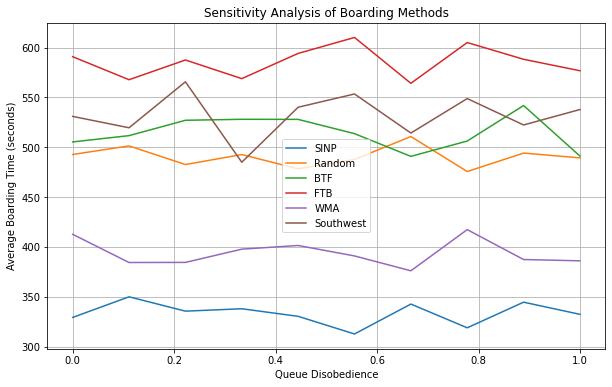

In [34]:
# Define parameters for the sensitivity analysis
num_simulations = 1  # Number of simulations for each parameter combination
queue_disobedience_values = np.linspace(0.0, 1.0, 10)  # Vary queue_disobedience from 0 to 1

# Create a dictionary to store results for different methods
methods = ["SINP", "Random", "BTF", "FTB", "WMA", "Southwest"]
results = {method: [] for method in methods}

# Run simulations for different methods and queue_disobedience values
for method in methods:
    for queue_disobedience in queue_disobedience_values:
        boarding_times = []

        for _ in range(num_simulations):
            result = simulate_boarding(method, queue_disobedience)
            boarding_times.append(result)

        average_boarding_time = np.mean(boarding_times)
        results[method].append(average_boarding_time)

# Now you have results for each boarding method and queue_disobedience value
# You can analyze and visualize the results as needed
# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot average boarding times for each method
for method in methods:
    ax.plot(queue_disobedience_values, results[method], label=method)

# Set plot labels and title
ax.set_xlabel("Queue Disobedience")
ax.set_ylabel("Average Boarding Time (seconds)")
ax.set_title("Sensitivity Analysis of Boarding Methods")

# Add a legend to distinguish between methods
ax.legend()

# Show the plot
plt.grid(True)
plt.show()